In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import xgboost as xgb



In [20]:
df = pd.read_csv('../Desktop/Kaggle/train-oct.csv')
df_test = pd.read_csv('../Desktop/Kaggle/test-oct.csv')

In [21]:
print(df.shape)
print(df_test.shape)

(1000000, 287)
(500000, 286)


In [22]:
df.head(50)


,id,f0,f1,f2,f3,f4,f5,f6,f7,f8,...,f276,f277,f278,f279,f280,f281,f282,f283,f284,target
0,0,0.205979,0.410993,0.176775,0.223581,0.423543,0.476140,0.413590,0.612021,0.534873,...,0,1,0,0,0,0,0,0,0,1
1,1,0.181004,0.473119,0.011734,0.213657,0.619678,0.441593,0.230407,0.686013,0.281971,...,0,1,0,0,0,0,0,0,0,1
2,2,0.182583,0.307431,0.325950,0.207116,0.605699,0.309695,0.493337,0.751107,0.536272,...,0,0,0,1,1,0,0,0,0,1
3,3,0.180240,0.494592,0.008367,0.223580,0.760618,0.439211,0.432055,0.776147,0.483958,...,0,0,0,0,1,0,0,0,0,1
4,4,0.177172,0.495513,0.014263,0.548819,0.625396,0.562493,0.117158,0.561255,0.077115,...,0,1,1,0,1,0,0,1,0,1
5,5,0.255237,0.345842,0.021549,0.220755,0.524854,0.423693,0.533150,0.628484,0.340781,...,0,0,1,0,1,0,0,0,0,0
6,6,0.203610,0.434725,0.180539,0.238135,0.647089,0.633265,0.580177,0.758934,0.571226,...,0,0,0,0,0,0,0,0,0,1
7,7,0.184985,0.489515,0.094419,0.304358,0.721958,0.306020,0.386065,0.651795,0.324744,...,1,0,0,0,0,1,0,1,0,1
8,8,0.165046,0.656603,0.017722,0.210186,0.468217,0.451836,0.434683,0.631538,0.608107,...,1,1,0,0,0,0,0,0,0,1
9,9,0.180916,0.450976,0.170291,0.356205,0.924490,0.491684,0.465108,0.652863,0.294830,...,0,0,0,0,0,0,0,0,0,0


In [23]:
df = df.drop("id", axis = 1)
df_test = df_test.drop("id", axis = 1)


In [24]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Columns: 286 entries, f0 to target
dtypes: float64(240), int64(46)
memory usage: 2.1 GB


In [25]:
df.isnull().sum()

f0        0
f1        0
f2        0
f3        0
f4        0
         ..
f281      0
f282      0
f283      0
f284      0
target    0
Length: 286, dtype: int64

In [26]:
df.describe()

,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,...,f276,f277,f278,f279,f280,f281,f282,f283,f284,target
count,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,...,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.00000,1000000.000000
mean,0.214334,0.460218,0.129253,0.277598,0.580710,0.416619,0.386532,0.654858,0.462256,0.258031,...,0.250096,0.137164,0.144793,0.130667,0.139210,0.199331,0.156065,0.183741,0.15468,0.500485
std,0.053320,0.101316,0.120805,0.063163,0.115338,0.058231,0.133457,0.065158,0.129439,0.119081,...,0.433068,0.344021,0.351892,0.337036,0.346166,0.399498,0.362917,0.387273,0.36160,0.500000
min,0.041790,0.022016,0.000381,0.000000,0.000000,0.000959,0.000592,0.017994,0.000990,0.051183,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
25%,0.181676,0.389215,0.017692,0.235342,0.497938,0.374390,0.317815,0.615372,0.363753,0.164559,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
50%,0.204498,0.453893,0.095496,0.264669,0.565059,0.414009,0.420260,0.648562,0.475702,0.227714,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000
75%,0.229684,0.526023,0.177717,0.305837,0.657024,0.458360,0.477140,0.692666,0.561372,0.300988,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000
max,1.000000,0.959019,0.994818,0.979797,1.000000,0.907889,0.972601,0.986195,0.986118,0.980994,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000


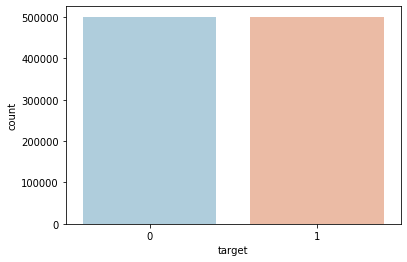

In [27]:
sns.countplot(x='target',data=df,palette='RdBu_r')

In [28]:
features = [col for col in df.columns if 'f' in col]

In [29]:
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [30]:
df = reduce_mem_usage(df)

Memory usage of dataframe is 2182.01 MB
Memory usage after optimization is: 501.63 MB
Decreased by 77.0%


In [31]:
df.loc[:,:'f241'].describe(percentiles=[0.01,0.1,0.98,0.99]).T.style.bar(
    subset=['mean'],
    color='lightsalmon').background_gradient(
    subset=['std'], cmap='plasma').background_gradient(subset=['99%','98%'], cmap='plasma').background_gradient(
    subset=['max'], cmap='plasma')

,count,mean,std,min,1%,10%,50%,98%,99%,max
f0,1000000.000000,nan,0.000000,0.041779,0.155396,0.161377,0.204468,0.365479,0.440674,1.000000
f1,1000000.000000,nan,0.000000,0.022018,0.248413,0.333496,0.453857,0.679688,0.712402,0.958984
f2,1000000.000000,nan,0.000000,0.000381,0.005165,0.011215,0.095520,0.462158,0.516113,0.994629
f3,1000000.000000,nan,0.000000,0.000000,0.175537,0.214966,0.264648,0.458252,0.495605,0.979980
f4,1000000.000000,nan,0.000000,0.000000,0.353516,0.444824,0.564941,0.840820,0.876953,1.000000
f5,1000000.000000,nan,0.000000,0.000959,0.296631,0.341064,0.414062,0.527344,0.536133,0.907715
f6,1000000.000000,nan,0.000000,0.000592,0.061157,0.166504,0.420166,0.609375,0.659180,0.972656
f7,1000000.000000,nan,0.000000,0.017990,0.486816,0.587402,0.648438,0.797363,0.825195,0.986328
f8,1000000.000000,nan,0.000000,0.000990,0.160156,0.286621,0.475586,0.680664,0.729980,0.986328
f9,1000000.000000,nan,0.000000,0.051178,0.139648,0.148438,0.227661,0.627441,0.700195,0.980957


## Data Split

In [32]:
y = df['target']

In [33]:
X = df.drop("target",axis=1)

In [34]:
xtrain, xtest , ytrain , ytest = train_test_split(X , y , test_size = 0.1 , random_state  = 420)

## Logistic Regression

In [17]:
from sklearn.linear_model import LogisticRegression

In [18]:
logmodel = LogisticRegression(max_iter=1000)
logmodel.fit(xtrain,ytrain)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [19]:
pred_log_valid = logmodel.predict(xtest)

In [45]:
from sklearn.metrics import classification_report

In [21]:
print(classification_report(ytest,pred_log_valid))

              precision    recall  f1-score   support

           0       0.74      0.79      0.77     49829
           1       0.78      0.73      0.75     50171

    accuracy                           0.76    100000
   macro avg       0.76      0.76      0.76    100000
weighted avg       0.76      0.76      0.76    100000



In [22]:
pred_log = logmodel.predict(df_test)

## XGBBoost

In [44]:
import xgboost as xgb
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score

In [10]:
"""
modelxgb = xgb.XGBClassifier()      
modelxgb.fit(xtrain,ytrain)
xgb_preds = modelxgb.predict(df_test)
"""

## The computation time for the XGB model is significantly too long. 
## We move forward and omit this model as a prospective otpimal classifier

'\nmodelxgb = xgb.XGBClassifier()      \nmodelxgb.fit(xtrain,ytrain)\nxgb_preds = modelxgb.predict(df_test)\n'

## LightGBM

In [39]:
import lightgbm
from lightgbm import LGBMClassifier


In [32]:
model_lgbm = LGBMClassifier(obejctive='binary',)


In [ ]:
model_lgbm.fit(xtrain,ytrain)
lgbm_pred_valid = model_lgbm.predict(xtest)
lgbm_pred = model_lgbm.predict(df_test)

In [28]:
print(classification_report(ytest,lgbm_pred_valid))

              precision    recall  f1-score   support

           0       0.74      0.81      0.77     49829
           1       0.79      0.72      0.75     50171

    accuracy                           0.76    100000
   macro avg       0.77      0.76      0.76    100000
weighted avg       0.77      0.76      0.76    100000



## Hyperparameter tunning 

In [10]:
import optuna  # pip install optuna

In [38]:
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold

In [40]:
def objective(trial, X, y):
    param_grid = {
        #         "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "max_bin": trial.suggest_int("max_bin", 200, 300),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }  # to be filled in later
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)

    cv_scores = np.empty(5)
    for idx, (trainx, testx) in enumerate(cv.split(X, y)):
        xtrain, xtest = X.iloc[trainx], X.iloc[testx]
        ytrain, ytest = y[trainx], y[testx]
        
        model = LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            xtrain,
            ytrain,
            eval_set=[(xtest, ytest)],
            eval_metric="binary_logloss",
            early_stopping_rounds=100,
            callbacks=[
                optuna.integration.LightGBMPruningCallback(trial, "binary_logloss")
                
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(xtest)
        cv_scores[idx] = log_loss(ytest, preds)

    return np.mean(cv_scores)

In [13]:
study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=20)

[I 2021-10-14 22:06:55,269] A new study created in memory with name: LGBM Classifier
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=2.7254605634777915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7254605634777915
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[1]	valid_0's binary_logloss: 0.621721
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.619675
[3]	valid_0's binary_logloss

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.621147
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.619239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.610403
[4]	valid_0's binary_logloss: 0.605343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.569361
[6]	valid_0's binary_logloss: 0.56407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.562189
[8]	valid_0's binary_logloss: 0.559453


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.537999
[10]	valid_0's binary_logloss: 0.536465


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[11]	valid_0's binary_logloss: 0.524536
[12]	valid_0's binary_logloss: 0.51797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[13]	valid_0's binary_logloss: 0.515935
[14]	valid_0's binary_logloss: 0.512114


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step


[15]	valid_0's binary_logloss: 0.510717
[16]	valid_0's binary_logloss: 0.509357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[17]	valid_0's binary_logloss: 0.506314
[18]	valid_0's binary_logloss: 0.505125


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[19]	valid_0's binary_logloss: 0.504252
[20]	valid_0's binary_logloss: 0.502578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[21]	valid_0's binary_logloss: 0.501145
[22]	valid_0's binary_logloss: 0.500215


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[23]	valid_0's binary_logloss: 0.499043
[24]	valid_0's binary_logloss: 0.498234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[25]	valid_0's binary_logloss: 0.497529
[26]	valid_0's binary_logloss: 0.496813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[27]	valid_0's binary_logloss: 0.496138
[28]	valid_0's binary_logloss: 0.495487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[29]	valid_0's binary_logloss: 0.49485
[30]	valid_0's binary_logloss: 0.494232


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[31]	valid_0's binary_logloss: 0.493626
[32]	valid_0's binary_logloss: 0.493061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[33]	valid_0's binary_logloss: 0.492495
[34]	valid_0's binary_logloss: 0.492043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[35]	valid_0's binary_logloss: 0.491588
[36]	valid_0's binary_logloss: 0.491176


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[37]	valid_0's binary_logloss: 0.490649
[38]	valid_0's binary_logloss: 0.490335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[39]	valid_0's binary_logloss: 0.489916
[40]	valid_0's binary_logloss: 0.489358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[41]	valid_0's binary_logloss: 0.488996
[42]	valid_0's binary_logloss: 0.488638


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[43]	valid_0's binary_logloss: 0.488274
[44]	valid_0's binary_logloss: 0.487888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[45]	valid_0's binary_logloss: 0.487523
[46]	valid_0's binary_logloss: 0.487213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[47]	valid_0's binary_logloss: 0.486927
[48]	valid_0's binary_logloss: 0.486425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[49]	valid_0's binary_logloss: 0.486062
[50]	valid_0's binary_logloss: 0.485818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[51]	valid_0's binary_logloss: 0.485548
[52]	valid_0's binary_logloss: 0.485242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[53]	valid_0's binary_logloss: 0.484959
[54]	valid_0's binary_logloss: 0.484642


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step


[55]	valid_0's binary_logloss: 0.484389
[56]	valid_0's binary_logloss: 0.484161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step


[57]	valid_0's binary_logloss: 0.483926
[58]	valid_0's binary_logloss: 0.483637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step


[59]	valid_0's binary_logloss: 0.483424
[60]	valid_0's binary_logloss: 0.483182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step


[61]	valid_0's binary_logloss: 0.482952
[62]	valid_0's binary_logloss: 0.4827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step


[63]	valid_0's binary_logloss: 0.482486
[64]	valid_0's binary_logloss: 0.482315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[65]	valid_0's binary_logloss: 0.48211
[66]	valid_0's binary_logloss: 0.481904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step


[67]	valid_0's binary_logloss: 0.481725
[68]	valid_0's binary_logloss: 0.481543


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step


[69]	valid_0's binary_logloss: 0.481364
[70]	valid_0's binary_logloss: 0.48114


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step


[71]	valid_0's binary_logloss: 0.48095
[72]	valid_0's binary_logloss: 0.480797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step


[73]	valid_0's binary_logloss: 0.480639
[74]	valid_0's binary_logloss: 0.480482


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step


[75]	valid_0's binary_logloss: 0.480338
[76]	valid_0's binary_logloss: 0.480162


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[77]	valid_0's binary_logloss: 0.480012
[78]	valid_0's binary_logloss: 0.47981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step


[79]	valid_0's binary_logloss: 0.479664
[80]	valid_0's binary_logloss: 0.479541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step


[81]	valid_0's binary_logloss: 0.479386
[82]	valid_0's binary_logloss: 0.479261


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step


[83]	valid_0's binary_logloss: 0.479107
[84]	valid_0's binary_logloss: 0.478858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step


[85]	valid_0's binary_logloss: 0.478741
[86]	valid_0's binary_logloss: 0.478588


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step


[87]	valid_0's binary_logloss: 0.47846
[88]	valid_0's binary_logloss: 0.478349


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step


[89]	valid_0's binary_logloss: 0.478239
[90]	valid_0's binary_logloss: 0.478053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step


[91]	valid_0's binary_logloss: 0.477909
[92]	valid_0's binary_logloss: 0.477782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step


[93]	valid_0's binary_logloss: 0.477631
[94]	valid_0's binary_logloss: 0.477502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[95]	valid_0's binary_logloss: 0.477371
[96]	valid_0's binary_logloss: 0.477273


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[97]	valid_0's binary_logloss: 0.477176
[98]	valid_0's binary_logloss: 0.477049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step


[99]	valid_0's binary_logloss: 0.476936
[100]	valid_0's binary_logloss: 0.476759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step


[101]	valid_0's binary_logloss: 0.476652
[102]	valid_0's binary_logloss: 0.476542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[103]	valid_0's binary_logloss: 0.476435
[104]	valid_0's binary_logloss: 0.47632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step


[105]	valid_0's binary_logloss: 0.47622
[106]	valid_0's binary_logloss: 0.476123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step


[107]	valid_0's binary_logloss: 0.475973
[108]	valid_0's binary_logloss: 0.475889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step


[109]	valid_0's binary_logloss: 0.47578
[110]	valid_0's binary_logloss: 0.475686


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step


[111]	valid_0's binary_logloss: 0.475599
[112]	valid_0's binary_logloss: 0.475503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[113]	valid_0's binary_logloss: 0.475396
[114]	valid_0's binary_logloss: 0.475294


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[115]	valid_0's binary_logloss: 0.475238
[116]	valid_0's binary_logloss: 0.475136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[117]	valid_0's binary_logloss: 0.47505
[118]	valid_0's binary_logloss: 0.474997


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step


[119]	valid_0's binary_logloss: 0.474922
[120]	valid_0's binary_logloss: 0.474829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step


[121]	valid_0's binary_logloss: 0.474742
[122]	valid_0's binary_logloss: 0.474709


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step


[123]	valid_0's binary_logloss: 0.474646
[124]	valid_0's binary_logloss: 0.474572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step


[125]	valid_0's binary_logloss: 0.474501


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step


[126]	valid_0's binary_logloss: 0.474448


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step


[127]	valid_0's binary_logloss: 0.474383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[128]	valid_0's binary_logloss: 0.474329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step


[129]	valid_0's binary_logloss: 0.474231


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step


[130]	valid_0's binary_logloss: 0.474081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step


[131]	valid_0's binary_logloss: 0.474009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step


[132]	valid_0's binary_logloss: 0.473921
[133]	valid_0's binary_logloss: 0.473863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[134]	valid_0's binary_logloss: 0.473791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step


[135]	valid_0's binary_logloss: 0.473729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[136]	valid_0's binary_logloss: 0.473686


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step


[137]	valid_0's binary_logloss: 0.473631


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step


[138]	valid_0's binary_logloss: 0.473556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step


[139]	valid_0's binary_logloss: 0.473502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step


[140]	valid_0's binary_logloss: 0.473378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step


[141]	valid_0's binary_logloss: 0.473315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step


[142]	valid_0's binary_logloss: 0.473271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step


[143]	valid_0's binary_logloss: 0.47323


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[144]	valid_0's binary_logloss: 0.473112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step


[145]	valid_0's binary_logloss: 0.473097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[146]	valid_0's binary_logloss: 0.473041


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step


[147]	valid_0's binary_logloss: 0.47297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[148]	valid_0's binary_logloss: 0.472928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step


[149]	valid_0's binary_logloss: 0.472838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step


[150]	valid_0's binary_logloss: 0.472782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step


[151]	valid_0's binary_logloss: 0.472723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[152]	valid_0's binary_logloss: 0.472682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step


[153]	valid_0's binary_logloss: 0.47263


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[154]	valid_0's binary_logloss: 0.472574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step


[155]	valid_0's binary_logloss: 0.472493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[156]	valid_0's binary_logloss: 0.472466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step


[157]	valid_0's binary_logloss: 0.472401


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step


[158]	valid_0's binary_logloss: 0.47234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step


[159]	valid_0's binary_logloss: 0.472296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step


[160]	valid_0's binary_logloss: 0.472281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step


[161]	valid_0's binary_logloss: 0.472238


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[162]	valid_0's binary_logloss: 0.4722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step


[163]	valid_0's binary_logloss: 0.472156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step


[164]	valid_0's binary_logloss: 0.472079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step


[165]	valid_0's binary_logloss: 0.472028


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step


[166]	valid_0's binary_logloss: 0.47198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step


[167]	valid_0's binary_logloss: 0.471939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step


[168]	valid_0's binary_logloss: 0.471876


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step


[169]	valid_0's binary_logloss: 0.471818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step


[170]	valid_0's binary_logloss: 0.471764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step


[171]	valid_0's binary_logloss: 0.47172


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step


[172]	valid_0's binary_logloss: 0.471662
[173]	valid_0's binary_logloss: 0.471618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step


[174]	valid_0's binary_logloss: 0.471585
[175]	valid_0's binary_logloss: 0.471546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step


[176]	valid_0's binary_logloss: 0.471507
[177]	valid_0's binary_logloss: 0.47148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step


[178]	valid_0's binary_logloss: 0.471427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step


[179]	valid_0's binary_logloss: 0.471348
[180]	valid_0's binary_logloss: 0.471311


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step


[181]	valid_0's binary_logloss: 0.471289
[182]	valid_0's binary_logloss: 0.471242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step


[183]	valid_0's binary_logloss: 0.471217
[184]	valid_0's binary_logloss: 0.471218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step


[185]	valid_0's binary_logloss: 0.471192
[186]	valid_0's binary_logloss: 0.471164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step


[187]	valid_0's binary_logloss: 0.471095
[188]	valid_0's binary_logloss: 0.471061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step


[189]	valid_0's binary_logloss: 0.47103
[190]	valid_0's binary_logloss: 0.470984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step


[191]	valid_0's binary_logloss: 0.470959
[192]	valid_0's binary_logloss: 0.470934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step


[193]	valid_0's binary_logloss: 0.470912
[194]	valid_0's binary_logloss: 0.470875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step


[195]	valid_0's binary_logloss: 0.470836
[196]	valid_0's binary_logloss: 0.470815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step


[197]	valid_0's binary_logloss: 0.47078
[198]	valid_0's binary_logloss: 0.470741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step


[199]	valid_0's binary_logloss: 0.470698
[200]	valid_0's binary_logloss: 0.470683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step


[201]	valid_0's binary_logloss: 0.470656
[202]	valid_0's binary_logloss: 0.47064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step


[203]	valid_0's binary_logloss: 0.470632
[204]	valid_0's binary_logloss: 0.4706


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step


[205]	valid_0's binary_logloss: 0.470585
[206]	valid_0's binary_logloss: 0.470563


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step


[207]	valid_0's binary_logloss: 0.47054
[208]	valid_0's binary_logloss: 0.470528


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step


[209]	valid_0's binary_logloss: 0.470498
[210]	valid_0's binary_logloss: 0.470483


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[211]	valid_0's binary_logloss: 0.470433
[212]	valid_0's binary_logloss: 0.470404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step


[213]	valid_0's binary_logloss: 0.470389
[214]	valid_0's binary_logloss: 0.470374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step


[215]	valid_0's binary_logloss: 0.470362
[216]	valid_0's binary_logloss: 0.470347


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step


[217]	valid_0's binary_logloss: 0.470325
[218]	valid_0's binary_logloss: 0.470283


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[219]	valid_0's binary_logloss: 0.470287
[220]	valid_0's binary_logloss: 0.470265


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step


[221]	valid_0's binary_logloss: 0.470244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step


[222]	valid_0's binary_logloss: 0.47022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step


[223]	valid_0's binary_logloss: 0.470186


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step


[224]	valid_0's binary_logloss: 0.470161
[225]	valid_0's binary_logloss: 0.470133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step


[226]	valid_0's binary_logloss: 0.470129
[227]	valid_0's binary_logloss: 0.470103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step


[228]	valid_0's binary_logloss: 0.470069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step


[229]	valid_0's binary_logloss: 0.470053
[230]	valid_0's binary_logloss: 0.470022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step


[231]	valid_0's binary_logloss: 0.469997
[232]	valid_0's binary_logloss: 0.469983


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step


[233]	valid_0's binary_logloss: 0.469961
[234]	valid_0's binary_logloss: 0.469958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[235]	valid_0's binary_logloss: 0.469926
[236]	valid_0's binary_logloss: 0.469908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step


[237]	valid_0's binary_logloss: 0.469904
[238]	valid_0's binary_logloss: 0.469901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step


[239]	valid_0's binary_logloss: 0.469872
[240]	valid_0's binary_logloss: 0.469855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step


[241]	valid_0's binary_logloss: 0.469861
[242]	valid_0's binary_logloss: 0.469853


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step


[243]	valid_0's binary_logloss: 0.469816
[244]	valid_0's binary_logloss: 0.469784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[245]	valid_0's binary_logloss: 0.469758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step


[246]	valid_0's binary_logloss: 0.469738
[247]	valid_0's binary_logloss: 0.469721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step


[248]	valid_0's binary_logloss: 0.469701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step


[249]	valid_0's binary_logloss: 0.46968


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step


[250]	valid_0's binary_logloss: 0.469662
[251]	valid_0's binary_logloss: 0.469654
[252]	valid_0's binary_logloss: 0.469648


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step


[253]	valid_0's binary_logloss: 0.469578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step


[254]	valid_0's binary_logloss: 0.469557


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step


[255]	valid_0's binary_logloss: 0.469515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[256]	valid_0's binary_logloss: 0.469512
[257]	valid_0's binary_logloss: 0.469485


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step


[258]	valid_0's binary_logloss: 0.469485
[259]	valid_0's binary_logloss: 0.469467


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step


[260]	valid_0's binary_logloss: 0.469435
[261]	valid_0's binary_logloss: 0.469425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step


[262]	valid_0's binary_logloss: 0.469408
[263]	valid_0's binary_logloss: 0.469386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step


[264]	valid_0's binary_logloss: 0.469382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step


[265]	valid_0's binary_logloss: 0.469359
[266]	valid_0's binary_logloss: 0.469339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step


[267]	valid_0's binary_logloss: 0.469331


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step


[268]	valid_0's binary_logloss: 0.469323


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[269]	valid_0's binary_logloss: 0.469306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step


[270]	valid_0's binary_logloss: 0.469291
[271]	valid_0's binary_logloss: 0.469291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step


[272]	valid_0's binary_logloss: 0.469278


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step


[273]	valid_0's binary_logloss: 0.469278


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step


[274]	valid_0's binary_logloss: 0.469274


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step


[275]	valid_0's binary_logloss: 0.469262
[276]	valid_0's binary_logloss: 0.469248


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step


[277]	valid_0's binary_logloss: 0.469226
[278]	valid_0's binary_logloss: 0.469214


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step


[279]	valid_0's binary_logloss: 0.469209
[280]	valid_0's binary_logloss: 0.469205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step


[281]	valid_0's binary_logloss: 0.469207
[282]	valid_0's binary_logloss: 0.469184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step


[283]	valid_0's binary_logloss: 0.469146


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step


[284]	valid_0's binary_logloss: 0.469137


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step


[285]	valid_0's binary_logloss: 0.469128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step


[286]	valid_0's binary_logloss: 0.469084
[287]	valid_0's binary_logloss: 0.469078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step


[288]	valid_0's binary_logloss: 0.469059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step


[289]	valid_0's binary_logloss: 0.469043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[290]	valid_0's binary_logloss: 0.469036


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step


[291]	valid_0's binary_logloss: 0.469009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step


[292]	valid_0's binary_logloss: 0.468985


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step


[293]	valid_0's binary_logloss: 0.468956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step


[294]	valid_0's binary_logloss: 0.468947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step


[295]	valid_0's binary_logloss: 0.468942


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step


[296]	valid_0's binary_logloss: 0.468926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step


[297]	valid_0's binary_logloss: 0.468907
[298]	valid_0's binary_logloss: 0.468896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step


[299]	valid_0's binary_logloss: 0.468876
[300]	valid_0's binary_logloss: 0.468861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step


[301]	valid_0's binary_logloss: 0.468856
[302]	valid_0's binary_logloss: 0.468852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step


[303]	valid_0's binary_logloss: 0.468853
[304]	valid_0's binary_logloss: 0.46884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step


[305]	valid_0's binary_logloss: 0.468824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step


[306]	valid_0's binary_logloss: 0.468804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step


[307]	valid_0's binary_logloss: 0.468793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step


[308]	valid_0's binary_logloss: 0.46879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step


[309]	valid_0's binary_logloss: 0.468756


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step


[310]	valid_0's binary_logloss: 0.468752


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[311]	valid_0's binary_logloss: 0.468731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step


[312]	valid_0's binary_logloss: 0.468719


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step


[313]	valid_0's binary_logloss: 0.468724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step


[314]	valid_0's binary_logloss: 0.468718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step


[315]	valid_0's binary_logloss: 0.46872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step


[316]	valid_0's binary_logloss: 0.468708
[317]	valid_0's binary_logloss: 0.468708


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step


[318]	valid_0's binary_logloss: 0.468699
[319]	valid_0's binary_logloss: 0.468698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step


[320]	valid_0's binary_logloss: 0.468681
[321]	valid_0's binary_logloss: 0.468663


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step


[322]	valid_0's binary_logloss: 0.468668
[323]	valid_0's binary_logloss: 0.468668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step


[324]	valid_0's binary_logloss: 0.468663
[325]	valid_0's binary_logloss: 0.468659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step


[326]	valid_0's binary_logloss: 0.468636


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step


[327]	valid_0's binary_logloss: 0.468634
[328]	valid_0's binary_logloss: 0.468631


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step


[329]	valid_0's binary_logloss: 0.468625
[330]	valid_0's binary_logloss: 0.468624


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step


[331]	valid_0's binary_logloss: 0.468607
[332]	valid_0's binary_logloss: 0.4686


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step


[333]	valid_0's binary_logloss: 0.468575
[334]	valid_0's binary_logloss: 0.468567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step


[335]	valid_0's binary_logloss: 0.468568
[336]	valid_0's binary_logloss: 0.468559


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step


[337]	valid_0's binary_logloss: 0.468562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step


[338]	valid_0's binary_logloss: 0.468574
[339]	valid_0's binary_logloss: 0.468552


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[340]	valid_0's binary_logloss: 0.468546
[341]	valid_0's binary_logloss: 0.468532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step


[342]	valid_0's binary_logloss: 0.468531


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step


[343]	valid_0's binary_logloss: 0.468532
[344]	valid_0's binary_logloss: 0.468516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step


[345]	valid_0's binary_logloss: 0.468511
[346]	valid_0's binary_logloss: 0.468506


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step


[347]	valid_0's binary_logloss: 0.468505
[348]	valid_0's binary_logloss: 0.468492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step


[349]	valid_0's binary_logloss: 0.468493
[350]	valid_0's binary_logloss: 0.468476


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step


[351]	valid_0's binary_logloss: 0.468454
[352]	valid_0's binary_logloss: 0.46845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[353]	valid_0's binary_logloss: 0.468448


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step


[354]	valid_0's binary_logloss: 0.468438
[355]	valid_0's binary_logloss: 0.468433


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step


[356]	valid_0's binary_logloss: 0.468408
[357]	valid_0's binary_logloss: 0.468405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step


[358]	valid_0's binary_logloss: 0.468395
[359]	valid_0's binary_logloss: 0.468392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step


[360]	valid_0's binary_logloss: 0.468395
[361]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step


[362]	valid_0's binary_logloss: 0.468393
[363]	valid_0's binary_logloss: 0.468379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step


[364]	valid_0's binary_logloss: 0.468385
[365]	valid_0's binary_logloss: 0.46837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step


[366]	valid_0's binary_logloss: 0.468376
[367]	valid_0's binary_logloss: 0.468379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step


[368]	valid_0's binary_logloss: 0.468375
[369]	valid_0's binary_logloss: 0.468374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[370]	valid_0's binary_logloss: 0.468372
[371]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step


[372]	valid_0's binary_logloss: 0.468376


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step


[373]	valid_0's binary_logloss: 0.468382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[374]	valid_0's binary_logloss: 0.46839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step


[375]	valid_0's binary_logloss: 0.468391
[376]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step


[377]	valid_0's binary_logloss: 0.46838
[378]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step


[379]	valid_0's binary_logloss: 0.468381
[380]	valid_0's binary_logloss: 0.468383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step


[381]	valid_0's binary_logloss: 0.468394
[382]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step


[383]	valid_0's binary_logloss: 0.468391
[384]	valid_0's binary_logloss: 0.468401


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[385]	valid_0's binary_logloss: 0.468399
[386]	valid_0's binary_logloss: 0.468393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step


[387]	valid_0's binary_logloss: 0.468404
[388]	valid_0's binary_logloss: 0.46839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step


[389]	valid_0's binary_logloss: 0.468381
[390]	valid_0's binary_logloss: 0.468365


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[391]	valid_0's binary_logloss: 0.468364
[392]	valid_0's binary_logloss: 0.468361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step


[393]	valid_0's binary_logloss: 0.468362
[394]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step


[395]	valid_0's binary_logloss: 0.468361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step


[396]	valid_0's binary_logloss: 0.468372
[397]	valid_0's binary_logloss: 0.468365


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step


[398]	valid_0's binary_logloss: 0.468375
[399]	valid_0's binary_logloss: 0.468378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[400]	valid_0's binary_logloss: 0.468367
[401]	valid_0's binary_logloss: 0.468362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step


[402]	valid_0's binary_logloss: 0.468362
[403]	valid_0's binary_logloss: 0.46836


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[404]	valid_0's binary_logloss: 0.468367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step


[405]	valid_0's binary_logloss: 0.468376
[406]	valid_0's binary_logloss: 0.468365


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step


[407]	valid_0's binary_logloss: 0.468366
[408]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[409]	valid_0's binary_logloss: 0.468368
[410]	valid_0's binary_logloss: 0.468368


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step


[411]	valid_0's binary_logloss: 0.46836
[412]	valid_0's binary_logloss: 0.468359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step


[413]	valid_0's binary_logloss: 0.468361
[414]	valid_0's binary_logloss: 0.468356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step


[415]	valid_0's binary_logloss: 0.468359
[416]	valid_0's binary_logloss: 0.468361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step


[417]	valid_0's binary_logloss: 0.468366
[418]	valid_0's binary_logloss: 0.468366


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step


[419]	valid_0's binary_logloss: 0.468365
[420]	valid_0's binary_logloss: 0.468344


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step


[421]	valid_0's binary_logloss: 0.468337
[422]	valid_0's binary_logloss: 0.46834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step


[423]	valid_0's binary_logloss: 0.468349
[424]	valid_0's binary_logloss: 0.468373


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step


[425]	valid_0's binary_logloss: 0.468368
[426]	valid_0's binary_logloss: 0.468358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step


[427]	valid_0's binary_logloss: 0.468355
[428]	valid_0's binary_logloss: 0.46836


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step


[429]	valid_0's binary_logloss: 0.468354
[430]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step


[431]	valid_0's binary_logloss: 0.468356
[432]	valid_0's binary_logloss: 0.46835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step


[433]	valid_0's binary_logloss: 0.468354
[434]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step


[435]	valid_0's binary_logloss: 0.468332
[436]	valid_0's binary_logloss: 0.468327


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step


[437]	valid_0's binary_logloss: 0.468323
[438]	valid_0's binary_logloss: 0.468331


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step


[439]	valid_0's binary_logloss: 0.468335
[440]	valid_0's binary_logloss: 0.468334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step


[441]	valid_0's binary_logloss: 0.468337
[442]	valid_0's binary_logloss: 0.468334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step


[443]	valid_0's binary_logloss: 0.468344
[444]	valid_0's binary_logloss: 0.468346


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step


[445]	valid_0's binary_logloss: 0.468336
[446]	valid_0's binary_logloss: 0.468331


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step


[447]	valid_0's binary_logloss: 0.468334
[448]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step


[449]	valid_0's binary_logloss: 0.468328
[450]	valid_0's binary_logloss: 0.468333


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step


[451]	valid_0's binary_logloss: 0.468328
[452]	valid_0's binary_logloss: 0.468338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step


[453]	valid_0's binary_logloss: 0.468326
[454]	valid_0's binary_logloss: 0.468325


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step


[455]	valid_0's binary_logloss: 0.468314
[456]	valid_0's binary_logloss: 0.468305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step


[457]	valid_0's binary_logloss: 0.468305
[458]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step


[459]	valid_0's binary_logloss: 0.468331
[460]	valid_0's binary_logloss: 0.468323


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step


[461]	valid_0's binary_logloss: 0.468337
[462]	valid_0's binary_logloss: 0.468334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step


[463]	valid_0's binary_logloss: 0.468328
[464]	valid_0's binary_logloss: 0.468329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step


[465]	valid_0's binary_logloss: 0.468329
[466]	valid_0's binary_logloss: 0.468332


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step


[467]	valid_0's binary_logloss: 0.468329
[468]	valid_0's binary_logloss: 0.468323


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step


[469]	valid_0's binary_logloss: 0.468315
[470]	valid_0's binary_logloss: 0.468329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step


[471]	valid_0's binary_logloss: 0.46832
[472]	valid_0's binary_logloss: 0.468312


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step


[473]	valid_0's binary_logloss: 0.468312
[474]	valid_0's binary_logloss: 0.468315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step


[475]	valid_0's binary_logloss: 0.468312
[476]	valid_0's binary_logloss: 0.468315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step


[477]	valid_0's binary_logloss: 0.468313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step


[478]	valid_0's binary_logloss: 0.468323
[479]	valid_0's binary_logloss: 0.468318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step


[480]	valid_0's binary_logloss: 0.468324
[481]	valid_0's binary_logloss: 0.468322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step


[482]	valid_0's binary_logloss: 0.468315
[483]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step


[484]	valid_0's binary_logloss: 0.468321
[485]	valid_0's binary_logloss: 0.468319


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step


[486]	valid_0's binary_logloss: 0.468322
[487]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step


[488]	valid_0's binary_logloss: 0.468309
[489]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step


[490]	valid_0's binary_logloss: 0.468315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step


[491]	valid_0's binary_logloss: 0.468317
[492]	valid_0's binary_logloss: 0.468327


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step


[493]	valid_0's binary_logloss: 0.468335
[494]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step


[495]	valid_0's binary_logloss: 0.468333
[496]	valid_0's binary_logloss: 0.46833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[497]	valid_0's binary_logloss: 0.46834
[498]	valid_0's binary_logloss: 0.468338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step


[499]	valid_0's binary_logloss: 0.468326
[500]	valid_0's binary_logloss: 0.468322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step


[501]	valid_0's binary_logloss: 0.468316
[502]	valid_0's binary_logloss: 0.46833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step


[503]	valid_0's binary_logloss: 0.468333
[504]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step


[505]	valid_0's binary_logloss: 0.468347
[506]	valid_0's binary_logloss: 0.468345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step


[507]	valid_0's binary_logloss: 0.468352
[508]	valid_0's binary_logloss: 0.468356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step


[509]	valid_0's binary_logloss: 0.468347
[510]	valid_0's binary_logloss: 0.468352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step


[511]	valid_0's binary_logloss: 0.468352
[512]	valid_0's binary_logloss: 0.468349


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step


[513]	valid_0's binary_logloss: 0.468347
[514]	valid_0's binary_logloss: 0.468349


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step


[515]	valid_0's binary_logloss: 0.468358
[516]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step


[517]	valid_0's binary_logloss: 0.468362
[518]	valid_0's binary_logloss: 0.468363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step


[519]	valid_0's binary_logloss: 0.46837
[520]	valid_0's binary_logloss: 0.468361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step


[521]	valid_0's binary_logloss: 0.468357
[522]	valid_0's binary_logloss: 0.468347


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step


[523]	valid_0's binary_logloss: 0.468352
[524]	valid_0's binary_logloss: 0.468353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step


[525]	valid_0's binary_logloss: 0.468353
[526]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step


[527]	valid_0's binary_logloss: 0.468354
[528]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step


[529]	valid_0's binary_logloss: 0.468356
[530]	valid_0's binary_logloss: 0.468357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step


[531]	valid_0's binary_logloss: 0.468364
[532]	valid_0's binary_logloss: 0.468366


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step


[533]	valid_0's binary_logloss: 0.468347
[534]	valid_0's binary_logloss: 0.468341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step


[535]	valid_0's binary_logloss: 0.468336
[536]	valid_0's binary_logloss: 0.468343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step


[537]	valid_0's binary_logloss: 0.468357
[538]	valid_0's binary_logloss: 0.46836


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step


[539]	valid_0's binary_logloss: 0.468354
[540]	valid_0's binary_logloss: 0.468357
[541]	valid_0's binary_logloss: 0.468358
[542]	valid_0's binary_logloss: 0.468378
[543]	valid_0's binary_logloss: 0.468389
[544]	valid_0's binary_logloss: 0.468393
[545]	valid_0's binary_logloss: 0.46839
[546]	valid_0's binary_logloss: 0.468388
[547]	valid_0's binary_logloss: 0.468386
[548]	valid_0's binary_logloss: 0.468393
[549]	valid_0's binary_logloss: 0.468395
[550]	valid_0's binary_logloss: 0.468387
[551]	valid_0's binary_logloss: 0.468393
[552]	valid_0's binary_logloss: 0.468386
[553]	valid_0's binary_logloss: 0.46838
[554]	valid_0's binary_logloss: 0.468365
[555]	valid_0's binary_logloss: 0.468371
[556]	valid_0's binary_logloss: 0.468391
[557]	valid_0's binary_logloss: 0.468398
[558]	valid_0's binary_logloss: 0.468397
[559]	valid_0's binary_logloss: 0.46839
[560]	valid_0's binary_logloss: 0.468381
[561]	valid_0's binary_logloss: 0.468368
[562]	valid_0's binary_logloss: 0.46837
[563]	valid_0's bina

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.621112
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.61917


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.610295
[4]	valid_0's binary_logloss: 0.605286


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.56933
[6]	valid_0's binary_logloss: 0.56404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.562148
[8]	valid_0's binary_logloss: 0.559523


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.538149
[10]	valid_0's binary_logloss: 0.536539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[11]	valid_0's binary_logloss: 0.524782
[12]	valid_0's binary_logloss: 0.518225


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[13]	valid_0's binary_logloss: 0.516071
[14]	valid_0's binary_logloss: 0.512242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step


[15]	valid_0's binary_logloss: 0.510786
[16]	valid_0's binary_logloss: 0.509523


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[17]	valid_0's binary_logloss: 0.506395
[18]	valid_0's binary_logloss: 0.505085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[19]	valid_0's binary_logloss: 0.504177
[20]	valid_0's binary_logloss: 0.502488


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[21]	valid_0's binary_logloss: 0.500981
[22]	valid_0's binary_logloss: 0.499964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[23]	valid_0's binary_logloss: 0.498702
[24]	valid_0's binary_logloss: 0.497889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[25]	valid_0's binary_logloss: 0.497247
[26]	valid_0's binary_logloss: 0.496551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[27]	valid_0's binary_logloss: 0.495857
[28]	valid_0's binary_logloss: 0.495289


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[29]	valid_0's binary_logloss: 0.4946
[30]	valid_0's binary_logloss: 0.494009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[31]	valid_0's binary_logloss: 0.493381
[32]	valid_0's binary_logloss: 0.492802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[33]	valid_0's binary_logloss: 0.492272
[34]	valid_0's binary_logloss: 0.491789


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[35]	valid_0's binary_logloss: 0.491271
[36]	valid_0's binary_logloss: 0.490781


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[37]	valid_0's binary_logloss: 0.490343
[38]	valid_0's binary_logloss: 0.489966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[39]	valid_0's binary_logloss: 0.489558
[40]	valid_0's binary_logloss: 0.489233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[41]	valid_0's binary_logloss: 0.48891
[42]	valid_0's binary_logloss: 0.488503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[43]	valid_0's binary_logloss: 0.488188
[44]	valid_0's binary_logloss: 0.487847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[45]	valid_0's binary_logloss: 0.487309
[46]	valid_0's binary_logloss: 0.486891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[47]	valid_0's binary_logloss: 0.486554
[48]	valid_0's binary_logloss: 0.486041


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[49]	valid_0's binary_logloss: 0.485732
[50]	valid_0's binary_logloss: 0.485449


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[51]	valid_0's binary_logloss: 0.485193
[52]	valid_0's binary_logloss: 0.484929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step


[53]	valid_0's binary_logloss: 0.484649


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step


[54]	valid_0's binary_logloss: 0.48439
[55]	valid_0's binary_logloss: 0.484021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step


[56]	valid_0's binary_logloss: 0.483764
[57]	valid_0's binary_logloss: 0.483542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step


[58]	valid_0's binary_logloss: 0.483353
[59]	valid_0's binary_logloss: 0.483109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step


[60]	valid_0's binary_logloss: 0.48294
[61]	valid_0's binary_logloss: 0.482722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step


[62]	valid_0's binary_logloss: 0.482405
[63]	valid_0's binary_logloss: 0.482166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step


[64]	valid_0's binary_logloss: 0.481946
[65]	valid_0's binary_logloss: 0.481739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step


[66]	valid_0's binary_logloss: 0.481552
[67]	valid_0's binary_logloss: 0.481354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step


[68]	valid_0's binary_logloss: 0.481121
[69]	valid_0's binary_logloss: 0.480951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step


[70]	valid_0's binary_logloss: 0.48075
[71]	valid_0's binary_logloss: 0.480574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step


[72]	valid_0's binary_logloss: 0.480414
[73]	valid_0's binary_logloss: 0.480255


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[74]	valid_0's binary_logloss: 0.480062
[75]	valid_0's binary_logloss: 0.479908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step


[76]	valid_0's binary_logloss: 0.479744
[77]	valid_0's binary_logloss: 0.479582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step


[78]	valid_0's binary_logloss: 0.479394
[79]	valid_0's binary_logloss: 0.479268


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step


[80]	valid_0's binary_logloss: 0.479115
[81]	valid_0's binary_logloss: 0.478997


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[82]	valid_0's binary_logloss: 0.478866
[83]	valid_0's binary_logloss: 0.478738


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step


[84]	valid_0's binary_logloss: 0.478464
[85]	valid_0's binary_logloss: 0.478375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[86]	valid_0's binary_logloss: 0.47827
[87]	valid_0's binary_logloss: 0.478108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[88]	valid_0's binary_logloss: 0.478011
[89]	valid_0's binary_logloss: 0.477885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[90]	valid_0's binary_logloss: 0.477783
[91]	valid_0's binary_logloss: 0.477691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step


[92]	valid_0's binary_logloss: 0.477589
[93]	valid_0's binary_logloss: 0.477497


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step


[94]	valid_0's binary_logloss: 0.477402
[95]	valid_0's binary_logloss: 0.477284


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step


[96]	valid_0's binary_logloss: 0.47716
[97]	valid_0's binary_logloss: 0.477081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step


[98]	valid_0's binary_logloss: 0.476985
[99]	valid_0's binary_logloss: 0.476882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step


[100]	valid_0's binary_logloss: 0.476705
[101]	valid_0's binary_logloss: 0.476608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step


[102]	valid_0's binary_logloss: 0.476507
[103]	valid_0's binary_logloss: 0.476406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step


[104]	valid_0's binary_logloss: 0.476307
[105]	valid_0's binary_logloss: 0.476218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step


[106]	valid_0's binary_logloss: 0.476108
[107]	valid_0's binary_logloss: 0.476009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step


[108]	valid_0's binary_logloss: 0.475896
[109]	valid_0's binary_logloss: 0.475777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step


[110]	valid_0's binary_logloss: 0.475669
[111]	valid_0's binary_logloss: 0.475602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step


[112]	valid_0's binary_logloss: 0.475524
[113]	valid_0's binary_logloss: 0.475445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step


[114]	valid_0's binary_logloss: 0.475347
[115]	valid_0's binary_logloss: 0.475258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step


[116]	valid_0's binary_logloss: 0.475161
[117]	valid_0's binary_logloss: 0.475082


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step


[118]	valid_0's binary_logloss: 0.475016
[119]	valid_0's binary_logloss: 0.474948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step


[120]	valid_0's binary_logloss: 0.474849
[121]	valid_0's binary_logloss: 0.474784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step


[122]	valid_0's binary_logloss: 0.474721
[123]	valid_0's binary_logloss: 0.474631


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step


[124]	valid_0's binary_logloss: 0.474541
[125]	valid_0's binary_logloss: 0.474457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step


[126]	valid_0's binary_logloss: 0.47441
[127]	valid_0's binary_logloss: 0.47432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step


[128]	valid_0's binary_logloss: 0.474263
[129]	valid_0's binary_logloss: 0.474193


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step


[130]	valid_0's binary_logloss: 0.474046
[131]	valid_0's binary_logloss: 0.474003


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step


[132]	valid_0's binary_logloss: 0.473955
[133]	valid_0's binary_logloss: 0.473881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step


[134]	valid_0's binary_logloss: 0.473839
[135]	valid_0's binary_logloss: 0.473676


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step


[136]	valid_0's binary_logloss: 0.473601
[137]	valid_0's binary_logloss: 0.473526


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step


[138]	valid_0's binary_logloss: 0.473467
[139]	valid_0's binary_logloss: 0.473409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step


[140]	valid_0's binary_logloss: 0.473358
[141]	valid_0's binary_logloss: 0.473333


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step


[142]	valid_0's binary_logloss: 0.473277
[143]	valid_0's binary_logloss: 0.473203


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step


[144]	valid_0's binary_logloss: 0.473139
[145]	valid_0's binary_logloss: 0.473092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step


[146]	valid_0's binary_logloss: 0.473032
[147]	valid_0's binary_logloss: 0.472975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step


[148]	valid_0's binary_logloss: 0.472941
[149]	valid_0's binary_logloss: 0.47288


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step


[150]	valid_0's binary_logloss: 0.472833
[151]	valid_0's binary_logloss: 0.472753


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step


[152]	valid_0's binary_logloss: 0.472696
[153]	valid_0's binary_logloss: 0.472661


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step


[154]	valid_0's binary_logloss: 0.472618
[155]	valid_0's binary_logloss: 0.472558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step


[156]	valid_0's binary_logloss: 0.472493
[157]	valid_0's binary_logloss: 0.472435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step


[158]	valid_0's binary_logloss: 0.472374
[159]	valid_0's binary_logloss: 0.472339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step


[160]	valid_0's binary_logloss: 0.472303
[161]	valid_0's binary_logloss: 0.472272


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step


[162]	valid_0's binary_logloss: 0.472241
[163]	valid_0's binary_logloss: 0.472195


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step


[164]	valid_0's binary_logloss: 0.472147
[165]	valid_0's binary_logloss: 0.472095


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step


[166]	valid_0's binary_logloss: 0.472072
[167]	valid_0's binary_logloss: 0.472023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step


[168]	valid_0's binary_logloss: 0.471965
[169]	valid_0's binary_logloss: 0.471938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step


[170]	valid_0's binary_logloss: 0.471912
[171]	valid_0's binary_logloss: 0.471874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step


[172]	valid_0's binary_logloss: 0.471829
[173]	valid_0's binary_logloss: 0.471804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step


[174]	valid_0's binary_logloss: 0.471746
[175]	valid_0's binary_logloss: 0.471716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step


[176]	valid_0's binary_logloss: 0.471668
[177]	valid_0's binary_logloss: 0.471636


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step


[178]	valid_0's binary_logloss: 0.471612
[179]	valid_0's binary_logloss: 0.471568


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step


[180]	valid_0's binary_logloss: 0.47154
[181]	valid_0's binary_logloss: 0.471487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step


[182]	valid_0's binary_logloss: 0.471458
[183]	valid_0's binary_logloss: 0.471432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step


[184]	valid_0's binary_logloss: 0.471399
[185]	valid_0's binary_logloss: 0.471378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step


[186]	valid_0's binary_logloss: 0.471356
[187]	valid_0's binary_logloss: 0.471324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step


[188]	valid_0's binary_logloss: 0.471296
[189]	valid_0's binary_logloss: 0.471265


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step


[190]	valid_0's binary_logloss: 0.471247
[191]	valid_0's binary_logloss: 0.471206


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[192]	valid_0's binary_logloss: 0.471194
[193]	valid_0's binary_logloss: 0.471183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step


[194]	valid_0's binary_logloss: 0.471157
[195]	valid_0's binary_logloss: 0.471146


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step


[196]	valid_0's binary_logloss: 0.471105
[197]	valid_0's binary_logloss: 0.471083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step


[198]	valid_0's binary_logloss: 0.47103
[199]	valid_0's binary_logloss: 0.471012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step


[200]	valid_0's binary_logloss: 0.470994
[201]	valid_0's binary_logloss: 0.470962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step


[202]	valid_0's binary_logloss: 0.470929
[203]	valid_0's binary_logloss: 0.470891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step


[204]	valid_0's binary_logloss: 0.470862
[205]	valid_0's binary_logloss: 0.470818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step


[206]	valid_0's binary_logloss: 0.470811
[207]	valid_0's binary_logloss: 0.470752


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step


[208]	valid_0's binary_logloss: 0.470711
[209]	valid_0's binary_logloss: 0.470691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step


[210]	valid_0's binary_logloss: 0.470661
[211]	valid_0's binary_logloss: 0.470629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step


[212]	valid_0's binary_logloss: 0.470599
[213]	valid_0's binary_logloss: 0.470575


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step


[214]	valid_0's binary_logloss: 0.47055
[215]	valid_0's binary_logloss: 0.470532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step


[216]	valid_0's binary_logloss: 0.47052
[217]	valid_0's binary_logloss: 0.470501


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step


[218]	valid_0's binary_logloss: 0.47049
[219]	valid_0's binary_logloss: 0.47047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step


[220]	valid_0's binary_logloss: 0.470447
[221]	valid_0's binary_logloss: 0.470384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step


[222]	valid_0's binary_logloss: 0.470363
[223]	valid_0's binary_logloss: 0.470341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step


[224]	valid_0's binary_logloss: 0.470335
[225]	valid_0's binary_logloss: 0.47032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step


[226]	valid_0's binary_logloss: 0.470311
[227]	valid_0's binary_logloss: 0.47029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step


[228]	valid_0's binary_logloss: 0.470257
[229]	valid_0's binary_logloss: 0.47025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step


[230]	valid_0's binary_logloss: 0.47024
[231]	valid_0's binary_logloss: 0.470222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[232]	valid_0's binary_logloss: 0.470207
[233]	valid_0's binary_logloss: 0.470161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[234]	valid_0's binary_logloss: 0.470138
[235]	valid_0's binary_logloss: 0.470125
[236]	valid_0's binary_logloss: 0.470081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step


[237]	valid_0's binary_logloss: 0.470043
[238]	valid_0's binary_logloss: 0.470024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step


[239]	valid_0's binary_logloss: 0.46998
[240]	valid_0's binary_logloss: 0.469964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step


[241]	valid_0's binary_logloss: 0.46995
[242]	valid_0's binary_logloss: 0.469932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step


[243]	valid_0's binary_logloss: 0.469921
[244]	valid_0's binary_logloss: 0.469903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step


[245]	valid_0's binary_logloss: 0.469882
[246]	valid_0's binary_logloss: 0.469872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step


[247]	valid_0's binary_logloss: 0.469846
[248]	valid_0's binary_logloss: 0.469833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step


[249]	valid_0's binary_logloss: 0.469808
[250]	valid_0's binary_logloss: 0.469802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step


[251]	valid_0's binary_logloss: 0.46978
[252]	valid_0's binary_logloss: 0.469759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step


[253]	valid_0's binary_logloss: 0.469757
[254]	valid_0's binary_logloss: 0.469744


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step


[255]	valid_0's binary_logloss: 0.469743
[256]	valid_0's binary_logloss: 0.469718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step


[257]	valid_0's binary_logloss: 0.469708
[258]	valid_0's binary_logloss: 0.469692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step


[259]	valid_0's binary_logloss: 0.469663
[260]	valid_0's binary_logloss: 0.469636


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step


[261]	valid_0's binary_logloss: 0.46963
[262]	valid_0's binary_logloss: 0.469637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step


[263]	valid_0's binary_logloss: 0.46963
[264]	valid_0's binary_logloss: 0.469621


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step


[265]	valid_0's binary_logloss: 0.469594
[266]	valid_0's binary_logloss: 0.469578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[267]	valid_0's binary_logloss: 0.469561
[268]	valid_0's binary_logloss: 0.469552
[269]	valid_0's binary_logloss: 0.469533

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step



[270]	valid_0's binary_logloss: 0.46952
[271]	valid_0's binary_logloss: 0.469509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step


[272]	valid_0's binary_logloss: 0.469503
[273]	valid_0's binary_logloss: 0.469482


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step


[274]	valid_0's binary_logloss: 0.469474
[275]	valid_0's binary_logloss: 0.469463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step


[276]	valid_0's binary_logloss: 0.469458
[277]	valid_0's binary_logloss: 0.469445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step


[278]	valid_0's binary_logloss: 0.469429
[279]	valid_0's binary_logloss: 0.469393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step


[280]	valid_0's binary_logloss: 0.469386
[281]	valid_0's binary_logloss: 0.469364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step


[282]	valid_0's binary_logloss: 0.46935
[283]	valid_0's binary_logloss: 0.469335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step


[284]	valid_0's binary_logloss: 0.469338
[285]	valid_0's binary_logloss: 0.469345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step


[286]	valid_0's binary_logloss: 0.469322
[287]	valid_0's binary_logloss: 0.469325


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step


[288]	valid_0's binary_logloss: 0.469324
[289]	valid_0's binary_logloss: 0.469301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step


[290]	valid_0's binary_logloss: 0.469295
[291]	valid_0's binary_logloss: 0.469282
[292]	valid_0's binary_logloss: 0.469281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step


[293]	valid_0's binary_logloss: 0.469284


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step


[294]	valid_0's binary_logloss: 0.469274
[295]	valid_0's binary_logloss: 0.469259


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step


[296]	valid_0's binary_logloss: 0.469232
[297]	valid_0's binary_logloss: 0.469229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step


[298]	valid_0's binary_logloss: 0.46923
[299]	valid_0's binary_logloss: 0.469236


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step


[300]	valid_0's binary_logloss: 0.469214
[301]	valid_0's binary_logloss: 0.469208


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step


[302]	valid_0's binary_logloss: 0.469197
[303]	valid_0's binary_logloss: 0.469181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step


[304]	valid_0's binary_logloss: 0.469169
[305]	valid_0's binary_logloss: 0.469151


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step


[306]	valid_0's binary_logloss: 0.469144
[307]	valid_0's binary_logloss: 0.469132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step


[308]	valid_0's binary_logloss: 0.469136
[309]	valid_0's binary_logloss: 0.469131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[310]	valid_0's binary_logloss: 0.469127
[311]	valid_0's binary_logloss: 0.469118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step


[312]	valid_0's binary_logloss: 0.469125
[313]	valid_0's binary_logloss: 0.4691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step


[314]	valid_0's binary_logloss: 0.469104
[315]	valid_0's binary_logloss: 0.469088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step


[316]	valid_0's binary_logloss: 0.469092
[317]	valid_0's binary_logloss: 0.469102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step


[318]	valid_0's binary_logloss: 0.469092
[319]	valid_0's binary_logloss: 0.46909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step


[320]	valid_0's binary_logloss: 0.469083
[321]	valid_0's binary_logloss: 0.469094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step


[322]	valid_0's binary_logloss: 0.469101
[323]	valid_0's binary_logloss: 0.469084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step


[324]	valid_0's binary_logloss: 0.469085
[325]	valid_0's binary_logloss: 0.469078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step


[326]	valid_0's binary_logloss: 0.469057
[327]	valid_0's binary_logloss: 0.469057


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step


[328]	valid_0's binary_logloss: 0.469058
[329]	valid_0's binary_logloss: 0.469046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step


[330]	valid_0's binary_logloss: 0.46904
[331]	valid_0's binary_logloss: 0.469037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step


[332]	valid_0's binary_logloss: 0.469023
[333]	valid_0's binary_logloss: 0.469024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step


[334]	valid_0's binary_logloss: 0.469022
[335]	valid_0's binary_logloss: 0.469018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step


[336]	valid_0's binary_logloss: 0.469014
[337]	valid_0's binary_logloss: 0.468992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step


[338]	valid_0's binary_logloss: 0.468992
[339]	valid_0's binary_logloss: 0.468969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[340]	valid_0's binary_logloss: 0.468963
[341]	valid_0's binary_logloss: 0.468944


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step


[342]	valid_0's binary_logloss: 0.468917
[343]	valid_0's binary_logloss: 0.468919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step


[344]	valid_0's binary_logloss: 0.468919
[345]	valid_0's binary_logloss: 0.46891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step


[346]	valid_0's binary_logloss: 0.468938
[347]	valid_0's binary_logloss: 0.46894


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step


[348]	valid_0's binary_logloss: 0.468936
[349]	valid_0's binary_logloss: 0.468938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step


[350]	valid_0's binary_logloss: 0.468935
[351]	valid_0's binary_logloss: 0.468947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[352]	valid_0's binary_logloss: 0.468951
[353]	valid_0's binary_logloss: 0.468934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step


[354]	valid_0's binary_logloss: 0.468937
[355]	valid_0's binary_logloss: 0.468924
[356]	valid_0's binary_logloss: 0.468901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step


[357]	valid_0's binary_logloss: 0.468902
[358]	valid_0's binary_logloss: 0.468896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step


[359]	valid_0's binary_logloss: 0.468896
[360]	valid_0's binary_logloss: 0.46888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[361]	valid_0's binary_logloss: 0.468878
[362]	valid_0's binary_logloss: 0.468884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step


[363]	valid_0's binary_logloss: 0.468883
[364]	valid_0's binary_logloss: 0.468865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step


[365]	valid_0's binary_logloss: 0.468866
[366]	valid_0's binary_logloss: 0.468861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step


[367]	valid_0's binary_logloss: 0.468865
[368]	valid_0's binary_logloss: 0.468866
[369]	valid_0's binary_logloss: 0.468874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[370]	valid_0's binary_logloss: 0.468867
[371]	valid_0's binary_logloss: 0.468839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step


[372]	valid_0's binary_logloss: 0.468846
[373]	valid_0's binary_logloss: 0.46886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step


[374]	valid_0's binary_logloss: 0.468864
[375]	valid_0's binary_logloss: 0.468852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step


[376]	valid_0's binary_logloss: 0.468856
[377]	valid_0's binary_logloss: 0.468853
[378]	valid_0's binary_logloss: 0.468845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step


[379]	valid_0's binary_logloss: 0.468839
[380]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step


[381]	valid_0's binary_logloss: 0.46884
[382]	valid_0's binary_logloss: 0.468838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step


[383]	valid_0's binary_logloss: 0.468842
[384]	valid_0's binary_logloss: 0.468832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[385]	valid_0's binary_logloss: 0.46882
[386]	valid_0's binary_logloss: 0.468809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step


[387]	valid_0's binary_logloss: 0.468791
[388]	valid_0's binary_logloss: 0.468781


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step


[389]	valid_0's binary_logloss: 0.46877
[390]	valid_0's binary_logloss: 0.468769


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[391]	valid_0's binary_logloss: 0.468768
[392]	valid_0's binary_logloss: 0.468749


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step


[393]	valid_0's binary_logloss: 0.46874
[394]	valid_0's binary_logloss: 0.468744
[395]	valid_0's binary_logloss: 0.468751

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step



[396]	valid_0's binary_logloss: 0.468756
[397]	valid_0's binary_logloss: 0.468774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step


[398]	valid_0's binary_logloss: 0.468781
[399]	valid_0's binary_logloss: 0.468779


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[400]	valid_0's binary_logloss: 0.46877
[401]	valid_0's binary_logloss: 0.468777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step


[402]	valid_0's binary_logloss: 0.468771
[403]	valid_0's binary_logloss: 0.468776


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step


[404]	valid_0's binary_logloss: 0.468774
[405]	valid_0's binary_logloss: 0.468763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step


[406]	valid_0's binary_logloss: 0.468756
[407]	valid_0's binary_logloss: 0.468766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[408]	valid_0's binary_logloss: 0.468756
[409]	valid_0's binary_logloss: 0.468762
[410]	valid_0's binary_logloss: 0.468753


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step


[411]	valid_0's binary_logloss: 0.468746
[412]	valid_0's binary_logloss: 0.46874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step


[413]	valid_0's binary_logloss: 0.468728
[414]	valid_0's binary_logloss: 0.468717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step


[415]	valid_0's binary_logloss: 0.468717
[416]	valid_0's binary_logloss: 0.468721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step


[417]	valid_0's binary_logloss: 0.468724
[418]	valid_0's binary_logloss: 0.468739
[419]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step


[420]	valid_0's binary_logloss: 0.468747
[421]	valid_0's binary_logloss: 0.468751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step


[422]	valid_0's binary_logloss: 0.468761
[423]	valid_0's binary_logloss: 0.468771
[424]	valid_0's binary_logloss: 0.468777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step


[425]	valid_0's binary_logloss: 0.46878
[426]	valid_0's binary_logloss: 0.468788


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step


[427]	valid_0's binary_logloss: 0.468779
[428]	valid_0's binary_logloss: 0.468778


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step


[429]	valid_0's binary_logloss: 0.468768
[430]	valid_0's binary_logloss: 0.468774
[431]	valid_0's binary_logloss: 0.468774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step


[432]	valid_0's binary_logloss: 0.468771
[433]	valid_0's binary_logloss: 0.468772


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step


[434]	valid_0's binary_logloss: 0.468757
[435]	valid_0's binary_logloss: 0.468764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step


[436]	valid_0's binary_logloss: 0.468763
[437]	valid_0's binary_logloss: 0.468772


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step


[438]	valid_0's binary_logloss: 0.468775
[439]	valid_0's binary_logloss: 0.468771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step


[440]	valid_0's binary_logloss: 0.468764
[441]	valid_0's binary_logloss: 0.468766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step


[442]	valid_0's binary_logloss: 0.468762
[443]	valid_0's binary_logloss: 0.468764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step


[444]	valid_0's binary_logloss: 0.468752
[445]	valid_0's binary_logloss: 0.46874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step


[446]	valid_0's binary_logloss: 0.468728
[447]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step


[448]	valid_0's binary_logloss: 0.468741
[449]	valid_0's binary_logloss: 0.468759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step


[450]	valid_0's binary_logloss: 0.46876
[451]	valid_0's binary_logloss: 0.468762
[452]	valid_0's binary_logloss: 0.468762
[453]	valid_0's binary_logloss: 0.468763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step


[454]	valid_0's binary_logloss: 0.468775
[455]	valid_0's binary_logloss: 0.46878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step


[456]	valid_0's binary_logloss: 0.468766
[457]	valid_0's binary_logloss: 0.468782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step


[458]	valid_0's binary_logloss: 0.468781
[459]	valid_0's binary_logloss: 0.468778


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step


[460]	valid_0's binary_logloss: 0.468777
[461]	valid_0's binary_logloss: 0.468795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step


[462]	valid_0's binary_logloss: 0.4688
[463]	valid_0's binary_logloss: 0.468797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step


[464]	valid_0's binary_logloss: 0.468802
[465]	valid_0's binary_logloss: 0.468798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step


[466]	valid_0's binary_logloss: 0.468794
[467]	valid_0's binary_logloss: 0.46879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step


[468]	valid_0's binary_logloss: 0.468789
[469]	valid_0's binary_logloss: 0.468788


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step


[470]	valid_0's binary_logloss: 0.468799
[471]	valid_0's binary_logloss: 0.468789
[472]	valid_0's binary_logloss: 0.468793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step


[473]	valid_0's binary_logloss: 0.468776
[474]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step


[475]	valid_0's binary_logloss: 0.468791
[476]	valid_0's binary_logloss: 0.468782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step


[477]	valid_0's binary_logloss: 0.468797
[478]	valid_0's binary_logloss: 0.468815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step


[479]	valid_0's binary_logloss: 0.468808
[480]	valid_0's binary_logloss: 0.468795
[481]	valid_0's binary_logloss: 0.468794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step


[482]	valid_0's binary_logloss: 0.468805
[483]	valid_0's binary_logloss: 0.468812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step


[484]	valid_0's binary_logloss: 0.468821
[485]	valid_0's binary_logloss: 0.468824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step


[486]	valid_0's binary_logloss: 0.468823
[487]	valid_0's binary_logloss: 0.468827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step


[488]	valid_0's binary_logloss: 0.468835
[489]	valid_0's binary_logloss: 0.468834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step


[490]	valid_0's binary_logloss: 0.468838
[491]	valid_0's binary_logloss: 0.468843
[492]	valid_0's binary_logloss: 0.46884
[493]	valid_0's binary_logloss: 0.468829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step


[494]	valid_0's binary_logloss: 0.468833
[495]	valid_0's binary_logloss: 0.468833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step


[496]	valid_0's binary_logloss: 0.468835
[497]	valid_0's binary_logloss: 0.468846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[498]	valid_0's binary_logloss: 0.468833
[499]	valid_0's binary_logloss: 0.468834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step


[500]	valid_0's binary_logloss: 0.468847
[501]	valid_0's binary_logloss: 0.468843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step


[502]	valid_0's binary_logloss: 0.468842
[503]	valid_0's binary_logloss: 0.468841
[504]	valid_0's binary_logloss: 0.468845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step


[505]	valid_0's binary_logloss: 0.468843
[506]	valid_0's binary_logloss: 0.468843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step


[507]	valid_0's binary_logloss: 0.468838
[508]	valid_0's binary_logloss: 0.468836
[509]	valid_0's binary_logloss: 0.468834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step


[510]	valid_0's binary_logloss: 0.468835
[511]	valid_0's binary_logloss: 0.46883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step


[512]	valid_0's binary_logloss: 0.468827
[513]	valid_0's binary_logloss: 0.468839
[514]	valid_0's binary_logloss: 0.468848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step


[515]	valid_0's binary_logloss: 0.468858
Early stopping, best iteration is:
[415]	valid_0's binary_logloss: 0.468717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=2.7254605634777915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7254605634777915
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.621021
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.619036


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.610506
[4]	valid_0's binary_logloss: 0.605667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.569661
[6]	valid_0's binary_logloss: 0.564542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.562809
[8]	valid_0's binary_logloss: 0.560283


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.538813
[10]	valid_0's binary_logloss: 0.537173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[11]	valid_0's binary_logloss: 0.525528
[12]	valid_0's binary_logloss: 0.51891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[13]	valid_0's binary_logloss: 0.516648
[14]	valid_0's binary_logloss: 0.512846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step


[15]	valid_0's binary_logloss: 0.511299
[16]	valid_0's binary_logloss: 0.509945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[17]	valid_0's binary_logloss: 0.506853
[18]	valid_0's binary_logloss: 0.505552


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[19]	valid_0's binary_logloss: 0.504636
[20]	valid_0's binary_logloss: 0.50302


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[21]	valid_0's binary_logloss: 0.501635
[22]	valid_0's binary_logloss: 0.500825


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[23]	valid_0's binary_logloss: 0.499584
[24]	valid_0's binary_logloss: 0.498762


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[25]	valid_0's binary_logloss: 0.497924
[26]	valid_0's binary_logloss: 0.497302


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[27]	valid_0's binary_logloss: 0.496573
[28]	valid_0's binary_logloss: 0.49585


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[29]	valid_0's binary_logloss: 0.495209
[30]	valid_0's binary_logloss: 0.494649


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[31]	valid_0's binary_logloss: 0.494018
[32]	valid_0's binary_logloss: 0.493517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[33]	valid_0's binary_logloss: 0.492835
[34]	valid_0's binary_logloss: 0.492327


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[35]	valid_0's binary_logloss: 0.491856
[36]	valid_0's binary_logloss: 0.491432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[37]	valid_0's binary_logloss: 0.490926
[38]	valid_0's binary_logloss: 0.490492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[39]	valid_0's binary_logloss: 0.490009
[40]	valid_0's binary_logloss: 0.489691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[41]	valid_0's binary_logloss: 0.489378
[42]	valid_0's binary_logloss: 0.488897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[43]	valid_0's binary_logloss: 0.4885
[44]	valid_0's binary_logloss: 0.488108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[45]	valid_0's binary_logloss: 0.487796
[46]	valid_0's binary_logloss: 0.487411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[47]	valid_0's binary_logloss: 0.48709
[48]	valid_0's binary_logloss: 0.486633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[49]	valid_0's binary_logloss: 0.486324
[50]	valid_0's binary_logloss: 0.486025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[51]	valid_0's binary_logloss: 0.485789
[52]	valid_0's binary_logloss: 0.485468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[53]	valid_0's binary_logloss: 0.485184
[54]	valid_0's binary_logloss: 0.484944


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step


[55]	valid_0's binary_logloss: 0.484666
[56]	valid_0's binary_logloss: 0.484401


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step


[57]	valid_0's binary_logloss: 0.48416
[58]	valid_0's binary_logloss: 0.483899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step


[59]	valid_0's binary_logloss: 0.483735
[60]	valid_0's binary_logloss: 0.483514


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step


[61]	valid_0's binary_logloss: 0.483349
[62]	valid_0's binary_logloss: 0.483078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step


[63]	valid_0's binary_logloss: 0.4829
[64]	valid_0's binary_logloss: 0.482721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[65]	valid_0's binary_logloss: 0.482556
[66]	valid_0's binary_logloss: 0.48233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step


[67]	valid_0's binary_logloss: 0.482209
[68]	valid_0's binary_logloss: 0.481973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step


[69]	valid_0's binary_logloss: 0.481819
[70]	valid_0's binary_logloss: 0.481686


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step


[71]	valid_0's binary_logloss: 0.481496
[72]	valid_0's binary_logloss: 0.481314


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step


[73]	valid_0's binary_logloss: 0.48114
[74]	valid_0's binary_logloss: 0.480991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step


[75]	valid_0's binary_logloss: 0.480829
[76]	valid_0's binary_logloss: 0.4807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[77]	valid_0's binary_logloss: 0.480351
[78]	valid_0's binary_logloss: 0.480222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step


[79]	valid_0's binary_logloss: 0.480078
[80]	valid_0's binary_logloss: 0.479907


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step


[81]	valid_0's binary_logloss: 0.47978
[82]	valid_0's binary_logloss: 0.479641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step


[83]	valid_0's binary_logloss: 0.479476
[84]	valid_0's binary_logloss: 0.479257


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step


[85]	valid_0's binary_logloss: 0.4791
[86]	valid_0's binary_logloss: 0.479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step


[87]	valid_0's binary_logloss: 0.478896
[88]	valid_0's binary_logloss: 0.478777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step


[89]	valid_0's binary_logloss: 0.478656
[90]	valid_0's binary_logloss: 0.478557


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step


[91]	valid_0's binary_logloss: 0.478463
[92]	valid_0's binary_logloss: 0.478312


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step


[93]	valid_0's binary_logloss: 0.478085
[94]	valid_0's binary_logloss: 0.477982


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[95]	valid_0's binary_logloss: 0.477879
[96]	valid_0's binary_logloss: 0.477765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[97]	valid_0's binary_logloss: 0.477666
[98]	valid_0's binary_logloss: 0.477558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step


[99]	valid_0's binary_logloss: 0.47746


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step


[100]	valid_0's binary_logloss: 0.477332


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step


[101]	valid_0's binary_logloss: 0.477243
[102]	valid_0's binary_logloss: 0.477166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[103]	valid_0's binary_logloss: 0.477059
[104]	valid_0's binary_logloss: 0.476955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step


[105]	valid_0's binary_logloss: 0.476854
[106]	valid_0's binary_logloss: 0.476773


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step


[107]	valid_0's binary_logloss: 0.476695
[108]	valid_0's binary_logloss: 0.476605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step


[109]	valid_0's binary_logloss: 0.476463
[110]	valid_0's binary_logloss: 0.476375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step


[111]	valid_0's binary_logloss: 0.476285
[112]	valid_0's binary_logloss: 0.476208


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[113]	valid_0's binary_logloss: 0.476123
[114]	valid_0's binary_logloss: 0.47602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[115]	valid_0's binary_logloss: 0.47593
[116]	valid_0's binary_logloss: 0.475831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[117]	valid_0's binary_logloss: 0.475772
[118]	valid_0's binary_logloss: 0.475667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step


[119]	valid_0's binary_logloss: 0.475589
[120]	valid_0's binary_logloss: 0.475506


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step


[121]	valid_0's binary_logloss: 0.475441
[122]	valid_0's binary_logloss: 0.47537


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step


[123]	valid_0's binary_logloss: 0.475281
[124]	valid_0's binary_logloss: 0.475188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step


[125]	valid_0's binary_logloss: 0.475124
[126]	valid_0's binary_logloss: 0.475046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[127]	valid_0's binary_logloss: 0.475011
[128]	valid_0's binary_logloss: 0.474947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step


[129]	valid_0's binary_logloss: 0.474902
[130]	valid_0's binary_logloss: 0.474802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step


[131]	valid_0's binary_logloss: 0.474701
[132]	valid_0's binary_logloss: 0.47463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[133]	valid_0's binary_logloss: 0.474548
[134]	valid_0's binary_logloss: 0.474445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[135]	valid_0's binary_logloss: 0.474362
[136]	valid_0's binary_logloss: 0.474303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step


[137]	valid_0's binary_logloss: 0.474246
[138]	valid_0's binary_logloss: 0.474221


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step


[139]	valid_0's binary_logloss: 0.474147
[140]	valid_0's binary_logloss: 0.474032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step


[141]	valid_0's binary_logloss: 0.473977
[142]	valid_0's binary_logloss: 0.473895


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[143]	valid_0's binary_logloss: 0.473836
[144]	valid_0's binary_logloss: 0.473793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[145]	valid_0's binary_logloss: 0.47374
[146]	valid_0's binary_logloss: 0.473703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[147]	valid_0's binary_logloss: 0.47368
[148]	valid_0's binary_logloss: 0.47364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step


[149]	valid_0's binary_logloss: 0.473589
[150]	valid_0's binary_logloss: 0.473534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[151]	valid_0's binary_logloss: 0.473476
[152]	valid_0's binary_logloss: 0.473438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[153]	valid_0's binary_logloss: 0.473404
[154]	valid_0's binary_logloss: 0.473329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[155]	valid_0's binary_logloss: 0.4733
[156]	valid_0's binary_logloss: 0.473256


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step


[157]	valid_0's binary_logloss: 0.473196
[158]	valid_0's binary_logloss: 0.473166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step


[159]	valid_0's binary_logloss: 0.473113
[160]	valid_0's binary_logloss: 0.47306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[161]	valid_0's binary_logloss: 0.473011
[162]	valid_0's binary_logloss: 0.472944


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step


[163]	valid_0's binary_logloss: 0.472895
[164]	valid_0's binary_logloss: 0.472839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step


[165]	valid_0's binary_logloss: 0.472793
[166]	valid_0's binary_logloss: 0.472759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step


[167]	valid_0's binary_logloss: 0.472736
[168]	valid_0's binary_logloss: 0.472701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step


[169]	valid_0's binary_logloss: 0.47269
[170]	valid_0's binary_logloss: 0.472647


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step


[171]	valid_0's binary_logloss: 0.472639
[172]	valid_0's binary_logloss: 0.472609


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[173]	valid_0's binary_logloss: 0.472567
[174]	valid_0's binary_logloss: 0.472521


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step


[175]	valid_0's binary_logloss: 0.47246
[176]	valid_0's binary_logloss: 0.472416


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step


[177]	valid_0's binary_logloss: 0.472382
[178]	valid_0's binary_logloss: 0.472361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step


[179]	valid_0's binary_logloss: 0.472343
[180]	valid_0's binary_logloss: 0.47231


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step


[181]	valid_0's binary_logloss: 0.472285
[182]	valid_0's binary_logloss: 0.472243


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step


[183]	valid_0's binary_logloss: 0.47221
[184]	valid_0's binary_logloss: 0.472167


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step


[185]	valid_0's binary_logloss: 0.472144
[186]	valid_0's binary_logloss: 0.47214


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step


[187]	valid_0's binary_logloss: 0.472122
[188]	valid_0's binary_logloss: 0.472077


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step


[189]	valid_0's binary_logloss: 0.47204
[190]	valid_0's binary_logloss: 0.472032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step


[191]	valid_0's binary_logloss: 0.471982
[192]	valid_0's binary_logloss: 0.471946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step


[193]	valid_0's binary_logloss: 0.471915
[194]	valid_0's binary_logloss: 0.471891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step


[195]	valid_0's binary_logloss: 0.471852
[196]	valid_0's binary_logloss: 0.471825


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step


[197]	valid_0's binary_logloss: 0.471792
[198]	valid_0's binary_logloss: 0.471766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step


[199]	valid_0's binary_logloss: 0.471729
[200]	valid_0's binary_logloss: 0.471703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step


[201]	valid_0's binary_logloss: 0.471651
[202]	valid_0's binary_logloss: 0.471615


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step


[203]	valid_0's binary_logloss: 0.471593
[204]	valid_0's binary_logloss: 0.471571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step


[205]	valid_0's binary_logloss: 0.471551
[206]	valid_0's binary_logloss: 0.471544


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step


[207]	valid_0's binary_logloss: 0.471536
[208]	valid_0's binary_logloss: 0.471503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step


[209]	valid_0's binary_logloss: 0.471468
[210]	valid_0's binary_logloss: 0.471448


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[211]	valid_0's binary_logloss: 0.4714
[212]	valid_0's binary_logloss: 0.47139


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step


[213]	valid_0's binary_logloss: 0.471343
[214]	valid_0's binary_logloss: 0.47133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step


[215]	valid_0's binary_logloss: 0.471311
[216]	valid_0's binary_logloss: 0.471286


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step


[217]	valid_0's binary_logloss: 0.471271
[218]	valid_0's binary_logloss: 0.471247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[219]	valid_0's binary_logloss: 0.471211
[220]	valid_0's binary_logloss: 0.471173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step


[221]	valid_0's binary_logloss: 0.471156
[222]	valid_0's binary_logloss: 0.471098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step


[223]	valid_0's binary_logloss: 0.471078
[224]	valid_0's binary_logloss: 0.471063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step


[225]	valid_0's binary_logloss: 0.47105
[226]	valid_0's binary_logloss: 0.471034
[227]	valid_0's binary_logloss: 0.471003


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step


[228]	valid_0's binary_logloss: 0.470995
[229]	valid_0's binary_logloss: 0.470993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step


[230]	valid_0's binary_logloss: 0.470983
[231]	valid_0's binary_logloss: 0.470958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step


[232]	valid_0's binary_logloss: 0.470947
[233]	valid_0's binary_logloss: 0.470924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step


[234]	valid_0's binary_logloss: 0.470898
[235]	valid_0's binary_logloss: 0.470886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step


[236]	valid_0's binary_logloss: 0.470882
[237]	valid_0's binary_logloss: 0.470864


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step


[238]	valid_0's binary_logloss: 0.470844
[239]	valid_0's binary_logloss: 0.470835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step


[240]	valid_0's binary_logloss: 0.470825
[241]	valid_0's binary_logloss: 0.470822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step


[242]	valid_0's binary_logloss: 0.470815
[243]	valid_0's binary_logloss: 0.470763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[244]	valid_0's binary_logloss: 0.470735
[245]	valid_0's binary_logloss: 0.470711


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step


[246]	valid_0's binary_logloss: 0.470701
[247]	valid_0's binary_logloss: 0.470685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step


[248]	valid_0's binary_logloss: 0.470667
[249]	valid_0's binary_logloss: 0.470636


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step


[250]	valid_0's binary_logloss: 0.470622
[251]	valid_0's binary_logloss: 0.470629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step


[252]	valid_0's binary_logloss: 0.470624
[253]	valid_0's binary_logloss: 0.470614


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step


[254]	valid_0's binary_logloss: 0.47061
[255]	valid_0's binary_logloss: 0.470595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[256]	valid_0's binary_logloss: 0.470602
[257]	valid_0's binary_logloss: 0.470596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step


[258]	valid_0's binary_logloss: 0.470563
[259]	valid_0's binary_logloss: 0.470539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step


[260]	valid_0's binary_logloss: 0.470519
[261]	valid_0's binary_logloss: 0.470523


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step


[262]	valid_0's binary_logloss: 0.4705
[263]	valid_0's binary_logloss: 0.470494


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step


[264]	valid_0's binary_logloss: 0.470478
[265]	valid_0's binary_logloss: 0.47046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step


[266]	valid_0's binary_logloss: 0.470452
[267]	valid_0's binary_logloss: 0.470435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[268]	valid_0's binary_logloss: 0.470412
[269]	valid_0's binary_logloss: 0.470393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step


[270]	valid_0's binary_logloss: 0.470366
[271]	valid_0's binary_logloss: 0.470361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step


[272]	valid_0's binary_logloss: 0.470355
[273]	valid_0's binary_logloss: 0.470346


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step


[274]	valid_0's binary_logloss: 0.47033
[275]	valid_0's binary_logloss: 0.470312


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step


[276]	valid_0's binary_logloss: 0.470304
[277]	valid_0's binary_logloss: 0.470294


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step


[278]	valid_0's binary_logloss: 0.470291
[279]	valid_0's binary_logloss: 0.470275


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step


[280]	valid_0's binary_logloss: 0.470257
[281]	valid_0's binary_logloss: 0.470247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step


[282]	valid_0's binary_logloss: 0.470234
[283]	valid_0's binary_logloss: 0.470195


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step


[284]	valid_0's binary_logloss: 0.470199
[285]	valid_0's binary_logloss: 0.470201
[286]	valid_0's binary_logloss: 0.4702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step


[287]	valid_0's binary_logloss: 0.4702
[288]	valid_0's binary_logloss: 0.470183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step


[289]	valid_0's binary_logloss: 0.470187
[290]	valid_0's binary_logloss: 0.470185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step


[291]	valid_0's binary_logloss: 0.47019
[292]	valid_0's binary_logloss: 0.470183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step


[293]	valid_0's binary_logloss: 0.47018
[294]	valid_0's binary_logloss: 0.470187


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step


[295]	valid_0's binary_logloss: 0.470172
[296]	valid_0's binary_logloss: 0.470182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step


[297]	valid_0's binary_logloss: 0.470168
[298]	valid_0's binary_logloss: 0.470163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step


[299]	valid_0's binary_logloss: 0.470152
[300]	valid_0's binary_logloss: 0.47014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step


[301]	valid_0's binary_logloss: 0.470119
[302]	valid_0's binary_logloss: 0.470106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step


[303]	valid_0's binary_logloss: 0.470081
[304]	valid_0's binary_logloss: 0.470068


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step


[305]	valid_0's binary_logloss: 0.470057
[306]	valid_0's binary_logloss: 0.470035


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step


[307]	valid_0's binary_logloss: 0.470034
[308]	valid_0's binary_logloss: 0.470027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step


[309]	valid_0's binary_logloss: 0.470032
[310]	valid_0's binary_logloss: 0.470009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[311]	valid_0's binary_logloss: 0.470012
[312]	valid_0's binary_logloss: 0.470004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step


[313]	valid_0's binary_logloss: 0.469992
[314]	valid_0's binary_logloss: 0.469975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step


[315]	valid_0's binary_logloss: 0.469958
[316]	valid_0's binary_logloss: 0.469959


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step


[317]	valid_0's binary_logloss: 0.469969
[318]	valid_0's binary_logloss: 0.469966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step


[319]	valid_0's binary_logloss: 0.469937
[320]	valid_0's binary_logloss: 0.469933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step


[321]	valid_0's binary_logloss: 0.469923
[322]	valid_0's binary_logloss: 0.46991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step


[323]	valid_0's binary_logloss: 0.469916
[324]	valid_0's binary_logloss: 0.469916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step


[325]	valid_0's binary_logloss: 0.469908
[326]	valid_0's binary_logloss: 0.469891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step


[327]	valid_0's binary_logloss: 0.469894
[328]	valid_0's binary_logloss: 0.469897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step


[329]	valid_0's binary_logloss: 0.469885
[330]	valid_0's binary_logloss: 0.469851


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step


[331]	valid_0's binary_logloss: 0.469852
[332]	valid_0's binary_logloss: 0.469853


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step


[333]	valid_0's binary_logloss: 0.469838
[334]	valid_0's binary_logloss: 0.469839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step


[335]	valid_0's binary_logloss: 0.469828
[336]	valid_0's binary_logloss: 0.469847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step


[337]	valid_0's binary_logloss: 0.469854
[338]	valid_0's binary_logloss: 0.469845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step


[339]	valid_0's binary_logloss: 0.469841
[340]	valid_0's binary_logloss: 0.469838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[341]	valid_0's binary_logloss: 0.469827
[342]	valid_0's binary_logloss: 0.469809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step


[343]	valid_0's binary_logloss: 0.469813
[344]	valid_0's binary_logloss: 0.469791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step


[345]	valid_0's binary_logloss: 0.469786
[346]	valid_0's binary_logloss: 0.469784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step


[347]	valid_0's binary_logloss: 0.469781
[348]	valid_0's binary_logloss: 0.469771
[349]	valid_0's binary_logloss: 0.469771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step


[350]	valid_0's binary_logloss: 0.469758
[351]	valid_0's binary_logloss: 0.469751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[352]	valid_0's binary_logloss: 0.469752
[353]	valid_0's binary_logloss: 0.469742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step


[354]	valid_0's binary_logloss: 0.469746
[355]	valid_0's binary_logloss: 0.469759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step


[356]	valid_0's binary_logloss: 0.469748
[357]	valid_0's binary_logloss: 0.469756


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step


[358]	valid_0's binary_logloss: 0.469754
[359]	valid_0's binary_logloss: 0.46977


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step


[360]	valid_0's binary_logloss: 0.469749
[361]	valid_0's binary_logloss: 0.469753


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step


[362]	valid_0's binary_logloss: 0.469754
[363]	valid_0's binary_logloss: 0.46976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step


[364]	valid_0's binary_logloss: 0.469758
[365]	valid_0's binary_logloss: 0.469767


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step


[366]	valid_0's binary_logloss: 0.469765
[367]	valid_0's binary_logloss: 0.469755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step


[368]	valid_0's binary_logloss: 0.469748
[369]	valid_0's binary_logloss: 0.469759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[370]	valid_0's binary_logloss: 0.469756
[371]	valid_0's binary_logloss: 0.469744


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[372]	valid_0's binary_logloss: 0.469722
[373]	valid_0's binary_logloss: 0.469721
[374]	valid_0's binary_logloss: 0.469733


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step


[375]	valid_0's binary_logloss: 0.469751
[376]	valid_0's binary_logloss: 0.469753
[377]	valid_0's binary_logloss: 0.469749


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step


[378]	valid_0's binary_logloss: 0.469754
[379]	valid_0's binary_logloss: 0.469738


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step


[380]	valid_0's binary_logloss: 0.469738
[381]	valid_0's binary_logloss: 0.469726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step


[382]	valid_0's binary_logloss: 0.46973
[383]	valid_0's binary_logloss: 0.469733
[384]	valid_0's binary_logloss: 0.469751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step


[385]	valid_0's binary_logloss: 0.469745
[386]	valid_0's binary_logloss: 0.469742
[387]	valid_0's binary_logloss: 0.46974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[388]	valid_0's binary_logloss: 0.469736
[389]	valid_0's binary_logloss: 0.469718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step


[390]	valid_0's binary_logloss: 0.469722
[391]	valid_0's binary_logloss: 0.469715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step


[392]	valid_0's binary_logloss: 0.469702
[393]	valid_0's binary_logloss: 0.469704


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step


[394]	valid_0's binary_logloss: 0.469695
[395]	valid_0's binary_logloss: 0.469698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step


[396]	valid_0's binary_logloss: 0.469706
[397]	valid_0's binary_logloss: 0.469696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step


[398]	valid_0's binary_logloss: 0.469691
[399]	valid_0's binary_logloss: 0.469687
[400]	valid_0's binary_logloss: 0.4697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step


[401]	valid_0's binary_logloss: 0.469697
[402]	valid_0's binary_logloss: 0.469699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[403]	valid_0's binary_logloss: 0.469706
[404]	valid_0's binary_logloss: 0.469702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step


[405]	valid_0's binary_logloss: 0.46968
[406]	valid_0's binary_logloss: 0.469682
[407]	valid_0's binary_logloss: 0.469685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[408]	valid_0's binary_logloss: 0.469693
[409]	valid_0's binary_logloss: 0.469699
[410]	valid_0's binary_logloss: 0.469694


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step


[411]	valid_0's binary_logloss: 0.469698
[412]	valid_0's binary_logloss: 0.4697
[413]	valid_0's binary_logloss: 0.469697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step


[414]	valid_0's binary_logloss: 0.469685
[415]	valid_0's binary_logloss: 0.469686


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step


[416]	valid_0's binary_logloss: 0.469679
[417]	valid_0's binary_logloss: 0.469673


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step


[418]	valid_0's binary_logloss: 0.469663
[419]	valid_0's binary_logloss: 0.469663


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step


[420]	valid_0's binary_logloss: 0.469664
[421]	valid_0's binary_logloss: 0.469664
[422]	valid_0's binary_logloss: 0.469669
[423]	valid_0's binary_logloss: 0.46967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step


[424]	valid_0's binary_logloss: 0.469672
[425]	valid_0's binary_logloss: 0.469687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step


[426]	valid_0's binary_logloss: 0.469691
[427]	valid_0's binary_logloss: 0.469689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step


[428]	valid_0's binary_logloss: 0.469681
[429]	valid_0's binary_logloss: 0.469679


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step


[430]	valid_0's binary_logloss: 0.46968
[431]	valid_0's binary_logloss: 0.469684
[432]	valid_0's binary_logloss: 0.469699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step


[433]	valid_0's binary_logloss: 0.469703
[434]	valid_0's binary_logloss: 0.469703
[435]	valid_0's binary_logloss: 0.469714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step


[436]	valid_0's binary_logloss: 0.469716
[437]	valid_0's binary_logloss: 0.469717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step


[438]	valid_0's binary_logloss: 0.469723
[439]	valid_0's binary_logloss: 0.469718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step


[440]	valid_0's binary_logloss: 0.469712
[441]	valid_0's binary_logloss: 0.469705


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step


[442]	valid_0's binary_logloss: 0.469705
[443]	valid_0's binary_logloss: 0.469693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step


[444]	valid_0's binary_logloss: 0.469679
[445]	valid_0's binary_logloss: 0.469679


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step


[446]	valid_0's binary_logloss: 0.469684
[447]	valid_0's binary_logloss: 0.469693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step


[448]	valid_0's binary_logloss: 0.4697
[449]	valid_0's binary_logloss: 0.46971
[450]	valid_0's binary_logloss: 0.469707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step


[451]	valid_0's binary_logloss: 0.469704
[452]	valid_0's binary_logloss: 0.469712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step


[453]	valid_0's binary_logloss: 0.469697
[454]	valid_0's binary_logloss: 0.469694


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step


[455]	valid_0's binary_logloss: 0.469691
[456]	valid_0's binary_logloss: 0.469681


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step


[457]	valid_0's binary_logloss: 0.46968
[458]	valid_0's binary_logloss: 0.469695


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step


[459]	valid_0's binary_logloss: 0.469701
[460]	valid_0's binary_logloss: 0.469695


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step


[461]	valid_0's binary_logloss: 0.469699
[462]	valid_0's binary_logloss: 0.469692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step


[463]	valid_0's binary_logloss: 0.469702
[464]	valid_0's binary_logloss: 0.469694


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step


[465]	valid_0's binary_logloss: 0.469703
[466]	valid_0's binary_logloss: 0.469708


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step


[467]	valid_0's binary_logloss: 0.469724
[468]	valid_0's binary_logloss: 0.469728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step


[469]	valid_0's binary_logloss: 0.469728
[470]	valid_0's binary_logloss: 0.46972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step


[471]	valid_0's binary_logloss: 0.469721
[472]	valid_0's binary_logloss: 0.469715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step


[473]	valid_0's binary_logloss: 0.469722
[474]	valid_0's binary_logloss: 0.469718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step


[475]	valid_0's binary_logloss: 0.469718
[476]	valid_0's binary_logloss: 0.469722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step


[477]	valid_0's binary_logloss: 0.469725
[478]	valid_0's binary_logloss: 0.469718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step


[479]	valid_0's binary_logloss: 0.469717
[480]	valid_0's binary_logloss: 0.469712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step


[481]	valid_0's binary_logloss: 0.46972
[482]	valid_0's binary_logloss: 0.469722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step


[483]	valid_0's binary_logloss: 0.469723
[484]	valid_0's binary_logloss: 0.469719
[485]	valid_0's binary_logloss: 0.469715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step


[486]	valid_0's binary_logloss: 0.46972
[487]	valid_0's binary_logloss: 0.469715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step


[488]	valid_0's binary_logloss: 0.469705
[489]	valid_0's binary_logloss: 0.469713


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step


[490]	valid_0's binary_logloss: 0.469705
[491]	valid_0's binary_logloss: 0.46972
[492]	valid_0's binary_logloss: 0.469724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step


[493]	valid_0's binary_logloss: 0.469739
[494]	valid_0's binary_logloss: 0.469746


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step


[495]	valid_0's binary_logloss: 0.469746
[496]	valid_0's binary_logloss: 0.469751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[497]	valid_0's binary_logloss: 0.469771
[498]	valid_0's binary_logloss: 0.469765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step


[499]	valid_0's binary_logloss: 0.469759
[500]	valid_0's binary_logloss: 0.469764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step


[501]	valid_0's binary_logloss: 0.469781
[502]	valid_0's binary_logloss: 0.469792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step


[503]	valid_0's binary_logloss: 0.469796
[504]	valid_0's binary_logloss: 0.46979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step


[505]	valid_0's binary_logloss: 0.469793
[506]	valid_0's binary_logloss: 0.469792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step


[507]	valid_0's binary_logloss: 0.469805
[508]	valid_0's binary_logloss: 0.469816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step


[509]	valid_0's binary_logloss: 0.46981
[510]	valid_0's binary_logloss: 0.469815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step


[511]	valid_0's binary_logloss: 0.469826
[512]	valid_0's binary_logloss: 0.469813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step


[513]	valid_0's binary_logloss: 0.469812
[514]	valid_0's binary_logloss: 0.469822
[515]	valid_0's binary_logloss: 0.469806


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step


[516]	valid_0's binary_logloss: 0.469815
[517]	valid_0's binary_logloss: 0.469813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step


[518]	valid_0's binary_logloss: 0.469814
[519]	valid_0's binary_logloss: 0.469817
Early stopping, best iteration is:
[419]	valid_0's binary_logloss: 0.469663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=2.7254605634777915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7254605634777915
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.621313
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.619356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.610466
[4]	valid_0's binary_logloss: 0.605461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.569584
[6]	valid_0's binary_logloss: 0.564236


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.562349
[8]	valid_0's binary_logloss: 0.559798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.538356
[10]	valid_0's binary_logloss: 0.536819


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step


[11]	valid_0's binary_logloss: 0.525158


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[12]	valid_0's binary_logloss: 0.518743


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[13]	valid_0's binary_logloss: 0.516575
[14]	valid_0's binary_logloss: 0.512765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step


[15]	valid_0's binary_logloss: 0.511241
[16]	valid_0's binary_logloss: 0.509958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[17]	valid_0's binary_logloss: 0.506875
[18]	valid_0's binary_logloss: 0.50567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step


[19]	valid_0's binary_logloss: 0.504835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[20]	valid_0's binary_logloss: 0.503207


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step


[21]	valid_0's binary_logloss: 0.501819


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[22]	valid_0's binary_logloss: 0.500931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step


[23]	valid_0's binary_logloss: 0.499771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[24]	valid_0's binary_logloss: 0.498992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step


[25]	valid_0's binary_logloss: 0.498329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[26]	valid_0's binary_logloss: 0.497602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step


[27]	valid_0's binary_logloss: 0.497022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[28]	valid_0's binary_logloss: 0.496437


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step


[29]	valid_0's binary_logloss: 0.495628


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[30]	valid_0's binary_logloss: 0.495114


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step


[31]	valid_0's binary_logloss: 0.494589


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[32]	valid_0's binary_logloss: 0.494064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[33]	valid_0's binary_logloss: 0.493344
[34]	valid_0's binary_logloss: 0.492852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step


[35]	valid_0's binary_logloss: 0.492431


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[36]	valid_0's binary_logloss: 0.492015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step


[37]	valid_0's binary_logloss: 0.491472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[38]	valid_0's binary_logloss: 0.491073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step


[39]	valid_0's binary_logloss: 0.490677


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[40]	valid_0's binary_logloss: 0.490267


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step


[41]	valid_0's binary_logloss: 0.489784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[42]	valid_0's binary_logloss: 0.489419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[43]	valid_0's binary_logloss: 0.489055
[44]	valid_0's binary_logloss: 0.488711


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step


[45]	valid_0's binary_logloss: 0.488253


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[46]	valid_0's binary_logloss: 0.487878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step


[47]	valid_0's binary_logloss: 0.487571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[48]	valid_0's binary_logloss: 0.487193


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step


[49]	valid_0's binary_logloss: 0.486855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[50]	valid_0's binary_logloss: 0.48658


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step


[51]	valid_0's binary_logloss: 0.486342


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[52]	valid_0's binary_logloss: 0.486065


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step


[53]	valid_0's binary_logloss: 0.485809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[54]	valid_0's binary_logloss: 0.485527


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step


[55]	valid_0's binary_logloss: 0.485243


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step


[56]	valid_0's binary_logloss: 0.485039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step


[57]	valid_0's binary_logloss: 0.484763
[58]	valid_0's binary_logloss: 0.484503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step


[59]	valid_0's binary_logloss: 0.484241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step


[60]	valid_0's binary_logloss: 0.484034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step


[61]	valid_0's binary_logloss: 0.483837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step


[62]	valid_0's binary_logloss: 0.483656
[63]	valid_0's binary_logloss: 0.483412


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step


[64]	valid_0's binary_logloss: 0.483162


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[65]	valid_0's binary_logloss: 0.482948
[66]	valid_0's binary_logloss: 0.482765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step


[67]	valid_0's binary_logloss: 0.482579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step


[68]	valid_0's binary_logloss: 0.482379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step


[69]	valid_0's binary_logloss: 0.482189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step


[70]	valid_0's binary_logloss: 0.482034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step


[71]	valid_0's binary_logloss: 0.481885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step


[72]	valid_0's binary_logloss: 0.481687
[73]	valid_0's binary_logloss: 0.481527


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step


[74]	valid_0's binary_logloss: 0.481398


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[75]	valid_0's binary_logloss: 0.481194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step


[76]	valid_0's binary_logloss: 0.481068


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[77]	valid_0's binary_logloss: 0.480831
[78]	valid_0's binary_logloss: 0.480685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step


[79]	valid_0's binary_logloss: 0.480539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step


[80]	valid_0's binary_logloss: 0.480412
[81]	valid_0's binary_logloss: 0.480283


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step


[82]	valid_0's binary_logloss: 0.480147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[83]	valid_0's binary_logloss: 0.480006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step


[84]	valid_0's binary_logloss: 0.479771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step


[85]	valid_0's binary_logloss: 0.479628


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step


[86]	valid_0's binary_logloss: 0.479492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[87]	valid_0's binary_logloss: 0.479369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step


[88]	valid_0's binary_logloss: 0.479247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[89]	valid_0's binary_logloss: 0.479107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step


[90]	valid_0's binary_logloss: 0.47896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[91]	valid_0's binary_logloss: 0.478868


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step


[92]	valid_0's binary_logloss: 0.478732
[93]	valid_0's binary_logloss: 0.47861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step


[94]	valid_0's binary_logloss: 0.478441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step


[95]	valid_0's binary_logloss: 0.478355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[96]	valid_0's binary_logloss: 0.478239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[97]	valid_0's binary_logloss: 0.478135
[98]	valid_0's binary_logloss: 0.478045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step


[99]	valid_0's binary_logloss: 0.477965
[100]	valid_0's binary_logloss: 0.477867


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step


[101]	valid_0's binary_logloss: 0.477765
[102]	valid_0's binary_logloss: 0.477631


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[103]	valid_0's binary_logloss: 0.47752
[104]	valid_0's binary_logloss: 0.477428


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step


[105]	valid_0's binary_logloss: 0.477311
[106]	valid_0's binary_logloss: 0.477233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step


[107]	valid_0's binary_logloss: 0.477142
[108]	valid_0's binary_logloss: 0.477077


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step


[109]	valid_0's binary_logloss: 0.476994
[110]	valid_0's binary_logloss: 0.476903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step


[111]	valid_0's binary_logloss: 0.476731
[112]	valid_0's binary_logloss: 0.47664


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[113]	valid_0's binary_logloss: 0.476559
[114]	valid_0's binary_logloss: 0.476447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[115]	valid_0's binary_logloss: 0.476369
[116]	valid_0's binary_logloss: 0.476278


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[117]	valid_0's binary_logloss: 0.476203
[118]	valid_0's binary_logloss: 0.476139


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step


[119]	valid_0's binary_logloss: 0.476077
[120]	valid_0's binary_logloss: 0.475991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step


[121]	valid_0's binary_logloss: 0.475935
[122]	valid_0's binary_logloss: 0.475837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step


[123]	valid_0's binary_logloss: 0.475794
[124]	valid_0's binary_logloss: 0.475743


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step


[125]	valid_0's binary_logloss: 0.475683
[126]	valid_0's binary_logloss: 0.475609


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[127]	valid_0's binary_logloss: 0.475535
[128]	valid_0's binary_logloss: 0.475441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step


[129]	valid_0's binary_logloss: 0.475361
[130]	valid_0's binary_logloss: 0.475325


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step


[131]	valid_0's binary_logloss: 0.475274
[132]	valid_0's binary_logloss: 0.475227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[133]	valid_0's binary_logloss: 0.475166
[134]	valid_0's binary_logloss: 0.475093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[135]	valid_0's binary_logloss: 0.47504
[136]	valid_0's binary_logloss: 0.474962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step


[137]	valid_0's binary_logloss: 0.474903
[138]	valid_0's binary_logloss: 0.474848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step


[139]	valid_0's binary_logloss: 0.474788
[140]	valid_0's binary_logloss: 0.474732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step


[141]	valid_0's binary_logloss: 0.474681
[142]	valid_0's binary_logloss: 0.47463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[143]	valid_0's binary_logloss: 0.474578
[144]	valid_0's binary_logloss: 0.474491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[145]	valid_0's binary_logloss: 0.474428
[146]	valid_0's binary_logloss: 0.474394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[147]	valid_0's binary_logloss: 0.474354
[148]	valid_0's binary_logloss: 0.474306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step


[149]	valid_0's binary_logloss: 0.474233
[150]	valid_0's binary_logloss: 0.474181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[151]	valid_0's binary_logloss: 0.474138
[152]	valid_0's binary_logloss: 0.474039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[153]	valid_0's binary_logloss: 0.473984
[154]	valid_0's binary_logloss: 0.473926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[155]	valid_0's binary_logloss: 0.473876
[156]	valid_0's binary_logloss: 0.473824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step


[157]	valid_0's binary_logloss: 0.473724
[158]	valid_0's binary_logloss: 0.473665


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step


[159]	valid_0's binary_logloss: 0.473635
[160]	valid_0's binary_logloss: 0.473572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[161]	valid_0's binary_logloss: 0.47352
[162]	valid_0's binary_logloss: 0.47349


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step


[163]	valid_0's binary_logloss: 0.473439
[164]	valid_0's binary_logloss: 0.473336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step


[165]	valid_0's binary_logloss: 0.473302
[166]	valid_0's binary_logloss: 0.473254


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step


[167]	valid_0's binary_logloss: 0.473241
[168]	valid_0's binary_logloss: 0.473209


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step


[169]	valid_0's binary_logloss: 0.473178
[170]	valid_0's binary_logloss: 0.473147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step


[171]	valid_0's binary_logloss: 0.473124
[172]	valid_0's binary_logloss: 0.47309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[173]	valid_0's binary_logloss: 0.473041
[174]	valid_0's binary_logloss: 0.473011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step


[175]	valid_0's binary_logloss: 0.472974
[176]	valid_0's binary_logloss: 0.472969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step


[177]	valid_0's binary_logloss: 0.472915
[178]	valid_0's binary_logloss: 0.472902


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step


[179]	valid_0's binary_logloss: 0.472893
[180]	valid_0's binary_logloss: 0.472853


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step


[181]	valid_0's binary_logloss: 0.472797
[182]	valid_0's binary_logloss: 0.472768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step


[183]	valid_0's binary_logloss: 0.472741
[184]	valid_0's binary_logloss: 0.472703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step


[185]	valid_0's binary_logloss: 0.472658
[186]	valid_0's binary_logloss: 0.472624


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step


[187]	valid_0's binary_logloss: 0.472593
[188]	valid_0's binary_logloss: 0.472579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step


[189]	valid_0's binary_logloss: 0.472555
[190]	valid_0's binary_logloss: 0.472526
[191]	valid_0's binary_logloss: 0.472496


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[192]	valid_0's binary_logloss: 0.472445
[193]	valid_0's binary_logloss: 0.47241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step


[194]	valid_0's binary_logloss: 0.472371
[195]	valid_0's binary_logloss: 0.472336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step


[196]	valid_0's binary_logloss: 0.472311
[197]	valid_0's binary_logloss: 0.472291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step


[198]	valid_0's binary_logloss: 0.472252
[199]	valid_0's binary_logloss: 0.472235


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step


[200]	valid_0's binary_logloss: 0.472208
[201]	valid_0's binary_logloss: 0.47217


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step


[202]	valid_0's binary_logloss: 0.472139
[203]	valid_0's binary_logloss: 0.472143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step


[204]	valid_0's binary_logloss: 0.472117
[205]	valid_0's binary_logloss: 0.472089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step


[206]	valid_0's binary_logloss: 0.472088
[207]	valid_0's binary_logloss: 0.472071


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step


[208]	valid_0's binary_logloss: 0.472062
[209]	valid_0's binary_logloss: 0.472037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step


[210]	valid_0's binary_logloss: 0.472023
[211]	valid_0's binary_logloss: 0.471998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step


[212]	valid_0's binary_logloss: 0.471958
[213]	valid_0's binary_logloss: 0.471942


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step


[214]	valid_0's binary_logloss: 0.471946
[215]	valid_0's binary_logloss: 0.471901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step


[216]	valid_0's binary_logloss: 0.471885
[217]	valid_0's binary_logloss: 0.471873


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step


[218]	valid_0's binary_logloss: 0.471871
[219]	valid_0's binary_logloss: 0.47185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step


[220]	valid_0's binary_logloss: 0.471835
[221]	valid_0's binary_logloss: 0.471794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step


[222]	valid_0's binary_logloss: 0.47177
[223]	valid_0's binary_logloss: 0.471754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step


[224]	valid_0's binary_logloss: 0.471734
[225]	valid_0's binary_logloss: 0.471718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step


[226]	valid_0's binary_logloss: 0.471705
[227]	valid_0's binary_logloss: 0.471691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step


[228]	valid_0's binary_logloss: 0.471682
[229]	valid_0's binary_logloss: 0.471627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step


[230]	valid_0's binary_logloss: 0.471602
[231]	valid_0's binary_logloss: 0.471579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[232]	valid_0's binary_logloss: 0.471558
[233]	valid_0's binary_logloss: 0.47154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[234]	valid_0's binary_logloss: 0.471526
[235]	valid_0's binary_logloss: 0.47151
[236]	valid_0's binary_logloss: 0.47149


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step


[237]	valid_0's binary_logloss: 0.471453
[238]	valid_0's binary_logloss: 0.471423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step


[239]	valid_0's binary_logloss: 0.471396
[240]	valid_0's binary_logloss: 0.471392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step


[241]	valid_0's binary_logloss: 0.471386
[242]	valid_0's binary_logloss: 0.471357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step


[243]	valid_0's binary_logloss: 0.471347
[244]	valid_0's binary_logloss: 0.471328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step


[245]	valid_0's binary_logloss: 0.471297
[246]	valid_0's binary_logloss: 0.471279


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step


[247]	valid_0's binary_logloss: 0.471284
[248]	valid_0's binary_logloss: 0.471269


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step


[249]	valid_0's binary_logloss: 0.471248
[250]	valid_0's binary_logloss: 0.471234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step


[251]	valid_0's binary_logloss: 0.471187
[252]	valid_0's binary_logloss: 0.471176


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step


[253]	valid_0's binary_logloss: 0.471158
[254]	valid_0's binary_logloss: 0.471138


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step


[255]	valid_0's binary_logloss: 0.471145
[256]	valid_0's binary_logloss: 0.471116


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step


[257]	valid_0's binary_logloss: 0.471096
[258]	valid_0's binary_logloss: 0.471076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step


[259]	valid_0's binary_logloss: 0.471079
[260]	valid_0's binary_logloss: 0.471067


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step


[261]	valid_0's binary_logloss: 0.471044
[262]	valid_0's binary_logloss: 0.471048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step


[263]	valid_0's binary_logloss: 0.47106
[264]	valid_0's binary_logloss: 0.471053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step


[265]	valid_0's binary_logloss: 0.471047
[266]	valid_0's binary_logloss: 0.47106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step


[267]	valid_0's binary_logloss: 0.471036
[268]	valid_0's binary_logloss: 0.471035


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step


[269]	valid_0's binary_logloss: 0.47103
[270]	valid_0's binary_logloss: 0.471017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step


[271]	valid_0's binary_logloss: 0.471007
[272]	valid_0's binary_logloss: 0.470952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step


[273]	valid_0's binary_logloss: 0.470929
[274]	valid_0's binary_logloss: 0.470908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step


[275]	valid_0's binary_logloss: 0.470878
[276]	valid_0's binary_logloss: 0.470874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step


[277]	valid_0's binary_logloss: 0.470858
[278]	valid_0's binary_logloss: 0.470842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step


[279]	valid_0's binary_logloss: 0.470837
[280]	valid_0's binary_logloss: 0.470829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step


[281]	valid_0's binary_logloss: 0.470804
[282]	valid_0's binary_logloss: 0.470799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step


[283]	valid_0's binary_logloss: 0.470773
[284]	valid_0's binary_logloss: 0.470759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step


[285]	valid_0's binary_logloss: 0.470749
[286]	valid_0's binary_logloss: 0.470732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step


[287]	valid_0's binary_logloss: 0.470718
[288]	valid_0's binary_logloss: 0.470712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[289]	valid_0's binary_logloss: 0.470703
[290]	valid_0's binary_logloss: 0.470696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step


[291]	valid_0's binary_logloss: 0.470677
[292]	valid_0's binary_logloss: 0.47067


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step


[293]	valid_0's binary_logloss: 0.470661
[294]	valid_0's binary_logloss: 0.470646
[295]	valid_0's binary_logloss: 0.470632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step


[296]	valid_0's binary_logloss: 0.470615
[297]	valid_0's binary_logloss: 0.470579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step


[298]	valid_0's binary_logloss: 0.470572
[299]	valid_0's binary_logloss: 0.470547


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step


[300]	valid_0's binary_logloss: 0.47054
[301]	valid_0's binary_logloss: 0.470531


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step


[302]	valid_0's binary_logloss: 0.470517
[303]	valid_0's binary_logloss: 0.470498


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step


[304]	valid_0's binary_logloss: 0.470502
[305]	valid_0's binary_logloss: 0.470495


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step


[306]	valid_0's binary_logloss: 0.470498
[307]	valid_0's binary_logloss: 0.470482


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step


[308]	valid_0's binary_logloss: 0.470488
[309]	valid_0's binary_logloss: 0.470484


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[310]	valid_0's binary_logloss: 0.470483
[311]	valid_0's binary_logloss: 0.470449


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step


[312]	valid_0's binary_logloss: 0.470442
[313]	valid_0's binary_logloss: 0.470426


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step


[314]	valid_0's binary_logloss: 0.470421
[315]	valid_0's binary_logloss: 0.470417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step


[316]	valid_0's binary_logloss: 0.470385
[317]	valid_0's binary_logloss: 0.470381


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step


[318]	valid_0's binary_logloss: 0.470373
[319]	valid_0's binary_logloss: 0.470361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step


[320]	valid_0's binary_logloss: 0.470327
[321]	valid_0's binary_logloss: 0.470326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step


[322]	valid_0's binary_logloss: 0.470311
[323]	valid_0's binary_logloss: 0.470305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step


[324]	valid_0's binary_logloss: 0.470317
[325]	valid_0's binary_logloss: 0.470317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step


[326]	valid_0's binary_logloss: 0.470306
[327]	valid_0's binary_logloss: 0.470306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step


[328]	valid_0's binary_logloss: 0.470305
[329]	valid_0's binary_logloss: 0.470291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step


[330]	valid_0's binary_logloss: 0.47027
[331]	valid_0's binary_logloss: 0.470252


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step


[332]	valid_0's binary_logloss: 0.47025
[333]	valid_0's binary_logloss: 0.47026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step


[334]	valid_0's binary_logloss: 0.470258
[335]	valid_0's binary_logloss: 0.470259


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step


[336]	valid_0's binary_logloss: 0.470269
[337]	valid_0's binary_logloss: 0.470263


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step


[338]	valid_0's binary_logloss: 0.470269
[339]	valid_0's binary_logloss: 0.470263


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[340]	valid_0's binary_logloss: 0.470273
[341]	valid_0's binary_logloss: 0.470262


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step


[342]	valid_0's binary_logloss: 0.470236
[343]	valid_0's binary_logloss: 0.470241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step


[344]	valid_0's binary_logloss: 0.470241
[345]	valid_0's binary_logloss: 0.470227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step


[346]	valid_0's binary_logloss: 0.470214
[347]	valid_0's binary_logloss: 0.470198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step


[348]	valid_0's binary_logloss: 0.470195
[349]	valid_0's binary_logloss: 0.47018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step


[350]	valid_0's binary_logloss: 0.47018
[351]	valid_0's binary_logloss: 0.470199


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[352]	valid_0's binary_logloss: 0.470197
[353]	valid_0's binary_logloss: 0.47019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step


[354]	valid_0's binary_logloss: 0.470196
[355]	valid_0's binary_logloss: 0.470192


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step


[356]	valid_0's binary_logloss: 0.470194
[357]	valid_0's binary_logloss: 0.470185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step


[358]	valid_0's binary_logloss: 0.470192
[359]	valid_0's binary_logloss: 0.470178


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step


[360]	valid_0's binary_logloss: 0.47014
[361]	valid_0's binary_logloss: 0.470143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step


[362]	valid_0's binary_logloss: 0.470152
[363]	valid_0's binary_logloss: 0.47015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step


[364]	valid_0's binary_logloss: 0.470155
[365]	valid_0's binary_logloss: 0.470156
[366]	valid_0's binary_logloss: 0.470163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step


[367]	valid_0's binary_logloss: 0.470149
[368]	valid_0's binary_logloss: 0.470144


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step


[369]	valid_0's binary_logloss: 0.470142
[370]	valid_0's binary_logloss: 0.470145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step


[371]	valid_0's binary_logloss: 0.470138
[372]	valid_0's binary_logloss: 0.470134


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[373]	valid_0's binary_logloss: 0.470121
[374]	valid_0's binary_logloss: 0.470124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step


[375]	valid_0's binary_logloss: 0.470116
[376]	valid_0's binary_logloss: 0.470112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step


[377]	valid_0's binary_logloss: 0.470126
[378]	valid_0's binary_logloss: 0.470136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step


[379]	valid_0's binary_logloss: 0.470147
[380]	valid_0's binary_logloss: 0.470132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step


[381]	valid_0's binary_logloss: 0.470131
[382]	valid_0's binary_logloss: 0.470129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step


[383]	valid_0's binary_logloss: 0.470125
[384]	valid_0's binary_logloss: 0.470124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[385]	valid_0's binary_logloss: 0.470118
[386]	valid_0's binary_logloss: 0.47013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step


[387]	valid_0's binary_logloss: 0.470117
[388]	valid_0's binary_logloss: 0.470112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step


[389]	valid_0's binary_logloss: 0.470103
[390]	valid_0's binary_logloss: 0.470106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[391]	valid_0's binary_logloss: 0.470103
[392]	valid_0's binary_logloss: 0.470098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step


[393]	valid_0's binary_logloss: 0.470107
[394]	valid_0's binary_logloss: 0.470104


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step


[395]	valid_0's binary_logloss: 0.470097
[396]	valid_0's binary_logloss: 0.470088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step


[397]	valid_0's binary_logloss: 0.470084
[398]	valid_0's binary_logloss: 0.470085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step


[399]	valid_0's binary_logloss: 0.470076
[400]	valid_0's binary_logloss: 0.470075


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step


[401]	valid_0's binary_logloss: 0.470079
[402]	valid_0's binary_logloss: 0.470074


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[403]	valid_0's binary_logloss: 0.470068
[404]	valid_0's binary_logloss: 0.470079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step


[405]	valid_0's binary_logloss: 0.47009
[406]	valid_0's binary_logloss: 0.470084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step


[407]	valid_0's binary_logloss: 0.470075
[408]	valid_0's binary_logloss: 0.470077


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[409]	valid_0's binary_logloss: 0.470079
[410]	valid_0's binary_logloss: 0.470089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step


[411]	valid_0's binary_logloss: 0.470083
[412]	valid_0's binary_logloss: 0.470088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step


[413]	valid_0's binary_logloss: 0.470074
[414]	valid_0's binary_logloss: 0.470068
[415]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step


[416]	valid_0's binary_logloss: 0.470059
[417]	valid_0's binary_logloss: 0.47006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step


[418]	valid_0's binary_logloss: 0.470057
[419]	valid_0's binary_logloss: 0.47005
[420]	valid_0's binary_logloss: 0.470055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step


[421]	valid_0's binary_logloss: 0.470045
[422]	valid_0's binary_logloss: 0.470044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step


[423]	valid_0's binary_logloss: 0.470057
[424]	valid_0's binary_logloss: 0.470067


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step


[425]	valid_0's binary_logloss: 0.470073
[426]	valid_0's binary_logloss: 0.470064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step


[427]	valid_0's binary_logloss: 0.470063
[428]	valid_0's binary_logloss: 0.470055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step


[429]	valid_0's binary_logloss: 0.470066
[430]	valid_0's binary_logloss: 0.470064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step


[431]	valid_0's binary_logloss: 0.470067
[432]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step


[433]	valid_0's binary_logloss: 0.470061
[434]	valid_0's binary_logloss: 0.470068


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step


[435]	valid_0's binary_logloss: 0.470055
[436]	valid_0's binary_logloss: 0.470059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step


[437]	valid_0's binary_logloss: 0.470067
[438]	valid_0's binary_logloss: 0.470069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step


[439]	valid_0's binary_logloss: 0.47006
[440]	valid_0's binary_logloss: 0.470057


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step


[441]	valid_0's binary_logloss: 0.470049
[442]	valid_0's binary_logloss: 0.470054


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step


[443]	valid_0's binary_logloss: 0.470057
[444]	valid_0's binary_logloss: 0.470065
[445]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step


[446]	valid_0's binary_logloss: 0.47005
[447]	valid_0's binary_logloss: 0.470058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step


[448]	valid_0's binary_logloss: 0.470053
[449]	valid_0's binary_logloss: 0.470053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step


[450]	valid_0's binary_logloss: 0.470061
[451]	valid_0's binary_logloss: 0.470072


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step


[452]	valid_0's binary_logloss: 0.470075
[453]	valid_0's binary_logloss: 0.470084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step


[454]	valid_0's binary_logloss: 0.47008
[455]	valid_0's binary_logloss: 0.470079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step


[456]	valid_0's binary_logloss: 0.470083
[457]	valid_0's binary_logloss: 0.470085
[458]	valid_0's binary_logloss: 0.470079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step


[459]	valid_0's binary_logloss: 0.470072
[460]	valid_0's binary_logloss: 0.470082


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step


[461]	valid_0's binary_logloss: 0.470089
[462]	valid_0's binary_logloss: 0.470111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step


[463]	valid_0's binary_logloss: 0.470111
[464]	valid_0's binary_logloss: 0.470106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step


[465]	valid_0's binary_logloss: 0.470114
[466]	valid_0's binary_logloss: 0.470119


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step


[467]	valid_0's binary_logloss: 0.470124
[468]	valid_0's binary_logloss: 0.47013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step


[469]	valid_0's binary_logloss: 0.470124
[470]	valid_0's binary_logloss: 0.470117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step


[471]	valid_0's binary_logloss: 0.470112
[472]	valid_0's binary_logloss: 0.470115
[473]	valid_0's binary_logloss: 0.470113


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step


[474]	valid_0's binary_logloss: 0.470105
[475]	valid_0's binary_logloss: 0.47012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step


[476]	valid_0's binary_logloss: 0.470122
[477]	valid_0's binary_logloss: 0.470115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step


[478]	valid_0's binary_logloss: 0.470103
[479]	valid_0's binary_logloss: 0.470112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step


[480]	valid_0's binary_logloss: 0.470111
[481]	valid_0's binary_logloss: 0.470111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step


[482]	valid_0's binary_logloss: 0.47012
[483]	valid_0's binary_logloss: 0.470124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step


[484]	valid_0's binary_logloss: 0.470118
[485]	valid_0's binary_logloss: 0.470123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step


[486]	valid_0's binary_logloss: 0.470118
[487]	valid_0's binary_logloss: 0.470113
[488]	valid_0's binary_logloss: 0.470108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step


[489]	valid_0's binary_logloss: 0.470116
[490]	valid_0's binary_logloss: 0.470133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step


[491]	valid_0's binary_logloss: 0.470123
[492]	valid_0's binary_logloss: 0.470124
[493]	valid_0's binary_logloss: 0.470116


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step


[494]	valid_0's binary_logloss: 0.470112
[495]	valid_0's binary_logloss: 0.470134


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[496]	valid_0's binary_logloss: 0.470125
[497]	valid_0's binary_logloss: 0.470124
[498]	valid_0's binary_logloss: 0.470118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step


[499]	valid_0's binary_logloss: 0.470114
[500]	valid_0's binary_logloss: 0.470122
[501]	valid_0's binary_logloss: 0.470132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step


[502]	valid_0's binary_logloss: 0.470123
[503]	valid_0's binary_logloss: 0.470133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step


[504]	valid_0's binary_logloss: 0.470125
[505]	valid_0's binary_logloss: 0.470125
[506]	valid_0's binary_logloss: 0.470115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step


[507]	valid_0's binary_logloss: 0.470114
[508]	valid_0's binary_logloss: 0.470121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step


[509]	valid_0's binary_logloss: 0.47012
[510]	valid_0's binary_logloss: 0.47012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step


[511]	valid_0's binary_logloss: 0.470133
[512]	valid_0's binary_logloss: 0.470132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step


[513]	valid_0's binary_logloss: 0.470139
[514]	valid_0's binary_logloss: 0.470141


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step


[515]	valid_0's binary_logloss: 0.470143
[516]	valid_0's binary_logloss: 0.470142


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step


[517]	valid_0's binary_logloss: 0.470135
[518]	valid_0's binary_logloss: 0.470134


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step


[519]	valid_0's binary_logloss: 0.470134
[520]	valid_0's binary_logloss: 0.470121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step


[521]	valid_0's binary_logloss: 0.470123
[522]	valid_0's binary_logloss: 0.470117
Early stopping, best iteration is:
[422]	valid_0's binary_logloss: 0.470044


[I 2021-10-14 22:18:01,121] Trial 0 finished with value: 0.46955173039427445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2993068776000813, 'num_leaves': 2260, 'max_depth': 3, 'min_data_in_leaf': 5800, 'max_bin': 299, 'lambda_l1': 45, 'lambda_l2': 45, 'min_gain_to_split': 2.7254605634777915, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 0 with value: 0.46955173039427445.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=12.213553497617928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.213553497617928
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[1]	valid_0's binary_logloss: 0.648422
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.647641
[3]	valid_0's binary_logloss: 

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.648077
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.647301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.641137
[4]	valid_0's binary_logloss: 0.636563


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.606294
[6]	valid_0's binary_logloss: 0.600573


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.59975
[8]	valid_0's binary_logloss: 0.597514


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.574296
[10]	valid_0's binary_logloss: 0.573286


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[11]	valid_0's binary_logloss: 0.572506
[12]	valid_0's binary_logloss: 0.571866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[13]	valid_0's binary_logloss: 0.57011
[14]	valid_0's binary_logloss: 0.569637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step


[15]	valid_0's binary_logloss: 0.56725
[16]	valid_0's binary_logloss: 0.565908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[17]	valid_0's binary_logloss: 0.549722
[18]	valid_0's binary_logloss: 0.548445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[19]	valid_0's binary_logloss: 0.547129
[20]	valid_0's binary_logloss: 0.54661


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[21]	valid_0's binary_logloss: 0.546188
[22]	valid_0's binary_logloss: 0.545501


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[23]	valid_0's binary_logloss: 0.54478
[24]	valid_0's binary_logloss: 0.543816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[25]	valid_0's binary_logloss: 0.532298
[26]	valid_0's binary_logloss: 0.531691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[27]	valid_0's binary_logloss: 0.530616
[28]	valid_0's binary_logloss: 0.529958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[29]	valid_0's binary_logloss: 0.521015
[30]	valid_0's binary_logloss: 0.520696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[31]	valid_0's binary_logloss: 0.51417
[32]	valid_0's binary_logloss: 0.513928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[33]	valid_0's binary_logloss: 0.513245
[34]	valid_0's binary_logloss: 0.512471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[35]	valid_0's binary_logloss: 0.511919
[36]	valid_0's binary_logloss: 0.511327


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[37]	valid_0's binary_logloss: 0.510699
[38]	valid_0's binary_logloss: 0.510441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[39]	valid_0's binary_logloss: 0.509793
[40]	valid_0's binary_logloss: 0.509474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[41]	valid_0's binary_logloss: 0.50918
[42]	valid_0's binary_logloss: 0.504422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[43]	valid_0's binary_logloss: 0.503871
[44]	valid_0's binary_logloss: 0.503533


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[45]	valid_0's binary_logloss: 0.499751
[46]	valid_0's binary_logloss: 0.496867


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[47]	valid_0's binary_logloss: 0.494953
[48]	valid_0's binary_logloss: 0.494516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[49]	valid_0's binary_logloss: 0.494053
[50]	valid_0's binary_logloss: 0.49373


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[51]	valid_0's binary_logloss: 0.492048
[52]	valid_0's binary_logloss: 0.491669


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[53]	valid_0's binary_logloss: 0.491417
[54]	valid_0's binary_logloss: 0.490972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step


[55]	valid_0's binary_logloss: 0.490485
[56]	valid_0's binary_logloss: 0.489363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step


[57]	valid_0's binary_logloss: 0.489095
[58]	valid_0's binary_logloss: 0.488792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step


[59]	valid_0's binary_logloss: 0.488473
[60]	valid_0's binary_logloss: 0.488231


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step


[61]	valid_0's binary_logloss: 0.487929
[62]	valid_0's binary_logloss: 0.487647


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step


[63]	valid_0's binary_logloss: 0.487314
[64]	valid_0's binary_logloss: 0.487045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[65]	valid_0's binary_logloss: 0.48688
[66]	valid_0's binary_logloss: 0.486701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step


[67]	valid_0's binary_logloss: 0.485749
[68]	valid_0's binary_logloss: 0.485512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step


[69]	valid_0's binary_logloss: 0.485283
[70]	valid_0's binary_logloss: 0.485077


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step


[71]	valid_0's binary_logloss: 0.484855
[72]	valid_0's binary_logloss: 0.484576


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step


[73]	valid_0's binary_logloss: 0.484388
[74]	valid_0's binary_logloss: 0.484189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step


[75]	valid_0's binary_logloss: 0.483942
[76]	valid_0's binary_logloss: 0.483782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[77]	valid_0's binary_logloss: 0.483585
[78]	valid_0's binary_logloss: 0.483401


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step


[79]	valid_0's binary_logloss: 0.483257
[80]	valid_0's binary_logloss: 0.48315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step


[81]	valid_0's binary_logloss: 0.483025
[82]	valid_0's binary_logloss: 0.482847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step


[83]	valid_0's binary_logloss: 0.482712
[84]	valid_0's binary_logloss: 0.482568


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step


[85]	valid_0's binary_logloss: 0.482491
[86]	valid_0's binary_logloss: 0.482324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step


[87]	valid_0's binary_logloss: 0.482204
[88]	valid_0's binary_logloss: 0.48208


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step


[89]	valid_0's binary_logloss: 0.481937
[90]	valid_0's binary_logloss: 0.480795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step


[91]	valid_0's binary_logloss: 0.480674
[92]	valid_0's binary_logloss: 0.479993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step


[93]	valid_0's binary_logloss: 0.479869
[94]	valid_0's binary_logloss: 0.47977


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[95]	valid_0's binary_logloss: 0.47963
[96]	valid_0's binary_logloss: 0.479498


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[97]	valid_0's binary_logloss: 0.479361
[98]	valid_0's binary_logloss: 0.479246


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step


[99]	valid_0's binary_logloss: 0.479117
[100]	valid_0's binary_logloss: 0.479003


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step


[101]	valid_0's binary_logloss: 0.478921
[102]	valid_0's binary_logloss: 0.478829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[103]	valid_0's binary_logloss: 0.478744
[104]	valid_0's binary_logloss: 0.478213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step


[105]	valid_0's binary_logloss: 0.478131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step


[106]	valid_0's binary_logloss: 0.478027
[107]	valid_0's binary_logloss: 0.47792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step


[108]	valid_0's binary_logloss: 0.477843
[109]	valid_0's binary_logloss: 0.477392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step


[110]	valid_0's binary_logloss: 0.47729
[111]	valid_0's binary_logloss: 0.476901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step


[112]	valid_0's binary_logloss: 0.476827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[113]	valid_0's binary_logloss: 0.476735
[114]	valid_0's binary_logloss: 0.476648


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[115]	valid_0's binary_logloss: 0.476524
[116]	valid_0's binary_logloss: 0.476446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[117]	valid_0's binary_logloss: 0.476364
[118]	valid_0's binary_logloss: 0.47628


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step


[119]	valid_0's binary_logloss: 0.476207
[120]	valid_0's binary_logloss: 0.476127


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step


[121]	valid_0's binary_logloss: 0.476055
[122]	valid_0's binary_logloss: 0.475992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step


[123]	valid_0's binary_logloss: 0.47592
[124]	valid_0's binary_logloss: 0.47584


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step


[125]	valid_0's binary_logloss: 0.475751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step


[126]	valid_0's binary_logloss: 0.475682
[127]	valid_0's binary_logloss: 0.475592
[128]	valid_0's binary_logloss: 0.475532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step


[129]	valid_0's binary_logloss: 0.47545
[130]	valid_0's binary_logloss: 0.475359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step


[131]	valid_0's binary_logloss: 0.475319
[132]	valid_0's binary_logloss: 0.475275


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[133]	valid_0's binary_logloss: 0.475227
[134]	valid_0's binary_logloss: 0.475157


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[135]	valid_0's binary_logloss: 0.475098
[136]	valid_0's binary_logloss: 0.475038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step


[137]	valid_0's binary_logloss: 0.474973
[138]	valid_0's binary_logloss: 0.474892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step


[139]	valid_0's binary_logloss: 0.474837
[140]	valid_0's binary_logloss: 0.474443


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step


[141]	valid_0's binary_logloss: 0.474398
[142]	valid_0's binary_logloss: 0.474357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[143]	valid_0's binary_logloss: 0.474318
[144]	valid_0's binary_logloss: 0.474248


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[145]	valid_0's binary_logloss: 0.474189
[146]	valid_0's binary_logloss: 0.474157


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[147]	valid_0's binary_logloss: 0.474112
[148]	valid_0's binary_logloss: 0.474038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step


[149]	valid_0's binary_logloss: 0.473763
[150]	valid_0's binary_logloss: 0.473699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[151]	valid_0's binary_logloss: 0.473664
[152]	valid_0's binary_logloss: 0.473626


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[153]	valid_0's binary_logloss: 0.47356
[154]	valid_0's binary_logloss: 0.473384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[155]	valid_0's binary_logloss: 0.473321
[156]	valid_0's binary_logloss: 0.473264


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step


[157]	valid_0's binary_logloss: 0.473086
[158]	valid_0's binary_logloss: 0.473044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step


[159]	valid_0's binary_logloss: 0.473027
[160]	valid_0's binary_logloss: 0.472986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[161]	valid_0's binary_logloss: 0.472941
[162]	valid_0's binary_logloss: 0.472906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step


[163]	valid_0's binary_logloss: 0.472859
[164]	valid_0's binary_logloss: 0.472615


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step


[165]	valid_0's binary_logloss: 0.472427
[166]	valid_0's binary_logloss: 0.472322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step


[167]	valid_0's binary_logloss: 0.472291
[168]	valid_0's binary_logloss: 0.472244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step


[169]	valid_0's binary_logloss: 0.472207
[170]	valid_0's binary_logloss: 0.472181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step


[171]	valid_0's binary_logloss: 0.472101
[172]	valid_0's binary_logloss: 0.472055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[173]	valid_0's binary_logloss: 0.472032
[174]	valid_0's binary_logloss: 0.471993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step


[175]	valid_0's binary_logloss: 0.47194
[176]	valid_0's binary_logloss: 0.471902


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step


[177]	valid_0's binary_logloss: 0.471822
[178]	valid_0's binary_logloss: 0.47179


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step


[179]	valid_0's binary_logloss: 0.471735
[180]	valid_0's binary_logloss: 0.471691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step


[181]	valid_0's binary_logloss: 0.47163
[182]	valid_0's binary_logloss: 0.471587


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step


[183]	valid_0's binary_logloss: 0.471557
[184]	valid_0's binary_logloss: 0.471513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step


[185]	valid_0's binary_logloss: 0.471468
[186]	valid_0's binary_logloss: 0.471409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step


[187]	valid_0's binary_logloss: 0.471371
[188]	valid_0's binary_logloss: 0.471321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step


[189]	valid_0's binary_logloss: 0.471285
[190]	valid_0's binary_logloss: 0.471255


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[191]	valid_0's binary_logloss: 0.471215
[192]	valid_0's binary_logloss: 0.471182
[193]	valid_0's binary_logloss: 0.471154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step


[194]	valid_0's binary_logloss: 0.471125
[195]	valid_0's binary_logloss: 0.471106
[196]	valid_0's binary_logloss: 0.471075


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step


[197]	valid_0's binary_logloss: 0.471031
[198]	valid_0's binary_logloss: 0.471002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step


[199]	valid_0's binary_logloss: 0.470951
[200]	valid_0's binary_logloss: 0.470899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step


[201]	valid_0's binary_logloss: 0.470866
[202]	valid_0's binary_logloss: 0.470831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step


[203]	valid_0's binary_logloss: 0.470786
[204]	valid_0's binary_logloss: 0.470768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step


[205]	valid_0's binary_logloss: 0.470734
[206]	valid_0's binary_logloss: 0.470727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step


[207]	valid_0's binary_logloss: 0.470712
[208]	valid_0's binary_logloss: 0.470682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step


[209]	valid_0's binary_logloss: 0.470643
[210]	valid_0's binary_logloss: 0.470596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[211]	valid_0's binary_logloss: 0.470572
[212]	valid_0's binary_logloss: 0.470558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step


[213]	valid_0's binary_logloss: 0.470534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step


[214]	valid_0's binary_logloss: 0.470507
[215]	valid_0's binary_logloss: 0.470489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step


[216]	valid_0's binary_logloss: 0.470455


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step


[217]	valid_0's binary_logloss: 0.470413
[218]	valid_0's binary_logloss: 0.470386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step


[219]	valid_0's binary_logloss: 0.470367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step


[220]	valid_0's binary_logloss: 0.47035
[221]	valid_0's binary_logloss: 0.470336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step


[222]	valid_0's binary_logloss: 0.470317
[223]	valid_0's binary_logloss: 0.470293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step


[224]	valid_0's binary_logloss: 0.470273
[225]	valid_0's binary_logloss: 0.470247
[226]	valid_0's binary_logloss: 0.470229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step


[227]	valid_0's binary_logloss: 0.470213
[228]	valid_0's binary_logloss: 0.47019
[229]	valid_0's binary_logloss: 0.470138


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step


[230]	valid_0's binary_logloss: 0.470092
[231]	valid_0's binary_logloss: 0.470058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[232]	valid_0's binary_logloss: 0.47005
[233]	valid_0's binary_logloss: 0.470022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[234]	valid_0's binary_logloss: 0.469998
[235]	valid_0's binary_logloss: 0.469968
[236]	valid_0's binary_logloss: 0.469953


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step


[237]	valid_0's binary_logloss: 0.469936
[238]	valid_0's binary_logloss: 0.469921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step


[239]	valid_0's binary_logloss: 0.4699
[240]	valid_0's binary_logloss: 0.469875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step


[241]	valid_0's binary_logloss: 0.469882
[242]	valid_0's binary_logloss: 0.469868


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step


[243]	valid_0's binary_logloss: 0.469837
[244]	valid_0's binary_logloss: 0.469827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[245]	valid_0's binary_logloss: 0.469821


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step


[246]	valid_0's binary_logloss: 0.469814
[247]	valid_0's binary_logloss: 0.469803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step


[248]	valid_0's binary_logloss: 0.469789
[249]	valid_0's binary_logloss: 0.46977
[250]	valid_0's binary_logloss: 0.469756


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step


[251]	valid_0's binary_logloss: 0.469747
[252]	valid_0's binary_logloss: 0.469726
[253]	valid_0's binary_logloss: 0.46972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step


[254]	valid_0's binary_logloss: 0.469699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step


[255]	valid_0's binary_logloss: 0.469689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step


[256]	valid_0's binary_logloss: 0.469665


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[257]	valid_0's binary_logloss: 0.469659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step


[258]	valid_0's binary_logloss: 0.469644


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step


[259]	valid_0's binary_logloss: 0.469636


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step


[260]	valid_0's binary_logloss: 0.469616


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step


[261]	valid_0's binary_logloss: 0.4696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step


[262]	valid_0's binary_logloss: 0.469586


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step


[263]	valid_0's binary_logloss: 0.469581


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step


[264]	valid_0's binary_logloss: 0.469567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step


[265]	valid_0's binary_logloss: 0.469554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step


[266]	valid_0's binary_logloss: 0.469555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step


[267]	valid_0's binary_logloss: 0.469533


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step


[268]	valid_0's binary_logloss: 0.469519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[269]	valid_0's binary_logloss: 0.46951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step


[270]	valid_0's binary_logloss: 0.469491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step


[271]	valid_0's binary_logloss: 0.469483


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step


[272]	valid_0's binary_logloss: 0.469472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step


[273]	valid_0's binary_logloss: 0.469469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step


[274]	valid_0's binary_logloss: 0.46945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step


[275]	valid_0's binary_logloss: 0.469442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step


[276]	valid_0's binary_logloss: 0.469424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step


[277]	valid_0's binary_logloss: 0.4694


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step


[278]	valid_0's binary_logloss: 0.469385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step


[279]	valid_0's binary_logloss: 0.469372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step


[280]	valid_0's binary_logloss: 0.469362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step


[281]	valid_0's binary_logloss: 0.469358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step


[282]	valid_0's binary_logloss: 0.469341
[283]	valid_0's binary_logloss: 0.469321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step


[284]	valid_0's binary_logloss: 0.469308


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step


[285]	valid_0's binary_logloss: 0.469296
[286]	valid_0's binary_logloss: 0.469281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step


[287]	valid_0's binary_logloss: 0.469265
[288]	valid_0's binary_logloss: 0.469248


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[289]	valid_0's binary_logloss: 0.469235
[290]	valid_0's binary_logloss: 0.46922


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step


[291]	valid_0's binary_logloss: 0.4692
[292]	valid_0's binary_logloss: 0.469188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step


[293]	valid_0's binary_logloss: 0.469163
[294]	valid_0's binary_logloss: 0.469145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step


[295]	valid_0's binary_logloss: 0.469141
[296]	valid_0's binary_logloss: 0.469126


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step


[297]	valid_0's binary_logloss: 0.469116
[298]	valid_0's binary_logloss: 0.469105


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step


[299]	valid_0's binary_logloss: 0.469086
[300]	valid_0's binary_logloss: 0.469079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step


[301]	valid_0's binary_logloss: 0.469064
[302]	valid_0's binary_logloss: 0.469064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step


[303]	valid_0's binary_logloss: 0.46906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step


[304]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step


[305]	valid_0's binary_logloss: 0.469034
[306]	valid_0's binary_logloss: 0.469023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step


[307]	valid_0's binary_logloss: 0.46902
[308]	valid_0's binary_logloss: 0.469014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step


[309]	valid_0's binary_logloss: 0.468983
[310]	valid_0's binary_logloss: 0.468979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[311]	valid_0's binary_logloss: 0.468957


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step


[312]	valid_0's binary_logloss: 0.468944
[313]	valid_0's binary_logloss: 0.46894


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step


[314]	valid_0's binary_logloss: 0.468932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step


[315]	valid_0's binary_logloss: 0.468929
[316]	valid_0's binary_logloss: 0.468918


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step


[317]	valid_0's binary_logloss: 0.468917
[318]	valid_0's binary_logloss: 0.468907


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step


[319]	valid_0's binary_logloss: 0.468901
[320]	valid_0's binary_logloss: 0.468895


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step


[321]	valid_0's binary_logloss: 0.468899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step


[322]	valid_0's binary_logloss: 0.468889
[323]	valid_0's binary_logloss: 0.468887


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step


[324]	valid_0's binary_logloss: 0.468877
[325]	valid_0's binary_logloss: 0.468879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step


[326]	valid_0's binary_logloss: 0.468867
[327]	valid_0's binary_logloss: 0.468872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step


[328]	valid_0's binary_logloss: 0.468864
[329]	valid_0's binary_logloss: 0.468855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step


[330]	valid_0's binary_logloss: 0.468852
[331]	valid_0's binary_logloss: 0.468845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step


[332]	valid_0's binary_logloss: 0.46884
[333]	valid_0's binary_logloss: 0.46882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step


[334]	valid_0's binary_logloss: 0.468811
[335]	valid_0's binary_logloss: 0.468811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step


[336]	valid_0's binary_logloss: 0.4688
[337]	valid_0's binary_logloss: 0.468796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step


[338]	valid_0's binary_logloss: 0.468785
[339]	valid_0's binary_logloss: 0.468782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[340]	valid_0's binary_logloss: 0.468776
[341]	valid_0's binary_logloss: 0.468765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step


[342]	valid_0's binary_logloss: 0.468745
[343]	valid_0's binary_logloss: 0.468741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step


[344]	valid_0's binary_logloss: 0.468731
[345]	valid_0's binary_logloss: 0.46872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step


[346]	valid_0's binary_logloss: 0.468719


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step


[347]	valid_0's binary_logloss: 0.468725
[348]	valid_0's binary_logloss: 0.468722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step


[349]	valid_0's binary_logloss: 0.468722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step


[350]	valid_0's binary_logloss: 0.468703
[351]	valid_0's binary_logloss: 0.468696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[352]	valid_0's binary_logloss: 0.468689
[353]	valid_0's binary_logloss: 0.468684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step


[354]	valid_0's binary_logloss: 0.468679
[355]	valid_0's binary_logloss: 0.468672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step


[356]	valid_0's binary_logloss: 0.468671
[357]	valid_0's binary_logloss: 0.468665


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step


[358]	valid_0's binary_logloss: 0.468649
[359]	valid_0's binary_logloss: 0.468644
[360]	valid_0's binary_logloss: 0.468644


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[361]	valid_0's binary_logloss: 0.468634
[362]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step


[363]	valid_0's binary_logloss: 0.468627
[364]	valid_0's binary_logloss: 0.468617


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step


[365]	valid_0's binary_logloss: 0.468608
[366]	valid_0's binary_logloss: 0.468602
[367]	valid_0's binary_logloss: 0.468602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step


[368]	valid_0's binary_logloss: 0.468596
[369]	valid_0's binary_logloss: 0.468598


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[370]	valid_0's binary_logloss: 0.468584
[371]	valid_0's binary_logloss: 0.468576


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step


[372]	valid_0's binary_logloss: 0.468582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step


[373]	valid_0's binary_logloss: 0.468581


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[374]	valid_0's binary_logloss: 0.468574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step


[375]	valid_0's binary_logloss: 0.468574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step


[376]	valid_0's binary_logloss: 0.468567
[377]	valid_0's binary_logloss: 0.468561


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step


[378]	valid_0's binary_logloss: 0.468556
[379]	valid_0's binary_logloss: 0.468552


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step


[380]	valid_0's binary_logloss: 0.468551
[381]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step


[382]	valid_0's binary_logloss: 0.468541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step


[383]	valid_0's binary_logloss: 0.468533
[384]	valid_0's binary_logloss: 0.468526


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step


[385]	valid_0's binary_logloss: 0.468522
[386]	valid_0's binary_logloss: 0.468522
[387]	valid_0's binary_logloss: 0.468517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[388]	valid_0's binary_logloss: 0.468514
[389]	valid_0's binary_logloss: 0.468513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step


[390]	valid_0's binary_logloss: 0.46851
[391]	valid_0's binary_logloss: 0.468509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step


[392]	valid_0's binary_logloss: 0.468504
[393]	valid_0's binary_logloss: 0.468506


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step


[394]	valid_0's binary_logloss: 0.468492
[395]	valid_0's binary_logloss: 0.468487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step


[396]	valid_0's binary_logloss: 0.468483
[397]	valid_0's binary_logloss: 0.468484


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step


[398]	valid_0's binary_logloss: 0.468481
[399]	valid_0's binary_logloss: 0.468481


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[400]	valid_0's binary_logloss: 0.468484
[401]	valid_0's binary_logloss: 0.468481


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step


[402]	valid_0's binary_logloss: 0.46848
[403]	valid_0's binary_logloss: 0.468478


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[404]	valid_0's binary_logloss: 0.468479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step


[405]	valid_0's binary_logloss: 0.468485


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step


[406]	valid_0's binary_logloss: 0.468478
[407]	valid_0's binary_logloss: 0.468471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[408]	valid_0's binary_logloss: 0.468469
[409]	valid_0's binary_logloss: 0.468466
[410]	valid_0's binary_logloss: 0.468463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step


[411]	valid_0's binary_logloss: 0.468458
[412]	valid_0's binary_logloss: 0.468453


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step


[413]	valid_0's binary_logloss: 0.468451
[414]	valid_0's binary_logloss: 0.468451
[415]	valid_0's binary_logloss: 0.468451


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step


[416]	valid_0's binary_logloss: 0.468449
[417]	valid_0's binary_logloss: 0.468437


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step


[418]	valid_0's binary_logloss: 0.46843
[419]	valid_0's binary_logloss: 0.468424
[420]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step


[421]	valid_0's binary_logloss: 0.468424
[422]	valid_0's binary_logloss: 0.468411
[423]	valid_0's binary_logloss: 0.468409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step


[424]	valid_0's binary_logloss: 0.468406
[425]	valid_0's binary_logloss: 0.468396
[426]	valid_0's binary_logloss: 0.468393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step


[427]	valid_0's binary_logloss: 0.468387
[428]	valid_0's binary_logloss: 0.46839
[429]	valid_0's binary_logloss: 0.468391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step


[430]	valid_0's binary_logloss: 0.468391
[431]	valid_0's binary_logloss: 0.468385
[432]	valid_0's binary_logloss: 0.468377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step


[433]	valid_0's binary_logloss: 0.468377
[434]	valid_0's binary_logloss: 0.468365
[435]	valid_0's binary_logloss: 0.468361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step


[436]	valid_0's binary_logloss: 0.468357
[437]	valid_0's binary_logloss: 0.468353
[438]	valid_0's binary_logloss: 0.46835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step


[439]	valid_0's binary_logloss: 0.468342
[440]	valid_0's binary_logloss: 0.468341
[441]	valid_0's binary_logloss: 0.468318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step


[442]	valid_0's binary_logloss: 0.468309
[443]	valid_0's binary_logloss: 0.468306
[444]	valid_0's binary_logloss: 0.468305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step


[445]	valid_0's binary_logloss: 0.4683
[446]	valid_0's binary_logloss: 0.4683
[447]	valid_0's binary_logloss: 0.468301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step


[448]	valid_0's binary_logloss: 0.4683
[449]	valid_0's binary_logloss: 0.468299
[450]	valid_0's binary_logloss: 0.468298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step


[451]	valid_0's binary_logloss: 0.468296
[452]	valid_0's binary_logloss: 0.468296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step


[453]	valid_0's binary_logloss: 0.468294
[454]	valid_0's binary_logloss: 0.468294
[455]	valid_0's binary_logloss: 0.468294


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step


[456]	valid_0's binary_logloss: 0.468284
[457]	valid_0's binary_logloss: 0.468275


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step


[458]	valid_0's binary_logloss: 0.468279
[459]	valid_0's binary_logloss: 0.468275
[460]	valid_0's binary_logloss: 0.46827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step


[461]	valid_0's binary_logloss: 0.468269
[462]	valid_0's binary_logloss: 0.468256
[463]	valid_0's binary_logloss: 0.468253


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step


[464]	valid_0's binary_logloss: 0.468238
[465]	valid_0's binary_logloss: 0.468234
[466]	valid_0's binary_logloss: 0.468233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step


[467]	valid_0's binary_logloss: 0.468233
[468]	valid_0's binary_logloss: 0.468228
[469]	valid_0's binary_logloss: 0.468213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step


[470]	valid_0's binary_logloss: 0.468217
[471]	valid_0's binary_logloss: 0.468217
[472]	valid_0's binary_logloss: 0.468211


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step


[473]	valid_0's binary_logloss: 0.468211
[474]	valid_0's binary_logloss: 0.468208
[475]	valid_0's binary_logloss: 0.468203


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step


[476]	valid_0's binary_logloss: 0.468199
[477]	valid_0's binary_logloss: 0.468183
[478]	valid_0's binary_logloss: 0.468181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step


[479]	valid_0's binary_logloss: 0.468177
[480]	valid_0's binary_logloss: 0.468178
[481]	valid_0's binary_logloss: 0.468172


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step


[482]	valid_0's binary_logloss: 0.468163
[483]	valid_0's binary_logloss: 0.468157
[484]	valid_0's binary_logloss: 0.468155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step


[485]	valid_0's binary_logloss: 0.468154
[486]	valid_0's binary_logloss: 0.468154
[487]	valid_0's binary_logloss: 0.468156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step


[488]	valid_0's binary_logloss: 0.46815
[489]	valid_0's binary_logloss: 0.468148
[490]	valid_0's binary_logloss: 0.468148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step


[491]	valid_0's binary_logloss: 0.468143
[492]	valid_0's binary_logloss: 0.468141
[493]	valid_0's binary_logloss: 0.468143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step


[494]	valid_0's binary_logloss: 0.468143
[495]	valid_0's binary_logloss: 0.468138
[496]	valid_0's binary_logloss: 0.468136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[497]	valid_0's binary_logloss: 0.468131
[498]	valid_0's binary_logloss: 0.468131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step


[499]	valid_0's binary_logloss: 0.46813
[500]	valid_0's binary_logloss: 0.46813
[501]	valid_0's binary_logloss: 0.468124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step


[502]	valid_0's binary_logloss: 0.468129
[503]	valid_0's binary_logloss: 0.468126
[504]	valid_0's binary_logloss: 0.468126


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step


[505]	valid_0's binary_logloss: 0.468131
[506]	valid_0's binary_logloss: 0.468126
[507]	valid_0's binary_logloss: 0.468125


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step


[508]	valid_0's binary_logloss: 0.46812
[509]	valid_0's binary_logloss: 0.46812
[510]	valid_0's binary_logloss: 0.468121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step


[511]	valid_0's binary_logloss: 0.468121
[512]	valid_0's binary_logloss: 0.468113
[513]	valid_0's binary_logloss: 0.468112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step


[514]	valid_0's binary_logloss: 0.468111
[515]	valid_0's binary_logloss: 0.468111
[516]	valid_0's binary_logloss: 0.468115
[517]	valid_0's binary_logloss: 0.468111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step


[518]	valid_0's binary_logloss: 0.468109
[519]	valid_0's binary_logloss: 0.468109
[520]	valid_0's binary_logloss: 0.468107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step


[521]	valid_0's binary_logloss: 0.468093
[522]	valid_0's binary_logloss: 0.468097
[523]	valid_0's binary_logloss: 0.468097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step


[524]	valid_0's binary_logloss: 0.468094
[525]	valid_0's binary_logloss: 0.468084
[526]	valid_0's binary_logloss: 0.468082


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step


[527]	valid_0's binary_logloss: 0.468074
[528]	valid_0's binary_logloss: 0.46807
[529]	valid_0's binary_logloss: 0.468067


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step


[530]	valid_0's binary_logloss: 0.468064
[531]	valid_0's binary_logloss: 0.468062
[532]	valid_0's binary_logloss: 0.468064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step


[533]	valid_0's binary_logloss: 0.46806
[534]	valid_0's binary_logloss: 0.468057
[535]	valid_0's binary_logloss: 0.468057


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step


[536]	valid_0's binary_logloss: 0.468054
[537]	valid_0's binary_logloss: 0.468048
[538]	valid_0's binary_logloss: 0.468047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step


[539]	valid_0's binary_logloss: 0.468039
[540]	valid_0's binary_logloss: 0.468031
[541]	valid_0's binary_logloss: 0.468031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step


[542]	valid_0's binary_logloss: 0.468027
[543]	valid_0's binary_logloss: 0.468027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step


[544]	valid_0's binary_logloss: 0.468027
[545]	valid_0's binary_logloss: 0.468025
[546]	valid_0's binary_logloss: 0.468025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step


[547]	valid_0's binary_logloss: 0.468025
[548]	valid_0's binary_logloss: 0.468022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step


[549]	valid_0's binary_logloss: 0.468015
[550]	valid_0's binary_logloss: 0.468015
[551]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step


[552]	valid_0's binary_logloss: 0.468013
[553]	valid_0's binary_logloss: 0.46801


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step


[554]	valid_0's binary_logloss: 0.468011
[555]	valid_0's binary_logloss: 0.468003
[556]	valid_0's binary_logloss: 0.468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step


[557]	valid_0's binary_logloss: 0.46799
[558]	valid_0's binary_logloss: 0.467982
[559]	valid_0's binary_logloss: 0.467978
[560]	valid_0's binary_logloss: 0.467978


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step


[561]	valid_0's binary_logloss: 0.467973
[562]	valid_0's binary_logloss: 0.467973
[563]	valid_0's binary_logloss: 0.467966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step


[564]	valid_0's binary_logloss: 0.467965
[565]	valid_0's binary_logloss: 0.46796
[566]	valid_0's binary_logloss: 0.467949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step


[567]	valid_0's binary_logloss: 0.467949
[568]	valid_0's binary_logloss: 0.467954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step


[569]	valid_0's binary_logloss: 0.467955
[570]	valid_0's binary_logloss: 0.467949
[571]	valid_0's binary_logloss: 0.467948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step


[572]	valid_0's binary_logloss: 0.467948
[573]	valid_0's binary_logloss: 0.467949
[574]	valid_0's binary_logloss: 0.467947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step


[575]	valid_0's binary_logloss: 0.467946
[576]	valid_0's binary_logloss: 0.467943
[577]	valid_0's binary_logloss: 0.467944


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step


[578]	valid_0's binary_logloss: 0.467943
[579]	valid_0's binary_logloss: 0.467943
[580]	valid_0's binary_logloss: 0.467933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step


[581]	valid_0's binary_logloss: 0.467933
[582]	valid_0's binary_logloss: 0.467932
[583]	valid_0's binary_logloss: 0.467932
[584]	valid_0's binary_logloss: 0.467932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step


[585]	valid_0's binary_logloss: 0.467931
[586]	valid_0's binary_logloss: 0.467931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step


[587]	valid_0's binary_logloss: 0.467931
[588]	valid_0's binary_logloss: 0.467928
[589]	valid_0's binary_logloss: 0.467928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step


[590]	valid_0's binary_logloss: 0.467928
[591]	valid_0's binary_logloss: 0.467923
[592]	valid_0's binary_logloss: 0.46792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step


[593]	valid_0's binary_logloss: 0.46792
[594]	valid_0's binary_logloss: 0.46792
[595]	valid_0's binary_logloss: 0.46792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step


[596]	valid_0's binary_logloss: 0.46792
[597]	valid_0's binary_logloss: 0.467909
[598]	valid_0's binary_logloss: 0.467909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step


[599]	valid_0's binary_logloss: 0.467909
[600]	valid_0's binary_logloss: 0.4679
[601]	valid_0's binary_logloss: 0.4679


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step


[602]	valid_0's binary_logloss: 0.4679
[603]	valid_0's binary_logloss: 0.4679
[604]	valid_0's binary_logloss: 0.467899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step


[605]	valid_0's binary_logloss: 0.467893
[606]	valid_0's binary_logloss: 0.467885
[607]	valid_0's binary_logloss: 0.467885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step


[608]	valid_0's binary_logloss: 0.46788
[609]	valid_0's binary_logloss: 0.46788
[610]	valid_0's binary_logloss: 0.467874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step


[611]	valid_0's binary_logloss: 0.46787
[612]	valid_0's binary_logloss: 0.46787
[613]	valid_0's binary_logloss: 0.46787


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step


[614]	valid_0's binary_logloss: 0.467869
[615]	valid_0's binary_logloss: 0.467871
[616]	valid_0's binary_logloss: 0.467865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step


[617]	valid_0's binary_logloss: 0.467865
[618]	valid_0's binary_logloss: 0.467869
[619]	valid_0's binary_logloss: 0.467863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step


[620]	valid_0's binary_logloss: 0.467857
[621]	valid_0's binary_logloss: 0.467857
[622]	valid_0's binary_logloss: 0.467847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step


[623]	valid_0's binary_logloss: 0.467848
[624]	valid_0's binary_logloss: 0.467848
[625]	valid_0's binary_logloss: 0.467844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step


[626]	valid_0's binary_logloss: 0.467844
[627]	valid_0's binary_logloss: 0.467843
[628]	valid_0's binary_logloss: 0.467845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step


[629]	valid_0's binary_logloss: 0.467845
[630]	valid_0's binary_logloss: 0.467847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step


[631]	valid_0's binary_logloss: 0.467847
[632]	valid_0's binary_logloss: 0.467844
[633]	valid_0's binary_logloss: 0.467844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step


[634]	valid_0's binary_logloss: 0.467845
[635]	valid_0's binary_logloss: 0.467845
[636]	valid_0's binary_logloss: 0.467845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step


[637]	valid_0's binary_logloss: 0.467842
[638]	valid_0's binary_logloss: 0.467848
[639]	valid_0's binary_logloss: 0.467848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step


[640]	valid_0's binary_logloss: 0.467842
[641]	valid_0's binary_logloss: 0.467839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step


[642]	valid_0's binary_logloss: 0.467837
[643]	valid_0's binary_logloss: 0.467835
[644]	valid_0's binary_logloss: 0.467835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step


[645]	valid_0's binary_logloss: 0.467838
[646]	valid_0's binary_logloss: 0.467839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step


[647]	valid_0's binary_logloss: 0.467841
[648]	valid_0's binary_logloss: 0.467842
[649]	valid_0's binary_logloss: 0.467841


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step


[650]	valid_0's binary_logloss: 0.467848
[651]	valid_0's binary_logloss: 0.467848
[652]	valid_0's binary_logloss: 0.467848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step


[653]	valid_0's binary_logloss: 0.467845
[654]	valid_0's binary_logloss: 0.46784
[655]	valid_0's binary_logloss: 0.46784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step


[656]	valid_0's binary_logloss: 0.467833
[657]	valid_0's binary_logloss: 0.467834
[658]	valid_0's binary_logloss: 0.467835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step


[659]	valid_0's binary_logloss: 0.467828
[660]	valid_0's binary_logloss: 0.467828


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step


[661]	valid_0's binary_logloss: 0.467828
[662]	valid_0's binary_logloss: 0.467829
[663]	valid_0's binary_logloss: 0.467831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step


[664]	valid_0's binary_logloss: 0.467827
[665]	valid_0's binary_logloss: 0.467826
[666]	valid_0's binary_logloss: 0.467822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step


[667]	valid_0's binary_logloss: 0.467822
[668]	valid_0's binary_logloss: 0.467821
[669]	valid_0's binary_logloss: 0.467824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step


[670]	valid_0's binary_logloss: 0.467824
[671]	valid_0's binary_logloss: 0.467817
[672]	valid_0's binary_logloss: 0.467817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step


[673]	valid_0's binary_logloss: 0.467818
[674]	valid_0's binary_logloss: 0.467816
[675]	valid_0's binary_logloss: 0.467816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step


[676]	valid_0's binary_logloss: 0.467816
[677]	valid_0's binary_logloss: 0.467816
[678]	valid_0's binary_logloss: 0.467816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step


[679]	valid_0's binary_logloss: 0.467815
[680]	valid_0's binary_logloss: 0.467815
[681]	valid_0's binary_logloss: 0.467812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step


[682]	valid_0's binary_logloss: 0.467812
[683]	valid_0's binary_logloss: 0.467811
[684]	valid_0's binary_logloss: 0.467811
[685]	valid_0's binary_logloss: 0.467811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step


[686]	valid_0's binary_logloss: 0.467808
[687]	valid_0's binary_logloss: 0.467805
[688]	valid_0's binary_logloss: 0.467805
[689]	valid_0's binary_logloss: 0.467805


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step


[690]	valid_0's binary_logloss: 0.467805
[691]	valid_0's binary_logloss: 0.467805
[692]	valid_0's binary_logloss: 0.467804
[693]	valid_0's binary_logloss: 0.4678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step


[694]	valid_0's binary_logloss: 0.467799
[695]	valid_0's binary_logloss: 0.467793
[696]	valid_0's binary_logloss: 0.467797
[697]	valid_0's binary_logloss: 0.467797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step


[698]	valid_0's binary_logloss: 0.467799
[699]	valid_0's binary_logloss: 0.467799
[700]	valid_0's binary_logloss: 0.467799
[701]	valid_0's binary_logloss: 0.467799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step


[702]	valid_0's binary_logloss: 0.467799
[703]	valid_0's binary_logloss: 0.467799
[704]	valid_0's binary_logloss: 0.467796
[705]	valid_0's binary_logloss: 0.467796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step


[706]	valid_0's binary_logloss: 0.467796
[707]	valid_0's binary_logloss: 0.467796
[708]	valid_0's binary_logloss: 0.467797
[709]	valid_0's binary_logloss: 0.467797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step


[710]	valid_0's binary_logloss: 0.467797
[711]	valid_0's binary_logloss: 0.467799
[712]	valid_0's binary_logloss: 0.467799
[713]	valid_0's binary_logloss: 0.467794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step


[714]	valid_0's binary_logloss: 0.467794
[715]	valid_0's binary_logloss: 0.467794
[716]	valid_0's binary_logloss: 0.467795
[717]	valid_0's binary_logloss: 0.467789


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step


[718]	valid_0's binary_logloss: 0.467789
[719]	valid_0's binary_logloss: 0.467789
[720]	valid_0's binary_logloss: 0.467789
[721]	valid_0's binary_logloss: 0.467789


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step


[722]	valid_0's binary_logloss: 0.467784
[723]	valid_0's binary_logloss: 0.467783
[724]	valid_0's binary_logloss: 0.467783
[725]	valid_0's binary_logloss: 0.467781


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step


[726]	valid_0's binary_logloss: 0.467775
[727]	valid_0's binary_logloss: 0.467777
[728]	valid_0's binary_logloss: 0.467776


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step


[729]	valid_0's binary_logloss: 0.467773
[730]	valid_0's binary_logloss: 0.467774
[731]	valid_0's binary_logloss: 0.467765
[732]	valid_0's binary_logloss: 0.467768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step


[733]	valid_0's binary_logloss: 0.467768
[734]	valid_0's binary_logloss: 0.467774
[735]	valid_0's binary_logloss: 0.46777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step


[736]	valid_0's binary_logloss: 0.467771
[737]	valid_0's binary_logloss: 0.467769
[738]	valid_0's binary_logloss: 0.467769
[739]	valid_0's binary_logloss: 0.467769


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step


[740]	valid_0's binary_logloss: 0.467769
[741]	valid_0's binary_logloss: 0.46777
[742]	valid_0's binary_logloss: 0.467767


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step


[743]	valid_0's binary_logloss: 0.467766
[744]	valid_0's binary_logloss: 0.467766
[745]	valid_0's binary_logloss: 0.467766
[746]	valid_0's binary_logloss: 0.467766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step


[747]	valid_0's binary_logloss: 0.467766
[748]	valid_0's binary_logloss: 0.467766
[749]	valid_0's binary_logloss: 0.467766
[750]	valid_0's binary_logloss: 0.467759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step


[751]	valid_0's binary_logloss: 0.467759
[752]	valid_0's binary_logloss: 0.467759
[753]	valid_0's binary_logloss: 0.467759
[754]	valid_0's binary_logloss: 0.467759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step


[755]	valid_0's binary_logloss: 0.467759
[756]	valid_0's binary_logloss: 0.467759
[757]	valid_0's binary_logloss: 0.467759
[758]	valid_0's binary_logloss: 0.467759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step


[759]	valid_0's binary_logloss: 0.467759
[760]	valid_0's binary_logloss: 0.467759
[761]	valid_0's binary_logloss: 0.467751
[762]	valid_0's binary_logloss: 0.467751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step


[763]	valid_0's binary_logloss: 0.467747
[764]	valid_0's binary_logloss: 0.467747
[765]	valid_0's binary_logloss: 0.467749
[766]	valid_0's binary_logloss: 0.467749


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step


[767]	valid_0's binary_logloss: 0.467751
[768]	valid_0's binary_logloss: 0.467753
[769]	valid_0's binary_logloss: 0.467755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step


[770]	valid_0's binary_logloss: 0.467746
[771]	valid_0's binary_logloss: 0.467746
[772]	valid_0's binary_logloss: 0.467742
[773]	valid_0's binary_logloss: 0.467742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step


[774]	valid_0's binary_logloss: 0.467741
[775]	valid_0's binary_logloss: 0.467741
[776]	valid_0's binary_logloss: 0.46774
[777]	valid_0's binary_logloss: 0.467737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step


[778]	valid_0's binary_logloss: 0.467742
[779]	valid_0's binary_logloss: 0.467742
[780]	valid_0's binary_logloss: 0.467742
[781]	valid_0's binary_logloss: 0.467742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step


[782]	valid_0's binary_logloss: 0.467742
[783]	valid_0's binary_logloss: 0.467742
[784]	valid_0's binary_logloss: 0.467742
[785]	valid_0's binary_logloss: 0.46774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step


[786]	valid_0's binary_logloss: 0.46774
[787]	valid_0's binary_logloss: 0.46774
[788]	valid_0's binary_logloss: 0.46774
[789]	valid_0's binary_logloss: 0.467741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step


[790]	valid_0's binary_logloss: 0.467741
[791]	valid_0's binary_logloss: 0.467742
[792]	valid_0's binary_logloss: 0.467742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step


[793]	valid_0's binary_logloss: 0.467742
[794]	valid_0's binary_logloss: 0.467742
[795]	valid_0's binary_logloss: 0.46774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step


[796]	valid_0's binary_logloss: 0.46773
[797]	valid_0's binary_logloss: 0.467732
[798]	valid_0's binary_logloss: 0.467728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step


[799]	valid_0's binary_logloss: 0.467728
[800]	valid_0's binary_logloss: 0.467728
[801]	valid_0's binary_logloss: 0.467727
[802]	valid_0's binary_logloss: 0.467725


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step


[803]	valid_0's binary_logloss: 0.467725
[804]	valid_0's binary_logloss: 0.467725
[805]	valid_0's binary_logloss: 0.467716
[806]	valid_0's binary_logloss: 0.467716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step


[807]	valid_0's binary_logloss: 0.467716
[808]	valid_0's binary_logloss: 0.467716
[809]	valid_0's binary_logloss: 0.467714
[810]	valid_0's binary_logloss: 0.467715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step


[811]	valid_0's binary_logloss: 0.467715
[812]	valid_0's binary_logloss: 0.467718
[813]	valid_0's binary_logloss: 0.467718
[814]	valid_0's binary_logloss: 0.467722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step


[815]	valid_0's binary_logloss: 0.467721
[816]	valid_0's binary_logloss: 0.467721
[817]	valid_0's binary_logloss: 0.467721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step


[818]	valid_0's binary_logloss: 0.467721
[819]	valid_0's binary_logloss: 0.467721
[820]	valid_0's binary_logloss: 0.467721
[821]	valid_0's binary_logloss: 0.467712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step


[822]	valid_0's binary_logloss: 0.467705
[823]	valid_0's binary_logloss: 0.467699
[824]	valid_0's binary_logloss: 0.467699
[825]	valid_0's binary_logloss: 0.467699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step


[826]	valid_0's binary_logloss: 0.467692
[827]	valid_0's binary_logloss: 0.467692
[828]	valid_0's binary_logloss: 0.467689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step


[829]	valid_0's binary_logloss: 0.467689
[830]	valid_0's binary_logloss: 0.467689
[831]	valid_0's binary_logloss: 0.467689
[832]	valid_0's binary_logloss: 0.467689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step


[833]	valid_0's binary_logloss: 0.467689
[834]	valid_0's binary_logloss: 0.467689
[835]	valid_0's binary_logloss: 0.467689
[836]	valid_0's binary_logloss: 0.467689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step


[837]	valid_0's binary_logloss: 0.467692
[838]	valid_0's binary_logloss: 0.467688
[839]	valid_0's binary_logloss: 0.467688
[840]	valid_0's binary_logloss: 0.467688


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step


[841]	valid_0's binary_logloss: 0.467692
[842]	valid_0's binary_logloss: 0.467692
[843]	valid_0's binary_logloss: 0.467684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step


[844]	valid_0's binary_logloss: 0.467684
[845]	valid_0's binary_logloss: 0.467684
[846]	valid_0's binary_logloss: 0.46768
[847]	valid_0's binary_logloss: 0.46768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step


[848]	valid_0's binary_logloss: 0.46768
[849]	valid_0's binary_logloss: 0.467682
[850]	valid_0's binary_logloss: 0.467682
[851]	valid_0's binary_logloss: 0.467682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step


[852]	valid_0's binary_logloss: 0.467681
[853]	valid_0's binary_logloss: 0.467681
[854]	valid_0's binary_logloss: 0.467676
[855]	valid_0's binary_logloss: 0.467676


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step


[856]	valid_0's binary_logloss: 0.467676
[857]	valid_0's binary_logloss: 0.467676
[858]	valid_0's binary_logloss: 0.467678
[859]	valid_0's binary_logloss: 0.467678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step


[860]	valid_0's binary_logloss: 0.467678
[861]	valid_0's binary_logloss: 0.467678
[862]	valid_0's binary_logloss: 0.467678
[863]	valid_0's binary_logloss: 0.467678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step


[864]	valid_0's binary_logloss: 0.467678
[865]	valid_0's binary_logloss: 0.467678
[866]	valid_0's binary_logloss: 0.467678
[867]	valid_0's binary_logloss: 0.467674


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step


[868]	valid_0's binary_logloss: 0.467674
[869]	valid_0's binary_logloss: 0.467674
[870]	valid_0's binary_logloss: 0.467673
[871]	valid_0's binary_logloss: 0.467673


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step


[872]	valid_0's binary_logloss: 0.467673
[873]	valid_0's binary_logloss: 0.46767
[874]	valid_0's binary_logloss: 0.46767
[875]	valid_0's binary_logloss: 0.46767


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step


[876]	valid_0's binary_logloss: 0.46767
[877]	valid_0's binary_logloss: 0.467667
[878]	valid_0's binary_logloss: 0.467671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step


[879]	valid_0's binary_logloss: 0.467667
[880]	valid_0's binary_logloss: 0.46767
[881]	valid_0's binary_logloss: 0.46767
[882]	valid_0's binary_logloss: 0.46767


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step


[883]	valid_0's binary_logloss: 0.46767
[884]	valid_0's binary_logloss: 0.46767
[885]	valid_0's binary_logloss: 0.46767
[886]	valid_0's binary_logloss: 0.46767


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step


[887]	valid_0's binary_logloss: 0.46767
[888]	valid_0's binary_logloss: 0.46767
[889]	valid_0's binary_logloss: 0.467671
[890]	valid_0's binary_logloss: 0.467671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step


[891]	valid_0's binary_logloss: 0.467669
[892]	valid_0's binary_logloss: 0.467669
[893]	valid_0's binary_logloss: 0.467669
[894]	valid_0's binary_logloss: 0.467667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step


[895]	valid_0's binary_logloss: 0.467664
[896]	valid_0's binary_logloss: 0.467664
[897]	valid_0's binary_logloss: 0.467664


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step


[898]	valid_0's binary_logloss: 0.46766
[899]	valid_0's binary_logloss: 0.46766
[900]	valid_0's binary_logloss: 0.46766
[901]	valid_0's binary_logloss: 0.46766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step


[902]	valid_0's binary_logloss: 0.46766
[903]	valid_0's binary_logloss: 0.46766
[904]	valid_0's binary_logloss: 0.467667
[905]	valid_0's binary_logloss: 0.467663


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step


[906]	valid_0's binary_logloss: 0.467662
[907]	valid_0's binary_logloss: 0.467662
[908]	valid_0's binary_logloss: 0.467662
[909]	valid_0's binary_logloss: 0.467662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step


[910]	valid_0's binary_logloss: 0.467666
[911]	valid_0's binary_logloss: 0.46767
[912]	valid_0's binary_logloss: 0.46767
[913]	valid_0's binary_logloss: 0.46767


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step


[914]	valid_0's binary_logloss: 0.467675
[915]	valid_0's binary_logloss: 0.467675
[916]	valid_0's binary_logloss: 0.467675
[917]	valid_0's binary_logloss: 0.467675


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step


[918]	valid_0's binary_logloss: 0.467675
[919]	valid_0's binary_logloss: 0.467675
[920]	valid_0's binary_logloss: 0.467671
[921]	valid_0's binary_logloss: 0.467669


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step


[922]	valid_0's binary_logloss: 0.467669
[923]	valid_0's binary_logloss: 0.467666
[924]	valid_0's binary_logloss: 0.467666
[925]	valid_0's binary_logloss: 0.467668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step


[926]	valid_0's binary_logloss: 0.467668
[927]	valid_0's binary_logloss: 0.467668
[928]	valid_0's binary_logloss: 0.467668
[929]	valid_0's binary_logloss: 0.467668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step


[930]	valid_0's binary_logloss: 0.467668
[931]	valid_0's binary_logloss: 0.467668
[932]	valid_0's binary_logloss: 0.467668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step


[933]	valid_0's binary_logloss: 0.46766
[934]	valid_0's binary_logloss: 0.46766
[935]	valid_0's binary_logloss: 0.46766
[936]	valid_0's binary_logloss: 0.46766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step


[937]	valid_0's binary_logloss: 0.467659
[938]	valid_0's binary_logloss: 0.46766
[939]	valid_0's binary_logloss: 0.46766
[940]	valid_0's binary_logloss: 0.46766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step


[941]	valid_0's binary_logloss: 0.46766
[942]	valid_0's binary_logloss: 0.467655
[943]	valid_0's binary_logloss: 0.467652
[944]	valid_0's binary_logloss: 0.467652


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step


[945]	valid_0's binary_logloss: 0.467652
[946]	valid_0's binary_logloss: 0.467652
[947]	valid_0's binary_logloss: 0.467652
[948]	valid_0's binary_logloss: 0.467652


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step


[949]	valid_0's binary_logloss: 0.467652
[950]	valid_0's binary_logloss: 0.467652
[951]	valid_0's binary_logloss: 0.467652
[952]	valid_0's binary_logloss: 0.467651


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step


[953]	valid_0's binary_logloss: 0.467651
[954]	valid_0's binary_logloss: 0.467651
[955]	valid_0's binary_logloss: 0.467651
[956]	valid_0's binary_logloss: 0.467651


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step


[957]	valid_0's binary_logloss: 0.467649
[958]	valid_0's binary_logloss: 0.467649
[959]	valid_0's binary_logloss: 0.467649
[960]	valid_0's binary_logloss: 0.467649


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step


[961]	valid_0's binary_logloss: 0.467642
[962]	valid_0's binary_logloss: 0.467642
[963]	valid_0's binary_logloss: 0.467642
[964]	valid_0's binary_logloss: 0.467642


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step


[965]	valid_0's binary_logloss: 0.467639
[966]	valid_0's binary_logloss: 0.467639
[967]	valid_0's binary_logloss: 0.467639
[968]	valid_0's binary_logloss: 0.467639


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step


[969]	valid_0's binary_logloss: 0.46764
[970]	valid_0's binary_logloss: 0.46764
[971]	valid_0's binary_logloss: 0.46764
[972]	valid_0's binary_logloss: 0.467637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step


[973]	valid_0's binary_logloss: 0.467637
[974]	valid_0's binary_logloss: 0.467632
[975]	valid_0's binary_logloss: 0.467632
[976]	valid_0's binary_logloss: 0.467632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step


[977]	valid_0's binary_logloss: 0.467637
[978]	valid_0's binary_logloss: 0.467637
[979]	valid_0's binary_logloss: 0.46763
[980]	valid_0's binary_logloss: 0.46763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step


[981]	valid_0's binary_logloss: 0.467626
[982]	valid_0's binary_logloss: 0.467626
[983]	valid_0's binary_logloss: 0.467626
[984]	valid_0's binary_logloss: 0.467625


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step


[985]	valid_0's binary_logloss: 0.467628
[986]	valid_0's binary_logloss: 0.467631
[987]	valid_0's binary_logloss: 0.467631
[988]	valid_0's binary_logloss: 0.467627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step


[989]	valid_0's binary_logloss: 0.467627
[990]	valid_0's binary_logloss: 0.467632
[991]	valid_0's binary_logloss: 0.467632
[992]	valid_0's binary_logloss: 0.467632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step


[993]	valid_0's binary_logloss: 0.467632
[994]	valid_0's binary_logloss: 0.46763
[995]	valid_0's binary_logloss: 0.46763
[996]	valid_0's binary_logloss: 0.46763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step


[997]	valid_0's binary_logloss: 0.46763
[998]	valid_0's binary_logloss: 0.467632
[999]	valid_0's binary_logloss: 0.467629
[1000]	valid_0's binary_logloss: 0.467629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step


[1001]	valid_0's binary_logloss: 0.467624
[1002]	valid_0's binary_logloss: 0.467621
[1003]	valid_0's binary_logloss: 0.467619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step


[1004]	valid_0's binary_logloss: 0.467619
[1005]	valid_0's binary_logloss: 0.467619
[1006]	valid_0's binary_logloss: 0.467619
[1007]	valid_0's binary_logloss: 0.467619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step


[1008]	valid_0's binary_logloss: 0.467619
[1009]	valid_0's binary_logloss: 0.467619
[1010]	valid_0's binary_logloss: 0.467619
[1011]	valid_0's binary_logloss: 0.467619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step


[1012]	valid_0's binary_logloss: 0.467619
[1013]	valid_0's binary_logloss: 0.467619
[1014]	valid_0's binary_logloss: 0.467614
[1015]	valid_0's binary_logloss: 0.467611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step


[1016]	valid_0's binary_logloss: 0.467611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step


[1017]	valid_0's binary_logloss: 0.467611
[1018]	valid_0's binary_logloss: 0.467611
[1019]	valid_0's binary_logloss: 0.467611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step


[1020]	valid_0's binary_logloss: 0.467614
[1021]	valid_0's binary_logloss: 0.467614
[1022]	valid_0's binary_logloss: 0.467614
[1023]	valid_0's binary_logloss: 0.467615


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step


[1024]	valid_0's binary_logloss: 0.46761
[1025]	valid_0's binary_logloss: 0.467604
[1026]	valid_0's binary_logloss: 0.467599
[1027]	valid_0's binary_logloss: 0.467599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step


[1028]	valid_0's binary_logloss: 0.467599
[1029]	valid_0's binary_logloss: 0.467599
[1030]	valid_0's binary_logloss: 0.467599
[1031]	valid_0's binary_logloss: 0.467599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step


[1032]	valid_0's binary_logloss: 0.467598
[1033]	valid_0's binary_logloss: 0.467598
[1034]	valid_0's binary_logloss: 0.467598
[1035]	valid_0's binary_logloss: 0.467598


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step


[1036]	valid_0's binary_logloss: 0.467595
[1037]	valid_0's binary_logloss: 0.467595
[1038]	valid_0's binary_logloss: 0.467595
[1039]	valid_0's binary_logloss: 0.467593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step


[1040]	valid_0's binary_logloss: 0.467586
[1041]	valid_0's binary_logloss: 0.467592
[1042]	valid_0's binary_logloss: 0.467592
[1043]	valid_0's binary_logloss: 0.467596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step


[1044]	valid_0's binary_logloss: 0.467588
[1045]	valid_0's binary_logloss: 0.467588
[1046]	valid_0's binary_logloss: 0.467588
[1047]	valid_0's binary_logloss: 0.467585


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step


[1048]	valid_0's binary_logloss: 0.467585
[1049]	valid_0's binary_logloss: 0.467579
[1050]	valid_0's binary_logloss: 0.467579
[1051]	valid_0's binary_logloss: 0.467579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step


[1052]	valid_0's binary_logloss: 0.467579
[1053]	valid_0's binary_logloss: 0.467572
[1054]	valid_0's binary_logloss: 0.467572
[1055]	valid_0's binary_logloss: 0.467572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step


[1056]	valid_0's binary_logloss: 0.467572
[1057]	valid_0's binary_logloss: 0.467572
[1058]	valid_0's binary_logloss: 0.467569
[1059]	valid_0's binary_logloss: 0.467569


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step


[1060]	valid_0's binary_logloss: 0.467569
[1061]	valid_0's binary_logloss: 0.467569
[1062]	valid_0's binary_logloss: 0.467569
[1063]	valid_0's binary_logloss: 0.467569


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step


[1064]	valid_0's binary_logloss: 0.467569
[1065]	valid_0's binary_logloss: 0.467569
[1066]	valid_0's binary_logloss: 0.467569
[1067]	valid_0's binary_logloss: 0.467569


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step


[1068]	valid_0's binary_logloss: 0.467569
[1069]	valid_0's binary_logloss: 0.467569
[1070]	valid_0's binary_logloss: 0.467569
[1071]	valid_0's binary_logloss: 0.467569


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step


[1072]	valid_0's binary_logloss: 0.467569
[1073]	valid_0's binary_logloss: 0.467567
[1074]	valid_0's binary_logloss: 0.467567
[1075]	valid_0's binary_logloss: 0.467567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step


[1076]	valid_0's binary_logloss: 0.467569
[1077]	valid_0's binary_logloss: 0.467569
[1078]	valid_0's binary_logloss: 0.467569
[1079]	valid_0's binary_logloss: 0.467569


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step


[1080]	valid_0's binary_logloss: 0.467569
[1081]	valid_0's binary_logloss: 0.46757
[1082]	valid_0's binary_logloss: 0.46757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step


[1083]	valid_0's binary_logloss: 0.467571
[1084]	valid_0's binary_logloss: 0.467571
[1085]	valid_0's binary_logloss: 0.467565
[1086]	valid_0's binary_logloss: 0.467565


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step


[1087]	valid_0's binary_logloss: 0.467562
[1088]	valid_0's binary_logloss: 0.467562
[1089]	valid_0's binary_logloss: 0.467562
[1090]	valid_0's binary_logloss: 0.467556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step


[1091]	valid_0's binary_logloss: 0.467551
[1092]	valid_0's binary_logloss: 0.467551
[1093]	valid_0's binary_logloss: 0.467551
[1094]	valid_0's binary_logloss: 0.467551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step


[1095]	valid_0's binary_logloss: 0.467551
[1096]	valid_0's binary_logloss: 0.467548
[1097]	valid_0's binary_logloss: 0.467548
[1098]	valid_0's binary_logloss: 0.467548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step


[1099]	valid_0's binary_logloss: 0.467548
[1100]	valid_0's binary_logloss: 0.467548
[1101]	valid_0's binary_logloss: 0.467548
[1102]	valid_0's binary_logloss: 0.467548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step


[1103]	valid_0's binary_logloss: 0.467548
[1104]	valid_0's binary_logloss: 0.467546
[1105]	valid_0's binary_logloss: 0.467546
[1106]	valid_0's binary_logloss: 0.467551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step


[1107]	valid_0's binary_logloss: 0.467551
[1108]	valid_0's binary_logloss: 0.467551
[1109]	valid_0's binary_logloss: 0.467552
[1110]	valid_0's binary_logloss: 0.467551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step


[1111]	valid_0's binary_logloss: 0.467545
[1112]	valid_0's binary_logloss: 0.467545
[1113]	valid_0's binary_logloss: 0.467543
[1114]	valid_0's binary_logloss: 0.467543


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step


[1115]	valid_0's binary_logloss: 0.46754
[1116]	valid_0's binary_logloss: 0.467546
[1117]	valid_0's binary_logloss: 0.467546
[1118]	valid_0's binary_logloss: 0.467546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step


[1119]	valid_0's binary_logloss: 0.467546
[1120]	valid_0's binary_logloss: 0.467546
[1121]	valid_0's binary_logloss: 0.467543
[1122]	valid_0's binary_logloss: 0.467542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step


[1123]	valid_0's binary_logloss: 0.467542
[1124]	valid_0's binary_logloss: 0.467542
[1125]	valid_0's binary_logloss: 0.467542
[1126]	valid_0's binary_logloss: 0.467542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step


[1127]	valid_0's binary_logloss: 0.467538
[1128]	valid_0's binary_logloss: 0.467538
[1129]	valid_0's binary_logloss: 0.467538
[1130]	valid_0's binary_logloss: 0.467538


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step


[1131]	valid_0's binary_logloss: 0.467538
[1132]	valid_0's binary_logloss: 0.467534
[1133]	valid_0's binary_logloss: 0.467534
[1134]	valid_0's binary_logloss: 0.467534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step


[1135]	valid_0's binary_logloss: 0.467534
[1136]	valid_0's binary_logloss: 0.46753
[1137]	valid_0's binary_logloss: 0.46753


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step


[1138]	valid_0's binary_logloss: 0.467531
[1139]	valid_0's binary_logloss: 0.467534
[1140]	valid_0's binary_logloss: 0.467533


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step


[1141]	valid_0's binary_logloss: 0.467529
[1142]	valid_0's binary_logloss: 0.467521
[1143]	valid_0's binary_logloss: 0.467521
[1144]	valid_0's binary_logloss: 0.467521


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step


[1145]	valid_0's binary_logloss: 0.467522
[1146]	valid_0's binary_logloss: 0.467522
[1147]	valid_0's binary_logloss: 0.467522
[1148]	valid_0's binary_logloss: 0.467522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step


[1149]	valid_0's binary_logloss: 0.467522
[1150]	valid_0's binary_logloss: 0.467515
[1151]	valid_0's binary_logloss: 0.467515
[1152]	valid_0's binary_logloss: 0.467515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step


[1153]	valid_0's binary_logloss: 0.467512
[1154]	valid_0's binary_logloss: 0.467512
[1155]	valid_0's binary_logloss: 0.467512
[1156]	valid_0's binary_logloss: 0.467512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step


[1157]	valid_0's binary_logloss: 0.467512
[1158]	valid_0's binary_logloss: 0.467512
[1159]	valid_0's binary_logloss: 0.467513
[1160]	valid_0's binary_logloss: 0.467513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step


[1161]	valid_0's binary_logloss: 0.467513
[1162]	valid_0's binary_logloss: 0.467513
[1163]	valid_0's binary_logloss: 0.467513
[1164]	valid_0's binary_logloss: 0.467513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step


[1165]	valid_0's binary_logloss: 0.467517
[1166]	valid_0's binary_logloss: 0.467517
[1167]	valid_0's binary_logloss: 0.467517
[1168]	valid_0's binary_logloss: 0.467517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step


[1169]	valid_0's binary_logloss: 0.467517
[1170]	valid_0's binary_logloss: 0.467517
[1171]	valid_0's binary_logloss: 0.467517
[1172]	valid_0's binary_logloss: 0.467517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step


[1173]	valid_0's binary_logloss: 0.467516
[1174]	valid_0's binary_logloss: 0.467514
[1175]	valid_0's binary_logloss: 0.467514


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step


[1176]	valid_0's binary_logloss: 0.467519
[1177]	valid_0's binary_logloss: 0.467519
[1178]	valid_0's binary_logloss: 0.467519
[1179]	valid_0's binary_logloss: 0.467519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step


[1180]	valid_0's binary_logloss: 0.467519
[1181]	valid_0's binary_logloss: 0.467519
[1182]	valid_0's binary_logloss: 0.467519
[1183]	valid_0's binary_logloss: 0.467519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step


[1184]	valid_0's binary_logloss: 0.467519
[1185]	valid_0's binary_logloss: 0.467519
[1186]	valid_0's binary_logloss: 0.467519
[1187]	valid_0's binary_logloss: 0.467521


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step


[1188]	valid_0's binary_logloss: 0.467521
[1189]	valid_0's binary_logloss: 0.467519
[1190]	valid_0's binary_logloss: 0.467519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step


[1191]	valid_0's binary_logloss: 0.467513
[1192]	valid_0's binary_logloss: 0.467513
[1193]	valid_0's binary_logloss: 0.467513
[1194]	valid_0's binary_logloss: 0.467513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step


[1195]	valid_0's binary_logloss: 0.467513
[1196]	valid_0's binary_logloss: 0.467514
[1197]	valid_0's binary_logloss: 0.467514
[1198]	valid_0's binary_logloss: 0.467511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step


[1199]	valid_0's binary_logloss: 0.467511
[1200]	valid_0's binary_logloss: 0.467511
[1201]	valid_0's binary_logloss: 0.467511
[1202]	valid_0's binary_logloss: 0.467511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step


[1203]	valid_0's binary_logloss: 0.467511
[1204]	valid_0's binary_logloss: 0.467511
[1205]	valid_0's binary_logloss: 0.467517
[1206]	valid_0's binary_logloss: 0.467518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step


[1207]	valid_0's binary_logloss: 0.467518
[1208]	valid_0's binary_logloss: 0.467516
[1209]	valid_0's binary_logloss: 0.467516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step


[1210]	valid_0's binary_logloss: 0.467521
[1211]	valid_0's binary_logloss: 0.467521
[1212]	valid_0's binary_logloss: 0.467521
[1213]	valid_0's binary_logloss: 0.467521


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step


[1214]	valid_0's binary_logloss: 0.467525
[1215]	valid_0's binary_logloss: 0.467525
[1216]	valid_0's binary_logloss: 0.467522
[1217]	valid_0's binary_logloss: 0.467519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step


[1218]	valid_0's binary_logloss: 0.467519
[1219]	valid_0's binary_logloss: 0.467519
[1220]	valid_0's binary_logloss: 0.467519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step


[1221]	valid_0's binary_logloss: 0.467518
[1222]	valid_0's binary_logloss: 0.467518
[1223]	valid_0's binary_logloss: 0.467518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step


[1224]	valid_0's binary_logloss: 0.467518
[1225]	valid_0's binary_logloss: 0.467518
[1226]	valid_0's binary_logloss: 0.467518
[1227]	valid_0's binary_logloss: 0.467518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step


[1228]	valid_0's binary_logloss: 0.467509
[1229]	valid_0's binary_logloss: 0.467509
[1230]	valid_0's binary_logloss: 0.467509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step


[1231]	valid_0's binary_logloss: 0.46751
[1232]	valid_0's binary_logloss: 0.46751
[1233]	valid_0's binary_logloss: 0.46751
[1234]	valid_0's binary_logloss: 0.46751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step


[1235]	valid_0's binary_logloss: 0.46751
[1236]	valid_0's binary_logloss: 0.46751
[1237]	valid_0's binary_logloss: 0.46751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step


[1238]	valid_0's binary_logloss: 0.46751
[1239]	valid_0's binary_logloss: 0.46751
[1240]	valid_0's binary_logloss: 0.46751
[1241]	valid_0's binary_logloss: 0.467512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step


[1242]	valid_0's binary_logloss: 0.467512
[1243]	valid_0's binary_logloss: 0.467515
[1244]	valid_0's binary_logloss: 0.467515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step


[1245]	valid_0's binary_logloss: 0.467512
[1246]	valid_0's binary_logloss: 0.467512
[1247]	valid_0's binary_logloss: 0.467512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step


[1248]	valid_0's binary_logloss: 0.467512
[1249]	valid_0's binary_logloss: 0.467507
[1250]	valid_0's binary_logloss: 0.467503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step


[1251]	valid_0's binary_logloss: 0.467503
[1252]	valid_0's binary_logloss: 0.467502
[1253]	valid_0's binary_logloss: 0.467502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step


[1254]	valid_0's binary_logloss: 0.467502
[1255]	valid_0's binary_logloss: 0.467502
[1256]	valid_0's binary_logloss: 0.467502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step


[1257]	valid_0's binary_logloss: 0.467502
[1258]	valid_0's binary_logloss: 0.467502
[1259]	valid_0's binary_logloss: 0.467502
[1260]	valid_0's binary_logloss: 0.467502
[1261]	valid_0's binary_logloss: 0.467502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step


[1262]	valid_0's binary_logloss: 0.467502
[1263]	valid_0's binary_logloss: 0.467502
[1264]	valid_0's binary_logloss: 0.467502
[1265]	valid_0's binary_logloss: 0.467502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step


[1266]	valid_0's binary_logloss: 0.467502
[1267]	valid_0's binary_logloss: 0.467502
[1268]	valid_0's binary_logloss: 0.467497
[1269]	valid_0's binary_logloss: 0.467497


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step


[1270]	valid_0's binary_logloss: 0.467497
[1271]	valid_0's binary_logloss: 0.467497
[1272]	valid_0's binary_logloss: 0.467497
[1273]	valid_0's binary_logloss: 0.467497


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step


[1274]	valid_0's binary_logloss: 0.467497
[1275]	valid_0's binary_logloss: 0.467497
[1276]	valid_0's binary_logloss: 0.467497
[1277]	valid_0's binary_logloss: 0.467497


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step


[1278]	valid_0's binary_logloss: 0.467497
[1279]	valid_0's binary_logloss: 0.467497
[1280]	valid_0's binary_logloss: 0.467499


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step


[1281]	valid_0's binary_logloss: 0.467499
[1282]	valid_0's binary_logloss: 0.467499
[1283]	valid_0's binary_logloss: 0.467499


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step


[1284]	valid_0's binary_logloss: 0.467495
[1285]	valid_0's binary_logloss: 0.467495
[1286]	valid_0's binary_logloss: 0.467492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step


[1287]	valid_0's binary_logloss: 0.467493
[1288]	valid_0's binary_logloss: 0.467493
[1289]	valid_0's binary_logloss: 0.467493
[1290]	valid_0's binary_logloss: 0.467493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step


[1291]	valid_0's binary_logloss: 0.467493
[1292]	valid_0's binary_logloss: 0.467493
[1293]	valid_0's binary_logloss: 0.467493
[1294]	valid_0's binary_logloss: 0.467493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step


[1295]	valid_0's binary_logloss: 0.467488
[1296]	valid_0's binary_logloss: 0.467488
[1297]	valid_0's binary_logloss: 0.467491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step


[1298]	valid_0's binary_logloss: 0.467489
[1299]	valid_0's binary_logloss: 0.467489
[1300]	valid_0's binary_logloss: 0.467483
[1301]	valid_0's binary_logloss: 0.467483


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step


[1302]	valid_0's binary_logloss: 0.467483
[1303]	valid_0's binary_logloss: 0.467483
[1304]	valid_0's binary_logloss: 0.467483
[1305]	valid_0's binary_logloss: 0.467483


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step


[1306]	valid_0's binary_logloss: 0.467483
[1307]	valid_0's binary_logloss: 0.467483
[1308]	valid_0's binary_logloss: 0.467483
[1309]	valid_0's binary_logloss: 0.467483


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step


[1310]	valid_0's binary_logloss: 0.467483
[1311]	valid_0's binary_logloss: 0.467479
[1312]	valid_0's binary_logloss: 0.467479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step


[1313]	valid_0's binary_logloss: 0.467479
[1314]	valid_0's binary_logloss: 0.467479
[1315]	valid_0's binary_logloss: 0.467476
[1316]	valid_0's binary_logloss: 0.467476


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step


[1317]	valid_0's binary_logloss: 0.467474
[1318]	valid_0's binary_logloss: 0.467474
[1319]	valid_0's binary_logloss: 0.467469
[1320]	valid_0's binary_logloss: 0.467469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step


[1321]	valid_0's binary_logloss: 0.46747
[1322]	valid_0's binary_logloss: 0.46747
[1323]	valid_0's binary_logloss: 0.467465
[1324]	valid_0's binary_logloss: 0.467465


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step


[1325]	valid_0's binary_logloss: 0.467463
[1326]	valid_0's binary_logloss: 0.467463
[1327]	valid_0's binary_logloss: 0.467463
[1328]	valid_0's binary_logloss: 0.467463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step


[1329]	valid_0's binary_logloss: 0.467463
[1330]	valid_0's binary_logloss: 0.467463
[1331]	valid_0's binary_logloss: 0.467463
[1332]	valid_0's binary_logloss: 0.467463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step


[1333]	valid_0's binary_logloss: 0.467463
[1334]	valid_0's binary_logloss: 0.467463
[1335]	valid_0's binary_logloss: 0.467463
[1336]	valid_0's binary_logloss: 0.467463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step


[1337]	valid_0's binary_logloss: 0.467463
[1338]	valid_0's binary_logloss: 0.467463
[1339]	valid_0's binary_logloss: 0.467463
[1340]	valid_0's binary_logloss: 0.467463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step


[1341]	valid_0's binary_logloss: 0.467463
[1342]	valid_0's binary_logloss: 0.46746
[1343]	valid_0's binary_logloss: 0.46746
[1344]	valid_0's binary_logloss: 0.46746


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step


[1345]	valid_0's binary_logloss: 0.46746
[1346]	valid_0's binary_logloss: 0.46746
[1347]	valid_0's binary_logloss: 0.46746
[1348]	valid_0's binary_logloss: 0.46746


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step


[1349]	valid_0's binary_logloss: 0.467463
[1350]	valid_0's binary_logloss: 0.467463
[1351]	valid_0's binary_logloss: 0.467456


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step


[1352]	valid_0's binary_logloss: 0.46746
[1353]	valid_0's binary_logloss: 0.46746
[1354]	valid_0's binary_logloss: 0.467463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step


[1355]	valid_0's binary_logloss: 0.467463
[1356]	valid_0's binary_logloss: 0.467462
[1357]	valid_0's binary_logloss: 0.46747
[1358]	valid_0's binary_logloss: 0.46747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step


[1359]	valid_0's binary_logloss: 0.46747
[1360]	valid_0's binary_logloss: 0.467465
[1361]	valid_0's binary_logloss: 0.467465
[1362]	valid_0's binary_logloss: 0.467465


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step


[1363]	valid_0's binary_logloss: 0.467465
[1364]	valid_0's binary_logloss: 0.467465
[1365]	valid_0's binary_logloss: 0.467461
[1366]	valid_0's binary_logloss: 0.467461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step


[1367]	valid_0's binary_logloss: 0.467461
[1368]	valid_0's binary_logloss: 0.467461
[1369]	valid_0's binary_logloss: 0.467461
[1370]	valid_0's binary_logloss: 0.467461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step


[1371]	valid_0's binary_logloss: 0.467461
[1372]	valid_0's binary_logloss: 0.467461
[1373]	valid_0's binary_logloss: 0.467461
[1374]	valid_0's binary_logloss: 0.467461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step


[1375]	valid_0's binary_logloss: 0.467461
[1376]	valid_0's binary_logloss: 0.467461
[1377]	valid_0's binary_logloss: 0.467461
[1378]	valid_0's binary_logloss: 0.467463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step


[1379]	valid_0's binary_logloss: 0.467468
[1380]	valid_0's binary_logloss: 0.467468
[1381]	valid_0's binary_logloss: 0.467468
[1382]	valid_0's binary_logloss: 0.467468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step


[1383]	valid_0's binary_logloss: 0.467468
[1384]	valid_0's binary_logloss: 0.467468
[1385]	valid_0's binary_logloss: 0.467468
[1386]	valid_0's binary_logloss: 0.467468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step


[1387]	valid_0's binary_logloss: 0.467468
[1388]	valid_0's binary_logloss: 0.467468
[1389]	valid_0's binary_logloss: 0.467468
[1390]	valid_0's binary_logloss: 0.467468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step


[1391]	valid_0's binary_logloss: 0.467468
[1392]	valid_0's binary_logloss: 0.467468
[1393]	valid_0's binary_logloss: 0.467469
[1394]	valid_0's binary_logloss: 0.467469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step


[1395]	valid_0's binary_logloss: 0.467469
[1396]	valid_0's binary_logloss: 0.467471
[1397]	valid_0's binary_logloss: 0.467469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step


[1398]	valid_0's binary_logloss: 0.46747
[1399]	valid_0's binary_logloss: 0.46747
[1400]	valid_0's binary_logloss: 0.46747
[1401]	valid_0's binary_logloss: 0.46747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step


[1402]	valid_0's binary_logloss: 0.46747
[1403]	valid_0's binary_logloss: 0.46747
[1404]	valid_0's binary_logloss: 0.46747
[1405]	valid_0's binary_logloss: 0.46747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step


[1406]	valid_0's binary_logloss: 0.467469
[1407]	valid_0's binary_logloss: 0.467469
[1408]	valid_0's binary_logloss: 0.467469
[1409]	valid_0's binary_logloss: 0.467469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step


[1410]	valid_0's binary_logloss: 0.467466
[1411]	valid_0's binary_logloss: 0.467466
[1412]	valid_0's binary_logloss: 0.467466
[1413]	valid_0's binary_logloss: 0.467466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step


[1414]	valid_0's binary_logloss: 0.467466
[1415]	valid_0's binary_logloss: 0.467466
[1416]	valid_0's binary_logloss: 0.467466
[1417]	valid_0's binary_logloss: 0.467466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step


[1418]	valid_0's binary_logloss: 0.467466
[1419]	valid_0's binary_logloss: 0.467466
[1420]	valid_0's binary_logloss: 0.467466
[1421]	valid_0's binary_logloss: 0.467466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step


[1422]	valid_0's binary_logloss: 0.467465
[1423]	valid_0's binary_logloss: 0.467465
[1424]	valid_0's binary_logloss: 0.467465
[1425]	valid_0's binary_logloss: 0.467466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step


[1426]	valid_0's binary_logloss: 0.467466
[1427]	valid_0's binary_logloss: 0.467466
[1428]	valid_0's binary_logloss: 0.467466
[1429]	valid_0's binary_logloss: 0.467466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step


[1430]	valid_0's binary_logloss: 0.467467
[1431]	valid_0's binary_logloss: 0.467467
[1432]	valid_0's binary_logloss: 0.467464
[1433]	valid_0's binary_logloss: 0.467464


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step


[1434]	valid_0's binary_logloss: 0.467464
[1435]	valid_0's binary_logloss: 0.467464
[1436]	valid_0's binary_logloss: 0.467464


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step


[1437]	valid_0's binary_logloss: 0.467464
[1438]	valid_0's binary_logloss: 0.467464
[1439]	valid_0's binary_logloss: 0.467464
[1440]	valid_0's binary_logloss: 0.467464


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step


[1441]	valid_0's binary_logloss: 0.467464
[1442]	valid_0's binary_logloss: 0.467464
[1443]	valid_0's binary_logloss: 0.467464
[1444]	valid_0's binary_logloss: 0.467464


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step


[1445]	valid_0's binary_logloss: 0.467465
[1446]	valid_0's binary_logloss: 0.467465
[1447]	valid_0's binary_logloss: 0.467465
[1448]	valid_0's binary_logloss: 0.467463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step


[1449]	valid_0's binary_logloss: 0.467463
[1450]	valid_0's binary_logloss: 0.467466
[1451]	valid_0's binary_logloss: 0.467466
Early stopping, best iteration is:
[1351]	valid_0's binary_logloss: 0.467456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=12.213553497617928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.213553497617928
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ign

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.648088
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.647316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.641145
[4]	valid_0's binary_logloss: 0.636687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.606419
[6]	valid_0's binary_logloss: 0.600549


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.599714
[8]	valid_0's binary_logloss: 0.597514


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.57434
[10]	valid_0's binary_logloss: 0.573269


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[11]	valid_0's binary_logloss: 0.572555
[12]	valid_0's binary_logloss: 0.571946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[13]	valid_0's binary_logloss: 0.570151
[14]	valid_0's binary_logloss: 0.56973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step


[15]	valid_0's binary_logloss: 0.567255
[16]	valid_0's binary_logloss: 0.565955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[17]	valid_0's binary_logloss: 0.549615
[18]	valid_0's binary_logloss: 0.548363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[19]	valid_0's binary_logloss: 0.546987
[20]	valid_0's binary_logloss: 0.546517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[21]	valid_0's binary_logloss: 0.546059
[22]	valid_0's binary_logloss: 0.545306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[23]	valid_0's binary_logloss: 0.544518
[24]	valid_0's binary_logloss: 0.543634


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[25]	valid_0's binary_logloss: 0.532125
[26]	valid_0's binary_logloss: 0.531491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[27]	valid_0's binary_logloss: 0.530409
[28]	valid_0's binary_logloss: 0.529727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[29]	valid_0's binary_logloss: 0.520847
[30]	valid_0's binary_logloss: 0.520523


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[31]	valid_0's binary_logloss: 0.514089
[32]	valid_0's binary_logloss: 0.51383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[33]	valid_0's binary_logloss: 0.513149
[34]	valid_0's binary_logloss: 0.512372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[35]	valid_0's binary_logloss: 0.511862
[36]	valid_0's binary_logloss: 0.511244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[37]	valid_0's binary_logloss: 0.51065
[38]	valid_0's binary_logloss: 0.510395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[39]	valid_0's binary_logloss: 0.509667
[40]	valid_0's binary_logloss: 0.509346


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[41]	valid_0's binary_logloss: 0.509049
[42]	valid_0's binary_logloss: 0.504385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[43]	valid_0's binary_logloss: 0.503881
[44]	valid_0's binary_logloss: 0.503559


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[45]	valid_0's binary_logloss: 0.499776
[46]	valid_0's binary_logloss: 0.496973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[47]	valid_0's binary_logloss: 0.495095
[48]	valid_0's binary_logloss: 0.494679


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[49]	valid_0's binary_logloss: 0.494164
[50]	valid_0's binary_logloss: 0.493841


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[51]	valid_0's binary_logloss: 0.492195
[52]	valid_0's binary_logloss: 0.491845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[53]	valid_0's binary_logloss: 0.491622
[54]	valid_0's binary_logloss: 0.491156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step


[55]	valid_0's binary_logloss: 0.490594
[56]	valid_0's binary_logloss: 0.489486


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step


[57]	valid_0's binary_logloss: 0.489201


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step


[58]	valid_0's binary_logloss: 0.488903
[59]	valid_0's binary_logloss: 0.488556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step


[60]	valid_0's binary_logloss: 0.488311
[61]	valid_0's binary_logloss: 0.488021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step


[62]	valid_0's binary_logloss: 0.487668
[63]	valid_0's binary_logloss: 0.487349


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step


[64]	valid_0's binary_logloss: 0.487071
[65]	valid_0's binary_logloss: 0.486894


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step


[66]	valid_0's binary_logloss: 0.486731
[67]	valid_0's binary_logloss: 0.485801
[68]	valid_0's binary_logloss: 0.485561


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step


[69]	valid_0's binary_logloss: 0.485363
[70]	valid_0's binary_logloss: 0.485119


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step


[71]	valid_0's binary_logloss: 0.484923


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step


[72]	valid_0's binary_logloss: 0.48472
[73]	valid_0's binary_logloss: 0.48453


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[74]	valid_0's binary_logloss: 0.484356
[75]	valid_0's binary_logloss: 0.484139


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step


[76]	valid_0's binary_logloss: 0.483967
[77]	valid_0's binary_logloss: 0.48374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step


[78]	valid_0's binary_logloss: 0.483573
[79]	valid_0's binary_logloss: 0.483428


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step


[80]	valid_0's binary_logloss: 0.483285
[81]	valid_0's binary_logloss: 0.483161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[82]	valid_0's binary_logloss: 0.48305
[83]	valid_0's binary_logloss: 0.482892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step


[84]	valid_0's binary_logloss: 0.482737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[85]	valid_0's binary_logloss: 0.482643
[86]	valid_0's binary_logloss: 0.482516
[87]	valid_0's binary_logloss: 0.482438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[88]	valid_0's binary_logloss: 0.482316
[89]	valid_0's binary_logloss: 0.482224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[90]	valid_0's binary_logloss: 0.48108
[91]	valid_0's binary_logloss: 0.480964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step


[92]	valid_0's binary_logloss: 0.480303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step


[93]	valid_0's binary_logloss: 0.480133
[94]	valid_0's binary_logloss: 0.480028


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[95]	valid_0's binary_logloss: 0.479881
[96]	valid_0's binary_logloss: 0.479742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[97]	valid_0's binary_logloss: 0.479639
[98]	valid_0's binary_logloss: 0.479507


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step


[99]	valid_0's binary_logloss: 0.479391
[100]	valid_0's binary_logloss: 0.479276


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step


[101]	valid_0's binary_logloss: 0.4792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step


[102]	valid_0's binary_logloss: 0.479109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step


[103]	valid_0's binary_logloss: 0.479004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step


[104]	valid_0's binary_logloss: 0.478488
[105]	valid_0's binary_logloss: 0.478407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step


[106]	valid_0's binary_logloss: 0.478297
[107]	valid_0's binary_logloss: 0.478208


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step


[108]	valid_0's binary_logloss: 0.478097
[109]	valid_0's binary_logloss: 0.477681


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step


[110]	valid_0's binary_logloss: 0.477575
[111]	valid_0's binary_logloss: 0.477212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step


[112]	valid_0's binary_logloss: 0.477088
[113]	valid_0's binary_logloss: 0.476972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step


[114]	valid_0's binary_logloss: 0.476851
[115]	valid_0's binary_logloss: 0.476733


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step


[116]	valid_0's binary_logloss: 0.476646
[117]	valid_0's binary_logloss: 0.476562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step


[118]	valid_0's binary_logloss: 0.476472
[119]	valid_0's binary_logloss: 0.476417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step


[120]	valid_0's binary_logloss: 0.476324
[121]	valid_0's binary_logloss: 0.476235


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step


[122]	valid_0's binary_logloss: 0.476168
[123]	valid_0's binary_logloss: 0.476125


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step


[124]	valid_0's binary_logloss: 0.476042
[125]	valid_0's binary_logloss: 0.475966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step


[126]	valid_0's binary_logloss: 0.475889
[127]	valid_0's binary_logloss: 0.475838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step


[128]	valid_0's binary_logloss: 0.475763
[129]	valid_0's binary_logloss: 0.475708


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step


[130]	valid_0's binary_logloss: 0.475661
[131]	valid_0's binary_logloss: 0.475599
[132]	valid_0's binary_logloss: 0.475567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[133]	valid_0's binary_logloss: 0.475519
[134]	valid_0's binary_logloss: 0.475446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[135]	valid_0's binary_logloss: 0.475399
[136]	valid_0's binary_logloss: 0.475347


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step


[137]	valid_0's binary_logloss: 0.475269


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step


[138]	valid_0's binary_logloss: 0.475168
[139]	valid_0's binary_logloss: 0.475107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step


[140]	valid_0's binary_logloss: 0.474721
[141]	valid_0's binary_logloss: 0.474674


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step


[142]	valid_0's binary_logloss: 0.474626
[143]	valid_0's binary_logloss: 0.474584


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step


[144]	valid_0's binary_logloss: 0.474517
[145]	valid_0's binary_logloss: 0.474484


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step


[146]	valid_0's binary_logloss: 0.474447
[147]	valid_0's binary_logloss: 0.474402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step


[148]	valid_0's binary_logloss: 0.474344
[149]	valid_0's binary_logloss: 0.474058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step


[150]	valid_0's binary_logloss: 0.473968
[151]	valid_0's binary_logloss: 0.473899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step


[152]	valid_0's binary_logloss: 0.473855
[153]	valid_0's binary_logloss: 0.473812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step


[154]	valid_0's binary_logloss: 0.473628
[155]	valid_0's binary_logloss: 0.473577


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step


[156]	valid_0's binary_logloss: 0.473514
[157]	valid_0's binary_logloss: 0.473366
[158]	valid_0's binary_logloss: 0.473314


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step


[159]	valid_0's binary_logloss: 0.473296
[160]	valid_0's binary_logloss: 0.473238
[161]	valid_0's binary_logloss: 0.473194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step


[162]	valid_0's binary_logloss: 0.473151
[163]	valid_0's binary_logloss: 0.473102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step


[164]	valid_0's binary_logloss: 0.472831
[165]	valid_0's binary_logloss: 0.472599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step


[166]	valid_0's binary_logloss: 0.472512
[167]	valid_0's binary_logloss: 0.472468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step


[168]	valid_0's binary_logloss: 0.472428
[169]	valid_0's binary_logloss: 0.472395
[170]	valid_0's binary_logloss: 0.472358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step


[171]	valid_0's binary_logloss: 0.472299
[172]	valid_0's binary_logloss: 0.472264


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step


[173]	valid_0's binary_logloss: 0.472218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[174]	valid_0's binary_logloss: 0.472165


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step


[175]	valid_0's binary_logloss: 0.47212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step


[176]	valid_0's binary_logloss: 0.472081
[177]	valid_0's binary_logloss: 0.472008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step


[178]	valid_0's binary_logloss: 0.47197
[179]	valid_0's binary_logloss: 0.471909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step


[180]	valid_0's binary_logloss: 0.47187
[181]	valid_0's binary_logloss: 0.471833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step


[182]	valid_0's binary_logloss: 0.471782
[183]	valid_0's binary_logloss: 0.471733
[184]	valid_0's binary_logloss: 0.471696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step


[185]	valid_0's binary_logloss: 0.47167
[186]	valid_0's binary_logloss: 0.471619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step


[187]	valid_0's binary_logloss: 0.471597
[188]	valid_0's binary_logloss: 0.471573


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step


[189]	valid_0's binary_logloss: 0.471538
[190]	valid_0's binary_logloss: 0.471486
[191]	valid_0's binary_logloss: 0.471461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[192]	valid_0's binary_logloss: 0.471408
[193]	valid_0's binary_logloss: 0.47138


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step


[194]	valid_0's binary_logloss: 0.471356
[195]	valid_0's binary_logloss: 0.471339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step


[196]	valid_0's binary_logloss: 0.471317
[197]	valid_0's binary_logloss: 0.471281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step


[198]	valid_0's binary_logloss: 0.471251
[199]	valid_0's binary_logloss: 0.471191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step


[200]	valid_0's binary_logloss: 0.471166
[201]	valid_0's binary_logloss: 0.471129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step


[202]	valid_0's binary_logloss: 0.471104
[203]	valid_0's binary_logloss: 0.471089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step


[204]	valid_0's binary_logloss: 0.471047
[205]	valid_0's binary_logloss: 0.47102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step


[206]	valid_0's binary_logloss: 0.471008
[207]	valid_0's binary_logloss: 0.470969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step


[208]	valid_0's binary_logloss: 0.470946
[209]	valid_0's binary_logloss: 0.470931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step


[210]	valid_0's binary_logloss: 0.47092
[211]	valid_0's binary_logloss: 0.470882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step


[212]	valid_0's binary_logloss: 0.470855
[213]	valid_0's binary_logloss: 0.470827
[214]	valid_0's binary_logloss: 0.4708


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step


[215]	valid_0's binary_logloss: 0.470789
[216]	valid_0's binary_logloss: 0.470778
[217]	valid_0's binary_logloss: 0.470763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[218]	valid_0's binary_logloss: 0.470749
[219]	valid_0's binary_logloss: 0.470735
[220]	valid_0's binary_logloss: 0.470714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step


[221]	valid_0's binary_logloss: 0.470672
[222]	valid_0's binary_logloss: 0.47065
[223]	valid_0's binary_logloss: 0.470627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step


[224]	valid_0's binary_logloss: 0.470605
[225]	valid_0's binary_logloss: 0.470599
[226]	valid_0's binary_logloss: 0.470586


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step


[227]	valid_0's binary_logloss: 0.470562
[228]	valid_0's binary_logloss: 0.470539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step


[229]	valid_0's binary_logloss: 0.470496
[230]	valid_0's binary_logloss: 0.470472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[231]	valid_0's binary_logloss: 0.470441
[232]	valid_0's binary_logloss: 0.470435
[233]	valid_0's binary_logloss: 0.470408


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[234]	valid_0's binary_logloss: 0.470388
[235]	valid_0's binary_logloss: 0.470361
[236]	valid_0's binary_logloss: 0.470351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step


[237]	valid_0's binary_logloss: 0.47034
[238]	valid_0's binary_logloss: 0.470315
[239]	valid_0's binary_logloss: 0.470309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step


[240]	valid_0's binary_logloss: 0.470292
[241]	valid_0's binary_logloss: 0.470265
[242]	valid_0's binary_logloss: 0.470251


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[243]	valid_0's binary_logloss: 0.470225
[244]	valid_0's binary_logloss: 0.470217
[245]	valid_0's binary_logloss: 0.470198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step


[246]	valid_0's binary_logloss: 0.470191
[247]	valid_0's binary_logloss: 0.470168
[248]	valid_0's binary_logloss: 0.470158


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step


[249]	valid_0's binary_logloss: 0.470148
[250]	valid_0's binary_logloss: 0.470129
[251]	valid_0's binary_logloss: 0.470119


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step


[252]	valid_0's binary_logloss: 0.470102
[253]	valid_0's binary_logloss: 0.470079
[254]	valid_0's binary_logloss: 0.470057


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[255]	valid_0's binary_logloss: 0.470057
[256]	valid_0's binary_logloss: 0.470041
[257]	valid_0's binary_logloss: 0.470023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step


[258]	valid_0's binary_logloss: 0.47002
[259]	valid_0's binary_logloss: 0.470005
[260]	valid_0's binary_logloss: 0.469978


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step


[261]	valid_0's binary_logloss: 0.469958
[262]	valid_0's binary_logloss: 0.469925
[263]	valid_0's binary_logloss: 0.469913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step


[264]	valid_0's binary_logloss: 0.469916
[265]	valid_0's binary_logloss: 0.469904
[266]	valid_0's binary_logloss: 0.469896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[267]	valid_0's binary_logloss: 0.46988
[268]	valid_0's binary_logloss: 0.469856
[269]	valid_0's binary_logloss: 0.469852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step


[270]	valid_0's binary_logloss: 0.469832
[271]	valid_0's binary_logloss: 0.46982
[272]	valid_0's binary_logloss: 0.469807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step


[273]	valid_0's binary_logloss: 0.469795
[274]	valid_0's binary_logloss: 0.469776
[275]	valid_0's binary_logloss: 0.469768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step


[276]	valid_0's binary_logloss: 0.469746
[277]	valid_0's binary_logloss: 0.469737
[278]	valid_0's binary_logloss: 0.469727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step


[279]	valid_0's binary_logloss: 0.469699
[280]	valid_0's binary_logloss: 0.469689
[281]	valid_0's binary_logloss: 0.469671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step


[282]	valid_0's binary_logloss: 0.469656
[283]	valid_0's binary_logloss: 0.469633
[284]	valid_0's binary_logloss: 0.469627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step


[285]	valid_0's binary_logloss: 0.469608
[286]	valid_0's binary_logloss: 0.469596
[287]	valid_0's binary_logloss: 0.469587


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[288]	valid_0's binary_logloss: 0.46957
[289]	valid_0's binary_logloss: 0.469559
[290]	valid_0's binary_logloss: 0.469548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step


[291]	valid_0's binary_logloss: 0.469539
[292]	valid_0's binary_logloss: 0.469519
[293]	valid_0's binary_logloss: 0.469513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step


[294]	valid_0's binary_logloss: 0.469509
[295]	valid_0's binary_logloss: 0.469503
[296]	valid_0's binary_logloss: 0.469492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step


[297]	valid_0's binary_logloss: 0.469477
[298]	valid_0's binary_logloss: 0.469468
[299]	valid_0's binary_logloss: 0.46946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step


[300]	valid_0's binary_logloss: 0.469461
[301]	valid_0's binary_logloss: 0.469448
[302]	valid_0's binary_logloss: 0.469435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step


[303]	valid_0's binary_logloss: 0.469421
[304]	valid_0's binary_logloss: 0.469408
[305]	valid_0's binary_logloss: 0.469399


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step


[306]	valid_0's binary_logloss: 0.469381
[307]	valid_0's binary_logloss: 0.46937
[308]	valid_0's binary_logloss: 0.469361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[309]	valid_0's binary_logloss: 0.469353
[310]	valid_0's binary_logloss: 0.469344
[311]	valid_0's binary_logloss: 0.469329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step


[312]	valid_0's binary_logloss: 0.46933
[313]	valid_0's binary_logloss: 0.469313
[314]	valid_0's binary_logloss: 0.469306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step


[315]	valid_0's binary_logloss: 0.469305
[316]	valid_0's binary_logloss: 0.469294
[317]	valid_0's binary_logloss: 0.46929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step


[318]	valid_0's binary_logloss: 0.46929
[319]	valid_0's binary_logloss: 0.469278
[320]	valid_0's binary_logloss: 0.469269


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step


[321]	valid_0's binary_logloss: 0.469255
[322]	valid_0's binary_logloss: 0.46924
[323]	valid_0's binary_logloss: 0.469227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step


[324]	valid_0's binary_logloss: 0.469219
[325]	valid_0's binary_logloss: 0.469213
[326]	valid_0's binary_logloss: 0.469208


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step


[327]	valid_0's binary_logloss: 0.469203
[328]	valid_0's binary_logloss: 0.469198
[329]	valid_0's binary_logloss: 0.469195


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step


[330]	valid_0's binary_logloss: 0.469187
[331]	valid_0's binary_logloss: 0.469184
[332]	valid_0's binary_logloss: 0.469172


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step


[333]	valid_0's binary_logloss: 0.469169
[334]	valid_0's binary_logloss: 0.469171
[335]	valid_0's binary_logloss: 0.46917


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step


[336]	valid_0's binary_logloss: 0.469163
[337]	valid_0's binary_logloss: 0.469164
[338]	valid_0's binary_logloss: 0.469164
[339]	valid_0's binary_logloss: 0.469154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step


[340]	valid_0's binary_logloss: 0.469148
[341]	valid_0's binary_logloss: 0.469142
[342]	valid_0's binary_logloss: 0.469134


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step


[343]	valid_0's binary_logloss: 0.469136
[344]	valid_0's binary_logloss: 0.469128
[345]	valid_0's binary_logloss: 0.469116
[346]	valid_0's binary_logloss: 0.469112
[347]	valid_0's binary_logloss: 0.469099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step


[348]	valid_0's binary_logloss: 0.469089
[349]	valid_0's binary_logloss: 0.469081
[350]	valid_0's binary_logloss: 0.469073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step


[351]	valid_0's binary_logloss: 0.469077
[352]	valid_0's binary_logloss: 0.469062
[353]	valid_0's binary_logloss: 0.469042
[354]	valid_0's binary_logloss: 0.469041


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step


[355]	valid_0's binary_logloss: 0.469041
[356]	valid_0's binary_logloss: 0.469023
[357]	valid_0's binary_logloss: 0.469018
[358]	valid_0's binary_logloss: 0.469014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step


[359]	valid_0's binary_logloss: 0.469013
[360]	valid_0's binary_logloss: 0.469008
[361]	valid_0's binary_logloss: 0.46899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step


[362]	valid_0's binary_logloss: 0.468981
[363]	valid_0's binary_logloss: 0.468973
[364]	valid_0's binary_logloss: 0.468966
[365]	valid_0's binary_logloss: 0.468963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step


[366]	valid_0's binary_logloss: 0.468948
[367]	valid_0's binary_logloss: 0.468945
[368]	valid_0's binary_logloss: 0.468935


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[369]	valid_0's binary_logloss: 0.468923
[370]	valid_0's binary_logloss: 0.46892
[371]	valid_0's binary_logloss: 0.468918
[372]	valid_0's binary_logloss: 0.468912


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step


[373]	valid_0's binary_logloss: 0.46891
[374]	valid_0's binary_logloss: 0.468892
[375]	valid_0's binary_logloss: 0.468889
[376]	valid_0's binary_logloss: 0.468884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step


[377]	valid_0's binary_logloss: 0.468887
[378]	valid_0's binary_logloss: 0.468876
[379]	valid_0's binary_logloss: 0.468879
[380]	valid_0's binary_logloss: 0.468871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step


[381]	valid_0's binary_logloss: 0.468868
[382]	valid_0's binary_logloss: 0.468866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[383]	valid_0's binary_logloss: 0.468863
[384]	valid_0's binary_logloss: 0.468855
[385]	valid_0's binary_logloss: 0.468851
[386]	valid_0's binary_logloss: 0.468848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step


[387]	valid_0's binary_logloss: 0.468843
[388]	valid_0's binary_logloss: 0.468841
[389]	valid_0's binary_logloss: 0.468835
[390]	valid_0's binary_logloss: 0.468824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step


[391]	valid_0's binary_logloss: 0.468819
[392]	valid_0's binary_logloss: 0.46882
[393]	valid_0's binary_logloss: 0.468818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step


[394]	valid_0's binary_logloss: 0.468813
[395]	valid_0's binary_logloss: 0.468813
[396]	valid_0's binary_logloss: 0.468808


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step


[397]	valid_0's binary_logloss: 0.468805
[398]	valid_0's binary_logloss: 0.468797
[399]	valid_0's binary_logloss: 0.4688


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step


[400]	valid_0's binary_logloss: 0.468795
[401]	valid_0's binary_logloss: 0.468792
[402]	valid_0's binary_logloss: 0.468778


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step


[403]	valid_0's binary_logloss: 0.468778
[404]	valid_0's binary_logloss: 0.468764
[405]	valid_0's binary_logloss: 0.46875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step


[406]	valid_0's binary_logloss: 0.468744
[407]	valid_0's binary_logloss: 0.468742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[408]	valid_0's binary_logloss: 0.468736
[409]	valid_0's binary_logloss: 0.468737
[410]	valid_0's binary_logloss: 0.468734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step


[411]	valid_0's binary_logloss: 0.46873
[412]	valid_0's binary_logloss: 0.468714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step


[413]	valid_0's binary_logloss: 0.468705
[414]	valid_0's binary_logloss: 0.4687
[415]	valid_0's binary_logloss: 0.468701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step


[416]	valid_0's binary_logloss: 0.468701
[417]	valid_0's binary_logloss: 0.468698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step


[418]	valid_0's binary_logloss: 0.468694
[419]	valid_0's binary_logloss: 0.468694
[420]	valid_0's binary_logloss: 0.468691
[421]	valid_0's binary_logloss: 0.46869


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step


[422]	valid_0's binary_logloss: 0.468684
[423]	valid_0's binary_logloss: 0.468683
[424]	valid_0's binary_logloss: 0.468677


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step


[425]	valid_0's binary_logloss: 0.468667
[426]	valid_0's binary_logloss: 0.468665
[427]	valid_0's binary_logloss: 0.468658


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step


[428]	valid_0's binary_logloss: 0.468658
[429]	valid_0's binary_logloss: 0.468657
[430]	valid_0's binary_logloss: 0.468656
[431]	valid_0's binary_logloss: 0.468653


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step


[432]	valid_0's binary_logloss: 0.468649
[433]	valid_0's binary_logloss: 0.468643
[434]	valid_0's binary_logloss: 0.468636
[435]	valid_0's binary_logloss: 0.46863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step


[436]	valid_0's binary_logloss: 0.468627
[437]	valid_0's binary_logloss: 0.468625
[438]	valid_0's binary_logloss: 0.468625


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step


[439]	valid_0's binary_logloss: 0.468625
[440]	valid_0's binary_logloss: 0.468623
[441]	valid_0's binary_logloss: 0.468624
[442]	valid_0's binary_logloss: 0.468625


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step


[443]	valid_0's binary_logloss: 0.468622
[444]	valid_0's binary_logloss: 0.468614
[445]	valid_0's binary_logloss: 0.46861
[446]	valid_0's binary_logloss: 0.468612


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step


[447]	valid_0's binary_logloss: 0.468607
[448]	valid_0's binary_logloss: 0.468602
[449]	valid_0's binary_logloss: 0.468599
[450]	valid_0's binary_logloss: 0.468606


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step


[451]	valid_0's binary_logloss: 0.468602
[452]	valid_0's binary_logloss: 0.468593
[453]	valid_0's binary_logloss: 0.468593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step


[454]	valid_0's binary_logloss: 0.468592
[455]	valid_0's binary_logloss: 0.468595
[456]	valid_0's binary_logloss: 0.468595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step


[457]	valid_0's binary_logloss: 0.468592
[458]	valid_0's binary_logloss: 0.468582
[459]	valid_0's binary_logloss: 0.468581


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step


[460]	valid_0's binary_logloss: 0.468582
[461]	valid_0's binary_logloss: 0.468585
[462]	valid_0's binary_logloss: 0.468579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step


[463]	valid_0's binary_logloss: 0.468576
[464]	valid_0's binary_logloss: 0.468563
[465]	valid_0's binary_logloss: 0.468561


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step


[466]	valid_0's binary_logloss: 0.468558
[467]	valid_0's binary_logloss: 0.468555
[468]	valid_0's binary_logloss: 0.468556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step


[469]	valid_0's binary_logloss: 0.468552
[470]	valid_0's binary_logloss: 0.468552
[471]	valid_0's binary_logloss: 0.468538


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step


[472]	valid_0's binary_logloss: 0.468533
[473]	valid_0's binary_logloss: 0.468535
[474]	valid_0's binary_logloss: 0.468532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step


[475]	valid_0's binary_logloss: 0.468525
[476]	valid_0's binary_logloss: 0.468525
[477]	valid_0's binary_logloss: 0.468514


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step


[478]	valid_0's binary_logloss: 0.468511
[479]	valid_0's binary_logloss: 0.468509
[480]	valid_0's binary_logloss: 0.468509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step


[481]	valid_0's binary_logloss: 0.468507
[482]	valid_0's binary_logloss: 0.468506
[483]	valid_0's binary_logloss: 0.468503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step


[484]	valid_0's binary_logloss: 0.468498
[485]	valid_0's binary_logloss: 0.468492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step


[486]	valid_0's binary_logloss: 0.468489
[487]	valid_0's binary_logloss: 0.468489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step


[488]	valid_0's binary_logloss: 0.468476
[489]	valid_0's binary_logloss: 0.468472
[490]	valid_0's binary_logloss: 0.468472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step


[491]	valid_0's binary_logloss: 0.468463
[492]	valid_0's binary_logloss: 0.468463
[493]	valid_0's binary_logloss: 0.468458


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step


[494]	valid_0's binary_logloss: 0.46845
[495]	valid_0's binary_logloss: 0.468448
[496]	valid_0's binary_logloss: 0.468448


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step


[497]	valid_0's binary_logloss: 0.468448
[498]	valid_0's binary_logloss: 0.468447
[499]	valid_0's binary_logloss: 0.468442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step


[500]	valid_0's binary_logloss: 0.468443
[501]	valid_0's binary_logloss: 0.468446
[502]	valid_0's binary_logloss: 0.468448


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step


[503]	valid_0's binary_logloss: 0.468448
[504]	valid_0's binary_logloss: 0.468441
[505]	valid_0's binary_logloss: 0.468441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step


[506]	valid_0's binary_logloss: 0.468441
[507]	valid_0's binary_logloss: 0.468441
[508]	valid_0's binary_logloss: 0.468438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step


[509]	valid_0's binary_logloss: 0.468434
[510]	valid_0's binary_logloss: 0.468429
[511]	valid_0's binary_logloss: 0.468429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step


[512]	valid_0's binary_logloss: 0.468429
[513]	valid_0's binary_logloss: 0.468426
[514]	valid_0's binary_logloss: 0.468415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step


[515]	valid_0's binary_logloss: 0.468415
[516]	valid_0's binary_logloss: 0.468413
[517]	valid_0's binary_logloss: 0.468409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step


[518]	valid_0's binary_logloss: 0.468409
[519]	valid_0's binary_logloss: 0.468406
[520]	valid_0's binary_logloss: 0.468406
[521]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step


[522]	valid_0's binary_logloss: 0.468403
[523]	valid_0's binary_logloss: 0.468403
[524]	valid_0's binary_logloss: 0.468398


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step


[525]	valid_0's binary_logloss: 0.468398
[526]	valid_0's binary_logloss: 0.468394
[527]	valid_0's binary_logloss: 0.468389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step


[528]	valid_0's binary_logloss: 0.468388
[529]	valid_0's binary_logloss: 0.468388
[530]	valid_0's binary_logloss: 0.468384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step


[531]	valid_0's binary_logloss: 0.468385
[532]	valid_0's binary_logloss: 0.468383
[533]	valid_0's binary_logloss: 0.468383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step


[534]	valid_0's binary_logloss: 0.468383
[535]	valid_0's binary_logloss: 0.468378
[536]	valid_0's binary_logloss: 0.468376


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step


[537]	valid_0's binary_logloss: 0.468375
[538]	valid_0's binary_logloss: 0.468375
[539]	valid_0's binary_logloss: 0.468373


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step


[540]	valid_0's binary_logloss: 0.468373
[541]	valid_0's binary_logloss: 0.468365
[542]	valid_0's binary_logloss: 0.468361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step


[543]	valid_0's binary_logloss: 0.46836
[544]	valid_0's binary_logloss: 0.46836
[545]	valid_0's binary_logloss: 0.468362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step


[546]	valid_0's binary_logloss: 0.468356
[547]	valid_0's binary_logloss: 0.468355
[548]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step


[549]	valid_0's binary_logloss: 0.468349
[550]	valid_0's binary_logloss: 0.468346
[551]	valid_0's binary_logloss: 0.468346


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step


[552]	valid_0's binary_logloss: 0.46834
[553]	valid_0's binary_logloss: 0.468336
[554]	valid_0's binary_logloss: 0.46833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step


[555]	valid_0's binary_logloss: 0.46833
[556]	valid_0's binary_logloss: 0.46833
[557]	valid_0's binary_logloss: 0.46833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step


[558]	valid_0's binary_logloss: 0.468331
[559]	valid_0's binary_logloss: 0.468331
[560]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step


[561]	valid_0's binary_logloss: 0.468328
[562]	valid_0's binary_logloss: 0.468324
[563]	valid_0's binary_logloss: 0.468321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step


[564]	valid_0's binary_logloss: 0.468321
[565]	valid_0's binary_logloss: 0.468314


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step


[566]	valid_0's binary_logloss: 0.468308
[567]	valid_0's binary_logloss: 0.468308
[568]	valid_0's binary_logloss: 0.468302
[569]	valid_0's binary_logloss: 0.468301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step


[570]	valid_0's binary_logloss: 0.4683
[571]	valid_0's binary_logloss: 0.468297
[572]	valid_0's binary_logloss: 0.468294


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step


[573]	valid_0's binary_logloss: 0.468297
[574]	valid_0's binary_logloss: 0.468296
[575]	valid_0's binary_logloss: 0.468296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step


[576]	valid_0's binary_logloss: 0.468295
[577]	valid_0's binary_logloss: 0.468295
[578]	valid_0's binary_logloss: 0.468293
[579]	valid_0's binary_logloss: 0.468293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step


[580]	valid_0's binary_logloss: 0.468293
[581]	valid_0's binary_logloss: 0.468291
[582]	valid_0's binary_logloss: 0.468286


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step


[583]	valid_0's binary_logloss: 0.468286
[584]	valid_0's binary_logloss: 0.468286
[585]	valid_0's binary_logloss: 0.468286
[586]	valid_0's binary_logloss: 0.468286


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step


[587]	valid_0's binary_logloss: 0.468282
[588]	valid_0's binary_logloss: 0.468276


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step


[589]	valid_0's binary_logloss: 0.468276
[590]	valid_0's binary_logloss: 0.468272


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step


[591]	valid_0's binary_logloss: 0.46827
[592]	valid_0's binary_logloss: 0.468271
[593]	valid_0's binary_logloss: 0.468271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step


[594]	valid_0's binary_logloss: 0.468273
[595]	valid_0's binary_logloss: 0.468273


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step


[596]	valid_0's binary_logloss: 0.468273
[597]	valid_0's binary_logloss: 0.468273
[598]	valid_0's binary_logloss: 0.468273


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step


[599]	valid_0's binary_logloss: 0.468269
[600]	valid_0's binary_logloss: 0.468263
[601]	valid_0's binary_logloss: 0.468263
[602]	valid_0's binary_logloss: 0.46826
[603]	valid_0's binary_logloss: 0.468259


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step


[604]	valid_0's binary_logloss: 0.468257
[605]	valid_0's binary_logloss: 0.468257
[606]	valid_0's binary_logloss: 0.468259
[607]	valid_0's binary_logloss: 0.468259


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step


[608]	valid_0's binary_logloss: 0.468259
[609]	valid_0's binary_logloss: 0.468254
[610]	valid_0's binary_logloss: 0.468254


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step


[611]	valid_0's binary_logloss: 0.468257
[612]	valid_0's binary_logloss: 0.468256
[613]	valid_0's binary_logloss: 0.46826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step


[614]	valid_0's binary_logloss: 0.468261
[615]	valid_0's binary_logloss: 0.468259
[616]	valid_0's binary_logloss: 0.468259
[617]	valid_0's binary_logloss: 0.468259


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step


[618]	valid_0's binary_logloss: 0.468268
[619]	valid_0's binary_logloss: 0.468268
[620]	valid_0's binary_logloss: 0.468268
[621]	valid_0's binary_logloss: 0.468268


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step


[622]	valid_0's binary_logloss: 0.46827
[623]	valid_0's binary_logloss: 0.46827
[624]	valid_0's binary_logloss: 0.468271
[625]	valid_0's binary_logloss: 0.468265


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step


[626]	valid_0's binary_logloss: 0.468265
[627]	valid_0's binary_logloss: 0.468265
[628]	valid_0's binary_logloss: 0.468267
[629]	valid_0's binary_logloss: 0.468267


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step


[630]	valid_0's binary_logloss: 0.468262
[631]	valid_0's binary_logloss: 0.46826
[632]	valid_0's binary_logloss: 0.468263


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step


[633]	valid_0's binary_logloss: 0.468262
[634]	valid_0's binary_logloss: 0.468262
[635]	valid_0's binary_logloss: 0.468261
[636]	valid_0's binary_logloss: 0.468257


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step


[637]	valid_0's binary_logloss: 0.468257
[638]	valid_0's binary_logloss: 0.468255
[639]	valid_0's binary_logloss: 0.468255


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step


[640]	valid_0's binary_logloss: 0.468255
[641]	valid_0's binary_logloss: 0.468255
[642]	valid_0's binary_logloss: 0.468255
[643]	valid_0's binary_logloss: 0.468255


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step


[644]	valid_0's binary_logloss: 0.468255
[645]	valid_0's binary_logloss: 0.468254
[646]	valid_0's binary_logloss: 0.468247
[647]	valid_0's binary_logloss: 0.468247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step


[648]	valid_0's binary_logloss: 0.468241
[649]	valid_0's binary_logloss: 0.46824
[650]	valid_0's binary_logloss: 0.468239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step


[651]	valid_0's binary_logloss: 0.468234
[652]	valid_0's binary_logloss: 0.468232
[653]	valid_0's binary_logloss: 0.468228


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step


[654]	valid_0's binary_logloss: 0.468229
[655]	valid_0's binary_logloss: 0.468229
[656]	valid_0's binary_logloss: 0.468231
[657]	valid_0's binary_logloss: 0.468233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step


[658]	valid_0's binary_logloss: 0.468234
[659]	valid_0's binary_logloss: 0.468234
[660]	valid_0's binary_logloss: 0.468234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step


[661]	valid_0's binary_logloss: 0.468236
[662]	valid_0's binary_logloss: 0.468233
[663]	valid_0's binary_logloss: 0.468229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step


[664]	valid_0's binary_logloss: 0.468229
[665]	valid_0's binary_logloss: 0.468229
[666]	valid_0's binary_logloss: 0.468224
[667]	valid_0's binary_logloss: 0.468223


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step


[668]	valid_0's binary_logloss: 0.468223
[669]	valid_0's binary_logloss: 0.468221
[670]	valid_0's binary_logloss: 0.468221


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step


[671]	valid_0's binary_logloss: 0.468217
[672]	valid_0's binary_logloss: 0.468209
[673]	valid_0's binary_logloss: 0.468209
[674]	valid_0's binary_logloss: 0.468205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step


[675]	valid_0's binary_logloss: 0.468205
[676]	valid_0's binary_logloss: 0.468203
[677]	valid_0's binary_logloss: 0.468198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step


[678]	valid_0's binary_logloss: 0.468198
[679]	valid_0's binary_logloss: 0.468198
[680]	valid_0's binary_logloss: 0.468194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step


[681]	valid_0's binary_logloss: 0.468193
[682]	valid_0's binary_logloss: 0.468191
[683]	valid_0's binary_logloss: 0.468188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step


[684]	valid_0's binary_logloss: 0.468191
[685]	valid_0's binary_logloss: 0.46819
[686]	valid_0's binary_logloss: 0.46819
[687]	valid_0's binary_logloss: 0.46819


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step


[688]	valid_0's binary_logloss: 0.46819
[689]	valid_0's binary_logloss: 0.468187
[690]	valid_0's binary_logloss: 0.468187
[691]	valid_0's binary_logloss: 0.468187


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step


[692]	valid_0's binary_logloss: 0.468183
[693]	valid_0's binary_logloss: 0.468179
[694]	valid_0's binary_logloss: 0.468179


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step


[695]	valid_0's binary_logloss: 0.468182
[696]	valid_0's binary_logloss: 0.46818
[697]	valid_0's binary_logloss: 0.46818
[698]	valid_0's binary_logloss: 0.46818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step


[699]	valid_0's binary_logloss: 0.46818
[700]	valid_0's binary_logloss: 0.46818
[701]	valid_0's binary_logloss: 0.468177


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step


[702]	valid_0's binary_logloss: 0.468177
[703]	valid_0's binary_logloss: 0.468175
[704]	valid_0's binary_logloss: 0.468175


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step


[705]	valid_0's binary_logloss: 0.468175
[706]	valid_0's binary_logloss: 0.468181
[707]	valid_0's binary_logloss: 0.468181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step


[708]	valid_0's binary_logloss: 0.468182
[709]	valid_0's binary_logloss: 0.468174
[710]	valid_0's binary_logloss: 0.468174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step


[711]	valid_0's binary_logloss: 0.468164
[712]	valid_0's binary_logloss: 0.468163
[713]	valid_0's binary_logloss: 0.468163
[714]	valid_0's binary_logloss: 0.468163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step


[715]	valid_0's binary_logloss: 0.468163
[716]	valid_0's binary_logloss: 0.468163
[717]	valid_0's binary_logloss: 0.468161
[718]	valid_0's binary_logloss: 0.468161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step


[719]	valid_0's binary_logloss: 0.468157
[720]	valid_0's binary_logloss: 0.468157
[721]	valid_0's binary_logloss: 0.468157
[722]	valid_0's binary_logloss: 0.468154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step


[723]	valid_0's binary_logloss: 0.468151
[724]	valid_0's binary_logloss: 0.468151
[725]	valid_0's binary_logloss: 0.468145
[726]	valid_0's binary_logloss: 0.468143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step


[727]	valid_0's binary_logloss: 0.468147
[728]	valid_0's binary_logloss: 0.468146
[729]	valid_0's binary_logloss: 0.468147
[730]	valid_0's binary_logloss: 0.468147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step


[731]	valid_0's binary_logloss: 0.468147
[732]	valid_0's binary_logloss: 0.468147
[733]	valid_0's binary_logloss: 0.468142


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step


[734]	valid_0's binary_logloss: 0.46814
[735]	valid_0's binary_logloss: 0.46814
[736]	valid_0's binary_logloss: 0.468136
[737]	valid_0's binary_logloss: 0.468131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step


[738]	valid_0's binary_logloss: 0.468134
[739]	valid_0's binary_logloss: 0.468134
[740]	valid_0's binary_logloss: 0.468131
[741]	valid_0's binary_logloss: 0.468131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step


[742]	valid_0's binary_logloss: 0.468131
[743]	valid_0's binary_logloss: 0.468127
[744]	valid_0's binary_logloss: 0.468127


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step


[745]	valid_0's binary_logloss: 0.468125
[746]	valid_0's binary_logloss: 0.468125
[747]	valid_0's binary_logloss: 0.468132
[748]	valid_0's binary_logloss: 0.468132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step


[749]	valid_0's binary_logloss: 0.46813
[750]	valid_0's binary_logloss: 0.468133
[751]	valid_0's binary_logloss: 0.468133
[752]	valid_0's binary_logloss: 0.468125


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step


[753]	valid_0's binary_logloss: 0.468124
[754]	valid_0's binary_logloss: 0.468124
[755]	valid_0's binary_logloss: 0.468124
[756]	valid_0's binary_logloss: 0.468124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step


[757]	valid_0's binary_logloss: 0.468124
[758]	valid_0's binary_logloss: 0.468127
[759]	valid_0's binary_logloss: 0.468127
[760]	valid_0's binary_logloss: 0.468127


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step


[761]	valid_0's binary_logloss: 0.468127
[762]	valid_0's binary_logloss: 0.468127
[763]	valid_0's binary_logloss: 0.46812
[764]	valid_0's binary_logloss: 0.46812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step


[765]	valid_0's binary_logloss: 0.46812
[766]	valid_0's binary_logloss: 0.46812
[767]	valid_0's binary_logloss: 0.46812
[768]	valid_0's binary_logloss: 0.468122


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step


[769]	valid_0's binary_logloss: 0.468121
[770]	valid_0's binary_logloss: 0.468121
[771]	valid_0's binary_logloss: 0.468117
[772]	valid_0's binary_logloss: 0.468114


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step


[773]	valid_0's binary_logloss: 0.468114
[774]	valid_0's binary_logloss: 0.468114
[775]	valid_0's binary_logloss: 0.468114
[776]	valid_0's binary_logloss: 0.46811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step


[777]	valid_0's binary_logloss: 0.46811
[778]	valid_0's binary_logloss: 0.46811
[779]	valid_0's binary_logloss: 0.46811
[780]	valid_0's binary_logloss: 0.46811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step


[781]	valid_0's binary_logloss: 0.46811
[782]	valid_0's binary_logloss: 0.468112
[783]	valid_0's binary_logloss: 0.468112
[784]	valid_0's binary_logloss: 0.468108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step


[785]	valid_0's binary_logloss: 0.468112
[786]	valid_0's binary_logloss: 0.468112
[787]	valid_0's binary_logloss: 0.468109
[788]	valid_0's binary_logloss: 0.468109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step


[789]	valid_0's binary_logloss: 0.468106
[790]	valid_0's binary_logloss: 0.468106
[791]	valid_0's binary_logloss: 0.468106
[792]	valid_0's binary_logloss: 0.468106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step


[793]	valid_0's binary_logloss: 0.468101
[794]	valid_0's binary_logloss: 0.468101
[795]	valid_0's binary_logloss: 0.4681
[796]	valid_0's binary_logloss: 0.468103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step


[797]	valid_0's binary_logloss: 0.468099
[798]	valid_0's binary_logloss: 0.468099
[799]	valid_0's binary_logloss: 0.468099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step


[800]	valid_0's binary_logloss: 0.468099
[801]	valid_0's binary_logloss: 0.4681
[802]	valid_0's binary_logloss: 0.468099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step


[803]	valid_0's binary_logloss: 0.468096
[804]	valid_0's binary_logloss: 0.468096
[805]	valid_0's binary_logloss: 0.468092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step


[806]	valid_0's binary_logloss: 0.468094
[807]	valid_0's binary_logloss: 0.468094
[808]	valid_0's binary_logloss: 0.468098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step


[809]	valid_0's binary_logloss: 0.46809
[810]	valid_0's binary_logloss: 0.468085
[811]	valid_0's binary_logloss: 0.468083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step


[812]	valid_0's binary_logloss: 0.468085
[813]	valid_0's binary_logloss: 0.468084
[814]	valid_0's binary_logloss: 0.468084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step


[815]	valid_0's binary_logloss: 0.468084
[816]	valid_0's binary_logloss: 0.468084
[817]	valid_0's binary_logloss: 0.468084
[818]	valid_0's binary_logloss: 0.468086


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step


[819]	valid_0's binary_logloss: 0.468086
[820]	valid_0's binary_logloss: 0.468087
[821]	valid_0's binary_logloss: 0.468083
[822]	valid_0's binary_logloss: 0.468083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step


[823]	valid_0's binary_logloss: 0.468083
[824]	valid_0's binary_logloss: 0.468083
[825]	valid_0's binary_logloss: 0.468084
[826]	valid_0's binary_logloss: 0.468084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step


[827]	valid_0's binary_logloss: 0.468082
[828]	valid_0's binary_logloss: 0.46808
[829]	valid_0's binary_logloss: 0.46808


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step


[830]	valid_0's binary_logloss: 0.468076
[831]	valid_0's binary_logloss: 0.468076
[832]	valid_0's binary_logloss: 0.468076
[833]	valid_0's binary_logloss: 0.468073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step


[834]	valid_0's binary_logloss: 0.468064
[835]	valid_0's binary_logloss: 0.468064
[836]	valid_0's binary_logloss: 0.468064
[837]	valid_0's binary_logloss: 0.468064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step


[838]	valid_0's binary_logloss: 0.468064
[839]	valid_0's binary_logloss: 0.468064
[840]	valid_0's binary_logloss: 0.468061
[841]	valid_0's binary_logloss: 0.468061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step


[842]	valid_0's binary_logloss: 0.468061
[843]	valid_0's binary_logloss: 0.46806
[844]	valid_0's binary_logloss: 0.46806


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step


[845]	valid_0's binary_logloss: 0.468065
[846]	valid_0's binary_logloss: 0.468068
[847]	valid_0's binary_logloss: 0.468066
[848]	valid_0's binary_logloss: 0.468065


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step


[849]	valid_0's binary_logloss: 0.468063
[850]	valid_0's binary_logloss: 0.468063
[851]	valid_0's binary_logloss: 0.468063
[852]	valid_0's binary_logloss: 0.468063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step


[853]	valid_0's binary_logloss: 0.468062
[854]	valid_0's binary_logloss: 0.468062
[855]	valid_0's binary_logloss: 0.468062
[856]	valid_0's binary_logloss: 0.468062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step


[857]	valid_0's binary_logloss: 0.468063
[858]	valid_0's binary_logloss: 0.468063
[859]	valid_0's binary_logloss: 0.468063
[860]	valid_0's binary_logloss: 0.468056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step


[861]	valid_0's binary_logloss: 0.468054
[862]	valid_0's binary_logloss: 0.468053
[863]	valid_0's binary_logloss: 0.468045
[864]	valid_0's binary_logloss: 0.468044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step


[865]	valid_0's binary_logloss: 0.468044
[866]	valid_0's binary_logloss: 0.468039
[867]	valid_0's binary_logloss: 0.468039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step


[868]	valid_0's binary_logloss: 0.468039
[869]	valid_0's binary_logloss: 0.468039
[870]	valid_0's binary_logloss: 0.468038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step


[871]	valid_0's binary_logloss: 0.468035
[872]	valid_0's binary_logloss: 0.468025
[873]	valid_0's binary_logloss: 0.468025
[874]	valid_0's binary_logloss: 0.468025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step


[875]	valid_0's binary_logloss: 0.468023
[876]	valid_0's binary_logloss: 0.468025
[877]	valid_0's binary_logloss: 0.468025
[878]	valid_0's binary_logloss: 0.468025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step


[879]	valid_0's binary_logloss: 0.468025
[880]	valid_0's binary_logloss: 0.468025
[881]	valid_0's binary_logloss: 0.468025
[882]	valid_0's binary_logloss: 0.468022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step


[883]	valid_0's binary_logloss: 0.468022
[884]	valid_0's binary_logloss: 0.468014
[885]	valid_0's binary_logloss: 0.468014
[886]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step


[887]	valid_0's binary_logloss: 0.468014
[888]	valid_0's binary_logloss: 0.468014
[889]	valid_0's binary_logloss: 0.46802
[890]	valid_0's binary_logloss: 0.468022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step


[891]	valid_0's binary_logloss: 0.468022
[892]	valid_0's binary_logloss: 0.468022
[893]	valid_0's binary_logloss: 0.468021
[894]	valid_0's binary_logloss: 0.468019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step


[895]	valid_0's binary_logloss: 0.468016
[896]	valid_0's binary_logloss: 0.468016
[897]	valid_0's binary_logloss: 0.468016
[898]	valid_0's binary_logloss: 0.468016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step


[899]	valid_0's binary_logloss: 0.468016
[900]	valid_0's binary_logloss: 0.468021
[901]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step


[902]	valid_0's binary_logloss: 0.468016
[903]	valid_0's binary_logloss: 0.468017
[904]	valid_0's binary_logloss: 0.468017
[905]	valid_0's binary_logloss: 0.468019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step


[906]	valid_0's binary_logloss: 0.468019
[907]	valid_0's binary_logloss: 0.468019
[908]	valid_0's binary_logloss: 0.468019
[909]	valid_0's binary_logloss: 0.468019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step


[910]	valid_0's binary_logloss: 0.468018
[911]	valid_0's binary_logloss: 0.468018
[912]	valid_0's binary_logloss: 0.468018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step


[913]	valid_0's binary_logloss: 0.468018
[914]	valid_0's binary_logloss: 0.468018
[915]	valid_0's binary_logloss: 0.468018
[916]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step


[917]	valid_0's binary_logloss: 0.468017
[918]	valid_0's binary_logloss: 0.468017
[919]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step


[920]	valid_0's binary_logloss: 0.468017
[921]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step


[922]	valid_0's binary_logloss: 0.468017
[923]	valid_0's binary_logloss: 0.468017
[924]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step


[925]	valid_0's binary_logloss: 0.468017
[926]	valid_0's binary_logloss: 0.468014
[927]	valid_0's binary_logloss: 0.468014
[928]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step


[929]	valid_0's binary_logloss: 0.468014
[930]	valid_0's binary_logloss: 0.468014
[931]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step


[932]	valid_0's binary_logloss: 0.468016
[933]	valid_0's binary_logloss: 0.468006
[934]	valid_0's binary_logloss: 0.468006
[935]	valid_0's binary_logloss: 0.468004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step


[936]	valid_0's binary_logloss: 0.468004
[937]	valid_0's binary_logloss: 0.468004
[938]	valid_0's binary_logloss: 0.468004
[939]	valid_0's binary_logloss: 0.468004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step


[940]	valid_0's binary_logloss: 0.468004
[941]	valid_0's binary_logloss: 0.468004
[942]	valid_0's binary_logloss: 0.468004
[943]	valid_0's binary_logloss: 0.468006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step


[944]	valid_0's binary_logloss: 0.468006
[945]	valid_0's binary_logloss: 0.468006
[946]	valid_0's binary_logloss: 0.468006
[947]	valid_0's binary_logloss: 0.468006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step


[948]	valid_0's binary_logloss: 0.468002
[949]	valid_0's binary_logloss: 0.467998
[950]	valid_0's binary_logloss: 0.467998
[951]	valid_0's binary_logloss: 0.467998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step


[952]	valid_0's binary_logloss: 0.467996
[953]	valid_0's binary_logloss: 0.467998
[954]	valid_0's binary_logloss: 0.467998
[955]	valid_0's binary_logloss: 0.467998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step


[956]	valid_0's binary_logloss: 0.467998
[957]	valid_0's binary_logloss: 0.467998
[958]	valid_0's binary_logloss: 0.467998
[959]	valid_0's binary_logloss: 0.467998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step


[960]	valid_0's binary_logloss: 0.467997
[961]	valid_0's binary_logloss: 0.468
[962]	valid_0's binary_logloss: 0.468
[963]	valid_0's binary_logloss: 0.468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step


[964]	valid_0's binary_logloss: 0.467998
[965]	valid_0's binary_logloss: 0.467998
[966]	valid_0's binary_logloss: 0.467998
[967]	valid_0's binary_logloss: 0.467998
[968]	valid_0's binary_logloss: 0.467998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step


[969]	valid_0's binary_logloss: 0.467998
[970]	valid_0's binary_logloss: 0.467993
[971]	valid_0's binary_logloss: 0.467993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step


[972]	valid_0's binary_logloss: 0.467988
[973]	valid_0's binary_logloss: 0.467988
[974]	valid_0's binary_logloss: 0.467984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step


[975]	valid_0's binary_logloss: 0.467984
[976]	valid_0's binary_logloss: 0.467977
[977]	valid_0's binary_logloss: 0.467975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step


[978]	valid_0's binary_logloss: 0.467969
[979]	valid_0's binary_logloss: 0.46797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step


[980]	valid_0's binary_logloss: 0.46797
[981]	valid_0's binary_logloss: 0.46797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step


[982]	valid_0's binary_logloss: 0.467971
[983]	valid_0's binary_logloss: 0.467971


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step


[984]	valid_0's binary_logloss: 0.467971
[985]	valid_0's binary_logloss: 0.467975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step


[986]	valid_0's binary_logloss: 0.467975
[987]	valid_0's binary_logloss: 0.467975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step


[988]	valid_0's binary_logloss: 0.467975
[989]	valid_0's binary_logloss: 0.467975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step


[990]	valid_0's binary_logloss: 0.467972
[991]	valid_0's binary_logloss: 0.467972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step


[992]	valid_0's binary_logloss: 0.467972
[993]	valid_0's binary_logloss: 0.467972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step


[994]	valid_0's binary_logloss: 0.467972
[995]	valid_0's binary_logloss: 0.467972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step


[996]	valid_0's binary_logloss: 0.467972
[997]	valid_0's binary_logloss: 0.467973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step


[998]	valid_0's binary_logloss: 0.467973
[999]	valid_0's binary_logloss: 0.467972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step


[1000]	valid_0's binary_logloss: 0.467973
[1001]	valid_0's binary_logloss: 0.467973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step


[1002]	valid_0's binary_logloss: 0.467973
[1003]	valid_0's binary_logloss: 0.467973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step


[1004]	valid_0's binary_logloss: 0.467969
[1005]	valid_0's binary_logloss: 0.467969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step


[1006]	valid_0's binary_logloss: 0.467969
[1007]	valid_0's binary_logloss: 0.467969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step


[1008]	valid_0's binary_logloss: 0.467969
[1009]	valid_0's binary_logloss: 0.467963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step


[1010]	valid_0's binary_logloss: 0.467963
[1011]	valid_0's binary_logloss: 0.467963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step


[1012]	valid_0's binary_logloss: 0.467963
[1013]	valid_0's binary_logloss: 0.467963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step


[1014]	valid_0's binary_logloss: 0.467963
[1015]	valid_0's binary_logloss: 0.467963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step


[1016]	valid_0's binary_logloss: 0.467963
[1017]	valid_0's binary_logloss: 0.467963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step


[1018]	valid_0's binary_logloss: 0.467962
[1019]	valid_0's binary_logloss: 0.467964
[1020]	valid_0's binary_logloss: 0.467964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step


[1021]	valid_0's binary_logloss: 0.467964
[1022]	valid_0's binary_logloss: 0.467964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step


[1023]	valid_0's binary_logloss: 0.467964
[1024]	valid_0's binary_logloss: 0.467964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step


[1025]	valid_0's binary_logloss: 0.467964
[1026]	valid_0's binary_logloss: 0.467963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step


[1027]	valid_0's binary_logloss: 0.467963
[1028]	valid_0's binary_logloss: 0.46796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step


[1029]	valid_0's binary_logloss: 0.46796
[1030]	valid_0's binary_logloss: 0.467964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step


[1031]	valid_0's binary_logloss: 0.467961
[1032]	valid_0's binary_logloss: 0.467961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step


[1033]	valid_0's binary_logloss: 0.467961
[1034]	valid_0's binary_logloss: 0.467957


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step


[1035]	valid_0's binary_logloss: 0.467957
[1036]	valid_0's binary_logloss: 0.467957


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step


[1037]	valid_0's binary_logloss: 0.467957
[1038]	valid_0's binary_logloss: 0.467959


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step


[1039]	valid_0's binary_logloss: 0.467959
[1040]	valid_0's binary_logloss: 0.467959


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step


[1041]	valid_0's binary_logloss: 0.467959
[1042]	valid_0's binary_logloss: 0.467959


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step


[1043]	valid_0's binary_logloss: 0.467959
[1044]	valid_0's binary_logloss: 0.467959


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step


[1045]	valid_0's binary_logloss: 0.467959
[1046]	valid_0's binary_logloss: 0.467959


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step


[1047]	valid_0's binary_logloss: 0.467959
[1048]	valid_0's binary_logloss: 0.467959


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step


[1049]	valid_0's binary_logloss: 0.467961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step


[1050]	valid_0's binary_logloss: 0.467955
[1051]	valid_0's binary_logloss: 0.467955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step


[1052]	valid_0's binary_logloss: 0.467955
[1053]	valid_0's binary_logloss: 0.467955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step


[1054]	valid_0's binary_logloss: 0.467955
[1055]	valid_0's binary_logloss: 0.467955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step


[1056]	valid_0's binary_logloss: 0.467955
[1057]	valid_0's binary_logloss: 0.467957


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step


[1058]	valid_0's binary_logloss: 0.467957
[1059]	valid_0's binary_logloss: 0.467957


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step


[1060]	valid_0's binary_logloss: 0.467958
[1061]	valid_0's binary_logloss: 0.467954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step


[1062]	valid_0's binary_logloss: 0.467956
[1063]	valid_0's binary_logloss: 0.467956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step


[1064]	valid_0's binary_logloss: 0.467956
[1065]	valid_0's binary_logloss: 0.467954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step


[1066]	valid_0's binary_logloss: 0.467954
[1067]	valid_0's binary_logloss: 0.467948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step


[1068]	valid_0's binary_logloss: 0.467948
[1069]	valid_0's binary_logloss: 0.467948
[1070]	valid_0's binary_logloss: 0.467948

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step



[1071]	valid_0's binary_logloss: 0.467948
[1072]	valid_0's binary_logloss: 0.467948
[1073]	valid_0's binary_logloss: 0.467948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step


[1074]	valid_0's binary_logloss: 0.467948
[1075]	valid_0's binary_logloss: 0.467945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step


[1076]	valid_0's binary_logloss: 0.467945
[1077]	valid_0's binary_logloss: 0.467944


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step


[1078]	valid_0's binary_logloss: 0.467946
[1079]	valid_0's binary_logloss: 0.467943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step


[1080]	valid_0's binary_logloss: 0.467943
[1081]	valid_0's binary_logloss: 0.467943
[1082]	valid_0's binary_logloss: 0.467943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step


[1083]	valid_0's binary_logloss: 0.467943
[1084]	valid_0's binary_logloss: 0.467943
[1085]	valid_0's binary_logloss: 0.467943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step


[1086]	valid_0's binary_logloss: 0.467941
[1087]	valid_0's binary_logloss: 0.467941
[1088]	valid_0's binary_logloss: 0.467947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step


[1089]	valid_0's binary_logloss: 0.467947
[1090]	valid_0's binary_logloss: 0.467947
[1091]	valid_0's binary_logloss: 0.467947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step


[1092]	valid_0's binary_logloss: 0.467947
[1093]	valid_0's binary_logloss: 0.467947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step


[1094]	valid_0's binary_logloss: 0.46795
[1095]	valid_0's binary_logloss: 0.46795
[1096]	valid_0's binary_logloss: 0.46795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step


[1097]	valid_0's binary_logloss: 0.467945
[1098]	valid_0's binary_logloss: 0.467945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step


[1099]	valid_0's binary_logloss: 0.467943
[1100]	valid_0's binary_logloss: 0.467943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step


[1101]	valid_0's binary_logloss: 0.467939
[1102]	valid_0's binary_logloss: 0.46794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step


[1103]	valid_0's binary_logloss: 0.46794
[1104]	valid_0's binary_logloss: 0.46794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step


[1105]	valid_0's binary_logloss: 0.46794
[1106]	valid_0's binary_logloss: 0.467939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step


[1107]	valid_0's binary_logloss: 0.467933
[1108]	valid_0's binary_logloss: 0.467933
[1109]	valid_0's binary_logloss: 0.467933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step


[1110]	valid_0's binary_logloss: 0.467935
[1111]	valid_0's binary_logloss: 0.467932
[1112]	valid_0's binary_logloss: 0.467932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step


[1113]	valid_0's binary_logloss: 0.467932
[1114]	valid_0's binary_logloss: 0.467932
[1115]	valid_0's binary_logloss: 0.467932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step


[1116]	valid_0's binary_logloss: 0.467932
[1117]	valid_0's binary_logloss: 0.467932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step


[1118]	valid_0's binary_logloss: 0.46793
[1119]	valid_0's binary_logloss: 0.46793
[1120]	valid_0's binary_logloss: 0.46793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step


[1121]	valid_0's binary_logloss: 0.467935
[1122]	valid_0's binary_logloss: 0.467935


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step


[1123]	valid_0's binary_logloss: 0.46793
[1124]	valid_0's binary_logloss: 0.46793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step


[1125]	valid_0's binary_logloss: 0.467935
[1126]	valid_0's binary_logloss: 0.467933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step


[1127]	valid_0's binary_logloss: 0.467933
[1128]	valid_0's binary_logloss: 0.467933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step


[1129]	valid_0's binary_logloss: 0.467932
[1130]	valid_0's binary_logloss: 0.467926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step


[1131]	valid_0's binary_logloss: 0.467926
[1132]	valid_0's binary_logloss: 0.467926
[1133]	valid_0's binary_logloss: 0.467926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step


[1134]	valid_0's binary_logloss: 0.467926
[1135]	valid_0's binary_logloss: 0.467924
[1136]	valid_0's binary_logloss: 0.467924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step


[1137]	valid_0's binary_logloss: 0.467924
[1138]	valid_0's binary_logloss: 0.467924
[1139]	valid_0's binary_logloss: 0.467924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step


[1140]	valid_0's binary_logloss: 0.467924
[1141]	valid_0's binary_logloss: 0.467924
[1142]	valid_0's binary_logloss: 0.467924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step


[1143]	valid_0's binary_logloss: 0.467921
[1144]	valid_0's binary_logloss: 0.467919
[1145]	valid_0's binary_logloss: 0.467919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step


[1146]	valid_0's binary_logloss: 0.467919
[1147]	valid_0's binary_logloss: 0.467919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step


[1148]	valid_0's binary_logloss: 0.467919
[1149]	valid_0's binary_logloss: 0.467919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step


[1150]	valid_0's binary_logloss: 0.467917
[1151]	valid_0's binary_logloss: 0.467917


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step


[1152]	valid_0's binary_logloss: 0.467917
[1153]	valid_0's binary_logloss: 0.467917
[1154]	valid_0's binary_logloss: 0.467917


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step


[1155]	valid_0's binary_logloss: 0.467917
[1156]	valid_0's binary_logloss: 0.467915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step


[1157]	valid_0's binary_logloss: 0.467915
[1158]	valid_0's binary_logloss: 0.467916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step


[1159]	valid_0's binary_logloss: 0.467917
[1160]	valid_0's binary_logloss: 0.467917


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step


[1161]	valid_0's binary_logloss: 0.467913
[1162]	valid_0's binary_logloss: 0.467908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step


[1163]	valid_0's binary_logloss: 0.46791
[1164]	valid_0's binary_logloss: 0.46791
[1165]	valid_0's binary_logloss: 0.46791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step


[1166]	valid_0's binary_logloss: 0.467909
[1167]	valid_0's binary_logloss: 0.467909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step


[1168]	valid_0's binary_logloss: 0.46791
[1169]	valid_0's binary_logloss: 0.46791
[1170]	valid_0's binary_logloss: 0.467909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step


[1171]	valid_0's binary_logloss: 0.467909
[1172]	valid_0's binary_logloss: 0.467909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step


[1173]	valid_0's binary_logloss: 0.467907
[1174]	valid_0's binary_logloss: 0.467907


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step


[1175]	valid_0's binary_logloss: 0.467907
[1176]	valid_0's binary_logloss: 0.467907
[1177]	valid_0's binary_logloss: 0.467907


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step


[1178]	valid_0's binary_logloss: 0.467907
[1179]	valid_0's binary_logloss: 0.467907
[1180]	valid_0's binary_logloss: 0.467907


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step


[1181]	valid_0's binary_logloss: 0.467908
[1182]	valid_0's binary_logloss: 0.467908
[1183]	valid_0's binary_logloss: 0.467908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step


[1184]	valid_0's binary_logloss: 0.467908
[1185]	valid_0's binary_logloss: 0.467908
[1186]	valid_0's binary_logloss: 0.467908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step


[1187]	valid_0's binary_logloss: 0.467908
[1188]	valid_0's binary_logloss: 0.467908
[1189]	valid_0's binary_logloss: 0.467908
[1190]	valid_0's binary_logloss: 0.467908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step


[1191]	valid_0's binary_logloss: 0.467908
[1192]	valid_0's binary_logloss: 0.467908
[1193]	valid_0's binary_logloss: 0.467908
[1194]	valid_0's binary_logloss: 0.467908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step


[1195]	valid_0's binary_logloss: 0.467908
[1196]	valid_0's binary_logloss: 0.467908
[1197]	valid_0's binary_logloss: 0.467908
[1198]	valid_0's binary_logloss: 0.467909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step


[1199]	valid_0's binary_logloss: 0.467903
[1200]	valid_0's binary_logloss: 0.467903
[1201]	valid_0's binary_logloss: 0.467903
[1202]	valid_0's binary_logloss: 0.467904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step


[1203]	valid_0's binary_logloss: 0.467904
[1204]	valid_0's binary_logloss: 0.467904
[1205]	valid_0's binary_logloss: 0.467904
[1206]	valid_0's binary_logloss: 0.467904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step


[1207]	valid_0's binary_logloss: 0.467904
[1208]	valid_0's binary_logloss: 0.467904
[1209]	valid_0's binary_logloss: 0.467904
[1210]	valid_0's binary_logloss: 0.467904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step


[1211]	valid_0's binary_logloss: 0.467904
[1212]	valid_0's binary_logloss: 0.467904
[1213]	valid_0's binary_logloss: 0.467903
[1214]	valid_0's binary_logloss: 0.467903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step


[1215]	valid_0's binary_logloss: 0.467903
[1216]	valid_0's binary_logloss: 0.467903
[1217]	valid_0's binary_logloss: 0.467903
[1218]	valid_0's binary_logloss: 0.467903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step


[1219]	valid_0's binary_logloss: 0.467903
[1220]	valid_0's binary_logloss: 0.467903
[1221]	valid_0's binary_logloss: 0.467903
[1222]	valid_0's binary_logloss: 0.467903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step


[1223]	valid_0's binary_logloss: 0.467903
[1224]	valid_0's binary_logloss: 0.467903
[1225]	valid_0's binary_logloss: 0.467903
[1226]	valid_0's binary_logloss: 0.467898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step


[1227]	valid_0's binary_logloss: 0.467898
[1228]	valid_0's binary_logloss: 0.467898
[1229]	valid_0's binary_logloss: 0.467898
[1230]	valid_0's binary_logloss: 0.467898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step


[1231]	valid_0's binary_logloss: 0.467898
[1232]	valid_0's binary_logloss: 0.467895
[1233]	valid_0's binary_logloss: 0.467895
[1234]	valid_0's binary_logloss: 0.467895


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step


[1235]	valid_0's binary_logloss: 0.467895
[1236]	valid_0's binary_logloss: 0.46789
[1237]	valid_0's binary_logloss: 0.46789
[1238]	valid_0's binary_logloss: 0.46789


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step


[1239]	valid_0's binary_logloss: 0.46789
[1240]	valid_0's binary_logloss: 0.467891
[1241]	valid_0's binary_logloss: 0.467889
[1242]	valid_0's binary_logloss: 0.467889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step


[1243]	valid_0's binary_logloss: 0.467889
[1244]	valid_0's binary_logloss: 0.467889
[1245]	valid_0's binary_logloss: 0.467887
[1246]	valid_0's binary_logloss: 0.467885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step


[1247]	valid_0's binary_logloss: 0.467885
[1248]	valid_0's binary_logloss: 0.467885
[1249]	valid_0's binary_logloss: 0.467885
[1250]	valid_0's binary_logloss: 0.467888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step


[1251]	valid_0's binary_logloss: 0.467888
[1252]	valid_0's binary_logloss: 0.467888
[1253]	valid_0's binary_logloss: 0.467886
[1254]	valid_0's binary_logloss: 0.467886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step


[1255]	valid_0's binary_logloss: 0.467886
[1256]	valid_0's binary_logloss: 0.467886
[1257]	valid_0's binary_logloss: 0.467886
[1258]	valid_0's binary_logloss: 0.467882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step


[1259]	valid_0's binary_logloss: 0.467882
[1260]	valid_0's binary_logloss: 0.467881
[1261]	valid_0's binary_logloss: 0.467881
[1262]	valid_0's binary_logloss: 0.467881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step


[1263]	valid_0's binary_logloss: 0.467881
[1264]	valid_0's binary_logloss: 0.467881
[1265]	valid_0's binary_logloss: 0.467881
[1266]	valid_0's binary_logloss: 0.467881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step


[1267]	valid_0's binary_logloss: 0.467885
[1268]	valid_0's binary_logloss: 0.467885
[1269]	valid_0's binary_logloss: 0.467885
[1270]	valid_0's binary_logloss: 0.467886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step


[1271]	valid_0's binary_logloss: 0.467886
[1272]	valid_0's binary_logloss: 0.467882
[1273]	valid_0's binary_logloss: 0.467889
[1274]	valid_0's binary_logloss: 0.467889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step


[1275]	valid_0's binary_logloss: 0.467889
[1276]	valid_0's binary_logloss: 0.467889
[1277]	valid_0's binary_logloss: 0.467894
[1278]	valid_0's binary_logloss: 0.467894


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step


[1279]	valid_0's binary_logloss: 0.467888
[1280]	valid_0's binary_logloss: 0.467888
[1281]	valid_0's binary_logloss: 0.467888
[1282]	valid_0's binary_logloss: 0.467888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step


[1283]	valid_0's binary_logloss: 0.467888
[1284]	valid_0's binary_logloss: 0.467888
[1285]	valid_0's binary_logloss: 0.46789
[1286]	valid_0's binary_logloss: 0.467888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step


[1287]	valid_0's binary_logloss: 0.467888
[1288]	valid_0's binary_logloss: 0.467888
[1289]	valid_0's binary_logloss: 0.467888
[1290]	valid_0's binary_logloss: 0.467888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step


[1291]	valid_0's binary_logloss: 0.467888
[1292]	valid_0's binary_logloss: 0.467885
[1293]	valid_0's binary_logloss: 0.467882
[1294]	valid_0's binary_logloss: 0.467882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step


[1295]	valid_0's binary_logloss: 0.467882
[1296]	valid_0's binary_logloss: 0.467882
[1297]	valid_0's binary_logloss: 0.467885
[1298]	valid_0's binary_logloss: 0.467885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step


[1299]	valid_0's binary_logloss: 0.467886
[1300]	valid_0's binary_logloss: 0.467884
[1301]	valid_0's binary_logloss: 0.467884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step


[1302]	valid_0's binary_logloss: 0.467882
[1303]	valid_0's binary_logloss: 0.467882
[1304]	valid_0's binary_logloss: 0.467882
[1305]	valid_0's binary_logloss: 0.467882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step


[1306]	valid_0's binary_logloss: 0.46788
[1307]	valid_0's binary_logloss: 0.46788
[1308]	valid_0's binary_logloss: 0.46788
[1309]	valid_0's binary_logloss: 0.46788


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step


[1310]	valid_0's binary_logloss: 0.467878
[1311]	valid_0's binary_logloss: 0.467878
[1312]	valid_0's binary_logloss: 0.467878
[1313]	valid_0's binary_logloss: 0.467878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step


[1314]	valid_0's binary_logloss: 0.467883
[1315]	valid_0's binary_logloss: 0.467883
[1316]	valid_0's binary_logloss: 0.467883
[1317]	valid_0's binary_logloss: 0.467882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step


[1318]	valid_0's binary_logloss: 0.467876
[1319]	valid_0's binary_logloss: 0.467876
[1320]	valid_0's binary_logloss: 0.467876
[1321]	valid_0's binary_logloss: 0.467874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step


[1322]	valid_0's binary_logloss: 0.467873
[1323]	valid_0's binary_logloss: 0.467873
[1324]	valid_0's binary_logloss: 0.467873
[1325]	valid_0's binary_logloss: 0.467873


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step


[1326]	valid_0's binary_logloss: 0.467871
[1327]	valid_0's binary_logloss: 0.467871
[1328]	valid_0's binary_logloss: 0.46787
[1329]	valid_0's binary_logloss: 0.46787


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step


[1330]	valid_0's binary_logloss: 0.467868
[1331]	valid_0's binary_logloss: 0.467868
[1332]	valid_0's binary_logloss: 0.467871
[1333]	valid_0's binary_logloss: 0.467871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step


[1334]	valid_0's binary_logloss: 0.467871
[1335]	valid_0's binary_logloss: 0.467871
[1336]	valid_0's binary_logloss: 0.467866
[1337]	valid_0's binary_logloss: 0.467866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step


[1338]	valid_0's binary_logloss: 0.467866
[1339]	valid_0's binary_logloss: 0.467866
[1340]	valid_0's binary_logloss: 0.467866
[1341]	valid_0's binary_logloss: 0.467866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step


[1342]	valid_0's binary_logloss: 0.467866
[1343]	valid_0's binary_logloss: 0.467866
[1344]	valid_0's binary_logloss: 0.467866
[1345]	valid_0's binary_logloss: 0.467864


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step


[1346]	valid_0's binary_logloss: 0.467864
[1347]	valid_0's binary_logloss: 0.467864
[1348]	valid_0's binary_logloss: 0.467864
[1349]	valid_0's binary_logloss: 0.467864


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step


[1350]	valid_0's binary_logloss: 0.467864
[1351]	valid_0's binary_logloss: 0.467864
[1352]	valid_0's binary_logloss: 0.467864
[1353]	valid_0's binary_logloss: 0.467863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step


[1354]	valid_0's binary_logloss: 0.467863
[1355]	valid_0's binary_logloss: 0.467863
[1356]	valid_0's binary_logloss: 0.467867
[1357]	valid_0's binary_logloss: 0.467867


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step


[1358]	valid_0's binary_logloss: 0.467865
[1359]	valid_0's binary_logloss: 0.467865
[1360]	valid_0's binary_logloss: 0.467865
[1361]	valid_0's binary_logloss: 0.467865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step


[1362]	valid_0's binary_logloss: 0.467867
[1363]	valid_0's binary_logloss: 0.467867
[1364]	valid_0's binary_logloss: 0.467867
[1365]	valid_0's binary_logloss: 0.467867


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step


[1366]	valid_0's binary_logloss: 0.46787
[1367]	valid_0's binary_logloss: 0.46787
[1368]	valid_0's binary_logloss: 0.46787
[1369]	valid_0's binary_logloss: 0.46787


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step


[1370]	valid_0's binary_logloss: 0.46787
[1371]	valid_0's binary_logloss: 0.46787
[1372]	valid_0's binary_logloss: 0.46787
[1373]	valid_0's binary_logloss: 0.46787


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step


[1374]	valid_0's binary_logloss: 0.46787
[1375]	valid_0's binary_logloss: 0.46787
[1376]	valid_0's binary_logloss: 0.46787
[1377]	valid_0's binary_logloss: 0.467874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step


[1378]	valid_0's binary_logloss: 0.467874
[1379]	valid_0's binary_logloss: 0.467874
[1380]	valid_0's binary_logloss: 0.467874
[1381]	valid_0's binary_logloss: 0.467874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step


[1382]	valid_0's binary_logloss: 0.467874
[1383]	valid_0's binary_logloss: 0.467875
[1384]	valid_0's binary_logloss: 0.467869


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step


[1385]	valid_0's binary_logloss: 0.467869
[1386]	valid_0's binary_logloss: 0.467869
[1387]	valid_0's binary_logloss: 0.467869
[1388]	valid_0's binary_logloss: 0.467868
[1389]	valid_0's binary_logloss: 0.467868


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step


[1390]	valid_0's binary_logloss: 0.467868
[1391]	valid_0's binary_logloss: 0.467868
[1392]	valid_0's binary_logloss: 0.467868
[1393]	valid_0's binary_logloss: 0.467868


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step


[1394]	valid_0's binary_logloss: 0.467866
[1395]	valid_0's binary_logloss: 0.467866
[1396]	valid_0's binary_logloss: 0.467866
[1397]	valid_0's binary_logloss: 0.467866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step


[1398]	valid_0's binary_logloss: 0.467866
[1399]	valid_0's binary_logloss: 0.467866
[1400]	valid_0's binary_logloss: 0.467866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step


[1401]	valid_0's binary_logloss: 0.467866
[1402]	valid_0's binary_logloss: 0.467866
[1403]	valid_0's binary_logloss: 0.467866
[1404]	valid_0's binary_logloss: 0.467866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step


[1405]	valid_0's binary_logloss: 0.467866
[1406]	valid_0's binary_logloss: 0.467866
[1407]	valid_0's binary_logloss: 0.467866
[1408]	valid_0's binary_logloss: 0.467866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step


[1409]	valid_0's binary_logloss: 0.46787
[1410]	valid_0's binary_logloss: 0.46787
[1411]	valid_0's binary_logloss: 0.46787
[1412]	valid_0's binary_logloss: 0.46787


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step


[1413]	valid_0's binary_logloss: 0.467871
[1414]	valid_0's binary_logloss: 0.467871
[1415]	valid_0's binary_logloss: 0.467871
[1416]	valid_0's binary_logloss: 0.46787


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step


[1417]	valid_0's binary_logloss: 0.467871
[1418]	valid_0's binary_logloss: 0.467871
[1419]	valid_0's binary_logloss: 0.467871
[1420]	valid_0's binary_logloss: 0.467871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step


[1421]	valid_0's binary_logloss: 0.467871
[1422]	valid_0's binary_logloss: 0.467871
[1423]	valid_0's binary_logloss: 0.467871
[1424]	valid_0's binary_logloss: 0.467871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step


[1425]	valid_0's binary_logloss: 0.467871
[1426]	valid_0's binary_logloss: 0.467871
[1427]	valid_0's binary_logloss: 0.467871
[1428]	valid_0's binary_logloss: 0.467871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step


[1429]	valid_0's binary_logloss: 0.467871
[1430]	valid_0's binary_logloss: 0.467871
[1431]	valid_0's binary_logloss: 0.467871
[1432]	valid_0's binary_logloss: 0.467871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step


[1433]	valid_0's binary_logloss: 0.467869
[1434]	valid_0's binary_logloss: 0.467869
[1435]	valid_0's binary_logloss: 0.467869
[1436]	valid_0's binary_logloss: 0.467869


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step


[1437]	valid_0's binary_logloss: 0.467872
[1438]	valid_0's binary_logloss: 0.467878
[1439]	valid_0's binary_logloss: 0.467878
[1440]	valid_0's binary_logloss: 0.467877


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step


[1441]	valid_0's binary_logloss: 0.467877
[1442]	valid_0's binary_logloss: 0.467876
[1443]	valid_0's binary_logloss: 0.467876
[1444]	valid_0's binary_logloss: 0.467879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step


[1445]	valid_0's binary_logloss: 0.467879
[1446]	valid_0's binary_logloss: 0.467879
[1447]	valid_0's binary_logloss: 0.467879
[1448]	valid_0's binary_logloss: 0.467877


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step


[1449]	valid_0's binary_logloss: 0.467877
[1450]	valid_0's binary_logloss: 0.467877
[1451]	valid_0's binary_logloss: 0.467874
[1452]	valid_0's binary_logloss: 0.467874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step


[1453]	valid_0's binary_logloss: 0.467877
[1454]	valid_0's binary_logloss: 0.467877
[1455]	valid_0's binary_logloss: 0.467877
Early stopping, best iteration is:
[1355]	valid_0's binary_logloss: 0.467863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=12.213553497617928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.213553497617928
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ign

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step


[1]	valid_0's binary_logloss: 0.648083
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.647264
[3]	valid_0's binary_logloss: 0.641288


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[4]	valid_0's binary_logloss: 0.636942
[5]	valid_0's binary_logloss: 0.606717
[6]	valid_0's binary_logloss: 0.601018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step


[7]	valid_0's binary_logloss: 0.600143
[8]	valid_0's binary_logloss: 0.598011
[9]	valid_0's binary_logloss: 0.574736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[10]	valid_0's binary_logloss: 0.573656
[11]	valid_0's binary_logloss: 0.572934
[12]	valid_0's binary_logloss: 0.572295


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step


[13]	valid_0's binary_logloss: 0.570519
[14]	valid_0's binary_logloss: 0.570054
[15]	valid_0's binary_logloss: 0.567612


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[16]	valid_0's binary_logloss: 0.566376
[17]	valid_0's binary_logloss: 0.550119
[18]	valid_0's binary_logloss: 0.548852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[19]	valid_0's binary_logloss: 0.547557
[20]	valid_0's binary_logloss: 0.547032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step


[21]	valid_0's binary_logloss: 0.54659
[22]	valid_0's binary_logloss: 0.5459
[23]	valid_0's binary_logloss: 0.545182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[24]	valid_0's binary_logloss: 0.544291
[25]	valid_0's binary_logloss: 0.532771
[26]	valid_0's binary_logloss: 0.532258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step


[27]	valid_0's binary_logloss: 0.531192
[28]	valid_0's binary_logloss: 0.530542
[29]	valid_0's binary_logloss: 0.521659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[30]	valid_0's binary_logloss: 0.521295
[31]	valid_0's binary_logloss: 0.514796
[32]	valid_0's binary_logloss: 0.514545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step


[33]	valid_0's binary_logloss: 0.513895
[34]	valid_0's binary_logloss: 0.513132
[35]	valid_0's binary_logloss: 0.51259


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[36]	valid_0's binary_logloss: 0.511939
[37]	valid_0's binary_logloss: 0.51132
[38]	valid_0's binary_logloss: 0.511021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step


[39]	valid_0's binary_logloss: 0.51035
[40]	valid_0's binary_logloss: 0.510057
[41]	valid_0's binary_logloss: 0.509752


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[42]	valid_0's binary_logloss: 0.505013
[43]	valid_0's binary_logloss: 0.504574
[44]	valid_0's binary_logloss: 0.504205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step


[45]	valid_0's binary_logloss: 0.500531
[46]	valid_0's binary_logloss: 0.4977
[47]	valid_0's binary_logloss: 0.495834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[48]	valid_0's binary_logloss: 0.495447
[49]	valid_0's binary_logloss: 0.494973
[50]	valid_0's binary_logloss: 0.494586


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step


[51]	valid_0's binary_logloss: 0.492934
[52]	valid_0's binary_logloss: 0.492576
[53]	valid_0's binary_logloss: 0.492285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step


[54]	valid_0's binary_logloss: 0.491876
[55]	valid_0's binary_logloss: 0.491386
[56]	valid_0's binary_logloss: 0.490247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step


[57]	valid_0's binary_logloss: 0.489963
[58]	valid_0's binary_logloss: 0.489634
[59]	valid_0's binary_logloss: 0.489318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step


[60]	valid_0's binary_logloss: 0.489061
[61]	valid_0's binary_logloss: 0.488738
[62]	valid_0's binary_logloss: 0.488379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step


[63]	valid_0's binary_logloss: 0.488069
[64]	valid_0's binary_logloss: 0.487843
[65]	valid_0's binary_logloss: 0.487656


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[66]	valid_0's binary_logloss: 0.48751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step


[67]	valid_0's binary_logloss: 0.486594
[68]	valid_0's binary_logloss: 0.486401
[69]	valid_0's binary_logloss: 0.486175


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step


[70]	valid_0's binary_logloss: 0.485966
[71]	valid_0's binary_logloss: 0.485798
[72]	valid_0's binary_logloss: 0.485541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[73]	valid_0's binary_logloss: 0.485364
[74]	valid_0's binary_logloss: 0.485195
[75]	valid_0's binary_logloss: 0.484943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[76]	valid_0's binary_logloss: 0.48481
[77]	valid_0's binary_logloss: 0.484572
[78]	valid_0's binary_logloss: 0.484362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step


[79]	valid_0's binary_logloss: 0.484169
[80]	valid_0's binary_logloss: 0.484036


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[81]	valid_0's binary_logloss: 0.483917
[82]	valid_0's binary_logloss: 0.483773
[83]	valid_0's binary_logloss: 0.483604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step


[84]	valid_0's binary_logloss: 0.483492
[85]	valid_0's binary_logloss: 0.483374
[86]	valid_0's binary_logloss: 0.483185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[87]	valid_0's binary_logloss: 0.483049
[88]	valid_0's binary_logloss: 0.482917
[89]	valid_0's binary_logloss: 0.482806


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step


[90]	valid_0's binary_logloss: 0.481668
[91]	valid_0's binary_logloss: 0.48157
[92]	valid_0's binary_logloss: 0.480877


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step


[93]	valid_0's binary_logloss: 0.480756
[94]	valid_0's binary_logloss: 0.480645
[95]	valid_0's binary_logloss: 0.480504


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[96]	valid_0's binary_logloss: 0.480404
[97]	valid_0's binary_logloss: 0.480302
[98]	valid_0's binary_logloss: 0.48018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step


[99]	valid_0's binary_logloss: 0.480042
[100]	valid_0's binary_logloss: 0.479932
[101]	valid_0's binary_logloss: 0.479831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[102]	valid_0's binary_logloss: 0.479731
[103]	valid_0's binary_logloss: 0.479623
[104]	valid_0's binary_logloss: 0.479098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step


[105]	valid_0's binary_logloss: 0.479018
[106]	valid_0's binary_logloss: 0.478902
[107]	valid_0's binary_logloss: 0.478822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step


[108]	valid_0's binary_logloss: 0.478746
[109]	valid_0's binary_logloss: 0.478299
[110]	valid_0's binary_logloss: 0.478235


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step


[111]	valid_0's binary_logloss: 0.477853
[112]	valid_0's binary_logloss: 0.477747
[113]	valid_0's binary_logloss: 0.477678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[114]	valid_0's binary_logloss: 0.477582
[115]	valid_0's binary_logloss: 0.477497
[116]	valid_0's binary_logloss: 0.477376


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step


[117]	valid_0's binary_logloss: 0.47728
[118]	valid_0's binary_logloss: 0.477187
[119]	valid_0's binary_logloss: 0.477143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step


[120]	valid_0's binary_logloss: 0.477082
[121]	valid_0's binary_logloss: 0.477021
[122]	valid_0's binary_logloss: 0.476955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step


[123]	valid_0's binary_logloss: 0.476865
[124]	valid_0's binary_logloss: 0.476777
[125]	valid_0's binary_logloss: 0.47672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[126]	valid_0's binary_logloss: 0.476653
[127]	valid_0's binary_logloss: 0.476611
[128]	valid_0's binary_logloss: 0.476555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step


[129]	valid_0's binary_logloss: 0.476489
[130]	valid_0's binary_logloss: 0.476433
[131]	valid_0's binary_logloss: 0.476373


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[132]	valid_0's binary_logloss: 0.476312
[133]	valid_0's binary_logloss: 0.47622
[134]	valid_0's binary_logloss: 0.476172


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[135]	valid_0's binary_logloss: 0.476106
[136]	valid_0's binary_logloss: 0.476055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step


[137]	valid_0's binary_logloss: 0.475993
[138]	valid_0's binary_logloss: 0.475918
[139]	valid_0's binary_logloss: 0.475883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step


[140]	valid_0's binary_logloss: 0.475491
[141]	valid_0's binary_logloss: 0.475452
[142]	valid_0's binary_logloss: 0.475388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step


[143]	valid_0's binary_logloss: 0.475318
[144]	valid_0's binary_logloss: 0.475259
[145]	valid_0's binary_logloss: 0.475202


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[146]	valid_0's binary_logloss: 0.475165
[147]	valid_0's binary_logloss: 0.475117
[148]	valid_0's binary_logloss: 0.475068


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step


[149]	valid_0's binary_logloss: 0.474809
[150]	valid_0's binary_logloss: 0.474752
[151]	valid_0's binary_logloss: 0.474714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[152]	valid_0's binary_logloss: 0.474664
[153]	valid_0's binary_logloss: 0.474605
[154]	valid_0's binary_logloss: 0.474391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step


[155]	valid_0's binary_logloss: 0.474351
[156]	valid_0's binary_logloss: 0.474288
[157]	valid_0's binary_logloss: 0.474111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step


[158]	valid_0's binary_logloss: 0.47407
[159]	valid_0's binary_logloss: 0.474044
[160]	valid_0's binary_logloss: 0.474007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step


[161]	valid_0's binary_logloss: 0.473981
[162]	valid_0's binary_logloss: 0.473953
[163]	valid_0's binary_logloss: 0.473917


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step


[164]	valid_0's binary_logloss: 0.473665
[165]	valid_0's binary_logloss: 0.473461
[166]	valid_0's binary_logloss: 0.473347


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step


[167]	valid_0's binary_logloss: 0.473312
[168]	valid_0's binary_logloss: 0.473264
[169]	valid_0's binary_logloss: 0.473222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step


[170]	valid_0's binary_logloss: 0.473184
[171]	valid_0's binary_logloss: 0.473127
[172]	valid_0's binary_logloss: 0.473101


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step


[173]	valid_0's binary_logloss: 0.473064
[174]	valid_0's binary_logloss: 0.473003
[175]	valid_0's binary_logloss: 0.472981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step


[176]	valid_0's binary_logloss: 0.472945
[177]	valid_0's binary_logloss: 0.472894
[178]	valid_0's binary_logloss: 0.472835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step


[179]	valid_0's binary_logloss: 0.472801
[180]	valid_0's binary_logloss: 0.472761
[181]	valid_0's binary_logloss: 0.472712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step


[182]	valid_0's binary_logloss: 0.472696
[183]	valid_0's binary_logloss: 0.472673
[184]	valid_0's binary_logloss: 0.472642


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step


[185]	valid_0's binary_logloss: 0.472605
[186]	valid_0's binary_logloss: 0.472548
[187]	valid_0's binary_logloss: 0.472514


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step


[188]	valid_0's binary_logloss: 0.472478
[189]	valid_0's binary_logloss: 0.472437
[190]	valid_0's binary_logloss: 0.472405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[191]	valid_0's binary_logloss: 0.472359
[192]	valid_0's binary_logloss: 0.472322
[193]	valid_0's binary_logloss: 0.47227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step


[194]	valid_0's binary_logloss: 0.472236
[195]	valid_0's binary_logloss: 0.472204
[196]	valid_0's binary_logloss: 0.472162


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step


[197]	valid_0's binary_logloss: 0.472138
[198]	valid_0's binary_logloss: 0.472121
[199]	valid_0's binary_logloss: 0.472097
[200]	valid_0's binary_logloss: 0.472079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step


[201]	valid_0's binary_logloss: 0.472057
[202]	valid_0's binary_logloss: 0.472017
[203]	valid_0's binary_logloss: 0.472003


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step


[204]	valid_0's binary_logloss: 0.471979
[205]	valid_0's binary_logloss: 0.471963
[206]	valid_0's binary_logloss: 0.471939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step


[207]	valid_0's binary_logloss: 0.471934
[208]	valid_0's binary_logloss: 0.471893
[209]	valid_0's binary_logloss: 0.471873


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[210]	valid_0's binary_logloss: 0.471843
[211]	valid_0's binary_logloss: 0.471809
[212]	valid_0's binary_logloss: 0.47179


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step


[213]	valid_0's binary_logloss: 0.471743
[214]	valid_0's binary_logloss: 0.471719
[215]	valid_0's binary_logloss: 0.471698
[216]	valid_0's binary_logloss: 0.471673


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step


[217]	valid_0's binary_logloss: 0.471638
[218]	valid_0's binary_logloss: 0.471628
[219]	valid_0's binary_logloss: 0.471604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step


[220]	valid_0's binary_logloss: 0.471588
[221]	valid_0's binary_logloss: 0.471575
[222]	valid_0's binary_logloss: 0.47155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step


[223]	valid_0's binary_logloss: 0.471526
[224]	valid_0's binary_logloss: 0.471507
[225]	valid_0's binary_logloss: 0.471476
[226]	valid_0's binary_logloss: 0.471462


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step


[227]	valid_0's binary_logloss: 0.47144
[228]	valid_0's binary_logloss: 0.471409
[229]	valid_0's binary_logloss: 0.471397
[230]	valid_0's binary_logloss: 0.471391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step


[231]	valid_0's binary_logloss: 0.471361
[232]	valid_0's binary_logloss: 0.471351
[233]	valid_0's binary_logloss: 0.471334
[234]	valid_0's binary_logloss: 0.471323


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step


[235]	valid_0's binary_logloss: 0.471302
[236]	valid_0's binary_logloss: 0.471307
[237]	valid_0's binary_logloss: 0.471285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step


[238]	valid_0's binary_logloss: 0.471265
[239]	valid_0's binary_logloss: 0.471237
[240]	valid_0's binary_logloss: 0.471221
[241]	valid_0's binary_logloss: 0.471185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[242]	valid_0's binary_logloss: 0.471171
[243]	valid_0's binary_logloss: 0.471167
[244]	valid_0's binary_logloss: 0.471141
[245]	valid_0's binary_logloss: 0.471128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step


[246]	valid_0's binary_logloss: 0.471111
[247]	valid_0's binary_logloss: 0.471096
[248]	valid_0's binary_logloss: 0.471091
[249]	valid_0's binary_logloss: 0.471089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step


[250]	valid_0's binary_logloss: 0.471078
[251]	valid_0's binary_logloss: 0.471059
[252]	valid_0's binary_logloss: 0.471047
[253]	valid_0's binary_logloss: 0.47103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[254]	valid_0's binary_logloss: 0.471014
[255]	valid_0's binary_logloss: 0.470975
[256]	valid_0's binary_logloss: 0.470965
[257]	valid_0's binary_logloss: 0.470946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step


[258]	valid_0's binary_logloss: 0.470941
[259]	valid_0's binary_logloss: 0.470905
[260]	valid_0's binary_logloss: 0.470883
[261]	valid_0's binary_logloss: 0.470877


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step


[262]	valid_0's binary_logloss: 0.470867
[263]	valid_0's binary_logloss: 0.47085
[264]	valid_0's binary_logloss: 0.470829
[265]	valid_0's binary_logloss: 0.470815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[266]	valid_0's binary_logloss: 0.470791
[267]	valid_0's binary_logloss: 0.470759
[268]	valid_0's binary_logloss: 0.470756
[269]	valid_0's binary_logloss: 0.470752


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step


[270]	valid_0's binary_logloss: 0.470743
[271]	valid_0's binary_logloss: 0.470714
[272]	valid_0's binary_logloss: 0.470704


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step


[273]	valid_0's binary_logloss: 0.470686
[274]	valid_0's binary_logloss: 0.470677
[275]	valid_0's binary_logloss: 0.470663
[276]	valid_0's binary_logloss: 0.470649


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step


[277]	valid_0's binary_logloss: 0.47064
[278]	valid_0's binary_logloss: 0.47064
[279]	valid_0's binary_logloss: 0.470631
[280]	valid_0's binary_logloss: 0.470622


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step


[281]	valid_0's binary_logloss: 0.470614
[282]	valid_0's binary_logloss: 0.470605
[283]	valid_0's binary_logloss: 0.470582
[284]	valid_0's binary_logloss: 0.470576


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step


[285]	valid_0's binary_logloss: 0.470562
[286]	valid_0's binary_logloss: 0.470553
[287]	valid_0's binary_logloss: 0.470545
[288]	valid_0's binary_logloss: 0.470535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step


[289]	valid_0's binary_logloss: 0.470523
[290]	valid_0's binary_logloss: 0.470509
[291]	valid_0's binary_logloss: 0.470501
[292]	valid_0's binary_logloss: 0.470501


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step


[293]	valid_0's binary_logloss: 0.470487
[294]	valid_0's binary_logloss: 0.470478
[295]	valid_0's binary_logloss: 0.470479
[296]	valid_0's binary_logloss: 0.470476


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step


[297]	valid_0's binary_logloss: 0.470466
[298]	valid_0's binary_logloss: 0.470443
[299]	valid_0's binary_logloss: 0.47043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step


[300]	valid_0's binary_logloss: 0.47042
[301]	valid_0's binary_logloss: 0.47041
[302]	valid_0's binary_logloss: 0.470399
[303]	valid_0's binary_logloss: 0.470393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step


[304]	valid_0's binary_logloss: 0.470383
[305]	valid_0's binary_logloss: 0.470378
[306]	valid_0's binary_logloss: 0.470369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step


[307]	valid_0's binary_logloss: 0.470361
[308]	valid_0's binary_logloss: 0.47036
[309]	valid_0's binary_logloss: 0.470354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[310]	valid_0's binary_logloss: 0.47035
[311]	valid_0's binary_logloss: 0.470341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step


[312]	valid_0's binary_logloss: 0.470321
[313]	valid_0's binary_logloss: 0.470302
[314]	valid_0's binary_logloss: 0.470288


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step


[315]	valid_0's binary_logloss: 0.47029
[316]	valid_0's binary_logloss: 0.470285
[317]	valid_0's binary_logloss: 0.470278


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step


[318]	valid_0's binary_logloss: 0.47027
[319]	valid_0's binary_logloss: 0.470251
[320]	valid_0's binary_logloss: 0.470242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step


[321]	valid_0's binary_logloss: 0.470239
[322]	valid_0's binary_logloss: 0.470233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step


[323]	valid_0's binary_logloss: 0.470217
[324]	valid_0's binary_logloss: 0.470211
[325]	valid_0's binary_logloss: 0.470208


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step


[326]	valid_0's binary_logloss: 0.470203
[327]	valid_0's binary_logloss: 0.470203
[328]	valid_0's binary_logloss: 0.470201
[329]	valid_0's binary_logloss: 0.470183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step


[330]	valid_0's binary_logloss: 0.470179
[331]	valid_0's binary_logloss: 0.470172
[332]	valid_0's binary_logloss: 0.470168


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step


[333]	valid_0's binary_logloss: 0.470161
[334]	valid_0's binary_logloss: 0.470155
[335]	valid_0's binary_logloss: 0.470143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step


[336]	valid_0's binary_logloss: 0.470132
[337]	valid_0's binary_logloss: 0.470122
[338]	valid_0's binary_logloss: 0.470113


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[339]	valid_0's binary_logloss: 0.470117
[340]	valid_0's binary_logloss: 0.470112
[341]	valid_0's binary_logloss: 0.470108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step


[342]	valid_0's binary_logloss: 0.470097
[343]	valid_0's binary_logloss: 0.470089
[344]	valid_0's binary_logloss: 0.470085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step


[345]	valid_0's binary_logloss: 0.470081
[346]	valid_0's binary_logloss: 0.470079
[347]	valid_0's binary_logloss: 0.470081
[348]	valid_0's binary_logloss: 0.47008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step


[349]	valid_0's binary_logloss: 0.470072
[350]	valid_0's binary_logloss: 0.470068
[351]	valid_0's binary_logloss: 0.470069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step


[352]	valid_0's binary_logloss: 0.470057
[353]	valid_0's binary_logloss: 0.470049
[354]	valid_0's binary_logloss: 0.470046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step


[355]	valid_0's binary_logloss: 0.470038
[356]	valid_0's binary_logloss: 0.470031
[357]	valid_0's binary_logloss: 0.470026
[358]	valid_0's binary_logloss: 0.470028


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[359]	valid_0's binary_logloss: 0.470026
[360]	valid_0's binary_logloss: 0.470015
[361]	valid_0's binary_logloss: 0.470012
[362]	valid_0's binary_logloss: 0.47


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step


[363]	valid_0's binary_logloss: 0.469998
[364]	valid_0's binary_logloss: 0.469993
[365]	valid_0's binary_logloss: 0.469986
[366]	valid_0's binary_logloss: 0.469985


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step


[367]	valid_0's binary_logloss: 0.469966
[368]	valid_0's binary_logloss: 0.469961
[369]	valid_0's binary_logloss: 0.469953
[370]	valid_0's binary_logloss: 0.469954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[371]	valid_0's binary_logloss: 0.469954
[372]	valid_0's binary_logloss: 0.469937
[373]	valid_0's binary_logloss: 0.469928
[374]	valid_0's binary_logloss: 0.469927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step


[375]	valid_0's binary_logloss: 0.469929
[376]	valid_0's binary_logloss: 0.469925
[377]	valid_0's binary_logloss: 0.469921
[378]	valid_0's binary_logloss: 0.469914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step


[379]	valid_0's binary_logloss: 0.469901
[380]	valid_0's binary_logloss: 0.469899
[381]	valid_0's binary_logloss: 0.469896
[382]	valid_0's binary_logloss: 0.469894


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step


[383]	valid_0's binary_logloss: 0.469887
[384]	valid_0's binary_logloss: 0.469886
[385]	valid_0's binary_logloss: 0.469881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[386]	valid_0's binary_logloss: 0.469871
[387]	valid_0's binary_logloss: 0.469861
[388]	valid_0's binary_logloss: 0.469858
[389]	valid_0's binary_logloss: 0.469852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step


[390]	valid_0's binary_logloss: 0.469853
[391]	valid_0's binary_logloss: 0.469846
[392]	valid_0's binary_logloss: 0.469838
[393]	valid_0's binary_logloss: 0.469839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step


[394]	valid_0's binary_logloss: 0.46984
[395]	valid_0's binary_logloss: 0.469835
[396]	valid_0's binary_logloss: 0.469824
[397]	valid_0's binary_logloss: 0.46981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[398]	valid_0's binary_logloss: 0.469797
[399]	valid_0's binary_logloss: 0.469794
[400]	valid_0's binary_logloss: 0.469788
[401]	valid_0's binary_logloss: 0.469785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[402]	valid_0's binary_logloss: 0.469785
[403]	valid_0's binary_logloss: 0.469783
[404]	valid_0's binary_logloss: 0.469785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step


[405]	valid_0's binary_logloss: 0.469781
[406]	valid_0's binary_logloss: 0.469781
[407]	valid_0's binary_logloss: 0.469771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[408]	valid_0's binary_logloss: 0.469763
[409]	valid_0's binary_logloss: 0.469759
[410]	valid_0's binary_logloss: 0.469754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step


[411]	valid_0's binary_logloss: 0.469754
[412]	valid_0's binary_logloss: 0.469744
[413]	valid_0's binary_logloss: 0.469734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step


[414]	valid_0's binary_logloss: 0.469723
[415]	valid_0's binary_logloss: 0.469724
[416]	valid_0's binary_logloss: 0.469717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step


[417]	valid_0's binary_logloss: 0.469717
[418]	valid_0's binary_logloss: 0.469716
[419]	valid_0's binary_logloss: 0.469712
[420]	valid_0's binary_logloss: 0.469703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step


[421]	valid_0's binary_logloss: 0.469702
[422]	valid_0's binary_logloss: 0.469686
[423]	valid_0's binary_logloss: 0.469682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step


[424]	valid_0's binary_logloss: 0.469682
[425]	valid_0's binary_logloss: 0.469681
[426]	valid_0's binary_logloss: 0.469682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step


[427]	valid_0's binary_logloss: 0.469688
[428]	valid_0's binary_logloss: 0.469685
[429]	valid_0's binary_logloss: 0.469674


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step


[430]	valid_0's binary_logloss: 0.469661
[431]	valid_0's binary_logloss: 0.469663
[432]	valid_0's binary_logloss: 0.469663
[433]	valid_0's binary_logloss: 0.469662
[434]	valid_0's binary_logloss: 0.46966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step


[435]	valid_0's binary_logloss: 0.469657
[436]	valid_0's binary_logloss: 0.469654
[437]	valid_0's binary_logloss: 0.469652
[438]	valid_0's binary_logloss: 0.469653


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step


[439]	valid_0's binary_logloss: 0.469652
[440]	valid_0's binary_logloss: 0.469652
[441]	valid_0's binary_logloss: 0.469654
[442]	valid_0's binary_logloss: 0.469654


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step


[443]	valid_0's binary_logloss: 0.469658
[444]	valid_0's binary_logloss: 0.469651
[445]	valid_0's binary_logloss: 0.469648
[446]	valid_0's binary_logloss: 0.469645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step


[447]	valid_0's binary_logloss: 0.469643
[448]	valid_0's binary_logloss: 0.469637
[449]	valid_0's binary_logloss: 0.469635
[450]	valid_0's binary_logloss: 0.46963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step


[451]	valid_0's binary_logloss: 0.469606
[452]	valid_0's binary_logloss: 0.469606
[453]	valid_0's binary_logloss: 0.469606
[454]	valid_0's binary_logloss: 0.469605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step


[455]	valid_0's binary_logloss: 0.4696
[456]	valid_0's binary_logloss: 0.469596
[457]	valid_0's binary_logloss: 0.469599
[458]	valid_0's binary_logloss: 0.469599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step


[459]	valid_0's binary_logloss: 0.469596
[460]	valid_0's binary_logloss: 0.469595
[461]	valid_0's binary_logloss: 0.46958
[462]	valid_0's binary_logloss: 0.46958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step


[463]	valid_0's binary_logloss: 0.469578
[464]	valid_0's binary_logloss: 0.469572
[465]	valid_0's binary_logloss: 0.469568


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step


[466]	valid_0's binary_logloss: 0.469568
[467]	valid_0's binary_logloss: 0.46957
[468]	valid_0's binary_logloss: 0.469565


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step


[469]	valid_0's binary_logloss: 0.469558
[470]	valid_0's binary_logloss: 0.469558
[471]	valid_0's binary_logloss: 0.469558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step


[472]	valid_0's binary_logloss: 0.469554
[473]	valid_0's binary_logloss: 0.469551
[474]	valid_0's binary_logloss: 0.469554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step


[475]	valid_0's binary_logloss: 0.469554
[476]	valid_0's binary_logloss: 0.469555
[477]	valid_0's binary_logloss: 0.469558
[478]	valid_0's binary_logloss: 0.469554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step


[479]	valid_0's binary_logloss: 0.469541
[480]	valid_0's binary_logloss: 0.469529
[481]	valid_0's binary_logloss: 0.46953
[482]	valid_0's binary_logloss: 0.46953


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step


[483]	valid_0's binary_logloss: 0.469531
[484]	valid_0's binary_logloss: 0.469531
[485]	valid_0's binary_logloss: 0.469531
[486]	valid_0's binary_logloss: 0.469531


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step


[487]	valid_0's binary_logloss: 0.469534
[488]	valid_0's binary_logloss: 0.469534
[489]	valid_0's binary_logloss: 0.469534
[490]	valid_0's binary_logloss: 0.469535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step


[491]	valid_0's binary_logloss: 0.469531
[492]	valid_0's binary_logloss: 0.469533
[493]	valid_0's binary_logloss: 0.469533
[494]	valid_0's binary_logloss: 0.469528


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[495]	valid_0's binary_logloss: 0.469528
[496]	valid_0's binary_logloss: 0.469523
[497]	valid_0's binary_logloss: 0.469523
[498]	valid_0's binary_logloss: 0.469523


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step


[499]	valid_0's binary_logloss: 0.469516
[500]	valid_0's binary_logloss: 0.469518
[501]	valid_0's binary_logloss: 0.469513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step


[502]	valid_0's binary_logloss: 0.469513
[503]	valid_0's binary_logloss: 0.469513
[504]	valid_0's binary_logloss: 0.469509
[505]	valid_0's binary_logloss: 0.469509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step


[506]	valid_0's binary_logloss: 0.469509
[507]	valid_0's binary_logloss: 0.469505
[508]	valid_0's binary_logloss: 0.469506
[509]	valid_0's binary_logloss: 0.469497


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step


[510]	valid_0's binary_logloss: 0.469491
[511]	valid_0's binary_logloss: 0.469488
[512]	valid_0's binary_logloss: 0.469488
[513]	valid_0's binary_logloss: 0.469487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step


[514]	valid_0's binary_logloss: 0.469488
[515]	valid_0's binary_logloss: 0.469486
[516]	valid_0's binary_logloss: 0.469482
[517]	valid_0's binary_logloss: 0.469482


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step


[518]	valid_0's binary_logloss: 0.469482
[519]	valid_0's binary_logloss: 0.469482
[520]	valid_0's binary_logloss: 0.469482
[521]	valid_0's binary_logloss: 0.469478
[522]	valid_0's binary_logloss: 0.469479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step


[523]	valid_0's binary_logloss: 0.469479
[524]	valid_0's binary_logloss: 0.469473
[525]	valid_0's binary_logloss: 0.469477
[526]	valid_0's binary_logloss: 0.469469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step


[527]	valid_0's binary_logloss: 0.469469
[528]	valid_0's binary_logloss: 0.469468
[529]	valid_0's binary_logloss: 0.469464
[530]	valid_0's binary_logloss: 0.469459


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step


[531]	valid_0's binary_logloss: 0.469457
[532]	valid_0's binary_logloss: 0.469449
[533]	valid_0's binary_logloss: 0.469445
[534]	valid_0's binary_logloss: 0.469445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step


[535]	valid_0's binary_logloss: 0.46944
[536]	valid_0's binary_logloss: 0.469438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step


[537]	valid_0's binary_logloss: 0.469434
[538]	valid_0's binary_logloss: 0.469424
[539]	valid_0's binary_logloss: 0.469423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step


[540]	valid_0's binary_logloss: 0.469419
[541]	valid_0's binary_logloss: 0.469416
[542]	valid_0's binary_logloss: 0.469416
[543]	valid_0's binary_logloss: 0.46941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step


[544]	valid_0's binary_logloss: 0.469409
[545]	valid_0's binary_logloss: 0.469401
[546]	valid_0's binary_logloss: 0.469395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step


[547]	valid_0's binary_logloss: 0.4694
[548]	valid_0's binary_logloss: 0.469393
[549]	valid_0's binary_logloss: 0.469392
[550]	valid_0's binary_logloss: 0.469386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step


[551]	valid_0's binary_logloss: 0.469386
[552]	valid_0's binary_logloss: 0.469387
[553]	valid_0's binary_logloss: 0.469384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step


[554]	valid_0's binary_logloss: 0.469381
[555]	valid_0's binary_logloss: 0.469381
[556]	valid_0's binary_logloss: 0.469381


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step


[557]	valid_0's binary_logloss: 0.469383
[558]	valid_0's binary_logloss: 0.469382
[559]	valid_0's binary_logloss: 0.469382
[560]	valid_0's binary_logloss: 0.469382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step


[561]	valid_0's binary_logloss: 0.469378
[562]	valid_0's binary_logloss: 0.469378
[563]	valid_0's binary_logloss: 0.469377
[564]	valid_0's binary_logloss: 0.469372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step


[565]	valid_0's binary_logloss: 0.469368
[566]	valid_0's binary_logloss: 0.469365
[567]	valid_0's binary_logloss: 0.469365
[568]	valid_0's binary_logloss: 0.469363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step


[569]	valid_0's binary_logloss: 0.469359
[570]	valid_0's binary_logloss: 0.469275
[571]	valid_0's binary_logloss: 0.469275
[572]	valid_0's binary_logloss: 0.46928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step


[573]	valid_0's binary_logloss: 0.469276
[574]	valid_0's binary_logloss: 0.469272
[575]	valid_0's binary_logloss: 0.469272


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step


[576]	valid_0's binary_logloss: 0.469274
[577]	valid_0's binary_logloss: 0.46927
[578]	valid_0's binary_logloss: 0.469268


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step


[579]	valid_0's binary_logloss: 0.469266
[580]	valid_0's binary_logloss: 0.469264
[581]	valid_0's binary_logloss: 0.469265
[582]	valid_0's binary_logloss: 0.469265


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step


[583]	valid_0's binary_logloss: 0.469265
[584]	valid_0's binary_logloss: 0.469265
[585]	valid_0's binary_logloss: 0.469267
[586]	valid_0's binary_logloss: 0.469267


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step


[587]	valid_0's binary_logloss: 0.469266
[588]	valid_0's binary_logloss: 0.469267
[589]	valid_0's binary_logloss: 0.469267
[590]	valid_0's binary_logloss: 0.469261


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step


[591]	valid_0's binary_logloss: 0.469261
[592]	valid_0's binary_logloss: 0.469261
[593]	valid_0's binary_logloss: 0.469261
[594]	valid_0's binary_logloss: 0.469258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step


[595]	valid_0's binary_logloss: 0.469258
[596]	valid_0's binary_logloss: 0.469257
[597]	valid_0's binary_logloss: 0.469253


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step


[598]	valid_0's binary_logloss: 0.469251
[599]	valid_0's binary_logloss: 0.469248
[600]	valid_0's binary_logloss: 0.469243


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step


[601]	valid_0's binary_logloss: 0.469243
[602]	valid_0's binary_logloss: 0.469241
[603]	valid_0's binary_logloss: 0.469241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step


[604]	valid_0's binary_logloss: 0.469241
[605]	valid_0's binary_logloss: 0.46924
[606]	valid_0's binary_logloss: 0.46924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step


[607]	valid_0's binary_logloss: 0.46924
[608]	valid_0's binary_logloss: 0.469236
[609]	valid_0's binary_logloss: 0.469232
[610]	valid_0's binary_logloss: 0.469234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step


[611]	valid_0's binary_logloss: 0.469227
[612]	valid_0's binary_logloss: 0.469229
[613]	valid_0's binary_logloss: 0.46923


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step


[614]	valid_0's binary_logloss: 0.46923
[615]	valid_0's binary_logloss: 0.46923
[616]	valid_0's binary_logloss: 0.469227
[617]	valid_0's binary_logloss: 0.469227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step


[618]	valid_0's binary_logloss: 0.469227
[619]	valid_0's binary_logloss: 0.469227
[620]	valid_0's binary_logloss: 0.469227
[621]	valid_0's binary_logloss: 0.469224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step


[622]	valid_0's binary_logloss: 0.469222
[623]	valid_0's binary_logloss: 0.469221
[624]	valid_0's binary_logloss: 0.469221


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step


[625]	valid_0's binary_logloss: 0.469219
[626]	valid_0's binary_logloss: 0.469218
[627]	valid_0's binary_logloss: 0.469218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step


[628]	valid_0's binary_logloss: 0.469217
[629]	valid_0's binary_logloss: 0.469217
[630]	valid_0's binary_logloss: 0.469217
[631]	valid_0's binary_logloss: 0.46921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step


[632]	valid_0's binary_logloss: 0.469204
[633]	valid_0's binary_logloss: 0.469209


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step


[634]	valid_0's binary_logloss: 0.469213
[635]	valid_0's binary_logloss: 0.469213
[636]	valid_0's binary_logloss: 0.469211


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step


[637]	valid_0's binary_logloss: 0.469206
[638]	valid_0's binary_logloss: 0.469197


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step


[639]	valid_0's binary_logloss: 0.469194
[640]	valid_0's binary_logloss: 0.469192


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step


[641]	valid_0's binary_logloss: 0.469191
[642]	valid_0's binary_logloss: 0.469191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step


[643]	valid_0's binary_logloss: 0.469191
[644]	valid_0's binary_logloss: 0.469191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step


[645]	valid_0's binary_logloss: 0.469194
[646]	valid_0's binary_logloss: 0.469191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step


[647]	valid_0's binary_logloss: 0.469191
[648]	valid_0's binary_logloss: 0.469191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step


[649]	valid_0's binary_logloss: 0.46919
[650]	valid_0's binary_logloss: 0.46919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step


[651]	valid_0's binary_logloss: 0.469189
[652]	valid_0's binary_logloss: 0.469181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step


[653]	valid_0's binary_logloss: 0.469182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step


[654]	valid_0's binary_logloss: 0.469182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step


[655]	valid_0's binary_logloss: 0.469181
[656]	valid_0's binary_logloss: 0.469177


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step


[657]	valid_0's binary_logloss: 0.469177
[658]	valid_0's binary_logloss: 0.469173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step


[659]	valid_0's binary_logloss: 0.46917
[660]	valid_0's binary_logloss: 0.469171


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step


[661]	valid_0's binary_logloss: 0.469168
[662]	valid_0's binary_logloss: 0.469168


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step


[663]	valid_0's binary_logloss: 0.469168
[664]	valid_0's binary_logloss: 0.46916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step


[665]	valid_0's binary_logloss: 0.46916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step


[666]	valid_0's binary_logloss: 0.469156
[667]	valid_0's binary_logloss: 0.469153


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step


[668]	valid_0's binary_logloss: 0.469147
[669]	valid_0's binary_logloss: 0.469143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step


[670]	valid_0's binary_logloss: 0.469144
[671]	valid_0's binary_logloss: 0.469141


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step


[672]	valid_0's binary_logloss: 0.469142
[673]	valid_0's binary_logloss: 0.469142


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step


[674]	valid_0's binary_logloss: 0.469139
[675]	valid_0's binary_logloss: 0.469139


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step


[676]	valid_0's binary_logloss: 0.469139
[677]	valid_0's binary_logloss: 0.469139


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step


[678]	valid_0's binary_logloss: 0.469139
[679]	valid_0's binary_logloss: 0.469138


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step


[680]	valid_0's binary_logloss: 0.469132
[681]	valid_0's binary_logloss: 0.469132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step


[682]	valid_0's binary_logloss: 0.469124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step


[683]	valid_0's binary_logloss: 0.469124
[684]	valid_0's binary_logloss: 0.469123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step


[685]	valid_0's binary_logloss: 0.469123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step


[686]	valid_0's binary_logloss: 0.469121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step


[687]	valid_0's binary_logloss: 0.469114
[688]	valid_0's binary_logloss: 0.469112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step


[689]	valid_0's binary_logloss: 0.469112
[690]	valid_0's binary_logloss: 0.46911


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step


[691]	valid_0's binary_logloss: 0.469104
[692]	valid_0's binary_logloss: 0.469104


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step


[693]	valid_0's binary_logloss: 0.469099
[694]	valid_0's binary_logloss: 0.4691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step


[695]	valid_0's binary_logloss: 0.469098
[696]	valid_0's binary_logloss: 0.469094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step


[697]	valid_0's binary_logloss: 0.469093
[698]	valid_0's binary_logloss: 0.469094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step


[699]	valid_0's binary_logloss: 0.469094
[700]	valid_0's binary_logloss: 0.469092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step


[701]	valid_0's binary_logloss: 0.469092
[702]	valid_0's binary_logloss: 0.469092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step


[703]	valid_0's binary_logloss: 0.469087
[704]	valid_0's binary_logloss: 0.469082


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step


[705]	valid_0's binary_logloss: 0.469081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step


[706]	valid_0's binary_logloss: 0.46908
[707]	valid_0's binary_logloss: 0.469078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step


[708]	valid_0's binary_logloss: 0.469078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step


[709]	valid_0's binary_logloss: 0.469078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step


[710]	valid_0's binary_logloss: 0.469074


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step


[711]	valid_0's binary_logloss: 0.469074


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step


[712]	valid_0's binary_logloss: 0.469073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step


[713]	valid_0's binary_logloss: 0.469077
[714]	valid_0's binary_logloss: 0.46907


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step


[715]	valid_0's binary_logloss: 0.46907
[716]	valid_0's binary_logloss: 0.46907


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step


[717]	valid_0's binary_logloss: 0.46907
[718]	valid_0's binary_logloss: 0.469067


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step


[719]	valid_0's binary_logloss: 0.469065
[720]	valid_0's binary_logloss: 0.469065


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step


[721]	valid_0's binary_logloss: 0.469065
[722]	valid_0's binary_logloss: 0.469063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step


[723]	valid_0's binary_logloss: 0.469063
[724]	valid_0's binary_logloss: 0.469064
[725]	valid_0's binary_logloss: 0.469064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step


[726]	valid_0's binary_logloss: 0.469062
[727]	valid_0's binary_logloss: 0.46906
[728]	valid_0's binary_logloss: 0.46906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step


[729]	valid_0's binary_logloss: 0.46906
[730]	valid_0's binary_logloss: 0.46906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step


[731]	valid_0's binary_logloss: 0.46906
[732]	valid_0's binary_logloss: 0.46906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step


[733]	valid_0's binary_logloss: 0.469058
[734]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step


[735]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step


[736]	valid_0's binary_logloss: 0.469048
[737]	valid_0's binary_logloss: 0.469042
[738]	valid_0's binary_logloss: 0.469042


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step


[739]	valid_0's binary_logloss: 0.469039
[740]	valid_0's binary_logloss: 0.46904
[741]	valid_0's binary_logloss: 0.46904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step


[742]	valid_0's binary_logloss: 0.469046
[743]	valid_0's binary_logloss: 0.469049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step


[744]	valid_0's binary_logloss: 0.469048
[745]	valid_0's binary_logloss: 0.469048
[746]	valid_0's binary_logloss: 0.469046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step


[747]	valid_0's binary_logloss: 0.469043
[748]	valid_0's binary_logloss: 0.469044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step


[749]	valid_0's binary_logloss: 0.469044
[750]	valid_0's binary_logloss: 0.469039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step


[751]	valid_0's binary_logloss: 0.469037
[752]	valid_0's binary_logloss: 0.469036


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step


[753]	valid_0's binary_logloss: 0.469033
[754]	valid_0's binary_logloss: 0.469032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step


[755]	valid_0's binary_logloss: 0.46903
[756]	valid_0's binary_logloss: 0.469026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step


[757]	valid_0's binary_logloss: 0.469021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step


[758]	valid_0's binary_logloss: 0.469021
[759]	valid_0's binary_logloss: 0.469021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step


[760]	valid_0's binary_logloss: 0.469022
[761]	valid_0's binary_logloss: 0.469022
[762]	valid_0's binary_logloss: 0.469022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step


[763]	valid_0's binary_logloss: 0.469022
[764]	valid_0's binary_logloss: 0.469018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step


[765]	valid_0's binary_logloss: 0.469014
[766]	valid_0's binary_logloss: 0.469012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step


[767]	valid_0's binary_logloss: 0.46901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step


[768]	valid_0's binary_logloss: 0.46901
[769]	valid_0's binary_logloss: 0.469012
[770]	valid_0's binary_logloss: 0.46901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step


[771]	valid_0's binary_logloss: 0.469009
[772]	valid_0's binary_logloss: 0.469009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step


[773]	valid_0's binary_logloss: 0.469009
[774]	valid_0's binary_logloss: 0.469009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step


[775]	valid_0's binary_logloss: 0.469
[776]	valid_0's binary_logloss: 0.469002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step


[777]	valid_0's binary_logloss: 0.469002
[778]	valid_0's binary_logloss: 0.469002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step


[779]	valid_0's binary_logloss: 0.469002
[780]	valid_0's binary_logloss: 0.469002
[781]	valid_0's binary_logloss: 0.469001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step


[782]	valid_0's binary_logloss: 0.468998
[783]	valid_0's binary_logloss: 0.468998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step


[784]	valid_0's binary_logloss: 0.468996
[785]	valid_0's binary_logloss: 0.468996
[786]	valid_0's binary_logloss: 0.468996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step


[787]	valid_0's binary_logloss: 0.468996
[788]	valid_0's binary_logloss: 0.468996
[789]	valid_0's binary_logloss: 0.468996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step


[790]	valid_0's binary_logloss: 0.469
[791]	valid_0's binary_logloss: 0.469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step


[792]	valid_0's binary_logloss: 0.468997
[793]	valid_0's binary_logloss: 0.468998
[794]	valid_0's binary_logloss: 0.468999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step


[795]	valid_0's binary_logloss: 0.468999
[796]	valid_0's binary_logloss: 0.468999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step


[797]	valid_0's binary_logloss: 0.468999
[798]	valid_0's binary_logloss: 0.468999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step


[799]	valid_0's binary_logloss: 0.468999
[800]	valid_0's binary_logloss: 0.468999
[801]	valid_0's binary_logloss: 0.468999
[802]	valid_0's binary_logloss: 0.468999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step


[803]	valid_0's binary_logloss: 0.468998
[804]	valid_0's binary_logloss: 0.468998
[805]	valid_0's binary_logloss: 0.468998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step


[806]	valid_0's binary_logloss: 0.468998
[807]	valid_0's binary_logloss: 0.468991
[808]	valid_0's binary_logloss: 0.468991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step


[809]	valid_0's binary_logloss: 0.468991
[810]	valid_0's binary_logloss: 0.468986
[811]	valid_0's binary_logloss: 0.468986
[812]	valid_0's binary_logloss: 0.468983


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step


[813]	valid_0's binary_logloss: 0.468985
[814]	valid_0's binary_logloss: 0.468988
[815]	valid_0's binary_logloss: 0.468988
[816]	valid_0's binary_logloss: 0.468988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step


[817]	valid_0's binary_logloss: 0.468984
[818]	valid_0's binary_logloss: 0.468984
[819]	valid_0's binary_logloss: 0.468984
[820]	valid_0's binary_logloss: 0.468985


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step


[821]	valid_0's binary_logloss: 0.468985
[822]	valid_0's binary_logloss: 0.468981
[823]	valid_0's binary_logloss: 0.468979
[824]	valid_0's binary_logloss: 0.468979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step


[825]	valid_0's binary_logloss: 0.468979
[826]	valid_0's binary_logloss: 0.468979
[827]	valid_0's binary_logloss: 0.468978


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step


[828]	valid_0's binary_logloss: 0.468984
[829]	valid_0's binary_logloss: 0.468984
[830]	valid_0's binary_logloss: 0.468984
[831]	valid_0's binary_logloss: 0.468984
[832]	valid_0's binary_logloss: 0.468984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step


[833]	valid_0's binary_logloss: 0.468984
[834]	valid_0's binary_logloss: 0.468984
[835]	valid_0's binary_logloss: 0.468986
[836]	valid_0's binary_logloss: 0.468974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step


[837]	valid_0's binary_logloss: 0.468969
[838]	valid_0's binary_logloss: 0.46897
[839]	valid_0's binary_logloss: 0.46897
[840]	valid_0's binary_logloss: 0.46897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step


[841]	valid_0's binary_logloss: 0.468969
[842]	valid_0's binary_logloss: 0.468967
[843]	valid_0's binary_logloss: 0.468967
[844]	valid_0's binary_logloss: 0.468963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step


[845]	valid_0's binary_logloss: 0.468963
[846]	valid_0's binary_logloss: 0.468962
[847]	valid_0's binary_logloss: 0.468962
[848]	valid_0's binary_logloss: 0.468961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step


[849]	valid_0's binary_logloss: 0.468958
[850]	valid_0's binary_logloss: 0.468958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step


[851]	valid_0's binary_logloss: 0.468958
[852]	valid_0's binary_logloss: 0.468958
[853]	valid_0's binary_logloss: 0.468958
[854]	valid_0's binary_logloss: 0.468962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step


[855]	valid_0's binary_logloss: 0.468961
[856]	valid_0's binary_logloss: 0.468961
[857]	valid_0's binary_logloss: 0.468961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step


[858]	valid_0's binary_logloss: 0.468961
[859]	valid_0's binary_logloss: 0.468961
[860]	valid_0's binary_logloss: 0.468963
[861]	valid_0's binary_logloss: 0.468963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step


[862]	valid_0's binary_logloss: 0.468963
[863]	valid_0's binary_logloss: 0.468963
[864]	valid_0's binary_logloss: 0.468962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step


[865]	valid_0's binary_logloss: 0.468962
[866]	valid_0's binary_logloss: 0.468962
[867]	valid_0's binary_logloss: 0.468962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step


[868]	valid_0's binary_logloss: 0.468962
[869]	valid_0's binary_logloss: 0.468962
[870]	valid_0's binary_logloss: 0.468962
[871]	valid_0's binary_logloss: 0.468962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step


[872]	valid_0's binary_logloss: 0.468962
[873]	valid_0's binary_logloss: 0.468962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step


[874]	valid_0's binary_logloss: 0.468962
[875]	valid_0's binary_logloss: 0.468962
[876]	valid_0's binary_logloss: 0.468962
[877]	valid_0's binary_logloss: 0.46896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step


[878]	valid_0's binary_logloss: 0.46896
[879]	valid_0's binary_logloss: 0.468959
[880]	valid_0's binary_logloss: 0.468959
[881]	valid_0's binary_logloss: 0.468958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step


[882]	valid_0's binary_logloss: 0.468953
[883]	valid_0's binary_logloss: 0.468952
[884]	valid_0's binary_logloss: 0.468952
[885]	valid_0's binary_logloss: 0.468952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step


[886]	valid_0's binary_logloss: 0.468952
[887]	valid_0's binary_logloss: 0.468952
[888]	valid_0's binary_logloss: 0.468952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step


[889]	valid_0's binary_logloss: 0.468952
[890]	valid_0's binary_logloss: 0.468952
[891]	valid_0's binary_logloss: 0.468952
[892]	valid_0's binary_logloss: 0.468952
[893]	valid_0's binary_logloss: 0.468952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step


[894]	valid_0's binary_logloss: 0.468952
[895]	valid_0's binary_logloss: 0.468952
[896]	valid_0's binary_logloss: 0.468952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step


[897]	valid_0's binary_logloss: 0.468952
[898]	valid_0's binary_logloss: 0.468952
[899]	valid_0's binary_logloss: 0.468952
[900]	valid_0's binary_logloss: 0.468954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step


[901]	valid_0's binary_logloss: 0.468954
[902]	valid_0's binary_logloss: 0.468954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step


[903]	valid_0's binary_logloss: 0.468956
[904]	valid_0's binary_logloss: 0.468956
[905]	valid_0's binary_logloss: 0.468956
[906]	valid_0's binary_logloss: 0.468956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step


[907]	valid_0's binary_logloss: 0.468957
[908]	valid_0's binary_logloss: 0.468957
[909]	valid_0's binary_logloss: 0.468959
[910]	valid_0's binary_logloss: 0.468955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step


[911]	valid_0's binary_logloss: 0.468955
[912]	valid_0's binary_logloss: 0.468951
[913]	valid_0's binary_logloss: 0.468951
[914]	valid_0's binary_logloss: 0.468951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step


[915]	valid_0's binary_logloss: 0.468951
[916]	valid_0's binary_logloss: 0.468951
[917]	valid_0's binary_logloss: 0.468951
[918]	valid_0's binary_logloss: 0.468951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step


[919]	valid_0's binary_logloss: 0.468951
[920]	valid_0's binary_logloss: 0.468955
[921]	valid_0's binary_logloss: 0.468959
[922]	valid_0's binary_logloss: 0.468959


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step


[923]	valid_0's binary_logloss: 0.468957
[924]	valid_0's binary_logloss: 0.468957
[925]	valid_0's binary_logloss: 0.468957
[926]	valid_0's binary_logloss: 0.468957
[927]	valid_0's binary_logloss: 0.468957


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step


[928]	valid_0's binary_logloss: 0.468957
[929]	valid_0's binary_logloss: 0.468957
[930]	valid_0's binary_logloss: 0.468957
[931]	valid_0's binary_logloss: 0.468957
[932]	valid_0's binary_logloss: 0.468957


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step


[933]	valid_0's binary_logloss: 0.468957
[934]	valid_0's binary_logloss: 0.468954
[935]	valid_0's binary_logloss: 0.468954
[936]	valid_0's binary_logloss: 0.468956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step


[937]	valid_0's binary_logloss: 0.468952
[938]	valid_0's binary_logloss: 0.468956
[939]	valid_0's binary_logloss: 0.468956
[940]	valid_0's binary_logloss: 0.468956
[941]	valid_0's binary_logloss: 0.468956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step


[942]	valid_0's binary_logloss: 0.468956
[943]	valid_0's binary_logloss: 0.468956
[944]	valid_0's binary_logloss: 0.468956
[945]	valid_0's binary_logloss: 0.468956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step


[946]	valid_0's binary_logloss: 0.468956
[947]	valid_0's binary_logloss: 0.468955
[948]	valid_0's binary_logloss: 0.468955
[949]	valid_0's binary_logloss: 0.468955
[950]	valid_0's binary_logloss: 0.468955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step


[951]	valid_0's binary_logloss: 0.468951
[952]	valid_0's binary_logloss: 0.468951
[953]	valid_0's binary_logloss: 0.468951
[954]	valid_0's binary_logloss: 0.468951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step


[955]	valid_0's binary_logloss: 0.468951
[956]	valid_0's binary_logloss: 0.468951
[957]	valid_0's binary_logloss: 0.468951
[958]	valid_0's binary_logloss: 0.468953


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step


[959]	valid_0's binary_logloss: 0.468953
[960]	valid_0's binary_logloss: 0.468951
[961]	valid_0's binary_logloss: 0.46895
[962]	valid_0's binary_logloss: 0.46895


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step


[963]	valid_0's binary_logloss: 0.468945
[964]	valid_0's binary_logloss: 0.468941
[965]	valid_0's binary_logloss: 0.46894
[966]	valid_0's binary_logloss: 0.46894


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step


[967]	valid_0's binary_logloss: 0.46894
[968]	valid_0's binary_logloss: 0.468938
[969]	valid_0's binary_logloss: 0.468938
[970]	valid_0's binary_logloss: 0.468938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step


[971]	valid_0's binary_logloss: 0.468938
[972]	valid_0's binary_logloss: 0.468937
[973]	valid_0's binary_logloss: 0.468934
[974]	valid_0's binary_logloss: 0.468934
[975]	valid_0's binary_logloss: 0.468934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step


[976]	valid_0's binary_logloss: 0.468937
[977]	valid_0's binary_logloss: 0.468932
[978]	valid_0's binary_logloss: 0.468932
[979]	valid_0's binary_logloss: 0.468932
[980]	valid_0's binary_logloss: 0.468932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step


[981]	valid_0's binary_logloss: 0.468924
[982]	valid_0's binary_logloss: 0.468924
[983]	valid_0's binary_logloss: 0.468924
[984]	valid_0's binary_logloss: 0.468924
[985]	valid_0's binary_logloss: 0.468923


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step


[986]	valid_0's binary_logloss: 0.468923
[987]	valid_0's binary_logloss: 0.468923
[988]	valid_0's binary_logloss: 0.468923
[989]	valid_0's binary_logloss: 0.468923
[990]	valid_0's binary_logloss: 0.468923


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step


[991]	valid_0's binary_logloss: 0.468925
[992]	valid_0's binary_logloss: 0.468925
[993]	valid_0's binary_logloss: 0.468925
[994]	valid_0's binary_logloss: 0.468916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step


[995]	valid_0's binary_logloss: 0.468916
[996]	valid_0's binary_logloss: 0.468915
[997]	valid_0's binary_logloss: 0.468915
[998]	valid_0's binary_logloss: 0.468909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step


[999]	valid_0's binary_logloss: 0.468909
[1000]	valid_0's binary_logloss: 0.468909
[1001]	valid_0's binary_logloss: 0.468911
[1002]	valid_0's binary_logloss: 0.468911


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step


[1003]	valid_0's binary_logloss: 0.468909
[1004]	valid_0's binary_logloss: 0.468909
[1005]	valid_0's binary_logloss: 0.468909
[1006]	valid_0's binary_logloss: 0.468909
[1007]	valid_0's binary_logloss: 0.468909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step


[1008]	valid_0's binary_logloss: 0.468909
[1009]	valid_0's binary_logloss: 0.468909
[1010]	valid_0's binary_logloss: 0.468907
[1011]	valid_0's binary_logloss: 0.468909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step


[1012]	valid_0's binary_logloss: 0.468901
[1013]	valid_0's binary_logloss: 0.4689
[1014]	valid_0's binary_logloss: 0.4689
[1015]	valid_0's binary_logloss: 0.4689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step


[1016]	valid_0's binary_logloss: 0.468897
[1017]	valid_0's binary_logloss: 0.468897
[1018]	valid_0's binary_logloss: 0.468897
[1019]	valid_0's binary_logloss: 0.468897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step


[1020]	valid_0's binary_logloss: 0.468898
[1021]	valid_0's binary_logloss: 0.468898
[1022]	valid_0's binary_logloss: 0.468898
[1023]	valid_0's binary_logloss: 0.468895


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step


[1024]	valid_0's binary_logloss: 0.468895
[1025]	valid_0's binary_logloss: 0.468896
[1026]	valid_0's binary_logloss: 0.468895
[1027]	valid_0's binary_logloss: 0.468895


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step


[1028]	valid_0's binary_logloss: 0.4689
[1029]	valid_0's binary_logloss: 0.4689
[1030]	valid_0's binary_logloss: 0.468894
[1031]	valid_0's binary_logloss: 0.468894


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step


[1032]	valid_0's binary_logloss: 0.468894
[1033]	valid_0's binary_logloss: 0.468894
[1034]	valid_0's binary_logloss: 0.468892
[1035]	valid_0's binary_logloss: 0.468892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step


[1036]	valid_0's binary_logloss: 0.468892
[1037]	valid_0's binary_logloss: 0.468892
[1038]	valid_0's binary_logloss: 0.468892
[1039]	valid_0's binary_logloss: 0.468892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step


[1040]	valid_0's binary_logloss: 0.468892
[1041]	valid_0's binary_logloss: 0.468892
[1042]	valid_0's binary_logloss: 0.468892
[1043]	valid_0's binary_logloss: 0.468888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step


[1044]	valid_0's binary_logloss: 0.468888
[1045]	valid_0's binary_logloss: 0.468888
[1046]	valid_0's binary_logloss: 0.468891
[1047]	valid_0's binary_logloss: 0.468882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step


[1048]	valid_0's binary_logloss: 0.468882
[1049]	valid_0's binary_logloss: 0.468882
[1050]	valid_0's binary_logloss: 0.468882
[1051]	valid_0's binary_logloss: 0.468882
[1052]	valid_0's binary_logloss: 0.468882
[1053]	valid_0's binary_logloss: 0.468882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step


[1054]	valid_0's binary_logloss: 0.468877
[1055]	valid_0's binary_logloss: 0.468875
[1056]	valid_0's binary_logloss: 0.468875
[1057]	valid_0's binary_logloss: 0.468875
[1058]	valid_0's binary_logloss: 0.468875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step


[1059]	valid_0's binary_logloss: 0.468874
[1060]	valid_0's binary_logloss: 0.468874
[1061]	valid_0's binary_logloss: 0.468874
[1062]	valid_0's binary_logloss: 0.468871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step


[1063]	valid_0's binary_logloss: 0.468869
[1064]	valid_0's binary_logloss: 0.468865
[1065]	valid_0's binary_logloss: 0.468865
[1066]	valid_0's binary_logloss: 0.468863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step


[1067]	valid_0's binary_logloss: 0.46886
[1068]	valid_0's binary_logloss: 0.468858
[1069]	valid_0's binary_logloss: 0.468858
[1070]	valid_0's binary_logloss: 0.468858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step


[1071]	valid_0's binary_logloss: 0.46886
[1072]	valid_0's binary_logloss: 0.46886
[1073]	valid_0's binary_logloss: 0.468856
[1074]	valid_0's binary_logloss: 0.468858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step


[1075]	valid_0's binary_logloss: 0.468858
[1076]	valid_0's binary_logloss: 0.468857
[1077]	valid_0's binary_logloss: 0.468857
[1078]	valid_0's binary_logloss: 0.468857


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step


[1079]	valid_0's binary_logloss: 0.468857
[1080]	valid_0's binary_logloss: 0.468855
[1081]	valid_0's binary_logloss: 0.468852
[1082]	valid_0's binary_logloss: 0.468852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step


[1083]	valid_0's binary_logloss: 0.468852
[1084]	valid_0's binary_logloss: 0.468852
[1085]	valid_0's binary_logloss: 0.468852
[1086]	valid_0's binary_logloss: 0.468852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step


[1087]	valid_0's binary_logloss: 0.468852
[1088]	valid_0's binary_logloss: 0.468852
[1089]	valid_0's binary_logloss: 0.468852
[1090]	valid_0's binary_logloss: 0.468852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step


[1091]	valid_0's binary_logloss: 0.468852
[1092]	valid_0's binary_logloss: 0.468852
[1093]	valid_0's binary_logloss: 0.468852
[1094]	valid_0's binary_logloss: 0.468852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step


[1095]	valid_0's binary_logloss: 0.468855
[1096]	valid_0's binary_logloss: 0.468855
[1097]	valid_0's binary_logloss: 0.468857
[1098]	valid_0's binary_logloss: 0.468856


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step


[1099]	valid_0's binary_logloss: 0.468859
[1100]	valid_0's binary_logloss: 0.468859
[1101]	valid_0's binary_logloss: 0.468854
[1102]	valid_0's binary_logloss: 0.468858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step


[1103]	valid_0's binary_logloss: 0.468858
[1104]	valid_0's binary_logloss: 0.468858
[1105]	valid_0's binary_logloss: 0.46886
[1106]	valid_0's binary_logloss: 0.46886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step


[1107]	valid_0's binary_logloss: 0.46886
[1108]	valid_0's binary_logloss: 0.468859
[1109]	valid_0's binary_logloss: 0.46886
[1110]	valid_0's binary_logloss: 0.46886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step


[1111]	valid_0's binary_logloss: 0.468862
[1112]	valid_0's binary_logloss: 0.468862
[1113]	valid_0's binary_logloss: 0.468862
[1114]	valid_0's binary_logloss: 0.468862
[1115]	valid_0's binary_logloss: 0.468862


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step


[1116]	valid_0's binary_logloss: 0.46886
[1117]	valid_0's binary_logloss: 0.46886
[1118]	valid_0's binary_logloss: 0.46886
[1119]	valid_0's binary_logloss: 0.468855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step


[1120]	valid_0's binary_logloss: 0.468855
[1121]	valid_0's binary_logloss: 0.468855
[1122]	valid_0's binary_logloss: 0.46885
[1123]	valid_0's binary_logloss: 0.468849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step


[1124]	valid_0's binary_logloss: 0.468849
[1125]	valid_0's binary_logloss: 0.468849
[1126]	valid_0's binary_logloss: 0.468849
[1127]	valid_0's binary_logloss: 0.46885
[1128]	valid_0's binary_logloss: 0.468848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step


[1129]	valid_0's binary_logloss: 0.468849
[1130]	valid_0's binary_logloss: 0.468849
[1131]	valid_0's binary_logloss: 0.468849
[1132]	valid_0's binary_logloss: 0.468849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step


[1133]	valid_0's binary_logloss: 0.468849
[1134]	valid_0's binary_logloss: 0.468849
[1135]	valid_0's binary_logloss: 0.468849
[1136]	valid_0's binary_logloss: 0.468845
[1137]	valid_0's binary_logloss: 0.468846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step


[1138]	valid_0's binary_logloss: 0.468846
[1139]	valid_0's binary_logloss: 0.468846
[1140]	valid_0's binary_logloss: 0.468846
[1141]	valid_0's binary_logloss: 0.468846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step


[1142]	valid_0's binary_logloss: 0.468843
[1143]	valid_0's binary_logloss: 0.468837
[1144]	valid_0's binary_logloss: 0.468837
[1145]	valid_0's binary_logloss: 0.468837
[1146]	valid_0's binary_logloss: 0.468832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step


[1147]	valid_0's binary_logloss: 0.468832
[1148]	valid_0's binary_logloss: 0.468832
[1149]	valid_0's binary_logloss: 0.468834
[1150]	valid_0's binary_logloss: 0.468834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step


[1151]	valid_0's binary_logloss: 0.468834
[1152]	valid_0's binary_logloss: 0.468832
[1153]	valid_0's binary_logloss: 0.468832
[1154]	valid_0's binary_logloss: 0.468832
[1155]	valid_0's binary_logloss: 0.468832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step


[1156]	valid_0's binary_logloss: 0.468832
[1157]	valid_0's binary_logloss: 0.468832
[1158]	valid_0's binary_logloss: 0.46883
[1159]	valid_0's binary_logloss: 0.46883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step


[1160]	valid_0's binary_logloss: 0.468831
[1161]	valid_0's binary_logloss: 0.468831
[1162]	valid_0's binary_logloss: 0.468831
[1163]	valid_0's binary_logloss: 0.468833
[1164]	valid_0's binary_logloss: 0.468833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step


[1165]	valid_0's binary_logloss: 0.468833
[1166]	valid_0's binary_logloss: 0.468832
[1167]	valid_0's binary_logloss: 0.468823
[1168]	valid_0's binary_logloss: 0.468821


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step


[1169]	valid_0's binary_logloss: 0.468822
[1170]	valid_0's binary_logloss: 0.468822
[1171]	valid_0's binary_logloss: 0.468822
[1172]	valid_0's binary_logloss: 0.468822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step


[1173]	valid_0's binary_logloss: 0.468822
[1174]	valid_0's binary_logloss: 0.468822
[1175]	valid_0's binary_logloss: 0.468822
[1176]	valid_0's binary_logloss: 0.468822
[1177]	valid_0's binary_logloss: 0.468822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step


[1178]	valid_0's binary_logloss: 0.468822
[1179]	valid_0's binary_logloss: 0.468822
[1180]	valid_0's binary_logloss: 0.468822
[1181]	valid_0's binary_logloss: 0.468822
[1182]	valid_0's binary_logloss: 0.468821


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step


[1183]	valid_0's binary_logloss: 0.468821
[1184]	valid_0's binary_logloss: 0.468823
[1185]	valid_0's binary_logloss: 0.468823
[1186]	valid_0's binary_logloss: 0.468823


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step


[1187]	valid_0's binary_logloss: 0.468823
[1188]	valid_0's binary_logloss: 0.468822
[1189]	valid_0's binary_logloss: 0.468822
[1190]	valid_0's binary_logloss: 0.468822
[1191]	valid_0's binary_logloss: 0.468822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step


[1192]	valid_0's binary_logloss: 0.468822
[1193]	valid_0's binary_logloss: 0.468822
[1194]	valid_0's binary_logloss: 0.468822
[1195]	valid_0's binary_logloss: 0.468822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step


[1196]	valid_0's binary_logloss: 0.46882
[1197]	valid_0's binary_logloss: 0.46882
[1198]	valid_0's binary_logloss: 0.46882
[1199]	valid_0's binary_logloss: 0.46882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step


[1200]	valid_0's binary_logloss: 0.468821
[1201]	valid_0's binary_logloss: 0.468822
[1202]	valid_0's binary_logloss: 0.468822
[1203]	valid_0's binary_logloss: 0.468822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step


[1204]	valid_0's binary_logloss: 0.468824
[1205]	valid_0's binary_logloss: 0.468824
[1206]	valid_0's binary_logloss: 0.468824
[1207]	valid_0's binary_logloss: 0.468825
[1208]	valid_0's binary_logloss: 0.46883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step
/Users/franciszekruszkowski/op

[1209]	valid_0's binary_logloss: 0.46883
[1210]	valid_0's binary_logloss: 0.468832
[1211]	valid_0's binary_logloss: 0.468832
[1212]	valid_0's binary_logloss: 0.468832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step


[1213]	valid_0's binary_logloss: 0.468832
[1214]	valid_0's binary_logloss: 0.468832
[1215]	valid_0's binary_logloss: 0.468832
[1216]	valid_0's binary_logloss: 0.468827
[1217]	valid_0's binary_logloss: 0.468827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step


[1218]	valid_0's binary_logloss: 0.468827
[1219]	valid_0's binary_logloss: 0.468824
[1220]	valid_0's binary_logloss: 0.468824
[1221]	valid_0's binary_logloss: 0.468824
[1222]	valid_0's binary_logloss: 0.468824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step


[1223]	valid_0's binary_logloss: 0.468824
[1224]	valid_0's binary_logloss: 0.468824
[1225]	valid_0's binary_logloss: 0.468824
[1226]	valid_0's binary_logloss: 0.468828


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step


[1227]	valid_0's binary_logloss: 0.468828
[1228]	valid_0's binary_logloss: 0.468828
[1229]	valid_0's binary_logloss: 0.468828
[1230]	valid_0's binary_logloss: 0.468829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step


[1231]	valid_0's binary_logloss: 0.468829
[1232]	valid_0's binary_logloss: 0.468823
[1233]	valid_0's binary_logloss: 0.468821
[1234]	valid_0's binary_logloss: 0.468821


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step


[1235]	valid_0's binary_logloss: 0.468821
[1236]	valid_0's binary_logloss: 0.468816
[1237]	valid_0's binary_logloss: 0.468816
[1238]	valid_0's binary_logloss: 0.468816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step


[1239]	valid_0's binary_logloss: 0.468816
[1240]	valid_0's binary_logloss: 0.468815
[1241]	valid_0's binary_logloss: 0.468815
[1242]	valid_0's binary_logloss: 0.468815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step


[1243]	valid_0's binary_logloss: 0.468815
[1244]	valid_0's binary_logloss: 0.468815
[1245]	valid_0's binary_logloss: 0.468815
[1246]	valid_0's binary_logloss: 0.468815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step


[1247]	valid_0's binary_logloss: 0.468815
[1248]	valid_0's binary_logloss: 0.468815
[1249]	valid_0's binary_logloss: 0.468815
[1250]	valid_0's binary_logloss: 0.468815
[1251]	valid_0's binary_logloss: 0.468815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step


[1252]	valid_0's binary_logloss: 0.468811
[1253]	valid_0's binary_logloss: 0.468811
[1254]	valid_0's binary_logloss: 0.468811
[1255]	valid_0's binary_logloss: 0.468809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step


[1256]	valid_0's binary_logloss: 0.468809
[1257]	valid_0's binary_logloss: 0.468809
[1258]	valid_0's binary_logloss: 0.468809
[1259]	valid_0's binary_logloss: 0.468809
[1260]	valid_0's binary_logloss: 0.468809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step


[1261]	valid_0's binary_logloss: 0.468809
[1262]	valid_0's binary_logloss: 0.468807
[1263]	valid_0's binary_logloss: 0.468807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step


[1264]	valid_0's binary_logloss: 0.468807
[1265]	valid_0's binary_logloss: 0.468807
[1266]	valid_0's binary_logloss: 0.468806
[1267]	valid_0's binary_logloss: 0.468806


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step


[1268]	valid_0's binary_logloss: 0.468806
[1269]	valid_0's binary_logloss: 0.468806
[1270]	valid_0's binary_logloss: 0.468806
[1271]	valid_0's binary_logloss: 0.468804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step


[1272]	valid_0's binary_logloss: 0.468803
[1273]	valid_0's binary_logloss: 0.468803
[1274]	valid_0's binary_logloss: 0.468803
[1275]	valid_0's binary_logloss: 0.468803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step


[1276]	valid_0's binary_logloss: 0.468803
[1277]	valid_0's binary_logloss: 0.468799
[1278]	valid_0's binary_logloss: 0.468799
[1279]	valid_0's binary_logloss: 0.468799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step


[1280]	valid_0's binary_logloss: 0.468799
[1281]	valid_0's binary_logloss: 0.468799
[1282]	valid_0's binary_logloss: 0.468799
[1283]	valid_0's binary_logloss: 0.468799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step


[1284]	valid_0's binary_logloss: 0.468797
[1285]	valid_0's binary_logloss: 0.468793
[1286]	valid_0's binary_logloss: 0.468793
[1287]	valid_0's binary_logloss: 0.468793
[1288]	valid_0's binary_logloss: 0.468793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step


[1289]	valid_0's binary_logloss: 0.468793
[1290]	valid_0's binary_logloss: 0.468793
[1291]	valid_0's binary_logloss: 0.468793
[1292]	valid_0's binary_logloss: 0.468789


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step


[1293]	valid_0's binary_logloss: 0.46879
[1294]	valid_0's binary_logloss: 0.46879
[1295]	valid_0's binary_logloss: 0.46879
[1296]	valid_0's binary_logloss: 0.46879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step


[1297]	valid_0's binary_logloss: 0.468791
[1298]	valid_0's binary_logloss: 0.468791
[1299]	valid_0's binary_logloss: 0.468791
[1300]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step


[1301]	valid_0's binary_logloss: 0.468791
[1302]	valid_0's binary_logloss: 0.468791
[1303]	valid_0's binary_logloss: 0.468791
[1304]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step


[1305]	valid_0's binary_logloss: 0.46879
[1306]	valid_0's binary_logloss: 0.46879
[1307]	valid_0's binary_logloss: 0.46879
[1308]	valid_0's binary_logloss: 0.46879
[1309]	valid_0's binary_logloss: 0.46879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step


[1310]	valid_0's binary_logloss: 0.468789
[1311]	valid_0's binary_logloss: 0.468792
[1312]	valid_0's binary_logloss: 0.46879
[1313]	valid_0's binary_logloss: 0.46879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step


[1314]	valid_0's binary_logloss: 0.46879
[1315]	valid_0's binary_logloss: 0.46879
[1316]	valid_0's binary_logloss: 0.46879
[1317]	valid_0's binary_logloss: 0.46879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step


[1318]	valid_0's binary_logloss: 0.46879
[1319]	valid_0's binary_logloss: 0.46879
[1320]	valid_0's binary_logloss: 0.468786
[1321]	valid_0's binary_logloss: 0.468786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step


[1322]	valid_0's binary_logloss: 0.468786
[1323]	valid_0's binary_logloss: 0.468791
[1324]	valid_0's binary_logloss: 0.468791
[1325]	valid_0's binary_logloss: 0.468791
[1326]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step


[1327]	valid_0's binary_logloss: 0.468791
[1328]	valid_0's binary_logloss: 0.468791
[1329]	valid_0's binary_logloss: 0.468791
[1330]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step


[1331]	valid_0's binary_logloss: 0.468795
[1332]	valid_0's binary_logloss: 0.468795
[1333]	valid_0's binary_logloss: 0.468795
[1334]	valid_0's binary_logloss: 0.468795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step


[1335]	valid_0's binary_logloss: 0.468799
[1336]	valid_0's binary_logloss: 0.468799
[1337]	valid_0's binary_logloss: 0.468799
[1338]	valid_0's binary_logloss: 0.468794
[1339]	valid_0's binary_logloss: 0.468794
[1340]	valid_0's binary_logloss: 0.468794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step


[1341]	valid_0's binary_logloss: 0.468794
[1342]	valid_0's binary_logloss: 0.468794
[1343]	valid_0's binary_logloss: 0.468794
[1344]	valid_0's binary_logloss: 0.468794
[1345]	valid_0's binary_logloss: 0.468794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step


[1346]	valid_0's binary_logloss: 0.468794
[1347]	valid_0's binary_logloss: 0.468793
[1348]	valid_0's binary_logloss: 0.468793
[1349]	valid_0's binary_logloss: 0.46879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step


[1350]	valid_0's binary_logloss: 0.46879
[1351]	valid_0's binary_logloss: 0.468788
[1352]	valid_0's binary_logloss: 0.468788
[1353]	valid_0's binary_logloss: 0.468788


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step


[1354]	valid_0's binary_logloss: 0.468798
[1355]	valid_0's binary_logloss: 0.468798
[1356]	valid_0's binary_logloss: 0.468798
[1357]	valid_0's binary_logloss: 0.468798
[1358]	valid_0's binary_logloss: 0.468798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step


[1359]	valid_0's binary_logloss: 0.468798
[1360]	valid_0's binary_logloss: 0.468798
[1361]	valid_0's binary_logloss: 0.468798
[1362]	valid_0's binary_logloss: 0.468798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step


[1363]	valid_0's binary_logloss: 0.468798
[1364]	valid_0's binary_logloss: 0.468799
[1365]	valid_0's binary_logloss: 0.468794
[1366]	valid_0's binary_logloss: 0.468794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step


[1367]	valid_0's binary_logloss: 0.468794
[1368]	valid_0's binary_logloss: 0.468794
[1369]	valid_0's binary_logloss: 0.468793
[1370]	valid_0's binary_logloss: 0.468793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step


[1371]	valid_0's binary_logloss: 0.468793
[1372]	valid_0's binary_logloss: 0.468793
[1373]	valid_0's binary_logloss: 0.468793
[1374]	valid_0's binary_logloss: 0.468793
[1375]	valid_0's binary_logloss: 0.468793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step


[1376]	valid_0's binary_logloss: 0.468793
[1377]	valid_0's binary_logloss: 0.468793
[1378]	valid_0's binary_logloss: 0.468793
[1379]	valid_0's binary_logloss: 0.468793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step


[1380]	valid_0's binary_logloss: 0.468793
[1381]	valid_0's binary_logloss: 0.468793
[1382]	valid_0's binary_logloss: 0.468793
[1383]	valid_0's binary_logloss: 0.468793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step


[1384]	valid_0's binary_logloss: 0.468793
[1385]	valid_0's binary_logloss: 0.468793
[1386]	valid_0's binary_logloss: 0.468793
[1387]	valid_0's binary_logloss: 0.468793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step


[1388]	valid_0's binary_logloss: 0.468788
[1389]	valid_0's binary_logloss: 0.468788
[1390]	valid_0's binary_logloss: 0.468785
[1391]	valid_0's binary_logloss: 0.468783


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step


[1392]	valid_0's binary_logloss: 0.468783
[1393]	valid_0's binary_logloss: 0.468783
[1394]	valid_0's binary_logloss: 0.468783
[1395]	valid_0's binary_logloss: 0.468783
[1396]	valid_0's binary_logloss: 0.468783


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step


[1397]	valid_0's binary_logloss: 0.468783
[1398]	valid_0's binary_logloss: 0.468786
[1399]	valid_0's binary_logloss: 0.468786
[1400]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step


[1401]	valid_0's binary_logloss: 0.468784
[1402]	valid_0's binary_logloss: 0.468784
[1403]	valid_0's binary_logloss: 0.468784
[1404]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step


[1405]	valid_0's binary_logloss: 0.468784
[1406]	valid_0's binary_logloss: 0.468782
[1407]	valid_0's binary_logloss: 0.468782
[1408]	valid_0's binary_logloss: 0.468782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step


[1409]	valid_0's binary_logloss: 0.468782
[1410]	valid_0's binary_logloss: 0.468782
[1411]	valid_0's binary_logloss: 0.468782
[1412]	valid_0's binary_logloss: 0.468782
[1413]	valid_0's binary_logloss: 0.468782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step


[1414]	valid_0's binary_logloss: 0.468782
[1415]	valid_0's binary_logloss: 0.46878
[1416]	valid_0's binary_logloss: 0.46878
[1417]	valid_0's binary_logloss: 0.46878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step


[1418]	valid_0's binary_logloss: 0.46878
[1419]	valid_0's binary_logloss: 0.468782
[1420]	valid_0's binary_logloss: 0.468784
[1421]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step


[1422]	valid_0's binary_logloss: 0.468784
[1423]	valid_0's binary_logloss: 0.468784
[1424]	valid_0's binary_logloss: 0.468784
[1425]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step


[1426]	valid_0's binary_logloss: 0.468784
[1427]	valid_0's binary_logloss: 0.468784
[1428]	valid_0's binary_logloss: 0.468784
[1429]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step


[1430]	valid_0's binary_logloss: 0.468787
[1431]	valid_0's binary_logloss: 0.468787
[1432]	valid_0's binary_logloss: 0.468787
[1433]	valid_0's binary_logloss: 0.468786
[1434]	valid_0's binary_logloss: 0.468786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step
/Users/franciszekruszkowski/op

[1435]	valid_0's binary_logloss: 0.468786
[1436]	valid_0's binary_logloss: 0.468787
[1437]	valid_0's binary_logloss: 0.468787
[1438]	valid_0's binary_logloss: 0.468785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step


[1439]	valid_0's binary_logloss: 0.468785
[1440]	valid_0's binary_logloss: 0.468785
[1441]	valid_0's binary_logloss: 0.468785
[1442]	valid_0's binary_logloss: 0.468785
[1443]	valid_0's binary_logloss: 0.468785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step


[1444]	valid_0's binary_logloss: 0.468786
[1445]	valid_0's binary_logloss: 0.468786
[1446]	valid_0's binary_logloss: 0.46879
[1447]	valid_0's binary_logloss: 0.46879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step


[1448]	valid_0's binary_logloss: 0.46879
[1449]	valid_0's binary_logloss: 0.46879
[1450]	valid_0's binary_logloss: 0.46879
[1451]	valid_0's binary_logloss: 0.46879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step


[1452]	valid_0's binary_logloss: 0.468791
[1453]	valid_0's binary_logloss: 0.468789
[1454]	valid_0's binary_logloss: 0.468789
[1455]	valid_0's binary_logloss: 0.468789


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  step


[1456]	valid_0's binary_logloss: 0.468789
[1457]	valid_0's binary_logloss: 0.468789
[1458]	valid_0's binary_logloss: 0.468789
[1459]	valid_0's binary_logloss: 0.468786
[1460]	valid_0's binary_logloss: 0.468786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1462 is already reported.
  step


[1461]	valid_0's binary_logloss: 0.468786
[1462]	valid_0's binary_logloss: 0.468788
[1463]	valid_0's binary_logloss: 0.468791
[1464]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1466 is already reported.
  step


[1465]	valid_0's binary_logloss: 0.468789
[1466]	valid_0's binary_logloss: 0.468789
[1467]	valid_0's binary_logloss: 0.468789
[1468]	valid_0's binary_logloss: 0.468789


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  step


[1469]	valid_0's binary_logloss: 0.468789
[1470]	valid_0's binary_logloss: 0.468787
[1471]	valid_0's binary_logloss: 0.468788
[1472]	valid_0's binary_logloss: 0.468788


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  step


[1473]	valid_0's binary_logloss: 0.468788
[1474]	valid_0's binary_logloss: 0.468788
[1475]	valid_0's binary_logloss: 0.468788
[1476]	valid_0's binary_logloss: 0.468792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  step


[1477]	valid_0's binary_logloss: 0.468792
[1478]	valid_0's binary_logloss: 0.468795
[1479]	valid_0's binary_logloss: 0.468795
[1480]	valid_0's binary_logloss: 0.468795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1483 is already reported.
  step


[1481]	valid_0's binary_logloss: 0.468788
[1482]	valid_0's binary_logloss: 0.468785
[1483]	valid_0's binary_logloss: 0.468785
[1484]	valid_0's binary_logloss: 0.468785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1487 is already reported.
  step


[1485]	valid_0's binary_logloss: 0.468785
[1486]	valid_0's binary_logloss: 0.468785
[1487]	valid_0's binary_logloss: 0.468781
[1488]	valid_0's binary_logloss: 0.468781


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1491 is already reported.
  step


[1489]	valid_0's binary_logloss: 0.468781
[1490]	valid_0's binary_logloss: 0.468783
[1491]	valid_0's binary_logloss: 0.468783
[1492]	valid_0's binary_logloss: 0.468783


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1495 is already reported.
  step


[1493]	valid_0's binary_logloss: 0.468783
[1494]	valid_0's binary_logloss: 0.468783
[1495]	valid_0's binary_logloss: 0.468783
[1496]	valid_0's binary_logloss: 0.468783


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1499 is already reported.
  step


[1497]	valid_0's binary_logloss: 0.468783
[1498]	valid_0's binary_logloss: 0.468784
[1499]	valid_0's binary_logloss: 0.468784
[1500]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1503 is already reported.
  step


[1501]	valid_0's binary_logloss: 0.468784
[1502]	valid_0's binary_logloss: 0.468784
[1503]	valid_0's binary_logloss: 0.468784
[1504]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1508 is already reported.
  step


[1505]	valid_0's binary_logloss: 0.468781
[1506]	valid_0's binary_logloss: 0.468781
[1507]	valid_0's binary_logloss: 0.468781
[1508]	valid_0's binary_logloss: 0.468781
[1509]	valid_0's binary_logloss: 0.468781


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1512 is already reported.
  step


[1510]	valid_0's binary_logloss: 0.468785
[1511]	valid_0's binary_logloss: 0.468785
[1512]	valid_0's binary_logloss: 0.468785
[1513]	valid_0's binary_logloss: 0.468785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1514 is already reported.
  step


[1514]	valid_0's binary_logloss: 0.468785
[1515]	valid_0's binary_logloss: 0.468785
Early stopping, best iteration is:
[1415]	valid_0's binary_logloss: 0.46878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=12.213553497617928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.213553497617928
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.648103
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.647343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step


[3]	valid_0's binary_logloss: 0.641093
[4]	valid_0's binary_logloss: 0.636621
[5]	valid_0's binary_logloss: 0.606398


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step


[6]	valid_0's binary_logloss: 0.600484
[7]	valid_0's binary_logloss: 0.599685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step


[8]	valid_0's binary_logloss: 0.597475
[9]	valid_0's binary_logloss: 0.574291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step


[10]	valid_0's binary_logloss: 0.573272
[11]	valid_0's binary_logloss: 0.572532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step


[12]	valid_0's binary_logloss: 0.571916
[13]	valid_0's binary_logloss: 0.570164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step


[14]	valid_0's binary_logloss: 0.569691
[15]	valid_0's binary_logloss: 0.567266


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step


[16]	valid_0's binary_logloss: 0.566019
[17]	valid_0's binary_logloss: 0.549825


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step


[18]	valid_0's binary_logloss: 0.548564
[19]	valid_0's binary_logloss: 0.547184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step


[20]	valid_0's binary_logloss: 0.546693
[21]	valid_0's binary_logloss: 0.546276


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step


[22]	valid_0's binary_logloss: 0.545549
[23]	valid_0's binary_logloss: 0.544837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step


[24]	valid_0's binary_logloss: 0.543914
[25]	valid_0's binary_logloss: 0.532559


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step


[26]	valid_0's binary_logloss: 0.53196
[27]	valid_0's binary_logloss: 0.530914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step


[28]	valid_0's binary_logloss: 0.530295
[29]	valid_0's binary_logloss: 0.521493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step


[30]	valid_0's binary_logloss: 0.521133
[31]	valid_0's binary_logloss: 0.514632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step


[32]	valid_0's binary_logloss: 0.514385
[33]	valid_0's binary_logloss: 0.513682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step


[34]	valid_0's binary_logloss: 0.512934
[35]	valid_0's binary_logloss: 0.512425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step


[36]	valid_0's binary_logloss: 0.5118
[37]	valid_0's binary_logloss: 0.511179


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[38]	valid_0's binary_logloss: 0.510915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[39]	valid_0's binary_logloss: 0.510272
[40]	valid_0's binary_logloss: 0.509925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[41]	valid_0's binary_logloss: 0.50957
[42]	valid_0's binary_logloss: 0.504934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[43]	valid_0's binary_logloss: 0.504449
[44]	valid_0's binary_logloss: 0.504123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[45]	valid_0's binary_logloss: 0.50046
[46]	valid_0's binary_logloss: 0.49762


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[47]	valid_0's binary_logloss: 0.495736
[48]	valid_0's binary_logloss: 0.495341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[49]	valid_0's binary_logloss: 0.494843
[50]	valid_0's binary_logloss: 0.494478


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[51]	valid_0's binary_logloss: 0.49285
[52]	valid_0's binary_logloss: 0.492518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step


[53]	valid_0's binary_logloss: 0.492254


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[54]	valid_0's binary_logloss: 0.491826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step


[55]	valid_0's binary_logloss: 0.491295


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step


[56]	valid_0's binary_logloss: 0.490237
[57]	valid_0's binary_logloss: 0.489974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step


[58]	valid_0's binary_logloss: 0.489655
[59]	valid_0's binary_logloss: 0.489319


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step


[60]	valid_0's binary_logloss: 0.489084
[61]	valid_0's binary_logloss: 0.488798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step


[62]	valid_0's binary_logloss: 0.488448
[63]	valid_0's binary_logloss: 0.488103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step


[64]	valid_0's binary_logloss: 0.487856
[65]	valid_0's binary_logloss: 0.487663


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step


[66]	valid_0's binary_logloss: 0.487484
[67]	valid_0's binary_logloss: 0.486524


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step


[68]	valid_0's binary_logloss: 0.486305
[69]	valid_0's binary_logloss: 0.486083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step


[70]	valid_0's binary_logloss: 0.485887
[71]	valid_0's binary_logloss: 0.485704


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step


[72]	valid_0's binary_logloss: 0.485477
[73]	valid_0's binary_logloss: 0.485279


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[74]	valid_0's binary_logloss: 0.485086
[75]	valid_0's binary_logloss: 0.484882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step


[76]	valid_0's binary_logloss: 0.484721
[77]	valid_0's binary_logloss: 0.484475


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step


[78]	valid_0's binary_logloss: 0.484271
[79]	valid_0's binary_logloss: 0.484127


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step


[80]	valid_0's binary_logloss: 0.483985
[81]	valid_0's binary_logloss: 0.483824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[82]	valid_0's binary_logloss: 0.483709
[83]	valid_0's binary_logloss: 0.483555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step


[84]	valid_0's binary_logloss: 0.483425
[85]	valid_0's binary_logloss: 0.483346


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[86]	valid_0's binary_logloss: 0.483183
[87]	valid_0's binary_logloss: 0.483039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[88]	valid_0's binary_logloss: 0.482894
[89]	valid_0's binary_logloss: 0.482772


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[90]	valid_0's binary_logloss: 0.481663
[91]	valid_0's binary_logloss: 0.481525


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step


[92]	valid_0's binary_logloss: 0.480878
[93]	valid_0's binary_logloss: 0.480732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step


[94]	valid_0's binary_logloss: 0.48064
[95]	valid_0's binary_logloss: 0.480505


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step


[96]	valid_0's binary_logloss: 0.48042
[97]	valid_0's binary_logloss: 0.480309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[98]	valid_0's binary_logloss: 0.480193


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step


[99]	valid_0's binary_logloss: 0.480067
[100]	valid_0's binary_logloss: 0.479928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step


[101]	valid_0's binary_logloss: 0.479839
[102]	valid_0's binary_logloss: 0.479723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[103]	valid_0's binary_logloss: 0.479652
[104]	valid_0's binary_logloss: 0.479153


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step


[105]	valid_0's binary_logloss: 0.479045
[106]	valid_0's binary_logloss: 0.478926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step


[107]	valid_0's binary_logloss: 0.478825


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step


[108]	valid_0's binary_logloss: 0.478737
[109]	valid_0's binary_logloss: 0.478331


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step


[110]	valid_0's binary_logloss: 0.478235
[111]	valid_0's binary_logloss: 0.47786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step


[112]	valid_0's binary_logloss: 0.477744
[113]	valid_0's binary_logloss: 0.477659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step


[114]	valid_0's binary_logloss: 0.477577
[115]	valid_0's binary_logloss: 0.477478


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step


[116]	valid_0's binary_logloss: 0.477388
[117]	valid_0's binary_logloss: 0.477295


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step


[118]	valid_0's binary_logloss: 0.477228
[119]	valid_0's binary_logloss: 0.477172


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step


[120]	valid_0's binary_logloss: 0.477102
[121]	valid_0's binary_logloss: 0.477027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step


[122]	valid_0's binary_logloss: 0.47695
[123]	valid_0's binary_logloss: 0.476866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step


[124]	valid_0's binary_logloss: 0.476805
[125]	valid_0's binary_logloss: 0.476722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step


[126]	valid_0's binary_logloss: 0.476641
[127]	valid_0's binary_logloss: 0.476588


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step


[128]	valid_0's binary_logloss: 0.476534
[129]	valid_0's binary_logloss: 0.47647


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step


[130]	valid_0's binary_logloss: 0.476418
[131]	valid_0's binary_logloss: 0.476362
[132]	valid_0's binary_logloss: 0.476332


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[133]	valid_0's binary_logloss: 0.476276
[134]	valid_0's binary_logloss: 0.476234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step


[135]	valid_0's binary_logloss: 0.476178
[136]	valid_0's binary_logloss: 0.476124
[137]	valid_0's binary_logloss: 0.476054


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step


[138]	valid_0's binary_logloss: 0.476006
[139]	valid_0's binary_logloss: 0.475949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step


[140]	valid_0's binary_logloss: 0.475578
[141]	valid_0's binary_logloss: 0.475532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step


[142]	valid_0's binary_logloss: 0.475472
[143]	valid_0's binary_logloss: 0.475429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step


[144]	valid_0's binary_logloss: 0.475376
[145]	valid_0's binary_logloss: 0.475315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step


[146]	valid_0's binary_logloss: 0.475252
[147]	valid_0's binary_logloss: 0.475193


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step


[148]	valid_0's binary_logloss: 0.475154
[149]	valid_0's binary_logloss: 0.474894
[150]	valid_0's binary_logloss: 0.474843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step


[151]	valid_0's binary_logloss: 0.474808
[152]	valid_0's binary_logloss: 0.474757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step


[153]	valid_0's binary_logloss: 0.474729
[154]	valid_0's binary_logloss: 0.474557


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step


[155]	valid_0's binary_logloss: 0.474501
[156]	valid_0's binary_logloss: 0.474441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step


[157]	valid_0's binary_logloss: 0.47428
[158]	valid_0's binary_logloss: 0.474237
[159]	valid_0's binary_logloss: 0.474197


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step


[160]	valid_0's binary_logloss: 0.474152
[161]	valid_0's binary_logloss: 0.474094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[162]	valid_0's binary_logloss: 0.474027
[163]	valid_0's binary_logloss: 0.473975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step


[164]	valid_0's binary_logloss: 0.473698
[165]	valid_0's binary_logloss: 0.473532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step


[166]	valid_0's binary_logloss: 0.473473
[167]	valid_0's binary_logloss: 0.473444
[168]	valid_0's binary_logloss: 0.473386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step


[169]	valid_0's binary_logloss: 0.473348
[170]	valid_0's binary_logloss: 0.473317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step


[171]	valid_0's binary_logloss: 0.473258
[172]	valid_0's binary_logloss: 0.473231
[173]	valid_0's binary_logloss: 0.473183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step


[174]	valid_0's binary_logloss: 0.47315
[175]	valid_0's binary_logloss: 0.47309
[176]	valid_0's binary_logloss: 0.473069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step


[177]	valid_0's binary_logloss: 0.472973
[178]	valid_0's binary_logloss: 0.472936
[179]	valid_0's binary_logloss: 0.472866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step


[180]	valid_0's binary_logloss: 0.472842
[181]	valid_0's binary_logloss: 0.472799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step


[182]	valid_0's binary_logloss: 0.472779
[183]	valid_0's binary_logloss: 0.472757
[184]	valid_0's binary_logloss: 0.472724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step


[185]	valid_0's binary_logloss: 0.4727
[186]	valid_0's binary_logloss: 0.472662
[187]	valid_0's binary_logloss: 0.472637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step


[188]	valid_0's binary_logloss: 0.472619
[189]	valid_0's binary_logloss: 0.472586
[190]	valid_0's binary_logloss: 0.472559


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step


[191]	valid_0's binary_logloss: 0.472522
[192]	valid_0's binary_logloss: 0.472494


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step


[193]	valid_0's binary_logloss: 0.472452
[194]	valid_0's binary_logloss: 0.47243
[195]	valid_0's binary_logloss: 0.472403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step


[196]	valid_0's binary_logloss: 0.472375
[197]	valid_0's binary_logloss: 0.472337
[198]	valid_0's binary_logloss: 0.472324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step


[199]	valid_0's binary_logloss: 0.47224
[200]	valid_0's binary_logloss: 0.472218
[201]	valid_0's binary_logloss: 0.472205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step


[202]	valid_0's binary_logloss: 0.472176
[203]	valid_0's binary_logloss: 0.472146
[204]	valid_0's binary_logloss: 0.472115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step


[205]	valid_0's binary_logloss: 0.472078
[206]	valid_0's binary_logloss: 0.472066
[207]	valid_0's binary_logloss: 0.47205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step


[208]	valid_0's binary_logloss: 0.472015
[209]	valid_0's binary_logloss: 0.472004
[210]	valid_0's binary_logloss: 0.471979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[211]	valid_0's binary_logloss: 0.471952
[212]	valid_0's binary_logloss: 0.471934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step


[213]	valid_0's binary_logloss: 0.471909
[214]	valid_0's binary_logloss: 0.4719
[215]	valid_0's binary_logloss: 0.47188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step


[216]	valid_0's binary_logloss: 0.471857
[217]	valid_0's binary_logloss: 0.471842
[218]	valid_0's binary_logloss: 0.47182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step


[219]	valid_0's binary_logloss: 0.471801
[220]	valid_0's binary_logloss: 0.471779
[221]	valid_0's binary_logloss: 0.471764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step


[222]	valid_0's binary_logloss: 0.471751
[223]	valid_0's binary_logloss: 0.471735
[224]	valid_0's binary_logloss: 0.471717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step


[225]	valid_0's binary_logloss: 0.471698
[226]	valid_0's binary_logloss: 0.471681
[227]	valid_0's binary_logloss: 0.471643


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step


[228]	valid_0's binary_logloss: 0.471627
[229]	valid_0's binary_logloss: 0.471619
[230]	valid_0's binary_logloss: 0.4716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[231]	valid_0's binary_logloss: 0.471587
[232]	valid_0's binary_logloss: 0.471564
[233]	valid_0's binary_logloss: 0.471528


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[234]	valid_0's binary_logloss: 0.471511
[235]	valid_0's binary_logloss: 0.47149
[236]	valid_0's binary_logloss: 0.471481


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step


[237]	valid_0's binary_logloss: 0.471458
[238]	valid_0's binary_logloss: 0.471414


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step


[239]	valid_0's binary_logloss: 0.471391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step


[240]	valid_0's binary_logloss: 0.471394
[241]	valid_0's binary_logloss: 0.471379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step


[242]	valid_0's binary_logloss: 0.471359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[243]	valid_0's binary_logloss: 0.471349
[244]	valid_0's binary_logloss: 0.471335
[245]	valid_0's binary_logloss: 0.471324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step


[246]	valid_0's binary_logloss: 0.471303
[247]	valid_0's binary_logloss: 0.471283
[248]	valid_0's binary_logloss: 0.471269


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step


[249]	valid_0's binary_logloss: 0.471262
[250]	valid_0's binary_logloss: 0.471257


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step


[251]	valid_0's binary_logloss: 0.471251
[252]	valid_0's binary_logloss: 0.471229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step


[253]	valid_0's binary_logloss: 0.471213
[254]	valid_0's binary_logloss: 0.4712
[255]	valid_0's binary_logloss: 0.471188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step


[256]	valid_0's binary_logloss: 0.471176
[257]	valid_0's binary_logloss: 0.471158
[258]	valid_0's binary_logloss: 0.471154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step


[259]	valid_0's binary_logloss: 0.471137
[260]	valid_0's binary_logloss: 0.471116
[261]	valid_0's binary_logloss: 0.4711


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step


[262]	valid_0's binary_logloss: 0.471076
[263]	valid_0's binary_logloss: 0.471058
[264]	valid_0's binary_logloss: 0.471037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step


[265]	valid_0's binary_logloss: 0.471017
[266]	valid_0's binary_logloss: 0.471015
[267]	valid_0's binary_logloss: 0.470981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step


[268]	valid_0's binary_logloss: 0.470968
[269]	valid_0's binary_logloss: 0.470961
[270]	valid_0's binary_logloss: 0.470948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step


[271]	valid_0's binary_logloss: 0.470942
[272]	valid_0's binary_logloss: 0.47094
[273]	valid_0's binary_logloss: 0.470922


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step


[274]	valid_0's binary_logloss: 0.470908
[275]	valid_0's binary_logloss: 0.470898
[276]	valid_0's binary_logloss: 0.470887


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step


[277]	valid_0's binary_logloss: 0.470866
[278]	valid_0's binary_logloss: 0.470853
[279]	valid_0's binary_logloss: 0.470847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step


[280]	valid_0's binary_logloss: 0.470837
[281]	valid_0's binary_logloss: 0.470825


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step


[282]	valid_0's binary_logloss: 0.470816
[283]	valid_0's binary_logloss: 0.470806
[284]	valid_0's binary_logloss: 0.470808


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step


[285]	valid_0's binary_logloss: 0.470802
[286]	valid_0's binary_logloss: 0.470801
[287]	valid_0's binary_logloss: 0.470788


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[288]	valid_0's binary_logloss: 0.470778
[289]	valid_0's binary_logloss: 0.470768
[290]	valid_0's binary_logloss: 0.470766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step


[291]	valid_0's binary_logloss: 0.470737
[292]	valid_0's binary_logloss: 0.470731
[293]	valid_0's binary_logloss: 0.470705


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step


[294]	valid_0's binary_logloss: 0.470688
[295]	valid_0's binary_logloss: 0.470679
[296]	valid_0's binary_logloss: 0.470673


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step


[297]	valid_0's binary_logloss: 0.470646
[298]	valid_0's binary_logloss: 0.470639
[299]	valid_0's binary_logloss: 0.470631


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step


[300]	valid_0's binary_logloss: 0.470608
[301]	valid_0's binary_logloss: 0.47059
[302]	valid_0's binary_logloss: 0.470565


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step


[303]	valid_0's binary_logloss: 0.47056
[304]	valid_0's binary_logloss: 0.470553
[305]	valid_0's binary_logloss: 0.470531


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step


[306]	valid_0's binary_logloss: 0.470516
[307]	valid_0's binary_logloss: 0.470511
[308]	valid_0's binary_logloss: 0.470505


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[309]	valid_0's binary_logloss: 0.4705
[310]	valid_0's binary_logloss: 0.470499
[311]	valid_0's binary_logloss: 0.470487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step


[312]	valid_0's binary_logloss: 0.470487
[313]	valid_0's binary_logloss: 0.470479
[314]	valid_0's binary_logloss: 0.470473


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step


[315]	valid_0's binary_logloss: 0.47047
[316]	valid_0's binary_logloss: 0.47047
[317]	valid_0's binary_logloss: 0.470461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step


[318]	valid_0's binary_logloss: 0.470458
[319]	valid_0's binary_logloss: 0.470451
[320]	valid_0's binary_logloss: 0.470446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step


[321]	valid_0's binary_logloss: 0.47043
[322]	valid_0's binary_logloss: 0.470414
[323]	valid_0's binary_logloss: 0.470409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step


[324]	valid_0's binary_logloss: 0.470397
[325]	valid_0's binary_logloss: 0.470391
[326]	valid_0's binary_logloss: 0.470385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step


[327]	valid_0's binary_logloss: 0.470385
[328]	valid_0's binary_logloss: 0.47038
[329]	valid_0's binary_logloss: 0.470368


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step


[330]	valid_0's binary_logloss: 0.470365
[331]	valid_0's binary_logloss: 0.470359
[332]	valid_0's binary_logloss: 0.470356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step


[333]	valid_0's binary_logloss: 0.470347
[334]	valid_0's binary_logloss: 0.470335
[335]	valid_0's binary_logloss: 0.470326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step


[336]	valid_0's binary_logloss: 0.470328
[337]	valid_0's binary_logloss: 0.470322
[338]	valid_0's binary_logloss: 0.470309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[339]	valid_0's binary_logloss: 0.470304
[340]	valid_0's binary_logloss: 0.470306
[341]	valid_0's binary_logloss: 0.470303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step


[342]	valid_0's binary_logloss: 0.470299
[343]	valid_0's binary_logloss: 0.470298
[344]	valid_0's binary_logloss: 0.470289


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step


[345]	valid_0's binary_logloss: 0.470282
[346]	valid_0's binary_logloss: 0.470269
[347]	valid_0's binary_logloss: 0.470263


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step


[348]	valid_0's binary_logloss: 0.470257
[349]	valid_0's binary_logloss: 0.470253
[350]	valid_0's binary_logloss: 0.47025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[351]	valid_0's binary_logloss: 0.470251
[352]	valid_0's binary_logloss: 0.470251
[353]	valid_0's binary_logloss: 0.470246


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step


[354]	valid_0's binary_logloss: 0.470249
[355]	valid_0's binary_logloss: 0.470245
[356]	valid_0's binary_logloss: 0.470242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step


[357]	valid_0's binary_logloss: 0.470237
[358]	valid_0's binary_logloss: 0.47023
[359]	valid_0's binary_logloss: 0.470222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[360]	valid_0's binary_logloss: 0.470218
[361]	valid_0's binary_logloss: 0.47021
[362]	valid_0's binary_logloss: 0.470212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step


[363]	valid_0's binary_logloss: 0.470201
[364]	valid_0's binary_logloss: 0.470205
[365]	valid_0's binary_logloss: 0.4702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step


[366]	valid_0's binary_logloss: 0.470209
[367]	valid_0's binary_logloss: 0.470208
[368]	valid_0's binary_logloss: 0.470204


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[369]	valid_0's binary_logloss: 0.470193
[370]	valid_0's binary_logloss: 0.470192
[371]	valid_0's binary_logloss: 0.470188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[372]	valid_0's binary_logloss: 0.470191
[373]	valid_0's binary_logloss: 0.470177
[374]	valid_0's binary_logloss: 0.470164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step


[375]	valid_0's binary_logloss: 0.470162
[376]	valid_0's binary_logloss: 0.47016
[377]	valid_0's binary_logloss: 0.470158


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step


[378]	valid_0's binary_logloss: 0.470156
[379]	valid_0's binary_logloss: 0.470146
[380]	valid_0's binary_logloss: 0.47014
[381]	valid_0's binary_logloss: 0.470134


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step


[382]	valid_0's binary_logloss: 0.470124
[383]	valid_0's binary_logloss: 0.470115
[384]	valid_0's binary_logloss: 0.470109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[385]	valid_0's binary_logloss: 0.470107
[386]	valid_0's binary_logloss: 0.470102
[387]	valid_0's binary_logloss: 0.470099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[388]	valid_0's binary_logloss: 0.470093
[389]	valid_0's binary_logloss: 0.470085
[390]	valid_0's binary_logloss: 0.47008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[391]	valid_0's binary_logloss: 0.470072
[392]	valid_0's binary_logloss: 0.47006
[393]	valid_0's binary_logloss: 0.470056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step


[394]	valid_0's binary_logloss: 0.470049
[395]	valid_0's binary_logloss: 0.470044
[396]	valid_0's binary_logloss: 0.470044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step


[397]	valid_0's binary_logloss: 0.470035
[398]	valid_0's binary_logloss: 0.470035
[399]	valid_0's binary_logloss: 0.470025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[400]	valid_0's binary_logloss: 0.470013
[401]	valid_0's binary_logloss: 0.470008
[402]	valid_0's binary_logloss: 0.470003


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[403]	valid_0's binary_logloss: 0.469989
[404]	valid_0's binary_logloss: 0.469979
[405]	valid_0's binary_logloss: 0.469978


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step


[406]	valid_0's binary_logloss: 0.469976
[407]	valid_0's binary_logloss: 0.469977
[408]	valid_0's binary_logloss: 0.469977


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[409]	valid_0's binary_logloss: 0.469981
[410]	valid_0's binary_logloss: 0.46998
[411]	valid_0's binary_logloss: 0.46998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step


[412]	valid_0's binary_logloss: 0.46998
[413]	valid_0's binary_logloss: 0.469975
[414]	valid_0's binary_logloss: 0.469979
[415]	valid_0's binary_logloss: 0.469967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step


[416]	valid_0's binary_logloss: 0.469969
[417]	valid_0's binary_logloss: 0.469965
[418]	valid_0's binary_logloss: 0.469961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step


[419]	valid_0's binary_logloss: 0.469952
[420]	valid_0's binary_logloss: 0.469952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step


[421]	valid_0's binary_logloss: 0.469951
[422]	valid_0's binary_logloss: 0.469947
[423]	valid_0's binary_logloss: 0.469945
[424]	valid_0's binary_logloss: 0.469943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step


[425]	valid_0's binary_logloss: 0.469941
[426]	valid_0's binary_logloss: 0.46993
[427]	valid_0's binary_logloss: 0.469924
[428]	valid_0's binary_logloss: 0.469918


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step


[429]	valid_0's binary_logloss: 0.469917
[430]	valid_0's binary_logloss: 0.469918
[431]	valid_0's binary_logloss: 0.469909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step


[432]	valid_0's binary_logloss: 0.469904
[433]	valid_0's binary_logloss: 0.469899
[434]	valid_0's binary_logloss: 0.469902
[435]	valid_0's binary_logloss: 0.4699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step


[436]	valid_0's binary_logloss: 0.469897
[437]	valid_0's binary_logloss: 0.469893
[438]	valid_0's binary_logloss: 0.469892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step


[439]	valid_0's binary_logloss: 0.469892
[440]	valid_0's binary_logloss: 0.469888
[441]	valid_0's binary_logloss: 0.469886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step


[442]	valid_0's binary_logloss: 0.469884
[443]	valid_0's binary_logloss: 0.469883
[444]	valid_0's binary_logloss: 0.469884
[445]	valid_0's binary_logloss: 0.469879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step


[446]	valid_0's binary_logloss: 0.469875
[447]	valid_0's binary_logloss: 0.469872
[448]	valid_0's binary_logloss: 0.469872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step


[449]	valid_0's binary_logloss: 0.469868
[450]	valid_0's binary_logloss: 0.469862
[451]	valid_0's binary_logloss: 0.46986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step


[452]	valid_0's binary_logloss: 0.469852
[453]	valid_0's binary_logloss: 0.469852
[454]	valid_0's binary_logloss: 0.469846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step


[455]	valid_0's binary_logloss: 0.469832
[456]	valid_0's binary_logloss: 0.469832
[457]	valid_0's binary_logloss: 0.469827
[458]	valid_0's binary_logloss: 0.469827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step


[459]	valid_0's binary_logloss: 0.469827
[460]	valid_0's binary_logloss: 0.469824
[461]	valid_0's binary_logloss: 0.469826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step


[462]	valid_0's binary_logloss: 0.469819
[463]	valid_0's binary_logloss: 0.469822
[464]	valid_0's binary_logloss: 0.469812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step


[465]	valid_0's binary_logloss: 0.469813
[466]	valid_0's binary_logloss: 0.469811
[467]	valid_0's binary_logloss: 0.46981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step


[468]	valid_0's binary_logloss: 0.46981
[469]	valid_0's binary_logloss: 0.469811
[470]	valid_0's binary_logloss: 0.469814


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step


[471]	valid_0's binary_logloss: 0.469809
[472]	valid_0's binary_logloss: 0.469803
[473]	valid_0's binary_logloss: 0.469793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step


[474]	valid_0's binary_logloss: 0.46979
[475]	valid_0's binary_logloss: 0.469794
[476]	valid_0's binary_logloss: 0.469786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step


[477]	valid_0's binary_logloss: 0.469785
[478]	valid_0's binary_logloss: 0.469777
[479]	valid_0's binary_logloss: 0.469775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step


[480]	valid_0's binary_logloss: 0.469777
[481]	valid_0's binary_logloss: 0.469776
[482]	valid_0's binary_logloss: 0.469778


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step


[483]	valid_0's binary_logloss: 0.469778
[484]	valid_0's binary_logloss: 0.469776


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step


[485]	valid_0's binary_logloss: 0.469768
[486]	valid_0's binary_logloss: 0.469764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step


[487]	valid_0's binary_logloss: 0.469763
[488]	valid_0's binary_logloss: 0.469764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step


[489]	valid_0's binary_logloss: 0.469764
[490]	valid_0's binary_logloss: 0.469764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step


[491]	valid_0's binary_logloss: 0.46977
[492]	valid_0's binary_logloss: 0.46977


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step


[493]	valid_0's binary_logloss: 0.469772
[494]	valid_0's binary_logloss: 0.469772


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step


[495]	valid_0's binary_logloss: 0.46977
[496]	valid_0's binary_logloss: 0.469761


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[497]	valid_0's binary_logloss: 0.469762
[498]	valid_0's binary_logloss: 0.469752


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step


[499]	valid_0's binary_logloss: 0.469745
[500]	valid_0's binary_logloss: 0.469741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step


[501]	valid_0's binary_logloss: 0.469741
[502]	valid_0's binary_logloss: 0.469741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step


[503]	valid_0's binary_logloss: 0.46974
[504]	valid_0's binary_logloss: 0.46974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step


[505]	valid_0's binary_logloss: 0.469741
[506]	valid_0's binary_logloss: 0.469735


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step


[507]	valid_0's binary_logloss: 0.469727
[508]	valid_0's binary_logloss: 0.469727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step


[509]	valid_0's binary_logloss: 0.469727
[510]	valid_0's binary_logloss: 0.469727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step


[511]	valid_0's binary_logloss: 0.469727
[512]	valid_0's binary_logloss: 0.469726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step


[513]	valid_0's binary_logloss: 0.469721
[514]	valid_0's binary_logloss: 0.46972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step


[515]	valid_0's binary_logloss: 0.469719
[516]	valid_0's binary_logloss: 0.469715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step


[517]	valid_0's binary_logloss: 0.469711
[518]	valid_0's binary_logloss: 0.469711


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step


[519]	valid_0's binary_logloss: 0.469707
[520]	valid_0's binary_logloss: 0.469696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step


[521]	valid_0's binary_logloss: 0.469694
[522]	valid_0's binary_logloss: 0.469694


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step


[523]	valid_0's binary_logloss: 0.469692
[524]	valid_0's binary_logloss: 0.469685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step


[525]	valid_0's binary_logloss: 0.469683
[526]	valid_0's binary_logloss: 0.469683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step


[527]	valid_0's binary_logloss: 0.469688
[528]	valid_0's binary_logloss: 0.469693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step


[529]	valid_0's binary_logloss: 0.469694
[530]	valid_0's binary_logloss: 0.469688


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step


[531]	valid_0's binary_logloss: 0.469682
[532]	valid_0's binary_logloss: 0.46968


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step


[533]	valid_0's binary_logloss: 0.469677
[534]	valid_0's binary_logloss: 0.469672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step


[535]	valid_0's binary_logloss: 0.469672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step


[536]	valid_0's binary_logloss: 0.469671
[537]	valid_0's binary_logloss: 0.469666


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step


[538]	valid_0's binary_logloss: 0.469657
[539]	valid_0's binary_logloss: 0.469657


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step


[540]	valid_0's binary_logloss: 0.469657


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step


[541]	valid_0's binary_logloss: 0.469651
[542]	valid_0's binary_logloss: 0.469651


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step


[543]	valid_0's binary_logloss: 0.469648
[544]	valid_0's binary_logloss: 0.469646


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step


[545]	valid_0's binary_logloss: 0.469635
[546]	valid_0's binary_logloss: 0.46963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step


[547]	valid_0's binary_logloss: 0.469626
[548]	valid_0's binary_logloss: 0.469623


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step


[549]	valid_0's binary_logloss: 0.469623
[550]	valid_0's binary_logloss: 0.469624


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step


[551]	valid_0's binary_logloss: 0.469621
[552]	valid_0's binary_logloss: 0.469615


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step


[553]	valid_0's binary_logloss: 0.469613
[554]	valid_0's binary_logloss: 0.469611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step


[555]	valid_0's binary_logloss: 0.469611
[556]	valid_0's binary_logloss: 0.469606


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step


[557]	valid_0's binary_logloss: 0.469606
[558]	valid_0's binary_logloss: 0.469606


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step


[559]	valid_0's binary_logloss: 0.469606
[560]	valid_0's binary_logloss: 0.469607


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step


[561]	valid_0's binary_logloss: 0.469607
[562]	valid_0's binary_logloss: 0.469604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step


[563]	valid_0's binary_logloss: 0.469604
[564]	valid_0's binary_logloss: 0.469602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step


[565]	valid_0's binary_logloss: 0.469598
[566]	valid_0's binary_logloss: 0.469594


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step


[567]	valid_0's binary_logloss: 0.469595
[568]	valid_0's binary_logloss: 0.469595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step


[569]	valid_0's binary_logloss: 0.469593
[570]	valid_0's binary_logloss: 0.469595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step


[571]	valid_0's binary_logloss: 0.4696
[572]	valid_0's binary_logloss: 0.469593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step


[573]	valid_0's binary_logloss: 0.46959
[574]	valid_0's binary_logloss: 0.469588


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step


[575]	valid_0's binary_logloss: 0.469589
[576]	valid_0's binary_logloss: 0.469587


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step


[577]	valid_0's binary_logloss: 0.469585
[578]	valid_0's binary_logloss: 0.469581


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step


[579]	valid_0's binary_logloss: 0.469578
[580]	valid_0's binary_logloss: 0.469574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step


[581]	valid_0's binary_logloss: 0.469574
[582]	valid_0's binary_logloss: 0.469574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step


[583]	valid_0's binary_logloss: 0.469574
[584]	valid_0's binary_logloss: 0.469565


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step


[585]	valid_0's binary_logloss: 0.469565
[586]	valid_0's binary_logloss: 0.469562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step


[587]	valid_0's binary_logloss: 0.469566
[588]	valid_0's binary_logloss: 0.469566


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step


[589]	valid_0's binary_logloss: 0.469565
[590]	valid_0's binary_logloss: 0.469559


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step


[591]	valid_0's binary_logloss: 0.469557
[592]	valid_0's binary_logloss: 0.469554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step


[593]	valid_0's binary_logloss: 0.469553
[594]	valid_0's binary_logloss: 0.469554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step


[595]	valid_0's binary_logloss: 0.469554
[596]	valid_0's binary_logloss: 0.469551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step


[597]	valid_0's binary_logloss: 0.469551
[598]	valid_0's binary_logloss: 0.469553


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step


[599]	valid_0's binary_logloss: 0.469552
[600]	valid_0's binary_logloss: 0.46955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step


[601]	valid_0's binary_logloss: 0.46955
[602]	valid_0's binary_logloss: 0.46955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step


[603]	valid_0's binary_logloss: 0.469555
[604]	valid_0's binary_logloss: 0.469555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step


[605]	valid_0's binary_logloss: 0.469555
[606]	valid_0's binary_logloss: 0.469555
[607]	valid_0's binary_logloss: 0.469555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step


[608]	valid_0's binary_logloss: 0.469549
[609]	valid_0's binary_logloss: 0.469549


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step


[610]	valid_0's binary_logloss: 0.469544
[611]	valid_0's binary_logloss: 0.469541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step


[612]	valid_0's binary_logloss: 0.469543
[613]	valid_0's binary_logloss: 0.469543
[614]	valid_0's binary_logloss: 0.469543


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step


[615]	valid_0's binary_logloss: 0.469538
[616]	valid_0's binary_logloss: 0.469535
[617]	valid_0's binary_logloss: 0.469535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step


[618]	valid_0's binary_logloss: 0.469535
[619]	valid_0's binary_logloss: 0.469537


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step


[620]	valid_0's binary_logloss: 0.469534
[621]	valid_0's binary_logloss: 0.469534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step


[622]	valid_0's binary_logloss: 0.469527
[623]	valid_0's binary_logloss: 0.469526


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step


[624]	valid_0's binary_logloss: 0.469526
[625]	valid_0's binary_logloss: 0.46952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step


[626]	valid_0's binary_logloss: 0.469522
[627]	valid_0's binary_logloss: 0.469522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step


[628]	valid_0's binary_logloss: 0.469522
[629]	valid_0's binary_logloss: 0.469517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step


[630]	valid_0's binary_logloss: 0.469515
[631]	valid_0's binary_logloss: 0.469515
[632]	valid_0's binary_logloss: 0.469515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step


[633]	valid_0's binary_logloss: 0.469518
[634]	valid_0's binary_logloss: 0.469517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step


[635]	valid_0's binary_logloss: 0.469517
[636]	valid_0's binary_logloss: 0.469516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step


[637]	valid_0's binary_logloss: 0.469519
[638]	valid_0's binary_logloss: 0.469523


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step


[639]	valid_0's binary_logloss: 0.469519
[640]	valid_0's binary_logloss: 0.469522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step


[641]	valid_0's binary_logloss: 0.469522
[642]	valid_0's binary_logloss: 0.46952
[643]	valid_0's binary_logloss: 0.46952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step


[644]	valid_0's binary_logloss: 0.46951
[645]	valid_0's binary_logloss: 0.46951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step


[646]	valid_0's binary_logloss: 0.469511
[647]	valid_0's binary_logloss: 0.469511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step


[648]	valid_0's binary_logloss: 0.469511
[649]	valid_0's binary_logloss: 0.469514


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step


[650]	valid_0's binary_logloss: 0.469514
[651]	valid_0's binary_logloss: 0.469514
[652]	valid_0's binary_logloss: 0.469514


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step


[653]	valid_0's binary_logloss: 0.469509
[654]	valid_0's binary_logloss: 0.469509
[655]	valid_0's binary_logloss: 0.469502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step


[656]	valid_0's binary_logloss: 0.469502
[657]	valid_0's binary_logloss: 0.469499


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step


[658]	valid_0's binary_logloss: 0.469499
[659]	valid_0's binary_logloss: 0.469496


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step


[660]	valid_0's binary_logloss: 0.469496
[661]	valid_0's binary_logloss: 0.469494


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step


[662]	valid_0's binary_logloss: 0.469499
[663]	valid_0's binary_logloss: 0.469497


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step


[664]	valid_0's binary_logloss: 0.469497
[665]	valid_0's binary_logloss: 0.469497


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step


[666]	valid_0's binary_logloss: 0.469493
[667]	valid_0's binary_logloss: 0.469491
[668]	valid_0's binary_logloss: 0.469486


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step


[669]	valid_0's binary_logloss: 0.469488
[670]	valid_0's binary_logloss: 0.469491
[671]	valid_0's binary_logloss: 0.469491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step


[672]	valid_0's binary_logloss: 0.469491
[673]	valid_0's binary_logloss: 0.469491
[674]	valid_0's binary_logloss: 0.469494


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step


[675]	valid_0's binary_logloss: 0.469489
[676]	valid_0's binary_logloss: 0.469489
[677]	valid_0's binary_logloss: 0.469492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step


[678]	valid_0's binary_logloss: 0.469492
[679]	valid_0's binary_logloss: 0.469492
[680]	valid_0's binary_logloss: 0.469492
[681]	valid_0's binary_logloss: 0.469492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step


[682]	valid_0's binary_logloss: 0.469492
[683]	valid_0's binary_logloss: 0.469492
[684]	valid_0's binary_logloss: 0.469492
[685]	valid_0's binary_logloss: 0.469492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step


[686]	valid_0's binary_logloss: 0.469492
[687]	valid_0's binary_logloss: 0.469489
[688]	valid_0's binary_logloss: 0.46948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step


[689]	valid_0's binary_logloss: 0.469479
[690]	valid_0's binary_logloss: 0.469476
[691]	valid_0's binary_logloss: 0.469476


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step


[692]	valid_0's binary_logloss: 0.469473
[693]	valid_0's binary_logloss: 0.469473
[694]	valid_0's binary_logloss: 0.469473


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step


[695]	valid_0's binary_logloss: 0.469472
[696]	valid_0's binary_logloss: 0.469472
[697]	valid_0's binary_logloss: 0.469466
[698]	valid_0's binary_logloss: 0.469466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step


[699]	valid_0's binary_logloss: 0.469469
[700]	valid_0's binary_logloss: 0.469469
[701]	valid_0's binary_logloss: 0.469469
[702]	valid_0's binary_logloss: 0.469458


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step


[703]	valid_0's binary_logloss: 0.469457
[704]	valid_0's binary_logloss: 0.469457
[705]	valid_0's binary_logloss: 0.469453
[706]	valid_0's binary_logloss: 0.469448


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step


[707]	valid_0's binary_logloss: 0.469448
[708]	valid_0's binary_logloss: 0.469445
[709]	valid_0's binary_logloss: 0.469439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step


[710]	valid_0's binary_logloss: 0.469439
[711]	valid_0's binary_logloss: 0.469439
[712]	valid_0's binary_logloss: 0.469438
[713]	valid_0's binary_logloss: 0.469434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step


[714]	valid_0's binary_logloss: 0.469432
[715]	valid_0's binary_logloss: 0.469434
[716]	valid_0's binary_logloss: 0.469434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step


[717]	valid_0's binary_logloss: 0.469421
[718]	valid_0's binary_logloss: 0.469418
[719]	valid_0's binary_logloss: 0.469418
[720]	valid_0's binary_logloss: 0.469412


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step


[721]	valid_0's binary_logloss: 0.469412
[722]	valid_0's binary_logloss: 0.469418
[723]	valid_0's binary_logloss: 0.469415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step


[724]	valid_0's binary_logloss: 0.46942
[725]	valid_0's binary_logloss: 0.469415
[726]	valid_0's binary_logloss: 0.469415
[727]	valid_0's binary_logloss: 0.469415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step


[728]	valid_0's binary_logloss: 0.469414
[729]	valid_0's binary_logloss: 0.469414
[730]	valid_0's binary_logloss: 0.469411
[731]	valid_0's binary_logloss: 0.469411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step


[732]	valid_0's binary_logloss: 0.469407
[733]	valid_0's binary_logloss: 0.469407
[734]	valid_0's binary_logloss: 0.46941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step


[735]	valid_0's binary_logloss: 0.469408
[736]	valid_0's binary_logloss: 0.469407
[737]	valid_0's binary_logloss: 0.469407
[738]	valid_0's binary_logloss: 0.469407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step


[739]	valid_0's binary_logloss: 0.469404
[740]	valid_0's binary_logloss: 0.469403
[741]	valid_0's binary_logloss: 0.469403
[742]	valid_0's binary_logloss: 0.469401


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step


[743]	valid_0's binary_logloss: 0.469399
[744]	valid_0's binary_logloss: 0.469401
[745]	valid_0's binary_logloss: 0.469401
[746]	valid_0's binary_logloss: 0.469397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step


[747]	valid_0's binary_logloss: 0.469393
[748]	valid_0's binary_logloss: 0.469393
[749]	valid_0's binary_logloss: 0.469391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step


[750]	valid_0's binary_logloss: 0.469383
[751]	valid_0's binary_logloss: 0.469378
[752]	valid_0's binary_logloss: 0.469378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step


[753]	valid_0's binary_logloss: 0.469371
[754]	valid_0's binary_logloss: 0.46937
[755]	valid_0's binary_logloss: 0.469369
[756]	valid_0's binary_logloss: 0.469369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step


[757]	valid_0's binary_logloss: 0.469369
[758]	valid_0's binary_logloss: 0.469366
[759]	valid_0's binary_logloss: 0.469364
[760]	valid_0's binary_logloss: 0.469362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step


[761]	valid_0's binary_logloss: 0.469357
[762]	valid_0's binary_logloss: 0.469357
[763]	valid_0's binary_logloss: 0.469355
[764]	valid_0's binary_logloss: 0.469355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step


[765]	valid_0's binary_logloss: 0.469354
[766]	valid_0's binary_logloss: 0.469356
[767]	valid_0's binary_logloss: 0.469356
[768]	valid_0's binary_logloss: 0.469349


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step


[769]	valid_0's binary_logloss: 0.469339
[770]	valid_0's binary_logloss: 0.469339
[771]	valid_0's binary_logloss: 0.469333
[772]	valid_0's binary_logloss: 0.469333


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step


[773]	valid_0's binary_logloss: 0.469333
[774]	valid_0's binary_logloss: 0.469333
[775]	valid_0's binary_logloss: 0.469334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step


[776]	valid_0's binary_logloss: 0.469331
[777]	valid_0's binary_logloss: 0.469325
[778]	valid_0's binary_logloss: 0.469321
[779]	valid_0's binary_logloss: 0.469321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step


[780]	valid_0's binary_logloss: 0.469321
[781]	valid_0's binary_logloss: 0.46932
[782]	valid_0's binary_logloss: 0.46932
[783]	valid_0's binary_logloss: 0.469315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step


[784]	valid_0's binary_logloss: 0.469315
[785]	valid_0's binary_logloss: 0.469319
[786]	valid_0's binary_logloss: 0.469312


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step


[787]	valid_0's binary_logloss: 0.469307
[788]	valid_0's binary_logloss: 0.4693
[789]	valid_0's binary_logloss: 0.4693
[790]	valid_0's binary_logloss: 0.4693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step


[791]	valid_0's binary_logloss: 0.4693
[792]	valid_0's binary_logloss: 0.469299
[793]	valid_0's binary_logloss: 0.469299
[794]	valid_0's binary_logloss: 0.469302


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step


[795]	valid_0's binary_logloss: 0.4693
[796]	valid_0's binary_logloss: 0.469299
[797]	valid_0's binary_logloss: 0.469295


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step


[798]	valid_0's binary_logloss: 0.469295
[799]	valid_0's binary_logloss: 0.469295
[800]	valid_0's binary_logloss: 0.469292
[801]	valid_0's binary_logloss: 0.469297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step


[802]	valid_0's binary_logloss: 0.469297
[803]	valid_0's binary_logloss: 0.4693
[804]	valid_0's binary_logloss: 0.4693
[805]	valid_0's binary_logloss: 0.4693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step


[806]	valid_0's binary_logloss: 0.4693
[807]	valid_0's binary_logloss: 0.4693
[808]	valid_0's binary_logloss: 0.4693
[809]	valid_0's binary_logloss: 0.4693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step


[810]	valid_0's binary_logloss: 0.4693
[811]	valid_0's binary_logloss: 0.4693
[812]	valid_0's binary_logloss: 0.4693
[813]	valid_0's binary_logloss: 0.469298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step


[814]	valid_0's binary_logloss: 0.469298
[815]	valid_0's binary_logloss: 0.469297
[816]	valid_0's binary_logloss: 0.469297
[817]	valid_0's binary_logloss: 0.469294


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step


[818]	valid_0's binary_logloss: 0.469294
[819]	valid_0's binary_logloss: 0.469294
[820]	valid_0's binary_logloss: 0.469293
[821]	valid_0's binary_logloss: 0.46929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step


[822]	valid_0's binary_logloss: 0.46929
[823]	valid_0's binary_logloss: 0.469287
[824]	valid_0's binary_logloss: 0.469287
[825]	valid_0's binary_logloss: 0.469287


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step


[826]	valid_0's binary_logloss: 0.469287
[827]	valid_0's binary_logloss: 0.46929
[828]	valid_0's binary_logloss: 0.469289


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step


[829]	valid_0's binary_logloss: 0.469287
[830]	valid_0's binary_logloss: 0.469283
[831]	valid_0's binary_logloss: 0.469284


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step


[832]	valid_0's binary_logloss: 0.469287
[833]	valid_0's binary_logloss: 0.469287
[834]	valid_0's binary_logloss: 0.469285
[835]	valid_0's binary_logloss: 0.469285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step


[836]	valid_0's binary_logloss: 0.469285
[837]	valid_0's binary_logloss: 0.469285
[838]	valid_0's binary_logloss: 0.469285
[839]	valid_0's binary_logloss: 0.469285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step


[840]	valid_0's binary_logloss: 0.469287
[841]	valid_0's binary_logloss: 0.469284
[842]	valid_0's binary_logloss: 0.469285
[843]	valid_0's binary_logloss: 0.469285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step


[844]	valid_0's binary_logloss: 0.469285
[845]	valid_0's binary_logloss: 0.46929
[846]	valid_0's binary_logloss: 0.46929
[847]	valid_0's binary_logloss: 0.46929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step


[848]	valid_0's binary_logloss: 0.46929
[849]	valid_0's binary_logloss: 0.46929
[850]	valid_0's binary_logloss: 0.46929
[851]	valid_0's binary_logloss: 0.469284


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step


[852]	valid_0's binary_logloss: 0.469284
[853]	valid_0's binary_logloss: 0.469284
[854]	valid_0's binary_logloss: 0.469284
[855]	valid_0's binary_logloss: 0.469286


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step


[856]	valid_0's binary_logloss: 0.469283
[857]	valid_0's binary_logloss: 0.469278
[858]	valid_0's binary_logloss: 0.469274


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step


[859]	valid_0's binary_logloss: 0.469274
[860]	valid_0's binary_logloss: 0.469274
[861]	valid_0's binary_logloss: 0.469277


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step


[862]	valid_0's binary_logloss: 0.469276
[863]	valid_0's binary_logloss: 0.469276
[864]	valid_0's binary_logloss: 0.469278
[865]	valid_0's binary_logloss: 0.469278
[866]	valid_0's binary_logloss: 0.469278


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step


[867]	valid_0's binary_logloss: 0.469278
[868]	valid_0's binary_logloss: 0.46928
[869]	valid_0's binary_logloss: 0.469281
[870]	valid_0's binary_logloss: 0.469281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step


[871]	valid_0's binary_logloss: 0.469281
[872]	valid_0's binary_logloss: 0.469281
[873]	valid_0's binary_logloss: 0.469281
[874]	valid_0's binary_logloss: 0.469281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step


[875]	valid_0's binary_logloss: 0.469278
[876]	valid_0's binary_logloss: 0.469278
[877]	valid_0's binary_logloss: 0.469278
[878]	valid_0's binary_logloss: 0.469278


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step


[879]	valid_0's binary_logloss: 0.469278
[880]	valid_0's binary_logloss: 0.469281
[881]	valid_0's binary_logloss: 0.469276


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step


[882]	valid_0's binary_logloss: 0.469274
[883]	valid_0's binary_logloss: 0.469274
[884]	valid_0's binary_logloss: 0.469274


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step


[885]	valid_0's binary_logloss: 0.469271
[886]	valid_0's binary_logloss: 0.469271
[887]	valid_0's binary_logloss: 0.469271
[888]	valid_0's binary_logloss: 0.469271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step


[889]	valid_0's binary_logloss: 0.469271
[890]	valid_0's binary_logloss: 0.469271
[891]	valid_0's binary_logloss: 0.469271
[892]	valid_0's binary_logloss: 0.469271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step


[893]	valid_0's binary_logloss: 0.469269
[894]	valid_0's binary_logloss: 0.469269
[895]	valid_0's binary_logloss: 0.469271
[896]	valid_0's binary_logloss: 0.469271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step


[897]	valid_0's binary_logloss: 0.469271
[898]	valid_0's binary_logloss: 0.469271
[899]	valid_0's binary_logloss: 0.469271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step


[900]	valid_0's binary_logloss: 0.469271
[901]	valid_0's binary_logloss: 0.469271
[902]	valid_0's binary_logloss: 0.469271
[903]	valid_0's binary_logloss: 0.469269


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step


[904]	valid_0's binary_logloss: 0.469271
[905]	valid_0's binary_logloss: 0.469267
[906]	valid_0's binary_logloss: 0.469267


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step


[907]	valid_0's binary_logloss: 0.469263
[908]	valid_0's binary_logloss: 0.469261
[909]	valid_0's binary_logloss: 0.469261
[910]	valid_0's binary_logloss: 0.469261


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step


[911]	valid_0's binary_logloss: 0.469259
[912]	valid_0's binary_logloss: 0.469259
[913]	valid_0's binary_logloss: 0.469259
[914]	valid_0's binary_logloss: 0.469259


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step


[915]	valid_0's binary_logloss: 0.469259
[916]	valid_0's binary_logloss: 0.469259
[917]	valid_0's binary_logloss: 0.469254
[918]	valid_0's binary_logloss: 0.469249


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step


[919]	valid_0's binary_logloss: 0.469249
[920]	valid_0's binary_logloss: 0.469249
[921]	valid_0's binary_logloss: 0.469249
[922]	valid_0's binary_logloss: 0.469241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step


[923]	valid_0's binary_logloss: 0.469241
[924]	valid_0's binary_logloss: 0.469241
[925]	valid_0's binary_logloss: 0.469241
[926]	valid_0's binary_logloss: 0.469241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step


[927]	valid_0's binary_logloss: 0.469246
[928]	valid_0's binary_logloss: 0.469247
[929]	valid_0's binary_logloss: 0.469247
[930]	valid_0's binary_logloss: 0.469247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step


[931]	valid_0's binary_logloss: 0.469247
[932]	valid_0's binary_logloss: 0.469243
[933]	valid_0's binary_logloss: 0.469243
[934]	valid_0's binary_logloss: 0.469243


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step


[935]	valid_0's binary_logloss: 0.469243
[936]	valid_0's binary_logloss: 0.469235
[937]	valid_0's binary_logloss: 0.469235
[938]	valid_0's binary_logloss: 0.469235


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step


[939]	valid_0's binary_logloss: 0.469235
[940]	valid_0's binary_logloss: 0.469234
[941]	valid_0's binary_logloss: 0.469234
[942]	valid_0's binary_logloss: 0.469234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step


[943]	valid_0's binary_logloss: 0.469234
[944]	valid_0's binary_logloss: 0.469234
[945]	valid_0's binary_logloss: 0.469234
[946]	valid_0's binary_logloss: 0.469233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step


[947]	valid_0's binary_logloss: 0.469233
[948]	valid_0's binary_logloss: 0.469233
[949]	valid_0's binary_logloss: 0.469233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step


[950]	valid_0's binary_logloss: 0.469233
[951]	valid_0's binary_logloss: 0.46923
[952]	valid_0's binary_logloss: 0.469229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step


[953]	valid_0's binary_logloss: 0.469229
[954]	valid_0's binary_logloss: 0.469224
[955]	valid_0's binary_logloss: 0.469225
[956]	valid_0's binary_logloss: 0.469225


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step


[957]	valid_0's binary_logloss: 0.469226
[958]	valid_0's binary_logloss: 0.469227
[959]	valid_0's binary_logloss: 0.469227
[960]	valid_0's binary_logloss: 0.469227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step


[961]	valid_0's binary_logloss: 0.469227
[962]	valid_0's binary_logloss: 0.469229
[963]	valid_0's binary_logloss: 0.469228
[964]	valid_0's binary_logloss: 0.469228


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step


[965]	valid_0's binary_logloss: 0.469229
[966]	valid_0's binary_logloss: 0.469229
[967]	valid_0's binary_logloss: 0.469229
[968]	valid_0's binary_logloss: 0.469229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step


[969]	valid_0's binary_logloss: 0.469229
[970]	valid_0's binary_logloss: 0.469229
[971]	valid_0's binary_logloss: 0.469227
[972]	valid_0's binary_logloss: 0.469223


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step


[973]	valid_0's binary_logloss: 0.469224
[974]	valid_0's binary_logloss: 0.469224
[975]	valid_0's binary_logloss: 0.469224
[976]	valid_0's binary_logloss: 0.469224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step


[977]	valid_0's binary_logloss: 0.469224
[978]	valid_0's binary_logloss: 0.469224
[979]	valid_0's binary_logloss: 0.469222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step


[980]	valid_0's binary_logloss: 0.469223
[981]	valid_0's binary_logloss: 0.469223
[982]	valid_0's binary_logloss: 0.469217
[983]	valid_0's binary_logloss: 0.469218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step


[984]	valid_0's binary_logloss: 0.469218
[985]	valid_0's binary_logloss: 0.469213
[986]	valid_0's binary_logloss: 0.469213
[987]	valid_0's binary_logloss: 0.469215


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step


[988]	valid_0's binary_logloss: 0.469214
[989]	valid_0's binary_logloss: 0.469214
[990]	valid_0's binary_logloss: 0.469211
[991]	valid_0's binary_logloss: 0.469209


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step


[992]	valid_0's binary_logloss: 0.46921
[993]	valid_0's binary_logloss: 0.469215
[994]	valid_0's binary_logloss: 0.469216


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step


[995]	valid_0's binary_logloss: 0.469216
[996]	valid_0's binary_logloss: 0.469216
[997]	valid_0's binary_logloss: 0.469216
[998]	valid_0's binary_logloss: 0.469219
[999]	valid_0's binary_logloss: 0.469219


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step


[1000]	valid_0's binary_logloss: 0.469219
[1001]	valid_0's binary_logloss: 0.469219
[1002]	valid_0's binary_logloss: 0.469219
[1003]	valid_0's binary_logloss: 0.469219


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step


[1004]	valid_0's binary_logloss: 0.469219
[1005]	valid_0's binary_logloss: 0.469219
[1006]	valid_0's binary_logloss: 0.469216
[1007]	valid_0's binary_logloss: 0.469216


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step


[1008]	valid_0's binary_logloss: 0.469216
[1009]	valid_0's binary_logloss: 0.469216
[1010]	valid_0's binary_logloss: 0.469216
[1011]	valid_0's binary_logloss: 0.469212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step


[1012]	valid_0's binary_logloss: 0.469212
[1013]	valid_0's binary_logloss: 0.469212
[1014]	valid_0's binary_logloss: 0.469211
[1015]	valid_0's binary_logloss: 0.469214


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step


[1016]	valid_0's binary_logloss: 0.469218
[1017]	valid_0's binary_logloss: 0.469216
[1018]	valid_0's binary_logloss: 0.469212
[1019]	valid_0's binary_logloss: 0.469212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step


[1020]	valid_0's binary_logloss: 0.469212
[1021]	valid_0's binary_logloss: 0.469212
[1022]	valid_0's binary_logloss: 0.469212
[1023]	valid_0's binary_logloss: 0.469212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step


[1024]	valid_0's binary_logloss: 0.469209
[1025]	valid_0's binary_logloss: 0.469209
[1026]	valid_0's binary_logloss: 0.469209
[1027]	valid_0's binary_logloss: 0.469209


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step


[1028]	valid_0's binary_logloss: 0.469209
[1029]	valid_0's binary_logloss: 0.469213
[1030]	valid_0's binary_logloss: 0.469212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step


[1031]	valid_0's binary_logloss: 0.469211
[1032]	valid_0's binary_logloss: 0.469211
[1033]	valid_0's binary_logloss: 0.469213
[1034]	valid_0's binary_logloss: 0.469213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step


[1035]	valid_0's binary_logloss: 0.469213
[1036]	valid_0's binary_logloss: 0.469213
[1037]	valid_0's binary_logloss: 0.469213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step


[1038]	valid_0's binary_logloss: 0.469214
[1039]	valid_0's binary_logloss: 0.469214
[1040]	valid_0's binary_logloss: 0.469214


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step


[1041]	valid_0's binary_logloss: 0.469213
[1042]	valid_0's binary_logloss: 0.469216
[1043]	valid_0's binary_logloss: 0.469216


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step


[1044]	valid_0's binary_logloss: 0.469216
[1045]	valid_0's binary_logloss: 0.469216
[1046]	valid_0's binary_logloss: 0.469216


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step


[1047]	valid_0's binary_logloss: 0.469216
[1048]	valid_0's binary_logloss: 0.469213
[1049]	valid_0's binary_logloss: 0.469213
[1050]	valid_0's binary_logloss: 0.469213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step


[1051]	valid_0's binary_logloss: 0.46921
[1052]	valid_0's binary_logloss: 0.469212
[1053]	valid_0's binary_logloss: 0.469209


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step


[1054]	valid_0's binary_logloss: 0.469209
[1055]	valid_0's binary_logloss: 0.469209
[1056]	valid_0's binary_logloss: 0.469209


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step


[1057]	valid_0's binary_logloss: 0.469207
[1058]	valid_0's binary_logloss: 0.469207
[1059]	valid_0's binary_logloss: 0.469207


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step


[1060]	valid_0's binary_logloss: 0.469207
[1061]	valid_0's binary_logloss: 0.469207
[1062]	valid_0's binary_logloss: 0.469207


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step


[1063]	valid_0's binary_logloss: 0.469208
[1064]	valid_0's binary_logloss: 0.469208
[1065]	valid_0's binary_logloss: 0.469208
[1066]	valid_0's binary_logloss: 0.469208


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step


[1067]	valid_0's binary_logloss: 0.469205
[1068]	valid_0's binary_logloss: 0.4692
[1069]	valid_0's binary_logloss: 0.4692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step


[1070]	valid_0's binary_logloss: 0.469194
[1071]	valid_0's binary_logloss: 0.469194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step


[1072]	valid_0's binary_logloss: 0.469192
[1073]	valid_0's binary_logloss: 0.469188
[1074]	valid_0's binary_logloss: 0.469188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step


[1075]	valid_0's binary_logloss: 0.469188
[1076]	valid_0's binary_logloss: 0.469186


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step


[1077]	valid_0's binary_logloss: 0.469186
[1078]	valid_0's binary_logloss: 0.469187


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step


[1079]	valid_0's binary_logloss: 0.469187
[1080]	valid_0's binary_logloss: 0.469189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step


[1081]	valid_0's binary_logloss: 0.469189
[1082]	valid_0's binary_logloss: 0.469191
[1083]	valid_0's binary_logloss: 0.469191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step


[1084]	valid_0's binary_logloss: 0.469191
[1085]	valid_0's binary_logloss: 0.469191
[1086]	valid_0's binary_logloss: 0.469191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step


[1087]	valid_0's binary_logloss: 0.469191
[1088]	valid_0's binary_logloss: 0.469191
[1089]	valid_0's binary_logloss: 0.469191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step


[1090]	valid_0's binary_logloss: 0.469189
[1091]	valid_0's binary_logloss: 0.469189
[1092]	valid_0's binary_logloss: 0.469189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step


[1093]	valid_0's binary_logloss: 0.469189
[1094]	valid_0's binary_logloss: 0.469189
[1095]	valid_0's binary_logloss: 0.469189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step


[1096]	valid_0's binary_logloss: 0.469189
[1097]	valid_0's binary_logloss: 0.469189
[1098]	valid_0's binary_logloss: 0.469189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step


[1099]	valid_0's binary_logloss: 0.469189
[1100]	valid_0's binary_logloss: 0.469189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step


[1101]	valid_0's binary_logloss: 0.469183
[1102]	valid_0's binary_logloss: 0.469183
[1103]	valid_0's binary_logloss: 0.469183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step


[1104]	valid_0's binary_logloss: 0.46918
[1105]	valid_0's binary_logloss: 0.46918
[1106]	valid_0's binary_logloss: 0.469181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step


[1107]	valid_0's binary_logloss: 0.469181
[1108]	valid_0's binary_logloss: 0.469176
[1109]	valid_0's binary_logloss: 0.469176


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step


[1110]	valid_0's binary_logloss: 0.469176


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step


[1111]	valid_0's binary_logloss: 0.469174
[1112]	valid_0's binary_logloss: 0.469174
[1113]	valid_0's binary_logloss: 0.469174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step


[1114]	valid_0's binary_logloss: 0.469173
[1115]	valid_0's binary_logloss: 0.469173
[1116]	valid_0's binary_logloss: 0.469173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step


[1117]	valid_0's binary_logloss: 0.469173
[1118]	valid_0's binary_logloss: 0.469173
[1119]	valid_0's binary_logloss: 0.469173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step


[1120]	valid_0's binary_logloss: 0.469173
[1121]	valid_0's binary_logloss: 0.469172


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step


[1122]	valid_0's binary_logloss: 0.469172
[1123]	valid_0's binary_logloss: 0.46917


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step


[1124]	valid_0's binary_logloss: 0.46917
[1125]	valid_0's binary_logloss: 0.46917
[1126]	valid_0's binary_logloss: 0.469169


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step


[1127]	valid_0's binary_logloss: 0.469169
[1128]	valid_0's binary_logloss: 0.469169
[1129]	valid_0's binary_logloss: 0.469169


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step


[1130]	valid_0's binary_logloss: 0.469163
[1131]	valid_0's binary_logloss: 0.469163
[1132]	valid_0's binary_logloss: 0.469163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step


[1133]	valid_0's binary_logloss: 0.469163
[1134]	valid_0's binary_logloss: 0.469163
[1135]	valid_0's binary_logloss: 0.469163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step


[1136]	valid_0's binary_logloss: 0.469163
[1137]	valid_0's binary_logloss: 0.469157
[1138]	valid_0's binary_logloss: 0.469157


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step


[1139]	valid_0's binary_logloss: 0.469157
[1140]	valid_0's binary_logloss: 0.469153
[1141]	valid_0's binary_logloss: 0.469148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step


[1142]	valid_0's binary_logloss: 0.469144
[1143]	valid_0's binary_logloss: 0.469144
[1144]	valid_0's binary_logloss: 0.469144


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step


[1145]	valid_0's binary_logloss: 0.469144
[1146]	valid_0's binary_logloss: 0.469139
[1147]	valid_0's binary_logloss: 0.469137


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step


[1148]	valid_0's binary_logloss: 0.469137
[1149]	valid_0's binary_logloss: 0.469137
[1150]	valid_0's binary_logloss: 0.469137


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step


[1151]	valid_0's binary_logloss: 0.469137
[1152]	valid_0's binary_logloss: 0.469137
[1153]	valid_0's binary_logloss: 0.469137


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step


[1154]	valid_0's binary_logloss: 0.469137
[1155]	valid_0's binary_logloss: 0.469137
[1156]	valid_0's binary_logloss: 0.469135


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step


[1157]	valid_0's binary_logloss: 0.469135
[1158]	valid_0's binary_logloss: 0.469135
[1159]	valid_0's binary_logloss: 0.469135


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step


[1160]	valid_0's binary_logloss: 0.46913
[1161]	valid_0's binary_logloss: 0.46913
[1162]	valid_0's binary_logloss: 0.46913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step


[1163]	valid_0's binary_logloss: 0.46913
[1164]	valid_0's binary_logloss: 0.46913
[1165]	valid_0's binary_logloss: 0.46913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step


[1166]	valid_0's binary_logloss: 0.46913
[1167]	valid_0's binary_logloss: 0.469132
[1168]	valid_0's binary_logloss: 0.469128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step


[1169]	valid_0's binary_logloss: 0.469128
[1170]	valid_0's binary_logloss: 0.469128
[1171]	valid_0's binary_logloss: 0.469128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step


[1172]	valid_0's binary_logloss: 0.469128
[1173]	valid_0's binary_logloss: 0.469128
[1174]	valid_0's binary_logloss: 0.469128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step


[1175]	valid_0's binary_logloss: 0.469128
[1176]	valid_0's binary_logloss: 0.469131
[1177]	valid_0's binary_logloss: 0.469131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step


[1178]	valid_0's binary_logloss: 0.469131
[1179]	valid_0's binary_logloss: 0.469133
[1180]	valid_0's binary_logloss: 0.469133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step


[1181]	valid_0's binary_logloss: 0.469133
[1182]	valid_0's binary_logloss: 0.469133
[1183]	valid_0's binary_logloss: 0.469133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step


[1184]	valid_0's binary_logloss: 0.469133
[1185]	valid_0's binary_logloss: 0.469133
[1186]	valid_0's binary_logloss: 0.469131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step


[1187]	valid_0's binary_logloss: 0.469133
[1188]	valid_0's binary_logloss: 0.469133
[1189]	valid_0's binary_logloss: 0.469133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step


[1190]	valid_0's binary_logloss: 0.469133
[1191]	valid_0's binary_logloss: 0.469133
[1192]	valid_0's binary_logloss: 0.469133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step


[1193]	valid_0's binary_logloss: 0.469133
[1194]	valid_0's binary_logloss: 0.469133
[1195]	valid_0's binary_logloss: 0.469134


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step


[1196]	valid_0's binary_logloss: 0.469134
[1197]	valid_0's binary_logloss: 0.469133
[1198]	valid_0's binary_logloss: 0.469133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step


[1199]	valid_0's binary_logloss: 0.469133
[1200]	valid_0's binary_logloss: 0.469133
[1201]	valid_0's binary_logloss: 0.469129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step


[1202]	valid_0's binary_logloss: 0.469127
[1203]	valid_0's binary_logloss: 0.469115
[1204]	valid_0's binary_logloss: 0.469115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step


[1205]	valid_0's binary_logloss: 0.469115
[1206]	valid_0's binary_logloss: 0.46911
[1207]	valid_0's binary_logloss: 0.46911


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step


[1208]	valid_0's binary_logloss: 0.469106
[1209]	valid_0's binary_logloss: 0.469104
[1210]	valid_0's binary_logloss: 0.469104


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step


[1211]	valid_0's binary_logloss: 0.469104
[1212]	valid_0's binary_logloss: 0.469104
[1213]	valid_0's binary_logloss: 0.469104


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step


[1214]	valid_0's binary_logloss: 0.469104
[1215]	valid_0's binary_logloss: 0.469104
[1216]	valid_0's binary_logloss: 0.469104


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step


[1217]	valid_0's binary_logloss: 0.469104
[1218]	valid_0's binary_logloss: 0.469104
[1219]	valid_0's binary_logloss: 0.469101


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step


[1220]	valid_0's binary_logloss: 0.469103
[1221]	valid_0's binary_logloss: 0.469101
[1222]	valid_0's binary_logloss: 0.469101


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step


[1223]	valid_0's binary_logloss: 0.469101
[1224]	valid_0's binary_logloss: 0.469096
[1225]	valid_0's binary_logloss: 0.469096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step


[1226]	valid_0's binary_logloss: 0.469095
[1227]	valid_0's binary_logloss: 0.469099
[1228]	valid_0's binary_logloss: 0.469099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step


[1229]	valid_0's binary_logloss: 0.469094
[1230]	valid_0's binary_logloss: 0.469094
[1231]	valid_0's binary_logloss: 0.469094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step


[1232]	valid_0's binary_logloss: 0.469092
[1233]	valid_0's binary_logloss: 0.469092
[1234]	valid_0's binary_logloss: 0.469092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step


[1235]	valid_0's binary_logloss: 0.469092
[1236]	valid_0's binary_logloss: 0.469092
[1237]	valid_0's binary_logloss: 0.469093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step


[1238]	valid_0's binary_logloss: 0.469093
[1239]	valid_0's binary_logloss: 0.469093
[1240]	valid_0's binary_logloss: 0.469097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step


[1241]	valid_0's binary_logloss: 0.469097
[1242]	valid_0's binary_logloss: 0.469097
[1243]	valid_0's binary_logloss: 0.469097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step


[1244]	valid_0's binary_logloss: 0.46909
[1245]	valid_0's binary_logloss: 0.46909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step


[1246]	valid_0's binary_logloss: 0.469083
[1247]	valid_0's binary_logloss: 0.469083
[1248]	valid_0's binary_logloss: 0.469083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step


[1249]	valid_0's binary_logloss: 0.469086
[1250]	valid_0's binary_logloss: 0.469086


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step


[1251]	valid_0's binary_logloss: 0.469086


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step


[1252]	valid_0's binary_logloss: 0.469085
[1253]	valid_0's binary_logloss: 0.469085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step


[1254]	valid_0's binary_logloss: 0.469085
[1255]	valid_0's binary_logloss: 0.469085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step


[1256]	valid_0's binary_logloss: 0.469085
[1257]	valid_0's binary_logloss: 0.469081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step


[1258]	valid_0's binary_logloss: 0.469081
[1259]	valid_0's binary_logloss: 0.469081
[1260]	valid_0's binary_logloss: 0.469081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step


[1261]	valid_0's binary_logloss: 0.469079
[1262]	valid_0's binary_logloss: 0.469079
[1263]	valid_0's binary_logloss: 0.469079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step


[1264]	valid_0's binary_logloss: 0.469079
[1265]	valid_0's binary_logloss: 0.469079
[1266]	valid_0's binary_logloss: 0.469079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step


[1267]	valid_0's binary_logloss: 0.469079
[1268]	valid_0's binary_logloss: 0.469079
[1269]	valid_0's binary_logloss: 0.469079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step


[1270]	valid_0's binary_logloss: 0.469079
[1271]	valid_0's binary_logloss: 0.469078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step


[1272]	valid_0's binary_logloss: 0.469076
[1273]	valid_0's binary_logloss: 0.469076
[1274]	valid_0's binary_logloss: 0.469076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step


[1275]	valid_0's binary_logloss: 0.469076
[1276]	valid_0's binary_logloss: 0.469076
[1277]	valid_0's binary_logloss: 0.469076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step


[1278]	valid_0's binary_logloss: 0.469076
[1279]	valid_0's binary_logloss: 0.469072
[1280]	valid_0's binary_logloss: 0.469068


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step


[1281]	valid_0's binary_logloss: 0.469068
[1282]	valid_0's binary_logloss: 0.469068
[1283]	valid_0's binary_logloss: 0.469068


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step


[1284]	valid_0's binary_logloss: 0.469068
[1285]	valid_0's binary_logloss: 0.469062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step


[1286]	valid_0's binary_logloss: 0.469064
[1287]	valid_0's binary_logloss: 0.469064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step


[1288]	valid_0's binary_logloss: 0.469064
[1289]	valid_0's binary_logloss: 0.469064
[1290]	valid_0's binary_logloss: 0.469064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step


[1291]	valid_0's binary_logloss: 0.469062
[1292]	valid_0's binary_logloss: 0.469062
[1293]	valid_0's binary_logloss: 0.469062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step


[1294]	valid_0's binary_logloss: 0.469061
[1295]	valid_0's binary_logloss: 0.469061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step


[1296]	valid_0's binary_logloss: 0.469058
[1297]	valid_0's binary_logloss: 0.469058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step


[1298]	valid_0's binary_logloss: 0.469059
[1299]	valid_0's binary_logloss: 0.469059
[1300]	valid_0's binary_logloss: 0.469059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step


[1301]	valid_0's binary_logloss: 0.469055
[1302]	valid_0's binary_logloss: 0.469055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step


[1303]	valid_0's binary_logloss: 0.469055
[1304]	valid_0's binary_logloss: 0.469056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step


[1305]	valid_0's binary_logloss: 0.469056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step


[1306]	valid_0's binary_logloss: 0.469058
[1307]	valid_0's binary_logloss: 0.469058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step


[1308]	valid_0's binary_logloss: 0.469058
[1309]	valid_0's binary_logloss: 0.469058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step


[1310]	valid_0's binary_logloss: 0.469058
[1311]	valid_0's binary_logloss: 0.469058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step


[1312]	valid_0's binary_logloss: 0.469058
[1313]	valid_0's binary_logloss: 0.469058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step


[1314]	valid_0's binary_logloss: 0.469058
[1315]	valid_0's binary_logloss: 0.469061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step


[1316]	valid_0's binary_logloss: 0.469061
[1317]	valid_0's binary_logloss: 0.469062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step


[1318]	valid_0's binary_logloss: 0.469062
[1319]	valid_0's binary_logloss: 0.469062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step


[1320]	valid_0's binary_logloss: 0.469062
[1321]	valid_0's binary_logloss: 0.469062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step


[1322]	valid_0's binary_logloss: 0.469062
[1323]	valid_0's binary_logloss: 0.469058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step


[1324]	valid_0's binary_logloss: 0.469056
[1325]	valid_0's binary_logloss: 0.469056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step


[1326]	valid_0's binary_logloss: 0.469056
[1327]	valid_0's binary_logloss: 0.469056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step


[1328]	valid_0's binary_logloss: 0.469056
[1329]	valid_0's binary_logloss: 0.469059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step


[1330]	valid_0's binary_logloss: 0.469059
[1331]	valid_0's binary_logloss: 0.469059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step


[1332]	valid_0's binary_logloss: 0.469059
[1333]	valid_0's binary_logloss: 0.469059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step


[1334]	valid_0's binary_logloss: 0.46906
[1335]	valid_0's binary_logloss: 0.46906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step


[1336]	valid_0's binary_logloss: 0.469056
[1337]	valid_0's binary_logloss: 0.469063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step


[1338]	valid_0's binary_logloss: 0.469063
[1339]	valid_0's binary_logloss: 0.469063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step


[1340]	valid_0's binary_logloss: 0.469061
[1341]	valid_0's binary_logloss: 0.469061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step


[1342]	valid_0's binary_logloss: 0.469061
[1343]	valid_0's binary_logloss: 0.469061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step


[1344]	valid_0's binary_logloss: 0.469061
[1345]	valid_0's binary_logloss: 0.469059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step


[1346]	valid_0's binary_logloss: 0.469059
[1347]	valid_0's binary_logloss: 0.469059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step


[1348]	valid_0's binary_logloss: 0.469059
[1349]	valid_0's binary_logloss: 0.469059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step


[1350]	valid_0's binary_logloss: 0.469059
[1351]	valid_0's binary_logloss: 0.469059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step


[1352]	valid_0's binary_logloss: 0.469056
[1353]	valid_0's binary_logloss: 0.469056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step


[1354]	valid_0's binary_logloss: 0.469059
[1355]	valid_0's binary_logloss: 0.469059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step


[1356]	valid_0's binary_logloss: 0.469059
[1357]	valid_0's binary_logloss: 0.469059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step


[1358]	valid_0's binary_logloss: 0.469059
[1359]	valid_0's binary_logloss: 0.469064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step


[1360]	valid_0's binary_logloss: 0.469064
[1361]	valid_0's binary_logloss: 0.469064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step


[1362]	valid_0's binary_logloss: 0.469064
[1363]	valid_0's binary_logloss: 0.469064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step


[1364]	valid_0's binary_logloss: 0.469063
[1365]	valid_0's binary_logloss: 0.469063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step


[1366]	valid_0's binary_logloss: 0.469063
[1367]	valid_0's binary_logloss: 0.469063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step


[1368]	valid_0's binary_logloss: 0.469063
[1369]	valid_0's binary_logloss: 0.469062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step


[1370]	valid_0's binary_logloss: 0.469062
[1371]	valid_0's binary_logloss: 0.469062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step


[1372]	valid_0's binary_logloss: 0.469062
[1373]	valid_0's binary_logloss: 0.469062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step


[1374]	valid_0's binary_logloss: 0.469065
[1375]	valid_0's binary_logloss: 0.469065


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step


[1376]	valid_0's binary_logloss: 0.469061
[1377]	valid_0's binary_logloss: 0.469058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step


[1378]	valid_0's binary_logloss: 0.469058
[1379]	valid_0's binary_logloss: 0.469056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step


[1380]	valid_0's binary_logloss: 0.469056
[1381]	valid_0's binary_logloss: 0.469053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step


[1382]	valid_0's binary_logloss: 0.469053
[1383]	valid_0's binary_logloss: 0.469053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step


[1384]	valid_0's binary_logloss: 0.469053
[1385]	valid_0's binary_logloss: 0.469053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step


[1386]	valid_0's binary_logloss: 0.469053
[1387]	valid_0's binary_logloss: 0.469053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step


[1388]	valid_0's binary_logloss: 0.469053
[1389]	valid_0's binary_logloss: 0.469053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step


[1390]	valid_0's binary_logloss: 0.469053
[1391]	valid_0's binary_logloss: 0.469051


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step


[1392]	valid_0's binary_logloss: 0.469051


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step


[1393]	valid_0's binary_logloss: 0.469048
[1394]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step


[1395]	valid_0's binary_logloss: 0.469049
[1396]	valid_0's binary_logloss: 0.469049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step


[1397]	valid_0's binary_logloss: 0.469049
[1398]	valid_0's binary_logloss: 0.469049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step


[1399]	valid_0's binary_logloss: 0.469049
[1400]	valid_0's binary_logloss: 0.469049
[1401]	valid_0's binary_logloss: 0.469049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step


[1402]	valid_0's binary_logloss: 0.469049
[1403]	valid_0's binary_logloss: 0.469049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step


[1404]	valid_0's binary_logloss: 0.46905
[1405]	valid_0's binary_logloss: 0.469054
[1406]	valid_0's binary_logloss: 0.469052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step


[1407]	valid_0's binary_logloss: 0.469052
[1408]	valid_0's binary_logloss: 0.469052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step


[1409]	valid_0's binary_logloss: 0.469052
[1410]	valid_0's binary_logloss: 0.469052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step


[1411]	valid_0's binary_logloss: 0.469052
[1412]	valid_0's binary_logloss: 0.469052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step


[1413]	valid_0's binary_logloss: 0.469052
[1414]	valid_0's binary_logloss: 0.469052
[1415]	valid_0's binary_logloss: 0.469052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step


[1416]	valid_0's binary_logloss: 0.469052
[1417]	valid_0's binary_logloss: 0.469052
[1418]	valid_0's binary_logloss: 0.469052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step


[1419]	valid_0's binary_logloss: 0.469052
[1420]	valid_0's binary_logloss: 0.469052
[1421]	valid_0's binary_logloss: 0.469052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step


[1422]	valid_0's binary_logloss: 0.469052
[1423]	valid_0's binary_logloss: 0.469052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step


[1424]	valid_0's binary_logloss: 0.469052
[1425]	valid_0's binary_logloss: 0.469052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step


[1426]	valid_0's binary_logloss: 0.469051
[1427]	valid_0's binary_logloss: 0.469051
[1428]	valid_0's binary_logloss: 0.469051


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step


[1429]	valid_0's binary_logloss: 0.469048
[1430]	valid_0's binary_logloss: 0.469048
[1431]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step


[1432]	valid_0's binary_logloss: 0.469048
[1433]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step


[1434]	valid_0's binary_logloss: 0.469043
[1435]	valid_0's binary_logloss: 0.469043
[1436]	valid_0's binary_logloss: 0.469043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step


[1437]	valid_0's binary_logloss: 0.469038
[1438]	valid_0's binary_logloss: 0.469038
[1439]	valid_0's binary_logloss: 0.469038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step


[1440]	valid_0's binary_logloss: 0.469047
[1441]	valid_0's binary_logloss: 0.469047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step


[1442]	valid_0's binary_logloss: 0.469047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step


[1443]	valid_0's binary_logloss: 0.469047
[1444]	valid_0's binary_logloss: 0.469047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step


[1445]	valid_0's binary_logloss: 0.469048
[1446]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step


[1447]	valid_0's binary_logloss: 0.469048
[1448]	valid_0's binary_logloss: 0.469048
[1449]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step


[1450]	valid_0's binary_logloss: 0.469048
[1451]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step


[1452]	valid_0's binary_logloss: 0.469045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step


[1453]	valid_0's binary_logloss: 0.469044
[1454]	valid_0's binary_logloss: 0.469044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  step


[1455]	valid_0's binary_logloss: 0.469044
[1456]	valid_0's binary_logloss: 0.469044
[1457]	valid_0's binary_logloss: 0.469044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  step


[1458]	valid_0's binary_logloss: 0.469044
[1459]	valid_0's binary_logloss: 0.469045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  step


[1460]	valid_0's binary_logloss: 0.469044
[1461]	valid_0's binary_logloss: 0.469044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1462 is already reported.
  step


[1462]	valid_0's binary_logloss: 0.469044
[1463]	valid_0's binary_logloss: 0.469044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1464 is already reported.
  step


[1464]	valid_0's binary_logloss: 0.469044
[1465]	valid_0's binary_logloss: 0.469044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1466 is already reported.
  step


[1466]	valid_0's binary_logloss: 0.469045
[1467]	valid_0's binary_logloss: 0.469045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  step


[1468]	valid_0's binary_logloss: 0.469048
[1469]	valid_0's binary_logloss: 0.469051
[1470]	valid_0's binary_logloss: 0.469051


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  step


[1471]	valid_0's binary_logloss: 0.469051
[1472]	valid_0's binary_logloss: 0.469051


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  step


[1473]	valid_0's binary_logloss: 0.469051
[1474]	valid_0's binary_logloss: 0.469051


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  step


[1475]	valid_0's binary_logloss: 0.469055
[1476]	valid_0's binary_logloss: 0.469055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  step


[1477]	valid_0's binary_logloss: 0.469055
[1478]	valid_0's binary_logloss: 0.469055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  step


[1479]	valid_0's binary_logloss: 0.469055
[1480]	valid_0's binary_logloss: 0.469055
[1481]	valid_0's binary_logloss: 0.469052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1483 is already reported.
  step


[1482]	valid_0's binary_logloss: 0.469052
[1483]	valid_0's binary_logloss: 0.46905
[1484]	valid_0's binary_logloss: 0.46905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1486 is already reported.
  step


[1485]	valid_0's binary_logloss: 0.46905
[1486]	valid_0's binary_logloss: 0.46905
[1487]	valid_0's binary_logloss: 0.46905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  step


[1488]	valid_0's binary_logloss: 0.46905
[1489]	valid_0's binary_logloss: 0.46905
[1490]	valid_0's binary_logloss: 0.46905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1491 is already reported.
  step


[1491]	valid_0's binary_logloss: 0.46905
[1492]	valid_0's binary_logloss: 0.46905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1494 is already reported.
  step


[1493]	valid_0's binary_logloss: 0.46905
[1494]	valid_0's binary_logloss: 0.46905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1495 is already reported.
  step


[1495]	valid_0's binary_logloss: 0.46905
[1496]	valid_0's binary_logloss: 0.46905
[1497]	valid_0's binary_logloss: 0.46905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1497 is already reported.
  step


[1498]	valid_0's binary_logloss: 0.46905
[1499]	valid_0's binary_logloss: 0.469053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1499 is already reported.
  step


[1500]	valid_0's binary_logloss: 0.469053
[1501]	valid_0's binary_logloss: 0.469052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1502 is already reported.
  step


[1502]	valid_0's binary_logloss: 0.469053
[1503]	valid_0's binary_logloss: 0.469053
[1504]	valid_0's binary_logloss: 0.469053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1504 is already reported.
  step


[1505]	valid_0's binary_logloss: 0.469055
[1506]	valid_0's binary_logloss: 0.469049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1506 is already reported.
  step


[1507]	valid_0's binary_logloss: 0.469049
[1508]	valid_0's binary_logloss: 0.469049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1508 is already reported.
  step


[1509]	valid_0's binary_logloss: 0.469045
[1510]	valid_0's binary_logloss: 0.469037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1510 is already reported.
  step


[1511]	valid_0's binary_logloss: 0.469037
[1512]	valid_0's binary_logloss: 0.469037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1512 is already reported.
  step


[1513]	valid_0's binary_logloss: 0.469037
[1514]	valid_0's binary_logloss: 0.469037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1514 is already reported.
  step


[1515]	valid_0's binary_logloss: 0.469037
[1516]	valid_0's binary_logloss: 0.469037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1516 is already reported.
  step


[1517]	valid_0's binary_logloss: 0.469037
[1518]	valid_0's binary_logloss: 0.469037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1518 is already reported.
  step


[1519]	valid_0's binary_logloss: 0.469037
[1520]	valid_0's binary_logloss: 0.469037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1520 is already reported.
  step


[1521]	valid_0's binary_logloss: 0.46903
[1522]	valid_0's binary_logloss: 0.46903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1522 is already reported.
  step


[1523]	valid_0's binary_logloss: 0.46903
[1524]	valid_0's binary_logloss: 0.46903
[1525]	valid_0's binary_logloss: 0.469032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1525 is already reported.
  step


[1526]	valid_0's binary_logloss: 0.469036
[1527]	valid_0's binary_logloss: 0.469037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1528 is already reported.
  step


[1528]	valid_0's binary_logloss: 0.469037
[1529]	valid_0's binary_logloss: 0.469037
[1530]	valid_0's binary_logloss: 0.469037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1530 is already reported.
  step


[1531]	valid_0's binary_logloss: 0.469037
[1532]	valid_0's binary_logloss: 0.469037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1533 is already reported.
  step


[1533]	valid_0's binary_logloss: 0.469037
[1534]	valid_0's binary_logloss: 0.469038
[1535]	valid_0's binary_logloss: 0.469039
[1536]	valid_0's binary_logloss: 0.469039
[1537]	valid_0's binary_logloss: 0.469041
[1538]	valid_0's binary_logloss: 0.469038
[1539]	valid_0's binary_logloss: 0.469038
[1540]	valid_0's binary_logloss: 0.469038
[1541]	valid_0's binary_logloss: 0.469038
[1542]	valid_0's binary_logloss: 0.469038
[1543]	valid_0's binary_logloss: 0.469038
[1544]	valid_0's binary_logloss: 0.469038
[1545]	valid_0's binary_logloss: 0.469038
[1546]	valid_0's binary_logloss: 0.469038
[1547]	valid_0's binary_logloss: 0.469034
[1548]	valid_0's binary_logloss: 0.469034
[1549]	valid_0's binary_logloss: 0.469033
[1550]	valid_0's binary_logloss: 0.469035
[1551]	valid_0's binary_logloss: 0.469037
[1552]	valid_0's binary_logloss: 0.469031
[1553]	valid_0's binary_logloss: 0.469031
[1554]	valid_0's binary_logloss: 0.469031
[1555]	valid_0's binary_logloss: 0.469031
[1556]	valid_0's binary_logloss: 0

[I 2021-10-14 22:34:16,938] Trial 1 finished with value: 0.46857611543162025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17231803369599938, 'num_leaves': 1860, 'max_depth': 7, 'min_data_in_leaf': 4400, 'max_bin': 262, 'lambda_l1': 5, 'lambda_l2': 30, 'min_gain_to_split': 12.213553497617928, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1 with value: 0.46857611543162025.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] min_gain_to_split is set=9.48284983719272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.48284983719272
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[1]	valid_0's binary_logloss: 0.648662
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.64731

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step


[1]	valid_0's binary_logloss: 0.648364
Training until validation scores don't improve for 100 rounds


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step


[2]	valid_0's binary_logloss: 0.647061
[3]	valid_0's binary_logloss: 0.641399


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[4]	valid_0's binary_logloss: 0.637242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step


[5]	valid_0's binary_logloss: 0.607631


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step


[6]	valid_0's binary_logloss: 0.602872
[7]	valid_0's binary_logloss: 0.600763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step


[8]	valid_0's binary_logloss: 0.598289
[9]	valid_0's binary_logloss: 0.575986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[10]	valid_0's binary_logloss: 0.57433


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step


[11]	valid_0's binary_logloss: 0.572792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[12]	valid_0's binary_logloss: 0.55725


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[13]	valid_0's binary_logloss: 0.555732
[14]	valid_0's binary_logloss: 0.544874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step


[15]	valid_0's binary_logloss: 0.543089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step


[16]	valid_0's binary_logloss: 0.541917
[17]	valid_0's binary_logloss: 0.533222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[18]	valid_0's binary_logloss: 0.532067


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step


[19]	valid_0's binary_logloss: 0.531202


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[20]	valid_0's binary_logloss: 0.530646


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step


[21]	valid_0's binary_logloss: 0.524799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[22]	valid_0's binary_logloss: 0.523924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step


[23]	valid_0's binary_logloss: 0.522941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[24]	valid_0's binary_logloss: 0.522088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[25]	valid_0's binary_logloss: 0.517352
[26]	valid_0's binary_logloss: 0.516659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[27]	valid_0's binary_logloss: 0.515842
[28]	valid_0's binary_logloss: 0.515193


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step


[29]	valid_0's binary_logloss: 0.511501


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step


[30]	valid_0's binary_logloss: 0.510899
[31]	valid_0's binary_logloss: 0.508049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[32]	valid_0's binary_logloss: 0.507618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step


[33]	valid_0's binary_logloss: 0.507001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[34]	valid_0's binary_logloss: 0.506456


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step


[35]	valid_0's binary_logloss: 0.505975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[36]	valid_0's binary_logloss: 0.505434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step


[37]	valid_0's binary_logloss: 0.504838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[38]	valid_0's binary_logloss: 0.504518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step


[39]	valid_0's binary_logloss: 0.503922


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[40]	valid_0's binary_logloss: 0.501907


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step


[41]	valid_0's binary_logloss: 0.501548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step


[42]	valid_0's binary_logloss: 0.499922
[43]	valid_0's binary_logloss: 0.499489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[44]	valid_0's binary_logloss: 0.49906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step


[45]	valid_0's binary_logloss: 0.497782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[46]	valid_0's binary_logloss: 0.496593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step


[47]	valid_0's binary_logloss: 0.495842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[48]	valid_0's binary_logloss: 0.495423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step


[49]	valid_0's binary_logloss: 0.494527


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[50]	valid_0's binary_logloss: 0.494011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step


[51]	valid_0's binary_logloss: 0.493498


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[52]	valid_0's binary_logloss: 0.493115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step


[53]	valid_0's binary_logloss: 0.492744


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[54]	valid_0's binary_logloss: 0.492391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step


[55]	valid_0's binary_logloss: 0.491728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step


[56]	valid_0's binary_logloss: 0.491451


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step


[57]	valid_0's binary_logloss: 0.491161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step


[58]	valid_0's binary_logloss: 0.490864


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step


[59]	valid_0's binary_logloss: 0.49058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step


[60]	valid_0's binary_logloss: 0.490298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step


[61]	valid_0's binary_logloss: 0.490037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step


[62]	valid_0's binary_logloss: 0.489742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step


[63]	valid_0's binary_logloss: 0.489307


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step


[64]	valid_0's binary_logloss: 0.489037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step


[65]	valid_0's binary_logloss: 0.48883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[66]	valid_0's binary_logloss: 0.488577


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step


[67]	valid_0's binary_logloss: 0.488239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step


[68]	valid_0's binary_logloss: 0.48798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step


[69]	valid_0's binary_logloss: 0.487746


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step


[70]	valid_0's binary_logloss: 0.48755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step


[71]	valid_0's binary_logloss: 0.487274


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step


[72]	valid_0's binary_logloss: 0.486954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step


[73]	valid_0's binary_logloss: 0.486785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step


[74]	valid_0's binary_logloss: 0.486517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[75]	valid_0's binary_logloss: 0.486321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step


[76]	valid_0's binary_logloss: 0.486076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step


[77]	valid_0's binary_logloss: 0.485888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[78]	valid_0's binary_logloss: 0.485745


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step


[79]	valid_0's binary_logloss: 0.485574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step


[80]	valid_0's binary_logloss: 0.485375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step


[81]	valid_0's binary_logloss: 0.485094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step


[82]	valid_0's binary_logloss: 0.484905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[83]	valid_0's binary_logloss: 0.484737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step


[84]	valid_0's binary_logloss: 0.484572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step


[85]	valid_0's binary_logloss: 0.484364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step


[86]	valid_0's binary_logloss: 0.484241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[87]	valid_0's binary_logloss: 0.484082


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step


[88]	valid_0's binary_logloss: 0.483967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[89]	valid_0's binary_logloss: 0.483614


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step


[90]	valid_0's binary_logloss: 0.48327


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[91]	valid_0's binary_logloss: 0.483093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step


[92]	valid_0's binary_logloss: 0.482838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step


[93]	valid_0's binary_logloss: 0.482646


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step


[94]	valid_0's binary_logloss: 0.482482


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step


[95]	valid_0's binary_logloss: 0.482351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[96]	valid_0's binary_logloss: 0.482175


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step


[97]	valid_0's binary_logloss: 0.482057


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[98]	valid_0's binary_logloss: 0.481933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step


[99]	valid_0's binary_logloss: 0.481826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step


[100]	valid_0's binary_logloss: 0.481642


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step


[101]	valid_0's binary_logloss: 0.481493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step


[102]	valid_0's binary_logloss: 0.481369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step


[103]	valid_0's binary_logloss: 0.481282


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[104]	valid_0's binary_logloss: 0.48108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step


[105]	valid_0's binary_logloss: 0.480953


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step


[106]	valid_0's binary_logloss: 0.480815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step


[107]	valid_0's binary_logloss: 0.480717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step


[108]	valid_0's binary_logloss: 0.48064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step


[109]	valid_0's binary_logloss: 0.480495


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step


[110]	valid_0's binary_logloss: 0.480377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step


[111]	valid_0's binary_logloss: 0.480229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step


[112]	valid_0's binary_logloss: 0.480131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step


[113]	valid_0's binary_logloss: 0.480025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[114]	valid_0's binary_logloss: 0.479912


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step


[115]	valid_0's binary_logloss: 0.479813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[116]	valid_0's binary_logloss: 0.479686


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step


[117]	valid_0's binary_logloss: 0.479574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[118]	valid_0's binary_logloss: 0.479468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step


[119]	valid_0's binary_logloss: 0.479375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step


[120]	valid_0's binary_logloss: 0.479289


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step


[121]	valid_0's binary_logloss: 0.479207
[122]	valid_0's binary_logloss: 0.479126


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step


[123]	valid_0's binary_logloss: 0.479033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step


[124]	valid_0's binary_logloss: 0.478941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step


[125]	valid_0's binary_logloss: 0.478823


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step


[126]	valid_0's binary_logloss: 0.478737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[127]	valid_0's binary_logloss: 0.478689
[128]	valid_0's binary_logloss: 0.478627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step


[129]	valid_0's binary_logloss: 0.478558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step


[130]	valid_0's binary_logloss: 0.478426
[131]	valid_0's binary_logloss: 0.478377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step


[132]	valid_0's binary_logloss: 0.478289


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step


[133]	valid_0's binary_logloss: 0.478254


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[134]	valid_0's binary_logloss: 0.478174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[135]	valid_0's binary_logloss: 0.478055
[136]	valid_0's binary_logloss: 0.477987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step


[137]	valid_0's binary_logloss: 0.477927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step


[138]	valid_0's binary_logloss: 0.477835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step


[139]	valid_0's binary_logloss: 0.477738


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step


[140]	valid_0's binary_logloss: 0.477645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step


[141]	valid_0's binary_logloss: 0.477595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step


[142]	valid_0's binary_logloss: 0.477525


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[143]	valid_0's binary_logloss: 0.477445
[144]	valid_0's binary_logloss: 0.477297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step


[145]	valid_0's binary_logloss: 0.477239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[146]	valid_0's binary_logloss: 0.47714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[147]	valid_0's binary_logloss: 0.477075
[148]	valid_0's binary_logloss: 0.476997


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step


[149]	valid_0's binary_logloss: 0.476913
[150]	valid_0's binary_logloss: 0.47685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[151]	valid_0's binary_logloss: 0.476804
[152]	valid_0's binary_logloss: 0.476754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[153]	valid_0's binary_logloss: 0.476698
[154]	valid_0's binary_logloss: 0.476619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[155]	valid_0's binary_logloss: 0.476528
[156]	valid_0's binary_logloss: 0.476444


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step


[157]	valid_0's binary_logloss: 0.476333
[158]	valid_0's binary_logloss: 0.476272


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step


[159]	valid_0's binary_logloss: 0.47622
[160]	valid_0's binary_logloss: 0.476166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[161]	valid_0's binary_logloss: 0.476141
[162]	valid_0's binary_logloss: 0.476051


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step


[163]	valid_0's binary_logloss: 0.47599
[164]	valid_0's binary_logloss: 0.475908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step


[165]	valid_0's binary_logloss: 0.475823
[166]	valid_0's binary_logloss: 0.475735


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step


[167]	valid_0's binary_logloss: 0.475667
[168]	valid_0's binary_logloss: 0.475608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step


[169]	valid_0's binary_logloss: 0.475571
[170]	valid_0's binary_logloss: 0.475521


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step


[171]	valid_0's binary_logloss: 0.475479
[172]	valid_0's binary_logloss: 0.475437


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[173]	valid_0's binary_logloss: 0.475389
[174]	valid_0's binary_logloss: 0.475328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step


[175]	valid_0's binary_logloss: 0.475285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step


[176]	valid_0's binary_logloss: 0.475238
[177]	valid_0's binary_logloss: 0.47519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step


[178]	valid_0's binary_logloss: 0.475109
[179]	valid_0's binary_logloss: 0.475045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step


[180]	valid_0's binary_logloss: 0.475018
[181]	valid_0's binary_logloss: 0.474972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step


[182]	valid_0's binary_logloss: 0.474913
[183]	valid_0's binary_logloss: 0.474845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step


[184]	valid_0's binary_logloss: 0.474789
[185]	valid_0's binary_logloss: 0.474768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step


[186]	valid_0's binary_logloss: 0.474719
[187]	valid_0's binary_logloss: 0.474625


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step


[188]	valid_0's binary_logloss: 0.474569
[189]	valid_0's binary_logloss: 0.474518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step


[190]	valid_0's binary_logloss: 0.474439
[191]	valid_0's binary_logloss: 0.474415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[192]	valid_0's binary_logloss: 0.474366
[193]	valid_0's binary_logloss: 0.474255


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step


[194]	valid_0's binary_logloss: 0.474214


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step


[195]	valid_0's binary_logloss: 0.474195
[196]	valid_0's binary_logloss: 0.474148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step


[197]	valid_0's binary_logloss: 0.474123
[198]	valid_0's binary_logloss: 0.474104


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step


[199]	valid_0's binary_logloss: 0.474055
[200]	valid_0's binary_logloss: 0.47402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step


[201]	valid_0's binary_logloss: 0.473969
[202]	valid_0's binary_logloss: 0.473934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step


[203]	valid_0's binary_logloss: 0.473891
[204]	valid_0's binary_logloss: 0.473865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step


[205]	valid_0's binary_logloss: 0.473824
[206]	valid_0's binary_logloss: 0.473789


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step


[207]	valid_0's binary_logloss: 0.473757
[208]	valid_0's binary_logloss: 0.473713


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step


[209]	valid_0's binary_logloss: 0.473689
[210]	valid_0's binary_logloss: 0.473667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[211]	valid_0's binary_logloss: 0.473629
[212]	valid_0's binary_logloss: 0.473611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step


[213]	valid_0's binary_logloss: 0.473565
[214]	valid_0's binary_logloss: 0.473518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step


[215]	valid_0's binary_logloss: 0.473505
[216]	valid_0's binary_logloss: 0.473486


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step


[217]	valid_0's binary_logloss: 0.473432
[218]	valid_0's binary_logloss: 0.473395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[219]	valid_0's binary_logloss: 0.473377
[220]	valid_0's binary_logloss: 0.473357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step


[221]	valid_0's binary_logloss: 0.473315
[222]	valid_0's binary_logloss: 0.473256


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step


[223]	valid_0's binary_logloss: 0.473244
[224]	valid_0's binary_logloss: 0.473227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step


[225]	valid_0's binary_logloss: 0.473213
[226]	valid_0's binary_logloss: 0.473182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step


[227]	valid_0's binary_logloss: 0.473123
[228]	valid_0's binary_logloss: 0.473081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step


[229]	valid_0's binary_logloss: 0.473043
[230]	valid_0's binary_logloss: 0.473019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step


[231]	valid_0's binary_logloss: 0.472981
[232]	valid_0's binary_logloss: 0.472953


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step


[233]	valid_0's binary_logloss: 0.472911
[234]	valid_0's binary_logloss: 0.472874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step


[235]	valid_0's binary_logloss: 0.472857


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step


[236]	valid_0's binary_logloss: 0.472829
[237]	valid_0's binary_logloss: 0.472821


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step


[238]	valid_0's binary_logloss: 0.472805


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step


[239]	valid_0's binary_logloss: 0.472795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step


[240]	valid_0's binary_logloss: 0.472774
[241]	valid_0's binary_logloss: 0.472758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step


[242]	valid_0's binary_logloss: 0.472744
[243]	valid_0's binary_logloss: 0.472713


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[244]	valid_0's binary_logloss: 0.472684
[245]	valid_0's binary_logloss: 0.472655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step


[246]	valid_0's binary_logloss: 0.472638


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step


[247]	valid_0's binary_logloss: 0.472618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step


[248]	valid_0's binary_logloss: 0.472607


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step


[249]	valid_0's binary_logloss: 0.47258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step


[250]	valid_0's binary_logloss: 0.47256
[251]	valid_0's binary_logloss: 0.472541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step


[252]	valid_0's binary_logloss: 0.472511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step


[253]	valid_0's binary_logloss: 0.472471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step


[254]	valid_0's binary_logloss: 0.472453
[255]	valid_0's binary_logloss: 0.47245


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[256]	valid_0's binary_logloss: 0.472428
[257]	valid_0's binary_logloss: 0.472402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step


[258]	valid_0's binary_logloss: 0.47237


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step


[259]	valid_0's binary_logloss: 0.472352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step


[260]	valid_0's binary_logloss: 0.472334
[261]	valid_0's binary_logloss: 0.472298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step


[262]	valid_0's binary_logloss: 0.472267
[263]	valid_0's binary_logloss: 0.472247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step


[264]	valid_0's binary_logloss: 0.472226
[265]	valid_0's binary_logloss: 0.47218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step


[266]	valid_0's binary_logloss: 0.472178


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step


[267]	valid_0's binary_logloss: 0.472163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step


[268]	valid_0's binary_logloss: 0.472136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[269]	valid_0's binary_logloss: 0.472107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step


[270]	valid_0's binary_logloss: 0.472095


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step


[271]	valid_0's binary_logloss: 0.472068


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step


[272]	valid_0's binary_logloss: 0.472033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step


[273]	valid_0's binary_logloss: 0.472025
[274]	valid_0's binary_logloss: 0.471991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step


[275]	valid_0's binary_logloss: 0.471962
[276]	valid_0's binary_logloss: 0.471939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step


[277]	valid_0's binary_logloss: 0.471915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step


[278]	valid_0's binary_logloss: 0.471888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step


[279]	valid_0's binary_logloss: 0.471872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step


[280]	valid_0's binary_logloss: 0.471845
[281]	valid_0's binary_logloss: 0.47183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step


[282]	valid_0's binary_logloss: 0.471807
[283]	valid_0's binary_logloss: 0.47177


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step


[284]	valid_0's binary_logloss: 0.471765
[285]	valid_0's binary_logloss: 0.471754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step


[286]	valid_0's binary_logloss: 0.471723
[287]	valid_0's binary_logloss: 0.471704


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step


[288]	valid_0's binary_logloss: 0.471703
[289]	valid_0's binary_logloss: 0.47169


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[290]	valid_0's binary_logloss: 0.47166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step


[291]	valid_0's binary_logloss: 0.471648


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step


[292]	valid_0's binary_logloss: 0.47161
[293]	valid_0's binary_logloss: 0.471604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step


[294]	valid_0's binary_logloss: 0.471588


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step


[295]	valid_0's binary_logloss: 0.471585


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step


[296]	valid_0's binary_logloss: 0.471581


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step


[297]	valid_0's binary_logloss: 0.471557


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step


[298]	valid_0's binary_logloss: 0.471539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step


[299]	valid_0's binary_logloss: 0.471517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step


[300]	valid_0's binary_logloss: 0.471486


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step


[301]	valid_0's binary_logloss: 0.471464
[302]	valid_0's binary_logloss: 0.471446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step


[303]	valid_0's binary_logloss: 0.471437


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step


[304]	valid_0's binary_logloss: 0.471423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step


[305]	valid_0's binary_logloss: 0.471403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step


[306]	valid_0's binary_logloss: 0.471372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step


[307]	valid_0's binary_logloss: 0.471357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step


[308]	valid_0's binary_logloss: 0.471341
[309]	valid_0's binary_logloss: 0.471324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step


[310]	valid_0's binary_logloss: 0.471316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step


[311]	valid_0's binary_logloss: 0.471304
[312]	valid_0's binary_logloss: 0.471292


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step


[313]	valid_0's binary_logloss: 0.471295
[314]	valid_0's binary_logloss: 0.471281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step


[315]	valid_0's binary_logloss: 0.471274
[316]	valid_0's binary_logloss: 0.471273


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step


[317]	valid_0's binary_logloss: 0.471269
[318]	valid_0's binary_logloss: 0.471231


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step


[319]	valid_0's binary_logloss: 0.471224
[320]	valid_0's binary_logloss: 0.47119


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step


[321]	valid_0's binary_logloss: 0.471172
[322]	valid_0's binary_logloss: 0.471136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step


[323]	valid_0's binary_logloss: 0.471133
[324]	valid_0's binary_logloss: 0.471108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step


[325]	valid_0's binary_logloss: 0.471101
[326]	valid_0's binary_logloss: 0.471089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step


[327]	valid_0's binary_logloss: 0.471086
[328]	valid_0's binary_logloss: 0.471081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step


[329]	valid_0's binary_logloss: 0.47107
[330]	valid_0's binary_logloss: 0.471051


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step


[331]	valid_0's binary_logloss: 0.471043
[332]	valid_0's binary_logloss: 0.471029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step


[333]	valid_0's binary_logloss: 0.471015
[334]	valid_0's binary_logloss: 0.471007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step


[335]	valid_0's binary_logloss: 0.471001
[336]	valid_0's binary_logloss: 0.47099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step


[337]	valid_0's binary_logloss: 0.470981
[338]	valid_0's binary_logloss: 0.470976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step


[339]	valid_0's binary_logloss: 0.470976
[340]	valid_0's binary_logloss: 0.470975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step


[341]	valid_0's binary_logloss: 0.470965
[342]	valid_0's binary_logloss: 0.470947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step


[343]	valid_0's binary_logloss: 0.470942
[344]	valid_0's binary_logloss: 0.470928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step


[345]	valid_0's binary_logloss: 0.470903
[346]	valid_0's binary_logloss: 0.470893


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step


[347]	valid_0's binary_logloss: 0.470892
[348]	valid_0's binary_logloss: 0.47089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step


[349]	valid_0's binary_logloss: 0.470882
[350]	valid_0's binary_logloss: 0.470872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step


[351]	valid_0's binary_logloss: 0.470852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[352]	valid_0's binary_logloss: 0.470835
[353]	valid_0's binary_logloss: 0.470824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step


[354]	valid_0's binary_logloss: 0.470819
[355]	valid_0's binary_logloss: 0.470814


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step


[356]	valid_0's binary_logloss: 0.470813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step


[357]	valid_0's binary_logloss: 0.470813
[358]	valid_0's binary_logloss: 0.470803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step


[359]	valid_0's binary_logloss: 0.470796
[360]	valid_0's binary_logloss: 0.470798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step


[361]	valid_0's binary_logloss: 0.470794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[362]	valid_0's binary_logloss: 0.470782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step


[363]	valid_0's binary_logloss: 0.470777
[364]	valid_0's binary_logloss: 0.470761


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step


[365]	valid_0's binary_logloss: 0.470758
[366]	valid_0's binary_logloss: 0.470754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step


[367]	valid_0's binary_logloss: 0.470746
[368]	valid_0's binary_logloss: 0.470737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step


[369]	valid_0's binary_logloss: 0.470734
[370]	valid_0's binary_logloss: 0.470731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step


[371]	valid_0's binary_logloss: 0.470721
[372]	valid_0's binary_logloss: 0.470724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[373]	valid_0's binary_logloss: 0.470722
[374]	valid_0's binary_logloss: 0.470716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step


[375]	valid_0's binary_logloss: 0.4707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step


[376]	valid_0's binary_logloss: 0.470685
[377]	valid_0's binary_logloss: 0.470668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step


[378]	valid_0's binary_logloss: 0.470658


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step


[379]	valid_0's binary_logloss: 0.470649
[380]	valid_0's binary_logloss: 0.470622


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step


[381]	valid_0's binary_logloss: 0.47062
[382]	valid_0's binary_logloss: 0.470619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step


[383]	valid_0's binary_logloss: 0.470625


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step


[384]	valid_0's binary_logloss: 0.470619
[385]	valid_0's binary_logloss: 0.470599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step


[386]	valid_0's binary_logloss: 0.470586
[387]	valid_0's binary_logloss: 0.470583


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[388]	valid_0's binary_logloss: 0.470564
[389]	valid_0's binary_logloss: 0.470564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step


[390]	valid_0's binary_logloss: 0.470557
[391]	valid_0's binary_logloss: 0.470551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[392]	valid_0's binary_logloss: 0.470534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step


[393]	valid_0's binary_logloss: 0.470521
[394]	valid_0's binary_logloss: 0.470505


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step


[395]	valid_0's binary_logloss: 0.470488


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step


[396]	valid_0's binary_logloss: 0.470488
[397]	valid_0's binary_logloss: 0.470477


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step


[398]	valid_0's binary_logloss: 0.470472
[399]	valid_0's binary_logloss: 0.470472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[400]	valid_0's binary_logloss: 0.470464
[401]	valid_0's binary_logloss: 0.470464


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step


[402]	valid_0's binary_logloss: 0.470459
[403]	valid_0's binary_logloss: 0.470455


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step


[404]	valid_0's binary_logloss: 0.470444
[405]	valid_0's binary_logloss: 0.470425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step


[406]	valid_0's binary_logloss: 0.470417
[407]	valid_0's binary_logloss: 0.470404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step


[408]	valid_0's binary_logloss: 0.470404
[409]	valid_0's binary_logloss: 0.470395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step


[410]	valid_0's binary_logloss: 0.470392
[411]	valid_0's binary_logloss: 0.470383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step


[412]	valid_0's binary_logloss: 0.470377
[413]	valid_0's binary_logloss: 0.470362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step


[414]	valid_0's binary_logloss: 0.470356
[415]	valid_0's binary_logloss: 0.470345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step


[416]	valid_0's binary_logloss: 0.470339
[417]	valid_0's binary_logloss: 0.470329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step


[418]	valid_0's binary_logloss: 0.470326
[419]	valid_0's binary_logloss: 0.470318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step


[420]	valid_0's binary_logloss: 0.470312
[421]	valid_0's binary_logloss: 0.470312


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step


[422]	valid_0's binary_logloss: 0.470308
[423]	valid_0's binary_logloss: 0.470305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step


[424]	valid_0's binary_logloss: 0.470305
[425]	valid_0's binary_logloss: 0.4703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step


[426]	valid_0's binary_logloss: 0.470284
[427]	valid_0's binary_logloss: 0.470278


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step


[428]	valid_0's binary_logloss: 0.470285
[429]	valid_0's binary_logloss: 0.470281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step


[430]	valid_0's binary_logloss: 0.470271
[431]	valid_0's binary_logloss: 0.470266


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step


[432]	valid_0's binary_logloss: 0.470261
[433]	valid_0's binary_logloss: 0.470261


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step


[434]	valid_0's binary_logloss: 0.470261
[435]	valid_0's binary_logloss: 0.470261


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step


[436]	valid_0's binary_logloss: 0.470259
[437]	valid_0's binary_logloss: 0.470254


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step


[438]	valid_0's binary_logloss: 0.470242
[439]	valid_0's binary_logloss: 0.470234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step


[440]	valid_0's binary_logloss: 0.470234
[441]	valid_0's binary_logloss: 0.470203


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step


[442]	valid_0's binary_logloss: 0.470195
[443]	valid_0's binary_logloss: 0.470188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step


[444]	valid_0's binary_logloss: 0.470189
[445]	valid_0's binary_logloss: 0.470189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step


[446]	valid_0's binary_logloss: 0.470165
[447]	valid_0's binary_logloss: 0.470157


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step


[448]	valid_0's binary_logloss: 0.470144
[449]	valid_0's binary_logloss: 0.470131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step


[450]	valid_0's binary_logloss: 0.470115
[451]	valid_0's binary_logloss: 0.470107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step


[452]	valid_0's binary_logloss: 0.470098
[453]	valid_0's binary_logloss: 0.470093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step


[454]	valid_0's binary_logloss: 0.470088
[455]	valid_0's binary_logloss: 0.470076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step


[456]	valid_0's binary_logloss: 0.470072
[457]	valid_0's binary_logloss: 0.470076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step


[458]	valid_0's binary_logloss: 0.470072
[459]	valid_0's binary_logloss: 0.470065


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step


[460]	valid_0's binary_logloss: 0.470066
[461]	valid_0's binary_logloss: 0.470057


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step


[462]	valid_0's binary_logloss: 0.470058
[463]	valid_0's binary_logloss: 0.470058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step


[464]	valid_0's binary_logloss: 0.470058
[465]	valid_0's binary_logloss: 0.470058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step


[466]	valid_0's binary_logloss: 0.470058
[467]	valid_0's binary_logloss: 0.470048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step


[468]	valid_0's binary_logloss: 0.47004
[469]	valid_0's binary_logloss: 0.470036


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step


[470]	valid_0's binary_logloss: 0.470039
[471]	valid_0's binary_logloss: 0.470032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step


[472]	valid_0's binary_logloss: 0.47002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step


[473]	valid_0's binary_logloss: 0.470011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step


[474]	valid_0's binary_logloss: 0.470014
[475]	valid_0's binary_logloss: 0.470006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step


[476]	valid_0's binary_logloss: 0.470006
[477]	valid_0's binary_logloss: 0.469996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step


[478]	valid_0's binary_logloss: 0.46999
[479]	valid_0's binary_logloss: 0.469983


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step


[480]	valid_0's binary_logloss: 0.469983
[481]	valid_0's binary_logloss: 0.469983
[482]	valid_0's binary_logloss: 0.469981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step


[483]	valid_0's binary_logloss: 0.46998
[484]	valid_0's binary_logloss: 0.46997


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step


[485]	valid_0's binary_logloss: 0.469959
[486]	valid_0's binary_logloss: 0.469948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step


[487]	valid_0's binary_logloss: 0.469933
[488]	valid_0's binary_logloss: 0.469925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step


[489]	valid_0's binary_logloss: 0.469915
[490]	valid_0's binary_logloss: 0.46988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step


[491]	valid_0's binary_logloss: 0.469884
[492]	valid_0's binary_logloss: 0.469876


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step


[493]	valid_0's binary_logloss: 0.469877
[494]	valid_0's binary_logloss: 0.469877


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step


[495]	valid_0's binary_logloss: 0.469868
[496]	valid_0's binary_logloss: 0.46986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[497]	valid_0's binary_logloss: 0.469852
[498]	valid_0's binary_logloss: 0.469852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step


[499]	valid_0's binary_logloss: 0.469839
[500]	valid_0's binary_logloss: 0.469835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step


[501]	valid_0's binary_logloss: 0.469826
[502]	valid_0's binary_logloss: 0.469827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step


[503]	valid_0's binary_logloss: 0.469824
[504]	valid_0's binary_logloss: 0.469824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step


[505]	valid_0's binary_logloss: 0.469815
[506]	valid_0's binary_logloss: 0.469809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step


[507]	valid_0's binary_logloss: 0.469805
[508]	valid_0's binary_logloss: 0.469806


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step


[509]	valid_0's binary_logloss: 0.469795
[510]	valid_0's binary_logloss: 0.469795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step


[511]	valid_0's binary_logloss: 0.469792
[512]	valid_0's binary_logloss: 0.46979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step


[513]	valid_0's binary_logloss: 0.469785
[514]	valid_0's binary_logloss: 0.469785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step


[515]	valid_0's binary_logloss: 0.469774
[516]	valid_0's binary_logloss: 0.469774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step


[517]	valid_0's binary_logloss: 0.469774
[518]	valid_0's binary_logloss: 0.469771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step


[519]	valid_0's binary_logloss: 0.469771
[520]	valid_0's binary_logloss: 0.469771
[521]	valid_0's binary_logloss: 0.469764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step


[522]	valid_0's binary_logloss: 0.469738
[523]	valid_0's binary_logloss: 0.469732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step


[524]	valid_0's binary_logloss: 0.46973
[525]	valid_0's binary_logloss: 0.469726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step


[526]	valid_0's binary_logloss: 0.469726
[527]	valid_0's binary_logloss: 0.469725


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step


[528]	valid_0's binary_logloss: 0.469725
[529]	valid_0's binary_logloss: 0.469725


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step


[530]	valid_0's binary_logloss: 0.469719
[531]	valid_0's binary_logloss: 0.469719


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step


[532]	valid_0's binary_logloss: 0.46971
[533]	valid_0's binary_logloss: 0.46971


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step


[534]	valid_0's binary_logloss: 0.46971
[535]	valid_0's binary_logloss: 0.46971


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step


[536]	valid_0's binary_logloss: 0.469707
[537]	valid_0's binary_logloss: 0.469709


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step


[538]	valid_0's binary_logloss: 0.469709
[539]	valid_0's binary_logloss: 0.469711


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step


[540]	valid_0's binary_logloss: 0.469711
[541]	valid_0's binary_logloss: 0.469709


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step


[542]	valid_0's binary_logloss: 0.469709
[543]	valid_0's binary_logloss: 0.469703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step


[544]	valid_0's binary_logloss: 0.469696
[545]	valid_0's binary_logloss: 0.469693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step


[546]	valid_0's binary_logloss: 0.469693
[547]	valid_0's binary_logloss: 0.469691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step


[548]	valid_0's binary_logloss: 0.469675
[549]	valid_0's binary_logloss: 0.469666


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step


[550]	valid_0's binary_logloss: 0.469661
[551]	valid_0's binary_logloss: 0.469661


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step


[552]	valid_0's binary_logloss: 0.469641
[553]	valid_0's binary_logloss: 0.469643


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step


[554]	valid_0's binary_logloss: 0.469643
[555]	valid_0's binary_logloss: 0.469643


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step


[556]	valid_0's binary_logloss: 0.469634
[557]	valid_0's binary_logloss: 0.469632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step


[558]	valid_0's binary_logloss: 0.469632
[559]	valid_0's binary_logloss: 0.46963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step


[560]	valid_0's binary_logloss: 0.46962
[561]	valid_0's binary_logloss: 0.46962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step


[562]	valid_0's binary_logloss: 0.469611
[563]	valid_0's binary_logloss: 0.469611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step


[564]	valid_0's binary_logloss: 0.469595
[565]	valid_0's binary_logloss: 0.469586


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step


[566]	valid_0's binary_logloss: 0.469586
[567]	valid_0's binary_logloss: 0.469586
[568]	valid_0's binary_logloss: 0.469586


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step


[569]	valid_0's binary_logloss: 0.469586
[570]	valid_0's binary_logloss: 0.469569


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step


[571]	valid_0's binary_logloss: 0.469569


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step


[572]	valid_0's binary_logloss: 0.469569


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step


[573]	valid_0's binary_logloss: 0.469563


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step


[574]	valid_0's binary_logloss: 0.469561


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step


[575]	valid_0's binary_logloss: 0.469557


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step


[576]	valid_0's binary_logloss: 0.469553
[577]	valid_0's binary_logloss: 0.469553


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step


[578]	valid_0's binary_logloss: 0.469554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step


[579]	valid_0's binary_logloss: 0.469552
[580]	valid_0's binary_logloss: 0.469542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step


[581]	valid_0's binary_logloss: 0.469533
[582]	valid_0's binary_logloss: 0.469533


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step


[583]	valid_0's binary_logloss: 0.469521
[584]	valid_0's binary_logloss: 0.469521
[585]	valid_0's binary_logloss: 0.469522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step


[586]	valid_0's binary_logloss: 0.469522
[587]	valid_0's binary_logloss: 0.469518
[588]	valid_0's binary_logloss: 0.469515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step


[589]	valid_0's binary_logloss: 0.469514
[590]	valid_0's binary_logloss: 0.469511
[591]	valid_0's binary_logloss: 0.469504


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step


[592]	valid_0's binary_logloss: 0.469491
[593]	valid_0's binary_logloss: 0.469483
[594]	valid_0's binary_logloss: 0.469483


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step


[595]	valid_0's binary_logloss: 0.469483
[596]	valid_0's binary_logloss: 0.469483
[597]	valid_0's binary_logloss: 0.469487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step


[598]	valid_0's binary_logloss: 0.469487
[599]	valid_0's binary_logloss: 0.469481


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step


[600]	valid_0's binary_logloss: 0.469471
[601]	valid_0's binary_logloss: 0.469459


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step


[602]	valid_0's binary_logloss: 0.46945
[603]	valid_0's binary_logloss: 0.46945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step


[604]	valid_0's binary_logloss: 0.469446
[605]	valid_0's binary_logloss: 0.469431


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step


[606]	valid_0's binary_logloss: 0.469421
[607]	valid_0's binary_logloss: 0.469421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step


[608]	valid_0's binary_logloss: 0.469421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step


[609]	valid_0's binary_logloss: 0.469421
[610]	valid_0's binary_logloss: 0.469424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step


[611]	valid_0's binary_logloss: 0.469424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step


[612]	valid_0's binary_logloss: 0.469424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step


[613]	valid_0's binary_logloss: 0.469424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step


[614]	valid_0's binary_logloss: 0.469415
[615]	valid_0's binary_logloss: 0.469414


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step


[616]	valid_0's binary_logloss: 0.469414


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step


[617]	valid_0's binary_logloss: 0.46941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step


[618]	valid_0's binary_logloss: 0.469403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step


[619]	valid_0's binary_logloss: 0.469403
[620]	valid_0's binary_logloss: 0.469398


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step


[621]	valid_0's binary_logloss: 0.469397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step


[622]	valid_0's binary_logloss: 0.469397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step


[623]	valid_0's binary_logloss: 0.46939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step


[624]	valid_0's binary_logloss: 0.469391
[625]	valid_0's binary_logloss: 0.469388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step


[626]	valid_0's binary_logloss: 0.469384
[627]	valid_0's binary_logloss: 0.469384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step


[628]	valid_0's binary_logloss: 0.469381


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step


[629]	valid_0's binary_logloss: 0.469376
[630]	valid_0's binary_logloss: 0.469376


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step


[631]	valid_0's binary_logloss: 0.469376


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step


[632]	valid_0's binary_logloss: 0.469367
[633]	valid_0's binary_logloss: 0.469367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step


[634]	valid_0's binary_logloss: 0.469367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step


[635]	valid_0's binary_logloss: 0.469364
[636]	valid_0's binary_logloss: 0.469364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step


[637]	valid_0's binary_logloss: 0.469364
[638]	valid_0's binary_logloss: 0.469364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step


[639]	valid_0's binary_logloss: 0.469364
[640]	valid_0's binary_logloss: 0.469352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step


[641]	valid_0's binary_logloss: 0.469351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step


[642]	valid_0's binary_logloss: 0.46935


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step


[643]	valid_0's binary_logloss: 0.46935
[644]	valid_0's binary_logloss: 0.469343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step


[645]	valid_0's binary_logloss: 0.469335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step


[646]	valid_0's binary_logloss: 0.469335
[647]	valid_0's binary_logloss: 0.469324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step


[648]	valid_0's binary_logloss: 0.469324
[649]	valid_0's binary_logloss: 0.469324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step


[650]	valid_0's binary_logloss: 0.469325


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step


[651]	valid_0's binary_logloss: 0.469313
[652]	valid_0's binary_logloss: 0.469312


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step


[653]	valid_0's binary_logloss: 0.469309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step


[654]	valid_0's binary_logloss: 0.46931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step


[655]	valid_0's binary_logloss: 0.469312
[656]	valid_0's binary_logloss: 0.469305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step


[657]	valid_0's binary_logloss: 0.469306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step


[658]	valid_0's binary_logloss: 0.469304
[659]	valid_0's binary_logloss: 0.469304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step


[660]	valid_0's binary_logloss: 0.469312


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step


[661]	valid_0's binary_logloss: 0.469312


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step


[662]	valid_0's binary_logloss: 0.469295


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step


[663]	valid_0's binary_logloss: 0.469283


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step


[664]	valid_0's binary_logloss: 0.46928
[665]	valid_0's binary_logloss: 0.46928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step


[666]	valid_0's binary_logloss: 0.469278
[667]	valid_0's binary_logloss: 0.469276


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step


[668]	valid_0's binary_logloss: 0.469276


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step


[669]	valid_0's binary_logloss: 0.469277


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step


[670]	valid_0's binary_logloss: 0.469271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step


[671]	valid_0's binary_logloss: 0.469271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step


[672]	valid_0's binary_logloss: 0.469271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step


[673]	valid_0's binary_logloss: 0.469272


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step


[674]	valid_0's binary_logloss: 0.469268
[675]	valid_0's binary_logloss: 0.469263


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step


[676]	valid_0's binary_logloss: 0.469266
[677]	valid_0's binary_logloss: 0.46926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step


[678]	valid_0's binary_logloss: 0.469259


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step


[679]	valid_0's binary_logloss: 0.469253


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step


[680]	valid_0's binary_logloss: 0.469247
[681]	valid_0's binary_logloss: 0.469247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step


[682]	valid_0's binary_logloss: 0.469247
[683]	valid_0's binary_logloss: 0.469246


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step


[684]	valid_0's binary_logloss: 0.469246
[685]	valid_0's binary_logloss: 0.469246


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step


[686]	valid_0's binary_logloss: 0.469243
[687]	valid_0's binary_logloss: 0.469243


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step


[688]	valid_0's binary_logloss: 0.469238
[689]	valid_0's binary_logloss: 0.469228


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step


[690]	valid_0's binary_logloss: 0.469228
[691]	valid_0's binary_logloss: 0.469228


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step


[692]	valid_0's binary_logloss: 0.469232
[693]	valid_0's binary_logloss: 0.469232


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step


[694]	valid_0's binary_logloss: 0.469232
[695]	valid_0's binary_logloss: 0.469232


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step


[696]	valid_0's binary_logloss: 0.469228
[697]	valid_0's binary_logloss: 0.469232


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step


[698]	valid_0's binary_logloss: 0.469232
[699]	valid_0's binary_logloss: 0.469232


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step


[700]	valid_0's binary_logloss: 0.469226
[701]	valid_0's binary_logloss: 0.469226


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step


[702]	valid_0's binary_logloss: 0.469216
[703]	valid_0's binary_logloss: 0.469216


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step


[704]	valid_0's binary_logloss: 0.469206


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step


[705]	valid_0's binary_logloss: 0.469203
[706]	valid_0's binary_logloss: 0.469203


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step


[707]	valid_0's binary_logloss: 0.469203
[708]	valid_0's binary_logloss: 0.469203


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step


[709]	valid_0's binary_logloss: 0.469201
[710]	valid_0's binary_logloss: 0.469201


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step


[711]	valid_0's binary_logloss: 0.469201


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step


[712]	valid_0's binary_logloss: 0.469207
[713]	valid_0's binary_logloss: 0.469207


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step


[714]	valid_0's binary_logloss: 0.469207
[715]	valid_0's binary_logloss: 0.469207


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step


[716]	valid_0's binary_logloss: 0.469207
[717]	valid_0's binary_logloss: 0.469207
[718]	valid_0's binary_logloss: 0.469207


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step


[719]	valid_0's binary_logloss: 0.469202
[720]	valid_0's binary_logloss: 0.469202


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step


[721]	valid_0's binary_logloss: 0.469202


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step


[722]	valid_0's binary_logloss: 0.469202


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step


[723]	valid_0's binary_logloss: 0.469204
[724]	valid_0's binary_logloss: 0.469204


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step


[725]	valid_0's binary_logloss: 0.469204
[726]	valid_0's binary_logloss: 0.469206


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step


[727]	valid_0's binary_logloss: 0.469208
[728]	valid_0's binary_logloss: 0.469208


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step


[729]	valid_0's binary_logloss: 0.469208
[730]	valid_0's binary_logloss: 0.469208


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step


[731]	valid_0's binary_logloss: 0.469208
[732]	valid_0's binary_logloss: 0.469208


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step


[733]	valid_0's binary_logloss: 0.469204
[734]	valid_0's binary_logloss: 0.469201


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step


[735]	valid_0's binary_logloss: 0.469194
[736]	valid_0's binary_logloss: 0.469186


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step


[737]	valid_0's binary_logloss: 0.469182
[738]	valid_0's binary_logloss: 0.469182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step


[739]	valid_0's binary_logloss: 0.469179
[740]	valid_0's binary_logloss: 0.469176


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step


[741]	valid_0's binary_logloss: 0.469173
[742]	valid_0's binary_logloss: 0.469173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step


[743]	valid_0's binary_logloss: 0.469168
[744]	valid_0's binary_logloss: 0.469156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step


[745]	valid_0's binary_logloss: 0.469148
[746]	valid_0's binary_logloss: 0.469148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step


[747]	valid_0's binary_logloss: 0.469148
[748]	valid_0's binary_logloss: 0.469146


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step


[749]	valid_0's binary_logloss: 0.469141
[750]	valid_0's binary_logloss: 0.469129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step


[751]	valid_0's binary_logloss: 0.469129
[752]	valid_0's binary_logloss: 0.469129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step


[753]	valid_0's binary_logloss: 0.469129
[754]	valid_0's binary_logloss: 0.469129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step


[755]	valid_0's binary_logloss: 0.469134
[756]	valid_0's binary_logloss: 0.469134


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step


[757]	valid_0's binary_logloss: 0.469134
[758]	valid_0's binary_logloss: 0.469134


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step


[759]	valid_0's binary_logloss: 0.469129
[760]	valid_0's binary_logloss: 0.46913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step


[761]	valid_0's binary_logloss: 0.46913
[762]	valid_0's binary_logloss: 0.46913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step


[763]	valid_0's binary_logloss: 0.469131
[764]	valid_0's binary_logloss: 0.469131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step


[765]	valid_0's binary_logloss: 0.469131
[766]	valid_0's binary_logloss: 0.469131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step


[767]	valid_0's binary_logloss: 0.469132
[768]	valid_0's binary_logloss: 0.469132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step


[769]	valid_0's binary_logloss: 0.469131
[770]	valid_0's binary_logloss: 0.469131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step


[771]	valid_0's binary_logloss: 0.469131
[772]	valid_0's binary_logloss: 0.469128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step


[773]	valid_0's binary_logloss: 0.469121
[774]	valid_0's binary_logloss: 0.469121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step


[775]	valid_0's binary_logloss: 0.469121
[776]	valid_0's binary_logloss: 0.469107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step


[777]	valid_0's binary_logloss: 0.469107
[778]	valid_0's binary_logloss: 0.469107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step


[779]	valid_0's binary_logloss: 0.4691
[780]	valid_0's binary_logloss: 0.469098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step


[781]	valid_0's binary_logloss: 0.469098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step


[782]	valid_0's binary_logloss: 0.469091
[783]	valid_0's binary_logloss: 0.469089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step


[784]	valid_0's binary_logloss: 0.469088
[785]	valid_0's binary_logloss: 0.469088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step


[786]	valid_0's binary_logloss: 0.469091
[787]	valid_0's binary_logloss: 0.469091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step


[788]	valid_0's binary_logloss: 0.469093
[789]	valid_0's binary_logloss: 0.469093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step


[790]	valid_0's binary_logloss: 0.469093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step


[791]	valid_0's binary_logloss: 0.469091
[792]	valid_0's binary_logloss: 0.469091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step


[793]	valid_0's binary_logloss: 0.469091
[794]	valid_0's binary_logloss: 0.469091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step


[795]	valid_0's binary_logloss: 0.469087
[796]	valid_0's binary_logloss: 0.469079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step


[797]	valid_0's binary_logloss: 0.469079
[798]	valid_0's binary_logloss: 0.469079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step


[799]	valid_0's binary_logloss: 0.469079
[800]	valid_0's binary_logloss: 0.469078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step


[801]	valid_0's binary_logloss: 0.469078
[802]	valid_0's binary_logloss: 0.469078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step


[803]	valid_0's binary_logloss: 0.469069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step


[804]	valid_0's binary_logloss: 0.469061
[805]	valid_0's binary_logloss: 0.469053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step


[806]	valid_0's binary_logloss: 0.46905
[807]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step


[808]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step


[809]	valid_0's binary_logloss: 0.469045
[810]	valid_0's binary_logloss: 0.469048
[811]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step


[812]	valid_0's binary_logloss: 0.469046
[813]	valid_0's binary_logloss: 0.46904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step


[814]	valid_0's binary_logloss: 0.46904
[815]	valid_0's binary_logloss: 0.46904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step


[816]	valid_0's binary_logloss: 0.46904
[817]	valid_0's binary_logloss: 0.469035


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step


[818]	valid_0's binary_logloss: 0.469031
[819]	valid_0's binary_logloss: 0.469031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step


[820]	valid_0's binary_logloss: 0.469031
[821]	valid_0's binary_logloss: 0.469034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step


[822]	valid_0's binary_logloss: 0.469034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step


[823]	valid_0's binary_logloss: 0.469034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step


[824]	valid_0's binary_logloss: 0.469029
[825]	valid_0's binary_logloss: 0.469029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step


[826]	valid_0's binary_logloss: 0.469026
[827]	valid_0's binary_logloss: 0.469014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step


[828]	valid_0's binary_logloss: 0.469013
[829]	valid_0's binary_logloss: 0.469006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step


[830]	valid_0's binary_logloss: 0.468999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step


[831]	valid_0's binary_logloss: 0.468996
[832]	valid_0's binary_logloss: 0.468993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step


[833]	valid_0's binary_logloss: 0.468991
[834]	valid_0's binary_logloss: 0.468991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step


[835]	valid_0's binary_logloss: 0.468991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step


[836]	valid_0's binary_logloss: 0.46899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step


[837]	valid_0's binary_logloss: 0.46899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step


[838]	valid_0's binary_logloss: 0.46899
[839]	valid_0's binary_logloss: 0.46899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step


[840]	valid_0's binary_logloss: 0.46899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step


[841]	valid_0's binary_logloss: 0.46899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step


[842]	valid_0's binary_logloss: 0.46899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step


[843]	valid_0's binary_logloss: 0.468992
[844]	valid_0's binary_logloss: 0.468992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step


[845]	valid_0's binary_logloss: 0.469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step


[846]	valid_0's binary_logloss: 0.469
[847]	valid_0's binary_logloss: 0.469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step


[848]	valid_0's binary_logloss: 0.469
[849]	valid_0's binary_logloss: 0.469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step


[850]	valid_0's binary_logloss: 0.468991
[851]	valid_0's binary_logloss: 0.468991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step


[852]	valid_0's binary_logloss: 0.468987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step


[853]	valid_0's binary_logloss: 0.468987
[854]	valid_0's binary_logloss: 0.468987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step


[855]	valid_0's binary_logloss: 0.468989
[856]	valid_0's binary_logloss: 0.468989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step


[857]	valid_0's binary_logloss: 0.468989
[858]	valid_0's binary_logloss: 0.468989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step


[859]	valid_0's binary_logloss: 0.468989
[860]	valid_0's binary_logloss: 0.468989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step


[861]	valid_0's binary_logloss: 0.468989
[862]	valid_0's binary_logloss: 0.468979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step


[863]	valid_0's binary_logloss: 0.468976
[864]	valid_0's binary_logloss: 0.468976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step


[865]	valid_0's binary_logloss: 0.468979
[866]	valid_0's binary_logloss: 0.468979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step


[867]	valid_0's binary_logloss: 0.468979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step


[868]	valid_0's binary_logloss: 0.468979
[869]	valid_0's binary_logloss: 0.468979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step


[870]	valid_0's binary_logloss: 0.468972
[871]	valid_0's binary_logloss: 0.468972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step


[872]	valid_0's binary_logloss: 0.468964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step


[873]	valid_0's binary_logloss: 0.468958
[874]	valid_0's binary_logloss: 0.468958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step


[875]	valid_0's binary_logloss: 0.468964
[876]	valid_0's binary_logloss: 0.468964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step


[877]	valid_0's binary_logloss: 0.468964
[878]	valid_0's binary_logloss: 0.468964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step


[879]	valid_0's binary_logloss: 0.46896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step


[880]	valid_0's binary_logloss: 0.46896
[881]	valid_0's binary_logloss: 0.46896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step


[882]	valid_0's binary_logloss: 0.46896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step


[883]	valid_0's binary_logloss: 0.46896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step


[884]	valid_0's binary_logloss: 0.468954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step


[885]	valid_0's binary_logloss: 0.468946
[886]	valid_0's binary_logloss: 0.468946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step


[887]	valid_0's binary_logloss: 0.468946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step


[888]	valid_0's binary_logloss: 0.468943
[889]	valid_0's binary_logloss: 0.468943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step


[890]	valid_0's binary_logloss: 0.468943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step


[891]	valid_0's binary_logloss: 0.468937
[892]	valid_0's binary_logloss: 0.468937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step


[893]	valid_0's binary_logloss: 0.468934
[894]	valid_0's binary_logloss: 0.468931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step


[895]	valid_0's binary_logloss: 0.468931
[896]	valid_0's binary_logloss: 0.468931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step


[897]	valid_0's binary_logloss: 0.468931
[898]	valid_0's binary_logloss: 0.468931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step


[899]	valid_0's binary_logloss: 0.468929
[900]	valid_0's binary_logloss: 0.468929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step


[901]	valid_0's binary_logloss: 0.468929
[902]	valid_0's binary_logloss: 0.468929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step


[903]	valid_0's binary_logloss: 0.468916
[904]	valid_0's binary_logloss: 0.468916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step


[905]	valid_0's binary_logloss: 0.468916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step


[906]	valid_0's binary_logloss: 0.468903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step


[907]	valid_0's binary_logloss: 0.4689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step


[908]	valid_0's binary_logloss: 0.4689
[909]	valid_0's binary_logloss: 0.4689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step


[910]	valid_0's binary_logloss: 0.468899
[911]	valid_0's binary_logloss: 0.468891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step


[912]	valid_0's binary_logloss: 0.468891
[913]	valid_0's binary_logloss: 0.468891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step


[914]	valid_0's binary_logloss: 0.468888
[915]	valid_0's binary_logloss: 0.468888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step


[916]	valid_0's binary_logloss: 0.468888
[917]	valid_0's binary_logloss: 0.468888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step


[918]	valid_0's binary_logloss: 0.468888
[919]	valid_0's binary_logloss: 0.468888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step


[920]	valid_0's binary_logloss: 0.468888
[921]	valid_0's binary_logloss: 0.468884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step


[922]	valid_0's binary_logloss: 0.468883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step


[923]	valid_0's binary_logloss: 0.468883
[924]	valid_0's binary_logloss: 0.468883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step


[925]	valid_0's binary_logloss: 0.468875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step


[926]	valid_0's binary_logloss: 0.468873


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step


[927]	valid_0's binary_logloss: 0.468872
[928]	valid_0's binary_logloss: 0.468872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step


[929]	valid_0's binary_logloss: 0.468872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step


[930]	valid_0's binary_logloss: 0.468872
[931]	valid_0's binary_logloss: 0.468872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step


[932]	valid_0's binary_logloss: 0.468872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step


[933]	valid_0's binary_logloss: 0.468865
[934]	valid_0's binary_logloss: 0.468865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step


[935]	valid_0's binary_logloss: 0.468865
[936]	valid_0's binary_logloss: 0.468864


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step


[937]	valid_0's binary_logloss: 0.468862
[938]	valid_0's binary_logloss: 0.468862


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step


[939]	valid_0's binary_logloss: 0.468862
[940]	valid_0's binary_logloss: 0.468862


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step


[941]	valid_0's binary_logloss: 0.468862
[942]	valid_0's binary_logloss: 0.468857


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step


[943]	valid_0's binary_logloss: 0.468857
[944]	valid_0's binary_logloss: 0.46885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step


[945]	valid_0's binary_logloss: 0.468847
[946]	valid_0's binary_logloss: 0.468841


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step


[947]	valid_0's binary_logloss: 0.468837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step


[948]	valid_0's binary_logloss: 0.468832
[949]	valid_0's binary_logloss: 0.468832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step


[950]	valid_0's binary_logloss: 0.468832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step


[951]	valid_0's binary_logloss: 0.468832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step


[952]	valid_0's binary_logloss: 0.468832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step


[953]	valid_0's binary_logloss: 0.468832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step


[954]	valid_0's binary_logloss: 0.468817
[955]	valid_0's binary_logloss: 0.468817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step


[956]	valid_0's binary_logloss: 0.468817
[957]	valid_0's binary_logloss: 0.468817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step


[958]	valid_0's binary_logloss: 0.468816
[959]	valid_0's binary_logloss: 0.468816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step


[960]	valid_0's binary_logloss: 0.468816
[961]	valid_0's binary_logloss: 0.468816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step


[962]	valid_0's binary_logloss: 0.468807
[963]	valid_0's binary_logloss: 0.468807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step


[964]	valid_0's binary_logloss: 0.468807
[965]	valid_0's binary_logloss: 0.468807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step


[966]	valid_0's binary_logloss: 0.468811
[967]	valid_0's binary_logloss: 0.468811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step


[968]	valid_0's binary_logloss: 0.468814


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step


[969]	valid_0's binary_logloss: 0.46881
[970]	valid_0's binary_logloss: 0.46881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step


[971]	valid_0's binary_logloss: 0.46881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step


[972]	valid_0's binary_logloss: 0.46881
[973]	valid_0's binary_logloss: 0.46881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step


[974]	valid_0's binary_logloss: 0.468813
[975]	valid_0's binary_logloss: 0.468813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step


[976]	valid_0's binary_logloss: 0.468813
[977]	valid_0's binary_logloss: 0.468813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step


[978]	valid_0's binary_logloss: 0.468813
[979]	valid_0's binary_logloss: 0.468813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step


[980]	valid_0's binary_logloss: 0.468813
[981]	valid_0's binary_logloss: 0.468811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step


[982]	valid_0's binary_logloss: 0.468798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step


[983]	valid_0's binary_logloss: 0.468797
[984]	valid_0's binary_logloss: 0.468797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step


[985]	valid_0's binary_logloss: 0.468797
[986]	valid_0's binary_logloss: 0.468797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step


[987]	valid_0's binary_logloss: 0.468797
[988]	valid_0's binary_logloss: 0.468793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step


[989]	valid_0's binary_logloss: 0.468793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step


[990]	valid_0's binary_logloss: 0.468796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step


[991]	valid_0's binary_logloss: 0.468796
[992]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step


[993]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step


[994]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step


[995]	valid_0's binary_logloss: 0.468786
[996]	valid_0's binary_logloss: 0.468786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step


[997]	valid_0's binary_logloss: 0.468786
[998]	valid_0's binary_logloss: 0.468786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step


[999]	valid_0's binary_logloss: 0.468786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step


[1000]	valid_0's binary_logloss: 0.468792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step


[1001]	valid_0's binary_logloss: 0.468789
[1002]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step


[1003]	valid_0's binary_logloss: 0.468784
[1004]	valid_0's binary_logloss: 0.468782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step


[1005]	valid_0's binary_logloss: 0.468784
[1006]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step


[1007]	valid_0's binary_logloss: 0.468784
[1008]	valid_0's binary_logloss: 0.468784
[1009]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step


[1010]	valid_0's binary_logloss: 0.468779
[1011]	valid_0's binary_logloss: 0.468779
[1012]	valid_0's binary_logloss: 0.468779


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step


[1013]	valid_0's binary_logloss: 0.468771
[1014]	valid_0's binary_logloss: 0.468771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step


[1015]	valid_0's binary_logloss: 0.468768
[1016]	valid_0's binary_logloss: 0.468768
[1017]	valid_0's binary_logloss: 0.468768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step


[1018]	valid_0's binary_logloss: 0.468771
[1019]	valid_0's binary_logloss: 0.468771
[1020]	valid_0's binary_logloss: 0.468771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step


[1021]	valid_0's binary_logloss: 0.468771
[1022]	valid_0's binary_logloss: 0.468771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step


[1023]	valid_0's binary_logloss: 0.468771
[1024]	valid_0's binary_logloss: 0.468766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step


[1025]	valid_0's binary_logloss: 0.468762
[1026]	valid_0's binary_logloss: 0.468762


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step


[1027]	valid_0's binary_logloss: 0.468754
[1028]	valid_0's binary_logloss: 0.468754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step


[1029]	valid_0's binary_logloss: 0.468754
[1030]	valid_0's binary_logloss: 0.468754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step


[1031]	valid_0's binary_logloss: 0.468754
[1032]	valid_0's binary_logloss: 0.468754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step


[1033]	valid_0's binary_logloss: 0.468754
[1034]	valid_0's binary_logloss: 0.468754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step


[1035]	valid_0's binary_logloss: 0.468754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step


[1036]	valid_0's binary_logloss: 0.468757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step


[1037]	valid_0's binary_logloss: 0.468757
[1038]	valid_0's binary_logloss: 0.468757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step


[1039]	valid_0's binary_logloss: 0.468757
[1040]	valid_0's binary_logloss: 0.468757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step


[1041]	valid_0's binary_logloss: 0.468757
[1042]	valid_0's binary_logloss: 0.468757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step


[1043]	valid_0's binary_logloss: 0.468758
[1044]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step


[1045]	valid_0's binary_logloss: 0.468758
[1046]	valid_0's binary_logloss: 0.468747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step


[1047]	valid_0's binary_logloss: 0.468747
[1048]	valid_0's binary_logloss: 0.468741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step


[1049]	valid_0's binary_logloss: 0.468741
[1050]	valid_0's binary_logloss: 0.468741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step


[1051]	valid_0's binary_logloss: 0.468741
[1052]	valid_0's binary_logloss: 0.468741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step


[1053]	valid_0's binary_logloss: 0.468741
[1054]	valid_0's binary_logloss: 0.468737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step


[1055]	valid_0's binary_logloss: 0.468737
[1056]	valid_0's binary_logloss: 0.468735


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step


[1057]	valid_0's binary_logloss: 0.468735
[1058]	valid_0's binary_logloss: 0.468732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step


[1059]	valid_0's binary_logloss: 0.468723
[1060]	valid_0's binary_logloss: 0.468723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step


[1061]	valid_0's binary_logloss: 0.468723
[1062]	valid_0's binary_logloss: 0.468723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step


[1063]	valid_0's binary_logloss: 0.468716
[1064]	valid_0's binary_logloss: 0.468717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step


[1065]	valid_0's binary_logloss: 0.468717
[1066]	valid_0's binary_logloss: 0.468717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step


[1067]	valid_0's binary_logloss: 0.468714
[1068]	valid_0's binary_logloss: 0.468714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step


[1069]	valid_0's binary_logloss: 0.468714
[1070]	valid_0's binary_logloss: 0.468714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step


[1071]	valid_0's binary_logloss: 0.468714
[1072]	valid_0's binary_logloss: 0.468714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step


[1073]	valid_0's binary_logloss: 0.468714
[1074]	valid_0's binary_logloss: 0.46871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step


[1075]	valid_0's binary_logloss: 0.46871
[1076]	valid_0's binary_logloss: 0.46871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step


[1077]	valid_0's binary_logloss: 0.46871
[1078]	valid_0's binary_logloss: 0.46871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step


[1079]	valid_0's binary_logloss: 0.46871
[1080]	valid_0's binary_logloss: 0.4687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step


[1081]	valid_0's binary_logloss: 0.468702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step


[1082]	valid_0's binary_logloss: 0.468702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step


[1083]	valid_0's binary_logloss: 0.468702
[1084]	valid_0's binary_logloss: 0.468702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step


[1085]	valid_0's binary_logloss: 0.468702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step


[1086]	valid_0's binary_logloss: 0.468701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step


[1087]	valid_0's binary_logloss: 0.468697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step


[1088]	valid_0's binary_logloss: 0.468697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step


[1089]	valid_0's binary_logloss: 0.468697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step


[1090]	valid_0's binary_logloss: 0.468697
[1091]	valid_0's binary_logloss: 0.468697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step


[1092]	valid_0's binary_logloss: 0.468697
[1093]	valid_0's binary_logloss: 0.468697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step


[1094]	valid_0's binary_logloss: 0.468697
[1095]	valid_0's binary_logloss: 0.468697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step


[1096]	valid_0's binary_logloss: 0.468694
[1097]	valid_0's binary_logloss: 0.468694


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step


[1098]	valid_0's binary_logloss: 0.468692
[1099]	valid_0's binary_logloss: 0.46869


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step


[1100]	valid_0's binary_logloss: 0.468689
[1101]	valid_0's binary_logloss: 0.468689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step


[1102]	valid_0's binary_logloss: 0.468687
[1103]	valid_0's binary_logloss: 0.468687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step


[1104]	valid_0's binary_logloss: 0.468682
[1105]	valid_0's binary_logloss: 0.468677


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step


[1106]	valid_0's binary_logloss: 0.468677
[1107]	valid_0's binary_logloss: 0.468671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step


[1108]	valid_0's binary_logloss: 0.468671
[1109]	valid_0's binary_logloss: 0.468666


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step


[1110]	valid_0's binary_logloss: 0.468666
[1111]	valid_0's binary_logloss: 0.468666


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step


[1112]	valid_0's binary_logloss: 0.468664
[1113]	valid_0's binary_logloss: 0.46866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step


[1114]	valid_0's binary_logloss: 0.46866
[1115]	valid_0's binary_logloss: 0.46866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step


[1116]	valid_0's binary_logloss: 0.468668
[1117]	valid_0's binary_logloss: 0.468668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step


[1118]	valid_0's binary_logloss: 0.468667
[1119]	valid_0's binary_logloss: 0.468667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step


[1120]	valid_0's binary_logloss: 0.468667
[1121]	valid_0's binary_logloss: 0.468668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step


[1122]	valid_0's binary_logloss: 0.468659
[1123]	valid_0's binary_logloss: 0.468659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step


[1124]	valid_0's binary_logloss: 0.468659
[1125]	valid_0's binary_logloss: 0.468659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step


[1126]	valid_0's binary_logloss: 0.468662
[1127]	valid_0's binary_logloss: 0.468662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step


[1128]	valid_0's binary_logloss: 0.468662
[1129]	valid_0's binary_logloss: 0.468662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step


[1130]	valid_0's binary_logloss: 0.468661
[1131]	valid_0's binary_logloss: 0.468661
[1132]	valid_0's binary_logloss: 0.468653


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step


[1133]	valid_0's binary_logloss: 0.468653
[1134]	valid_0's binary_logloss: 0.468653
[1135]	valid_0's binary_logloss: 0.468653


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step


[1136]	valid_0's binary_logloss: 0.468646
[1137]	valid_0's binary_logloss: 0.468646
[1138]	valid_0's binary_logloss: 0.468646


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step


[1139]	valid_0's binary_logloss: 0.468652
[1140]	valid_0's binary_logloss: 0.468649
[1141]	valid_0's binary_logloss: 0.468649


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step


[1142]	valid_0's binary_logloss: 0.468648
[1143]	valid_0's binary_logloss: 0.468648
[1144]	valid_0's binary_logloss: 0.468648


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step


[1145]	valid_0's binary_logloss: 0.468648
[1146]	valid_0's binary_logloss: 0.468648
[1147]	valid_0's binary_logloss: 0.468648


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step


[1148]	valid_0's binary_logloss: 0.468648
[1149]	valid_0's binary_logloss: 0.468648
[1150]	valid_0's binary_logloss: 0.468648


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step


[1151]	valid_0's binary_logloss: 0.468645
[1152]	valid_0's binary_logloss: 0.468644
[1153]	valid_0's binary_logloss: 0.468644


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step


[1154]	valid_0's binary_logloss: 0.468644
[1155]	valid_0's binary_logloss: 0.468644
[1156]	valid_0's binary_logloss: 0.468644


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step


[1157]	valid_0's binary_logloss: 0.468639
[1158]	valid_0's binary_logloss: 0.468639


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step


[1159]	valid_0's binary_logloss: 0.468635
[1160]	valid_0's binary_logloss: 0.468635


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step


[1161]	valid_0's binary_logloss: 0.468635
[1162]	valid_0's binary_logloss: 0.468635


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step


[1163]	valid_0's binary_logloss: 0.468635
[1164]	valid_0's binary_logloss: 0.468634


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step


[1165]	valid_0's binary_logloss: 0.468634
[1166]	valid_0's binary_logloss: 0.468635


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step


[1167]	valid_0's binary_logloss: 0.468635
[1168]	valid_0's binary_logloss: 0.468635


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step


[1169]	valid_0's binary_logloss: 0.468633
[1170]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step


[1171]	valid_0's binary_logloss: 0.468633
[1172]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step


[1173]	valid_0's binary_logloss: 0.468631
[1174]	valid_0's binary_logloss: 0.468629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step


[1175]	valid_0's binary_logloss: 0.468629
[1176]	valid_0's binary_logloss: 0.468629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step


[1177]	valid_0's binary_logloss: 0.468629
[1178]	valid_0's binary_logloss: 0.468629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step


[1179]	valid_0's binary_logloss: 0.468629
[1180]	valid_0's binary_logloss: 0.468629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step


[1181]	valid_0's binary_logloss: 0.468629
[1182]	valid_0's binary_logloss: 0.468629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step


[1183]	valid_0's binary_logloss: 0.468629
[1184]	valid_0's binary_logloss: 0.468629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step


[1185]	valid_0's binary_logloss: 0.468629
[1186]	valid_0's binary_logloss: 0.468629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step


[1187]	valid_0's binary_logloss: 0.468629
[1188]	valid_0's binary_logloss: 0.468629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step


[1189]	valid_0's binary_logloss: 0.468624
[1190]	valid_0's binary_logloss: 0.468624


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step


[1191]	valid_0's binary_logloss: 0.468624
[1192]	valid_0's binary_logloss: 0.468621


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step


[1193]	valid_0's binary_logloss: 0.468621
[1194]	valid_0's binary_logloss: 0.468621


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step


[1195]	valid_0's binary_logloss: 0.468621
[1196]	valid_0's binary_logloss: 0.468621


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step


[1197]	valid_0's binary_logloss: 0.468621
[1198]	valid_0's binary_logloss: 0.468621


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step


[1199]	valid_0's binary_logloss: 0.468618
[1200]	valid_0's binary_logloss: 0.468618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step


[1201]	valid_0's binary_logloss: 0.468613
[1202]	valid_0's binary_logloss: 0.468613


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step


[1203]	valid_0's binary_logloss: 0.468609
[1204]	valid_0's binary_logloss: 0.46861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step


[1205]	valid_0's binary_logloss: 0.46861
[1206]	valid_0's binary_logloss: 0.46861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step


[1207]	valid_0's binary_logloss: 0.46861
[1208]	valid_0's binary_logloss: 0.46861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step


[1209]	valid_0's binary_logloss: 0.46861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step


[1210]	valid_0's binary_logloss: 0.46861
[1211]	valid_0's binary_logloss: 0.46861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step


[1212]	valid_0's binary_logloss: 0.46861
[1213]	valid_0's binary_logloss: 0.46861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step


[1214]	valid_0's binary_logloss: 0.46861
[1215]	valid_0's binary_logloss: 0.468611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step


[1216]	valid_0's binary_logloss: 0.468611
[1217]	valid_0's binary_logloss: 0.468611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step


[1218]	valid_0's binary_logloss: 0.468611
[1219]	valid_0's binary_logloss: 0.468606


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step


[1220]	valid_0's binary_logloss: 0.468606
[1221]	valid_0's binary_logloss: 0.468606


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step


[1222]	valid_0's binary_logloss: 0.468606
[1223]	valid_0's binary_logloss: 0.468606


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step


[1224]	valid_0's binary_logloss: 0.468606
[1225]	valid_0's binary_logloss: 0.468605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step


[1226]	valid_0's binary_logloss: 0.468605
[1227]	valid_0's binary_logloss: 0.468605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step


[1228]	valid_0's binary_logloss: 0.468605
[1229]	valid_0's binary_logloss: 0.468605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step


[1230]	valid_0's binary_logloss: 0.468605
[1231]	valid_0's binary_logloss: 0.468605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step


[1232]	valid_0's binary_logloss: 0.468604
[1233]	valid_0's binary_logloss: 0.468604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step


[1234]	valid_0's binary_logloss: 0.468598
[1235]	valid_0's binary_logloss: 0.468596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step


[1236]	valid_0's binary_logloss: 0.468596
[1237]	valid_0's binary_logloss: 0.468596
[1238]	valid_0's binary_logloss: 0.468596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step


[1239]	valid_0's binary_logloss: 0.468596
[1240]	valid_0's binary_logloss: 0.468596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step


[1241]	valid_0's binary_logloss: 0.468596
[1242]	valid_0's binary_logloss: 0.468596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step


[1243]	valid_0's binary_logloss: 0.468596
[1244]	valid_0's binary_logloss: 0.468596
[1245]	valid_0's binary_logloss: 0.468596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step


[1246]	valid_0's binary_logloss: 0.468596
[1247]	valid_0's binary_logloss: 0.468596
[1248]	valid_0's binary_logloss: 0.468596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step


[1249]	valid_0's binary_logloss: 0.46859
[1250]	valid_0's binary_logloss: 0.46859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step


[1251]	valid_0's binary_logloss: 0.46859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step


[1252]	valid_0's binary_logloss: 0.46859
[1253]	valid_0's binary_logloss: 0.46859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step


[1254]	valid_0's binary_logloss: 0.46859
[1255]	valid_0's binary_logloss: 0.468587


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step


[1256]	valid_0's binary_logloss: 0.468587
[1257]	valid_0's binary_logloss: 0.468587


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step


[1258]	valid_0's binary_logloss: 0.468587
[1259]	valid_0's binary_logloss: 0.468587


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step


[1260]	valid_0's binary_logloss: 0.468582
[1261]	valid_0's binary_logloss: 0.468582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step


[1262]	valid_0's binary_logloss: 0.468582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step


[1263]	valid_0's binary_logloss: 0.468582
[1264]	valid_0's binary_logloss: 0.468582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step


[1265]	valid_0's binary_logloss: 0.468582
[1266]	valid_0's binary_logloss: 0.468582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step


[1267]	valid_0's binary_logloss: 0.468582
[1268]	valid_0's binary_logloss: 0.468582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step


[1269]	valid_0's binary_logloss: 0.468579
[1270]	valid_0's binary_logloss: 0.468579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step


[1271]	valid_0's binary_logloss: 0.468579
[1272]	valid_0's binary_logloss: 0.468579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step


[1273]	valid_0's binary_logloss: 0.468579
[1274]	valid_0's binary_logloss: 0.468579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step


[1275]	valid_0's binary_logloss: 0.468579
[1276]	valid_0's binary_logloss: 0.468579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step


[1277]	valid_0's binary_logloss: 0.468579
[1278]	valid_0's binary_logloss: 0.468579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step


[1279]	valid_0's binary_logloss: 0.468579
[1280]	valid_0's binary_logloss: 0.468575


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step


[1281]	valid_0's binary_logloss: 0.468575


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step


[1282]	valid_0's binary_logloss: 0.468575
[1283]	valid_0's binary_logloss: 0.468575


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step


[1284]	valid_0's binary_logloss: 0.468575
[1285]	valid_0's binary_logloss: 0.468575


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step


[1286]	valid_0's binary_logloss: 0.468577
[1287]	valid_0's binary_logloss: 0.468577


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step


[1288]	valid_0's binary_logloss: 0.468578
[1289]	valid_0's binary_logloss: 0.468578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step


[1290]	valid_0's binary_logloss: 0.468578
[1291]	valid_0's binary_logloss: 0.468578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step


[1292]	valid_0's binary_logloss: 0.468578
[1293]	valid_0's binary_logloss: 0.468572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step


[1294]	valid_0's binary_logloss: 0.468572
[1295]	valid_0's binary_logloss: 0.468572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step


[1296]	valid_0's binary_logloss: 0.468572
[1297]	valid_0's binary_logloss: 0.468573


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step


[1298]	valid_0's binary_logloss: 0.468573
[1299]	valid_0's binary_logloss: 0.468573


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step


[1300]	valid_0's binary_logloss: 0.468573
[1301]	valid_0's binary_logloss: 0.468564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step


[1302]	valid_0's binary_logloss: 0.468564
[1303]	valid_0's binary_logloss: 0.468564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step


[1304]	valid_0's binary_logloss: 0.468564
[1305]	valid_0's binary_logloss: 0.468564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step


[1306]	valid_0's binary_logloss: 0.468558
[1307]	valid_0's binary_logloss: 0.468558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step


[1308]	valid_0's binary_logloss: 0.468558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step


[1309]	valid_0's binary_logloss: 0.468558
[1310]	valid_0's binary_logloss: 0.468558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step


[1311]	valid_0's binary_logloss: 0.468558
[1312]	valid_0's binary_logloss: 0.468558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step


[1313]	valid_0's binary_logloss: 0.468559
[1314]	valid_0's binary_logloss: 0.468559


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step


[1315]	valid_0's binary_logloss: 0.468558
[1316]	valid_0's binary_logloss: 0.468554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step


[1317]	valid_0's binary_logloss: 0.468548
[1318]	valid_0's binary_logloss: 0.468548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step


[1319]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step


[1320]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step


[1321]	valid_0's binary_logloss: 0.468546
[1322]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step


[1323]	valid_0's binary_logloss: 0.468546
[1324]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step


[1325]	valid_0's binary_logloss: 0.468546
[1326]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step


[1327]	valid_0's binary_logloss: 0.468546
[1328]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step


[1329]	valid_0's binary_logloss: 0.468546
[1330]	valid_0's binary_logloss: 0.468548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step


[1331]	valid_0's binary_logloss: 0.468548
[1332]	valid_0's binary_logloss: 0.468548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step


[1333]	valid_0's binary_logloss: 0.468548
[1334]	valid_0's binary_logloss: 0.468548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step


[1335]	valid_0's binary_logloss: 0.468548
[1336]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step


[1337]	valid_0's binary_logloss: 0.468546
[1338]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step


[1339]	valid_0's binary_logloss: 0.468546
[1340]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step


[1341]	valid_0's binary_logloss: 0.468546
[1342]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step


[1343]	valid_0's binary_logloss: 0.468546
[1344]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step


[1345]	valid_0's binary_logloss: 0.468546
[1346]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step


[1347]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step


[1348]	valid_0's binary_logloss: 0.468545
[1349]	valid_0's binary_logloss: 0.468545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step


[1350]	valid_0's binary_logloss: 0.468545
[1351]	valid_0's binary_logloss: 0.468545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step


[1352]	valid_0's binary_logloss: 0.468545
[1353]	valid_0's binary_logloss: 0.468545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step


[1354]	valid_0's binary_logloss: 0.468545
[1355]	valid_0's binary_logloss: 0.468545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step


[1356]	valid_0's binary_logloss: 0.468545
[1357]	valid_0's binary_logloss: 0.468545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step


[1358]	valid_0's binary_logloss: 0.468545
[1359]	valid_0's binary_logloss: 0.468545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step


[1360]	valid_0's binary_logloss: 0.468545
[1361]	valid_0's binary_logloss: 0.468535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step


[1362]	valid_0's binary_logloss: 0.468535
[1363]	valid_0's binary_logloss: 0.468535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step


[1364]	valid_0's binary_logloss: 0.468535
[1365]	valid_0's binary_logloss: 0.468535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step


[1366]	valid_0's binary_logloss: 0.468535
[1367]	valid_0's binary_logloss: 0.468535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step


[1368]	valid_0's binary_logloss: 0.468535
[1369]	valid_0's binary_logloss: 0.468535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step


[1370]	valid_0's binary_logloss: 0.468535
[1371]	valid_0's binary_logloss: 0.468535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step


[1372]	valid_0's binary_logloss: 0.468529
[1373]	valid_0's binary_logloss: 0.468529


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step


[1374]	valid_0's binary_logloss: 0.468529
[1375]	valid_0's binary_logloss: 0.468529


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step


[1376]	valid_0's binary_logloss: 0.468529
[1377]	valid_0's binary_logloss: 0.468529


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step


[1378]	valid_0's binary_logloss: 0.468529


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step


[1379]	valid_0's binary_logloss: 0.468523
[1380]	valid_0's binary_logloss: 0.468522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step


[1381]	valid_0's binary_logloss: 0.468522
[1382]	valid_0's binary_logloss: 0.468522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step


[1383]	valid_0's binary_logloss: 0.468515
[1384]	valid_0's binary_logloss: 0.468515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step


[1385]	valid_0's binary_logloss: 0.468515
[1386]	valid_0's binary_logloss: 0.468515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step


[1387]	valid_0's binary_logloss: 0.468517
[1388]	valid_0's binary_logloss: 0.468517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step


[1389]	valid_0's binary_logloss: 0.468517
[1390]	valid_0's binary_logloss: 0.468517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step


[1391]	valid_0's binary_logloss: 0.468503
[1392]	valid_0's binary_logloss: 0.468503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step


[1393]	valid_0's binary_logloss: 0.468505
[1394]	valid_0's binary_logloss: 0.468505


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step


[1395]	valid_0's binary_logloss: 0.468505
[1396]	valid_0's binary_logloss: 0.4685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step


[1397]	valid_0's binary_logloss: 0.468498
[1398]	valid_0's binary_logloss: 0.468498


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step


[1399]	valid_0's binary_logloss: 0.468498
[1400]	valid_0's binary_logloss: 0.468498


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step


[1401]	valid_0's binary_logloss: 0.468498
[1402]	valid_0's binary_logloss: 0.468493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step


[1403]	valid_0's binary_logloss: 0.468493
[1404]	valid_0's binary_logloss: 0.468493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step


[1405]	valid_0's binary_logloss: 0.468493
[1406]	valid_0's binary_logloss: 0.468493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step


[1407]	valid_0's binary_logloss: 0.468493
[1408]	valid_0's binary_logloss: 0.468493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step


[1409]	valid_0's binary_logloss: 0.468493
[1410]	valid_0's binary_logloss: 0.468493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step


[1411]	valid_0's binary_logloss: 0.468498
[1412]	valid_0's binary_logloss: 0.468494


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step


[1413]	valid_0's binary_logloss: 0.468494
[1414]	valid_0's binary_logloss: 0.468494


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step


[1415]	valid_0's binary_logloss: 0.468494
[1416]	valid_0's binary_logloss: 0.468494


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step


[1417]	valid_0's binary_logloss: 0.468496
[1418]	valid_0's binary_logloss: 0.468501


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step


[1419]	valid_0's binary_logloss: 0.468505
[1420]	valid_0's binary_logloss: 0.4685
[1421]	valid_0's binary_logloss: 0.4685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step


[1422]	valid_0's binary_logloss: 0.4685
[1423]	valid_0's binary_logloss: 0.468489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step


[1424]	valid_0's binary_logloss: 0.468489
[1425]	valid_0's binary_logloss: 0.468489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step


[1426]	valid_0's binary_logloss: 0.468489
[1427]	valid_0's binary_logloss: 0.468489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step


[1428]	valid_0's binary_logloss: 0.468489
[1429]	valid_0's binary_logloss: 0.468489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step


[1430]	valid_0's binary_logloss: 0.468493
[1431]	valid_0's binary_logloss: 0.468493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step


[1432]	valid_0's binary_logloss: 0.468493
[1433]	valid_0's binary_logloss: 0.468493
[1434]	valid_0's binary_logloss: 0.468493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step


[1435]	valid_0's binary_logloss: 0.468493
[1436]	valid_0's binary_logloss: 0.468493
[1437]	valid_0's binary_logloss: 0.468493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step


[1438]	valid_0's binary_logloss: 0.468493
[1439]	valid_0's binary_logloss: 0.468492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step


[1440]	valid_0's binary_logloss: 0.468492
[1441]	valid_0's binary_logloss: 0.468492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step


[1442]	valid_0's binary_logloss: 0.46849
[1443]	valid_0's binary_logloss: 0.46849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step


[1444]	valid_0's binary_logloss: 0.46848
[1445]	valid_0's binary_logloss: 0.46848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step


[1446]	valid_0's binary_logloss: 0.46848
[1447]	valid_0's binary_logloss: 0.46848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step


[1448]	valid_0's binary_logloss: 0.46848
[1449]	valid_0's binary_logloss: 0.46848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step


[1450]	valid_0's binary_logloss: 0.46848
[1451]	valid_0's binary_logloss: 0.46848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step


[1452]	valid_0's binary_logloss: 0.46848
[1453]	valid_0's binary_logloss: 0.46848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  step


[1454]	valid_0's binary_logloss: 0.46848
[1455]	valid_0's binary_logloss: 0.46848
[1456]	valid_0's binary_logloss: 0.46848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  step


[1457]	valid_0's binary_logloss: 0.468475
[1458]	valid_0's binary_logloss: 0.468475
[1459]	valid_0's binary_logloss: 0.468475


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1461 is already reported.
  step


[1460]	valid_0's binary_logloss: 0.468475
[1461]	valid_0's binary_logloss: 0.468475
[1462]	valid_0's binary_logloss: 0.468475


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1464 is already reported.
  step


[1463]	valid_0's binary_logloss: 0.46847
[1464]	valid_0's binary_logloss: 0.468463
[1465]	valid_0's binary_logloss: 0.468463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  step


[1466]	valid_0's binary_logloss: 0.468463
[1467]	valid_0's binary_logloss: 0.468463
[1468]	valid_0's binary_logloss: 0.468468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  step


[1469]	valid_0's binary_logloss: 0.468468
[1470]	valid_0's binary_logloss: 0.468468
[1471]	valid_0's binary_logloss: 0.468468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  step


[1472]	valid_0's binary_logloss: 0.468468
[1473]	valid_0's binary_logloss: 0.468468
[1474]	valid_0's binary_logloss: 0.468468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  step


[1475]	valid_0's binary_logloss: 0.468468
[1476]	valid_0's binary_logloss: 0.468468
[1477]	valid_0's binary_logloss: 0.468465


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  step


[1478]	valid_0's binary_logloss: 0.468465
[1479]	valid_0's binary_logloss: 0.468465
[1480]	valid_0's binary_logloss: 0.468465


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1482 is already reported.
  step


[1481]	valid_0's binary_logloss: 0.468465
[1482]	valid_0's binary_logloss: 0.468465
[1483]	valid_0's binary_logloss: 0.468465


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1484 is already reported.
  step


[1484]	valid_0's binary_logloss: 0.468463
[1485]	valid_0's binary_logloss: 0.468463
[1486]	valid_0's binary_logloss: 0.468463
[1487]	valid_0's binary_logloss: 0.468463
[1488]	valid_0's binary_logloss: 0.468463
[1489]	valid_0's binary_logloss: 0.468463
[1490]	valid_0's binary_logloss: 0.468463
[1491]	valid_0's binary_logloss: 0.468463
[1492]	valid_0's binary_logloss: 0.468463
[1493]	valid_0's binary_logloss: 0.468463
[1494]	valid_0's binary_logloss: 0.468463
[1495]	valid_0's binary_logloss: 0.468458
[1496]	valid_0's binary_logloss: 0.468458
[1497]	valid_0's binary_logloss: 0.468458
[1498]	valid_0's binary_logloss: 0.468458
[1499]	valid_0's binary_logloss: 0.468454
[1500]	valid_0's binary_logloss: 0.468454
[1501]	valid_0's binary_logloss: 0.468454
[1502]	valid_0's binary_logloss: 0.468454
[1503]	valid_0's binary_logloss: 0.468454
[1504]	valid_0's binary_logloss: 0.468454
[1505]	valid_0's binary_logloss: 0.468454
[1506]	valid_0's binary_logloss: 0.468454
[1507]	valid_0's binary_logloss: 0

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.648612
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.64735


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.641672
[4]	valid_0's binary_logloss: 0.637429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.607931
[6]	valid_0's binary_logloss: 0.603076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.60099
[8]	valid_0's binary_logloss: 0.59842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.576068
[10]	valid_0's binary_logloss: 0.574428


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[11]	valid_0's binary_logloss: 0.572881
[12]	valid_0's binary_logloss: 0.557424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[13]	valid_0's binary_logloss: 0.555788
[14]	valid_0's binary_logloss: 0.545082


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step


[15]	valid_0's binary_logloss: 0.543227
[16]	valid_0's binary_logloss: 0.542155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[17]	valid_0's binary_logloss: 0.533443
[18]	valid_0's binary_logloss: 0.532264


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[19]	valid_0's binary_logloss: 0.531396
[20]	valid_0's binary_logloss: 0.530827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[21]	valid_0's binary_logloss: 0.524987
[22]	valid_0's binary_logloss: 0.524205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[23]	valid_0's binary_logloss: 0.523095
[24]	valid_0's binary_logloss: 0.522268


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[25]	valid_0's binary_logloss: 0.517493
[26]	valid_0's binary_logloss: 0.516838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[27]	valid_0's binary_logloss: 0.51601
[28]	valid_0's binary_logloss: 0.515401


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[29]	valid_0's binary_logloss: 0.511698
[30]	valid_0's binary_logloss: 0.511139


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[31]	valid_0's binary_logloss: 0.508262
[32]	valid_0's binary_logloss: 0.507946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[33]	valid_0's binary_logloss: 0.507317
[34]	valid_0's binary_logloss: 0.506771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[35]	valid_0's binary_logloss: 0.506261
[36]	valid_0's binary_logloss: 0.505711


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[37]	valid_0's binary_logloss: 0.505198
[38]	valid_0's binary_logloss: 0.504884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[39]	valid_0's binary_logloss: 0.504265
[40]	valid_0's binary_logloss: 0.502217


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[41]	valid_0's binary_logloss: 0.501862
[42]	valid_0's binary_logloss: 0.500308


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[43]	valid_0's binary_logloss: 0.499936
[44]	valid_0's binary_logloss: 0.499566


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[45]	valid_0's binary_logloss: 0.498199
[46]	valid_0's binary_logloss: 0.497098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[47]	valid_0's binary_logloss: 0.496294
[48]	valid_0's binary_logloss: 0.495909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[49]	valid_0's binary_logloss: 0.495114
[50]	valid_0's binary_logloss: 0.494622


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[51]	valid_0's binary_logloss: 0.494125
[52]	valid_0's binary_logloss: 0.493547


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[53]	valid_0's binary_logloss: 0.493223
[54]	valid_0's binary_logloss: 0.492882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step


[55]	valid_0's binary_logloss: 0.492174
[56]	valid_0's binary_logloss: 0.491819


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step


[57]	valid_0's binary_logloss: 0.491527
[58]	valid_0's binary_logloss: 0.491179


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step


[59]	valid_0's binary_logloss: 0.490842
[60]	valid_0's binary_logloss: 0.490568


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step


[61]	valid_0's binary_logloss: 0.490241
[62]	valid_0's binary_logloss: 0.489818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step


[63]	valid_0's binary_logloss: 0.489431
[64]	valid_0's binary_logloss: 0.489207


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[65]	valid_0's binary_logloss: 0.488957
[66]	valid_0's binary_logloss: 0.488695


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step


[67]	valid_0's binary_logloss: 0.488418
[68]	valid_0's binary_logloss: 0.488156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step


[69]	valid_0's binary_logloss: 0.487939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step


[70]	valid_0's binary_logloss: 0.487752
[71]	valid_0's binary_logloss: 0.487573


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step


[72]	valid_0's binary_logloss: 0.487345
[73]	valid_0's binary_logloss: 0.487135


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[74]	valid_0's binary_logloss: 0.486861
[75]	valid_0's binary_logloss: 0.486637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step


[76]	valid_0's binary_logloss: 0.48635
[77]	valid_0's binary_logloss: 0.486126


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step


[78]	valid_0's binary_logloss: 0.485949
[79]	valid_0's binary_logloss: 0.485785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step


[80]	valid_0's binary_logloss: 0.485593
[81]	valid_0's binary_logloss: 0.485447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[82]	valid_0's binary_logloss: 0.485269
[83]	valid_0's binary_logloss: 0.485066


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step


[84]	valid_0's binary_logloss: 0.484915
[85]	valid_0's binary_logloss: 0.484761


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[86]	valid_0's binary_logloss: 0.484651
[87]	valid_0's binary_logloss: 0.484443


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[88]	valid_0's binary_logloss: 0.484285
[89]	valid_0's binary_logloss: 0.48392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[90]	valid_0's binary_logloss: 0.483548
[91]	valid_0's binary_logloss: 0.48342


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step


[92]	valid_0's binary_logloss: 0.48314
[93]	valid_0's binary_logloss: 0.48284


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step


[94]	valid_0's binary_logloss: 0.482656
[95]	valid_0's binary_logloss: 0.482523


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step


[96]	valid_0's binary_logloss: 0.482367
[97]	valid_0's binary_logloss: 0.482231


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step


[98]	valid_0's binary_logloss: 0.4821
[99]	valid_0's binary_logloss: 0.48195


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step


[100]	valid_0's binary_logloss: 0.481834
[101]	valid_0's binary_logloss: 0.481718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step


[102]	valid_0's binary_logloss: 0.481641
[103]	valid_0's binary_logloss: 0.48152


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step


[104]	valid_0's binary_logloss: 0.481386
[105]	valid_0's binary_logloss: 0.481306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step


[106]	valid_0's binary_logloss: 0.481189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step


[107]	valid_0's binary_logloss: 0.48108
[108]	valid_0's binary_logloss: 0.480976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step


[109]	valid_0's binary_logloss: 0.480793
[110]	valid_0's binary_logloss: 0.480597


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step


[111]	valid_0's binary_logloss: 0.480447
[112]	valid_0's binary_logloss: 0.480303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[113]	valid_0's binary_logloss: 0.480199
[114]	valid_0's binary_logloss: 0.480099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[115]	valid_0's binary_logloss: 0.480052
[116]	valid_0's binary_logloss: 0.479947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[117]	valid_0's binary_logloss: 0.479853
[118]	valid_0's binary_logloss: 0.479723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step


[119]	valid_0's binary_logloss: 0.479626
[120]	valid_0's binary_logloss: 0.479511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step


[121]	valid_0's binary_logloss: 0.479431
[122]	valid_0's binary_logloss: 0.479327


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step


[123]	valid_0's binary_logloss: 0.479225


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step


[124]	valid_0's binary_logloss: 0.479097
[125]	valid_0's binary_logloss: 0.47901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step


[126]	valid_0's binary_logloss: 0.478904
[127]	valid_0's binary_logloss: 0.47883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step


[128]	valid_0's binary_logloss: 0.478768
[129]	valid_0's binary_logloss: 0.478711


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step


[130]	valid_0's binary_logloss: 0.478602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step


[131]	valid_0's binary_logloss: 0.478521


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step


[132]	valid_0's binary_logloss: 0.478399


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step


[133]	valid_0's binary_logloss: 0.478301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[134]	valid_0's binary_logloss: 0.478227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step


[135]	valid_0's binary_logloss: 0.478078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[136]	valid_0's binary_logloss: 0.478025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step


[137]	valid_0's binary_logloss: 0.477938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step


[138]	valid_0's binary_logloss: 0.477874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step


[139]	valid_0's binary_logloss: 0.477818
[140]	valid_0's binary_logloss: 0.477668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step


[141]	valid_0's binary_logloss: 0.477596
[142]	valid_0's binary_logloss: 0.477556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[143]	valid_0's binary_logloss: 0.47745
[144]	valid_0's binary_logloss: 0.477366


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[145]	valid_0's binary_logloss: 0.477287
[146]	valid_0's binary_logloss: 0.477233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step


[147]	valid_0's binary_logloss: 0.477153


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[148]	valid_0's binary_logloss: 0.477086


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step


[149]	valid_0's binary_logloss: 0.477006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step


[150]	valid_0's binary_logloss: 0.476948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step


[151]	valid_0's binary_logloss: 0.476862


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[152]	valid_0's binary_logloss: 0.4768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step


[153]	valid_0's binary_logloss: 0.476712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[154]	valid_0's binary_logloss: 0.476654


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step


[155]	valid_0's binary_logloss: 0.476576


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step


[156]	valid_0's binary_logloss: 0.476513
[157]	valid_0's binary_logloss: 0.476477


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step


[158]	valid_0's binary_logloss: 0.476421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step


[159]	valid_0's binary_logloss: 0.476371


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step


[160]	valid_0's binary_logloss: 0.47634


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[161]	valid_0's binary_logloss: 0.476287
[162]	valid_0's binary_logloss: 0.476213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step


[163]	valid_0's binary_logloss: 0.476162


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step


[164]	valid_0's binary_logloss: 0.476072


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step


[165]	valid_0's binary_logloss: 0.475955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step


[166]	valid_0's binary_logloss: 0.475904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step


[167]	valid_0's binary_logloss: 0.475842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step


[168]	valid_0's binary_logloss: 0.475803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step


[169]	valid_0's binary_logloss: 0.475756
[170]	valid_0's binary_logloss: 0.475702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step


[171]	valid_0's binary_logloss: 0.475637
[172]	valid_0's binary_logloss: 0.475613


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[173]	valid_0's binary_logloss: 0.475576
[174]	valid_0's binary_logloss: 0.475541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step


[175]	valid_0's binary_logloss: 0.475489
[176]	valid_0's binary_logloss: 0.475426
[177]	valid_0's binary_logloss: 0.475387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step


[178]	valid_0's binary_logloss: 0.475329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step


[179]	valid_0's binary_logloss: 0.475263
[180]	valid_0's binary_logloss: 0.47518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step


[181]	valid_0's binary_logloss: 0.475081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step


[182]	valid_0's binary_logloss: 0.475056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step


[183]	valid_0's binary_logloss: 0.474968
[184]	valid_0's binary_logloss: 0.47493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step


[185]	valid_0's binary_logloss: 0.474875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step


[186]	valid_0's binary_logloss: 0.474805


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step


[187]	valid_0's binary_logloss: 0.474766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step


[188]	valid_0's binary_logloss: 0.474716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step


[189]	valid_0's binary_logloss: 0.474669


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step


[190]	valid_0's binary_logloss: 0.474619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step


[191]	valid_0's binary_logloss: 0.474578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step


[192]	valid_0's binary_logloss: 0.474519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[193]	valid_0's binary_logloss: 0.474485


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step


[194]	valid_0's binary_logloss: 0.474458


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step


[195]	valid_0's binary_logloss: 0.474416


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step


[196]	valid_0's binary_logloss: 0.474375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step


[197]	valid_0's binary_logloss: 0.474343
[198]	valid_0's binary_logloss: 0.474287


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step


[199]	valid_0's binary_logloss: 0.474223


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step


[200]	valid_0's binary_logloss: 0.474196


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step


[201]	valid_0's binary_logloss: 0.474186
[202]	valid_0's binary_logloss: 0.474145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step


[203]	valid_0's binary_logloss: 0.474104
[204]	valid_0's binary_logloss: 0.474047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step


[205]	valid_0's binary_logloss: 0.474
[206]	valid_0's binary_logloss: 0.473953


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step


[207]	valid_0's binary_logloss: 0.473905
[208]	valid_0's binary_logloss: 0.47389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step


[209]	valid_0's binary_logloss: 0.473868
[210]	valid_0's binary_logloss: 0.473845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[211]	valid_0's binary_logloss: 0.473825
[212]	valid_0's binary_logloss: 0.4738


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step


[213]	valid_0's binary_logloss: 0.47376
[214]	valid_0's binary_logloss: 0.473706


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step


[215]	valid_0's binary_logloss: 0.473676
[216]	valid_0's binary_logloss: 0.473629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step


[217]	valid_0's binary_logloss: 0.47359
[218]	valid_0's binary_logloss: 0.473573


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[219]	valid_0's binary_logloss: 0.473555
[220]	valid_0's binary_logloss: 0.473532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step


[221]	valid_0's binary_logloss: 0.473509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step


[222]	valid_0's binary_logloss: 0.473484


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step


[223]	valid_0's binary_logloss: 0.473448


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step


[224]	valid_0's binary_logloss: 0.473369
[225]	valid_0's binary_logloss: 0.473343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step


[226]	valid_0's binary_logloss: 0.473313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step


[227]	valid_0's binary_logloss: 0.473299


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step


[228]	valid_0's binary_logloss: 0.473267
[229]	valid_0's binary_logloss: 0.473226


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step


[230]	valid_0's binary_logloss: 0.473181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step


[231]	valid_0's binary_logloss: 0.473151


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[232]	valid_0's binary_logloss: 0.473124
[233]	valid_0's binary_logloss: 0.473086


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step


[234]	valid_0's binary_logloss: 0.473052
[235]	valid_0's binary_logloss: 0.47303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[236]	valid_0's binary_logloss: 0.472996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step


[237]	valid_0's binary_logloss: 0.472978


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step


[238]	valid_0's binary_logloss: 0.472963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step


[239]	valid_0's binary_logloss: 0.472936
[240]	valid_0's binary_logloss: 0.472916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step


[241]	valid_0's binary_logloss: 0.472889
[242]	valid_0's binary_logloss: 0.47286


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step


[243]	valid_0's binary_logloss: 0.472836


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step


[244]	valid_0's binary_logloss: 0.472811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[245]	valid_0's binary_logloss: 0.472774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step


[246]	valid_0's binary_logloss: 0.472724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step


[247]	valid_0's binary_logloss: 0.4727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step


[248]	valid_0's binary_logloss: 0.472668
[249]	valid_0's binary_logloss: 0.472645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step


[250]	valid_0's binary_logloss: 0.472617


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step


[251]	valid_0's binary_logloss: 0.472616
[252]	valid_0's binary_logloss: 0.4726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step


[253]	valid_0's binary_logloss: 0.472569


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step


[254]	valid_0's binary_logloss: 0.47254
[255]	valid_0's binary_logloss: 0.47248


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step


[256]	valid_0's binary_logloss: 0.472468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step


[257]	valid_0's binary_logloss: 0.472443
[258]	valid_0's binary_logloss: 0.472441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step


[259]	valid_0's binary_logloss: 0.472397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step


[260]	valid_0's binary_logloss: 0.472364
[261]	valid_0's binary_logloss: 0.472349


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step


[262]	valid_0's binary_logloss: 0.472317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step


[263]	valid_0's binary_logloss: 0.47231
[264]	valid_0's binary_logloss: 0.472306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step


[265]	valid_0's binary_logloss: 0.472282


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step


[266]	valid_0's binary_logloss: 0.47228


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step


[267]	valid_0's binary_logloss: 0.472259


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step


[268]	valid_0's binary_logloss: 0.472231


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[269]	valid_0's binary_logloss: 0.472201


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step


[270]	valid_0's binary_logloss: 0.472197


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step


[271]	valid_0's binary_logloss: 0.472178


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step


[272]	valid_0's binary_logloss: 0.472174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step


[273]	valid_0's binary_logloss: 0.472155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step


[274]	valid_0's binary_logloss: 0.472123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step


[275]	valid_0's binary_logloss: 0.472104


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step


[276]	valid_0's binary_logloss: 0.472077


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step


[277]	valid_0's binary_logloss: 0.472061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step


[278]	valid_0's binary_logloss: 0.472029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step


[279]	valid_0's binary_logloss: 0.472001
[280]	valid_0's binary_logloss: 0.471989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step


[281]	valid_0's binary_logloss: 0.471962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step


[282]	valid_0's binary_logloss: 0.471943
[283]	valid_0's binary_logloss: 0.471943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step


[284]	valid_0's binary_logloss: 0.471935
[285]	valid_0's binary_logloss: 0.471904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step


[286]	valid_0's binary_logloss: 0.471894
[287]	valid_0's binary_logloss: 0.471872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step


[288]	valid_0's binary_logloss: 0.471841
[289]	valid_0's binary_logloss: 0.471832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step


[290]	valid_0's binary_logloss: 0.471816
[291]	valid_0's binary_logloss: 0.471797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step


[292]	valid_0's binary_logloss: 0.47178
[293]	valid_0's binary_logloss: 0.471751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step


[294]	valid_0's binary_logloss: 0.471731
[295]	valid_0's binary_logloss: 0.471724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step


[296]	valid_0's binary_logloss: 0.471706
[297]	valid_0's binary_logloss: 0.471682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step


[298]	valid_0's binary_logloss: 0.471662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step


[299]	valid_0's binary_logloss: 0.471645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step


[300]	valid_0's binary_logloss: 0.471629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step


[301]	valid_0's binary_logloss: 0.471614


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step


[302]	valid_0's binary_logloss: 0.471586


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step


[303]	valid_0's binary_logloss: 0.471572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step


[304]	valid_0's binary_logloss: 0.471562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step


[305]	valid_0's binary_logloss: 0.471542
[306]	valid_0's binary_logloss: 0.471538


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step


[307]	valid_0's binary_logloss: 0.471518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step


[308]	valid_0's binary_logloss: 0.471513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step


[309]	valid_0's binary_logloss: 0.471505


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step


[310]	valid_0's binary_logloss: 0.471494


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step


[311]	valid_0's binary_logloss: 0.471478
[312]	valid_0's binary_logloss: 0.471461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step


[313]	valid_0's binary_logloss: 0.471454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step


[314]	valid_0's binary_logloss: 0.471449


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step


[315]	valid_0's binary_logloss: 0.471437


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step


[316]	valid_0's binary_logloss: 0.471432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step


[317]	valid_0's binary_logloss: 0.471421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step


[318]	valid_0's binary_logloss: 0.471416


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step


[319]	valid_0's binary_logloss: 0.471417
[320]	valid_0's binary_logloss: 0.471394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step


[321]	valid_0's binary_logloss: 0.471387
[322]	valid_0's binary_logloss: 0.471364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step


[323]	valid_0's binary_logloss: 0.471347
[324]	valid_0's binary_logloss: 0.471334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step


[325]	valid_0's binary_logloss: 0.471318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step


[326]	valid_0's binary_logloss: 0.471309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step


[327]	valid_0's binary_logloss: 0.471297
[328]	valid_0's binary_logloss: 0.471278


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step


[329]	valid_0's binary_logloss: 0.471267
[330]	valid_0's binary_logloss: 0.471256


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step


[331]	valid_0's binary_logloss: 0.471249


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step


[332]	valid_0's binary_logloss: 0.471242
[333]	valid_0's binary_logloss: 0.471242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step


[334]	valid_0's binary_logloss: 0.471223


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step


[335]	valid_0's binary_logloss: 0.471216
[336]	valid_0's binary_logloss: 0.471198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step


[337]	valid_0's binary_logloss: 0.47118
[338]	valid_0's binary_logloss: 0.471174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step


[339]	valid_0's binary_logloss: 0.471158
[340]	valid_0's binary_logloss: 0.471158


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[341]	valid_0's binary_logloss: 0.471135


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step


[342]	valid_0's binary_logloss: 0.471115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step


[343]	valid_0's binary_logloss: 0.471113
[344]	valid_0's binary_logloss: 0.47111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step


[345]	valid_0's binary_logloss: 0.471108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step


[346]	valid_0's binary_logloss: 0.471094
[347]	valid_0's binary_logloss: 0.471078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step


[348]	valid_0's binary_logloss: 0.471068
[349]	valid_0's binary_logloss: 0.47107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step


[350]	valid_0's binary_logloss: 0.471057


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step


[351]	valid_0's binary_logloss: 0.471047
[352]	valid_0's binary_logloss: 0.471031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[353]	valid_0's binary_logloss: 0.471011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step


[354]	valid_0's binary_logloss: 0.471005


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step


[355]	valid_0's binary_logloss: 0.470993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step


[356]	valid_0's binary_logloss: 0.470988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step


[357]	valid_0's binary_logloss: 0.47097
[358]	valid_0's binary_logloss: 0.470974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step


[359]	valid_0's binary_logloss: 0.470965
[360]	valid_0's binary_logloss: 0.47095


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step


[361]	valid_0's binary_logloss: 0.470936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[362]	valid_0's binary_logloss: 0.47093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step


[363]	valid_0's binary_logloss: 0.470923
[364]	valid_0's binary_logloss: 0.47091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step


[365]	valid_0's binary_logloss: 0.470907


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step


[366]	valid_0's binary_logloss: 0.470889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step


[367]	valid_0's binary_logloss: 0.470884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step


[368]	valid_0's binary_logloss: 0.470859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step


[369]	valid_0's binary_logloss: 0.470855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[370]	valid_0's binary_logloss: 0.470841
[371]	valid_0's binary_logloss: 0.470826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step


[372]	valid_0's binary_logloss: 0.470831
[373]	valid_0's binary_logloss: 0.470829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step


[374]	valid_0's binary_logloss: 0.470811
[375]	valid_0's binary_logloss: 0.470793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step


[376]	valid_0's binary_logloss: 0.470783
[377]	valid_0's binary_logloss: 0.470769


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step


[378]	valid_0's binary_logloss: 0.470765
[379]	valid_0's binary_logloss: 0.470756


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step


[380]	valid_0's binary_logloss: 0.470726
[381]	valid_0's binary_logloss: 0.470701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step


[382]	valid_0's binary_logloss: 0.470692
[383]	valid_0's binary_logloss: 0.470682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step


[384]	valid_0's binary_logloss: 0.470672
[385]	valid_0's binary_logloss: 0.470658


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step


[386]	valid_0's binary_logloss: 0.470655
[387]	valid_0's binary_logloss: 0.470635


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[388]	valid_0's binary_logloss: 0.470635
[389]	valid_0's binary_logloss: 0.470628


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step


[390]	valid_0's binary_logloss: 0.470632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[391]	valid_0's binary_logloss: 0.470635
[392]	valid_0's binary_logloss: 0.470626


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step


[393]	valid_0's binary_logloss: 0.470621
[394]	valid_0's binary_logloss: 0.470613


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step


[395]	valid_0's binary_logloss: 0.470603
[396]	valid_0's binary_logloss: 0.47059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step


[397]	valid_0's binary_logloss: 0.47059
[398]	valid_0's binary_logloss: 0.470582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step


[399]	valid_0's binary_logloss: 0.470582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step


[400]	valid_0's binary_logloss: 0.470574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[401]	valid_0's binary_logloss: 0.470566


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step


[402]	valid_0's binary_logloss: 0.470556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step


[403]	valid_0's binary_logloss: 0.470544


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[404]	valid_0's binary_logloss: 0.47054


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step


[405]	valid_0's binary_logloss: 0.470527


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step


[406]	valid_0's binary_logloss: 0.470513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step


[407]	valid_0's binary_logloss: 0.47051
[408]	valid_0's binary_logloss: 0.470498


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step


[409]	valid_0's binary_logloss: 0.470491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step


[410]	valid_0's binary_logloss: 0.470489
[411]	valid_0's binary_logloss: 0.470479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step


[412]	valid_0's binary_logloss: 0.470459
[413]	valid_0's binary_logloss: 0.470423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step


[414]	valid_0's binary_logloss: 0.470419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step


[415]	valid_0's binary_logloss: 0.47041


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step


[416]	valid_0's binary_logloss: 0.470406
[417]	valid_0's binary_logloss: 0.470406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step


[418]	valid_0's binary_logloss: 0.470406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step


[419]	valid_0's binary_logloss: 0.470395
[420]	valid_0's binary_logloss: 0.470387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step


[421]	valid_0's binary_logloss: 0.470379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step


[422]	valid_0's binary_logloss: 0.470367
[423]	valid_0's binary_logloss: 0.470366


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step


[424]	valid_0's binary_logloss: 0.470367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step


[425]	valid_0's binary_logloss: 0.470357
[426]	valid_0's binary_logloss: 0.470353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step


[427]	valid_0's binary_logloss: 0.470348
[428]	valid_0's binary_logloss: 0.470345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step


[429]	valid_0's binary_logloss: 0.470339
[430]	valid_0's binary_logloss: 0.470341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step


[431]	valid_0's binary_logloss: 0.470341
[432]	valid_0's binary_logloss: 0.470341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step


[433]	valid_0's binary_logloss: 0.470341
[434]	valid_0's binary_logloss: 0.470345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step


[435]	valid_0's binary_logloss: 0.470337
[436]	valid_0's binary_logloss: 0.470335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step


[437]	valid_0's binary_logloss: 0.470335
[438]	valid_0's binary_logloss: 0.470335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step


[439]	valid_0's binary_logloss: 0.470321
[440]	valid_0's binary_logloss: 0.470321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step


[441]	valid_0's binary_logloss: 0.470307
[442]	valid_0's binary_logloss: 0.470305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step


[443]	valid_0's binary_logloss: 0.470298
[444]	valid_0's binary_logloss: 0.470298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step


[445]	valid_0's binary_logloss: 0.47029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step


[446]	valid_0's binary_logloss: 0.470285
[447]	valid_0's binary_logloss: 0.470285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step


[448]	valid_0's binary_logloss: 0.470276
[449]	valid_0's binary_logloss: 0.470258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step


[450]	valid_0's binary_logloss: 0.470252
[451]	valid_0's binary_logloss: 0.470242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step


[452]	valid_0's binary_logloss: 0.470229
[453]	valid_0's binary_logloss: 0.470227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step


[454]	valid_0's binary_logloss: 0.470216
[455]	valid_0's binary_logloss: 0.470206


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step


[456]	valid_0's binary_logloss: 0.470199
[457]	valid_0's binary_logloss: 0.470189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step


[458]	valid_0's binary_logloss: 0.470189
[459]	valid_0's binary_logloss: 0.470178


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step


[460]	valid_0's binary_logloss: 0.470178
[461]	valid_0's binary_logloss: 0.47017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step


[462]	valid_0's binary_logloss: 0.470162
[463]	valid_0's binary_logloss: 0.47016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step


[464]	valid_0's binary_logloss: 0.470146
[465]	valid_0's binary_logloss: 0.470131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step


[466]	valid_0's binary_logloss: 0.470124
[467]	valid_0's binary_logloss: 0.47012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step


[468]	valid_0's binary_logloss: 0.470119
[469]	valid_0's binary_logloss: 0.470112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step


[470]	valid_0's binary_logloss: 0.470108
[471]	valid_0's binary_logloss: 0.470106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step


[472]	valid_0's binary_logloss: 0.470101
[473]	valid_0's binary_logloss: 0.470098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step


[474]	valid_0's binary_logloss: 0.470099
[475]	valid_0's binary_logloss: 0.470087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step


[476]	valid_0's binary_logloss: 0.470082


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step


[477]	valid_0's binary_logloss: 0.470069
[478]	valid_0's binary_logloss: 0.470065


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step


[479]	valid_0's binary_logloss: 0.470065


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step


[480]	valid_0's binary_logloss: 0.470059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step


[481]	valid_0's binary_logloss: 0.470058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step


[482]	valid_0's binary_logloss: 0.470058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step


[483]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step


[484]	valid_0's binary_logloss: 0.470059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step


[485]	valid_0's binary_logloss: 0.470059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step


[486]	valid_0's binary_logloss: 0.470059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step


[487]	valid_0's binary_logloss: 0.470059
[488]	valid_0's binary_logloss: 0.470059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step


[489]	valid_0's binary_logloss: 0.47005
[490]	valid_0's binary_logloss: 0.47004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step


[491]	valid_0's binary_logloss: 0.47004
[492]	valid_0's binary_logloss: 0.470035


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step


[493]	valid_0's binary_logloss: 0.470028
[494]	valid_0's binary_logloss: 0.470024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step


[495]	valid_0's binary_logloss: 0.470019
[496]	valid_0's binary_logloss: 0.47002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[497]	valid_0's binary_logloss: 0.47002
[498]	valid_0's binary_logloss: 0.47002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step


[499]	valid_0's binary_logloss: 0.470019
[500]	valid_0's binary_logloss: 0.470007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step


[501]	valid_0's binary_logloss: 0.470007
[502]	valid_0's binary_logloss: 0.470002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step


[503]	valid_0's binary_logloss: 0.470001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step


[504]	valid_0's binary_logloss: 0.469994
[505]	valid_0's binary_logloss: 0.469996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step


[506]	valid_0's binary_logloss: 0.469992
[507]	valid_0's binary_logloss: 0.469977


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step


[508]	valid_0's binary_logloss: 0.469958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step


[509]	valid_0's binary_logloss: 0.469955
[510]	valid_0's binary_logloss: 0.469952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step


[511]	valid_0's binary_logloss: 0.469952
[512]	valid_0's binary_logloss: 0.469945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step


[513]	valid_0's binary_logloss: 0.469942
[514]	valid_0's binary_logloss: 0.469932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step


[515]	valid_0's binary_logloss: 0.469939
[516]	valid_0's binary_logloss: 0.469936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step


[517]	valid_0's binary_logloss: 0.469936
[518]	valid_0's binary_logloss: 0.469936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step


[519]	valid_0's binary_logloss: 0.469928
[520]	valid_0's binary_logloss: 0.469916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step


[521]	valid_0's binary_logloss: 0.469913
[522]	valid_0's binary_logloss: 0.469913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step


[523]	valid_0's binary_logloss: 0.469913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step


[524]	valid_0's binary_logloss: 0.469908
[525]	valid_0's binary_logloss: 0.469908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step


[526]	valid_0's binary_logloss: 0.469908
[527]	valid_0's binary_logloss: 0.469905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step


[528]	valid_0's binary_logloss: 0.469905
[529]	valid_0's binary_logloss: 0.469903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step


[530]	valid_0's binary_logloss: 0.469907
[531]	valid_0's binary_logloss: 0.469904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step


[532]	valid_0's binary_logloss: 0.469904
[533]	valid_0's binary_logloss: 0.469904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step


[534]	valid_0's binary_logloss: 0.469895
[535]	valid_0's binary_logloss: 0.469891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step


[536]	valid_0's binary_logloss: 0.469885
[537]	valid_0's binary_logloss: 0.469885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step


[538]	valid_0's binary_logloss: 0.469885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step


[539]	valid_0's binary_logloss: 0.469885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step


[540]	valid_0's binary_logloss: 0.469883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step


[541]	valid_0's binary_logloss: 0.469884
[542]	valid_0's binary_logloss: 0.469884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step


[543]	valid_0's binary_logloss: 0.469884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step


[544]	valid_0's binary_logloss: 0.469884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step


[545]	valid_0's binary_logloss: 0.469878
[546]	valid_0's binary_logloss: 0.469875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step


[547]	valid_0's binary_logloss: 0.469873


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step


[548]	valid_0's binary_logloss: 0.469868
[549]	valid_0's binary_logloss: 0.469865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step


[550]	valid_0's binary_logloss: 0.469866
[551]	valid_0's binary_logloss: 0.469865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step


[552]	valid_0's binary_logloss: 0.469856
[553]	valid_0's binary_logloss: 0.469858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step


[554]	valid_0's binary_logloss: 0.469849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step


[555]	valid_0's binary_logloss: 0.469841
[556]	valid_0's binary_logloss: 0.469831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step


[557]	valid_0's binary_logloss: 0.469835
[558]	valid_0's binary_logloss: 0.469835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step


[559]	valid_0's binary_logloss: 0.469834
[560]	valid_0's binary_logloss: 0.469834
[561]	valid_0's binary_logloss: 0.469826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step


[562]	valid_0's binary_logloss: 0.469826
[563]	valid_0's binary_logloss: 0.469815
[564]	valid_0's binary_logloss: 0.469815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step


[565]	valid_0's binary_logloss: 0.469809
[566]	valid_0's binary_logloss: 0.469809
[567]	valid_0's binary_logloss: 0.469811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step


[568]	valid_0's binary_logloss: 0.469797
[569]	valid_0's binary_logloss: 0.469796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step


[570]	valid_0's binary_logloss: 0.469782
[571]	valid_0's binary_logloss: 0.469775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step


[572]	valid_0's binary_logloss: 0.469769
[573]	valid_0's binary_logloss: 0.469771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step


[574]	valid_0's binary_logloss: 0.469766
[575]	valid_0's binary_logloss: 0.469757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step


[576]	valid_0's binary_logloss: 0.469743


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step


[577]	valid_0's binary_logloss: 0.469741
[578]	valid_0's binary_logloss: 0.469741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step


[579]	valid_0's binary_logloss: 0.469741
[580]	valid_0's binary_logloss: 0.469734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step


[581]	valid_0's binary_logloss: 0.469734
[582]	valid_0's binary_logloss: 0.469729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step


[583]	valid_0's binary_logloss: 0.469727
[584]	valid_0's binary_logloss: 0.469727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step


[585]	valid_0's binary_logloss: 0.469727
[586]	valid_0's binary_logloss: 0.469722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step


[587]	valid_0's binary_logloss: 0.469722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step


[588]	valid_0's binary_logloss: 0.469723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step


[589]	valid_0's binary_logloss: 0.469725
[590]	valid_0's binary_logloss: 0.469725


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step


[591]	valid_0's binary_logloss: 0.469725
[592]	valid_0's binary_logloss: 0.469723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step


[593]	valid_0's binary_logloss: 0.469707
[594]	valid_0's binary_logloss: 0.469709


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step


[595]	valid_0's binary_logloss: 0.469702
[596]	valid_0's binary_logloss: 0.469702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step


[597]	valid_0's binary_logloss: 0.469698
[598]	valid_0's binary_logloss: 0.469698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step


[599]	valid_0's binary_logloss: 0.469702
[600]	valid_0's binary_logloss: 0.469699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step


[601]	valid_0's binary_logloss: 0.4697
[602]	valid_0's binary_logloss: 0.469699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step


[603]	valid_0's binary_logloss: 0.469697
[604]	valid_0's binary_logloss: 0.469697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step


[605]	valid_0's binary_logloss: 0.469701
[606]	valid_0's binary_logloss: 0.469701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step


[607]	valid_0's binary_logloss: 0.469696
[608]	valid_0's binary_logloss: 0.469688


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step


[609]	valid_0's binary_logloss: 0.469688
[610]	valid_0's binary_logloss: 0.469678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step


[611]	valid_0's binary_logloss: 0.469674
[612]	valid_0's binary_logloss: 0.469662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step


[613]	valid_0's binary_logloss: 0.469649
[614]	valid_0's binary_logloss: 0.469649


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step


[615]	valid_0's binary_logloss: 0.469643
[616]	valid_0's binary_logloss: 0.469641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step


[617]	valid_0's binary_logloss: 0.469641
[618]	valid_0's binary_logloss: 0.469636


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step


[619]	valid_0's binary_logloss: 0.46963
[620]	valid_0's binary_logloss: 0.469632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step


[621]	valid_0's binary_logloss: 0.469629
[622]	valid_0's binary_logloss: 0.469623


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step


[623]	valid_0's binary_logloss: 0.469623
[624]	valid_0's binary_logloss: 0.469623


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step


[625]	valid_0's binary_logloss: 0.469618
[626]	valid_0's binary_logloss: 0.469612


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step


[627]	valid_0's binary_logloss: 0.46961
[628]	valid_0's binary_logloss: 0.46961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step


[629]	valid_0's binary_logloss: 0.46961
[630]	valid_0's binary_logloss: 0.46961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step


[631]	valid_0's binary_logloss: 0.46961
[632]	valid_0's binary_logloss: 0.469609


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step


[633]	valid_0's binary_logloss: 0.469609
[634]	valid_0's binary_logloss: 0.469609


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step


[635]	valid_0's binary_logloss: 0.469613
[636]	valid_0's binary_logloss: 0.469613


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step


[637]	valid_0's binary_logloss: 0.469613
[638]	valid_0's binary_logloss: 0.469609


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step


[639]	valid_0's binary_logloss: 0.469609
[640]	valid_0's binary_logloss: 0.469604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step


[641]	valid_0's binary_logloss: 0.469604
[642]	valid_0's binary_logloss: 0.469602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step


[643]	valid_0's binary_logloss: 0.469602
[644]	valid_0's binary_logloss: 0.469599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step


[645]	valid_0's binary_logloss: 0.469599
[646]	valid_0's binary_logloss: 0.469586


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step


[647]	valid_0's binary_logloss: 0.469586
[648]	valid_0's binary_logloss: 0.469586
[649]	valid_0's binary_logloss: 0.469584


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step


[650]	valid_0's binary_logloss: 0.469584
[651]	valid_0's binary_logloss: 0.469584


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step


[652]	valid_0's binary_logloss: 0.46958
[653]	valid_0's binary_logloss: 0.46958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step


[654]	valid_0's binary_logloss: 0.46958
[655]	valid_0's binary_logloss: 0.46958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step


[656]	valid_0's binary_logloss: 0.469575
[657]	valid_0's binary_logloss: 0.469575
[658]	valid_0's binary_logloss: 0.469575


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step


[659]	valid_0's binary_logloss: 0.469572
[660]	valid_0's binary_logloss: 0.469574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step


[661]	valid_0's binary_logloss: 0.469578
[662]	valid_0's binary_logloss: 0.469578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step


[663]	valid_0's binary_logloss: 0.469576
[664]	valid_0's binary_logloss: 0.46957


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step


[665]	valid_0's binary_logloss: 0.469567
[666]	valid_0's binary_logloss: 0.469563


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step


[667]	valid_0's binary_logloss: 0.469558
[668]	valid_0's binary_logloss: 0.469558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step


[669]	valid_0's binary_logloss: 0.469551
[670]	valid_0's binary_logloss: 0.469551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step


[671]	valid_0's binary_logloss: 0.469551
[672]	valid_0's binary_logloss: 0.469558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step


[673]	valid_0's binary_logloss: 0.469558
[674]	valid_0's binary_logloss: 0.469558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step


[675]	valid_0's binary_logloss: 0.469549
[676]	valid_0's binary_logloss: 0.46955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step


[677]	valid_0's binary_logloss: 0.469549
[678]	valid_0's binary_logloss: 0.469549


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step


[679]	valid_0's binary_logloss: 0.469549
[680]	valid_0's binary_logloss: 0.469549


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step


[681]	valid_0's binary_logloss: 0.469545
[682]	valid_0's binary_logloss: 0.469545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step


[683]	valid_0's binary_logloss: 0.469545
[684]	valid_0's binary_logloss: 0.469545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step


[685]	valid_0's binary_logloss: 0.469545
[686]	valid_0's binary_logloss: 0.469547


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step


[687]	valid_0's binary_logloss: 0.469542
[688]	valid_0's binary_logloss: 0.469535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step


[689]	valid_0's binary_logloss: 0.469535
[690]	valid_0's binary_logloss: 0.469529


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step


[691]	valid_0's binary_logloss: 0.469531
[692]	valid_0's binary_logloss: 0.469531


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step


[693]	valid_0's binary_logloss: 0.46952
[694]	valid_0's binary_logloss: 0.469504


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step


[695]	valid_0's binary_logloss: 0.469504
[696]	valid_0's binary_logloss: 0.4695


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step


[697]	valid_0's binary_logloss: 0.4695
[698]	valid_0's binary_logloss: 0.4695


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step


[699]	valid_0's binary_logloss: 0.469497
[700]	valid_0's binary_logloss: 0.469497


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step


[701]	valid_0's binary_logloss: 0.469488
[702]	valid_0's binary_logloss: 0.469488


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step


[703]	valid_0's binary_logloss: 0.469488
[704]	valid_0's binary_logloss: 0.469488
[705]	valid_0's binary_logloss: 0.469488


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step


[706]	valid_0's binary_logloss: 0.469492
[707]	valid_0's binary_logloss: 0.469494


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step


[708]	valid_0's binary_logloss: 0.469493
[709]	valid_0's binary_logloss: 0.469498


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step


[710]	valid_0's binary_logloss: 0.469498
[711]	valid_0's binary_logloss: 0.469493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step


[712]	valid_0's binary_logloss: 0.469482
[713]	valid_0's binary_logloss: 0.46948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step


[714]	valid_0's binary_logloss: 0.469478
[715]	valid_0's binary_logloss: 0.469476


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step


[716]	valid_0's binary_logloss: 0.469476
[717]	valid_0's binary_logloss: 0.469476


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step


[718]	valid_0's binary_logloss: 0.469478
[719]	valid_0's binary_logloss: 0.469478


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step


[720]	valid_0's binary_logloss: 0.469468
[721]	valid_0's binary_logloss: 0.469461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step


[722]	valid_0's binary_logloss: 0.469453
[723]	valid_0's binary_logloss: 0.469447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step


[724]	valid_0's binary_logloss: 0.469445
[725]	valid_0's binary_logloss: 0.469441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step


[726]	valid_0's binary_logloss: 0.469441
[727]	valid_0's binary_logloss: 0.469438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step


[728]	valid_0's binary_logloss: 0.469438
[729]	valid_0's binary_logloss: 0.469438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step


[730]	valid_0's binary_logloss: 0.469438
[731]	valid_0's binary_logloss: 0.469438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step


[732]	valid_0's binary_logloss: 0.469437
[733]	valid_0's binary_logloss: 0.469439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step


[734]	valid_0's binary_logloss: 0.469439
[735]	valid_0's binary_logloss: 0.469439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step


[736]	valid_0's binary_logloss: 0.469435
[737]	valid_0's binary_logloss: 0.469429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step


[738]	valid_0's binary_logloss: 0.469429
[739]	valid_0's binary_logloss: 0.469429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step


[740]	valid_0's binary_logloss: 0.469429
[741]	valid_0's binary_logloss: 0.469429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step


[742]	valid_0's binary_logloss: 0.469429
[743]	valid_0's binary_logloss: 0.469429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step


[744]	valid_0's binary_logloss: 0.469423
[745]	valid_0's binary_logloss: 0.469423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step


[746]	valid_0's binary_logloss: 0.469417
[747]	valid_0's binary_logloss: 0.469423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step


[748]	valid_0's binary_logloss: 0.469423
[749]	valid_0's binary_logloss: 0.469423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step


[750]	valid_0's binary_logloss: 0.469414
[751]	valid_0's binary_logloss: 0.469404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step


[752]	valid_0's binary_logloss: 0.469404
[753]	valid_0's binary_logloss: 0.469404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step


[754]	valid_0's binary_logloss: 0.469404
[755]	valid_0's binary_logloss: 0.469407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step


[756]	valid_0's binary_logloss: 0.469407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step


[757]	valid_0's binary_logloss: 0.469403
[758]	valid_0's binary_logloss: 0.469399


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step


[759]	valid_0's binary_logloss: 0.469396
[760]	valid_0's binary_logloss: 0.469396


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step


[761]	valid_0's binary_logloss: 0.469385
[762]	valid_0's binary_logloss: 0.469388
[763]	valid_0's binary_logloss: 0.469388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step


[764]	valid_0's binary_logloss: 0.46938
[765]	valid_0's binary_logloss: 0.46938
[766]	valid_0's binary_logloss: 0.46938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step


[767]	valid_0's binary_logloss: 0.46938
[768]	valid_0's binary_logloss: 0.46938
[769]	valid_0's binary_logloss: 0.469378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step


[770]	valid_0's binary_logloss: 0.469375
[771]	valid_0's binary_logloss: 0.469357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step


[772]	valid_0's binary_logloss: 0.469362
[773]	valid_0's binary_logloss: 0.469362
[774]	valid_0's binary_logloss: 0.469362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step


[775]	valid_0's binary_logloss: 0.469362
[776]	valid_0's binary_logloss: 0.469359
[777]	valid_0's binary_logloss: 0.469359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step


[778]	valid_0's binary_logloss: 0.469359
[779]	valid_0's binary_logloss: 0.469359
[780]	valid_0's binary_logloss: 0.469355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step


[781]	valid_0's binary_logloss: 0.469354
[782]	valid_0's binary_logloss: 0.469354
[783]	valid_0's binary_logloss: 0.469354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step


[784]	valid_0's binary_logloss: 0.469343
[785]	valid_0's binary_logloss: 0.469343
[786]	valid_0's binary_logloss: 0.469343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step


[787]	valid_0's binary_logloss: 0.469348
[788]	valid_0's binary_logloss: 0.469352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step


[789]	valid_0's binary_logloss: 0.469348
[790]	valid_0's binary_logloss: 0.469348
[791]	valid_0's binary_logloss: 0.469348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step


[792]	valid_0's binary_logloss: 0.469348
[793]	valid_0's binary_logloss: 0.469337
[794]	valid_0's binary_logloss: 0.469337


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step


[795]	valid_0's binary_logloss: 0.469337
[796]	valid_0's binary_logloss: 0.469337
[797]	valid_0's binary_logloss: 0.469337


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step


[798]	valid_0's binary_logloss: 0.46933
[799]	valid_0's binary_logloss: 0.469325


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step


[800]	valid_0's binary_logloss: 0.469325
[801]	valid_0's binary_logloss: 0.469326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step


[802]	valid_0's binary_logloss: 0.469326
[803]	valid_0's binary_logloss: 0.469326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step


[804]	valid_0's binary_logloss: 0.469326
[805]	valid_0's binary_logloss: 0.469326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step


[806]	valid_0's binary_logloss: 0.469326
[807]	valid_0's binary_logloss: 0.469326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step


[808]	valid_0's binary_logloss: 0.469326
[809]	valid_0's binary_logloss: 0.469326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step


[810]	valid_0's binary_logloss: 0.469321
[811]	valid_0's binary_logloss: 0.469321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step


[812]	valid_0's binary_logloss: 0.469318
[813]	valid_0's binary_logloss: 0.469318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step


[814]	valid_0's binary_logloss: 0.469318
[815]	valid_0's binary_logloss: 0.469318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step


[816]	valid_0's binary_logloss: 0.469317
[817]	valid_0's binary_logloss: 0.469314


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step


[818]	valid_0's binary_logloss: 0.469307
[819]	valid_0's binary_logloss: 0.469307


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step


[820]	valid_0's binary_logloss: 0.469307
[821]	valid_0's binary_logloss: 0.469307


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step


[822]	valid_0's binary_logloss: 0.469301
[823]	valid_0's binary_logloss: 0.469301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step


[824]	valid_0's binary_logloss: 0.4693
[825]	valid_0's binary_logloss: 0.4693
[826]	valid_0's binary_logloss: 0.4693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step


[827]	valid_0's binary_logloss: 0.469297
[828]	valid_0's binary_logloss: 0.469297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step


[829]	valid_0's binary_logloss: 0.469296
[830]	valid_0's binary_logloss: 0.469291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step


[831]	valid_0's binary_logloss: 0.469291
[832]	valid_0's binary_logloss: 0.469291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step


[833]	valid_0's binary_logloss: 0.469285
[834]	valid_0's binary_logloss: 0.469285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step


[835]	valid_0's binary_logloss: 0.469283
[836]	valid_0's binary_logloss: 0.469283


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step


[837]	valid_0's binary_logloss: 0.469275
[838]	valid_0's binary_logloss: 0.469273


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step


[839]	valid_0's binary_logloss: 0.469268
[840]	valid_0's binary_logloss: 0.469261


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step


[841]	valid_0's binary_logloss: 0.469252
[842]	valid_0's binary_logloss: 0.469252


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step


[843]	valid_0's binary_logloss: 0.469245
[844]	valid_0's binary_logloss: 0.469245


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step


[845]	valid_0's binary_logloss: 0.469245
[846]	valid_0's binary_logloss: 0.469245


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step


[847]	valid_0's binary_logloss: 0.469245
[848]	valid_0's binary_logloss: 0.469239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step


[849]	valid_0's binary_logloss: 0.469239
[850]	valid_0's binary_logloss: 0.469233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step


[851]	valid_0's binary_logloss: 0.469229
[852]	valid_0's binary_logloss: 0.469229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step


[853]	valid_0's binary_logloss: 0.469225
[854]	valid_0's binary_logloss: 0.469222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step


[855]	valid_0's binary_logloss: 0.469222
[856]	valid_0's binary_logloss: 0.469213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step


[857]	valid_0's binary_logloss: 0.469213
[858]	valid_0's binary_logloss: 0.469213
[859]	valid_0's binary_logloss: 0.469213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step


[860]	valid_0's binary_logloss: 0.469213
[861]	valid_0's binary_logloss: 0.469216


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step


[862]	valid_0's binary_logloss: 0.469216
[863]	valid_0's binary_logloss: 0.469216


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step


[864]	valid_0's binary_logloss: 0.469219
[865]	valid_0's binary_logloss: 0.46921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step


[866]	valid_0's binary_logloss: 0.469204
[867]	valid_0's binary_logloss: 0.469195


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step


[868]	valid_0's binary_logloss: 0.469195
[869]	valid_0's binary_logloss: 0.469195


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step


[870]	valid_0's binary_logloss: 0.469195
[871]	valid_0's binary_logloss: 0.469195
[872]	valid_0's binary_logloss: 0.469194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step


[873]	valid_0's binary_logloss: 0.469191
[874]	valid_0's binary_logloss: 0.469191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step


[875]	valid_0's binary_logloss: 0.469184
[876]	valid_0's binary_logloss: 0.469182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step


[877]	valid_0's binary_logloss: 0.469183
[878]	valid_0's binary_logloss: 0.469176


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step


[879]	valid_0's binary_logloss: 0.46917
[880]	valid_0's binary_logloss: 0.469175


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step


[881]	valid_0's binary_logloss: 0.469175
[882]	valid_0's binary_logloss: 0.469175


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step


[883]	valid_0's binary_logloss: 0.469169
[884]	valid_0's binary_logloss: 0.469169
[885]	valid_0's binary_logloss: 0.469169


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step


[886]	valid_0's binary_logloss: 0.469163
[887]	valid_0's binary_logloss: 0.469163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step


[888]	valid_0's binary_logloss: 0.469163
[889]	valid_0's binary_logloss: 0.46916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step


[890]	valid_0's binary_logloss: 0.469163
[891]	valid_0's binary_logloss: 0.469163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step


[892]	valid_0's binary_logloss: 0.469163
[893]	valid_0's binary_logloss: 0.469163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step


[894]	valid_0's binary_logloss: 0.469163
[895]	valid_0's binary_logloss: 0.469164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step


[896]	valid_0's binary_logloss: 0.469164
[897]	valid_0's binary_logloss: 0.469164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step


[898]	valid_0's binary_logloss: 0.469161
[899]	valid_0's binary_logloss: 0.469155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step


[900]	valid_0's binary_logloss: 0.469153
[901]	valid_0's binary_logloss: 0.469153


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step


[902]	valid_0's binary_logloss: 0.46915
[903]	valid_0's binary_logloss: 0.46915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step


[904]	valid_0's binary_logloss: 0.46915
[905]	valid_0's binary_logloss: 0.46915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step


[906]	valid_0's binary_logloss: 0.46915
[907]	valid_0's binary_logloss: 0.469148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step


[908]	valid_0's binary_logloss: 0.469141
[909]	valid_0's binary_logloss: 0.469136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step


[910]	valid_0's binary_logloss: 0.469135
[911]	valid_0's binary_logloss: 0.469135


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step


[912]	valid_0's binary_logloss: 0.469135
[913]	valid_0's binary_logloss: 0.469135


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step


[914]	valid_0's binary_logloss: 0.469133
[915]	valid_0's binary_logloss: 0.469133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step


[916]	valid_0's binary_logloss: 0.469133
[917]	valid_0's binary_logloss: 0.469133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step


[918]	valid_0's binary_logloss: 0.469133
[919]	valid_0's binary_logloss: 0.469133
[920]	valid_0's binary_logloss: 0.469133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step


[921]	valid_0's binary_logloss: 0.469133
[922]	valid_0's binary_logloss: 0.469133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step


[923]	valid_0's binary_logloss: 0.469128
[924]	valid_0's binary_logloss: 0.469128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step


[925]	valid_0's binary_logloss: 0.469128
[926]	valid_0's binary_logloss: 0.469128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step


[927]	valid_0's binary_logloss: 0.469128
[928]	valid_0's binary_logloss: 0.469125


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step


[929]	valid_0's binary_logloss: 0.469125
[930]	valid_0's binary_logloss: 0.469116


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step


[931]	valid_0's binary_logloss: 0.469116
[932]	valid_0's binary_logloss: 0.469115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step


[933]	valid_0's binary_logloss: 0.469115
[934]	valid_0's binary_logloss: 0.469115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step


[935]	valid_0's binary_logloss: 0.469107
[936]	valid_0's binary_logloss: 0.469107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step


[937]	valid_0's binary_logloss: 0.469107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step


[938]	valid_0's binary_logloss: 0.469103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step


[939]	valid_0's binary_logloss: 0.469101
[940]	valid_0's binary_logloss: 0.469101


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step


[941]	valid_0's binary_logloss: 0.469101


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step


[942]	valid_0's binary_logloss: 0.469095
[943]	valid_0's binary_logloss: 0.469095


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step


[944]	valid_0's binary_logloss: 0.469095
[945]	valid_0's binary_logloss: 0.469084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step


[946]	valid_0's binary_logloss: 0.469088
[947]	valid_0's binary_logloss: 0.469088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step


[948]	valid_0's binary_logloss: 0.469088
[949]	valid_0's binary_logloss: 0.469087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step


[950]	valid_0's binary_logloss: 0.469087
[951]	valid_0's binary_logloss: 0.469082


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step


[952]	valid_0's binary_logloss: 0.469079
[953]	valid_0's binary_logloss: 0.469081
[954]	valid_0's binary_logloss: 0.46908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step


[955]	valid_0's binary_logloss: 0.46908
[956]	valid_0's binary_logloss: 0.46908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step


[957]	valid_0's binary_logloss: 0.46908
[958]	valid_0's binary_logloss: 0.469084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step


[959]	valid_0's binary_logloss: 0.469085
[960]	valid_0's binary_logloss: 0.469084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step


[961]	valid_0's binary_logloss: 0.469084
[962]	valid_0's binary_logloss: 0.469084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step


[963]	valid_0's binary_logloss: 0.469084
[964]	valid_0's binary_logloss: 0.469079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step


[965]	valid_0's binary_logloss: 0.469079
[966]	valid_0's binary_logloss: 0.469079
[967]	valid_0's binary_logloss: 0.469079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step


[968]	valid_0's binary_logloss: 0.469079
[969]	valid_0's binary_logloss: 0.469079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step


[970]	valid_0's binary_logloss: 0.469072
[971]	valid_0's binary_logloss: 0.469072


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step


[972]	valid_0's binary_logloss: 0.469066
[973]	valid_0's binary_logloss: 0.469066
[974]	valid_0's binary_logloss: 0.469066


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step


[975]	valid_0's binary_logloss: 0.469066
[976]	valid_0's binary_logloss: 0.469062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step


[977]	valid_0's binary_logloss: 0.469061
[978]	valid_0's binary_logloss: 0.469061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step


[979]	valid_0's binary_logloss: 0.469061
[980]	valid_0's binary_logloss: 0.469063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step


[981]	valid_0's binary_logloss: 0.469063
[982]	valid_0's binary_logloss: 0.469063
[983]	valid_0's binary_logloss: 0.469063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step


[984]	valid_0's binary_logloss: 0.469063
[985]	valid_0's binary_logloss: 0.469063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step


[986]	valid_0's binary_logloss: 0.469061
[987]	valid_0's binary_logloss: 0.469061
[988]	valid_0's binary_logloss: 0.469061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step


[989]	valid_0's binary_logloss: 0.469061
[990]	valid_0's binary_logloss: 0.469061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step


[991]	valid_0's binary_logloss: 0.469062
[992]	valid_0's binary_logloss: 0.469062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step


[993]	valid_0's binary_logloss: 0.469064
[994]	valid_0's binary_logloss: 0.469062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step


[995]	valid_0's binary_logloss: 0.469056
[996]	valid_0's binary_logloss: 0.469056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step


[997]	valid_0's binary_logloss: 0.469056
[998]	valid_0's binary_logloss: 0.469055
[999]	valid_0's binary_logloss: 0.469055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step


[1000]	valid_0's binary_logloss: 0.46905
[1001]	valid_0's binary_logloss: 0.46905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step


[1002]	valid_0's binary_logloss: 0.469049
[1003]	valid_0's binary_logloss: 0.469049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step


[1004]	valid_0's binary_logloss: 0.469047
[1005]	valid_0's binary_logloss: 0.469047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step


[1006]	valid_0's binary_logloss: 0.469038
[1007]	valid_0's binary_logloss: 0.469039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step


[1008]	valid_0's binary_logloss: 0.469039
[1009]	valid_0's binary_logloss: 0.469039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step


[1010]	valid_0's binary_logloss: 0.469039
[1011]	valid_0's binary_logloss: 0.46904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step


[1012]	valid_0's binary_logloss: 0.46904
[1013]	valid_0's binary_logloss: 0.46904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step


[1014]	valid_0's binary_logloss: 0.46904
[1015]	valid_0's binary_logloss: 0.46904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step


[1016]	valid_0's binary_logloss: 0.46904
[1017]	valid_0's binary_logloss: 0.469044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step


[1018]	valid_0's binary_logloss: 0.469037
[1019]	valid_0's binary_logloss: 0.469037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step


[1020]	valid_0's binary_logloss: 0.469037
[1021]	valid_0's binary_logloss: 0.469037
[1022]	valid_0's binary_logloss: 0.469039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step


[1023]	valid_0's binary_logloss: 0.469039
[1024]	valid_0's binary_logloss: 0.46903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step


[1025]	valid_0's binary_logloss: 0.46903
[1026]	valid_0's binary_logloss: 0.46903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step


[1027]	valid_0's binary_logloss: 0.46903
[1028]	valid_0's binary_logloss: 0.46903
[1029]	valid_0's binary_logloss: 0.46903

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step



[1030]	valid_0's binary_logloss: 0.46903
[1031]	valid_0's binary_logloss: 0.46903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step


[1032]	valid_0's binary_logloss: 0.469033
[1033]	valid_0's binary_logloss: 0.469027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step


[1034]	valid_0's binary_logloss: 0.469027
[1035]	valid_0's binary_logloss: 0.469027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step


[1036]	valid_0's binary_logloss: 0.469027
[1037]	valid_0's binary_logloss: 0.469027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step


[1038]	valid_0's binary_logloss: 0.469019
[1039]	valid_0's binary_logloss: 0.46902


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step


[1040]	valid_0's binary_logloss: 0.469018
[1041]	valid_0's binary_logloss: 0.469009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step


[1042]	valid_0's binary_logloss: 0.469006
[1043]	valid_0's binary_logloss: 0.469004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step


[1044]	valid_0's binary_logloss: 0.469004
[1045]	valid_0's binary_logloss: 0.469004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step


[1046]	valid_0's binary_logloss: 0.469004
[1047]	valid_0's binary_logloss: 0.469004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step


[1048]	valid_0's binary_logloss: 0.469004
[1049]	valid_0's binary_logloss: 0.469004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step


[1050]	valid_0's binary_logloss: 0.469004
[1051]	valid_0's binary_logloss: 0.469004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step


[1052]	valid_0's binary_logloss: 0.469004
[1053]	valid_0's binary_logloss: 0.469004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step


[1054]	valid_0's binary_logloss: 0.469004
[1055]	valid_0's binary_logloss: 0.469004
[1056]	valid_0's binary_logloss: 0.469004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step


[1057]	valid_0's binary_logloss: 0.469004
[1058]	valid_0's binary_logloss: 0.469004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step


[1059]	valid_0's binary_logloss: 0.469004
[1060]	valid_0's binary_logloss: 0.469007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step


[1061]	valid_0's binary_logloss: 0.469007
[1062]	valid_0's binary_logloss: 0.46901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step


[1063]	valid_0's binary_logloss: 0.46901
[1064]	valid_0's binary_logloss: 0.46901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step


[1065]	valid_0's binary_logloss: 0.46901
[1066]	valid_0's binary_logloss: 0.46901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step


[1067]	valid_0's binary_logloss: 0.46901
[1068]	valid_0's binary_logloss: 0.469001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step


[1069]	valid_0's binary_logloss: 0.468998
[1070]	valid_0's binary_logloss: 0.468998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step


[1071]	valid_0's binary_logloss: 0.468998
[1072]	valid_0's binary_logloss: 0.468998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step


[1073]	valid_0's binary_logloss: 0.468998
[1074]	valid_0's binary_logloss: 0.468998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step


[1075]	valid_0's binary_logloss: 0.468998
[1076]	valid_0's binary_logloss: 0.468998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step


[1077]	valid_0's binary_logloss: 0.468998
[1078]	valid_0's binary_logloss: 0.468998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step


[1079]	valid_0's binary_logloss: 0.468998
[1080]	valid_0's binary_logloss: 0.468998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step


[1081]	valid_0's binary_logloss: 0.468998
[1082]	valid_0's binary_logloss: 0.468992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step


[1083]	valid_0's binary_logloss: 0.468992
[1084]	valid_0's binary_logloss: 0.468992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step


[1085]	valid_0's binary_logloss: 0.468992
[1086]	valid_0's binary_logloss: 0.468992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step


[1087]	valid_0's binary_logloss: 0.468992
[1088]	valid_0's binary_logloss: 0.468992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step


[1089]	valid_0's binary_logloss: 0.468992
[1090]	valid_0's binary_logloss: 0.468992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step


[1091]	valid_0's binary_logloss: 0.468984
[1092]	valid_0's binary_logloss: 0.468984
[1093]	valid_0's binary_logloss: 0.468984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step


[1094]	valid_0's binary_logloss: 0.468984
[1095]	valid_0's binary_logloss: 0.468984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step


[1096]	valid_0's binary_logloss: 0.468984
[1097]	valid_0's binary_logloss: 0.468984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step


[1098]	valid_0's binary_logloss: 0.468984
[1099]	valid_0's binary_logloss: 0.468984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step


[1100]	valid_0's binary_logloss: 0.468975
[1101]	valid_0's binary_logloss: 0.468978


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step


[1102]	valid_0's binary_logloss: 0.468974
[1103]	valid_0's binary_logloss: 0.468974
[1104]	valid_0's binary_logloss: 0.468974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step


[1105]	valid_0's binary_logloss: 0.468974
[1106]	valid_0's binary_logloss: 0.468974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step


[1107]	valid_0's binary_logloss: 0.468974
[1108]	valid_0's binary_logloss: 0.468974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step


[1109]	valid_0's binary_logloss: 0.468974
[1110]	valid_0's binary_logloss: 0.468974
[1111]	valid_0's binary_logloss: 0.468974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step


[1112]	valid_0's binary_logloss: 0.468974
[1113]	valid_0's binary_logloss: 0.468974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step


[1114]	valid_0's binary_logloss: 0.468974
[1115]	valid_0's binary_logloss: 0.468974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step


[1116]	valid_0's binary_logloss: 0.468976
[1117]	valid_0's binary_logloss: 0.468976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step


[1118]	valid_0's binary_logloss: 0.468976
[1119]	valid_0's binary_logloss: 0.468976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step


[1120]	valid_0's binary_logloss: 0.468976
[1121]	valid_0's binary_logloss: 0.468976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step


[1122]	valid_0's binary_logloss: 0.468976
[1123]	valid_0's binary_logloss: 0.468976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step


[1124]	valid_0's binary_logloss: 0.468976
[1125]	valid_0's binary_logloss: 0.468976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step


[1126]	valid_0's binary_logloss: 0.468977
[1127]	valid_0's binary_logloss: 0.468977


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step


[1128]	valid_0's binary_logloss: 0.468977
[1129]	valid_0's binary_logloss: 0.468977


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step


[1130]	valid_0's binary_logloss: 0.468977
[1131]	valid_0's binary_logloss: 0.468977


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step


[1132]	valid_0's binary_logloss: 0.468971
[1133]	valid_0's binary_logloss: 0.468971


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step


[1134]	valid_0's binary_logloss: 0.468969
[1135]	valid_0's binary_logloss: 0.468969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step


[1136]	valid_0's binary_logloss: 0.468969
[1137]	valid_0's binary_logloss: 0.468969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step


[1138]	valid_0's binary_logloss: 0.468969
[1139]	valid_0's binary_logloss: 0.468969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step


[1140]	valid_0's binary_logloss: 0.468969
[1141]	valid_0's binary_logloss: 0.468973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step


[1142]	valid_0's binary_logloss: 0.468968
[1143]	valid_0's binary_logloss: 0.468968


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step


[1144]	valid_0's binary_logloss: 0.468961
[1145]	valid_0's binary_logloss: 0.468965


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step


[1146]	valid_0's binary_logloss: 0.468968
[1147]	valid_0's binary_logloss: 0.468968


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step


[1148]	valid_0's binary_logloss: 0.468968
[1149]	valid_0's binary_logloss: 0.468961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step


[1150]	valid_0's binary_logloss: 0.468961
[1151]	valid_0's binary_logloss: 0.468961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step


[1152]	valid_0's binary_logloss: 0.468961
[1153]	valid_0's binary_logloss: 0.468961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step


[1154]	valid_0's binary_logloss: 0.468961
[1155]	valid_0's binary_logloss: 0.468961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step


[1156]	valid_0's binary_logloss: 0.468961
[1157]	valid_0's binary_logloss: 0.468961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step


[1158]	valid_0's binary_logloss: 0.468961
[1159]	valid_0's binary_logloss: 0.468961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step


[1160]	valid_0's binary_logloss: 0.46896
[1161]	valid_0's binary_logloss: 0.46896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step


[1162]	valid_0's binary_logloss: 0.46896
[1163]	valid_0's binary_logloss: 0.46896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step


[1164]	valid_0's binary_logloss: 0.468958
[1165]	valid_0's binary_logloss: 0.468958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step


[1166]	valid_0's binary_logloss: 0.468956
[1167]	valid_0's binary_logloss: 0.468956
[1168]	valid_0's binary_logloss: 0.468956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step


[1169]	valid_0's binary_logloss: 0.468956
[1170]	valid_0's binary_logloss: 0.468956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step


[1171]	valid_0's binary_logloss: 0.468956
[1172]	valid_0's binary_logloss: 0.468956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step


[1173]	valid_0's binary_logloss: 0.468953
[1174]	valid_0's binary_logloss: 0.468953


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step


[1175]	valid_0's binary_logloss: 0.468953


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step


[1176]	valid_0's binary_logloss: 0.468947
[1177]	valid_0's binary_logloss: 0.468947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step


[1178]	valid_0's binary_logloss: 0.468942
[1179]	valid_0's binary_logloss: 0.468942


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step


[1180]	valid_0's binary_logloss: 0.468942
[1181]	valid_0's binary_logloss: 0.468936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step


[1182]	valid_0's binary_logloss: 0.468936
[1183]	valid_0's binary_logloss: 0.468936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step


[1184]	valid_0's binary_logloss: 0.468936
[1185]	valid_0's binary_logloss: 0.468936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step


[1186]	valid_0's binary_logloss: 0.468936
[1187]	valid_0's binary_logloss: 0.468923
[1188]	valid_0's binary_logloss: 0.468921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step


[1189]	valid_0's binary_logloss: 0.468925
[1190]	valid_0's binary_logloss: 0.468925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step


[1191]	valid_0's binary_logloss: 0.46892
[1192]	valid_0's binary_logloss: 0.46892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step


[1193]	valid_0's binary_logloss: 0.46892
[1194]	valid_0's binary_logloss: 0.468921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step


[1195]	valid_0's binary_logloss: 0.468921
[1196]	valid_0's binary_logloss: 0.468921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step


[1197]	valid_0's binary_logloss: 0.468921
[1198]	valid_0's binary_logloss: 0.468921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step


[1199]	valid_0's binary_logloss: 0.468921
[1200]	valid_0's binary_logloss: 0.468919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step


[1201]	valid_0's binary_logloss: 0.468919
[1202]	valid_0's binary_logloss: 0.468919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step


[1203]	valid_0's binary_logloss: 0.468919
[1204]	valid_0's binary_logloss: 0.468919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step


[1205]	valid_0's binary_logloss: 0.468919
[1206]	valid_0's binary_logloss: 0.468919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step


[1207]	valid_0's binary_logloss: 0.468919
[1208]	valid_0's binary_logloss: 0.468915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step


[1209]	valid_0's binary_logloss: 0.468909
[1210]	valid_0's binary_logloss: 0.468909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step


[1211]	valid_0's binary_logloss: 0.468909
[1212]	valid_0's binary_logloss: 0.468909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step


[1213]	valid_0's binary_logloss: 0.468909
[1214]	valid_0's binary_logloss: 0.468909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step


[1215]	valid_0's binary_logloss: 0.468902
[1216]	valid_0's binary_logloss: 0.468901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step


[1217]	valid_0's binary_logloss: 0.468901
[1218]	valid_0's binary_logloss: 0.468904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step


[1219]	valid_0's binary_logloss: 0.468904
[1220]	valid_0's binary_logloss: 0.468904
[1221]	valid_0's binary_logloss: 0.468904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step


[1222]	valid_0's binary_logloss: 0.468904
[1223]	valid_0's binary_logloss: 0.468891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step


[1224]	valid_0's binary_logloss: 0.468891
[1225]	valid_0's binary_logloss: 0.468891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step


[1226]	valid_0's binary_logloss: 0.468891
[1227]	valid_0's binary_logloss: 0.468891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step


[1228]	valid_0's binary_logloss: 0.468891
[1229]	valid_0's binary_logloss: 0.468891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step


[1230]	valid_0's binary_logloss: 0.468892
[1231]	valid_0's binary_logloss: 0.468892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step


[1232]	valid_0's binary_logloss: 0.468881
[1233]	valid_0's binary_logloss: 0.468881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step


[1234]	valid_0's binary_logloss: 0.468881
[1235]	valid_0's binary_logloss: 0.468876


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step


[1236]	valid_0's binary_logloss: 0.468876
[1237]	valid_0's binary_logloss: 0.468871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step


[1238]	valid_0's binary_logloss: 0.468862
[1239]	valid_0's binary_logloss: 0.468862


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step


[1240]	valid_0's binary_logloss: 0.468862
[1241]	valid_0's binary_logloss: 0.468858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step


[1242]	valid_0's binary_logloss: 0.468858
[1243]	valid_0's binary_logloss: 0.468858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step


[1244]	valid_0's binary_logloss: 0.468861
[1245]	valid_0's binary_logloss: 0.468861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step


[1246]	valid_0's binary_logloss: 0.468861
[1247]	valid_0's binary_logloss: 0.468861
[1248]	valid_0's binary_logloss: 0.468849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step


[1249]	valid_0's binary_logloss: 0.468849
[1250]	valid_0's binary_logloss: 0.468849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step


[1251]	valid_0's binary_logloss: 0.46885
[1252]	valid_0's binary_logloss: 0.46885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step


[1253]	valid_0's binary_logloss: 0.468849
[1254]	valid_0's binary_logloss: 0.468849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step


[1255]	valid_0's binary_logloss: 0.468849
[1256]	valid_0's binary_logloss: 0.468851


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step


[1257]	valid_0's binary_logloss: 0.468846
[1258]	valid_0's binary_logloss: 0.468852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step


[1259]	valid_0's binary_logloss: 0.468852
[1260]	valid_0's binary_logloss: 0.468851


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step


[1261]	valid_0's binary_logloss: 0.468851
[1262]	valid_0's binary_logloss: 0.468854


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step


[1263]	valid_0's binary_logloss: 0.468854
[1264]	valid_0's binary_logloss: 0.468854


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step


[1265]	valid_0's binary_logloss: 0.468851
[1266]	valid_0's binary_logloss: 0.468851


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step


[1267]	valid_0's binary_logloss: 0.468853
[1268]	valid_0's binary_logloss: 0.468856


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step


[1269]	valid_0's binary_logloss: 0.468856
[1270]	valid_0's binary_logloss: 0.468856


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step


[1271]	valid_0's binary_logloss: 0.468856
[1272]	valid_0's binary_logloss: 0.468856


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step


[1273]	valid_0's binary_logloss: 0.468855
[1274]	valid_0's binary_logloss: 0.468855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step


[1275]	valid_0's binary_logloss: 0.468855
[1276]	valid_0's binary_logloss: 0.468855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step


[1277]	valid_0's binary_logloss: 0.468851
[1278]	valid_0's binary_logloss: 0.468848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step


[1279]	valid_0's binary_logloss: 0.468848
[1280]	valid_0's binary_logloss: 0.468848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step


[1281]	valid_0's binary_logloss: 0.468845
[1282]	valid_0's binary_logloss: 0.468845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step


[1283]	valid_0's binary_logloss: 0.468846
[1284]	valid_0's binary_logloss: 0.468846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step


[1285]	valid_0's binary_logloss: 0.468844
[1286]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step


[1287]	valid_0's binary_logloss: 0.468844
[1288]	valid_0's binary_logloss: 0.468844
[1289]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step


[1290]	valid_0's binary_logloss: 0.468844
[1291]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step


[1292]	valid_0's binary_logloss: 0.468844
[1293]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step


[1294]	valid_0's binary_logloss: 0.468844
[1295]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step


[1296]	valid_0's binary_logloss: 0.468844
[1297]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step


[1298]	valid_0's binary_logloss: 0.468844
[1299]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step


[1300]	valid_0's binary_logloss: 0.468844
[1301]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step


[1302]	valid_0's binary_logloss: 0.468844
[1303]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step


[1304]	valid_0's binary_logloss: 0.468844
[1305]	valid_0's binary_logloss: 0.468844
[1306]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step


[1307]	valid_0's binary_logloss: 0.468844
[1308]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step


[1309]	valid_0's binary_logloss: 0.468846
[1310]	valid_0's binary_logloss: 0.468846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step


[1311]	valid_0's binary_logloss: 0.468846
[1312]	valid_0's binary_logloss: 0.468846
[1313]	valid_0's binary_logloss: 0.468846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step


[1314]	valid_0's binary_logloss: 0.468846
[1315]	valid_0's binary_logloss: 0.468846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step


[1316]	valid_0's binary_logloss: 0.468845
[1317]	valid_0's binary_logloss: 0.468845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step


[1318]	valid_0's binary_logloss: 0.468845
[1319]	valid_0's binary_logloss: 0.468845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step


[1320]	valid_0's binary_logloss: 0.468845
[1321]	valid_0's binary_logloss: 0.468845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step


[1322]	valid_0's binary_logloss: 0.468845
[1323]	valid_0's binary_logloss: 0.468845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step


[1324]	valid_0's binary_logloss: 0.468845
[1325]	valid_0's binary_logloss: 0.468845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step


[1326]	valid_0's binary_logloss: 0.468845
[1327]	valid_0's binary_logloss: 0.468845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step


[1328]	valid_0's binary_logloss: 0.46885
[1329]	valid_0's binary_logloss: 0.46885
[1330]	valid_0's binary_logloss: 0.468855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step


[1331]	valid_0's binary_logloss: 0.468855
[1332]	valid_0's binary_logloss: 0.468855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step


[1333]	valid_0's binary_logloss: 0.468855
[1334]	valid_0's binary_logloss: 0.468855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step


[1335]	valid_0's binary_logloss: 0.468855
[1336]	valid_0's binary_logloss: 0.468855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step


[1337]	valid_0's binary_logloss: 0.468858
[1338]	valid_0's binary_logloss: 0.468858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step


[1339]	valid_0's binary_logloss: 0.468858
[1340]	valid_0's binary_logloss: 0.468858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step


[1341]	valid_0's binary_logloss: 0.46886
[1342]	valid_0's binary_logloss: 0.46886
[1343]	valid_0's binary_logloss: 0.46886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step


[1344]	valid_0's binary_logloss: 0.46886
[1345]	valid_0's binary_logloss: 0.468854


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step


[1346]	valid_0's binary_logloss: 0.468854
[1347]	valid_0's binary_logloss: 0.468854


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step


[1348]	valid_0's binary_logloss: 0.468854
[1349]	valid_0's binary_logloss: 0.468854


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step


[1350]	valid_0's binary_logloss: 0.468854
[1351]	valid_0's binary_logloss: 0.468854


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step


[1352]	valid_0's binary_logloss: 0.468843
[1353]	valid_0's binary_logloss: 0.468843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step


[1354]	valid_0's binary_logloss: 0.468843
[1355]	valid_0's binary_logloss: 0.468843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step


[1356]	valid_0's binary_logloss: 0.468843
[1357]	valid_0's binary_logloss: 0.468843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step


[1358]	valid_0's binary_logloss: 0.468843
[1359]	valid_0's binary_logloss: 0.468843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step


[1360]	valid_0's binary_logloss: 0.468843
[1361]	valid_0's binary_logloss: 0.468837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step


[1362]	valid_0's binary_logloss: 0.468837
[1363]	valid_0's binary_logloss: 0.468837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step


[1364]	valid_0's binary_logloss: 0.468837
[1365]	valid_0's binary_logloss: 0.468837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step


[1366]	valid_0's binary_logloss: 0.46883
[1367]	valid_0's binary_logloss: 0.468822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step


[1368]	valid_0's binary_logloss: 0.468819
[1369]	valid_0's binary_logloss: 0.468819


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step


[1370]	valid_0's binary_logloss: 0.468815
[1371]	valid_0's binary_logloss: 0.468817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step


[1372]	valid_0's binary_logloss: 0.468817
[1373]	valid_0's binary_logloss: 0.468817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step


[1374]	valid_0's binary_logloss: 0.468817
[1375]	valid_0's binary_logloss: 0.468812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step


[1376]	valid_0's binary_logloss: 0.468812
[1377]	valid_0's binary_logloss: 0.468812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step


[1378]	valid_0's binary_logloss: 0.468812
[1379]	valid_0's binary_logloss: 0.468812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step


[1380]	valid_0's binary_logloss: 0.468812
[1381]	valid_0's binary_logloss: 0.468812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step


[1382]	valid_0's binary_logloss: 0.468812
[1383]	valid_0's binary_logloss: 0.468812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step


[1384]	valid_0's binary_logloss: 0.468806


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step


[1385]	valid_0's binary_logloss: 0.468805
[1386]	valid_0's binary_logloss: 0.468802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step


[1387]	valid_0's binary_logloss: 0.468802
[1388]	valid_0's binary_logloss: 0.468796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step


[1389]	valid_0's binary_logloss: 0.468796
[1390]	valid_0's binary_logloss: 0.468796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step


[1391]	valid_0's binary_logloss: 0.468796
[1392]	valid_0's binary_logloss: 0.468796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step


[1393]	valid_0's binary_logloss: 0.468796
[1394]	valid_0's binary_logloss: 0.468796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step


[1395]	valid_0's binary_logloss: 0.468795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step


[1396]	valid_0's binary_logloss: 0.468794
[1397]	valid_0's binary_logloss: 0.468794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step


[1398]	valid_0's binary_logloss: 0.468794
[1399]	valid_0's binary_logloss: 0.468794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step


[1400]	valid_0's binary_logloss: 0.468794
[1401]	valid_0's binary_logloss: 0.468794
[1402]	valid_0's binary_logloss: 0.468794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step


[1403]	valid_0's binary_logloss: 0.468794
[1404]	valid_0's binary_logloss: 0.468794
[1405]	valid_0's binary_logloss: 0.468799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step


[1406]	valid_0's binary_logloss: 0.468799
[1407]	valid_0's binary_logloss: 0.468799
[1408]	valid_0's binary_logloss: 0.468799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step


[1409]	valid_0's binary_logloss: 0.468799
[1410]	valid_0's binary_logloss: 0.468799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step


[1411]	valid_0's binary_logloss: 0.468799
[1412]	valid_0's binary_logloss: 0.468799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step


[1413]	valid_0's binary_logloss: 0.468798
[1414]	valid_0's binary_logloss: 0.468798
[1415]	valid_0's binary_logloss: 0.468798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step


[1416]	valid_0's binary_logloss: 0.468798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step


[1417]	valid_0's binary_logloss: 0.468799
[1418]	valid_0's binary_logloss: 0.468795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step


[1419]	valid_0's binary_logloss: 0.468795
[1420]	valid_0's binary_logloss: 0.468795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step


[1421]	valid_0's binary_logloss: 0.468795
[1422]	valid_0's binary_logloss: 0.468795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step


[1423]	valid_0's binary_logloss: 0.468795
[1424]	valid_0's binary_logloss: 0.468792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step


[1425]	valid_0's binary_logloss: 0.468792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step


[1426]	valid_0's binary_logloss: 0.468792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step


[1427]	valid_0's binary_logloss: 0.468792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step


[1428]	valid_0's binary_logloss: 0.468792
[1429]	valid_0's binary_logloss: 0.468792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step


[1430]	valid_0's binary_logloss: 0.468792
[1431]	valid_0's binary_logloss: 0.468792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step


[1432]	valid_0's binary_logloss: 0.468792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step


[1433]	valid_0's binary_logloss: 0.468792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step


[1434]	valid_0's binary_logloss: 0.468792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step


[1435]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step


[1436]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step


[1437]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step


[1438]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step


[1439]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step


[1440]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step


[1441]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step


[1442]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step


[1443]	valid_0's binary_logloss: 0.468775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step


[1444]	valid_0's binary_logloss: 0.468775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step


[1445]	valid_0's binary_logloss: 0.468775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step


[1446]	valid_0's binary_logloss: 0.468775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step


[1447]	valid_0's binary_logloss: 0.468775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step


[1448]	valid_0's binary_logloss: 0.468775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step


[1449]	valid_0's binary_logloss: 0.468775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step


[1450]	valid_0's binary_logloss: 0.468777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step


[1451]	valid_0's binary_logloss: 0.468777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step


[1452]	valid_0's binary_logloss: 0.468777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step


[1453]	valid_0's binary_logloss: 0.468777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step


[1454]	valid_0's binary_logloss: 0.468777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step


[1455]	valid_0's binary_logloss: 0.468777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  step


[1456]	valid_0's binary_logloss: 0.468777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  step


[1457]	valid_0's binary_logloss: 0.468774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  step


[1458]	valid_0's binary_logloss: 0.468774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  step


[1459]	valid_0's binary_logloss: 0.468768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  step


[1460]	valid_0's binary_logloss: 0.468764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  step


[1461]	valid_0's binary_logloss: 0.468755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1461 is already reported.
  step


[1462]	valid_0's binary_logloss: 0.468755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1462 is already reported.
  step


[1463]	valid_0's binary_logloss: 0.468755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1463 is already reported.
  step


[1464]	valid_0's binary_logloss: 0.468755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1464 is already reported.
  step


[1465]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1465 is already reported.
  step


[1466]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1466 is already reported.
  step


[1467]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  step


[1468]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  step


[1469]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  step


[1470]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  step


[1471]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  step


[1472]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  step


[1473]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  step


[1474]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  step


[1475]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  step


[1476]	valid_0's binary_logloss: 0.468759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  step


[1477]	valid_0's binary_logloss: 0.468759
[1478]	valid_0's binary_logloss: 0.468759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  step


[1479]	valid_0's binary_logloss: 0.468759
[1480]	valid_0's binary_logloss: 0.468747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  step


[1481]	valid_0's binary_logloss: 0.468747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1482 is already reported.
  step


[1482]	valid_0's binary_logloss: 0.468747
[1483]	valid_0's binary_logloss: 0.46875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1484 is already reported.
  step


[1484]	valid_0's binary_logloss: 0.468744
[1485]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1486 is already reported.
  step


[1486]	valid_0's binary_logloss: 0.468739
[1487]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  step


[1488]	valid_0's binary_logloss: 0.468739
[1489]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1490 is already reported.
  step


[1490]	valid_0's binary_logloss: 0.468739
[1491]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1491 is already reported.
  step


[1492]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1493 is already reported.
  step


[1493]	valid_0's binary_logloss: 0.468739
[1494]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1494 is already reported.
  step


[1495]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1495 is already reported.
  step


[1496]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1497 is already reported.
  step


[1497]	valid_0's binary_logloss: 0.468739
[1498]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1498 is already reported.
  step


[1499]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1499 is already reported.
  step


[1500]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1500 is already reported.
  step


[1501]	valid_0's binary_logloss: 0.46874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1501 is already reported.
  step


[1502]	valid_0's binary_logloss: 0.46874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1502 is already reported.
  step


[1503]	valid_0's binary_logloss: 0.468738


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1503 is already reported.
  step


[1504]	valid_0's binary_logloss: 0.468738


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1504 is already reported.
  step


[1505]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1505 is already reported.
  step


[1506]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1506 is already reported.
  step


[1507]	valid_0's binary_logloss: 0.468742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1507 is already reported.
  step


[1508]	valid_0's binary_logloss: 0.468742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1508 is already reported.
  step


[1509]	valid_0's binary_logloss: 0.468742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1509 is already reported.
  step


[1510]	valid_0's binary_logloss: 0.468744


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1510 is already reported.
  step


[1511]	valid_0's binary_logloss: 0.46874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1511 is already reported.
  step


[1512]	valid_0's binary_logloss: 0.468736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1512 is already reported.
  step


[1513]	valid_0's binary_logloss: 0.468736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1513 is already reported.
  step


[1514]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1514 is already reported.
  step


[1515]	valid_0's binary_logloss: 0.468734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1515 is already reported.
  step


[1516]	valid_0's binary_logloss: 0.468734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1517 is already reported.
  step


[1517]	valid_0's binary_logloss: 0.468733
[1518]	valid_0's binary_logloss: 0.468733


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1518 is already reported.
  step


[1519]	valid_0's binary_logloss: 0.468733


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1519 is already reported.
  step


[1520]	valid_0's binary_logloss: 0.468733


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1520 is already reported.
  step


[1521]	valid_0's binary_logloss: 0.468733


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1521 is already reported.
  step


[1522]	valid_0's binary_logloss: 0.468733


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1522 is already reported.
  step


[1523]	valid_0's binary_logloss: 0.468737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1523 is already reported.
  step


[1524]	valid_0's binary_logloss: 0.468737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1524 is already reported.
  step


[1525]	valid_0's binary_logloss: 0.468737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1525 is already reported.
  step


[1526]	valid_0's binary_logloss: 0.468732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1526 is already reported.
  step


[1527]	valid_0's binary_logloss: 0.468729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1527 is already reported.
  step


[1528]	valid_0's binary_logloss: 0.468729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1528 is already reported.
  step


[1529]	valid_0's binary_logloss: 0.468729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1529 is already reported.
  step


[1530]	valid_0's binary_logloss: 0.468729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1530 is already reported.
  step


[1531]	valid_0's binary_logloss: 0.468729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1531 is already reported.
  step


[1532]	valid_0's binary_logloss: 0.468731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1532 is already reported.
  step


[1533]	valid_0's binary_logloss: 0.468731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1533 is already reported.
  step


[1534]	valid_0's binary_logloss: 0.468731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1534 is already reported.
  step


[1535]	valid_0's binary_logloss: 0.468727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1535 is already reported.
  step


[1536]	valid_0's binary_logloss: 0.468727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1536 is already reported.
  step


[1537]	valid_0's binary_logloss: 0.468727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1537 is already reported.
  step


[1538]	valid_0's binary_logloss: 0.468727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1538 is already reported.
  step


[1539]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1539 is already reported.
  step


[1540]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1540 is already reported.
  step


[1541]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1541 is already reported.
  step


[1542]	valid_0's binary_logloss: 0.468728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1542 is already reported.
  step


[1543]	valid_0's binary_logloss: 0.468728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1544 is already reported.
  step


[1544]	valid_0's binary_logloss: 0.468724
[1545]	valid_0's binary_logloss: 0.468724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1546 is already reported.
  step


[1546]	valid_0's binary_logloss: 0.468726
[1547]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1548 is already reported.
  step


[1548]	valid_0's binary_logloss: 0.468726
[1549]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1549 is already reported.
  step


[1550]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1550 is already reported.
  step


[1551]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1551 is already reported.
  step


[1552]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1552 is already reported.
  step


[1553]	valid_0's binary_logloss: 0.468725


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1553 is already reported.
  step


[1554]	valid_0's binary_logloss: 0.468725


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1554 is already reported.
  step


[1555]	valid_0's binary_logloss: 0.468725


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1556 is already reported.
  step


[1556]	valid_0's binary_logloss: 0.468725
[1557]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1558 is already reported.
  step


[1558]	valid_0's binary_logloss: 0.468724
[1559]	valid_0's binary_logloss: 0.468724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1560 is already reported.
  step


[1560]	valid_0's binary_logloss: 0.468724
[1561]	valid_0's binary_logloss: 0.468724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1562 is already reported.
  step


[1562]	valid_0's binary_logloss: 0.468724
[1563]	valid_0's binary_logloss: 0.468724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1564 is already reported.
  step


[1564]	valid_0's binary_logloss: 0.468724
[1565]	valid_0's binary_logloss: 0.46872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1566 is already reported.
  step


[1566]	valid_0's binary_logloss: 0.468719
[1567]	valid_0's binary_logloss: 0.468724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1568 is already reported.
  step


[1568]	valid_0's binary_logloss: 0.468724
[1569]	valid_0's binary_logloss: 0.468724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1570 is already reported.
  step


[1570]	valid_0's binary_logloss: 0.468724
[1571]	valid_0's binary_logloss: 0.468724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1571 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1572 is already reported.
  step


[1572]	valid_0's binary_logloss: 0.468727
[1573]	valid_0's binary_logloss: 0.468727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1574 is already reported.
  step


[1574]	valid_0's binary_logloss: 0.468727
[1575]	valid_0's binary_logloss: 0.468727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1576 is already reported.
  step


[1576]	valid_0's binary_logloss: 0.468726
[1577]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1578 is already reported.
  step


[1578]	valid_0's binary_logloss: 0.468725
[1579]	valid_0's binary_logloss: 0.468723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1580 is already reported.
  step


[1580]	valid_0's binary_logloss: 0.468723
[1581]	valid_0's binary_logloss: 0.468723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1582 is already reported.
  step


[1582]	valid_0's binary_logloss: 0.468723
[1583]	valid_0's binary_logloss: 0.468723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1584 is already reported.
  step


[1584]	valid_0's binary_logloss: 0.468723
[1585]	valid_0's binary_logloss: 0.468723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1586 is already reported.
  step


[1586]	valid_0's binary_logloss: 0.468723
[1587]	valid_0's binary_logloss: 0.468723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1588 is already reported.
  step


[1588]	valid_0's binary_logloss: 0.468723
[1589]	valid_0's binary_logloss: 0.468723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1590 is already reported.
  step


[1590]	valid_0's binary_logloss: 0.468721
[1591]	valid_0's binary_logloss: 0.468721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1592 is already reported.
  step


[1592]	valid_0's binary_logloss: 0.468721
[1593]	valid_0's binary_logloss: 0.46872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1594 is already reported.
  step


[1594]	valid_0's binary_logloss: 0.46872
[1595]	valid_0's binary_logloss: 0.468716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1596 is already reported.
  step


[1596]	valid_0's binary_logloss: 0.468716
[1597]	valid_0's binary_logloss: 0.468714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1598 is already reported.
  step


[1598]	valid_0's binary_logloss: 0.468714
[1599]	valid_0's binary_logloss: 0.468714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1600 is already reported.
  step


[1600]	valid_0's binary_logloss: 0.468714
[1601]	valid_0's binary_logloss: 0.468714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1602 is already reported.
  step


[1602]	valid_0's binary_logloss: 0.468714
[1603]	valid_0's binary_logloss: 0.468714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1604 is already reported.
  step


[1604]	valid_0's binary_logloss: 0.468707
[1605]	valid_0's binary_logloss: 0.468707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1606 is already reported.
  step


[1606]	valid_0's binary_logloss: 0.468707
[1607]	valid_0's binary_logloss: 0.468707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1608 is already reported.
  step


[1608]	valid_0's binary_logloss: 0.468707
[1609]	valid_0's binary_logloss: 0.468707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1610 is already reported.
  step


[1610]	valid_0's binary_logloss: 0.468707
[1611]	valid_0's binary_logloss: 0.468707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1612 is already reported.
  step


[1612]	valid_0's binary_logloss: 0.468707
[1613]	valid_0's binary_logloss: 0.468707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1613 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1614 is already reported.
  step


[1614]	valid_0's binary_logloss: 0.468707
[1615]	valid_0's binary_logloss: 0.468707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1616 is already reported.
  step


[1616]	valid_0's binary_logloss: 0.468707
[1617]	valid_0's binary_logloss: 0.468707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1618 is already reported.
  step


[1618]	valid_0's binary_logloss: 0.468707
[1619]	valid_0's binary_logloss: 0.468707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1620 is already reported.
  step


[1620]	valid_0's binary_logloss: 0.468707
[1621]	valid_0's binary_logloss: 0.46871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1621 is already reported.
  step


[1622]	valid_0's binary_logloss: 0.46871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1623 is already reported.
  step


[1623]	valid_0's binary_logloss: 0.468714
[1624]	valid_0's binary_logloss: 0.468714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1625 is already reported.
  step


[1625]	valid_0's binary_logloss: 0.468716
[1626]	valid_0's binary_logloss: 0.468712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1627 is already reported.
  step


[1627]	valid_0's binary_logloss: 0.468712
[1628]	valid_0's binary_logloss: 0.468712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1629 is already reported.
  step


[1629]	valid_0's binary_logloss: 0.468712
[1630]	valid_0's binary_logloss: 0.468712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1631 is already reported.
  step


[1631]	valid_0's binary_logloss: 0.468708
[1632]	valid_0's binary_logloss: 0.468712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1633 is already reported.
  step


[1633]	valid_0's binary_logloss: 0.468712
[1634]	valid_0's binary_logloss: 0.468712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1636 is already reported.
  step


[1635]	valid_0's binary_logloss: 0.468712
[1636]	valid_0's binary_logloss: 0.468712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1637 is already reported.
  step


[1637]	valid_0's binary_logloss: 0.468702
[1638]	valid_0's binary_logloss: 0.4687
[1639]	valid_0's binary_logloss: 0.4687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1639 is already reported.
  step


[1640]	valid_0's binary_logloss: 0.468697
[1641]	valid_0's binary_logloss: 0.468697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1641 is already reported.
  step


[1642]	valid_0's binary_logloss: 0.468697
[1643]	valid_0's binary_logloss: 0.468697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1643 is already reported.
  step


[1644]	valid_0's binary_logloss: 0.468697
[1645]	valid_0's binary_logloss: 0.468697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1646 is already reported.
  step


[1646]	valid_0's binary_logloss: 0.468697
[1647]	valid_0's binary_logloss: 0.468697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1648 is already reported.
  step


[1648]	valid_0's binary_logloss: 0.468693
[1649]	valid_0's binary_logloss: 0.468693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1650 is already reported.
  step


[1650]	valid_0's binary_logloss: 0.468693
[1651]	valid_0's binary_logloss: 0.468693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1652 is already reported.
  step


[1652]	valid_0's binary_logloss: 0.468693
[1653]	valid_0's binary_logloss: 0.468693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1654 is already reported.
  step


[1654]	valid_0's binary_logloss: 0.468693
[1655]	valid_0's binary_logloss: 0.468693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1656 is already reported.
  step


[1656]	valid_0's binary_logloss: 0.468687
[1657]	valid_0's binary_logloss: 0.468687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1658 is already reported.
  step


[1658]	valid_0's binary_logloss: 0.468687
[1659]	valid_0's binary_logloss: 0.468687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1660 is already reported.
  step


[1660]	valid_0's binary_logloss: 0.468684
[1661]	valid_0's binary_logloss: 0.468684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1662 is already reported.
  step


[1662]	valid_0's binary_logloss: 0.468684
[1663]	valid_0's binary_logloss: 0.468684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1664 is already reported.
  step


[1664]	valid_0's binary_logloss: 0.468684
[1665]	valid_0's binary_logloss: 0.468684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1666 is already reported.
  step


[1666]	valid_0's binary_logloss: 0.468684
[1667]	valid_0's binary_logloss: 0.468676


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1668 is already reported.
  step


[1668]	valid_0's binary_logloss: 0.468676
[1669]	valid_0's binary_logloss: 0.468676


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1670 is already reported.
  step


[1670]	valid_0's binary_logloss: 0.468676
[1671]	valid_0's binary_logloss: 0.468676


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1672 is already reported.
  step


[1672]	valid_0's binary_logloss: 0.468676
[1673]	valid_0's binary_logloss: 0.468676


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1674 is already reported.
  step


[1674]	valid_0's binary_logloss: 0.468676
[1675]	valid_0's binary_logloss: 0.468676


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1676 is already reported.
  step


[1676]	valid_0's binary_logloss: 0.468676
[1677]	valid_0's binary_logloss: 0.46868


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1678 is already reported.
  step


[1678]	valid_0's binary_logloss: 0.46868
[1679]	valid_0's binary_logloss: 0.46868


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1680 is already reported.
  step


[1680]	valid_0's binary_logloss: 0.468678
[1681]	valid_0's binary_logloss: 0.468678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1683 is already reported.
  step


[1682]	valid_0's binary_logloss: 0.468678
[1683]	valid_0's binary_logloss: 0.468678
[1684]	valid_0's binary_logloss: 0.468678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1685 is already reported.
  step


[1685]	valid_0's binary_logloss: 0.468678
[1686]	valid_0's binary_logloss: 0.468678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1687 is already reported.
  step


[1687]	valid_0's binary_logloss: 0.468675
[1688]	valid_0's binary_logloss: 0.468675


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1689 is already reported.
  step


[1689]	valid_0's binary_logloss: 0.468671
[1690]	valid_0's binary_logloss: 0.468671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1692 is already reported.
  step


[1691]	valid_0's binary_logloss: 0.468671
[1692]	valid_0's binary_logloss: 0.468671
[1693]	valid_0's binary_logloss: 0.468671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1694 is already reported.
  step


[1694]	valid_0's binary_logloss: 0.468668
[1695]	valid_0's binary_logloss: 0.468668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1697 is already reported.
  step


[1696]	valid_0's binary_logloss: 0.468668
[1697]	valid_0's binary_logloss: 0.468668
[1698]	valid_0's binary_logloss: 0.468668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1699 is already reported.
  step


[1699]	valid_0's binary_logloss: 0.468668
[1700]	valid_0's binary_logloss: 0.468668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1701 is already reported.
  step


[1701]	valid_0's binary_logloss: 0.468668
[1702]	valid_0's binary_logloss: 0.468668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1703 is already reported.
  step


[1703]	valid_0's binary_logloss: 0.468668
[1704]	valid_0's binary_logloss: 0.468668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1705 is already reported.
  step


[1705]	valid_0's binary_logloss: 0.468668
[1706]	valid_0's binary_logloss: 0.468668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1708 is already reported.
  step


[1707]	valid_0's binary_logloss: 0.468668
[1708]	valid_0's binary_logloss: 0.468668
[1709]	valid_0's binary_logloss: 0.468665


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1710 is already reported.
  step


[1710]	valid_0's binary_logloss: 0.468665
[1711]	valid_0's binary_logloss: 0.468662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1712 is already reported.
  step


[1712]	valid_0's binary_logloss: 0.468667
[1713]	valid_0's binary_logloss: 0.468664


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1714 is already reported.
  step


[1714]	valid_0's binary_logloss: 0.468662
[1715]	valid_0's binary_logloss: 0.468662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1716 is already reported.
  step


[1716]	valid_0's binary_logloss: 0.468662
[1717]	valid_0's binary_logloss: 0.468662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1718 is already reported.
  step


[1718]	valid_0's binary_logloss: 0.468662
[1719]	valid_0's binary_logloss: 0.468655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1720 is already reported.
  step


[1720]	valid_0's binary_logloss: 0.468655
[1721]	valid_0's binary_logloss: 0.468655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1722 is already reported.
  step


[1722]	valid_0's binary_logloss: 0.468655
[1723]	valid_0's binary_logloss: 0.468655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1724 is already reported.
  step


[1724]	valid_0's binary_logloss: 0.468655
[1725]	valid_0's binary_logloss: 0.468655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1726 is already reported.
  step


[1726]	valid_0's binary_logloss: 0.468662
[1727]	valid_0's binary_logloss: 0.468662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1728 is already reported.
  step


[1728]	valid_0's binary_logloss: 0.468662
[1729]	valid_0's binary_logloss: 0.468662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1730 is already reported.
  step


[1730]	valid_0's binary_logloss: 0.468662
[1731]	valid_0's binary_logloss: 0.468662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1732 is already reported.
  step


[1732]	valid_0's binary_logloss: 0.468662
[1733]	valid_0's binary_logloss: 0.468659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1734 is already reported.
  step


[1734]	valid_0's binary_logloss: 0.468657
[1735]	valid_0's binary_logloss: 0.468657


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1736 is already reported.
  step


[1736]	valid_0's binary_logloss: 0.468657
[1737]	valid_0's binary_logloss: 0.468657


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1738 is already reported.
  step


[1738]	valid_0's binary_logloss: 0.468657
[1739]	valid_0's binary_logloss: 0.468657


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1740 is already reported.
  step


[1740]	valid_0's binary_logloss: 0.46866
[1741]	valid_0's binary_logloss: 0.468653


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1742 is already reported.
  step


[1742]	valid_0's binary_logloss: 0.468654
[1743]	valid_0's binary_logloss: 0.468654


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1744 is already reported.
  step


[1744]	valid_0's binary_logloss: 0.468654
[1745]	valid_0's binary_logloss: 0.468653


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1746 is already reported.
  step


[1746]	valid_0's binary_logloss: 0.468651
[1747]	valid_0's binary_logloss: 0.468651


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1748 is already reported.
  step


[1748]	valid_0's binary_logloss: 0.468651
[1749]	valid_0's binary_logloss: 0.468651


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1749 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1750 is already reported.
  step


[1750]	valid_0's binary_logloss: 0.468651
[1751]	valid_0's binary_logloss: 0.468651


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1751 is already reported.
  step


[1752]	valid_0's binary_logloss: 0.468651


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1753 is already reported.
  step


[1753]	valid_0's binary_logloss: 0.468651
[1754]	valid_0's binary_logloss: 0.468646


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1756 is already reported.
  step


[1755]	valid_0's binary_logloss: 0.468646
[1756]	valid_0's binary_logloss: 0.468646
[1757]	valid_0's binary_logloss: 0.468643


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1759 is already reported.
  step


[1758]	valid_0's binary_logloss: 0.468643
[1759]	valid_0's binary_logloss: 0.468643
[1760]	valid_0's binary_logloss: 0.468637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1762 is already reported.
  step


[1761]	valid_0's binary_logloss: 0.468641
[1762]	valid_0's binary_logloss: 0.468641
[1763]	valid_0's binary_logloss: 0.468641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1765 is already reported.
  step


[1764]	valid_0's binary_logloss: 0.468641
[1765]	valid_0's binary_logloss: 0.468641
[1766]	valid_0's binary_logloss: 0.468641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1768 is already reported.
  step


[1767]	valid_0's binary_logloss: 0.468641
[1768]	valid_0's binary_logloss: 0.468641
[1769]	valid_0's binary_logloss: 0.468629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1771 is already reported.
  step


[1770]	valid_0's binary_logloss: 0.468633
[1771]	valid_0's binary_logloss: 0.468633
[1772]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1774 is already reported.
  step


[1773]	valid_0's binary_logloss: 0.468633
[1774]	valid_0's binary_logloss: 0.468633
[1775]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1777 is already reported.
  step


[1776]	valid_0's binary_logloss: 0.468633
[1777]	valid_0's binary_logloss: 0.468633
[1778]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1780 is already reported.
  step


[1779]	valid_0's binary_logloss: 0.468633
[1780]	valid_0's binary_logloss: 0.468633
[1781]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1783 is already reported.
  step


[1782]	valid_0's binary_logloss: 0.468633
[1783]	valid_0's binary_logloss: 0.468633
[1784]	valid_0's binary_logloss: 0.468628


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1786 is already reported.
  step


[1785]	valid_0's binary_logloss: 0.468628
[1786]	valid_0's binary_logloss: 0.468628
[1787]	valid_0's binary_logloss: 0.46862


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1789 is already reported.
  step


[1788]	valid_0's binary_logloss: 0.46862
[1789]	valid_0's binary_logloss: 0.46862
[1790]	valid_0's binary_logloss: 0.46862


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1790 is already reported.
  step


[1791]	valid_0's binary_logloss: 0.46862
[1792]	valid_0's binary_logloss: 0.46862
[1793]	valid_0's binary_logloss: 0.46862
[1794]	valid_0's binary_logloss: 0.468621
[1795]	valid_0's binary_logloss: 0.468621
[1796]	valid_0's binary_logloss: 0.468621
[1797]	valid_0's binary_logloss: 0.468621
[1798]	valid_0's binary_logloss: 0.468621
[1799]	valid_0's binary_logloss: 0.468629
[1800]	valid_0's binary_logloss: 0.468629
[1801]	valid_0's binary_logloss: 0.468629
[1802]	valid_0's binary_logloss: 0.468629
[1803]	valid_0's binary_logloss: 0.468629
[1804]	valid_0's binary_logloss: 0.468629
[1805]	valid_0's binary_logloss: 0.468629
[1806]	valid_0's binary_logloss: 0.468629
[1807]	valid_0's binary_logloss: 0.468629
[1808]	valid_0's binary_logloss: 0.468629
[1809]	valid_0's binary_logloss: 0.468626
[1810]	valid_0's binary_logloss: 0.468626
[1811]	valid_0's binary_logloss: 0.468626
[1812]	valid_0's binary_logloss: 0.468626
[1813]	valid_0's binary_logloss: 0.468626
[1814]	valid_0's binary_logloss: 0.46

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step


[1]	valid_0's binary_logloss: 0.648495
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.647229
[3]	valid_0's binary_logloss: 0.641682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[4]	valid_0's binary_logloss: 0.637527
[5]	valid_0's binary_logloss: 0.607865
[6]	valid_0's binary_logloss: 0.603265


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step


[7]	valid_0's binary_logloss: 0.601187
[8]	valid_0's binary_logloss: 0.598693
[9]	valid_0's binary_logloss: 0.5763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[10]	valid_0's binary_logloss: 0.574614
[11]	valid_0's binary_logloss: 0.573193
[12]	valid_0's binary_logloss: 0.557539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step


[13]	valid_0's binary_logloss: 0.556016
[14]	valid_0's binary_logloss: 0.545134
[15]	valid_0's binary_logloss: 0.543336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[16]	valid_0's binary_logloss: 0.542319
[17]	valid_0's binary_logloss: 0.533464
[18]	valid_0's binary_logloss: 0.532322
[19]	valid_0's binary_logloss: 0.531495


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step


[20]	valid_0's binary_logloss: 0.530924
[21]	valid_0's binary_logloss: 0.525095
[22]	valid_0's binary_logloss: 0.524347


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[23]	valid_0's binary_logloss: 0.523353
[24]	valid_0's binary_logloss: 0.52254
[25]	valid_0's binary_logloss: 0.517794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step


[26]	valid_0's binary_logloss: 0.517163
[27]	valid_0's binary_logloss: 0.516326
[28]	valid_0's binary_logloss: 0.515686


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[29]	valid_0's binary_logloss: 0.511898
[30]	valid_0's binary_logloss: 0.511386
[31]	valid_0's binary_logloss: 0.508541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step


[32]	valid_0's binary_logloss: 0.508077
[33]	valid_0's binary_logloss: 0.50753
[34]	valid_0's binary_logloss: 0.506945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[35]	valid_0's binary_logloss: 0.506427
[36]	valid_0's binary_logloss: 0.505929
[37]	valid_0's binary_logloss: 0.505328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step


[38]	valid_0's binary_logloss: 0.504983
[39]	valid_0's binary_logloss: 0.504463
[40]	valid_0's binary_logloss: 0.502425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[41]	valid_0's binary_logloss: 0.50207
[42]	valid_0's binary_logloss: 0.50047
[43]	valid_0's binary_logloss: 0.500023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step


[44]	valid_0's binary_logloss: 0.499607
[45]	valid_0's binary_logloss: 0.498274
[46]	valid_0's binary_logloss: 0.497183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[47]	valid_0's binary_logloss: 0.496469
[48]	valid_0's binary_logloss: 0.49607
[49]	valid_0's binary_logloss: 0.495263


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step


[50]	valid_0's binary_logloss: 0.494717
[51]	valid_0's binary_logloss: 0.494216
[52]	valid_0's binary_logloss: 0.493775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[53]	valid_0's binary_logloss: 0.493356
[54]	valid_0's binary_logloss: 0.493051
[55]	valid_0's binary_logloss: 0.49242
[56]	valid_0's binary_logloss: 0.492115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step


[57]	valid_0's binary_logloss: 0.491817
[58]	valid_0's binary_logloss: 0.491413
[59]	valid_0's binary_logloss: 0.491098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step


[60]	valid_0's binary_logloss: 0.490903
[61]	valid_0's binary_logloss: 0.490707
[62]	valid_0's binary_logloss: 0.490384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step


[63]	valid_0's binary_logloss: 0.490076
[64]	valid_0's binary_logloss: 0.489836
[65]	valid_0's binary_logloss: 0.489568


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[66]	valid_0's binary_logloss: 0.489303
[67]	valid_0's binary_logloss: 0.488962
[68]	valid_0's binary_logloss: 0.488717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step


[69]	valid_0's binary_logloss: 0.488466
[70]	valid_0's binary_logloss: 0.488299
[71]	valid_0's binary_logloss: 0.48807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step


[72]	valid_0's binary_logloss: 0.487787
[73]	valid_0's binary_logloss: 0.487591
[74]	valid_0's binary_logloss: 0.487404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[75]	valid_0's binary_logloss: 0.48714
[76]	valid_0's binary_logloss: 0.486999
[77]	valid_0's binary_logloss: 0.486741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[78]	valid_0's binary_logloss: 0.486538
[79]	valid_0's binary_logloss: 0.486286
[80]	valid_0's binary_logloss: 0.486134


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step


[81]	valid_0's binary_logloss: 0.485958
[82]	valid_0's binary_logloss: 0.485815
[83]	valid_0's binary_logloss: 0.485633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step


[84]	valid_0's binary_logloss: 0.485434
[85]	valid_0's binary_logloss: 0.485211
[86]	valid_0's binary_logloss: 0.485048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[87]	valid_0's binary_logloss: 0.484914
[88]	valid_0's binary_logloss: 0.484745
[89]	valid_0's binary_logloss: 0.484436


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step


[90]	valid_0's binary_logloss: 0.484108
[91]	valid_0's binary_logloss: 0.483955
[92]	valid_0's binary_logloss: 0.483697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step


[93]	valid_0's binary_logloss: 0.483435
[94]	valid_0's binary_logloss: 0.48329
[95]	valid_0's binary_logloss: 0.483079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[96]	valid_0's binary_logloss: 0.482936
[97]	valid_0's binary_logloss: 0.482786
[98]	valid_0's binary_logloss: 0.482639


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step


[99]	valid_0's binary_logloss: 0.482492
[100]	valid_0's binary_logloss: 0.482295
[101]	valid_0's binary_logloss: 0.482128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step


[102]	valid_0's binary_logloss: 0.482014
[103]	valid_0's binary_logloss: 0.481876
[104]	valid_0's binary_logloss: 0.481702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step


[105]	valid_0's binary_logloss: 0.481604
[106]	valid_0's binary_logloss: 0.481485
[107]	valid_0's binary_logloss: 0.481353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step


[108]	valid_0's binary_logloss: 0.481234
[109]	valid_0's binary_logloss: 0.481059
[110]	valid_0's binary_logloss: 0.480979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step


[111]	valid_0's binary_logloss: 0.480789
[112]	valid_0's binary_logloss: 0.480685
[113]	valid_0's binary_logloss: 0.480551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[114]	valid_0's binary_logloss: 0.480408
[115]	valid_0's binary_logloss: 0.48029
[116]	valid_0's binary_logloss: 0.480161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step


[117]	valid_0's binary_logloss: 0.480083
[118]	valid_0's binary_logloss: 0.47999
[119]	valid_0's binary_logloss: 0.479881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step


[120]	valid_0's binary_logloss: 0.479766
[121]	valid_0's binary_logloss: 0.479671
[122]	valid_0's binary_logloss: 0.479596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step


[123]	valid_0's binary_logloss: 0.479493
[124]	valid_0's binary_logloss: 0.479408
[125]	valid_0's binary_logloss: 0.479339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step


[126]	valid_0's binary_logloss: 0.479241
[127]	valid_0's binary_logloss: 0.479163
[128]	valid_0's binary_logloss: 0.479084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step


[129]	valid_0's binary_logloss: 0.479015
[130]	valid_0's binary_logloss: 0.478945
[131]	valid_0's binary_logloss: 0.478813
[132]	valid_0's binary_logloss: 0.47874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step


[133]	valid_0's binary_logloss: 0.478656
[134]	valid_0's binary_logloss: 0.478557
[135]	valid_0's binary_logloss: 0.478413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[136]	valid_0's binary_logloss: 0.478346
[137]	valid_0's binary_logloss: 0.478273
[138]	valid_0's binary_logloss: 0.478186


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step


[139]	valid_0's binary_logloss: 0.478075
[140]	valid_0's binary_logloss: 0.477982
[141]	valid_0's binary_logloss: 0.477877


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step


[142]	valid_0's binary_logloss: 0.47782
[143]	valid_0's binary_logloss: 0.477725
[144]	valid_0's binary_logloss: 0.477608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[145]	valid_0's binary_logloss: 0.477545
[146]	valid_0's binary_logloss: 0.477478
[147]	valid_0's binary_logloss: 0.477421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step


[148]	valid_0's binary_logloss: 0.477354
[149]	valid_0's binary_logloss: 0.477297
[150]	valid_0's binary_logloss: 0.477228


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step


[151]	valid_0's binary_logloss: 0.477161
[152]	valid_0's binary_logloss: 0.477108
[153]	valid_0's binary_logloss: 0.477056
[154]	valid_0's binary_logloss: 0.477008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[155]	valid_0's binary_logloss: 0.476967
[156]	valid_0's binary_logloss: 0.47688
[157]	valid_0's binary_logloss: 0.476822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step


[158]	valid_0's binary_logloss: 0.476751
[159]	valid_0's binary_logloss: 0.476702
[160]	valid_0's binary_logloss: 0.476664


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[161]	valid_0's binary_logloss: 0.476572
[162]	valid_0's binary_logloss: 0.476531
[163]	valid_0's binary_logloss: 0.476474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step


[164]	valid_0's binary_logloss: 0.476406
[165]	valid_0's binary_logloss: 0.476345
[166]	valid_0's binary_logloss: 0.476275


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step


[167]	valid_0's binary_logloss: 0.476201
[168]	valid_0's binary_logloss: 0.476133
[169]	valid_0's binary_logloss: 0.476075


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step


[170]	valid_0's binary_logloss: 0.476017
[171]	valid_0's binary_logloss: 0.475975
[172]	valid_0's binary_logloss: 0.475947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step


[173]	valid_0's binary_logloss: 0.475895
[174]	valid_0's binary_logloss: 0.475847
[175]	valid_0's binary_logloss: 0.475815
[176]	valid_0's binary_logloss: 0.475781


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step


[177]	valid_0's binary_logloss: 0.475734
[178]	valid_0's binary_logloss: 0.475706
[179]	valid_0's binary_logloss: 0.475631


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step


[180]	valid_0's binary_logloss: 0.475554
[181]	valid_0's binary_logloss: 0.475505
[182]	valid_0's binary_logloss: 0.475446
[183]	valid_0's binary_logloss: 0.475404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step


[184]	valid_0's binary_logloss: 0.475356
[185]	valid_0's binary_logloss: 0.475339
[186]	valid_0's binary_logloss: 0.475291
[187]	valid_0's binary_logloss: 0.475236


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step


[188]	valid_0's binary_logloss: 0.475194
[189]	valid_0's binary_logloss: 0.475144
[190]	valid_0's binary_logloss: 0.475126


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step


[191]	valid_0's binary_logloss: 0.475101
[192]	valid_0's binary_logloss: 0.475074
[193]	valid_0's binary_logloss: 0.475037
[194]	valid_0's binary_logloss: 0.474977


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step


[195]	valid_0's binary_logloss: 0.474946
[196]	valid_0's binary_logloss: 0.474917
[197]	valid_0's binary_logloss: 0.474866
[198]	valid_0's binary_logloss: 0.474831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step


[199]	valid_0's binary_logloss: 0.47477
[200]	valid_0's binary_logloss: 0.47473
[201]	valid_0's binary_logloss: 0.474698
[202]	valid_0's binary_logloss: 0.474672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step


[203]	valid_0's binary_logloss: 0.474633
[204]	valid_0's binary_logloss: 0.474594
[205]	valid_0's binary_logloss: 0.474564
[206]	valid_0's binary_logloss: 0.474551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step


[207]	valid_0's binary_logloss: 0.474541
[208]	valid_0's binary_logloss: 0.474523
[209]	valid_0's binary_logloss: 0.474474
[210]	valid_0's binary_logloss: 0.474438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[211]	valid_0's binary_logloss: 0.474402
[212]	valid_0's binary_logloss: 0.474389
[213]	valid_0's binary_logloss: 0.474312
[214]	valid_0's binary_logloss: 0.474282


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step


[215]	valid_0's binary_logloss: 0.474256
[216]	valid_0's binary_logloss: 0.47422
[217]	valid_0's binary_logloss: 0.474204
[218]	valid_0's binary_logloss: 0.474171


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[219]	valid_0's binary_logloss: 0.474148
[220]	valid_0's binary_logloss: 0.47412
[221]	valid_0's binary_logloss: 0.474069
[222]	valid_0's binary_logloss: 0.474035


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step


[223]	valid_0's binary_logloss: 0.474011
[224]	valid_0's binary_logloss: 0.473964
[225]	valid_0's binary_logloss: 0.473916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step


[226]	valid_0's binary_logloss: 0.473902
[227]	valid_0's binary_logloss: 0.473862
[228]	valid_0's binary_logloss: 0.47383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step


[229]	valid_0's binary_logloss: 0.473806
[230]	valid_0's binary_logloss: 0.473785
[231]	valid_0's binary_logloss: 0.47375
[232]	valid_0's binary_logloss: 0.473729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[233]	valid_0's binary_logloss: 0.473719
[234]	valid_0's binary_logloss: 0.473696
[235]	valid_0's binary_logloss: 0.473673
[236]	valid_0's binary_logloss: 0.473647


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step


[237]	valid_0's binary_logloss: 0.473619
[238]	valid_0's binary_logloss: 0.473599
[239]	valid_0's binary_logloss: 0.47357
[240]	valid_0's binary_logloss: 0.473548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step


[241]	valid_0's binary_logloss: 0.47352
[242]	valid_0's binary_logloss: 0.473482
[243]	valid_0's binary_logloss: 0.473436
[244]	valid_0's binary_logloss: 0.473407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[245]	valid_0's binary_logloss: 0.47339
[246]	valid_0's binary_logloss: 0.473371
[247]	valid_0's binary_logloss: 0.473352
[248]	valid_0's binary_logloss: 0.473339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step


[249]	valid_0's binary_logloss: 0.473326
[250]	valid_0's binary_logloss: 0.473301
[251]	valid_0's binary_logloss: 0.473268
[252]	valid_0's binary_logloss: 0.473257


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step


[253]	valid_0's binary_logloss: 0.473223
[254]	valid_0's binary_logloss: 0.473191
[255]	valid_0's binary_logloss: 0.473143
[256]	valid_0's binary_logloss: 0.473118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[257]	valid_0's binary_logloss: 0.473104
[258]	valid_0's binary_logloss: 0.473081
[259]	valid_0's binary_logloss: 0.473064
[260]	valid_0's binary_logloss: 0.473024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step


[261]	valid_0's binary_logloss: 0.472993
[262]	valid_0's binary_logloss: 0.472991
[263]	valid_0's binary_logloss: 0.472963
[264]	valid_0's binary_logloss: 0.472933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step


[265]	valid_0's binary_logloss: 0.472925
[266]	valid_0's binary_logloss: 0.472909
[267]	valid_0's binary_logloss: 0.47289
[268]	valid_0's binary_logloss: 0.472857


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[269]	valid_0's binary_logloss: 0.472812
[270]	valid_0's binary_logloss: 0.472799
[271]	valid_0's binary_logloss: 0.472784
[272]	valid_0's binary_logloss: 0.472757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step
/Users/franciszekruszkowski/opt/ana

[273]	valid_0's binary_logloss: 0.472722
[274]	valid_0's binary_logloss: 0.47271
[275]	valid_0's binary_logloss: 0.472701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step


[276]	valid_0's binary_logloss: 0.472683
[277]	valid_0's binary_logloss: 0.472676
[278]	valid_0's binary_logloss: 0.472666
[279]	valid_0's binary_logloss: 0.472644


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step


[280]	valid_0's binary_logloss: 0.472632
[281]	valid_0's binary_logloss: 0.472631
[282]	valid_0's binary_logloss: 0.472613
[283]	valid_0's binary_logloss: 0.472593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step


[284]	valid_0's binary_logloss: 0.47258
[285]	valid_0's binary_logloss: 0.472558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step


[286]	valid_0's binary_logloss: 0.472552
[287]	valid_0's binary_logloss: 0.472536
[288]	valid_0's binary_logloss: 0.472519
[289]	valid_0's binary_logloss: 0.472499


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step


[290]	valid_0's binary_logloss: 0.472485
[291]	valid_0's binary_logloss: 0.47247
[292]	valid_0's binary_logloss: 0.472453
[293]	valid_0's binary_logloss: 0.472442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step


[294]	valid_0's binary_logloss: 0.472432
[295]	valid_0's binary_logloss: 0.472426
[296]	valid_0's binary_logloss: 0.472412
[297]	valid_0's binary_logloss: 0.47241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step


[298]	valid_0's binary_logloss: 0.472388
[299]	valid_0's binary_logloss: 0.472366
[300]	valid_0's binary_logloss: 0.472347


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step


[301]	valid_0's binary_logloss: 0.472324
[302]	valid_0's binary_logloss: 0.472309
[303]	valid_0's binary_logloss: 0.472299
[304]	valid_0's binary_logloss: 0.472292


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step


[305]	valid_0's binary_logloss: 0.472275
[306]	valid_0's binary_logloss: 0.472265
[307]	valid_0's binary_logloss: 0.472237


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[308]	valid_0's binary_logloss: 0.47223
[309]	valid_0's binary_logloss: 0.472224
[310]	valid_0's binary_logloss: 0.472205
[311]	valid_0's binary_logloss: 0.472185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step


[312]	valid_0's binary_logloss: 0.472172
[313]	valid_0's binary_logloss: 0.472162
[314]	valid_0's binary_logloss: 0.472136
[315]	valid_0's binary_logloss: 0.47213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step


[316]	valid_0's binary_logloss: 0.472115
[317]	valid_0's binary_logloss: 0.472108
[318]	valid_0's binary_logloss: 0.472098
[319]	valid_0's binary_logloss: 0.472094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step


[320]	valid_0's binary_logloss: 0.472082
[321]	valid_0's binary_logloss: 0.472061
[322]	valid_0's binary_logloss: 0.472058
[323]	valid_0's binary_logloss: 0.472052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step


[324]	valid_0's binary_logloss: 0.472044
[325]	valid_0's binary_logloss: 0.472042
[326]	valid_0's binary_logloss: 0.472025
[327]	valid_0's binary_logloss: 0.472029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step


[328]	valid_0's binary_logloss: 0.472024
[329]	valid_0's binary_logloss: 0.471999
[330]	valid_0's binary_logloss: 0.471994
[331]	valid_0's binary_logloss: 0.471987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step


[332]	valid_0's binary_logloss: 0.471976
[333]	valid_0's binary_logloss: 0.471965
[334]	valid_0's binary_logloss: 0.471965
[335]	valid_0's binary_logloss: 0.471953


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step


[336]	valid_0's binary_logloss: 0.47194
[337]	valid_0's binary_logloss: 0.471936
[338]	valid_0's binary_logloss: 0.471929
[339]	valid_0's binary_logloss: 0.471905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step


[340]	valid_0's binary_logloss: 0.471893
[341]	valid_0's binary_logloss: 0.471885
[342]	valid_0's binary_logloss: 0.47187
[343]	valid_0's binary_logloss: 0.471857


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step


[344]	valid_0's binary_logloss: 0.471843
[345]	valid_0's binary_logloss: 0.471828
[346]	valid_0's binary_logloss: 0.471824
[347]	valid_0's binary_logloss: 0.471816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step


[348]	valid_0's binary_logloss: 0.471812
[349]	valid_0's binary_logloss: 0.471793
[350]	valid_0's binary_logloss: 0.471781
[351]	valid_0's binary_logloss: 0.471774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step


[352]	valid_0's binary_logloss: 0.471756
[353]	valid_0's binary_logloss: 0.471758
[354]	valid_0's binary_logloss: 0.471746
[355]	valid_0's binary_logloss: 0.471747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step


[356]	valid_0's binary_logloss: 0.471737
[357]	valid_0's binary_logloss: 0.471731
[358]	valid_0's binary_logloss: 0.471705
[359]	valid_0's binary_logloss: 0.471705
[360]	valid_0's binary_logloss: 0.471692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step


[361]	valid_0's binary_logloss: 0.471683
[362]	valid_0's binary_logloss: 0.471673
[363]	valid_0's binary_logloss: 0.471666
[364]	valid_0's binary_logloss: 0.471639
[365]	valid_0's binary_logloss: 0.471635


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step


[366]	valid_0's binary_logloss: 0.471635
[367]	valid_0's binary_logloss: 0.471618
[368]	valid_0's binary_logloss: 0.471603
[369]	valid_0's binary_logloss: 0.471586


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step


[370]	valid_0's binary_logloss: 0.471578
[371]	valid_0's binary_logloss: 0.471571
[372]	valid_0's binary_logloss: 0.471557
[373]	valid_0's binary_logloss: 0.471554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step


[374]	valid_0's binary_logloss: 0.471554
[375]	valid_0's binary_logloss: 0.471554
[376]	valid_0's binary_logloss: 0.471551
[377]	valid_0's binary_logloss: 0.471547
[378]	valid_0's binary_logloss: 0.471548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step


[379]	valid_0's binary_logloss: 0.471536
[380]	valid_0's binary_logloss: 0.471528
[381]	valid_0's binary_logloss: 0.471519
[382]	valid_0's binary_logloss: 0.471491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step


[383]	valid_0's binary_logloss: 0.471485
[384]	valid_0's binary_logloss: 0.471474
[385]	valid_0's binary_logloss: 0.471471
[386]	valid_0's binary_logloss: 0.471471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[387]	valid_0's binary_logloss: 0.471464
[388]	valid_0's binary_logloss: 0.471455
[389]	valid_0's binary_logloss: 0.471438
[390]	valid_0's binary_logloss: 0.471434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step


[391]	valid_0's binary_logloss: 0.471426
[392]	valid_0's binary_logloss: 0.471419
[393]	valid_0's binary_logloss: 0.471399
[394]	valid_0's binary_logloss: 0.471389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step


[395]	valid_0's binary_logloss: 0.471374
[396]	valid_0's binary_logloss: 0.471369
[397]	valid_0's binary_logloss: 0.471368
[398]	valid_0's binary_logloss: 0.471361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step


[399]	valid_0's binary_logloss: 0.471349
[400]	valid_0's binary_logloss: 0.471346
[401]	valid_0's binary_logloss: 0.47134
[402]	valid_0's binary_logloss: 0.47134


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step


[403]	valid_0's binary_logloss: 0.471331
[404]	valid_0's binary_logloss: 0.471334
[405]	valid_0's binary_logloss: 0.471313
[406]	valid_0's binary_logloss: 0.471314


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[407]	valid_0's binary_logloss: 0.471318
[408]	valid_0's binary_logloss: 0.471312
[409]	valid_0's binary_logloss: 0.471312
[410]	valid_0's binary_logloss: 0.471309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step


[411]	valid_0's binary_logloss: 0.471291
[412]	valid_0's binary_logloss: 0.471282
[413]	valid_0's binary_logloss: 0.471278
[414]	valid_0's binary_logloss: 0.471278
[415]	valid_0's binary_logloss: 0.471277

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step



[416]	valid_0's binary_logloss: 0.471265
[417]	valid_0's binary_logloss: 0.471265
[418]	valid_0's binary_logloss: 0.471252
[419]	valid_0's binary_logloss: 0.471253


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step


[420]	valid_0's binary_logloss: 0.471248
[421]	valid_0's binary_logloss: 0.471245
[422]	valid_0's binary_logloss: 0.471223
[423]	valid_0's binary_logloss: 0.471217
[424]	valid_0's binary_logloss: 0.471215


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step


[425]	valid_0's binary_logloss: 0.471204
[426]	valid_0's binary_logloss: 0.471195
[427]	valid_0's binary_logloss: 0.471187
[428]	valid_0's binary_logloss: 0.471179


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step


[429]	valid_0's binary_logloss: 0.471179
[430]	valid_0's binary_logloss: 0.471174
[431]	valid_0's binary_logloss: 0.471175
[432]	valid_0's binary_logloss: 0.471171


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step


[433]	valid_0's binary_logloss: 0.471158
[434]	valid_0's binary_logloss: 0.471158
[435]	valid_0's binary_logloss: 0.471153
[436]	valid_0's binary_logloss: 0.471154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step


[437]	valid_0's binary_logloss: 0.471154
[438]	valid_0's binary_logloss: 0.471146
[439]	valid_0's binary_logloss: 0.471145
[440]	valid_0's binary_logloss: 0.47115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step


[441]	valid_0's binary_logloss: 0.471147
[442]	valid_0's binary_logloss: 0.471135
[443]	valid_0's binary_logloss: 0.471135
[444]	valid_0's binary_logloss: 0.471123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step


[445]	valid_0's binary_logloss: 0.47111
[446]	valid_0's binary_logloss: 0.471099
[447]	valid_0's binary_logloss: 0.471092
[448]	valid_0's binary_logloss: 0.471081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step


[449]	valid_0's binary_logloss: 0.471077
[450]	valid_0's binary_logloss: 0.47107
[451]	valid_0's binary_logloss: 0.471065
[452]	valid_0's binary_logloss: 0.471063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step


[453]	valid_0's binary_logloss: 0.471057
[454]	valid_0's binary_logloss: 0.471057
[455]	valid_0's binary_logloss: 0.471051
[456]	valid_0's binary_logloss: 0.471047
[457]	valid_0's binary_logloss: 0.471037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step


[458]	valid_0's binary_logloss: 0.471026
[459]	valid_0's binary_logloss: 0.471026
[460]	valid_0's binary_logloss: 0.471013
[461]	valid_0's binary_logloss: 0.47101


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step


[462]	valid_0's binary_logloss: 0.471005
[463]	valid_0's binary_logloss: 0.471001
[464]	valid_0's binary_logloss: 0.470984
[465]	valid_0's binary_logloss: 0.470982


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step


[466]	valid_0's binary_logloss: 0.470979
[467]	valid_0's binary_logloss: 0.47097
[468]	valid_0's binary_logloss: 0.47097
[469]	valid_0's binary_logloss: 0.47097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step


[470]	valid_0's binary_logloss: 0.470966
[471]	valid_0's binary_logloss: 0.470961
[472]	valid_0's binary_logloss: 0.470957
[473]	valid_0's binary_logloss: 0.470955
[474]	valid_0's binary_logloss: 0.470942


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step


[475]	valid_0's binary_logloss: 0.470936
[476]	valid_0's binary_logloss: 0.470941
[477]	valid_0's binary_logloss: 0.470942
[478]	valid_0's binary_logloss: 0.470941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step


[479]	valid_0's binary_logloss: 0.470937
[480]	valid_0's binary_logloss: 0.470929
[481]	valid_0's binary_logloss: 0.470929
[482]	valid_0's binary_logloss: 0.470929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step


[483]	valid_0's binary_logloss: 0.470929
[484]	valid_0's binary_logloss: 0.470929
[485]	valid_0's binary_logloss: 0.470926
[486]	valid_0's binary_logloss: 0.47092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step


[487]	valid_0's binary_logloss: 0.47092
[488]	valid_0's binary_logloss: 0.47092
[489]	valid_0's binary_logloss: 0.470919
[490]	valid_0's binary_logloss: 0.470915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step


[491]	valid_0's binary_logloss: 0.470896
[492]	valid_0's binary_logloss: 0.470898
[493]	valid_0's binary_logloss: 0.470885
[494]	valid_0's binary_logloss: 0.470884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[495]	valid_0's binary_logloss: 0.470878
[496]	valid_0's binary_logloss: 0.47087
[497]	valid_0's binary_logloss: 0.47086
[498]	valid_0's binary_logloss: 0.47086


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step


[499]	valid_0's binary_logloss: 0.470849
[500]	valid_0's binary_logloss: 0.470849
[501]	valid_0's binary_logloss: 0.47083
[502]	valid_0's binary_logloss: 0.47083
[503]	valid_0's binary_logloss: 0.470818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step


[504]	valid_0's binary_logloss: 0.470819
[505]	valid_0's binary_logloss: 0.470819
[506]	valid_0's binary_logloss: 0.470814
[507]	valid_0's binary_logloss: 0.470807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step


[508]	valid_0's binary_logloss: 0.470803
[509]	valid_0's binary_logloss: 0.470793
[510]	valid_0's binary_logloss: 0.470783
[511]	valid_0's binary_logloss: 0.470781
[512]	valid_0's binary_logloss: 0.470777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step


[513]	valid_0's binary_logloss: 0.470777
[514]	valid_0's binary_logloss: 0.470769
[515]	valid_0's binary_logloss: 0.470772
[516]	valid_0's binary_logloss: 0.470771
[517]	valid_0's binary_logloss: 0.470771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step


[518]	valid_0's binary_logloss: 0.470767
[519]	valid_0's binary_logloss: 0.470767
[520]	valid_0's binary_logloss: 0.470771
[521]	valid_0's binary_logloss: 0.470771
[522]	valid_0's binary_logloss: 0.470771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step


[523]	valid_0's binary_logloss: 0.470773
[524]	valid_0's binary_logloss: 0.470773
[525]	valid_0's binary_logloss: 0.470773
[526]	valid_0's binary_logloss: 0.470769
[527]	valid_0's binary_logloss: 0.470769


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step


[528]	valid_0's binary_logloss: 0.470766
[529]	valid_0's binary_logloss: 0.470768
[530]	valid_0's binary_logloss: 0.470765
[531]	valid_0's binary_logloss: 0.470757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step


[532]	valid_0's binary_logloss: 0.470754
[533]	valid_0's binary_logloss: 0.470749
[534]	valid_0's binary_logloss: 0.470744
[535]	valid_0's binary_logloss: 0.470738
[536]	valid_0's binary_logloss: 0.470737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step


[537]	valid_0's binary_logloss: 0.470727
[538]	valid_0's binary_logloss: 0.470722
[539]	valid_0's binary_logloss: 0.470714
[540]	valid_0's binary_logloss: 0.470706
[541]	valid_0's binary_logloss: 0.4707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step
/Users/franciszekruszkowski/opt/ana

[542]	valid_0's binary_logloss: 0.4707
[543]	valid_0's binary_logloss: 0.470692
[544]	valid_0's binary_logloss: 0.47069
[545]	valid_0's binary_logloss: 0.470689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step


[546]	valid_0's binary_logloss: 0.470684
[547]	valid_0's binary_logloss: 0.470675
[548]	valid_0's binary_logloss: 0.470656
[549]	valid_0's binary_logloss: 0.470656
[550]	valid_0's binary_logloss: 0.470656


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step


[551]	valid_0's binary_logloss: 0.470651
[552]	valid_0's binary_logloss: 0.470653
[553]	valid_0's binary_logloss: 0.470651
[554]	valid_0's binary_logloss: 0.470638


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step


[555]	valid_0's binary_logloss: 0.470637
[556]	valid_0's binary_logloss: 0.470634
[557]	valid_0's binary_logloss: 0.470636
[558]	valid_0's binary_logloss: 0.47063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step


[559]	valid_0's binary_logloss: 0.470624
[560]	valid_0's binary_logloss: 0.470624
[561]	valid_0's binary_logloss: 0.470624
[562]	valid_0's binary_logloss: 0.470624
[563]	valid_0's binary_logloss: 0.470612


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step


[564]	valid_0's binary_logloss: 0.470605
[565]	valid_0's binary_logloss: 0.470599
[566]	valid_0's binary_logloss: 0.470599
[567]	valid_0's binary_logloss: 0.470599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step


[568]	valid_0's binary_logloss: 0.470596
[569]	valid_0's binary_logloss: 0.470593
[570]	valid_0's binary_logloss: 0.470593
[571]	valid_0's binary_logloss: 0.470593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step


[572]	valid_0's binary_logloss: 0.470584
[573]	valid_0's binary_logloss: 0.470578
[574]	valid_0's binary_logloss: 0.470577
[575]	valid_0's binary_logloss: 0.470577


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step


[576]	valid_0's binary_logloss: 0.470575
[577]	valid_0's binary_logloss: 0.470572
[578]	valid_0's binary_logloss: 0.470579
[579]	valid_0's binary_logloss: 0.470569


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step


[580]	valid_0's binary_logloss: 0.470569
[581]	valid_0's binary_logloss: 0.470567
[582]	valid_0's binary_logloss: 0.470565
[583]	valid_0's binary_logloss: 0.470557


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step


[584]	valid_0's binary_logloss: 0.470549
[585]	valid_0's binary_logloss: 0.470549
[586]	valid_0's binary_logloss: 0.470542
[587]	valid_0's binary_logloss: 0.470541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step


[588]	valid_0's binary_logloss: 0.470534
[589]	valid_0's binary_logloss: 0.470534
[590]	valid_0's binary_logloss: 0.470534
[591]	valid_0's binary_logloss: 0.470534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step


[592]	valid_0's binary_logloss: 0.470532
[593]	valid_0's binary_logloss: 0.470532
[594]	valid_0's binary_logloss: 0.470511
[595]	valid_0's binary_logloss: 0.470511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step


[596]	valid_0's binary_logloss: 0.470511
[597]	valid_0's binary_logloss: 0.470506
[598]	valid_0's binary_logloss: 0.470503
[599]	valid_0's binary_logloss: 0.470508


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step


[600]	valid_0's binary_logloss: 0.470502
[601]	valid_0's binary_logloss: 0.470502
[602]	valid_0's binary_logloss: 0.470502
[603]	valid_0's binary_logloss: 0.470502
[604]	valid_0's binary_logloss: 0.470501


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step


[605]	valid_0's binary_logloss: 0.470498
[606]	valid_0's binary_logloss: 0.470498
[607]	valid_0's binary_logloss: 0.470498
[608]	valid_0's binary_logloss: 0.470495
[609]	valid_0's binary_logloss: 0.470487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step
/Users/franciszekruszkowski/opt/ana

[610]	valid_0's binary_logloss: 0.47048
[611]	valid_0's binary_logloss: 0.47048
[612]	valid_0's binary_logloss: 0.47048
[613]	valid_0's binary_logloss: 0.47048
[614]	valid_0's binary_logloss: 0.470477


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step


[615]	valid_0's binary_logloss: 0.470473
[616]	valid_0's binary_logloss: 0.470468
[617]	valid_0's binary_logloss: 0.470459
[618]	valid_0's binary_logloss: 0.470458


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step


[619]	valid_0's binary_logloss: 0.470458
[620]	valid_0's binary_logloss: 0.470458
[621]	valid_0's binary_logloss: 0.470453
[622]	valid_0's binary_logloss: 0.470453
[623]	valid_0's binary_logloss: 0.470453


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step


[624]	valid_0's binary_logloss: 0.470453
[625]	valid_0's binary_logloss: 0.470453
[626]	valid_0's binary_logloss: 0.470453
[627]	valid_0's binary_logloss: 0.470447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step


[628]	valid_0's binary_logloss: 0.470444
[629]	valid_0's binary_logloss: 0.470446
[630]	valid_0's binary_logloss: 0.470435
[631]	valid_0's binary_logloss: 0.470423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step


[632]	valid_0's binary_logloss: 0.470423
[633]	valid_0's binary_logloss: 0.47043
[634]	valid_0's binary_logloss: 0.470435
[635]	valid_0's binary_logloss: 0.470425
[636]	valid_0's binary_logloss: 0.470425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step


[637]	valid_0's binary_logloss: 0.470425
[638]	valid_0's binary_logloss: 0.470427
[639]	valid_0's binary_logloss: 0.470426
[640]	valid_0's binary_logloss: 0.470419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step


[641]	valid_0's binary_logloss: 0.470414
[642]	valid_0's binary_logloss: 0.47041
[643]	valid_0's binary_logloss: 0.47041
[644]	valid_0's binary_logloss: 0.470406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step


[645]	valid_0's binary_logloss: 0.470403
[646]	valid_0's binary_logloss: 0.470403
[647]	valid_0's binary_logloss: 0.470403
[648]	valid_0's binary_logloss: 0.470403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step


[649]	valid_0's binary_logloss: 0.47039
[650]	valid_0's binary_logloss: 0.47039
[651]	valid_0's binary_logloss: 0.47039
[652]	valid_0's binary_logloss: 0.47039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step


[653]	valid_0's binary_logloss: 0.47039
[654]	valid_0's binary_logloss: 0.470383
[655]	valid_0's binary_logloss: 0.470376
[656]	valid_0's binary_logloss: 0.470376
[657]	valid_0's binary_logloss: 0.470376


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step


[658]	valid_0's binary_logloss: 0.470376
[659]	valid_0's binary_logloss: 0.47038
[660]	valid_0's binary_logloss: 0.47038
[661]	valid_0's binary_logloss: 0.47038
[662]	valid_0's binary_logloss: 0.47038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step


[663]	valid_0's binary_logloss: 0.47038
[664]	valid_0's binary_logloss: 0.47037
[665]	valid_0's binary_logloss: 0.47037
[666]	valid_0's binary_logloss: 0.47037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step


[667]	valid_0's binary_logloss: 0.47036
[668]	valid_0's binary_logloss: 0.470366
[669]	valid_0's binary_logloss: 0.47036
[670]	valid_0's binary_logloss: 0.470364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step


[671]	valid_0's binary_logloss: 0.470357
[672]	valid_0's binary_logloss: 0.470357
[673]	valid_0's binary_logloss: 0.470356
[674]	valid_0's binary_logloss: 0.470343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step


[675]	valid_0's binary_logloss: 0.470343
[676]	valid_0's binary_logloss: 0.470345
[677]	valid_0's binary_logloss: 0.470342
[678]	valid_0's binary_logloss: 0.470346
[679]	valid_0's binary_logloss: 0.470346


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step


[680]	valid_0's binary_logloss: 0.470346
[681]	valid_0's binary_logloss: 0.470346
[682]	valid_0's binary_logloss: 0.47034
[683]	valid_0's binary_logloss: 0.470339
[684]	valid_0's binary_logloss: 0.470335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step


[685]	valid_0's binary_logloss: 0.470337
[686]	valid_0's binary_logloss: 0.470337
[687]	valid_0's binary_logloss: 0.47033
[688]	valid_0's binary_logloss: 0.47033
[689]	valid_0's binary_logloss: 0.47033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step


[690]	valid_0's binary_logloss: 0.470332
[691]	valid_0's binary_logloss: 0.470337
[692]	valid_0's binary_logloss: 0.470341
[693]	valid_0's binary_logloss: 0.470334
[694]	valid_0's binary_logloss: 0.470327


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step


[695]	valid_0's binary_logloss: 0.470327
[696]	valid_0's binary_logloss: 0.470327
[697]	valid_0's binary_logloss: 0.470325
[698]	valid_0's binary_logloss: 0.470325


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step


[699]	valid_0's binary_logloss: 0.470325
[700]	valid_0's binary_logloss: 0.470325
[701]	valid_0's binary_logloss: 0.470325
[702]	valid_0's binary_logloss: 0.470325
[703]	valid_0's binary_logloss: 0.470325


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step


[704]	valid_0's binary_logloss: 0.470322
[705]	valid_0's binary_logloss: 0.470319
[706]	valid_0's binary_logloss: 0.470315
[707]	valid_0's binary_logloss: 0.470313
[708]	valid_0's binary_logloss: 0.470309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step


[709]	valid_0's binary_logloss: 0.470304
[710]	valid_0's binary_logloss: 0.4703
[711]	valid_0's binary_logloss: 0.4703
[712]	valid_0's binary_logloss: 0.4703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step


[713]	valid_0's binary_logloss: 0.4703
[714]	valid_0's binary_logloss: 0.470299
[715]	valid_0's binary_logloss: 0.470299
[716]	valid_0's binary_logloss: 0.470288
[717]	valid_0's binary_logloss: 0.470288


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step


[718]	valid_0's binary_logloss: 0.470284
[719]	valid_0's binary_logloss: 0.470284
[720]	valid_0's binary_logloss: 0.470284
[721]	valid_0's binary_logloss: 0.470284
[722]	valid_0's binary_logloss: 0.470284


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step


[723]	valid_0's binary_logloss: 0.470284
[724]	valid_0's binary_logloss: 0.470279
[725]	valid_0's binary_logloss: 0.470273
[726]	valid_0's binary_logloss: 0.47027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step


[727]	valid_0's binary_logloss: 0.470267
[728]	valid_0's binary_logloss: 0.470267
[729]	valid_0's binary_logloss: 0.470261
[730]	valid_0's binary_logloss: 0.470259
[731]	valid_0's binary_logloss: 0.470259


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step


[732]	valid_0's binary_logloss: 0.470259
[733]	valid_0's binary_logloss: 0.47026
[734]	valid_0's binary_logloss: 0.47026
[735]	valid_0's binary_logloss: 0.470254
[736]	valid_0's binary_logloss: 0.470254


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step


[737]	valid_0's binary_logloss: 0.470244
[738]	valid_0's binary_logloss: 0.470244
[739]	valid_0's binary_logloss: 0.470244
[740]	valid_0's binary_logloss: 0.470244
[741]	valid_0's binary_logloss: 0.47024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step


[742]	valid_0's binary_logloss: 0.47024
[743]	valid_0's binary_logloss: 0.47024
[744]	valid_0's binary_logloss: 0.47024
[745]	valid_0's binary_logloss: 0.470235


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step


[746]	valid_0's binary_logloss: 0.470222
[747]	valid_0's binary_logloss: 0.470222
[748]	valid_0's binary_logloss: 0.470225
[749]	valid_0's binary_logloss: 0.470225


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step


[750]	valid_0's binary_logloss: 0.470213
[751]	valid_0's binary_logloss: 0.470209
[752]	valid_0's binary_logloss: 0.470198
[753]	valid_0's binary_logloss: 0.470194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step


[754]	valid_0's binary_logloss: 0.470194
[755]	valid_0's binary_logloss: 0.470194
[756]	valid_0's binary_logloss: 0.470194
[757]	valid_0's binary_logloss: 0.470183
[758]	valid_0's binary_logloss: 0.470183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step


[759]	valid_0's binary_logloss: 0.470183
[760]	valid_0's binary_logloss: 0.470183
[761]	valid_0's binary_logloss: 0.470179
[762]	valid_0's binary_logloss: 0.470176


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step


[763]	valid_0's binary_logloss: 0.470176
[764]	valid_0's binary_logloss: 0.470176
[765]	valid_0's binary_logloss: 0.470176
[766]	valid_0's binary_logloss: 0.470176


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step


[767]	valid_0's binary_logloss: 0.470176
[768]	valid_0's binary_logloss: 0.470167
[769]	valid_0's binary_logloss: 0.470167
[770]	valid_0's binary_logloss: 0.470167
[771]	valid_0's binary_logloss: 0.470167


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step


[772]	valid_0's binary_logloss: 0.470167
[773]	valid_0's binary_logloss: 0.470161
[774]	valid_0's binary_logloss: 0.470149
[775]	valid_0's binary_logloss: 0.470147
[776]	valid_0's binary_logloss: 0.470147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step


[777]	valid_0's binary_logloss: 0.470143
[778]	valid_0's binary_logloss: 0.470146
[779]	valid_0's binary_logloss: 0.470146
[780]	valid_0's binary_logloss: 0.470142
[781]	valid_0's binary_logloss: 0.470142


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step


[782]	valid_0's binary_logloss: 0.47014
[783]	valid_0's binary_logloss: 0.470138
[784]	valid_0's binary_logloss: 0.47013
[785]	valid_0's binary_logloss: 0.47013
[786]	valid_0's binary_logloss: 0.47013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step


[787]	valid_0's binary_logloss: 0.470122
[788]	valid_0's binary_logloss: 0.470119
[789]	valid_0's binary_logloss: 0.470115
[790]	valid_0's binary_logloss: 0.470115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step


[791]	valid_0's binary_logloss: 0.47011
[792]	valid_0's binary_logloss: 0.47011
[793]	valid_0's binary_logloss: 0.470108
[794]	valid_0's binary_logloss: 0.470108
[795]	valid_0's binary_logloss: 0.470108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step


[796]	valid_0's binary_logloss: 0.470099
[797]	valid_0's binary_logloss: 0.470095
[798]	valid_0's binary_logloss: 0.470096
[799]	valid_0's binary_logloss: 0.470096
[800]	valid_0's binary_logloss: 0.470095


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step


[801]	valid_0's binary_logloss: 0.470095
[802]	valid_0's binary_logloss: 0.470089
[803]	valid_0's binary_logloss: 0.470083
[804]	valid_0's binary_logloss: 0.470083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step


[805]	valid_0's binary_logloss: 0.470083
[806]	valid_0's binary_logloss: 0.470078
[807]	valid_0's binary_logloss: 0.470078
[808]	valid_0's binary_logloss: 0.470078
[809]	valid_0's binary_logloss: 0.470073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step


[810]	valid_0's binary_logloss: 0.47007
[811]	valid_0's binary_logloss: 0.470064
[812]	valid_0's binary_logloss: 0.470064
[813]	valid_0's binary_logloss: 0.470064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step


[814]	valid_0's binary_logloss: 0.470072
[815]	valid_0's binary_logloss: 0.470071
[816]	valid_0's binary_logloss: 0.470071
[817]	valid_0's binary_logloss: 0.47007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step


[818]	valid_0's binary_logloss: 0.470068
[819]	valid_0's binary_logloss: 0.470067
[820]	valid_0's binary_logloss: 0.470067
[821]	valid_0's binary_logloss: 0.470067
[822]	valid_0's binary_logloss: 0.470067


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step


[823]	valid_0's binary_logloss: 0.470067
[824]	valid_0's binary_logloss: 0.47006
[825]	valid_0's binary_logloss: 0.47006
[826]	valid_0's binary_logloss: 0.470053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step


[827]	valid_0's binary_logloss: 0.470053
[828]	valid_0's binary_logloss: 0.470052
[829]	valid_0's binary_logloss: 0.470045
[830]	valid_0's binary_logloss: 0.470045
[831]	valid_0's binary_logloss: 0.470045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step


[832]	valid_0's binary_logloss: 0.470045
[833]	valid_0's binary_logloss: 0.470041
[834]	valid_0's binary_logloss: 0.470041
[835]	valid_0's binary_logloss: 0.470043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step


[836]	valid_0's binary_logloss: 0.470042
[837]	valid_0's binary_logloss: 0.470043
[838]	valid_0's binary_logloss: 0.470043
[839]	valid_0's binary_logloss: 0.470045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step


[840]	valid_0's binary_logloss: 0.470041
[841]	valid_0's binary_logloss: 0.470041
[842]	valid_0's binary_logloss: 0.470041
[843]	valid_0's binary_logloss: 0.470041
[844]	valid_0's binary_logloss: 0.470041


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step


[845]	valid_0's binary_logloss: 0.470041
[846]	valid_0's binary_logloss: 0.470041
[847]	valid_0's binary_logloss: 0.470038
[848]	valid_0's binary_logloss: 0.470033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step


[849]	valid_0's binary_logloss: 0.470024
[850]	valid_0's binary_logloss: 0.470024
[851]	valid_0's binary_logloss: 0.470026
[852]	valid_0's binary_logloss: 0.470026
[853]	valid_0's binary_logloss: 0.470026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step


[854]	valid_0's binary_logloss: 0.470026
[855]	valid_0's binary_logloss: 0.470032
[856]	valid_0's binary_logloss: 0.470032
[857]	valid_0's binary_logloss: 0.470032
[858]	valid_0's binary_logloss: 0.470032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step


[859]	valid_0's binary_logloss: 0.470031
[860]	valid_0's binary_logloss: 0.470032
[861]	valid_0's binary_logloss: 0.470019
[862]	valid_0's binary_logloss: 0.470019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step


[863]	valid_0's binary_logloss: 0.470019
[864]	valid_0's binary_logloss: 0.470014
[865]	valid_0's binary_logloss: 0.470014
[866]	valid_0's binary_logloss: 0.47001
[867]	valid_0's binary_logloss: 0.47001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step


[868]	valid_0's binary_logloss: 0.470007
[869]	valid_0's binary_logloss: 0.470002
[870]	valid_0's binary_logloss: 0.470003


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step


[871]	valid_0's binary_logloss: 0.470003
[872]	valid_0's binary_logloss: 0.470003
[873]	valid_0's binary_logloss: 0.470005
[874]	valid_0's binary_logloss: 0.469997


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step


[875]	valid_0's binary_logloss: 0.46999
[876]	valid_0's binary_logloss: 0.46999
[877]	valid_0's binary_logloss: 0.46999
[878]	valid_0's binary_logloss: 0.46999
[879]	valid_0's binary_logloss: 0.469986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step


[880]	valid_0's binary_logloss: 0.469986
[881]	valid_0's binary_logloss: 0.469987
[882]	valid_0's binary_logloss: 0.469987
[883]	valid_0's binary_logloss: 0.469987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step


[884]	valid_0's binary_logloss: 0.469987
[885]	valid_0's binary_logloss: 0.469987
[886]	valid_0's binary_logloss: 0.469987
[887]	valid_0's binary_logloss: 0.469987
[888]	valid_0's binary_logloss: 0.469986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step


[889]	valid_0's binary_logloss: 0.469986
[890]	valid_0's binary_logloss: 0.469981
[891]	valid_0's binary_logloss: 0.469981
[892]	valid_0's binary_logloss: 0.469981
[893]	valid_0's binary_logloss: 0.469981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step


[894]	valid_0's binary_logloss: 0.469981
[895]	valid_0's binary_logloss: 0.469981
[896]	valid_0's binary_logloss: 0.469981
[897]	valid_0's binary_logloss: 0.469981
[898]	valid_0's binary_logloss: 0.469981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step


[899]	valid_0's binary_logloss: 0.469981
[900]	valid_0's binary_logloss: 0.469981
[901]	valid_0's binary_logloss: 0.469981
[902]	valid_0's binary_logloss: 0.469981
[903]	valid_0's binary_logloss: 0.469981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step


[904]	valid_0's binary_logloss: 0.469981
[905]	valid_0's binary_logloss: 0.469981
[906]	valid_0's binary_logloss: 0.469976
[907]	valid_0's binary_logloss: 0.469964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step


[908]	valid_0's binary_logloss: 0.469961
[909]	valid_0's binary_logloss: 0.469953
[910]	valid_0's binary_logloss: 0.469953
[911]	valid_0's binary_logloss: 0.469949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step


[912]	valid_0's binary_logloss: 0.469949
[913]	valid_0's binary_logloss: 0.469949
[914]	valid_0's binary_logloss: 0.469947
[915]	valid_0's binary_logloss: 0.469955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step


[916]	valid_0's binary_logloss: 0.469955
[917]	valid_0's binary_logloss: 0.469955
[918]	valid_0's binary_logloss: 0.469954
[919]	valid_0's binary_logloss: 0.469954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step


[920]	valid_0's binary_logloss: 0.46995
[921]	valid_0's binary_logloss: 0.469952
[922]	valid_0's binary_logloss: 0.46995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step


[923]	valid_0's binary_logloss: 0.469947
[924]	valid_0's binary_logloss: 0.469947
[925]	valid_0's binary_logloss: 0.469946
[926]	valid_0's binary_logloss: 0.46994
[927]	valid_0's binary_logloss: 0.46994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step


[928]	valid_0's binary_logloss: 0.46994
[929]	valid_0's binary_logloss: 0.46994
[930]	valid_0's binary_logloss: 0.469941
[931]	valid_0's binary_logloss: 0.469938
[932]	valid_0's binary_logloss: 0.469938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step


[933]	valid_0's binary_logloss: 0.469925
[934]	valid_0's binary_logloss: 0.469922
[935]	valid_0's binary_logloss: 0.469922
[936]	valid_0's binary_logloss: 0.469922


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step


[937]	valid_0's binary_logloss: 0.469922
[938]	valid_0's binary_logloss: 0.469922
[939]	valid_0's binary_logloss: 0.469922
[940]	valid_0's binary_logloss: 0.469923
[941]	valid_0's binary_logloss: 0.469917


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step


[942]	valid_0's binary_logloss: 0.469917
[943]	valid_0's binary_logloss: 0.46992
[944]	valid_0's binary_logloss: 0.46992
[945]	valid_0's binary_logloss: 0.469913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step


[946]	valid_0's binary_logloss: 0.469913
[947]	valid_0's binary_logloss: 0.46991
[948]	valid_0's binary_logloss: 0.46991
[949]	valid_0's binary_logloss: 0.46991
[950]	valid_0's binary_logloss: 0.469908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step


[951]	valid_0's binary_logloss: 0.469906
[952]	valid_0's binary_logloss: 0.469908
[953]	valid_0's binary_logloss: 0.469908
[954]	valid_0's binary_logloss: 0.469908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step


[955]	valid_0's binary_logloss: 0.469908
[956]	valid_0's binary_logloss: 0.469908
[957]	valid_0's binary_logloss: 0.469908
[958]	valid_0's binary_logloss: 0.46991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step


[959]	valid_0's binary_logloss: 0.46991
[960]	valid_0's binary_logloss: 0.469912
[961]	valid_0's binary_logloss: 0.469912
[962]	valid_0's binary_logloss: 0.469912
[963]	valid_0's binary_logloss: 0.469912
[964]	valid_0's binary_logloss: 0.469907


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step


[965]	valid_0's binary_logloss: 0.469904
[966]	valid_0's binary_logloss: 0.469899
[967]	valid_0's binary_logloss: 0.469899
[968]	valid_0's binary_logloss: 0.469898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step


[969]	valid_0's binary_logloss: 0.469898
[970]	valid_0's binary_logloss: 0.469898
[971]	valid_0's binary_logloss: 0.469898
[972]	valid_0's binary_logloss: 0.469896
[973]	valid_0's binary_logloss: 0.469896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step


[974]	valid_0's binary_logloss: 0.469886
[975]	valid_0's binary_logloss: 0.469886
[976]	valid_0's binary_logloss: 0.469886
[977]	valid_0's binary_logloss: 0.469887
[978]	valid_0's binary_logloss: 0.469887


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step


[979]	valid_0's binary_logloss: 0.469887
[980]	valid_0's binary_logloss: 0.469887
[981]	valid_0's binary_logloss: 0.469887
[982]	valid_0's binary_logloss: 0.469887
[983]	valid_0's binary_logloss: 0.469883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step


[984]	valid_0's binary_logloss: 0.469879
[985]	valid_0's binary_logloss: 0.469879
[986]	valid_0's binary_logloss: 0.469879
[987]	valid_0's binary_logloss: 0.469879
[988]	valid_0's binary_logloss: 0.469879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step


[989]	valid_0's binary_logloss: 0.469879
[990]	valid_0's binary_logloss: 0.46988
[991]	valid_0's binary_logloss: 0.46988
[992]	valid_0's binary_logloss: 0.469878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step


[993]	valid_0's binary_logloss: 0.469878
[994]	valid_0's binary_logloss: 0.469878
[995]	valid_0's binary_logloss: 0.469878
[996]	valid_0's binary_logloss: 0.469878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step


[997]	valid_0's binary_logloss: 0.469878
[998]	valid_0's binary_logloss: 0.469878
[999]	valid_0's binary_logloss: 0.469878
[1000]	valid_0's binary_logloss: 0.469878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step


[1001]	valid_0's binary_logloss: 0.469878
[1002]	valid_0's binary_logloss: 0.469879
[1003]	valid_0's binary_logloss: 0.469878
[1004]	valid_0's binary_logloss: 0.469878
[1005]	valid_0's binary_logloss: 0.469878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step


[1006]	valid_0's binary_logloss: 0.469878
[1007]	valid_0's binary_logloss: 0.469877
[1008]	valid_0's binary_logloss: 0.469877
[1009]	valid_0's binary_logloss: 0.469877
[1010]	valid_0's binary_logloss: 0.469881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step


[1011]	valid_0's binary_logloss: 0.469877
[1012]	valid_0's binary_logloss: 0.469879
[1013]	valid_0's binary_logloss: 0.469888
[1014]	valid_0's binary_logloss: 0.46989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step


[1015]	valid_0's binary_logloss: 0.46989
[1016]	valid_0's binary_logloss: 0.46989
[1017]	valid_0's binary_logloss: 0.46989
[1018]	valid_0's binary_logloss: 0.469891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step


[1019]	valid_0's binary_logloss: 0.469893
[1020]	valid_0's binary_logloss: 0.469893
[1021]	valid_0's binary_logloss: 0.469891
[1022]	valid_0's binary_logloss: 0.469891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step


[1023]	valid_0's binary_logloss: 0.469891
[1024]	valid_0's binary_logloss: 0.469891
[1025]	valid_0's binary_logloss: 0.469891
[1026]	valid_0's binary_logloss: 0.469891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step


[1027]	valid_0's binary_logloss: 0.469891
[1028]	valid_0's binary_logloss: 0.469891
[1029]	valid_0's binary_logloss: 0.469891
[1030]	valid_0's binary_logloss: 0.469891
[1031]	valid_0's binary_logloss: 0.469891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step


[1032]	valid_0's binary_logloss: 0.469891
[1033]	valid_0's binary_logloss: 0.469891
[1034]	valid_0's binary_logloss: 0.469891
[1035]	valid_0's binary_logloss: 0.469885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step


[1036]	valid_0's binary_logloss: 0.469889
[1037]	valid_0's binary_logloss: 0.469889
[1038]	valid_0's binary_logloss: 0.46988
[1039]	valid_0's binary_logloss: 0.46988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step


[1040]	valid_0's binary_logloss: 0.469882
[1041]	valid_0's binary_logloss: 0.469879
[1042]	valid_0's binary_logloss: 0.469866
[1043]	valid_0's binary_logloss: 0.469858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step


[1044]	valid_0's binary_logloss: 0.469858
[1045]	valid_0's binary_logloss: 0.469858
[1046]	valid_0's binary_logloss: 0.469858
[1047]	valid_0's binary_logloss: 0.469858
[1048]	valid_0's binary_logloss: 0.469858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step


[1049]	valid_0's binary_logloss: 0.469858
[1050]	valid_0's binary_logloss: 0.469858
[1051]	valid_0's binary_logloss: 0.469847
[1052]	valid_0's binary_logloss: 0.469831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step


[1053]	valid_0's binary_logloss: 0.469831
[1054]	valid_0's binary_logloss: 0.469829
[1055]	valid_0's binary_logloss: 0.469828
[1056]	valid_0's binary_logloss: 0.469829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step


[1057]	valid_0's binary_logloss: 0.469829
[1058]	valid_0's binary_logloss: 0.469821
[1059]	valid_0's binary_logloss: 0.469821
[1060]	valid_0's binary_logloss: 0.469821
[1061]	valid_0's binary_logloss: 0.469821


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step


[1062]	valid_0's binary_logloss: 0.469821
[1063]	valid_0's binary_logloss: 0.469821
[1064]	valid_0's binary_logloss: 0.46982
[1065]	valid_0's binary_logloss: 0.469817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step


[1066]	valid_0's binary_logloss: 0.469816
[1067]	valid_0's binary_logloss: 0.469816
[1068]	valid_0's binary_logloss: 0.46982
[1069]	valid_0's binary_logloss: 0.46982


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step


[1070]	valid_0's binary_logloss: 0.46982
[1071]	valid_0's binary_logloss: 0.46982
[1072]	valid_0's binary_logloss: 0.46982
[1073]	valid_0's binary_logloss: 0.46982
[1074]	valid_0's binary_logloss: 0.469816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step


[1075]	valid_0's binary_logloss: 0.469816
[1076]	valid_0's binary_logloss: 0.469816
[1077]	valid_0's binary_logloss: 0.469816
[1078]	valid_0's binary_logloss: 0.469816
[1079]	valid_0's binary_logloss: 0.469814


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step


[1080]	valid_0's binary_logloss: 0.469814
[1081]	valid_0's binary_logloss: 0.469814
[1082]	valid_0's binary_logloss: 0.469814
[1083]	valid_0's binary_logloss: 0.469813
[1084]	valid_0's binary_logloss: 0.469813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step


[1085]	valid_0's binary_logloss: 0.469813
[1086]	valid_0's binary_logloss: 0.469813
[1087]	valid_0's binary_logloss: 0.469808
[1088]	valid_0's binary_logloss: 0.469799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step


[1089]	valid_0's binary_logloss: 0.469799
[1090]	valid_0's binary_logloss: 0.469799
[1091]	valid_0's binary_logloss: 0.469799
[1092]	valid_0's binary_logloss: 0.469799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step


[1093]	valid_0's binary_logloss: 0.469797
[1094]	valid_0's binary_logloss: 0.469797
[1095]	valid_0's binary_logloss: 0.469797
[1096]	valid_0's binary_logloss: 0.469797
[1097]	valid_0's binary_logloss: 0.469797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step


[1098]	valid_0's binary_logloss: 0.469797
[1099]	valid_0's binary_logloss: 0.469797
[1100]	valid_0's binary_logloss: 0.469797
[1101]	valid_0's binary_logloss: 0.469794
[1102]	valid_0's binary_logloss: 0.469794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step


[1103]	valid_0's binary_logloss: 0.469794
[1104]	valid_0's binary_logloss: 0.469794
[1105]	valid_0's binary_logloss: 0.469794
[1106]	valid_0's binary_logloss: 0.469794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step


[1107]	valid_0's binary_logloss: 0.469794
[1108]	valid_0's binary_logloss: 0.469794
[1109]	valid_0's binary_logloss: 0.469792
[1110]	valid_0's binary_logloss: 0.469792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step


[1111]	valid_0's binary_logloss: 0.469792
[1112]	valid_0's binary_logloss: 0.469792
[1113]	valid_0's binary_logloss: 0.469785
[1114]	valid_0's binary_logloss: 0.469785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step


[1115]	valid_0's binary_logloss: 0.469787
[1116]	valid_0's binary_logloss: 0.469783
[1117]	valid_0's binary_logloss: 0.469783
[1118]	valid_0's binary_logloss: 0.469783


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step


[1119]	valid_0's binary_logloss: 0.469783
[1120]	valid_0's binary_logloss: 0.469783
[1121]	valid_0's binary_logloss: 0.46978
[1122]	valid_0's binary_logloss: 0.469776
[1123]	valid_0's binary_logloss: 0.469776


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step


[1124]	valid_0's binary_logloss: 0.469776
[1125]	valid_0's binary_logloss: 0.469768
[1126]	valid_0's binary_logloss: 0.469768
[1127]	valid_0's binary_logloss: 0.469766
[1128]	valid_0's binary_logloss: 0.469769


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step


[1129]	valid_0's binary_logloss: 0.469769
[1130]	valid_0's binary_logloss: 0.469769
[1131]	valid_0's binary_logloss: 0.469769
[1132]	valid_0's binary_logloss: 0.469769


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step


[1133]	valid_0's binary_logloss: 0.469769
[1134]	valid_0's binary_logloss: 0.469769
[1135]	valid_0's binary_logloss: 0.469769
[1136]	valid_0's binary_logloss: 0.469763
[1137]	valid_0's binary_logloss: 0.469763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step


[1138]	valid_0's binary_logloss: 0.469761
[1139]	valid_0's binary_logloss: 0.469761
[1140]	valid_0's binary_logloss: 0.469761
[1141]	valid_0's binary_logloss: 0.469761
[1142]	valid_0's binary_logloss: 0.469761


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step


[1143]	valid_0's binary_logloss: 0.469761
[1144]	valid_0's binary_logloss: 0.469761
[1145]	valid_0's binary_logloss: 0.469761
[1146]	valid_0's binary_logloss: 0.469761


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step


[1147]	valid_0's binary_logloss: 0.469765
[1148]	valid_0's binary_logloss: 0.469764
[1149]	valid_0's binary_logloss: 0.469762
[1150]	valid_0's binary_logloss: 0.469762
[1151]	valid_0's binary_logloss: 0.469758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step


[1152]	valid_0's binary_logloss: 0.469758
[1153]	valid_0's binary_logloss: 0.469758
[1154]	valid_0's binary_logloss: 0.469758
[1155]	valid_0's binary_logloss: 0.469758
[1156]	valid_0's binary_logloss: 0.469758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step


[1157]	valid_0's binary_logloss: 0.469758
[1158]	valid_0's binary_logloss: 0.46975
[1159]	valid_0's binary_logloss: 0.46975
[1160]	valid_0's binary_logloss: 0.46975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step


[1161]	valid_0's binary_logloss: 0.46975
[1162]	valid_0's binary_logloss: 0.46975
[1163]	valid_0's binary_logloss: 0.469752
[1164]	valid_0's binary_logloss: 0.469758
[1165]	valid_0's binary_logloss: 0.469758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step


[1166]	valid_0's binary_logloss: 0.469758
[1167]	valid_0's binary_logloss: 0.469744
[1168]	valid_0's binary_logloss: 0.469747
[1169]	valid_0's binary_logloss: 0.469747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step


[1170]	valid_0's binary_logloss: 0.469743
[1171]	valid_0's binary_logloss: 0.469735
[1172]	valid_0's binary_logloss: 0.469735
[1173]	valid_0's binary_logloss: 0.469735


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step


[1174]	valid_0's binary_logloss: 0.469735
[1175]	valid_0's binary_logloss: 0.469741
[1176]	valid_0's binary_logloss: 0.469735
[1177]	valid_0's binary_logloss: 0.469735


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step


[1178]	valid_0's binary_logloss: 0.469735
[1179]	valid_0's binary_logloss: 0.469735
[1180]	valid_0's binary_logloss: 0.469738
[1181]	valid_0's binary_logloss: 0.469738
[1182]	valid_0's binary_logloss: 0.469738


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step


[1183]	valid_0's binary_logloss: 0.469738
[1184]	valid_0's binary_logloss: 0.469738
[1185]	valid_0's binary_logloss: 0.469738
[1186]	valid_0's binary_logloss: 0.469737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step


[1187]	valid_0's binary_logloss: 0.469737
[1188]	valid_0's binary_logloss: 0.469726
[1189]	valid_0's binary_logloss: 0.469726
[1190]	valid_0's binary_logloss: 0.469728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step


[1191]	valid_0's binary_logloss: 0.469728
[1192]	valid_0's binary_logloss: 0.469728
[1193]	valid_0's binary_logloss: 0.469728
[1194]	valid_0's binary_logloss: 0.469728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step


[1195]	valid_0's binary_logloss: 0.46973
[1196]	valid_0's binary_logloss: 0.46973
[1197]	valid_0's binary_logloss: 0.469728
[1198]	valid_0's binary_logloss: 0.469728
[1199]	valid_0's binary_logloss: 0.469728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step


[1200]	valid_0's binary_logloss: 0.469728
[1201]	valid_0's binary_logloss: 0.469731
[1202]	valid_0's binary_logloss: 0.469731
[1203]	valid_0's binary_logloss: 0.469731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step


[1204]	valid_0's binary_logloss: 0.469733
[1205]	valid_0's binary_logloss: 0.469726
[1206]	valid_0's binary_logloss: 0.469721
[1207]	valid_0's binary_logloss: 0.469724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step


[1208]	valid_0's binary_logloss: 0.469724
[1209]	valid_0's binary_logloss: 0.469723
[1210]	valid_0's binary_logloss: 0.469723
[1211]	valid_0's binary_logloss: 0.469727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step


[1212]	valid_0's binary_logloss: 0.469726
[1213]	valid_0's binary_logloss: 0.469726
[1214]	valid_0's binary_logloss: 0.469726
[1215]	valid_0's binary_logloss: 0.469726
[1216]	valid_0's binary_logloss: 0.469726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step


[1217]	valid_0's binary_logloss: 0.469726
[1218]	valid_0's binary_logloss: 0.469726
[1219]	valid_0's binary_logloss: 0.469727
[1220]	valid_0's binary_logloss: 0.469727
[1221]	valid_0's binary_logloss: 0.46972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step


[1222]	valid_0's binary_logloss: 0.46972
[1223]	valid_0's binary_logloss: 0.46972
[1224]	valid_0's binary_logloss: 0.46972
[1225]	valid_0's binary_logloss: 0.469714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step


[1226]	valid_0's binary_logloss: 0.469714
[1227]	valid_0's binary_logloss: 0.469714
[1228]	valid_0's binary_logloss: 0.469714
[1229]	valid_0's binary_logloss: 0.469714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step


[1230]	valid_0's binary_logloss: 0.469714
[1231]	valid_0's binary_logloss: 0.469714
[1232]	valid_0's binary_logloss: 0.469714
[1233]	valid_0's binary_logloss: 0.469706
[1234]	valid_0's binary_logloss: 0.469706


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step


[1235]	valid_0's binary_logloss: 0.469703
[1236]	valid_0's binary_logloss: 0.469703
[1237]	valid_0's binary_logloss: 0.469701
[1238]	valid_0's binary_logloss: 0.469701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step


[1239]	valid_0's binary_logloss: 0.469701
[1240]	valid_0's binary_logloss: 0.469698
[1241]	valid_0's binary_logloss: 0.469698
[1242]	valid_0's binary_logloss: 0.469698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step


[1243]	valid_0's binary_logloss: 0.469698
[1244]	valid_0's binary_logloss: 0.469698
[1245]	valid_0's binary_logloss: 0.469692
[1246]	valid_0's binary_logloss: 0.469692
[1247]	valid_0's binary_logloss: 0.469692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step


[1248]	valid_0's binary_logloss: 0.469693
[1249]	valid_0's binary_logloss: 0.469694
[1250]	valid_0's binary_logloss: 0.469694
[1251]	valid_0's binary_logloss: 0.469694
[1252]	valid_0's binary_logloss: 0.469694


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step


[1253]	valid_0's binary_logloss: 0.469694
[1254]	valid_0's binary_logloss: 0.469694
[1255]	valid_0's binary_logloss: 0.469685
[1256]	valid_0's binary_logloss: 0.469685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step


[1257]	valid_0's binary_logloss: 0.469685
[1258]	valid_0's binary_logloss: 0.469682
[1259]	valid_0's binary_logloss: 0.469682
[1260]	valid_0's binary_logloss: 0.469682
[1261]	valid_0's binary_logloss: 0.469682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step


[1262]	valid_0's binary_logloss: 0.469682
[1263]	valid_0's binary_logloss: 0.469682
[1264]	valid_0's binary_logloss: 0.469672
[1265]	valid_0's binary_logloss: 0.469672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step


[1266]	valid_0's binary_logloss: 0.469669
[1267]	valid_0's binary_logloss: 0.469669
[1268]	valid_0's binary_logloss: 0.469669
[1269]	valid_0's binary_logloss: 0.469669
[1270]	valid_0's binary_logloss: 0.469669


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step


[1271]	valid_0's binary_logloss: 0.469669
[1272]	valid_0's binary_logloss: 0.469669
[1273]	valid_0's binary_logloss: 0.469669
[1274]	valid_0's binary_logloss: 0.469669
[1275]	valid_0's binary_logloss: 0.46967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step


[1276]	valid_0's binary_logloss: 0.469671
[1277]	valid_0's binary_logloss: 0.46967
[1278]	valid_0's binary_logloss: 0.46967
[1279]	valid_0's binary_logloss: 0.46967
[1280]	valid_0's binary_logloss: 0.46967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step


[1281]	valid_0's binary_logloss: 0.469659
[1282]	valid_0's binary_logloss: 0.469659
[1283]	valid_0's binary_logloss: 0.469655
[1284]	valid_0's binary_logloss: 0.469655
[1285]	valid_0's binary_logloss: 0.469655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step


[1286]	valid_0's binary_logloss: 0.469653
[1287]	valid_0's binary_logloss: 0.469645
[1288]	valid_0's binary_logloss: 0.469645
[1289]	valid_0's binary_logloss: 0.469645
[1290]	valid_0's binary_logloss: 0.469647


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step


[1291]	valid_0's binary_logloss: 0.469647
[1292]	valid_0's binary_logloss: 0.46964
[1293]	valid_0's binary_logloss: 0.46964
[1294]	valid_0's binary_logloss: 0.469641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step


[1295]	valid_0's binary_logloss: 0.469641
[1296]	valid_0's binary_logloss: 0.469641
[1297]	valid_0's binary_logloss: 0.469641
[1298]	valid_0's binary_logloss: 0.469641
[1299]	valid_0's binary_logloss: 0.469641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step


[1300]	valid_0's binary_logloss: 0.469637
[1301]	valid_0's binary_logloss: 0.469637
[1302]	valid_0's binary_logloss: 0.469637
[1303]	valid_0's binary_logloss: 0.469637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step


[1304]	valid_0's binary_logloss: 0.469637
[1305]	valid_0's binary_logloss: 0.469637
[1306]	valid_0's binary_logloss: 0.469637
[1307]	valid_0's binary_logloss: 0.469637
[1308]	valid_0's binary_logloss: 0.469637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step


[1309]	valid_0's binary_logloss: 0.469637
[1310]	valid_0's binary_logloss: 0.469637
[1311]	valid_0's binary_logloss: 0.469632
[1312]	valid_0's binary_logloss: 0.469632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step


[1313]	valid_0's binary_logloss: 0.469637
[1314]	valid_0's binary_logloss: 0.469637
[1315]	valid_0's binary_logloss: 0.469637
[1316]	valid_0's binary_logloss: 0.469637
[1317]	valid_0's binary_logloss: 0.469634


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step


[1318]	valid_0's binary_logloss: 0.469634
[1319]	valid_0's binary_logloss: 0.469632
[1320]	valid_0's binary_logloss: 0.469632
[1321]	valid_0's binary_logloss: 0.469638


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step


[1322]	valid_0's binary_logloss: 0.469638
[1323]	valid_0's binary_logloss: 0.469638
[1324]	valid_0's binary_logloss: 0.469631
[1325]	valid_0's binary_logloss: 0.469631
[1326]	valid_0's binary_logloss: 0.469631


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step


[1327]	valid_0's binary_logloss: 0.469631
[1328]	valid_0's binary_logloss: 0.469631
[1329]	valid_0's binary_logloss: 0.469631
[1330]	valid_0's binary_logloss: 0.469626


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step


[1331]	valid_0's binary_logloss: 0.469626
[1332]	valid_0's binary_logloss: 0.469618
[1333]	valid_0's binary_logloss: 0.469618
[1334]	valid_0's binary_logloss: 0.469618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step


[1335]	valid_0's binary_logloss: 0.469618
[1336]	valid_0's binary_logloss: 0.469618
[1337]	valid_0's binary_logloss: 0.469618
[1338]	valid_0's binary_logloss: 0.469615
[1339]	valid_0's binary_logloss: 0.469615


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step


[1340]	valid_0's binary_logloss: 0.469615
[1341]	valid_0's binary_logloss: 0.469615
[1342]	valid_0's binary_logloss: 0.469615
[1343]	valid_0's binary_logloss: 0.469615


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step


[1344]	valid_0's binary_logloss: 0.469615
[1345]	valid_0's binary_logloss: 0.469611
[1346]	valid_0's binary_logloss: 0.469607
[1347]	valid_0's binary_logloss: 0.469607


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step


[1348]	valid_0's binary_logloss: 0.469607
[1349]	valid_0's binary_logloss: 0.469605
[1350]	valid_0's binary_logloss: 0.469605
[1351]	valid_0's binary_logloss: 0.469605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step


[1352]	valid_0's binary_logloss: 0.469605
[1353]	valid_0's binary_logloss: 0.469605
[1354]	valid_0's binary_logloss: 0.469605
[1355]	valid_0's binary_logloss: 0.469605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step


[1356]	valid_0's binary_logloss: 0.469605
[1357]	valid_0's binary_logloss: 0.469605
[1358]	valid_0's binary_logloss: 0.469603
[1359]	valid_0's binary_logloss: 0.469603


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step


[1360]	valid_0's binary_logloss: 0.469603
[1361]	valid_0's binary_logloss: 0.4696
[1362]	valid_0's binary_logloss: 0.4696
[1363]	valid_0's binary_logloss: 0.4696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step


[1364]	valid_0's binary_logloss: 0.4696
[1365]	valid_0's binary_logloss: 0.4696
[1366]	valid_0's binary_logloss: 0.4696
[1367]	valid_0's binary_logloss: 0.4696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step


[1368]	valid_0's binary_logloss: 0.4696
[1369]	valid_0's binary_logloss: 0.4696
[1370]	valid_0's binary_logloss: 0.469592
[1371]	valid_0's binary_logloss: 0.469592


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step


[1372]	valid_0's binary_logloss: 0.469596
[1373]	valid_0's binary_logloss: 0.469596
[1374]	valid_0's binary_logloss: 0.469598
[1375]	valid_0's binary_logloss: 0.469598


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step


[1376]	valid_0's binary_logloss: 0.469599
[1377]	valid_0's binary_logloss: 0.469599
[1378]	valid_0's binary_logloss: 0.469599
[1379]	valid_0's binary_logloss: 0.469599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step


[1380]	valid_0's binary_logloss: 0.469599
[1381]	valid_0's binary_logloss: 0.469599
[1382]	valid_0's binary_logloss: 0.469599
[1383]	valid_0's binary_logloss: 0.469599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step


[1384]	valid_0's binary_logloss: 0.469599
[1385]	valid_0's binary_logloss: 0.469599
[1386]	valid_0's binary_logloss: 0.4696
[1387]	valid_0's binary_logloss: 0.469606


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step


[1388]	valid_0's binary_logloss: 0.469606
[1389]	valid_0's binary_logloss: 0.46961
[1390]	valid_0's binary_logloss: 0.46961
[1391]	valid_0's binary_logloss: 0.46961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step


[1392]	valid_0's binary_logloss: 0.46961
[1393]	valid_0's binary_logloss: 0.469611
[1394]	valid_0's binary_logloss: 0.469611
[1395]	valid_0's binary_logloss: 0.469611
[1396]	valid_0's binary_logloss: 0.469611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step


[1397]	valid_0's binary_logloss: 0.469611
[1398]	valid_0's binary_logloss: 0.469619
[1399]	valid_0's binary_logloss: 0.469619
[1400]	valid_0's binary_logloss: 0.469624
[1401]	valid_0's binary_logloss: 0.469624


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step


[1402]	valid_0's binary_logloss: 0.469624
[1403]	valid_0's binary_logloss: 0.469624
[1404]	valid_0's binary_logloss: 0.469623
[1405]	valid_0's binary_logloss: 0.469623


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step


[1406]	valid_0's binary_logloss: 0.469623
[1407]	valid_0's binary_logloss: 0.469623
[1408]	valid_0's binary_logloss: 0.46962
[1409]	valid_0's binary_logloss: 0.46962
[1410]	valid_0's binary_logloss: 0.46962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step


[1411]	valid_0's binary_logloss: 0.46962
[1412]	valid_0's binary_logloss: 0.46961
[1413]	valid_0's binary_logloss: 0.469618
[1414]	valid_0's binary_logloss: 0.469618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step


[1415]	valid_0's binary_logloss: 0.469618
[1416]	valid_0's binary_logloss: 0.469618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step


[1417]	valid_0's binary_logloss: 0.469618
[1418]	valid_0's binary_logloss: 0.469618
[1419]	valid_0's binary_logloss: 0.469618
[1420]	valid_0's binary_logloss: 0.469619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step


[1421]	valid_0's binary_logloss: 0.469619
[1422]	valid_0's binary_logloss: 0.469621
[1423]	valid_0's binary_logloss: 0.469621
[1424]	valid_0's binary_logloss: 0.469615
[1425]	valid_0's binary_logloss: 0.469615


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step


[1426]	valid_0's binary_logloss: 0.469615
[1427]	valid_0's binary_logloss: 0.46961
[1428]	valid_0's binary_logloss: 0.469597
[1429]	valid_0's binary_logloss: 0.469597


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step


[1430]	valid_0's binary_logloss: 0.469597
[1431]	valid_0's binary_logloss: 0.469597
[1432]	valid_0's binary_logloss: 0.469597
[1433]	valid_0's binary_logloss: 0.4696
[1434]	valid_0's binary_logloss: 0.4696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step


[1435]	valid_0's binary_logloss: 0.469599
[1436]	valid_0's binary_logloss: 0.469592
[1437]	valid_0's binary_logloss: 0.469592
[1438]	valid_0's binary_logloss: 0.469592


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step


[1439]	valid_0's binary_logloss: 0.469592
[1440]	valid_0's binary_logloss: 0.469592
[1441]	valid_0's binary_logloss: 0.469592
[1442]	valid_0's binary_logloss: 0.469593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step


[1443]	valid_0's binary_logloss: 0.469593
[1444]	valid_0's binary_logloss: 0.469593
[1445]	valid_0's binary_logloss: 0.469593
[1446]	valid_0's binary_logloss: 0.469593
[1447]	valid_0's binary_logloss: 0.469593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step


[1448]	valid_0's binary_logloss: 0.469593
[1449]	valid_0's binary_logloss: 0.469593
[1450]	valid_0's binary_logloss: 0.469593
[1451]	valid_0's binary_logloss: 0.469593
[1452]	valid_0's binary_logloss: 0.469593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step


[1453]	valid_0's binary_logloss: 0.469593
[1454]	valid_0's binary_logloss: 0.469593
[1455]	valid_0's binary_logloss: 0.469593
[1456]	valid_0's binary_logloss: 0.469593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  step


[1457]	valid_0's binary_logloss: 0.469593
[1458]	valid_0's binary_logloss: 0.469593
[1459]	valid_0's binary_logloss: 0.469593
[1460]	valid_0's binary_logloss: 0.469593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1461 is already reported.
  step


[1461]	valid_0's binary_logloss: 0.469593
[1462]	valid_0's binary_logloss: 0.469593
[1463]	valid_0's binary_logloss: 0.469593
[1464]	valid_0's binary_logloss: 0.469593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1465 is already reported.
  step


[1465]	valid_0's binary_logloss: 0.469593
[1466]	valid_0's binary_logloss: 0.469599
[1467]	valid_0's binary_logloss: 0.469599
[1468]	valid_0's binary_logloss: 0.469599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  step


[1469]	valid_0's binary_logloss: 0.469599
[1470]	valid_0's binary_logloss: 0.469599
[1471]	valid_0's binary_logloss: 0.469599
[1472]	valid_0's binary_logloss: 0.469599
[1473]	valid_0's binary_logloss: 0.469598


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  step


[1474]	valid_0's binary_logloss: 0.469599
[1475]	valid_0's binary_logloss: 0.469599
[1476]	valid_0's binary_logloss: 0.469599
[1477]	valid_0's binary_logloss: 0.469599
[1478]	valid_0's binary_logloss: 0.469599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  step


[1479]	valid_0's binary_logloss: 0.469599
[1480]	valid_0's binary_logloss: 0.469599
[1481]	valid_0's binary_logloss: 0.469599
[1482]	valid_0's binary_logloss: 0.469599
[1483]	valid_0's binary_logloss: 0.469599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1484 is already reported.
  step


[1484]	valid_0's binary_logloss: 0.469599
[1485]	valid_0's binary_logloss: 0.469602
[1486]	valid_0's binary_logloss: 0.469602
[1487]	valid_0's binary_logloss: 0.469602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  step


[1488]	valid_0's binary_logloss: 0.469602
[1489]	valid_0's binary_logloss: 0.4696
[1490]	valid_0's binary_logloss: 0.469605
[1491]	valid_0's binary_logloss: 0.469605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1492 is already reported.
  step


[1492]	valid_0's binary_logloss: 0.469605
[1493]	valid_0's binary_logloss: 0.469605
[1494]	valid_0's binary_logloss: 0.469605
[1495]	valid_0's binary_logloss: 0.469605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1496 is already reported.
  step


[1496]	valid_0's binary_logloss: 0.469606
[1497]	valid_0's binary_logloss: 0.469606
[1498]	valid_0's binary_logloss: 0.469606
[1499]	valid_0's binary_logloss: 0.469606
[1500]	valid_0's binary_logloss: 0.469604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1501 is already reported.
  step


[1501]	valid_0's binary_logloss: 0.469604
[1502]	valid_0's binary_logloss: 0.469604
[1503]	valid_0's binary_logloss: 0.469604
[1504]	valid_0's binary_logloss: 0.469604
[1505]	valid_0's binary_logloss: 0.469604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1505 is already reported.
  step


[1506]	valid_0's binary_logloss: 0.469604
[1507]	valid_0's binary_logloss: 0.469604
[1508]	valid_0's binary_logloss: 0.469604
[1509]	valid_0's binary_logloss: 0.469604
[1510]	valid_0's binary_logloss: 0.469604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1510 is already reported.
  step


[1511]	valid_0's binary_logloss: 0.469604
[1512]	valid_0's binary_logloss: 0.469604
[1513]	valid_0's binary_logloss: 0.469604
[1514]	valid_0's binary_logloss: 0.469604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1515 is already reported.
  step


[1515]	valid_0's binary_logloss: 0.469604
[1516]	valid_0's binary_logloss: 0.469604
[1517]	valid_0's binary_logloss: 0.469604
[1518]	valid_0's binary_logloss: 0.469604
[1519]	valid_0's binary_logloss: 0.469604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1520 is already reported.
  step


[1520]	valid_0's binary_logloss: 0.469604
[1521]	valid_0's binary_logloss: 0.4696
[1522]	valid_0's binary_logloss: 0.469599
[1523]	valid_0's binary_logloss: 0.469591
[1524]	valid_0's binary_logloss: 0.469591


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1525 is already reported.
  step


[1525]	valid_0's binary_logloss: 0.469591
[1526]	valid_0's binary_logloss: 0.469591
[1527]	valid_0's binary_logloss: 0.469591
[1528]	valid_0's binary_logloss: 0.469591
[1529]	valid_0's binary_logloss: 0.469588


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1529 is already reported.
  step


[1530]	valid_0's binary_logloss: 0.469588
[1531]	valid_0's binary_logloss: 0.469579
[1532]	valid_0's binary_logloss: 0.469579
[1533]	valid_0's binary_logloss: 0.469579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1533 is already reported.
  step


[1534]	valid_0's binary_logloss: 0.469579
[1535]	valid_0's binary_logloss: 0.469579
[1536]	valid_0's binary_logloss: 0.469579
[1537]	valid_0's binary_logloss: 0.469579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1537 is already reported.
  step


[1538]	valid_0's binary_logloss: 0.469579
[1539]	valid_0's binary_logloss: 0.469579
[1540]	valid_0's binary_logloss: 0.469578
[1541]	valid_0's binary_logloss: 0.469578
[1542]	valid_0's binary_logloss: 0.469578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1542 is already reported.
  step


[1543]	valid_0's binary_logloss: 0.469578
[1544]	valid_0's binary_logloss: 0.469578
[1545]	valid_0's binary_logloss: 0.469578
[1546]	valid_0's binary_logloss: 0.469578
[1547]	valid_0's binary_logloss: 0.469578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1547 is already reported.
  step


[1548]	valid_0's binary_logloss: 0.469578
[1549]	valid_0's binary_logloss: 0.469578
[1550]	valid_0's binary_logloss: 0.469578
[1551]	valid_0's binary_logloss: 0.469578
[1552]	valid_0's binary_logloss: 0.469578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1552 is already reported.
  step
/Users/franciszekruszkowski/op

[1553]	valid_0's binary_logloss: 0.469572
[1554]	valid_0's binary_logloss: 0.469572
[1555]	valid_0's binary_logloss: 0.469572
[1556]	valid_0's binary_logloss: 0.469572
[1557]	valid_0's binary_logloss: 0.469572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1561 is already reported.
  step


[1558]	valid_0's binary_logloss: 0.469572
[1559]	valid_0's binary_logloss: 0.469572
[1560]	valid_0's binary_logloss: 0.469572
[1561]	valid_0's binary_logloss: 0.469572
[1562]	valid_0's binary_logloss: 0.469572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1566 is already reported.
  step


[1563]	valid_0's binary_logloss: 0.469572
[1564]	valid_0's binary_logloss: 0.469567
[1565]	valid_0's binary_logloss: 0.469567
[1566]	valid_0's binary_logloss: 0.469567
[1567]	valid_0's binary_logloss: 0.469567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1571 is already reported.
  step


[1568]	valid_0's binary_logloss: 0.469567
[1569]	valid_0's binary_logloss: 0.469567
[1570]	valid_0's binary_logloss: 0.469563
[1571]	valid_0's binary_logloss: 0.469563
[1572]	valid_0's binary_logloss: 0.469562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1576 is already reported.
  step


[1573]	valid_0's binary_logloss: 0.469562
[1574]	valid_0's binary_logloss: 0.469562
[1575]	valid_0's binary_logloss: 0.469562
[1576]	valid_0's binary_logloss: 0.469562
[1577]	valid_0's binary_logloss: 0.469562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1581 is already reported.
  step


[1578]	valid_0's binary_logloss: 0.469559
[1579]	valid_0's binary_logloss: 0.469559
[1580]	valid_0's binary_logloss: 0.469559
[1581]	valid_0's binary_logloss: 0.469559
[1582]	valid_0's binary_logloss: 0.469559


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1586 is already reported.
  step


[1583]	valid_0's binary_logloss: 0.469559
[1584]	valid_0's binary_logloss: 0.469559
[1585]	valid_0's binary_logloss: 0.469559
[1586]	valid_0's binary_logloss: 0.469553
[1587]	valid_0's binary_logloss: 0.469553


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1590 is already reported.
  step


[1588]	valid_0's binary_logloss: 0.469553
[1589]	valid_0's binary_logloss: 0.469553
[1590]	valid_0's binary_logloss: 0.469546
[1591]	valid_0's binary_logloss: 0.46955


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1595 is already reported.
  step


[1592]	valid_0's binary_logloss: 0.469555
[1593]	valid_0's binary_logloss: 0.469555
[1594]	valid_0's binary_logloss: 0.469552
[1595]	valid_0's binary_logloss: 0.469554
[1596]	valid_0's binary_logloss: 0.469554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1599 is already reported.
  step


[1597]	valid_0's binary_logloss: 0.469554
[1598]	valid_0's binary_logloss: 0.469551
[1599]	valid_0's binary_logloss: 0.469551
[1600]	valid_0's binary_logloss: 0.469555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1604 is already reported.
  step


[1601]	valid_0's binary_logloss: 0.469555
[1602]	valid_0's binary_logloss: 0.469555
[1603]	valid_0's binary_logloss: 0.469555
[1604]	valid_0's binary_logloss: 0.469555
[1605]	valid_0's binary_logloss: 0.469555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1608 is already reported.
  step


[1606]	valid_0's binary_logloss: 0.469548
[1607]	valid_0's binary_logloss: 0.469548
[1608]	valid_0's binary_logloss: 0.469543
[1609]	valid_0's binary_logloss: 0.469543


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1612 is already reported.
  step


[1610]	valid_0's binary_logloss: 0.469543
[1611]	valid_0's binary_logloss: 0.469534
[1612]	valid_0's binary_logloss: 0.469534
[1613]	valid_0's binary_logloss: 0.469534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1613 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1617 is already reported.
  step


[1614]	valid_0's binary_logloss: 0.469534
[1615]	valid_0's binary_logloss: 0.469534
[1616]	valid_0's binary_logloss: 0.469534
[1617]	valid_0's binary_logloss: 0.469534
[1618]	valid_0's binary_logloss: 0.469534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1622 is already reported.
  step


[1619]	valid_0's binary_logloss: 0.469534
[1620]	valid_0's binary_logloss: 0.469534
[1621]	valid_0's binary_logloss: 0.469534
[1622]	valid_0's binary_logloss: 0.469534
[1623]	valid_0's binary_logloss: 0.469534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1626 is already reported.
  step


[1624]	valid_0's binary_logloss: 0.469534
[1625]	valid_0's binary_logloss: 0.469529
[1626]	valid_0's binary_logloss: 0.469529
[1627]	valid_0's binary_logloss: 0.469537


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1630 is already reported.
  step


[1628]	valid_0's binary_logloss: 0.469537
[1629]	valid_0's binary_logloss: 0.469537
[1630]	valid_0's binary_logloss: 0.469535
[1631]	valid_0's binary_logloss: 0.469535
[1632]	valid_0's binary_logloss: 0.469535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1634 is already reported.
  step


[1633]	valid_0's binary_logloss: 0.469535
[1634]	valid_0's binary_logloss: 0.469535
[1635]	valid_0's binary_logloss: 0.469535
[1636]	valid_0's binary_logloss: 0.469521


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1637 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1638 is already reported.
  step


[1637]	valid_0's binary_logloss: 0.469521
[1638]	valid_0's binary_logloss: 0.469521
[1639]	valid_0's binary_logloss: 0.469523
[1640]	valid_0's binary_logloss: 0.469526


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1643 is already reported.
  step


[1641]	valid_0's binary_logloss: 0.469526
[1642]	valid_0's binary_logloss: 0.469526
[1643]	valid_0's binary_logloss: 0.469526
[1644]	valid_0's binary_logloss: 0.469526
[1645]	valid_0's binary_logloss: 0.469526


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1648 is already reported.
  step


[1646]	valid_0's binary_logloss: 0.469526
[1647]	valid_0's binary_logloss: 0.469526
[1648]	valid_0's binary_logloss: 0.469526
[1649]	valid_0's binary_logloss: 0.469518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1652 is already reported.
  step


[1650]	valid_0's binary_logloss: 0.469518
[1651]	valid_0's binary_logloss: 0.469518
[1652]	valid_0's binary_logloss: 0.469517
[1653]	valid_0's binary_logloss: 0.469517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1656 is already reported.
  step


[1654]	valid_0's binary_logloss: 0.469517
[1655]	valid_0's binary_logloss: 0.469517
[1656]	valid_0's binary_logloss: 0.469517
[1657]	valid_0's binary_logloss: 0.469516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1661 is already reported.
  step


[1658]	valid_0's binary_logloss: 0.469516
[1659]	valid_0's binary_logloss: 0.469516
[1660]	valid_0's binary_logloss: 0.469521
[1661]	valid_0's binary_logloss: 0.469518
[1662]	valid_0's binary_logloss: 0.469518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1666 is already reported.
  step


[1663]	valid_0's binary_logloss: 0.469518
[1664]	valid_0's binary_logloss: 0.469518
[1665]	valid_0's binary_logloss: 0.469518
[1666]	valid_0's binary_logloss: 0.469518
[1667]	valid_0's binary_logloss: 0.469517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1670 is already reported.
  step


[1668]	valid_0's binary_logloss: 0.46951
[1669]	valid_0's binary_logloss: 0.469505
[1670]	valid_0's binary_logloss: 0.469505
[1671]	valid_0's binary_logloss: 0.469513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1675 is already reported.
  step


[1672]	valid_0's binary_logloss: 0.469513
[1673]	valid_0's binary_logloss: 0.469513
[1674]	valid_0's binary_logloss: 0.469517
[1675]	valid_0's binary_logloss: 0.469516
[1676]	valid_0's binary_logloss: 0.469516

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1680 is already reported.
  step



[1677]	valid_0's binary_logloss: 0.469516
[1678]	valid_0's binary_logloss: 0.469516
[1679]	valid_0's binary_logloss: 0.469516
[1680]	valid_0's binary_logloss: 0.469516
[1681]	valid_0's binary_logloss: 0.469516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1684 is already reported.
  step


[1682]	valid_0's binary_logloss: 0.469516
[1683]	valid_0's binary_logloss: 0.469516
[1684]	valid_0's binary_logloss: 0.469516
[1685]	valid_0's binary_logloss: 0.469516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1688 is already reported.
  step


[1686]	valid_0's binary_logloss: 0.469516
[1687]	valid_0's binary_logloss: 0.469516
[1688]	valid_0's binary_logloss: 0.469516
[1689]	valid_0's binary_logloss: 0.469516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1692 is already reported.
  step


[1690]	valid_0's binary_logloss: 0.469518
[1691]	valid_0's binary_logloss: 0.469518
[1692]	valid_0's binary_logloss: 0.469518
[1693]	valid_0's binary_logloss: 0.469518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1697 is already reported.
  step


[1694]	valid_0's binary_logloss: 0.469515
[1695]	valid_0's binary_logloss: 0.469515
[1696]	valid_0's binary_logloss: 0.469515
[1697]	valid_0's binary_logloss: 0.469515
[1698]	valid_0's binary_logloss: 0.469515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1702 is already reported.
  step


[1699]	valid_0's binary_logloss: 0.469515
[1700]	valid_0's binary_logloss: 0.469517
[1701]	valid_0's binary_logloss: 0.469517
[1702]	valid_0's binary_logloss: 0.469517
[1703]	valid_0's binary_logloss: 0.469517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1706 is already reported.
  step


[1704]	valid_0's binary_logloss: 0.469517
[1705]	valid_0's binary_logloss: 0.469508
[1706]	valid_0's binary_logloss: 0.469508
[1707]	valid_0's binary_logloss: 0.469508


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1711 is already reported.
  step


[1708]	valid_0's binary_logloss: 0.469508
[1709]	valid_0's binary_logloss: 0.469508
[1710]	valid_0's binary_logloss: 0.469508
[1711]	valid_0's binary_logloss: 0.469508
[1712]	valid_0's binary_logloss: 0.469508


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1716 is already reported.
  step


[1713]	valid_0's binary_logloss: 0.469508
[1714]	valid_0's binary_logloss: 0.469503
[1715]	valid_0's binary_logloss: 0.469503
[1716]	valid_0's binary_logloss: 0.469503
[1717]	valid_0's binary_logloss: 0.469503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1721 is already reported.
  step


[1718]	valid_0's binary_logloss: 0.469503
[1719]	valid_0's binary_logloss: 0.469503
[1720]	valid_0's binary_logloss: 0.469503
[1721]	valid_0's binary_logloss: 0.469503
[1722]	valid_0's binary_logloss: 0.46951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1725 is already reported.
  step


[1723]	valid_0's binary_logloss: 0.46951
[1724]	valid_0's binary_logloss: 0.46951
[1725]	valid_0's binary_logloss: 0.46951
[1726]	valid_0's binary_logloss: 0.46951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1730 is already reported.
  step


[1727]	valid_0's binary_logloss: 0.46951
[1728]	valid_0's binary_logloss: 0.469507
[1729]	valid_0's binary_logloss: 0.469507
[1730]	valid_0's binary_logloss: 0.469507
[1731]	valid_0's binary_logloss: 0.469507


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1735 is already reported.
  step


[1732]	valid_0's binary_logloss: 0.469507
[1733]	valid_0's binary_logloss: 0.469509
[1734]	valid_0's binary_logloss: 0.469509
[1735]	valid_0's binary_logloss: 0.469509
[1736]	valid_0's binary_logloss: 0.469509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1740 is already reported.
  step


[1737]	valid_0's binary_logloss: 0.469509
[1738]	valid_0's binary_logloss: 0.469509
[1739]	valid_0's binary_logloss: 0.469509
[1740]	valid_0's binary_logloss: 0.469512
[1741]	valid_0's binary_logloss: 0.469512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1745 is already reported.
  step


[1742]	valid_0's binary_logloss: 0.469512
[1743]	valid_0's binary_logloss: 0.469512
[1744]	valid_0's binary_logloss: 0.469512
[1745]	valid_0's binary_logloss: 0.469512
[1746]	valid_0's binary_logloss: 0.469512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1749 is already reported.
  step


[1747]	valid_0's binary_logloss: 0.469512
[1748]	valid_0's binary_logloss: 0.469512
[1749]	valid_0's binary_logloss: 0.469512
[1750]	valid_0's binary_logloss: 0.469512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1754 is already reported.
  step


[1751]	valid_0's binary_logloss: 0.469512
[1752]	valid_0's binary_logloss: 0.469512
[1753]	valid_0's binary_logloss: 0.469512
[1754]	valid_0's binary_logloss: 0.469512
[1755]	valid_0's binary_logloss: 0.469512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1759 is already reported.
  step


[1756]	valid_0's binary_logloss: 0.469512
[1757]	valid_0's binary_logloss: 0.469517
[1758]	valid_0's binary_logloss: 0.469517
[1759]	valid_0's binary_logloss: 0.469515
[1760]	valid_0's binary_logloss: 0.469515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1764 is already reported.
  step


[1761]	valid_0's binary_logloss: 0.469515
[1762]	valid_0's binary_logloss: 0.469515
[1763]	valid_0's binary_logloss: 0.469515
[1764]	valid_0's binary_logloss: 0.469515
[1765]	valid_0's binary_logloss: 0.469515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1769 is already reported.
  step


[1766]	valid_0's binary_logloss: 0.469515
[1767]	valid_0's binary_logloss: 0.469515
[1768]	valid_0's binary_logloss: 0.469515
[1769]	valid_0's binary_logloss: 0.469515
[1770]	valid_0's binary_logloss: 0.469515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1774 is already reported.
  step


[1771]	valid_0's binary_logloss: 0.469515
[1772]	valid_0's binary_logloss: 0.469515
[1773]	valid_0's binary_logloss: 0.469515
[1774]	valid_0's binary_logloss: 0.469515
[1775]	valid_0's binary_logloss: 0.469511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1778 is already reported.
  step


[1776]	valid_0's binary_logloss: 0.469511
[1777]	valid_0's binary_logloss: 0.469511
[1778]	valid_0's binary_logloss: 0.469514
[1779]	valid_0's binary_logloss: 0.469511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1782 is already reported.
  step


[1780]	valid_0's binary_logloss: 0.469511
[1781]	valid_0's binary_logloss: 0.469511
[1782]	valid_0's binary_logloss: 0.469511
[1783]	valid_0's binary_logloss: 0.469511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1787 is already reported.
  step


[1784]	valid_0's binary_logloss: 0.469511
[1785]	valid_0's binary_logloss: 0.469504
[1786]	valid_0's binary_logloss: 0.469508
[1787]	valid_0's binary_logloss: 0.469508
[1788]	valid_0's binary_logloss: 0.469508


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1791 is already reported.
  step


[1789]	valid_0's binary_logloss: 0.469508
[1790]	valid_0's binary_logloss: 0.469508
[1791]	valid_0's binary_logloss: 0.469508
[1792]	valid_0's binary_logloss: 0.469508


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1795 is already reported.
  step


[1793]	valid_0's binary_logloss: 0.469508
[1794]	valid_0's binary_logloss: 0.469508
[1795]	valid_0's binary_logloss: 0.469508
[1796]	valid_0's binary_logloss: 0.469508


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1799 is already reported.
  step


[1797]	valid_0's binary_logloss: 0.469508
[1798]	valid_0's binary_logloss: 0.469501
[1799]	valid_0's binary_logloss: 0.469496
[1800]	valid_0's binary_logloss: 0.469496


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1801 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1804 is already reported.
  step


[1801]	valid_0's binary_logloss: 0.469496
[1802]	valid_0's binary_logloss: 0.469496
[1803]	valid_0's binary_logloss: 0.469496
[1804]	valid_0's binary_logloss: 0.469496
[1805]	valid_0's binary_logloss: 0.469496
[1806]	valid_0's binary_logloss: 0.469496


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1807 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1808 is already reported.
  step


[1807]	valid_0's binary_logloss: 0.469496
[1808]	valid_0's binary_logloss: 0.469498
[1809]	valid_0's binary_logloss: 0.469492
[1810]	valid_0's binary_logloss: 0.469492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1813 is already reported.
  step


[1811]	valid_0's binary_logloss: 0.469492
[1812]	valid_0's binary_logloss: 0.469492
[1813]	valid_0's binary_logloss: 0.469492
[1814]	valid_0's binary_logloss: 0.469488


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1816 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1817 is already reported.
  step


[1815]	valid_0's binary_logloss: 0.469488
[1816]	valid_0's binary_logloss: 0.469488
[1817]	valid_0's binary_logloss: 0.469488
[1818]	valid_0's binary_logloss: 0.469488


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1822 is already reported.
  step


[1819]	valid_0's binary_logloss: 0.469488
[1820]	valid_0's binary_logloss: 0.469488
[1821]	valid_0's binary_logloss: 0.469491
[1822]	valid_0's binary_logloss: 0.469491
[1823]	valid_0's binary_logloss: 0.469491
[1824]	valid_0's binary_logloss: 0.469491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1827 is already reported.
  step


[1825]	valid_0's binary_logloss: 0.469491
[1826]	valid_0's binary_logloss: 0.469491
[1827]	valid_0's binary_logloss: 0.469491
[1828]	valid_0's binary_logloss: 0.469491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1831 is already reported.
  step


[1829]	valid_0's binary_logloss: 0.469491
[1830]	valid_0's binary_logloss: 0.469491
[1831]	valid_0's binary_logloss: 0.469491
[1832]	valid_0's binary_logloss: 0.469491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1835 is already reported.
  step


[1833]	valid_0's binary_logloss: 0.469493
[1834]	valid_0's binary_logloss: 0.469493
[1835]	valid_0's binary_logloss: 0.469493
[1836]	valid_0's binary_logloss: 0.469493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1839 is already reported.
  step


[1837]	valid_0's binary_logloss: 0.469494
[1838]	valid_0's binary_logloss: 0.469487
[1839]	valid_0's binary_logloss: 0.469483
[1840]	valid_0's binary_logloss: 0.469475


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1843 is already reported.
  step


[1841]	valid_0's binary_logloss: 0.469475
[1842]	valid_0's binary_logloss: 0.469475
[1843]	valid_0's binary_logloss: 0.469476
[1844]	valid_0's binary_logloss: 0.469476


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1848 is already reported.
  step


[1845]	valid_0's binary_logloss: 0.469476
[1846]	valid_0's binary_logloss: 0.469476
[1847]	valid_0's binary_logloss: 0.469471
[1848]	valid_0's binary_logloss: 0.469471
[1849]	valid_0's binary_logloss: 0.469471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1852 is already reported.
  step


[1850]	valid_0's binary_logloss: 0.469471
[1851]	valid_0's binary_logloss: 0.469471
[1852]	valid_0's binary_logloss: 0.469471
[1853]	valid_0's binary_logloss: 0.469466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1857 is already reported.
  step


[1854]	valid_0's binary_logloss: 0.469466
[1855]	valid_0's binary_logloss: 0.469466
[1856]	valid_0's binary_logloss: 0.469466
[1857]	valid_0's binary_logloss: 0.469466
[1858]	valid_0's binary_logloss: 0.469466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1862 is already reported.
  step


[1859]	valid_0's binary_logloss: 0.469466
[1860]	valid_0's binary_logloss: 0.469468
[1861]	valid_0's binary_logloss: 0.469468
[1862]	valid_0's binary_logloss: 0.469463
[1863]	valid_0's binary_logloss: 0.469463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1864 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1867 is already reported.
  step


[1864]	valid_0's binary_logloss: 0.469463
[1865]	valid_0's binary_logloss: 0.469463
[1866]	valid_0's binary_logloss: 0.469463
[1867]	valid_0's binary_logloss: 0.469463
[1868]	valid_0's binary_logloss: 0.469463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1872 is already reported.
  step


[1869]	valid_0's binary_logloss: 0.469467
[1870]	valid_0's binary_logloss: 0.469467
[1871]	valid_0's binary_logloss: 0.469467
[1872]	valid_0's binary_logloss: 0.469467
[1873]	valid_0's binary_logloss: 0.469467


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1877 is already reported.
  step


[1874]	valid_0's binary_logloss: 0.469467
[1875]	valid_0's binary_logloss: 0.469467
[1876]	valid_0's binary_logloss: 0.469466
[1877]	valid_0's binary_logloss: 0.469466
[1878]	valid_0's binary_logloss: 0.469466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1878 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1881 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1882 is already reported.
  step


[1879]	valid_0's binary_logloss: 0.469466
[1880]	valid_0's binary_logloss: 0.469466
[1881]	valid_0's binary_logloss: 0.469464
[1882]	valid_0's binary_logloss: 0.469464
[1883]	valid_0's binary_logloss: 0.469464


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1884 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1887 is already reported.
  step


[1884]	valid_0's binary_logloss: 0.469464
[1885]	valid_0's binary_logloss: 0.469464
[1886]	valid_0's binary_logloss: 0.469463
[1887]	valid_0's binary_logloss: 0.469463
[1888]	valid_0's binary_logloss: 0.469463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1892 is already reported.
  step


[1889]	valid_0's binary_logloss: 0.469463
[1890]	valid_0's binary_logloss: 0.469463
[1891]	valid_0's binary_logloss: 0.469463
[1892]	valid_0's binary_logloss: 0.469463
[1893]	valid_0's binary_logloss: 0.469463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1897 is already reported.
  step


[1894]	valid_0's binary_logloss: 0.469463
[1895]	valid_0's binary_logloss: 0.469463
[1896]	valid_0's binary_logloss: 0.469463
[1897]	valid_0's binary_logloss: 0.469463
[1898]	valid_0's binary_logloss: 0.469457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1902 is already reported.
  step


[1899]	valid_0's binary_logloss: 0.469457
[1900]	valid_0's binary_logloss: 0.469457
[1901]	valid_0's binary_logloss: 0.469457
[1902]	valid_0's binary_logloss: 0.469457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1906 is already reported.
  step


[1903]	valid_0's binary_logloss: 0.469457
[1904]	valid_0's binary_logloss: 0.469457
[1905]	valid_0's binary_logloss: 0.469457
[1906]	valid_0's binary_logloss: 0.469457
[1907]	valid_0's binary_logloss: 0.469457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1908 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1911 is already reported.
  step


[1908]	valid_0's binary_logloss: 0.469457
[1909]	valid_0's binary_logloss: 0.469457
[1910]	valid_0's binary_logloss: 0.469457
[1911]	valid_0's binary_logloss: 0.469457
[1912]	valid_0's binary_logloss: 0.469457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1915 is already reported.
  step


[1913]	valid_0's binary_logloss: 0.469457
[1914]	valid_0's binary_logloss: 0.469457
[1915]	valid_0's binary_logloss: 0.469457
[1916]	valid_0's binary_logloss: 0.469457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1920 is already reported.
  step


[1917]	valid_0's binary_logloss: 0.469451
[1918]	valid_0's binary_logloss: 0.469451
[1919]	valid_0's binary_logloss: 0.469451
[1920]	valid_0's binary_logloss: 0.469451
[1921]	valid_0's binary_logloss: 0.469451


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1925 is already reported.
  step


[1922]	valid_0's binary_logloss: 0.469451
[1923]	valid_0's binary_logloss: 0.469451
[1924]	valid_0's binary_logloss: 0.469454
[1925]	valid_0's binary_logloss: 0.469454
[1926]	valid_0's binary_logloss: 0.469454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1930 is already reported.
  step


[1927]	valid_0's binary_logloss: 0.469454
[1928]	valid_0's binary_logloss: 0.469454
[1929]	valid_0's binary_logloss: 0.469454
[1930]	valid_0's binary_logloss: 0.469453
[1931]	valid_0's binary_logloss: 0.469453


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1934 is already reported.
  step


[1932]	valid_0's binary_logloss: 0.469453
[1933]	valid_0's binary_logloss: 0.469455
[1934]	valid_0's binary_logloss: 0.469455
[1935]	valid_0's binary_logloss: 0.469455


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1939 is already reported.
  step


[1936]	valid_0's binary_logloss: 0.469455
[1937]	valid_0's binary_logloss: 0.469455
[1938]	valid_0's binary_logloss: 0.469455
[1939]	valid_0's binary_logloss: 0.469455
[1940]	valid_0's binary_logloss: 0.469455


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1944 is already reported.
  step


[1941]	valid_0's binary_logloss: 0.469455
[1942]	valid_0's binary_logloss: 0.469451
[1943]	valid_0's binary_logloss: 0.469451
[1944]	valid_0's binary_logloss: 0.469451
[1945]	valid_0's binary_logloss: 0.469448


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1949 is already reported.
  step


[1946]	valid_0's binary_logloss: 0.469448
[1947]	valid_0's binary_logloss: 0.469448
[1948]	valid_0's binary_logloss: 0.469448
[1949]	valid_0's binary_logloss: 0.469448
[1950]	valid_0's binary_logloss: 0.469448


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1954 is already reported.
  step


[1951]	valid_0's binary_logloss: 0.469448
[1952]	valid_0's binary_logloss: 0.469448
[1953]	valid_0's binary_logloss: 0.469448
[1954]	valid_0's binary_logloss: 0.469448
[1955]	valid_0's binary_logloss: 0.46945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1959 is already reported.
  step


[1956]	valid_0's binary_logloss: 0.46945
[1957]	valid_0's binary_logloss: 0.46945
[1958]	valid_0's binary_logloss: 0.46945
[1959]	valid_0's binary_logloss: 0.46945
[1960]	valid_0's binary_logloss: 0.469447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1964 is already reported.
  step


[1961]	valid_0's binary_logloss: 0.46945
[1962]	valid_0's binary_logloss: 0.46945
[1963]	valid_0's binary_logloss: 0.46945
[1964]	valid_0's binary_logloss: 0.46945
[1965]	valid_0's binary_logloss: 0.46945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1968 is already reported.
  step


[1966]	valid_0's binary_logloss: 0.46945
[1967]	valid_0's binary_logloss: 0.46945
[1968]	valid_0's binary_logloss: 0.46945
[1969]	valid_0's binary_logloss: 0.46945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1972 is already reported.
  step


[1970]	valid_0's binary_logloss: 0.46945
[1971]	valid_0's binary_logloss: 0.46945
[1972]	valid_0's binary_logloss: 0.46945
[1973]	valid_0's binary_logloss: 0.46945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1977 is already reported.
  step


[1974]	valid_0's binary_logloss: 0.46945
[1975]	valid_0's binary_logloss: 0.46945
[1976]	valid_0's binary_logloss: 0.46945
[1977]	valid_0's binary_logloss: 0.46945
[1978]	valid_0's binary_logloss: 0.469454
[1979]	valid_0's binary_logloss: 0.469454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1978 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1982 is already reported.
  step


[1980]	valid_0's binary_logloss: 0.469454
[1981]	valid_0's binary_logloss: 0.469454
[1982]	valid_0's binary_logloss: 0.469454
[1983]	valid_0's binary_logloss: 0.469454
[1984]	valid_0's binary_logloss: 0.469454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1987 is already reported.
  step


[1985]	valid_0's binary_logloss: 0.469454
[1986]	valid_0's binary_logloss: 0.469454
[1987]	valid_0's binary_logloss: 0.469454
[1988]	valid_0's binary_logloss: 0.469454
[1989]	valid_0's binary_logloss: 0.469454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1992 is already reported.
  step


[1990]	valid_0's binary_logloss: 0.469457
[1991]	valid_0's binary_logloss: 0.469457
[1992]	valid_0's binary_logloss: 0.469457
[1993]	valid_0's binary_logloss: 0.469457
[1994]	valid_0's binary_logloss: 0.469457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1997 is already reported.
  step


[1995]	valid_0's binary_logloss: 0.469457
[1996]	valid_0's binary_logloss: 0.469457
[1997]	valid_0's binary_logloss: 0.469457
[1998]	valid_0's binary_logloss: 0.469452
[1999]	valid_0's binary_logloss: 0.469452


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2002 is already reported.
  step


[2000]	valid_0's binary_logloss: 0.469452
[2001]	valid_0's binary_logloss: 0.469452
[2002]	valid_0's binary_logloss: 0.469452
[2003]	valid_0's binary_logloss: 0.469452
[2004]	valid_0's binary_logloss: 0.469452


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2006 is already reported.
  step


[2005]	valid_0's binary_logloss: 0.469451
[2006]	valid_0's binary_logloss: 0.469451
[2007]	valid_0's binary_logloss: 0.469457
[2008]	valid_0's binary_logloss: 0.469457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2010 is already reported.
  step


[2009]	valid_0's binary_logloss: 0.469457
[2010]	valid_0's binary_logloss: 0.469457
[2011]	valid_0's binary_logloss: 0.469457
[2012]	valid_0's binary_logloss: 0.469457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2015 is already reported.
  step


[2013]	valid_0's binary_logloss: 0.469457
[2014]	valid_0's binary_logloss: 0.469452
[2015]	valid_0's binary_logloss: 0.469452
[2016]	valid_0's binary_logloss: 0.469452


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2020 is already reported.
  step


[2017]	valid_0's binary_logloss: 0.469452
[2018]	valid_0's binary_logloss: 0.469452
[2019]	valid_0's binary_logloss: 0.469453
[2020]	valid_0's binary_logloss: 0.469453
[2021]	valid_0's binary_logloss: 0.469453


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2024 is already reported.
  step


[2022]	valid_0's binary_logloss: 0.469453
[2023]	valid_0's binary_logloss: 0.469453
[2024]	valid_0's binary_logloss: 0.469453
[2025]	valid_0's binary_logloss: 0.469453


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2028 is already reported.
  step


[2026]	valid_0's binary_logloss: 0.469453
[2027]	valid_0's binary_logloss: 0.469453
[2028]	valid_0's binary_logloss: 0.469448
[2029]	valid_0's binary_logloss: 0.469447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2032 is already reported.
  step


[2030]	valid_0's binary_logloss: 0.469445
[2031]	valid_0's binary_logloss: 0.469445
[2032]	valid_0's binary_logloss: 0.469442
[2033]	valid_0's binary_logloss: 0.469442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2035 is already reported.
  step


[2034]	valid_0's binary_logloss: 0.469442
[2035]	valid_0's binary_logloss: 0.469442
[2036]	valid_0's binary_logloss: 0.469442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2039 is already reported.
  step


[2037]	valid_0's binary_logloss: 0.469442
[2038]	valid_0's binary_logloss: 0.469442
[2039]	valid_0's binary_logloss: 0.469442
[2040]	valid_0's binary_logloss: 0.469442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2043 is already reported.
  step


[2041]	valid_0's binary_logloss: 0.469445
[2042]	valid_0's binary_logloss: 0.469445
[2043]	valid_0's binary_logloss: 0.469445
[2044]	valid_0's binary_logloss: 0.469445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2047 is already reported.
  step


[2045]	valid_0's binary_logloss: 0.469445
[2046]	valid_0's binary_logloss: 0.469445
[2047]	valid_0's binary_logloss: 0.469445
[2048]	valid_0's binary_logloss: 0.469445
[2049]	valid_0's binary_logloss: 0.469447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2051 is already reported.
  step


[2050]	valid_0's binary_logloss: 0.469444
[2051]	valid_0's binary_logloss: 0.469444
[2052]	valid_0's binary_logloss: 0.469444
[2053]	valid_0's binary_logloss: 0.469444


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2055 is already reported.
  step


[2054]	valid_0's binary_logloss: 0.469444
[2055]	valid_0's binary_logloss: 0.469444
[2056]	valid_0's binary_logloss: 0.469444
[2057]	valid_0's binary_logloss: 0.469444


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2060 is already reported.
  step


[2058]	valid_0's binary_logloss: 0.469444
[2059]	valid_0's binary_logloss: 0.469444
[2060]	valid_0's binary_logloss: 0.469444
[2061]	valid_0's binary_logloss: 0.469444


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2064 is already reported.
  step


[2062]	valid_0's binary_logloss: 0.469444
[2063]	valid_0's binary_logloss: 0.469444
[2064]	valid_0's binary_logloss: 0.469444
[2065]	valid_0's binary_logloss: 0.469437


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2069 is already reported.
  step


[2066]	valid_0's binary_logloss: 0.469437
[2067]	valid_0's binary_logloss: 0.469437
[2068]	valid_0's binary_logloss: 0.469443
[2069]	valid_0's binary_logloss: 0.469436
[2070]	valid_0's binary_logloss: 0.469436


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2073 is already reported.
  step


[2071]	valid_0's binary_logloss: 0.469436
[2072]	valid_0's binary_logloss: 0.469436
[2073]	valid_0's binary_logloss: 0.469436
[2074]	valid_0's binary_logloss: 0.469436


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2077 is already reported.
  step


[2075]	valid_0's binary_logloss: 0.469436
[2076]	valid_0's binary_logloss: 0.469436
[2077]	valid_0's binary_logloss: 0.469436
[2078]	valid_0's binary_logloss: 0.469436


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2081 is already reported.
  step


[2079]	valid_0's binary_logloss: 0.469436
[2080]	valid_0's binary_logloss: 0.469436
[2081]	valid_0's binary_logloss: 0.469436
[2082]	valid_0's binary_logloss: 0.469436


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2083 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2085 is already reported.
  step


[2083]	valid_0's binary_logloss: 0.469428
[2084]	valid_0's binary_logloss: 0.469428
[2085]	valid_0's binary_logloss: 0.469422
[2086]	valid_0's binary_logloss: 0.469422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2089 is already reported.
  step


[2087]	valid_0's binary_logloss: 0.469422
[2088]	valid_0's binary_logloss: 0.469422
[2089]	valid_0's binary_logloss: 0.469422
[2090]	valid_0's binary_logloss: 0.469422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2093 is already reported.
  step


[2091]	valid_0's binary_logloss: 0.469421
[2092]	valid_0's binary_logloss: 0.469421
[2093]	valid_0's binary_logloss: 0.469421
[2094]	valid_0's binary_logloss: 0.469413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2098 is already reported.
  step


[2095]	valid_0's binary_logloss: 0.469413
[2096]	valid_0's binary_logloss: 0.469413
[2097]	valid_0's binary_logloss: 0.469413
[2098]	valid_0's binary_logloss: 0.469413
[2099]	valid_0's binary_logloss: 0.469413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2102 is already reported.
  step


[2100]	valid_0's binary_logloss: 0.469413
[2101]	valid_0's binary_logloss: 0.469416
[2102]	valid_0's binary_logloss: 0.469416
[2103]	valid_0's binary_logloss: 0.469416


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2107 is already reported.
  step


[2104]	valid_0's binary_logloss: 0.469416
[2105]	valid_0's binary_logloss: 0.46941
[2106]	valid_0's binary_logloss: 0.46941
[2107]	valid_0's binary_logloss: 0.469411
[2108]	valid_0's binary_logloss: 0.469411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2112 is already reported.
  step


[2109]	valid_0's binary_logloss: 0.469411
[2110]	valid_0's binary_logloss: 0.469411
[2111]	valid_0's binary_logloss: 0.469411
[2112]	valid_0's binary_logloss: 0.469411
[2113]	valid_0's binary_logloss: 0.469411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2116 is already reported.
  step


[2114]	valid_0's binary_logloss: 0.469411
[2115]	valid_0's binary_logloss: 0.469415
[2116]	valid_0's binary_logloss: 0.469415
[2117]	valid_0's binary_logloss: 0.469413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2120 is already reported.
  step


[2118]	valid_0's binary_logloss: 0.469413
[2119]	valid_0's binary_logloss: 0.469413
[2120]	valid_0's binary_logloss: 0.469413
[2121]	valid_0's binary_logloss: 0.469413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2124 is already reported.
  step


[2122]	valid_0's binary_logloss: 0.469413
[2123]	valid_0's binary_logloss: 0.469413
[2124]	valid_0's binary_logloss: 0.469413
[2125]	valid_0's binary_logloss: 0.469413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2129 is already reported.
  step


[2126]	valid_0's binary_logloss: 0.469413
[2127]	valid_0's binary_logloss: 0.469413
[2128]	valid_0's binary_logloss: 0.469413
[2129]	valid_0's binary_logloss: 0.469413
[2130]	valid_0's binary_logloss: 0.469411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2133 is already reported.
  step


[2131]	valid_0's binary_logloss: 0.469411
[2132]	valid_0's binary_logloss: 0.469409
[2133]	valid_0's binary_logloss: 0.469409
[2134]	valid_0's binary_logloss: 0.469409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2138 is already reported.
  step


[2135]	valid_0's binary_logloss: 0.46941
[2136]	valid_0's binary_logloss: 0.46941
[2137]	valid_0's binary_logloss: 0.46941
[2138]	valid_0's binary_logloss: 0.46941
[2139]	valid_0's binary_logloss: 0.46941
[2140]	valid_0's binary_logloss: 0.46941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2142 is already reported.
  step


[2141]	valid_0's binary_logloss: 0.46941
[2142]	valid_0's binary_logloss: 0.46941
[2143]	valid_0's binary_logloss: 0.46941
[2144]	valid_0's binary_logloss: 0.469403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2147 is already reported.
  step


[2145]	valid_0's binary_logloss: 0.469403
[2146]	valid_0's binary_logloss: 0.469403
[2147]	valid_0's binary_logloss: 0.469399
[2148]	valid_0's binary_logloss: 0.469399


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2152 is already reported.
  step


[2149]	valid_0's binary_logloss: 0.469399
[2150]	valid_0's binary_logloss: 0.469399
[2151]	valid_0's binary_logloss: 0.469397
[2152]	valid_0's binary_logloss: 0.469397
[2153]	valid_0's binary_logloss: 0.469397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2157 is already reported.
  step


[2154]	valid_0's binary_logloss: 0.469397
[2155]	valid_0's binary_logloss: 0.469397
[2156]	valid_0's binary_logloss: 0.469397
[2157]	valid_0's binary_logloss: 0.469397
[2158]	valid_0's binary_logloss: 0.469397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2161 is already reported.
  step


[2159]	valid_0's binary_logloss: 0.469397
[2160]	valid_0's binary_logloss: 0.469393
[2161]	valid_0's binary_logloss: 0.469392
[2162]	valid_0's binary_logloss: 0.469392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2165 is already reported.
  step


[2163]	valid_0's binary_logloss: 0.469391
[2164]	valid_0's binary_logloss: 0.469391
[2165]	valid_0's binary_logloss: 0.469391
[2166]	valid_0's binary_logloss: 0.469391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2170 is already reported.
  step


[2167]	valid_0's binary_logloss: 0.469393
[2168]	valid_0's binary_logloss: 0.469393
[2169]	valid_0's binary_logloss: 0.469393
[2170]	valid_0's binary_logloss: 0.469393
[2171]	valid_0's binary_logloss: 0.469393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2174 is already reported.
  step


[2172]	valid_0's binary_logloss: 0.469393
[2173]	valid_0's binary_logloss: 0.469393
[2174]	valid_0's binary_logloss: 0.469393
[2175]	valid_0's binary_logloss: 0.469393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2178 is already reported.
  step


[2176]	valid_0's binary_logloss: 0.469392
[2177]	valid_0's binary_logloss: 0.469386
[2178]	valid_0's binary_logloss: 0.469386
[2179]	valid_0's binary_logloss: 0.469386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2183 is already reported.
  step


[2180]	valid_0's binary_logloss: 0.469382
[2181]	valid_0's binary_logloss: 0.469382
[2182]	valid_0's binary_logloss: 0.469382
[2183]	valid_0's binary_logloss: 0.469382
[2184]	valid_0's binary_logloss: 0.469382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2188 is already reported.
  step


[2185]	valid_0's binary_logloss: 0.469382
[2186]	valid_0's binary_logloss: 0.469382
[2187]	valid_0's binary_logloss: 0.469382
[2188]	valid_0's binary_logloss: 0.469385
[2189]	valid_0's binary_logloss: 0.469385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2193 is already reported.
  step


[2190]	valid_0's binary_logloss: 0.469385
[2191]	valid_0's binary_logloss: 0.469385
[2192]	valid_0's binary_logloss: 0.469385
[2193]	valid_0's binary_logloss: 0.469385
[2194]	valid_0's binary_logloss: 0.469385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2197 is already reported.
  step


[2195]	valid_0's binary_logloss: 0.469385
[2196]	valid_0's binary_logloss: 0.469385
[2197]	valid_0's binary_logloss: 0.469385
[2198]	valid_0's binary_logloss: 0.469385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2201 is already reported.
  step


[2199]	valid_0's binary_logloss: 0.469389
[2200]	valid_0's binary_logloss: 0.469389
[2201]	valid_0's binary_logloss: 0.469389
[2202]	valid_0's binary_logloss: 0.469389
[2203]	valid_0's binary_logloss: 0.469389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2205 is already reported.
  step


[2204]	valid_0's binary_logloss: 0.469389
[2205]	valid_0's binary_logloss: 0.469393
[2206]	valid_0's binary_logloss: 0.469393
[2207]	valid_0's binary_logloss: 0.469393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2210 is already reported.
  step


[2208]	valid_0's binary_logloss: 0.469393
[2209]	valid_0's binary_logloss: 0.469393
[2210]	valid_0's binary_logloss: 0.469393
[2211]	valid_0's binary_logloss: 0.469393
[2212]	valid_0's binary_logloss: 0.469393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2214 is already reported.
  step


[2213]	valid_0's binary_logloss: 0.469393
[2214]	valid_0's binary_logloss: 0.469393
[2215]	valid_0's binary_logloss: 0.46939
[2216]	valid_0's binary_logloss: 0.469385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2218 is already reported.
  step


[2217]	valid_0's binary_logloss: 0.469385
[2218]	valid_0's binary_logloss: 0.469385
[2219]	valid_0's binary_logloss: 0.46939
[2220]	valid_0's binary_logloss: 0.46939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2222 is already reported.
  step


[2221]	valid_0's binary_logloss: 0.46939
[2222]	valid_0's binary_logloss: 0.46939
[2223]	valid_0's binary_logloss: 0.46939
[2224]	valid_0's binary_logloss: 0.469394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2226 is already reported.
  step


[2225]	valid_0's binary_logloss: 0.469394
[2226]	valid_0's binary_logloss: 0.469394
[2227]	valid_0's binary_logloss: 0.469394
[2228]	valid_0's binary_logloss: 0.469394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2231 is already reported.
  step


[2229]	valid_0's binary_logloss: 0.469397
[2230]	valid_0's binary_logloss: 0.469397
[2231]	valid_0's binary_logloss: 0.469397
[2232]	valid_0's binary_logloss: 0.469397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2236 is already reported.
  step


[2233]	valid_0's binary_logloss: 0.469397
[2234]	valid_0's binary_logloss: 0.469397
[2235]	valid_0's binary_logloss: 0.469397
[2236]	valid_0's binary_logloss: 0.469397
[2237]	valid_0's binary_logloss: 0.469397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2240 is already reported.
  step


[2238]	valid_0's binary_logloss: 0.469397
[2239]	valid_0's binary_logloss: 0.469397
[2240]	valid_0's binary_logloss: 0.469394
[2241]	valid_0's binary_logloss: 0.469394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2245 is already reported.
  step


[2242]	valid_0's binary_logloss: 0.469394
[2243]	valid_0's binary_logloss: 0.469394
[2244]	valid_0's binary_logloss: 0.469394
[2245]	valid_0's binary_logloss: 0.469394
[2246]	valid_0's binary_logloss: 0.469394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2249 is already reported.
  step


[2247]	valid_0's binary_logloss: 0.469394
[2248]	valid_0's binary_logloss: 0.469394
[2249]	valid_0's binary_logloss: 0.469393
[2250]	valid_0's binary_logloss: 0.469384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2254 is already reported.
  step


[2251]	valid_0's binary_logloss: 0.469384
[2252]	valid_0's binary_logloss: 0.469378
[2253]	valid_0's binary_logloss: 0.469377
[2254]	valid_0's binary_logloss: 0.469377
[2255]	valid_0's binary_logloss: 0.469377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2259 is already reported.
  step


[2256]	valid_0's binary_logloss: 0.469377
[2257]	valid_0's binary_logloss: 0.469377
[2258]	valid_0's binary_logloss: 0.469377
[2259]	valid_0's binary_logloss: 0.469377
[2260]	valid_0's binary_logloss: 0.469377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2264 is already reported.
  step


[2261]	valid_0's binary_logloss: 0.469377
[2262]	valid_0's binary_logloss: 0.469377
[2263]	valid_0's binary_logloss: 0.469377
[2264]	valid_0's binary_logloss: 0.469377
[2265]	valid_0's binary_logloss: 0.469375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2268 is already reported.
  step


[2266]	valid_0's binary_logloss: 0.469375
[2267]	valid_0's binary_logloss: 0.469375
[2268]	valid_0's binary_logloss: 0.469379
[2269]	valid_0's binary_logloss: 0.469379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2273 is already reported.
  step


[2270]	valid_0's binary_logloss: 0.469379
[2271]	valid_0's binary_logloss: 0.469379
[2272]	valid_0's binary_logloss: 0.469379
[2273]	valid_0's binary_logloss: 0.469379
[2274]	valid_0's binary_logloss: 0.46937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2277 is already reported.
  step


[2275]	valid_0's binary_logloss: 0.46938
[2276]	valid_0's binary_logloss: 0.46938
[2277]	valid_0's binary_logloss: 0.46938
[2278]	valid_0's binary_logloss: 0.46938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2281 is already reported.
  step


[2279]	valid_0's binary_logloss: 0.469382
[2280]	valid_0's binary_logloss: 0.469386
[2281]	valid_0's binary_logloss: 0.469386
[2282]	valid_0's binary_logloss: 0.469386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2285 is already reported.
  step


[2283]	valid_0's binary_logloss: 0.469386
[2284]	valid_0's binary_logloss: 0.469386
[2285]	valid_0's binary_logloss: 0.469386
[2286]	valid_0's binary_logloss: 0.469386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2290 is already reported.
  step


[2287]	valid_0's binary_logloss: 0.469386
[2288]	valid_0's binary_logloss: 0.469386
[2289]	valid_0's binary_logloss: 0.469386
[2290]	valid_0's binary_logloss: 0.469386
[2291]	valid_0's binary_logloss: 0.469386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2294 is already reported.
  step


[2292]	valid_0's binary_logloss: 0.469386
[2293]	valid_0's binary_logloss: 0.469386
[2294]	valid_0's binary_logloss: 0.469386
[2295]	valid_0's binary_logloss: 0.469386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2298 is already reported.
  step


[2296]	valid_0's binary_logloss: 0.469389
[2297]	valid_0's binary_logloss: 0.469389
[2298]	valid_0's binary_logloss: 0.469389
[2299]	valid_0's binary_logloss: 0.469389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2303 is already reported.
  step


[2300]	valid_0's binary_logloss: 0.469389
[2301]	valid_0's binary_logloss: 0.469389
[2302]	valid_0's binary_logloss: 0.469389
[2303]	valid_0's binary_logloss: 0.469389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2307 is already reported.
  step


[2304]	valid_0's binary_logloss: 0.469389
[2305]	valid_0's binary_logloss: 0.469389
[2306]	valid_0's binary_logloss: 0.469389
[2307]	valid_0's binary_logloss: 0.469389
[2308]	valid_0's binary_logloss: 0.469389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2311 is already reported.
  step


[2309]	valid_0's binary_logloss: 0.469389
[2310]	valid_0's binary_logloss: 0.469385
[2311]	valid_0's binary_logloss: 0.469385
[2312]	valid_0's binary_logloss: 0.469385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2316 is already reported.
  step


[2313]	valid_0's binary_logloss: 0.469385
[2314]	valid_0's binary_logloss: 0.469385
[2315]	valid_0's binary_logloss: 0.469385
[2316]	valid_0's binary_logloss: 0.469385
[2317]	valid_0's binary_logloss: 0.469385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2321 is already reported.
  step


[2318]	valid_0's binary_logloss: 0.469385
[2319]	valid_0's binary_logloss: 0.469385
[2320]	valid_0's binary_logloss: 0.469385
[2321]	valid_0's binary_logloss: 0.469385
[2322]	valid_0's binary_logloss: 0.469385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2325 is already reported.
  step


[2323]	valid_0's binary_logloss: 0.469385
[2324]	valid_0's binary_logloss: 0.469385
[2325]	valid_0's binary_logloss: 0.469385
[2326]	valid_0's binary_logloss: 0.469385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2330 is already reported.
  step


[2327]	valid_0's binary_logloss: 0.469385
[2328]	valid_0's binary_logloss: 0.469385
[2329]	valid_0's binary_logloss: 0.469385
[2330]	valid_0's binary_logloss: 0.469385
[2331]	valid_0's binary_logloss: 0.469385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2335 is already reported.
  step


[2332]	valid_0's binary_logloss: 0.469381
[2333]	valid_0's binary_logloss: 0.469381
[2334]	valid_0's binary_logloss: 0.469381
[2335]	valid_0's binary_logloss: 0.469381
[2336]	valid_0's binary_logloss: 0.469381


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2340 is already reported.
  step


[2337]	valid_0's binary_logloss: 0.469381
[2338]	valid_0's binary_logloss: 0.469381
[2339]	valid_0's binary_logloss: 0.469381
[2340]	valid_0's binary_logloss: 0.469381
[2341]	valid_0's binary_logloss: 0.469381


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2344 is already reported.
  step


[2342]	valid_0's binary_logloss: 0.469381
[2343]	valid_0's binary_logloss: 0.469381
[2344]	valid_0's binary_logloss: 0.469384
[2345]	valid_0's binary_logloss: 0.469384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2348 is already reported.
  step


[2346]	valid_0's binary_logloss: 0.469378
[2347]	valid_0's binary_logloss: 0.469378
[2348]	valid_0's binary_logloss: 0.469378
[2349]	valid_0's binary_logloss: 0.469378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2353 is already reported.
  step


[2350]	valid_0's binary_logloss: 0.469378
[2351]	valid_0's binary_logloss: 0.469378
[2352]	valid_0's binary_logloss: 0.469378
[2353]	valid_0's binary_logloss: 0.469378
[2354]	valid_0's binary_logloss: 0.469378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2357 is already reported.
  step


[2355]	valid_0's binary_logloss: 0.469378
[2356]	valid_0's binary_logloss: 0.469378
[2357]	valid_0's binary_logloss: 0.469378
[2358]	valid_0's binary_logloss: 0.469378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2362 is already reported.
  step


[2359]	valid_0's binary_logloss: 0.469378
[2360]	valid_0's binary_logloss: 0.469378
[2361]	valid_0's binary_logloss: 0.469378
[2362]	valid_0's binary_logloss: 0.469378
[2363]	valid_0's binary_logloss: 0.469378
[2364]	valid_0's binary_logloss: 0.469378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2367 is already reported.
  step


[2365]	valid_0's binary_logloss: 0.469378
[2366]	valid_0's binary_logloss: 0.469378
[2367]	valid_0's binary_logloss: 0.469374
[2368]	valid_0's binary_logloss: 0.469374
[2369]	valid_0's binary_logloss: 0.469374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2372 is already reported.
  step


[2370]	valid_0's binary_logloss: 0.469374
[2371]	valid_0's binary_logloss: 0.469374
[2372]	valid_0's binary_logloss: 0.469374
[2373]	valid_0's binary_logloss: 0.469374
[2374]	valid_0's binary_logloss: 0.469374
Early stopping, best iteration is:
[2274]	valid_0's binary_logloss: 0.46937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2373 is already reported.
  step


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] min_gain_to_split is set=9.48284983719272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.48284983719272
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.648298
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.647029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step


[3]	valid_0's binary_logloss: 0.641288
[4]	valid_0's binary_logloss: 0.637187
[5]	valid_0's binary_logloss: 0.607453


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step


[6]	valid_0's binary_logloss: 0.602712
[7]	valid_0's binary_logloss: 0.600598


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step


[8]	valid_0's binary_logloss: 0.5981
[9]	valid_0's binary_logloss: 0.575757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[10]	valid_0's binary_logloss: 0.574283
[11]	valid_0's binary_logloss: 0.572761
[12]	valid_0's binary_logloss: 0.557494


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step


[13]	valid_0's binary_logloss: 0.555916
[14]	valid_0's binary_logloss: 0.545143
[15]	valid_0's binary_logloss: 0.54342


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step


[16]	valid_0's binary_logloss: 0.542267
[17]	valid_0's binary_logloss: 0.533632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step


[18]	valid_0's binary_logloss: 0.53254
[19]	valid_0's binary_logloss: 0.53159


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[20]	valid_0's binary_logloss: 0.53104
[21]	valid_0's binary_logloss: 0.525253
[22]	valid_0's binary_logloss: 0.524393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[23]	valid_0's binary_logloss: 0.523401
[24]	valid_0's binary_logloss: 0.522583


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[25]	valid_0's binary_logloss: 0.517958
[26]	valid_0's binary_logloss: 0.517289


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[27]	valid_0's binary_logloss: 0.516468
[28]	valid_0's binary_logloss: 0.515845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[29]	valid_0's binary_logloss: 0.512247
[30]	valid_0's binary_logloss: 0.511742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[31]	valid_0's binary_logloss: 0.508947
[32]	valid_0's binary_logloss: 0.508484


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[33]	valid_0's binary_logloss: 0.507898
[34]	valid_0's binary_logloss: 0.507363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[35]	valid_0's binary_logloss: 0.506778
[36]	valid_0's binary_logloss: 0.506233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[37]	valid_0's binary_logloss: 0.5057
[38]	valid_0's binary_logloss: 0.505382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[39]	valid_0's binary_logloss: 0.504782
[40]	valid_0's binary_logloss: 0.502792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[41]	valid_0's binary_logloss: 0.502393
[42]	valid_0's binary_logloss: 0.500863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[43]	valid_0's binary_logloss: 0.500459
[44]	valid_0's binary_logloss: 0.500046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[45]	valid_0's binary_logloss: 0.498768
[46]	valid_0's binary_logloss: 0.497788


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[47]	valid_0's binary_logloss: 0.497102
[48]	valid_0's binary_logloss: 0.496721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[49]	valid_0's binary_logloss: 0.495896
[50]	valid_0's binary_logloss: 0.495328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[51]	valid_0's binary_logloss: 0.494816
[52]	valid_0's binary_logloss: 0.494411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[53]	valid_0's binary_logloss: 0.493979
[54]	valid_0's binary_logloss: 0.493622


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step


[55]	valid_0's binary_logloss: 0.492977
[56]	valid_0's binary_logloss: 0.492664
[57]	valid_0's binary_logloss: 0.492313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step


[58]	valid_0's binary_logloss: 0.491937
[59]	valid_0's binary_logloss: 0.491695
[60]	valid_0's binary_logloss: 0.491439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step


[61]	valid_0's binary_logloss: 0.491139
[62]	valid_0's binary_logloss: 0.490816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step


[63]	valid_0's binary_logloss: 0.490456
[64]	valid_0's binary_logloss: 0.490255


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[65]	valid_0's binary_logloss: 0.489987
[66]	valid_0's binary_logloss: 0.489763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step


[67]	valid_0's binary_logloss: 0.489403
[68]	valid_0's binary_logloss: 0.489172


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step


[69]	valid_0's binary_logloss: 0.488942
[70]	valid_0's binary_logloss: 0.488735


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step


[71]	valid_0's binary_logloss: 0.48858
[72]	valid_0's binary_logloss: 0.48834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step


[73]	valid_0's binary_logloss: 0.488165
[74]	valid_0's binary_logloss: 0.487941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step


[75]	valid_0's binary_logloss: 0.487723
[76]	valid_0's binary_logloss: 0.487461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[77]	valid_0's binary_logloss: 0.487265
[78]	valid_0's binary_logloss: 0.487106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step


[79]	valid_0's binary_logloss: 0.486928
[80]	valid_0's binary_logloss: 0.486718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step


[81]	valid_0's binary_logloss: 0.48651
[82]	valid_0's binary_logloss: 0.486348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step


[83]	valid_0's binary_logloss: 0.486162
[84]	valid_0's binary_logloss: 0.485979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step


[85]	valid_0's binary_logloss: 0.485784
[86]	valid_0's binary_logloss: 0.485642


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step


[87]	valid_0's binary_logloss: 0.485477
[88]	valid_0's binary_logloss: 0.485357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step


[89]	valid_0's binary_logloss: 0.485053
[90]	valid_0's binary_logloss: 0.484715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step


[91]	valid_0's binary_logloss: 0.484593
[92]	valid_0's binary_logloss: 0.484336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step


[93]	valid_0's binary_logloss: 0.484121
[94]	valid_0's binary_logloss: 0.483993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[95]	valid_0's binary_logloss: 0.483863
[96]	valid_0's binary_logloss: 0.483691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[97]	valid_0's binary_logloss: 0.483488
[98]	valid_0's binary_logloss: 0.483331


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step


[99]	valid_0's binary_logloss: 0.483178
[100]	valid_0's binary_logloss: 0.483029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step


[101]	valid_0's binary_logloss: 0.482906
[102]	valid_0's binary_logloss: 0.482817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[103]	valid_0's binary_logloss: 0.482722
[104]	valid_0's binary_logloss: 0.482604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step


[105]	valid_0's binary_logloss: 0.482498
[106]	valid_0's binary_logloss: 0.482376


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step


[107]	valid_0's binary_logloss: 0.48226
[108]	valid_0's binary_logloss: 0.482139


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step


[109]	valid_0's binary_logloss: 0.481975
[110]	valid_0's binary_logloss: 0.481866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step


[111]	valid_0's binary_logloss: 0.481682
[112]	valid_0's binary_logloss: 0.481585


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[113]	valid_0's binary_logloss: 0.481481
[114]	valid_0's binary_logloss: 0.481366


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[115]	valid_0's binary_logloss: 0.48128
[116]	valid_0's binary_logloss: 0.481158


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[117]	valid_0's binary_logloss: 0.481049
[118]	valid_0's binary_logloss: 0.480967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step


[119]	valid_0's binary_logloss: 0.480862
[120]	valid_0's binary_logloss: 0.480791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step


[121]	valid_0's binary_logloss: 0.480724
[122]	valid_0's binary_logloss: 0.480647


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step


[123]	valid_0's binary_logloss: 0.480559
[124]	valid_0's binary_logloss: 0.480438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step


[125]	valid_0's binary_logloss: 0.480356
[126]	valid_0's binary_logloss: 0.480219


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[127]	valid_0's binary_logloss: 0.480144
[128]	valid_0's binary_logloss: 0.48002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step


[129]	valid_0's binary_logloss: 0.479922
[130]	valid_0's binary_logloss: 0.479835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step


[131]	valid_0's binary_logloss: 0.479753
[132]	valid_0's binary_logloss: 0.479685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[133]	valid_0's binary_logloss: 0.479629
[134]	valid_0's binary_logloss: 0.479564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[135]	valid_0's binary_logloss: 0.479405
[136]	valid_0's binary_logloss: 0.479342


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step


[137]	valid_0's binary_logloss: 0.479228
[138]	valid_0's binary_logloss: 0.479186


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step


[139]	valid_0's binary_logloss: 0.479119
[140]	valid_0's binary_logloss: 0.478974
[141]	valid_0's binary_logloss: 0.478908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step


[142]	valid_0's binary_logloss: 0.478819
[143]	valid_0's binary_logloss: 0.478742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[144]	valid_0's binary_logloss: 0.478605
[145]	valid_0's binary_logloss: 0.478507


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[146]	valid_0's binary_logloss: 0.478449
[147]	valid_0's binary_logloss: 0.478342


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[148]	valid_0's binary_logloss: 0.478301
[149]	valid_0's binary_logloss: 0.478224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step


[150]	valid_0's binary_logloss: 0.478155
[151]	valid_0's binary_logloss: 0.478076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[152]	valid_0's binary_logloss: 0.477986
[153]	valid_0's binary_logloss: 0.477931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[154]	valid_0's binary_logloss: 0.477876
[155]	valid_0's binary_logloss: 0.47781


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[156]	valid_0's binary_logloss: 0.477729
[157]	valid_0's binary_logloss: 0.477617
[158]	valid_0's binary_logloss: 0.477566


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step


[159]	valid_0's binary_logloss: 0.477521
[160]	valid_0's binary_logloss: 0.477462


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step


[161]	valid_0's binary_logloss: 0.477374
[162]	valid_0's binary_logloss: 0.477328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step


[163]	valid_0's binary_logloss: 0.477256
[164]	valid_0's binary_logloss: 0.477152


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step


[165]	valid_0's binary_logloss: 0.477131
[166]	valid_0's binary_logloss: 0.477081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step


[167]	valid_0's binary_logloss: 0.477008
[168]	valid_0's binary_logloss: 0.476946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step


[169]	valid_0's binary_logloss: 0.476872
[170]	valid_0's binary_logloss: 0.476824
[171]	valid_0's binary_logloss: 0.476774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[172]	valid_0's binary_logloss: 0.476711
[173]	valid_0's binary_logloss: 0.476663
[174]	valid_0's binary_logloss: 0.476633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step


[175]	valid_0's binary_logloss: 0.476592
[176]	valid_0's binary_logloss: 0.476534
[177]	valid_0's binary_logloss: 0.476498


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step


[178]	valid_0's binary_logloss: 0.476463
[179]	valid_0's binary_logloss: 0.476426
[180]	valid_0's binary_logloss: 0.476368


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step


[181]	valid_0's binary_logloss: 0.476358
[182]	valid_0's binary_logloss: 0.476303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step


[183]	valid_0's binary_logloss: 0.476228
[184]	valid_0's binary_logloss: 0.476177
[185]	valid_0's binary_logloss: 0.476135


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step


[186]	valid_0's binary_logloss: 0.476088
[187]	valid_0's binary_logloss: 0.476048
[188]	valid_0's binary_logloss: 0.47601


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step


[189]	valid_0's binary_logloss: 0.475962
[190]	valid_0's binary_logloss: 0.475898
[191]	valid_0's binary_logloss: 0.475866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step


[192]	valid_0's binary_logloss: 0.475803
[193]	valid_0's binary_logloss: 0.475741
[194]	valid_0's binary_logloss: 0.475708


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step


[195]	valid_0's binary_logloss: 0.475659
[196]	valid_0's binary_logloss: 0.475601
[197]	valid_0's binary_logloss: 0.475567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step


[198]	valid_0's binary_logloss: 0.475543
[199]	valid_0's binary_logloss: 0.475518
[200]	valid_0's binary_logloss: 0.475487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step


[201]	valid_0's binary_logloss: 0.47546
[202]	valid_0's binary_logloss: 0.475434
[203]	valid_0's binary_logloss: 0.475363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step


[204]	valid_0's binary_logloss: 0.475326
[205]	valid_0's binary_logloss: 0.475277
[206]	valid_0's binary_logloss: 0.475262


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step


[207]	valid_0's binary_logloss: 0.47524
[208]	valid_0's binary_logloss: 0.475201
[209]	valid_0's binary_logloss: 0.475183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[210]	valid_0's binary_logloss: 0.475147
[211]	valid_0's binary_logloss: 0.475118
[212]	valid_0's binary_logloss: 0.475093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step


[213]	valid_0's binary_logloss: 0.475069
[214]	valid_0's binary_logloss: 0.475041
[215]	valid_0's binary_logloss: 0.47503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step


[216]	valid_0's binary_logloss: 0.475006
[217]	valid_0's binary_logloss: 0.47498
[218]	valid_0's binary_logloss: 0.474963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step


[219]	valid_0's binary_logloss: 0.474938
[220]	valid_0's binary_logloss: 0.474917
[221]	valid_0's binary_logloss: 0.474888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step


[222]	valid_0's binary_logloss: 0.474864
[223]	valid_0's binary_logloss: 0.474834
[224]	valid_0's binary_logloss: 0.474779


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step


[225]	valid_0's binary_logloss: 0.474754
[226]	valid_0's binary_logloss: 0.474744
[227]	valid_0's binary_logloss: 0.4747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step


[228]	valid_0's binary_logloss: 0.474688
[229]	valid_0's binary_logloss: 0.474655
[230]	valid_0's binary_logloss: 0.474646


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[231]	valid_0's binary_logloss: 0.474613
[232]	valid_0's binary_logloss: 0.474586
[233]	valid_0's binary_logloss: 0.474571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[234]	valid_0's binary_logloss: 0.474549
[235]	valid_0's binary_logloss: 0.474521
[236]	valid_0's binary_logloss: 0.474506


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step


[237]	valid_0's binary_logloss: 0.474498
[238]	valid_0's binary_logloss: 0.474451
[239]	valid_0's binary_logloss: 0.474405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step


[240]	valid_0's binary_logloss: 0.474395
[241]	valid_0's binary_logloss: 0.47436
[242]	valid_0's binary_logloss: 0.474323


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[243]	valid_0's binary_logloss: 0.474271
[244]	valid_0's binary_logloss: 0.474185
[245]	valid_0's binary_logloss: 0.474144


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step


[246]	valid_0's binary_logloss: 0.474129
[247]	valid_0's binary_logloss: 0.474088
[248]	valid_0's binary_logloss: 0.47408


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step


[249]	valid_0's binary_logloss: 0.474037
[250]	valid_0's binary_logloss: 0.47403
[251]	valid_0's binary_logloss: 0.473995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step


[252]	valid_0's binary_logloss: 0.473967
[253]	valid_0's binary_logloss: 0.473932
[254]	valid_0's binary_logloss: 0.473925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[255]	valid_0's binary_logloss: 0.473896
[256]	valid_0's binary_logloss: 0.473855
[257]	valid_0's binary_logloss: 0.473833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step


[258]	valid_0's binary_logloss: 0.473807
[259]	valid_0's binary_logloss: 0.473771
[260]	valid_0's binary_logloss: 0.473745


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step


[261]	valid_0's binary_logloss: 0.473735
[262]	valid_0's binary_logloss: 0.473686
[263]	valid_0's binary_logloss: 0.473678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step


[264]	valid_0's binary_logloss: 0.473664


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step


[265]	valid_0's binary_logloss: 0.473649
[266]	valid_0's binary_logloss: 0.473636
[267]	valid_0's binary_logloss: 0.473602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step


[268]	valid_0's binary_logloss: 0.473578
[269]	valid_0's binary_logloss: 0.473567
[270]	valid_0's binary_logloss: 0.473564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step


[271]	valid_0's binary_logloss: 0.473556
[272]	valid_0's binary_logloss: 0.473529
[273]	valid_0's binary_logloss: 0.473495


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step


[274]	valid_0's binary_logloss: 0.473478
[275]	valid_0's binary_logloss: 0.473447
[276]	valid_0's binary_logloss: 0.473438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step


[277]	valid_0's binary_logloss: 0.473418
[278]	valid_0's binary_logloss: 0.473409
[279]	valid_0's binary_logloss: 0.473407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step


[280]	valid_0's binary_logloss: 0.473396
[281]	valid_0's binary_logloss: 0.473389
[282]	valid_0's binary_logloss: 0.473372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step


[283]	valid_0's binary_logloss: 0.473351
[284]	valid_0's binary_logloss: 0.473338
[285]	valid_0's binary_logloss: 0.473321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step


[286]	valid_0's binary_logloss: 0.473315
[287]	valid_0's binary_logloss: 0.473291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[288]	valid_0's binary_logloss: 0.473277
[289]	valid_0's binary_logloss: 0.473266
[290]	valid_0's binary_logloss: 0.47326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step


[291]	valid_0's binary_logloss: 0.473242
[292]	valid_0's binary_logloss: 0.473208
[293]	valid_0's binary_logloss: 0.473158


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step


[294]	valid_0's binary_logloss: 0.473147
[295]	valid_0's binary_logloss: 0.473127
[296]	valid_0's binary_logloss: 0.473118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step


[297]	valid_0's binary_logloss: 0.473084
[298]	valid_0's binary_logloss: 0.473069
[299]	valid_0's binary_logloss: 0.473054


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step


[300]	valid_0's binary_logloss: 0.473041
[301]	valid_0's binary_logloss: 0.473026
[302]	valid_0's binary_logloss: 0.473008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step


[303]	valid_0's binary_logloss: 0.472989
[304]	valid_0's binary_logloss: 0.472983
[305]	valid_0's binary_logloss: 0.472975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step


[306]	valid_0's binary_logloss: 0.472965
[307]	valid_0's binary_logloss: 0.472956
[308]	valid_0's binary_logloss: 0.472937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[309]	valid_0's binary_logloss: 0.47293
[310]	valid_0's binary_logloss: 0.472898
[311]	valid_0's binary_logloss: 0.472874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step


[312]	valid_0's binary_logloss: 0.472861
[313]	valid_0's binary_logloss: 0.472852
[314]	valid_0's binary_logloss: 0.472845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step


[315]	valid_0's binary_logloss: 0.472819
[316]	valid_0's binary_logloss: 0.472817
[317]	valid_0's binary_logloss: 0.472817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step


[318]	valid_0's binary_logloss: 0.472794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step


[319]	valid_0's binary_logloss: 0.472776
[320]	valid_0's binary_logloss: 0.472762
[321]	valid_0's binary_logloss: 0.472753


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step


[322]	valid_0's binary_logloss: 0.472736
[323]	valid_0's binary_logloss: 0.472722
[324]	valid_0's binary_logloss: 0.472707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step


[325]	valid_0's binary_logloss: 0.472698
[326]	valid_0's binary_logloss: 0.472693
[327]	valid_0's binary_logloss: 0.472684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step


[328]	valid_0's binary_logloss: 0.472675
[329]	valid_0's binary_logloss: 0.472658
[330]	valid_0's binary_logloss: 0.472642


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step


[331]	valid_0's binary_logloss: 0.472622
[332]	valid_0's binary_logloss: 0.472614
[333]	valid_0's binary_logloss: 0.472598


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step


[334]	valid_0's binary_logloss: 0.472584
[335]	valid_0's binary_logloss: 0.472579
[336]	valid_0's binary_logloss: 0.472579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step


[337]	valid_0's binary_logloss: 0.472571
[338]	valid_0's binary_logloss: 0.472558
[339]	valid_0's binary_logloss: 0.472536


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step


[340]	valid_0's binary_logloss: 0.472514
[341]	valid_0's binary_logloss: 0.472494
[342]	valid_0's binary_logloss: 0.472488


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step


[343]	valid_0's binary_logloss: 0.47247
[344]	valid_0's binary_logloss: 0.472455
[345]	valid_0's binary_logloss: 0.472432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step


[346]	valid_0's binary_logloss: 0.472431
[347]	valid_0's binary_logloss: 0.472431
[348]	valid_0's binary_logloss: 0.472428


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step


[349]	valid_0's binary_logloss: 0.472415
[350]	valid_0's binary_logloss: 0.472407
[351]	valid_0's binary_logloss: 0.472399


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step


[352]	valid_0's binary_logloss: 0.472394
[353]	valid_0's binary_logloss: 0.472386
[354]	valid_0's binary_logloss: 0.472384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step


[355]	valid_0's binary_logloss: 0.472371
[356]	valid_0's binary_logloss: 0.472348
[357]	valid_0's binary_logloss: 0.472339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step


[358]	valid_0's binary_logloss: 0.472333
[359]	valid_0's binary_logloss: 0.47232
[360]	valid_0's binary_logloss: 0.472305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step


[361]	valid_0's binary_logloss: 0.472298
[362]	valid_0's binary_logloss: 0.472304
[363]	valid_0's binary_logloss: 0.472302


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step


[364]	valid_0's binary_logloss: 0.472298
[365]	valid_0's binary_logloss: 0.472279
[366]	valid_0's binary_logloss: 0.472282


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step


[367]	valid_0's binary_logloss: 0.47226
[368]	valid_0's binary_logloss: 0.472251
[369]	valid_0's binary_logloss: 0.472242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step


[370]	valid_0's binary_logloss: 0.472238
[371]	valid_0's binary_logloss: 0.472238
[372]	valid_0's binary_logloss: 0.472241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step


[373]	valid_0's binary_logloss: 0.472227
[374]	valid_0's binary_logloss: 0.472219
[375]	valid_0's binary_logloss: 0.472219


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step


[376]	valid_0's binary_logloss: 0.472214
[377]	valid_0's binary_logloss: 0.472189
[378]	valid_0's binary_logloss: 0.472183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step


[379]	valid_0's binary_logloss: 0.472176
[380]	valid_0's binary_logloss: 0.472165
[381]	valid_0's binary_logloss: 0.472148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step


[382]	valid_0's binary_logloss: 0.472134
[383]	valid_0's binary_logloss: 0.472123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[384]	valid_0's binary_logloss: 0.472122
[385]	valid_0's binary_logloss: 0.472118
[386]	valid_0's binary_logloss: 0.472104


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[387]	valid_0's binary_logloss: 0.472094
[388]	valid_0's binary_logloss: 0.472091
[389]	valid_0's binary_logloss: 0.472088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[390]	valid_0's binary_logloss: 0.472073
[391]	valid_0's binary_logloss: 0.472068
[392]	valid_0's binary_logloss: 0.472064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step


[393]	valid_0's binary_logloss: 0.472064
[394]	valid_0's binary_logloss: 0.472056
[395]	valid_0's binary_logloss: 0.472053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step


[396]	valid_0's binary_logloss: 0.472048
[397]	valid_0's binary_logloss: 0.472049
[398]	valid_0's binary_logloss: 0.472041


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[399]	valid_0's binary_logloss: 0.47203
[400]	valid_0's binary_logloss: 0.472026
[401]	valid_0's binary_logloss: 0.472003


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[402]	valid_0's binary_logloss: 0.472
[403]	valid_0's binary_logloss: 0.471972
[404]	valid_0's binary_logloss: 0.47196


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step


[405]	valid_0's binary_logloss: 0.471963
[406]	valid_0's binary_logloss: 0.471945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step


[407]	valid_0's binary_logloss: 0.47193
[408]	valid_0's binary_logloss: 0.471925
[409]	valid_0's binary_logloss: 0.471912


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step


[410]	valid_0's binary_logloss: 0.471908
[411]	valid_0's binary_logloss: 0.47191
[412]	valid_0's binary_logloss: 0.471899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step


[413]	valid_0's binary_logloss: 0.471899
[414]	valid_0's binary_logloss: 0.471892
[415]	valid_0's binary_logloss: 0.471885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step


[416]	valid_0's binary_logloss: 0.471882
[417]	valid_0's binary_logloss: 0.471867
[418]	valid_0's binary_logloss: 0.471854


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step


[419]	valid_0's binary_logloss: 0.471849
[420]	valid_0's binary_logloss: 0.471849
[421]	valid_0's binary_logloss: 0.471853


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step


[422]	valid_0's binary_logloss: 0.471843
[423]	valid_0's binary_logloss: 0.471838
[424]	valid_0's binary_logloss: 0.471838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step


[425]	valid_0's binary_logloss: 0.471834
[426]	valid_0's binary_logloss: 0.471834
[427]	valid_0's binary_logloss: 0.471829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step


[428]	valid_0's binary_logloss: 0.471823
[429]	valid_0's binary_logloss: 0.471817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step


[430]	valid_0's binary_logloss: 0.471817
[431]	valid_0's binary_logloss: 0.47182
[432]	valid_0's binary_logloss: 0.47181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step


[433]	valid_0's binary_logloss: 0.471799
[434]	valid_0's binary_logloss: 0.471789
[435]	valid_0's binary_logloss: 0.471791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step


[436]	valid_0's binary_logloss: 0.471783
[437]	valid_0's binary_logloss: 0.471776
[438]	valid_0's binary_logloss: 0.471773


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step


[439]	valid_0's binary_logloss: 0.471763
[440]	valid_0's binary_logloss: 0.471766
[441]	valid_0's binary_logloss: 0.471752


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step


[442]	valid_0's binary_logloss: 0.471752
[443]	valid_0's binary_logloss: 0.471752
[444]	valid_0's binary_logloss: 0.471745


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step


[445]	valid_0's binary_logloss: 0.471743
[446]	valid_0's binary_logloss: 0.471729
[447]	valid_0's binary_logloss: 0.471723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step


[448]	valid_0's binary_logloss: 0.471719
[449]	valid_0's binary_logloss: 0.47171
[450]	valid_0's binary_logloss: 0.471706


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step


[451]	valid_0's binary_logloss: 0.471709
[452]	valid_0's binary_logloss: 0.471702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step


[453]	valid_0's binary_logloss: 0.471697
[454]	valid_0's binary_logloss: 0.471686
[455]	valid_0's binary_logloss: 0.471681


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step


[456]	valid_0's binary_logloss: 0.471677
[457]	valid_0's binary_logloss: 0.471677
[458]	valid_0's binary_logloss: 0.471667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step


[459]	valid_0's binary_logloss: 0.471663
[460]	valid_0's binary_logloss: 0.471665
[461]	valid_0's binary_logloss: 0.471661


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step


[462]	valid_0's binary_logloss: 0.471657
[463]	valid_0's binary_logloss: 0.471655
[464]	valid_0's binary_logloss: 0.471645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step


[465]	valid_0's binary_logloss: 0.471641
[466]	valid_0's binary_logloss: 0.471641
[467]	valid_0's binary_logloss: 0.471633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step


[468]	valid_0's binary_logloss: 0.471628
[469]	valid_0's binary_logloss: 0.471611
[470]	valid_0's binary_logloss: 0.471607


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step


[471]	valid_0's binary_logloss: 0.471607
[472]	valid_0's binary_logloss: 0.4716
[473]	valid_0's binary_logloss: 0.471602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step


[474]	valid_0's binary_logloss: 0.471585
[475]	valid_0's binary_logloss: 0.471577
[476]	valid_0's binary_logloss: 0.47157


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step


[477]	valid_0's binary_logloss: 0.471554
[478]	valid_0's binary_logloss: 0.471553
[479]	valid_0's binary_logloss: 0.471546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step


[480]	valid_0's binary_logloss: 0.471546
[481]	valid_0's binary_logloss: 0.471543
[482]	valid_0's binary_logloss: 0.471534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step


[483]	valid_0's binary_logloss: 0.471525
[484]	valid_0's binary_logloss: 0.471525
[485]	valid_0's binary_logloss: 0.471518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step


[486]	valid_0's binary_logloss: 0.471517
[487]	valid_0's binary_logloss: 0.471517
[488]	valid_0's binary_logloss: 0.471511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step


[489]	valid_0's binary_logloss: 0.471508
[490]	valid_0's binary_logloss: 0.471493
[491]	valid_0's binary_logloss: 0.471485


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step


[492]	valid_0's binary_logloss: 0.47147
[493]	valid_0's binary_logloss: 0.47147
[494]	valid_0's binary_logloss: 0.471471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step


[495]	valid_0's binary_logloss: 0.471468
[496]	valid_0's binary_logloss: 0.471464
[497]	valid_0's binary_logloss: 0.47145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step


[498]	valid_0's binary_logloss: 0.47145
[499]	valid_0's binary_logloss: 0.471453
[500]	valid_0's binary_logloss: 0.471445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step


[501]	valid_0's binary_logloss: 0.471435
[502]	valid_0's binary_logloss: 0.471435
[503]	valid_0's binary_logloss: 0.471432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step


[504]	valid_0's binary_logloss: 0.471432
[505]	valid_0's binary_logloss: 0.471425
[506]	valid_0's binary_logloss: 0.471418


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step


[507]	valid_0's binary_logloss: 0.471418
[508]	valid_0's binary_logloss: 0.471418
[509]	valid_0's binary_logloss: 0.471419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step


[510]	valid_0's binary_logloss: 0.471416
[511]	valid_0's binary_logloss: 0.471419
[512]	valid_0's binary_logloss: 0.471415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step


[513]	valid_0's binary_logloss: 0.471417
[514]	valid_0's binary_logloss: 0.471417
[515]	valid_0's binary_logloss: 0.471414


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step


[516]	valid_0's binary_logloss: 0.471402
[517]	valid_0's binary_logloss: 0.471402
[518]	valid_0's binary_logloss: 0.471399


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step


[519]	valid_0's binary_logloss: 0.471396
[520]	valid_0's binary_logloss: 0.47139
[521]	valid_0's binary_logloss: 0.47139


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step


[522]	valid_0's binary_logloss: 0.47139
[523]	valid_0's binary_logloss: 0.47139
[524]	valid_0's binary_logloss: 0.471386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step


[525]	valid_0's binary_logloss: 0.471383
[526]	valid_0's binary_logloss: 0.471378
[527]	valid_0's binary_logloss: 0.471384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step


[528]	valid_0's binary_logloss: 0.47138
[529]	valid_0's binary_logloss: 0.471366
[530]	valid_0's binary_logloss: 0.471363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step


[531]	valid_0's binary_logloss: 0.471357
[532]	valid_0's binary_logloss: 0.471353
[533]	valid_0's binary_logloss: 0.471357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step


[534]	valid_0's binary_logloss: 0.47135
[535]	valid_0's binary_logloss: 0.47135
[536]	valid_0's binary_logloss: 0.471344


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step


[537]	valid_0's binary_logloss: 0.471343
[538]	valid_0's binary_logloss: 0.471343
[539]	valid_0's binary_logloss: 0.471342


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step


[540]	valid_0's binary_logloss: 0.471336
[541]	valid_0's binary_logloss: 0.471336
[542]	valid_0's binary_logloss: 0.471336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step


[543]	valid_0's binary_logloss: 0.471336
[544]	valid_0's binary_logloss: 0.471327
[545]	valid_0's binary_logloss: 0.471315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step


[546]	valid_0's binary_logloss: 0.47131
[547]	valid_0's binary_logloss: 0.471311
[548]	valid_0's binary_logloss: 0.471301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step


[549]	valid_0's binary_logloss: 0.471292
[550]	valid_0's binary_logloss: 0.471292
[551]	valid_0's binary_logloss: 0.471286


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step


[552]	valid_0's binary_logloss: 0.471286
[553]	valid_0's binary_logloss: 0.471285
[554]	valid_0's binary_logloss: 0.471285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step


[555]	valid_0's binary_logloss: 0.471287
[556]	valid_0's binary_logloss: 0.47129
[557]	valid_0's binary_logloss: 0.47129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step


[558]	valid_0's binary_logloss: 0.47128
[559]	valid_0's binary_logloss: 0.471276
[560]	valid_0's binary_logloss: 0.471275


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step


[561]	valid_0's binary_logloss: 0.471266
[562]	valid_0's binary_logloss: 0.471266
[563]	valid_0's binary_logloss: 0.471266


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step


[564]	valid_0's binary_logloss: 0.47125
[565]	valid_0's binary_logloss: 0.471246
[566]	valid_0's binary_logloss: 0.471246


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step


[567]	valid_0's binary_logloss: 0.471246
[568]	valid_0's binary_logloss: 0.47124
[569]	valid_0's binary_logloss: 0.471227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step


[570]	valid_0's binary_logloss: 0.471227
[571]	valid_0's binary_logloss: 0.471217
[572]	valid_0's binary_logloss: 0.471215


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step


[573]	valid_0's binary_logloss: 0.471205
[574]	valid_0's binary_logloss: 0.471207
[575]	valid_0's binary_logloss: 0.471204


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step


[576]	valid_0's binary_logloss: 0.471204
[577]	valid_0's binary_logloss: 0.471196
[578]	valid_0's binary_logloss: 0.471196


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step


[579]	valid_0's binary_logloss: 0.471192
[580]	valid_0's binary_logloss: 0.471191
[581]	valid_0's binary_logloss: 0.471188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step


[582]	valid_0's binary_logloss: 0.471188
[583]	valid_0's binary_logloss: 0.471178
[584]	valid_0's binary_logloss: 0.471173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step


[585]	valid_0's binary_logloss: 0.471168
[586]	valid_0's binary_logloss: 0.471168
[587]	valid_0's binary_logloss: 0.471168


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step


[588]	valid_0's binary_logloss: 0.471161
[589]	valid_0's binary_logloss: 0.471157
[590]	valid_0's binary_logloss: 0.47115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step


[591]	valid_0's binary_logloss: 0.47114
[592]	valid_0's binary_logloss: 0.47114
[593]	valid_0's binary_logloss: 0.47114


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step


[594]	valid_0's binary_logloss: 0.47114
[595]	valid_0's binary_logloss: 0.471136
[596]	valid_0's binary_logloss: 0.471138


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step


[597]	valid_0's binary_logloss: 0.471135
[598]	valid_0's binary_logloss: 0.47113
[599]	valid_0's binary_logloss: 0.47112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step


[600]	valid_0's binary_logloss: 0.47112
[601]	valid_0's binary_logloss: 0.471117
[602]	valid_0's binary_logloss: 0.471117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step


[603]	valid_0's binary_logloss: 0.471103
[604]	valid_0's binary_logloss: 0.471093
[605]	valid_0's binary_logloss: 0.471093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step


[606]	valid_0's binary_logloss: 0.471082
[607]	valid_0's binary_logloss: 0.471082
[608]	valid_0's binary_logloss: 0.471076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step


[609]	valid_0's binary_logloss: 0.471076
[610]	valid_0's binary_logloss: 0.47107
[611]	valid_0's binary_logloss: 0.471069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step


[612]	valid_0's binary_logloss: 0.471071
[613]	valid_0's binary_logloss: 0.471066
[614]	valid_0's binary_logloss: 0.471063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step


[615]	valid_0's binary_logloss: 0.471063
[616]	valid_0's binary_logloss: 0.471063
[617]	valid_0's binary_logloss: 0.471063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step


[618]	valid_0's binary_logloss: 0.471058
[619]	valid_0's binary_logloss: 0.471056
[620]	valid_0's binary_logloss: 0.471057


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step


[621]	valid_0's binary_logloss: 0.471057
[622]	valid_0's binary_logloss: 0.471051
[623]	valid_0's binary_logloss: 0.471049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step


[624]	valid_0's binary_logloss: 0.471048
[625]	valid_0's binary_logloss: 0.471049
[626]	valid_0's binary_logloss: 0.471034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step


[627]	valid_0's binary_logloss: 0.471028
[628]	valid_0's binary_logloss: 0.471028
[629]	valid_0's binary_logloss: 0.471024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step


[630]	valid_0's binary_logloss: 0.471025
[631]	valid_0's binary_logloss: 0.471019
[632]	valid_0's binary_logloss: 0.471016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step


[633]	valid_0's binary_logloss: 0.471015
[634]	valid_0's binary_logloss: 0.471013
[635]	valid_0's binary_logloss: 0.47101


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step


[636]	valid_0's binary_logloss: 0.471006
[637]	valid_0's binary_logloss: 0.471002
[638]	valid_0's binary_logloss: 0.470999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step


[639]	valid_0's binary_logloss: 0.470999
[640]	valid_0's binary_logloss: 0.470992
[641]	valid_0's binary_logloss: 0.470982


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step


[642]	valid_0's binary_logloss: 0.470982
[643]	valid_0's binary_logloss: 0.470981
[644]	valid_0's binary_logloss: 0.470969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step


[645]	valid_0's binary_logloss: 0.470969
[646]	valid_0's binary_logloss: 0.470969
[647]	valid_0's binary_logloss: 0.470968


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step


[648]	valid_0's binary_logloss: 0.47096
[649]	valid_0's binary_logloss: 0.47096
[650]	valid_0's binary_logloss: 0.47096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step


[651]	valid_0's binary_logloss: 0.47096
[652]	valid_0's binary_logloss: 0.470953
[653]	valid_0's binary_logloss: 0.470949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step


[654]	valid_0's binary_logloss: 0.470952
[655]	valid_0's binary_logloss: 0.470941
[656]	valid_0's binary_logloss: 0.470941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step


[657]	valid_0's binary_logloss: 0.470941
[658]	valid_0's binary_logloss: 0.470941
[659]	valid_0's binary_logloss: 0.470941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step


[660]	valid_0's binary_logloss: 0.470932
[661]	valid_0's binary_logloss: 0.470932
[662]	valid_0's binary_logloss: 0.470927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step


[663]	valid_0's binary_logloss: 0.470927
[664]	valid_0's binary_logloss: 0.470919
[665]	valid_0's binary_logloss: 0.470919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step


[666]	valid_0's binary_logloss: 0.470919
[667]	valid_0's binary_logloss: 0.470917
[668]	valid_0's binary_logloss: 0.470914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step


[669]	valid_0's binary_logloss: 0.470915
[670]	valid_0's binary_logloss: 0.470916
[671]	valid_0's binary_logloss: 0.470916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step


[672]	valid_0's binary_logloss: 0.470916
[673]	valid_0's binary_logloss: 0.470909
[674]	valid_0's binary_logloss: 0.470912


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step


[675]	valid_0's binary_logloss: 0.470908
[676]	valid_0's binary_logloss: 0.470904
[677]	valid_0's binary_logloss: 0.470904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step


[678]	valid_0's binary_logloss: 0.470904
[679]	valid_0's binary_logloss: 0.470904
[680]	valid_0's binary_logloss: 0.470904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step


[681]	valid_0's binary_logloss: 0.470904
[682]	valid_0's binary_logloss: 0.470904
[683]	valid_0's binary_logloss: 0.470904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step


[684]	valid_0's binary_logloss: 0.470904
[685]	valid_0's binary_logloss: 0.470901
[686]	valid_0's binary_logloss: 0.470896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step


[687]	valid_0's binary_logloss: 0.470892
[688]	valid_0's binary_logloss: 0.470892
[689]	valid_0's binary_logloss: 0.470892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step


[690]	valid_0's binary_logloss: 0.470892
[691]	valid_0's binary_logloss: 0.470892
[692]	valid_0's binary_logloss: 0.470892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step


[693]	valid_0's binary_logloss: 0.470892
[694]	valid_0's binary_logloss: 0.470892
[695]	valid_0's binary_logloss: 0.470893


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step


[696]	valid_0's binary_logloss: 0.470893
[697]	valid_0's binary_logloss: 0.470896
[698]	valid_0's binary_logloss: 0.470896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step


[699]	valid_0's binary_logloss: 0.470896
[700]	valid_0's binary_logloss: 0.470896
[701]	valid_0's binary_logloss: 0.470893


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step


[702]	valid_0's binary_logloss: 0.470893
[703]	valid_0's binary_logloss: 0.470886
[704]	valid_0's binary_logloss: 0.470874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step


[705]	valid_0's binary_logloss: 0.470869
[706]	valid_0's binary_logloss: 0.470864
[707]	valid_0's binary_logloss: 0.470864


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step


[708]	valid_0's binary_logloss: 0.470864
[709]	valid_0's binary_logloss: 0.470864
[710]	valid_0's binary_logloss: 0.470855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step


[711]	valid_0's binary_logloss: 0.470851
[712]	valid_0's binary_logloss: 0.470849
[713]	valid_0's binary_logloss: 0.470849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step


[714]	valid_0's binary_logloss: 0.470843
[715]	valid_0's binary_logloss: 0.470843
[716]	valid_0's binary_logloss: 0.470836


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step


[717]	valid_0's binary_logloss: 0.470836
[718]	valid_0's binary_logloss: 0.470836
[719]	valid_0's binary_logloss: 0.470836


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step


[720]	valid_0's binary_logloss: 0.470836
[721]	valid_0's binary_logloss: 0.470832
[722]	valid_0's binary_logloss: 0.470832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step


[723]	valid_0's binary_logloss: 0.470821
[724]	valid_0's binary_logloss: 0.470821
[725]	valid_0's binary_logloss: 0.470822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step


[726]	valid_0's binary_logloss: 0.470818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step


[727]	valid_0's binary_logloss: 0.470818
[728]	valid_0's binary_logloss: 0.470818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step


[729]	valid_0's binary_logloss: 0.470812
[730]	valid_0's binary_logloss: 0.470803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step


[731]	valid_0's binary_logloss: 0.470803
[732]	valid_0's binary_logloss: 0.470803
[733]	valid_0's binary_logloss: 0.470803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step


[734]	valid_0's binary_logloss: 0.470803
[735]	valid_0's binary_logloss: 0.470803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step


[736]	valid_0's binary_logloss: 0.470803
[737]	valid_0's binary_logloss: 0.470803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step


[738]	valid_0's binary_logloss: 0.470795
[739]	valid_0's binary_logloss: 0.470795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step


[740]	valid_0's binary_logloss: 0.470795
[741]	valid_0's binary_logloss: 0.470786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step


[742]	valid_0's binary_logloss: 0.470786
[743]	valid_0's binary_logloss: 0.470786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step


[744]	valid_0's binary_logloss: 0.470776
[745]	valid_0's binary_logloss: 0.470776


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step


[746]	valid_0's binary_logloss: 0.470775
[747]	valid_0's binary_logloss: 0.470774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step


[748]	valid_0's binary_logloss: 0.470774
[749]	valid_0's binary_logloss: 0.470768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step


[750]	valid_0's binary_logloss: 0.470768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step


[751]	valid_0's binary_logloss: 0.470759
[752]	valid_0's binary_logloss: 0.470755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step


[753]	valid_0's binary_logloss: 0.470755
[754]	valid_0's binary_logloss: 0.470749


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step


[755]	valid_0's binary_logloss: 0.47075
[756]	valid_0's binary_logloss: 0.47075


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step


[757]	valid_0's binary_logloss: 0.470751
[758]	valid_0's binary_logloss: 0.470751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step


[759]	valid_0's binary_logloss: 0.470751
[760]	valid_0's binary_logloss: 0.470746


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step


[761]	valid_0's binary_logloss: 0.470741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step


[762]	valid_0's binary_logloss: 0.470741
[763]	valid_0's binary_logloss: 0.470741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step


[764]	valid_0's binary_logloss: 0.470741
[765]	valid_0's binary_logloss: 0.470746


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step


[766]	valid_0's binary_logloss: 0.470747
[767]	valid_0's binary_logloss: 0.470741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step


[768]	valid_0's binary_logloss: 0.470749
[769]	valid_0's binary_logloss: 0.47074


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step


[770]	valid_0's binary_logloss: 0.470736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step


[771]	valid_0's binary_logloss: 0.470732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step


[772]	valid_0's binary_logloss: 0.470732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step


[773]	valid_0's binary_logloss: 0.470725
[774]	valid_0's binary_logloss: 0.470725


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step


[775]	valid_0's binary_logloss: 0.470728
[776]	valid_0's binary_logloss: 0.47072


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step


[777]	valid_0's binary_logloss: 0.470712
[778]	valid_0's binary_logloss: 0.470712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step


[779]	valid_0's binary_logloss: 0.470706


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step


[780]	valid_0's binary_logloss: 0.470703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step


[781]	valid_0's binary_logloss: 0.470694
[782]	valid_0's binary_logloss: 0.470688


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step


[783]	valid_0's binary_logloss: 0.470678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step


[784]	valid_0's binary_logloss: 0.470675
[785]	valid_0's binary_logloss: 0.470675


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step


[786]	valid_0's binary_logloss: 0.470675
[787]	valid_0's binary_logloss: 0.470677


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step


[788]	valid_0's binary_logloss: 0.470677
[789]	valid_0's binary_logloss: 0.47067


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step


[790]	valid_0's binary_logloss: 0.47067


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step


[791]	valid_0's binary_logloss: 0.47067


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step


[792]	valid_0's binary_logloss: 0.470667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step


[793]	valid_0's binary_logloss: 0.470664


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step


[794]	valid_0's binary_logloss: 0.470664
[795]	valid_0's binary_logloss: 0.470659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step


[796]	valid_0's binary_logloss: 0.470656
[797]	valid_0's binary_logloss: 0.470652


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step


[798]	valid_0's binary_logloss: 0.470652


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step


[799]	valid_0's binary_logloss: 0.470651
[800]	valid_0's binary_logloss: 0.470658


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step


[801]	valid_0's binary_logloss: 0.470658
[802]	valid_0's binary_logloss: 0.47066


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step


[803]	valid_0's binary_logloss: 0.47066
[804]	valid_0's binary_logloss: 0.47066


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step


[805]	valid_0's binary_logloss: 0.47066
[806]	valid_0's binary_logloss: 0.470659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step


[807]	valid_0's binary_logloss: 0.470659
[808]	valid_0's binary_logloss: 0.470659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step


[809]	valid_0's binary_logloss: 0.470633
[810]	valid_0's binary_logloss: 0.470624


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step


[811]	valid_0's binary_logloss: 0.470624
[812]	valid_0's binary_logloss: 0.470621


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step


[813]	valid_0's binary_logloss: 0.470621
[814]	valid_0's binary_logloss: 0.470621


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step


[815]	valid_0's binary_logloss: 0.470619
[816]	valid_0's binary_logloss: 0.470619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step


[817]	valid_0's binary_logloss: 0.470619
[818]	valid_0's binary_logloss: 0.470619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step


[819]	valid_0's binary_logloss: 0.470619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step


[820]	valid_0's binary_logloss: 0.470619
[821]	valid_0's binary_logloss: 0.470619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step


[822]	valid_0's binary_logloss: 0.470618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step


[823]	valid_0's binary_logloss: 0.470616
[824]	valid_0's binary_logloss: 0.470616


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step


[825]	valid_0's binary_logloss: 0.470616
[826]	valid_0's binary_logloss: 0.470616


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step


[827]	valid_0's binary_logloss: 0.470616
[828]	valid_0's binary_logloss: 0.470616


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step


[829]	valid_0's binary_logloss: 0.470609
[830]	valid_0's binary_logloss: 0.470605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step


[831]	valid_0's binary_logloss: 0.4706
[832]	valid_0's binary_logloss: 0.470595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step


[833]	valid_0's binary_logloss: 0.470595
[834]	valid_0's binary_logloss: 0.470595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step


[835]	valid_0's binary_logloss: 0.470588
[836]	valid_0's binary_logloss: 0.470588


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step


[837]	valid_0's binary_logloss: 0.470588
[838]	valid_0's binary_logloss: 0.470588


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step


[839]	valid_0's binary_logloss: 0.470588
[840]	valid_0's binary_logloss: 0.470588


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step


[841]	valid_0's binary_logloss: 0.470582
[842]	valid_0's binary_logloss: 0.470579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step


[843]	valid_0's binary_logloss: 0.470579
[844]	valid_0's binary_logloss: 0.47057


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step


[845]	valid_0's binary_logloss: 0.47057
[846]	valid_0's binary_logloss: 0.47057


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step


[847]	valid_0's binary_logloss: 0.470567
[848]	valid_0's binary_logloss: 0.470567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step


[849]	valid_0's binary_logloss: 0.470567
[850]	valid_0's binary_logloss: 0.470567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step


[851]	valid_0's binary_logloss: 0.470567
[852]	valid_0's binary_logloss: 0.470567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step


[853]	valid_0's binary_logloss: 0.470567
[854]	valid_0's binary_logloss: 0.470567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step


[855]	valid_0's binary_logloss: 0.470567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step


[856]	valid_0's binary_logloss: 0.470564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step


[857]	valid_0's binary_logloss: 0.470559
[858]	valid_0's binary_logloss: 0.470555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step


[859]	valid_0's binary_logloss: 0.470555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step


[860]	valid_0's binary_logloss: 0.470555
[861]	valid_0's binary_logloss: 0.470555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step


[862]	valid_0's binary_logloss: 0.470562
[863]	valid_0's binary_logloss: 0.470562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step


[864]	valid_0's binary_logloss: 0.470562
[865]	valid_0's binary_logloss: 0.470562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step


[866]	valid_0's binary_logloss: 0.470562
[867]	valid_0's binary_logloss: 0.470563


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step


[868]	valid_0's binary_logloss: 0.470563


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step


[869]	valid_0's binary_logloss: 0.470562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step


[870]	valid_0's binary_logloss: 0.470549
[871]	valid_0's binary_logloss: 0.470539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step


[872]	valid_0's binary_logloss: 0.47054
[873]	valid_0's binary_logloss: 0.47054


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step


[874]	valid_0's binary_logloss: 0.47054


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step


[875]	valid_0's binary_logloss: 0.470537
[876]	valid_0's binary_logloss: 0.47053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step


[877]	valid_0's binary_logloss: 0.470527
[878]	valid_0's binary_logloss: 0.470522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step


[879]	valid_0's binary_logloss: 0.470516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step


[880]	valid_0's binary_logloss: 0.470516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step


[881]	valid_0's binary_logloss: 0.470516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step


[882]	valid_0's binary_logloss: 0.470516
[883]	valid_0's binary_logloss: 0.470509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step


[884]	valid_0's binary_logloss: 0.470509
[885]	valid_0's binary_logloss: 0.470509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step


[886]	valid_0's binary_logloss: 0.470509
[887]	valid_0's binary_logloss: 0.470505


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step


[888]	valid_0's binary_logloss: 0.470505
[889]	valid_0's binary_logloss: 0.470505


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step


[890]	valid_0's binary_logloss: 0.470505
[891]	valid_0's binary_logloss: 0.470504


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step


[892]	valid_0's binary_logloss: 0.470502
[893]	valid_0's binary_logloss: 0.4705


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step


[894]	valid_0's binary_logloss: 0.4705
[895]	valid_0's binary_logloss: 0.4705


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step


[896]	valid_0's binary_logloss: 0.470497
[897]	valid_0's binary_logloss: 0.470493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step


[898]	valid_0's binary_logloss: 0.470493
[899]	valid_0's binary_logloss: 0.470491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step


[900]	valid_0's binary_logloss: 0.470489
[901]	valid_0's binary_logloss: 0.470489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step


[902]	valid_0's binary_logloss: 0.470489
[903]	valid_0's binary_logloss: 0.470487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step


[904]	valid_0's binary_logloss: 0.470487
[905]	valid_0's binary_logloss: 0.470493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step


[906]	valid_0's binary_logloss: 0.470493
[907]	valid_0's binary_logloss: 0.470484


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step


[908]	valid_0's binary_logloss: 0.470484
[909]	valid_0's binary_logloss: 0.47048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step


[910]	valid_0's binary_logloss: 0.470479
[911]	valid_0's binary_logloss: 0.470479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step


[912]	valid_0's binary_logloss: 0.470479
[913]	valid_0's binary_logloss: 0.470479
[914]	valid_0's binary_logloss: 0.470475


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step


[915]	valid_0's binary_logloss: 0.470475
[916]	valid_0's binary_logloss: 0.470479
[917]	valid_0's binary_logloss: 0.470479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step


[918]	valid_0's binary_logloss: 0.470479
[919]	valid_0's binary_logloss: 0.470477
[920]	valid_0's binary_logloss: 0.470477


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step


[921]	valid_0's binary_logloss: 0.47048
[922]	valid_0's binary_logloss: 0.47048
[923]	valid_0's binary_logloss: 0.47048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step


[924]	valid_0's binary_logloss: 0.47048
[925]	valid_0's binary_logloss: 0.47048
[926]	valid_0's binary_logloss: 0.47048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step


[927]	valid_0's binary_logloss: 0.470484
[928]	valid_0's binary_logloss: 0.470484
[929]	valid_0's binary_logloss: 0.470484


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step


[930]	valid_0's binary_logloss: 0.470491
[931]	valid_0's binary_logloss: 0.470489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step


[932]	valid_0's binary_logloss: 0.47049
[933]	valid_0's binary_logloss: 0.470486
[934]	valid_0's binary_logloss: 0.470482


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step


[935]	valid_0's binary_logloss: 0.470485
[936]	valid_0's binary_logloss: 0.47048
[937]	valid_0's binary_logloss: 0.47048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step


[938]	valid_0's binary_logloss: 0.470478
[939]	valid_0's binary_logloss: 0.470482
[940]	valid_0's binary_logloss: 0.470481


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step


[941]	valid_0's binary_logloss: 0.470481
[942]	valid_0's binary_logloss: 0.470476
[943]	valid_0's binary_logloss: 0.470476


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step


[944]	valid_0's binary_logloss: 0.47048
[945]	valid_0's binary_logloss: 0.47048
[946]	valid_0's binary_logloss: 0.47048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step


[947]	valid_0's binary_logloss: 0.47048
[948]	valid_0's binary_logloss: 0.470478
[949]	valid_0's binary_logloss: 0.470479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step


[950]	valid_0's binary_logloss: 0.470479
[951]	valid_0's binary_logloss: 0.470474
[952]	valid_0's binary_logloss: 0.470471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step


[953]	valid_0's binary_logloss: 0.470471
[954]	valid_0's binary_logloss: 0.470471
[955]	valid_0's binary_logloss: 0.470471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step


[956]	valid_0's binary_logloss: 0.470471
[957]	valid_0's binary_logloss: 0.470471
[958]	valid_0's binary_logloss: 0.470471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step


[959]	valid_0's binary_logloss: 0.470471
[960]	valid_0's binary_logloss: 0.470471
[961]	valid_0's binary_logloss: 0.470471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step


[962]	valid_0's binary_logloss: 0.470465
[963]	valid_0's binary_logloss: 0.470465
[964]	valid_0's binary_logloss: 0.470467


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step


[965]	valid_0's binary_logloss: 0.470464
[966]	valid_0's binary_logloss: 0.470464
[967]	valid_0's binary_logloss: 0.470464


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step


[968]	valid_0's binary_logloss: 0.47046
[969]	valid_0's binary_logloss: 0.47046
[970]	valid_0's binary_logloss: 0.47046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step


[971]	valid_0's binary_logloss: 0.470448
[972]	valid_0's binary_logloss: 0.470448
[973]	valid_0's binary_logloss: 0.470449


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step


[974]	valid_0's binary_logloss: 0.470446
[975]	valid_0's binary_logloss: 0.470446
[976]	valid_0's binary_logloss: 0.47044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step


[977]	valid_0's binary_logloss: 0.470431
[978]	valid_0's binary_logloss: 0.470426
[979]	valid_0's binary_logloss: 0.470426


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step


[980]	valid_0's binary_logloss: 0.470428
[981]	valid_0's binary_logloss: 0.470428
[982]	valid_0's binary_logloss: 0.470428


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step


[983]	valid_0's binary_logloss: 0.470427
[984]	valid_0's binary_logloss: 0.470427
[985]	valid_0's binary_logloss: 0.470422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step


[986]	valid_0's binary_logloss: 0.470419
[987]	valid_0's binary_logloss: 0.470413
[988]	valid_0's binary_logloss: 0.470413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step


[989]	valid_0's binary_logloss: 0.470413
[990]	valid_0's binary_logloss: 0.470413
[991]	valid_0's binary_logloss: 0.470413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step


[992]	valid_0's binary_logloss: 0.470413
[993]	valid_0's binary_logloss: 0.470413
[994]	valid_0's binary_logloss: 0.470413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step


[995]	valid_0's binary_logloss: 0.470413
[996]	valid_0's binary_logloss: 0.470413
[997]	valid_0's binary_logloss: 0.470417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step


[998]	valid_0's binary_logloss: 0.470417
[999]	valid_0's binary_logloss: 0.470417
[1000]	valid_0's binary_logloss: 0.470417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step


[1001]	valid_0's binary_logloss: 0.470417
[1002]	valid_0's binary_logloss: 0.470412
[1003]	valid_0's binary_logloss: 0.470412


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step


[1004]	valid_0's binary_logloss: 0.470406
[1005]	valid_0's binary_logloss: 0.470406
[1006]	valid_0's binary_logloss: 0.470404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step


[1007]	valid_0's binary_logloss: 0.470404
[1008]	valid_0's binary_logloss: 0.470404
[1009]	valid_0's binary_logloss: 0.470402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step


[1010]	valid_0's binary_logloss: 0.470402
[1011]	valid_0's binary_logloss: 0.470402
[1012]	valid_0's binary_logloss: 0.470402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step


[1013]	valid_0's binary_logloss: 0.470402
[1014]	valid_0's binary_logloss: 0.470402
[1015]	valid_0's binary_logloss: 0.470402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step


[1016]	valid_0's binary_logloss: 0.470402
[1017]	valid_0's binary_logloss: 0.470402
[1018]	valid_0's binary_logloss: 0.470402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step


[1019]	valid_0's binary_logloss: 0.470402
[1020]	valid_0's binary_logloss: 0.470401
[1021]	valid_0's binary_logloss: 0.470401


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step


[1022]	valid_0's binary_logloss: 0.470396
[1023]	valid_0's binary_logloss: 0.470389
[1024]	valid_0's binary_logloss: 0.470388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step


[1025]	valid_0's binary_logloss: 0.470388
[1026]	valid_0's binary_logloss: 0.470388
[1027]	valid_0's binary_logloss: 0.470388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step


[1028]	valid_0's binary_logloss: 0.470388
[1029]	valid_0's binary_logloss: 0.470388
[1030]	valid_0's binary_logloss: 0.470389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step


[1031]	valid_0's binary_logloss: 0.470389
[1032]	valid_0's binary_logloss: 0.470389
[1033]	valid_0's binary_logloss: 0.470389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step


[1034]	valid_0's binary_logloss: 0.470389
[1035]	valid_0's binary_logloss: 0.47038
[1036]	valid_0's binary_logloss: 0.47038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step


[1037]	valid_0's binary_logloss: 0.47038
[1038]	valid_0's binary_logloss: 0.470377
[1039]	valid_0's binary_logloss: 0.470377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step


[1040]	valid_0's binary_logloss: 0.470377
[1041]	valid_0's binary_logloss: 0.470377
[1042]	valid_0's binary_logloss: 0.470373


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step


[1043]	valid_0's binary_logloss: 0.470373
[1044]	valid_0's binary_logloss: 0.470373
[1045]	valid_0's binary_logloss: 0.470373


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step


[1046]	valid_0's binary_logloss: 0.470368
[1047]	valid_0's binary_logloss: 0.470368
[1048]	valid_0's binary_logloss: 0.470368


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step


[1049]	valid_0's binary_logloss: 0.470362
[1050]	valid_0's binary_logloss: 0.47036
[1051]	valid_0's binary_logloss: 0.470358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step


[1052]	valid_0's binary_logloss: 0.470358
[1053]	valid_0's binary_logloss: 0.470358
[1054]	valid_0's binary_logloss: 0.470356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step


[1055]	valid_0's binary_logloss: 0.470356
[1056]	valid_0's binary_logloss: 0.470356
[1057]	valid_0's binary_logloss: 0.470356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step


[1058]	valid_0's binary_logloss: 0.470356
[1059]	valid_0's binary_logloss: 0.470353
[1060]	valid_0's binary_logloss: 0.470353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step


[1061]	valid_0's binary_logloss: 0.470358
[1062]	valid_0's binary_logloss: 0.470358
[1063]	valid_0's binary_logloss: 0.470354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step


[1064]	valid_0's binary_logloss: 0.470348
[1065]	valid_0's binary_logloss: 0.470348
[1066]	valid_0's binary_logloss: 0.470346


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step


[1067]	valid_0's binary_logloss: 0.470346
[1068]	valid_0's binary_logloss: 0.470346
[1069]	valid_0's binary_logloss: 0.470344


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step


[1070]	valid_0's binary_logloss: 0.470339
[1071]	valid_0's binary_logloss: 0.470339
[1072]	valid_0's binary_logloss: 0.470339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step


[1073]	valid_0's binary_logloss: 0.470334
[1074]	valid_0's binary_logloss: 0.470334
[1075]	valid_0's binary_logloss: 0.470334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step


[1076]	valid_0's binary_logloss: 0.470332
[1077]	valid_0's binary_logloss: 0.470332
[1078]	valid_0's binary_logloss: 0.470327


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step


[1079]	valid_0's binary_logloss: 0.470327
[1080]	valid_0's binary_logloss: 0.470325
[1081]	valid_0's binary_logloss: 0.470325


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step


[1082]	valid_0's binary_logloss: 0.470325
[1083]	valid_0's binary_logloss: 0.470325
[1084]	valid_0's binary_logloss: 0.470325


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step


[1085]	valid_0's binary_logloss: 0.470325
[1086]	valid_0's binary_logloss: 0.470322
[1087]	valid_0's binary_logloss: 0.470322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step


[1088]	valid_0's binary_logloss: 0.470322
[1089]	valid_0's binary_logloss: 0.470322
[1090]	valid_0's binary_logloss: 0.470322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step


[1091]	valid_0's binary_logloss: 0.470322
[1092]	valid_0's binary_logloss: 0.470322
[1093]	valid_0's binary_logloss: 0.470322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step


[1094]	valid_0's binary_logloss: 0.470322
[1095]	valid_0's binary_logloss: 0.470326
[1096]	valid_0's binary_logloss: 0.470326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step


[1097]	valid_0's binary_logloss: 0.470326
[1098]	valid_0's binary_logloss: 0.470326
[1099]	valid_0's binary_logloss: 0.470326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step


[1100]	valid_0's binary_logloss: 0.470326
[1101]	valid_0's binary_logloss: 0.470331
[1102]	valid_0's binary_logloss: 0.470331


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step


[1103]	valid_0's binary_logloss: 0.470331
[1104]	valid_0's binary_logloss: 0.470331
[1105]	valid_0's binary_logloss: 0.470324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step


[1106]	valid_0's binary_logloss: 0.470324
[1107]	valid_0's binary_logloss: 0.470316
[1108]	valid_0's binary_logloss: 0.470316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step


[1109]	valid_0's binary_logloss: 0.470316
[1110]	valid_0's binary_logloss: 0.470316
[1111]	valid_0's binary_logloss: 0.470316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step


[1112]	valid_0's binary_logloss: 0.470316
[1113]	valid_0's binary_logloss: 0.470316
[1114]	valid_0's binary_logloss: 0.470313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step


[1115]	valid_0's binary_logloss: 0.470313
[1116]	valid_0's binary_logloss: 0.470313
[1117]	valid_0's binary_logloss: 0.470313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step


[1118]	valid_0's binary_logloss: 0.470309
[1119]	valid_0's binary_logloss: 0.470309
[1120]	valid_0's binary_logloss: 0.47031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step


[1121]	valid_0's binary_logloss: 0.47031
[1122]	valid_0's binary_logloss: 0.47031
[1123]	valid_0's binary_logloss: 0.47031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step


[1124]	valid_0's binary_logloss: 0.47031
[1125]	valid_0's binary_logloss: 0.47031
[1126]	valid_0's binary_logloss: 0.47031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step


[1127]	valid_0's binary_logloss: 0.470304
[1128]	valid_0's binary_logloss: 0.470304
[1129]	valid_0's binary_logloss: 0.470304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step


[1130]	valid_0's binary_logloss: 0.4703
[1131]	valid_0's binary_logloss: 0.4703
[1132]	valid_0's binary_logloss: 0.4703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step


[1133]	valid_0's binary_logloss: 0.4703
[1134]	valid_0's binary_logloss: 0.470303
[1135]	valid_0's binary_logloss: 0.470303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step


[1136]	valid_0's binary_logloss: 0.470303
[1137]	valid_0's binary_logloss: 0.470303
[1138]	valid_0's binary_logloss: 0.470297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step


[1139]	valid_0's binary_logloss: 0.470297
[1140]	valid_0's binary_logloss: 0.470289
[1141]	valid_0's binary_logloss: 0.47029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step


[1142]	valid_0's binary_logloss: 0.470296
[1143]	valid_0's binary_logloss: 0.470296
[1144]	valid_0's binary_logloss: 0.470296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step


[1145]	valid_0's binary_logloss: 0.470296
[1146]	valid_0's binary_logloss: 0.470294
[1147]	valid_0's binary_logloss: 0.470285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step


[1148]	valid_0's binary_logloss: 0.470283
[1149]	valid_0's binary_logloss: 0.470283
[1150]	valid_0's binary_logloss: 0.470283


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step


[1151]	valid_0's binary_logloss: 0.470283
[1152]	valid_0's binary_logloss: 0.470283
[1153]	valid_0's binary_logloss: 0.470281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step


[1154]	valid_0's binary_logloss: 0.470281
[1155]	valid_0's binary_logloss: 0.470281
[1156]	valid_0's binary_logloss: 0.470271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step


[1157]	valid_0's binary_logloss: 0.470271
[1158]	valid_0's binary_logloss: 0.470271
[1159]	valid_0's binary_logloss: 0.470266


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step


[1160]	valid_0's binary_logloss: 0.470265
[1161]	valid_0's binary_logloss: 0.470265
[1162]	valid_0's binary_logloss: 0.470265


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step


[1163]	valid_0's binary_logloss: 0.470265
[1164]	valid_0's binary_logloss: 0.470265
[1165]	valid_0's binary_logloss: 0.470265


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step


[1166]	valid_0's binary_logloss: 0.470265
[1167]	valid_0's binary_logloss: 0.470262
[1168]	valid_0's binary_logloss: 0.470262


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step


[1169]	valid_0's binary_logloss: 0.470262
[1170]	valid_0's binary_logloss: 0.470262
[1171]	valid_0's binary_logloss: 0.47026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step


[1172]	valid_0's binary_logloss: 0.47026
[1173]	valid_0's binary_logloss: 0.47026
[1174]	valid_0's binary_logloss: 0.47026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step


[1175]	valid_0's binary_logloss: 0.47026
[1176]	valid_0's binary_logloss: 0.47026
[1177]	valid_0's binary_logloss: 0.47026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step


[1178]	valid_0's binary_logloss: 0.470255
[1179]	valid_0's binary_logloss: 0.470255
[1180]	valid_0's binary_logloss: 0.470255


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step


[1181]	valid_0's binary_logloss: 0.470255
[1182]	valid_0's binary_logloss: 0.470258
[1183]	valid_0's binary_logloss: 0.470258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step


[1184]	valid_0's binary_logloss: 0.470258
[1185]	valid_0's binary_logloss: 0.470258
[1186]	valid_0's binary_logloss: 0.470258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step


[1187]	valid_0's binary_logloss: 0.470258
[1188]	valid_0's binary_logloss: 0.470258
[1189]	valid_0's binary_logloss: 0.470258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step


[1190]	valid_0's binary_logloss: 0.470262
[1191]	valid_0's binary_logloss: 0.470262
[1192]	valid_0's binary_logloss: 0.470262


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step


[1193]	valid_0's binary_logloss: 0.470263
[1194]	valid_0's binary_logloss: 0.470263
[1195]	valid_0's binary_logloss: 0.470263


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step


[1196]	valid_0's binary_logloss: 0.470263
[1197]	valid_0's binary_logloss: 0.470264
[1198]	valid_0's binary_logloss: 0.470264


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step


[1199]	valid_0's binary_logloss: 0.470264
[1200]	valid_0's binary_logloss: 0.470264
[1201]	valid_0's binary_logloss: 0.470264


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step


[1202]	valid_0's binary_logloss: 0.470264
[1203]	valid_0's binary_logloss: 0.470264


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step


[1204]	valid_0's binary_logloss: 0.470264
[1205]	valid_0's binary_logloss: 0.470264


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step


[1206]	valid_0's binary_logloss: 0.470264
[1207]	valid_0's binary_logloss: 0.470264


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step


[1208]	valid_0's binary_logloss: 0.470259
[1209]	valid_0's binary_logloss: 0.470259
[1210]	valid_0's binary_logloss: 0.470251


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step


[1211]	valid_0's binary_logloss: 0.470251
[1212]	valid_0's binary_logloss: 0.470251
[1213]	valid_0's binary_logloss: 0.470251


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step


[1214]	valid_0's binary_logloss: 0.470251
[1215]	valid_0's binary_logloss: 0.470251
[1216]	valid_0's binary_logloss: 0.470248


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step


[1217]	valid_0's binary_logloss: 0.470244
[1218]	valid_0's binary_logloss: 0.470244
[1219]	valid_0's binary_logloss: 0.470244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step


[1220]	valid_0's binary_logloss: 0.470244
[1221]	valid_0's binary_logloss: 0.470244
[1222]	valid_0's binary_logloss: 0.470244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step


[1223]	valid_0's binary_logloss: 0.470244
[1224]	valid_0's binary_logloss: 0.470244
[1225]	valid_0's binary_logloss: 0.470244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step


[1226]	valid_0's binary_logloss: 0.470244
[1227]	valid_0's binary_logloss: 0.470244
[1228]	valid_0's binary_logloss: 0.470244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step


[1229]	valid_0's binary_logloss: 0.470237
[1230]	valid_0's binary_logloss: 0.470239
[1231]	valid_0's binary_logloss: 0.470245


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step


[1232]	valid_0's binary_logloss: 0.470245
[1233]	valid_0's binary_logloss: 0.470245
[1234]	valid_0's binary_logloss: 0.470243


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step


[1235]	valid_0's binary_logloss: 0.470243
[1236]	valid_0's binary_logloss: 0.470243
[1237]	valid_0's binary_logloss: 0.470243


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step


[1238]	valid_0's binary_logloss: 0.470243
[1239]	valid_0's binary_logloss: 0.470243
[1240]	valid_0's binary_logloss: 0.470245


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step


[1241]	valid_0's binary_logloss: 0.470245
[1242]	valid_0's binary_logloss: 0.470241
[1243]	valid_0's binary_logloss: 0.470241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step


[1244]	valid_0's binary_logloss: 0.470243
[1245]	valid_0's binary_logloss: 0.470245
[1246]	valid_0's binary_logloss: 0.470245


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step


[1247]	valid_0's binary_logloss: 0.470245
[1248]	valid_0's binary_logloss: 0.470249
[1249]	valid_0's binary_logloss: 0.47025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step


[1250]	valid_0's binary_logloss: 0.470252
[1251]	valid_0's binary_logloss: 0.470252
[1252]	valid_0's binary_logloss: 0.470252


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step


[1253]	valid_0's binary_logloss: 0.470252
[1254]	valid_0's binary_logloss: 0.470252
[1255]	valid_0's binary_logloss: 0.470255


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step


[1256]	valid_0's binary_logloss: 0.470249
[1257]	valid_0's binary_logloss: 0.470249
[1258]	valid_0's binary_logloss: 0.470249


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step


[1259]	valid_0's binary_logloss: 0.470249
[1260]	valid_0's binary_logloss: 0.470249
[1261]	valid_0's binary_logloss: 0.470251


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step


[1262]	valid_0's binary_logloss: 0.470251
[1263]	valid_0's binary_logloss: 0.470253
[1264]	valid_0's binary_logloss: 0.470253


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step


[1265]	valid_0's binary_logloss: 0.470253
[1266]	valid_0's binary_logloss: 0.470253
[1267]	valid_0's binary_logloss: 0.470253


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step


[1268]	valid_0's binary_logloss: 0.470247
[1269]	valid_0's binary_logloss: 0.470247
[1270]	valid_0's binary_logloss: 0.470247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step


[1271]	valid_0's binary_logloss: 0.470247
[1272]	valid_0's binary_logloss: 0.470247
[1273]	valid_0's binary_logloss: 0.470247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step


[1274]	valid_0's binary_logloss: 0.470247
[1275]	valid_0's binary_logloss: 0.470247
[1276]	valid_0's binary_logloss: 0.470247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step


[1277]	valid_0's binary_logloss: 0.470248
[1278]	valid_0's binary_logloss: 0.470248
[1279]	valid_0's binary_logloss: 0.470244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step


[1280]	valid_0's binary_logloss: 0.470242
[1281]	valid_0's binary_logloss: 0.470242
[1282]	valid_0's binary_logloss: 0.470242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step


[1283]	valid_0's binary_logloss: 0.470242
[1284]	valid_0's binary_logloss: 0.470242
[1285]	valid_0's binary_logloss: 0.470242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step


[1286]	valid_0's binary_logloss: 0.470242
[1287]	valid_0's binary_logloss: 0.470242
[1288]	valid_0's binary_logloss: 0.470242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step


[1289]	valid_0's binary_logloss: 0.470238
[1290]	valid_0's binary_logloss: 0.470238
[1291]	valid_0's binary_logloss: 0.470238


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step


[1292]	valid_0's binary_logloss: 0.470238
[1293]	valid_0's binary_logloss: 0.470238
[1294]	valid_0's binary_logloss: 0.470238


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step


[1295]	valid_0's binary_logloss: 0.470238
[1296]	valid_0's binary_logloss: 0.470238
[1297]	valid_0's binary_logloss: 0.470239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step


[1298]	valid_0's binary_logloss: 0.470245
[1299]	valid_0's binary_logloss: 0.47025
[1300]	valid_0's binary_logloss: 0.47025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step


[1301]	valid_0's binary_logloss: 0.47025
[1302]	valid_0's binary_logloss: 0.47025
[1303]	valid_0's binary_logloss: 0.47025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step


[1304]	valid_0's binary_logloss: 0.47025
[1305]	valid_0's binary_logloss: 0.47025
[1306]	valid_0's binary_logloss: 0.47025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step


[1307]	valid_0's binary_logloss: 0.47025
[1308]	valid_0's binary_logloss: 0.470248
[1309]	valid_0's binary_logloss: 0.470244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step


[1310]	valid_0's binary_logloss: 0.470244
[1311]	valid_0's binary_logloss: 0.470241
[1312]	valid_0's binary_logloss: 0.470241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step


[1313]	valid_0's binary_logloss: 0.470241
[1314]	valid_0's binary_logloss: 0.470241
[1315]	valid_0's binary_logloss: 0.470246


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step


[1316]	valid_0's binary_logloss: 0.470247
[1317]	valid_0's binary_logloss: 0.470247
[1318]	valid_0's binary_logloss: 0.47025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step


[1319]	valid_0's binary_logloss: 0.470247
[1320]	valid_0's binary_logloss: 0.470247
[1321]	valid_0's binary_logloss: 0.470247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step


[1322]	valid_0's binary_logloss: 0.470245
[1323]	valid_0's binary_logloss: 0.470245
[1324]	valid_0's binary_logloss: 0.470234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step


[1325]	valid_0's binary_logloss: 0.470222
[1326]	valid_0's binary_logloss: 0.470222
[1327]	valid_0's binary_logloss: 0.470222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step


[1328]	valid_0's binary_logloss: 0.470222
[1329]	valid_0's binary_logloss: 0.470222
[1330]	valid_0's binary_logloss: 0.470222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step


[1331]	valid_0's binary_logloss: 0.470222
[1332]	valid_0's binary_logloss: 0.470222
[1333]	valid_0's binary_logloss: 0.470222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step


[1334]	valid_0's binary_logloss: 0.470222
[1335]	valid_0's binary_logloss: 0.470222
[1336]	valid_0's binary_logloss: 0.470218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step


[1337]	valid_0's binary_logloss: 0.470218
[1338]	valid_0's binary_logloss: 0.470218
[1339]	valid_0's binary_logloss: 0.470218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step


[1340]	valid_0's binary_logloss: 0.470218
[1341]	valid_0's binary_logloss: 0.470218
[1342]	valid_0's binary_logloss: 0.470218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step


[1343]	valid_0's binary_logloss: 0.470218
[1344]	valid_0's binary_logloss: 0.470218
[1345]	valid_0's binary_logloss: 0.470212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step


[1346]	valid_0's binary_logloss: 0.470212
[1347]	valid_0's binary_logloss: 0.470212
[1348]	valid_0's binary_logloss: 0.470212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step


[1349]	valid_0's binary_logloss: 0.470212
[1350]	valid_0's binary_logloss: 0.470214
[1351]	valid_0's binary_logloss: 0.470214


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step


[1352]	valid_0's binary_logloss: 0.470214
[1353]	valid_0's binary_logloss: 0.470214
[1354]	valid_0's binary_logloss: 0.470203


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step


[1355]	valid_0's binary_logloss: 0.470203
[1356]	valid_0's binary_logloss: 0.470203
[1357]	valid_0's binary_logloss: 0.470203


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step


[1358]	valid_0's binary_logloss: 0.470196
[1359]	valid_0's binary_logloss: 0.470196
[1360]	valid_0's binary_logloss: 0.470196


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step


[1361]	valid_0's binary_logloss: 0.470196
[1362]	valid_0's binary_logloss: 0.470196
[1363]	valid_0's binary_logloss: 0.470193


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step


[1364]	valid_0's binary_logloss: 0.470191
[1365]	valid_0's binary_logloss: 0.470191
[1366]	valid_0's binary_logloss: 0.470188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step


[1367]	valid_0's binary_logloss: 0.470188
[1368]	valid_0's binary_logloss: 0.470188
[1369]	valid_0's binary_logloss: 0.470188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step


[1370]	valid_0's binary_logloss: 0.470188
[1371]	valid_0's binary_logloss: 0.470188
[1372]	valid_0's binary_logloss: 0.470188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step


[1373]	valid_0's binary_logloss: 0.470188
[1374]	valid_0's binary_logloss: 0.470194
[1375]	valid_0's binary_logloss: 0.470194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step


[1376]	valid_0's binary_logloss: 0.470194
[1377]	valid_0's binary_logloss: 0.470192
[1378]	valid_0's binary_logloss: 0.470192


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step


[1379]	valid_0's binary_logloss: 0.470192
[1380]	valid_0's binary_logloss: 0.470192
[1381]	valid_0's binary_logloss: 0.470192


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step


[1382]	valid_0's binary_logloss: 0.470192
[1383]	valid_0's binary_logloss: 0.470192
[1384]	valid_0's binary_logloss: 0.470192


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step


[1385]	valid_0's binary_logloss: 0.470186
[1386]	valid_0's binary_logloss: 0.470186
[1387]	valid_0's binary_logloss: 0.470186


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step


[1388]	valid_0's binary_logloss: 0.470186
[1389]	valid_0's binary_logloss: 0.470186
[1390]	valid_0's binary_logloss: 0.470186


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step


[1391]	valid_0's binary_logloss: 0.470186
[1392]	valid_0's binary_logloss: 0.470186
[1393]	valid_0's binary_logloss: 0.470186


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step


[1394]	valid_0's binary_logloss: 0.470182
[1395]	valid_0's binary_logloss: 0.470182
[1396]	valid_0's binary_logloss: 0.470182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step


[1397]	valid_0's binary_logloss: 0.470179
[1398]	valid_0's binary_logloss: 0.470179
[1399]	valid_0's binary_logloss: 0.470179


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step


[1400]	valid_0's binary_logloss: 0.470183
[1401]	valid_0's binary_logloss: 0.470183
[1402]	valid_0's binary_logloss: 0.470183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step


[1403]	valid_0's binary_logloss: 0.470183
[1404]	valid_0's binary_logloss: 0.470183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step


[1405]	valid_0's binary_logloss: 0.47018
[1406]	valid_0's binary_logloss: 0.470184
[1407]	valid_0's binary_logloss: 0.470184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step


[1408]	valid_0's binary_logloss: 0.470184
[1409]	valid_0's binary_logloss: 0.470184
[1410]	valid_0's binary_logloss: 0.470184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step


[1411]	valid_0's binary_logloss: 0.470184
[1412]	valid_0's binary_logloss: 0.470184
[1413]	valid_0's binary_logloss: 0.470184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step


[1414]	valid_0's binary_logloss: 0.470184
[1415]	valid_0's binary_logloss: 0.470184
[1416]	valid_0's binary_logloss: 0.470184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step


[1417]	valid_0's binary_logloss: 0.470184
[1418]	valid_0's binary_logloss: 0.470184
[1419]	valid_0's binary_logloss: 0.470184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step


[1420]	valid_0's binary_logloss: 0.470185
[1421]	valid_0's binary_logloss: 0.470185
[1422]	valid_0's binary_logloss: 0.470185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step


[1423]	valid_0's binary_logloss: 0.470185
[1424]	valid_0's binary_logloss: 0.470185
[1425]	valid_0's binary_logloss: 0.470182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step


[1426]	valid_0's binary_logloss: 0.470182
[1427]	valid_0's binary_logloss: 0.470182
[1428]	valid_0's binary_logloss: 0.47017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step


[1429]	valid_0's binary_logloss: 0.47017
[1430]	valid_0's binary_logloss: 0.470163
[1431]	valid_0's binary_logloss: 0.470163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step


[1432]	valid_0's binary_logloss: 0.470163
[1433]	valid_0's binary_logloss: 0.470163
[1434]	valid_0's binary_logloss: 0.470163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step


[1435]	valid_0's binary_logloss: 0.470163
[1436]	valid_0's binary_logloss: 0.470163
[1437]	valid_0's binary_logloss: 0.470163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step


[1438]	valid_0's binary_logloss: 0.470163
[1439]	valid_0's binary_logloss: 0.470163
[1440]	valid_0's binary_logloss: 0.470156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step


[1441]	valid_0's binary_logloss: 0.470156
[1442]	valid_0's binary_logloss: 0.470159
[1443]	valid_0's binary_logloss: 0.470159


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step


[1444]	valid_0's binary_logloss: 0.470159
[1445]	valid_0's binary_logloss: 0.47016
[1446]	valid_0's binary_logloss: 0.47016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step


[1447]	valid_0's binary_logloss: 0.47016
[1448]	valid_0's binary_logloss: 0.470158
[1449]	valid_0's binary_logloss: 0.470158


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step


[1450]	valid_0's binary_logloss: 0.470158
[1451]	valid_0's binary_logloss: 0.470161
[1452]	valid_0's binary_logloss: 0.470161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step


[1453]	valid_0's binary_logloss: 0.470161
[1454]	valid_0's binary_logloss: 0.470161
[1455]	valid_0's binary_logloss: 0.470164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  step


[1456]	valid_0's binary_logloss: 0.470164
[1457]	valid_0's binary_logloss: 0.470164
[1458]	valid_0's binary_logloss: 0.470164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  step


[1459]	valid_0's binary_logloss: 0.470164
[1460]	valid_0's binary_logloss: 0.470164
[1461]	valid_0's binary_logloss: 0.47016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1463 is already reported.
  step


[1462]	valid_0's binary_logloss: 0.47016
[1463]	valid_0's binary_logloss: 0.47016
[1464]	valid_0's binary_logloss: 0.47016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1466 is already reported.
  step


[1465]	valid_0's binary_logloss: 0.47016
[1466]	valid_0's binary_logloss: 0.47016
[1467]	valid_0's binary_logloss: 0.47016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  step


[1468]	valid_0's binary_logloss: 0.47016
[1469]	valid_0's binary_logloss: 0.47016
[1470]	valid_0's binary_logloss: 0.47016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  step


[1471]	valid_0's binary_logloss: 0.470163
[1472]	valid_0's binary_logloss: 0.470165
[1473]	valid_0's binary_logloss: 0.470165


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  step


[1474]	valid_0's binary_logloss: 0.470165
[1475]	valid_0's binary_logloss: 0.470165
[1476]	valid_0's binary_logloss: 0.470163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  step


[1477]	valid_0's binary_logloss: 0.470163
[1478]	valid_0's binary_logloss: 0.470166
[1479]	valid_0's binary_logloss: 0.470166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  step


[1480]	valid_0's binary_logloss: 0.470168
[1481]	valid_0's binary_logloss: 0.470164
[1482]	valid_0's binary_logloss: 0.470164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1484 is already reported.
  step


[1483]	valid_0's binary_logloss: 0.470164
[1484]	valid_0's binary_logloss: 0.470164
[1485]	valid_0's binary_logloss: 0.470164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1487 is already reported.
  step


[1486]	valid_0's binary_logloss: 0.47017
[1487]	valid_0's binary_logloss: 0.47017
[1488]	valid_0's binary_logloss: 0.47017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1490 is already reported.
  step


[1489]	valid_0's binary_logloss: 0.47017
[1490]	valid_0's binary_logloss: 0.47017
[1491]	valid_0's binary_logloss: 0.47017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1493 is already reported.
  step


[1492]	valid_0's binary_logloss: 0.470161
[1493]	valid_0's binary_logloss: 0.470151
[1494]	valid_0's binary_logloss: 0.47015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1496 is already reported.
  step


[1495]	valid_0's binary_logloss: 0.47015
[1496]	valid_0's binary_logloss: 0.47015
[1497]	valid_0's binary_logloss: 0.47015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1499 is already reported.
  step


[1498]	valid_0's binary_logloss: 0.47015
[1499]	valid_0's binary_logloss: 0.47015
[1500]	valid_0's binary_logloss: 0.47015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1502 is already reported.
  step


[1501]	valid_0's binary_logloss: 0.470146
[1502]	valid_0's binary_logloss: 0.470146
[1503]	valid_0's binary_logloss: 0.470146


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1505 is already reported.
  step


[1504]	valid_0's binary_logloss: 0.470146
[1505]	valid_0's binary_logloss: 0.470148
[1506]	valid_0's binary_logloss: 0.470148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1508 is already reported.
  step


[1507]	valid_0's binary_logloss: 0.470148
[1508]	valid_0's binary_logloss: 0.470148
[1509]	valid_0's binary_logloss: 0.470144


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1511 is already reported.
  step


[1510]	valid_0's binary_logloss: 0.470134
[1511]	valid_0's binary_logloss: 0.470134
[1512]	valid_0's binary_logloss: 0.470134


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1514 is already reported.
  step


[1513]	valid_0's binary_logloss: 0.47013
[1514]	valid_0's binary_logloss: 0.470124
[1515]	valid_0's binary_logloss: 0.470124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1517 is already reported.
  step


[1516]	valid_0's binary_logloss: 0.470124
[1517]	valid_0's binary_logloss: 0.470124
[1518]	valid_0's binary_logloss: 0.470124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1520 is already reported.
  step


[1519]	valid_0's binary_logloss: 0.470124
[1520]	valid_0's binary_logloss: 0.470124
[1521]	valid_0's binary_logloss: 0.470124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1523 is already reported.
  step


[1522]	valid_0's binary_logloss: 0.470124
[1523]	valid_0's binary_logloss: 0.470124
[1524]	valid_0's binary_logloss: 0.470124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1526 is already reported.
  step


[1525]	valid_0's binary_logloss: 0.470124
[1526]	valid_0's binary_logloss: 0.470121
[1527]	valid_0's binary_logloss: 0.470121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1529 is already reported.
  step


[1528]	valid_0's binary_logloss: 0.470121
[1529]	valid_0's binary_logloss: 0.470121
[1530]	valid_0's binary_logloss: 0.470117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1532 is already reported.
  step


[1531]	valid_0's binary_logloss: 0.470117
[1532]	valid_0's binary_logloss: 0.470114
[1533]	valid_0's binary_logloss: 0.470118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1535 is already reported.
  step


[1534]	valid_0's binary_logloss: 0.470118
[1535]	valid_0's binary_logloss: 0.470118
[1536]	valid_0's binary_logloss: 0.470118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1538 is already reported.
  step


[1537]	valid_0's binary_logloss: 0.470118
[1538]	valid_0's binary_logloss: 0.470118
[1539]	valid_0's binary_logloss: 0.470121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1541 is already reported.
  step


[1540]	valid_0's binary_logloss: 0.470121
[1541]	valid_0's binary_logloss: 0.470121
[1542]	valid_0's binary_logloss: 0.470121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1544 is already reported.
  step


[1543]	valid_0's binary_logloss: 0.470121
[1544]	valid_0's binary_logloss: 0.470121
[1545]	valid_0's binary_logloss: 0.470121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1547 is already reported.
  step


[1546]	valid_0's binary_logloss: 0.470121
[1547]	valid_0's binary_logloss: 0.470121
[1548]	valid_0's binary_logloss: 0.470121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1550 is already reported.
  step


[1549]	valid_0's binary_logloss: 0.470121
[1550]	valid_0's binary_logloss: 0.470121
[1551]	valid_0's binary_logloss: 0.470121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1553 is already reported.
  step


[1552]	valid_0's binary_logloss: 0.470121
[1553]	valid_0's binary_logloss: 0.470121
[1554]	valid_0's binary_logloss: 0.470121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1556 is already reported.
  step


[1555]	valid_0's binary_logloss: 0.470121
[1556]	valid_0's binary_logloss: 0.470122
[1557]	valid_0's binary_logloss: 0.470122


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1559 is already reported.
  step


[1558]	valid_0's binary_logloss: 0.470122
[1559]	valid_0's binary_logloss: 0.470122
[1560]	valid_0's binary_logloss: 0.470122


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1562 is already reported.
  step


[1561]	valid_0's binary_logloss: 0.470122
[1562]	valid_0's binary_logloss: 0.470122
[1563]	valid_0's binary_logloss: 0.470122


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1565 is already reported.
  step


[1564]	valid_0's binary_logloss: 0.470122
[1565]	valid_0's binary_logloss: 0.470123
[1566]	valid_0's binary_logloss: 0.470123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1568 is already reported.
  step


[1567]	valid_0's binary_logloss: 0.470123
[1568]	valid_0's binary_logloss: 0.470123
[1569]	valid_0's binary_logloss: 0.470116


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1571 is already reported.
  step


[1570]	valid_0's binary_logloss: 0.470116
[1571]	valid_0's binary_logloss: 0.470116
[1572]	valid_0's binary_logloss: 0.470116


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1574 is already reported.
  step


[1573]	valid_0's binary_logloss: 0.470116
[1574]	valid_0's binary_logloss: 0.470116
[1575]	valid_0's binary_logloss: 0.470116


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1577 is already reported.
  step


[1576]	valid_0's binary_logloss: 0.470116
[1577]	valid_0's binary_logloss: 0.470118
[1578]	valid_0's binary_logloss: 0.470118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1580 is already reported.
  step


[1579]	valid_0's binary_logloss: 0.470118
[1580]	valid_0's binary_logloss: 0.470118
[1581]	valid_0's binary_logloss: 0.470117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1583 is already reported.
  step


[1582]	valid_0's binary_logloss: 0.470117
[1583]	valid_0's binary_logloss: 0.470117
[1584]	valid_0's binary_logloss: 0.470117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1586 is already reported.
  step


[1585]	valid_0's binary_logloss: 0.470117
[1586]	valid_0's binary_logloss: 0.470117
[1587]	valid_0's binary_logloss: 0.470117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1589 is already reported.
  step


[1588]	valid_0's binary_logloss: 0.470115
[1589]	valid_0's binary_logloss: 0.470108
[1590]	valid_0's binary_logloss: 0.470108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1592 is already reported.
  step


[1591]	valid_0's binary_logloss: 0.470108
[1592]	valid_0's binary_logloss: 0.470108
[1593]	valid_0's binary_logloss: 0.470108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1595 is already reported.
  step


[1594]	valid_0's binary_logloss: 0.470108
[1595]	valid_0's binary_logloss: 0.470108
[1596]	valid_0's binary_logloss: 0.470106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1598 is already reported.
  step


[1597]	valid_0's binary_logloss: 0.470106
[1598]	valid_0's binary_logloss: 0.470106
[1599]	valid_0's binary_logloss: 0.470106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1601 is already reported.
  step


[1600]	valid_0's binary_logloss: 0.470097
[1601]	valid_0's binary_logloss: 0.470097
[1602]	valid_0's binary_logloss: 0.470097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1604 is already reported.
  step


[1603]	valid_0's binary_logloss: 0.470097
[1604]	valid_0's binary_logloss: 0.470097
[1605]	valid_0's binary_logloss: 0.470097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1607 is already reported.
  step


[1606]	valid_0's binary_logloss: 0.470097
[1607]	valid_0's binary_logloss: 0.470097
[1608]	valid_0's binary_logloss: 0.470097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1610 is already reported.
  step


[1609]	valid_0's binary_logloss: 0.470096
[1610]	valid_0's binary_logloss: 0.470096
[1611]	valid_0's binary_logloss: 0.470096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1613 is already reported.
  step


[1612]	valid_0's binary_logloss: 0.470094
[1613]	valid_0's binary_logloss: 0.470095
[1614]	valid_0's binary_logloss: 0.470095


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1616 is already reported.
  step


[1615]	valid_0's binary_logloss: 0.470095
[1616]	valid_0's binary_logloss: 0.470094
[1617]	valid_0's binary_logloss: 0.470094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1619 is already reported.
  step


[1618]	valid_0's binary_logloss: 0.470094
[1619]	valid_0's binary_logloss: 0.470093
[1620]	valid_0's binary_logloss: 0.470093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1622 is already reported.
  step


[1621]	valid_0's binary_logloss: 0.470091
[1622]	valid_0's binary_logloss: 0.470088
[1623]	valid_0's binary_logloss: 0.470088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1625 is already reported.
  step


[1624]	valid_0's binary_logloss: 0.470088
[1625]	valid_0's binary_logloss: 0.470088
[1626]	valid_0's binary_logloss: 0.470088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1628 is already reported.
  step


[1627]	valid_0's binary_logloss: 0.470088
[1628]	valid_0's binary_logloss: 0.470088
[1629]	valid_0's binary_logloss: 0.470094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1631 is already reported.
  step


[1630]	valid_0's binary_logloss: 0.470094
[1631]	valid_0's binary_logloss: 0.470094
[1632]	valid_0's binary_logloss: 0.470094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1634 is already reported.
  step


[1633]	valid_0's binary_logloss: 0.470099
[1634]	valid_0's binary_logloss: 0.470099
[1635]	valid_0's binary_logloss: 0.470099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1637 is already reported.
  step


[1636]	valid_0's binary_logloss: 0.470099
[1637]	valid_0's binary_logloss: 0.470099
[1638]	valid_0's binary_logloss: 0.470099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1640 is already reported.
  step


[1639]	valid_0's binary_logloss: 0.470099
[1640]	valid_0's binary_logloss: 0.470099
[1641]	valid_0's binary_logloss: 0.470099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1643 is already reported.
  step


[1642]	valid_0's binary_logloss: 0.470099
[1643]	valid_0's binary_logloss: 0.470099
[1644]	valid_0's binary_logloss: 0.470099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1646 is already reported.
  step


[1645]	valid_0's binary_logloss: 0.470099
[1646]	valid_0's binary_logloss: 0.470099
[1647]	valid_0's binary_logloss: 0.470099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1649 is already reported.
  step


[1648]	valid_0's binary_logloss: 0.470099
[1649]	valid_0's binary_logloss: 0.470099
[1650]	valid_0's binary_logloss: 0.470099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1652 is already reported.
  step


[1651]	valid_0's binary_logloss: 0.470099
[1652]	valid_0's binary_logloss: 0.470099
[1653]	valid_0's binary_logloss: 0.470099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1655 is already reported.
  step


[1654]	valid_0's binary_logloss: 0.4701
[1655]	valid_0's binary_logloss: 0.4701
[1656]	valid_0's binary_logloss: 0.4701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1658 is already reported.
  step


[1657]	valid_0's binary_logloss: 0.470094
[1658]	valid_0's binary_logloss: 0.470094
[1659]	valid_0's binary_logloss: 0.470094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1661 is already reported.
  step


[1660]	valid_0's binary_logloss: 0.470092
[1661]	valid_0's binary_logloss: 0.470092
[1662]	valid_0's binary_logloss: 0.470092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1664 is already reported.
  step


[1663]	valid_0's binary_logloss: 0.470092
[1664]	valid_0's binary_logloss: 0.470092
[1665]	valid_0's binary_logloss: 0.470091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1667 is already reported.
  step


[1666]	valid_0's binary_logloss: 0.470091
[1667]	valid_0's binary_logloss: 0.470091
[1668]	valid_0's binary_logloss: 0.470091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1670 is already reported.
  step


[1669]	valid_0's binary_logloss: 0.470091
[1670]	valid_0's binary_logloss: 0.470091
[1671]	valid_0's binary_logloss: 0.470091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1673 is already reported.
  step


[1672]	valid_0's binary_logloss: 0.470091
[1673]	valid_0's binary_logloss: 0.470089
[1674]	valid_0's binary_logloss: 0.470083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1676 is already reported.
  step


[1675]	valid_0's binary_logloss: 0.470083
[1676]	valid_0's binary_logloss: 0.470083
[1677]	valid_0's binary_logloss: 0.470083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1679 is already reported.
  step


[1678]	valid_0's binary_logloss: 0.470073
[1679]	valid_0's binary_logloss: 0.470073
[1680]	valid_0's binary_logloss: 0.470073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1682 is already reported.
  step


[1681]	valid_0's binary_logloss: 0.470073
[1682]	valid_0's binary_logloss: 0.470073
[1683]	valid_0's binary_logloss: 0.470073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1685 is already reported.
  step


[1684]	valid_0's binary_logloss: 0.470073
[1685]	valid_0's binary_logloss: 0.470079
[1686]	valid_0's binary_logloss: 0.470079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1688 is already reported.
  step


[1687]	valid_0's binary_logloss: 0.470078
[1688]	valid_0's binary_logloss: 0.470078
[1689]	valid_0's binary_logloss: 0.470078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1691 is already reported.
  step


[1690]	valid_0's binary_logloss: 0.470078
[1691]	valid_0's binary_logloss: 0.470078
[1692]	valid_0's binary_logloss: 0.470078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1694 is already reported.
  step


[1693]	valid_0's binary_logloss: 0.470078
[1694]	valid_0's binary_logloss: 0.470078
[1695]	valid_0's binary_logloss: 0.470073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1697 is already reported.
  step


[1696]	valid_0's binary_logloss: 0.470073
[1697]	valid_0's binary_logloss: 0.470073
[1698]	valid_0's binary_logloss: 0.47007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1700 is already reported.
  step


[1699]	valid_0's binary_logloss: 0.47007
[1700]	valid_0's binary_logloss: 0.47007
[1701]	valid_0's binary_logloss: 0.47007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1703 is already reported.
  step


[1702]	valid_0's binary_logloss: 0.47007
[1703]	valid_0's binary_logloss: 0.47007
[1704]	valid_0's binary_logloss: 0.47007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1705 is already reported.
  step


[1705]	valid_0's binary_logloss: 0.47007
[1706]	valid_0's binary_logloss: 0.470062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1706 is already reported.
  step


[1707]	valid_0's binary_logloss: 0.470062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1708 is already reported.
  step


[1708]	valid_0's binary_logloss: 0.470062
[1709]	valid_0's binary_logloss: 0.470062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1711 is already reported.
  step


[1710]	valid_0's binary_logloss: 0.470062
[1711]	valid_0's binary_logloss: 0.470062
[1712]	valid_0's binary_logloss: 0.470062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1714 is already reported.
  step


[1713]	valid_0's binary_logloss: 0.470062
[1714]	valid_0's binary_logloss: 0.470062
[1715]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1717 is already reported.
  step


[1716]	valid_0's binary_logloss: 0.470061
[1717]	valid_0's binary_logloss: 0.470061
[1718]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1720 is already reported.
  step


[1719]	valid_0's binary_logloss: 0.470061
[1720]	valid_0's binary_logloss: 0.470061
[1721]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1723 is already reported.
  step


[1722]	valid_0's binary_logloss: 0.470061
[1723]	valid_0's binary_logloss: 0.470061
[1724]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1726 is already reported.
  step


[1725]	valid_0's binary_logloss: 0.470061
[1726]	valid_0's binary_logloss: 0.470061
[1727]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1729 is already reported.
  step


[1728]	valid_0's binary_logloss: 0.470061
[1729]	valid_0's binary_logloss: 0.470061
[1730]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1732 is already reported.
  step


[1731]	valid_0's binary_logloss: 0.470061
[1732]	valid_0's binary_logloss: 0.470061
[1733]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1735 is already reported.
  step


[1734]	valid_0's binary_logloss: 0.470061
[1735]	valid_0's binary_logloss: 0.470061
[1736]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1738 is already reported.
  step


[1737]	valid_0's binary_logloss: 0.470061
[1738]	valid_0's binary_logloss: 0.470061
[1739]	valid_0's binary_logloss: 0.470061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1740 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1741 is already reported.
  step


[1740]	valid_0's binary_logloss: 0.470061
[1741]	valid_0's binary_logloss: 0.47006
[1742]	valid_0's binary_logloss: 0.47006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1744 is already reported.
  step


[1743]	valid_0's binary_logloss: 0.47006
[1744]	valid_0's binary_logloss: 0.47006
[1745]	valid_0's binary_logloss: 0.47006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1747 is already reported.
  step


[1746]	valid_0's binary_logloss: 0.470063
[1747]	valid_0's binary_logloss: 0.470063
[1748]	valid_0's binary_logloss: 0.470063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1749 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1750 is already reported.
  step


[1749]	valid_0's binary_logloss: 0.470063
[1750]	valid_0's binary_logloss: 0.470063
[1751]	valid_0's binary_logloss: 0.470063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1753 is already reported.
  step


[1752]	valid_0's binary_logloss: 0.470063
[1753]	valid_0's binary_logloss: 0.470063
[1754]	valid_0's binary_logloss: 0.470063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1756 is already reported.
  step


[1755]	valid_0's binary_logloss: 0.470063
[1756]	valid_0's binary_logloss: 0.470058
[1757]	valid_0's binary_logloss: 0.470058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1759 is already reported.
  step


[1758]	valid_0's binary_logloss: 0.470058
[1759]	valid_0's binary_logloss: 0.470058
[1760]	valid_0's binary_logloss: 0.470058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1762 is already reported.
  step


[1761]	valid_0's binary_logloss: 0.470058
[1762]	valid_0's binary_logloss: 0.470058
[1763]	valid_0's binary_logloss: 0.470058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1765 is already reported.
  step


[1764]	valid_0's binary_logloss: 0.470058
[1765]	valid_0's binary_logloss: 0.470058
[1766]	valid_0's binary_logloss: 0.470058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1768 is already reported.
  step


[1767]	valid_0's binary_logloss: 0.470054
[1768]	valid_0's binary_logloss: 0.470048
[1769]	valid_0's binary_logloss: 0.470044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1771 is already reported.
  step


[1770]	valid_0's binary_logloss: 0.470044
[1771]	valid_0's binary_logloss: 0.470044
[1772]	valid_0's binary_logloss: 0.470044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1774 is already reported.
  step


[1773]	valid_0's binary_logloss: 0.470049
[1774]	valid_0's binary_logloss: 0.470049
[1775]	valid_0's binary_logloss: 0.470049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1777 is already reported.
  step


[1776]	valid_0's binary_logloss: 0.470049
[1777]	valid_0's binary_logloss: 0.470049
[1778]	valid_0's binary_logloss: 0.470047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1780 is already reported.
  step


[1779]	valid_0's binary_logloss: 0.470047
[1780]	valid_0's binary_logloss: 0.470047
[1781]	valid_0's binary_logloss: 0.470047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1783 is already reported.
  step


[1782]	valid_0's binary_logloss: 0.470047
[1783]	valid_0's binary_logloss: 0.470046
[1784]	valid_0's binary_logloss: 0.470046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1786 is already reported.
  step


[1785]	valid_0's binary_logloss: 0.470046
[1786]	valid_0's binary_logloss: 0.470046
[1787]	valid_0's binary_logloss: 0.470046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1789 is already reported.
  step


[1788]	valid_0's binary_logloss: 0.470046
[1789]	valid_0's binary_logloss: 0.470046
[1790]	valid_0's binary_logloss: 0.470046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1792 is already reported.
  step


[1791]	valid_0's binary_logloss: 0.470046
[1792]	valid_0's binary_logloss: 0.470046
[1793]	valid_0's binary_logloss: 0.470046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1795 is already reported.
  step


[1794]	valid_0's binary_logloss: 0.470046
[1795]	valid_0's binary_logloss: 0.470046
[1796]	valid_0's binary_logloss: 0.470044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1798 is already reported.
  step


[1797]	valid_0's binary_logloss: 0.470044
[1798]	valid_0's binary_logloss: 0.470044
[1799]	valid_0's binary_logloss: 0.470044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1801 is already reported.
  step


[1800]	valid_0's binary_logloss: 0.470044
[1801]	valid_0's binary_logloss: 0.470047
[1802]	valid_0's binary_logloss: 0.47004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1804 is already reported.
  step


[1803]	valid_0's binary_logloss: 0.47004
[1804]	valid_0's binary_logloss: 0.47004
[1805]	valid_0's binary_logloss: 0.47004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1807 is already reported.
  step


[1806]	valid_0's binary_logloss: 0.47004
[1807]	valid_0's binary_logloss: 0.47004
[1808]	valid_0's binary_logloss: 0.47004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1810 is already reported.
  step


[1809]	valid_0's binary_logloss: 0.47004
[1810]	valid_0's binary_logloss: 0.47004
[1811]	valid_0's binary_logloss: 0.47004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1813 is already reported.
  step


[1812]	valid_0's binary_logloss: 0.47004
[1813]	valid_0's binary_logloss: 0.47004
[1814]	valid_0's binary_logloss: 0.47004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1816 is already reported.
  step


[1815]	valid_0's binary_logloss: 0.47004
[1816]	valid_0's binary_logloss: 0.47004
[1817]	valid_0's binary_logloss: 0.470046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1819 is already reported.
  step


[1818]	valid_0's binary_logloss: 0.470046
[1819]	valid_0's binary_logloss: 0.470046
[1820]	valid_0's binary_logloss: 0.470046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1822 is already reported.
  step


[1821]	valid_0's binary_logloss: 0.470046
[1822]	valid_0's binary_logloss: 0.470046
[1823]	valid_0's binary_logloss: 0.470046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1825 is already reported.
  step


[1824]	valid_0's binary_logloss: 0.470046
[1825]	valid_0's binary_logloss: 0.470046
[1826]	valid_0's binary_logloss: 0.470046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1828 is already reported.
  step


[1827]	valid_0's binary_logloss: 0.470046
[1828]	valid_0's binary_logloss: 0.470046
[1829]	valid_0's binary_logloss: 0.470046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1831 is already reported.
  step


[1830]	valid_0's binary_logloss: 0.470046
[1831]	valid_0's binary_logloss: 0.470046
[1832]	valid_0's binary_logloss: 0.470045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1834 is already reported.
  step


[1833]	valid_0's binary_logloss: 0.470045
[1834]	valid_0's binary_logloss: 0.470045
[1835]	valid_0's binary_logloss: 0.470045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1837 is already reported.
  step


[1836]	valid_0's binary_logloss: 0.470045
[1837]	valid_0's binary_logloss: 0.470045
[1838]	valid_0's binary_logloss: 0.470045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1840 is already reported.
  step


[1839]	valid_0's binary_logloss: 0.470044
[1840]	valid_0's binary_logloss: 0.470034
[1841]	valid_0's binary_logloss: 0.470034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1842 is already reported.
  step


[1842]	valid_0's binary_logloss: 0.470034
[1843]	valid_0's binary_logloss: 0.470034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1845 is already reported.
  step


[1844]	valid_0's binary_logloss: 0.470034
[1845]	valid_0's binary_logloss: 0.470033
[1846]	valid_0's binary_logloss: 0.470033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1848 is already reported.
  step


[1847]	valid_0's binary_logloss: 0.470037
[1848]	valid_0's binary_logloss: 0.470037
[1849]	valid_0's binary_logloss: 0.470037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1851 is already reported.
  step


[1850]	valid_0's binary_logloss: 0.470037
[1851]	valid_0's binary_logloss: 0.470037
[1852]	valid_0's binary_logloss: 0.470037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1854 is already reported.
  step


[1853]	valid_0's binary_logloss: 0.470037
[1854]	valid_0's binary_logloss: 0.470037
[1855]	valid_0's binary_logloss: 0.470037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1857 is already reported.
  step


[1856]	valid_0's binary_logloss: 0.470036
[1857]	valid_0's binary_logloss: 0.470036
[1858]	valid_0's binary_logloss: 0.470037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1860 is already reported.
  step


[1859]	valid_0's binary_logloss: 0.470037
[1860]	valid_0's binary_logloss: 0.470029
[1861]	valid_0's binary_logloss: 0.470029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1863 is already reported.
  step


[1862]	valid_0's binary_logloss: 0.470029
[1863]	valid_0's binary_logloss: 0.470029
[1864]	valid_0's binary_logloss: 0.470029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1864 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1866 is already reported.
  step


[1865]	valid_0's binary_logloss: 0.470029
[1866]	valid_0's binary_logloss: 0.470029
[1867]	valid_0's binary_logloss: 0.470029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1869 is already reported.
  step


[1868]	valid_0's binary_logloss: 0.470029
[1869]	valid_0's binary_logloss: 0.470029
[1870]	valid_0's binary_logloss: 0.470029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1872 is already reported.
  step


[1871]	valid_0's binary_logloss: 0.470029
[1872]	valid_0's binary_logloss: 0.470029
[1873]	valid_0's binary_logloss: 0.470029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1875 is already reported.
  step


[1874]	valid_0's binary_logloss: 0.470029
[1875]	valid_0's binary_logloss: 0.470029
[1876]	valid_0's binary_logloss: 0.470029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1878 is already reported.
  step


[1877]	valid_0's binary_logloss: 0.470024
[1878]	valid_0's binary_logloss: 0.470022
[1879]	valid_0's binary_logloss: 0.470022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1881 is already reported.
  step


[1880]	valid_0's binary_logloss: 0.470022
[1881]	valid_0's binary_logloss: 0.470022
[1882]	valid_0's binary_logloss: 0.470022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1884 is already reported.
  step


[1883]	valid_0's binary_logloss: 0.470022
[1884]	valid_0's binary_logloss: 0.470013
[1885]	valid_0's binary_logloss: 0.470013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1887 is already reported.
  step


[1886]	valid_0's binary_logloss: 0.470013
[1887]	valid_0's binary_logloss: 0.470013
[1888]	valid_0's binary_logloss: 0.470013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1890 is already reported.
  step


[1889]	valid_0's binary_logloss: 0.470013
[1890]	valid_0's binary_logloss: 0.470013
[1891]	valid_0's binary_logloss: 0.47001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1893 is already reported.
  step


[1892]	valid_0's binary_logloss: 0.47001
[1893]	valid_0's binary_logloss: 0.47001
[1894]	valid_0's binary_logloss: 0.47001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1896 is already reported.
  step


[1895]	valid_0's binary_logloss: 0.470001
[1896]	valid_0's binary_logloss: 0.470001
[1897]	valid_0's binary_logloss: 0.469998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1897 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1899 is already reported.
  step


[1898]	valid_0's binary_logloss: 0.469998
[1899]	valid_0's binary_logloss: 0.469998
[1900]	valid_0's binary_logloss: 0.470001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1902 is already reported.
  step


[1901]	valid_0's binary_logloss: 0.470001
[1902]	valid_0's binary_logloss: 0.470001
[1903]	valid_0's binary_logloss: 0.469997


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1905 is already reported.
  step


[1904]	valid_0's binary_logloss: 0.469997
[1905]	valid_0's binary_logloss: 0.469997
[1906]	valid_0's binary_logloss: 0.469997


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1908 is already reported.
  step


[1907]	valid_0's binary_logloss: 0.469997
[1908]	valid_0's binary_logloss: 0.469997
[1909]	valid_0's binary_logloss: 0.469999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1911 is already reported.
  step


[1910]	valid_0's binary_logloss: 0.469999
[1911]	valid_0's binary_logloss: 0.469999
[1912]	valid_0's binary_logloss: 0.469998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1914 is already reported.
  step


[1913]	valid_0's binary_logloss: 0.469992
[1914]	valid_0's binary_logloss: 0.469992
[1915]	valid_0's binary_logloss: 0.469992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1917 is already reported.
  step


[1916]	valid_0's binary_logloss: 0.469992
[1917]	valid_0's binary_logloss: 0.469992
[1918]	valid_0's binary_logloss: 0.469992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1920 is already reported.
  step


[1919]	valid_0's binary_logloss: 0.469992
[1920]	valid_0's binary_logloss: 0.469992
[1921]	valid_0's binary_logloss: 0.469993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1923 is already reported.
  step


[1922]	valid_0's binary_logloss: 0.469993
[1923]	valid_0's binary_logloss: 0.469993
[1924]	valid_0's binary_logloss: 0.469993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1925 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1926 is already reported.
  step


[1925]	valid_0's binary_logloss: 0.469993
[1926]	valid_0's binary_logloss: 0.469993
[1927]	valid_0's binary_logloss: 0.469993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1929 is already reported.
  step


[1928]	valid_0's binary_logloss: 0.469993
[1929]	valid_0's binary_logloss: 0.469993
[1930]	valid_0's binary_logloss: 0.469993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1932 is already reported.
  step


[1931]	valid_0's binary_logloss: 0.469993
[1932]	valid_0's binary_logloss: 0.469993
[1933]	valid_0's binary_logloss: 0.469993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1936 is already reported.
  step


[1934]	valid_0's binary_logloss: 0.469995
[1935]	valid_0's binary_logloss: 0.469995
[1936]	valid_0's binary_logloss: 0.469995
[1937]	valid_0's binary_logloss: 0.469995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1939 is already reported.
  step


[1938]	valid_0's binary_logloss: 0.469995
[1939]	valid_0's binary_logloss: 0.469998
[1940]	valid_0's binary_logloss: 0.469998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1942 is already reported.
  step


[1941]	valid_0's binary_logloss: 0.469998
[1942]	valid_0's binary_logloss: 0.469998
[1943]	valid_0's binary_logloss: 0.469998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1945 is already reported.
  step


[1944]	valid_0's binary_logloss: 0.469993
[1945]	valid_0's binary_logloss: 0.469993
[1946]	valid_0's binary_logloss: 0.469999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1948 is already reported.
  step


[1947]	valid_0's binary_logloss: 0.469999
[1948]	valid_0's binary_logloss: 0.469999
[1949]	valid_0's binary_logloss: 0.469999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1951 is already reported.
  step


[1950]	valid_0's binary_logloss: 0.469999
[1951]	valid_0's binary_logloss: 0.469999
[1952]	valid_0's binary_logloss: 0.469999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1954 is already reported.
  step


[1953]	valid_0's binary_logloss: 0.469999
[1954]	valid_0's binary_logloss: 0.469999
[1955]	valid_0's binary_logloss: 0.469999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1957 is already reported.
  step


[1956]	valid_0's binary_logloss: 0.469999
[1957]	valid_0's binary_logloss: 0.469999
[1958]	valid_0's binary_logloss: 0.469999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1960 is already reported.
  step


[1959]	valid_0's binary_logloss: 0.469999
[1960]	valid_0's binary_logloss: 0.469994
[1961]	valid_0's binary_logloss: 0.469994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1963 is already reported.
  step


[1962]	valid_0's binary_logloss: 0.469993
[1963]	valid_0's binary_logloss: 0.469993
[1964]	valid_0's binary_logloss: 0.469993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1966 is already reported.
  step


[1965]	valid_0's binary_logloss: 0.469993
[1966]	valid_0's binary_logloss: 0.469993
[1967]	valid_0's binary_logloss: 0.469994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1969 is already reported.
  step


[1968]	valid_0's binary_logloss: 0.469994
[1969]	valid_0's binary_logloss: 0.469994
[1970]	valid_0's binary_logloss: 0.469994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1972 is already reported.
  step


[1971]	valid_0's binary_logloss: 0.469994
[1972]	valid_0's binary_logloss: 0.469994
[1973]	valid_0's binary_logloss: 0.469994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1975 is already reported.
  step


[1974]	valid_0's binary_logloss: 0.469994
[1975]	valid_0's binary_logloss: 0.469994
[1976]	valid_0's binary_logloss: 0.469994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1978 is already reported.
  step


[1977]	valid_0's binary_logloss: 0.46999
[1978]	valid_0's binary_logloss: 0.469989
[1979]	valid_0's binary_logloss: 0.469989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1981 is already reported.
  step


[1980]	valid_0's binary_logloss: 0.469989
[1981]	valid_0's binary_logloss: 0.469988
[1982]	valid_0's binary_logloss: 0.469982


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1982 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1984 is already reported.
  step


[1983]	valid_0's binary_logloss: 0.469983
[1984]	valid_0's binary_logloss: 0.46998
[1985]	valid_0's binary_logloss: 0.46998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1987 is already reported.
  step


[1986]	valid_0's binary_logloss: 0.46998
[1987]	valid_0's binary_logloss: 0.46998
[1988]	valid_0's binary_logloss: 0.46998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1990 is already reported.
  step


[1989]	valid_0's binary_logloss: 0.46998
[1990]	valid_0's binary_logloss: 0.46998
[1991]	valid_0's binary_logloss: 0.469979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1993 is already reported.
  step


[1992]	valid_0's binary_logloss: 0.469979
[1993]	valid_0's binary_logloss: 0.469979
[1994]	valid_0's binary_logloss: 0.469979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1996 is already reported.
  step


[1995]	valid_0's binary_logloss: 0.469979
[1996]	valid_0's binary_logloss: 0.469979
[1997]	valid_0's binary_logloss: 0.469979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1997 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1999 is already reported.
  step


[1998]	valid_0's binary_logloss: 0.469979
[1999]	valid_0's binary_logloss: 0.469979
[2000]	valid_0's binary_logloss: 0.469979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2002 is already reported.
  step


[2001]	valid_0's binary_logloss: 0.469979
[2002]	valid_0's binary_logloss: 0.469979
[2003]	valid_0's binary_logloss: 0.469979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2005 is already reported.
  step


[2004]	valid_0's binary_logloss: 0.469979
[2005]	valid_0's binary_logloss: 0.469979
[2006]	valid_0's binary_logloss: 0.469979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2008 is already reported.
  step


[2007]	valid_0's binary_logloss: 0.469979
[2008]	valid_0's binary_logloss: 0.469979
[2009]	valid_0's binary_logloss: 0.469979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2011 is already reported.
  step


[2010]	valid_0's binary_logloss: 0.469979
[2011]	valid_0's binary_logloss: 0.469979
[2012]	valid_0's binary_logloss: 0.469979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2014 is already reported.
  step


[2013]	valid_0's binary_logloss: 0.469979
[2014]	valid_0's binary_logloss: 0.469979
[2015]	valid_0's binary_logloss: 0.469979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2017 is already reported.
  step


[2016]	valid_0's binary_logloss: 0.469979
[2017]	valid_0's binary_logloss: 0.469979
[2018]	valid_0's binary_logloss: 0.469979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2020 is already reported.
  step


[2019]	valid_0's binary_logloss: 0.469979
[2020]	valid_0's binary_logloss: 0.469979
[2021]	valid_0's binary_logloss: 0.469979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2023 is already reported.
  step


[2022]	valid_0's binary_logloss: 0.469979
[2023]	valid_0's binary_logloss: 0.469979
[2024]	valid_0's binary_logloss: 0.469979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2026 is already reported.
  step


[2025]	valid_0's binary_logloss: 0.469979
[2026]	valid_0's binary_logloss: 0.469979
[2027]	valid_0's binary_logloss: 0.469981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2029 is already reported.
  step


[2028]	valid_0's binary_logloss: 0.469981
[2029]	valid_0's binary_logloss: 0.469981
[2030]	valid_0's binary_logloss: 0.469981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2032 is already reported.
  step


[2031]	valid_0's binary_logloss: 0.469981
[2032]	valid_0's binary_logloss: 0.469981
[2033]	valid_0's binary_logloss: 0.469981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2035 is already reported.
  step


[2034]	valid_0's binary_logloss: 0.469981
[2035]	valid_0's binary_logloss: 0.469981
[2036]	valid_0's binary_logloss: 0.469981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2038 is already reported.
  step


[2037]	valid_0's binary_logloss: 0.469981
[2038]	valid_0's binary_logloss: 0.469981
[2039]	valid_0's binary_logloss: 0.469981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2041 is already reported.
  step


[2040]	valid_0's binary_logloss: 0.469974
[2041]	valid_0's binary_logloss: 0.469974
[2042]	valid_0's binary_logloss: 0.469974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2044 is already reported.
  step


[2043]	valid_0's binary_logloss: 0.469974
[2044]	valid_0's binary_logloss: 0.469974
[2045]	valid_0's binary_logloss: 0.469971


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2047 is already reported.
  step


[2046]	valid_0's binary_logloss: 0.469962
[2047]	valid_0's binary_logloss: 0.469962
[2048]	valid_0's binary_logloss: 0.469962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2050 is already reported.
  step


[2049]	valid_0's binary_logloss: 0.469952
[2050]	valid_0's binary_logloss: 0.469952
[2051]	valid_0's binary_logloss: 0.469952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2053 is already reported.
  step


[2052]	valid_0's binary_logloss: 0.46995
[2053]	valid_0's binary_logloss: 0.469956
[2054]	valid_0's binary_logloss: 0.469956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2056 is already reported.
  step


[2055]	valid_0's binary_logloss: 0.469956
[2056]	valid_0's binary_logloss: 0.469956
[2057]	valid_0's binary_logloss: 0.469956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2059 is already reported.
  step


[2058]	valid_0's binary_logloss: 0.469956
[2059]	valid_0's binary_logloss: 0.469963
[2060]	valid_0's binary_logloss: 0.469963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2062 is already reported.
  step


[2061]	valid_0's binary_logloss: 0.469963
[2062]	valid_0's binary_logloss: 0.469963
[2063]	valid_0's binary_logloss: 0.469956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2065 is already reported.
  step


[2064]	valid_0's binary_logloss: 0.469956
[2065]	valid_0's binary_logloss: 0.469954
[2066]	valid_0's binary_logloss: 0.469954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2068 is already reported.
  step


[2067]	valid_0's binary_logloss: 0.469954
[2068]	valid_0's binary_logloss: 0.469954
[2069]	valid_0's binary_logloss: 0.469954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2069 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2071 is already reported.
  step


[2070]	valid_0's binary_logloss: 0.469954
[2071]	valid_0's binary_logloss: 0.469954
[2072]	valid_0's binary_logloss: 0.469954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2074 is already reported.
  step


[2073]	valid_0's binary_logloss: 0.469958
[2074]	valid_0's binary_logloss: 0.469958
[2075]	valid_0's binary_logloss: 0.469958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2077 is already reported.
  step


[2076]	valid_0's binary_logloss: 0.469958
[2077]	valid_0's binary_logloss: 0.469958
[2078]	valid_0's binary_logloss: 0.469949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2080 is already reported.
  step


[2079]	valid_0's binary_logloss: 0.469945
[2080]	valid_0's binary_logloss: 0.469945
[2081]	valid_0's binary_logloss: 0.469945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2083 is already reported.
  step


[2082]	valid_0's binary_logloss: 0.469937
[2083]	valid_0's binary_logloss: 0.469937
[2084]	valid_0's binary_logloss: 0.469937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2086 is already reported.
  step


[2085]	valid_0's binary_logloss: 0.469937
[2086]	valid_0's binary_logloss: 0.469937
[2087]	valid_0's binary_logloss: 0.469937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2089 is already reported.
  step


[2088]	valid_0's binary_logloss: 0.469937
[2089]	valid_0's binary_logloss: 0.469937
[2090]	valid_0's binary_logloss: 0.469937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2092 is already reported.
  step


[2091]	valid_0's binary_logloss: 0.469937
[2092]	valid_0's binary_logloss: 0.469937
[2093]	valid_0's binary_logloss: 0.469937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2095 is already reported.
  step


[2094]	valid_0's binary_logloss: 0.469937
[2095]	valid_0's binary_logloss: 0.469937
[2096]	valid_0's binary_logloss: 0.469937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2098 is already reported.
  step


[2097]	valid_0's binary_logloss: 0.469937
[2098]	valid_0's binary_logloss: 0.469938
[2099]	valid_0's binary_logloss: 0.469935


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2101 is already reported.
  step


[2100]	valid_0's binary_logloss: 0.469935
[2101]	valid_0's binary_logloss: 0.469935
[2102]	valid_0's binary_logloss: 0.469938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2104 is already reported.
  step


[2103]	valid_0's binary_logloss: 0.469938
[2104]	valid_0's binary_logloss: 0.469938
[2105]	valid_0's binary_logloss: 0.469939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2107 is already reported.
  step


[2106]	valid_0's binary_logloss: 0.469939
[2107]	valid_0's binary_logloss: 0.469939
[2108]	valid_0's binary_logloss: 0.469939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2110 is already reported.
  step


[2109]	valid_0's binary_logloss: 0.469933
[2110]	valid_0's binary_logloss: 0.469925
[2111]	valid_0's binary_logloss: 0.469925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2113 is already reported.
  step


[2112]	valid_0's binary_logloss: 0.469925
[2113]	valid_0's binary_logloss: 0.469925
[2114]	valid_0's binary_logloss: 0.469925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2116 is already reported.
  step


[2115]	valid_0's binary_logloss: 0.469925
[2116]	valid_0's binary_logloss: 0.469925
[2117]	valid_0's binary_logloss: 0.469925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2119 is already reported.
  step


[2118]	valid_0's binary_logloss: 0.469925
[2119]	valid_0's binary_logloss: 0.469925
[2120]	valid_0's binary_logloss: 0.469925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2122 is already reported.
  step


[2121]	valid_0's binary_logloss: 0.469925
[2122]	valid_0's binary_logloss: 0.469925
[2123]	valid_0's binary_logloss: 0.469925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2125 is already reported.
  step


[2124]	valid_0's binary_logloss: 0.469925
[2125]	valid_0's binary_logloss: 0.469925
[2126]	valid_0's binary_logloss: 0.469925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2128 is already reported.
  step


[2127]	valid_0's binary_logloss: 0.469925
[2128]	valid_0's binary_logloss: 0.469921
[2129]	valid_0's binary_logloss: 0.469921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2131 is already reported.
  step


[2130]	valid_0's binary_logloss: 0.469924
[2131]	valid_0's binary_logloss: 0.469924
[2132]	valid_0's binary_logloss: 0.469924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2134 is already reported.
  step


[2133]	valid_0's binary_logloss: 0.469924
[2134]	valid_0's binary_logloss: 0.469924
[2135]	valid_0's binary_logloss: 0.469924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2137 is already reported.
  step


[2136]	valid_0's binary_logloss: 0.469924
[2137]	valid_0's binary_logloss: 0.469924
[2138]	valid_0's binary_logloss: 0.469924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2140 is already reported.
  step


[2139]	valid_0's binary_logloss: 0.469924
[2140]	valid_0's binary_logloss: 0.469924
[2141]	valid_0's binary_logloss: 0.469924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2143 is already reported.
  step


[2142]	valid_0's binary_logloss: 0.469922
[2143]	valid_0's binary_logloss: 0.469922
[2144]	valid_0's binary_logloss: 0.469922


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2146 is already reported.
  step


[2145]	valid_0's binary_logloss: 0.469916
[2146]	valid_0's binary_logloss: 0.469922
[2147]	valid_0's binary_logloss: 0.469922


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2149 is already reported.
  step


[2148]	valid_0's binary_logloss: 0.469922
[2149]	valid_0's binary_logloss: 0.469922
[2150]	valid_0's binary_logloss: 0.469922


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2152 is already reported.
  step


[2151]	valid_0's binary_logloss: 0.469922
[2152]	valid_0's binary_logloss: 0.469921
[2153]	valid_0's binary_logloss: 0.469919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2155 is already reported.
  step


[2154]	valid_0's binary_logloss: 0.469919
[2155]	valid_0's binary_logloss: 0.469919
[2156]	valid_0's binary_logloss: 0.469919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2158 is already reported.
  step


[2157]	valid_0's binary_logloss: 0.469919
[2158]	valid_0's binary_logloss: 0.469918
[2159]	valid_0's binary_logloss: 0.469918


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2161 is already reported.
  step


[2160]	valid_0's binary_logloss: 0.469918
[2161]	valid_0's binary_logloss: 0.469918
[2162]	valid_0's binary_logloss: 0.469918


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2164 is already reported.
  step


[2163]	valid_0's binary_logloss: 0.469918
[2164]	valid_0's binary_logloss: 0.469918
[2165]	valid_0's binary_logloss: 0.469912


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2167 is already reported.
  step


[2166]	valid_0's binary_logloss: 0.469906
[2167]	valid_0's binary_logloss: 0.469904
[2168]	valid_0's binary_logloss: 0.469904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2170 is already reported.
  step


[2169]	valid_0's binary_logloss: 0.469904
[2170]	valid_0's binary_logloss: 0.469904
[2171]	valid_0's binary_logloss: 0.469904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2173 is already reported.
  step


[2172]	valid_0's binary_logloss: 0.469904
[2173]	valid_0's binary_logloss: 0.469904
[2174]	valid_0's binary_logloss: 0.469908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2176 is already reported.
  step


[2175]	valid_0's binary_logloss: 0.469908
[2176]	valid_0's binary_logloss: 0.469908
[2177]	valid_0's binary_logloss: 0.469908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2179 is already reported.
  step


[2178]	valid_0's binary_logloss: 0.469908
[2179]	valid_0's binary_logloss: 0.469908
[2180]	valid_0's binary_logloss: 0.469908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2182 is already reported.
  step


[2181]	valid_0's binary_logloss: 0.469909
[2182]	valid_0's binary_logloss: 0.469909
[2183]	valid_0's binary_logloss: 0.469909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2185 is already reported.
  step


[2184]	valid_0's binary_logloss: 0.469909
[2185]	valid_0's binary_logloss: 0.469909
[2186]	valid_0's binary_logloss: 0.469909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2188 is already reported.
  step


[2187]	valid_0's binary_logloss: 0.469909
[2188]	valid_0's binary_logloss: 0.469906
[2189]	valid_0's binary_logloss: 0.469906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2191 is already reported.
  step


[2190]	valid_0's binary_logloss: 0.469906
[2191]	valid_0's binary_logloss: 0.469906
[2192]	valid_0's binary_logloss: 0.469906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2194 is already reported.
  step


[2193]	valid_0's binary_logloss: 0.469898
[2194]	valid_0's binary_logloss: 0.469898
[2195]	valid_0's binary_logloss: 0.469898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2197 is already reported.
  step


[2196]	valid_0's binary_logloss: 0.469898
[2197]	valid_0's binary_logloss: 0.469898
[2198]	valid_0's binary_logloss: 0.469898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2200 is already reported.
  step


[2199]	valid_0's binary_logloss: 0.469898
[2200]	valid_0's binary_logloss: 0.469898
[2201]	valid_0's binary_logloss: 0.469901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2203 is already reported.
  step


[2202]	valid_0's binary_logloss: 0.469898
[2203]	valid_0's binary_logloss: 0.469898
[2204]	valid_0's binary_logloss: 0.469898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2206 is already reported.
  step


[2205]	valid_0's binary_logloss: 0.469905
[2206]	valid_0's binary_logloss: 0.469905
[2207]	valid_0's binary_logloss: 0.469905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2209 is already reported.
  step


[2208]	valid_0's binary_logloss: 0.469905
[2209]	valid_0's binary_logloss: 0.469905
[2210]	valid_0's binary_logloss: 0.469905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2212 is already reported.
  step


[2211]	valid_0's binary_logloss: 0.469905
[2212]	valid_0's binary_logloss: 0.469912
[2213]	valid_0's binary_logloss: 0.469912


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2215 is already reported.
  step


[2214]	valid_0's binary_logloss: 0.469912
[2215]	valid_0's binary_logloss: 0.469912
[2216]	valid_0's binary_logloss: 0.469911


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2218 is already reported.
  step


[2217]	valid_0's binary_logloss: 0.469911
[2218]	valid_0's binary_logloss: 0.469911
[2219]	valid_0's binary_logloss: 0.469914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2221 is already reported.
  step


[2220]	valid_0's binary_logloss: 0.469914
[2221]	valid_0's binary_logloss: 0.469918
[2222]	valid_0's binary_logloss: 0.469918


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2224 is already reported.
  step


[2223]	valid_0's binary_logloss: 0.469918
[2224]	valid_0's binary_logloss: 0.469923
[2225]	valid_0's binary_logloss: 0.469923


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2227 is already reported.
  step


[2226]	valid_0's binary_logloss: 0.469923
[2227]	valid_0's binary_logloss: 0.469923
[2228]	valid_0's binary_logloss: 0.469928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2230 is already reported.
  step


[2229]	valid_0's binary_logloss: 0.46993
[2230]	valid_0's binary_logloss: 0.46993
[2231]	valid_0's binary_logloss: 0.46993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2233 is already reported.
  step


[2232]	valid_0's binary_logloss: 0.46993
[2233]	valid_0's binary_logloss: 0.46993
[2234]	valid_0's binary_logloss: 0.46993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2236 is already reported.
  step


[2235]	valid_0's binary_logloss: 0.46993
[2236]	valid_0's binary_logloss: 0.469939
[2237]	valid_0's binary_logloss: 0.469939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2239 is already reported.
  step


[2238]	valid_0's binary_logloss: 0.469939
[2239]	valid_0's binary_logloss: 0.469939
[2240]	valid_0's binary_logloss: 0.469939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2242 is already reported.
  step


[2241]	valid_0's binary_logloss: 0.469939
[2242]	valid_0's binary_logloss: 0.469939
[2243]	valid_0's binary_logloss: 0.469939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2245 is already reported.
  step


[2244]	valid_0's binary_logloss: 0.469939
[2245]	valid_0's binary_logloss: 0.469939
[2246]	valid_0's binary_logloss: 0.469939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2248 is already reported.
  step


[2247]	valid_0's binary_logloss: 0.469939
[2248]	valid_0's binary_logloss: 0.469939
[2249]	valid_0's binary_logloss: 0.469942


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2251 is already reported.
  step


[2250]	valid_0's binary_logloss: 0.469936
[2251]	valid_0's binary_logloss: 0.469936
[2252]	valid_0's binary_logloss: 0.469936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2254 is already reported.
  step


[2253]	valid_0's binary_logloss: 0.469936
[2254]	valid_0's binary_logloss: 0.469931
[2255]	valid_0's binary_logloss: 0.469931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2257 is already reported.
  step


[2256]	valid_0's binary_logloss: 0.469931
[2257]	valid_0's binary_logloss: 0.469931
[2258]	valid_0's binary_logloss: 0.469931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2260 is already reported.
  step


[2259]	valid_0's binary_logloss: 0.469931
[2260]	valid_0's binary_logloss: 0.469936
[2261]	valid_0's binary_logloss: 0.469936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2263 is already reported.
  step


[2262]	valid_0's binary_logloss: 0.469936
[2263]	valid_0's binary_logloss: 0.469936
[2264]	valid_0's binary_logloss: 0.469936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2266 is already reported.
  step


[2265]	valid_0's binary_logloss: 0.469929
[2266]	valid_0's binary_logloss: 0.469929
[2267]	valid_0's binary_logloss: 0.469929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2269 is already reported.
  step


[2268]	valid_0's binary_logloss: 0.469929
[2269]	valid_0's binary_logloss: 0.469929
[2270]	valid_0's binary_logloss: 0.469929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2272 is already reported.
  step


[2271]	valid_0's binary_logloss: 0.469929
[2272]	valid_0's binary_logloss: 0.469929
[2273]	valid_0's binary_logloss: 0.469929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2275 is already reported.
  step


[2274]	valid_0's binary_logloss: 0.469929
[2275]	valid_0's binary_logloss: 0.469929
[2276]	valid_0's binary_logloss: 0.46993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2278 is already reported.
  step


[2277]	valid_0's binary_logloss: 0.46993
[2278]	valid_0's binary_logloss: 0.46993
[2279]	valid_0's binary_logloss: 0.46993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2281 is already reported.
  step


[2280]	valid_0's binary_logloss: 0.469934
[2281]	valid_0's binary_logloss: 0.469934
[2282]	valid_0's binary_logloss: 0.469933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2284 is already reported.
  step


[2283]	valid_0's binary_logloss: 0.469933
[2284]	valid_0's binary_logloss: 0.469933
[2285]	valid_0's binary_logloss: 0.469933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2287 is already reported.
  step


[2286]	valid_0's binary_logloss: 0.469933
[2287]	valid_0's binary_logloss: 0.469933
[2288]	valid_0's binary_logloss: 0.469933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2290 is already reported.
  step


[2289]	valid_0's binary_logloss: 0.469933
[2290]	valid_0's binary_logloss: 0.469932
[2291]	valid_0's binary_logloss: 0.469932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2292 is already reported.
  step


[2292]	valid_0's binary_logloss: 0.469936
[2293]	valid_0's binary_logloss: 0.469936
Early stopping, best iteration is:
[2193]	valid_0's binary_logloss: 0.469898


[I 2021-10-14 22:56:57,453] Trial 2 finished with value: 0.4694856090928868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1765608517989711, 'num_leaves': 2580, 'max_depth': 10, 'min_data_in_leaf': 9200, 'max_bin': 253, 'lambda_l1': 55, 'lambda_l2': 100, 'min_gain_to_split': 9.48284983719272, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1 with value: 0.46857611543162025.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=4.436611066916093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.436611066916093
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[1]	valid_0's binary_logloss: 0.657603
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.629874
[3]	valid_0's binary_logloss: 

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step


[1]	valid_0's binary_logloss: 0.657328
Training until validation scores don't improve for 100 rounds


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[2]	valid_0's binary_logloss: 0.629298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step


[3]	valid_0's binary_logloss: 0.607168


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[4]	valid_0's binary_logloss: 0.603316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step


[5]	valid_0's binary_logloss: 0.585967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[6]	valid_0's binary_logloss: 0.583311


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step


[7]	valid_0's binary_logloss: 0.569456


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[8]	valid_0's binary_logloss: 0.558283


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step


[9]	valid_0's binary_logloss: 0.549132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[10]	valid_0's binary_logloss: 0.54152


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step


[11]	valid_0's binary_logloss: 0.53537


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step


[12]	valid_0's binary_logloss: 0.530397
[13]	valid_0's binary_logloss: 0.526029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[14]	valid_0's binary_logloss: 0.522298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step


[15]	valid_0's binary_logloss: 0.521088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step


[16]	valid_0's binary_logloss: 0.518067


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step


[17]	valid_0's binary_logloss: 0.515425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[18]	valid_0's binary_logloss: 0.514459


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step


[19]	valid_0's binary_logloss: 0.513588


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[20]	valid_0's binary_logloss: 0.51142


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step


[21]	valid_0's binary_logloss: 0.509558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[22]	valid_0's binary_logloss: 0.508772


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step


[23]	valid_0's binary_logloss: 0.507023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[24]	valid_0's binary_logloss: 0.506253


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step


[25]	valid_0's binary_logloss: 0.504814


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[26]	valid_0's binary_logloss: 0.503553


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step


[27]	valid_0's binary_logloss: 0.502938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[28]	valid_0's binary_logloss: 0.502213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step


[29]	valid_0's binary_logloss: 0.50106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[30]	valid_0's binary_logloss: 0.500169


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step


[31]	valid_0's binary_logloss: 0.499327


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[32]	valid_0's binary_logloss: 0.498566


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step


[33]	valid_0's binary_logloss: 0.497765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[34]	valid_0's binary_logloss: 0.497111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step


[35]	valid_0's binary_logloss: 0.496501


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[36]	valid_0's binary_logloss: 0.495851


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step


[37]	valid_0's binary_logloss: 0.495233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[38]	valid_0's binary_logloss: 0.494724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step


[39]	valid_0's binary_logloss: 0.494179


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[40]	valid_0's binary_logloss: 0.493737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step


[41]	valid_0's binary_logloss: 0.4933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[42]	valid_0's binary_logloss: 0.492865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step


[43]	valid_0's binary_logloss: 0.492435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[44]	valid_0's binary_logloss: 0.491997


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step


[45]	valid_0's binary_logloss: 0.491495


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[46]	valid_0's binary_logloss: 0.491072


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step


[47]	valid_0's binary_logloss: 0.490755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[48]	valid_0's binary_logloss: 0.490295


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step


[49]	valid_0's binary_logloss: 0.489958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[50]	valid_0's binary_logloss: 0.489534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step


[51]	valid_0's binary_logloss: 0.489219


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[52]	valid_0's binary_logloss: 0.488891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step


[53]	valid_0's binary_logloss: 0.488575


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[54]	valid_0's binary_logloss: 0.488273


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step


[55]	valid_0's binary_logloss: 0.48794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step


[56]	valid_0's binary_logloss: 0.487659
[57]	valid_0's binary_logloss: 0.487378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step


[58]	valid_0's binary_logloss: 0.487113
[59]	valid_0's binary_logloss: 0.486826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step


[60]	valid_0's binary_logloss: 0.48656
[61]	valid_0's binary_logloss: 0.486296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step


[62]	valid_0's binary_logloss: 0.486062
[63]	valid_0's binary_logloss: 0.485779


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step


[64]	valid_0's binary_logloss: 0.485514
[65]	valid_0's binary_logloss: 0.485278


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step


[66]	valid_0's binary_logloss: 0.485063
[67]	valid_0's binary_logloss: 0.484798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step


[68]	valid_0's binary_logloss: 0.484598


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step


[69]	valid_0's binary_logloss: 0.484367
[70]	valid_0's binary_logloss: 0.484137
[71]	valid_0's binary_logloss: 0.483875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step


[72]	valid_0's binary_logloss: 0.483665
[73]	valid_0's binary_logloss: 0.483451


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step


[74]	valid_0's binary_logloss: 0.483242
[75]	valid_0's binary_logloss: 0.483053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step


[76]	valid_0's binary_logloss: 0.482823
[77]	valid_0's binary_logloss: 0.482633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[78]	valid_0's binary_logloss: 0.482439
[79]	valid_0's binary_logloss: 0.482248


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step


[80]	valid_0's binary_logloss: 0.482019
[81]	valid_0's binary_logloss: 0.481834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step


[82]	valid_0's binary_logloss: 0.48167
[83]	valid_0's binary_logloss: 0.481515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step


[84]	valid_0's binary_logloss: 0.481358
[85]	valid_0's binary_logloss: 0.481194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[86]	valid_0's binary_logloss: 0.481028
[87]	valid_0's binary_logloss: 0.480884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[88]	valid_0's binary_logloss: 0.480709
[89]	valid_0's binary_logloss: 0.48056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[90]	valid_0's binary_logloss: 0.4804
[91]	valid_0's binary_logloss: 0.480251


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step


[92]	valid_0's binary_logloss: 0.480103
[93]	valid_0's binary_logloss: 0.479984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step


[94]	valid_0's binary_logloss: 0.479817
[95]	valid_0's binary_logloss: 0.479668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step


[96]	valid_0's binary_logloss: 0.479545
[97]	valid_0's binary_logloss: 0.479323


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step


[98]	valid_0's binary_logloss: 0.479189
[99]	valid_0's binary_logloss: 0.479075


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step


[100]	valid_0's binary_logloss: 0.478923
[101]	valid_0's binary_logloss: 0.478766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step


[102]	valid_0's binary_logloss: 0.478662
[103]	valid_0's binary_logloss: 0.478519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step


[104]	valid_0's binary_logloss: 0.4784
[105]	valid_0's binary_logloss: 0.478302


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step


[106]	valid_0's binary_logloss: 0.478202
[107]	valid_0's binary_logloss: 0.47809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step


[108]	valid_0's binary_logloss: 0.477987
[109]	valid_0's binary_logloss: 0.477876


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step


[110]	valid_0's binary_logloss: 0.47778
[111]	valid_0's binary_logloss: 0.477678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step


[112]	valid_0's binary_logloss: 0.477554
[113]	valid_0's binary_logloss: 0.477424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step


[114]	valid_0's binary_logloss: 0.477327
[115]	valid_0's binary_logloss: 0.477224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[116]	valid_0's binary_logloss: 0.477122


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step


[117]	valid_0's binary_logloss: 0.47701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[118]	valid_0's binary_logloss: 0.476929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step


[119]	valid_0's binary_logloss: 0.476822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step


[120]	valid_0's binary_logloss: 0.476744
[121]	valid_0's binary_logloss: 0.476649


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step


[122]	valid_0's binary_logloss: 0.476551
[123]	valid_0's binary_logloss: 0.47645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step


[124]	valid_0's binary_logloss: 0.476337
[125]	valid_0's binary_logloss: 0.476231


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step


[126]	valid_0's binary_logloss: 0.476101
[127]	valid_0's binary_logloss: 0.476002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[128]	valid_0's binary_logloss: 0.475914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step


[129]	valid_0's binary_logloss: 0.475828


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step


[130]	valid_0's binary_logloss: 0.47573
[131]	valid_0's binary_logloss: 0.475655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step


[132]	valid_0's binary_logloss: 0.47558
[133]	valid_0's binary_logloss: 0.475518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step


[134]	valid_0's binary_logloss: 0.475446
[135]	valid_0's binary_logloss: 0.475357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step


[136]	valid_0's binary_logloss: 0.475279
[137]	valid_0's binary_logloss: 0.475207


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step


[138]	valid_0's binary_logloss: 0.475101
[139]	valid_0's binary_logloss: 0.474991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step


[140]	valid_0's binary_logloss: 0.474895
[141]	valid_0's binary_logloss: 0.474826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step


[142]	valid_0's binary_logloss: 0.474745


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step


[143]	valid_0's binary_logloss: 0.474637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[144]	valid_0's binary_logloss: 0.474575


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[145]	valid_0's binary_logloss: 0.474498
[146]	valid_0's binary_logloss: 0.474423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step


[147]	valid_0's binary_logloss: 0.47433


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[148]	valid_0's binary_logloss: 0.474246


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step


[149]	valid_0's binary_logloss: 0.474173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step


[150]	valid_0's binary_logloss: 0.474113


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step


[151]	valid_0's binary_logloss: 0.474064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[152]	valid_0's binary_logloss: 0.473965


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step


[153]	valid_0's binary_logloss: 0.473891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[154]	valid_0's binary_logloss: 0.473835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step


[155]	valid_0's binary_logloss: 0.473778


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[156]	valid_0's binary_logloss: 0.47372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step


[157]	valid_0's binary_logloss: 0.47365


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step


[158]	valid_0's binary_logloss: 0.473602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step


[159]	valid_0's binary_logloss: 0.473526
[160]	valid_0's binary_logloss: 0.473457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[161]	valid_0's binary_logloss: 0.473417
[162]	valid_0's binary_logloss: 0.473367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step


[163]	valid_0's binary_logloss: 0.473324
[164]	valid_0's binary_logloss: 0.473258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step


[165]	valid_0's binary_logloss: 0.473185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step


[166]	valid_0's binary_logloss: 0.473126


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step


[167]	valid_0's binary_logloss: 0.473055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step


[168]	valid_0's binary_logloss: 0.472991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step


[169]	valid_0's binary_logloss: 0.472937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step


[170]	valid_0's binary_logloss: 0.472874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step


[171]	valid_0's binary_logloss: 0.472819


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step


[172]	valid_0's binary_logloss: 0.472753


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step


[173]	valid_0's binary_logloss: 0.472692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[174]	valid_0's binary_logloss: 0.472632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step


[175]	valid_0's binary_logloss: 0.472547


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step


[176]	valid_0's binary_logloss: 0.472497


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step


[177]	valid_0's binary_logloss: 0.472454
[178]	valid_0's binary_logloss: 0.472412


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step


[179]	valid_0's binary_logloss: 0.472369
[180]	valid_0's binary_logloss: 0.472297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step


[181]	valid_0's binary_logloss: 0.472258
[182]	valid_0's binary_logloss: 0.472207


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step


[183]	valid_0's binary_logloss: 0.472176


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step


[184]	valid_0's binary_logloss: 0.47212
[185]	valid_0's binary_logloss: 0.472087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step


[186]	valid_0's binary_logloss: 0.47205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step


[187]	valid_0's binary_logloss: 0.471993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step


[188]	valid_0's binary_logloss: 0.471942
[189]	valid_0's binary_logloss: 0.471883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step


[190]	valid_0's binary_logloss: 0.47184
[191]	valid_0's binary_logloss: 0.471775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step


[192]	valid_0's binary_logloss: 0.471739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[193]	valid_0's binary_logloss: 0.471712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step


[194]	valid_0's binary_logloss: 0.471678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step


[195]	valid_0's binary_logloss: 0.471637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step


[196]	valid_0's binary_logloss: 0.471579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step


[197]	valid_0's binary_logloss: 0.471533


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step


[198]	valid_0's binary_logloss: 0.471509
[199]	valid_0's binary_logloss: 0.471468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step


[200]	valid_0's binary_logloss: 0.471397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step


[201]	valid_0's binary_logloss: 0.47136
[202]	valid_0's binary_logloss: 0.471338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step


[203]	valid_0's binary_logloss: 0.471309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step


[204]	valid_0's binary_logloss: 0.471274


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step


[205]	valid_0's binary_logloss: 0.471227
[206]	valid_0's binary_logloss: 0.471198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step


[207]	valid_0's binary_logloss: 0.471153


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step


[208]	valid_0's binary_logloss: 0.471126


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step


[209]	valid_0's binary_logloss: 0.471098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step


[210]	valid_0's binary_logloss: 0.471053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[211]	valid_0's binary_logloss: 0.471013
[212]	valid_0's binary_logloss: 0.470971


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step


[213]	valid_0's binary_logloss: 0.47094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step


[214]	valid_0's binary_logloss: 0.470876
[215]	valid_0's binary_logloss: 0.470852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step


[216]	valid_0's binary_logloss: 0.470815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step


[217]	valid_0's binary_logloss: 0.470791
[218]	valid_0's binary_logloss: 0.470747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[219]	valid_0's binary_logloss: 0.47073
[220]	valid_0's binary_logloss: 0.470698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step


[221]	valid_0's binary_logloss: 0.470658


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step


[222]	valid_0's binary_logloss: 0.470628


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step


[223]	valid_0's binary_logloss: 0.470591


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step


[224]	valid_0's binary_logloss: 0.470566


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step


[225]	valid_0's binary_logloss: 0.470548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step


[226]	valid_0's binary_logloss: 0.470507


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step


[227]	valid_0's binary_logloss: 0.470461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step


[228]	valid_0's binary_logloss: 0.470427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step


[229]	valid_0's binary_logloss: 0.470393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step


[230]	valid_0's binary_logloss: 0.470365
[231]	valid_0's binary_logloss: 0.470299


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step


[232]	valid_0's binary_logloss: 0.470278


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[233]	valid_0's binary_logloss: 0.470263


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step


[234]	valid_0's binary_logloss: 0.470247
[235]	valid_0's binary_logloss: 0.470208


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[236]	valid_0's binary_logloss: 0.470184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step


[237]	valid_0's binary_logloss: 0.470156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step


[238]	valid_0's binary_logloss: 0.470126


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step


[239]	valid_0's binary_logloss: 0.470113
[240]	valid_0's binary_logloss: 0.470075


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step


[241]	valid_0's binary_logloss: 0.470049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step


[242]	valid_0's binary_logloss: 0.470033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step


[243]	valid_0's binary_logloss: 0.470014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step


[244]	valid_0's binary_logloss: 0.46999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[245]	valid_0's binary_logloss: 0.469965


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step


[246]	valid_0's binary_logloss: 0.469936
[247]	valid_0's binary_logloss: 0.469908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step


[248]	valid_0's binary_logloss: 0.469878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step


[249]	valid_0's binary_logloss: 0.469846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step


[250]	valid_0's binary_logloss: 0.469826
[251]	valid_0's binary_logloss: 0.46981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step


[252]	valid_0's binary_logloss: 0.469788


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step


[253]	valid_0's binary_logloss: 0.46973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step


[254]	valid_0's binary_logloss: 0.469703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step


[255]	valid_0's binary_logloss: 0.469674
[256]	valid_0's binary_logloss: 0.469658


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step


[257]	valid_0's binary_logloss: 0.469634
[258]	valid_0's binary_logloss: 0.469603


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step


[259]	valid_0's binary_logloss: 0.469571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step


[260]	valid_0's binary_logloss: 0.469544
[261]	valid_0's binary_logloss: 0.46952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step


[262]	valid_0's binary_logloss: 0.469491
[263]	valid_0's binary_logloss: 0.469478


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step


[264]	valid_0's binary_logloss: 0.469465
[265]	valid_0's binary_logloss: 0.469447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step


[266]	valid_0's binary_logloss: 0.469425
[267]	valid_0's binary_logloss: 0.469406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[268]	valid_0's binary_logloss: 0.469389
[269]	valid_0's binary_logloss: 0.469375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step


[270]	valid_0's binary_logloss: 0.469357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step


[271]	valid_0's binary_logloss: 0.469339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step


[272]	valid_0's binary_logloss: 0.469296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step


[273]	valid_0's binary_logloss: 0.469271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step


[274]	valid_0's binary_logloss: 0.469253


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step


[275]	valid_0's binary_logloss: 0.469245


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step


[276]	valid_0's binary_logloss: 0.469223


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step


[277]	valid_0's binary_logloss: 0.469199
[278]	valid_0's binary_logloss: 0.469181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step


[279]	valid_0's binary_logloss: 0.46915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step


[280]	valid_0's binary_logloss: 0.469124
[281]	valid_0's binary_logloss: 0.46911


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step


[282]	valid_0's binary_logloss: 0.469084
[283]	valid_0's binary_logloss: 0.469064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step


[284]	valid_0's binary_logloss: 0.469052
[285]	valid_0's binary_logloss: 0.469037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step


[286]	valid_0's binary_logloss: 0.469014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step


[287]	valid_0's binary_logloss: 0.468992
[288]	valid_0's binary_logloss: 0.468982


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[289]	valid_0's binary_logloss: 0.468967
[290]	valid_0's binary_logloss: 0.468956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step


[291]	valid_0's binary_logloss: 0.468937
[292]	valid_0's binary_logloss: 0.468923


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step


[293]	valid_0's binary_logloss: 0.468879
[294]	valid_0's binary_logloss: 0.468863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step


[295]	valid_0's binary_logloss: 0.468853


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step


[296]	valid_0's binary_logloss: 0.468839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step


[297]	valid_0's binary_logloss: 0.468789
[298]	valid_0's binary_logloss: 0.468769


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step


[299]	valid_0's binary_logloss: 0.468753
[300]	valid_0's binary_logloss: 0.46873


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step


[301]	valid_0's binary_logloss: 0.468722
[302]	valid_0's binary_logloss: 0.46871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step


[303]	valid_0's binary_logloss: 0.468702
[304]	valid_0's binary_logloss: 0.46868


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step


[305]	valid_0's binary_logloss: 0.468663
[306]	valid_0's binary_logloss: 0.468638


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step


[307]	valid_0's binary_logloss: 0.468627
[308]	valid_0's binary_logloss: 0.468624


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step


[309]	valid_0's binary_logloss: 0.468585
[310]	valid_0's binary_logloss: 0.468575


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[311]	valid_0's binary_logloss: 0.468559


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step


[312]	valid_0's binary_logloss: 0.468528
[313]	valid_0's binary_logloss: 0.468523


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step


[314]	valid_0's binary_logloss: 0.468514
[315]	valid_0's binary_logloss: 0.468499


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step


[316]	valid_0's binary_logloss: 0.468484
[317]	valid_0's binary_logloss: 0.468473


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step


[318]	valid_0's binary_logloss: 0.468461
[319]	valid_0's binary_logloss: 0.468446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step


[320]	valid_0's binary_logloss: 0.468435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step


[321]	valid_0's binary_logloss: 0.468426


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step


[322]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step


[323]	valid_0's binary_logloss: 0.468396


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step


[324]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step


[325]	valid_0's binary_logloss: 0.468369
[326]	valid_0's binary_logloss: 0.468358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step


[327]	valid_0's binary_logloss: 0.468348
[328]	valid_0's binary_logloss: 0.468341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step


[329]	valid_0's binary_logloss: 0.468329
[330]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step


[331]	valid_0's binary_logloss: 0.46832
[332]	valid_0's binary_logloss: 0.468318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step


[333]	valid_0's binary_logloss: 0.468295
[334]	valid_0's binary_logloss: 0.468291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step


[335]	valid_0's binary_logloss: 0.468276
[336]	valid_0's binary_logloss: 0.468263


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step


[337]	valid_0's binary_logloss: 0.468247
[338]	valid_0's binary_logloss: 0.468237


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step


[339]	valid_0's binary_logloss: 0.468224
[340]	valid_0's binary_logloss: 0.468214


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step


[341]	valid_0's binary_logloss: 0.468196
[342]	valid_0's binary_logloss: 0.468187


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step


[343]	valid_0's binary_logloss: 0.468182
[344]	valid_0's binary_logloss: 0.468172


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step


[345]	valid_0's binary_logloss: 0.46816
[346]	valid_0's binary_logloss: 0.468156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step


[347]	valid_0's binary_logloss: 0.468147
[348]	valid_0's binary_logloss: 0.468133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step


[349]	valid_0's binary_logloss: 0.468131
[350]	valid_0's binary_logloss: 0.468123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step


[351]	valid_0's binary_logloss: 0.468114
[352]	valid_0's binary_logloss: 0.468103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step


[353]	valid_0's binary_logloss: 0.468091
[354]	valid_0's binary_logloss: 0.468084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step


[355]	valid_0's binary_logloss: 0.468076
[356]	valid_0's binary_logloss: 0.468058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step


[357]	valid_0's binary_logloss: 0.468045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step


[358]	valid_0's binary_logloss: 0.468027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step


[359]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step


[360]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[361]	valid_0's binary_logloss: 0.468006
[362]	valid_0's binary_logloss: 0.467991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step


[363]	valid_0's binary_logloss: 0.467979
[364]	valid_0's binary_logloss: 0.467972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step


[365]	valid_0's binary_logloss: 0.467964
[366]	valid_0's binary_logloss: 0.467961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step


[367]	valid_0's binary_logloss: 0.467955
[368]	valid_0's binary_logloss: 0.467948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step


[369]	valid_0's binary_logloss: 0.467946
[370]	valid_0's binary_logloss: 0.467942


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[371]	valid_0's binary_logloss: 0.467939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step


[372]	valid_0's binary_logloss: 0.467921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step


[373]	valid_0's binary_logloss: 0.467924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step


[374]	valid_0's binary_logloss: 0.467915
[375]	valid_0's binary_logloss: 0.467915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step


[376]	valid_0's binary_logloss: 0.467906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step


[377]	valid_0's binary_logloss: 0.467899
[378]	valid_0's binary_logloss: 0.467889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step


[379]	valid_0's binary_logloss: 0.467871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step


[380]	valid_0's binary_logloss: 0.467868


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step


[381]	valid_0's binary_logloss: 0.467859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step


[382]	valid_0's binary_logloss: 0.467849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step


[383]	valid_0's binary_logloss: 0.467841
[384]	valid_0's binary_logloss: 0.467836


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step


[385]	valid_0's binary_logloss: 0.467829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[386]	valid_0's binary_logloss: 0.467817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step


[387]	valid_0's binary_logloss: 0.467815
[388]	valid_0's binary_logloss: 0.467804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step


[389]	valid_0's binary_logloss: 0.467797
[390]	valid_0's binary_logloss: 0.46779


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[391]	valid_0's binary_logloss: 0.467776
[392]	valid_0's binary_logloss: 0.467767


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step


[393]	valid_0's binary_logloss: 0.467764
[394]	valid_0's binary_logloss: 0.46776


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step


[395]	valid_0's binary_logloss: 0.467756
[396]	valid_0's binary_logloss: 0.467729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step


[397]	valid_0's binary_logloss: 0.467719
[398]	valid_0's binary_logloss: 0.467715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step


[399]	valid_0's binary_logloss: 0.467708


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[400]	valid_0's binary_logloss: 0.467695
[401]	valid_0's binary_logloss: 0.467687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step


[402]	valid_0's binary_logloss: 0.467683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[403]	valid_0's binary_logloss: 0.467678
[404]	valid_0's binary_logloss: 0.467669


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step


[405]	valid_0's binary_logloss: 0.467659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step


[406]	valid_0's binary_logloss: 0.467653


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step


[407]	valid_0's binary_logloss: 0.467648
[408]	valid_0's binary_logloss: 0.46764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[409]	valid_0's binary_logloss: 0.467643
[410]	valid_0's binary_logloss: 0.467639


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step


[411]	valid_0's binary_logloss: 0.467631


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step


[412]	valid_0's binary_logloss: 0.46763
[413]	valid_0's binary_logloss: 0.467616


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step


[414]	valid_0's binary_logloss: 0.467611
[415]	valid_0's binary_logloss: 0.467603


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step


[416]	valid_0's binary_logloss: 0.467597
[417]	valid_0's binary_logloss: 0.467597


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step


[418]	valid_0's binary_logloss: 0.467594
[419]	valid_0's binary_logloss: 0.467592


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step


[420]	valid_0's binary_logloss: 0.467595
[421]	valid_0's binary_logloss: 0.467588


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step


[422]	valid_0's binary_logloss: 0.467587
[423]	valid_0's binary_logloss: 0.467572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step


[424]	valid_0's binary_logloss: 0.467573
[425]	valid_0's binary_logloss: 0.46757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step


[426]	valid_0's binary_logloss: 0.46756
[427]	valid_0's binary_logloss: 0.467551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step


[428]	valid_0's binary_logloss: 0.467543
[429]	valid_0's binary_logloss: 0.467539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step


[430]	valid_0's binary_logloss: 0.467541
[431]	valid_0's binary_logloss: 0.467528


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step


[432]	valid_0's binary_logloss: 0.467521
[433]	valid_0's binary_logloss: 0.467519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step


[434]	valid_0's binary_logloss: 0.467511
[435]	valid_0's binary_logloss: 0.467513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step


[436]	valid_0's binary_logloss: 0.467506
[437]	valid_0's binary_logloss: 0.467502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step


[438]	valid_0's binary_logloss: 0.4675
[439]	valid_0's binary_logloss: 0.467498


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step


[440]	valid_0's binary_logloss: 0.467494
[441]	valid_0's binary_logloss: 0.467494


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step


[442]	valid_0's binary_logloss: 0.467484
[443]	valid_0's binary_logloss: 0.46748


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step


[444]	valid_0's binary_logloss: 0.467468
[445]	valid_0's binary_logloss: 0.467463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step


[446]	valid_0's binary_logloss: 0.467459
[447]	valid_0's binary_logloss: 0.467454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step


[448]	valid_0's binary_logloss: 0.467452
[449]	valid_0's binary_logloss: 0.467449


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step


[450]	valid_0's binary_logloss: 0.46744
[451]	valid_0's binary_logloss: 0.467441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step


[452]	valid_0's binary_logloss: 0.467436
[453]	valid_0's binary_logloss: 0.467436


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step


[454]	valid_0's binary_logloss: 0.467429
[455]	valid_0's binary_logloss: 0.467424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step


[456]	valid_0's binary_logloss: 0.467415
[457]	valid_0's binary_logloss: 0.467412


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step


[458]	valid_0's binary_logloss: 0.467412
[459]	valid_0's binary_logloss: 0.46741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step


[460]	valid_0's binary_logloss: 0.467401
[461]	valid_0's binary_logloss: 0.467399


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step


[462]	valid_0's binary_logloss: 0.46739
[463]	valid_0's binary_logloss: 0.467382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step


[464]	valid_0's binary_logloss: 0.46737
[465]	valid_0's binary_logloss: 0.467368


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step


[466]	valid_0's binary_logloss: 0.467364
[467]	valid_0's binary_logloss: 0.467356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step


[468]	valid_0's binary_logloss: 0.467353
[469]	valid_0's binary_logloss: 0.467354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step


[470]	valid_0's binary_logloss: 0.467352
[471]	valid_0's binary_logloss: 0.467339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step


[472]	valid_0's binary_logloss: 0.467334
[473]	valid_0's binary_logloss: 0.467336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step


[474]	valid_0's binary_logloss: 0.467337
[475]	valid_0's binary_logloss: 0.46733


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step


[476]	valid_0's binary_logloss: 0.467325
[477]	valid_0's binary_logloss: 0.467316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step


[478]	valid_0's binary_logloss: 0.467311
[479]	valid_0's binary_logloss: 0.467315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step


[480]	valid_0's binary_logloss: 0.467314
[481]	valid_0's binary_logloss: 0.467314


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step


[482]	valid_0's binary_logloss: 0.467311


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step


[483]	valid_0's binary_logloss: 0.467312
[484]	valid_0's binary_logloss: 0.467311


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step


[485]	valid_0's binary_logloss: 0.467302
[486]	valid_0's binary_logloss: 0.467297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step


[487]	valid_0's binary_logloss: 0.46729
[488]	valid_0's binary_logloss: 0.467286
[489]	valid_0's binary_logloss: 0.467284


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step


[490]	valid_0's binary_logloss: 0.467282
[491]	valid_0's binary_logloss: 0.467281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step


[492]	valid_0's binary_logloss: 0.467275
[493]	valid_0's binary_logloss: 0.467276


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step


[494]	valid_0's binary_logloss: 0.467274
[495]	valid_0's binary_logloss: 0.467279


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step


[496]	valid_0's binary_logloss: 0.467279
[497]	valid_0's binary_logloss: 0.467272


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step


[498]	valid_0's binary_logloss: 0.467269
[499]	valid_0's binary_logloss: 0.467266


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step


[500]	valid_0's binary_logloss: 0.467263
[501]	valid_0's binary_logloss: 0.46726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step


[502]	valid_0's binary_logloss: 0.467259
[503]	valid_0's binary_logloss: 0.467254


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step


[504]	valid_0's binary_logloss: 0.467251
[505]	valid_0's binary_logloss: 0.467246


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step


[506]	valid_0's binary_logloss: 0.467235
[507]	valid_0's binary_logloss: 0.467227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step


[508]	valid_0's binary_logloss: 0.467223
[509]	valid_0's binary_logloss: 0.467223


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step


[510]	valid_0's binary_logloss: 0.467217
[511]	valid_0's binary_logloss: 0.46722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step


[512]	valid_0's binary_logloss: 0.467215
[513]	valid_0's binary_logloss: 0.467211


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step


[514]	valid_0's binary_logloss: 0.467212
[515]	valid_0's binary_logloss: 0.467206


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step


[516]	valid_0's binary_logloss: 0.467206
[517]	valid_0's binary_logloss: 0.467206


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step


[518]	valid_0's binary_logloss: 0.467206
[519]	valid_0's binary_logloss: 0.467197


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step


[520]	valid_0's binary_logloss: 0.467195
[521]	valid_0's binary_logloss: 0.467198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step


[522]	valid_0's binary_logloss: 0.467196
[523]	valid_0's binary_logloss: 0.467187


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step


[524]	valid_0's binary_logloss: 0.467185
[525]	valid_0's binary_logloss: 0.46718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step


[526]	valid_0's binary_logloss: 0.467177
[527]	valid_0's binary_logloss: 0.467175


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step


[528]	valid_0's binary_logloss: 0.467171
[529]	valid_0's binary_logloss: 0.467174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step


[530]	valid_0's binary_logloss: 0.467175
[531]	valid_0's binary_logloss: 0.467177


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step


[532]	valid_0's binary_logloss: 0.467175
[533]	valid_0's binary_logloss: 0.467169


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step


[534]	valid_0's binary_logloss: 0.46716
[535]	valid_0's binary_logloss: 0.46716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step


[536]	valid_0's binary_logloss: 0.467159
[537]	valid_0's binary_logloss: 0.467156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step


[538]	valid_0's binary_logloss: 0.467152
[539]	valid_0's binary_logloss: 0.467152


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step


[540]	valid_0's binary_logloss: 0.467151
[541]	valid_0's binary_logloss: 0.467152


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step


[542]	valid_0's binary_logloss: 0.467151
[543]	valid_0's binary_logloss: 0.46715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step


[544]	valid_0's binary_logloss: 0.467148
[545]	valid_0's binary_logloss: 0.467143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step


[546]	valid_0's binary_logloss: 0.467139
[547]	valid_0's binary_logloss: 0.467141


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step


[548]	valid_0's binary_logloss: 0.467137
[549]	valid_0's binary_logloss: 0.467132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step


[550]	valid_0's binary_logloss: 0.467127
[551]	valid_0's binary_logloss: 0.467129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step


[552]	valid_0's binary_logloss: 0.46713
[553]	valid_0's binary_logloss: 0.467131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step


[554]	valid_0's binary_logloss: 0.467128
[555]	valid_0's binary_logloss: 0.467123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step


[556]	valid_0's binary_logloss: 0.46712
[557]	valid_0's binary_logloss: 0.467117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step


[558]	valid_0's binary_logloss: 0.467116
[559]	valid_0's binary_logloss: 0.467109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step


[560]	valid_0's binary_logloss: 0.467108
[561]	valid_0's binary_logloss: 0.467107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step


[562]	valid_0's binary_logloss: 0.467109
[563]	valid_0's binary_logloss: 0.467108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step


[564]	valid_0's binary_logloss: 0.467104
[565]	valid_0's binary_logloss: 0.467095


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step


[566]	valid_0's binary_logloss: 0.467089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step


[567]	valid_0's binary_logloss: 0.467084
[568]	valid_0's binary_logloss: 0.467087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step


[569]	valid_0's binary_logloss: 0.467088
[570]	valid_0's binary_logloss: 0.467084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step


[571]	valid_0's binary_logloss: 0.467078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step


[572]	valid_0's binary_logloss: 0.467076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step


[573]	valid_0's binary_logloss: 0.467075
[574]	valid_0's binary_logloss: 0.46707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step


[575]	valid_0's binary_logloss: 0.467069
[576]	valid_0's binary_logloss: 0.467068


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step


[577]	valid_0's binary_logloss: 0.467067
[578]	valid_0's binary_logloss: 0.467063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step


[579]	valid_0's binary_logloss: 0.467061
[580]	valid_0's binary_logloss: 0.467059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step


[581]	valid_0's binary_logloss: 0.467052
[582]	valid_0's binary_logloss: 0.467052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step


[583]	valid_0's binary_logloss: 0.46705
[584]	valid_0's binary_logloss: 0.46705


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step


[585]	valid_0's binary_logloss: 0.467045
[586]	valid_0's binary_logloss: 0.467043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step


[587]	valid_0's binary_logloss: 0.467046
[588]	valid_0's binary_logloss: 0.467044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step


[589]	valid_0's binary_logloss: 0.467045
[590]	valid_0's binary_logloss: 0.467043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step


[591]	valid_0's binary_logloss: 0.467044
[592]	valid_0's binary_logloss: 0.467043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step


[593]	valid_0's binary_logloss: 0.467039
[594]	valid_0's binary_logloss: 0.467036


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step


[595]	valid_0's binary_logloss: 0.467032
[596]	valid_0's binary_logloss: 0.467031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step


[597]	valid_0's binary_logloss: 0.467024
[598]	valid_0's binary_logloss: 0.467025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step


[599]	valid_0's binary_logloss: 0.467026
[600]	valid_0's binary_logloss: 0.467024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step


[601]	valid_0's binary_logloss: 0.467022
[602]	valid_0's binary_logloss: 0.467021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step


[603]	valid_0's binary_logloss: 0.467023
[604]	valid_0's binary_logloss: 0.467026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step


[605]	valid_0's binary_logloss: 0.467028
[606]	valid_0's binary_logloss: 0.467024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step


[607]	valid_0's binary_logloss: 0.467017
[608]	valid_0's binary_logloss: 0.467017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step


[609]	valid_0's binary_logloss: 0.467015
[610]	valid_0's binary_logloss: 0.46702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step


[611]	valid_0's binary_logloss: 0.467021
[612]	valid_0's binary_logloss: 0.467022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step


[613]	valid_0's binary_logloss: 0.467021
[614]	valid_0's binary_logloss: 0.467023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step


[615]	valid_0's binary_logloss: 0.467019
[616]	valid_0's binary_logloss: 0.467018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step


[617]	valid_0's binary_logloss: 0.467018
[618]	valid_0's binary_logloss: 0.467019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step


[619]	valid_0's binary_logloss: 0.467013
[620]	valid_0's binary_logloss: 0.467008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step


[621]	valid_0's binary_logloss: 0.467007
[622]	valid_0's binary_logloss: 0.467008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step


[623]	valid_0's binary_logloss: 0.467009
[624]	valid_0's binary_logloss: 0.467006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step


[625]	valid_0's binary_logloss: 0.467002
[626]	valid_0's binary_logloss: 0.467001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step


[627]	valid_0's binary_logloss: 0.467
[628]	valid_0's binary_logloss: 0.466999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step


[629]	valid_0's binary_logloss: 0.466998
[630]	valid_0's binary_logloss: 0.466998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step


[631]	valid_0's binary_logloss: 0.466994
[632]	valid_0's binary_logloss: 0.466991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step


[633]	valid_0's binary_logloss: 0.466988
[634]	valid_0's binary_logloss: 0.466983


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step


[635]	valid_0's binary_logloss: 0.466982
[636]	valid_0's binary_logloss: 0.466983
[637]	valid_0's binary_logloss: 0.466986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step


[638]	valid_0's binary_logloss: 0.466986
[639]	valid_0's binary_logloss: 0.466986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step


[640]	valid_0's binary_logloss: 0.466986
[641]	valid_0's binary_logloss: 0.466986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step


[642]	valid_0's binary_logloss: 0.466984
[643]	valid_0's binary_logloss: 0.466985


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step


[644]	valid_0's binary_logloss: 0.466984
[645]	valid_0's binary_logloss: 0.466983


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step


[646]	valid_0's binary_logloss: 0.466982
[647]	valid_0's binary_logloss: 0.466985


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step


[648]	valid_0's binary_logloss: 0.466983
[649]	valid_0's binary_logloss: 0.466978


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step


[650]	valid_0's binary_logloss: 0.466979
[651]	valid_0's binary_logloss: 0.466982


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step


[652]	valid_0's binary_logloss: 0.466976
[653]	valid_0's binary_logloss: 0.466976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step


[654]	valid_0's binary_logloss: 0.466971
[655]	valid_0's binary_logloss: 0.466969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step


[656]	valid_0's binary_logloss: 0.466972
[657]	valid_0's binary_logloss: 0.466976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step


[658]	valid_0's binary_logloss: 0.466973
[659]	valid_0's binary_logloss: 0.46697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step


[660]	valid_0's binary_logloss: 0.466967
[661]	valid_0's binary_logloss: 0.466966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step


[662]	valid_0's binary_logloss: 0.466963
[663]	valid_0's binary_logloss: 0.466968


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step


[664]	valid_0's binary_logloss: 0.466969
[665]	valid_0's binary_logloss: 0.466966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step


[666]	valid_0's binary_logloss: 0.466965
[667]	valid_0's binary_logloss: 0.466961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step


[668]	valid_0's binary_logloss: 0.466958
[669]	valid_0's binary_logloss: 0.466956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step


[670]	valid_0's binary_logloss: 0.466958
[671]	valid_0's binary_logloss: 0.466957
[672]	valid_0's binary_logloss: 0.466957


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step


[673]	valid_0's binary_logloss: 0.466955
[674]	valid_0's binary_logloss: 0.466951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step


[675]	valid_0's binary_logloss: 0.466947
[676]	valid_0's binary_logloss: 0.46695
[677]	valid_0's binary_logloss: 0.46695


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step


[678]	valid_0's binary_logloss: 0.466945
[679]	valid_0's binary_logloss: 0.466945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step


[680]	valid_0's binary_logloss: 0.46694
[681]	valid_0's binary_logloss: 0.466937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step


[682]	valid_0's binary_logloss: 0.466932
[683]	valid_0's binary_logloss: 0.46693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step


[684]	valid_0's binary_logloss: 0.466932
[685]	valid_0's binary_logloss: 0.466928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step


[686]	valid_0's binary_logloss: 0.466926
[687]	valid_0's binary_logloss: 0.466931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step


[688]	valid_0's binary_logloss: 0.466932
[689]	valid_0's binary_logloss: 0.46693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step


[690]	valid_0's binary_logloss: 0.466927
[691]	valid_0's binary_logloss: 0.466928
[692]	valid_0's binary_logloss: 0.466926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step


[693]	valid_0's binary_logloss: 0.466922
[694]	valid_0's binary_logloss: 0.466921
[695]	valid_0's binary_logloss: 0.466919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step


[696]	valid_0's binary_logloss: 0.466916
[697]	valid_0's binary_logloss: 0.466912


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step


[698]	valid_0's binary_logloss: 0.466909
[699]	valid_0's binary_logloss: 0.466906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step


[700]	valid_0's binary_logloss: 0.466906
[701]	valid_0's binary_logloss: 0.466904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step


[702]	valid_0's binary_logloss: 0.466906
[703]	valid_0's binary_logloss: 0.466906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step


[704]	valid_0's binary_logloss: 0.466903
[705]	valid_0's binary_logloss: 0.466901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step


[706]	valid_0's binary_logloss: 0.466895
[707]	valid_0's binary_logloss: 0.466895


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step


[708]	valid_0's binary_logloss: 0.466895
[709]	valid_0's binary_logloss: 0.466893


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step


[710]	valid_0's binary_logloss: 0.466894
[711]	valid_0's binary_logloss: 0.466894


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step


[712]	valid_0's binary_logloss: 0.466892
[713]	valid_0's binary_logloss: 0.46689
[714]	valid_0's binary_logloss: 0.466884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step


[715]	valid_0's binary_logloss: 0.46688
[716]	valid_0's binary_logloss: 0.466881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step


[717]	valid_0's binary_logloss: 0.46688
[718]	valid_0's binary_logloss: 0.466878
[719]	valid_0's binary_logloss: 0.466873


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step


[720]	valid_0's binary_logloss: 0.466875
[721]	valid_0's binary_logloss: 0.466874
[722]	valid_0's binary_logloss: 0.466872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step


[723]	valid_0's binary_logloss: 0.466869
[724]	valid_0's binary_logloss: 0.46687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step


[725]	valid_0's binary_logloss: 0.466866
[726]	valid_0's binary_logloss: 0.466864


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step


[727]	valid_0's binary_logloss: 0.466858
[728]	valid_0's binary_logloss: 0.46686


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step


[729]	valid_0's binary_logloss: 0.466857
[730]	valid_0's binary_logloss: 0.466857


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step


[731]	valid_0's binary_logloss: 0.466855
[732]	valid_0's binary_logloss: 0.466854


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step


[733]	valid_0's binary_logloss: 0.466854
[734]	valid_0's binary_logloss: 0.466852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step


[735]	valid_0's binary_logloss: 0.466851
[736]	valid_0's binary_logloss: 0.46685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step


[737]	valid_0's binary_logloss: 0.466853
[738]	valid_0's binary_logloss: 0.466851
[739]	valid_0's binary_logloss: 0.466844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step


[740]	valid_0's binary_logloss: 0.466842
[741]	valid_0's binary_logloss: 0.466839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step


[742]	valid_0's binary_logloss: 0.466841
[743]	valid_0's binary_logloss: 0.466839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step


[744]	valid_0's binary_logloss: 0.466841
[745]	valid_0's binary_logloss: 0.466842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step


[746]	valid_0's binary_logloss: 0.466838
[747]	valid_0's binary_logloss: 0.466839
[748]	valid_0's binary_logloss: 0.466841


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step


[749]	valid_0's binary_logloss: 0.466838
[750]	valid_0's binary_logloss: 0.466834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step


[751]	valid_0's binary_logloss: 0.466832
[752]	valid_0's binary_logloss: 0.466829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step


[753]	valid_0's binary_logloss: 0.466828
[754]	valid_0's binary_logloss: 0.46683
[755]	valid_0's binary_logloss: 0.466829
[756]	valid_0's binary_logloss: 0.466826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step


[757]	valid_0's binary_logloss: 0.466827
[758]	valid_0's binary_logloss: 0.466825


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step


[759]	valid_0's binary_logloss: 0.466824
[760]	valid_0's binary_logloss: 0.46682
[761]	valid_0's binary_logloss: 0.466818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step


[762]	valid_0's binary_logloss: 0.46682
[763]	valid_0's binary_logloss: 0.466817
[764]	valid_0's binary_logloss: 0.466816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step


[765]	valid_0's binary_logloss: 0.466814
[766]	valid_0's binary_logloss: 0.466815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step


[767]	valid_0's binary_logloss: 0.466814
[768]	valid_0's binary_logloss: 0.466809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step


[769]	valid_0's binary_logloss: 0.466811
[770]	valid_0's binary_logloss: 0.466811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step


[771]	valid_0's binary_logloss: 0.46681
[772]	valid_0's binary_logloss: 0.466811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step


[773]	valid_0's binary_logloss: 0.466809
[774]	valid_0's binary_logloss: 0.466811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step


[775]	valid_0's binary_logloss: 0.466805
[776]	valid_0's binary_logloss: 0.466804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step


[777]	valid_0's binary_logloss: 0.466804
[778]	valid_0's binary_logloss: 0.466801


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step


[779]	valid_0's binary_logloss: 0.4668
[780]	valid_0's binary_logloss: 0.466797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step


[781]	valid_0's binary_logloss: 0.466798
[782]	valid_0's binary_logloss: 0.466796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step


[783]	valid_0's binary_logloss: 0.466796
[784]	valid_0's binary_logloss: 0.466795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step


[785]	valid_0's binary_logloss: 0.466797
[786]	valid_0's binary_logloss: 0.4668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step


[787]	valid_0's binary_logloss: 0.466796
[788]	valid_0's binary_logloss: 0.466796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step


[789]	valid_0's binary_logloss: 0.466796
[790]	valid_0's binary_logloss: 0.466799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step


[791]	valid_0's binary_logloss: 0.466796
[792]	valid_0's binary_logloss: 0.466796
[793]	valid_0's binary_logloss: 0.466798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step


[794]	valid_0's binary_logloss: 0.466799
[795]	valid_0's binary_logloss: 0.466799
[796]	valid_0's binary_logloss: 0.466798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step


[797]	valid_0's binary_logloss: 0.466791
[798]	valid_0's binary_logloss: 0.466791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step


[799]	valid_0's binary_logloss: 0.466785
[800]	valid_0's binary_logloss: 0.466784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step


[801]	valid_0's binary_logloss: 0.466783
[802]	valid_0's binary_logloss: 0.466782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step


[803]	valid_0's binary_logloss: 0.466782
[804]	valid_0's binary_logloss: 0.466781
[805]	valid_0's binary_logloss: 0.466778


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step


[806]	valid_0's binary_logloss: 0.466776
[807]	valid_0's binary_logloss: 0.466776


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step


[808]	valid_0's binary_logloss: 0.466775
[809]	valid_0's binary_logloss: 0.466776


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step


[810]	valid_0's binary_logloss: 0.466774
[811]	valid_0's binary_logloss: 0.466773


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step


[812]	valid_0's binary_logloss: 0.46677
[813]	valid_0's binary_logloss: 0.466767


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step


[814]	valid_0's binary_logloss: 0.466767
[815]	valid_0's binary_logloss: 0.466765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step


[816]	valid_0's binary_logloss: 0.466764
[817]	valid_0's binary_logloss: 0.466764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step


[818]	valid_0's binary_logloss: 0.466764
[819]	valid_0's binary_logloss: 0.466764
[820]	valid_0's binary_logloss: 0.466762


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step


[821]	valid_0's binary_logloss: 0.466765
[822]	valid_0's binary_logloss: 0.466764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step


[823]	valid_0's binary_logloss: 0.46676
[824]	valid_0's binary_logloss: 0.46676


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step


[825]	valid_0's binary_logloss: 0.466759
[826]	valid_0's binary_logloss: 0.466756


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step


[827]	valid_0's binary_logloss: 0.46676
[828]	valid_0's binary_logloss: 0.46676


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step


[829]	valid_0's binary_logloss: 0.466757
[830]	valid_0's binary_logloss: 0.466759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step


[831]	valid_0's binary_logloss: 0.466761
[832]	valid_0's binary_logloss: 0.466762


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step


[833]	valid_0's binary_logloss: 0.466764
[834]	valid_0's binary_logloss: 0.466766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step


[835]	valid_0's binary_logloss: 0.466767
[836]	valid_0's binary_logloss: 0.466765
[837]	valid_0's binary_logloss: 0.466766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step


[838]	valid_0's binary_logloss: 0.466763
[839]	valid_0's binary_logloss: 0.466764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step


[840]	valid_0's binary_logloss: 0.466764
[841]	valid_0's binary_logloss: 0.466766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step


[842]	valid_0's binary_logloss: 0.466765
[843]	valid_0's binary_logloss: 0.466765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step


[844]	valid_0's binary_logloss: 0.466763
[845]	valid_0's binary_logloss: 0.466764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step


[846]	valid_0's binary_logloss: 0.466765
[847]	valid_0's binary_logloss: 0.466765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step


[848]	valid_0's binary_logloss: 0.466765
[849]	valid_0's binary_logloss: 0.466765
[850]	valid_0's binary_logloss: 0.466764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step


[851]	valid_0's binary_logloss: 0.46676
[852]	valid_0's binary_logloss: 0.466758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step


[853]	valid_0's binary_logloss: 0.466756
[854]	valid_0's binary_logloss: 0.466758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step


[855]	valid_0's binary_logloss: 0.466756
[856]	valid_0's binary_logloss: 0.466749


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step


[857]	valid_0's binary_logloss: 0.466748
[858]	valid_0's binary_logloss: 0.466753


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step


[859]	valid_0's binary_logloss: 0.46675
[860]	valid_0's binary_logloss: 0.466745


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step


[861]	valid_0's binary_logloss: 0.466744
[862]	valid_0's binary_logloss: 0.466747
[863]	valid_0's binary_logloss: 0.466747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step


[864]	valid_0's binary_logloss: 0.466747
[865]	valid_0's binary_logloss: 0.466747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step


[866]	valid_0's binary_logloss: 0.466742
[867]	valid_0's binary_logloss: 0.466743


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step


[868]	valid_0's binary_logloss: 0.466741
[869]	valid_0's binary_logloss: 0.46674
[870]	valid_0's binary_logloss: 0.46674


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step


[871]	valid_0's binary_logloss: 0.46674
[872]	valid_0's binary_logloss: 0.466743


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step


[873]	valid_0's binary_logloss: 0.46674
[874]	valid_0's binary_logloss: 0.466741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step


[875]	valid_0's binary_logloss: 0.46674
[876]	valid_0's binary_logloss: 0.466739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step


[877]	valid_0's binary_logloss: 0.466737
[878]	valid_0's binary_logloss: 0.466737
[879]	valid_0's binary_logloss: 0.466739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step


[880]	valid_0's binary_logloss: 0.46674
[881]	valid_0's binary_logloss: 0.466738
[882]	valid_0's binary_logloss: 0.466736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step


[883]	valid_0's binary_logloss: 0.466736
[884]	valid_0's binary_logloss: 0.466741
[885]	valid_0's binary_logloss: 0.46674


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step


[886]	valid_0's binary_logloss: 0.466738
[887]	valid_0's binary_logloss: 0.466737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step


[888]	valid_0's binary_logloss: 0.466734
[889]	valid_0's binary_logloss: 0.466731
[890]	valid_0's binary_logloss: 0.466731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step


[891]	valid_0's binary_logloss: 0.466732
[892]	valid_0's binary_logloss: 0.46673


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step


[893]	valid_0's binary_logloss: 0.466727
[894]	valid_0's binary_logloss: 0.466726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step


[895]	valid_0's binary_logloss: 0.466727
[896]	valid_0's binary_logloss: 0.466726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step


[897]	valid_0's binary_logloss: 0.466726
[898]	valid_0's binary_logloss: 0.466723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step


[899]	valid_0's binary_logloss: 0.466723
[900]	valid_0's binary_logloss: 0.466722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step


[901]	valid_0's binary_logloss: 0.466723
[902]	valid_0's binary_logloss: 0.466723
[903]	valid_0's binary_logloss: 0.466723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step


[904]	valid_0's binary_logloss: 0.466723
[905]	valid_0's binary_logloss: 0.466722
[906]	valid_0's binary_logloss: 0.466721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step


[907]	valid_0's binary_logloss: 0.46672
[908]	valid_0's binary_logloss: 0.46672
[909]	valid_0's binary_logloss: 0.466717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step


[910]	valid_0's binary_logloss: 0.466719
[911]	valid_0's binary_logloss: 0.46672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step


[912]	valid_0's binary_logloss: 0.466717
[913]	valid_0's binary_logloss: 0.466715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step


[914]	valid_0's binary_logloss: 0.466716
[915]	valid_0's binary_logloss: 0.466717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step


[916]	valid_0's binary_logloss: 0.466718
[917]	valid_0's binary_logloss: 0.466718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step


[918]	valid_0's binary_logloss: 0.466717
[919]	valid_0's binary_logloss: 0.46672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step


[920]	valid_0's binary_logloss: 0.466718
[921]	valid_0's binary_logloss: 0.466717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step


[922]	valid_0's binary_logloss: 0.466718
[923]	valid_0's binary_logloss: 0.466717
[924]	valid_0's binary_logloss: 0.466717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step


[925]	valid_0's binary_logloss: 0.466713
[926]	valid_0's binary_logloss: 0.466714
[927]	valid_0's binary_logloss: 0.466715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step


[928]	valid_0's binary_logloss: 0.466714
[929]	valid_0's binary_logloss: 0.466714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step


[930]	valid_0's binary_logloss: 0.466716
[931]	valid_0's binary_logloss: 0.466716
[932]	valid_0's binary_logloss: 0.466714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step


[933]	valid_0's binary_logloss: 0.466714
[934]	valid_0's binary_logloss: 0.466715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step


[935]	valid_0's binary_logloss: 0.466714
[936]	valid_0's binary_logloss: 0.466715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step


[937]	valid_0's binary_logloss: 0.466716
[938]	valid_0's binary_logloss: 0.466717
[939]	valid_0's binary_logloss: 0.466718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step


[940]	valid_0's binary_logloss: 0.466717
[941]	valid_0's binary_logloss: 0.466717
[942]	valid_0's binary_logloss: 0.466716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step


[943]	valid_0's binary_logloss: 0.466717
[944]	valid_0's binary_logloss: 0.466719


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step


[945]	valid_0's binary_logloss: 0.466718
[946]	valid_0's binary_logloss: 0.46672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step


[947]	valid_0's binary_logloss: 0.466721
[948]	valid_0's binary_logloss: 0.46672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step


[949]	valid_0's binary_logloss: 0.46672
[950]	valid_0's binary_logloss: 0.466723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step


[951]	valid_0's binary_logloss: 0.466722
[952]	valid_0's binary_logloss: 0.466722
[953]	valid_0's binary_logloss: 0.46672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step


[954]	valid_0's binary_logloss: 0.466719
[955]	valid_0's binary_logloss: 0.466719
[956]	valid_0's binary_logloss: 0.46672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step


[957]	valid_0's binary_logloss: 0.466721
[958]	valid_0's binary_logloss: 0.466722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step


[959]	valid_0's binary_logloss: 0.466721
[960]	valid_0's binary_logloss: 0.466722
[961]	valid_0's binary_logloss: 0.466721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step


[962]	valid_0's binary_logloss: 0.46672
[963]	valid_0's binary_logloss: 0.466718
[964]	valid_0's binary_logloss: 0.466717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step


[965]	valid_0's binary_logloss: 0.466718
[966]	valid_0's binary_logloss: 0.466712
[967]	valid_0's binary_logloss: 0.466712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step


[968]	valid_0's binary_logloss: 0.466714
[969]	valid_0's binary_logloss: 0.466714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step


[970]	valid_0's binary_logloss: 0.466713
[971]	valid_0's binary_logloss: 0.466715
[972]	valid_0's binary_logloss: 0.466714
[973]	valid_0's binary_logloss: 0.466717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step


[974]	valid_0's binary_logloss: 0.466717
[975]	valid_0's binary_logloss: 0.466718
[976]	valid_0's binary_logloss: 0.466718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step


[977]	valid_0's binary_logloss: 0.466715
[978]	valid_0's binary_logloss: 0.466713
[979]	valid_0's binary_logloss: 0.466713


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step


[980]	valid_0's binary_logloss: 0.466713
[981]	valid_0's binary_logloss: 0.466711
[982]	valid_0's binary_logloss: 0.466708


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step


[983]	valid_0's binary_logloss: 0.466706
[984]	valid_0's binary_logloss: 0.466705
[985]	valid_0's binary_logloss: 0.466703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step


[986]	valid_0's binary_logloss: 0.466703
[987]	valid_0's binary_logloss: 0.466702
[988]	valid_0's binary_logloss: 0.4667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step


[989]	valid_0's binary_logloss: 0.466702
[990]	valid_0's binary_logloss: 0.466703
[991]	valid_0's binary_logloss: 0.466703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step


[992]	valid_0's binary_logloss: 0.466703
[993]	valid_0's binary_logloss: 0.466702
[994]	valid_0's binary_logloss: 0.466701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step


[995]	valid_0's binary_logloss: 0.466698
[996]	valid_0's binary_logloss: 0.466696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step


[997]	valid_0's binary_logloss: 0.466697
[998]	valid_0's binary_logloss: 0.466697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step


[999]	valid_0's binary_logloss: 0.466696
[1000]	valid_0's binary_logloss: 0.466697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step


[1001]	valid_0's binary_logloss: 0.466696
[1002]	valid_0's binary_logloss: 0.466696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step


[1003]	valid_0's binary_logloss: 0.466696
[1004]	valid_0's binary_logloss: 0.466695
[1005]	valid_0's binary_logloss: 0.466696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step


[1006]	valid_0's binary_logloss: 0.466696
[1007]	valid_0's binary_logloss: 0.466695


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step


[1008]	valid_0's binary_logloss: 0.466694
[1009]	valid_0's binary_logloss: 0.466695
[1010]	valid_0's binary_logloss: 0.466696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step


[1011]	valid_0's binary_logloss: 0.466696
[1012]	valid_0's binary_logloss: 0.466697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step


[1013]	valid_0's binary_logloss: 0.466698
[1014]	valid_0's binary_logloss: 0.466694


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step


[1015]	valid_0's binary_logloss: 0.466697
[1016]	valid_0's binary_logloss: 0.466695
[1017]	valid_0's binary_logloss: 0.466695


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step


[1018]	valid_0's binary_logloss: 0.46669
[1019]	valid_0's binary_logloss: 0.466692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step


[1020]	valid_0's binary_logloss: 0.466692
[1021]	valid_0's binary_logloss: 0.466692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step


[1022]	valid_0's binary_logloss: 0.46669
[1023]	valid_0's binary_logloss: 0.466688


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step


[1024]	valid_0's binary_logloss: 0.466688
[1025]	valid_0's binary_logloss: 0.466687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step


[1026]	valid_0's binary_logloss: 0.466687
[1027]	valid_0's binary_logloss: 0.466685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step


[1028]	valid_0's binary_logloss: 0.466688
[1029]	valid_0's binary_logloss: 0.466686
[1030]	valid_0's binary_logloss: 0.466686


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step


[1031]	valid_0's binary_logloss: 0.466685
[1032]	valid_0's binary_logloss: 0.466682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step


[1033]	valid_0's binary_logloss: 0.46668
[1034]	valid_0's binary_logloss: 0.466681


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step


[1035]	valid_0's binary_logloss: 0.466678
[1036]	valid_0's binary_logloss: 0.466677


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step


[1037]	valid_0's binary_logloss: 0.466677
[1038]	valid_0's binary_logloss: 0.466675


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step


[1039]	valid_0's binary_logloss: 0.466673
[1040]	valid_0's binary_logloss: 0.466674


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step


[1041]	valid_0's binary_logloss: 0.466673
[1042]	valid_0's binary_logloss: 0.466674
[1043]	valid_0's binary_logloss: 0.466672
[1044]	valid_0's binary_logloss: 0.46667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step


[1045]	valid_0's binary_logloss: 0.466668
[1046]	valid_0's binary_logloss: 0.46667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step


[1047]	valid_0's binary_logloss: 0.466668
[1048]	valid_0's binary_logloss: 0.466668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step


[1049]	valid_0's binary_logloss: 0.466669
[1050]	valid_0's binary_logloss: 0.46667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step


[1051]	valid_0's binary_logloss: 0.466671
[1052]	valid_0's binary_logloss: 0.466668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step


[1053]	valid_0's binary_logloss: 0.466666
[1054]	valid_0's binary_logloss: 0.466666
[1055]	valid_0's binary_logloss: 0.466666


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step


[1056]	valid_0's binary_logloss: 0.466666
[1057]	valid_0's binary_logloss: 0.466665
[1058]	valid_0's binary_logloss: 0.466664


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step


[1059]	valid_0's binary_logloss: 0.466664
[1060]	valid_0's binary_logloss: 0.466663
[1061]	valid_0's binary_logloss: 0.466663


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step


[1062]	valid_0's binary_logloss: 0.466659
[1063]	valid_0's binary_logloss: 0.466653


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step


[1064]	valid_0's binary_logloss: 0.466648
[1065]	valid_0's binary_logloss: 0.466647


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step


[1066]	valid_0's binary_logloss: 0.466646
[1067]	valid_0's binary_logloss: 0.466645
[1068]	valid_0's binary_logloss: 0.466645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step


[1069]	valid_0's binary_logloss: 0.466643
[1070]	valid_0's binary_logloss: 0.466645
[1071]	valid_0's binary_logloss: 0.466644


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step


[1072]	valid_0's binary_logloss: 0.466642
[1073]	valid_0's binary_logloss: 0.466641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step


[1074]	valid_0's binary_logloss: 0.466642
[1075]	valid_0's binary_logloss: 0.466642
[1076]	valid_0's binary_logloss: 0.466642


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step


[1077]	valid_0's binary_logloss: 0.466642
[1078]	valid_0's binary_logloss: 0.466643


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step


[1079]	valid_0's binary_logloss: 0.466642
[1080]	valid_0's binary_logloss: 0.466642
[1081]	valid_0's binary_logloss: 0.466642


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step


[1082]	valid_0's binary_logloss: 0.466644
[1083]	valid_0's binary_logloss: 0.466645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step


[1084]	valid_0's binary_logloss: 0.466645
[1085]	valid_0's binary_logloss: 0.466645
[1086]	valid_0's binary_logloss: 0.466648
[1087]	valid_0's binary_logloss: 0.466648
[1088]	valid_0's binary_logloss: 0.466648
[1089]	valid_0's binary_logloss: 0.466648
[1090]	valid_0's binary_logloss: 0.466648
[1091]	valid_0's binary_logloss: 0.466646
[1092]	valid_0's binary_logloss: 0.466648
[1093]	valid_0's binary_logloss: 0.466648
[1094]	valid_0's binary_logloss: 0.466648
[1095]	valid_0's binary_logloss: 0.466648
[1096]	valid_0's binary_logloss: 0.466646
[1097]	valid_0's binary_logloss: 0.466646
[1098]	valid_0's binary_logloss: 0.466643
[1099]	valid_0's binary_logloss: 0.466644
[1100]	valid_0's binary_logloss: 0.466644
[1101]	valid_0's binary_logloss: 0.466641
[1102]	valid_0's binary_logloss: 0.466641
[1103]	valid_0's binary_logloss: 0.466641
[1104]	valid_0's binary_logloss: 0.46664
[1105]	valid_0's binary_logloss: 0.466637
[1106]	valid_0's binary_logloss: 0.466636
[1107]	valid_0's binary_logloss: 0.

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.657344
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.629409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.607256
[4]	valid_0's binary_logloss: 0.603349


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.585993
[6]	valid_0's binary_logloss: 0.58323


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.56945
[8]	valid_0's binary_logloss: 0.558281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.549176
[10]	valid_0's binary_logloss: 0.541682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[11]	valid_0's binary_logloss: 0.535552
[12]	valid_0's binary_logloss: 0.530535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[13]	valid_0's binary_logloss: 0.526141
[14]	valid_0's binary_logloss: 0.522452


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step


[15]	valid_0's binary_logloss: 0.521218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step


[16]	valid_0's binary_logloss: 0.518206
[17]	valid_0's binary_logloss: 0.515591


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[18]	valid_0's binary_logloss: 0.514613


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[19]	valid_0's binary_logloss: 0.513733
[20]	valid_0's binary_logloss: 0.511604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step


[21]	valid_0's binary_logloss: 0.509765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[22]	valid_0's binary_logloss: 0.509023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step


[23]	valid_0's binary_logloss: 0.507257


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[24]	valid_0's binary_logloss: 0.506586


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step


[25]	valid_0's binary_logloss: 0.505151


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[26]	valid_0's binary_logloss: 0.503875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step


[27]	valid_0's binary_logloss: 0.50317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[28]	valid_0's binary_logloss: 0.50251


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step


[29]	valid_0's binary_logloss: 0.50143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[30]	valid_0's binary_logloss: 0.500478


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step


[31]	valid_0's binary_logloss: 0.499621


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[32]	valid_0's binary_logloss: 0.498863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step


[33]	valid_0's binary_logloss: 0.498118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[34]	valid_0's binary_logloss: 0.497413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step


[35]	valid_0's binary_logloss: 0.496758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[36]	valid_0's binary_logloss: 0.496165


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step


[37]	valid_0's binary_logloss: 0.495652


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[38]	valid_0's binary_logloss: 0.495194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step


[39]	valid_0's binary_logloss: 0.49457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[40]	valid_0's binary_logloss: 0.494128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step


[41]	valid_0's binary_logloss: 0.493633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[42]	valid_0's binary_logloss: 0.493156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step


[43]	valid_0's binary_logloss: 0.492696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[44]	valid_0's binary_logloss: 0.49225


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step


[45]	valid_0's binary_logloss: 0.4918


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[46]	valid_0's binary_logloss: 0.491355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step


[47]	valid_0's binary_logloss: 0.490963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[48]	valid_0's binary_logloss: 0.490532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step


[49]	valid_0's binary_logloss: 0.490178


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[50]	valid_0's binary_logloss: 0.489829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step


[51]	valid_0's binary_logloss: 0.489434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[52]	valid_0's binary_logloss: 0.489122


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step


[53]	valid_0's binary_logloss: 0.488791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[54]	valid_0's binary_logloss: 0.488461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step


[55]	valid_0's binary_logloss: 0.488107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step


[56]	valid_0's binary_logloss: 0.487842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step


[57]	valid_0's binary_logloss: 0.487555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step


[58]	valid_0's binary_logloss: 0.487269


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step


[59]	valid_0's binary_logloss: 0.486992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step


[60]	valid_0's binary_logloss: 0.486718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step


[61]	valid_0's binary_logloss: 0.486372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step


[62]	valid_0's binary_logloss: 0.486111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step


[63]	valid_0's binary_logloss: 0.485868


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step


[64]	valid_0's binary_logloss: 0.485627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step


[65]	valid_0's binary_logloss: 0.485345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[66]	valid_0's binary_logloss: 0.485142


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step


[67]	valid_0's binary_logloss: 0.484904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step


[68]	valid_0's binary_logloss: 0.484692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step


[69]	valid_0's binary_logloss: 0.484469
[70]	valid_0's binary_logloss: 0.484228


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step


[71]	valid_0's binary_logloss: 0.484028


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step


[72]	valid_0's binary_logloss: 0.483847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step


[73]	valid_0's binary_logloss: 0.483641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step


[74]	valid_0's binary_logloss: 0.483448


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[75]	valid_0's binary_logloss: 0.48321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step


[76]	valid_0's binary_logloss: 0.482988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step


[77]	valid_0's binary_logloss: 0.482806


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[78]	valid_0's binary_logloss: 0.482617


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step


[79]	valid_0's binary_logloss: 0.482442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step


[80]	valid_0's binary_logloss: 0.482241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step


[81]	valid_0's binary_logloss: 0.482044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step


[82]	valid_0's binary_logloss: 0.481904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[83]	valid_0's binary_logloss: 0.481743


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step


[84]	valid_0's binary_logloss: 0.481544


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step


[85]	valid_0's binary_logloss: 0.481391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step


[86]	valid_0's binary_logloss: 0.481244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[87]	valid_0's binary_logloss: 0.48106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step


[88]	valid_0's binary_logloss: 0.480903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[89]	valid_0's binary_logloss: 0.480764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step


[90]	valid_0's binary_logloss: 0.480545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[91]	valid_0's binary_logloss: 0.480419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step


[92]	valid_0's binary_logloss: 0.480253


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step


[93]	valid_0's binary_logloss: 0.480115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step


[94]	valid_0's binary_logloss: 0.479981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step


[95]	valid_0's binary_logloss: 0.479832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[96]	valid_0's binary_logloss: 0.479685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step


[97]	valid_0's binary_logloss: 0.479574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[98]	valid_0's binary_logloss: 0.479413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step


[99]	valid_0's binary_logloss: 0.4793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step


[100]	valid_0's binary_logloss: 0.479176


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step


[101]	valid_0's binary_logloss: 0.479055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step


[102]	valid_0's binary_logloss: 0.478931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step


[103]	valid_0's binary_logloss: 0.478805


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[104]	valid_0's binary_logloss: 0.478675


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step


[105]	valid_0's binary_logloss: 0.478519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step


[106]	valid_0's binary_logloss: 0.478405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step


[107]	valid_0's binary_logloss: 0.478254


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step


[108]	valid_0's binary_logloss: 0.478128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step


[109]	valid_0's binary_logloss: 0.478016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step


[110]	valid_0's binary_logloss: 0.477912


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step


[111]	valid_0's binary_logloss: 0.477806


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step


[112]	valid_0's binary_logloss: 0.477697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step


[113]	valid_0's binary_logloss: 0.477611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[114]	valid_0's binary_logloss: 0.477526


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step


[115]	valid_0's binary_logloss: 0.477423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[116]	valid_0's binary_logloss: 0.477315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step


[117]	valid_0's binary_logloss: 0.47721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[118]	valid_0's binary_logloss: 0.477119


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step


[119]	valid_0's binary_logloss: 0.477013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step


[120]	valid_0's binary_logloss: 0.476926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step


[121]	valid_0's binary_logloss: 0.476813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step


[122]	valid_0's binary_logloss: 0.476722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step


[123]	valid_0's binary_logloss: 0.476614


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step


[124]	valid_0's binary_logloss: 0.476505
[125]	valid_0's binary_logloss: 0.476418


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step


[126]	valid_0's binary_logloss: 0.476281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[127]	valid_0's binary_logloss: 0.47618
[128]	valid_0's binary_logloss: 0.476056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step


[129]	valid_0's binary_logloss: 0.475979
[130]	valid_0's binary_logloss: 0.475891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step


[131]	valid_0's binary_logloss: 0.475807
[132]	valid_0's binary_logloss: 0.475731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[133]	valid_0's binary_logloss: 0.475649
[134]	valid_0's binary_logloss: 0.475569


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[135]	valid_0's binary_logloss: 0.475508
[136]	valid_0's binary_logloss: 0.475437


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step


[137]	valid_0's binary_logloss: 0.475354
[138]	valid_0's binary_logloss: 0.475296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step


[139]	valid_0's binary_logloss: 0.475212
[140]	valid_0's binary_logloss: 0.475089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step


[141]	valid_0's binary_logloss: 0.474997
[142]	valid_0's binary_logloss: 0.474931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[143]	valid_0's binary_logloss: 0.474868
[144]	valid_0's binary_logloss: 0.474766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[145]	valid_0's binary_logloss: 0.474691
[146]	valid_0's binary_logloss: 0.474614


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step


[147]	valid_0's binary_logloss: 0.474535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[148]	valid_0's binary_logloss: 0.474432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step


[149]	valid_0's binary_logloss: 0.474375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step


[150]	valid_0's binary_logloss: 0.474295


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step


[151]	valid_0's binary_logloss: 0.47424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[152]	valid_0's binary_logloss: 0.474183


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step


[153]	valid_0's binary_logloss: 0.474109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[154]	valid_0's binary_logloss: 0.47404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step


[155]	valid_0's binary_logloss: 0.473972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[156]	valid_0's binary_logloss: 0.473902


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step


[157]	valid_0's binary_logloss: 0.473861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step


[158]	valid_0's binary_logloss: 0.473814


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step


[159]	valid_0's binary_logloss: 0.473736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step


[160]	valid_0's binary_logloss: 0.473688


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[161]	valid_0's binary_logloss: 0.47363
[162]	valid_0's binary_logloss: 0.473564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step


[163]	valid_0's binary_logloss: 0.47345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step


[164]	valid_0's binary_logloss: 0.473386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step


[165]	valid_0's binary_logloss: 0.473339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step


[166]	valid_0's binary_logloss: 0.473297
[167]	valid_0's binary_logloss: 0.473245


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step


[168]	valid_0's binary_logloss: 0.473153
[169]	valid_0's binary_logloss: 0.473103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step


[170]	valid_0's binary_logloss: 0.473067
[171]	valid_0's binary_logloss: 0.473005


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step


[172]	valid_0's binary_logloss: 0.472947
[173]	valid_0's binary_logloss: 0.472899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[174]	valid_0's binary_logloss: 0.472834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step


[175]	valid_0's binary_logloss: 0.472776
[176]	valid_0's binary_logloss: 0.472735


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step


[177]	valid_0's binary_logloss: 0.472692
[178]	valid_0's binary_logloss: 0.47265


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step


[179]	valid_0's binary_logloss: 0.472608
[180]	valid_0's binary_logloss: 0.472558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step


[181]	valid_0's binary_logloss: 0.472527
[182]	valid_0's binary_logloss: 0.472488


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step


[183]	valid_0's binary_logloss: 0.472424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step


[184]	valid_0's binary_logloss: 0.472366
[185]	valid_0's binary_logloss: 0.472308


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step


[186]	valid_0's binary_logloss: 0.472279
[187]	valid_0's binary_logloss: 0.472234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step


[188]	valid_0's binary_logloss: 0.472188
[189]	valid_0's binary_logloss: 0.472156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step


[190]	valid_0's binary_logloss: 0.47207
[191]	valid_0's binary_logloss: 0.472035


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[192]	valid_0's binary_logloss: 0.472002
[193]	valid_0's binary_logloss: 0.47196


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step


[194]	valid_0's binary_logloss: 0.471933
[195]	valid_0's binary_logloss: 0.471887


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step


[196]	valid_0's binary_logloss: 0.471855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step


[197]	valid_0's binary_logloss: 0.471819
[198]	valid_0's binary_logloss: 0.471775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step


[199]	valid_0's binary_logloss: 0.471735


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step


[200]	valid_0's binary_logloss: 0.471695
[201]	valid_0's binary_logloss: 0.471657
[202]	valid_0's binary_logloss: 0.471622


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step


[203]	valid_0's binary_logloss: 0.471591
[204]	valid_0's binary_logloss: 0.471556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step


[205]	valid_0's binary_logloss: 0.471515
[206]	valid_0's binary_logloss: 0.471479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step


[207]	valid_0's binary_logloss: 0.471441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step


[208]	valid_0's binary_logloss: 0.471403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step


[209]	valid_0's binary_logloss: 0.471359
[210]	valid_0's binary_logloss: 0.471298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[211]	valid_0's binary_logloss: 0.471237
[212]	valid_0's binary_logloss: 0.471203


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step


[213]	valid_0's binary_logloss: 0.471155
[214]	valid_0's binary_logloss: 0.471099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step


[215]	valid_0's binary_logloss: 0.471064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step


[216]	valid_0's binary_logloss: 0.471029
[217]	valid_0's binary_logloss: 0.471005


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step


[218]	valid_0's binary_logloss: 0.470961
[219]	valid_0's binary_logloss: 0.470936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[220]	valid_0's binary_logloss: 0.470889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step


[221]	valid_0's binary_logloss: 0.470854
[222]	valid_0's binary_logloss: 0.470832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step


[223]	valid_0's binary_logloss: 0.470796
[224]	valid_0's binary_logloss: 0.470764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step


[225]	valid_0's binary_logloss: 0.470741
[226]	valid_0's binary_logloss: 0.470723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step


[227]	valid_0's binary_logloss: 0.4707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step


[228]	valid_0's binary_logloss: 0.470672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step


[229]	valid_0's binary_logloss: 0.470645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step


[230]	valid_0's binary_logloss: 0.470614
[231]	valid_0's binary_logloss: 0.47059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[232]	valid_0's binary_logloss: 0.470561
[233]	valid_0's binary_logloss: 0.470501


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step


[234]	valid_0's binary_logloss: 0.470473
[235]	valid_0's binary_logloss: 0.470441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step


[236]	valid_0's binary_logloss: 0.470423
[237]	valid_0's binary_logloss: 0.470411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step


[238]	valid_0's binary_logloss: 0.470401
[239]	valid_0's binary_logloss: 0.47037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step


[240]	valid_0's binary_logloss: 0.470339
[241]	valid_0's binary_logloss: 0.47031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step


[242]	valid_0's binary_logloss: 0.470291
[243]	valid_0's binary_logloss: 0.470266


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[244]	valid_0's binary_logloss: 0.470252
[245]	valid_0's binary_logloss: 0.470221


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step


[246]	valid_0's binary_logloss: 0.470197
[247]	valid_0's binary_logloss: 0.470175


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step


[248]	valid_0's binary_logloss: 0.470148
[249]	valid_0's binary_logloss: 0.470121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step


[250]	valid_0's binary_logloss: 0.470096
[251]	valid_0's binary_logloss: 0.470065


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step


[252]	valid_0's binary_logloss: 0.470011
[253]	valid_0's binary_logloss: 0.469984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step


[254]	valid_0's binary_logloss: 0.469958
[255]	valid_0's binary_logloss: 0.469943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[256]	valid_0's binary_logloss: 0.469919
[257]	valid_0's binary_logloss: 0.46989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step


[258]	valid_0's binary_logloss: 0.46987
[259]	valid_0's binary_logloss: 0.469839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step


[260]	valid_0's binary_logloss: 0.469815
[261]	valid_0's binary_logloss: 0.469796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step


[262]	valid_0's binary_logloss: 0.469764
[263]	valid_0's binary_logloss: 0.469746


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step


[264]	valid_0's binary_logloss: 0.46974
[265]	valid_0's binary_logloss: 0.469707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step


[266]	valid_0's binary_logloss: 0.46969
[267]	valid_0's binary_logloss: 0.46967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[268]	valid_0's binary_logloss: 0.469655
[269]	valid_0's binary_logloss: 0.469635


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step


[270]	valid_0's binary_logloss: 0.469615
[271]	valid_0's binary_logloss: 0.469592


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step


[272]	valid_0's binary_logloss: 0.469574
[273]	valid_0's binary_logloss: 0.469549


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step


[274]	valid_0's binary_logloss: 0.46953
[275]	valid_0's binary_logloss: 0.469512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step


[276]	valid_0's binary_logloss: 0.469491
[277]	valid_0's binary_logloss: 0.469468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step


[278]	valid_0's binary_logloss: 0.469451
[279]	valid_0's binary_logloss: 0.469431


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step


[280]	valid_0's binary_logloss: 0.46941
[281]	valid_0's binary_logloss: 0.4694


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step


[282]	valid_0's binary_logloss: 0.469391
[283]	valid_0's binary_logloss: 0.469377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step


[284]	valid_0's binary_logloss: 0.469357
[285]	valid_0's binary_logloss: 0.469336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step


[286]	valid_0's binary_logloss: 0.469316
[287]	valid_0's binary_logloss: 0.469299


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step


[288]	valid_0's binary_logloss: 0.469273
[289]	valid_0's binary_logloss: 0.469251


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step


[290]	valid_0's binary_logloss: 0.469235
[291]	valid_0's binary_logloss: 0.469217


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step


[292]	valid_0's binary_logloss: 0.469214
[293]	valid_0's binary_logloss: 0.469207


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step


[294]	valid_0's binary_logloss: 0.469188
[295]	valid_0's binary_logloss: 0.469181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step


[296]	valid_0's binary_logloss: 0.469168
[297]	valid_0's binary_logloss: 0.469141


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step


[298]	valid_0's binary_logloss: 0.469105
[299]	valid_0's binary_logloss: 0.469088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step


[300]	valid_0's binary_logloss: 0.469077
[301]	valid_0's binary_logloss: 0.469067


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step


[302]	valid_0's binary_logloss: 0.469045
[303]	valid_0's binary_logloss: 0.469033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step


[304]	valid_0's binary_logloss: 0.469026
[305]	valid_0's binary_logloss: 0.469002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step


[306]	valid_0's binary_logloss: 0.468993
[307]	valid_0's binary_logloss: 0.468974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step


[308]	valid_0's binary_logloss: 0.46896
[309]	valid_0's binary_logloss: 0.468942


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[310]	valid_0's binary_logloss: 0.468929
[311]	valid_0's binary_logloss: 0.468916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step


[312]	valid_0's binary_logloss: 0.468905
[313]	valid_0's binary_logloss: 0.46889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step


[314]	valid_0's binary_logloss: 0.468872
[315]	valid_0's binary_logloss: 0.468859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step


[316]	valid_0's binary_logloss: 0.468835
[317]	valid_0's binary_logloss: 0.468824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step


[318]	valid_0's binary_logloss: 0.46881
[319]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step


[320]	valid_0's binary_logloss: 0.468773
[321]	valid_0's binary_logloss: 0.46875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step


[322]	valid_0's binary_logloss: 0.46874
[323]	valid_0's binary_logloss: 0.468713


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step


[324]	valid_0's binary_logloss: 0.468704
[325]	valid_0's binary_logloss: 0.468696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step


[326]	valid_0's binary_logloss: 0.468687
[327]	valid_0's binary_logloss: 0.468656


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step


[328]	valid_0's binary_logloss: 0.468633
[329]	valid_0's binary_logloss: 0.468621


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step


[330]	valid_0's binary_logloss: 0.468612
[331]	valid_0's binary_logloss: 0.468604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step


[332]	valid_0's binary_logloss: 0.468593
[333]	valid_0's binary_logloss: 0.468582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step


[334]	valid_0's binary_logloss: 0.468558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step


[335]	valid_0's binary_logloss: 0.468547
[336]	valid_0's binary_logloss: 0.46854


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step


[337]	valid_0's binary_logloss: 0.468529
[338]	valid_0's binary_logloss: 0.468518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step


[339]	valid_0's binary_logloss: 0.468502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step


[340]	valid_0's binary_logloss: 0.468493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[341]	valid_0's binary_logloss: 0.468483


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step


[342]	valid_0's binary_logloss: 0.468464
[343]	valid_0's binary_logloss: 0.468455


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step


[344]	valid_0's binary_logloss: 0.468441
[345]	valid_0's binary_logloss: 0.468436


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step


[346]	valid_0's binary_logloss: 0.468427
[347]	valid_0's binary_logloss: 0.468421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step


[348]	valid_0's binary_logloss: 0.468416
[349]	valid_0's binary_logloss: 0.468415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step


[350]	valid_0's binary_logloss: 0.468405
[351]	valid_0's binary_logloss: 0.468395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[352]	valid_0's binary_logloss: 0.46838
[353]	valid_0's binary_logloss: 0.468371


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step


[354]	valid_0's binary_logloss: 0.468367
[355]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step


[356]	valid_0's binary_logloss: 0.468343
[357]	valid_0's binary_logloss: 0.468331


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step


[358]	valid_0's binary_logloss: 0.468307
[359]	valid_0's binary_logloss: 0.468296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step


[360]	valid_0's binary_logloss: 0.468291
[361]	valid_0's binary_logloss: 0.468285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step


[362]	valid_0's binary_logloss: 0.468272
[363]	valid_0's binary_logloss: 0.468265


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step


[364]	valid_0's binary_logloss: 0.468262
[365]	valid_0's binary_logloss: 0.468255


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step


[366]	valid_0's binary_logloss: 0.468243
[367]	valid_0's binary_logloss: 0.468243


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step


[368]	valid_0's binary_logloss: 0.468235
[369]	valid_0's binary_logloss: 0.468224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[370]	valid_0's binary_logloss: 0.468218
[371]	valid_0's binary_logloss: 0.468211


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step


[372]	valid_0's binary_logloss: 0.468202
[373]	valid_0's binary_logloss: 0.468199


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step


[374]	valid_0's binary_logloss: 0.46819
[375]	valid_0's binary_logloss: 0.468184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step


[376]	valid_0's binary_logloss: 0.468174
[377]	valid_0's binary_logloss: 0.468163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step


[378]	valid_0's binary_logloss: 0.468149
[379]	valid_0's binary_logloss: 0.468149


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step


[380]	valid_0's binary_logloss: 0.468141
[381]	valid_0's binary_logloss: 0.468132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step


[382]	valid_0's binary_logloss: 0.46813
[383]	valid_0's binary_logloss: 0.468128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step


[384]	valid_0's binary_logloss: 0.468116
[385]	valid_0's binary_logloss: 0.468102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step


[386]	valid_0's binary_logloss: 0.4681
[387]	valid_0's binary_logloss: 0.468098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[388]	valid_0's binary_logloss: 0.468093
[389]	valid_0's binary_logloss: 0.468084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step


[390]	valid_0's binary_logloss: 0.46807
[391]	valid_0's binary_logloss: 0.46806


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step


[392]	valid_0's binary_logloss: 0.468047
[393]	valid_0's binary_logloss: 0.46804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step


[394]	valid_0's binary_logloss: 0.46804
[395]	valid_0's binary_logloss: 0.468038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step


[396]	valid_0's binary_logloss: 0.468035
[397]	valid_0's binary_logloss: 0.468027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step


[398]	valid_0's binary_logloss: 0.468023
[399]	valid_0's binary_logloss: 0.468021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[400]	valid_0's binary_logloss: 0.468012
[401]	valid_0's binary_logloss: 0.468011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step


[402]	valid_0's binary_logloss: 0.468008
[403]	valid_0's binary_logloss: 0.468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step


[404]	valid_0's binary_logloss: 0.467991
[405]	valid_0's binary_logloss: 0.467986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step


[406]	valid_0's binary_logloss: 0.46798
[407]	valid_0's binary_logloss: 0.467973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step


[408]	valid_0's binary_logloss: 0.467955
[409]	valid_0's binary_logloss: 0.467951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step


[410]	valid_0's binary_logloss: 0.467948
[411]	valid_0's binary_logloss: 0.467943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step


[412]	valid_0's binary_logloss: 0.467938
[413]	valid_0's binary_logloss: 0.467934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step


[414]	valid_0's binary_logloss: 0.467925
[415]	valid_0's binary_logloss: 0.467913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step


[416]	valid_0's binary_logloss: 0.467903
[417]	valid_0's binary_logloss: 0.467903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step


[418]	valid_0's binary_logloss: 0.467906
[419]	valid_0's binary_logloss: 0.467901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step


[420]	valid_0's binary_logloss: 0.467899
[421]	valid_0's binary_logloss: 0.467899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step


[422]	valid_0's binary_logloss: 0.467893
[423]	valid_0's binary_logloss: 0.467888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step


[424]	valid_0's binary_logloss: 0.467886
[425]	valid_0's binary_logloss: 0.467877


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step


[426]	valid_0's binary_logloss: 0.46787
[427]	valid_0's binary_logloss: 0.467864


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step


[428]	valid_0's binary_logloss: 0.46786
[429]	valid_0's binary_logloss: 0.467861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step


[430]	valid_0's binary_logloss: 0.467861
[431]	valid_0's binary_logloss: 0.467856


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step


[432]	valid_0's binary_logloss: 0.467848
[433]	valid_0's binary_logloss: 0.467843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step


[434]	valid_0's binary_logloss: 0.467839
[435]	valid_0's binary_logloss: 0.467842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step


[436]	valid_0's binary_logloss: 0.467837
[437]	valid_0's binary_logloss: 0.467831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step


[438]	valid_0's binary_logloss: 0.467823
[439]	valid_0's binary_logloss: 0.467817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step


[440]	valid_0's binary_logloss: 0.467818
[441]	valid_0's binary_logloss: 0.467811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step


[442]	valid_0's binary_logloss: 0.467807
[443]	valid_0's binary_logloss: 0.467802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step


[444]	valid_0's binary_logloss: 0.467798
[445]	valid_0's binary_logloss: 0.467791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step


[446]	valid_0's binary_logloss: 0.467783
[447]	valid_0's binary_logloss: 0.467779


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step


[448]	valid_0's binary_logloss: 0.467773
[449]	valid_0's binary_logloss: 0.467767


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step


[450]	valid_0's binary_logloss: 0.467762
[451]	valid_0's binary_logloss: 0.467755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step


[452]	valid_0's binary_logloss: 0.467749
[453]	valid_0's binary_logloss: 0.467746


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step


[454]	valid_0's binary_logloss: 0.467747
[455]	valid_0's binary_logloss: 0.467748


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step


[456]	valid_0's binary_logloss: 0.467738
[457]	valid_0's binary_logloss: 0.46774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step


[458]	valid_0's binary_logloss: 0.467737
[459]	valid_0's binary_logloss: 0.46773


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step


[460]	valid_0's binary_logloss: 0.467728
[461]	valid_0's binary_logloss: 0.46773


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step


[462]	valid_0's binary_logloss: 0.467724
[463]	valid_0's binary_logloss: 0.467719


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step


[464]	valid_0's binary_logloss: 0.467717
[465]	valid_0's binary_logloss: 0.467713


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step


[466]	valid_0's binary_logloss: 0.467706
[467]	valid_0's binary_logloss: 0.467697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step


[468]	valid_0's binary_logloss: 0.467692
[469]	valid_0's binary_logloss: 0.46769


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step


[470]	valid_0's binary_logloss: 0.467692
[471]	valid_0's binary_logloss: 0.467691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step


[472]	valid_0's binary_logloss: 0.467691
[473]	valid_0's binary_logloss: 0.46769


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step


[474]	valid_0's binary_logloss: 0.467684
[475]	valid_0's binary_logloss: 0.467684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step


[476]	valid_0's binary_logloss: 0.467679
[477]	valid_0's binary_logloss: 0.467671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step


[478]	valid_0's binary_logloss: 0.467663
[479]	valid_0's binary_logloss: 0.467657


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step


[480]	valid_0's binary_logloss: 0.467655
[481]	valid_0's binary_logloss: 0.46765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step


[482]	valid_0's binary_logloss: 0.46765
[483]	valid_0's binary_logloss: 0.467651


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step


[484]	valid_0's binary_logloss: 0.467645
[485]	valid_0's binary_logloss: 0.467645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step


[486]	valid_0's binary_logloss: 0.46764
[487]	valid_0's binary_logloss: 0.46764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step


[488]	valid_0's binary_logloss: 0.467634
[489]	valid_0's binary_logloss: 0.467632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step


[490]	valid_0's binary_logloss: 0.467633
[491]	valid_0's binary_logloss: 0.46763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step


[492]	valid_0's binary_logloss: 0.467625
[493]	valid_0's binary_logloss: 0.467621


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step


[494]	valid_0's binary_logloss: 0.467619
[495]	valid_0's binary_logloss: 0.467618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[496]	valid_0's binary_logloss: 0.467614
[497]	valid_0's binary_logloss: 0.467609
[498]	valid_0's binary_logloss: 0.467602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step


[499]	valid_0's binary_logloss: 0.467598
[500]	valid_0's binary_logloss: 0.467599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step


[501]	valid_0's binary_logloss: 0.467594
[502]	valid_0's binary_logloss: 0.467598


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step


[503]	valid_0's binary_logloss: 0.467596
[504]	valid_0's binary_logloss: 0.467595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step


[505]	valid_0's binary_logloss: 0.467594
[506]	valid_0's binary_logloss: 0.46759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step


[507]	valid_0's binary_logloss: 0.467588
[508]	valid_0's binary_logloss: 0.467586


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step


[509]	valid_0's binary_logloss: 0.467581
[510]	valid_0's binary_logloss: 0.467581


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step


[511]	valid_0's binary_logloss: 0.467578
[512]	valid_0's binary_logloss: 0.46758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step


[513]	valid_0's binary_logloss: 0.467579
[514]	valid_0's binary_logloss: 0.467578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step


[515]	valid_0's binary_logloss: 0.46758
[516]	valid_0's binary_logloss: 0.46758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step


[517]	valid_0's binary_logloss: 0.467578
[518]	valid_0's binary_logloss: 0.467572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step


[519]	valid_0's binary_logloss: 0.467566
[520]	valid_0's binary_logloss: 0.467565


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step


[521]	valid_0's binary_logloss: 0.467557
[522]	valid_0's binary_logloss: 0.467555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step


[523]	valid_0's binary_logloss: 0.467552
[524]	valid_0's binary_logloss: 0.467549


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step


[525]	valid_0's binary_logloss: 0.467547
[526]	valid_0's binary_logloss: 0.467548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step


[527]	valid_0's binary_logloss: 0.467548
[528]	valid_0's binary_logloss: 0.467548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step


[529]	valid_0's binary_logloss: 0.467546
[530]	valid_0's binary_logloss: 0.467546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step


[531]	valid_0's binary_logloss: 0.467542
[532]	valid_0's binary_logloss: 0.46754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step


[533]	valid_0's binary_logloss: 0.467543
[534]	valid_0's binary_logloss: 0.46754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step


[535]	valid_0's binary_logloss: 0.467538
[536]	valid_0's binary_logloss: 0.467537


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step


[537]	valid_0's binary_logloss: 0.467534
[538]	valid_0's binary_logloss: 0.467534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step


[539]	valid_0's binary_logloss: 0.46753
[540]	valid_0's binary_logloss: 0.467522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step


[541]	valid_0's binary_logloss: 0.467518
[542]	valid_0's binary_logloss: 0.467514


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step


[543]	valid_0's binary_logloss: 0.467512
[544]	valid_0's binary_logloss: 0.467513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step


[545]	valid_0's binary_logloss: 0.467512
[546]	valid_0's binary_logloss: 0.467508


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step


[547]	valid_0's binary_logloss: 0.467506
[548]	valid_0's binary_logloss: 0.467505


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step


[549]	valid_0's binary_logloss: 0.467496
[550]	valid_0's binary_logloss: 0.467495


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step


[551]	valid_0's binary_logloss: 0.467493
[552]	valid_0's binary_logloss: 0.467484


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step


[553]	valid_0's binary_logloss: 0.467483
[554]	valid_0's binary_logloss: 0.467482


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step


[555]	valid_0's binary_logloss: 0.467476
[556]	valid_0's binary_logloss: 0.467472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step


[557]	valid_0's binary_logloss: 0.467469
[558]	valid_0's binary_logloss: 0.467468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step


[559]	valid_0's binary_logloss: 0.467467
[560]	valid_0's binary_logloss: 0.467468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step


[561]	valid_0's binary_logloss: 0.467465
[562]	valid_0's binary_logloss: 0.467464


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step


[563]	valid_0's binary_logloss: 0.467461
[564]	valid_0's binary_logloss: 0.467455


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step


[565]	valid_0's binary_logloss: 0.467451
[566]	valid_0's binary_logloss: 0.467449


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step


[567]	valid_0's binary_logloss: 0.467447
[568]	valid_0's binary_logloss: 0.467442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step


[569]	valid_0's binary_logloss: 0.467443
[570]	valid_0's binary_logloss: 0.467442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step


[571]	valid_0's binary_logloss: 0.46744
[572]	valid_0's binary_logloss: 0.467435
[573]	valid_0's binary_logloss: 0.46743


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step


[574]	valid_0's binary_logloss: 0.467422
[575]	valid_0's binary_logloss: 0.467427
[576]	valid_0's binary_logloss: 0.467428


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step


[577]	valid_0's binary_logloss: 0.467422
[578]	valid_0's binary_logloss: 0.46742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step


[579]	valid_0's binary_logloss: 0.467416
[580]	valid_0's binary_logloss: 0.467415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step


[581]	valid_0's binary_logloss: 0.467407
[582]	valid_0's binary_logloss: 0.4674


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step


[583]	valid_0's binary_logloss: 0.4674
[584]	valid_0's binary_logloss: 0.467402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step


[585]	valid_0's binary_logloss: 0.4674
[586]	valid_0's binary_logloss: 0.467399
[587]	valid_0's binary_logloss: 0.467397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step


[588]	valid_0's binary_logloss: 0.467395
[589]	valid_0's binary_logloss: 0.467396
[590]	valid_0's binary_logloss: 0.467393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step


[591]	valid_0's binary_logloss: 0.467398
[592]	valid_0's binary_logloss: 0.467398


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step


[593]	valid_0's binary_logloss: 0.467396
[594]	valid_0's binary_logloss: 0.467395
[595]	valid_0's binary_logloss: 0.467392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step


[596]	valid_0's binary_logloss: 0.467391
[597]	valid_0's binary_logloss: 0.467393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step


[598]	valid_0's binary_logloss: 0.467395
[599]	valid_0's binary_logloss: 0.467395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step


[600]	valid_0's binary_logloss: 0.467393
[601]	valid_0's binary_logloss: 0.467394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step


[602]	valid_0's binary_logloss: 0.467392
[603]	valid_0's binary_logloss: 0.467391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step


[604]	valid_0's binary_logloss: 0.467387
[605]	valid_0's binary_logloss: 0.467388
[606]	valid_0's binary_logloss: 0.467385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step


[607]	valid_0's binary_logloss: 0.46738
[608]	valid_0's binary_logloss: 0.467379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step


[609]	valid_0's binary_logloss: 0.467378
[610]	valid_0's binary_logloss: 0.467375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step


[611]	valid_0's binary_logloss: 0.467373
[612]	valid_0's binary_logloss: 0.467368
[613]	valid_0's binary_logloss: 0.467371


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step


[614]	valid_0's binary_logloss: 0.467371
[615]	valid_0's binary_logloss: 0.467367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step


[616]	valid_0's binary_logloss: 0.467365
[617]	valid_0's binary_logloss: 0.467365
[618]	valid_0's binary_logloss: 0.467363
[619]	valid_0's binary_logloss: 0.467354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step


[620]	valid_0's binary_logloss: 0.467356
[621]	valid_0's binary_logloss: 0.467352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step


[622]	valid_0's binary_logloss: 0.467346
[623]	valid_0's binary_logloss: 0.467344


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step


[624]	valid_0's binary_logloss: 0.467342
[625]	valid_0's binary_logloss: 0.467339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step


[626]	valid_0's binary_logloss: 0.467339
[627]	valid_0's binary_logloss: 0.467336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step


[628]	valid_0's binary_logloss: 0.467336
[629]	valid_0's binary_logloss: 0.467335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step


[630]	valid_0's binary_logloss: 0.467329
[631]	valid_0's binary_logloss: 0.467328
[632]	valid_0's binary_logloss: 0.467327


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step


[633]	valid_0's binary_logloss: 0.467327
[634]	valid_0's binary_logloss: 0.467328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step


[635]	valid_0's binary_logloss: 0.46733
[636]	valid_0's binary_logloss: 0.467328
[637]	valid_0's binary_logloss: 0.467324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step


[638]	valid_0's binary_logloss: 0.467322
[639]	valid_0's binary_logloss: 0.467323
[640]	valid_0's binary_logloss: 0.467323


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step


[641]	valid_0's binary_logloss: 0.467324
[642]	valid_0's binary_logloss: 0.467324
[643]	valid_0's binary_logloss: 0.467324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step


[644]	valid_0's binary_logloss: 0.467317
[645]	valid_0's binary_logloss: 0.467313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step


[646]	valid_0's binary_logloss: 0.467305
[647]	valid_0's binary_logloss: 0.467303
[648]	valid_0's binary_logloss: 0.467303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step


[649]	valid_0's binary_logloss: 0.467303
[650]	valid_0's binary_logloss: 0.4673


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step


[651]	valid_0's binary_logloss: 0.467298
[652]	valid_0's binary_logloss: 0.467295
[653]	valid_0's binary_logloss: 0.467293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step


[654]	valid_0's binary_logloss: 0.467292
[655]	valid_0's binary_logloss: 0.467294


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step


[656]	valid_0's binary_logloss: 0.467291
[657]	valid_0's binary_logloss: 0.467291
[658]	valid_0's binary_logloss: 0.467286


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step


[659]	valid_0's binary_logloss: 0.467283
[660]	valid_0's binary_logloss: 0.467282


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step


[661]	valid_0's binary_logloss: 0.467282
[662]	valid_0's binary_logloss: 0.467284


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step


[663]	valid_0's binary_logloss: 0.467278
[664]	valid_0's binary_logloss: 0.467277
[665]	valid_0's binary_logloss: 0.467277


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step


[666]	valid_0's binary_logloss: 0.467276
[667]	valid_0's binary_logloss: 0.467281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step


[668]	valid_0's binary_logloss: 0.467279
[669]	valid_0's binary_logloss: 0.46728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step


[670]	valid_0's binary_logloss: 0.467275
[671]	valid_0's binary_logloss: 0.467274


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step


[672]	valid_0's binary_logloss: 0.467273
[673]	valid_0's binary_logloss: 0.467271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step


[674]	valid_0's binary_logloss: 0.467265
[675]	valid_0's binary_logloss: 0.467265


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step


[676]	valid_0's binary_logloss: 0.467263
[677]	valid_0's binary_logloss: 0.467262
[678]	valid_0's binary_logloss: 0.46726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step


[679]	valid_0's binary_logloss: 0.467261
[680]	valid_0's binary_logloss: 0.467261


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step


[681]	valid_0's binary_logloss: 0.467261
[682]	valid_0's binary_logloss: 0.467258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step


[683]	valid_0's binary_logloss: 0.467257
[684]	valid_0's binary_logloss: 0.467257
[685]	valid_0's binary_logloss: 0.467251


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step


[686]	valid_0's binary_logloss: 0.467251
[687]	valid_0's binary_logloss: 0.467251
[688]	valid_0's binary_logloss: 0.467251


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step


[689]	valid_0's binary_logloss: 0.467247
[690]	valid_0's binary_logloss: 0.467244
[691]	valid_0's binary_logloss: 0.467242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step


[692]	valid_0's binary_logloss: 0.46724
[693]	valid_0's binary_logloss: 0.467242
[694]	valid_0's binary_logloss: 0.467243


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step


[695]	valid_0's binary_logloss: 0.467243
[696]	valid_0's binary_logloss: 0.467243
[697]	valid_0's binary_logloss: 0.467242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step


[698]	valid_0's binary_logloss: 0.467241
[699]	valid_0's binary_logloss: 0.467236


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step


[700]	valid_0's binary_logloss: 0.467239
[701]	valid_0's binary_logloss: 0.467238
[702]	valid_0's binary_logloss: 0.467237


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step


[703]	valid_0's binary_logloss: 0.467238
[704]	valid_0's binary_logloss: 0.467238


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step


[705]	valid_0's binary_logloss: 0.467243
[706]	valid_0's binary_logloss: 0.46724
[707]	valid_0's binary_logloss: 0.467238
[708]	valid_0's binary_logloss: 0.467238


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step


[709]	valid_0's binary_logloss: 0.467237
[710]	valid_0's binary_logloss: 0.467234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step


[711]	valid_0's binary_logloss: 0.467236
[712]	valid_0's binary_logloss: 0.467235


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step


[713]	valid_0's binary_logloss: 0.467236
[714]	valid_0's binary_logloss: 0.467233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step


[715]	valid_0's binary_logloss: 0.467235
[716]	valid_0's binary_logloss: 0.467234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step


[717]	valid_0's binary_logloss: 0.467233
[718]	valid_0's binary_logloss: 0.467233
[719]	valid_0's binary_logloss: 0.467232


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step


[720]	valid_0's binary_logloss: 0.467235
[721]	valid_0's binary_logloss: 0.467232
[722]	valid_0's binary_logloss: 0.467233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step


[723]	valid_0's binary_logloss: 0.467233
[724]	valid_0's binary_logloss: 0.467233
[725]	valid_0's binary_logloss: 0.467229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step


[726]	valid_0's binary_logloss: 0.467227
[727]	valid_0's binary_logloss: 0.467226


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step


[728]	valid_0's binary_logloss: 0.467227
[729]	valid_0's binary_logloss: 0.467227
[730]	valid_0's binary_logloss: 0.467223


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step


[731]	valid_0's binary_logloss: 0.467224
[732]	valid_0's binary_logloss: 0.467221
[733]	valid_0's binary_logloss: 0.467211


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step


[734]	valid_0's binary_logloss: 0.46721
[735]	valid_0's binary_logloss: 0.467209


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step


[736]	valid_0's binary_logloss: 0.467207
[737]	valid_0's binary_logloss: 0.467204


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step


[738]	valid_0's binary_logloss: 0.467203
[739]	valid_0's binary_logloss: 0.467198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step


[740]	valid_0's binary_logloss: 0.467195
[741]	valid_0's binary_logloss: 0.467192
[742]	valid_0's binary_logloss: 0.467192


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step


[743]	valid_0's binary_logloss: 0.467192
[744]	valid_0's binary_logloss: 0.467191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step


[745]	valid_0's binary_logloss: 0.467193
[746]	valid_0's binary_logloss: 0.467193


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step


[747]	valid_0's binary_logloss: 0.467191
[748]	valid_0's binary_logloss: 0.46719


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step


[749]	valid_0's binary_logloss: 0.467194
[750]	valid_0's binary_logloss: 0.467194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step


[751]	valid_0's binary_logloss: 0.467188
[752]	valid_0's binary_logloss: 0.467185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step


[753]	valid_0's binary_logloss: 0.467182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step


[754]	valid_0's binary_logloss: 0.46718
[755]	valid_0's binary_logloss: 0.46718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step


[756]	valid_0's binary_logloss: 0.467176
[757]	valid_0's binary_logloss: 0.467175
[758]	valid_0's binary_logloss: 0.467177


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step


[759]	valid_0's binary_logloss: 0.467178
[760]	valid_0's binary_logloss: 0.467175
[761]	valid_0's binary_logloss: 0.467174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step


[762]	valid_0's binary_logloss: 0.467172
[763]	valid_0's binary_logloss: 0.467173
[764]	valid_0's binary_logloss: 0.467173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step


[765]	valid_0's binary_logloss: 0.467172
[766]	valid_0's binary_logloss: 0.467169
[767]	valid_0's binary_logloss: 0.467169


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step


[768]	valid_0's binary_logloss: 0.467167
[769]	valid_0's binary_logloss: 0.467168
[770]	valid_0's binary_logloss: 0.467168


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step


[771]	valid_0's binary_logloss: 0.467171
[772]	valid_0's binary_logloss: 0.467168
[773]	valid_0's binary_logloss: 0.467167


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step


[774]	valid_0's binary_logloss: 0.467166
[775]	valid_0's binary_logloss: 0.467166
[776]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step


[777]	valid_0's binary_logloss: 0.467166
[778]	valid_0's binary_logloss: 0.467167
[779]	valid_0's binary_logloss: 0.467165


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step


[780]	valid_0's binary_logloss: 0.467162
[781]	valid_0's binary_logloss: 0.467163
[782]	valid_0's binary_logloss: 0.467162


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step


[783]	valid_0's binary_logloss: 0.467162
[784]	valid_0's binary_logloss: 0.467159
[785]	valid_0's binary_logloss: 0.467159


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step


[786]	valid_0's binary_logloss: 0.467161
[787]	valid_0's binary_logloss: 0.46716
[788]	valid_0's binary_logloss: 0.467159


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step


[789]	valid_0's binary_logloss: 0.467159
[790]	valid_0's binary_logloss: 0.467156
[791]	valid_0's binary_logloss: 0.467157


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step


[792]	valid_0's binary_logloss: 0.467154
[793]	valid_0's binary_logloss: 0.467155
[794]	valid_0's binary_logloss: 0.467155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step


[795]	valid_0's binary_logloss: 0.467153
[796]	valid_0's binary_logloss: 0.467156
[797]	valid_0's binary_logloss: 0.467154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step


[798]	valid_0's binary_logloss: 0.467151
[799]	valid_0's binary_logloss: 0.467153
[800]	valid_0's binary_logloss: 0.467151


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step


[801]	valid_0's binary_logloss: 0.46715
[802]	valid_0's binary_logloss: 0.46715
[803]	valid_0's binary_logloss: 0.46715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step


[804]	valid_0's binary_logloss: 0.467147
[805]	valid_0's binary_logloss: 0.467145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step


[806]	valid_0's binary_logloss: 0.467143
[807]	valid_0's binary_logloss: 0.467143
[808]	valid_0's binary_logloss: 0.467143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step


[809]	valid_0's binary_logloss: 0.467142
[810]	valid_0's binary_logloss: 0.467141


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step


[811]	valid_0's binary_logloss: 0.467145
[812]	valid_0's binary_logloss: 0.467146


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step


[813]	valid_0's binary_logloss: 0.467146
[814]	valid_0's binary_logloss: 0.467148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step


[815]	valid_0's binary_logloss: 0.467149
[816]	valid_0's binary_logloss: 0.467148
[817]	valid_0's binary_logloss: 0.467147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step


[818]	valid_0's binary_logloss: 0.467146
[819]	valid_0's binary_logloss: 0.467146
[820]	valid_0's binary_logloss: 0.467147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step


[821]	valid_0's binary_logloss: 0.467149
[822]	valid_0's binary_logloss: 0.467148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step


[823]	valid_0's binary_logloss: 0.467147
[824]	valid_0's binary_logloss: 0.467147
[825]	valid_0's binary_logloss: 0.467148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step


[826]	valid_0's binary_logloss: 0.467147
[827]	valid_0's binary_logloss: 0.467146
[828]	valid_0's binary_logloss: 0.467145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step


[829]	valid_0's binary_logloss: 0.467146
[830]	valid_0's binary_logloss: 0.467148
[831]	valid_0's binary_logloss: 0.467146


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step


[832]	valid_0's binary_logloss: 0.467146
[833]	valid_0's binary_logloss: 0.467144
[834]	valid_0's binary_logloss: 0.467145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step


[835]	valid_0's binary_logloss: 0.467145
[836]	valid_0's binary_logloss: 0.467143
[837]	valid_0's binary_logloss: 0.46714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step


[838]	valid_0's binary_logloss: 0.467141
[839]	valid_0's binary_logloss: 0.46714
[840]	valid_0's binary_logloss: 0.467142


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step


[841]	valid_0's binary_logloss: 0.467144
[842]	valid_0's binary_logloss: 0.467142
[843]	valid_0's binary_logloss: 0.467142


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step


[844]	valid_0's binary_logloss: 0.467143
[845]	valid_0's binary_logloss: 0.467144
[846]	valid_0's binary_logloss: 0.467143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step


[847]	valid_0's binary_logloss: 0.46714
[848]	valid_0's binary_logloss: 0.467138
[849]	valid_0's binary_logloss: 0.467136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step


[850]	valid_0's binary_logloss: 0.467136
[851]	valid_0's binary_logloss: 0.467135


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step


[852]	valid_0's binary_logloss: 0.467132
[853]	valid_0's binary_logloss: 0.46713


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step


[854]	valid_0's binary_logloss: 0.467131
[855]	valid_0's binary_logloss: 0.467131
[856]	valid_0's binary_logloss: 0.467127


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step


[857]	valid_0's binary_logloss: 0.467129
[858]	valid_0's binary_logloss: 0.46713
[859]	valid_0's binary_logloss: 0.467131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step


[860]	valid_0's binary_logloss: 0.467132
[861]	valid_0's binary_logloss: 0.46713
[862]	valid_0's binary_logloss: 0.467129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step


[863]	valid_0's binary_logloss: 0.467125
[864]	valid_0's binary_logloss: 0.467126
[865]	valid_0's binary_logloss: 0.467129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step


[866]	valid_0's binary_logloss: 0.467127
[867]	valid_0's binary_logloss: 0.467124
[868]	valid_0's binary_logloss: 0.467125


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step


[869]	valid_0's binary_logloss: 0.467127
[870]	valid_0's binary_logloss: 0.467128
[871]	valid_0's binary_logloss: 0.467127


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step


[872]	valid_0's binary_logloss: 0.467122
[873]	valid_0's binary_logloss: 0.467118
[874]	valid_0's binary_logloss: 0.46712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step


[875]	valid_0's binary_logloss: 0.467118
[876]	valid_0's binary_logloss: 0.467119
[877]	valid_0's binary_logloss: 0.467118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step


[878]	valid_0's binary_logloss: 0.467116
[879]	valid_0's binary_logloss: 0.467115
[880]	valid_0's binary_logloss: 0.467113


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step


[881]	valid_0's binary_logloss: 0.467112
[882]	valid_0's binary_logloss: 0.467112
[883]	valid_0's binary_logloss: 0.467109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step


[884]	valid_0's binary_logloss: 0.467107
[885]	valid_0's binary_logloss: 0.467107
[886]	valid_0's binary_logloss: 0.467106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step


[887]	valid_0's binary_logloss: 0.467106
[888]	valid_0's binary_logloss: 0.467108
[889]	valid_0's binary_logloss: 0.46711


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step


[890]	valid_0's binary_logloss: 0.467113
[891]	valid_0's binary_logloss: 0.467115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step


[892]	valid_0's binary_logloss: 0.467114
[893]	valid_0's binary_logloss: 0.467115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step


[894]	valid_0's binary_logloss: 0.467115
[895]	valid_0's binary_logloss: 0.467115
[896]	valid_0's binary_logloss: 0.467114


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step


[897]	valid_0's binary_logloss: 0.467109
[898]	valid_0's binary_logloss: 0.467109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step


[899]	valid_0's binary_logloss: 0.467109
[900]	valid_0's binary_logloss: 0.467109
[901]	valid_0's binary_logloss: 0.467108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step


[902]	valid_0's binary_logloss: 0.467109
[903]	valid_0's binary_logloss: 0.467108
[904]	valid_0's binary_logloss: 0.467108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step


[905]	valid_0's binary_logloss: 0.46711
[906]	valid_0's binary_logloss: 0.46711
[907]	valid_0's binary_logloss: 0.467112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step


[908]	valid_0's binary_logloss: 0.467115
[909]	valid_0's binary_logloss: 0.467116


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step


[910]	valid_0's binary_logloss: 0.467111
[911]	valid_0's binary_logloss: 0.46711


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step


[912]	valid_0's binary_logloss: 0.46711
[913]	valid_0's binary_logloss: 0.467108
[914]	valid_0's binary_logloss: 0.467108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step


[915]	valid_0's binary_logloss: 0.467108
[916]	valid_0's binary_logloss: 0.467107
[917]	valid_0's binary_logloss: 0.467106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step


[918]	valid_0's binary_logloss: 0.467102
[919]	valid_0's binary_logloss: 0.4671
[920]	valid_0's binary_logloss: 0.4671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step


[921]	valid_0's binary_logloss: 0.467101
[922]	valid_0's binary_logloss: 0.467101
[923]	valid_0's binary_logloss: 0.467102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step


[924]	valid_0's binary_logloss: 0.4671
[925]	valid_0's binary_logloss: 0.467098
[926]	valid_0's binary_logloss: 0.467095


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step


[927]	valid_0's binary_logloss: 0.467093
[928]	valid_0's binary_logloss: 0.467093
[929]	valid_0's binary_logloss: 0.467093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step


[930]	valid_0's binary_logloss: 0.46709
[931]	valid_0's binary_logloss: 0.467088
[932]	valid_0's binary_logloss: 0.467088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step


[933]	valid_0's binary_logloss: 0.467088
[934]	valid_0's binary_logloss: 0.467085
[935]	valid_0's binary_logloss: 0.467088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step


[936]	valid_0's binary_logloss: 0.467088
[937]	valid_0's binary_logloss: 0.467087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step


[938]	valid_0's binary_logloss: 0.467087
[939]	valid_0's binary_logloss: 0.467087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step


[940]	valid_0's binary_logloss: 0.467086
[941]	valid_0's binary_logloss: 0.467086
[942]	valid_0's binary_logloss: 0.467087
[943]	valid_0's binary_logloss: 0.467089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step


[944]	valid_0's binary_logloss: 0.467089
[945]	valid_0's binary_logloss: 0.467089
[946]	valid_0's binary_logloss: 0.467088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step


[947]	valid_0's binary_logloss: 0.46709
[948]	valid_0's binary_logloss: 0.467091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step


[949]	valid_0's binary_logloss: 0.467094
[950]	valid_0's binary_logloss: 0.467095
[951]	valid_0's binary_logloss: 0.467093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step


[952]	valid_0's binary_logloss: 0.467089
[953]	valid_0's binary_logloss: 0.46709
[954]	valid_0's binary_logloss: 0.467092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step


[955]	valid_0's binary_logloss: 0.46709
[956]	valid_0's binary_logloss: 0.467091
[957]	valid_0's binary_logloss: 0.467093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step


[958]	valid_0's binary_logloss: 0.467092
[959]	valid_0's binary_logloss: 0.467092
[960]	valid_0's binary_logloss: 0.467092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step


[961]	valid_0's binary_logloss: 0.467092
[962]	valid_0's binary_logloss: 0.467092
[963]	valid_0's binary_logloss: 0.467092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step


[964]	valid_0's binary_logloss: 0.467093
[965]	valid_0's binary_logloss: 0.467093
[966]	valid_0's binary_logloss: 0.467094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step


[967]	valid_0's binary_logloss: 0.467094
[968]	valid_0's binary_logloss: 0.467091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step


[969]	valid_0's binary_logloss: 0.467091
[970]	valid_0's binary_logloss: 0.467087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step


[971]	valid_0's binary_logloss: 0.467087
[972]	valid_0's binary_logloss: 0.467086
[973]	valid_0's binary_logloss: 0.467087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step


[974]	valid_0's binary_logloss: 0.467084
[975]	valid_0's binary_logloss: 0.467084
[976]	valid_0's binary_logloss: 0.467085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step


[977]	valid_0's binary_logloss: 0.467084
[978]	valid_0's binary_logloss: 0.467084
[979]	valid_0's binary_logloss: 0.467083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step


[980]	valid_0's binary_logloss: 0.467083
[981]	valid_0's binary_logloss: 0.467082
[982]	valid_0's binary_logloss: 0.467081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step


[983]	valid_0's binary_logloss: 0.467082
[984]	valid_0's binary_logloss: 0.467087
[985]	valid_0's binary_logloss: 0.467089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step


[986]	valid_0's binary_logloss: 0.467086
[987]	valid_0's binary_logloss: 0.467085
[988]	valid_0's binary_logloss: 0.467088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step


[989]	valid_0's binary_logloss: 0.467088
[990]	valid_0's binary_logloss: 0.467087
[991]	valid_0's binary_logloss: 0.467086


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step


[992]	valid_0's binary_logloss: 0.467083
[993]	valid_0's binary_logloss: 0.46708
[994]	valid_0's binary_logloss: 0.46708


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step


[995]	valid_0's binary_logloss: 0.46708
[996]	valid_0's binary_logloss: 0.467078
[997]	valid_0's binary_logloss: 0.467077


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step


[998]	valid_0's binary_logloss: 0.467074
[999]	valid_0's binary_logloss: 0.467074
[1000]	valid_0's binary_logloss: 0.467072


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step


[1001]	valid_0's binary_logloss: 0.467072
[1002]	valid_0's binary_logloss: 0.467073
[1003]	valid_0's binary_logloss: 0.467073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step


[1004]	valid_0's binary_logloss: 0.467074
[1005]	valid_0's binary_logloss: 0.467071
[1006]	valid_0's binary_logloss: 0.467072


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step


[1007]	valid_0's binary_logloss: 0.467072
[1008]	valid_0's binary_logloss: 0.46707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step


[1009]	valid_0's binary_logloss: 0.46707
[1010]	valid_0's binary_logloss: 0.467069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step


[1011]	valid_0's binary_logloss: 0.467069
[1012]	valid_0's binary_logloss: 0.467069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step


[1013]	valid_0's binary_logloss: 0.467069
[1014]	valid_0's binary_logloss: 0.467066


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step


[1015]	valid_0's binary_logloss: 0.467065
[1016]	valid_0's binary_logloss: 0.467064
[1017]	valid_0's binary_logloss: 0.467066


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step


[1018]	valid_0's binary_logloss: 0.467066
[1019]	valid_0's binary_logloss: 0.467066


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step


[1020]	valid_0's binary_logloss: 0.467066
[1021]	valid_0's binary_logloss: 0.467068


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step


[1022]	valid_0's binary_logloss: 0.467066
[1023]	valid_0's binary_logloss: 0.467066


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step


[1024]	valid_0's binary_logloss: 0.467065
[1025]	valid_0's binary_logloss: 0.467064
[1026]	valid_0's binary_logloss: 0.467063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step


[1027]	valid_0's binary_logloss: 0.467061
[1028]	valid_0's binary_logloss: 0.467062
[1029]	valid_0's binary_logloss: 0.467064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step


[1030]	valid_0's binary_logloss: 0.467063
[1031]	valid_0's binary_logloss: 0.467061
[1032]	valid_0's binary_logloss: 0.467061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step


[1033]	valid_0's binary_logloss: 0.46706
[1034]	valid_0's binary_logloss: 0.467059
[1035]	valid_0's binary_logloss: 0.467058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step


[1036]	valid_0's binary_logloss: 0.467057
[1037]	valid_0's binary_logloss: 0.467059
[1038]	valid_0's binary_logloss: 0.467058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step


[1039]	valid_0's binary_logloss: 0.467057
[1040]	valid_0's binary_logloss: 0.467056
[1041]	valid_0's binary_logloss: 0.467055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step


[1042]	valid_0's binary_logloss: 0.467054
[1043]	valid_0's binary_logloss: 0.467053
[1044]	valid_0's binary_logloss: 0.467053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step


[1045]	valid_0's binary_logloss: 0.467053
[1046]	valid_0's binary_logloss: 0.467053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step


[1047]	valid_0's binary_logloss: 0.467053
[1048]	valid_0's binary_logloss: 0.467053
[1049]	valid_0's binary_logloss: 0.467049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step


[1050]	valid_0's binary_logloss: 0.467048
[1051]	valid_0's binary_logloss: 0.467049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step


[1052]	valid_0's binary_logloss: 0.467051
[1053]	valid_0's binary_logloss: 0.467052
[1054]	valid_0's binary_logloss: 0.467055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step


[1055]	valid_0's binary_logloss: 0.467056
[1056]	valid_0's binary_logloss: 0.467056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step


[1057]	valid_0's binary_logloss: 0.467053
[1058]	valid_0's binary_logloss: 0.467052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step


[1059]	valid_0's binary_logloss: 0.467053
[1060]	valid_0's binary_logloss: 0.467056
[1061]	valid_0's binary_logloss: 0.467056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step


[1062]	valid_0's binary_logloss: 0.467054
[1063]	valid_0's binary_logloss: 0.467052
[1064]	valid_0's binary_logloss: 0.467052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step


[1065]	valid_0's binary_logloss: 0.467051
[1066]	valid_0's binary_logloss: 0.467052
[1067]	valid_0's binary_logloss: 0.467049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step


[1068]	valid_0's binary_logloss: 0.467049
[1069]	valid_0's binary_logloss: 0.467049
[1070]	valid_0's binary_logloss: 0.467047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step


[1071]	valid_0's binary_logloss: 0.467045
[1072]	valid_0's binary_logloss: 0.467045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step


[1073]	valid_0's binary_logloss: 0.467045
[1074]	valid_0's binary_logloss: 0.467044
[1075]	valid_0's binary_logloss: 0.467044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step


[1076]	valid_0's binary_logloss: 0.467045
[1077]	valid_0's binary_logloss: 0.467045
[1078]	valid_0's binary_logloss: 0.467045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step


[1079]	valid_0's binary_logloss: 0.467044
[1080]	valid_0's binary_logloss: 0.467041
[1081]	valid_0's binary_logloss: 0.467041


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step


[1082]	valid_0's binary_logloss: 0.46704
[1083]	valid_0's binary_logloss: 0.467035
[1084]	valid_0's binary_logloss: 0.467034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step


[1085]	valid_0's binary_logloss: 0.467033
[1086]	valid_0's binary_logloss: 0.467035
[1087]	valid_0's binary_logloss: 0.467035


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step


[1088]	valid_0's binary_logloss: 0.467034
[1089]	valid_0's binary_logloss: 0.467034
[1090]	valid_0's binary_logloss: 0.467034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step


[1091]	valid_0's binary_logloss: 0.467032
[1092]	valid_0's binary_logloss: 0.467033
[1093]	valid_0's binary_logloss: 0.467032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step


[1094]	valid_0's binary_logloss: 0.467029
[1095]	valid_0's binary_logloss: 0.467031
[1096]	valid_0's binary_logloss: 0.467031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step


[1097]	valid_0's binary_logloss: 0.467031
[1098]	valid_0's binary_logloss: 0.467029
[1099]	valid_0's binary_logloss: 0.467029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step


[1100]	valid_0's binary_logloss: 0.467027
[1101]	valid_0's binary_logloss: 0.467027
[1102]	valid_0's binary_logloss: 0.467027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step


[1103]	valid_0's binary_logloss: 0.467027
[1104]	valid_0's binary_logloss: 0.46703
[1105]	valid_0's binary_logloss: 0.467031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step


[1106]	valid_0's binary_logloss: 0.467033
[1107]	valid_0's binary_logloss: 0.467031
[1108]	valid_0's binary_logloss: 0.467031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step


[1109]	valid_0's binary_logloss: 0.467029
[1110]	valid_0's binary_logloss: 0.467028
[1111]	valid_0's binary_logloss: 0.467029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step


[1112]	valid_0's binary_logloss: 0.467027
[1113]	valid_0's binary_logloss: 0.467028
[1114]	valid_0's binary_logloss: 0.467027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step


[1115]	valid_0's binary_logloss: 0.467027
[1116]	valid_0's binary_logloss: 0.467026
[1117]	valid_0's binary_logloss: 0.467026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step


[1118]	valid_0's binary_logloss: 0.467025
[1119]	valid_0's binary_logloss: 0.467024
[1120]	valid_0's binary_logloss: 0.467024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step


[1121]	valid_0's binary_logloss: 0.467024
[1122]	valid_0's binary_logloss: 0.467026
[1123]	valid_0's binary_logloss: 0.467026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step


[1124]	valid_0's binary_logloss: 0.467026
[1125]	valid_0's binary_logloss: 0.467027
[1126]	valid_0's binary_logloss: 0.467025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step


[1127]	valid_0's binary_logloss: 0.467023
[1128]	valid_0's binary_logloss: 0.467024
[1129]	valid_0's binary_logloss: 0.467024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step


[1130]	valid_0's binary_logloss: 0.467023
[1131]	valid_0's binary_logloss: 0.467023
[1132]	valid_0's binary_logloss: 0.467024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step


[1133]	valid_0's binary_logloss: 0.467023
[1134]	valid_0's binary_logloss: 0.467022
[1135]	valid_0's binary_logloss: 0.467024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step


[1136]	valid_0's binary_logloss: 0.467024
[1137]	valid_0's binary_logloss: 0.467023
[1138]	valid_0's binary_logloss: 0.467024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step


[1139]	valid_0's binary_logloss: 0.467026
[1140]	valid_0's binary_logloss: 0.467027
[1141]	valid_0's binary_logloss: 0.467027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step


[1142]	valid_0's binary_logloss: 0.467028
[1143]	valid_0's binary_logloss: 0.467028
[1144]	valid_0's binary_logloss: 0.467027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step


[1145]	valid_0's binary_logloss: 0.467028
[1146]	valid_0's binary_logloss: 0.46703
[1147]	valid_0's binary_logloss: 0.467028


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step


[1148]	valid_0's binary_logloss: 0.467027
[1149]	valid_0's binary_logloss: 0.467031
[1150]	valid_0's binary_logloss: 0.467033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step


[1151]	valid_0's binary_logloss: 0.467032
[1152]	valid_0's binary_logloss: 0.467032
[1153]	valid_0's binary_logloss: 0.467031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step


[1154]	valid_0's binary_logloss: 0.467029
[1155]	valid_0's binary_logloss: 0.467031
[1156]	valid_0's binary_logloss: 0.467031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step


[1157]	valid_0's binary_logloss: 0.46703
[1158]	valid_0's binary_logloss: 0.46703
[1159]	valid_0's binary_logloss: 0.467032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step


[1160]	valid_0's binary_logloss: 0.467031
[1161]	valid_0's binary_logloss: 0.46703
[1162]	valid_0's binary_logloss: 0.467029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step


[1163]	valid_0's binary_logloss: 0.467029
[1164]	valid_0's binary_logloss: 0.46703
[1165]	valid_0's binary_logloss: 0.46703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step


[1166]	valid_0's binary_logloss: 0.46703
[1167]	valid_0's binary_logloss: 0.46703
[1168]	valid_0's binary_logloss: 0.467029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step


[1169]	valid_0's binary_logloss: 0.46703
[1170]	valid_0's binary_logloss: 0.467029
[1171]	valid_0's binary_logloss: 0.467026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step


[1172]	valid_0's binary_logloss: 0.467026
[1173]	valid_0's binary_logloss: 0.467024
[1174]	valid_0's binary_logloss: 0.467024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step


[1175]	valid_0's binary_logloss: 0.467024
[1176]	valid_0's binary_logloss: 0.467022
[1177]	valid_0's binary_logloss: 0.467022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step


[1178]	valid_0's binary_logloss: 0.467021
[1179]	valid_0's binary_logloss: 0.46702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step


[1180]	valid_0's binary_logloss: 0.467025
[1181]	valid_0's binary_logloss: 0.467024
[1182]	valid_0's binary_logloss: 0.467024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step


[1183]	valid_0's binary_logloss: 0.467025
[1184]	valid_0's binary_logloss: 0.467025
[1185]	valid_0's binary_logloss: 0.467025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step


[1186]	valid_0's binary_logloss: 0.467022
[1187]	valid_0's binary_logloss: 0.467022
[1188]	valid_0's binary_logloss: 0.467022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step


[1189]	valid_0's binary_logloss: 0.467022
[1190]	valid_0's binary_logloss: 0.467023
[1191]	valid_0's binary_logloss: 0.467022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step


[1192]	valid_0's binary_logloss: 0.467022
[1193]	valid_0's binary_logloss: 0.467023
[1194]	valid_0's binary_logloss: 0.467024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step


[1195]	valid_0's binary_logloss: 0.467025
[1196]	valid_0's binary_logloss: 0.467025
[1197]	valid_0's binary_logloss: 0.467026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step


[1198]	valid_0's binary_logloss: 0.467026
[1199]	valid_0's binary_logloss: 0.467027
[1200]	valid_0's binary_logloss: 0.467027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step


[1201]	valid_0's binary_logloss: 0.467026
[1202]	valid_0's binary_logloss: 0.467028


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step


[1203]	valid_0's binary_logloss: 0.467028
[1204]	valid_0's binary_logloss: 0.467031
[1205]	valid_0's binary_logloss: 0.467031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step


[1206]	valid_0's binary_logloss: 0.467032
[1207]	valid_0's binary_logloss: 0.467031
[1208]	valid_0's binary_logloss: 0.467032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step


[1209]	valid_0's binary_logloss: 0.467032
[1210]	valid_0's binary_logloss: 0.467033
[1211]	valid_0's binary_logloss: 0.467033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step


[1212]	valid_0's binary_logloss: 0.467033
[1213]	valid_0's binary_logloss: 0.467034
[1214]	valid_0's binary_logloss: 0.467033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step


[1215]	valid_0's binary_logloss: 0.467033
[1216]	valid_0's binary_logloss: 0.467031
[1217]	valid_0's binary_logloss: 0.467031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step


[1218]	valid_0's binary_logloss: 0.467031
[1219]	valid_0's binary_logloss: 0.467029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step


[1220]	valid_0's binary_logloss: 0.46703
[1221]	valid_0's binary_logloss: 0.467029
[1222]	valid_0's binary_logloss: 0.46703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step


[1223]	valid_0's binary_logloss: 0.467032
[1224]	valid_0's binary_logloss: 0.467033
[1225]	valid_0's binary_logloss: 0.467033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step


[1226]	valid_0's binary_logloss: 0.467033
[1227]	valid_0's binary_logloss: 0.467031
[1228]	valid_0's binary_logloss: 0.467031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step


[1229]	valid_0's binary_logloss: 0.467031
[1230]	valid_0's binary_logloss: 0.46703
[1231]	valid_0's binary_logloss: 0.467027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step


[1232]	valid_0's binary_logloss: 0.46703
[1233]	valid_0's binary_logloss: 0.467029
[1234]	valid_0's binary_logloss: 0.467029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step


[1235]	valid_0's binary_logloss: 0.467031
[1236]	valid_0's binary_logloss: 0.467029
[1237]	valid_0's binary_logloss: 0.467029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step


[1238]	valid_0's binary_logloss: 0.467028
[1239]	valid_0's binary_logloss: 0.467027
[1240]	valid_0's binary_logloss: 0.467026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step


[1241]	valid_0's binary_logloss: 0.467026
[1242]	valid_0's binary_logloss: 0.467025
[1243]	valid_0's binary_logloss: 0.467027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step


[1244]	valid_0's binary_logloss: 0.467027
[1245]	valid_0's binary_logloss: 0.467024
[1246]	valid_0's binary_logloss: 0.467023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step


[1247]	valid_0's binary_logloss: 0.467023
[1248]	valid_0's binary_logloss: 0.46702
[1249]	valid_0's binary_logloss: 0.467021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step


[1250]	valid_0's binary_logloss: 0.467022
[1251]	valid_0's binary_logloss: 0.467021
[1252]	valid_0's binary_logloss: 0.467021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step


[1253]	valid_0's binary_logloss: 0.467021
[1254]	valid_0's binary_logloss: 0.467021
[1255]	valid_0's binary_logloss: 0.467023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step


[1256]	valid_0's binary_logloss: 0.467021
[1257]	valid_0's binary_logloss: 0.467017
[1258]	valid_0's binary_logloss: 0.467017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step


[1259]	valid_0's binary_logloss: 0.467015
[1260]	valid_0's binary_logloss: 0.467014
[1261]	valid_0's binary_logloss: 0.467015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step


[1262]	valid_0's binary_logloss: 0.467014
[1263]	valid_0's binary_logloss: 0.467016
[1264]	valid_0's binary_logloss: 0.467018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step


[1265]	valid_0's binary_logloss: 0.467019
[1266]	valid_0's binary_logloss: 0.467018
[1267]	valid_0's binary_logloss: 0.467016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step


[1268]	valid_0's binary_logloss: 0.467013
[1269]	valid_0's binary_logloss: 0.467015
[1270]	valid_0's binary_logloss: 0.467013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step


[1271]	valid_0's binary_logloss: 0.467012
[1272]	valid_0's binary_logloss: 0.467012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step


[1273]	valid_0's binary_logloss: 0.467012
[1274]	valid_0's binary_logloss: 0.467015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step


[1275]	valid_0's binary_logloss: 0.467017
[1276]	valid_0's binary_logloss: 0.467018
[1277]	valid_0's binary_logloss: 0.467015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step


[1278]	valid_0's binary_logloss: 0.467017
[1279]	valid_0's binary_logloss: 0.467014
[1280]	valid_0's binary_logloss: 0.467014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step


[1281]	valid_0's binary_logloss: 0.467015
[1282]	valid_0's binary_logloss: 0.467015
[1283]	valid_0's binary_logloss: 0.467015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step


[1284]	valid_0's binary_logloss: 0.467018
[1285]	valid_0's binary_logloss: 0.467018
[1286]	valid_0's binary_logloss: 0.467018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step


[1287]	valid_0's binary_logloss: 0.467018
[1288]	valid_0's binary_logloss: 0.467019
[1289]	valid_0's binary_logloss: 0.467019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step


[1290]	valid_0's binary_logloss: 0.467018
[1291]	valid_0's binary_logloss: 0.467015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step


[1292]	valid_0's binary_logloss: 0.467014
[1293]	valid_0's binary_logloss: 0.467014
[1294]	valid_0's binary_logloss: 0.467013
[1295]	valid_0's binary_logloss: 0.467012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step


[1296]	valid_0's binary_logloss: 0.467012
[1297]	valid_0's binary_logloss: 0.467013
[1298]	valid_0's binary_logloss: 0.467012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step


[1299]	valid_0's binary_logloss: 0.467012
[1300]	valid_0's binary_logloss: 0.467011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step


[1301]	valid_0's binary_logloss: 0.467012
[1302]	valid_0's binary_logloss: 0.46701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step


[1303]	valid_0's binary_logloss: 0.467009
[1304]	valid_0's binary_logloss: 0.467008
[1305]	valid_0's binary_logloss: 0.467006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step


[1306]	valid_0's binary_logloss: 0.467007
[1307]	valid_0's binary_logloss: 0.467007
[1308]	valid_0's binary_logloss: 0.467006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step


[1309]	valid_0's binary_logloss: 0.467007
[1310]	valid_0's binary_logloss: 0.467009
[1311]	valid_0's binary_logloss: 0.467007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step


[1312]	valid_0's binary_logloss: 0.467008
[1313]	valid_0's binary_logloss: 0.467009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step


[1314]	valid_0's binary_logloss: 0.467011
[1315]	valid_0's binary_logloss: 0.467009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step


[1316]	valid_0's binary_logloss: 0.46701
[1317]	valid_0's binary_logloss: 0.467009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step


[1318]	valid_0's binary_logloss: 0.467011
[1319]	valid_0's binary_logloss: 0.467012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step


[1320]	valid_0's binary_logloss: 0.467011
[1321]	valid_0's binary_logloss: 0.467011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step


[1322]	valid_0's binary_logloss: 0.46701
[1323]	valid_0's binary_logloss: 0.467012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step


[1324]	valid_0's binary_logloss: 0.467014
[1325]	valid_0's binary_logloss: 0.467013
[1326]	valid_0's binary_logloss: 0.467014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step


[1327]	valid_0's binary_logloss: 0.467017
[1328]	valid_0's binary_logloss: 0.467015
[1329]	valid_0's binary_logloss: 0.467015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step


[1330]	valid_0's binary_logloss: 0.467014
[1331]	valid_0's binary_logloss: 0.467012
[1332]	valid_0's binary_logloss: 0.467013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step


[1333]	valid_0's binary_logloss: 0.467013
[1334]	valid_0's binary_logloss: 0.467013
[1335]	valid_0's binary_logloss: 0.467014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step


[1336]	valid_0's binary_logloss: 0.467011
[1337]	valid_0's binary_logloss: 0.467011
[1338]	valid_0's binary_logloss: 0.467013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step


[1339]	valid_0's binary_logloss: 0.467014
[1340]	valid_0's binary_logloss: 0.467011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step


[1341]	valid_0's binary_logloss: 0.46701
[1342]	valid_0's binary_logloss: 0.467012
[1343]	valid_0's binary_logloss: 0.467012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step


[1344]	valid_0's binary_logloss: 0.46701
[1345]	valid_0's binary_logloss: 0.467009
[1346]	valid_0's binary_logloss: 0.467008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step


[1347]	valid_0's binary_logloss: 0.467009
[1348]	valid_0's binary_logloss: 0.467008
[1349]	valid_0's binary_logloss: 0.467008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step


[1350]	valid_0's binary_logloss: 0.467007
[1351]	valid_0's binary_logloss: 0.467006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step


[1352]	valid_0's binary_logloss: 0.467008
[1353]	valid_0's binary_logloss: 0.467007
[1354]	valid_0's binary_logloss: 0.467009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step


[1355]	valid_0's binary_logloss: 0.467009
[1356]	valid_0's binary_logloss: 0.467008
[1357]	valid_0's binary_logloss: 0.467009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step


[1358]	valid_0's binary_logloss: 0.467011
[1359]	valid_0's binary_logloss: 0.46701
[1360]	valid_0's binary_logloss: 0.46701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step


[1361]	valid_0's binary_logloss: 0.46701
[1362]	valid_0's binary_logloss: 0.467009
[1363]	valid_0's binary_logloss: 0.467009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step


[1364]	valid_0's binary_logloss: 0.467009
[1365]	valid_0's binary_logloss: 0.467009
[1366]	valid_0's binary_logloss: 0.46701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step


[1367]	valid_0's binary_logloss: 0.467011
[1368]	valid_0's binary_logloss: 0.467011
[1369]	valid_0's binary_logloss: 0.467012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step


[1370]	valid_0's binary_logloss: 0.467012
[1371]	valid_0's binary_logloss: 0.467012
[1372]	valid_0's binary_logloss: 0.467012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step


[1373]	valid_0's binary_logloss: 0.467011
[1374]	valid_0's binary_logloss: 0.467009
[1375]	valid_0's binary_logloss: 0.467009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step


[1376]	valid_0's binary_logloss: 0.467009
[1377]	valid_0's binary_logloss: 0.467007
[1378]	valid_0's binary_logloss: 0.467007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step


[1379]	valid_0's binary_logloss: 0.467005
[1380]	valid_0's binary_logloss: 0.466999
[1381]	valid_0's binary_logloss: 0.467


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step


[1382]	valid_0's binary_logloss: 0.467001
[1383]	valid_0's binary_logloss: 0.467003
[1384]	valid_0's binary_logloss: 0.467003


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step


[1385]	valid_0's binary_logloss: 0.467003
[1386]	valid_0's binary_logloss: 0.467004
[1387]	valid_0's binary_logloss: 0.467005


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step


[1388]	valid_0's binary_logloss: 0.467004
[1389]	valid_0's binary_logloss: 0.467004
[1390]	valid_0's binary_logloss: 0.467004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step


[1391]	valid_0's binary_logloss: 0.467007
[1392]	valid_0's binary_logloss: 0.467007
[1393]	valid_0's binary_logloss: 0.467007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step


[1394]	valid_0's binary_logloss: 0.467007
[1395]	valid_0's binary_logloss: 0.467008
[1396]	valid_0's binary_logloss: 0.467008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step


[1397]	valid_0's binary_logloss: 0.467008
[1398]	valid_0's binary_logloss: 0.467008
[1399]	valid_0's binary_logloss: 0.46701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step


[1400]	valid_0's binary_logloss: 0.467011
[1401]	valid_0's binary_logloss: 0.46701
[1402]	valid_0's binary_logloss: 0.46701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step


[1403]	valid_0's binary_logloss: 0.46701
[1404]	valid_0's binary_logloss: 0.467011
[1405]	valid_0's binary_logloss: 0.467011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step


[1406]	valid_0's binary_logloss: 0.467012
[1407]	valid_0's binary_logloss: 0.467013
[1408]	valid_0's binary_logloss: 0.467012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step


[1409]	valid_0's binary_logloss: 0.467011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step


[1410]	valid_0's binary_logloss: 0.467011
[1411]	valid_0's binary_logloss: 0.467009
[1412]	valid_0's binary_logloss: 0.467008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step


[1413]	valid_0's binary_logloss: 0.467008
[1414]	valid_0's binary_logloss: 0.467008
[1415]	valid_0's binary_logloss: 0.467008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step


[1416]	valid_0's binary_logloss: 0.467008
[1417]	valid_0's binary_logloss: 0.467008
[1418]	valid_0's binary_logloss: 0.467009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step


[1419]	valid_0's binary_logloss: 0.46701
[1420]	valid_0's binary_logloss: 0.467011
[1421]	valid_0's binary_logloss: 0.467011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step


[1422]	valid_0's binary_logloss: 0.467011
[1423]	valid_0's binary_logloss: 0.467011
[1424]	valid_0's binary_logloss: 0.467011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step


[1425]	valid_0's binary_logloss: 0.46701
[1426]	valid_0's binary_logloss: 0.467008
[1427]	valid_0's binary_logloss: 0.46701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step


[1428]	valid_0's binary_logloss: 0.46701
[1429]	valid_0's binary_logloss: 0.467008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step


[1430]	valid_0's binary_logloss: 0.467008
[1431]	valid_0's binary_logloss: 0.467009
[1432]	valid_0's binary_logloss: 0.467009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step


[1433]	valid_0's binary_logloss: 0.467009
[1434]	valid_0's binary_logloss: 0.467009
[1435]	valid_0's binary_logloss: 0.467008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step


[1436]	valid_0's binary_logloss: 0.467009
[1437]	valid_0's binary_logloss: 0.467008
[1438]	valid_0's binary_logloss: 0.467008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step


[1439]	valid_0's binary_logloss: 0.467008
[1440]	valid_0's binary_logloss: 0.467009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step


[1441]	valid_0's binary_logloss: 0.467004
[1442]	valid_0's binary_logloss: 0.467004
[1443]	valid_0's binary_logloss: 0.467004


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step


[1444]	valid_0's binary_logloss: 0.467003
[1445]	valid_0's binary_logloss: 0.467003
[1446]	valid_0's binary_logloss: 0.467006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step


[1447]	valid_0's binary_logloss: 0.467006
[1448]	valid_0's binary_logloss: 0.467006
[1449]	valid_0's binary_logloss: 0.467005


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step


[1450]	valid_0's binary_logloss: 0.467003
[1451]	valid_0's binary_logloss: 0.467005
[1452]	valid_0's binary_logloss: 0.467005


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step


[1453]	valid_0's binary_logloss: 0.467004
[1454]	valid_0's binary_logloss: 0.467007
[1455]	valid_0's binary_logloss: 0.467007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  step


[1456]	valid_0's binary_logloss: 0.467008
[1457]	valid_0's binary_logloss: 0.467011
[1458]	valid_0's binary_logloss: 0.467013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  step


[1459]	valid_0's binary_logloss: 0.467013
[1460]	valid_0's binary_logloss: 0.467013
[1461]	valid_0's binary_logloss: 0.467008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1463 is already reported.
  step


[1462]	valid_0's binary_logloss: 0.467009
[1463]	valid_0's binary_logloss: 0.467008
[1464]	valid_0's binary_logloss: 0.467008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1466 is already reported.
  step


[1465]	valid_0's binary_logloss: 0.46701
[1466]	valid_0's binary_logloss: 0.46701
[1467]	valid_0's binary_logloss: 0.46701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  step


[1468]	valid_0's binary_logloss: 0.467011
[1469]	valid_0's binary_logloss: 0.46701
[1470]	valid_0's binary_logloss: 0.46701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  step


[1471]	valid_0's binary_logloss: 0.467011
[1472]	valid_0's binary_logloss: 0.467011
[1473]	valid_0's binary_logloss: 0.467012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  step


[1474]	valid_0's binary_logloss: 0.467011
[1475]	valid_0's binary_logloss: 0.467011
[1476]	valid_0's binary_logloss: 0.46701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  step


[1477]	valid_0's binary_logloss: 0.46701
[1478]	valid_0's binary_logloss: 0.46701
[1479]	valid_0's binary_logloss: 0.46701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  step


[1480]	valid_0's binary_logloss: 0.467012
Early stopping, best iteration is:
[1380]	valid_0's binary_logloss: 0.466999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=4.436611066916093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.436611066916093
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.657382
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.62943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.607346
[4]	valid_0's binary_logloss: 0.603561


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.586245
[6]	valid_0's binary_logloss: 0.583577


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.569785
[8]	valid_0's binary_logloss: 0.558664


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.549534
[10]	valid_0's binary_logloss: 0.541975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[11]	valid_0's binary_logloss: 0.535882
[12]	valid_0's binary_logloss: 0.531003


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[13]	valid_0's binary_logloss: 0.526663
[14]	valid_0's binary_logloss: 0.523053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step


[15]	valid_0's binary_logloss: 0.5218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step


[16]	valid_0's binary_logloss: 0.518807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step


[17]	valid_0's binary_logloss: 0.516169
[18]	valid_0's binary_logloss: 0.515151
[19]	valid_0's binary_logloss: 0.514265


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step


[20]	valid_0's binary_logloss: 0.512137
[21]	valid_0's binary_logloss: 0.510228


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step


[22]	valid_0's binary_logloss: 0.509447
[23]	valid_0's binary_logloss: 0.507766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[24]	valid_0's binary_logloss: 0.507047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step


[25]	valid_0's binary_logloss: 0.505577


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[26]	valid_0's binary_logloss: 0.504294


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[27]	valid_0's binary_logloss: 0.503613
[28]	valid_0's binary_logloss: 0.502916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[29]	valid_0's binary_logloss: 0.501822
[30]	valid_0's binary_logloss: 0.500904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step


[31]	valid_0's binary_logloss: 0.500009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[32]	valid_0's binary_logloss: 0.499238


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step


[33]	valid_0's binary_logloss: 0.498514


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[34]	valid_0's binary_logloss: 0.497858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step


[35]	valid_0's binary_logloss: 0.497252


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[36]	valid_0's binary_logloss: 0.496656


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[37]	valid_0's binary_logloss: 0.496007
[38]	valid_0's binary_logloss: 0.495488


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step


[39]	valid_0's binary_logloss: 0.494962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[40]	valid_0's binary_logloss: 0.494431


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step


[41]	valid_0's binary_logloss: 0.493932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[42]	valid_0's binary_logloss: 0.493474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step


[43]	valid_0's binary_logloss: 0.493051


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[44]	valid_0's binary_logloss: 0.492579


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step


[45]	valid_0's binary_logloss: 0.4922
[46]	valid_0's binary_logloss: 0.491829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step


[47]	valid_0's binary_logloss: 0.49148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step


[48]	valid_0's binary_logloss: 0.491052
[49]	valid_0's binary_logloss: 0.490696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[50]	valid_0's binary_logloss: 0.490325


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step


[51]	valid_0's binary_logloss: 0.489961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[52]	valid_0's binary_logloss: 0.489619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step


[53]	valid_0's binary_logloss: 0.48931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[54]	valid_0's binary_logloss: 0.488978


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step


[55]	valid_0's binary_logloss: 0.488658


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step


[56]	valid_0's binary_logloss: 0.488341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step


[57]	valid_0's binary_logloss: 0.488083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step


[58]	valid_0's binary_logloss: 0.487809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step


[59]	valid_0's binary_logloss: 0.487573


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step


[60]	valid_0's binary_logloss: 0.487262


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step


[61]	valid_0's binary_logloss: 0.48698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step


[62]	valid_0's binary_logloss: 0.486709


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step


[63]	valid_0's binary_logloss: 0.486395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step


[64]	valid_0's binary_logloss: 0.486179


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step


[65]	valid_0's binary_logloss: 0.48594


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[66]	valid_0's binary_logloss: 0.485745


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step


[67]	valid_0's binary_logloss: 0.485454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step


[68]	valid_0's binary_logloss: 0.485198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step


[69]	valid_0's binary_logloss: 0.484996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step


[70]	valid_0's binary_logloss: 0.484774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step


[71]	valid_0's binary_logloss: 0.484586


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step


[72]	valid_0's binary_logloss: 0.484364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step


[73]	valid_0's binary_logloss: 0.484184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step


[74]	valid_0's binary_logloss: 0.483995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[75]	valid_0's binary_logloss: 0.483792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step


[76]	valid_0's binary_logloss: 0.483548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step


[77]	valid_0's binary_logloss: 0.483345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[78]	valid_0's binary_logloss: 0.483164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step


[79]	valid_0's binary_logloss: 0.482984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step


[80]	valid_0's binary_logloss: 0.482781
[81]	valid_0's binary_logloss: 0.482596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step


[82]	valid_0's binary_logloss: 0.482421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[83]	valid_0's binary_logloss: 0.482269


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step


[84]	valid_0's binary_logloss: 0.482095
[85]	valid_0's binary_logloss: 0.481949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[86]	valid_0's binary_logloss: 0.481809
[87]	valid_0's binary_logloss: 0.481639


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[88]	valid_0's binary_logloss: 0.481495
[89]	valid_0's binary_logloss: 0.481324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[90]	valid_0's binary_logloss: 0.481183
[91]	valid_0's binary_logloss: 0.481038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step


[92]	valid_0's binary_logloss: 0.480832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step


[93]	valid_0's binary_logloss: 0.480676


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step


[94]	valid_0's binary_logloss: 0.480559


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step


[95]	valid_0's binary_logloss: 0.480417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[96]	valid_0's binary_logloss: 0.480275


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step


[97]	valid_0's binary_logloss: 0.48013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[98]	valid_0's binary_logloss: 0.480006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step


[99]	valid_0's binary_logloss: 0.47986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step


[100]	valid_0's binary_logloss: 0.479742
[101]	valid_0's binary_logloss: 0.479613


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step


[102]	valid_0's binary_logloss: 0.479462
[103]	valid_0's binary_logloss: 0.479361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[104]	valid_0's binary_logloss: 0.479243


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step


[105]	valid_0's binary_logloss: 0.479103
[106]	valid_0's binary_logloss: 0.478984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step


[107]	valid_0's binary_logloss: 0.478888
[108]	valid_0's binary_logloss: 0.478773


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step


[109]	valid_0's binary_logloss: 0.478666


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step


[110]	valid_0's binary_logloss: 0.478562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step


[111]	valid_0's binary_logloss: 0.478476


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step


[112]	valid_0's binary_logloss: 0.478359
[113]	valid_0's binary_logloss: 0.478247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[114]	valid_0's binary_logloss: 0.478154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step


[115]	valid_0's binary_logloss: 0.478046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[116]	valid_0's binary_logloss: 0.477913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step


[117]	valid_0's binary_logloss: 0.477832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[118]	valid_0's binary_logloss: 0.477755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step


[119]	valid_0's binary_logloss: 0.47767


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step


[120]	valid_0's binary_logloss: 0.477568
[121]	valid_0's binary_logloss: 0.477481


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step


[122]	valid_0's binary_logloss: 0.477382
[123]	valid_0's binary_logloss: 0.47726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step


[124]	valid_0's binary_logloss: 0.477177
[125]	valid_0's binary_logloss: 0.477085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step


[126]	valid_0's binary_logloss: 0.476919
[127]	valid_0's binary_logloss: 0.476846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[128]	valid_0's binary_logloss: 0.476749


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step


[129]	valid_0's binary_logloss: 0.476642


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step


[130]	valid_0's binary_logloss: 0.476552


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step


[131]	valid_0's binary_logloss: 0.476459
[132]	valid_0's binary_logloss: 0.476383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step


[133]	valid_0's binary_logloss: 0.476299


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step


[134]	valid_0's binary_logloss: 0.47618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[135]	valid_0's binary_logloss: 0.476094
[136]	valid_0's binary_logloss: 0.47603


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step


[137]	valid_0's binary_logloss: 0.475961
[138]	valid_0's binary_logloss: 0.475878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step


[139]	valid_0's binary_logloss: 0.475833
[140]	valid_0's binary_logloss: 0.475746


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step


[141]	valid_0's binary_logloss: 0.475662
[142]	valid_0's binary_logloss: 0.475611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step


[143]	valid_0's binary_logloss: 0.475507


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[144]	valid_0's binary_logloss: 0.475426


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[145]	valid_0's binary_logloss: 0.475314
[146]	valid_0's binary_logloss: 0.475233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[147]	valid_0's binary_logloss: 0.475149
[148]	valid_0's binary_logloss: 0.475078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step


[149]	valid_0's binary_logloss: 0.47502
[150]	valid_0's binary_logloss: 0.474958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step


[151]	valid_0's binary_logloss: 0.474882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[152]	valid_0's binary_logloss: 0.474819


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[153]	valid_0's binary_logloss: 0.474744
[154]	valid_0's binary_logloss: 0.474679


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[155]	valid_0's binary_logloss: 0.474635
[156]	valid_0's binary_logloss: 0.47458


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step


[157]	valid_0's binary_logloss: 0.474521
[158]	valid_0's binary_logloss: 0.474471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step


[159]	valid_0's binary_logloss: 0.474382
[160]	valid_0's binary_logloss: 0.474328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[161]	valid_0's binary_logloss: 0.474269
[162]	valid_0's binary_logloss: 0.474209


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step


[163]	valid_0's binary_logloss: 0.474147
[164]	valid_0's binary_logloss: 0.474099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step


[165]	valid_0's binary_logloss: 0.474008
[166]	valid_0's binary_logloss: 0.47395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step


[167]	valid_0's binary_logloss: 0.473899
[168]	valid_0's binary_logloss: 0.473843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step


[169]	valid_0's binary_logloss: 0.473815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step


[170]	valid_0's binary_logloss: 0.473737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step


[171]	valid_0's binary_logloss: 0.473694
[172]	valid_0's binary_logloss: 0.473631


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[173]	valid_0's binary_logloss: 0.473594
[174]	valid_0's binary_logloss: 0.473542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step


[175]	valid_0's binary_logloss: 0.473492
[176]	valid_0's binary_logloss: 0.473435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step


[177]	valid_0's binary_logloss: 0.473375
[178]	valid_0's binary_logloss: 0.473319


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step


[179]	valid_0's binary_logloss: 0.473259
[180]	valid_0's binary_logloss: 0.473217


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step


[181]	valid_0's binary_logloss: 0.473156
[182]	valid_0's binary_logloss: 0.473098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step


[183]	valid_0's binary_logloss: 0.473061
[184]	valid_0's binary_logloss: 0.473038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step


[185]	valid_0's binary_logloss: 0.472987
[186]	valid_0's binary_logloss: 0.472947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step


[187]	valid_0's binary_logloss: 0.472894
[188]	valid_0's binary_logloss: 0.472855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step


[189]	valid_0's binary_logloss: 0.472815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step


[190]	valid_0's binary_logloss: 0.472776
[191]	valid_0's binary_logloss: 0.472741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[192]	valid_0's binary_logloss: 0.472712
[193]	valid_0's binary_logloss: 0.472667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step


[194]	valid_0's binary_logloss: 0.472602
[195]	valid_0's binary_logloss: 0.472569


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step


[196]	valid_0's binary_logloss: 0.472536
[197]	valid_0's binary_logloss: 0.472483


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step


[198]	valid_0's binary_logloss: 0.472449
[199]	valid_0's binary_logloss: 0.472406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step


[200]	valid_0's binary_logloss: 0.472345
[201]	valid_0's binary_logloss: 0.472286


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step


[202]	valid_0's binary_logloss: 0.472254
[203]	valid_0's binary_logloss: 0.472212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step


[204]	valid_0's binary_logloss: 0.472178
[205]	valid_0's binary_logloss: 0.472141


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step


[206]	valid_0's binary_logloss: 0.472093
[207]	valid_0's binary_logloss: 0.472077


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step


[208]	valid_0's binary_logloss: 0.472048
[209]	valid_0's binary_logloss: 0.472021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step


[210]	valid_0's binary_logloss: 0.471998
[211]	valid_0's binary_logloss: 0.471971


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step


[212]	valid_0's binary_logloss: 0.471942
[213]	valid_0's binary_logloss: 0.471893


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step


[214]	valid_0's binary_logloss: 0.471864
[215]	valid_0's binary_logloss: 0.471826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step


[216]	valid_0's binary_logloss: 0.471796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step


[217]	valid_0's binary_logloss: 0.47173
[218]	valid_0's binary_logloss: 0.471697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[219]	valid_0's binary_logloss: 0.47167
[220]	valid_0's binary_logloss: 0.471637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step


[221]	valid_0's binary_logloss: 0.4716
[222]	valid_0's binary_logloss: 0.471586


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step


[223]	valid_0's binary_logloss: 0.471554
[224]	valid_0's binary_logloss: 0.471527


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step


[225]	valid_0's binary_logloss: 0.4715
[226]	valid_0's binary_logloss: 0.471474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step


[227]	valid_0's binary_logloss: 0.471435
[228]	valid_0's binary_logloss: 0.471403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step


[229]	valid_0's binary_logloss: 0.47136
[230]	valid_0's binary_logloss: 0.471335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step


[231]	valid_0's binary_logloss: 0.471301
[232]	valid_0's binary_logloss: 0.47128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step


[233]	valid_0's binary_logloss: 0.471236
[234]	valid_0's binary_logloss: 0.471193


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[235]	valid_0's binary_logloss: 0.471169
[236]	valid_0's binary_logloss: 0.471146


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step


[237]	valid_0's binary_logloss: 0.471131
[238]	valid_0's binary_logloss: 0.471103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step


[239]	valid_0's binary_logloss: 0.47107
[240]	valid_0's binary_logloss: 0.471027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step


[241]	valid_0's binary_logloss: 0.471006
[242]	valid_0's binary_logloss: 0.470983


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step


[243]	valid_0's binary_logloss: 0.470969
[244]	valid_0's binary_logloss: 0.470942


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step


[245]	valid_0's binary_logloss: 0.470916
[246]	valid_0's binary_logloss: 0.470903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step


[247]	valid_0's binary_logloss: 0.470881
[248]	valid_0's binary_logloss: 0.470855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step


[249]	valid_0's binary_logloss: 0.470831
[250]	valid_0's binary_logloss: 0.47079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step


[251]	valid_0's binary_logloss: 0.47076
[252]	valid_0's binary_logloss: 0.470728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step


[253]	valid_0's binary_logloss: 0.470714
[254]	valid_0's binary_logloss: 0.470704


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step


[255]	valid_0's binary_logloss: 0.470686
[256]	valid_0's binary_logloss: 0.470674


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step


[257]	valid_0's binary_logloss: 0.470647
[258]	valid_0's binary_logloss: 0.47063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step


[259]	valid_0's binary_logloss: 0.470612
[260]	valid_0's binary_logloss: 0.470597


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step


[261]	valid_0's binary_logloss: 0.470578
[262]	valid_0's binary_logloss: 0.470533


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step


[263]	valid_0's binary_logloss: 0.470507
[264]	valid_0's binary_logloss: 0.470475


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step


[265]	valid_0's binary_logloss: 0.470456
[266]	valid_0's binary_logloss: 0.470436


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step


[267]	valid_0's binary_logloss: 0.470413
[268]	valid_0's binary_logloss: 0.470392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step


[269]	valid_0's binary_logloss: 0.470373
[270]	valid_0's binary_logloss: 0.470363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step


[271]	valid_0's binary_logloss: 0.470347
[272]	valid_0's binary_logloss: 0.470329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step


[273]	valid_0's binary_logloss: 0.470313
[274]	valid_0's binary_logloss: 0.470304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step


[275]	valid_0's binary_logloss: 0.470275
[276]	valid_0's binary_logloss: 0.470252


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step


[277]	valid_0's binary_logloss: 0.470235


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step


[278]	valid_0's binary_logloss: 0.47022
[279]	valid_0's binary_logloss: 0.470197


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step


[280]	valid_0's binary_logloss: 0.470185
[281]	valid_0's binary_logloss: 0.470173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step


[282]	valid_0's binary_logloss: 0.470168
[283]	valid_0's binary_logloss: 0.470148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step


[284]	valid_0's binary_logloss: 0.470121
[285]	valid_0's binary_logloss: 0.4701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step


[286]	valid_0's binary_logloss: 0.470095
[287]	valid_0's binary_logloss: 0.470092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step


[288]	valid_0's binary_logloss: 0.47008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[289]	valid_0's binary_logloss: 0.470062
[290]	valid_0's binary_logloss: 0.470042


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step


[291]	valid_0's binary_logloss: 0.47004
[292]	valid_0's binary_logloss: 0.470031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step


[293]	valid_0's binary_logloss: 0.47002
[294]	valid_0's binary_logloss: 0.469982


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step


[295]	valid_0's binary_logloss: 0.469967
[296]	valid_0's binary_logloss: 0.469961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step


[297]	valid_0's binary_logloss: 0.46994
[298]	valid_0's binary_logloss: 0.469918


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step


[299]	valid_0's binary_logloss: 0.469898
[300]	valid_0's binary_logloss: 0.469886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step


[301]	valid_0's binary_logloss: 0.469882
[302]	valid_0's binary_logloss: 0.469857


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step


[303]	valid_0's binary_logloss: 0.46984
[304]	valid_0's binary_logloss: 0.469831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step


[305]	valid_0's binary_logloss: 0.46981
[306]	valid_0's binary_logloss: 0.469795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step


[307]	valid_0's binary_logloss: 0.469781
[308]	valid_0's binary_logloss: 0.469771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step


[309]	valid_0's binary_logloss: 0.469757
[310]	valid_0's binary_logloss: 0.469749


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step


[311]	valid_0's binary_logloss: 0.469734
[312]	valid_0's binary_logloss: 0.469723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step


[313]	valid_0's binary_logloss: 0.469717
[314]	valid_0's binary_logloss: 0.469702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step


[315]	valid_0's binary_logloss: 0.46967
[316]	valid_0's binary_logloss: 0.469657


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step


[317]	valid_0's binary_logloss: 0.469645
[318]	valid_0's binary_logloss: 0.469633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step


[319]	valid_0's binary_logloss: 0.469616
[320]	valid_0's binary_logloss: 0.469616


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step


[321]	valid_0's binary_logloss: 0.469588
[322]	valid_0's binary_logloss: 0.469572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step


[323]	valid_0's binary_logloss: 0.469561
[324]	valid_0's binary_logloss: 0.469549


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step


[325]	valid_0's binary_logloss: 0.469534
[326]	valid_0's binary_logloss: 0.469528


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step


[327]	valid_0's binary_logloss: 0.469525
[328]	valid_0's binary_logloss: 0.469493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step


[329]	valid_0's binary_logloss: 0.46948
[330]	valid_0's binary_logloss: 0.469479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step


[331]	valid_0's binary_logloss: 0.469467
[332]	valid_0's binary_logloss: 0.469449


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step


[333]	valid_0's binary_logloss: 0.469433
[334]	valid_0's binary_logloss: 0.469421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step


[335]	valid_0's binary_logloss: 0.469421
[336]	valid_0's binary_logloss: 0.469419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step


[337]	valid_0's binary_logloss: 0.469398
[338]	valid_0's binary_logloss: 0.469391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step


[339]	valid_0's binary_logloss: 0.469381
[340]	valid_0's binary_logloss: 0.469377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step


[341]	valid_0's binary_logloss: 0.469371
[342]	valid_0's binary_logloss: 0.469362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step


[343]	valid_0's binary_logloss: 0.469356
[344]	valid_0's binary_logloss: 0.46935


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step


[345]	valid_0's binary_logloss: 0.469341
[346]	valid_0's binary_logloss: 0.469341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step


[347]	valid_0's binary_logloss: 0.469335
[348]	valid_0's binary_logloss: 0.469317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step


[349]	valid_0's binary_logloss: 0.469304
[350]	valid_0's binary_logloss: 0.469296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step


[351]	valid_0's binary_logloss: 0.469286
[352]	valid_0's binary_logloss: 0.469274


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step


[353]	valid_0's binary_logloss: 0.469259
[354]	valid_0's binary_logloss: 0.469234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step


[355]	valid_0's binary_logloss: 0.469235
[356]	valid_0's binary_logloss: 0.46923


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step


[357]	valid_0's binary_logloss: 0.469222
[358]	valid_0's binary_logloss: 0.469214


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step


[359]	valid_0's binary_logloss: 0.469209
[360]	valid_0's binary_logloss: 0.469205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[361]	valid_0's binary_logloss: 0.469196
[362]	valid_0's binary_logloss: 0.46919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step


[363]	valid_0's binary_logloss: 0.469185
[364]	valid_0's binary_logloss: 0.469181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step


[365]	valid_0's binary_logloss: 0.469175
[366]	valid_0's binary_logloss: 0.469173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step


[367]	valid_0's binary_logloss: 0.469158
[368]	valid_0's binary_logloss: 0.469145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step


[369]	valid_0's binary_logloss: 0.469138
[370]	valid_0's binary_logloss: 0.469128


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step


[371]	valid_0's binary_logloss: 0.469123
[372]	valid_0's binary_logloss: 0.46911


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[373]	valid_0's binary_logloss: 0.469093
[374]	valid_0's binary_logloss: 0.469098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step


[375]	valid_0's binary_logloss: 0.469097
[376]	valid_0's binary_logloss: 0.469083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step


[377]	valid_0's binary_logloss: 0.469076
[378]	valid_0's binary_logloss: 0.469069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step


[379]	valid_0's binary_logloss: 0.469058
[380]	valid_0's binary_logloss: 0.469056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step


[381]	valid_0's binary_logloss: 0.469048
[382]	valid_0's binary_logloss: 0.469036


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step


[383]	valid_0's binary_logloss: 0.469032
[384]	valid_0's binary_logloss: 0.469033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[385]	valid_0's binary_logloss: 0.469025
[386]	valid_0's binary_logloss: 0.46902


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step


[387]	valid_0's binary_logloss: 0.469017
[388]	valid_0's binary_logloss: 0.469011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step


[389]	valid_0's binary_logloss: 0.468997
[390]	valid_0's binary_logloss: 0.468995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[391]	valid_0's binary_logloss: 0.468987
[392]	valid_0's binary_logloss: 0.468972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step


[393]	valid_0's binary_logloss: 0.468967
[394]	valid_0's binary_logloss: 0.468964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step


[395]	valid_0's binary_logloss: 0.468959
[396]	valid_0's binary_logloss: 0.468957


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step


[397]	valid_0's binary_logloss: 0.468954
[398]	valid_0's binary_logloss: 0.468946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step


[399]	valid_0's binary_logloss: 0.468947
[400]	valid_0's binary_logloss: 0.46894


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step


[401]	valid_0's binary_logloss: 0.468934
[402]	valid_0's binary_logloss: 0.468932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[403]	valid_0's binary_logloss: 0.468933
[404]	valid_0's binary_logloss: 0.468927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step


[405]	valid_0's binary_logloss: 0.468921
[406]	valid_0's binary_logloss: 0.468915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step


[407]	valid_0's binary_logloss: 0.468912
[408]	valid_0's binary_logloss: 0.468901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[409]	valid_0's binary_logloss: 0.468893
[410]	valid_0's binary_logloss: 0.468887


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step


[411]	valid_0's binary_logloss: 0.468882
[412]	valid_0's binary_logloss: 0.468872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step


[413]	valid_0's binary_logloss: 0.468869
[414]	valid_0's binary_logloss: 0.468865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step


[415]	valid_0's binary_logloss: 0.468865
[416]	valid_0's binary_logloss: 0.468854


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step


[417]	valid_0's binary_logloss: 0.468847
[418]	valid_0's binary_logloss: 0.468841


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step


[419]	valid_0's binary_logloss: 0.468834
[420]	valid_0's binary_logloss: 0.468829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step


[421]	valid_0's binary_logloss: 0.468823
[422]	valid_0's binary_logloss: 0.46882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step


[423]	valid_0's binary_logloss: 0.468817
[424]	valid_0's binary_logloss: 0.468816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step


[425]	valid_0's binary_logloss: 0.468815
[426]	valid_0's binary_logloss: 0.468809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step


[427]	valid_0's binary_logloss: 0.468806
[428]	valid_0's binary_logloss: 0.468803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step


[429]	valid_0's binary_logloss: 0.468799
[430]	valid_0's binary_logloss: 0.46879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step


[431]	valid_0's binary_logloss: 0.468788
[432]	valid_0's binary_logloss: 0.46878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step


[433]	valid_0's binary_logloss: 0.468778
[434]	valid_0's binary_logloss: 0.468771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step


[435]	valid_0's binary_logloss: 0.46877
[436]	valid_0's binary_logloss: 0.468768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step


[437]	valid_0's binary_logloss: 0.468768
[438]	valid_0's binary_logloss: 0.468761


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step


[439]	valid_0's binary_logloss: 0.468759
[440]	valid_0's binary_logloss: 0.468755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step


[441]	valid_0's binary_logloss: 0.468744
[442]	valid_0's binary_logloss: 0.468738


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step


[443]	valid_0's binary_logloss: 0.46873
[444]	valid_0's binary_logloss: 0.468728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step


[445]	valid_0's binary_logloss: 0.468728
[446]	valid_0's binary_logloss: 0.468722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step


[447]	valid_0's binary_logloss: 0.468715
[448]	valid_0's binary_logloss: 0.468713


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step


[449]	valid_0's binary_logloss: 0.468716
[450]	valid_0's binary_logloss: 0.468714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step


[451]	valid_0's binary_logloss: 0.468705
[452]	valid_0's binary_logloss: 0.468703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step


[453]	valid_0's binary_logloss: 0.468693
[454]	valid_0's binary_logloss: 0.468686


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step


[455]	valid_0's binary_logloss: 0.468682
[456]	valid_0's binary_logloss: 0.46868


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step


[457]	valid_0's binary_logloss: 0.468676
[458]	valid_0's binary_logloss: 0.468674


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step


[459]	valid_0's binary_logloss: 0.468676
[460]	valid_0's binary_logloss: 0.468673


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step


[461]	valid_0's binary_logloss: 0.468672
[462]	valid_0's binary_logloss: 0.468667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step


[463]	valid_0's binary_logloss: 0.468663
[464]	valid_0's binary_logloss: 0.468648


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step


[465]	valid_0's binary_logloss: 0.468643
[466]	valid_0's binary_logloss: 0.468638


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step


[467]	valid_0's binary_logloss: 0.468631
[468]	valid_0's binary_logloss: 0.468629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step


[469]	valid_0's binary_logloss: 0.468628
[470]	valid_0's binary_logloss: 0.468623


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step


[471]	valid_0's binary_logloss: 0.468621
[472]	valid_0's binary_logloss: 0.468618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step


[473]	valid_0's binary_logloss: 0.468619
[474]	valid_0's binary_logloss: 0.468618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step


[475]	valid_0's binary_logloss: 0.468613
[476]	valid_0's binary_logloss: 0.468611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step


[477]	valid_0's binary_logloss: 0.468613
[478]	valid_0's binary_logloss: 0.468606


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step


[479]	valid_0's binary_logloss: 0.468604
[480]	valid_0's binary_logloss: 0.468601


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step


[481]	valid_0's binary_logloss: 0.468601
[482]	valid_0's binary_logloss: 0.468599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step


[483]	valid_0's binary_logloss: 0.468593
[484]	valid_0's binary_logloss: 0.46859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step


[485]	valid_0's binary_logloss: 0.468589


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step


[486]	valid_0's binary_logloss: 0.468588


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step


[487]	valid_0's binary_logloss: 0.468589


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step


[488]	valid_0's binary_logloss: 0.46859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step


[489]	valid_0's binary_logloss: 0.468578
[490]	valid_0's binary_logloss: 0.468576


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step


[491]	valid_0's binary_logloss: 0.46857
[492]	valid_0's binary_logloss: 0.468568


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step


[493]	valid_0's binary_logloss: 0.468566
[494]	valid_0's binary_logloss: 0.468565


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step


[495]	valid_0's binary_logloss: 0.468562
[496]	valid_0's binary_logloss: 0.468563


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[497]	valid_0's binary_logloss: 0.468559
[498]	valid_0's binary_logloss: 0.468556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step


[499]	valid_0's binary_logloss: 0.468553
[500]	valid_0's binary_logloss: 0.468551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step


[501]	valid_0's binary_logloss: 0.468546
[502]	valid_0's binary_logloss: 0.468545
[503]	valid_0's binary_logloss: 0.468543


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step


[504]	valid_0's binary_logloss: 0.468539
[505]	valid_0's binary_logloss: 0.468539
[506]	valid_0's binary_logloss: 0.468531


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step


[507]	valid_0's binary_logloss: 0.468529
[508]	valid_0's binary_logloss: 0.468525
[509]	valid_0's binary_logloss: 0.468527


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step


[510]	valid_0's binary_logloss: 0.468525
[511]	valid_0's binary_logloss: 0.468524
[512]	valid_0's binary_logloss: 0.468519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step


[513]	valid_0's binary_logloss: 0.46852
[514]	valid_0's binary_logloss: 0.468513
[515]	valid_0's binary_logloss: 0.468508


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step


[516]	valid_0's binary_logloss: 0.468503
[517]	valid_0's binary_logloss: 0.468491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step


[518]	valid_0's binary_logloss: 0.468486
[519]	valid_0's binary_logloss: 0.468489
[520]	valid_0's binary_logloss: 0.468486


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step


[521]	valid_0's binary_logloss: 0.468485
[522]	valid_0's binary_logloss: 0.468484


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step


[523]	valid_0's binary_logloss: 0.468483
[524]	valid_0's binary_logloss: 0.468471
[525]	valid_0's binary_logloss: 0.468467


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step


[526]	valid_0's binary_logloss: 0.468466
[527]	valid_0's binary_logloss: 0.468467


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step


[528]	valid_0's binary_logloss: 0.468467
[529]	valid_0's binary_logloss: 0.468465
[530]	valid_0's binary_logloss: 0.468456


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step


[531]	valid_0's binary_logloss: 0.468453
[532]	valid_0's binary_logloss: 0.468451


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step


[533]	valid_0's binary_logloss: 0.468444
[534]	valid_0's binary_logloss: 0.468439
[535]	valid_0's binary_logloss: 0.468438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step


[536]	valid_0's binary_logloss: 0.468436
[537]	valid_0's binary_logloss: 0.468433
[538]	valid_0's binary_logloss: 0.468431


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step


[539]	valid_0's binary_logloss: 0.468432
[540]	valid_0's binary_logloss: 0.46843
[541]	valid_0's binary_logloss: 0.468431


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step


[542]	valid_0's binary_logloss: 0.46843
[543]	valid_0's binary_logloss: 0.468427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step


[544]	valid_0's binary_logloss: 0.468425
[545]	valid_0's binary_logloss: 0.468421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step


[546]	valid_0's binary_logloss: 0.468421
[547]	valid_0's binary_logloss: 0.468422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step


[548]	valid_0's binary_logloss: 0.468416
[549]	valid_0's binary_logloss: 0.468415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step


[550]	valid_0's binary_logloss: 0.468408
[551]	valid_0's binary_logloss: 0.468405
[552]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step


[553]	valid_0's binary_logloss: 0.468409
[554]	valid_0's binary_logloss: 0.468409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step


[555]	valid_0's binary_logloss: 0.468407
[556]	valid_0's binary_logloss: 0.468409
[557]	valid_0's binary_logloss: 0.468409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step


[558]	valid_0's binary_logloss: 0.468404
[559]	valid_0's binary_logloss: 0.468397
[560]	valid_0's binary_logloss: 0.468391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step


[561]	valid_0's binary_logloss: 0.468386
[562]	valid_0's binary_logloss: 0.468382
[563]	valid_0's binary_logloss: 0.468378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step


[564]	valid_0's binary_logloss: 0.468375
[565]	valid_0's binary_logloss: 0.468375
[566]	valid_0's binary_logloss: 0.468375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step


[567]	valid_0's binary_logloss: 0.468373
[568]	valid_0's binary_logloss: 0.46837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step


[569]	valid_0's binary_logloss: 0.468368
[570]	valid_0's binary_logloss: 0.468364
[571]	valid_0's binary_logloss: 0.468362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step


[572]	valid_0's binary_logloss: 0.468363
[573]	valid_0's binary_logloss: 0.468365
[574]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step


[575]	valid_0's binary_logloss: 0.46836
[576]	valid_0's binary_logloss: 0.468365


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step


[577]	valid_0's binary_logloss: 0.468364
[578]	valid_0's binary_logloss: 0.46836
[579]	valid_0's binary_logloss: 0.468354
[580]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step


[581]	valid_0's binary_logloss: 0.468351
[582]	valid_0's binary_logloss: 0.468348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step


[583]	valid_0's binary_logloss: 0.468345
[584]	valid_0's binary_logloss: 0.46835
[585]	valid_0's binary_logloss: 0.46835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step


[586]	valid_0's binary_logloss: 0.468352
[587]	valid_0's binary_logloss: 0.468351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step


[588]	valid_0's binary_logloss: 0.46835
[589]	valid_0's binary_logloss: 0.468351
[590]	valid_0's binary_logloss: 0.468349


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step


[591]	valid_0's binary_logloss: 0.46835
[592]	valid_0's binary_logloss: 0.46835
[593]	valid_0's binary_logloss: 0.468348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step


[594]	valid_0's binary_logloss: 0.46834
[595]	valid_0's binary_logloss: 0.46834
[596]	valid_0's binary_logloss: 0.468339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step


[597]	valid_0's binary_logloss: 0.468336
[598]	valid_0's binary_logloss: 0.468343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step


[599]	valid_0's binary_logloss: 0.468342
[600]	valid_0's binary_logloss: 0.468341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step


[601]	valid_0's binary_logloss: 0.468339
[602]	valid_0's binary_logloss: 0.46834
[603]	valid_0's binary_logloss: 0.468338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step


[604]	valid_0's binary_logloss: 0.468339
[605]	valid_0's binary_logloss: 0.46834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step


[606]	valid_0's binary_logloss: 0.468335
[607]	valid_0's binary_logloss: 0.468332


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step


[608]	valid_0's binary_logloss: 0.468333
[609]	valid_0's binary_logloss: 0.468334
[610]	valid_0's binary_logloss: 0.468334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step


[611]	valid_0's binary_logloss: 0.468334
[612]	valid_0's binary_logloss: 0.468335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step


[613]	valid_0's binary_logloss: 0.468331
[614]	valid_0's binary_logloss: 0.468333
[615]	valid_0's binary_logloss: 0.468336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step


[616]	valid_0's binary_logloss: 0.468335
[617]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step


[618]	valid_0's binary_logloss: 0.468324
[619]	valid_0's binary_logloss: 0.468322
[620]	valid_0's binary_logloss: 0.468323


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step


[621]	valid_0's binary_logloss: 0.468322
[622]	valid_0's binary_logloss: 0.468323
[623]	valid_0's binary_logloss: 0.468322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step


[624]	valid_0's binary_logloss: 0.468318
[625]	valid_0's binary_logloss: 0.468319


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step


[626]	valid_0's binary_logloss: 0.468315
[627]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step


[628]	valid_0's binary_logloss: 0.468313
[629]	valid_0's binary_logloss: 0.468313
[630]	valid_0's binary_logloss: 0.468313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step


[631]	valid_0's binary_logloss: 0.468312
[632]	valid_0's binary_logloss: 0.46831
[633]	valid_0's binary_logloss: 0.468311


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step


[634]	valid_0's binary_logloss: 0.468311
[635]	valid_0's binary_logloss: 0.46831
[636]	valid_0's binary_logloss: 0.468312


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step


[637]	valid_0's binary_logloss: 0.468311
[638]	valid_0's binary_logloss: 0.468309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step


[639]	valid_0's binary_logloss: 0.468311
[640]	valid_0's binary_logloss: 0.46831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step


[641]	valid_0's binary_logloss: 0.468311
[642]	valid_0's binary_logloss: 0.468308


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step


[643]	valid_0's binary_logloss: 0.46831
[644]	valid_0's binary_logloss: 0.468311


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step


[645]	valid_0's binary_logloss: 0.46831
[646]	valid_0's binary_logloss: 0.468307


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step


[647]	valid_0's binary_logloss: 0.468306
[648]	valid_0's binary_logloss: 0.468308


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step


[649]	valid_0's binary_logloss: 0.468309
[650]	valid_0's binary_logloss: 0.468309
[651]	valid_0's binary_logloss: 0.468309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step


[652]	valid_0's binary_logloss: 0.468303
[653]	valid_0's binary_logloss: 0.468303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step


[654]	valid_0's binary_logloss: 0.4683
[655]	valid_0's binary_logloss: 0.468301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step


[656]	valid_0's binary_logloss: 0.4683
[657]	valid_0's binary_logloss: 0.468301
[658]	valid_0's binary_logloss: 0.468299


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step


[659]	valid_0's binary_logloss: 0.468297
[660]	valid_0's binary_logloss: 0.468292
[661]	valid_0's binary_logloss: 0.468291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step


[662]	valid_0's binary_logloss: 0.468292
[663]	valid_0's binary_logloss: 0.468287


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step


[664]	valid_0's binary_logloss: 0.468283
[665]	valid_0's binary_logloss: 0.468285
[666]	valid_0's binary_logloss: 0.46828


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step


[667]	valid_0's binary_logloss: 0.468273
[668]	valid_0's binary_logloss: 0.468269


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step


[669]	valid_0's binary_logloss: 0.468269
[670]	valid_0's binary_logloss: 0.468269
[671]	valid_0's binary_logloss: 0.46827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step


[672]	valid_0's binary_logloss: 0.468266
[673]	valid_0's binary_logloss: 0.468266
[674]	valid_0's binary_logloss: 0.468264


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step


[675]	valid_0's binary_logloss: 0.468262
[676]	valid_0's binary_logloss: 0.468264
[677]	valid_0's binary_logloss: 0.468263


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step


[678]	valid_0's binary_logloss: 0.468263
[679]	valid_0's binary_logloss: 0.468264


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step


[680]	valid_0's binary_logloss: 0.468261
[681]	valid_0's binary_logloss: 0.468258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step


[682]	valid_0's binary_logloss: 0.468256
[683]	valid_0's binary_logloss: 0.468254
[684]	valid_0's binary_logloss: 0.468252

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step



[685]	valid_0's binary_logloss: 0.468251
[686]	valid_0's binary_logloss: 0.468249


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step


[687]	valid_0's binary_logloss: 0.468247
[688]	valid_0's binary_logloss: 0.468247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step


[689]	valid_0's binary_logloss: 0.468246
[690]	valid_0's binary_logloss: 0.468246


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step


[691]	valid_0's binary_logloss: 0.46824
[692]	valid_0's binary_logloss: 0.468238


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step


[693]	valid_0's binary_logloss: 0.468238
[694]	valid_0's binary_logloss: 0.46824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step


[695]	valid_0's binary_logloss: 0.468243
[696]	valid_0's binary_logloss: 0.468241
[697]	valid_0's binary_logloss: 0.468237


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step


[698]	valid_0's binary_logloss: 0.468237
[699]	valid_0's binary_logloss: 0.468238
[700]	valid_0's binary_logloss: 0.468236


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step


[701]	valid_0's binary_logloss: 0.468235
[702]	valid_0's binary_logloss: 0.468232


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step


[703]	valid_0's binary_logloss: 0.46823
[704]	valid_0's binary_logloss: 0.468228
[705]	valid_0's binary_logloss: 0.468227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step


[706]	valid_0's binary_logloss: 0.468226
[707]	valid_0's binary_logloss: 0.468226


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step


[708]	valid_0's binary_logloss: 0.468225
[709]	valid_0's binary_logloss: 0.468222
[710]	valid_0's binary_logloss: 0.468222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step


[711]	valid_0's binary_logloss: 0.468224
[712]	valid_0's binary_logloss: 0.468223
[713]	valid_0's binary_logloss: 0.468227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step


[714]	valid_0's binary_logloss: 0.468223
[715]	valid_0's binary_logloss: 0.46822
[716]	valid_0's binary_logloss: 0.468217


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step


[717]	valid_0's binary_logloss: 0.468216
[718]	valid_0's binary_logloss: 0.468215


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step


[719]	valid_0's binary_logloss: 0.468208
[720]	valid_0's binary_logloss: 0.468203
[721]	valid_0's binary_logloss: 0.468203


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step


[722]	valid_0's binary_logloss: 0.468204
[723]	valid_0's binary_logloss: 0.4682
[724]	valid_0's binary_logloss: 0.468199


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step


[725]	valid_0's binary_logloss: 0.468201
[726]	valid_0's binary_logloss: 0.468203
[727]	valid_0's binary_logloss: 0.468202


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step


[728]	valid_0's binary_logloss: 0.468201
[729]	valid_0's binary_logloss: 0.468198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step


[730]	valid_0's binary_logloss: 0.468198
[731]	valid_0's binary_logloss: 0.468196
[732]	valid_0's binary_logloss: 0.468194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step


[733]	valid_0's binary_logloss: 0.468196
[734]	valid_0's binary_logloss: 0.468197
[735]	valid_0's binary_logloss: 0.468198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step


[736]	valid_0's binary_logloss: 0.468197
[737]	valid_0's binary_logloss: 0.468194
[738]	valid_0's binary_logloss: 0.468194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step


[739]	valid_0's binary_logloss: 0.468191
[740]	valid_0's binary_logloss: 0.46819
[741]	valid_0's binary_logloss: 0.468191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step


[742]	valid_0's binary_logloss: 0.468189
[743]	valid_0's binary_logloss: 0.468191
[744]	valid_0's binary_logloss: 0.468191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step


[745]	valid_0's binary_logloss: 0.468191
[746]	valid_0's binary_logloss: 0.468187
[747]	valid_0's binary_logloss: 0.468185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step


[748]	valid_0's binary_logloss: 0.468187
[749]	valid_0's binary_logloss: 0.468187
[750]	valid_0's binary_logloss: 0.468185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step


[751]	valid_0's binary_logloss: 0.468186
[752]	valid_0's binary_logloss: 0.468185
[753]	valid_0's binary_logloss: 0.468186


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step


[754]	valid_0's binary_logloss: 0.468185
[755]	valid_0's binary_logloss: 0.468186
[756]	valid_0's binary_logloss: 0.468187


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step


[757]	valid_0's binary_logloss: 0.468188
[758]	valid_0's binary_logloss: 0.468189
[759]	valid_0's binary_logloss: 0.468188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step


[760]	valid_0's binary_logloss: 0.468188
[761]	valid_0's binary_logloss: 0.468187
[762]	valid_0's binary_logloss: 0.468189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step


[763]	valid_0's binary_logloss: 0.468187
[764]	valid_0's binary_logloss: 0.468185
[765]	valid_0's binary_logloss: 0.468185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step


[766]	valid_0's binary_logloss: 0.46818
[767]	valid_0's binary_logloss: 0.468181
[768]	valid_0's binary_logloss: 0.468181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step


[769]	valid_0's binary_logloss: 0.468179
[770]	valid_0's binary_logloss: 0.468179
[771]	valid_0's binary_logloss: 0.468178


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step


[772]	valid_0's binary_logloss: 0.468173
[773]	valid_0's binary_logloss: 0.468171
[774]	valid_0's binary_logloss: 0.468171


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step


[775]	valid_0's binary_logloss: 0.468166
[776]	valid_0's binary_logloss: 0.468166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step


[777]	valid_0's binary_logloss: 0.468165
[778]	valid_0's binary_logloss: 0.468166
[779]	valid_0's binary_logloss: 0.468164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step


[780]	valid_0's binary_logloss: 0.468162
[781]	valid_0's binary_logloss: 0.468161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step


[782]	valid_0's binary_logloss: 0.468161
[783]	valid_0's binary_logloss: 0.46816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step


[784]	valid_0's binary_logloss: 0.468159
[785]	valid_0's binary_logloss: 0.468159


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step


[786]	valid_0's binary_logloss: 0.468161
[787]	valid_0's binary_logloss: 0.468159
[788]	valid_0's binary_logloss: 0.468161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step


[789]	valid_0's binary_logloss: 0.468161
[790]	valid_0's binary_logloss: 0.468161
[791]	valid_0's binary_logloss: 0.468161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step


[792]	valid_0's binary_logloss: 0.468163
[793]	valid_0's binary_logloss: 0.468157
[794]	valid_0's binary_logloss: 0.468154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step


[795]	valid_0's binary_logloss: 0.468154
[796]	valid_0's binary_logloss: 0.468152
[797]	valid_0's binary_logloss: 0.468152


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step


[798]	valid_0's binary_logloss: 0.468151
[799]	valid_0's binary_logloss: 0.46815
[800]	valid_0's binary_logloss: 0.46815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step


[801]	valid_0's binary_logloss: 0.468149
[802]	valid_0's binary_logloss: 0.468149
[803]	valid_0's binary_logloss: 0.468148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step


[804]	valid_0's binary_logloss: 0.468147
[805]	valid_0's binary_logloss: 0.468149
[806]	valid_0's binary_logloss: 0.468149


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step


[807]	valid_0's binary_logloss: 0.468148
[808]	valid_0's binary_logloss: 0.468148
[809]	valid_0's binary_logloss: 0.468147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step


[810]	valid_0's binary_logloss: 0.468148
[811]	valid_0's binary_logloss: 0.468147
[812]	valid_0's binary_logloss: 0.468145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step


[813]	valid_0's binary_logloss: 0.468146
[814]	valid_0's binary_logloss: 0.468148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step


[815]	valid_0's binary_logloss: 0.468148
[816]	valid_0's binary_logloss: 0.468145
[817]	valid_0's binary_logloss: 0.468146
[818]	valid_0's binary_logloss: 0.468147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step


[819]	valid_0's binary_logloss: 0.468148
[820]	valid_0's binary_logloss: 0.468144
[821]	valid_0's binary_logloss: 0.468144


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step


[822]	valid_0's binary_logloss: 0.468141
[823]	valid_0's binary_logloss: 0.468143
[824]	valid_0's binary_logloss: 0.468142


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step


[825]	valid_0's binary_logloss: 0.468141
[826]	valid_0's binary_logloss: 0.468144
[827]	valid_0's binary_logloss: 0.468143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step


[828]	valid_0's binary_logloss: 0.468142
[829]	valid_0's binary_logloss: 0.468141


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step


[830]	valid_0's binary_logloss: 0.468143
[831]	valid_0's binary_logloss: 0.468142
[832]	valid_0's binary_logloss: 0.468143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step


[833]	valid_0's binary_logloss: 0.468147
[834]	valid_0's binary_logloss: 0.46815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step


[835]	valid_0's binary_logloss: 0.468152
[836]	valid_0's binary_logloss: 0.468152


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step


[837]	valid_0's binary_logloss: 0.468152
[838]	valid_0's binary_logloss: 0.468149
[839]	valid_0's binary_logloss: 0.46815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step


[840]	valid_0's binary_logloss: 0.468149
[841]	valid_0's binary_logloss: 0.468146


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step


[842]	valid_0's binary_logloss: 0.468145
[843]	valid_0's binary_logloss: 0.468145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step


[844]	valid_0's binary_logloss: 0.468146
[845]	valid_0's binary_logloss: 0.468144
[846]	valid_0's binary_logloss: 0.468142


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step


[847]	valid_0's binary_logloss: 0.468138
[848]	valid_0's binary_logloss: 0.468138
[849]	valid_0's binary_logloss: 0.468141


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step


[850]	valid_0's binary_logloss: 0.468144
[851]	valid_0's binary_logloss: 0.468141
[852]	valid_0's binary_logloss: 0.468144


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step


[853]	valid_0's binary_logloss: 0.468145
[854]	valid_0's binary_logloss: 0.468145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step


[855]	valid_0's binary_logloss: 0.468145
[856]	valid_0's binary_logloss: 0.468145
[857]	valid_0's binary_logloss: 0.468142


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step


[858]	valid_0's binary_logloss: 0.468139
[859]	valid_0's binary_logloss: 0.468136
[860]	valid_0's binary_logloss: 0.468133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step


[861]	valid_0's binary_logloss: 0.468134
[862]	valid_0's binary_logloss: 0.468135
[863]	valid_0's binary_logloss: 0.468133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step


[864]	valid_0's binary_logloss: 0.468132
[865]	valid_0's binary_logloss: 0.468137


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step


[866]	valid_0's binary_logloss: 0.468136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step


[867]	valid_0's binary_logloss: 0.468136
[868]	valid_0's binary_logloss: 0.468136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step


[869]	valid_0's binary_logloss: 0.468138
[870]	valid_0's binary_logloss: 0.468138


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step


[871]	valid_0's binary_logloss: 0.468136
[872]	valid_0's binary_logloss: 0.468131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step


[873]	valid_0's binary_logloss: 0.468129
[874]	valid_0's binary_logloss: 0.468127
[875]	valid_0's binary_logloss: 0.468124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step


[876]	valid_0's binary_logloss: 0.468119
[877]	valid_0's binary_logloss: 0.468118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step


[878]	valid_0's binary_logloss: 0.46812
[879]	valid_0's binary_logloss: 0.468118
[880]	valid_0's binary_logloss: 0.46812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step


[881]	valid_0's binary_logloss: 0.46812
[882]	valid_0's binary_logloss: 0.468119
[883]	valid_0's binary_logloss: 0.468119


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step


[884]	valid_0's binary_logloss: 0.46812
[885]	valid_0's binary_logloss: 0.468117
[886]	valid_0's binary_logloss: 0.468117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step


[887]	valid_0's binary_logloss: 0.468117
[888]	valid_0's binary_logloss: 0.468116
[889]	valid_0's binary_logloss: 0.468116


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step


[890]	valid_0's binary_logloss: 0.468117
[891]	valid_0's binary_logloss: 0.468116
[892]	valid_0's binary_logloss: 0.468116


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step


[893]	valid_0's binary_logloss: 0.468114
[894]	valid_0's binary_logloss: 0.468112
[895]	valid_0's binary_logloss: 0.468114


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step


[896]	valid_0's binary_logloss: 0.468117
[897]	valid_0's binary_logloss: 0.468117
[898]	valid_0's binary_logloss: 0.468118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step


[899]	valid_0's binary_logloss: 0.468114
[900]	valid_0's binary_logloss: 0.468115
[901]	valid_0's binary_logloss: 0.468115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step


[902]	valid_0's binary_logloss: 0.468113
[903]	valid_0's binary_logloss: 0.468112
[904]	valid_0's binary_logloss: 0.468111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step


[905]	valid_0's binary_logloss: 0.468109
[906]	valid_0's binary_logloss: 0.468109
[907]	valid_0's binary_logloss: 0.46811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step


[908]	valid_0's binary_logloss: 0.46811
[909]	valid_0's binary_logloss: 0.468107
[910]	valid_0's binary_logloss: 0.468106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step


[911]	valid_0's binary_logloss: 0.468104
[912]	valid_0's binary_logloss: 0.4681
[913]	valid_0's binary_logloss: 0.4681


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step


[914]	valid_0's binary_logloss: 0.468103
[915]	valid_0's binary_logloss: 0.468101
[916]	valid_0's binary_logloss: 0.468101


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step


[917]	valid_0's binary_logloss: 0.468105
[918]	valid_0's binary_logloss: 0.468106
[919]	valid_0's binary_logloss: 0.468104


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step


[920]	valid_0's binary_logloss: 0.468102
[921]	valid_0's binary_logloss: 0.468104


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step


[922]	valid_0's binary_logloss: 0.468105
[923]	valid_0's binary_logloss: 0.468103
[924]	valid_0's binary_logloss: 0.468102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step


[925]	valid_0's binary_logloss: 0.4681
[926]	valid_0's binary_logloss: 0.468098
[927]	valid_0's binary_logloss: 0.468098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step


[928]	valid_0's binary_logloss: 0.468097
[929]	valid_0's binary_logloss: 0.468099
[930]	valid_0's binary_logloss: 0.468098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step


[931]	valid_0's binary_logloss: 0.4681
[932]	valid_0's binary_logloss: 0.468098
[933]	valid_0's binary_logloss: 0.468098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step


[934]	valid_0's binary_logloss: 0.468097
[935]	valid_0's binary_logloss: 0.468097
[936]	valid_0's binary_logloss: 0.468102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step


[937]	valid_0's binary_logloss: 0.468099
[938]	valid_0's binary_logloss: 0.4681
[939]	valid_0's binary_logloss: 0.4681


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step


[940]	valid_0's binary_logloss: 0.468101
[941]	valid_0's binary_logloss: 0.468101
[942]	valid_0's binary_logloss: 0.4681


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step


[943]	valid_0's binary_logloss: 0.468099
[944]	valid_0's binary_logloss: 0.468098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step


[945]	valid_0's binary_logloss: 0.468095
[946]	valid_0's binary_logloss: 0.468095
[947]	valid_0's binary_logloss: 0.468097
[948]	valid_0's binary_logloss: 0.468096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step


[949]	valid_0's binary_logloss: 0.468095
[950]	valid_0's binary_logloss: 0.468095
[951]	valid_0's binary_logloss: 0.468093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step


[952]	valid_0's binary_logloss: 0.468093
[953]	valid_0's binary_logloss: 0.468093
[954]	valid_0's binary_logloss: 0.468096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step


[955]	valid_0's binary_logloss: 0.468092
[956]	valid_0's binary_logloss: 0.468092
[957]	valid_0's binary_logloss: 0.468091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step


[958]	valid_0's binary_logloss: 0.468095
[959]	valid_0's binary_logloss: 0.468097
[960]	valid_0's binary_logloss: 0.468094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step


[961]	valid_0's binary_logloss: 0.468091
[962]	valid_0's binary_logloss: 0.468091
[963]	valid_0's binary_logloss: 0.468092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step


[964]	valid_0's binary_logloss: 0.468092
[965]	valid_0's binary_logloss: 0.468089
[966]	valid_0's binary_logloss: 0.468087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step


[967]	valid_0's binary_logloss: 0.468088
[968]	valid_0's binary_logloss: 0.468084
[969]	valid_0's binary_logloss: 0.468085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step


[970]	valid_0's binary_logloss: 0.468084
[971]	valid_0's binary_logloss: 0.468082
[972]	valid_0's binary_logloss: 0.468085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step


[973]	valid_0's binary_logloss: 0.468085
[974]	valid_0's binary_logloss: 0.468084
[975]	valid_0's binary_logloss: 0.468083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step


[976]	valid_0's binary_logloss: 0.468083
[977]	valid_0's binary_logloss: 0.468082
[978]	valid_0's binary_logloss: 0.468082


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step


[979]	valid_0's binary_logloss: 0.468081
[980]	valid_0's binary_logloss: 0.468079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step


[981]	valid_0's binary_logloss: 0.468077
[982]	valid_0's binary_logloss: 0.468075


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step


[983]	valid_0's binary_logloss: 0.468077
[984]	valid_0's binary_logloss: 0.468073
[985]	valid_0's binary_logloss: 0.468073
[986]	valid_0's binary_logloss: 0.468073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step


[987]	valid_0's binary_logloss: 0.46807
[988]	valid_0's binary_logloss: 0.468068
[989]	valid_0's binary_logloss: 0.468066


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step


[990]	valid_0's binary_logloss: 0.468064
[991]	valid_0's binary_logloss: 0.468065
[992]	valid_0's binary_logloss: 0.468062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step


[993]	valid_0's binary_logloss: 0.468062
[994]	valid_0's binary_logloss: 0.468059
[995]	valid_0's binary_logloss: 0.468058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step


[996]	valid_0's binary_logloss: 0.468056
[997]	valid_0's binary_logloss: 0.468055
[998]	valid_0's binary_logloss: 0.468053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step


[999]	valid_0's binary_logloss: 0.468053
[1000]	valid_0's binary_logloss: 0.468056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step


[1001]	valid_0's binary_logloss: 0.468054
[1002]	valid_0's binary_logloss: 0.468056
[1003]	valid_0's binary_logloss: 0.468056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step


[1004]	valid_0's binary_logloss: 0.468053
[1005]	valid_0's binary_logloss: 0.468055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step


[1006]	valid_0's binary_logloss: 0.468053
[1007]	valid_0's binary_logloss: 0.468053
[1008]	valid_0's binary_logloss: 0.468053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step


[1009]	valid_0's binary_logloss: 0.468053
[1010]	valid_0's binary_logloss: 0.468049
[1011]	valid_0's binary_logloss: 0.46805


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step


[1012]	valid_0's binary_logloss: 0.468049
[1013]	valid_0's binary_logloss: 0.468045
[1014]	valid_0's binary_logloss: 0.468045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step


[1015]	valid_0's binary_logloss: 0.468043
[1016]	valid_0's binary_logloss: 0.468045
[1017]	valid_0's binary_logloss: 0.468045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step


[1018]	valid_0's binary_logloss: 0.468045
[1019]	valid_0's binary_logloss: 0.468043
[1020]	valid_0's binary_logloss: 0.468044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step


[1021]	valid_0's binary_logloss: 0.468048
[1022]	valid_0's binary_logloss: 0.468048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step


[1023]	valid_0's binary_logloss: 0.468043
[1024]	valid_0's binary_logloss: 0.468039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step


[1025]	valid_0's binary_logloss: 0.468043
[1026]	valid_0's binary_logloss: 0.468043
[1027]	valid_0's binary_logloss: 0.468045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step


[1028]	valid_0's binary_logloss: 0.468045
[1029]	valid_0's binary_logloss: 0.468044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step


[1030]	valid_0's binary_logloss: 0.468043
[1031]	valid_0's binary_logloss: 0.468042
[1032]	valid_0's binary_logloss: 0.468042


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step


[1033]	valid_0's binary_logloss: 0.468041
[1034]	valid_0's binary_logloss: 0.468039
[1035]	valid_0's binary_logloss: 0.468042


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step


[1036]	valid_0's binary_logloss: 0.468041
[1037]	valid_0's binary_logloss: 0.468042
[1038]	valid_0's binary_logloss: 0.468042


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step


[1039]	valid_0's binary_logloss: 0.468042
[1040]	valid_0's binary_logloss: 0.468042
[1041]	valid_0's binary_logloss: 0.468041


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step


[1042]	valid_0's binary_logloss: 0.468042
[1043]	valid_0's binary_logloss: 0.468039
[1044]	valid_0's binary_logloss: 0.468039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step


[1045]	valid_0's binary_logloss: 0.468038
[1046]	valid_0's binary_logloss: 0.468039
[1047]	valid_0's binary_logloss: 0.468033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step


[1048]	valid_0's binary_logloss: 0.468034
[1049]	valid_0's binary_logloss: 0.468033
[1050]	valid_0's binary_logloss: 0.468034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step


[1051]	valid_0's binary_logloss: 0.468034
[1052]	valid_0's binary_logloss: 0.468031
[1053]	valid_0's binary_logloss: 0.46803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step


[1054]	valid_0's binary_logloss: 0.46803
[1055]	valid_0's binary_logloss: 0.468029
[1056]	valid_0's binary_logloss: 0.46803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step


[1057]	valid_0's binary_logloss: 0.46803
[1058]	valid_0's binary_logloss: 0.46803
[1059]	valid_0's binary_logloss: 0.46803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step


[1060]	valid_0's binary_logloss: 0.468029
[1061]	valid_0's binary_logloss: 0.468029
[1062]	valid_0's binary_logloss: 0.468028


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step


[1063]	valid_0's binary_logloss: 0.468024
[1064]	valid_0's binary_logloss: 0.468027
[1065]	valid_0's binary_logloss: 0.468026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step


[1066]	valid_0's binary_logloss: 0.468027
[1067]	valid_0's binary_logloss: 0.468027
[1068]	valid_0's binary_logloss: 0.468028


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step


[1069]	valid_0's binary_logloss: 0.468028
[1070]	valid_0's binary_logloss: 0.46803
[1071]	valid_0's binary_logloss: 0.46803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step


[1072]	valid_0's binary_logloss: 0.468033
[1073]	valid_0's binary_logloss: 0.468032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step


[1074]	valid_0's binary_logloss: 0.468029
[1075]	valid_0's binary_logloss: 0.46803
[1076]	valid_0's binary_logloss: 0.468031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step


[1077]	valid_0's binary_logloss: 0.46803
[1078]	valid_0's binary_logloss: 0.468034
[1079]	valid_0's binary_logloss: 0.468034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step


[1080]	valid_0's binary_logloss: 0.468034
[1081]	valid_0's binary_logloss: 0.468034
[1082]	valid_0's binary_logloss: 0.468033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step


[1083]	valid_0's binary_logloss: 0.468032
[1084]	valid_0's binary_logloss: 0.46803
[1085]	valid_0's binary_logloss: 0.468029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step


[1086]	valid_0's binary_logloss: 0.468029
[1087]	valid_0's binary_logloss: 0.468029
[1088]	valid_0's binary_logloss: 0.46803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step


[1089]	valid_0's binary_logloss: 0.468029
[1090]	valid_0's binary_logloss: 0.468029
[1091]	valid_0's binary_logloss: 0.468028


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step


[1092]	valid_0's binary_logloss: 0.468025
[1093]	valid_0's binary_logloss: 0.468024
[1094]	valid_0's binary_logloss: 0.468021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step


[1095]	valid_0's binary_logloss: 0.468022
[1096]	valid_0's binary_logloss: 0.468021
[1097]	valid_0's binary_logloss: 0.468023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step


[1098]	valid_0's binary_logloss: 0.468023
[1099]	valid_0's binary_logloss: 0.46802
[1100]	valid_0's binary_logloss: 0.468023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step


[1101]	valid_0's binary_logloss: 0.468023
[1102]	valid_0's binary_logloss: 0.468025
[1103]	valid_0's binary_logloss: 0.468025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step


[1104]	valid_0's binary_logloss: 0.468023
[1105]	valid_0's binary_logloss: 0.468023
[1106]	valid_0's binary_logloss: 0.468023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step


[1107]	valid_0's binary_logloss: 0.468024
[1108]	valid_0's binary_logloss: 0.468024
[1109]	valid_0's binary_logloss: 0.468023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step


[1110]	valid_0's binary_logloss: 0.468023
[1111]	valid_0's binary_logloss: 0.468024
[1112]	valid_0's binary_logloss: 0.468022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step


[1113]	valid_0's binary_logloss: 0.468024
[1114]	valid_0's binary_logloss: 0.468024
[1115]	valid_0's binary_logloss: 0.468022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step


[1116]	valid_0's binary_logloss: 0.468022
[1117]	valid_0's binary_logloss: 0.468021
[1118]	valid_0's binary_logloss: 0.46802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step


[1119]	valid_0's binary_logloss: 0.468019
[1120]	valid_0's binary_logloss: 0.468022
[1121]	valid_0's binary_logloss: 0.468021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step


[1122]	valid_0's binary_logloss: 0.468019
[1123]	valid_0's binary_logloss: 0.468019
[1124]	valid_0's binary_logloss: 0.46802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step


[1125]	valid_0's binary_logloss: 0.468021
[1126]	valid_0's binary_logloss: 0.468021
[1127]	valid_0's binary_logloss: 0.468022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step


[1128]	valid_0's binary_logloss: 0.468021
[1129]	valid_0's binary_logloss: 0.468022
[1130]	valid_0's binary_logloss: 0.468021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step


[1131]	valid_0's binary_logloss: 0.468021
[1132]	valid_0's binary_logloss: 0.468018
[1133]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step


[1134]	valid_0's binary_logloss: 0.468015
[1135]	valid_0's binary_logloss: 0.468015
[1136]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step


[1137]	valid_0's binary_logloss: 0.468011
[1138]	valid_0's binary_logloss: 0.468011
[1139]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step


[1140]	valid_0's binary_logloss: 0.468014
[1141]	valid_0's binary_logloss: 0.468014
[1142]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step


[1143]	valid_0's binary_logloss: 0.468013
[1144]	valid_0's binary_logloss: 0.468015
[1145]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step


[1146]	valid_0's binary_logloss: 0.468013
[1147]	valid_0's binary_logloss: 0.468012
[1148]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step


[1149]	valid_0's binary_logloss: 0.468012
[1150]	valid_0's binary_logloss: 0.468012
[1151]	valid_0's binary_logloss: 0.468011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step


[1152]	valid_0's binary_logloss: 0.468013
[1153]	valid_0's binary_logloss: 0.468012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step


[1154]	valid_0's binary_logloss: 0.468012
[1155]	valid_0's binary_logloss: 0.468011
[1156]	valid_0's binary_logloss: 0.468011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step


[1157]	valid_0's binary_logloss: 0.468012
[1158]	valid_0's binary_logloss: 0.46801
[1159]	valid_0's binary_logloss: 0.468011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step


[1160]	valid_0's binary_logloss: 0.468012
[1161]	valid_0's binary_logloss: 0.468013
[1162]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step


[1163]	valid_0's binary_logloss: 0.468014
[1164]	valid_0's binary_logloss: 0.468016
[1165]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step


[1166]	valid_0's binary_logloss: 0.468015
[1167]	valid_0's binary_logloss: 0.468013
[1168]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step


[1169]	valid_0's binary_logloss: 0.468013
[1170]	valid_0's binary_logloss: 0.468017
[1171]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step


[1172]	valid_0's binary_logloss: 0.468016
[1173]	valid_0's binary_logloss: 0.468013
[1174]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step


[1175]	valid_0's binary_logloss: 0.468013
[1176]	valid_0's binary_logloss: 0.468012
[1177]	valid_0's binary_logloss: 0.468012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step


[1178]	valid_0's binary_logloss: 0.468012
[1179]	valid_0's binary_logloss: 0.468012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step


[1180]	valid_0's binary_logloss: 0.468011
[1181]	valid_0's binary_logloss: 0.468013
[1182]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step


[1183]	valid_0's binary_logloss: 0.468016
[1184]	valid_0's binary_logloss: 0.468019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step


[1185]	valid_0's binary_logloss: 0.468019
[1186]	valid_0's binary_logloss: 0.468012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step


[1187]	valid_0's binary_logloss: 0.468013
[1188]	valid_0's binary_logloss: 0.468015
[1189]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step


[1190]	valid_0's binary_logloss: 0.468017
[1191]	valid_0's binary_logloss: 0.46802
[1192]	valid_0's binary_logloss: 0.46802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step


[1193]	valid_0's binary_logloss: 0.468022
[1194]	valid_0's binary_logloss: 0.468021
[1195]	valid_0's binary_logloss: 0.468024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step


[1196]	valid_0's binary_logloss: 0.468025
[1197]	valid_0's binary_logloss: 0.468025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step


[1198]	valid_0's binary_logloss: 0.468025
[1199]	valid_0's binary_logloss: 0.468025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step


[1200]	valid_0's binary_logloss: 0.468026
[1201]	valid_0's binary_logloss: 0.468024
[1202]	valid_0's binary_logloss: 0.468022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step


[1203]	valid_0's binary_logloss: 0.468022
[1204]	valid_0's binary_logloss: 0.468022
[1205]	valid_0's binary_logloss: 0.468021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step


[1206]	valid_0's binary_logloss: 0.468022
[1207]	valid_0's binary_logloss: 0.468022
[1208]	valid_0's binary_logloss: 0.468022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step


[1209]	valid_0's binary_logloss: 0.468022
[1210]	valid_0's binary_logloss: 0.468021
[1211]	valid_0's binary_logloss: 0.468019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step


[1212]	valid_0's binary_logloss: 0.468017
[1213]	valid_0's binary_logloss: 0.468014
[1214]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step


[1215]	valid_0's binary_logloss: 0.468016
[1216]	valid_0's binary_logloss: 0.468015
[1217]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step


[1218]	valid_0's binary_logloss: 0.468014
[1219]	valid_0's binary_logloss: 0.468015
[1220]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step


[1221]	valid_0's binary_logloss: 0.468015
[1222]	valid_0's binary_logloss: 0.468015
[1223]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step


[1224]	valid_0's binary_logloss: 0.468016
[1225]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step


[1226]	valid_0's binary_logloss: 0.46801
[1227]	valid_0's binary_logloss: 0.46801
[1228]	valid_0's binary_logloss: 0.468009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step


[1229]	valid_0's binary_logloss: 0.468008
[1230]	valid_0's binary_logloss: 0.46801
[1231]	valid_0's binary_logloss: 0.46801


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step


[1232]	valid_0's binary_logloss: 0.468009
[1233]	valid_0's binary_logloss: 0.468009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step


[1234]	valid_0's binary_logloss: 0.468006
[1235]	valid_0's binary_logloss: 0.468005
[1236]	valid_0's binary_logloss: 0.468003


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step


[1237]	valid_0's binary_logloss: 0.468002
[1238]	valid_0's binary_logloss: 0.468002
[1239]	valid_0's binary_logloss: 0.468001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step


[1240]	valid_0's binary_logloss: 0.468002
[1241]	valid_0's binary_logloss: 0.468
[1242]	valid_0's binary_logloss: 0.467999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step


[1243]	valid_0's binary_logloss: 0.468
[1244]	valid_0's binary_logloss: 0.468
[1245]	valid_0's binary_logloss: 0.467999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step


[1246]	valid_0's binary_logloss: 0.467999
[1247]	valid_0's binary_logloss: 0.468
[1248]	valid_0's binary_logloss: 0.468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step


[1249]	valid_0's binary_logloss: 0.468
[1250]	valid_0's binary_logloss: 0.468
[1251]	valid_0's binary_logloss: 0.467999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step


[1252]	valid_0's binary_logloss: 0.467997
[1253]	valid_0's binary_logloss: 0.467995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step


[1254]	valid_0's binary_logloss: 0.467994
[1255]	valid_0's binary_logloss: 0.467994
[1256]	valid_0's binary_logloss: 0.467997


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step


[1257]	valid_0's binary_logloss: 0.467995
[1258]	valid_0's binary_logloss: 0.467997
[1259]	valid_0's binary_logloss: 0.467996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step


[1260]	valid_0's binary_logloss: 0.467997
[1261]	valid_0's binary_logloss: 0.467997
[1262]	valid_0's binary_logloss: 0.467995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step


[1263]	valid_0's binary_logloss: 0.467995
[1264]	valid_0's binary_logloss: 0.467994
[1265]	valid_0's binary_logloss: 0.467995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step


[1266]	valid_0's binary_logloss: 0.467999
[1267]	valid_0's binary_logloss: 0.467999
[1268]	valid_0's binary_logloss: 0.468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step


[1269]	valid_0's binary_logloss: 0.468
[1270]	valid_0's binary_logloss: 0.468
[1271]	valid_0's binary_logloss: 0.467999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step


[1272]	valid_0's binary_logloss: 0.467998
[1273]	valid_0's binary_logloss: 0.467998
[1274]	valid_0's binary_logloss: 0.467999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step


[1275]	valid_0's binary_logloss: 0.467998
[1276]	valid_0's binary_logloss: 0.467999
[1277]	valid_0's binary_logloss: 0.467999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step


[1278]	valid_0's binary_logloss: 0.468003
[1279]	valid_0's binary_logloss: 0.468002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step


[1280]	valid_0's binary_logloss: 0.468003
[1281]	valid_0's binary_logloss: 0.468004
[1282]	valid_0's binary_logloss: 0.468002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step


[1283]	valid_0's binary_logloss: 0.468002
[1284]	valid_0's binary_logloss: 0.468002
[1285]	valid_0's binary_logloss: 0.467999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step


[1286]	valid_0's binary_logloss: 0.468
[1287]	valid_0's binary_logloss: 0.468001
[1288]	valid_0's binary_logloss: 0.468001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step


[1289]	valid_0's binary_logloss: 0.467997
[1290]	valid_0's binary_logloss: 0.467996
[1291]	valid_0's binary_logloss: 0.467998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step


[1292]	valid_0's binary_logloss: 0.467996
[1293]	valid_0's binary_logloss: 0.467995
[1294]	valid_0's binary_logloss: 0.467994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step


[1295]	valid_0's binary_logloss: 0.467995
[1296]	valid_0's binary_logloss: 0.467995
[1297]	valid_0's binary_logloss: 0.467994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step


[1298]	valid_0's binary_logloss: 0.467994
[1299]	valid_0's binary_logloss: 0.467993
[1300]	valid_0's binary_logloss: 0.467995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step


[1301]	valid_0's binary_logloss: 0.467995
[1302]	valid_0's binary_logloss: 0.467993
[1303]	valid_0's binary_logloss: 0.467993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step


[1304]	valid_0's binary_logloss: 0.467993
[1305]	valid_0's binary_logloss: 0.467994
[1306]	valid_0's binary_logloss: 0.467995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step


[1307]	valid_0's binary_logloss: 0.467994
[1308]	valid_0's binary_logloss: 0.467993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step


[1309]	valid_0's binary_logloss: 0.467996
[1310]	valid_0's binary_logloss: 0.467997


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step


[1311]	valid_0's binary_logloss: 0.467994
[1312]	valid_0's binary_logloss: 0.467994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step


[1313]	valid_0's binary_logloss: 0.467995
[1314]	valid_0's binary_logloss: 0.467995
[1315]	valid_0's binary_logloss: 0.467995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step


[1316]	valid_0's binary_logloss: 0.467994
[1317]	valid_0's binary_logloss: 0.467994
[1318]	valid_0's binary_logloss: 0.467994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step


[1319]	valid_0's binary_logloss: 0.467994
[1320]	valid_0's binary_logloss: 0.467993
[1321]	valid_0's binary_logloss: 0.467994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step


[1322]	valid_0's binary_logloss: 0.467993
[1323]	valid_0's binary_logloss: 0.467989
[1324]	valid_0's binary_logloss: 0.46799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step


[1325]	valid_0's binary_logloss: 0.467992
[1326]	valid_0's binary_logloss: 0.467992
[1327]	valid_0's binary_logloss: 0.467992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step


[1328]	valid_0's binary_logloss: 0.467992
[1329]	valid_0's binary_logloss: 0.467993
[1330]	valid_0's binary_logloss: 0.467995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step


[1331]	valid_0's binary_logloss: 0.467991
[1332]	valid_0's binary_logloss: 0.467991
[1333]	valid_0's binary_logloss: 0.467991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step


[1334]	valid_0's binary_logloss: 0.467993
[1335]	valid_0's binary_logloss: 0.467993
[1336]	valid_0's binary_logloss: 0.467995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step


[1337]	valid_0's binary_logloss: 0.467996
[1338]	valid_0's binary_logloss: 0.467991
[1339]	valid_0's binary_logloss: 0.467992


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step


[1340]	valid_0's binary_logloss: 0.46799
[1341]	valid_0's binary_logloss: 0.467989
[1342]	valid_0's binary_logloss: 0.46799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step


[1343]	valid_0's binary_logloss: 0.467987
[1344]	valid_0's binary_logloss: 0.467988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step


[1345]	valid_0's binary_logloss: 0.467988
[1346]	valid_0's binary_logloss: 0.467988
[1347]	valid_0's binary_logloss: 0.467987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step


[1348]	valid_0's binary_logloss: 0.467987
[1349]	valid_0's binary_logloss: 0.467988
[1350]	valid_0's binary_logloss: 0.467988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step


[1351]	valid_0's binary_logloss: 0.467986
[1352]	valid_0's binary_logloss: 0.467987
[1353]	valid_0's binary_logloss: 0.467988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step


[1354]	valid_0's binary_logloss: 0.467989
[1355]	valid_0's binary_logloss: 0.467987
[1356]	valid_0's binary_logloss: 0.467985


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step


[1357]	valid_0's binary_logloss: 0.467981
[1358]	valid_0's binary_logloss: 0.467982


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step


[1359]	valid_0's binary_logloss: 0.467982
[1360]	valid_0's binary_logloss: 0.467983
[1361]	valid_0's binary_logloss: 0.467985


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step


[1362]	valid_0's binary_logloss: 0.467985
[1363]	valid_0's binary_logloss: 0.467983
[1364]	valid_0's binary_logloss: 0.467981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step


[1365]	valid_0's binary_logloss: 0.467985
[1366]	valid_0's binary_logloss: 0.467985


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step


[1367]	valid_0's binary_logloss: 0.467985
[1368]	valid_0's binary_logloss: 0.467986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step


[1369]	valid_0's binary_logloss: 0.467986
[1370]	valid_0's binary_logloss: 0.467986
[1371]	valid_0's binary_logloss: 0.467986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step


[1372]	valid_0's binary_logloss: 0.467987
[1373]	valid_0's binary_logloss: 0.467987
[1374]	valid_0's binary_logloss: 0.467987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step


[1375]	valid_0's binary_logloss: 0.467986
[1376]	valid_0's binary_logloss: 0.467986
[1377]	valid_0's binary_logloss: 0.467988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step


[1378]	valid_0's binary_logloss: 0.467987
[1379]	valid_0's binary_logloss: 0.467985
[1380]	valid_0's binary_logloss: 0.467985


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step


[1381]	valid_0's binary_logloss: 0.467985
[1382]	valid_0's binary_logloss: 0.467985


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step


[1383]	valid_0's binary_logloss: 0.467987
[1384]	valid_0's binary_logloss: 0.467986
[1385]	valid_0's binary_logloss: 0.467987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step


[1386]	valid_0's binary_logloss: 0.467987
[1387]	valid_0's binary_logloss: 0.467988
[1388]	valid_0's binary_logloss: 0.467988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step


[1389]	valid_0's binary_logloss: 0.467988
[1390]	valid_0's binary_logloss: 0.467987
[1391]	valid_0's binary_logloss: 0.467987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step


[1392]	valid_0's binary_logloss: 0.467984
[1393]	valid_0's binary_logloss: 0.467983
[1394]	valid_0's binary_logloss: 0.467984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step


[1395]	valid_0's binary_logloss: 0.467982
[1396]	valid_0's binary_logloss: 0.467981
[1397]	valid_0's binary_logloss: 0.467981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step


[1398]	valid_0's binary_logloss: 0.46798
[1399]	valid_0's binary_logloss: 0.467982
[1400]	valid_0's binary_logloss: 0.46798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step


[1401]	valid_0's binary_logloss: 0.467979
[1402]	valid_0's binary_logloss: 0.467981
[1403]	valid_0's binary_logloss: 0.467981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step


[1404]	valid_0's binary_logloss: 0.46798
[1405]	valid_0's binary_logloss: 0.46798
[1406]	valid_0's binary_logloss: 0.46798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step


[1407]	valid_0's binary_logloss: 0.467979
[1408]	valid_0's binary_logloss: 0.467982
[1409]	valid_0's binary_logloss: 0.467982


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step


[1410]	valid_0's binary_logloss: 0.467982
[1411]	valid_0's binary_logloss: 0.467982
[1412]	valid_0's binary_logloss: 0.46798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step


[1413]	valid_0's binary_logloss: 0.467979
[1414]	valid_0's binary_logloss: 0.467977
[1415]	valid_0's binary_logloss: 0.467978


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step


[1416]	valid_0's binary_logloss: 0.46798
[1417]	valid_0's binary_logloss: 0.46798
[1418]	valid_0's binary_logloss: 0.467979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step


[1419]	valid_0's binary_logloss: 0.467979
[1420]	valid_0's binary_logloss: 0.467977
[1421]	valid_0's binary_logloss: 0.467977


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step


[1422]	valid_0's binary_logloss: 0.467977
[1423]	valid_0's binary_logloss: 0.467977
[1424]	valid_0's binary_logloss: 0.467975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step


[1425]	valid_0's binary_logloss: 0.467975
[1426]	valid_0's binary_logloss: 0.467975
[1427]	valid_0's binary_logloss: 0.467979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step


[1428]	valid_0's binary_logloss: 0.467981
[1429]	valid_0's binary_logloss: 0.467981
[1430]	valid_0's binary_logloss: 0.467981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step


[1431]	valid_0's binary_logloss: 0.467982
[1432]	valid_0's binary_logloss: 0.467982
[1433]	valid_0's binary_logloss: 0.467982


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step


[1434]	valid_0's binary_logloss: 0.467982
[1435]	valid_0's binary_logloss: 0.467984
[1436]	valid_0's binary_logloss: 0.467984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step


[1437]	valid_0's binary_logloss: 0.467987
[1438]	valid_0's binary_logloss: 0.467988
[1439]	valid_0's binary_logloss: 0.467986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step


[1440]	valid_0's binary_logloss: 0.467986
[1441]	valid_0's binary_logloss: 0.467986
[1442]	valid_0's binary_logloss: 0.467986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step


[1443]	valid_0's binary_logloss: 0.467986
[1444]	valid_0's binary_logloss: 0.467985
[1445]	valid_0's binary_logloss: 0.467986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step


[1446]	valid_0's binary_logloss: 0.467986
[1447]	valid_0's binary_logloss: 0.467986
[1448]	valid_0's binary_logloss: 0.467989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step


[1449]	valid_0's binary_logloss: 0.467991
[1450]	valid_0's binary_logloss: 0.467992
[1451]	valid_0's binary_logloss: 0.467993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step


[1452]	valid_0's binary_logloss: 0.467993
[1453]	valid_0's binary_logloss: 0.467995
[1454]	valid_0's binary_logloss: 0.467995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  step


[1455]	valid_0's binary_logloss: 0.467992
[1456]	valid_0's binary_logloss: 0.467992
[1457]	valid_0's binary_logloss: 0.467993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  step


[1458]	valid_0's binary_logloss: 0.467992
[1459]	valid_0's binary_logloss: 0.467988
[1460]	valid_0's binary_logloss: 0.467988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1462 is already reported.
  step


[1461]	valid_0's binary_logloss: 0.467989
[1462]	valid_0's binary_logloss: 0.46799
[1463]	valid_0's binary_logloss: 0.467987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1465 is already reported.
  step


[1464]	valid_0's binary_logloss: 0.467987
[1465]	valid_0's binary_logloss: 0.467988
[1466]	valid_0's binary_logloss: 0.467988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  step


[1467]	valid_0's binary_logloss: 0.46799
[1468]	valid_0's binary_logloss: 0.467993
[1469]	valid_0's binary_logloss: 0.467993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  step


[1470]	valid_0's binary_logloss: 0.467991
[1471]	valid_0's binary_logloss: 0.467992
[1472]	valid_0's binary_logloss: 0.467994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  step


[1473]	valid_0's binary_logloss: 0.467996
[1474]	valid_0's binary_logloss: 0.467995
[1475]	valid_0's binary_logloss: 0.467999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  step


[1476]	valid_0's binary_logloss: 0.468
[1477]	valid_0's binary_logloss: 0.468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  step


[1478]	valid_0's binary_logloss: 0.468001
[1479]	valid_0's binary_logloss: 0.468001
[1480]	valid_0's binary_logloss: 0.468001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  step


[1481]	valid_0's binary_logloss: 0.468002
[1482]	valid_0's binary_logloss: 0.468003
[1483]	valid_0's binary_logloss: 0.468003


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1484 is already reported.
  step


[1484]	valid_0's binary_logloss: 0.468005
[1485]	valid_0's binary_logloss: 0.468005
[1486]	valid_0's binary_logloss: 0.468007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1487 is already reported.
  step


[1487]	valid_0's binary_logloss: 0.468005
[1488]	valid_0's binary_logloss: 0.468005
[1489]	valid_0's binary_logloss: 0.468002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1490 is already reported.
  step


[1490]	valid_0's binary_logloss: 0.468
[1491]	valid_0's binary_logloss: 0.468
[1492]	valid_0's binary_logloss: 0.468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1492 is already reported.
  step


[1493]	valid_0's binary_logloss: 0.468003
[1494]	valid_0's binary_logloss: 0.468005


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1494 is already reported.
  step


[1495]	valid_0's binary_logloss: 0.468006
[1496]	valid_0's binary_logloss: 0.468005
[1497]	valid_0's binary_logloss: 0.468006
[1498]	valid_0's binary_logloss: 0.468006
[1499]	valid_0's binary_logloss: 0.468006
[1500]	valid_0's binary_logloss: 0.468007
[1501]	valid_0's binary_logloss: 0.468005
[1502]	valid_0's binary_logloss: 0.468007
[1503]	valid_0's binary_logloss: 0.468006
[1504]	valid_0's binary_logloss: 0.468006
[1505]	valid_0's binary_logloss: 0.468008
[1506]	valid_0's binary_logloss: 0.468008
[1507]	valid_0's binary_logloss: 0.468008
[1508]	valid_0's binary_logloss: 0.468008
[1509]	valid_0's binary_logloss: 0.468011
[1510]	valid_0's binary_logloss: 0.468012
[1511]	valid_0's binary_logloss: 0.468012
[1512]	valid_0's binary_logloss: 0.468012
[1513]	valid_0's binary_logloss: 0.468012
[1514]	valid_0's binary_logloss: 0.468014
[1515]	valid_0's binary_logloss: 0.468013
[1516]	valid_0's binary_logloss: 0.468013
[1517]	valid_0's binary_logloss: 0.468013
[1518]	valid_0's binary_logloss: 0

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.657399
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.629338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.607257
[4]	valid_0's binary_logloss: 0.603503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.586169
[6]	valid_0's binary_logloss: 0.583469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.569727
[8]	valid_0's binary_logloss: 0.558698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.549519
[10]	valid_0's binary_logloss: 0.542031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[11]	valid_0's binary_logloss: 0.535933
[12]	valid_0's binary_logloss: 0.530981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[13]	valid_0's binary_logloss: 0.526603
[14]	valid_0's binary_logloss: 0.522887


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step


[15]	valid_0's binary_logloss: 0.52175
[16]	valid_0's binary_logloss: 0.518745


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[17]	valid_0's binary_logloss: 0.51613
[18]	valid_0's binary_logloss: 0.515165


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[19]	valid_0's binary_logloss: 0.51424
[20]	valid_0's binary_logloss: 0.512064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[21]	valid_0's binary_logloss: 0.510215
[22]	valid_0's binary_logloss: 0.509485


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[23]	valid_0's binary_logloss: 0.507847
[24]	valid_0's binary_logloss: 0.507068

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step



[25]	valid_0's binary_logloss: 0.505693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[26]	valid_0's binary_logloss: 0.504487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[27]	valid_0's binary_logloss: 0.503858
[28]	valid_0's binary_logloss: 0.503147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[29]	valid_0's binary_logloss: 0.501993
[30]	valid_0's binary_logloss: 0.501059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step


[31]	valid_0's binary_logloss: 0.500187


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step


[32]	valid_0's binary_logloss: 0.499409
[33]	valid_0's binary_logloss: 0.498659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[34]	valid_0's binary_logloss: 0.498029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[35]	valid_0's binary_logloss: 0.497407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step


[36]	valid_0's binary_logloss: 0.496841
[37]	valid_0's binary_logloss: 0.496236


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step


[38]	valid_0's binary_logloss: 0.495741
[39]	valid_0's binary_logloss: 0.495243


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step


[40]	valid_0's binary_logloss: 0.494737
[41]	valid_0's binary_logloss: 0.494192


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step


[42]	valid_0's binary_logloss: 0.493734
[43]	valid_0's binary_logloss: 0.493332


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step


[44]	valid_0's binary_logloss: 0.492972
[45]	valid_0's binary_logloss: 0.492533


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step


[46]	valid_0's binary_logloss: 0.492069
[47]	valid_0's binary_logloss: 0.491676


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step


[48]	valid_0's binary_logloss: 0.491323
[49]	valid_0's binary_logloss: 0.490965


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step


[50]	valid_0's binary_logloss: 0.490588
[51]	valid_0's binary_logloss: 0.49021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[52]	valid_0's binary_logloss: 0.489857


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[53]	valid_0's binary_logloss: 0.489551
[54]	valid_0's binary_logloss: 0.48924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step


[55]	valid_0's binary_logloss: 0.488933
[56]	valid_0's binary_logloss: 0.488645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step


[57]	valid_0's binary_logloss: 0.488354
[58]	valid_0's binary_logloss: 0.488083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step


[59]	valid_0's binary_logloss: 0.487806
[60]	valid_0's binary_logloss: 0.48755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step


[61]	valid_0's binary_logloss: 0.487256


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step


[62]	valid_0's binary_logloss: 0.486979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step


[63]	valid_0's binary_logloss: 0.4867
[64]	valid_0's binary_logloss: 0.486503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[65]	valid_0's binary_logloss: 0.486253
[66]	valid_0's binary_logloss: 0.486018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step


[67]	valid_0's binary_logloss: 0.485765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step


[68]	valid_0's binary_logloss: 0.485567
[69]	valid_0's binary_logloss: 0.485359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step


[70]	valid_0's binary_logloss: 0.485134
[71]	valid_0's binary_logloss: 0.484927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step


[72]	valid_0's binary_logloss: 0.484722
[73]	valid_0's binary_logloss: 0.484525


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step


[74]	valid_0's binary_logloss: 0.484328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step


[75]	valid_0's binary_logloss: 0.484134
[76]	valid_0's binary_logloss: 0.483929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[77]	valid_0's binary_logloss: 0.483728
[78]	valid_0's binary_logloss: 0.483541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step


[79]	valid_0's binary_logloss: 0.483375
[80]	valid_0's binary_logloss: 0.483204


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step


[81]	valid_0's binary_logloss: 0.48302
[82]	valid_0's binary_logloss: 0.482844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[83]	valid_0's binary_logloss: 0.482671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step


[84]	valid_0's binary_logloss: 0.482483
[85]	valid_0's binary_logloss: 0.482326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[86]	valid_0's binary_logloss: 0.482123
[87]	valid_0's binary_logloss: 0.481974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[88]	valid_0's binary_logloss: 0.481799
[89]	valid_0's binary_logloss: 0.481622


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[90]	valid_0's binary_logloss: 0.481478
[91]	valid_0's binary_logloss: 0.481324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step


[92]	valid_0's binary_logloss: 0.481174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step


[93]	valid_0's binary_logloss: 0.481018
[94]	valid_0's binary_logloss: 0.480887


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step


[95]	valid_0's binary_logloss: 0.480708


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[96]	valid_0's binary_logloss: 0.480558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step


[97]	valid_0's binary_logloss: 0.480411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step


[98]	valid_0's binary_logloss: 0.4803
[99]	valid_0's binary_logloss: 0.480154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step


[100]	valid_0's binary_logloss: 0.479985


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step


[101]	valid_0's binary_logloss: 0.479853
[102]	valid_0's binary_logloss: 0.479721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[103]	valid_0's binary_logloss: 0.479596
[104]	valid_0's binary_logloss: 0.479464


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step


[105]	valid_0's binary_logloss: 0.479345
[106]	valid_0's binary_logloss: 0.479225


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step


[107]	valid_0's binary_logloss: 0.479121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step


[108]	valid_0's binary_logloss: 0.478991
[109]	valid_0's binary_logloss: 0.478842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step


[110]	valid_0's binary_logloss: 0.478719


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step


[111]	valid_0's binary_logloss: 0.478616
[112]	valid_0's binary_logloss: 0.478505


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step


[113]	valid_0's binary_logloss: 0.478406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[114]	valid_0's binary_logloss: 0.478257


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[115]	valid_0's binary_logloss: 0.478154
[116]	valid_0's binary_logloss: 0.478042


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[117]	valid_0's binary_logloss: 0.47793
[118]	valid_0's binary_logloss: 0.477831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step


[119]	valid_0's binary_logloss: 0.477737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step


[120]	valid_0's binary_logloss: 0.477651
[121]	valid_0's binary_logloss: 0.47757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step


[122]	valid_0's binary_logloss: 0.477467
[123]	valid_0's binary_logloss: 0.477373


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step


[124]	valid_0's binary_logloss: 0.477281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step


[125]	valid_0's binary_logloss: 0.477193
[126]	valid_0's binary_logloss: 0.477043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[127]	valid_0's binary_logloss: 0.476946
[128]	valid_0's binary_logloss: 0.476866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step


[129]	valid_0's binary_logloss: 0.47676
[130]	valid_0's binary_logloss: 0.476659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step


[131]	valid_0's binary_logloss: 0.476596
[132]	valid_0's binary_logloss: 0.47651


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[133]	valid_0's binary_logloss: 0.47641
[134]	valid_0's binary_logloss: 0.476335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[135]	valid_0's binary_logloss: 0.476267


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step


[136]	valid_0's binary_logloss: 0.476137
[137]	valid_0's binary_logloss: 0.476051
[138]	valid_0's binary_logloss: 0.475959


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step


[139]	valid_0's binary_logloss: 0.475903
[140]	valid_0's binary_logloss: 0.475836


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step


[141]	valid_0's binary_logloss: 0.475758
[142]	valid_0's binary_logloss: 0.475677


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[143]	valid_0's binary_logloss: 0.475591
[144]	valid_0's binary_logloss: 0.475533


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[145]	valid_0's binary_logloss: 0.475461
[146]	valid_0's binary_logloss: 0.47539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[147]	valid_0's binary_logloss: 0.475324
[148]	valid_0's binary_logloss: 0.47525


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step


[149]	valid_0's binary_logloss: 0.475189
[150]	valid_0's binary_logloss: 0.475113


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[151]	valid_0's binary_logloss: 0.47505
[152]	valid_0's binary_logloss: 0.474977


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[153]	valid_0's binary_logloss: 0.474926
[154]	valid_0's binary_logloss: 0.474872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step


[155]	valid_0's binary_logloss: 0.474795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step


[156]	valid_0's binary_logloss: 0.47473
[157]	valid_0's binary_logloss: 0.474636


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step


[158]	valid_0's binary_logloss: 0.474583
[159]	valid_0's binary_logloss: 0.474536


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step


[160]	valid_0's binary_logloss: 0.47447
[161]	valid_0's binary_logloss: 0.474431


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step


[162]	valid_0's binary_logloss: 0.47438
[163]	valid_0's binary_logloss: 0.474319


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step


[164]	valid_0's binary_logloss: 0.474255
[165]	valid_0's binary_logloss: 0.474205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step


[166]	valid_0's binary_logloss: 0.474145
[167]	valid_0's binary_logloss: 0.47408


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step


[168]	valid_0's binary_logloss: 0.47404
[169]	valid_0's binary_logloss: 0.473965


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step


[170]	valid_0's binary_logloss: 0.473929
[171]	valid_0's binary_logloss: 0.473863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step


[172]	valid_0's binary_logloss: 0.473832
[173]	valid_0's binary_logloss: 0.473785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step


[174]	valid_0's binary_logloss: 0.473739
[175]	valid_0's binary_logloss: 0.473688


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step


[176]	valid_0's binary_logloss: 0.473638
[177]	valid_0's binary_logloss: 0.473565


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step


[178]	valid_0's binary_logloss: 0.473511
[179]	valid_0's binary_logloss: 0.473457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step


[180]	valid_0's binary_logloss: 0.473406
[181]	valid_0's binary_logloss: 0.473358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step


[182]	valid_0's binary_logloss: 0.473297
[183]	valid_0's binary_logloss: 0.473253


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step


[184]	valid_0's binary_logloss: 0.473196
[185]	valid_0's binary_logloss: 0.473127


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step


[186]	valid_0's binary_logloss: 0.473076
[187]	valid_0's binary_logloss: 0.473029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step


[188]	valid_0's binary_logloss: 0.472991
[189]	valid_0's binary_logloss: 0.472961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step


[190]	valid_0's binary_logloss: 0.472922
[191]	valid_0's binary_logloss: 0.472893


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[192]	valid_0's binary_logloss: 0.472844
[193]	valid_0's binary_logloss: 0.472814


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step


[194]	valid_0's binary_logloss: 0.472786
[195]	valid_0's binary_logloss: 0.472685

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step



[196]	valid_0's binary_logloss: 0.472657
[197]	valid_0's binary_logloss: 0.472609


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step


[198]	valid_0's binary_logloss: 0.472574
[199]	valid_0's binary_logloss: 0.472531


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step


[200]	valid_0's binary_logloss: 0.472482
[201]	valid_0's binary_logloss: 0.472462


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step


[202]	valid_0's binary_logloss: 0.472424
[203]	valid_0's binary_logloss: 0.47239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step


[204]	valid_0's binary_logloss: 0.472366
[205]	valid_0's binary_logloss: 0.472306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step


[206]	valid_0's binary_logloss: 0.472264
[207]	valid_0's binary_logloss: 0.472212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step


[208]	valid_0's binary_logloss: 0.472156
[209]	valid_0's binary_logloss: 0.472129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step


[210]	valid_0's binary_logloss: 0.472077
[211]	valid_0's binary_logloss: 0.472042


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step


[212]	valid_0's binary_logloss: 0.472006
[213]	valid_0's binary_logloss: 0.471973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step


[214]	valid_0's binary_logloss: 0.471939
[215]	valid_0's binary_logloss: 0.471921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step


[216]	valid_0's binary_logloss: 0.471898
[217]	valid_0's binary_logloss: 0.471862


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step


[218]	valid_0's binary_logloss: 0.471848
[219]	valid_0's binary_logloss: 0.471832


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step


[220]	valid_0's binary_logloss: 0.471794
[221]	valid_0's binary_logloss: 0.471756


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step


[222]	valid_0's binary_logloss: 0.471732
[223]	valid_0's binary_logloss: 0.471703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step


[224]	valid_0's binary_logloss: 0.471652
[225]	valid_0's binary_logloss: 0.471626


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step


[226]	valid_0's binary_logloss: 0.471599
[227]	valid_0's binary_logloss: 0.471595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step


[228]	valid_0's binary_logloss: 0.471557
[229]	valid_0's binary_logloss: 0.471514


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step


[230]	valid_0's binary_logloss: 0.471481
[231]	valid_0's binary_logloss: 0.471449


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[232]	valid_0's binary_logloss: 0.471407
[233]	valid_0's binary_logloss: 0.471372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step


[234]	valid_0's binary_logloss: 0.471344
[235]	valid_0's binary_logloss: 0.471321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step


[236]	valid_0's binary_logloss: 0.471291
[237]	valid_0's binary_logloss: 0.471271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step


[238]	valid_0's binary_logloss: 0.47125
[239]	valid_0's binary_logloss: 0.471218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step


[240]	valid_0's binary_logloss: 0.471194
[241]	valid_0's binary_logloss: 0.471174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step


[242]	valid_0's binary_logloss: 0.471155
[243]	valid_0's binary_logloss: 0.471132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step


[244]	valid_0's binary_logloss: 0.471105
[245]	valid_0's binary_logloss: 0.471089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step


[246]	valid_0's binary_logloss: 0.471057
[247]	valid_0's binary_logloss: 0.471032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step


[248]	valid_0's binary_logloss: 0.471012
[249]	valid_0's binary_logloss: 0.470989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step


[250]	valid_0's binary_logloss: 0.470962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step


[251]	valid_0's binary_logloss: 0.470944


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step


[252]	valid_0's binary_logloss: 0.470924
[253]	valid_0's binary_logloss: 0.470901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step


[254]	valid_0's binary_logloss: 0.470877
[255]	valid_0's binary_logloss: 0.470865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[256]	valid_0's binary_logloss: 0.470834
[257]	valid_0's binary_logloss: 0.470805


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step


[258]	valid_0's binary_logloss: 0.470777
[259]	valid_0's binary_logloss: 0.470756


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step


[260]	valid_0's binary_logloss: 0.470737
[261]	valid_0's binary_logloss: 0.470714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step


[262]	valid_0's binary_logloss: 0.470701
[263]	valid_0's binary_logloss: 0.470694


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step


[264]	valid_0's binary_logloss: 0.470671
[265]	valid_0's binary_logloss: 0.470638


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step


[266]	valid_0's binary_logloss: 0.470624
[267]	valid_0's binary_logloss: 0.470606


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[268]	valid_0's binary_logloss: 0.470588
[269]	valid_0's binary_logloss: 0.470571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step


[270]	valid_0's binary_logloss: 0.470552
[271]	valid_0's binary_logloss: 0.470533


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step


[272]	valid_0's binary_logloss: 0.470482
[273]	valid_0's binary_logloss: 0.470458


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step


[274]	valid_0's binary_logloss: 0.470446
[275]	valid_0's binary_logloss: 0.470428


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step


[276]	valid_0's binary_logloss: 0.470427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step


[277]	valid_0's binary_logloss: 0.470397
[278]	valid_0's binary_logloss: 0.470386
[279]	valid_0's binary_logloss: 0.470365


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step


[280]	valid_0's binary_logloss: 0.470349
[281]	valid_0's binary_logloss: 0.470337


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step


[282]	valid_0's binary_logloss: 0.470318
[283]	valid_0's binary_logloss: 0.470303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step


[284]	valid_0's binary_logloss: 0.470271
[285]	valid_0's binary_logloss: 0.470247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step


[286]	valid_0's binary_logloss: 0.470235
[287]	valid_0's binary_logloss: 0.470217


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step


[288]	valid_0's binary_logloss: 0.470208
[289]	valid_0's binary_logloss: 0.470196


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[290]	valid_0's binary_logloss: 0.470181
[291]	valid_0's binary_logloss: 0.470166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step


[292]	valid_0's binary_logloss: 0.470156
[293]	valid_0's binary_logloss: 0.470136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step


[294]	valid_0's binary_logloss: 0.470107
[295]	valid_0's binary_logloss: 0.470098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step


[296]	valid_0's binary_logloss: 0.47008
[297]	valid_0's binary_logloss: 0.470053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step


[298]	valid_0's binary_logloss: 0.470014
[299]	valid_0's binary_logloss: 0.469998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step


[300]	valid_0's binary_logloss: 0.469981
[301]	valid_0's binary_logloss: 0.469961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step


[302]	valid_0's binary_logloss: 0.469951
[303]	valid_0's binary_logloss: 0.469936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step


[304]	valid_0's binary_logloss: 0.469926
[305]	valid_0's binary_logloss: 0.469918


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step


[306]	valid_0's binary_logloss: 0.469909
[307]	valid_0's binary_logloss: 0.469892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step


[308]	valid_0's binary_logloss: 0.469886
[309]	valid_0's binary_logloss: 0.469869


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step


[310]	valid_0's binary_logloss: 0.469846
[311]	valid_0's binary_logloss: 0.46983


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step


[312]	valid_0's binary_logloss: 0.469819
[313]	valid_0's binary_logloss: 0.469817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step


[314]	valid_0's binary_logloss: 0.469805
[315]	valid_0's binary_logloss: 0.469796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step


[316]	valid_0's binary_logloss: 0.469783
[317]	valid_0's binary_logloss: 0.469773


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step


[318]	valid_0's binary_logloss: 0.469766
[319]	valid_0's binary_logloss: 0.469759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step


[320]	valid_0's binary_logloss: 0.469735
[321]	valid_0's binary_logloss: 0.469732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step


[322]	valid_0's binary_logloss: 0.469721
[323]	valid_0's binary_logloss: 0.469698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step


[324]	valid_0's binary_logloss: 0.46967
[325]	valid_0's binary_logloss: 0.469655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step


[326]	valid_0's binary_logloss: 0.469645
[327]	valid_0's binary_logloss: 0.469648


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step


[328]	valid_0's binary_logloss: 0.469642
[329]	valid_0's binary_logloss: 0.469627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step


[330]	valid_0's binary_logloss: 0.469608
[331]	valid_0's binary_logloss: 0.469602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step


[332]	valid_0's binary_logloss: 0.469597
[333]	valid_0's binary_logloss: 0.469583


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step


[334]	valid_0's binary_logloss: 0.469566
[335]	valid_0's binary_logloss: 0.469561


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step


[336]	valid_0's binary_logloss: 0.46955
[337]	valid_0's binary_logloss: 0.469535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step


[338]	valid_0's binary_logloss: 0.46953
[339]	valid_0's binary_logloss: 0.469525


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step


[340]	valid_0's binary_logloss: 0.469528
[341]	valid_0's binary_logloss: 0.469517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step


[342]	valid_0's binary_logloss: 0.469501
[343]	valid_0's binary_logloss: 0.469493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step


[344]	valid_0's binary_logloss: 0.469492
[345]	valid_0's binary_logloss: 0.469478


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step


[346]	valid_0's binary_logloss: 0.469458
[347]	valid_0's binary_logloss: 0.469449


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step


[348]	valid_0's binary_logloss: 0.469446
[349]	valid_0's binary_logloss: 0.469447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step


[350]	valid_0's binary_logloss: 0.469438
[351]	valid_0's binary_logloss: 0.469435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step


[352]	valid_0's binary_logloss: 0.469418
[353]	valid_0's binary_logloss: 0.46941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step


[354]	valid_0's binary_logloss: 0.46939
[355]	valid_0's binary_logloss: 0.469391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step


[356]	valid_0's binary_logloss: 0.469385
[357]	valid_0's binary_logloss: 0.469376


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step


[358]	valid_0's binary_logloss: 0.469369
[359]	valid_0's binary_logloss: 0.469366


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step


[360]	valid_0's binary_logloss: 0.469365
[361]	valid_0's binary_logloss: 0.46935


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[362]	valid_0's binary_logloss: 0.469342
[363]	valid_0's binary_logloss: 0.469331


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step


[364]	valid_0's binary_logloss: 0.469323
[365]	valid_0's binary_logloss: 0.46931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step


[366]	valid_0's binary_logloss: 0.469294
[367]	valid_0's binary_logloss: 0.469288


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step


[368]	valid_0's binary_logloss: 0.469282
[369]	valid_0's binary_logloss: 0.469271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step


[370]	valid_0's binary_logloss: 0.469258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[371]	valid_0's binary_logloss: 0.469257


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step


[372]	valid_0's binary_logloss: 0.46925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step


[373]	valid_0's binary_logloss: 0.469236


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[374]	valid_0's binary_logloss: 0.469232


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step


[375]	valid_0's binary_logloss: 0.469222
[376]	valid_0's binary_logloss: 0.469204


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step


[377]	valid_0's binary_logloss: 0.469197


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step


[378]	valid_0's binary_logloss: 0.469186


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step


[379]	valid_0's binary_logloss: 0.469178
[380]	valid_0's binary_logloss: 0.46917


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step


[381]	valid_0's binary_logloss: 0.46916
[382]	valid_0's binary_logloss: 0.46915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step


[383]	valid_0's binary_logloss: 0.469143
[384]	valid_0's binary_logloss: 0.469131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[385]	valid_0's binary_logloss: 0.469127
[386]	valid_0's binary_logloss: 0.469124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step


[387]	valid_0's binary_logloss: 0.469109
[388]	valid_0's binary_logloss: 0.469108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step


[389]	valid_0's binary_logloss: 0.469102
[390]	valid_0's binary_logloss: 0.469097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[391]	valid_0's binary_logloss: 0.469094
[392]	valid_0's binary_logloss: 0.469095


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step


[393]	valid_0's binary_logloss: 0.469085
[394]	valid_0's binary_logloss: 0.469074


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step


[395]	valid_0's binary_logloss: 0.469071
[396]	valid_0's binary_logloss: 0.469069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step


[397]	valid_0's binary_logloss: 0.469059
[398]	valid_0's binary_logloss: 0.469045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step


[399]	valid_0's binary_logloss: 0.469035
[400]	valid_0's binary_logloss: 0.469026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step


[401]	valid_0's binary_logloss: 0.469016
[402]	valid_0's binary_logloss: 0.469005


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[403]	valid_0's binary_logloss: 0.468997
[404]	valid_0's binary_logloss: 0.468984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step


[405]	valid_0's binary_logloss: 0.468975
[406]	valid_0's binary_logloss: 0.468962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step


[407]	valid_0's binary_logloss: 0.468955
[408]	valid_0's binary_logloss: 0.468945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[409]	valid_0's binary_logloss: 0.468937
[410]	valid_0's binary_logloss: 0.468936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step


[411]	valid_0's binary_logloss: 0.468923
[412]	valid_0's binary_logloss: 0.468909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step


[413]	valid_0's binary_logloss: 0.468907
[414]	valid_0's binary_logloss: 0.468907


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step


[415]	valid_0's binary_logloss: 0.468895
[416]	valid_0's binary_logloss: 0.468893


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step


[417]	valid_0's binary_logloss: 0.468892
[418]	valid_0's binary_logloss: 0.468889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step


[419]	valid_0's binary_logloss: 0.468877
[420]	valid_0's binary_logloss: 0.468876


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step


[421]	valid_0's binary_logloss: 0.468871
[422]	valid_0's binary_logloss: 0.468862


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step


[423]	valid_0's binary_logloss: 0.468858


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step


[424]	valid_0's binary_logloss: 0.468853
[425]	valid_0's binary_logloss: 0.468853


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step


[426]	valid_0's binary_logloss: 0.468836
[427]	valid_0's binary_logloss: 0.468829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step


[428]	valid_0's binary_logloss: 0.468823
[429]	valid_0's binary_logloss: 0.468821


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step


[430]	valid_0's binary_logloss: 0.468816
[431]	valid_0's binary_logloss: 0.468815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step


[432]	valid_0's binary_logloss: 0.468815
[433]	valid_0's binary_logloss: 0.468808


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step


[434]	valid_0's binary_logloss: 0.468804
[435]	valid_0's binary_logloss: 0.468797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step


[436]	valid_0's binary_logloss: 0.468793
[437]	valid_0's binary_logloss: 0.468797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step


[438]	valid_0's binary_logloss: 0.468795
[439]	valid_0's binary_logloss: 0.468783


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step


[440]	valid_0's binary_logloss: 0.468775
[441]	valid_0's binary_logloss: 0.468769


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step


[442]	valid_0's binary_logloss: 0.46877
[443]	valid_0's binary_logloss: 0.468771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step


[444]	valid_0's binary_logloss: 0.468763
[445]	valid_0's binary_logloss: 0.468759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step


[446]	valid_0's binary_logloss: 0.468749
[447]	valid_0's binary_logloss: 0.46875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step


[448]	valid_0's binary_logloss: 0.468745
[449]	valid_0's binary_logloss: 0.468742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step


[450]	valid_0's binary_logloss: 0.468741
[451]	valid_0's binary_logloss: 0.46874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step


[452]	valid_0's binary_logloss: 0.468735
[453]	valid_0's binary_logloss: 0.468737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step


[454]	valid_0's binary_logloss: 0.468729
[455]	valid_0's binary_logloss: 0.468723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step


[456]	valid_0's binary_logloss: 0.468724
[457]	valid_0's binary_logloss: 0.468722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step


[458]	valid_0's binary_logloss: 0.468715
[459]	valid_0's binary_logloss: 0.468713


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step


[460]	valid_0's binary_logloss: 0.468703
[461]	valid_0's binary_logloss: 0.468702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step


[462]	valid_0's binary_logloss: 0.468699
[463]	valid_0's binary_logloss: 0.468695


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step


[464]	valid_0's binary_logloss: 0.468688
[465]	valid_0's binary_logloss: 0.468683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step


[466]	valid_0's binary_logloss: 0.468673
[467]	valid_0's binary_logloss: 0.468673


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step


[468]	valid_0's binary_logloss: 0.468667
[469]	valid_0's binary_logloss: 0.468668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step


[470]	valid_0's binary_logloss: 0.468666
[471]	valid_0's binary_logloss: 0.468662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step


[472]	valid_0's binary_logloss: 0.468657
[473]	valid_0's binary_logloss: 0.468652
[474]	valid_0's binary_logloss: 0.468646

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step



[475]	valid_0's binary_logloss: 0.468645
[476]	valid_0's binary_logloss: 0.468635


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step


[477]	valid_0's binary_logloss: 0.468631
[478]	valid_0's binary_logloss: 0.468632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step


[479]	valid_0's binary_logloss: 0.468629
[480]	valid_0's binary_logloss: 0.468627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step


[481]	valid_0's binary_logloss: 0.468628
[482]	valid_0's binary_logloss: 0.468627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step


[483]	valid_0's binary_logloss: 0.468625
[484]	valid_0's binary_logloss: 0.468622


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step


[485]	valid_0's binary_logloss: 0.468618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step


[486]	valid_0's binary_logloss: 0.468617
[487]	valid_0's binary_logloss: 0.468619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step


[488]	valid_0's binary_logloss: 0.468612


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step


[489]	valid_0's binary_logloss: 0.468609
[490]	valid_0's binary_logloss: 0.468608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step


[491]	valid_0's binary_logloss: 0.468602
[492]	valid_0's binary_logloss: 0.468599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step


[493]	valid_0's binary_logloss: 0.468598
[494]	valid_0's binary_logloss: 0.468599
[495]	valid_0's binary_logloss: 0.468593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step


[496]	valid_0's binary_logloss: 0.468593
[497]	valid_0's binary_logloss: 0.468593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step


[498]	valid_0's binary_logloss: 0.468591
[499]	valid_0's binary_logloss: 0.468588
[500]	valid_0's binary_logloss: 0.468585


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step


[501]	valid_0's binary_logloss: 0.468584
[502]	valid_0's binary_logloss: 0.468576
[503]	valid_0's binary_logloss: 0.468574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step


[504]	valid_0's binary_logloss: 0.468571
[505]	valid_0's binary_logloss: 0.468568
[506]	valid_0's binary_logloss: 0.46857


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step


[507]	valid_0's binary_logloss: 0.468568
[508]	valid_0's binary_logloss: 0.468567
[509]	valid_0's binary_logloss: 0.468566


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step


[510]	valid_0's binary_logloss: 0.468559
[511]	valid_0's binary_logloss: 0.468556
[512]	valid_0's binary_logloss: 0.468552


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step


[513]	valid_0's binary_logloss: 0.46855
[514]	valid_0's binary_logloss: 0.468551
[515]	valid_0's binary_logloss: 0.468549


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step


[516]	valid_0's binary_logloss: 0.468542
[517]	valid_0's binary_logloss: 0.468536


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step


[518]	valid_0's binary_logloss: 0.468527
[519]	valid_0's binary_logloss: 0.468522
[520]	valid_0's binary_logloss: 0.468517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step


[521]	valid_0's binary_logloss: 0.468514
[522]	valid_0's binary_logloss: 0.46851
[523]	valid_0's binary_logloss: 0.468503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step


[524]	valid_0's binary_logloss: 0.4685
[525]	valid_0's binary_logloss: 0.468499
[526]	valid_0's binary_logloss: 0.46849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step


[527]	valid_0's binary_logloss: 0.468491
[528]	valid_0's binary_logloss: 0.46849
[529]	valid_0's binary_logloss: 0.468487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step


[530]	valid_0's binary_logloss: 0.468483
[531]	valid_0's binary_logloss: 0.46848
[532]	valid_0's binary_logloss: 0.468478


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step


[533]	valid_0's binary_logloss: 0.468472
[534]	valid_0's binary_logloss: 0.46847
[535]	valid_0's binary_logloss: 0.46847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step


[536]	valid_0's binary_logloss: 0.468467
[537]	valid_0's binary_logloss: 0.468462
[538]	valid_0's binary_logloss: 0.468456


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step


[539]	valid_0's binary_logloss: 0.468453
[540]	valid_0's binary_logloss: 0.468449
[541]	valid_0's binary_logloss: 0.468447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step


[542]	valid_0's binary_logloss: 0.468443
[543]	valid_0's binary_logloss: 0.468443
[544]	valid_0's binary_logloss: 0.468439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step


[545]	valid_0's binary_logloss: 0.468434
[546]	valid_0's binary_logloss: 0.468425
[547]	valid_0's binary_logloss: 0.468423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step


[548]	valid_0's binary_logloss: 0.468425
[549]	valid_0's binary_logloss: 0.468424
[550]	valid_0's binary_logloss: 0.468421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step


[551]	valid_0's binary_logloss: 0.468419
[552]	valid_0's binary_logloss: 0.468417
[553]	valid_0's binary_logloss: 0.468415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step


[554]	valid_0's binary_logloss: 0.468415
[555]	valid_0's binary_logloss: 0.468413
[556]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step


[557]	valid_0's binary_logloss: 0.468415
[558]	valid_0's binary_logloss: 0.46841
[559]	valid_0's binary_logloss: 0.468411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step


[560]	valid_0's binary_logloss: 0.468411
[561]	valid_0's binary_logloss: 0.468412
[562]	valid_0's binary_logloss: 0.46841


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step


[563]	valid_0's binary_logloss: 0.468406
[564]	valid_0's binary_logloss: 0.4684
[565]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step


[566]	valid_0's binary_logloss: 0.468401
[567]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step


[568]	valid_0's binary_logloss: 0.468405
[569]	valid_0's binary_logloss: 0.468403
[570]	valid_0's binary_logloss: 0.468401


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step


[571]	valid_0's binary_logloss: 0.468403
[572]	valid_0's binary_logloss: 0.468399
[573]	valid_0's binary_logloss: 0.468395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step


[574]	valid_0's binary_logloss: 0.468395
[575]	valid_0's binary_logloss: 0.468392
[576]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step


[577]	valid_0's binary_logloss: 0.468387
[578]	valid_0's binary_logloss: 0.468387
[579]	valid_0's binary_logloss: 0.468383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step


[580]	valid_0's binary_logloss: 0.468383
[581]	valid_0's binary_logloss: 0.468385
[582]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step


[583]	valid_0's binary_logloss: 0.468385
[584]	valid_0's binary_logloss: 0.468378
[585]	valid_0's binary_logloss: 0.468379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step


[586]	valid_0's binary_logloss: 0.468377
[587]	valid_0's binary_logloss: 0.468375
[588]	valid_0's binary_logloss: 0.468376


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step


[589]	valid_0's binary_logloss: 0.468373
[590]	valid_0's binary_logloss: 0.468366
[591]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step


[592]	valid_0's binary_logloss: 0.468363
[593]	valid_0's binary_logloss: 0.468366
[594]	valid_0's binary_logloss: 0.468366


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step


[595]	valid_0's binary_logloss: 0.468358
[596]	valid_0's binary_logloss: 0.468357
[597]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step


[598]	valid_0's binary_logloss: 0.468352
[599]	valid_0's binary_logloss: 0.468356
[600]	valid_0's binary_logloss: 0.46835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step


[601]	valid_0's binary_logloss: 0.468346
[602]	valid_0's binary_logloss: 0.468345
[603]	valid_0's binary_logloss: 0.468345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step


[604]	valid_0's binary_logloss: 0.46834
[605]	valid_0's binary_logloss: 0.468338
[606]	valid_0's binary_logloss: 0.468339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step


[607]	valid_0's binary_logloss: 0.468337
[608]	valid_0's binary_logloss: 0.468329
[609]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step


[610]	valid_0's binary_logloss: 0.468323
[611]	valid_0's binary_logloss: 0.46832
[612]	valid_0's binary_logloss: 0.468318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step


[613]	valid_0's binary_logloss: 0.468318
[614]	valid_0's binary_logloss: 0.468315
[615]	valid_0's binary_logloss: 0.468314


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step


[616]	valid_0's binary_logloss: 0.468315
[617]	valid_0's binary_logloss: 0.468313
[618]	valid_0's binary_logloss: 0.468313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step


[619]	valid_0's binary_logloss: 0.468312
[620]	valid_0's binary_logloss: 0.46831
[621]	valid_0's binary_logloss: 0.468314


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step


[622]	valid_0's binary_logloss: 0.468309
[623]	valid_0's binary_logloss: 0.46831
[624]	valid_0's binary_logloss: 0.468309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step


[625]	valid_0's binary_logloss: 0.468311
[626]	valid_0's binary_logloss: 0.468313
[627]	valid_0's binary_logloss: 0.468313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step


[628]	valid_0's binary_logloss: 0.468311
[629]	valid_0's binary_logloss: 0.468305
[630]	valid_0's binary_logloss: 0.468302


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step


[631]	valid_0's binary_logloss: 0.468301
[632]	valid_0's binary_logloss: 0.468301
[633]	valid_0's binary_logloss: 0.468296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step


[634]	valid_0's binary_logloss: 0.46829
[635]	valid_0's binary_logloss: 0.468289
[636]	valid_0's binary_logloss: 0.468287


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step


[637]	valid_0's binary_logloss: 0.468285
[638]	valid_0's binary_logloss: 0.468288
[639]	valid_0's binary_logloss: 0.468287


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step


[640]	valid_0's binary_logloss: 0.468288
[641]	valid_0's binary_logloss: 0.468288
[642]	valid_0's binary_logloss: 0.468285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step


[643]	valid_0's binary_logloss: 0.468282
[644]	valid_0's binary_logloss: 0.468277
[645]	valid_0's binary_logloss: 0.468276


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step


[646]	valid_0's binary_logloss: 0.468273
[647]	valid_0's binary_logloss: 0.468271
[648]	valid_0's binary_logloss: 0.468266


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step


[649]	valid_0's binary_logloss: 0.468268
[650]	valid_0's binary_logloss: 0.468269
[651]	valid_0's binary_logloss: 0.468269


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step


[652]	valid_0's binary_logloss: 0.468267
[653]	valid_0's binary_logloss: 0.468268
[654]	valid_0's binary_logloss: 0.468268


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step


[655]	valid_0's binary_logloss: 0.468269
[656]	valid_0's binary_logloss: 0.468267
[657]	valid_0's binary_logloss: 0.468267


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step


[658]	valid_0's binary_logloss: 0.468266
[659]	valid_0's binary_logloss: 0.468262


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step


[660]	valid_0's binary_logloss: 0.468259
[661]	valid_0's binary_logloss: 0.468259
[662]	valid_0's binary_logloss: 0.468257


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step


[663]	valid_0's binary_logloss: 0.46825
[664]	valid_0's binary_logloss: 0.468252
[665]	valid_0's binary_logloss: 0.468249


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step


[666]	valid_0's binary_logloss: 0.468245
[667]	valid_0's binary_logloss: 0.468246
[668]	valid_0's binary_logloss: 0.468245


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step


[669]	valid_0's binary_logloss: 0.468243
[670]	valid_0's binary_logloss: 0.468238
[671]	valid_0's binary_logloss: 0.468235


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step


[672]	valid_0's binary_logloss: 0.468237
[673]	valid_0's binary_logloss: 0.468241
[674]	valid_0's binary_logloss: 0.46824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step


[675]	valid_0's binary_logloss: 0.468238
[676]	valid_0's binary_logloss: 0.468238
[677]	valid_0's binary_logloss: 0.468238


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step


[678]	valid_0's binary_logloss: 0.468234
[679]	valid_0's binary_logloss: 0.468233
[680]	valid_0's binary_logloss: 0.468234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step


[681]	valid_0's binary_logloss: 0.468233
[682]	valid_0's binary_logloss: 0.468232


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step


[683]	valid_0's binary_logloss: 0.468232
[684]	valid_0's binary_logloss: 0.468231
[685]	valid_0's binary_logloss: 0.468229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step


[686]	valid_0's binary_logloss: 0.468229
[687]	valid_0's binary_logloss: 0.468227
[688]	valid_0's binary_logloss: 0.468225


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step


[689]	valid_0's binary_logloss: 0.468221
[690]	valid_0's binary_logloss: 0.468219
[691]	valid_0's binary_logloss: 0.468219


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step


[692]	valid_0's binary_logloss: 0.46822
[693]	valid_0's binary_logloss: 0.468221
[694]	valid_0's binary_logloss: 0.468219


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step


[695]	valid_0's binary_logloss: 0.468217
[696]	valid_0's binary_logloss: 0.468213
[697]	valid_0's binary_logloss: 0.468211


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step


[698]	valid_0's binary_logloss: 0.468209
[699]	valid_0's binary_logloss: 0.468207
[700]	valid_0's binary_logloss: 0.468204


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step


[701]	valid_0's binary_logloss: 0.468204
[702]	valid_0's binary_logloss: 0.468197


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step


[703]	valid_0's binary_logloss: 0.468193
[704]	valid_0's binary_logloss: 0.4682
[705]	valid_0's binary_logloss: 0.468198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step


[706]	valid_0's binary_logloss: 0.468202
[707]	valid_0's binary_logloss: 0.468203
[708]	valid_0's binary_logloss: 0.468201


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step


[709]	valid_0's binary_logloss: 0.4682
[710]	valid_0's binary_logloss: 0.468198
[711]	valid_0's binary_logloss: 0.468196


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step


[712]	valid_0's binary_logloss: 0.468195
[713]	valid_0's binary_logloss: 0.468194
[714]	valid_0's binary_logloss: 0.468195


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step


[715]	valid_0's binary_logloss: 0.468195
[716]	valid_0's binary_logloss: 0.468193
[717]	valid_0's binary_logloss: 0.46819


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step


[718]	valid_0's binary_logloss: 0.468188
[719]	valid_0's binary_logloss: 0.468185
[720]	valid_0's binary_logloss: 0.468184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step


[721]	valid_0's binary_logloss: 0.468181
[722]	valid_0's binary_logloss: 0.468183
[723]	valid_0's binary_logloss: 0.468182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step


[724]	valid_0's binary_logloss: 0.468179
[725]	valid_0's binary_logloss: 0.468178
[726]	valid_0's binary_logloss: 0.468177


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step


[727]	valid_0's binary_logloss: 0.468175
[728]	valid_0's binary_logloss: 0.468176
[729]	valid_0's binary_logloss: 0.468176


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step


[730]	valid_0's binary_logloss: 0.468176
[731]	valid_0's binary_logloss: 0.468175
[732]	valid_0's binary_logloss: 0.468174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step


[733]	valid_0's binary_logloss: 0.468175
[734]	valid_0's binary_logloss: 0.468172
[735]	valid_0's binary_logloss: 0.468172


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step


[736]	valid_0's binary_logloss: 0.468174
[737]	valid_0's binary_logloss: 0.468173
[738]	valid_0's binary_logloss: 0.468171


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step


[739]	valid_0's binary_logloss: 0.468172
[740]	valid_0's binary_logloss: 0.46817
[741]	valid_0's binary_logloss: 0.468167


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step


[742]	valid_0's binary_logloss: 0.468167
[743]	valid_0's binary_logloss: 0.46817
[744]	valid_0's binary_logloss: 0.46817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step


[745]	valid_0's binary_logloss: 0.468171
[746]	valid_0's binary_logloss: 0.468169
[747]	valid_0's binary_logloss: 0.468169


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step


[748]	valid_0's binary_logloss: 0.468166
[749]	valid_0's binary_logloss: 0.468167
[750]	valid_0's binary_logloss: 0.468166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step


[751]	valid_0's binary_logloss: 0.468162
[752]	valid_0's binary_logloss: 0.468162
[753]	valid_0's binary_logloss: 0.468158


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step


[754]	valid_0's binary_logloss: 0.468157
[755]	valid_0's binary_logloss: 0.468155
[756]	valid_0's binary_logloss: 0.468155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step


[757]	valid_0's binary_logloss: 0.468154
[758]	valid_0's binary_logloss: 0.468152
[759]	valid_0's binary_logloss: 0.468155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step


[760]	valid_0's binary_logloss: 0.468154
[761]	valid_0's binary_logloss: 0.468152
[762]	valid_0's binary_logloss: 0.46815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step


[763]	valid_0's binary_logloss: 0.468152
[764]	valid_0's binary_logloss: 0.468153
[765]	valid_0's binary_logloss: 0.468149


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step


[766]	valid_0's binary_logloss: 0.468151
[767]	valid_0's binary_logloss: 0.46815
[768]	valid_0's binary_logloss: 0.468153


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step


[769]	valid_0's binary_logloss: 0.468153
[770]	valid_0's binary_logloss: 0.468153
[771]	valid_0's binary_logloss: 0.468151


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step


[772]	valid_0's binary_logloss: 0.468146
[773]	valid_0's binary_logloss: 0.468143
[774]	valid_0's binary_logloss: 0.468144


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step


[775]	valid_0's binary_logloss: 0.468142
[776]	valid_0's binary_logloss: 0.46814
[777]	valid_0's binary_logloss: 0.468142


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step


[778]	valid_0's binary_logloss: 0.46814
[779]	valid_0's binary_logloss: 0.468138
[780]	valid_0's binary_logloss: 0.468139


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step


[781]	valid_0's binary_logloss: 0.468139
[782]	valid_0's binary_logloss: 0.468136
[783]	valid_0's binary_logloss: 0.468138


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step


[784]	valid_0's binary_logloss: 0.468138
[785]	valid_0's binary_logloss: 0.468137
[786]	valid_0's binary_logloss: 0.468138


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step


[787]	valid_0's binary_logloss: 0.468137
[788]	valid_0's binary_logloss: 0.468136
[789]	valid_0's binary_logloss: 0.468132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step


[790]	valid_0's binary_logloss: 0.468134
[791]	valid_0's binary_logloss: 0.46813
[792]	valid_0's binary_logloss: 0.468129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step


[793]	valid_0's binary_logloss: 0.468128
[794]	valid_0's binary_logloss: 0.468129
[795]	valid_0's binary_logloss: 0.46813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step


[796]	valid_0's binary_logloss: 0.46813
[797]	valid_0's binary_logloss: 0.468127
[798]	valid_0's binary_logloss: 0.468127


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step


[799]	valid_0's binary_logloss: 0.468124
[800]	valid_0's binary_logloss: 0.468124
[801]	valid_0's binary_logloss: 0.468123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step


[802]	valid_0's binary_logloss: 0.468123
[803]	valid_0's binary_logloss: 0.468121
[804]	valid_0's binary_logloss: 0.46812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step


[805]	valid_0's binary_logloss: 0.468116
[806]	valid_0's binary_logloss: 0.468113
[807]	valid_0's binary_logloss: 0.468112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step


[808]	valid_0's binary_logloss: 0.468113
[809]	valid_0's binary_logloss: 0.468116
[810]	valid_0's binary_logloss: 0.468112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step


[811]	valid_0's binary_logloss: 0.468114
[812]	valid_0's binary_logloss: 0.468117
[813]	valid_0's binary_logloss: 0.468118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step


[814]	valid_0's binary_logloss: 0.468118
[815]	valid_0's binary_logloss: 0.468117
[816]	valid_0's binary_logloss: 0.46812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step


[817]	valid_0's binary_logloss: 0.468122
[818]	valid_0's binary_logloss: 0.46812
[819]	valid_0's binary_logloss: 0.468124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step


[820]	valid_0's binary_logloss: 0.468122
[821]	valid_0's binary_logloss: 0.468124
[822]	valid_0's binary_logloss: 0.468122


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step


[823]	valid_0's binary_logloss: 0.468123
[824]	valid_0's binary_logloss: 0.468122
[825]	valid_0's binary_logloss: 0.468121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step


[826]	valid_0's binary_logloss: 0.46812
[827]	valid_0's binary_logloss: 0.468122
[828]	valid_0's binary_logloss: 0.468123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step


[829]	valid_0's binary_logloss: 0.468123
[830]	valid_0's binary_logloss: 0.468124
[831]	valid_0's binary_logloss: 0.468121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step


[832]	valid_0's binary_logloss: 0.468118
[833]	valid_0's binary_logloss: 0.468118
[834]	valid_0's binary_logloss: 0.468114


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step


[835]	valid_0's binary_logloss: 0.468117
[836]	valid_0's binary_logloss: 0.468116
[837]	valid_0's binary_logloss: 0.468116


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step


[838]	valid_0's binary_logloss: 0.468116
[839]	valid_0's binary_logloss: 0.468113
[840]	valid_0's binary_logloss: 0.468115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step


[841]	valid_0's binary_logloss: 0.468114
[842]	valid_0's binary_logloss: 0.468111
[843]	valid_0's binary_logloss: 0.46811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step


[844]	valid_0's binary_logloss: 0.468109
[845]	valid_0's binary_logloss: 0.468111
[846]	valid_0's binary_logloss: 0.46811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step


[847]	valid_0's binary_logloss: 0.468108
[848]	valid_0's binary_logloss: 0.468109
[849]	valid_0's binary_logloss: 0.468107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step


[850]	valid_0's binary_logloss: 0.468106
[851]	valid_0's binary_logloss: 0.468107
[852]	valid_0's binary_logloss: 0.468105


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step


[853]	valid_0's binary_logloss: 0.4681
[854]	valid_0's binary_logloss: 0.468099
[855]	valid_0's binary_logloss: 0.468099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step


[856]	valid_0's binary_logloss: 0.468097
[857]	valid_0's binary_logloss: 0.468097
[858]	valid_0's binary_logloss: 0.468101


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step


[859]	valid_0's binary_logloss: 0.468101
[860]	valid_0's binary_logloss: 0.468101
[861]	valid_0's binary_logloss: 0.4681


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step


[862]	valid_0's binary_logloss: 0.468101
[863]	valid_0's binary_logloss: 0.468098
[864]	valid_0's binary_logloss: 0.468094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step


[865]	valid_0's binary_logloss: 0.468095
[866]	valid_0's binary_logloss: 0.468094
[867]	valid_0's binary_logloss: 0.468094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step


[868]	valid_0's binary_logloss: 0.468094
[869]	valid_0's binary_logloss: 0.468094
[870]	valid_0's binary_logloss: 0.468096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step


[871]	valid_0's binary_logloss: 0.468095
[872]	valid_0's binary_logloss: 0.468097
[873]	valid_0's binary_logloss: 0.468097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step


[874]	valid_0's binary_logloss: 0.468095
[875]	valid_0's binary_logloss: 0.468097
[876]	valid_0's binary_logloss: 0.468098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step


[877]	valid_0's binary_logloss: 0.468095
[878]	valid_0's binary_logloss: 0.468096
[879]	valid_0's binary_logloss: 0.468097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step


[880]	valid_0's binary_logloss: 0.468094
[881]	valid_0's binary_logloss: 0.46809
[882]	valid_0's binary_logloss: 0.468091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step


[883]	valid_0's binary_logloss: 0.468091
[884]	valid_0's binary_logloss: 0.46809
[885]	valid_0's binary_logloss: 0.46809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step


[886]	valid_0's binary_logloss: 0.468092
[887]	valid_0's binary_logloss: 0.468091
[888]	valid_0's binary_logloss: 0.46809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step


[889]	valid_0's binary_logloss: 0.46809
[890]	valid_0's binary_logloss: 0.468089
[891]	valid_0's binary_logloss: 0.468083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step


[892]	valid_0's binary_logloss: 0.468084
[893]	valid_0's binary_logloss: 0.468084
[894]	valid_0's binary_logloss: 0.468089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step


[895]	valid_0's binary_logloss: 0.468091
[896]	valid_0's binary_logloss: 0.468091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step


[897]	valid_0's binary_logloss: 0.46809
[898]	valid_0's binary_logloss: 0.468089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step


[899]	valid_0's binary_logloss: 0.468089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step


[900]	valid_0's binary_logloss: 0.46809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step


[901]	valid_0's binary_logloss: 0.468092
[902]	valid_0's binary_logloss: 0.468091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step


[903]	valid_0's binary_logloss: 0.46809
[904]	valid_0's binary_logloss: 0.46809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step


[905]	valid_0's binary_logloss: 0.468091
[906]	valid_0's binary_logloss: 0.468092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step


[907]	valid_0's binary_logloss: 0.468093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step


[908]	valid_0's binary_logloss: 0.468089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step


[909]	valid_0's binary_logloss: 0.46809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step


[910]	valid_0's binary_logloss: 0.468089
[911]	valid_0's binary_logloss: 0.468087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step


[912]	valid_0's binary_logloss: 0.468086
[913]	valid_0's binary_logloss: 0.468084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step


[914]	valid_0's binary_logloss: 0.468081
[915]	valid_0's binary_logloss: 0.468081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step


[916]	valid_0's binary_logloss: 0.46808
[917]	valid_0's binary_logloss: 0.46808


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step


[918]	valid_0's binary_logloss: 0.468083
[919]	valid_0's binary_logloss: 0.468083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step


[920]	valid_0's binary_logloss: 0.468081
[921]	valid_0's binary_logloss: 0.468081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step


[922]	valid_0's binary_logloss: 0.46808
[923]	valid_0's binary_logloss: 0.468079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step


[924]	valid_0's binary_logloss: 0.46808
[925]	valid_0's binary_logloss: 0.468077


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step


[926]	valid_0's binary_logloss: 0.468077
[927]	valid_0's binary_logloss: 0.468076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step


[928]	valid_0's binary_logloss: 0.468075
[929]	valid_0's binary_logloss: 0.468076
[930]	valid_0's binary_logloss: 0.468076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step


[931]	valid_0's binary_logloss: 0.468075
[932]	valid_0's binary_logloss: 0.468073
[933]	valid_0's binary_logloss: 0.468073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step


[934]	valid_0's binary_logloss: 0.468073
[935]	valid_0's binary_logloss: 0.46807
[936]	valid_0's binary_logloss: 0.468071


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step


[937]	valid_0's binary_logloss: 0.46807
[938]	valid_0's binary_logloss: 0.468067
[939]	valid_0's binary_logloss: 0.468066


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step


[940]	valid_0's binary_logloss: 0.468068
[941]	valid_0's binary_logloss: 0.468063
[942]	valid_0's binary_logloss: 0.468062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step


[943]	valid_0's binary_logloss: 0.468062
[944]	valid_0's binary_logloss: 0.468062
[945]	valid_0's binary_logloss: 0.468065


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step


[946]	valid_0's binary_logloss: 0.468066
[947]	valid_0's binary_logloss: 0.468063
[948]	valid_0's binary_logloss: 0.468061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step


[949]	valid_0's binary_logloss: 0.46806
[950]	valid_0's binary_logloss: 0.468057
[951]	valid_0's binary_logloss: 0.468056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step


[952]	valid_0's binary_logloss: 0.468054
[953]	valid_0's binary_logloss: 0.46805
[954]	valid_0's binary_logloss: 0.468052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step


[955]	valid_0's binary_logloss: 0.468051
[956]	valid_0's binary_logloss: 0.468053
[957]	valid_0's binary_logloss: 0.468053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step


[958]	valid_0's binary_logloss: 0.468053
[959]	valid_0's binary_logloss: 0.468054
[960]	valid_0's binary_logloss: 0.468053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step


[961]	valid_0's binary_logloss: 0.468053
[962]	valid_0's binary_logloss: 0.468052
[963]	valid_0's binary_logloss: 0.468053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step


[964]	valid_0's binary_logloss: 0.468055
[965]	valid_0's binary_logloss: 0.468055
[966]	valid_0's binary_logloss: 0.468053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step


[967]	valid_0's binary_logloss: 0.468053
[968]	valid_0's binary_logloss: 0.468052
[969]	valid_0's binary_logloss: 0.468052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step


[970]	valid_0's binary_logloss: 0.468051
[971]	valid_0's binary_logloss: 0.468049
[972]	valid_0's binary_logloss: 0.468049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step


[973]	valid_0's binary_logloss: 0.468049
[974]	valid_0's binary_logloss: 0.468051
[975]	valid_0's binary_logloss: 0.468052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step


[976]	valid_0's binary_logloss: 0.468057
[977]	valid_0's binary_logloss: 0.468057
[978]	valid_0's binary_logloss: 0.468059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step


[979]	valid_0's binary_logloss: 0.468059
[980]	valid_0's binary_logloss: 0.468059
[981]	valid_0's binary_logloss: 0.468058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step


[982]	valid_0's binary_logloss: 0.468057
[983]	valid_0's binary_logloss: 0.468056
[984]	valid_0's binary_logloss: 0.468055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step


[985]	valid_0's binary_logloss: 0.468052
[986]	valid_0's binary_logloss: 0.468051
[987]	valid_0's binary_logloss: 0.468051


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step


[988]	valid_0's binary_logloss: 0.468051
[989]	valid_0's binary_logloss: 0.468051
[990]	valid_0's binary_logloss: 0.468052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step


[991]	valid_0's binary_logloss: 0.46805
[992]	valid_0's binary_logloss: 0.468049
[993]	valid_0's binary_logloss: 0.468047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step


[994]	valid_0's binary_logloss: 0.468047
[995]	valid_0's binary_logloss: 0.468046
[996]	valid_0's binary_logloss: 0.468046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step


[997]	valid_0's binary_logloss: 0.46805
[998]	valid_0's binary_logloss: 0.46805
[999]	valid_0's binary_logloss: 0.468047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step


[1000]	valid_0's binary_logloss: 0.468048
[1001]	valid_0's binary_logloss: 0.468048
[1002]	valid_0's binary_logloss: 0.468045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step


[1003]	valid_0's binary_logloss: 0.468045
[1004]	valid_0's binary_logloss: 0.468045
[1005]	valid_0's binary_logloss: 0.468044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step


[1006]	valid_0's binary_logloss: 0.46804
[1007]	valid_0's binary_logloss: 0.468041
[1008]	valid_0's binary_logloss: 0.468042


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step


[1009]	valid_0's binary_logloss: 0.468046
[1010]	valid_0's binary_logloss: 0.468048
[1011]	valid_0's binary_logloss: 0.468052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step


[1012]	valid_0's binary_logloss: 0.468054
[1013]	valid_0's binary_logloss: 0.468054
[1014]	valid_0's binary_logloss: 0.468052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step


[1015]	valid_0's binary_logloss: 0.468047
[1016]	valid_0's binary_logloss: 0.468047
[1017]	valid_0's binary_logloss: 0.468046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step


[1018]	valid_0's binary_logloss: 0.468047
[1019]	valid_0's binary_logloss: 0.468048
[1020]	valid_0's binary_logloss: 0.468045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step


[1021]	valid_0's binary_logloss: 0.468046
[1022]	valid_0's binary_logloss: 0.468044
[1023]	valid_0's binary_logloss: 0.468043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step


[1024]	valid_0's binary_logloss: 0.468042
[1025]	valid_0's binary_logloss: 0.468041
[1026]	valid_0's binary_logloss: 0.46804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step


[1027]	valid_0's binary_logloss: 0.468037
[1028]	valid_0's binary_logloss: 0.468037
[1029]	valid_0's binary_logloss: 0.468036


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step


[1030]	valid_0's binary_logloss: 0.468036
[1031]	valid_0's binary_logloss: 0.468036
[1032]	valid_0's binary_logloss: 0.468034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step


[1033]	valid_0's binary_logloss: 0.468032
[1034]	valid_0's binary_logloss: 0.468033
[1035]	valid_0's binary_logloss: 0.468034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step


[1036]	valid_0's binary_logloss: 0.468034
[1037]	valid_0's binary_logloss: 0.468036
[1038]	valid_0's binary_logloss: 0.46804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step


[1039]	valid_0's binary_logloss: 0.46804
[1040]	valid_0's binary_logloss: 0.468041
[1041]	valid_0's binary_logloss: 0.468039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step


[1042]	valid_0's binary_logloss: 0.468039
[1043]	valid_0's binary_logloss: 0.468036
[1044]	valid_0's binary_logloss: 0.468037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step


[1045]	valid_0's binary_logloss: 0.468038
[1046]	valid_0's binary_logloss: 0.468039
[1047]	valid_0's binary_logloss: 0.46804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step


[1048]	valid_0's binary_logloss: 0.468041
[1049]	valid_0's binary_logloss: 0.468041
[1050]	valid_0's binary_logloss: 0.468041


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step


[1051]	valid_0's binary_logloss: 0.468043
[1052]	valid_0's binary_logloss: 0.468043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step


[1053]	valid_0's binary_logloss: 0.468043
[1054]	valid_0's binary_logloss: 0.468044
[1055]	valid_0's binary_logloss: 0.468046
[1056]	valid_0's binary_logloss: 0.468047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step


[1057]	valid_0's binary_logloss: 0.468047
[1058]	valid_0's binary_logloss: 0.468046
[1059]	valid_0's binary_logloss: 0.468046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step


[1060]	valid_0's binary_logloss: 0.468046
[1061]	valid_0's binary_logloss: 0.468045
[1062]	valid_0's binary_logloss: 0.468045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step


[1063]	valid_0's binary_logloss: 0.468046
[1064]	valid_0's binary_logloss: 0.468046
[1065]	valid_0's binary_logloss: 0.468049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step


[1066]	valid_0's binary_logloss: 0.46805
[1067]	valid_0's binary_logloss: 0.468046
[1068]	valid_0's binary_logloss: 0.468046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step


[1069]	valid_0's binary_logloss: 0.468043
[1070]	valid_0's binary_logloss: 0.468042
[1071]	valid_0's binary_logloss: 0.468043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step


[1072]	valid_0's binary_logloss: 0.468043
[1073]	valid_0's binary_logloss: 0.468042
[1074]	valid_0's binary_logloss: 0.468043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step


[1075]	valid_0's binary_logloss: 0.468044
[1076]	valid_0's binary_logloss: 0.468046
[1077]	valid_0's binary_logloss: 0.468042


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step


[1078]	valid_0's binary_logloss: 0.468043
[1079]	valid_0's binary_logloss: 0.468042
[1080]	valid_0's binary_logloss: 0.46804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step


[1081]	valid_0's binary_logloss: 0.468039
[1082]	valid_0's binary_logloss: 0.468039
[1083]	valid_0's binary_logloss: 0.468039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step


[1084]	valid_0's binary_logloss: 0.468039
[1085]	valid_0's binary_logloss: 0.468041


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step


[1086]	valid_0's binary_logloss: 0.468037
[1087]	valid_0's binary_logloss: 0.468037
[1088]	valid_0's binary_logloss: 0.468037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step


[1089]	valid_0's binary_logloss: 0.468036
[1090]	valid_0's binary_logloss: 0.468036
[1091]	valid_0's binary_logloss: 0.468035


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step


[1092]	valid_0's binary_logloss: 0.468035
[1093]	valid_0's binary_logloss: 0.468037
[1094]	valid_0's binary_logloss: 0.468038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step


[1095]	valid_0's binary_logloss: 0.468036
[1096]	valid_0's binary_logloss: 0.468036
[1097]	valid_0's binary_logloss: 0.468032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step


[1098]	valid_0's binary_logloss: 0.468033
[1099]	valid_0's binary_logloss: 0.46803
[1100]	valid_0's binary_logloss: 0.468027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step


[1101]	valid_0's binary_logloss: 0.468029
[1102]	valid_0's binary_logloss: 0.468027
[1103]	valid_0's binary_logloss: 0.468025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step


[1104]	valid_0's binary_logloss: 0.468024
[1105]	valid_0's binary_logloss: 0.468023
[1106]	valid_0's binary_logloss: 0.468024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step


[1107]	valid_0's binary_logloss: 0.468023
[1108]	valid_0's binary_logloss: 0.468025
[1109]	valid_0's binary_logloss: 0.468024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step


[1110]	valid_0's binary_logloss: 0.468027
[1111]	valid_0's binary_logloss: 0.468027
[1112]	valid_0's binary_logloss: 0.468029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step


[1113]	valid_0's binary_logloss: 0.468027
[1114]	valid_0's binary_logloss: 0.468028
[1115]	valid_0's binary_logloss: 0.468028


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step


[1116]	valid_0's binary_logloss: 0.468027
[1117]	valid_0's binary_logloss: 0.468029
[1118]	valid_0's binary_logloss: 0.468031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step


[1119]	valid_0's binary_logloss: 0.46803
[1120]	valid_0's binary_logloss: 0.468029
[1121]	valid_0's binary_logloss: 0.468029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step


[1122]	valid_0's binary_logloss: 0.468029
[1123]	valid_0's binary_logloss: 0.46803
[1124]	valid_0's binary_logloss: 0.468029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step


[1125]	valid_0's binary_logloss: 0.468031
[1126]	valid_0's binary_logloss: 0.468032
[1127]	valid_0's binary_logloss: 0.468031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step


[1128]	valid_0's binary_logloss: 0.46803
[1129]	valid_0's binary_logloss: 0.468026
[1130]	valid_0's binary_logloss: 0.468027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step


[1131]	valid_0's binary_logloss: 0.468028
[1132]	valid_0's binary_logloss: 0.468028
[1133]	valid_0's binary_logloss: 0.468031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step


[1134]	valid_0's binary_logloss: 0.468031
[1135]	valid_0's binary_logloss: 0.46803
[1136]	valid_0's binary_logloss: 0.46803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step


[1137]	valid_0's binary_logloss: 0.468031
[1138]	valid_0's binary_logloss: 0.468031
[1139]	valid_0's binary_logloss: 0.46803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step


[1140]	valid_0's binary_logloss: 0.468028
[1141]	valid_0's binary_logloss: 0.468029
[1142]	valid_0's binary_logloss: 0.468027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step


[1143]	valid_0's binary_logloss: 0.468029
[1144]	valid_0's binary_logloss: 0.468029
[1145]	valid_0's binary_logloss: 0.468029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step


[1146]	valid_0's binary_logloss: 0.468029
[1147]	valid_0's binary_logloss: 0.46803
[1148]	valid_0's binary_logloss: 0.468024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step


[1149]	valid_0's binary_logloss: 0.468023
[1150]	valid_0's binary_logloss: 0.468022
[1151]	valid_0's binary_logloss: 0.468022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step


[1152]	valid_0's binary_logloss: 0.468021
[1153]	valid_0's binary_logloss: 0.468021
[1154]	valid_0's binary_logloss: 0.468022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step


[1155]	valid_0's binary_logloss: 0.468023
[1156]	valid_0's binary_logloss: 0.468022
[1157]	valid_0's binary_logloss: 0.468022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step


[1158]	valid_0's binary_logloss: 0.468021
[1159]	valid_0's binary_logloss: 0.46802
[1160]	valid_0's binary_logloss: 0.46802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step


[1161]	valid_0's binary_logloss: 0.468017
[1162]	valid_0's binary_logloss: 0.468017
[1163]	valid_0's binary_logloss: 0.468019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step


[1164]	valid_0's binary_logloss: 0.468018
[1165]	valid_0's binary_logloss: 0.468017
[1166]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step


[1167]	valid_0's binary_logloss: 0.468017
[1168]	valid_0's binary_logloss: 0.468015
[1169]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step


[1170]	valid_0's binary_logloss: 0.468015
[1171]	valid_0's binary_logloss: 0.468017
[1172]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step


[1173]	valid_0's binary_logloss: 0.468016
[1174]	valid_0's binary_logloss: 0.468015
[1175]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step


[1176]	valid_0's binary_logloss: 0.468014
[1177]	valid_0's binary_logloss: 0.468014
[1178]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step


[1179]	valid_0's binary_logloss: 0.468015
[1180]	valid_0's binary_logloss: 0.468015
[1181]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step


[1182]	valid_0's binary_logloss: 0.468016
[1183]	valid_0's binary_logloss: 0.468018
[1184]	valid_0's binary_logloss: 0.468018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step


[1185]	valid_0's binary_logloss: 0.468017
[1186]	valid_0's binary_logloss: 0.468015
[1187]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step


[1188]	valid_0's binary_logloss: 0.468019
[1189]	valid_0's binary_logloss: 0.46802
[1190]	valid_0's binary_logloss: 0.468021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step


[1191]	valid_0's binary_logloss: 0.468021
[1192]	valid_0's binary_logloss: 0.468023
[1193]	valid_0's binary_logloss: 0.468022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step


[1194]	valid_0's binary_logloss: 0.468021
[1195]	valid_0's binary_logloss: 0.468021
[1196]	valid_0's binary_logloss: 0.468021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step


[1197]	valid_0's binary_logloss: 0.468022
[1198]	valid_0's binary_logloss: 0.46802
[1199]	valid_0's binary_logloss: 0.468019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step


[1200]	valid_0's binary_logloss: 0.46802
[1201]	valid_0's binary_logloss: 0.468018
[1202]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step


[1203]	valid_0's binary_logloss: 0.46802
[1204]	valid_0's binary_logloss: 0.468021
[1205]	valid_0's binary_logloss: 0.46802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step


[1206]	valid_0's binary_logloss: 0.468019
[1207]	valid_0's binary_logloss: 0.468019
[1208]	valid_0's binary_logloss: 0.46802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step


[1209]	valid_0's binary_logloss: 0.46802
[1210]	valid_0's binary_logloss: 0.46802
[1211]	valid_0's binary_logloss: 0.468018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step


[1212]	valid_0's binary_logloss: 0.468018
[1213]	valid_0's binary_logloss: 0.468016
[1214]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step


[1215]	valid_0's binary_logloss: 0.468013
[1216]	valid_0's binary_logloss: 0.468015
[1217]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step


[1218]	valid_0's binary_logloss: 0.468018
[1219]	valid_0's binary_logloss: 0.468017
[1220]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step


[1221]	valid_0's binary_logloss: 0.468017
[1222]	valid_0's binary_logloss: 0.468017
[1223]	valid_0's binary_logloss: 0.468018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step


[1224]	valid_0's binary_logloss: 0.468018
[1225]	valid_0's binary_logloss: 0.468017
[1226]	valid_0's binary_logloss: 0.468018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step


[1227]	valid_0's binary_logloss: 0.468016
[1228]	valid_0's binary_logloss: 0.468016
[1229]	valid_0's binary_logloss: 0.468016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step


[1230]	valid_0's binary_logloss: 0.468014
[1231]	valid_0's binary_logloss: 0.468014
[1232]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step


[1233]	valid_0's binary_logloss: 0.468015
[1234]	valid_0's binary_logloss: 0.468015
[1235]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step


[1236]	valid_0's binary_logloss: 0.468015
[1237]	valid_0's binary_logloss: 0.468016
[1238]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step


[1239]	valid_0's binary_logloss: 0.468015
[1240]	valid_0's binary_logloss: 0.468016
[1241]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step


[1242]	valid_0's binary_logloss: 0.468017
[1243]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step


[1244]	valid_0's binary_logloss: 0.468016
[1245]	valid_0's binary_logloss: 0.468015
[1246]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step


[1247]	valid_0's binary_logloss: 0.468013
[1248]	valid_0's binary_logloss: 0.468015
[1249]	valid_0's binary_logloss: 0.468016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step


[1250]	valid_0's binary_logloss: 0.468016
[1251]	valid_0's binary_logloss: 0.468016
[1252]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step


[1253]	valid_0's binary_logloss: 0.468017
[1254]	valid_0's binary_logloss: 0.468018
[1255]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step


[1256]	valid_0's binary_logloss: 0.468013
[1257]	valid_0's binary_logloss: 0.468012
[1258]	valid_0's binary_logloss: 0.468011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step


[1259]	valid_0's binary_logloss: 0.468011
[1260]	valid_0's binary_logloss: 0.468012
[1261]	valid_0's binary_logloss: 0.468009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step


[1262]	valid_0's binary_logloss: 0.46801
[1263]	valid_0's binary_logloss: 0.468008
[1264]	valid_0's binary_logloss: 0.468011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step


[1265]	valid_0's binary_logloss: 0.468009
[1266]	valid_0's binary_logloss: 0.468011
[1267]	valid_0's binary_logloss: 0.468011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step


[1268]	valid_0's binary_logloss: 0.46801
[1269]	valid_0's binary_logloss: 0.468006
[1270]	valid_0's binary_logloss: 0.468008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step


[1271]	valid_0's binary_logloss: 0.468011
[1272]	valid_0's binary_logloss: 0.468014
[1273]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step


[1274]	valid_0's binary_logloss: 0.468014
[1275]	valid_0's binary_logloss: 0.468014
[1276]	valid_0's binary_logloss: 0.468012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step


[1277]	valid_0's binary_logloss: 0.468011
[1278]	valid_0's binary_logloss: 0.468013
[1279]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step


[1280]	valid_0's binary_logloss: 0.468013
[1281]	valid_0's binary_logloss: 0.468013
[1282]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step


[1283]	valid_0's binary_logloss: 0.468013
[1284]	valid_0's binary_logloss: 0.468013
[1285]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step


[1286]	valid_0's binary_logloss: 0.468012
[1287]	valid_0's binary_logloss: 0.468011
[1288]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step


[1289]	valid_0's binary_logloss: 0.468012
[1290]	valid_0's binary_logloss: 0.468012
[1291]	valid_0's binary_logloss: 0.468012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step


[1292]	valid_0's binary_logloss: 0.468012
[1293]	valid_0's binary_logloss: 0.468011
[1294]	valid_0's binary_logloss: 0.468011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step


[1295]	valid_0's binary_logloss: 0.46801
[1296]	valid_0's binary_logloss: 0.468011
[1297]	valid_0's binary_logloss: 0.468011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step


[1298]	valid_0's binary_logloss: 0.468011
[1299]	valid_0's binary_logloss: 0.468012
[1300]	valid_0's binary_logloss: 0.468012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step


[1301]	valid_0's binary_logloss: 0.468012
[1302]	valid_0's binary_logloss: 0.468013
[1303]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step


[1304]	valid_0's binary_logloss: 0.468011
[1305]	valid_0's binary_logloss: 0.468012
[1306]	valid_0's binary_logloss: 0.468011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step


[1307]	valid_0's binary_logloss: 0.468011
[1308]	valid_0's binary_logloss: 0.468013
[1309]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step


[1310]	valid_0's binary_logloss: 0.468016
[1311]	valid_0's binary_logloss: 0.468016
[1312]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step


[1313]	valid_0's binary_logloss: 0.468013
[1314]	valid_0's binary_logloss: 0.468012
[1315]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step


[1316]	valid_0's binary_logloss: 0.468014
[1317]	valid_0's binary_logloss: 0.468017
[1318]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step


[1319]	valid_0's binary_logloss: 0.468017
[1320]	valid_0's binary_logloss: 0.468018
[1321]	valid_0's binary_logloss: 0.468016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step


[1322]	valid_0's binary_logloss: 0.468015
[1323]	valid_0's binary_logloss: 0.468014
[1324]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step


[1325]	valid_0's binary_logloss: 0.468014
[1326]	valid_0's binary_logloss: 0.468013
[1327]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step


[1328]	valid_0's binary_logloss: 0.468014
[1329]	valid_0's binary_logloss: 0.468015
[1330]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step


[1331]	valid_0's binary_logloss: 0.468015
[1332]	valid_0's binary_logloss: 0.468015
[1333]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step


[1334]	valid_0's binary_logloss: 0.468017
[1335]	valid_0's binary_logloss: 0.468019
[1336]	valid_0's binary_logloss: 0.468018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step


[1337]	valid_0's binary_logloss: 0.468016
[1338]	valid_0's binary_logloss: 0.468017
[1339]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step


[1340]	valid_0's binary_logloss: 0.468017
[1341]	valid_0's binary_logloss: 0.468017
[1342]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step


[1343]	valid_0's binary_logloss: 0.468018
[1344]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step


[1345]	valid_0's binary_logloss: 0.468016
[1346]	valid_0's binary_logloss: 0.468015
[1347]	valid_0's binary_logloss: 0.468018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step


[1348]	valid_0's binary_logloss: 0.468014
[1349]	valid_0's binary_logloss: 0.468013
[1350]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step


[1351]	valid_0's binary_logloss: 0.468017
[1352]	valid_0's binary_logloss: 0.468014
[1353]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step


[1354]	valid_0's binary_logloss: 0.468015
[1355]	valid_0's binary_logloss: 0.468016
[1356]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step


[1357]	valid_0's binary_logloss: 0.468014
[1358]	valid_0's binary_logloss: 0.468012
[1359]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step


[1360]	valid_0's binary_logloss: 0.468016
[1361]	valid_0's binary_logloss: 0.468016
[1362]	valid_0's binary_logloss: 0.468013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step


[1363]	valid_0's binary_logloss: 0.468014
[1364]	valid_0's binary_logloss: 0.468014
[1365]	valid_0's binary_logloss: 0.468014


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step


[1366]	valid_0's binary_logloss: 0.468015
[1367]	valid_0's binary_logloss: 0.468016
[1368]	valid_0's binary_logloss: 0.468018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step


[1369]	valid_0's binary_logloss: 0.468019
Early stopping, best iteration is:
[1269]	valid_0's binary_logloss: 0.468006


[I 2021-10-14 23:24:01,095] Trial 3 finished with value: 0.4677832534692567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1228684289390206, 'num_leaves': 340, 'max_depth': 12, 'min_data_in_leaf': 6500, 'max_bin': 231, 'lambda_l1': 85, 'lambda_l2': 45, 'min_gain_to_split': 4.436611066916093, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 3 with value: 0.4677832534692567.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=10.373182254754227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.373182254754227
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[1]	valid_0's binary_logloss: 0.663648
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.662

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.663419
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.662417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.6584
[4]	valid_0's binary_logloss: 0.65506


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.632297
[6]	valid_0's binary_logloss: 0.628162


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.626121
[8]	valid_0's binary_logloss: 0.623642


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.60424
[10]	valid_0's binary_logloss: 0.603012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[11]	valid_0's binary_logloss: 0.601427
[12]	valid_0's binary_logloss: 0.586503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step


[13]	valid_0's binary_logloss: 0.585237
[14]	valid_0's binary_logloss: 0.573474
[15]	valid_0's binary_logloss: 0.5716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step


[16]	valid_0's binary_logloss: 0.570368
[17]	valid_0's binary_logloss: 0.559967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step


[18]	valid_0's binary_logloss: 0.558953
[19]	valid_0's binary_logloss: 0.557957


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step


[20]	valid_0's binary_logloss: 0.557525
[21]	valid_0's binary_logloss: 0.549573


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step


[22]	valid_0's binary_logloss: 0.548936
[23]	valid_0's binary_logloss: 0.547796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step


[24]	valid_0's binary_logloss: 0.546772
[25]	valid_0's binary_logloss: 0.539821


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step


[26]	valid_0's binary_logloss: 0.539014
[27]	valid_0's binary_logloss: 0.538159


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step


[28]	valid_0's binary_logloss: 0.537573
[29]	valid_0's binary_logloss: 0.531715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step


[30]	valid_0's binary_logloss: 0.531156
[31]	valid_0's binary_logloss: 0.5261


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step


[32]	valid_0's binary_logloss: 0.525756
[33]	valid_0's binary_logloss: 0.525047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step


[34]	valid_0's binary_logloss: 0.524516
[35]	valid_0's binary_logloss: 0.523962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step


[36]	valid_0's binary_logloss: 0.52343
[37]	valid_0's binary_logloss: 0.522896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step


[38]	valid_0's binary_logloss: 0.522595
[39]	valid_0's binary_logloss: 0.522119


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step


[40]	valid_0's binary_logloss: 0.518274
[41]	valid_0's binary_logloss: 0.517928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step


[42]	valid_0's binary_logloss: 0.514623
[43]	valid_0's binary_logloss: 0.514238


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step


[44]	valid_0's binary_logloss: 0.513827
[45]	valid_0's binary_logloss: 0.510986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step


[46]	valid_0's binary_logloss: 0.508442
[47]	valid_0's binary_logloss: 0.506512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step


[48]	valid_0's binary_logloss: 0.506012
[49]	valid_0's binary_logloss: 0.504132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step


[50]	valid_0's binary_logloss: 0.502781
[51]	valid_0's binary_logloss: 0.501445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step


[52]	valid_0's binary_logloss: 0.501055
[53]	valid_0's binary_logloss: 0.50075


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step


[54]	valid_0's binary_logloss: 0.500404
[55]	valid_0's binary_logloss: 0.49897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step


[56]	valid_0's binary_logloss: 0.498146
[57]	valid_0's binary_logloss: 0.497839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step


[58]	valid_0's binary_logloss: 0.497548
[59]	valid_0's binary_logloss: 0.497227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step


[60]	valid_0's binary_logloss: 0.496972
[61]	valid_0's binary_logloss: 0.496705


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step


[62]	valid_0's binary_logloss: 0.496274
[63]	valid_0's binary_logloss: 0.495871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step


[64]	valid_0's binary_logloss: 0.495559
[65]	valid_0's binary_logloss: 0.495341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step


[66]	valid_0's binary_logloss: 0.495068
[67]	valid_0's binary_logloss: 0.494281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step


[68]	valid_0's binary_logloss: 0.494009
[69]	valid_0's binary_logloss: 0.493777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step


[70]	valid_0's binary_logloss: 0.493532
[71]	valid_0's binary_logloss: 0.493244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step


[72]	valid_0's binary_logloss: 0.492959
[73]	valid_0's binary_logloss: 0.492764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[74]	valid_0's binary_logloss: 0.492554
[75]	valid_0's binary_logloss: 0.492321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step


[76]	valid_0's binary_logloss: 0.492078
[77]	valid_0's binary_logloss: 0.491876


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step


[78]	valid_0's binary_logloss: 0.491674
[79]	valid_0's binary_logloss: 0.491486


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step


[80]	valid_0's binary_logloss: 0.491281
[81]	valid_0's binary_logloss: 0.491073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[82]	valid_0's binary_logloss: 0.490917
[83]	valid_0's binary_logloss: 0.490748


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step


[84]	valid_0's binary_logloss: 0.490589
[85]	valid_0's binary_logloss: 0.490405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[86]	valid_0's binary_logloss: 0.490256
[87]	valid_0's binary_logloss: 0.490088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[88]	valid_0's binary_logloss: 0.489939
[89]	valid_0's binary_logloss: 0.489209


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[90]	valid_0's binary_logloss: 0.488395
[91]	valid_0's binary_logloss: 0.488234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step


[92]	valid_0's binary_logloss: 0.487659
[93]	valid_0's binary_logloss: 0.487076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step


[94]	valid_0's binary_logloss: 0.486898
[95]	valid_0's binary_logloss: 0.48673


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step


[96]	valid_0's binary_logloss: 0.48658
[97]	valid_0's binary_logloss: 0.486422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step


[98]	valid_0's binary_logloss: 0.486283
[99]	valid_0's binary_logloss: 0.486124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step


[100]	valid_0's binary_logloss: 0.485657
[101]	valid_0's binary_logloss: 0.48552


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step


[102]	valid_0's binary_logloss: 0.485384
[103]	valid_0's binary_logloss: 0.485227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step


[104]	valid_0's binary_logloss: 0.484848
[105]	valid_0's binary_logloss: 0.48474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step


[106]	valid_0's binary_logloss: 0.484588
[107]	valid_0's binary_logloss: 0.484453


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step


[108]	valid_0's binary_logloss: 0.484329
[109]	valid_0's binary_logloss: 0.483987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step


[110]	valid_0's binary_logloss: 0.483836
[111]	valid_0's binary_logloss: 0.483445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step


[112]	valid_0's binary_logloss: 0.483335
[113]	valid_0's binary_logloss: 0.483205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step


[114]	valid_0's binary_logloss: 0.483088
[115]	valid_0's binary_logloss: 0.482925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step


[116]	valid_0's binary_logloss: 0.482793
[117]	valid_0's binary_logloss: 0.482679


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step


[118]	valid_0's binary_logloss: 0.48257
[119]	valid_0's binary_logloss: 0.482475


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step


[120]	valid_0's binary_logloss: 0.482379
[121]	valid_0's binary_logloss: 0.482276


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step


[122]	valid_0's binary_logloss: 0.482186
[123]	valid_0's binary_logloss: 0.482112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step


[124]	valid_0's binary_logloss: 0.482008
[125]	valid_0's binary_logloss: 0.481914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step


[126]	valid_0's binary_logloss: 0.481825
[127]	valid_0's binary_logloss: 0.481754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step


[128]	valid_0's binary_logloss: 0.48167
[129]	valid_0's binary_logloss: 0.481589


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step


[130]	valid_0's binary_logloss: 0.481501
[131]	valid_0's binary_logloss: 0.481415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step


[132]	valid_0's binary_logloss: 0.48131
[133]	valid_0's binary_logloss: 0.481224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step


[134]	valid_0's binary_logloss: 0.481147
[135]	valid_0's binary_logloss: 0.480823


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step


[136]	valid_0's binary_logloss: 0.480747
[137]	valid_0's binary_logloss: 0.480654


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step


[138]	valid_0's binary_logloss: 0.48057
[139]	valid_0's binary_logloss: 0.480468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step


[140]	valid_0's binary_logloss: 0.48017
[141]	valid_0's binary_logloss: 0.480103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step


[142]	valid_0's binary_logloss: 0.479988
[143]	valid_0's binary_logloss: 0.479911


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step


[144]	valid_0's binary_logloss: 0.479677
[145]	valid_0's binary_logloss: 0.479486


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step


[146]	valid_0's binary_logloss: 0.479409
[147]	valid_0's binary_logloss: 0.479327


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step


[148]	valid_0's binary_logloss: 0.479213
[149]	valid_0's binary_logloss: 0.479036


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step


[150]	valid_0's binary_logloss: 0.478965
[151]	valid_0's binary_logloss: 0.478902


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step


[152]	valid_0's binary_logloss: 0.478834
[153]	valid_0's binary_logloss: 0.478759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[154]	valid_0's binary_logloss: 0.478567
[155]	valid_0's binary_logloss: 0.478478
[156]	valid_0's binary_logloss: 0.478411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step


[157]	valid_0's binary_logloss: 0.478227
[158]	valid_0's binary_logloss: 0.478174
[159]	valid_0's binary_logloss: 0.478107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[160]	valid_0's binary_logloss: 0.478046
[161]	valid_0's binary_logloss: 0.477973
[162]	valid_0's binary_logloss: 0.477896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step


[163]	valid_0's binary_logloss: 0.47775
[164]	valid_0's binary_logloss: 0.477617


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step


[165]	valid_0's binary_logloss: 0.477487
[166]	valid_0's binary_logloss: 0.477383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step


[167]	valid_0's binary_logloss: 0.477311
[168]	valid_0's binary_logloss: 0.477229
[169]	valid_0's binary_logloss: 0.477158


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step


[170]	valid_0's binary_logloss: 0.477089
[171]	valid_0's binary_logloss: 0.476995
[172]	valid_0's binary_logloss: 0.476951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step


[173]	valid_0's binary_logloss: 0.476907
[174]	valid_0's binary_logloss: 0.476822
[175]	valid_0's binary_logloss: 0.476758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step


[176]	valid_0's binary_logloss: 0.476686
[177]	valid_0's binary_logloss: 0.476582
[178]	valid_0's binary_logloss: 0.476523


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step


[179]	valid_0's binary_logloss: 0.476407
[180]	valid_0's binary_logloss: 0.476352
[181]	valid_0's binary_logloss: 0.476253


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step


[182]	valid_0's binary_logloss: 0.476189
[183]	valid_0's binary_logloss: 0.476102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step


[184]	valid_0's binary_logloss: 0.476023
[185]	valid_0's binary_logloss: 0.475945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step


[186]	valid_0's binary_logloss: 0.475884
[187]	valid_0's binary_logloss: 0.475807
[188]	valid_0's binary_logloss: 0.475755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step


[189]	valid_0's binary_logloss: 0.475701
[190]	valid_0's binary_logloss: 0.47564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step


[191]	valid_0's binary_logloss: 0.475556
[192]	valid_0's binary_logloss: 0.475496


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step


[193]	valid_0's binary_logloss: 0.475431
[194]	valid_0's binary_logloss: 0.475368


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step


[195]	valid_0's binary_logloss: 0.475298
[196]	valid_0's binary_logloss: 0.475246
[197]	valid_0's binary_logloss: 0.475198
[198]	valid_0's binary_logloss: 0.475147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step


[199]	valid_0's binary_logloss: 0.475095
[200]	valid_0's binary_logloss: 0.475022
[201]	valid_0's binary_logloss: 0.474972


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step


[202]	valid_0's binary_logloss: 0.474922
[203]	valid_0's binary_logloss: 0.47487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step


[204]	valid_0's binary_logloss: 0.474814
[205]	valid_0's binary_logloss: 0.474725
[206]	valid_0's binary_logloss: 0.47467


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step


[207]	valid_0's binary_logloss: 0.47462
[208]	valid_0's binary_logloss: 0.474588
[209]	valid_0's binary_logloss: 0.474542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step


[210]	valid_0's binary_logloss: 0.474476
[211]	valid_0's binary_logloss: 0.474422
[212]	valid_0's binary_logloss: 0.47437


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step


[213]	valid_0's binary_logloss: 0.474301
[214]	valid_0's binary_logloss: 0.474275
[215]	valid_0's binary_logloss: 0.474224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step


[216]	valid_0's binary_logloss: 0.474179
[217]	valid_0's binary_logloss: 0.474124
[218]	valid_0's binary_logloss: 0.474092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[219]	valid_0's binary_logloss: 0.474069
[220]	valid_0's binary_logloss: 0.474038
[221]	valid_0's binary_logloss: 0.473995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step


[222]	valid_0's binary_logloss: 0.473952
[223]	valid_0's binary_logloss: 0.473907
[224]	valid_0's binary_logloss: 0.473859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step


[225]	valid_0's binary_logloss: 0.473818
[226]	valid_0's binary_logloss: 0.473776
[227]	valid_0's binary_logloss: 0.47374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step


[228]	valid_0's binary_logloss: 0.473693
[229]	valid_0's binary_logloss: 0.473639


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step


[230]	valid_0's binary_logloss: 0.47359
[231]	valid_0's binary_logloss: 0.473528
[232]	valid_0's binary_logloss: 0.473498


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step


[233]	valid_0's binary_logloss: 0.473431
[234]	valid_0's binary_logloss: 0.473388
[235]	valid_0's binary_logloss: 0.473345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step


[236]	valid_0's binary_logloss: 0.473316
[237]	valid_0's binary_logloss: 0.473295
[238]	valid_0's binary_logloss: 0.473268


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step


[239]	valid_0's binary_logloss: 0.473246
[240]	valid_0's binary_logloss: 0.473204
[241]	valid_0's binary_logloss: 0.473186


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step


[242]	valid_0's binary_logloss: 0.473151
[243]	valid_0's binary_logloss: 0.473136
[244]	valid_0's binary_logloss: 0.473103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step


[245]	valid_0's binary_logloss: 0.473065
[246]	valid_0's binary_logloss: 0.473036
[247]	valid_0's binary_logloss: 0.473001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step


[248]	valid_0's binary_logloss: 0.472977
[249]	valid_0's binary_logloss: 0.472932
[250]	valid_0's binary_logloss: 0.472914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step


[251]	valid_0's binary_logloss: 0.47288
[252]	valid_0's binary_logloss: 0.472848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step


[253]	valid_0's binary_logloss: 0.472799
[254]	valid_0's binary_logloss: 0.472744


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[255]	valid_0's binary_logloss: 0.472727
[256]	valid_0's binary_logloss: 0.4727
[257]	valid_0's binary_logloss: 0.472655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step


[258]	valid_0's binary_logloss: 0.472627
[259]	valid_0's binary_logloss: 0.47259
[260]	valid_0's binary_logloss: 0.472558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step


[261]	valid_0's binary_logloss: 0.472532
[262]	valid_0's binary_logloss: 0.472505
[263]	valid_0's binary_logloss: 0.472471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step


[264]	valid_0's binary_logloss: 0.472429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step


[265]	valid_0's binary_logloss: 0.472397
[266]	valid_0's binary_logloss: 0.472367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step


[267]	valid_0's binary_logloss: 0.472342
[268]	valid_0's binary_logloss: 0.472327


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step


[269]	valid_0's binary_logloss: 0.472281
[270]	valid_0's binary_logloss: 0.472266


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step


[271]	valid_0's binary_logloss: 0.472242
[272]	valid_0's binary_logloss: 0.472189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step


[273]	valid_0's binary_logloss: 0.472164
[274]	valid_0's binary_logloss: 0.472126


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step


[275]	valid_0's binary_logloss: 0.472086
[276]	valid_0's binary_logloss: 0.472058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step


[277]	valid_0's binary_logloss: 0.472022
[278]	valid_0's binary_logloss: 0.471991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step


[279]	valid_0's binary_logloss: 0.47197
[280]	valid_0's binary_logloss: 0.471945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step


[281]	valid_0's binary_logloss: 0.471919
[282]	valid_0's binary_logloss: 0.471897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step


[283]	valid_0's binary_logloss: 0.471851
[284]	valid_0's binary_logloss: 0.471828
[285]	valid_0's binary_logloss: 0.471798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step


[286]	valid_0's binary_logloss: 0.471762
[287]	valid_0's binary_logloss: 0.471741
[288]	valid_0's binary_logloss: 0.471707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step


[289]	valid_0's binary_logloss: 0.471688
[290]	valid_0's binary_logloss: 0.471664
[291]	valid_0's binary_logloss: 0.471643


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step


[292]	valid_0's binary_logloss: 0.471613
[293]	valid_0's binary_logloss: 0.471585
[294]	valid_0's binary_logloss: 0.471559


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step


[295]	valid_0's binary_logloss: 0.471542
[296]	valid_0's binary_logloss: 0.471513
[297]	valid_0's binary_logloss: 0.47149


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step


[298]	valid_0's binary_logloss: 0.471465
[299]	valid_0's binary_logloss: 0.471441
[300]	valid_0's binary_logloss: 0.471411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step


[301]	valid_0's binary_logloss: 0.471375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step


[302]	valid_0's binary_logloss: 0.471347
[303]	valid_0's binary_logloss: 0.471329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step


[304]	valid_0's binary_logloss: 0.471301
[305]	valid_0's binary_logloss: 0.471267


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step


[306]	valid_0's binary_logloss: 0.471248
[307]	valid_0's binary_logloss: 0.471228
[308]	valid_0's binary_logloss: 0.471218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step


[309]	valid_0's binary_logloss: 0.471177
[310]	valid_0's binary_logloss: 0.471158
[311]	valid_0's binary_logloss: 0.471149


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step


[312]	valid_0's binary_logloss: 0.471127
[313]	valid_0's binary_logloss: 0.471115
[314]	valid_0's binary_logloss: 0.471096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step


[315]	valid_0's binary_logloss: 0.471082
[316]	valid_0's binary_logloss: 0.471065
[317]	valid_0's binary_logloss: 0.471058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step


[318]	valid_0's binary_logloss: 0.471041
[319]	valid_0's binary_logloss: 0.471029
[320]	valid_0's binary_logloss: 0.47101


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step


[321]	valid_0's binary_logloss: 0.470994
[322]	valid_0's binary_logloss: 0.470978


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step


[323]	valid_0's binary_logloss: 0.470959
[324]	valid_0's binary_logloss: 0.470941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step


[325]	valid_0's binary_logloss: 0.470926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step


[326]	valid_0's binary_logloss: 0.470911
[327]	valid_0's binary_logloss: 0.470901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step


[328]	valid_0's binary_logloss: 0.470879
[329]	valid_0's binary_logloss: 0.470863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step


[330]	valid_0's binary_logloss: 0.470844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step


[331]	valid_0's binary_logloss: 0.470825
[332]	valid_0's binary_logloss: 0.470809
[333]	valid_0's binary_logloss: 0.47079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step


[334]	valid_0's binary_logloss: 0.470781
[335]	valid_0's binary_logloss: 0.470765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step


[336]	valid_0's binary_logloss: 0.470743
[337]	valid_0's binary_logloss: 0.470734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step


[338]	valid_0's binary_logloss: 0.470725
[339]	valid_0's binary_logloss: 0.47071


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[340]	valid_0's binary_logloss: 0.470695
[341]	valid_0's binary_logloss: 0.470667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step


[342]	valid_0's binary_logloss: 0.47065
[343]	valid_0's binary_logloss: 0.470628
[344]	valid_0's binary_logloss: 0.47061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step


[345]	valid_0's binary_logloss: 0.470599
[346]	valid_0's binary_logloss: 0.470576
[347]	valid_0's binary_logloss: 0.470568


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step


[348]	valid_0's binary_logloss: 0.470558
[349]	valid_0's binary_logloss: 0.470535
[350]	valid_0's binary_logloss: 0.470521


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[351]	valid_0's binary_logloss: 0.470501
[352]	valid_0's binary_logloss: 0.470488
[353]	valid_0's binary_logloss: 0.470477


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step


[354]	valid_0's binary_logloss: 0.470472
[355]	valid_0's binary_logloss: 0.470457
[356]	valid_0's binary_logloss: 0.47044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step


[357]	valid_0's binary_logloss: 0.470426
[358]	valid_0's binary_logloss: 0.470398
[359]	valid_0's binary_logloss: 0.47038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[360]	valid_0's binary_logloss: 0.470364
[361]	valid_0's binary_logloss: 0.470353
[362]	valid_0's binary_logloss: 0.470334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step


[363]	valid_0's binary_logloss: 0.470312
[364]	valid_0's binary_logloss: 0.470303
[365]	valid_0's binary_logloss: 0.470281


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step


[366]	valid_0's binary_logloss: 0.470275
[367]	valid_0's binary_logloss: 0.470262
[368]	valid_0's binary_logloss: 0.470244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[369]	valid_0's binary_logloss: 0.470233
[370]	valid_0's binary_logloss: 0.470219
[371]	valid_0's binary_logloss: 0.470205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[372]	valid_0's binary_logloss: 0.470195
[373]	valid_0's binary_logloss: 0.470184
[374]	valid_0's binary_logloss: 0.470174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step


[375]	valid_0's binary_logloss: 0.47017
[376]	valid_0's binary_logloss: 0.470152
[377]	valid_0's binary_logloss: 0.470131


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step


[378]	valid_0's binary_logloss: 0.470116
[379]	valid_0's binary_logloss: 0.470097
[380]	valid_0's binary_logloss: 0.470091


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step


[381]	valid_0's binary_logloss: 0.470081
[382]	valid_0's binary_logloss: 0.470066
[383]	valid_0's binary_logloss: 0.470043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[384]	valid_0's binary_logloss: 0.470029
[385]	valid_0's binary_logloss: 0.470019
[386]	valid_0's binary_logloss: 0.470011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[387]	valid_0's binary_logloss: 0.470007
[388]	valid_0's binary_logloss: 0.469992
[389]	valid_0's binary_logloss: 0.469984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[390]	valid_0's binary_logloss: 0.46997
[391]	valid_0's binary_logloss: 0.469959
[392]	valid_0's binary_logloss: 0.469947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step


[393]	valid_0's binary_logloss: 0.469935
[394]	valid_0's binary_logloss: 0.469916
[395]	valid_0's binary_logloss: 0.469897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step


[396]	valid_0's binary_logloss: 0.469891
[397]	valid_0's binary_logloss: 0.46988
[398]	valid_0's binary_logloss: 0.469871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[399]	valid_0's binary_logloss: 0.46986
[400]	valid_0's binary_logloss: 0.469853
[401]	valid_0's binary_logloss: 0.469838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[402]	valid_0's binary_logloss: 0.469833
[403]	valid_0's binary_logloss: 0.469822
[404]	valid_0's binary_logloss: 0.469812


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step


[405]	valid_0's binary_logloss: 0.469788
[406]	valid_0's binary_logloss: 0.469772
[407]	valid_0's binary_logloss: 0.469759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[408]	valid_0's binary_logloss: 0.469751
[409]	valid_0's binary_logloss: 0.469739
[410]	valid_0's binary_logloss: 0.469732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step


[411]	valid_0's binary_logloss: 0.469719
[412]	valid_0's binary_logloss: 0.469707
[413]	valid_0's binary_logloss: 0.469701


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step


[414]	valid_0's binary_logloss: 0.469697
[415]	valid_0's binary_logloss: 0.469692
[416]	valid_0's binary_logloss: 0.469685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step


[417]	valid_0's binary_logloss: 0.469676
[418]	valid_0's binary_logloss: 0.469665
[419]	valid_0's binary_logloss: 0.469653


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step


[420]	valid_0's binary_logloss: 0.469638
[421]	valid_0's binary_logloss: 0.469624
[422]	valid_0's binary_logloss: 0.469612


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step


[423]	valid_0's binary_logloss: 0.469609
[424]	valid_0's binary_logloss: 0.469601
[425]	valid_0's binary_logloss: 0.469581


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step


[426]	valid_0's binary_logloss: 0.469576
[427]	valid_0's binary_logloss: 0.469558
[428]	valid_0's binary_logloss: 0.469554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step


[429]	valid_0's binary_logloss: 0.469552
[430]	valid_0's binary_logloss: 0.469544
[431]	valid_0's binary_logloss: 0.469526


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step


[432]	valid_0's binary_logloss: 0.469513
[433]	valid_0's binary_logloss: 0.469505
[434]	valid_0's binary_logloss: 0.469494


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step


[435]	valid_0's binary_logloss: 0.469483
[436]	valid_0's binary_logloss: 0.469473
[437]	valid_0's binary_logloss: 0.469464


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step


[438]	valid_0's binary_logloss: 0.469454
[439]	valid_0's binary_logloss: 0.469443
[440]	valid_0's binary_logloss: 0.469434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step


[441]	valid_0's binary_logloss: 0.46942
[442]	valid_0's binary_logloss: 0.46941
[443]	valid_0's binary_logloss: 0.469406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step


[444]	valid_0's binary_logloss: 0.469398
[445]	valid_0's binary_logloss: 0.469392
[446]	valid_0's binary_logloss: 0.469383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step


[447]	valid_0's binary_logloss: 0.469375
[448]	valid_0's binary_logloss: 0.469375
[449]	valid_0's binary_logloss: 0.469373


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step


[450]	valid_0's binary_logloss: 0.469365
[451]	valid_0's binary_logloss: 0.469343
[452]	valid_0's binary_logloss: 0.469336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step


[453]	valid_0's binary_logloss: 0.469326
[454]	valid_0's binary_logloss: 0.469321
[455]	valid_0's binary_logloss: 0.46932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step


[456]	valid_0's binary_logloss: 0.469316
[457]	valid_0's binary_logloss: 0.469307
[458]	valid_0's binary_logloss: 0.469302


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step


[459]	valid_0's binary_logloss: 0.469286
[460]	valid_0's binary_logloss: 0.469279
[461]	valid_0's binary_logloss: 0.469267


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step


[462]	valid_0's binary_logloss: 0.469256
[463]	valid_0's binary_logloss: 0.469244
[464]	valid_0's binary_logloss: 0.46924


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step


[465]	valid_0's binary_logloss: 0.469232
[466]	valid_0's binary_logloss: 0.469225
[467]	valid_0's binary_logloss: 0.469218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step


[468]	valid_0's binary_logloss: 0.469207
[469]	valid_0's binary_logloss: 0.469195
[470]	valid_0's binary_logloss: 0.469191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step


[471]	valid_0's binary_logloss: 0.469184
[472]	valid_0's binary_logloss: 0.469173
[473]	valid_0's binary_logloss: 0.469164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step


[474]	valid_0's binary_logloss: 0.469159
[475]	valid_0's binary_logloss: 0.469154
[476]	valid_0's binary_logloss: 0.469148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step


[477]	valid_0's binary_logloss: 0.469135
[478]	valid_0's binary_logloss: 0.469125
[479]	valid_0's binary_logloss: 0.469115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step


[480]	valid_0's binary_logloss: 0.469115
[481]	valid_0's binary_logloss: 0.469107
[482]	valid_0's binary_logloss: 0.469098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step


[483]	valid_0's binary_logloss: 0.469084
[484]	valid_0's binary_logloss: 0.469077
[485]	valid_0's binary_logloss: 0.469068


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step


[486]	valid_0's binary_logloss: 0.469059
[487]	valid_0's binary_logloss: 0.469054
[488]	valid_0's binary_logloss: 0.469046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step


[489]	valid_0's binary_logloss: 0.469045
[490]	valid_0's binary_logloss: 0.469036
[491]	valid_0's binary_logloss: 0.469026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step


[492]	valid_0's binary_logloss: 0.469021
[493]	valid_0's binary_logloss: 0.469014
[494]	valid_0's binary_logloss: 0.469008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step


[495]	valid_0's binary_logloss: 0.469001
[496]	valid_0's binary_logloss: 0.468994
[497]	valid_0's binary_logloss: 0.468988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step


[498]	valid_0's binary_logloss: 0.468975
[499]	valid_0's binary_logloss: 0.468973
[500]	valid_0's binary_logloss: 0.468965
[501]	valid_0's binary_logloss: 0.468963


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step


[502]	valid_0's binary_logloss: 0.468958
[503]	valid_0's binary_logloss: 0.468954
[504]	valid_0's binary_logloss: 0.468946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step


[505]	valid_0's binary_logloss: 0.468942
[506]	valid_0's binary_logloss: 0.468943
[507]	valid_0's binary_logloss: 0.468934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step


[508]	valid_0's binary_logloss: 0.468927
[509]	valid_0's binary_logloss: 0.468919
[510]	valid_0's binary_logloss: 0.468913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step


[511]	valid_0's binary_logloss: 0.468908
[512]	valid_0's binary_logloss: 0.468897
[513]	valid_0's binary_logloss: 0.46889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step


[514]	valid_0's binary_logloss: 0.468884
[515]	valid_0's binary_logloss: 0.468881
[516]	valid_0's binary_logloss: 0.468882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step


[517]	valid_0's binary_logloss: 0.468877
[518]	valid_0's binary_logloss: 0.468873
[519]	valid_0's binary_logloss: 0.468867
[520]	valid_0's binary_logloss: 0.46886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step


[521]	valid_0's binary_logloss: 0.468844
[522]	valid_0's binary_logloss: 0.468841
[523]	valid_0's binary_logloss: 0.468831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step


[524]	valid_0's binary_logloss: 0.468826
[525]	valid_0's binary_logloss: 0.468822
[526]	valid_0's binary_logloss: 0.468815


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step


[527]	valid_0's binary_logloss: 0.468813
[528]	valid_0's binary_logloss: 0.468798
[529]	valid_0's binary_logloss: 0.468795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step


[530]	valid_0's binary_logloss: 0.468789
[531]	valid_0's binary_logloss: 0.468785
[532]	valid_0's binary_logloss: 0.468779


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step


[533]	valid_0's binary_logloss: 0.46877
[534]	valid_0's binary_logloss: 0.468767
[535]	valid_0's binary_logloss: 0.468763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step


[536]	valid_0's binary_logloss: 0.468758
[537]	valid_0's binary_logloss: 0.46875
[538]	valid_0's binary_logloss: 0.468743


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step


[539]	valid_0's binary_logloss: 0.468737
[540]	valid_0's binary_logloss: 0.46873
[541]	valid_0's binary_logloss: 0.468725


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step


[542]	valid_0's binary_logloss: 0.46872
[543]	valid_0's binary_logloss: 0.468713
[544]	valid_0's binary_logloss: 0.468707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step


[545]	valid_0's binary_logloss: 0.468705
[546]	valid_0's binary_logloss: 0.4687
[547]	valid_0's binary_logloss: 0.468697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step


[548]	valid_0's binary_logloss: 0.468692
[549]	valid_0's binary_logloss: 0.468688
[550]	valid_0's binary_logloss: 0.468682
[551]	valid_0's binary_logloss: 0.468676


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step


[552]	valid_0's binary_logloss: 0.468668
[553]	valid_0's binary_logloss: 0.468666
[554]	valid_0's binary_logloss: 0.468658


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step


[555]	valid_0's binary_logloss: 0.468653
[556]	valid_0's binary_logloss: 0.468649
[557]	valid_0's binary_logloss: 0.468639


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step


[558]	valid_0's binary_logloss: 0.468632
[559]	valid_0's binary_logloss: 0.468625
[560]	valid_0's binary_logloss: 0.468622


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step


[561]	valid_0's binary_logloss: 0.468616
[562]	valid_0's binary_logloss: 0.468612
[563]	valid_0's binary_logloss: 0.468607


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step


[564]	valid_0's binary_logloss: 0.468603
[565]	valid_0's binary_logloss: 0.468601
[566]	valid_0's binary_logloss: 0.468597


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step


[567]	valid_0's binary_logloss: 0.468594
[568]	valid_0's binary_logloss: 0.46859
[569]	valid_0's binary_logloss: 0.468585


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step


[570]	valid_0's binary_logloss: 0.468577
[571]	valid_0's binary_logloss: 0.468575
[572]	valid_0's binary_logloss: 0.468573


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step


[573]	valid_0's binary_logloss: 0.468571
[574]	valid_0's binary_logloss: 0.468571
[575]	valid_0's binary_logloss: 0.468564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step


[576]	valid_0's binary_logloss: 0.468563
[577]	valid_0's binary_logloss: 0.468561
[578]	valid_0's binary_logloss: 0.46856


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step


[579]	valid_0's binary_logloss: 0.468556
[580]	valid_0's binary_logloss: 0.468547
[581]	valid_0's binary_logloss: 0.468538


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step


[582]	valid_0's binary_logloss: 0.468533
[583]	valid_0's binary_logloss: 0.468527
[584]	valid_0's binary_logloss: 0.468526


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step


[585]	valid_0's binary_logloss: 0.468521
[586]	valid_0's binary_logloss: 0.468518
[587]	valid_0's binary_logloss: 0.468517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step


[588]	valid_0's binary_logloss: 0.468515
[589]	valid_0's binary_logloss: 0.468509
[590]	valid_0's binary_logloss: 0.468507


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step


[591]	valid_0's binary_logloss: 0.468505
[592]	valid_0's binary_logloss: 0.468496
[593]	valid_0's binary_logloss: 0.46849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step


[594]	valid_0's binary_logloss: 0.46849
[595]	valid_0's binary_logloss: 0.468485
[596]	valid_0's binary_logloss: 0.46848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step


[597]	valid_0's binary_logloss: 0.468472
[598]	valid_0's binary_logloss: 0.468467
[599]	valid_0's binary_logloss: 0.468461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step


[600]	valid_0's binary_logloss: 0.468456
[601]	valid_0's binary_logloss: 0.468453
[602]	valid_0's binary_logloss: 0.468446
[603]	valid_0's binary_logloss: 0.468445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step


[604]	valid_0's binary_logloss: 0.468441
[605]	valid_0's binary_logloss: 0.468431
[606]	valid_0's binary_logloss: 0.46843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step


[607]	valid_0's binary_logloss: 0.468427
[608]	valid_0's binary_logloss: 0.468425
[609]	valid_0's binary_logloss: 0.468424
[610]	valid_0's binary_logloss: 0.468421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step


[611]	valid_0's binary_logloss: 0.468413
[612]	valid_0's binary_logloss: 0.468411
[613]	valid_0's binary_logloss: 0.468407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step


[614]	valid_0's binary_logloss: 0.468404
[615]	valid_0's binary_logloss: 0.468404
[616]	valid_0's binary_logloss: 0.468399


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step


[617]	valid_0's binary_logloss: 0.468394
[618]	valid_0's binary_logloss: 0.468388
[619]	valid_0's binary_logloss: 0.468379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step


[620]	valid_0's binary_logloss: 0.468377
[621]	valid_0's binary_logloss: 0.468373
[622]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step


[623]	valid_0's binary_logloss: 0.468363
[624]	valid_0's binary_logloss: 0.46836
[625]	valid_0's binary_logloss: 0.468356
[626]	valid_0's binary_logloss: 0.468356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step


[627]	valid_0's binary_logloss: 0.468356
[628]	valid_0's binary_logloss: 0.468353
[629]	valid_0's binary_logloss: 0.468346


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step


[630]	valid_0's binary_logloss: 0.468341
[631]	valid_0's binary_logloss: 0.468337
[632]	valid_0's binary_logloss: 0.468334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step


[633]	valid_0's binary_logloss: 0.468329
[634]	valid_0's binary_logloss: 0.468327
[635]	valid_0's binary_logloss: 0.468323


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step


[636]	valid_0's binary_logloss: 0.46832
[637]	valid_0's binary_logloss: 0.468316
[638]	valid_0's binary_logloss: 0.468318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step


[639]	valid_0's binary_logloss: 0.468314
[640]	valid_0's binary_logloss: 0.468306
[641]	valid_0's binary_logloss: 0.468303
[642]	valid_0's binary_logloss: 0.468293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step


[643]	valid_0's binary_logloss: 0.468288
[644]	valid_0's binary_logloss: 0.468287
[645]	valid_0's binary_logloss: 0.468282


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step


[646]	valid_0's binary_logloss: 0.46828
[647]	valid_0's binary_logloss: 0.46828
[648]	valid_0's binary_logloss: 0.468279


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step


[649]	valid_0's binary_logloss: 0.468274
[650]	valid_0's binary_logloss: 0.468273
[651]	valid_0's binary_logloss: 0.468269


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step


[652]	valid_0's binary_logloss: 0.468264
[653]	valid_0's binary_logloss: 0.468262
[654]	valid_0's binary_logloss: 0.468256


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step


[655]	valid_0's binary_logloss: 0.468253
[656]	valid_0's binary_logloss: 0.468246
[657]	valid_0's binary_logloss: 0.468239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step


[658]	valid_0's binary_logloss: 0.468238
[659]	valid_0's binary_logloss: 0.468232
[660]	valid_0's binary_logloss: 0.468231


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step


[661]	valid_0's binary_logloss: 0.46823


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step


[662]	valid_0's binary_logloss: 0.468229
[663]	valid_0's binary_logloss: 0.468227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step


[664]	valid_0's binary_logloss: 0.468223


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step


[665]	valid_0's binary_logloss: 0.468215
[666]	valid_0's binary_logloss: 0.468215
[667]	valid_0's binary_logloss: 0.46821


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step


[668]	valid_0's binary_logloss: 0.468206
[669]	valid_0's binary_logloss: 0.468203
[670]	valid_0's binary_logloss: 0.468203


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step


[671]	valid_0's binary_logloss: 0.468195
[672]	valid_0's binary_logloss: 0.468192
[673]	valid_0's binary_logloss: 0.468191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step


[674]	valid_0's binary_logloss: 0.468186
[675]	valid_0's binary_logloss: 0.46818
[676]	valid_0's binary_logloss: 0.46818
[677]	valid_0's binary_logloss: 0.46818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step


[678]	valid_0's binary_logloss: 0.46818
[679]	valid_0's binary_logloss: 0.468177
[680]	valid_0's binary_logloss: 0.468175


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step


[681]	valid_0's binary_logloss: 0.468173
[682]	valid_0's binary_logloss: 0.468167
[683]	valid_0's binary_logloss: 0.468159


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step


[684]	valid_0's binary_logloss: 0.468159
[685]	valid_0's binary_logloss: 0.468155
[686]	valid_0's binary_logloss: 0.468155
[687]	valid_0's binary_logloss: 0.468151


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step


[688]	valid_0's binary_logloss: 0.468151
[689]	valid_0's binary_logloss: 0.468139
[690]	valid_0's binary_logloss: 0.468136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step


[691]	valid_0's binary_logloss: 0.468136
[692]	valid_0's binary_logloss: 0.468134
[693]	valid_0's binary_logloss: 0.468132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step


[694]	valid_0's binary_logloss: 0.468131
[695]	valid_0's binary_logloss: 0.468129
[696]	valid_0's binary_logloss: 0.468125


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step


[697]	valid_0's binary_logloss: 0.468122
[698]	valid_0's binary_logloss: 0.468122
[699]	valid_0's binary_logloss: 0.468121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step


[700]	valid_0's binary_logloss: 0.468118
[701]	valid_0's binary_logloss: 0.468115
[702]	valid_0's binary_logloss: 0.468114
[703]	valid_0's binary_logloss: 0.468114


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step


[704]	valid_0's binary_logloss: 0.468111
[705]	valid_0's binary_logloss: 0.468111
[706]	valid_0's binary_logloss: 0.468111
[707]	valid_0's binary_logloss: 0.46811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step


[708]	valid_0's binary_logloss: 0.468108
[709]	valid_0's binary_logloss: 0.468105
[710]	valid_0's binary_logloss: 0.4681


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step


[711]	valid_0's binary_logloss: 0.468098
[712]	valid_0's binary_logloss: 0.468093
[713]	valid_0's binary_logloss: 0.468085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step


[714]	valid_0's binary_logloss: 0.468073
[715]	valid_0's binary_logloss: 0.468073
[716]	valid_0's binary_logloss: 0.468072


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step


[717]	valid_0's binary_logloss: 0.468069
[718]	valid_0's binary_logloss: 0.468069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step


[719]	valid_0's binary_logloss: 0.468066
[720]	valid_0's binary_logloss: 0.468066
[721]	valid_0's binary_logloss: 0.468065


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step


[722]	valid_0's binary_logloss: 0.468051
[723]	valid_0's binary_logloss: 0.468044
[724]	valid_0's binary_logloss: 0.468045
[725]	valid_0's binary_logloss: 0.46804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step


[726]	valid_0's binary_logloss: 0.468037
[727]	valid_0's binary_logloss: 0.468037
[728]	valid_0's binary_logloss: 0.468037
[729]	valid_0's binary_logloss: 0.468033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step


[730]	valid_0's binary_logloss: 0.468034
[731]	valid_0's binary_logloss: 0.468032
[732]	valid_0's binary_logloss: 0.468029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step


[733]	valid_0's binary_logloss: 0.468025
[734]	valid_0's binary_logloss: 0.468023
[735]	valid_0's binary_logloss: 0.46802
[736]	valid_0's binary_logloss: 0.468018
[737]	valid_0's binary_logloss: 0.468018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step


[738]	valid_0's binary_logloss: 0.468016
[739]	valid_0's binary_logloss: 0.468017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step


[740]	valid_0's binary_logloss: 0.468016
[741]	valid_0's binary_logloss: 0.468015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step


[742]	valid_0's binary_logloss: 0.46801
[743]	valid_0's binary_logloss: 0.468009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step


[744]	valid_0's binary_logloss: 0.468008
[745]	valid_0's binary_logloss: 0.468008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step


[746]	valid_0's binary_logloss: 0.468007
[747]	valid_0's binary_logloss: 0.468008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step


[748]	valid_0's binary_logloss: 0.468007
[749]	valid_0's binary_logloss: 0.468007
[750]	valid_0's binary_logloss: 0.467999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step


[751]	valid_0's binary_logloss: 0.467998
[752]	valid_0's binary_logloss: 0.467998
[753]	valid_0's binary_logloss: 0.467997


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step


[754]	valid_0's binary_logloss: 0.467997
[755]	valid_0's binary_logloss: 0.467994
[756]	valid_0's binary_logloss: 0.467991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step


[757]	valid_0's binary_logloss: 0.467994
[758]	valid_0's binary_logloss: 0.467992
[759]	valid_0's binary_logloss: 0.467988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step


[760]	valid_0's binary_logloss: 0.46798
[761]	valid_0's binary_logloss: 0.467979
[762]	valid_0's binary_logloss: 0.467975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step


[763]	valid_0's binary_logloss: 0.467972
[764]	valid_0's binary_logloss: 0.467972
[765]	valid_0's binary_logloss: 0.467973
[766]	valid_0's binary_logloss: 0.467973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step


[767]	valid_0's binary_logloss: 0.467969
[768]	valid_0's binary_logloss: 0.467969
[769]	valid_0's binary_logloss: 0.467967
[770]	valid_0's binary_logloss: 0.467967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step


[771]	valid_0's binary_logloss: 0.467967
[772]	valid_0's binary_logloss: 0.467964
[773]	valid_0's binary_logloss: 0.46796
[774]	valid_0's binary_logloss: 0.46796


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step


[775]	valid_0's binary_logloss: 0.467961
[776]	valid_0's binary_logloss: 0.467959
[777]	valid_0's binary_logloss: 0.467955
[778]	valid_0's binary_logloss: 0.467956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step


[779]	valid_0's binary_logloss: 0.467956
[780]	valid_0's binary_logloss: 0.467955
[781]	valid_0's binary_logloss: 0.467955
[782]	valid_0's binary_logloss: 0.467952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step


[783]	valid_0's binary_logloss: 0.467945
[784]	valid_0's binary_logloss: 0.467944
[785]	valid_0's binary_logloss: 0.467942


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step


[786]	valid_0's binary_logloss: 0.467942
[787]	valid_0's binary_logloss: 0.467942
[788]	valid_0's binary_logloss: 0.46794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step


[789]	valid_0's binary_logloss: 0.467938
[790]	valid_0's binary_logloss: 0.467938
[791]	valid_0's binary_logloss: 0.467938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step


[792]	valid_0's binary_logloss: 0.467936
[793]	valid_0's binary_logloss: 0.467935
[794]	valid_0's binary_logloss: 0.467937
[795]	valid_0's binary_logloss: 0.467932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step


[796]	valid_0's binary_logloss: 0.467926
[797]	valid_0's binary_logloss: 0.467926
[798]	valid_0's binary_logloss: 0.467924
[799]	valid_0's binary_logloss: 0.467917


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step


[800]	valid_0's binary_logloss: 0.467917
[801]	valid_0's binary_logloss: 0.467916
[802]	valid_0's binary_logloss: 0.467916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step


[803]	valid_0's binary_logloss: 0.467915
[804]	valid_0's binary_logloss: 0.46791
[805]	valid_0's binary_logloss: 0.467903
[806]	valid_0's binary_logloss: 0.467903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step


[807]	valid_0's binary_logloss: 0.467903
[808]	valid_0's binary_logloss: 0.467903
[809]	valid_0's binary_logloss: 0.467901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step


[810]	valid_0's binary_logloss: 0.467899
[811]	valid_0's binary_logloss: 0.467896
[812]	valid_0's binary_logloss: 0.467892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step


[813]	valid_0's binary_logloss: 0.467892
[814]	valid_0's binary_logloss: 0.467891
[815]	valid_0's binary_logloss: 0.467889
[816]	valid_0's binary_logloss: 0.467887


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step


[817]	valid_0's binary_logloss: 0.467885
[818]	valid_0's binary_logloss: 0.467885
[819]	valid_0's binary_logloss: 0.467885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step


[820]	valid_0's binary_logloss: 0.467885
[821]	valid_0's binary_logloss: 0.467879
[822]	valid_0's binary_logloss: 0.467874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step


[823]	valid_0's binary_logloss: 0.467871
[824]	valid_0's binary_logloss: 0.467866
[825]	valid_0's binary_logloss: 0.467866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step


[826]	valid_0's binary_logloss: 0.467864
[827]	valid_0's binary_logloss: 0.467864
[828]	valid_0's binary_logloss: 0.467864
[829]	valid_0's binary_logloss: 0.46786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step


[830]	valid_0's binary_logloss: 0.46786
[831]	valid_0's binary_logloss: 0.46786
[832]	valid_0's binary_logloss: 0.46786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step


[833]	valid_0's binary_logloss: 0.467859
[834]	valid_0's binary_logloss: 0.467856
[835]	valid_0's binary_logloss: 0.467855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step


[836]	valid_0's binary_logloss: 0.467855
[837]	valid_0's binary_logloss: 0.467854
[838]	valid_0's binary_logloss: 0.467843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step


[839]	valid_0's binary_logloss: 0.467838
[840]	valid_0's binary_logloss: 0.467835
[841]	valid_0's binary_logloss: 0.467837
[842]	valid_0's binary_logloss: 0.467837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step


[843]	valid_0's binary_logloss: 0.467829
[844]	valid_0's binary_logloss: 0.467829
[845]	valid_0's binary_logloss: 0.467828
[846]	valid_0's binary_logloss: 0.467827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step


[847]	valid_0's binary_logloss: 0.467824
[848]	valid_0's binary_logloss: 0.467824
[849]	valid_0's binary_logloss: 0.467823


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step


[850]	valid_0's binary_logloss: 0.467823
[851]	valid_0's binary_logloss: 0.467818
[852]	valid_0's binary_logloss: 0.467817
[853]	valid_0's binary_logloss: 0.467817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step


[854]	valid_0's binary_logloss: 0.467818
[855]	valid_0's binary_logloss: 0.467818
[856]	valid_0's binary_logloss: 0.467818
[857]	valid_0's binary_logloss: 0.467818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step


[858]	valid_0's binary_logloss: 0.467817
[859]	valid_0's binary_logloss: 0.467815
[860]	valid_0's binary_logloss: 0.467807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step


[861]	valid_0's binary_logloss: 0.467807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step


[862]	valid_0's binary_logloss: 0.467803
[863]	valid_0's binary_logloss: 0.467802
[864]	valid_0's binary_logloss: 0.467802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step


[865]	valid_0's binary_logloss: 0.467802
[866]	valid_0's binary_logloss: 0.467802
[867]	valid_0's binary_logloss: 0.467799
[868]	valid_0's binary_logloss: 0.467795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step


[869]	valid_0's binary_logloss: 0.467792
[870]	valid_0's binary_logloss: 0.467791
[871]	valid_0's binary_logloss: 0.467788
[872]	valid_0's binary_logloss: 0.467788


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step


[873]	valid_0's binary_logloss: 0.467788
[874]	valid_0's binary_logloss: 0.467786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step


[875]	valid_0's binary_logloss: 0.467786
[876]	valid_0's binary_logloss: 0.467786
[877]	valid_0's binary_logloss: 0.467782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step


[878]	valid_0's binary_logloss: 0.467785
[879]	valid_0's binary_logloss: 0.467784
[880]	valid_0's binary_logloss: 0.467784
[881]	valid_0's binary_logloss: 0.467784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step


[882]	valid_0's binary_logloss: 0.467784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step


[883]	valid_0's binary_logloss: 0.467784
[884]	valid_0's binary_logloss: 0.467782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step


[885]	valid_0's binary_logloss: 0.467782
[886]	valid_0's binary_logloss: 0.46778
[887]	valid_0's binary_logloss: 0.467775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step


[888]	valid_0's binary_logloss: 0.467771
[889]	valid_0's binary_logloss: 0.46777
[890]	valid_0's binary_logloss: 0.467772


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step


[891]	valid_0's binary_logloss: 0.46777
[892]	valid_0's binary_logloss: 0.46777
[893]	valid_0's binary_logloss: 0.46777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step


[894]	valid_0's binary_logloss: 0.467769
[895]	valid_0's binary_logloss: 0.467771
[896]	valid_0's binary_logloss: 0.467771
[897]	valid_0's binary_logloss: 0.46777
[898]	valid_0's binary_logloss: 0.467765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step


[899]	valid_0's binary_logloss: 0.467762
[900]	valid_0's binary_logloss: 0.467756
[901]	valid_0's binary_logloss: 0.467753


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step


[902]	valid_0's binary_logloss: 0.467753
[903]	valid_0's binary_logloss: 0.467753
[904]	valid_0's binary_logloss: 0.467757
[905]	valid_0's binary_logloss: 0.467753


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step


[906]	valid_0's binary_logloss: 0.467752
[907]	valid_0's binary_logloss: 0.467754
[908]	valid_0's binary_logloss: 0.467754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step


[909]	valid_0's binary_logloss: 0.467754
[910]	valid_0's binary_logloss: 0.467749
[911]	valid_0's binary_logloss: 0.467743


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step


[912]	valid_0's binary_logloss: 0.467743
[913]	valid_0's binary_logloss: 0.467738
[914]	valid_0's binary_logloss: 0.467741
[915]	valid_0's binary_logloss: 0.467741


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step
/Users/franciszekruszkowski/opt/ana

[916]	valid_0's binary_logloss: 0.467741
[917]	valid_0's binary_logloss: 0.46774
[918]	valid_0's binary_logloss: 0.467738


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step


[919]	valid_0's binary_logloss: 0.467737
[920]	valid_0's binary_logloss: 0.467735
[921]	valid_0's binary_logloss: 0.467733


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step


[922]	valid_0's binary_logloss: 0.467732
[923]	valid_0's binary_logloss: 0.46773
[924]	valid_0's binary_logloss: 0.46773


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step


[925]	valid_0's binary_logloss: 0.46773
[926]	valid_0's binary_logloss: 0.467729
[927]	valid_0's binary_logloss: 0.467729
[928]	valid_0's binary_logloss: 0.467729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step


[929]	valid_0's binary_logloss: 0.467729
[930]	valid_0's binary_logloss: 0.467725
[931]	valid_0's binary_logloss: 0.467724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step


[932]	valid_0's binary_logloss: 0.467719
[933]	valid_0's binary_logloss: 0.467715
[934]	valid_0's binary_logloss: 0.467714
[935]	valid_0's binary_logloss: 0.467714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step


[936]	valid_0's binary_logloss: 0.467712
[937]	valid_0's binary_logloss: 0.46771
[938]	valid_0's binary_logloss: 0.46771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step


[939]	valid_0's binary_logloss: 0.467712
[940]	valid_0's binary_logloss: 0.467707
[941]	valid_0's binary_logloss: 0.467706


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step


[942]	valid_0's binary_logloss: 0.467703
[943]	valid_0's binary_logloss: 0.467703
[944]	valid_0's binary_logloss: 0.467704
[945]	valid_0's binary_logloss: 0.467703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step


[946]	valid_0's binary_logloss: 0.467703
[947]	valid_0's binary_logloss: 0.467703
[948]	valid_0's binary_logloss: 0.467702
[949]	valid_0's binary_logloss: 0.467698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step


[950]	valid_0's binary_logloss: 0.467698
[951]	valid_0's binary_logloss: 0.467697
[952]	valid_0's binary_logloss: 0.467697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step


[953]	valid_0's binary_logloss: 0.467697
[954]	valid_0's binary_logloss: 0.467696
[955]	valid_0's binary_logloss: 0.467696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step


[956]	valid_0's binary_logloss: 0.467696
[957]	valid_0's binary_logloss: 0.467694
[958]	valid_0's binary_logloss: 0.467694
[959]	valid_0's binary_logloss: 0.467693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step


[960]	valid_0's binary_logloss: 0.467693
[961]	valid_0's binary_logloss: 0.467689
[962]	valid_0's binary_logloss: 0.467689
[963]	valid_0's binary_logloss: 0.467689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step


[964]	valid_0's binary_logloss: 0.467689
[965]	valid_0's binary_logloss: 0.467686
[966]	valid_0's binary_logloss: 0.467686


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step


[967]	valid_0's binary_logloss: 0.467685
[968]	valid_0's binary_logloss: 0.467685
[969]	valid_0's binary_logloss: 0.467685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step


[970]	valid_0's binary_logloss: 0.467681
[971]	valid_0's binary_logloss: 0.467674
[972]	valid_0's binary_logloss: 0.467672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step


[973]	valid_0's binary_logloss: 0.467672
[974]	valid_0's binary_logloss: 0.46767
[975]	valid_0's binary_logloss: 0.467669
[976]	valid_0's binary_logloss: 0.467669


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step


[977]	valid_0's binary_logloss: 0.467671
[978]	valid_0's binary_logloss: 0.467671
[979]	valid_0's binary_logloss: 0.467666


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step


[980]	valid_0's binary_logloss: 0.467661
[981]	valid_0's binary_logloss: 0.467661
[982]	valid_0's binary_logloss: 0.467661
[983]	valid_0's binary_logloss: 0.467661


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step


[984]	valid_0's binary_logloss: 0.467658
[985]	valid_0's binary_logloss: 0.467656
[986]	valid_0's binary_logloss: 0.467656
[987]	valid_0's binary_logloss: 0.467656


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step


[988]	valid_0's binary_logloss: 0.467654
[989]	valid_0's binary_logloss: 0.467653
[990]	valid_0's binary_logloss: 0.467656
[991]	valid_0's binary_logloss: 0.467656


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step


[992]	valid_0's binary_logloss: 0.467656
[993]	valid_0's binary_logloss: 0.467656
[994]	valid_0's binary_logloss: 0.467654
[995]	valid_0's binary_logloss: 0.467654


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step


[996]	valid_0's binary_logloss: 0.46765
[997]	valid_0's binary_logloss: 0.46765
[998]	valid_0's binary_logloss: 0.467651


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step


[999]	valid_0's binary_logloss: 0.467647
[1000]	valid_0's binary_logloss: 0.467647
[1001]	valid_0's binary_logloss: 0.467644


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step


[1002]	valid_0's binary_logloss: 0.467641
[1003]	valid_0's binary_logloss: 0.467639
[1004]	valid_0's binary_logloss: 0.467639
[1005]	valid_0's binary_logloss: 0.467639


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step


[1006]	valid_0's binary_logloss: 0.467633
[1007]	valid_0's binary_logloss: 0.467633
[1008]	valid_0's binary_logloss: 0.46763
[1009]	valid_0's binary_logloss: 0.467628


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step


[1010]	valid_0's binary_logloss: 0.467624
[1011]	valid_0's binary_logloss: 0.467624
[1012]	valid_0's binary_logloss: 0.467622


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step


[1013]	valid_0's binary_logloss: 0.467619
[1014]	valid_0's binary_logloss: 0.467619
[1015]	valid_0's binary_logloss: 0.467619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step


[1016]	valid_0's binary_logloss: 0.467615
[1017]	valid_0's binary_logloss: 0.46761
[1018]	valid_0's binary_logloss: 0.467611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step


[1019]	valid_0's binary_logloss: 0.467611
[1020]	valid_0's binary_logloss: 0.467612
[1021]	valid_0's binary_logloss: 0.467612


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step


[1022]	valid_0's binary_logloss: 0.467607
[1023]	valid_0's binary_logloss: 0.467602
[1024]	valid_0's binary_logloss: 0.467598


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step


[1025]	valid_0's binary_logloss: 0.467592
[1026]	valid_0's binary_logloss: 0.467589
[1027]	valid_0's binary_logloss: 0.46759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step


[1028]	valid_0's binary_logloss: 0.46759
[1029]	valid_0's binary_logloss: 0.46759
[1030]	valid_0's binary_logloss: 0.46759
[1031]	valid_0's binary_logloss: 0.46759


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step


[1032]	valid_0's binary_logloss: 0.467585
[1033]	valid_0's binary_logloss: 0.467585
[1034]	valid_0's binary_logloss: 0.467583
[1035]	valid_0's binary_logloss: 0.467583


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step


[1036]	valid_0's binary_logloss: 0.467582
[1037]	valid_0's binary_logloss: 0.46758
[1038]	valid_0's binary_logloss: 0.467578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step


[1039]	valid_0's binary_logloss: 0.467578
[1040]	valid_0's binary_logloss: 0.467574
[1041]	valid_0's binary_logloss: 0.467574
[1042]	valid_0's binary_logloss: 0.467574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step


[1043]	valid_0's binary_logloss: 0.467575
[1044]	valid_0's binary_logloss: 0.46757
[1045]	valid_0's binary_logloss: 0.467571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step


[1046]	valid_0's binary_logloss: 0.467571
[1047]	valid_0's binary_logloss: 0.467569
[1048]	valid_0's binary_logloss: 0.467569
[1049]	valid_0's binary_logloss: 0.467565


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step


[1050]	valid_0's binary_logloss: 0.467565
[1051]	valid_0's binary_logloss: 0.467565
[1052]	valid_0's binary_logloss: 0.467565
[1053]	valid_0's binary_logloss: 0.467556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step


[1054]	valid_0's binary_logloss: 0.467554
[1055]	valid_0's binary_logloss: 0.467554
[1056]	valid_0's binary_logloss: 0.467554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step


[1057]	valid_0's binary_logloss: 0.467551
[1058]	valid_0's binary_logloss: 0.467551
[1059]	valid_0's binary_logloss: 0.46755
[1060]	valid_0's binary_logloss: 0.46755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step


[1061]	valid_0's binary_logloss: 0.46755
[1062]	valid_0's binary_logloss: 0.46755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step


[1063]	valid_0's binary_logloss: 0.467541
[1064]	valid_0's binary_logloss: 0.467541
[1065]	valid_0's binary_logloss: 0.467538
[1066]	valid_0's binary_logloss: 0.467538


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step


[1067]	valid_0's binary_logloss: 0.467538
[1068]	valid_0's binary_logloss: 0.467535
[1069]	valid_0's binary_logloss: 0.467532
[1070]	valid_0's binary_logloss: 0.467532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step


[1071]	valid_0's binary_logloss: 0.467532
[1072]	valid_0's binary_logloss: 0.467532
[1073]	valid_0's binary_logloss: 0.467532
[1074]	valid_0's binary_logloss: 0.467532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step


[1075]	valid_0's binary_logloss: 0.467532
[1076]	valid_0's binary_logloss: 0.467532
[1077]	valid_0's binary_logloss: 0.467532
[1078]	valid_0's binary_logloss: 0.467528


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step


[1079]	valid_0's binary_logloss: 0.467528
[1080]	valid_0's binary_logloss: 0.467528


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step


[1081]	valid_0's binary_logloss: 0.467527
[1082]	valid_0's binary_logloss: 0.467529


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step


[1083]	valid_0's binary_logloss: 0.467529
[1084]	valid_0's binary_logloss: 0.467529


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step


[1085]	valid_0's binary_logloss: 0.467531
[1086]	valid_0's binary_logloss: 0.467531
[1087]	valid_0's binary_logloss: 0.467525


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step


[1088]	valid_0's binary_logloss: 0.467525
[1089]	valid_0's binary_logloss: 0.467525
[1090]	valid_0's binary_logloss: 0.46752
[1091]	valid_0's binary_logloss: 0.467516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step


[1092]	valid_0's binary_logloss: 0.467516
[1093]	valid_0's binary_logloss: 0.467516
[1094]	valid_0's binary_logloss: 0.467515
[1095]	valid_0's binary_logloss: 0.467515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step


[1096]	valid_0's binary_logloss: 0.467515
[1097]	valid_0's binary_logloss: 0.467515
[1098]	valid_0's binary_logloss: 0.467515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step


[1099]	valid_0's binary_logloss: 0.467514
[1100]	valid_0's binary_logloss: 0.467514
[1101]	valid_0's binary_logloss: 0.467514
[1102]	valid_0's binary_logloss: 0.467512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step


[1103]	valid_0's binary_logloss: 0.467509
[1104]	valid_0's binary_logloss: 0.467505
[1105]	valid_0's binary_logloss: 0.467504


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step


[1106]	valid_0's binary_logloss: 0.467503
[1107]	valid_0's binary_logloss: 0.467503
[1108]	valid_0's binary_logloss: 0.467503
[1109]	valid_0's binary_logloss: 0.467502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step


[1110]	valid_0's binary_logloss: 0.467499
[1111]	valid_0's binary_logloss: 0.467499
[1112]	valid_0's binary_logloss: 0.467497
[1113]	valid_0's binary_logloss: 0.467489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step


[1114]	valid_0's binary_logloss: 0.467489
[1115]	valid_0's binary_logloss: 0.467485
[1116]	valid_0's binary_logloss: 0.467489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step


[1117]	valid_0's binary_logloss: 0.467485
[1118]	valid_0's binary_logloss: 0.467485
[1119]	valid_0's binary_logloss: 0.467485


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step


[1120]	valid_0's binary_logloss: 0.467483
[1121]	valid_0's binary_logloss: 0.467484
[1122]	valid_0's binary_logloss: 0.467483
[1123]	valid_0's binary_logloss: 0.467483


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step


[1124]	valid_0's binary_logloss: 0.467483
[1125]	valid_0's binary_logloss: 0.467483
[1126]	valid_0's binary_logloss: 0.467483
[1127]	valid_0's binary_logloss: 0.46748


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step


[1128]	valid_0's binary_logloss: 0.46748
[1129]	valid_0's binary_logloss: 0.46748
[1130]	valid_0's binary_logloss: 0.46748
[1131]	valid_0's binary_logloss: 0.46748

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step



[1132]	valid_0's binary_logloss: 0.467481
[1133]	valid_0's binary_logloss: 0.467481
[1134]	valid_0's binary_logloss: 0.467481
[1135]	valid_0's binary_logloss: 0.467481


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step


[1136]	valid_0's binary_logloss: 0.467479
[1137]	valid_0's binary_logloss: 0.467479
[1138]	valid_0's binary_logloss: 0.467479
[1139]	valid_0's binary_logloss: 0.46748


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step


[1140]	valid_0's binary_logloss: 0.46748
[1141]	valid_0's binary_logloss: 0.467476
[1142]	valid_0's binary_logloss: 0.467475


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step


[1143]	valid_0's binary_logloss: 0.467471
[1144]	valid_0's binary_logloss: 0.467471
[1145]	valid_0's binary_logloss: 0.467472
[1146]	valid_0's binary_logloss: 0.467472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step


[1147]	valid_0's binary_logloss: 0.467472
[1148]	valid_0's binary_logloss: 0.467471
[1149]	valid_0's binary_logloss: 0.467467
[1150]	valid_0's binary_logloss: 0.467463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step


[1151]	valid_0's binary_logloss: 0.467463
[1152]	valid_0's binary_logloss: 0.467463
[1153]	valid_0's binary_logloss: 0.467463
[1154]	valid_0's binary_logloss: 0.467463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step


[1155]	valid_0's binary_logloss: 0.467463
[1156]	valid_0's binary_logloss: 0.467463
[1157]	valid_0's binary_logloss: 0.467463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step


[1158]	valid_0's binary_logloss: 0.46746
[1159]	valid_0's binary_logloss: 0.467459
[1160]	valid_0's binary_logloss: 0.467459
[1161]	valid_0's binary_logloss: 0.467459


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step


[1162]	valid_0's binary_logloss: 0.467459
[1163]	valid_0's binary_logloss: 0.467458
[1164]	valid_0's binary_logloss: 0.467457
[1165]	valid_0's binary_logloss: 0.467458


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step


[1166]	valid_0's binary_logloss: 0.467458
[1167]	valid_0's binary_logloss: 0.467458
[1168]	valid_0's binary_logloss: 0.467456


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step


[1169]	valid_0's binary_logloss: 0.467456
[1170]	valid_0's binary_logloss: 0.467456
[1171]	valid_0's binary_logloss: 0.467452
[1172]	valid_0's binary_logloss: 0.467452


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step


[1173]	valid_0's binary_logloss: 0.467449
[1174]	valid_0's binary_logloss: 0.467449
[1175]	valid_0's binary_logloss: 0.467444


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step


[1176]	valid_0's binary_logloss: 0.467444
[1177]	valid_0's binary_logloss: 0.467442
[1178]	valid_0's binary_logloss: 0.467442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step


[1179]	valid_0's binary_logloss: 0.46744
[1180]	valid_0's binary_logloss: 0.46744
[1181]	valid_0's binary_logloss: 0.46744
[1182]	valid_0's binary_logloss: 0.467439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step


[1183]	valid_0's binary_logloss: 0.467439
[1184]	valid_0's binary_logloss: 0.467439
[1185]	valid_0's binary_logloss: 0.467439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step


[1186]	valid_0's binary_logloss: 0.467437
[1187]	valid_0's binary_logloss: 0.467437
[1188]	valid_0's binary_logloss: 0.467437
[1189]	valid_0's binary_logloss: 0.467434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step


[1190]	valid_0's binary_logloss: 0.467434
[1191]	valid_0's binary_logloss: 0.467434
[1192]	valid_0's binary_logloss: 0.467435
[1193]	valid_0's binary_logloss: 0.467435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step


[1194]	valid_0's binary_logloss: 0.467435
[1195]	valid_0's binary_logloss: 0.467435
[1196]	valid_0's binary_logloss: 0.467434
[1197]	valid_0's binary_logloss: 0.467434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step


[1198]	valid_0's binary_logloss: 0.46743
[1199]	valid_0's binary_logloss: 0.46743
[1200]	valid_0's binary_logloss: 0.46743
[1201]	valid_0's binary_logloss: 0.46743


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step


[1202]	valid_0's binary_logloss: 0.467429
[1203]	valid_0's binary_logloss: 0.467429
[1204]	valid_0's binary_logloss: 0.467428
[1205]	valid_0's binary_logloss: 0.467428


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step


[1206]	valid_0's binary_logloss: 0.467427
[1207]	valid_0's binary_logloss: 0.467426
[1208]	valid_0's binary_logloss: 0.467426
[1209]	valid_0's binary_logloss: 0.467425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step


[1210]	valid_0's binary_logloss: 0.467425
[1211]	valid_0's binary_logloss: 0.467425
[1212]	valid_0's binary_logloss: 0.467425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step


[1213]	valid_0's binary_logloss: 0.467425
[1214]	valid_0's binary_logloss: 0.467427
[1215]	valid_0's binary_logloss: 0.467427
[1216]	valid_0's binary_logloss: 0.467427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step


[1217]	valid_0's binary_logloss: 0.467427
[1218]	valid_0's binary_logloss: 0.467427
[1219]	valid_0's binary_logloss: 0.467427
[1220]	valid_0's binary_logloss: 0.467427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step


[1221]	valid_0's binary_logloss: 0.467425
[1222]	valid_0's binary_logloss: 0.467425
[1223]	valid_0's binary_logloss: 0.467425
[1224]	valid_0's binary_logloss: 0.467425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step


[1225]	valid_0's binary_logloss: 0.467424
[1226]	valid_0's binary_logloss: 0.467424
[1227]	valid_0's binary_logloss: 0.467424
[1228]	valid_0's binary_logloss: 0.467424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step


[1229]	valid_0's binary_logloss: 0.467424
[1230]	valid_0's binary_logloss: 0.467425
[1231]	valid_0's binary_logloss: 0.467425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step


[1232]	valid_0's binary_logloss: 0.467422
[1233]	valid_0's binary_logloss: 0.467422
[1234]	valid_0's binary_logloss: 0.467422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step


[1235]	valid_0's binary_logloss: 0.467422
[1236]	valid_0's binary_logloss: 0.46742
[1237]	valid_0's binary_logloss: 0.46742
[1238]	valid_0's binary_logloss: 0.467418


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step


[1239]	valid_0's binary_logloss: 0.467418
[1240]	valid_0's binary_logloss: 0.467418
[1241]	valid_0's binary_logloss: 0.467418
[1242]	valid_0's binary_logloss: 0.467418


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step


[1243]	valid_0's binary_logloss: 0.467419
[1244]	valid_0's binary_logloss: 0.467419
[1245]	valid_0's binary_logloss: 0.467419
[1246]	valid_0's binary_logloss: 0.467419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step


[1247]	valid_0's binary_logloss: 0.467419
[1248]	valid_0's binary_logloss: 0.467419
[1249]	valid_0's binary_logloss: 0.467417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step


[1250]	valid_0's binary_logloss: 0.467418
[1251]	valid_0's binary_logloss: 0.467418
[1252]	valid_0's binary_logloss: 0.467417
[1253]	valid_0's binary_logloss: 0.467416


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step


[1254]	valid_0's binary_logloss: 0.467416
[1255]	valid_0's binary_logloss: 0.467412
[1256]	valid_0's binary_logloss: 0.467412
[1257]	valid_0's binary_logloss: 0.467412


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step


[1258]	valid_0's binary_logloss: 0.467412
[1259]	valid_0's binary_logloss: 0.467408
[1260]	valid_0's binary_logloss: 0.467408
[1261]	valid_0's binary_logloss: 0.467408


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step


[1262]	valid_0's binary_logloss: 0.467408
[1263]	valid_0's binary_logloss: 0.467408
[1264]	valid_0's binary_logloss: 0.467408


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step


[1265]	valid_0's binary_logloss: 0.467408
[1266]	valid_0's binary_logloss: 0.467408
[1267]	valid_0's binary_logloss: 0.467406
[1268]	valid_0's binary_logloss: 0.467403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step


[1269]	valid_0's binary_logloss: 0.467403
[1270]	valid_0's binary_logloss: 0.467403
[1271]	valid_0's binary_logloss: 0.467402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step


[1272]	valid_0's binary_logloss: 0.467398
[1273]	valid_0's binary_logloss: 0.467398
[1274]	valid_0's binary_logloss: 0.467398
[1275]	valid_0's binary_logloss: 0.467398


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step


[1276]	valid_0's binary_logloss: 0.467398
[1277]	valid_0's binary_logloss: 0.467397
[1278]	valid_0's binary_logloss: 0.467397
[1279]	valid_0's binary_logloss: 0.467397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step


[1280]	valid_0's binary_logloss: 0.467397
[1281]	valid_0's binary_logloss: 0.467397
[1282]	valid_0's binary_logloss: 0.467397
[1283]	valid_0's binary_logloss: 0.467397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step


[1284]	valid_0's binary_logloss: 0.467396
[1285]	valid_0's binary_logloss: 0.467396
[1286]	valid_0's binary_logloss: 0.467396
[1287]	valid_0's binary_logloss: 0.467396


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step


[1288]	valid_0's binary_logloss: 0.467398
[1289]	valid_0's binary_logloss: 0.467398
[1290]	valid_0's binary_logloss: 0.467398
[1291]	valid_0's binary_logloss: 0.467393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step


[1292]	valid_0's binary_logloss: 0.467393
[1293]	valid_0's binary_logloss: 0.467393
[1294]	valid_0's binary_logloss: 0.467394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step


[1295]	valid_0's binary_logloss: 0.467394
[1296]	valid_0's binary_logloss: 0.467394
[1297]	valid_0's binary_logloss: 0.467395
[1298]	valid_0's binary_logloss: 0.467393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step


[1299]	valid_0's binary_logloss: 0.467393
[1300]	valid_0's binary_logloss: 0.46739
[1301]	valid_0's binary_logloss: 0.467388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step


[1302]	valid_0's binary_logloss: 0.467385
[1303]	valid_0's binary_logloss: 0.467385
[1304]	valid_0's binary_logloss: 0.467385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step


[1305]	valid_0's binary_logloss: 0.467385
[1306]	valid_0's binary_logloss: 0.467385
[1307]	valid_0's binary_logloss: 0.467384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step


[1308]	valid_0's binary_logloss: 0.467384
[1309]	valid_0's binary_logloss: 0.467383
[1310]	valid_0's binary_logloss: 0.467382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step


[1311]	valid_0's binary_logloss: 0.46738
[1312]	valid_0's binary_logloss: 0.46738
[1313]	valid_0's binary_logloss: 0.46738
[1314]	valid_0's binary_logloss: 0.467381


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step


[1315]	valid_0's binary_logloss: 0.46738
[1316]	valid_0's binary_logloss: 0.46738
[1317]	valid_0's binary_logloss: 0.46738
[1318]	valid_0's binary_logloss: 0.46738


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step


[1319]	valid_0's binary_logloss: 0.46738
[1320]	valid_0's binary_logloss: 0.46738
[1321]	valid_0's binary_logloss: 0.467375
[1322]	valid_0's binary_logloss: 0.467375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step


[1323]	valid_0's binary_logloss: 0.467375
[1324]	valid_0's binary_logloss: 0.467373
[1325]	valid_0's binary_logloss: 0.467373
[1326]	valid_0's binary_logloss: 0.467374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step


[1327]	valid_0's binary_logloss: 0.467374
[1328]	valid_0's binary_logloss: 0.467374
[1329]	valid_0's binary_logloss: 0.467374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step


[1330]	valid_0's binary_logloss: 0.467374
[1331]	valid_0's binary_logloss: 0.467374
[1332]	valid_0's binary_logloss: 0.467374
[1333]	valid_0's binary_logloss: 0.467374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step


[1334]	valid_0's binary_logloss: 0.467374
[1335]	valid_0's binary_logloss: 0.467374
[1336]	valid_0's binary_logloss: 0.467374
[1337]	valid_0's binary_logloss: 0.467374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step


[1338]	valid_0's binary_logloss: 0.467374
[1339]	valid_0's binary_logloss: 0.467374
[1340]	valid_0's binary_logloss: 0.467374
[1341]	valid_0's binary_logloss: 0.467374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step


[1342]	valid_0's binary_logloss: 0.467374
[1343]	valid_0's binary_logloss: 0.467374
[1344]	valid_0's binary_logloss: 0.467374
[1345]	valid_0's binary_logloss: 0.467374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step


[1346]	valid_0's binary_logloss: 0.467374
[1347]	valid_0's binary_logloss: 0.467374
[1348]	valid_0's binary_logloss: 0.467373


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step


[1349]	valid_0's binary_logloss: 0.467374
[1350]	valid_0's binary_logloss: 0.467376
[1351]	valid_0's binary_logloss: 0.467375
[1352]	valid_0's binary_logloss: 0.467376


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step


[1353]	valid_0's binary_logloss: 0.467376
[1354]	valid_0's binary_logloss: 0.46737
[1355]	valid_0's binary_logloss: 0.46737
[1356]	valid_0's binary_logloss: 0.467369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step


[1357]	valid_0's binary_logloss: 0.467368
[1358]	valid_0's binary_logloss: 0.467368
[1359]	valid_0's binary_logloss: 0.467368
[1360]	valid_0's binary_logloss: 0.467364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step


[1361]	valid_0's binary_logloss: 0.467364
[1362]	valid_0's binary_logloss: 0.467364
[1363]	valid_0's binary_logloss: 0.467364
[1364]	valid_0's binary_logloss: 0.467364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step


[1365]	valid_0's binary_logloss: 0.467365
[1366]	valid_0's binary_logloss: 0.467365
[1367]	valid_0's binary_logloss: 0.46736
[1368]	valid_0's binary_logloss: 0.46736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step


[1369]	valid_0's binary_logloss: 0.46736
[1370]	valid_0's binary_logloss: 0.46736
[1371]	valid_0's binary_logloss: 0.46736
[1372]	valid_0's binary_logloss: 0.467363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step


[1373]	valid_0's binary_logloss: 0.467363
[1374]	valid_0's binary_logloss: 0.467363
[1375]	valid_0's binary_logloss: 0.46736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step


[1376]	valid_0's binary_logloss: 0.46736
[1377]	valid_0's binary_logloss: 0.467361
[1378]	valid_0's binary_logloss: 0.467361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step


[1379]	valid_0's binary_logloss: 0.467361
[1380]	valid_0's binary_logloss: 0.467361
[1381]	valid_0's binary_logloss: 0.46736
[1382]	valid_0's binary_logloss: 0.46736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step


[1383]	valid_0's binary_logloss: 0.46736
[1384]	valid_0's binary_logloss: 0.46736
[1385]	valid_0's binary_logloss: 0.46736
[1386]	valid_0's binary_logloss: 0.46736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step


[1387]	valid_0's binary_logloss: 0.467361
[1388]	valid_0's binary_logloss: 0.467361
[1389]	valid_0's binary_logloss: 0.467361
[1390]	valid_0's binary_logloss: 0.467363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step


[1391]	valid_0's binary_logloss: 0.467363
[1392]	valid_0's binary_logloss: 0.467363
[1393]	valid_0's binary_logloss: 0.46736
[1394]	valid_0's binary_logloss: 0.467359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step


[1395]	valid_0's binary_logloss: 0.467355
[1396]	valid_0's binary_logloss: 0.467356
[1397]	valid_0's binary_logloss: 0.467355
[1398]	valid_0's binary_logloss: 0.467355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step


[1399]	valid_0's binary_logloss: 0.467355
[1400]	valid_0's binary_logloss: 0.467355
[1401]	valid_0's binary_logloss: 0.46735


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step


[1402]	valid_0's binary_logloss: 0.467352
[1403]	valid_0's binary_logloss: 0.467352
[1404]	valid_0's binary_logloss: 0.467352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step


[1405]	valid_0's binary_logloss: 0.467352
[1406]	valid_0's binary_logloss: 0.467348
[1407]	valid_0's binary_logloss: 0.467344
[1408]	valid_0's binary_logloss: 0.467344


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step


[1409]	valid_0's binary_logloss: 0.467344
[1410]	valid_0's binary_logloss: 0.467344
[1411]	valid_0's binary_logloss: 0.467344
[1412]	valid_0's binary_logloss: 0.46734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step


[1413]	valid_0's binary_logloss: 0.46734
[1414]	valid_0's binary_logloss: 0.46734
[1415]	valid_0's binary_logloss: 0.46734
[1416]	valid_0's binary_logloss: 0.46734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step


[1417]	valid_0's binary_logloss: 0.46734
[1418]	valid_0's binary_logloss: 0.46734
[1419]	valid_0's binary_logloss: 0.46734
[1420]	valid_0's binary_logloss: 0.46734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step


[1421]	valid_0's binary_logloss: 0.46734
[1422]	valid_0's binary_logloss: 0.467339
[1423]	valid_0's binary_logloss: 0.467339
[1424]	valid_0's binary_logloss: 0.467339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step


[1425]	valid_0's binary_logloss: 0.467339
[1426]	valid_0's binary_logloss: 0.467339
[1427]	valid_0's binary_logloss: 0.467337


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step


[1428]	valid_0's binary_logloss: 0.467337
[1429]	valid_0's binary_logloss: 0.467334
[1430]	valid_0's binary_logloss: 0.467334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step


[1431]	valid_0's binary_logloss: 0.467334
[1432]	valid_0's binary_logloss: 0.467331
[1433]	valid_0's binary_logloss: 0.467331
[1434]	valid_0's binary_logloss: 0.467331


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step


[1435]	valid_0's binary_logloss: 0.467331
[1436]	valid_0's binary_logloss: 0.467329
[1437]	valid_0's binary_logloss: 0.467329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step


[1438]	valid_0's binary_logloss: 0.467329
[1439]	valid_0's binary_logloss: 0.467329
[1440]	valid_0's binary_logloss: 0.467329
[1441]	valid_0's binary_logloss: 0.467329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step


[1442]	valid_0's binary_logloss: 0.467329
[1443]	valid_0's binary_logloss: 0.467329
[1444]	valid_0's binary_logloss: 0.467325
[1445]	valid_0's binary_logloss: 0.467324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step


[1446]	valid_0's binary_logloss: 0.467322
[1447]	valid_0's binary_logloss: 0.46732
[1448]	valid_0's binary_logloss: 0.467318
[1449]	valid_0's binary_logloss: 0.46732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step


[1450]	valid_0's binary_logloss: 0.467322
[1451]	valid_0's binary_logloss: 0.467317
[1452]	valid_0's binary_logloss: 0.467317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  step


[1453]	valid_0's binary_logloss: 0.467317
[1454]	valid_0's binary_logloss: 0.467317
[1455]	valid_0's binary_logloss: 0.467315
[1456]	valid_0's binary_logloss: 0.467315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  step


[1457]	valid_0's binary_logloss: 0.467314
[1458]	valid_0's binary_logloss: 0.46731
[1459]	valid_0's binary_logloss: 0.46731
[1460]	valid_0's binary_logloss: 0.46731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1463 is already reported.
  step


[1461]	valid_0's binary_logloss: 0.467309
[1462]	valid_0's binary_logloss: 0.467309
[1463]	valid_0's binary_logloss: 0.467309
[1464]	valid_0's binary_logloss: 0.467309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1466 is already reported.
  step


[1465]	valid_0's binary_logloss: 0.467309
[1466]	valid_0's binary_logloss: 0.467309
[1467]	valid_0's binary_logloss: 0.467309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  step


[1468]	valid_0's binary_logloss: 0.46731
[1469]	valid_0's binary_logloss: 0.46731
[1470]	valid_0's binary_logloss: 0.467307
[1471]	valid_0's binary_logloss: 0.467306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  step


[1472]	valid_0's binary_logloss: 0.467306
[1473]	valid_0's binary_logloss: 0.467306
[1474]	valid_0's binary_logloss: 0.467306
[1475]	valid_0's binary_logloss: 0.467306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  step


[1476]	valid_0's binary_logloss: 0.467306
[1477]	valid_0's binary_logloss: 0.467307
[1478]	valid_0's binary_logloss: 0.467307
[1479]	valid_0's binary_logloss: 0.467307


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1482 is already reported.
  step


[1480]	valid_0's binary_logloss: 0.467307
[1481]	valid_0's binary_logloss: 0.467305
[1482]	valid_0's binary_logloss: 0.467305
[1483]	valid_0's binary_logloss: 0.467305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1486 is already reported.
  step


[1484]	valid_0's binary_logloss: 0.467305
[1485]	valid_0's binary_logloss: 0.467305
[1486]	valid_0's binary_logloss: 0.467305
[1487]	valid_0's binary_logloss: 0.467305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1490 is already reported.
  step


[1488]	valid_0's binary_logloss: 0.467304
[1489]	valid_0's binary_logloss: 0.467305
[1490]	valid_0's binary_logloss: 0.467305
[1491]	valid_0's binary_logloss: 0.467305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1494 is already reported.
  step


[1492]	valid_0's binary_logloss: 0.467305
[1493]	valid_0's binary_logloss: 0.467305
[1494]	valid_0's binary_logloss: 0.467305
[1495]	valid_0's binary_logloss: 0.467304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1498 is already reported.
  step


[1496]	valid_0's binary_logloss: 0.467304
[1497]	valid_0's binary_logloss: 0.467304
[1498]	valid_0's binary_logloss: 0.467305
[1499]	valid_0's binary_logloss: 0.467303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1502 is already reported.
  step


[1500]	valid_0's binary_logloss: 0.467303
[1501]	valid_0's binary_logloss: 0.467303
[1502]	valid_0's binary_logloss: 0.467303
[1503]	valid_0's binary_logloss: 0.467303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1505 is already reported.
  step


[1504]	valid_0's binary_logloss: 0.467303
[1505]	valid_0's binary_logloss: 0.467303
[1506]	valid_0's binary_logloss: 0.467301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1509 is already reported.
  step


[1507]	valid_0's binary_logloss: 0.467301
[1508]	valid_0's binary_logloss: 0.467301
[1509]	valid_0's binary_logloss: 0.467301
[1510]	valid_0's binary_logloss: 0.467301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1512 is already reported.
  step


[1511]	valid_0's binary_logloss: 0.467301
[1512]	valid_0's binary_logloss: 0.467301
[1513]	valid_0's binary_logloss: 0.467301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1516 is already reported.
  step


[1514]	valid_0's binary_logloss: 0.467301
[1515]	valid_0's binary_logloss: 0.467301
[1516]	valid_0's binary_logloss: 0.467302
[1517]	valid_0's binary_logloss: 0.467302


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1520 is already reported.
  step


[1518]	valid_0's binary_logloss: 0.467301
[1519]	valid_0's binary_logloss: 0.467301
[1520]	valid_0's binary_logloss: 0.467301
[1521]	valid_0's binary_logloss: 0.467301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1524 is already reported.
  step


[1522]	valid_0's binary_logloss: 0.4673
[1523]	valid_0's binary_logloss: 0.4673
[1524]	valid_0's binary_logloss: 0.4673
[1525]	valid_0's binary_logloss: 0.467297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1527 is already reported.
  step


[1526]	valid_0's binary_logloss: 0.467297
[1527]	valid_0's binary_logloss: 0.467297
[1528]	valid_0's binary_logloss: 0.467297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1531 is already reported.
  step


[1529]	valid_0's binary_logloss: 0.467297
[1530]	valid_0's binary_logloss: 0.467297
[1531]	valid_0's binary_logloss: 0.467297
[1532]	valid_0's binary_logloss: 0.467297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1535 is already reported.
  step


[1533]	valid_0's binary_logloss: 0.467297
[1534]	valid_0's binary_logloss: 0.467295
[1535]	valid_0's binary_logloss: 0.467295
[1536]	valid_0's binary_logloss: 0.467295


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1539 is already reported.
  step


[1537]	valid_0's binary_logloss: 0.467291
[1538]	valid_0's binary_logloss: 0.467291
[1539]	valid_0's binary_logloss: 0.467291
[1540]	valid_0's binary_logloss: 0.467291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1543 is already reported.
  step


[1541]	valid_0's binary_logloss: 0.46729
[1542]	valid_0's binary_logloss: 0.46729
[1543]	valid_0's binary_logloss: 0.46729
[1544]	valid_0's binary_logloss: 0.46729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1546 is already reported.
  step


[1545]	valid_0's binary_logloss: 0.46729
[1546]	valid_0's binary_logloss: 0.46729
[1547]	valid_0's binary_logloss: 0.467286


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1550 is already reported.
  step


[1548]	valid_0's binary_logloss: 0.467285
[1549]	valid_0's binary_logloss: 0.467285
[1550]	valid_0's binary_logloss: 0.467285
[1551]	valid_0's binary_logloss: 0.467285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1553 is already reported.
  step


[1552]	valid_0's binary_logloss: 0.467285
[1553]	valid_0's binary_logloss: 0.467285
[1554]	valid_0's binary_logloss: 0.467285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1557 is already reported.
  step


[1555]	valid_0's binary_logloss: 0.467286
[1556]	valid_0's binary_logloss: 0.467286
[1557]	valid_0's binary_logloss: 0.467283
[1558]	valid_0's binary_logloss: 0.467283


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1561 is already reported.
  step


[1559]	valid_0's binary_logloss: 0.467282
[1560]	valid_0's binary_logloss: 0.467282
[1561]	valid_0's binary_logloss: 0.467282
[1562]	valid_0's binary_logloss: 0.467282


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1564 is already reported.
  step


[1563]	valid_0's binary_logloss: 0.467277
[1564]	valid_0's binary_logloss: 0.467277
[1565]	valid_0's binary_logloss: 0.467277


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1567 is already reported.
  step


[1566]	valid_0's binary_logloss: 0.467277
[1567]	valid_0's binary_logloss: 0.467279
[1568]	valid_0's binary_logloss: 0.467278

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1571 is already reported.
  step



[1569]	valid_0's binary_logloss: 0.467278
[1570]	valid_0's binary_logloss: 0.467278
[1571]	valid_0's binary_logloss: 0.467277
[1572]	valid_0's binary_logloss: 0.467277


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1574 is already reported.
  step


[1573]	valid_0's binary_logloss: 0.467277
[1574]	valid_0's binary_logloss: 0.467273
[1575]	valid_0's binary_logloss: 0.467273


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1578 is already reported.
  step


[1576]	valid_0's binary_logloss: 0.467273
[1577]	valid_0's binary_logloss: 0.467273
[1578]	valid_0's binary_logloss: 0.467273
[1579]	valid_0's binary_logloss: 0.467273


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1582 is already reported.
  step


[1580]	valid_0's binary_logloss: 0.467272
[1581]	valid_0's binary_logloss: 0.467272
[1582]	valid_0's binary_logloss: 0.467272
[1583]	valid_0's binary_logloss: 0.467272


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1586 is already reported.
  step


[1584]	valid_0's binary_logloss: 0.467272
[1585]	valid_0's binary_logloss: 0.467272
[1586]	valid_0's binary_logloss: 0.467271
[1587]	valid_0's binary_logloss: 0.467271


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1589 is already reported.
  step


[1588]	valid_0's binary_logloss: 0.467266
[1589]	valid_0's binary_logloss: 0.467261
[1590]	valid_0's binary_logloss: 0.467257


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1593 is already reported.
  step


[1591]	valid_0's binary_logloss: 0.467257
[1592]	valid_0's binary_logloss: 0.467257
[1593]	valid_0's binary_logloss: 0.467257
[1594]	valid_0's binary_logloss: 0.467257


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1597 is already reported.
  step


[1595]	valid_0's binary_logloss: 0.467257
[1596]	valid_0's binary_logloss: 0.467257
[1597]	valid_0's binary_logloss: 0.467257
[1598]	valid_0's binary_logloss: 0.467258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1600 is already reported.
  step


[1599]	valid_0's binary_logloss: 0.467258
[1600]	valid_0's binary_logloss: 0.467261
[1601]	valid_0's binary_logloss: 0.467258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1604 is already reported.
  step


[1602]	valid_0's binary_logloss: 0.467258
[1603]	valid_0's binary_logloss: 0.467258
[1604]	valid_0's binary_logloss: 0.467258
[1605]	valid_0's binary_logloss: 0.467258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1607 is already reported.
  step


[1606]	valid_0's binary_logloss: 0.467258
[1607]	valid_0's binary_logloss: 0.467258
[1608]	valid_0's binary_logloss: 0.467258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1610 is already reported.
  step


[1609]	valid_0's binary_logloss: 0.467258
[1610]	valid_0's binary_logloss: 0.467258
[1611]	valid_0's binary_logloss: 0.467258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1613 is already reported.
  step


[1612]	valid_0's binary_logloss: 0.467258
[1613]	valid_0's binary_logloss: 0.467258
[1614]	valid_0's binary_logloss: 0.467258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1617 is already reported.
  step


[1615]	valid_0's binary_logloss: 0.467253
[1616]	valid_0's binary_logloss: 0.467255
[1617]	valid_0's binary_logloss: 0.467252
[1618]	valid_0's binary_logloss: 0.467252


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1621 is already reported.
  step


[1619]	valid_0's binary_logloss: 0.467252
[1620]	valid_0's binary_logloss: 0.46725
[1621]	valid_0's binary_logloss: 0.46725
[1622]	valid_0's binary_logloss: 0.46725


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1624 is already reported.
  step


[1623]	valid_0's binary_logloss: 0.46725
[1624]	valid_0's binary_logloss: 0.467247
[1625]	valid_0's binary_logloss: 0.467247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1628 is already reported.
  step


[1626]	valid_0's binary_logloss: 0.467247
[1627]	valid_0's binary_logloss: 0.467245
[1628]	valid_0's binary_logloss: 0.467246
[1629]	valid_0's binary_logloss: 0.467246


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1631 is already reported.
  step


[1630]	valid_0's binary_logloss: 0.467246
[1631]	valid_0's binary_logloss: 0.467246
[1632]	valid_0's binary_logloss: 0.467244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1635 is already reported.
  step


[1633]	valid_0's binary_logloss: 0.467244
[1634]	valid_0's binary_logloss: 0.467244
[1635]	valid_0's binary_logloss: 0.467244
[1636]	valid_0's binary_logloss: 0.467245


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1637 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1639 is already reported.
  step


[1637]	valid_0's binary_logloss: 0.467245
[1638]	valid_0's binary_logloss: 0.467245
[1639]	valid_0's binary_logloss: 0.467244
[1640]	valid_0's binary_logloss: 0.467244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1643 is already reported.
  step


[1641]	valid_0's binary_logloss: 0.467244
[1642]	valid_0's binary_logloss: 0.467244
[1643]	valid_0's binary_logloss: 0.467244
[1644]	valid_0's binary_logloss: 0.467244


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1647 is already reported.
  step


[1645]	valid_0's binary_logloss: 0.46724
[1646]	valid_0's binary_logloss: 0.46724
[1647]	valid_0's binary_logloss: 0.46724
[1648]	valid_0's binary_logloss: 0.467239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1650 is already reported.
  step


[1649]	valid_0's binary_logloss: 0.467239
[1650]	valid_0's binary_logloss: 0.467239
[1651]	valid_0's binary_logloss: 0.467239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1653 is already reported.
  step


[1652]	valid_0's binary_logloss: 0.467239
[1653]	valid_0's binary_logloss: 0.467239
[1654]	valid_0's binary_logloss: 0.467239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1657 is already reported.
  step


[1655]	valid_0's binary_logloss: 0.467239
[1656]	valid_0's binary_logloss: 0.467239
[1657]	valid_0's binary_logloss: 0.467238
[1658]	valid_0's binary_logloss: 0.467238


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1661 is already reported.
  step


[1659]	valid_0's binary_logloss: 0.467238
[1660]	valid_0's binary_logloss: 0.467238
[1661]	valid_0's binary_logloss: 0.467238
[1662]	valid_0's binary_logloss: 0.467238


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1665 is already reported.
  step


[1663]	valid_0's binary_logloss: 0.467238
[1664]	valid_0's binary_logloss: 0.467238
[1665]	valid_0's binary_logloss: 0.467238
[1666]	valid_0's binary_logloss: 0.467238


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1669 is already reported.
  step


[1667]	valid_0's binary_logloss: 0.467238
[1668]	valid_0's binary_logloss: 0.467238
[1669]	valid_0's binary_logloss: 0.467238
[1670]	valid_0's binary_logloss: 0.467236


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1673 is already reported.
  step


[1671]	valid_0's binary_logloss: 0.467236
[1672]	valid_0's binary_logloss: 0.467236
[1673]	valid_0's binary_logloss: 0.467236
[1674]	valid_0's binary_logloss: 0.467236


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1677 is already reported.
  step


[1675]	valid_0's binary_logloss: 0.467236
[1676]	valid_0's binary_logloss: 0.467236
[1677]	valid_0's binary_logloss: 0.467236
[1678]	valid_0's binary_logloss: 0.467236


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1680 is already reported.
  step


[1679]	valid_0's binary_logloss: 0.467229
[1680]	valid_0's binary_logloss: 0.467229
[1681]	valid_0's binary_logloss: 0.467224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1684 is already reported.
  step


[1682]	valid_0's binary_logloss: 0.467224
[1683]	valid_0's binary_logloss: 0.467224
[1684]	valid_0's binary_logloss: 0.467222
[1685]	valid_0's binary_logloss: 0.467222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1688 is already reported.
  step


[1686]	valid_0's binary_logloss: 0.467222
[1687]	valid_0's binary_logloss: 0.467222
[1688]	valid_0's binary_logloss: 0.467222
[1689]	valid_0's binary_logloss: 0.467222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1691 is already reported.
  step


[1690]	valid_0's binary_logloss: 0.467222
[1691]	valid_0's binary_logloss: 0.467222
[1692]	valid_0's binary_logloss: 0.467222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1695 is already reported.
  step


[1693]	valid_0's binary_logloss: 0.467222
[1694]	valid_0's binary_logloss: 0.467222
[1695]	valid_0's binary_logloss: 0.467222
[1696]	valid_0's binary_logloss: 0.467215


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1698 is already reported.
  step


[1697]	valid_0's binary_logloss: 0.467215
[1698]	valid_0's binary_logloss: 0.467215
[1699]	valid_0's binary_logloss: 0.467214


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1702 is already reported.
  step


[1700]	valid_0's binary_logloss: 0.467211
[1701]	valid_0's binary_logloss: 0.467207
[1702]	valid_0's binary_logloss: 0.467207
[1703]	valid_0's binary_logloss: 0.467207


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1705 is already reported.
  step


[1704]	valid_0's binary_logloss: 0.467205
[1705]	valid_0's binary_logloss: 0.467205
[1706]	valid_0's binary_logloss: 0.467205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1708 is already reported.
  step


[1707]	valid_0's binary_logloss: 0.467204
[1708]	valid_0's binary_logloss: 0.467204
[1709]	valid_0's binary_logloss: 0.467204


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1711 is already reported.
  step


[1710]	valid_0's binary_logloss: 0.467202
[1711]	valid_0's binary_logloss: 0.467202
[1712]	valid_0's binary_logloss: 0.467199


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1715 is already reported.
  step


[1713]	valid_0's binary_logloss: 0.467198
[1714]	valid_0's binary_logloss: 0.467198
[1715]	valid_0's binary_logloss: 0.467198
[1716]	valid_0's binary_logloss: 0.467198


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1719 is already reported.
  step


[1717]	valid_0's binary_logloss: 0.467198
[1718]	valid_0's binary_logloss: 0.467194
[1719]	valid_0's binary_logloss: 0.467194
[1720]	valid_0's binary_logloss: 0.467194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1723 is already reported.
  step


[1721]	valid_0's binary_logloss: 0.467194
[1722]	valid_0's binary_logloss: 0.467194
[1723]	valid_0's binary_logloss: 0.467194
[1724]	valid_0's binary_logloss: 0.467194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1727 is already reported.
  step


[1725]	valid_0's binary_logloss: 0.467194
[1726]	valid_0's binary_logloss: 0.467194
[1727]	valid_0's binary_logloss: 0.467194
[1728]	valid_0's binary_logloss: 0.467191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1731 is already reported.
  step


[1729]	valid_0's binary_logloss: 0.467191
[1730]	valid_0's binary_logloss: 0.467191
[1731]	valid_0's binary_logloss: 0.467191
[1732]	valid_0's binary_logloss: 0.467191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1735 is already reported.
  step


[1733]	valid_0's binary_logloss: 0.467191
[1734]	valid_0's binary_logloss: 0.467192
[1735]	valid_0's binary_logloss: 0.467192
[1736]	valid_0's binary_logloss: 0.467192


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1739 is already reported.
  step


[1737]	valid_0's binary_logloss: 0.467193
[1738]	valid_0's binary_logloss: 0.467193
[1739]	valid_0's binary_logloss: 0.467193
[1740]	valid_0's binary_logloss: 0.467193


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1740 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1742 is already reported.
  step


[1741]	valid_0's binary_logloss: 0.467192
[1742]	valid_0's binary_logloss: 0.467192
[1743]	valid_0's binary_logloss: 0.467192


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1746 is already reported.
  step


[1744]	valid_0's binary_logloss: 0.467192
[1745]	valid_0's binary_logloss: 0.467192
[1746]	valid_0's binary_logloss: 0.467192
[1747]	valid_0's binary_logloss: 0.467192


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1749 is already reported.
  step


[1748]	valid_0's binary_logloss: 0.467192
[1749]	valid_0's binary_logloss: 0.467193
[1750]	valid_0's binary_logloss: 0.467193


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1752 is already reported.
  step


[1751]	valid_0's binary_logloss: 0.467193
[1752]	valid_0's binary_logloss: 0.46719
[1753]	valid_0's binary_logloss: 0.467188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1756 is already reported.
  step


[1754]	valid_0's binary_logloss: 0.467188
[1755]	valid_0's binary_logloss: 0.467188
[1756]	valid_0's binary_logloss: 0.467188
[1757]	valid_0's binary_logloss: 0.467188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1759 is already reported.
  step


[1758]	valid_0's binary_logloss: 0.467188
[1759]	valid_0's binary_logloss: 0.467188
[1760]	valid_0's binary_logloss: 0.467188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1763 is already reported.
  step


[1761]	valid_0's binary_logloss: 0.467188
[1762]	valid_0's binary_logloss: 0.467188
[1763]	valid_0's binary_logloss: 0.467188
[1764]	valid_0's binary_logloss: 0.467187
[1765]	valid_0's binary_logloss: 0.467187


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1766 is already reported.
  step


[1766]	valid_0's binary_logloss: 0.467187
[1767]	valid_0's binary_logloss: 0.467187
[1768]	valid_0's binary_logloss: 0.467187
[1769]	valid_0's binary_logloss: 0.467187


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1770 is already reported.
  step


[1770]	valid_0's binary_logloss: 0.467187
[1771]	valid_0's binary_logloss: 0.467185
[1772]	valid_0's binary_logloss: 0.467185
[1773]	valid_0's binary_logloss: 0.467185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1774 is already reported.
  step


[1774]	valid_0's binary_logloss: 0.467185
[1775]	valid_0's binary_logloss: 0.467185
[1776]	valid_0's binary_logloss: 0.467185
[1777]	valid_0's binary_logloss: 0.467185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1777 is already reported.
  step


[1778]	valid_0's binary_logloss: 0.467181
[1779]	valid_0's binary_logloss: 0.467178
[1780]	valid_0's binary_logloss: 0.467178


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1780 is already reported.
  step


[1781]	valid_0's binary_logloss: 0.46718
[1782]	valid_0's binary_logloss: 0.467178
[1783]	valid_0's binary_logloss: 0.467178


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1783 is already reported.
  step


[1784]	valid_0's binary_logloss: 0.467178
[1785]	valid_0's binary_logloss: 0.467178
[1786]	valid_0's binary_logloss: 0.467178
[1787]	valid_0's binary_logloss: 0.467178


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1788 is already reported.
  step
/Users/franciszekruszkowski/op

[1788]	valid_0's binary_logloss: 0.467178
[1789]	valid_0's binary_logloss: 0.467177
[1790]	valid_0's binary_logloss: 0.467177


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1793 is already reported.
  step


[1791]	valid_0's binary_logloss: 0.467177
[1792]	valid_0's binary_logloss: 0.467177
[1793]	valid_0's binary_logloss: 0.467177
[1794]	valid_0's binary_logloss: 0.467177

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1797 is already reported.
  step



[1795]	valid_0's binary_logloss: 0.467177
[1796]	valid_0's binary_logloss: 0.467177
[1797]	valid_0's binary_logloss: 0.467177
[1798]	valid_0's binary_logloss: 0.467177


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1801 is already reported.
  step


[1799]	valid_0's binary_logloss: 0.467177
[1800]	valid_0's binary_logloss: 0.467177
[1801]	valid_0's binary_logloss: 0.467177
[1802]	valid_0's binary_logloss: 0.467177


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1804 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1805 is already reported.
  step


[1803]	valid_0's binary_logloss: 0.467174
[1804]	valid_0's binary_logloss: 0.467173
[1805]	valid_0's binary_logloss: 0.467173
[1806]	valid_0's binary_logloss: 0.467173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1807 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1809 is already reported.
  step


[1807]	valid_0's binary_logloss: 0.467173
[1808]	valid_0's binary_logloss: 0.467173
[1809]	valid_0's binary_logloss: 0.467169
[1810]	valid_0's binary_logloss: 0.467169


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1812 is already reported.
  step


[1811]	valid_0's binary_logloss: 0.467169
[1812]	valid_0's binary_logloss: 0.467169
[1813]	valid_0's binary_logloss: 0.467169


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1813 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1815 is already reported.
  step


[1814]	valid_0's binary_logloss: 0.467169
[1815]	valid_0's binary_logloss: 0.467169
[1816]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1816 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1818 is already reported.
  step


[1817]	valid_0's binary_logloss: 0.467166
[1818]	valid_0's binary_logloss: 0.467166
[1819]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1822 is already reported.
  step


[1820]	valid_0's binary_logloss: 0.467166
[1821]	valid_0's binary_logloss: 0.467166
[1822]	valid_0's binary_logloss: 0.467166
[1823]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1826 is already reported.
  step


[1824]	valid_0's binary_logloss: 0.467166
[1825]	valid_0's binary_logloss: 0.467166
[1826]	valid_0's binary_logloss: 0.467166
[1827]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1829 is already reported.
  step


[1828]	valid_0's binary_logloss: 0.467165
[1829]	valid_0's binary_logloss: 0.467165
[1830]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1831 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1833 is already reported.
  step


[1831]	valid_0's binary_logloss: 0.467163
[1832]	valid_0's binary_logloss: 0.467163
[1833]	valid_0's binary_logloss: 0.467163
[1834]	valid_0's binary_logloss: 0.467163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1837 is already reported.
  step


[1835]	valid_0's binary_logloss: 0.467162
[1836]	valid_0's binary_logloss: 0.467162
[1837]	valid_0's binary_logloss: 0.467163
[1838]	valid_0's binary_logloss: 0.467163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1840 is already reported.
  step


[1839]	valid_0's binary_logloss: 0.467163
[1840]	valid_0's binary_logloss: 0.467162
[1841]	valid_0's binary_logloss: 0.467162


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1844 is already reported.
  step


[1842]	valid_0's binary_logloss: 0.467166
[1843]	valid_0's binary_logloss: 0.467166
[1844]	valid_0's binary_logloss: 0.467166
[1845]	valid_0's binary_logloss: 0.467166
[1846]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1848 is already reported.
  step


[1847]	valid_0's binary_logloss: 0.467166
[1848]	valid_0's binary_logloss: 0.467166
[1849]	valid_0's binary_logloss: 0.467166
[1850]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1852 is already reported.
  step


[1851]	valid_0's binary_logloss: 0.467166
[1852]	valid_0's binary_logloss: 0.467166
[1853]	valid_0's binary_logloss: 0.467166
[1854]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1856 is already reported.
  step


[1855]	valid_0's binary_logloss: 0.467166
[1856]	valid_0's binary_logloss: 0.467166
[1857]	valid_0's binary_logloss: 0.467166
[1858]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1860 is already reported.
  step


[1859]	valid_0's binary_logloss: 0.467166
[1860]	valid_0's binary_logloss: 0.467166
[1861]	valid_0's binary_logloss: 0.467166
[1862]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1864 is already reported.
  step


[1863]	valid_0's binary_logloss: 0.467166
[1864]	valid_0's binary_logloss: 0.467166
[1865]	valid_0's binary_logloss: 0.467166
[1866]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1868 is already reported.
  step


[1867]	valid_0's binary_logloss: 0.467166
[1868]	valid_0's binary_logloss: 0.467164
[1869]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1871 is already reported.
  step


[1870]	valid_0's binary_logloss: 0.467166
[1871]	valid_0's binary_logloss: 0.467166
[1872]	valid_0's binary_logloss: 0.467166
[1873]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1874 is already reported.
  step


[1874]	valid_0's binary_logloss: 0.467166
[1875]	valid_0's binary_logloss: 0.467166
[1876]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1877 is already reported.
  step


[1877]	valid_0's binary_logloss: 0.467166
[1878]	valid_0's binary_logloss: 0.467166
[1879]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1878 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1881 is already reported.
  step


[1880]	valid_0's binary_logloss: 0.467166
[1881]	valid_0's binary_logloss: 0.467166
[1882]	valid_0's binary_logloss: 0.467166
[1883]	valid_0's binary_logloss: 0.467166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1884 is already reported.
  step


[1884]	valid_0's binary_logloss: 0.467166
[1885]	valid_0's binary_logloss: 0.467166
[1886]	valid_0's binary_logloss: 0.467164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1887 is already reported.
  step


[1887]	valid_0's binary_logloss: 0.467164
[1888]	valid_0's binary_logloss: 0.467164
[1889]	valid_0's binary_logloss: 0.467164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1891 is already reported.
  step


[1890]	valid_0's binary_logloss: 0.467164
[1891]	valid_0's binary_logloss: 0.467164
[1892]	valid_0's binary_logloss: 0.467164
[1893]	valid_0's binary_logloss: 0.467164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1894 is already reported.
  step


[1894]	valid_0's binary_logloss: 0.467164
[1895]	valid_0's binary_logloss: 0.467162
[1896]	valid_0's binary_logloss: 0.467162


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1897 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1898 is already reported.
  step


[1897]	valid_0's binary_logloss: 0.467162
[1898]	valid_0's binary_logloss: 0.467162
[1899]	valid_0's binary_logloss: 0.467162
[1900]	valid_0's binary_logloss: 0.467162


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1902 is already reported.
  step


[1901]	valid_0's binary_logloss: 0.467162
[1902]	valid_0's binary_logloss: 0.467162
[1903]	valid_0's binary_logloss: 0.467162
[1904]	valid_0's binary_logloss: 0.467162


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1906 is already reported.
  step


[1905]	valid_0's binary_logloss: 0.467162
[1906]	valid_0's binary_logloss: 0.467162
[1907]	valid_0's binary_logloss: 0.467162


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1908 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1910 is already reported.
  step


[1908]	valid_0's binary_logloss: 0.467162
[1909]	valid_0's binary_logloss: 0.467162
[1910]	valid_0's binary_logloss: 0.467162
[1911]	valid_0's binary_logloss: 0.467162


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1914 is already reported.
  step


[1912]	valid_0's binary_logloss: 0.467163
[1913]	valid_0's binary_logloss: 0.467163
[1914]	valid_0's binary_logloss: 0.467163
[1915]	valid_0's binary_logloss: 0.467163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1917 is already reported.
  step


[1916]	valid_0's binary_logloss: 0.467163
[1917]	valid_0's binary_logloss: 0.467163
[1918]	valid_0's binary_logloss: 0.467163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1921 is already reported.
  step


[1919]	valid_0's binary_logloss: 0.467163
[1920]	valid_0's binary_logloss: 0.467163
[1921]	valid_0's binary_logloss: 0.467163
[1922]	valid_0's binary_logloss: 0.467163


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1925 is already reported.
  step


[1923]	valid_0's binary_logloss: 0.467161
[1924]	valid_0's binary_logloss: 0.467161
[1925]	valid_0's binary_logloss: 0.467161
[1926]	valid_0's binary_logloss: 0.467161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1929 is already reported.
  step


[1927]	valid_0's binary_logloss: 0.467161
[1928]	valid_0's binary_logloss: 0.467161
[1929]	valid_0's binary_logloss: 0.467161
[1930]	valid_0's binary_logloss: 0.467161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1933 is already reported.
  step


[1931]	valid_0's binary_logloss: 0.467161
[1932]	valid_0's binary_logloss: 0.467161
[1933]	valid_0's binary_logloss: 0.467161
[1934]	valid_0's binary_logloss: 0.467161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1937 is already reported.
  step


[1935]	valid_0's binary_logloss: 0.467161
[1936]	valid_0's binary_logloss: 0.467161
[1937]	valid_0's binary_logloss: 0.467161
[1938]	valid_0's binary_logloss: 0.46716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1941 is already reported.
  step


[1939]	valid_0's binary_logloss: 0.46716
[1940]	valid_0's binary_logloss: 0.46716
[1941]	valid_0's binary_logloss: 0.46716
[1942]	valid_0's binary_logloss: 0.46716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1945 is already reported.
  step


[1943]	valid_0's binary_logloss: 0.46716
[1944]	valid_0's binary_logloss: 0.46716
[1945]	valid_0's binary_logloss: 0.46716
[1946]	valid_0's binary_logloss: 0.467157


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1949 is already reported.
  step


[1947]	valid_0's binary_logloss: 0.467157
[1948]	valid_0's binary_logloss: 0.467157
[1949]	valid_0's binary_logloss: 0.467157
[1950]	valid_0's binary_logloss: 0.467156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1953 is already reported.
  step


[1951]	valid_0's binary_logloss: 0.467156
[1952]	valid_0's binary_logloss: 0.467156
[1953]	valid_0's binary_logloss: 0.467156
[1954]	valid_0's binary_logloss: 0.467154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1957 is already reported.
  step


[1955]	valid_0's binary_logloss: 0.467154
[1956]	valid_0's binary_logloss: 0.467154
[1957]	valid_0's binary_logloss: 0.467154
[1958]	valid_0's binary_logloss: 0.467154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1961 is already reported.
  step


[1959]	valid_0's binary_logloss: 0.467155
[1960]	valid_0's binary_logloss: 0.467155
[1961]	valid_0's binary_logloss: 0.467155
[1962]	valid_0's binary_logloss: 0.467155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1965 is already reported.
  step


[1963]	valid_0's binary_logloss: 0.467155
[1964]	valid_0's binary_logloss: 0.467155
[1965]	valid_0's binary_logloss: 0.467155
[1966]	valid_0's binary_logloss: 0.467155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1969 is already reported.
  step


[1967]	valid_0's binary_logloss: 0.467155
[1968]	valid_0's binary_logloss: 0.467155
[1969]	valid_0's binary_logloss: 0.467155
[1970]	valid_0's binary_logloss: 0.467155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1971 is already reported.
  step


[1971]	valid_0's binary_logloss: 0.467155
[1972]	valid_0's binary_logloss: 0.467155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1975 is already reported.
  step


[1973]	valid_0's binary_logloss: 0.467155
[1974]	valid_0's binary_logloss: 0.467155
[1975]	valid_0's binary_logloss: 0.467155
[1976]	valid_0's binary_logloss: 0.467155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1978 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1979 is already reported.
  step


[1977]	valid_0's binary_logloss: 0.467155
[1978]	valid_0's binary_logloss: 0.467155
[1979]	valid_0's binary_logloss: 0.467155
[1980]	valid_0's binary_logloss: 0.467154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1982 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1983 is already reported.
  step


[1981]	valid_0's binary_logloss: 0.467154
[1982]	valid_0's binary_logloss: 0.467154
[1983]	valid_0's binary_logloss: 0.467154
[1984]	valid_0's binary_logloss: 0.467154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1986 is already reported.
  step


[1985]	valid_0's binary_logloss: 0.467156
[1986]	valid_0's binary_logloss: 0.467156
[1987]	valid_0's binary_logloss: 0.467157


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1990 is already reported.
  step


[1988]	valid_0's binary_logloss: 0.467157
[1989]	valid_0's binary_logloss: 0.467157
[1990]	valid_0's binary_logloss: 0.467156
[1991]	valid_0's binary_logloss: 0.467156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1994 is already reported.
  step


[1992]	valid_0's binary_logloss: 0.467156
[1993]	valid_0's binary_logloss: 0.467156
[1994]	valid_0's binary_logloss: 0.467156
[1995]	valid_0's binary_logloss: 0.467156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1997 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1998 is already reported.
  step


[1996]	valid_0's binary_logloss: 0.467155
[1997]	valid_0's binary_logloss: 0.467155
[1998]	valid_0's binary_logloss: 0.467155
[1999]	valid_0's binary_logloss: 0.467155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2002 is already reported.
  step


[2000]	valid_0's binary_logloss: 0.467154
[2001]	valid_0's binary_logloss: 0.467154
[2002]	valid_0's binary_logloss: 0.467154
[2003]	valid_0's binary_logloss: 0.467154


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2006 is already reported.
  step


[2004]	valid_0's binary_logloss: 0.467152
[2005]	valid_0's binary_logloss: 0.467152
[2006]	valid_0's binary_logloss: 0.467152
[2007]	valid_0's binary_logloss: 0.467152


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2010 is already reported.
  step


[2008]	valid_0's binary_logloss: 0.467152
[2009]	valid_0's binary_logloss: 0.467152
[2010]	valid_0's binary_logloss: 0.467152
[2011]	valid_0's binary_logloss: 0.467152


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2013 is already reported.
  step


[2012]	valid_0's binary_logloss: 0.467152
[2013]	valid_0's binary_logloss: 0.467152
[2014]	valid_0's binary_logloss: 0.467152


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2016 is already reported.
  step


[2015]	valid_0's binary_logloss: 0.467152
[2016]	valid_0's binary_logloss: 0.467151
[2017]	valid_0's binary_logloss: 0.467151


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2020 is already reported.
  step


[2018]	valid_0's binary_logloss: 0.467151
[2019]	valid_0's binary_logloss: 0.467149
[2020]	valid_0's binary_logloss: 0.467149
[2021]	valid_0's binary_logloss: 0.46715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2024 is already reported.
  step


[2022]	valid_0's binary_logloss: 0.46715
[2023]	valid_0's binary_logloss: 0.46715
[2024]	valid_0's binary_logloss: 0.46715
[2025]	valid_0's binary_logloss: 0.46715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2028 is already reported.
  step


[2026]	valid_0's binary_logloss: 0.467145
[2027]	valid_0's binary_logloss: 0.467145
[2028]	valid_0's binary_logloss: 0.467143
[2029]	valid_0's binary_logloss: 0.467143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2032 is already reported.
  step


[2030]	valid_0's binary_logloss: 0.467143
[2031]	valid_0's binary_logloss: 0.467143
[2032]	valid_0's binary_logloss: 0.467143
[2033]	valid_0's binary_logloss: 0.467143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2036 is already reported.
  step


[2034]	valid_0's binary_logloss: 0.467143
[2035]	valid_0's binary_logloss: 0.467143
[2036]	valid_0's binary_logloss: 0.467143
[2037]	valid_0's binary_logloss: 0.467143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2040 is already reported.
  step


[2038]	valid_0's binary_logloss: 0.467143
[2039]	valid_0's binary_logloss: 0.467143
[2040]	valid_0's binary_logloss: 0.467143
[2041]	valid_0's binary_logloss: 0.467143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2044 is already reported.
  step


[2042]	valid_0's binary_logloss: 0.467143
[2043]	valid_0's binary_logloss: 0.467143
[2044]	valid_0's binary_logloss: 0.467143
[2045]	valid_0's binary_logloss: 0.467143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2048 is already reported.
  step


[2046]	valid_0's binary_logloss: 0.467143
[2047]	valid_0's binary_logloss: 0.467143
[2048]	valid_0's binary_logloss: 0.467142
[2049]	valid_0's binary_logloss: 0.467145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2052 is already reported.
  step


[2050]	valid_0's binary_logloss: 0.467145
[2051]	valid_0's binary_logloss: 0.467145
[2052]	valid_0's binary_logloss: 0.467145
[2053]	valid_0's binary_logloss: 0.467145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2056 is already reported.
  step


[2054]	valid_0's binary_logloss: 0.467145
[2055]	valid_0's binary_logloss: 0.467145
[2056]	valid_0's binary_logloss: 0.467145
[2057]	valid_0's binary_logloss: 0.467145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2060 is already reported.
  step


[2058]	valid_0's binary_logloss: 0.467145
[2059]	valid_0's binary_logloss: 0.467145
[2060]	valid_0's binary_logloss: 0.467144
[2061]	valid_0's binary_logloss: 0.467144


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2064 is already reported.
  step


[2062]	valid_0's binary_logloss: 0.467144
[2063]	valid_0's binary_logloss: 0.46714
[2064]	valid_0's binary_logloss: 0.46714
[2065]	valid_0's binary_logloss: 0.46714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2068 is already reported.
  step


[2066]	valid_0's binary_logloss: 0.46714
[2067]	valid_0's binary_logloss: 0.46714
[2068]	valid_0's binary_logloss: 0.46714
[2069]	valid_0's binary_logloss: 0.46714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2069 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2072 is already reported.
  step


[2070]	valid_0's binary_logloss: 0.46714
[2071]	valid_0's binary_logloss: 0.467139
[2072]	valid_0's binary_logloss: 0.467139
[2073]	valid_0's binary_logloss: 0.467139


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2076 is already reported.
  step


[2074]	valid_0's binary_logloss: 0.467136
[2075]	valid_0's binary_logloss: 0.467136
[2076]	valid_0's binary_logloss: 0.467136
[2077]	valid_0's binary_logloss: 0.467136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2080 is already reported.
  step


[2078]	valid_0's binary_logloss: 0.467136
[2079]	valid_0's binary_logloss: 0.467136
[2080]	valid_0's binary_logloss: 0.467136
[2081]	valid_0's binary_logloss: 0.467136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2083 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2084 is already reported.
  step


[2082]	valid_0's binary_logloss: 0.467136
[2083]	valid_0's binary_logloss: 0.467132
[2084]	valid_0's binary_logloss: 0.467132
[2085]	valid_0's binary_logloss: 0.467132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2088 is already reported.
  step


[2086]	valid_0's binary_logloss: 0.467132
[2087]	valid_0's binary_logloss: 0.467127
[2088]	valid_0's binary_logloss: 0.467127
[2089]	valid_0's binary_logloss: 0.467127


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2092 is already reported.
  step


[2090]	valid_0's binary_logloss: 0.467127
[2091]	valid_0's binary_logloss: 0.467127
[2092]	valid_0's binary_logloss: 0.467127
[2093]	valid_0's binary_logloss: 0.467127


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2096 is already reported.
  step


[2094]	valid_0's binary_logloss: 0.467127
[2095]	valid_0's binary_logloss: 0.467127
[2096]	valid_0's binary_logloss: 0.467126
[2097]	valid_0's binary_logloss: 0.467126


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2100 is already reported.
  step


[2098]	valid_0's binary_logloss: 0.467126
[2099]	valid_0's binary_logloss: 0.467126
[2100]	valid_0's binary_logloss: 0.467126
[2101]	valid_0's binary_logloss: 0.467121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2103 is already reported.
  step


[2102]	valid_0's binary_logloss: 0.467121
[2103]	valid_0's binary_logloss: 0.467121
[2104]	valid_0's binary_logloss: 0.467121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2107 is already reported.
  step


[2105]	valid_0's binary_logloss: 0.467121
[2106]	valid_0's binary_logloss: 0.467121
[2107]	valid_0's binary_logloss: 0.467121
[2108]	valid_0's binary_logloss: 0.467121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2111 is already reported.
  step


[2109]	valid_0's binary_logloss: 0.467121
[2110]	valid_0's binary_logloss: 0.467121
[2111]	valid_0's binary_logloss: 0.467121
[2112]	valid_0's binary_logloss: 0.467121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2115 is already reported.
  step


[2113]	valid_0's binary_logloss: 0.467121
[2114]	valid_0's binary_logloss: 0.467121
[2115]	valid_0's binary_logloss: 0.467121
[2116]	valid_0's binary_logloss: 0.467121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2119 is already reported.
  step


[2117]	valid_0's binary_logloss: 0.467121
[2118]	valid_0's binary_logloss: 0.467121
[2119]	valid_0's binary_logloss: 0.467121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2122 is already reported.
  step


[2120]	valid_0's binary_logloss: 0.467121
[2121]	valid_0's binary_logloss: 0.467121
[2122]	valid_0's binary_logloss: 0.467121
[2123]	valid_0's binary_logloss: 0.467121
[2124]	valid_0's binary_logloss: 0.467121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2125 is already reported.
  step


[2125]	valid_0's binary_logloss: 0.467121
[2126]	valid_0's binary_logloss: 0.467121
[2127]	valid_0's binary_logloss: 0.467121
[2128]	valid_0's binary_logloss: 0.467121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2129 is already reported.
  step


[2129]	valid_0's binary_logloss: 0.467121
[2130]	valid_0's binary_logloss: 0.467121
[2131]	valid_0's binary_logloss: 0.467121
[2132]	valid_0's binary_logloss: 0.467121

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2133 is already reported.
  step



[2133]	valid_0's binary_logloss: 0.467121
[2134]	valid_0's binary_logloss: 0.467121
[2135]	valid_0's binary_logloss: 0.467118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2137 is already reported.
  step


[2136]	valid_0's binary_logloss: 0.467115
[2137]	valid_0's binary_logloss: 0.467115
[2138]	valid_0's binary_logloss: 0.467115
[2139]	valid_0's binary_logloss: 0.467115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2141 is already reported.
  step


[2140]	valid_0's binary_logloss: 0.467115
[2141]	valid_0's binary_logloss: 0.467115
[2142]	valid_0's binary_logloss: 0.467115
[2143]	valid_0's binary_logloss: 0.467115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2144 is already reported.
  step


[2144]	valid_0's binary_logloss: 0.467115
[2145]	valid_0's binary_logloss: 0.467115
[2146]	valid_0's binary_logloss: 0.467115
[2147]	valid_0's binary_logloss: 0.467117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2148 is already reported.
  step


[2148]	valid_0's binary_logloss: 0.467117
[2149]	valid_0's binary_logloss: 0.467117
[2150]	valid_0's binary_logloss: 0.467117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2152 is already reported.
  step


[2151]	valid_0's binary_logloss: 0.467117
[2152]	valid_0's binary_logloss: 0.467117
[2153]	valid_0's binary_logloss: 0.467117
[2154]	valid_0's binary_logloss: 0.467117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2156 is already reported.
  step


[2155]	valid_0's binary_logloss: 0.467117
[2156]	valid_0's binary_logloss: 0.467115
[2157]	valid_0's binary_logloss: 0.467115
[2158]	valid_0's binary_logloss: 0.467115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2160 is already reported.
  step


[2159]	valid_0's binary_logloss: 0.467115
[2160]	valid_0's binary_logloss: 0.46711
[2161]	valid_0's binary_logloss: 0.46711
[2162]	valid_0's binary_logloss: 0.46711


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2164 is already reported.
  step


[2163]	valid_0's binary_logloss: 0.46711
[2164]	valid_0's binary_logloss: 0.46711
[2165]	valid_0's binary_logloss: 0.46711
[2166]	valid_0's binary_logloss: 0.467111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2168 is already reported.
  step


[2167]	valid_0's binary_logloss: 0.467111
[2168]	valid_0's binary_logloss: 0.467111
[2169]	valid_0's binary_logloss: 0.467111
[2170]	valid_0's binary_logloss: 0.467111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2171 is already reported.
  step


[2171]	valid_0's binary_logloss: 0.467111
[2172]	valid_0's binary_logloss: 0.467111
[2173]	valid_0's binary_logloss: 0.467111
[2174]	valid_0's binary_logloss: 0.467111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2174 is already reported.
  step


[2175]	valid_0's binary_logloss: 0.467111
[2176]	valid_0's binary_logloss: 0.467109
[2177]	valid_0's binary_logloss: 0.46711


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2177 is already reported.
  step


[2178]	valid_0's binary_logloss: 0.46711
[2179]	valid_0's binary_logloss: 0.46711
[2180]	valid_0's binary_logloss: 0.46711
[2181]	valid_0's binary_logloss: 0.46711


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2181 is already reported.
  step


[2182]	valid_0's binary_logloss: 0.46711
[2183]	valid_0's binary_logloss: 0.46711
[2184]	valid_0's binary_logloss: 0.467109
[2185]	valid_0's binary_logloss: 0.467109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2185 is already reported.
  step


[2186]	valid_0's binary_logloss: 0.467109
[2187]	valid_0's binary_logloss: 0.467109
[2188]	valid_0's binary_logloss: 0.467109
[2189]	valid_0's binary_logloss: 0.467109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2189 is already reported.
  step


[2190]	valid_0's binary_logloss: 0.467109
[2191]	valid_0's binary_logloss: 0.467109
[2192]	valid_0's binary_logloss: 0.467109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2192 is already reported.
  step


[2193]	valid_0's binary_logloss: 0.467112
[2194]	valid_0's binary_logloss: 0.467109
[2195]	valid_0's binary_logloss: 0.467107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2195 is already reported.
  step


[2196]	valid_0's binary_logloss: 0.467106
[2197]	valid_0's binary_logloss: 0.467106
[2198]	valid_0's binary_logloss: 0.467106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2198 is already reported.
  step


[2199]	valid_0's binary_logloss: 0.467106
[2200]	valid_0's binary_logloss: 0.467103
[2201]	valid_0's binary_logloss: 0.467103
[2202]	valid_0's binary_logloss: 0.467103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2202 is already reported.
  step


[2203]	valid_0's binary_logloss: 0.467103
[2204]	valid_0's binary_logloss: 0.467098
[2205]	valid_0's binary_logloss: 0.467098
[2206]	valid_0's binary_logloss: 0.467098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2206 is already reported.
  step


[2207]	valid_0's binary_logloss: 0.467098
[2208]	valid_0's binary_logloss: 0.467098
[2209]	valid_0's binary_logloss: 0.467098
[2210]	valid_0's binary_logloss: 0.467098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2210 is already reported.
  step


[2211]	valid_0's binary_logloss: 0.467098
[2212]	valid_0's binary_logloss: 0.467098
[2213]	valid_0's binary_logloss: 0.467098
[2214]	valid_0's binary_logloss: 0.467098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2214 is already reported.
  step


[2215]	valid_0's binary_logloss: 0.467098
[2216]	valid_0's binary_logloss: 0.467099
[2217]	valid_0's binary_logloss: 0.467103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2217 is already reported.
  step


[2218]	valid_0's binary_logloss: 0.467103
[2219]	valid_0's binary_logloss: 0.467103
[2220]	valid_0's binary_logloss: 0.467103
[2221]	valid_0's binary_logloss: 0.467103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2221 is already reported.
  step


[2222]	valid_0's binary_logloss: 0.467103
[2223]	valid_0's binary_logloss: 0.467103
[2224]	valid_0's binary_logloss: 0.467102
[2225]	valid_0's binary_logloss: 0.467102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2225 is already reported.
  step


[2226]	valid_0's binary_logloss: 0.467102
[2227]	valid_0's binary_logloss: 0.467102
[2228]	valid_0's binary_logloss: 0.467102
[2229]	valid_0's binary_logloss: 0.467102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2229 is already reported.
  step


[2230]	valid_0's binary_logloss: 0.467102
[2231]	valid_0's binary_logloss: 0.467102
[2232]	valid_0's binary_logloss: 0.467102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2232 is already reported.
  step


[2233]	valid_0's binary_logloss: 0.4671
[2234]	valid_0's binary_logloss: 0.4671
[2235]	valid_0's binary_logloss: 0.4671
[2236]	valid_0's binary_logloss: 0.4671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2236 is already reported.
  step


[2237]	valid_0's binary_logloss: 0.467099
[2238]	valid_0's binary_logloss: 0.467099
[2239]	valid_0's binary_logloss: 0.467099
[2240]	valid_0's binary_logloss: 0.467099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2241 is already reported.
  step


[2241]	valid_0's binary_logloss: 0.467099
[2242]	valid_0's binary_logloss: 0.467099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2244 is already reported.
  step


[2243]	valid_0's binary_logloss: 0.4671
[2244]	valid_0's binary_logloss: 0.4671
[2245]	valid_0's binary_logloss: 0.4671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2246 is already reported.
  step


[2246]	valid_0's binary_logloss: 0.4671
[2247]	valid_0's binary_logloss: 0.4671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2248 is already reported.
  step


[2248]	valid_0's binary_logloss: 0.4671
[2249]	valid_0's binary_logloss: 0.4671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2251 is already reported.
  step


[2250]	valid_0's binary_logloss: 0.4671
[2251]	valid_0's binary_logloss: 0.4671
[2252]	valid_0's binary_logloss: 0.4671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2254 is already reported.
  step


[2253]	valid_0's binary_logloss: 0.4671
[2254]	valid_0's binary_logloss: 0.467096
[2255]	valid_0's binary_logloss: 0.467096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2258 is already reported.
  step


[2256]	valid_0's binary_logloss: 0.467096
[2257]	valid_0's binary_logloss: 0.467096
[2258]	valid_0's binary_logloss: 0.467096
[2259]	valid_0's binary_logloss: 0.467096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2262 is already reported.
  step


[2260]	valid_0's binary_logloss: 0.467096
[2261]	valid_0's binary_logloss: 0.467096
[2262]	valid_0's binary_logloss: 0.467096
[2263]	valid_0's binary_logloss: 0.467096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2266 is already reported.
  step


[2264]	valid_0's binary_logloss: 0.467096
[2265]	valid_0's binary_logloss: 0.467096
[2266]	valid_0's binary_logloss: 0.467093
[2267]	valid_0's binary_logloss: 0.467093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2270 is already reported.
  step


[2268]	valid_0's binary_logloss: 0.467093
[2269]	valid_0's binary_logloss: 0.467093
[2270]	valid_0's binary_logloss: 0.467093
[2271]	valid_0's binary_logloss: 0.467093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2273 is already reported.
  step


[2272]	valid_0's binary_logloss: 0.467093
[2273]	valid_0's binary_logloss: 0.467093
[2274]	valid_0's binary_logloss: 0.467097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2277 is already reported.
  step


[2275]	valid_0's binary_logloss: 0.467094
[2276]	valid_0's binary_logloss: 0.467094
[2277]	valid_0's binary_logloss: 0.467094
[2278]	valid_0's binary_logloss: 0.467094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2280 is already reported.
  step


[2279]	valid_0's binary_logloss: 0.467094
[2280]	valid_0's binary_logloss: 0.467097
[2281]	valid_0's binary_logloss: 0.467096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2284 is already reported.
  step


[2282]	valid_0's binary_logloss: 0.467096
[2283]	valid_0's binary_logloss: 0.467096
[2284]	valid_0's binary_logloss: 0.467094
[2285]	valid_0's binary_logloss: 0.467094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2288 is already reported.
  step


[2286]	valid_0's binary_logloss: 0.467094
[2287]	valid_0's binary_logloss: 0.467094
[2288]	valid_0's binary_logloss: 0.467094
[2289]	valid_0's binary_logloss: 0.467094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2292 is already reported.
  step


[2290]	valid_0's binary_logloss: 0.467094
[2291]	valid_0's binary_logloss: 0.467094
[2292]	valid_0's binary_logloss: 0.467094
[2293]	valid_0's binary_logloss: 0.467094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2296 is already reported.
  step


[2294]	valid_0's binary_logloss: 0.467094
[2295]	valid_0's binary_logloss: 0.467094
[2296]	valid_0's binary_logloss: 0.467094
[2297]	valid_0's binary_logloss: 0.467094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2300 is already reported.
  step


[2298]	valid_0's binary_logloss: 0.467094
[2299]	valid_0's binary_logloss: 0.467094
[2300]	valid_0's binary_logloss: 0.467094
[2301]	valid_0's binary_logloss: 0.467094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2304 is already reported.
  step


[2302]	valid_0's binary_logloss: 0.467092
[2303]	valid_0's binary_logloss: 0.467092
[2304]	valid_0's binary_logloss: 0.467092
[2305]	valid_0's binary_logloss: 0.467092


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2307 is already reported.
  step


[2306]	valid_0's binary_logloss: 0.467088
[2307]	valid_0's binary_logloss: 0.467088
[2308]	valid_0's binary_logloss: 0.467088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2311 is already reported.
  step


[2309]	valid_0's binary_logloss: 0.467088
[2310]	valid_0's binary_logloss: 0.467088
[2311]	valid_0's binary_logloss: 0.46709
[2312]	valid_0's binary_logloss: 0.46709


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2315 is already reported.
  step


[2313]	valid_0's binary_logloss: 0.46709
[2314]	valid_0's binary_logloss: 0.46709
[2315]	valid_0's binary_logloss: 0.46709
[2316]	valid_0's binary_logloss: 0.46709


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2318 is already reported.
  step


[2317]	valid_0's binary_logloss: 0.46709
[2318]	valid_0's binary_logloss: 0.46709
[2319]	valid_0's binary_logloss: 0.467089


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2322 is already reported.
  step


[2320]	valid_0's binary_logloss: 0.467089
[2321]	valid_0's binary_logloss: 0.467087
[2322]	valid_0's binary_logloss: 0.467087
[2323]	valid_0's binary_logloss: 0.467087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2326 is already reported.
  step


[2324]	valid_0's binary_logloss: 0.467087
[2325]	valid_0's binary_logloss: 0.467087
[2326]	valid_0's binary_logloss: 0.467087
[2327]	valid_0's binary_logloss: 0.467087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2330 is already reported.
  step


[2328]	valid_0's binary_logloss: 0.467087
[2329]	valid_0's binary_logloss: 0.467086
[2330]	valid_0's binary_logloss: 0.467086
[2331]	valid_0's binary_logloss: 0.467085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2334 is already reported.
  step


[2332]	valid_0's binary_logloss: 0.467085
[2333]	valid_0's binary_logloss: 0.467085
[2334]	valid_0's binary_logloss: 0.467085
[2335]	valid_0's binary_logloss: 0.467085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2338 is already reported.
  step


[2336]	valid_0's binary_logloss: 0.467085
[2337]	valid_0's binary_logloss: 0.467085
[2338]	valid_0's binary_logloss: 0.467085
[2339]	valid_0's binary_logloss: 0.467087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2342 is already reported.
  step


[2340]	valid_0's binary_logloss: 0.467082
[2341]	valid_0's binary_logloss: 0.467082
[2342]	valid_0's binary_logloss: 0.467082
[2343]	valid_0's binary_logloss: 0.467082


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2346 is already reported.
  step


[2344]	valid_0's binary_logloss: 0.467082
[2345]	valid_0's binary_logloss: 0.467082
[2346]	valid_0's binary_logloss: 0.467082
[2347]	valid_0's binary_logloss: 0.467077


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2350 is already reported.
  step


[2348]	valid_0's binary_logloss: 0.467077
[2349]	valid_0's binary_logloss: 0.467077
[2350]	valid_0's binary_logloss: 0.467072
[2351]	valid_0's binary_logloss: 0.467072


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2354 is already reported.
  step


[2352]	valid_0's binary_logloss: 0.467072
[2353]	valid_0's binary_logloss: 0.467072
[2354]	valid_0's binary_logloss: 0.467072
[2355]	valid_0's binary_logloss: 0.467072


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2358 is already reported.
  step


[2356]	valid_0's binary_logloss: 0.467072
[2357]	valid_0's binary_logloss: 0.467072
[2358]	valid_0's binary_logloss: 0.467073
[2359]	valid_0's binary_logloss: 0.467073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2362 is already reported.
  step


[2360]	valid_0's binary_logloss: 0.467073
[2361]	valid_0's binary_logloss: 0.467073
[2362]	valid_0's binary_logloss: 0.467073
[2363]	valid_0's binary_logloss: 0.467073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2366 is already reported.
  step


[2364]	valid_0's binary_logloss: 0.467073
[2365]	valid_0's binary_logloss: 0.467073
[2366]	valid_0's binary_logloss: 0.467073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2369 is already reported.
  step


[2367]	valid_0's binary_logloss: 0.467073
[2368]	valid_0's binary_logloss: 0.467073
[2369]	valid_0's binary_logloss: 0.467073
[2370]	valid_0's binary_logloss: 0.467073
[2371]	valid_0's binary_logloss: 0.467073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2373 is already reported.
  step


[2372]	valid_0's binary_logloss: 0.467073
[2373]	valid_0's binary_logloss: 0.467073
[2374]	valid_0's binary_logloss: 0.467073
[2375]	valid_0's binary_logloss: 0.467073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2377 is already reported.
  step


[2376]	valid_0's binary_logloss: 0.467073
[2377]	valid_0's binary_logloss: 0.467073
[2378]	valid_0's binary_logloss: 0.467073
[2379]	valid_0's binary_logloss: 0.467073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2381 is already reported.
  step


[2380]	valid_0's binary_logloss: 0.467072
[2381]	valid_0's binary_logloss: 0.467071
[2382]	valid_0's binary_logloss: 0.467071
[2383]	valid_0's binary_logloss: 0.467071


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2385 is already reported.
  step


[2384]	valid_0's binary_logloss: 0.467071
[2385]	valid_0's binary_logloss: 0.467071
[2386]	valid_0's binary_logloss: 0.467071
[2387]	valid_0's binary_logloss: 0.467071


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2389 is already reported.
  step


[2388]	valid_0's binary_logloss: 0.467067
[2389]	valid_0's binary_logloss: 0.467067
[2390]	valid_0's binary_logloss: 0.467067
[2391]	valid_0's binary_logloss: 0.467065


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2393 is already reported.
  step


[2392]	valid_0's binary_logloss: 0.467065
[2393]	valid_0's binary_logloss: 0.467065
[2394]	valid_0's binary_logloss: 0.467061
[2395]	valid_0's binary_logloss: 0.467061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2396 is already reported.
  step


[2396]	valid_0's binary_logloss: 0.467061
[2397]	valid_0's binary_logloss: 0.467061
[2398]	valid_0's binary_logloss: 0.467061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2400 is already reported.
  step


[2399]	valid_0's binary_logloss: 0.467061
[2400]	valid_0's binary_logloss: 0.467061
[2401]	valid_0's binary_logloss: 0.467061
[2402]	valid_0's binary_logloss: 0.467061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2404 is already reported.
  step


[2403]	valid_0's binary_logloss: 0.467058
[2404]	valid_0's binary_logloss: 0.467058
[2405]	valid_0's binary_logloss: 0.467058
[2406]	valid_0's binary_logloss: 0.467056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2408 is already reported.
  step


[2407]	valid_0's binary_logloss: 0.467056
[2408]	valid_0's binary_logloss: 0.467056
[2409]	valid_0's binary_logloss: 0.467056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2411 is already reported.
  step


[2410]	valid_0's binary_logloss: 0.467057
[2411]	valid_0's binary_logloss: 0.467057
[2412]	valid_0's binary_logloss: 0.467057


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2415 is already reported.
  step


[2413]	valid_0's binary_logloss: 0.467057
[2414]	valid_0's binary_logloss: 0.467057
[2415]	valid_0's binary_logloss: 0.467057
[2416]	valid_0's binary_logloss: 0.467058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2418 is already reported.
  step


[2417]	valid_0's binary_logloss: 0.467052
[2418]	valid_0's binary_logloss: 0.467052
[2419]	valid_0's binary_logloss: 0.467052


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2422 is already reported.
  step


[2420]	valid_0's binary_logloss: 0.467052
[2421]	valid_0's binary_logloss: 0.467049
[2422]	valid_0's binary_logloss: 0.467046
[2423]	valid_0's binary_logloss: 0.467046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2426 is already reported.
  step


[2424]	valid_0's binary_logloss: 0.467046
[2425]	valid_0's binary_logloss: 0.467046
[2426]	valid_0's binary_logloss: 0.467046
[2427]	valid_0's binary_logloss: 0.467046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2430 is already reported.
  step


[2428]	valid_0's binary_logloss: 0.467046
[2429]	valid_0's binary_logloss: 0.467046
[2430]	valid_0's binary_logloss: 0.467046
[2431]	valid_0's binary_logloss: 0.467045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2434 is already reported.
  step


[2432]	valid_0's binary_logloss: 0.467045
[2433]	valid_0's binary_logloss: 0.467045
[2434]	valid_0's binary_logloss: 0.467045
[2435]	valid_0's binary_logloss: 0.467045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2438 is already reported.
  step


[2436]	valid_0's binary_logloss: 0.467045
[2437]	valid_0's binary_logloss: 0.467045
[2438]	valid_0's binary_logloss: 0.467045
[2439]	valid_0's binary_logloss: 0.467045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2442 is already reported.
  step


[2440]	valid_0's binary_logloss: 0.467045
[2441]	valid_0's binary_logloss: 0.467045
[2442]	valid_0's binary_logloss: 0.467045
[2443]	valid_0's binary_logloss: 0.467044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2446 is already reported.
  step


[2444]	valid_0's binary_logloss: 0.467044
[2445]	valid_0's binary_logloss: 0.467044
[2446]	valid_0's binary_logloss: 0.467044
[2447]	valid_0's binary_logloss: 0.467044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2450 is already reported.
  step


[2448]	valid_0's binary_logloss: 0.467044
[2449]	valid_0's binary_logloss: 0.467044
[2450]	valid_0's binary_logloss: 0.467044
[2451]	valid_0's binary_logloss: 0.467044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2454 is already reported.
  step


[2452]	valid_0's binary_logloss: 0.467044
[2453]	valid_0's binary_logloss: 0.467044
[2454]	valid_0's binary_logloss: 0.467044
[2455]	valid_0's binary_logloss: 0.467044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2458 is already reported.
  step


[2456]	valid_0's binary_logloss: 0.467043
[2457]	valid_0's binary_logloss: 0.467043
[2458]	valid_0's binary_logloss: 0.467043
[2459]	valid_0's binary_logloss: 0.467043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2461 is already reported.
  step


[2460]	valid_0's binary_logloss: 0.467043
[2461]	valid_0's binary_logloss: 0.467043
[2462]	valid_0's binary_logloss: 0.467043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2465 is already reported.
  step


[2463]	valid_0's binary_logloss: 0.467043
[2464]	valid_0's binary_logloss: 0.467043
[2465]	valid_0's binary_logloss: 0.467046
[2466]	valid_0's binary_logloss: 0.467046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2468 is already reported.
  step


[2467]	valid_0's binary_logloss: 0.467046
[2468]	valid_0's binary_logloss: 0.467046
[2469]	valid_0's binary_logloss: 0.467046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2472 is already reported.
  step


[2470]	valid_0's binary_logloss: 0.467044
[2471]	valid_0's binary_logloss: 0.467044
[2472]	valid_0's binary_logloss: 0.467044
[2473]	valid_0's binary_logloss: 0.467042


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2475 is already reported.
  step


[2474]	valid_0's binary_logloss: 0.467042
[2475]	valid_0's binary_logloss: 0.467042
[2476]	valid_0's binary_logloss: 0.46704


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2479 is already reported.
  step


[2477]	valid_0's binary_logloss: 0.46704
[2478]	valid_0's binary_logloss: 0.467037
[2479]	valid_0's binary_logloss: 0.467036
[2480]	valid_0's binary_logloss: 0.467036


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2483 is already reported.
  step


[2481]	valid_0's binary_logloss: 0.467036
[2482]	valid_0's binary_logloss: 0.467036
[2483]	valid_0's binary_logloss: 0.467036
[2484]	valid_0's binary_logloss: 0.467036


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2487 is already reported.
  step


[2485]	valid_0's binary_logloss: 0.467031
[2486]	valid_0's binary_logloss: 0.467031
[2487]	valid_0's binary_logloss: 0.467031
[2488]	valid_0's binary_logloss: 0.467031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2491 is already reported.
  step


[2489]	valid_0's binary_logloss: 0.467031
[2490]	valid_0's binary_logloss: 0.467031
[2491]	valid_0's binary_logloss: 0.467031
[2492]	valid_0's binary_logloss: 0.46703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2495 is already reported.
  step


[2493]	valid_0's binary_logloss: 0.46703
[2494]	valid_0's binary_logloss: 0.46703
[2495]	valid_0's binary_logloss: 0.46703
[2496]	valid_0's binary_logloss: 0.46703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2499 is already reported.
  step


[2497]	valid_0's binary_logloss: 0.467029
[2498]	valid_0's binary_logloss: 0.467029
[2499]	valid_0's binary_logloss: 0.467029
[2500]	valid_0's binary_logloss: 0.467029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2503 is already reported.
  step


[2501]	valid_0's binary_logloss: 0.467029
[2502]	valid_0's binary_logloss: 0.467029
[2503]	valid_0's binary_logloss: 0.467029
[2504]	valid_0's binary_logloss: 0.467029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2507 is already reported.
  step


[2505]	valid_0's binary_logloss: 0.467029
[2506]	valid_0's binary_logloss: 0.467029
[2507]	valid_0's binary_logloss: 0.467029
[2508]	valid_0's binary_logloss: 0.467029


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2511 is already reported.
  step


[2509]	valid_0's binary_logloss: 0.467029
[2510]	valid_0's binary_logloss: 0.467029
[2511]	valid_0's binary_logloss: 0.467027
[2512]	valid_0's binary_logloss: 0.467027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2515 is already reported.
  step


[2513]	valid_0's binary_logloss: 0.467027
[2514]	valid_0's binary_logloss: 0.467027
[2515]	valid_0's binary_logloss: 0.467027
[2516]	valid_0's binary_logloss: 0.467025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2519 is already reported.
  step


[2517]	valid_0's binary_logloss: 0.467025
[2518]	valid_0's binary_logloss: 0.467025
[2519]	valid_0's binary_logloss: 0.467025
[2520]	valid_0's binary_logloss: 0.467025


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2523 is already reported.
  step


[2521]	valid_0's binary_logloss: 0.467026
[2522]	valid_0's binary_logloss: 0.467026
[2523]	valid_0's binary_logloss: 0.467026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2526 is already reported.
  step


[2524]	valid_0's binary_logloss: 0.467024
[2525]	valid_0's binary_logloss: 0.467024
[2526]	valid_0's binary_logloss: 0.467024
[2527]	valid_0's binary_logloss: 0.467023
[2528]	valid_0's binary_logloss: 0.467023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2530 is already reported.
  step


[2529]	valid_0's binary_logloss: 0.467023
[2530]	valid_0's binary_logloss: 0.467023
[2531]	valid_0's binary_logloss: 0.467023
[2532]	valid_0's binary_logloss: 0.467023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2534 is already reported.
  step


[2533]	valid_0's binary_logloss: 0.467023
[2534]	valid_0's binary_logloss: 0.467023
[2535]	valid_0's binary_logloss: 0.467023
[2536]	valid_0's binary_logloss: 0.467021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2538 is already reported.
  step


[2537]	valid_0's binary_logloss: 0.467018
[2538]	valid_0's binary_logloss: 0.467018
[2539]	valid_0's binary_logloss: 0.467018
[2540]	valid_0's binary_logloss: 0.467016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2541 is already reported.
  step


[2541]	valid_0's binary_logloss: 0.467016
[2542]	valid_0's binary_logloss: 0.467016
[2543]	valid_0's binary_logloss: 0.467016
[2544]	valid_0's binary_logloss: 0.467015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2545 is already reported.
  step


[2545]	valid_0's binary_logloss: 0.467015
[2546]	valid_0's binary_logloss: 0.467015
[2547]	valid_0's binary_logloss: 0.467015
[2548]	valid_0's binary_logloss: 0.467015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2549 is already reported.
  step


[2549]	valid_0's binary_logloss: 0.467015
[2550]	valid_0's binary_logloss: 0.467012
[2551]	valid_0's binary_logloss: 0.467009
[2552]	valid_0's binary_logloss: 0.467009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2553 is already reported.
  step


[2553]	valid_0's binary_logloss: 0.467009
[2554]	valid_0's binary_logloss: 0.467009
[2555]	valid_0's binary_logloss: 0.467009
[2556]	valid_0's binary_logloss: 0.467009


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2557 is already reported.
  step


[2557]	valid_0's binary_logloss: 0.467007
[2558]	valid_0's binary_logloss: 0.467007
[2559]	valid_0's binary_logloss: 0.467007
[2560]	valid_0's binary_logloss: 0.467007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2561 is already reported.
  step


[2561]	valid_0's binary_logloss: 0.467007
[2562]	valid_0's binary_logloss: 0.467007
[2563]	valid_0's binary_logloss: 0.467007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2565 is already reported.
  step


[2564]	valid_0's binary_logloss: 0.467006
[2565]	valid_0's binary_logloss: 0.467006
[2566]	valid_0's binary_logloss: 0.467006
[2567]	valid_0's binary_logloss: 0.467006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2567 is already reported.
  step


[2568]	valid_0's binary_logloss: 0.467006
[2569]	valid_0's binary_logloss: 0.467006
[2570]	valid_0's binary_logloss: 0.467006
[2571]	valid_0's binary_logloss: 0.467006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2571 is already reported.
  step


[2572]	valid_0's binary_logloss: 0.467002
[2573]	valid_0's binary_logloss: 0.467002
[2574]	valid_0's binary_logloss: 0.467002
[2575]	valid_0's binary_logloss: 0.467002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2575 is already reported.
  step


[2576]	valid_0's binary_logloss: 0.467002
[2577]	valid_0's binary_logloss: 0.467002
[2578]	valid_0's binary_logloss: 0.467002
[2579]	valid_0's binary_logloss: 0.467001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2580 is already reported.
  step
/Users/franciszekruszkowski/op

[2580]	valid_0's binary_logloss: 0.467001
[2581]	valid_0's binary_logloss: 0.467001
[2582]	valid_0's binary_logloss: 0.467001
[2583]	valid_0's binary_logloss: 0.467002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2586 is already reported.
  step


[2584]	valid_0's binary_logloss: 0.467002
[2585]	valid_0's binary_logloss: 0.467001
[2586]	valid_0's binary_logloss: 0.467001
[2587]	valid_0's binary_logloss: 0.467001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2590 is already reported.
  step


[2588]	valid_0's binary_logloss: 0.467001
[2589]	valid_0's binary_logloss: 0.467001
[2590]	valid_0's binary_logloss: 0.467001
[2591]	valid_0's binary_logloss: 0.467001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2594 is already reported.
  step


[2592]	valid_0's binary_logloss: 0.467001
[2593]	valid_0's binary_logloss: 0.467001
[2594]	valid_0's binary_logloss: 0.467001
[2595]	valid_0's binary_logloss: 0.466998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2598 is already reported.
  step


[2596]	valid_0's binary_logloss: 0.466998
[2597]	valid_0's binary_logloss: 0.466998
[2598]	valid_0's binary_logloss: 0.466998
[2599]	valid_0's binary_logloss: 0.466998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2602 is already reported.
  step


[2600]	valid_0's binary_logloss: 0.466998
[2601]	valid_0's binary_logloss: 0.466996
[2602]	valid_0's binary_logloss: 0.466996
[2603]	valid_0's binary_logloss: 0.466996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2605 is already reported.
  step


[2604]	valid_0's binary_logloss: 0.466996
[2605]	valid_0's binary_logloss: 0.466996
[2606]	valid_0's binary_logloss: 0.466999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2609 is already reported.
  step


[2607]	valid_0's binary_logloss: 0.466999
[2608]	valid_0's binary_logloss: 0.466999
[2609]	valid_0's binary_logloss: 0.466999
[2610]	valid_0's binary_logloss: 0.466999
[2611]	valid_0's binary_logloss: 0.466999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2613 is already reported.
  step


[2612]	valid_0's binary_logloss: 0.466999
[2613]	valid_0's binary_logloss: 0.466999
[2614]	valid_0's binary_logloss: 0.466999
[2615]	valid_0's binary_logloss: 0.466999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2617 is already reported.
  step


[2616]	valid_0's binary_logloss: 0.466999
[2617]	valid_0's binary_logloss: 0.466999
[2618]	valid_0's binary_logloss: 0.466999
[2619]	valid_0's binary_logloss: 0.466999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2620 is already reported.
  step


[2620]	valid_0's binary_logloss: 0.466999
[2621]	valid_0's binary_logloss: 0.466999
[2622]	valid_0's binary_logloss: 0.466999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2624 is already reported.
  step


[2623]	valid_0's binary_logloss: 0.467001
[2624]	valid_0's binary_logloss: 0.467001
[2625]	valid_0's binary_logloss: 0.467001
[2626]	valid_0's binary_logloss: 0.467001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2628 is already reported.
  step


[2627]	valid_0's binary_logloss: 0.467001
[2628]	valid_0's binary_logloss: 0.467001
[2629]	valid_0's binary_logloss: 0.467001
[2630]	valid_0's binary_logloss: 0.466996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2632 is already reported.
  step


[2631]	valid_0's binary_logloss: 0.466996
[2632]	valid_0's binary_logloss: 0.466996
[2633]	valid_0's binary_logloss: 0.466996
[2634]	valid_0's binary_logloss: 0.466996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2636 is already reported.
  step


[2635]	valid_0's binary_logloss: 0.466996
[2636]	valid_0's binary_logloss: 0.466996
[2637]	valid_0's binary_logloss: 0.466996
[2638]	valid_0's binary_logloss: 0.466996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2637 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2640 is already reported.
  step


[2639]	valid_0's binary_logloss: 0.466996
[2640]	valid_0's binary_logloss: 0.466996
[2641]	valid_0's binary_logloss: 0.466996
[2642]	valid_0's binary_logloss: 0.466996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2643 is already reported.
  step


[2643]	valid_0's binary_logloss: 0.466996
[2644]	valid_0's binary_logloss: 0.466996
[2645]	valid_0's binary_logloss: 0.466996
[2646]	valid_0's binary_logloss: 0.466996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2647 is already reported.
  step


[2647]	valid_0's binary_logloss: 0.466996
[2648]	valid_0's binary_logloss: 0.466996
[2649]	valid_0's binary_logloss: 0.466996
[2650]	valid_0's binary_logloss: 0.466996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2651 is already reported.
  step


[2651]	valid_0's binary_logloss: 0.466996
[2652]	valid_0's binary_logloss: 0.466996
[2653]	valid_0's binary_logloss: 0.466995
[2654]	valid_0's binary_logloss: 0.466995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2655 is already reported.
  step


[2655]	valid_0's binary_logloss: 0.466992
[2656]	valid_0's binary_logloss: 0.466992
[2657]	valid_0's binary_logloss: 0.46699
[2658]	valid_0's binary_logloss: 0.46699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2659 is already reported.
  step


[2659]	valid_0's binary_logloss: 0.46699
[2660]	valid_0's binary_logloss: 0.46699
[2661]	valid_0's binary_logloss: 0.46699
[2662]	valid_0's binary_logloss: 0.46699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2663 is already reported.
  step


[2663]	valid_0's binary_logloss: 0.46699
[2664]	valid_0's binary_logloss: 0.466989
[2665]	valid_0's binary_logloss: 0.466989
[2666]	valid_0's binary_logloss: 0.466989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2667 is already reported.
  step


[2667]	valid_0's binary_logloss: 0.466989
[2668]	valid_0's binary_logloss: 0.466989
[2669]	valid_0's binary_logloss: 0.466989
[2670]	valid_0's binary_logloss: 0.466989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2671 is already reported.
  step


[2671]	valid_0's binary_logloss: 0.466989
[2672]	valid_0's binary_logloss: 0.466989
[2673]	valid_0's binary_logloss: 0.466989
[2674]	valid_0's binary_logloss: 0.466989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2675 is already reported.
  step


[2675]	valid_0's binary_logloss: 0.466989
[2676]	valid_0's binary_logloss: 0.466989
[2677]	valid_0's binary_logloss: 0.466989
[2678]	valid_0's binary_logloss: 0.466989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2679 is already reported.
  step


[2679]	valid_0's binary_logloss: 0.466989
[2680]	valid_0's binary_logloss: 0.466989
[2681]	valid_0's binary_logloss: 0.466989
[2682]	valid_0's binary_logloss: 0.466989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2683 is already reported.
  step


[2683]	valid_0's binary_logloss: 0.466989
[2684]	valid_0's binary_logloss: 0.466989
[2685]	valid_0's binary_logloss: 0.466989
[2686]	valid_0's binary_logloss: 0.466989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2687 is already reported.
  step


[2687]	valid_0's binary_logloss: 0.46699
[2688]	valid_0's binary_logloss: 0.46699
[2689]	valid_0's binary_logloss: 0.46699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2690 is already reported.
  step


[2690]	valid_0's binary_logloss: 0.466988
[2691]	valid_0's binary_logloss: 0.466988
[2692]	valid_0's binary_logloss: 0.466988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2693 is already reported.
  step


[2693]	valid_0's binary_logloss: 0.466988
[2694]	valid_0's binary_logloss: 0.466988
[2695]	valid_0's binary_logloss: 0.466988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2696 is already reported.
  step


[2696]	valid_0's binary_logloss: 0.466988
[2697]	valid_0's binary_logloss: 0.466988
[2698]	valid_0's binary_logloss: 0.466988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2700 is already reported.
  step


[2699]	valid_0's binary_logloss: 0.466988
[2700]	valid_0's binary_logloss: 0.466988
[2701]	valid_0's binary_logloss: 0.466988
[2702]	valid_0's binary_logloss: 0.466988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2704 is already reported.
  step


[2703]	valid_0's binary_logloss: 0.466987
[2704]	valid_0's binary_logloss: 0.466987
[2705]	valid_0's binary_logloss: 0.466987
[2706]	valid_0's binary_logloss: 0.466987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2708 is already reported.
  step


[2707]	valid_0's binary_logloss: 0.466984
[2708]	valid_0's binary_logloss: 0.466984
[2709]	valid_0's binary_logloss: 0.466984
[2710]	valid_0's binary_logloss: 0.46698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2712 is already reported.
  step


[2711]	valid_0's binary_logloss: 0.46698
[2712]	valid_0's binary_logloss: 0.46698
[2713]	valid_0's binary_logloss: 0.466976
[2714]	valid_0's binary_logloss: 0.466976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2716 is already reported.
  step


[2715]	valid_0's binary_logloss: 0.466976
[2716]	valid_0's binary_logloss: 0.466976
[2717]	valid_0's binary_logloss: 0.466976
[2718]	valid_0's binary_logloss: 0.466976


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2720 is already reported.
  step


[2719]	valid_0's binary_logloss: 0.466973
[2720]	valid_0's binary_logloss: 0.466973
[2721]	valid_0's binary_logloss: 0.466973
[2722]	valid_0's binary_logloss: 0.466974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2724 is already reported.
  step


[2723]	valid_0's binary_logloss: 0.466974
[2724]	valid_0's binary_logloss: 0.466974
[2725]	valid_0's binary_logloss: 0.466974
[2726]	valid_0's binary_logloss: 0.466974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2728 is already reported.
  step


[2727]	valid_0's binary_logloss: 0.466974
[2728]	valid_0's binary_logloss: 0.466974
[2729]	valid_0's binary_logloss: 0.466974
[2730]	valid_0's binary_logloss: 0.466974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2732 is already reported.
  step


[2731]	valid_0's binary_logloss: 0.466974
[2732]	valid_0's binary_logloss: 0.466974
[2733]	valid_0's binary_logloss: 0.466974
[2734]	valid_0's binary_logloss: 0.466974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2736 is already reported.
  step


[2735]	valid_0's binary_logloss: 0.466974
[2736]	valid_0's binary_logloss: 0.466974
[2737]	valid_0's binary_logloss: 0.466974
[2738]	valid_0's binary_logloss: 0.466974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2740 is already reported.
  step


[2739]	valid_0's binary_logloss: 0.466974
[2740]	valid_0's binary_logloss: 0.466969
[2741]	valid_0's binary_logloss: 0.466969
[2742]	valid_0's binary_logloss: 0.466969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2744 is already reported.
  step


[2743]	valid_0's binary_logloss: 0.466969
[2744]	valid_0's binary_logloss: 0.466969
[2745]	valid_0's binary_logloss: 0.466969
[2746]	valid_0's binary_logloss: 0.466969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2748 is already reported.
  step


[2747]	valid_0's binary_logloss: 0.466969
[2748]	valid_0's binary_logloss: 0.466969
[2749]	valid_0's binary_logloss: 0.466969
[2750]	valid_0's binary_logloss: 0.466967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2749 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2752 is already reported.
  step


[2751]	valid_0's binary_logloss: 0.466967
[2752]	valid_0's binary_logloss: 0.466967
[2753]	valid_0's binary_logloss: 0.466966
[2754]	valid_0's binary_logloss: 0.466966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2756 is already reported.
  step


[2755]	valid_0's binary_logloss: 0.466966
[2756]	valid_0's binary_logloss: 0.466966
[2757]	valid_0's binary_logloss: 0.466966
[2758]	valid_0's binary_logloss: 0.466966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2760 is already reported.
  step


[2759]	valid_0's binary_logloss: 0.466966
[2760]	valid_0's binary_logloss: 0.466966
[2761]	valid_0's binary_logloss: 0.466966
[2762]	valid_0's binary_logloss: 0.466966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2764 is already reported.
  step


[2763]	valid_0's binary_logloss: 0.466966
[2764]	valid_0's binary_logloss: 0.466966
[2765]	valid_0's binary_logloss: 0.466966
[2766]	valid_0's binary_logloss: 0.466966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2768 is already reported.
  step


[2767]	valid_0's binary_logloss: 0.466966
[2768]	valid_0's binary_logloss: 0.466966
[2769]	valid_0's binary_logloss: 0.466966
[2770]	valid_0's binary_logloss: 0.466966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2772 is already reported.
  step


[2771]	valid_0's binary_logloss: 0.466966
[2772]	valid_0's binary_logloss: 0.466966
[2773]	valid_0's binary_logloss: 0.466966
[2774]	valid_0's binary_logloss: 0.466966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2776 is already reported.
  step


[2775]	valid_0's binary_logloss: 0.466963
[2776]	valid_0's binary_logloss: 0.466963
[2777]	valid_0's binary_logloss: 0.466962
[2778]	valid_0's binary_logloss: 0.466962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2780 is already reported.
  step


[2779]	valid_0's binary_logloss: 0.466962
[2780]	valid_0's binary_logloss: 0.466962
[2781]	valid_0's binary_logloss: 0.466962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2783 is already reported.
  step


[2782]	valid_0's binary_logloss: 0.466962
[2783]	valid_0's binary_logloss: 0.466962
[2784]	valid_0's binary_logloss: 0.466962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2786 is already reported.
  step


[2785]	valid_0's binary_logloss: 0.466962
[2786]	valid_0's binary_logloss: 0.466962
[2787]	valid_0's binary_logloss: 0.466962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2789 is already reported.
  step


[2788]	valid_0's binary_logloss: 0.466962
[2789]	valid_0's binary_logloss: 0.466962
[2790]	valid_0's binary_logloss: 0.466962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2792 is already reported.
  step


[2791]	valid_0's binary_logloss: 0.466962
[2792]	valid_0's binary_logloss: 0.466962
[2793]	valid_0's binary_logloss: 0.466962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2795 is already reported.
  step


[2794]	valid_0's binary_logloss: 0.466962
[2795]	valid_0's binary_logloss: 0.466962
[2796]	valid_0's binary_logloss: 0.466962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2799 is already reported.
  step


[2797]	valid_0's binary_logloss: 0.466962
[2798]	valid_0's binary_logloss: 0.466962
[2799]	valid_0's binary_logloss: 0.466962
[2800]	valid_0's binary_logloss: 0.466962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2801 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2802 is already reported.
  step


[2801]	valid_0's binary_logloss: 0.46696
[2802]	valid_0's binary_logloss: 0.466957
[2803]	valid_0's binary_logloss: 0.466954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2804 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2805 is already reported.
  step


[2804]	valid_0's binary_logloss: 0.466954
[2805]	valid_0's binary_logloss: 0.466954
[2806]	valid_0's binary_logloss: 0.466951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2807 is already reported.
  step


[2807]	valid_0's binary_logloss: 0.466951
[2808]	valid_0's binary_logloss: 0.466951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2809 is already reported.
  step


[2809]	valid_0's binary_logloss: 0.466951
[2810]	valid_0's binary_logloss: 0.466951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2812 is already reported.
  step


[2811]	valid_0's binary_logloss: 0.466951
[2812]	valid_0's binary_logloss: 0.466951
[2813]	valid_0's binary_logloss: 0.466951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2813 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2814 is already reported.
  step


[2814]	valid_0's binary_logloss: 0.466951
[2815]	valid_0's binary_logloss: 0.466947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2816 is already reported.
  step


[2816]	valid_0's binary_logloss: 0.466947
[2817]	valid_0's binary_logloss: 0.466947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2819 is already reported.
  step


[2818]	valid_0's binary_logloss: 0.46695
[2819]	valid_0's binary_logloss: 0.466949
[2820]	valid_0's binary_logloss: 0.466949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2822 is already reported.
  step


[2821]	valid_0's binary_logloss: 0.466949
[2822]	valid_0's binary_logloss: 0.466949
[2823]	valid_0's binary_logloss: 0.466949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2826 is already reported.
  step


[2824]	valid_0's binary_logloss: 0.466948
[2825]	valid_0's binary_logloss: 0.466948
[2826]	valid_0's binary_logloss: 0.466948
[2827]	valid_0's binary_logloss: 0.466948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2830 is already reported.
  step


[2828]	valid_0's binary_logloss: 0.466949
[2829]	valid_0's binary_logloss: 0.466949
[2830]	valid_0's binary_logloss: 0.466949
[2831]	valid_0's binary_logloss: 0.466949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2831 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2834 is already reported.
  step


[2832]	valid_0's binary_logloss: 0.466949
[2833]	valid_0's binary_logloss: 0.466949
[2834]	valid_0's binary_logloss: 0.466949
[2835]	valid_0's binary_logloss: 0.466949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2838 is already reported.
  step


[2836]	valid_0's binary_logloss: 0.466949
[2837]	valid_0's binary_logloss: 0.466949
[2838]	valid_0's binary_logloss: 0.466949
[2839]	valid_0's binary_logloss: 0.466949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2842 is already reported.
  step


[2840]	valid_0's binary_logloss: 0.466949
[2841]	valid_0's binary_logloss: 0.466949
[2842]	valid_0's binary_logloss: 0.466949
[2843]	valid_0's binary_logloss: 0.466947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2844 is already reported.
  step


[2844]	valid_0's binary_logloss: 0.466947
[2845]	valid_0's binary_logloss: 0.466947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2847 is already reported.
  step


[2846]	valid_0's binary_logloss: 0.466947
[2847]	valid_0's binary_logloss: 0.466947
[2848]	valid_0's binary_logloss: 0.466947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2850 is already reported.
  step


[2849]	valid_0's binary_logloss: 0.466947
[2850]	valid_0's binary_logloss: 0.466947
[2851]	valid_0's binary_logloss: 0.466947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2853 is already reported.
  step


[2852]	valid_0's binary_logloss: 0.466947
[2853]	valid_0's binary_logloss: 0.466947
[2854]	valid_0's binary_logloss: 0.466949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2856 is already reported.
  step


[2855]	valid_0's binary_logloss: 0.466949
[2856]	valid_0's binary_logloss: 0.466949
[2857]	valid_0's binary_logloss: 0.466949


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2859 is already reported.
  step


[2858]	valid_0's binary_logloss: 0.466949
[2859]	valid_0's binary_logloss: 0.466949
[2860]	valid_0's binary_logloss: 0.466947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2861 is already reported.
  step


[2861]	valid_0's binary_logloss: 0.466947
[2862]	valid_0's binary_logloss: 0.466947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2864 is already reported.
  step


[2863]	valid_0's binary_logloss: 0.466944
[2864]	valid_0's binary_logloss: 0.466944
[2865]	valid_0's binary_logloss: 0.466944


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2867 is already reported.
  step


[2866]	valid_0's binary_logloss: 0.466944
[2867]	valid_0's binary_logloss: 0.466944
[2868]	valid_0's binary_logloss: 0.466944


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2869 is already reported.
  step


[2869]	valid_0's binary_logloss: 0.466944
[2870]	valid_0's binary_logloss: 0.466944


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2871 is already reported.
  step


[2871]	valid_0's binary_logloss: 0.466944
[2872]	valid_0's binary_logloss: 0.466944


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2874 is already reported.
  step


[2873]	valid_0's binary_logloss: 0.466944
[2874]	valid_0's binary_logloss: 0.466943
[2875]	valid_0's binary_logloss: 0.466943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2878 is already reported.
  step


[2876]	valid_0's binary_logloss: 0.466943
[2877]	valid_0's binary_logloss: 0.466943
[2878]	valid_0's binary_logloss: 0.466943
[2879]	valid_0's binary_logloss: 0.466943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2881 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2882 is already reported.
  step


[2880]	valid_0's binary_logloss: 0.466943
[2881]	valid_0's binary_logloss: 0.466943
[2882]	valid_0's binary_logloss: 0.466943
[2883]	valid_0's binary_logloss: 0.466939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2884 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2885 is already reported.
  step


[2884]	valid_0's binary_logloss: 0.466939
[2885]	valid_0's binary_logloss: 0.466938
[2886]	valid_0's binary_logloss: 0.466938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2888 is already reported.
  step


[2887]	valid_0's binary_logloss: 0.466938
[2888]	valid_0's binary_logloss: 0.466938
[2889]	valid_0's binary_logloss: 0.466938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2891 is already reported.
  step


[2890]	valid_0's binary_logloss: 0.466938
[2891]	valid_0's binary_logloss: 0.466938
[2892]	valid_0's binary_logloss: 0.466938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2894 is already reported.
  step


[2893]	valid_0's binary_logloss: 0.466938
[2894]	valid_0's binary_logloss: 0.466938
[2895]	valid_0's binary_logloss: 0.466938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2897 is already reported.
  step


[2896]	valid_0's binary_logloss: 0.466938
[2897]	valid_0's binary_logloss: 0.466938
[2898]	valid_0's binary_logloss: 0.466937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2901 is already reported.
  step


[2899]	valid_0's binary_logloss: 0.466937
[2900]	valid_0's binary_logloss: 0.466937
[2901]	valid_0's binary_logloss: 0.466937
[2902]	valid_0's binary_logloss: 0.466937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2905 is already reported.
  step


[2903]	valid_0's binary_logloss: 0.466937
[2904]	valid_0's binary_logloss: 0.466937
[2905]	valid_0's binary_logloss: 0.466937
[2906]	valid_0's binary_logloss: 0.466937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2908 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2909 is already reported.
  step


[2907]	valid_0's binary_logloss: 0.466937
[2908]	valid_0's binary_logloss: 0.466937
[2909]	valid_0's binary_logloss: 0.466937
[2910]	valid_0's binary_logloss: 0.466937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2913 is already reported.
  step


[2911]	valid_0's binary_logloss: 0.466937
[2912]	valid_0's binary_logloss: 0.466937
[2913]	valid_0's binary_logloss: 0.466937
[2914]	valid_0's binary_logloss: 0.466937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2917 is already reported.
  step


[2915]	valid_0's binary_logloss: 0.466937
[2916]	valid_0's binary_logloss: 0.466937
[2917]	valid_0's binary_logloss: 0.46694
[2918]	valid_0's binary_logloss: 0.46694


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2921 is already reported.
  step


[2919]	valid_0's binary_logloss: 0.466938
[2920]	valid_0's binary_logloss: 0.466938
[2921]	valid_0's binary_logloss: 0.466938
[2922]	valid_0's binary_logloss: 0.466938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2925 is already reported.
  step


[2923]	valid_0's binary_logloss: 0.466938
[2924]	valid_0's binary_logloss: 0.466938
[2925]	valid_0's binary_logloss: 0.466936
[2926]	valid_0's binary_logloss: 0.466936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2929 is already reported.
  step


[2927]	valid_0's binary_logloss: 0.466936
[2928]	valid_0's binary_logloss: 0.466937
[2929]	valid_0's binary_logloss: 0.466937
[2930]	valid_0's binary_logloss: 0.466937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2933 is already reported.
  step


[2931]	valid_0's binary_logloss: 0.466937
[2932]	valid_0's binary_logloss: 0.466937
[2933]	valid_0's binary_logloss: 0.466937
[2934]	valid_0's binary_logloss: 0.466937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2937 is already reported.
  step


[2935]	valid_0's binary_logloss: 0.466937
[2936]	valid_0's binary_logloss: 0.466935
[2937]	valid_0's binary_logloss: 0.466935
[2938]	valid_0's binary_logloss: 0.466936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2941 is already reported.
  step


[2939]	valid_0's binary_logloss: 0.466936
[2940]	valid_0's binary_logloss: 0.466936
[2941]	valid_0's binary_logloss: 0.466936
[2942]	valid_0's binary_logloss: 0.466936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2944 is already reported.
  step


[2943]	valid_0's binary_logloss: 0.466936
[2944]	valid_0's binary_logloss: 0.466936
[2945]	valid_0's binary_logloss: 0.466936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2946 is already reported.
  step


[2946]	valid_0's binary_logloss: 0.466936
[2947]	valid_0's binary_logloss: 0.466936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2949 is already reported.
  step


[2948]	valid_0's binary_logloss: 0.466936
[2949]	valid_0's binary_logloss: 0.466936
[2950]	valid_0's binary_logloss: 0.466936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2952 is already reported.
  step


[2951]	valid_0's binary_logloss: 0.466934
[2952]	valid_0's binary_logloss: 0.466934
[2953]	valid_0's binary_logloss: 0.466934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2955 is already reported.
  step


[2954]	valid_0's binary_logloss: 0.466934
[2955]	valid_0's binary_logloss: 0.466934
[2956]	valid_0's binary_logloss: 0.466934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2959 is already reported.
  step


[2957]	valid_0's binary_logloss: 0.466934
[2958]	valid_0's binary_logloss: 0.466934
[2959]	valid_0's binary_logloss: 0.466934
[2960]	valid_0's binary_logloss: 0.466936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2962 is already reported.
  step


[2961]	valid_0's binary_logloss: 0.466936
[2962]	valid_0's binary_logloss: 0.466936
[2963]	valid_0's binary_logloss: 0.466939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2966 is already reported.
  step


[2964]	valid_0's binary_logloss: 0.466939
[2965]	valid_0's binary_logloss: 0.466939
[2966]	valid_0's binary_logloss: 0.466936
[2967]	valid_0's binary_logloss: 0.466936

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2969 is already reported.
  step



[2968]	valid_0's binary_logloss: 0.466936
[2969]	valid_0's binary_logloss: 0.466934
[2970]	valid_0's binary_logloss: 0.466934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2972 is already reported.
  step


[2971]	valid_0's binary_logloss: 0.466934
[2972]	valid_0's binary_logloss: 0.466934
[2973]	valid_0's binary_logloss: 0.466934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2975 is already reported.
  step


[2974]	valid_0's binary_logloss: 0.466934
[2975]	valid_0's binary_logloss: 0.466934
[2976]	valid_0's binary_logloss: 0.466934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2978 is already reported.
  step


[2977]	valid_0's binary_logloss: 0.466932
[2978]	valid_0's binary_logloss: 0.466932
[2979]	valid_0's binary_logloss: 0.466935
[2980]	valid_0's binary_logloss: 0.466935


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2982 is already reported.
  step


[2981]	valid_0's binary_logloss: 0.466932
[2982]	valid_0's binary_logloss: 0.466932
[2983]	valid_0's binary_logloss: 0.466932


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2985 is already reported.
  step


[2984]	valid_0's binary_logloss: 0.466932
[2985]	valid_0's binary_logloss: 0.46693
[2986]	valid_0's binary_logloss: 0.46693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2989 is already reported.
  step


[2987]	valid_0's binary_logloss: 0.46693
[2988]	valid_0's binary_logloss: 0.46693
[2989]	valid_0's binary_logloss: 0.46693
[2990]	valid_0's binary_logloss: 0.46693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2993 is already reported.
  step


[2991]	valid_0's binary_logloss: 0.46693
[2992]	valid_0's binary_logloss: 0.46693
[2993]	valid_0's binary_logloss: 0.46693
[2994]	valid_0's binary_logloss: 0.466929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2997 is already reported.
  step


[2995]	valid_0's binary_logloss: 0.466929
[2996]	valid_0's binary_logloss: 0.466929
[2997]	valid_0's binary_logloss: 0.466929
[2998]	valid_0's binary_logloss: 0.466929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3001 is already reported.
  step


[2999]	valid_0's binary_logloss: 0.466929
[3000]	valid_0's binary_logloss: 0.466929
[3001]	valid_0's binary_logloss: 0.466929
[3002]	valid_0's binary_logloss: 0.466929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3005 is already reported.
  step


[3003]	valid_0's binary_logloss: 0.466929
[3004]	valid_0's binary_logloss: 0.466929
[3005]	valid_0's binary_logloss: 0.466929
[3006]	valid_0's binary_logloss: 0.466929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3008 is already reported.
  step


[3007]	valid_0's binary_logloss: 0.466929
[3008]	valid_0's binary_logloss: 0.466927
[3009]	valid_0's binary_logloss: 0.466927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3011 is already reported.
  step


[3010]	valid_0's binary_logloss: 0.466927
[3011]	valid_0's binary_logloss: 0.466927
[3012]	valid_0's binary_logloss: 0.466928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3015 is already reported.
  step


[3013]	valid_0's binary_logloss: 0.466928
[3014]	valid_0's binary_logloss: 0.466928
[3015]	valid_0's binary_logloss: 0.466928
[3016]	valid_0's binary_logloss: 0.466928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3017 is already reported.
  step


[3017]	valid_0's binary_logloss: 0.466928
[3018]	valid_0's binary_logloss: 0.466929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3020 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3021 is already reported.
  step


[3019]	valid_0's binary_logloss: 0.466929
[3020]	valid_0's binary_logloss: 0.466929
[3021]	valid_0's binary_logloss: 0.466929
[3022]	valid_0's binary_logloss: 0.466929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3025 is already reported.
  step


[3023]	valid_0's binary_logloss: 0.466929
[3024]	valid_0's binary_logloss: 0.466929
[3025]	valid_0's binary_logloss: 0.466929
[3026]	valid_0's binary_logloss: 0.466929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3028 is already reported.
  step


[3027]	valid_0's binary_logloss: 0.466929
[3028]	valid_0's binary_logloss: 0.466929
[3029]	valid_0's binary_logloss: 0.466929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3032 is already reported.
  step


[3030]	valid_0's binary_logloss: 0.466929
[3031]	valid_0's binary_logloss: 0.466929
[3032]	valid_0's binary_logloss: 0.466929
[3033]	valid_0's binary_logloss: 0.466928


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3036 is already reported.
  step


[3034]	valid_0's binary_logloss: 0.466926
[3035]	valid_0's binary_logloss: 0.466926
[3036]	valid_0's binary_logloss: 0.466926
[3037]	valid_0's binary_logloss: 0.466926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3039 is already reported.
  step


[3038]	valid_0's binary_logloss: 0.466926
[3039]	valid_0's binary_logloss: 0.466926
[3040]	valid_0's binary_logloss: 0.466926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3043 is already reported.
  step


[3041]	valid_0's binary_logloss: 0.466926
[3042]	valid_0's binary_logloss: 0.466926
[3043]	valid_0's binary_logloss: 0.466926
[3044]	valid_0's binary_logloss: 0.466926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3046 is already reported.
  step


[3045]	valid_0's binary_logloss: 0.466926
[3046]	valid_0's binary_logloss: 0.46693
[3047]	valid_0's binary_logloss: 0.46693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3050 is already reported.
  step


[3048]	valid_0's binary_logloss: 0.46693
[3049]	valid_0's binary_logloss: 0.46693
[3050]	valid_0's binary_logloss: 0.46693
[3051]	valid_0's binary_logloss: 0.46693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3053 is already reported.
  step


[3052]	valid_0's binary_logloss: 0.46693
[3053]	valid_0's binary_logloss: 0.466929
[3054]	valid_0's binary_logloss: 0.466929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3056 is already reported.
  step


[3055]	valid_0's binary_logloss: 0.466929
[3056]	valid_0's binary_logloss: 0.466929
[3057]	valid_0's binary_logloss: 0.466929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3059 is already reported.
  step


[3058]	valid_0's binary_logloss: 0.466929
[3059]	valid_0's binary_logloss: 0.466929
[3060]	valid_0's binary_logloss: 0.466929
[3061]	valid_0's binary_logloss: 0.466929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3062 is already reported.
  step


[3062]	valid_0's binary_logloss: 0.466929
[3063]	valid_0's binary_logloss: 0.466929
[3064]	valid_0's binary_logloss: 0.466929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3066 is already reported.
  step


[3065]	valid_0's binary_logloss: 0.466929
[3066]	valid_0's binary_logloss: 0.466929
[3067]	valid_0's binary_logloss: 0.466927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3069 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3070 is already reported.
  step


[3068]	valid_0's binary_logloss: 0.466927
[3069]	valid_0's binary_logloss: 0.466925
[3070]	valid_0's binary_logloss: 0.466925
[3071]	valid_0's binary_logloss: 0.466925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3073 is already reported.
  step


[3072]	valid_0's binary_logloss: 0.466926
[3073]	valid_0's binary_logloss: 0.466927
[3074]	valid_0's binary_logloss: 0.466927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3076 is already reported.
  step


[3075]	valid_0's binary_logloss: 0.466927
[3076]	valid_0's binary_logloss: 0.466927
[3077]	valid_0's binary_logloss: 0.466927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3080 is already reported.
  step


[3078]	valid_0's binary_logloss: 0.466927
[3079]	valid_0's binary_logloss: 0.466927
[3080]	valid_0's binary_logloss: 0.466927
[3081]	valid_0's binary_logloss: 0.466927
[3082]	valid_0's binary_logloss: 0.466927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3083 is already reported.
  step


[3083]	valid_0's binary_logloss: 0.466927
[3084]	valid_0's binary_logloss: 0.466927
[3085]	valid_0's binary_logloss: 0.466927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3087 is already reported.
  step


[3086]	valid_0's binary_logloss: 0.466927
[3087]	valid_0's binary_logloss: 0.466927
[3088]	valid_0's binary_logloss: 0.466927
[3089]	valid_0's binary_logloss: 0.466927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3091 is already reported.
  step


[3090]	valid_0's binary_logloss: 0.466927
[3091]	valid_0's binary_logloss: 0.466927
[3092]	valid_0's binary_logloss: 0.466927
[3093]	valid_0's binary_logloss: 0.466927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3095 is already reported.
  step


[3094]	valid_0's binary_logloss: 0.466927
[3095]	valid_0's binary_logloss: 0.466927
[3096]	valid_0's binary_logloss: 0.466927
[3097]	valid_0's binary_logloss: 0.466927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3099 is already reported.
  step


[3098]	valid_0's binary_logloss: 0.466927
[3099]	valid_0's binary_logloss: 0.466927
[3100]	valid_0's binary_logloss: 0.466927
[3101]	valid_0's binary_logloss: 0.466927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3102 is already reported.
  step


[3102]	valid_0's binary_logloss: 0.466927
[3103]	valid_0's binary_logloss: 0.466927
[3104]	valid_0's binary_logloss: 0.466927


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3105 is already reported.
  step


[3105]	valid_0's binary_logloss: 0.466926
[3106]	valid_0's binary_logloss: 0.466926
[3107]	valid_0's binary_logloss: 0.466926
[3108]	valid_0's binary_logloss: 0.466926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3109 is already reported.
  step


[3109]	valid_0's binary_logloss: 0.466926
[3110]	valid_0's binary_logloss: 0.466926
[3111]	valid_0's binary_logloss: 0.466926
[3112]	valid_0's binary_logloss: 0.466925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3113 is already reported.
  step


[3113]	valid_0's binary_logloss: 0.466925
[3114]	valid_0's binary_logloss: 0.466925
[3115]	valid_0's binary_logloss: 0.466925
[3116]	valid_0's binary_logloss: 0.466925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3117 is already reported.
  step


[3117]	valid_0's binary_logloss: 0.466925
[3118]	valid_0's binary_logloss: 0.466925
[3119]	valid_0's binary_logloss: 0.466925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3120 is already reported.
  step


[3120]	valid_0's binary_logloss: 0.466921
[3121]	valid_0's binary_logloss: 0.466921
[3122]	valid_0's binary_logloss: 0.466918
[3123]	valid_0's binary_logloss: 0.466918


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3124 is already reported.
  step


[3124]	valid_0's binary_logloss: 0.466918
[3125]	valid_0's binary_logloss: 0.466918
[3126]	valid_0's binary_logloss: 0.466918
[3127]	valid_0's binary_logloss: 0.466918


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3128 is already reported.
  step


[3128]	valid_0's binary_logloss: 0.466916
[3129]	valid_0's binary_logloss: 0.466916
[3130]	valid_0's binary_logloss: 0.466916
[3131]	valid_0's binary_logloss: 0.466916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3132 is already reported.
  step


[3132]	valid_0's binary_logloss: 0.466916
[3133]	valid_0's binary_logloss: 0.466916
[3134]	valid_0's binary_logloss: 0.466916
[3135]	valid_0's binary_logloss: 0.466916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3136 is already reported.
  step


[3136]	valid_0's binary_logloss: 0.466916
[3137]	valid_0's binary_logloss: 0.466916
[3138]	valid_0's binary_logloss: 0.466916
[3139]	valid_0's binary_logloss: 0.466916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3139 is already reported.
  step


[3140]	valid_0's binary_logloss: 0.466912
[3141]	valid_0's binary_logloss: 0.466912
[3142]	valid_0's binary_logloss: 0.466912


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3142 is already reported.
  step


[3143]	valid_0's binary_logloss: 0.466912
[3144]	valid_0's binary_logloss: 0.466912
[3145]	valid_0's binary_logloss: 0.466912
[3146]	valid_0's binary_logloss: 0.466912


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3146 is already reported.
  step


[3147]	valid_0's binary_logloss: 0.466912
[3148]	valid_0's binary_logloss: 0.46691
[3149]	valid_0's binary_logloss: 0.46691
[3150]	valid_0's binary_logloss: 0.46691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3150 is already reported.
  step


[3151]	valid_0's binary_logloss: 0.46691
[3152]	valid_0's binary_logloss: 0.46691
[3153]	valid_0's binary_logloss: 0.46691
[3154]	valid_0's binary_logloss: 0.46691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3155 is already reported.
  step
/Users/franciszekruszkowski/op

[3155]	valid_0's binary_logloss: 0.46691
[3156]	valid_0's binary_logloss: 0.46691
[3157]	valid_0's binary_logloss: 0.46691
[3158]	valid_0's binary_logloss: 0.46691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3161 is already reported.
  step


[3159]	valid_0's binary_logloss: 0.46691
[3160]	valid_0's binary_logloss: 0.46691
[3161]	valid_0's binary_logloss: 0.46691
[3162]	valid_0's binary_logloss: 0.46691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3164 is already reported.
  step


[3163]	valid_0's binary_logloss: 0.46691
[3164]	valid_0's binary_logloss: 0.46691
[3165]	valid_0's binary_logloss: 0.46691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3166 is already reported.
  step


[3166]	valid_0's binary_logloss: 0.46691
[3167]	valid_0's binary_logloss: 0.46691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3169 is already reported.
  step


[3168]	valid_0's binary_logloss: 0.466908
[3169]	valid_0's binary_logloss: 0.466908
[3170]	valid_0's binary_logloss: 0.466908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3172 is already reported.
  step


[3171]	valid_0's binary_logloss: 0.466908
[3172]	valid_0's binary_logloss: 0.466908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3175 is already reported.
  step


[3173]	valid_0's binary_logloss: 0.466908
[3174]	valid_0's binary_logloss: 0.466908
[3175]	valid_0's binary_logloss: 0.466908
[3176]	valid_0's binary_logloss: 0.466908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3177 is already reported.
  step


[3177]	valid_0's binary_logloss: 0.466908
[3178]	valid_0's binary_logloss: 0.466909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3179 is already reported.
  step


[3179]	valid_0's binary_logloss: 0.466909
[3180]	valid_0's binary_logloss: 0.466909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3183 is already reported.
  step


[3181]	valid_0's binary_logloss: 0.466909
[3182]	valid_0's binary_logloss: 0.466909
[3183]	valid_0's binary_logloss: 0.466909
[3184]	valid_0's binary_logloss: 0.466909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3186 is already reported.
  step


[3185]	valid_0's binary_logloss: 0.466909
[3186]	valid_0's binary_logloss: 0.466909
[3187]	valid_0's binary_logloss: 0.466906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3188 is already reported.
  step


[3188]	valid_0's binary_logloss: 0.466906
[3189]	valid_0's binary_logloss: 0.466906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3191 is already reported.
  step


[3190]	valid_0's binary_logloss: 0.466906
[3191]	valid_0's binary_logloss: 0.466906
[3192]	valid_0's binary_logloss: 0.466906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3195 is already reported.
  step


[3193]	valid_0's binary_logloss: 0.466906
[3194]	valid_0's binary_logloss: 0.466906
[3195]	valid_0's binary_logloss: 0.466906
[3196]	valid_0's binary_logloss: 0.466906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3199 is already reported.
  step


[3197]	valid_0's binary_logloss: 0.466906
[3198]	valid_0's binary_logloss: 0.466906
[3199]	valid_0's binary_logloss: 0.466906
[3200]	valid_0's binary_logloss: 0.466905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3203 is already reported.
  step


[3201]	valid_0's binary_logloss: 0.466903
[3202]	valid_0's binary_logloss: 0.466903
[3203]	valid_0's binary_logloss: 0.466903
[3204]	valid_0's binary_logloss: 0.466903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3207 is already reported.
  step


[3205]	valid_0's binary_logloss: 0.466903
[3206]	valid_0's binary_logloss: 0.466903
[3207]	valid_0's binary_logloss: 0.466903
[3208]	valid_0's binary_logloss: 0.466903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3211 is already reported.
  step


[3209]	valid_0's binary_logloss: 0.466903
[3210]	valid_0's binary_logloss: 0.466903
[3211]	valid_0's binary_logloss: 0.466903
[3212]	valid_0's binary_logloss: 0.466902


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3215 is already reported.
  step


[3213]	valid_0's binary_logloss: 0.466902
[3214]	valid_0's binary_logloss: 0.466902
[3215]	valid_0's binary_logloss: 0.466902
[3216]	valid_0's binary_logloss: 0.466902


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3219 is already reported.
  step


[3217]	valid_0's binary_logloss: 0.466902
[3218]	valid_0's binary_logloss: 0.466902
[3219]	valid_0's binary_logloss: 0.466902
[3220]	valid_0's binary_logloss: 0.466901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3223 is already reported.
  step


[3221]	valid_0's binary_logloss: 0.466901
[3222]	valid_0's binary_logloss: 0.466901
[3223]	valid_0's binary_logloss: 0.466901
[3224]	valid_0's binary_logloss: 0.466901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3226 is already reported.
  step


[3225]	valid_0's binary_logloss: 0.466901
[3226]	valid_0's binary_logloss: 0.466899
[3227]	valid_0's binary_logloss: 0.466899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3230 is already reported.
  step


[3228]	valid_0's binary_logloss: 0.466899
[3229]	valid_0's binary_logloss: 0.466899
[3230]	valid_0's binary_logloss: 0.466899
[3231]	valid_0's binary_logloss: 0.466899
[3232]	valid_0's binary_logloss: 0.466899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3234 is already reported.
  step


[3233]	valid_0's binary_logloss: 0.466899
[3234]	valid_0's binary_logloss: 0.466899
[3235]	valid_0's binary_logloss: 0.466899
[3236]	valid_0's binary_logloss: 0.466899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3237 is already reported.
  step


[3237]	valid_0's binary_logloss: 0.466899
[3238]	valid_0's binary_logloss: 0.466899
[3239]	valid_0's binary_logloss: 0.466899
[3240]	valid_0's binary_logloss: 0.466899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3241 is already reported.
  step


[3241]	valid_0's binary_logloss: 0.466899
[3242]	valid_0's binary_logloss: 0.466899
[3243]	valid_0's binary_logloss: 0.466899
[3244]	valid_0's binary_logloss: 0.466899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3245 is already reported.
  step


[3245]	valid_0's binary_logloss: 0.466899
[3246]	valid_0's binary_logloss: 0.466899
[3247]	valid_0's binary_logloss: 0.466899
[3248]	valid_0's binary_logloss: 0.466899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3249 is already reported.
  step


[3249]	valid_0's binary_logloss: 0.466899
[3250]	valid_0's binary_logloss: 0.466899
[3251]	valid_0's binary_logloss: 0.466899
[3252]	valid_0's binary_logloss: 0.466899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3252 is already reported.
  step


[3253]	valid_0's binary_logloss: 0.466899
[3254]	valid_0's binary_logloss: 0.466899
[3255]	valid_0's binary_logloss: 0.466899
[3256]	valid_0's binary_logloss: 0.466899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3256 is already reported.
  step


[3257]	valid_0's binary_logloss: 0.466899
[3258]	valid_0's binary_logloss: 0.466899
[3259]	valid_0's binary_logloss: 0.466897
[3260]	valid_0's binary_logloss: 0.466897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3260 is already reported.
  step


[3261]	valid_0's binary_logloss: 0.466897
[3262]	valid_0's binary_logloss: 0.466897
[3263]	valid_0's binary_logloss: 0.466897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3263 is already reported.
  step


[3264]	valid_0's binary_logloss: 0.466897
[3265]	valid_0's binary_logloss: 0.466897
[3266]	valid_0's binary_logloss: 0.466897
[3267]	valid_0's binary_logloss: 0.466897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3267 is already reported.
  step


[3268]	valid_0's binary_logloss: 0.466897
[3269]	valid_0's binary_logloss: 0.466897
[3270]	valid_0's binary_logloss: 0.466897
[3271]	valid_0's binary_logloss: 0.466897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3272 is already reported.
  step
/Users/franciszekruszkowski/op

[3272]	valid_0's binary_logloss: 0.466897
[3273]	valid_0's binary_logloss: 0.466898
[3274]	valid_0's binary_logloss: 0.466898
[3275]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3278 is already reported.
  step


[3276]	valid_0's binary_logloss: 0.466898
[3277]	valid_0's binary_logloss: 0.466898
[3278]	valid_0's binary_logloss: 0.466898
[3279]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3281 is already reported.
  step


[3280]	valid_0's binary_logloss: 0.466898
[3281]	valid_0's binary_logloss: 0.466898
[3282]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3285 is already reported.
  step


[3283]	valid_0's binary_logloss: 0.466898
[3284]	valid_0's binary_logloss: 0.466898
[3285]	valid_0's binary_logloss: 0.466898
[3286]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3289 is already reported.
  step


[3287]	valid_0's binary_logloss: 0.466898
[3288]	valid_0's binary_logloss: 0.466898
[3289]	valid_0's binary_logloss: 0.466898
[3290]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3293 is already reported.
  step


[3291]	valid_0's binary_logloss: 0.466898
[3292]	valid_0's binary_logloss: 0.466898
[3293]	valid_0's binary_logloss: 0.466898
[3294]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3296 is already reported.
  step


[3295]	valid_0's binary_logloss: 0.466898
[3296]	valid_0's binary_logloss: 0.466898
[3297]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3300 is already reported.
  step


[3298]	valid_0's binary_logloss: 0.466898
[3299]	valid_0's binary_logloss: 0.466898
[3300]	valid_0's binary_logloss: 0.466898
[3301]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3304 is already reported.
  step


[3302]	valid_0's binary_logloss: 0.466898
[3303]	valid_0's binary_logloss: 0.466898
[3304]	valid_0's binary_logloss: 0.466898
[3305]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3308 is already reported.
  step


[3306]	valid_0's binary_logloss: 0.466898
[3307]	valid_0's binary_logloss: 0.466898
[3308]	valid_0's binary_logloss: 0.466898
[3309]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3311 is already reported.
  step


[3310]	valid_0's binary_logloss: 0.466898
[3311]	valid_0's binary_logloss: 0.466898
[3312]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3315 is already reported.
  step


[3313]	valid_0's binary_logloss: 0.466898
[3314]	valid_0's binary_logloss: 0.466898
[3315]	valid_0's binary_logloss: 0.466898
[3316]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3319 is already reported.
  step


[3317]	valid_0's binary_logloss: 0.466897
[3318]	valid_0's binary_logloss: 0.466897
[3319]	valid_0's binary_logloss: 0.466897
[3320]	valid_0's binary_logloss: 0.466897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3323 is already reported.
  step


[3321]	valid_0's binary_logloss: 0.466897
[3322]	valid_0's binary_logloss: 0.466897
[3323]	valid_0's binary_logloss: 0.466897
[3324]	valid_0's binary_logloss: 0.466897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3327 is already reported.
  step


[3325]	valid_0's binary_logloss: 0.466897
[3326]	valid_0's binary_logloss: 0.466897
[3327]	valid_0's binary_logloss: 0.466897
[3328]	valid_0's binary_logloss: 0.466897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3331 is already reported.
  step


[3329]	valid_0's binary_logloss: 0.466897
[3330]	valid_0's binary_logloss: 0.466897
[3331]	valid_0's binary_logloss: 0.466897
[3332]	valid_0's binary_logloss: 0.466897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3334 is already reported.
  step


[3333]	valid_0's binary_logloss: 0.466897
[3334]	valid_0's binary_logloss: 0.466897
[3335]	valid_0's binary_logloss: 0.466897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3338 is already reported.
  step


[3336]	valid_0's binary_logloss: 0.466897
[3337]	valid_0's binary_logloss: 0.466897
[3338]	valid_0's binary_logloss: 0.466897
[3339]	valid_0's binary_logloss: 0.466897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3342 is already reported.
  step


[3340]	valid_0's binary_logloss: 0.466897
[3341]	valid_0's binary_logloss: 0.466897
[3342]	valid_0's binary_logloss: 0.466897
[3343]	valid_0's binary_logloss: 0.466897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3346 is already reported.
  step


[3344]	valid_0's binary_logloss: 0.466897
[3345]	valid_0's binary_logloss: 0.466897
[3346]	valid_0's binary_logloss: 0.466897
[3347]	valid_0's binary_logloss: 0.466899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3350 is already reported.
  step


[3348]	valid_0's binary_logloss: 0.466899
[3349]	valid_0's binary_logloss: 0.466899
[3350]	valid_0's binary_logloss: 0.466899
[3351]	valid_0's binary_logloss: 0.466898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3354 is already reported.
  step


[3352]	valid_0's binary_logloss: 0.466894
[3353]	valid_0's binary_logloss: 0.466894
[3354]	valid_0's binary_logloss: 0.466894
[3355]	valid_0's binary_logloss: 0.466894


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3358 is already reported.
  step


[3356]	valid_0's binary_logloss: 0.466894
[3357]	valid_0's binary_logloss: 0.466893
[3358]	valid_0's binary_logloss: 0.46689
[3359]	valid_0's binary_logloss: 0.46689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3362 is already reported.
  step


[3360]	valid_0's binary_logloss: 0.46689
[3361]	valid_0's binary_logloss: 0.46689
[3362]	valid_0's binary_logloss: 0.46689
[3363]	valid_0's binary_logloss: 0.46689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3366 is already reported.
  step


[3364]	valid_0's binary_logloss: 0.466888
[3365]	valid_0's binary_logloss: 0.466888
[3366]	valid_0's binary_logloss: 0.466888
[3367]	valid_0's binary_logloss: 0.466888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3370 is already reported.
  step


[3368]	valid_0's binary_logloss: 0.466888
[3369]	valid_0's binary_logloss: 0.466888
[3370]	valid_0's binary_logloss: 0.466888
[3371]	valid_0's binary_logloss: 0.466888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3374 is already reported.
  step


[3372]	valid_0's binary_logloss: 0.466888
[3373]	valid_0's binary_logloss: 0.466888
[3374]	valid_0's binary_logloss: 0.466888
[3375]	valid_0's binary_logloss: 0.466888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3378 is already reported.
  step


[3376]	valid_0's binary_logloss: 0.466888
[3377]	valid_0's binary_logloss: 0.466888
[3378]	valid_0's binary_logloss: 0.466888
[3379]	valid_0's binary_logloss: 0.466888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3382 is already reported.
  step


[3380]	valid_0's binary_logloss: 0.466888
[3381]	valid_0's binary_logloss: 0.466888
[3382]	valid_0's binary_logloss: 0.466888
[3383]	valid_0's binary_logloss: 0.466888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3386 is already reported.
  step


[3384]	valid_0's binary_logloss: 0.466888
[3385]	valid_0's binary_logloss: 0.466888
[3386]	valid_0's binary_logloss: 0.466888
[3387]	valid_0's binary_logloss: 0.466888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3390 is already reported.
  step


[3388]	valid_0's binary_logloss: 0.466888
[3389]	valid_0's binary_logloss: 0.466888
[3390]	valid_0's binary_logloss: 0.466885
[3391]	valid_0's binary_logloss: 0.466885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3394 is already reported.
  step


[3392]	valid_0's binary_logloss: 0.466885
[3393]	valid_0's binary_logloss: 0.466885
[3394]	valid_0's binary_logloss: 0.466885
[3395]	valid_0's binary_logloss: 0.466885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3398 is already reported.
  step


[3396]	valid_0's binary_logloss: 0.466885
[3397]	valid_0's binary_logloss: 0.466885
[3398]	valid_0's binary_logloss: 0.466885
[3399]	valid_0's binary_logloss: 0.466885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3402 is already reported.
  step


[3400]	valid_0's binary_logloss: 0.466885
[3401]	valid_0's binary_logloss: 0.466885
[3402]	valid_0's binary_logloss: 0.466885
[3403]	valid_0's binary_logloss: 0.466885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3406 is already reported.
  step


[3404]	valid_0's binary_logloss: 0.466884
[3405]	valid_0's binary_logloss: 0.466884
[3406]	valid_0's binary_logloss: 0.466884
[3407]	valid_0's binary_logloss: 0.466884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3410 is already reported.
  step


[3408]	valid_0's binary_logloss: 0.466884
[3409]	valid_0's binary_logloss: 0.466884
[3410]	valid_0's binary_logloss: 0.466884
[3411]	valid_0's binary_logloss: 0.466884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3414 is already reported.
  step


[3412]	valid_0's binary_logloss: 0.466884
[3413]	valid_0's binary_logloss: 0.466884
[3414]	valid_0's binary_logloss: 0.466884
[3415]	valid_0's binary_logloss: 0.466884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3418 is already reported.
  step


[3416]	valid_0's binary_logloss: 0.466884
[3417]	valid_0's binary_logloss: 0.466884
[3418]	valid_0's binary_logloss: 0.466884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3421 is already reported.
  step


[3419]	valid_0's binary_logloss: 0.466884
[3420]	valid_0's binary_logloss: 0.466884
[3421]	valid_0's binary_logloss: 0.466884
[3422]	valid_0's binary_logloss: 0.466884
[3423]	valid_0's binary_logloss: 0.466884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3425 is already reported.
  step


[3424]	valid_0's binary_logloss: 0.466883
[3425]	valid_0's binary_logloss: 0.466883
[3426]	valid_0's binary_logloss: 0.466883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3429 is already reported.
  step


[3427]	valid_0's binary_logloss: 0.466883
[3428]	valid_0's binary_logloss: 0.466883
[3429]	valid_0's binary_logloss: 0.466883
[3430]	valid_0's binary_logloss: 0.466883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3433 is already reported.
  step


[3431]	valid_0's binary_logloss: 0.466883
[3432]	valid_0's binary_logloss: 0.466883
[3433]	valid_0's binary_logloss: 0.466882
[3434]	valid_0's binary_logloss: 0.466882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3437 is already reported.
  step


[3435]	valid_0's binary_logloss: 0.466882
[3436]	valid_0's binary_logloss: 0.466882
[3437]	valid_0's binary_logloss: 0.466882
[3438]	valid_0's binary_logloss: 0.466882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3441 is already reported.
  step


[3439]	valid_0's binary_logloss: 0.466882
[3440]	valid_0's binary_logloss: 0.466881
[3441]	valid_0's binary_logloss: 0.466881
[3442]	valid_0's binary_logloss: 0.466881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3445 is already reported.
  step


[3443]	valid_0's binary_logloss: 0.466881
[3444]	valid_0's binary_logloss: 0.466881
[3445]	valid_0's binary_logloss: 0.466881
[3446]	valid_0's binary_logloss: 0.466881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3449 is already reported.
  step


[3447]	valid_0's binary_logloss: 0.466881
[3448]	valid_0's binary_logloss: 0.466881
[3449]	valid_0's binary_logloss: 0.466881
[3450]	valid_0's binary_logloss: 0.466881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3453 is already reported.
  step


[3451]	valid_0's binary_logloss: 0.466881
[3452]	valid_0's binary_logloss: 0.466881
[3453]	valid_0's binary_logloss: 0.466881
[3454]	valid_0's binary_logloss: 0.466881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3455 is already reported.
  step


[3455]	valid_0's binary_logloss: 0.466881
[3456]	valid_0's binary_logloss: 0.466881
[3457]	valid_0's binary_logloss: 0.466878
[3458]	valid_0's binary_logloss: 0.466878
[3459]	valid_0's binary_logloss: 0.466878
[3460]	valid_0's binary_logloss: 0.466877
[3461]	valid_0's binary_logloss: 0.466877
[3462]	valid_0's binary_logloss: 0.466877
[3463]	valid_0's binary_logloss: 0.466877
[3464]	valid_0's binary_logloss: 0.466877
[3465]	valid_0's binary_logloss: 0.466877
[3466]	valid_0's binary_logloss: 0.466877
[3467]	valid_0's binary_logloss: 0.466877
[3468]	valid_0's binary_logloss: 0.466877
[3469]	valid_0's binary_logloss: 0.466877
[3470]	valid_0's binary_logloss: 0.466879
[3471]	valid_0's binary_logloss: 0.466879
[3472]	valid_0's binary_logloss: 0.466879
[3473]	valid_0's binary_logloss: 0.466879
[3474]	valid_0's binary_logloss: 0.466879
[3475]	valid_0's binary_logloss: 0.466879
[3476]	valid_0's binary_logloss: 0.466879
[3477]	valid_0's binary_logloss: 0.466879
[3478]	valid_0's binary_logloss: 0

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.663456
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.66247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.658427
[4]	valid_0's binary_logloss: 0.655057


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.632351
[6]	valid_0's binary_logloss: 0.628233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.626202
[8]	valid_0's binary_logloss: 0.623678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.604352
[10]	valid_0's binary_logloss: 0.603077


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step


[11]	valid_0's binary_logloss: 0.601498
[12]	valid_0's binary_logloss: 0.586594


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step


[13]	valid_0's binary_logloss: 0.585311
[14]	valid_0's binary_logloss: 0.573631


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step


[15]	valid_0's binary_logloss: 0.57176
[16]	valid_0's binary_logloss: 0.57053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[17]	valid_0's binary_logloss: 0.560042
[18]	valid_0's binary_logloss: 0.559015


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[19]	valid_0's binary_logloss: 0.558015
[20]	valid_0's binary_logloss: 0.557572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[21]	valid_0's binary_logloss: 0.54966
[22]	valid_0's binary_logloss: 0.549018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[23]	valid_0's binary_logloss: 0.547869
[24]	valid_0's binary_logloss: 0.546837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[25]	valid_0's binary_logloss: 0.539839
[26]	valid_0's binary_logloss: 0.539033


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[27]	valid_0's binary_logloss: 0.538163
[28]	valid_0's binary_logloss: 0.53754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[29]	valid_0's binary_logloss: 0.531679
[30]	valid_0's binary_logloss: 0.53107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[31]	valid_0's binary_logloss: 0.526033
[32]	valid_0's binary_logloss: 0.525723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[33]	valid_0's binary_logloss: 0.525012
[34]	valid_0's binary_logloss: 0.524495


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[35]	valid_0's binary_logloss: 0.52396
[36]	valid_0's binary_logloss: 0.523427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[37]	valid_0's binary_logloss: 0.522875
[38]	valid_0's binary_logloss: 0.52259


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step


[39]	valid_0's binary_logloss: 0.522075
[40]	valid_0's binary_logloss: 0.518271
[41]	valid_0's binary_logloss: 0.517872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step


[42]	valid_0's binary_logloss: 0.514648
[43]	valid_0's binary_logloss: 0.51429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step


[44]	valid_0's binary_logloss: 0.513891
[45]	valid_0's binary_logloss: 0.511042


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step


[46]	valid_0's binary_logloss: 0.508534
[47]	valid_0's binary_logloss: 0.506627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step


[48]	valid_0's binary_logloss: 0.506155
[49]	valid_0's binary_logloss: 0.504309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step


[50]	valid_0's binary_logloss: 0.503002
[51]	valid_0's binary_logloss: 0.501679


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step


[52]	valid_0's binary_logloss: 0.501263
[53]	valid_0's binary_logloss: 0.500875
[54]	valid_0's binary_logloss: 0.500503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step


[55]	valid_0's binary_logloss: 0.499061
[56]	valid_0's binary_logloss: 0.498199


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step


[57]	valid_0's binary_logloss: 0.497904
[58]	valid_0's binary_logloss: 0.497597


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step


[59]	valid_0's binary_logloss: 0.497232
[60]	valid_0's binary_logloss: 0.497031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step


[61]	valid_0's binary_logloss: 0.496749
[62]	valid_0's binary_logloss: 0.496288


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step


[63]	valid_0's binary_logloss: 0.495906
[64]	valid_0's binary_logloss: 0.495624


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step


[65]	valid_0's binary_logloss: 0.495416
[66]	valid_0's binary_logloss: 0.495164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step


[67]	valid_0's binary_logloss: 0.494398
[68]	valid_0's binary_logloss: 0.494129


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step


[69]	valid_0's binary_logloss: 0.49395
[70]	valid_0's binary_logloss: 0.493682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step


[71]	valid_0's binary_logloss: 0.493417
[72]	valid_0's binary_logloss: 0.493195


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step


[73]	valid_0's binary_logloss: 0.492969
[74]	valid_0's binary_logloss: 0.492745


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[75]	valid_0's binary_logloss: 0.492481
[76]	valid_0's binary_logloss: 0.492236


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step


[77]	valid_0's binary_logloss: 0.491955
[78]	valid_0's binary_logloss: 0.491768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step


[79]	valid_0's binary_logloss: 0.491581
[80]	valid_0's binary_logloss: 0.491358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step


[81]	valid_0's binary_logloss: 0.491175
[82]	valid_0's binary_logloss: 0.490999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[83]	valid_0's binary_logloss: 0.490845
[84]	valid_0's binary_logloss: 0.490689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step


[85]	valid_0's binary_logloss: 0.490549
[86]	valid_0's binary_logloss: 0.490397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step


[87]	valid_0's binary_logloss: 0.490216
[88]	valid_0's binary_logloss: 0.49005


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step


[89]	valid_0's binary_logloss: 0.489336
[90]	valid_0's binary_logloss: 0.488578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[91]	valid_0's binary_logloss: 0.488437
[92]	valid_0's binary_logloss: 0.487886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step


[93]	valid_0's binary_logloss: 0.487262
[94]	valid_0's binary_logloss: 0.487095


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step


[95]	valid_0's binary_logloss: 0.486907
[96]	valid_0's binary_logloss: 0.486751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step


[97]	valid_0's binary_logloss: 0.486597
[98]	valid_0's binary_logloss: 0.486431


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step


[99]	valid_0's binary_logloss: 0.486302
[100]	valid_0's binary_logloss: 0.485877


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step


[101]	valid_0's binary_logloss: 0.485727
[102]	valid_0's binary_logloss: 0.485614


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step


[103]	valid_0's binary_logloss: 0.485458
[104]	valid_0's binary_logloss: 0.485069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step


[105]	valid_0's binary_logloss: 0.484915
[106]	valid_0's binary_logloss: 0.484754


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step


[107]	valid_0's binary_logloss: 0.484611
[108]	valid_0's binary_logloss: 0.484478


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step


[109]	valid_0's binary_logloss: 0.484139
[110]	valid_0's binary_logloss: 0.483988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step


[111]	valid_0's binary_logloss: 0.483606
[112]	valid_0's binary_logloss: 0.483456


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step


[113]	valid_0's binary_logloss: 0.483322
[114]	valid_0's binary_logloss: 0.483193


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step


[115]	valid_0's binary_logloss: 0.483085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step


[116]	valid_0's binary_logloss: 0.482967
[117]	valid_0's binary_logloss: 0.482888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step


[118]	valid_0's binary_logloss: 0.482786
[119]	valid_0's binary_logloss: 0.482672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step


[120]	valid_0's binary_logloss: 0.482538
[121]	valid_0's binary_logloss: 0.482473


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step


[122]	valid_0's binary_logloss: 0.482358
[123]	valid_0's binary_logloss: 0.48227


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step


[124]	valid_0's binary_logloss: 0.48216
[125]	valid_0's binary_logloss: 0.482048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[126]	valid_0's binary_logloss: 0.481954
[127]	valid_0's binary_logloss: 0.481886
[128]	valid_0's binary_logloss: 0.481795

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step



[129]	valid_0's binary_logloss: 0.481722
[130]	valid_0's binary_logloss: 0.481637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step


[131]	valid_0's binary_logloss: 0.481538
[132]	valid_0's binary_logloss: 0.481461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[133]	valid_0's binary_logloss: 0.481377
[134]	valid_0's binary_logloss: 0.481298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[135]	valid_0's binary_logloss: 0.48099
[136]	valid_0's binary_logloss: 0.480908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step


[137]	valid_0's binary_logloss: 0.480839
[138]	valid_0's binary_logloss: 0.480751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step


[139]	valid_0's binary_logloss: 0.480682
[140]	valid_0's binary_logloss: 0.480384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step


[141]	valid_0's binary_logloss: 0.480303
[142]	valid_0's binary_logloss: 0.48024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[143]	valid_0's binary_logloss: 0.480156
[144]	valid_0's binary_logloss: 0.479921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[145]	valid_0's binary_logloss: 0.479722
[146]	valid_0's binary_logloss: 0.479651


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step


[147]	valid_0's binary_logloss: 0.479572
[148]	valid_0's binary_logloss: 0.479489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step


[149]	valid_0's binary_logloss: 0.479297
[150]	valid_0's binary_logloss: 0.479212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[151]	valid_0's binary_logloss: 0.47914
[152]	valid_0's binary_logloss: 0.479054


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[153]	valid_0's binary_logloss: 0.47898
[154]	valid_0's binary_logloss: 0.478791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[155]	valid_0's binary_logloss: 0.478719
[156]	valid_0's binary_logloss: 0.478633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step


[157]	valid_0's binary_logloss: 0.478479
[158]	valid_0's binary_logloss: 0.478418


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step


[159]	valid_0's binary_logloss: 0.478359
[160]	valid_0's binary_logloss: 0.478293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step


[161]	valid_0's binary_logloss: 0.478212
[162]	valid_0's binary_logloss: 0.478161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step


[163]	valid_0's binary_logloss: 0.478025
[164]	valid_0's binary_logloss: 0.477857


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step


[165]	valid_0's binary_logloss: 0.477705
[166]	valid_0's binary_logloss: 0.477594


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step


[167]	valid_0's binary_logloss: 0.477542
[168]	valid_0's binary_logloss: 0.477445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step


[169]	valid_0's binary_logloss: 0.477385
[170]	valid_0's binary_logloss: 0.477308
[171]	valid_0's binary_logloss: 0.477215


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[172]	valid_0's binary_logloss: 0.477182
[173]	valid_0's binary_logloss: 0.477133
[174]	valid_0's binary_logloss: 0.477049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step


[175]	valid_0's binary_logloss: 0.476979
[176]	valid_0's binary_logloss: 0.476904


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step


[177]	valid_0's binary_logloss: 0.476823
[178]	valid_0's binary_logloss: 0.476762


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step


[179]	valid_0's binary_logloss: 0.476657
[180]	valid_0's binary_logloss: 0.4766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step


[181]	valid_0's binary_logloss: 0.476485
[182]	valid_0's binary_logloss: 0.476412


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step


[183]	valid_0's binary_logloss: 0.476318
[184]	valid_0's binary_logloss: 0.476252


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step


[185]	valid_0's binary_logloss: 0.476188
[186]	valid_0's binary_logloss: 0.476118


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step


[187]	valid_0's binary_logloss: 0.476071
[188]	valid_0's binary_logloss: 0.476012


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step


[189]	valid_0's binary_logloss: 0.475947
[190]	valid_0's binary_logloss: 0.475889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[191]	valid_0's binary_logloss: 0.475834
[192]	valid_0's binary_logloss: 0.475781
[193]	valid_0's binary_logloss: 0.475729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step


[194]	valid_0's binary_logloss: 0.475681
[195]	valid_0's binary_logloss: 0.475619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step


[196]	valid_0's binary_logloss: 0.475566
[197]	valid_0's binary_logloss: 0.475493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step


[198]	valid_0's binary_logloss: 0.475426


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step


[199]	valid_0's binary_logloss: 0.47536
[200]	valid_0's binary_logloss: 0.475291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step


[201]	valid_0's binary_logloss: 0.475259
[202]	valid_0's binary_logloss: 0.475202


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step


[203]	valid_0's binary_logloss: 0.475143
[204]	valid_0's binary_logloss: 0.475058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step


[205]	valid_0's binary_logloss: 0.475013
[206]	valid_0's binary_logloss: 0.474975
[207]	valid_0's binary_logloss: 0.47491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step


[208]	valid_0's binary_logloss: 0.474864
[209]	valid_0's binary_logloss: 0.474805
[210]	valid_0's binary_logloss: 0.474753


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[211]	valid_0's binary_logloss: 0.47468
[212]	valid_0's binary_logloss: 0.474628


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step


[213]	valid_0's binary_logloss: 0.474588
[214]	valid_0's binary_logloss: 0.474549
[215]	valid_0's binary_logloss: 0.474509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step


[216]	valid_0's binary_logloss: 0.47448
[217]	valid_0's binary_logloss: 0.474437
[218]	valid_0's binary_logloss: 0.474385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[219]	valid_0's binary_logloss: 0.474349
[220]	valid_0's binary_logloss: 0.474317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step


[221]	valid_0's binary_logloss: 0.474226
[222]	valid_0's binary_logloss: 0.474184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step


[223]	valid_0's binary_logloss: 0.474136
[224]	valid_0's binary_logloss: 0.474096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step


[225]	valid_0's binary_logloss: 0.474065
[226]	valid_0's binary_logloss: 0.474031


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step


[227]	valid_0's binary_logloss: 0.473984
[228]	valid_0's binary_logloss: 0.473946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step


[229]	valid_0's binary_logloss: 0.473886
[230]	valid_0's binary_logloss: 0.47383
[231]	valid_0's binary_logloss: 0.47377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step


[232]	valid_0's binary_logloss: 0.473726
[233]	valid_0's binary_logloss: 0.473636
[234]	valid_0's binary_logloss: 0.473597


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[235]	valid_0's binary_logloss: 0.473563
[236]	valid_0's binary_logloss: 0.4735


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step


[237]	valid_0's binary_logloss: 0.473454
[238]	valid_0's binary_logloss: 0.473424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step


[239]	valid_0's binary_logloss: 0.473385
[240]	valid_0's binary_logloss: 0.473347
[241]	valid_0's binary_logloss: 0.473312


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step


[242]	valid_0's binary_logloss: 0.473274
[243]	valid_0's binary_logloss: 0.473226


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step


[244]	valid_0's binary_logloss: 0.473193
[245]	valid_0's binary_logloss: 0.473161
[246]	valid_0's binary_logloss: 0.473133


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step


[247]	valid_0's binary_logloss: 0.473087
[248]	valid_0's binary_logloss: 0.473054
[249]	valid_0's binary_logloss: 0.473001


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step


[250]	valid_0's binary_logloss: 0.472955
[251]	valid_0's binary_logloss: 0.472933
[252]	valid_0's binary_logloss: 0.472919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step


[253]	valid_0's binary_logloss: 0.472886
[254]	valid_0's binary_logloss: 0.472842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[255]	valid_0's binary_logloss: 0.472826
[256]	valid_0's binary_logloss: 0.472784
[257]	valid_0's binary_logloss: 0.472742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step


[258]	valid_0's binary_logloss: 0.472718
[259]	valid_0's binary_logloss: 0.472696
[260]	valid_0's binary_logloss: 0.472654


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step


[261]	valid_0's binary_logloss: 0.472635
[262]	valid_0's binary_logloss: 0.472592
[263]	valid_0's binary_logloss: 0.472575


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step


[264]	valid_0's binary_logloss: 0.472557
[265]	valid_0's binary_logloss: 0.472521


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step


[266]	valid_0's binary_logloss: 0.472492
[267]	valid_0's binary_logloss: 0.472458
[268]	valid_0's binary_logloss: 0.472427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step


[269]	valid_0's binary_logloss: 0.472398
[270]	valid_0's binary_logloss: 0.472373
[271]	valid_0's binary_logloss: 0.472356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step


[272]	valid_0's binary_logloss: 0.472292
[273]	valid_0's binary_logloss: 0.472268
[274]	valid_0's binary_logloss: 0.47224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step


[275]	valid_0's binary_logloss: 0.472216
[276]	valid_0's binary_logloss: 0.47217
[277]	valid_0's binary_logloss: 0.47214


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step


[278]	valid_0's binary_logloss: 0.472115
[279]	valid_0's binary_logloss: 0.472086
[280]	valid_0's binary_logloss: 0.472062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step


[281]	valid_0's binary_logloss: 0.472026
[282]	valid_0's binary_logloss: 0.472
[283]	valid_0's binary_logloss: 0.471981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step


[284]	valid_0's binary_logloss: 0.471971
[285]	valid_0's binary_logloss: 0.471935
[286]	valid_0's binary_logloss: 0.471913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step


[287]	valid_0's binary_logloss: 0.471891
[288]	valid_0's binary_logloss: 0.471861
[289]	valid_0's binary_logloss: 0.471838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[290]	valid_0's binary_logloss: 0.471829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step


[291]	valid_0's binary_logloss: 0.471806
[292]	valid_0's binary_logloss: 0.471785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step


[293]	valid_0's binary_logloss: 0.471764
[294]	valid_0's binary_logloss: 0.471745


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step


[295]	valid_0's binary_logloss: 0.471711
[296]	valid_0's binary_logloss: 0.471682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step


[297]	valid_0's binary_logloss: 0.471656
[298]	valid_0's binary_logloss: 0.471646
[299]	valid_0's binary_logloss: 0.471622


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step


[300]	valid_0's binary_logloss: 0.471606
[301]	valid_0's binary_logloss: 0.471572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step


[302]	valid_0's binary_logloss: 0.471537
[303]	valid_0's binary_logloss: 0.47151
[304]	valid_0's binary_logloss: 0.471493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step


[305]	valid_0's binary_logloss: 0.471458
[306]	valid_0's binary_logloss: 0.471443
[307]	valid_0's binary_logloss: 0.471418


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step


[308]	valid_0's binary_logloss: 0.471396
[309]	valid_0's binary_logloss: 0.471378
[310]	valid_0's binary_logloss: 0.471359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step


[311]	valid_0's binary_logloss: 0.471326
[312]	valid_0's binary_logloss: 0.471294
[313]	valid_0's binary_logloss: 0.471245


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step


[314]	valid_0's binary_logloss: 0.47123
[315]	valid_0's binary_logloss: 0.471219
[316]	valid_0's binary_logloss: 0.471196


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step


[317]	valid_0's binary_logloss: 0.471173
[318]	valid_0's binary_logloss: 0.471152


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step


[319]	valid_0's binary_logloss: 0.471136
[320]	valid_0's binary_logloss: 0.47112
[321]	valid_0's binary_logloss: 0.471108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step


[322]	valid_0's binary_logloss: 0.471097
[323]	valid_0's binary_logloss: 0.471073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step


[324]	valid_0's binary_logloss: 0.471051
[325]	valid_0's binary_logloss: 0.471037
[326]	valid_0's binary_logloss: 0.471027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step


[327]	valid_0's binary_logloss: 0.471006
[328]	valid_0's binary_logloss: 0.470998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step


[329]	valid_0's binary_logloss: 0.470976
[330]	valid_0's binary_logloss: 0.470947


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step


[331]	valid_0's binary_logloss: 0.470929
[332]	valid_0's binary_logloss: 0.470908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step


[333]	valid_0's binary_logloss: 0.470894
[334]	valid_0's binary_logloss: 0.470888
[335]	valid_0's binary_logloss: 0.470879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step


[336]	valid_0's binary_logloss: 0.470863
[337]	valid_0's binary_logloss: 0.470854
[338]	valid_0's binary_logloss: 0.470841


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[339]	valid_0's binary_logloss: 0.470818
[340]	valid_0's binary_logloss: 0.470806
[341]	valid_0's binary_logloss: 0.470799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step


[342]	valid_0's binary_logloss: 0.470782
[343]	valid_0's binary_logloss: 0.470742
[344]	valid_0's binary_logloss: 0.470728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step


[345]	valid_0's binary_logloss: 0.470706
[346]	valid_0's binary_logloss: 0.470679
[347]	valid_0's binary_logloss: 0.470665


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step


[348]	valid_0's binary_logloss: 0.470649
[349]	valid_0's binary_logloss: 0.470637
[350]	valid_0's binary_logloss: 0.470625


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[351]	valid_0's binary_logloss: 0.470599
[352]	valid_0's binary_logloss: 0.470591
[353]	valid_0's binary_logloss: 0.470578


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step


[354]	valid_0's binary_logloss: 0.470561
[355]	valid_0's binary_logloss: 0.470538
[356]	valid_0's binary_logloss: 0.470526


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step


[357]	valid_0's binary_logloss: 0.470504
[358]	valid_0's binary_logloss: 0.470477
[359]	valid_0's binary_logloss: 0.470463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[360]	valid_0's binary_logloss: 0.470445
[361]	valid_0's binary_logloss: 0.470439
[362]	valid_0's binary_logloss: 0.470421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step


[363]	valid_0's binary_logloss: 0.470409
[364]	valid_0's binary_logloss: 0.470388
[365]	valid_0's binary_logloss: 0.470377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step


[366]	valid_0's binary_logloss: 0.470355
[367]	valid_0's binary_logloss: 0.470331
[368]	valid_0's binary_logloss: 0.470318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[369]	valid_0's binary_logloss: 0.470302
[370]	valid_0's binary_logloss: 0.47029
[371]	valid_0's binary_logloss: 0.470273


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[372]	valid_0's binary_logloss: 0.47026
[373]	valid_0's binary_logloss: 0.470248
[374]	valid_0's binary_logloss: 0.470234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step


[375]	valid_0's binary_logloss: 0.47022
[376]	valid_0's binary_logloss: 0.470206
[377]	valid_0's binary_logloss: 0.470192


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step


[378]	valid_0's binary_logloss: 0.47018
[379]	valid_0's binary_logloss: 0.470179
[380]	valid_0's binary_logloss: 0.470165


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step


[381]	valid_0's binary_logloss: 0.470152
[382]	valid_0's binary_logloss: 0.470143
[383]	valid_0's binary_logloss: 0.470132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[384]	valid_0's binary_logloss: 0.470123
[385]	valid_0's binary_logloss: 0.47011
[386]	valid_0's binary_logloss: 0.470101


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[387]	valid_0's binary_logloss: 0.470086
[388]	valid_0's binary_logloss: 0.470076
[389]	valid_0's binary_logloss: 0.470068


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[390]	valid_0's binary_logloss: 0.470056
[391]	valid_0's binary_logloss: 0.470046
[392]	valid_0's binary_logloss: 0.470035


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step


[393]	valid_0's binary_logloss: 0.470027
[394]	valid_0's binary_logloss: 0.470018
[395]	valid_0's binary_logloss: 0.470006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step


[396]	valid_0's binary_logloss: 0.469996
[397]	valid_0's binary_logloss: 0.469986
[398]	valid_0's binary_logloss: 0.469964


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[399]	valid_0's binary_logloss: 0.469963
[400]	valid_0's binary_logloss: 0.469952
[401]	valid_0's binary_logloss: 0.469941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[402]	valid_0's binary_logloss: 0.469937
[403]	valid_0's binary_logloss: 0.469915
[404]	valid_0's binary_logloss: 0.469892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step


[405]	valid_0's binary_logloss: 0.469864
[406]	valid_0's binary_logloss: 0.469852
[407]	valid_0's binary_logloss: 0.469847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[408]	valid_0's binary_logloss: 0.469837
[409]	valid_0's binary_logloss: 0.469826
[410]	valid_0's binary_logloss: 0.469819


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step


[411]	valid_0's binary_logloss: 0.469814
[412]	valid_0's binary_logloss: 0.469799
[413]	valid_0's binary_logloss: 0.469792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step


[414]	valid_0's binary_logloss: 0.469781
[415]	valid_0's binary_logloss: 0.469778
[416]	valid_0's binary_logloss: 0.469769


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step


[417]	valid_0's binary_logloss: 0.46976
[418]	valid_0's binary_logloss: 0.46975
[419]	valid_0's binary_logloss: 0.469736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step


[420]	valid_0's binary_logloss: 0.469731
[421]	valid_0's binary_logloss: 0.469718
[422]	valid_0's binary_logloss: 0.46971


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step


[423]	valid_0's binary_logloss: 0.469693
[424]	valid_0's binary_logloss: 0.469687
[425]	valid_0's binary_logloss: 0.469668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step


[426]	valid_0's binary_logloss: 0.469662
[427]	valid_0's binary_logloss: 0.469656
[428]	valid_0's binary_logloss: 0.469648


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step


[429]	valid_0's binary_logloss: 0.469644
[430]	valid_0's binary_logloss: 0.469637
[431]	valid_0's binary_logloss: 0.469624


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step


[432]	valid_0's binary_logloss: 0.469615
[433]	valid_0's binary_logloss: 0.469609
[434]	valid_0's binary_logloss: 0.4696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step


[435]	valid_0's binary_logloss: 0.46959
[436]	valid_0's binary_logloss: 0.469579
[437]	valid_0's binary_logloss: 0.469575


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step


[438]	valid_0's binary_logloss: 0.46957
[439]	valid_0's binary_logloss: 0.469565
[440]	valid_0's binary_logloss: 0.469555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step


[441]	valid_0's binary_logloss: 0.469551
[442]	valid_0's binary_logloss: 0.469534
[443]	valid_0's binary_logloss: 0.469524


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step


[444]	valid_0's binary_logloss: 0.469513
[445]	valid_0's binary_logloss: 0.469506
[446]	valid_0's binary_logloss: 0.469502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step


[447]	valid_0's binary_logloss: 0.469484
[448]	valid_0's binary_logloss: 0.469475
[449]	valid_0's binary_logloss: 0.46946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step


[450]	valid_0's binary_logloss: 0.469439
[451]	valid_0's binary_logloss: 0.469431
[452]	valid_0's binary_logloss: 0.469425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step


[453]	valid_0's binary_logloss: 0.469414
[454]	valid_0's binary_logloss: 0.469408
[455]	valid_0's binary_logloss: 0.469396


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step


[456]	valid_0's binary_logloss: 0.469391
[457]	valid_0's binary_logloss: 0.46939
[458]	valid_0's binary_logloss: 0.469374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step


[459]	valid_0's binary_logloss: 0.469368
[460]	valid_0's binary_logloss: 0.469362
[461]	valid_0's binary_logloss: 0.469355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step


[462]	valid_0's binary_logloss: 0.469343
[463]	valid_0's binary_logloss: 0.469332
[464]	valid_0's binary_logloss: 0.469318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step


[465]	valid_0's binary_logloss: 0.469309
[466]	valid_0's binary_logloss: 0.469298
[467]	valid_0's binary_logloss: 0.469292


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step


[468]	valid_0's binary_logloss: 0.469294
[469]	valid_0's binary_logloss: 0.469287
[470]	valid_0's binary_logloss: 0.469284


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step


[471]	valid_0's binary_logloss: 0.469277
[472]	valid_0's binary_logloss: 0.469268
[473]	valid_0's binary_logloss: 0.469268


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step


[474]	valid_0's binary_logloss: 0.469264
[475]	valid_0's binary_logloss: 0.469253
[476]	valid_0's binary_logloss: 0.469237


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step


[477]	valid_0's binary_logloss: 0.469219
[478]	valid_0's binary_logloss: 0.469217
[479]	valid_0's binary_logloss: 0.46921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step


[480]	valid_0's binary_logloss: 0.469206
[481]	valid_0's binary_logloss: 0.469204
[482]	valid_0's binary_logloss: 0.469205


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step


[483]	valid_0's binary_logloss: 0.469197
[484]	valid_0's binary_logloss: 0.469194
[485]	valid_0's binary_logloss: 0.46919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step


[486]	valid_0's binary_logloss: 0.469183
[487]	valid_0's binary_logloss: 0.469178
[488]	valid_0's binary_logloss: 0.469172


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step


[489]	valid_0's binary_logloss: 0.469164
[490]	valid_0's binary_logloss: 0.469158
[491]	valid_0's binary_logloss: 0.469153


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step


[492]	valid_0's binary_logloss: 0.469145
[493]	valid_0's binary_logloss: 0.46914
[494]	valid_0's binary_logloss: 0.46913


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step


[495]	valid_0's binary_logloss: 0.469118
[496]	valid_0's binary_logloss: 0.469112
[497]	valid_0's binary_logloss: 0.469111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step


[498]	valid_0's binary_logloss: 0.469105
[499]	valid_0's binary_logloss: 0.469097
[500]	valid_0's binary_logloss: 0.469087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step


[501]	valid_0's binary_logloss: 0.469088
[502]	valid_0's binary_logloss: 0.469079
[503]	valid_0's binary_logloss: 0.469072


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step


[504]	valid_0's binary_logloss: 0.469063
[505]	valid_0's binary_logloss: 0.469058
[506]	valid_0's binary_logloss: 0.469054


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step


[507]	valid_0's binary_logloss: 0.46905
[508]	valid_0's binary_logloss: 0.46904
[509]	valid_0's binary_logloss: 0.469032


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step


[510]	valid_0's binary_logloss: 0.469029
[511]	valid_0's binary_logloss: 0.469012
[512]	valid_0's binary_logloss: 0.469005


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step


[513]	valid_0's binary_logloss: 0.469002
[514]	valid_0's binary_logloss: 0.468991
[515]	valid_0's binary_logloss: 0.46899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step


[516]	valid_0's binary_logloss: 0.468987
[517]	valid_0's binary_logloss: 0.46898
[518]	valid_0's binary_logloss: 0.468975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step


[519]	valid_0's binary_logloss: 0.468966
[520]	valid_0's binary_logloss: 0.468955
[521]	valid_0's binary_logloss: 0.468948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step


[522]	valid_0's binary_logloss: 0.468946
[523]	valid_0's binary_logloss: 0.468938
[524]	valid_0's binary_logloss: 0.468931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step


[525]	valid_0's binary_logloss: 0.468928
[526]	valid_0's binary_logloss: 0.468917
[527]	valid_0's binary_logloss: 0.468912


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step


[528]	valid_0's binary_logloss: 0.468909
[529]	valid_0's binary_logloss: 0.468905
[530]	valid_0's binary_logloss: 0.468903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step


[531]	valid_0's binary_logloss: 0.468898
[532]	valid_0's binary_logloss: 0.468895
[533]	valid_0's binary_logloss: 0.468895


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step


[534]	valid_0's binary_logloss: 0.468893
[535]	valid_0's binary_logloss: 0.46889
[536]	valid_0's binary_logloss: 0.468881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step


[537]	valid_0's binary_logloss: 0.468874
[538]	valid_0's binary_logloss: 0.468873
[539]	valid_0's binary_logloss: 0.468869


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step


[540]	valid_0's binary_logloss: 0.468865
[541]	valid_0's binary_logloss: 0.46886
[542]	valid_0's binary_logloss: 0.46886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step


[543]	valid_0's binary_logloss: 0.468847
[544]	valid_0's binary_logloss: 0.468841
[545]	valid_0's binary_logloss: 0.468836


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step


[546]	valid_0's binary_logloss: 0.468828
[547]	valid_0's binary_logloss: 0.468825
[548]	valid_0's binary_logloss: 0.468822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step


[549]	valid_0's binary_logloss: 0.468811
[550]	valid_0's binary_logloss: 0.468809
[551]	valid_0's binary_logloss: 0.468806


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step


[552]	valid_0's binary_logloss: 0.468797
[553]	valid_0's binary_logloss: 0.468788
[554]	valid_0's binary_logloss: 0.468782
[555]	valid_0's binary_logloss: 0.468777
[556]	valid_0's binary_logloss: 0.468776


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step


[557]	valid_0's binary_logloss: 0.468767
[558]	valid_0's binary_logloss: 0.468761
[559]	valid_0's binary_logloss: 0.46876


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step


[560]	valid_0's binary_logloss: 0.468755
[561]	valid_0's binary_logloss: 0.468752
[562]	valid_0's binary_logloss: 0.468749


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step


[563]	valid_0's binary_logloss: 0.468744
[564]	valid_0's binary_logloss: 0.468741
[565]	valid_0's binary_logloss: 0.468733


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step


[566]	valid_0's binary_logloss: 0.468723
[567]	valid_0's binary_logloss: 0.468723
[568]	valid_0's binary_logloss: 0.468715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step


[569]	valid_0's binary_logloss: 0.468712
[570]	valid_0's binary_logloss: 0.468707
[571]	valid_0's binary_logloss: 0.468702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step


[572]	valid_0's binary_logloss: 0.468694
[573]	valid_0's binary_logloss: 0.468689
[574]	valid_0's binary_logloss: 0.468681


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step


[575]	valid_0's binary_logloss: 0.468675
[576]	valid_0's binary_logloss: 0.468671
[577]	valid_0's binary_logloss: 0.468664


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step


[578]	valid_0's binary_logloss: 0.468663
[579]	valid_0's binary_logloss: 0.46866
[580]	valid_0's binary_logloss: 0.468659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step


[581]	valid_0's binary_logloss: 0.468654
[582]	valid_0's binary_logloss: 0.46865
[583]	valid_0's binary_logloss: 0.468647


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step


[584]	valid_0's binary_logloss: 0.468644
[585]	valid_0's binary_logloss: 0.46864
[586]	valid_0's binary_logloss: 0.468639


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step


[587]	valid_0's binary_logloss: 0.468637
[588]	valid_0's binary_logloss: 0.46863
[589]	valid_0's binary_logloss: 0.468629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step


[590]	valid_0's binary_logloss: 0.468624
[591]	valid_0's binary_logloss: 0.468621
[592]	valid_0's binary_logloss: 0.468618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step


[593]	valid_0's binary_logloss: 0.468615
[594]	valid_0's binary_logloss: 0.468615
[595]	valid_0's binary_logloss: 0.468607


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step


[596]	valid_0's binary_logloss: 0.468607
[597]	valid_0's binary_logloss: 0.468607
[598]	valid_0's binary_logloss: 0.468607


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step


[599]	valid_0's binary_logloss: 0.468601
[600]	valid_0's binary_logloss: 0.468598
[601]	valid_0's binary_logloss: 0.468592


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step


[602]	valid_0's binary_logloss: 0.468591
[603]	valid_0's binary_logloss: 0.468582
[604]	valid_0's binary_logloss: 0.468574


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step


[605]	valid_0's binary_logloss: 0.468571
[606]	valid_0's binary_logloss: 0.468571
[607]	valid_0's binary_logloss: 0.468571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step


[608]	valid_0's binary_logloss: 0.468571
[609]	valid_0's binary_logloss: 0.468567
[610]	valid_0's binary_logloss: 0.468563


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step


[611]	valid_0's binary_logloss: 0.468559
[612]	valid_0's binary_logloss: 0.468556
[613]	valid_0's binary_logloss: 0.468557


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step


[614]	valid_0's binary_logloss: 0.468557
[615]	valid_0's binary_logloss: 0.468554
[616]	valid_0's binary_logloss: 0.468551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step


[617]	valid_0's binary_logloss: 0.468545
[618]	valid_0's binary_logloss: 0.468542
[619]	valid_0's binary_logloss: 0.468539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step


[620]	valid_0's binary_logloss: 0.468536
[621]	valid_0's binary_logloss: 0.468532
[622]	valid_0's binary_logloss: 0.468533


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step


[623]	valid_0's binary_logloss: 0.468529
[624]	valid_0's binary_logloss: 0.468524
[625]	valid_0's binary_logloss: 0.468518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step


[626]	valid_0's binary_logloss: 0.468514
[627]	valid_0's binary_logloss: 0.468511
[628]	valid_0's binary_logloss: 0.468503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step


[629]	valid_0's binary_logloss: 0.468501
[630]	valid_0's binary_logloss: 0.468498
[631]	valid_0's binary_logloss: 0.468498


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step


[632]	valid_0's binary_logloss: 0.468498
[633]	valid_0's binary_logloss: 0.468493
[634]	valid_0's binary_logloss: 0.468487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step


[635]	valid_0's binary_logloss: 0.468483
[636]	valid_0's binary_logloss: 0.468483


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step


[637]	valid_0's binary_logloss: 0.468482
[638]	valid_0's binary_logloss: 0.468475


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step


[639]	valid_0's binary_logloss: 0.468473
[640]	valid_0's binary_logloss: 0.468469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step


[641]	valid_0's binary_logloss: 0.468469
[642]	valid_0's binary_logloss: 0.468465
[643]	valid_0's binary_logloss: 0.46846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step


[644]	valid_0's binary_logloss: 0.468458
[645]	valid_0's binary_logloss: 0.468451
[646]	valid_0's binary_logloss: 0.468445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step


[647]	valid_0's binary_logloss: 0.468441
[648]	valid_0's binary_logloss: 0.468434
[649]	valid_0's binary_logloss: 0.468433


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step


[650]	valid_0's binary_logloss: 0.46843
[651]	valid_0's binary_logloss: 0.468423
[652]	valid_0's binary_logloss: 0.46842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step


[653]	valid_0's binary_logloss: 0.468417
[654]	valid_0's binary_logloss: 0.468416
[655]	valid_0's binary_logloss: 0.468413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step


[656]	valid_0's binary_logloss: 0.468412
[657]	valid_0's binary_logloss: 0.468413
[658]	valid_0's binary_logloss: 0.468412


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step


[659]	valid_0's binary_logloss: 0.468411
[660]	valid_0's binary_logloss: 0.468411
[661]	valid_0's binary_logloss: 0.468403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step


[662]	valid_0's binary_logloss: 0.468398
[663]	valid_0's binary_logloss: 0.468396
[664]	valid_0's binary_logloss: 0.468395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step


[665]	valid_0's binary_logloss: 0.468391
[666]	valid_0's binary_logloss: 0.468386
[667]	valid_0's binary_logloss: 0.46838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step


[668]	valid_0's binary_logloss: 0.468378
[669]	valid_0's binary_logloss: 0.468376
[670]	valid_0's binary_logloss: 0.468373


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step


[671]	valid_0's binary_logloss: 0.468367
[672]	valid_0's binary_logloss: 0.468359
[673]	valid_0's binary_logloss: 0.468356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step


[674]	valid_0's binary_logloss: 0.468353
[675]	valid_0's binary_logloss: 0.468353
[676]	valid_0's binary_logloss: 0.468341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step


[677]	valid_0's binary_logloss: 0.468335
[678]	valid_0's binary_logloss: 0.468328
[679]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step


[680]	valid_0's binary_logloss: 0.468325
[681]	valid_0's binary_logloss: 0.468326
[682]	valid_0's binary_logloss: 0.468322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step


[683]	valid_0's binary_logloss: 0.468316
[684]	valid_0's binary_logloss: 0.468316
[685]	valid_0's binary_logloss: 0.468313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step


[686]	valid_0's binary_logloss: 0.468308
[687]	valid_0's binary_logloss: 0.468306
[688]	valid_0's binary_logloss: 0.468305
[689]	valid_0's binary_logloss: 0.468304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step


[690]	valid_0's binary_logloss: 0.468303
[691]	valid_0's binary_logloss: 0.468299
[692]	valid_0's binary_logloss: 0.468298
[693]	valid_0's binary_logloss: 0.468296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step


[694]	valid_0's binary_logloss: 0.468296
[695]	valid_0's binary_logloss: 0.468297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step


[696]	valid_0's binary_logloss: 0.468293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step


[697]	valid_0's binary_logloss: 0.468292
[698]	valid_0's binary_logloss: 0.468289


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step


[699]	valid_0's binary_logloss: 0.468287
[700]	valid_0's binary_logloss: 0.468286
[701]	valid_0's binary_logloss: 0.468278


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step


[702]	valid_0's binary_logloss: 0.468276
[703]	valid_0's binary_logloss: 0.46827
[704]	valid_0's binary_logloss: 0.468267


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step


[705]	valid_0's binary_logloss: 0.468264
[706]	valid_0's binary_logloss: 0.468261
[707]	valid_0's binary_logloss: 0.46826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step


[708]	valid_0's binary_logloss: 0.468257
[709]	valid_0's binary_logloss: 0.468251
[710]	valid_0's binary_logloss: 0.468251


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step


[711]	valid_0's binary_logloss: 0.468249
[712]	valid_0's binary_logloss: 0.46825
[713]	valid_0's binary_logloss: 0.46825


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step


[714]	valid_0's binary_logloss: 0.468249
[715]	valid_0's binary_logloss: 0.468246
[716]	valid_0's binary_logloss: 0.468247


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step


[717]	valid_0's binary_logloss: 0.468247
[718]	valid_0's binary_logloss: 0.468246
[719]	valid_0's binary_logloss: 0.468243


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step


[720]	valid_0's binary_logloss: 0.468242
[721]	valid_0's binary_logloss: 0.468242
[722]	valid_0's binary_logloss: 0.46824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step


[723]	valid_0's binary_logloss: 0.468237
[724]	valid_0's binary_logloss: 0.468237
[725]	valid_0's binary_logloss: 0.468237
[726]	valid_0's binary_logloss: 0.468235


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step


[727]	valid_0's binary_logloss: 0.468232
[728]	valid_0's binary_logloss: 0.46823
[729]	valid_0's binary_logloss: 0.468229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step


[730]	valid_0's binary_logloss: 0.468229
[731]	valid_0's binary_logloss: 0.468229
[732]	valid_0's binary_logloss: 0.46823
[733]	valid_0's binary_logloss: 0.468225


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step


[734]	valid_0's binary_logloss: 0.468223
[735]	valid_0's binary_logloss: 0.468221
[736]	valid_0's binary_logloss: 0.468216


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step


[737]	valid_0's binary_logloss: 0.468212
[738]	valid_0's binary_logloss: 0.468213
[739]	valid_0's binary_logloss: 0.468213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step


[740]	valid_0's binary_logloss: 0.468211
[741]	valid_0's binary_logloss: 0.468204
[742]	valid_0's binary_logloss: 0.468201


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step


[743]	valid_0's binary_logloss: 0.468197
[744]	valid_0's binary_logloss: 0.468198
[745]	valid_0's binary_logloss: 0.468193


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step


[746]	valid_0's binary_logloss: 0.468192
[747]	valid_0's binary_logloss: 0.468187
[748]	valid_0's binary_logloss: 0.468186


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step


[749]	valid_0's binary_logloss: 0.468181
[750]	valid_0's binary_logloss: 0.46818
[751]	valid_0's binary_logloss: 0.46818


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step


[752]	valid_0's binary_logloss: 0.468175
[753]	valid_0's binary_logloss: 0.46817
[754]	valid_0's binary_logloss: 0.46817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step


[755]	valid_0's binary_logloss: 0.46817
[756]	valid_0's binary_logloss: 0.468169
[757]	valid_0's binary_logloss: 0.468167


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step


[758]	valid_0's binary_logloss: 0.468162
[759]	valid_0's binary_logloss: 0.468161
[760]	valid_0's binary_logloss: 0.468159


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step


[761]	valid_0's binary_logloss: 0.468155
[762]	valid_0's binary_logloss: 0.468155
[763]	valid_0's binary_logloss: 0.468155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step


[764]	valid_0's binary_logloss: 0.468152
[765]	valid_0's binary_logloss: 0.468148
[766]	valid_0's binary_logloss: 0.468148


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step


[767]	valid_0's binary_logloss: 0.468143
[768]	valid_0's binary_logloss: 0.46814
[769]	valid_0's binary_logloss: 0.468135


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step


[770]	valid_0's binary_logloss: 0.468134
[771]	valid_0's binary_logloss: 0.468129
[772]	valid_0's binary_logloss: 0.468127
[773]	valid_0's binary_logloss: 0.468123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step


[774]	valid_0's binary_logloss: 0.468126
[775]	valid_0's binary_logloss: 0.468125
[776]	valid_0's binary_logloss: 0.468122
[777]	valid_0's binary_logloss: 0.468121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step


[778]	valid_0's binary_logloss: 0.468117
[779]	valid_0's binary_logloss: 0.468117
[780]	valid_0's binary_logloss: 0.468117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step


[781]	valid_0's binary_logloss: 0.468114
[782]	valid_0's binary_logloss: 0.468111
[783]	valid_0's binary_logloss: 0.468112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step


[784]	valid_0's binary_logloss: 0.468108
[785]	valid_0's binary_logloss: 0.468107
[786]	valid_0's binary_logloss: 0.468107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step


[787]	valid_0's binary_logloss: 0.468102
[788]	valid_0's binary_logloss: 0.4681
[789]	valid_0's binary_logloss: 0.4681


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step


[790]	valid_0's binary_logloss: 0.4681
[791]	valid_0's binary_logloss: 0.468099
[792]	valid_0's binary_logloss: 0.468097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step


[793]	valid_0's binary_logloss: 0.468092
[794]	valid_0's binary_logloss: 0.468091
[795]	valid_0's binary_logloss: 0.468086


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step


[796]	valid_0's binary_logloss: 0.468087
[797]	valid_0's binary_logloss: 0.468084
[798]	valid_0's binary_logloss: 0.468079


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step


[799]	valid_0's binary_logloss: 0.468081
[800]	valid_0's binary_logloss: 0.468078
[801]	valid_0's binary_logloss: 0.468077
[802]	valid_0's binary_logloss: 0.468076


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step


[803]	valid_0's binary_logloss: 0.468073
[804]	valid_0's binary_logloss: 0.468068
[805]	valid_0's binary_logloss: 0.468062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step


[806]	valid_0's binary_logloss: 0.46806
[807]	valid_0's binary_logloss: 0.468058
[808]	valid_0's binary_logloss: 0.468056


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step


[809]	valid_0's binary_logloss: 0.468051
[810]	valid_0's binary_logloss: 0.46805
[811]	valid_0's binary_logloss: 0.46805


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step


[812]	valid_0's binary_logloss: 0.468049
[813]	valid_0's binary_logloss: 0.468046
[814]	valid_0's binary_logloss: 0.468047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step


[815]	valid_0's binary_logloss: 0.468045
[816]	valid_0's binary_logloss: 0.468045
[817]	valid_0's binary_logloss: 0.468045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step


[818]	valid_0's binary_logloss: 0.468042
[819]	valid_0's binary_logloss: 0.468042
[820]	valid_0's binary_logloss: 0.468037
[821]	valid_0's binary_logloss: 0.46803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step


[822]	valid_0's binary_logloss: 0.46803
[823]	valid_0's binary_logloss: 0.46803
[824]	valid_0's binary_logloss: 0.46803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step


[825]	valid_0's binary_logloss: 0.468027
[826]	valid_0's binary_logloss: 0.468027
[827]	valid_0's binary_logloss: 0.468026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step


[828]	valid_0's binary_logloss: 0.468023
[829]	valid_0's binary_logloss: 0.468023
[830]	valid_0's binary_logloss: 0.46802
[831]	valid_0's binary_logloss: 0.46802
[832]	valid_0's binary_logloss: 0.46802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step


[833]	valid_0's binary_logloss: 0.468016
[834]	valid_0's binary_logloss: 0.468011
[835]	valid_0's binary_logloss: 0.468008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step


[836]	valid_0's binary_logloss: 0.468007
[837]	valid_0's binary_logloss: 0.468007
[838]	valid_0's binary_logloss: 0.468007


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step


[839]	valid_0's binary_logloss: 0.468011
[840]	valid_0's binary_logloss: 0.468009
[841]	valid_0's binary_logloss: 0.468005


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step


[842]	valid_0's binary_logloss: 0.468
[843]	valid_0's binary_logloss: 0.468001
[844]	valid_0's binary_logloss: 0.468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step


[845]	valid_0's binary_logloss: 0.468002
[846]	valid_0's binary_logloss: 0.468002
[847]	valid_0's binary_logloss: 0.467999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step


[848]	valid_0's binary_logloss: 0.467999
[849]	valid_0's binary_logloss: 0.467997
[850]	valid_0's binary_logloss: 0.467998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step


[851]	valid_0's binary_logloss: 0.467998
[852]	valid_0's binary_logloss: 0.467996
[853]	valid_0's binary_logloss: 0.467993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step


[854]	valid_0's binary_logloss: 0.467993
[855]	valid_0's binary_logloss: 0.467993
[856]	valid_0's binary_logloss: 0.467986
[857]	valid_0's binary_logloss: 0.467986


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step


[858]	valid_0's binary_logloss: 0.467986
[859]	valid_0's binary_logloss: 0.467986
[860]	valid_0's binary_logloss: 0.467979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step


[861]	valid_0's binary_logloss: 0.467978
[862]	valid_0's binary_logloss: 0.467978
[863]	valid_0's binary_logloss: 0.467973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step


[864]	valid_0's binary_logloss: 0.46797
[865]	valid_0's binary_logloss: 0.467964
[866]	valid_0's binary_logloss: 0.467956


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step


[867]	valid_0's binary_logloss: 0.467956
[868]	valid_0's binary_logloss: 0.467956
[869]	valid_0's binary_logloss: 0.467954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step


[870]	valid_0's binary_logloss: 0.467954
[871]	valid_0's binary_logloss: 0.467945
[872]	valid_0's binary_logloss: 0.467943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step


[873]	valid_0's binary_logloss: 0.467942
[874]	valid_0's binary_logloss: 0.467944
[875]	valid_0's binary_logloss: 0.467946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step


[876]	valid_0's binary_logloss: 0.467945
[877]	valid_0's binary_logloss: 0.467945
[878]	valid_0's binary_logloss: 0.467944
[879]	valid_0's binary_logloss: 0.467941


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step


[880]	valid_0's binary_logloss: 0.46794
[881]	valid_0's binary_logloss: 0.467939
[882]	valid_0's binary_logloss: 0.467939


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step


[883]	valid_0's binary_logloss: 0.467934
[884]	valid_0's binary_logloss: 0.467925
[885]	valid_0's binary_logloss: 0.467925


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step


[886]	valid_0's binary_logloss: 0.467922
[887]	valid_0's binary_logloss: 0.467922
[888]	valid_0's binary_logloss: 0.46792


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step


[889]	valid_0's binary_logloss: 0.46792
[890]	valid_0's binary_logloss: 0.467921
[891]	valid_0's binary_logloss: 0.467917
[892]	valid_0's binary_logloss: 0.467914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step


[893]	valid_0's binary_logloss: 0.467914
[894]	valid_0's binary_logloss: 0.46791
[895]	valid_0's binary_logloss: 0.467907


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step


[896]	valid_0's binary_logloss: 0.467907
[897]	valid_0's binary_logloss: 0.467907
[898]	valid_0's binary_logloss: 0.467903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step


[899]	valid_0's binary_logloss: 0.467905
[900]	valid_0's binary_logloss: 0.467905
[901]	valid_0's binary_logloss: 0.467903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step


[902]	valid_0's binary_logloss: 0.467903
[903]	valid_0's binary_logloss: 0.467901
[904]	valid_0's binary_logloss: 0.467901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step


[905]	valid_0's binary_logloss: 0.467901
[906]	valid_0's binary_logloss: 0.467896
[907]	valid_0's binary_logloss: 0.467896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step


[908]	valid_0's binary_logloss: 0.467896
[909]	valid_0's binary_logloss: 0.467896
[910]	valid_0's binary_logloss: 0.467896
[911]	valid_0's binary_logloss: 0.467896
[912]	valid_0's binary_logloss: 0.467894


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step


[913]	valid_0's binary_logloss: 0.467891
[914]	valid_0's binary_logloss: 0.467891
[915]	valid_0's binary_logloss: 0.467891


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step


[916]	valid_0's binary_logloss: 0.467888
[917]	valid_0's binary_logloss: 0.467888
[918]	valid_0's binary_logloss: 0.467888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step


[919]	valid_0's binary_logloss: 0.467886
[920]	valid_0's binary_logloss: 0.467885
[921]	valid_0's binary_logloss: 0.467885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step


[922]	valid_0's binary_logloss: 0.467885
[923]	valid_0's binary_logloss: 0.467884
[924]	valid_0's binary_logloss: 0.467883


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step


[925]	valid_0's binary_logloss: 0.467883
[926]	valid_0's binary_logloss: 0.467884
[927]	valid_0's binary_logloss: 0.467884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step


[928]	valid_0's binary_logloss: 0.467883
[929]	valid_0's binary_logloss: 0.467878
[930]	valid_0's binary_logloss: 0.467874
[931]	valid_0's binary_logloss: 0.467874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step


[932]	valid_0's binary_logloss: 0.467874
[933]	valid_0's binary_logloss: 0.467867
[934]	valid_0's binary_logloss: 0.467867
[935]	valid_0's binary_logloss: 0.467866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step


[936]	valid_0's binary_logloss: 0.467864
[937]	valid_0's binary_logloss: 0.467864
[938]	valid_0's binary_logloss: 0.467864


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step


[939]	valid_0's binary_logloss: 0.467863
[940]	valid_0's binary_logloss: 0.467863
[941]	valid_0's binary_logloss: 0.467863
[942]	valid_0's binary_logloss: 0.467863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step


[943]	valid_0's binary_logloss: 0.467865
[944]	valid_0's binary_logloss: 0.46786
[945]	valid_0's binary_logloss: 0.467857


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step


[946]	valid_0's binary_logloss: 0.467857
[947]	valid_0's binary_logloss: 0.467857
[948]	valid_0's binary_logloss: 0.467855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step


[949]	valid_0's binary_logloss: 0.467853
[950]	valid_0's binary_logloss: 0.46785
[951]	valid_0's binary_logloss: 0.467847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step


[952]	valid_0's binary_logloss: 0.467847
[953]	valid_0's binary_logloss: 0.467848
[954]	valid_0's binary_logloss: 0.467844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step


[955]	valid_0's binary_logloss: 0.467844
[956]	valid_0's binary_logloss: 0.467844
[957]	valid_0's binary_logloss: 0.467844
[958]	valid_0's binary_logloss: 0.467844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step


[959]	valid_0's binary_logloss: 0.467843
[960]	valid_0's binary_logloss: 0.467842
[961]	valid_0's binary_logloss: 0.467841


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step


[962]	valid_0's binary_logloss: 0.467841
[963]	valid_0's binary_logloss: 0.467842
[964]	valid_0's binary_logloss: 0.467839


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step


[965]	valid_0's binary_logloss: 0.467839
[966]	valid_0's binary_logloss: 0.467839
[967]	valid_0's binary_logloss: 0.467836
[968]	valid_0's binary_logloss: 0.467836


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step


[969]	valid_0's binary_logloss: 0.467833
[970]	valid_0's binary_logloss: 0.467833
[971]	valid_0's binary_logloss: 0.467833
[972]	valid_0's binary_logloss: 0.46783


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step


[973]	valid_0's binary_logloss: 0.46783
[974]	valid_0's binary_logloss: 0.467829
[975]	valid_0's binary_logloss: 0.467829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step


[976]	valid_0's binary_logloss: 0.467825
[977]	valid_0's binary_logloss: 0.467821
[978]	valid_0's binary_logloss: 0.467817
[979]	valid_0's binary_logloss: 0.467817


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step


[980]	valid_0's binary_logloss: 0.467815
[981]	valid_0's binary_logloss: 0.467811
[982]	valid_0's binary_logloss: 0.467811
[983]	valid_0's binary_logloss: 0.46781


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step


[984]	valid_0's binary_logloss: 0.467807
[985]	valid_0's binary_logloss: 0.467807
[986]	valid_0's binary_logloss: 0.467807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step


[987]	valid_0's binary_logloss: 0.467805
[988]	valid_0's binary_logloss: 0.4678
[989]	valid_0's binary_logloss: 0.4678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step


[990]	valid_0's binary_logloss: 0.467797
[991]	valid_0's binary_logloss: 0.467797
[992]	valid_0's binary_logloss: 0.467794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step


[993]	valid_0's binary_logloss: 0.467794
[994]	valid_0's binary_logloss: 0.467794
[995]	valid_0's binary_logloss: 0.467794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step


[996]	valid_0's binary_logloss: 0.467794
[997]	valid_0's binary_logloss: 0.467794
[998]	valid_0's binary_logloss: 0.46779


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step


[999]	valid_0's binary_logloss: 0.467788
[1000]	valid_0's binary_logloss: 0.467786
[1001]	valid_0's binary_logloss: 0.467786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step


[1002]	valid_0's binary_logloss: 0.467786
[1003]	valid_0's binary_logloss: 0.467785
[1004]	valid_0's binary_logloss: 0.467781


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step


[1005]	valid_0's binary_logloss: 0.467781
[1006]	valid_0's binary_logloss: 0.46778
[1007]	valid_0's binary_logloss: 0.46778
[1008]	valid_0's binary_logloss: 0.467774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step


[1009]	valid_0's binary_logloss: 0.467771
[1010]	valid_0's binary_logloss: 0.467771
[1011]	valid_0's binary_logloss: 0.467768
[1012]	valid_0's binary_logloss: 0.467768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step


[1013]	valid_0's binary_logloss: 0.467768
[1014]	valid_0's binary_logloss: 0.467765
[1015]	valid_0's binary_logloss: 0.467765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step


[1016]	valid_0's binary_logloss: 0.467765
[1017]	valid_0's binary_logloss: 0.467765
[1018]	valid_0's binary_logloss: 0.467763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step


[1019]	valid_0's binary_logloss: 0.467763
[1020]	valid_0's binary_logloss: 0.467761
[1021]	valid_0's binary_logloss: 0.467761


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step


[1022]	valid_0's binary_logloss: 0.467761
[1023]	valid_0's binary_logloss: 0.467761
[1024]	valid_0's binary_logloss: 0.467761


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step


[1025]	valid_0's binary_logloss: 0.467759
[1026]	valid_0's binary_logloss: 0.467756
[1027]	valid_0's binary_logloss: 0.467756


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step


[1028]	valid_0's binary_logloss: 0.467756
[1029]	valid_0's binary_logloss: 0.467756
[1030]	valid_0's binary_logloss: 0.467756
[1031]	valid_0's binary_logloss: 0.467756


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step


[1032]	valid_0's binary_logloss: 0.467756
[1033]	valid_0's binary_logloss: 0.467756
[1034]	valid_0's binary_logloss: 0.467756
[1035]	valid_0's binary_logloss: 0.467756


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step


[1036]	valid_0's binary_logloss: 0.467756
[1037]	valid_0's binary_logloss: 0.467753
[1038]	valid_0's binary_logloss: 0.467753


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step


[1039]	valid_0's binary_logloss: 0.467753
[1040]	valid_0's binary_logloss: 0.467753
[1041]	valid_0's binary_logloss: 0.46775
[1042]	valid_0's binary_logloss: 0.46775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step


[1043]	valid_0's binary_logloss: 0.467752
[1044]	valid_0's binary_logloss: 0.467752
[1045]	valid_0's binary_logloss: 0.467752


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step


[1046]	valid_0's binary_logloss: 0.467751
[1047]	valid_0's binary_logloss: 0.467751
[1048]	valid_0's binary_logloss: 0.467752


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step


[1049]	valid_0's binary_logloss: 0.46775
[1050]	valid_0's binary_logloss: 0.467742
[1051]	valid_0's binary_logloss: 0.467742
[1052]	valid_0's binary_logloss: 0.467742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step


[1053]	valid_0's binary_logloss: 0.467742
[1054]	valid_0's binary_logloss: 0.467742
[1055]	valid_0's binary_logloss: 0.467739
[1056]	valid_0's binary_logloss: 0.467739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step


[1057]	valid_0's binary_logloss: 0.46774
[1058]	valid_0's binary_logloss: 0.46774
[1059]	valid_0's binary_logloss: 0.467737
[1060]	valid_0's binary_logloss: 0.467738


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step


[1061]	valid_0's binary_logloss: 0.467737
[1062]	valid_0's binary_logloss: 0.467737
[1063]	valid_0's binary_logloss: 0.467733


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step


[1064]	valid_0's binary_logloss: 0.467732
[1065]	valid_0's binary_logloss: 0.46773
[1066]	valid_0's binary_logloss: 0.46773


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step


[1067]	valid_0's binary_logloss: 0.467729
[1068]	valid_0's binary_logloss: 0.46773
[1069]	valid_0's binary_logloss: 0.46773


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step


[1070]	valid_0's binary_logloss: 0.46773
[1071]	valid_0's binary_logloss: 0.467733
[1072]	valid_0's binary_logloss: 0.467733
[1073]	valid_0's binary_logloss: 0.467731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step


[1074]	valid_0's binary_logloss: 0.467731
[1075]	valid_0's binary_logloss: 0.467726
[1076]	valid_0's binary_logloss: 0.467721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step


[1077]	valid_0's binary_logloss: 0.46772
[1078]	valid_0's binary_logloss: 0.46772


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step


[1079]	valid_0's binary_logloss: 0.467718
[1080]	valid_0's binary_logloss: 0.467716
[1081]	valid_0's binary_logloss: 0.467716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step


[1082]	valid_0's binary_logloss: 0.46771
[1083]	valid_0's binary_logloss: 0.467706
[1084]	valid_0's binary_logloss: 0.467702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step


[1085]	valid_0's binary_logloss: 0.467702
[1086]	valid_0's binary_logloss: 0.4677
[1087]	valid_0's binary_logloss: 0.4677


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step


[1088]	valid_0's binary_logloss: 0.467701
[1089]	valid_0's binary_logloss: 0.467701
[1090]	valid_0's binary_logloss: 0.467701
[1091]	valid_0's binary_logloss: 0.467698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step


[1092]	valid_0's binary_logloss: 0.467697
[1093]	valid_0's binary_logloss: 0.467697
[1094]	valid_0's binary_logloss: 0.467699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step


[1095]	valid_0's binary_logloss: 0.467699
[1096]	valid_0's binary_logloss: 0.467697
[1097]	valid_0's binary_logloss: 0.467697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step


[1098]	valid_0's binary_logloss: 0.467697
[1099]	valid_0's binary_logloss: 0.467694
[1100]	valid_0's binary_logloss: 0.467694


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step


[1101]	valid_0's binary_logloss: 0.467691
[1102]	valid_0's binary_logloss: 0.467691
[1103]	valid_0's binary_logloss: 0.467685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step


[1104]	valid_0's binary_logloss: 0.467686
[1105]	valid_0's binary_logloss: 0.467686
[1106]	valid_0's binary_logloss: 0.467682


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step


[1107]	valid_0's binary_logloss: 0.467677
[1108]	valid_0's binary_logloss: 0.467677
[1109]	valid_0's binary_logloss: 0.467677
[1110]	valid_0's binary_logloss: 0.467678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step


[1111]	valid_0's binary_logloss: 0.467676
[1112]	valid_0's binary_logloss: 0.467675
[1113]	valid_0's binary_logloss: 0.467675


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step


[1114]	valid_0's binary_logloss: 0.467675


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step


[1115]	valid_0's binary_logloss: 0.467674
[1116]	valid_0's binary_logloss: 0.467674
[1117]	valid_0's binary_logloss: 0.467672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step


[1118]	valid_0's binary_logloss: 0.467672
[1119]	valid_0's binary_logloss: 0.467672
[1120]	valid_0's binary_logloss: 0.467668
[1121]	valid_0's binary_logloss: 0.46767


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step


[1122]	valid_0's binary_logloss: 0.46767
[1123]	valid_0's binary_logloss: 0.467665
[1124]	valid_0's binary_logloss: 0.467665
[1125]	valid_0's binary_logloss: 0.467667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step


[1126]	valid_0's binary_logloss: 0.467665
[1127]	valid_0's binary_logloss: 0.467665
[1128]	valid_0's binary_logloss: 0.467665
[1129]	valid_0's binary_logloss: 0.467664


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step


[1130]	valid_0's binary_logloss: 0.467659
[1131]	valid_0's binary_logloss: 0.467659
[1132]	valid_0's binary_logloss: 0.467657
[1133]	valid_0's binary_logloss: 0.467657


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step


[1134]	valid_0's binary_logloss: 0.467657
[1135]	valid_0's binary_logloss: 0.467656
[1136]	valid_0's binary_logloss: 0.467655
[1137]	valid_0's binary_logloss: 0.467655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step


[1138]	valid_0's binary_logloss: 0.467655
[1139]	valid_0's binary_logloss: 0.467655
[1140]	valid_0's binary_logloss: 0.467655
[1141]	valid_0's binary_logloss: 0.467655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step


[1142]	valid_0's binary_logloss: 0.467655
[1143]	valid_0's binary_logloss: 0.467652
[1144]	valid_0's binary_logloss: 0.467649


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step


[1145]	valid_0's binary_logloss: 0.46765
[1146]	valid_0's binary_logloss: 0.46765
[1147]	valid_0's binary_logloss: 0.46765
[1148]	valid_0's binary_logloss: 0.46765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step


[1149]	valid_0's binary_logloss: 0.46765
[1150]	valid_0's binary_logloss: 0.46765
[1151]	valid_0's binary_logloss: 0.46765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step


[1152]	valid_0's binary_logloss: 0.46765
[1153]	valid_0's binary_logloss: 0.46765
[1154]	valid_0's binary_logloss: 0.46765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step


[1155]	valid_0's binary_logloss: 0.467649
[1156]	valid_0's binary_logloss: 0.467649
[1157]	valid_0's binary_logloss: 0.467649
[1158]	valid_0's binary_logloss: 0.467649


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step


[1159]	valid_0's binary_logloss: 0.467648
[1160]	valid_0's binary_logloss: 0.467646
[1161]	valid_0's binary_logloss: 0.467644
[1162]	valid_0's binary_logloss: 0.467644


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step


[1163]	valid_0's binary_logloss: 0.467644
[1164]	valid_0's binary_logloss: 0.467644
[1165]	valid_0's binary_logloss: 0.467644
[1166]	valid_0's binary_logloss: 0.46764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step


[1167]	valid_0's binary_logloss: 0.467639
[1168]	valid_0's binary_logloss: 0.467639
[1169]	valid_0's binary_logloss: 0.467639


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step


[1170]	valid_0's binary_logloss: 0.467639
[1171]	valid_0's binary_logloss: 0.467633
[1172]	valid_0's binary_logloss: 0.467633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step


[1173]	valid_0's binary_logloss: 0.467633
[1174]	valid_0's binary_logloss: 0.467633
[1175]	valid_0's binary_logloss: 0.467633
[1176]	valid_0's binary_logloss: 0.467634


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step


[1177]	valid_0's binary_logloss: 0.467634
[1178]	valid_0's binary_logloss: 0.467634
[1179]	valid_0's binary_logloss: 0.467634
[1180]	valid_0's binary_logloss: 0.467634


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step


[1181]	valid_0's binary_logloss: 0.467629
[1182]	valid_0's binary_logloss: 0.467629
[1183]	valid_0's binary_logloss: 0.467629
[1184]	valid_0's binary_logloss: 0.467625


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step


[1185]	valid_0's binary_logloss: 0.467625
[1186]	valid_0's binary_logloss: 0.467625
[1187]	valid_0's binary_logloss: 0.467622
[1188]	valid_0's binary_logloss: 0.467622


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step


[1189]	valid_0's binary_logloss: 0.467622
[1190]	valid_0's binary_logloss: 0.467617
[1191]	valid_0's binary_logloss: 0.467616


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step


[1192]	valid_0's binary_logloss: 0.467616
[1193]	valid_0's binary_logloss: 0.467616
[1194]	valid_0's binary_logloss: 0.467616


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step


[1195]	valid_0's binary_logloss: 0.467616
[1196]	valid_0's binary_logloss: 0.467613
[1197]	valid_0's binary_logloss: 0.467611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step


[1198]	valid_0's binary_logloss: 0.467611
[1199]	valid_0's binary_logloss: 0.467611
[1200]	valid_0's binary_logloss: 0.467611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step


[1201]	valid_0's binary_logloss: 0.467611
[1202]	valid_0's binary_logloss: 0.467611
[1203]	valid_0's binary_logloss: 0.467611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step


[1204]	valid_0's binary_logloss: 0.467611
[1205]	valid_0's binary_logloss: 0.467611
[1206]	valid_0's binary_logloss: 0.467611
[1207]	valid_0's binary_logloss: 0.467611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step


[1208]	valid_0's binary_logloss: 0.467608
[1209]	valid_0's binary_logloss: 0.467608
[1210]	valid_0's binary_logloss: 0.467606


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step


[1211]	valid_0's binary_logloss: 0.467606
[1212]	valid_0's binary_logloss: 0.467606
[1213]	valid_0's binary_logloss: 0.467606


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step


[1214]	valid_0's binary_logloss: 0.467605
[1215]	valid_0's binary_logloss: 0.467603
[1216]	valid_0's binary_logloss: 0.467601


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step


[1217]	valid_0's binary_logloss: 0.467601
[1218]	valid_0's binary_logloss: 0.467601
[1219]	valid_0's binary_logloss: 0.467601


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step


[1220]	valid_0's binary_logloss: 0.467601
[1221]	valid_0's binary_logloss: 0.4676
[1222]	valid_0's binary_logloss: 0.467599
[1223]	valid_0's binary_logloss: 0.467596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step


[1224]	valid_0's binary_logloss: 0.467596
[1225]	valid_0's binary_logloss: 0.467596
[1226]	valid_0's binary_logloss: 0.467594


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step


[1227]	valid_0's binary_logloss: 0.467594
[1228]	valid_0's binary_logloss: 0.467594
[1229]	valid_0's binary_logloss: 0.467594


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step


[1230]	valid_0's binary_logloss: 0.467594
[1231]	valid_0's binary_logloss: 0.467594
[1232]	valid_0's binary_logloss: 0.467594


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step


[1233]	valid_0's binary_logloss: 0.467594
[1234]	valid_0's binary_logloss: 0.467594
[1235]	valid_0's binary_logloss: 0.467592


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step


[1236]	valid_0's binary_logloss: 0.467592
[1237]	valid_0's binary_logloss: 0.467592
[1238]	valid_0's binary_logloss: 0.467592
[1239]	valid_0's binary_logloss: 0.467592


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step


[1240]	valid_0's binary_logloss: 0.467592
[1241]	valid_0's binary_logloss: 0.467592
[1242]	valid_0's binary_logloss: 0.467592
[1243]	valid_0's binary_logloss: 0.467592


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step


[1244]	valid_0's binary_logloss: 0.467592
[1245]	valid_0's binary_logloss: 0.467591
[1246]	valid_0's binary_logloss: 0.467589


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step


[1247]	valid_0's binary_logloss: 0.467589
[1248]	valid_0's binary_logloss: 0.467586
[1249]	valid_0's binary_logloss: 0.467586
[1250]	valid_0's binary_logloss: 0.467585


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step


[1251]	valid_0's binary_logloss: 0.467585
[1252]	valid_0's binary_logloss: 0.467585
[1253]	valid_0's binary_logloss: 0.467581


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step


[1254]	valid_0's binary_logloss: 0.467581
[1255]	valid_0's binary_logloss: 0.467581
[1256]	valid_0's binary_logloss: 0.467581


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step


[1257]	valid_0's binary_logloss: 0.467577
[1258]	valid_0's binary_logloss: 0.467575
[1259]	valid_0's binary_logloss: 0.467575
[1260]	valid_0's binary_logloss: 0.467575


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step


[1261]	valid_0's binary_logloss: 0.467575
[1262]	valid_0's binary_logloss: 0.467575
[1263]	valid_0's binary_logloss: 0.467575
[1264]	valid_0's binary_logloss: 0.467576


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step


[1265]	valid_0's binary_logloss: 0.467576
[1266]	valid_0's binary_logloss: 0.467576
[1267]	valid_0's binary_logloss: 0.467577
[1268]	valid_0's binary_logloss: 0.467571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step


[1269]	valid_0's binary_logloss: 0.467571
[1270]	valid_0's binary_logloss: 0.467572
[1271]	valid_0's binary_logloss: 0.467572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step


[1272]	valid_0's binary_logloss: 0.467572
[1273]	valid_0's binary_logloss: 0.467571
[1274]	valid_0's binary_logloss: 0.467571
[1275]	valid_0's binary_logloss: 0.467571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step


[1276]	valid_0's binary_logloss: 0.467571
[1277]	valid_0's binary_logloss: 0.467571
[1278]	valid_0's binary_logloss: 0.467571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step


[1279]	valid_0's binary_logloss: 0.467571
[1280]	valid_0's binary_logloss: 0.467571
[1281]	valid_0's binary_logloss: 0.467572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step


[1282]	valid_0's binary_logloss: 0.467572
[1283]	valid_0's binary_logloss: 0.467572
[1284]	valid_0's binary_logloss: 0.467572
[1285]	valid_0's binary_logloss: 0.467571

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step



[1286]	valid_0's binary_logloss: 0.467568
[1287]	valid_0's binary_logloss: 0.467568
[1288]	valid_0's binary_logloss: 0.467568


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step


[1289]	valid_0's binary_logloss: 0.467568
[1290]	valid_0's binary_logloss: 0.467568
[1291]	valid_0's binary_logloss: 0.467566


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step


[1292]	valid_0's binary_logloss: 0.467565
[1293]	valid_0's binary_logloss: 0.467563
[1294]	valid_0's binary_logloss: 0.467563


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step


[1295]	valid_0's binary_logloss: 0.467563
[1296]	valid_0's binary_logloss: 0.467563
[1297]	valid_0's binary_logloss: 0.467564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step


[1298]	valid_0's binary_logloss: 0.467564
[1299]	valid_0's binary_logloss: 0.467564
[1300]	valid_0's binary_logloss: 0.467564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step


[1301]	valid_0's binary_logloss: 0.467563
[1302]	valid_0's binary_logloss: 0.467562
[1303]	valid_0's binary_logloss: 0.467562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step


[1304]	valid_0's binary_logloss: 0.467564
[1305]	valid_0's binary_logloss: 0.467564
[1306]	valid_0's binary_logloss: 0.467559


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step


[1307]	valid_0's binary_logloss: 0.467559
[1308]	valid_0's binary_logloss: 0.467559
[1309]	valid_0's binary_logloss: 0.467558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step


[1310]	valid_0's binary_logloss: 0.467558
[1311]	valid_0's binary_logloss: 0.467558
[1312]	valid_0's binary_logloss: 0.467558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step


[1313]	valid_0's binary_logloss: 0.467555
[1314]	valid_0's binary_logloss: 0.467555
[1315]	valid_0's binary_logloss: 0.467555
[1316]	valid_0's binary_logloss: 0.467554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step


[1317]	valid_0's binary_logloss: 0.467554
[1318]	valid_0's binary_logloss: 0.46755
[1319]	valid_0's binary_logloss: 0.467549


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step


[1320]	valid_0's binary_logloss: 0.467549
[1321]	valid_0's binary_logloss: 0.467549
[1322]	valid_0's binary_logloss: 0.467548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step


[1323]	valid_0's binary_logloss: 0.467548
[1324]	valid_0's binary_logloss: 0.467548
[1325]	valid_0's binary_logloss: 0.467548
[1326]	valid_0's binary_logloss: 0.467547


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step


[1327]	valid_0's binary_logloss: 0.467547
[1328]	valid_0's binary_logloss: 0.467546
[1329]	valid_0's binary_logloss: 0.467543


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step


[1330]	valid_0's binary_logloss: 0.467543
[1331]	valid_0's binary_logloss: 0.467543
[1332]	valid_0's binary_logloss: 0.467543


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step


[1333]	valid_0's binary_logloss: 0.467542
[1334]	valid_0's binary_logloss: 0.467542
[1335]	valid_0's binary_logloss: 0.467542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step


[1336]	valid_0's binary_logloss: 0.467539
[1337]	valid_0's binary_logloss: 0.467539
[1338]	valid_0's binary_logloss: 0.467539
[1339]	valid_0's binary_logloss: 0.467539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step


[1340]	valid_0's binary_logloss: 0.467539
[1341]	valid_0's binary_logloss: 0.467535
[1342]	valid_0's binary_logloss: 0.467532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step


[1343]	valid_0's binary_logloss: 0.467532
[1344]	valid_0's binary_logloss: 0.467532
[1345]	valid_0's binary_logloss: 0.467532
[1346]	valid_0's binary_logloss: 0.467529


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step


[1347]	valid_0's binary_logloss: 0.467529
[1348]	valid_0's binary_logloss: 0.467529
[1349]	valid_0's binary_logloss: 0.467526
[1350]	valid_0's binary_logloss: 0.467526


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step


[1351]	valid_0's binary_logloss: 0.467526
[1352]	valid_0's binary_logloss: 0.467526
[1353]	valid_0's binary_logloss: 0.467526
[1354]	valid_0's binary_logloss: 0.467526


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step


[1355]	valid_0's binary_logloss: 0.467526
[1356]	valid_0's binary_logloss: 0.467526
[1357]	valid_0's binary_logloss: 0.467524
[1358]	valid_0's binary_logloss: 0.467524


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step


[1359]	valid_0's binary_logloss: 0.467524
[1360]	valid_0's binary_logloss: 0.467524
[1361]	valid_0's binary_logloss: 0.467524


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step


[1362]	valid_0's binary_logloss: 0.467525
[1363]	valid_0's binary_logloss: 0.467525
[1364]	valid_0's binary_logloss: 0.467525


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step


[1365]	valid_0's binary_logloss: 0.467525
[1366]	valid_0's binary_logloss: 0.467525
[1367]	valid_0's binary_logloss: 0.467525
[1368]	valid_0's binary_logloss: 0.467525


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step


[1369]	valid_0's binary_logloss: 0.467525
[1370]	valid_0's binary_logloss: 0.467521
[1371]	valid_0's binary_logloss: 0.467521
[1372]	valid_0's binary_logloss: 0.467521


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step


[1373]	valid_0's binary_logloss: 0.467521
[1374]	valid_0's binary_logloss: 0.467521
[1375]	valid_0's binary_logloss: 0.467521
[1376]	valid_0's binary_logloss: 0.467521


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step


[1377]	valid_0's binary_logloss: 0.467521
[1378]	valid_0's binary_logloss: 0.467521
[1379]	valid_0's binary_logloss: 0.467521


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step


[1380]	valid_0's binary_logloss: 0.46752
[1381]	valid_0's binary_logloss: 0.46752
[1382]	valid_0's binary_logloss: 0.46752
[1383]	valid_0's binary_logloss: 0.467519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step


[1384]	valid_0's binary_logloss: 0.467519
[1385]	valid_0's binary_logloss: 0.467519
[1386]	valid_0's binary_logloss: 0.467519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step


[1387]	valid_0's binary_logloss: 0.467519
[1388]	valid_0's binary_logloss: 0.467519
[1389]	valid_0's binary_logloss: 0.467519


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step


[1390]	valid_0's binary_logloss: 0.467519
[1391]	valid_0's binary_logloss: 0.467517
[1392]	valid_0's binary_logloss: 0.467517
[1393]	valid_0's binary_logloss: 0.467517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step


[1394]	valid_0's binary_logloss: 0.467517
[1395]	valid_0's binary_logloss: 0.467517
[1396]	valid_0's binary_logloss: 0.467517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step


[1397]	valid_0's binary_logloss: 0.467518
[1398]	valid_0's binary_logloss: 0.467518
[1399]	valid_0's binary_logloss: 0.467518
[1400]	valid_0's binary_logloss: 0.467518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step


[1401]	valid_0's binary_logloss: 0.467518
[1402]	valid_0's binary_logloss: 0.467518
[1403]	valid_0's binary_logloss: 0.46752


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step


[1404]	valid_0's binary_logloss: 0.46752
[1405]	valid_0's binary_logloss: 0.46752
[1406]	valid_0's binary_logloss: 0.46752
[1407]	valid_0's binary_logloss: 0.467517
[1408]	valid_0's binary_logloss: 0.467517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step


[1409]	valid_0's binary_logloss: 0.467519
[1410]	valid_0's binary_logloss: 0.467519
[1411]	valid_0's binary_logloss: 0.46752


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step


[1412]	valid_0's binary_logloss: 0.46752
[1413]	valid_0's binary_logloss: 0.46752
[1414]	valid_0's binary_logloss: 0.46752
[1415]	valid_0's binary_logloss: 0.46752


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step


[1416]	valid_0's binary_logloss: 0.46752
[1417]	valid_0's binary_logloss: 0.467518
[1418]	valid_0's binary_logloss: 0.467518
[1419]	valid_0's binary_logloss: 0.467518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step


[1420]	valid_0's binary_logloss: 0.467518
[1421]	valid_0's binary_logloss: 0.467518
[1422]	valid_0's binary_logloss: 0.467518
[1423]	valid_0's binary_logloss: 0.467518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step


[1424]	valid_0's binary_logloss: 0.467518
[1425]	valid_0's binary_logloss: 0.467518
[1426]	valid_0's binary_logloss: 0.467518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step


[1427]	valid_0's binary_logloss: 0.467516
[1428]	valid_0's binary_logloss: 0.467516
[1429]	valid_0's binary_logloss: 0.467516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step


[1430]	valid_0's binary_logloss: 0.467514
[1431]	valid_0's binary_logloss: 0.467514
[1432]	valid_0's binary_logloss: 0.467511
[1433]	valid_0's binary_logloss: 0.467509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step


[1434]	valid_0's binary_logloss: 0.467509
[1435]	valid_0's binary_logloss: 0.467506
[1436]	valid_0's binary_logloss: 0.467506


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step


[1437]	valid_0's binary_logloss: 0.467507
[1438]	valid_0's binary_logloss: 0.46751
[1439]	valid_0's binary_logloss: 0.46751


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step


[1440]	valid_0's binary_logloss: 0.46751
[1441]	valid_0's binary_logloss: 0.46751
[1442]	valid_0's binary_logloss: 0.467508


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step


[1443]	valid_0's binary_logloss: 0.467508
[1444]	valid_0's binary_logloss: 0.467508
[1445]	valid_0's binary_logloss: 0.467506


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step


[1446]	valid_0's binary_logloss: 0.467506
[1447]	valid_0's binary_logloss: 0.467506
[1448]	valid_0's binary_logloss: 0.467506


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step


[1449]	valid_0's binary_logloss: 0.467506
[1450]	valid_0's binary_logloss: 0.467502
[1451]	valid_0's binary_logloss: 0.467502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step


[1452]	valid_0's binary_logloss: 0.467502
[1453]	valid_0's binary_logloss: 0.467502
[1454]	valid_0's binary_logloss: 0.467502
[1455]	valid_0's binary_logloss: 0.467502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  step
/Users/franciszekruszkowski/op

[1456]	valid_0's binary_logloss: 0.4675
[1457]	valid_0's binary_logloss: 0.4675
[1458]	valid_0's binary_logloss: 0.467502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  step


[1459]	valid_0's binary_logloss: 0.467502
[1460]	valid_0's binary_logloss: 0.467502
[1461]	valid_0's binary_logloss: 0.467502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1464 is already reported.
  step


[1462]	valid_0's binary_logloss: 0.467502
[1463]	valid_0's binary_logloss: 0.467503
[1464]	valid_0's binary_logloss: 0.467503
[1465]	valid_0's binary_logloss: 0.467503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  step


[1466]	valid_0's binary_logloss: 0.467503
[1467]	valid_0's binary_logloss: 0.467503
[1468]	valid_0's binary_logloss: 0.467503
[1469]	valid_0's binary_logloss: 0.467503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  step


[1470]	valid_0's binary_logloss: 0.467498
[1471]	valid_0's binary_logloss: 0.467496
[1472]	valid_0's binary_logloss: 0.467493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  step


[1473]	valid_0's binary_logloss: 0.467493
[1474]	valid_0's binary_logloss: 0.467493
[1475]	valid_0's binary_logloss: 0.467493
[1476]	valid_0's binary_logloss: 0.467493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  step


[1477]	valid_0's binary_logloss: 0.467493
[1478]	valid_0's binary_logloss: 0.467493
[1479]	valid_0's binary_logloss: 0.467493
[1480]	valid_0's binary_logloss: 0.467491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1483 is already reported.
  step


[1481]	valid_0's binary_logloss: 0.467491
[1482]	valid_0's binary_logloss: 0.467488
[1483]	valid_0's binary_logloss: 0.467488
[1484]	valid_0's binary_logloss: 0.467488


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1486 is already reported.
  step


[1485]	valid_0's binary_logloss: 0.467488
[1486]	valid_0's binary_logloss: 0.467485
[1487]	valid_0's binary_logloss: 0.467485


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  step


[1488]	valid_0's binary_logloss: 0.467487
[1489]	valid_0's binary_logloss: 0.467486
[1490]	valid_0's binary_logloss: 0.467486


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1492 is already reported.
  step


[1491]	valid_0's binary_logloss: 0.467486
[1492]	valid_0's binary_logloss: 0.467486
[1493]	valid_0's binary_logloss: 0.467486


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1496 is already reported.
  step


[1494]	valid_0's binary_logloss: 0.467484
[1495]	valid_0's binary_logloss: 0.467484
[1496]	valid_0's binary_logloss: 0.467484
[1497]	valid_0's binary_logloss: 0.467484


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1500 is already reported.
  step


[1498]	valid_0's binary_logloss: 0.467484
[1499]	valid_0's binary_logloss: 0.467484
[1500]	valid_0's binary_logloss: 0.467484
[1501]	valid_0's binary_logloss: 0.467484


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1502 is already reported.
  step


[1502]	valid_0's binary_logloss: 0.467484
[1503]	valid_0's binary_logloss: 0.467482


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1506 is already reported.
  step


[1504]	valid_0's binary_logloss: 0.467482
[1505]	valid_0's binary_logloss: 0.467482
[1506]	valid_0's binary_logloss: 0.467483
[1507]	valid_0's binary_logloss: 0.467483


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1510 is already reported.
  step


[1508]	valid_0's binary_logloss: 0.467481
[1509]	valid_0's binary_logloss: 0.467479
[1510]	valid_0's binary_logloss: 0.467479
[1511]	valid_0's binary_logloss: 0.467479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1514 is already reported.
  step


[1512]	valid_0's binary_logloss: 0.467479
[1513]	valid_0's binary_logloss: 0.467479
[1514]	valid_0's binary_logloss: 0.467479
[1515]	valid_0's binary_logloss: 0.467479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1517 is already reported.
  step


[1516]	valid_0's binary_logloss: 0.467479
[1517]	valid_0's binary_logloss: 0.467479
[1518]	valid_0's binary_logloss: 0.46748


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1521 is already reported.
  step


[1519]	valid_0's binary_logloss: 0.46748
[1520]	valid_0's binary_logloss: 0.467479
[1521]	valid_0's binary_logloss: 0.467479
[1522]	valid_0's binary_logloss: 0.467479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1525 is already reported.
  step


[1523]	valid_0's binary_logloss: 0.467479
[1524]	valid_0's binary_logloss: 0.467479
[1525]	valid_0's binary_logloss: 0.467479
[1526]	valid_0's binary_logloss: 0.467477


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1528 is already reported.
  step


[1527]	valid_0's binary_logloss: 0.467477
[1528]	valid_0's binary_logloss: 0.467477
[1529]	valid_0's binary_logloss: 0.467477


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1532 is already reported.
  step


[1530]	valid_0's binary_logloss: 0.467477
[1531]	valid_0's binary_logloss: 0.467477
[1532]	valid_0's binary_logloss: 0.467475
[1533]	valid_0's binary_logloss: 0.467472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1536 is already reported.
  step


[1534]	valid_0's binary_logloss: 0.46747
[1535]	valid_0's binary_logloss: 0.467468
[1536]	valid_0's binary_logloss: 0.467468
[1537]	valid_0's binary_logloss: 0.467468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1540 is already reported.
  step


[1538]	valid_0's binary_logloss: 0.467468
[1539]	valid_0's binary_logloss: 0.467465
[1540]	valid_0's binary_logloss: 0.467465
[1541]	valid_0's binary_logloss: 0.467465


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1544 is already reported.
  step


[1542]	valid_0's binary_logloss: 0.467465
[1543]	valid_0's binary_logloss: 0.467465
[1544]	valid_0's binary_logloss: 0.467465
[1545]	valid_0's binary_logloss: 0.467465


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1547 is already reported.
  step


[1546]	valid_0's binary_logloss: 0.467464
[1547]	valid_0's binary_logloss: 0.467463
[1548]	valid_0's binary_logloss: 0.467463


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1551 is already reported.
  step


[1549]	valid_0's binary_logloss: 0.467463
[1550]	valid_0's binary_logloss: 0.467462
[1551]	valid_0's binary_logloss: 0.467462
[1552]	valid_0's binary_logloss: 0.467462


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1553 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1555 is already reported.
  step


[1553]	valid_0's binary_logloss: 0.467462
[1554]	valid_0's binary_logloss: 0.467462
[1555]	valid_0's binary_logloss: 0.467462
[1556]	valid_0's binary_logloss: 0.467462


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1559 is already reported.
  step


[1557]	valid_0's binary_logloss: 0.467462
[1558]	valid_0's binary_logloss: 0.467462
[1559]	valid_0's binary_logloss: 0.467462
[1560]	valid_0's binary_logloss: 0.467462


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1563 is already reported.
  step


[1561]	valid_0's binary_logloss: 0.467462
[1562]	valid_0's binary_logloss: 0.467462
[1563]	valid_0's binary_logloss: 0.467462


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1565 is already reported.
  step


[1564]	valid_0's binary_logloss: 0.467462
[1565]	valid_0's binary_logloss: 0.467462
[1566]	valid_0's binary_logloss: 0.467462


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1569 is already reported.
  step


[1567]	valid_0's binary_logloss: 0.467462
[1568]	valid_0's binary_logloss: 0.467462
[1569]	valid_0's binary_logloss: 0.467462
[1570]	valid_0's binary_logloss: 0.467462


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1571 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1572 is already reported.
  step


[1571]	valid_0's binary_logloss: 0.467462
[1572]	valid_0's binary_logloss: 0.46746
[1573]	valid_0's binary_logloss: 0.467457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1575 is already reported.
  step


[1574]	valid_0's binary_logloss: 0.467457
[1575]	valid_0's binary_logloss: 0.467457
[1576]	valid_0's binary_logloss: 0.467457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1578 is already reported.
  step


[1577]	valid_0's binary_logloss: 0.467456
[1578]	valid_0's binary_logloss: 0.467453
[1579]	valid_0's binary_logloss: 0.467453


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1581 is already reported.
  step


[1580]	valid_0's binary_logloss: 0.467453
[1581]	valid_0's binary_logloss: 0.467453
[1582]	valid_0's binary_logloss: 0.467449


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1585 is already reported.
  step


[1583]	valid_0's binary_logloss: 0.467449
[1584]	valid_0's binary_logloss: 0.467449
[1585]	valid_0's binary_logloss: 0.467449
[1586]	valid_0's binary_logloss: 0.467447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1588 is already reported.
  step


[1587]	valid_0's binary_logloss: 0.467447
[1588]	valid_0's binary_logloss: 0.467447
[1589]	valid_0's binary_logloss: 0.467447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1591 is already reported.
  step


[1590]	valid_0's binary_logloss: 0.467447
[1591]	valid_0's binary_logloss: 0.467445
[1592]	valid_0's binary_logloss: 0.467445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1594 is already reported.
  step


[1593]	valid_0's binary_logloss: 0.467445
[1594]	valid_0's binary_logloss: 0.467445
[1595]	valid_0's binary_logloss: 0.467445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1597 is already reported.
  step


[1596]	valid_0's binary_logloss: 0.467443
[1597]	valid_0's binary_logloss: 0.467443
[1598]	valid_0's binary_logloss: 0.467443


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1601 is already reported.
  step


[1599]	valid_0's binary_logloss: 0.467443
[1600]	valid_0's binary_logloss: 0.467443
[1601]	valid_0's binary_logloss: 0.467443
[1602]	valid_0's binary_logloss: 0.467443


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1604 is already reported.
  step


[1603]	valid_0's binary_logloss: 0.467443
[1604]	valid_0's binary_logloss: 0.46744
[1605]	valid_0's binary_logloss: 0.46744


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1607 is already reported.
  step


[1606]	valid_0's binary_logloss: 0.467436
[1607]	valid_0's binary_logloss: 0.467436
[1608]	valid_0's binary_logloss: 0.467436


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1610 is already reported.
  step


[1609]	valid_0's binary_logloss: 0.467436
[1610]	valid_0's binary_logloss: 0.467436
[1611]	valid_0's binary_logloss: 0.467434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1613 is already reported.
  step


[1612]	valid_0's binary_logloss: 0.467434
[1613]	valid_0's binary_logloss: 0.467434
[1614]	valid_0's binary_logloss: 0.467434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1616 is already reported.
  step


[1615]	valid_0's binary_logloss: 0.467434
[1616]	valid_0's binary_logloss: 0.467434
[1617]	valid_0's binary_logloss: 0.467434
[1618]	valid_0's binary_logloss: 0.467434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1619 is already reported.
  step


[1619]	valid_0's binary_logloss: 0.467436
[1620]	valid_0's binary_logloss: 0.467436
[1621]	valid_0's binary_logloss: 0.467436
[1622]	valid_0's binary_logloss: 0.467436


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1622 is already reported.
  step


[1623]	valid_0's binary_logloss: 0.467436
[1624]	valid_0's binary_logloss: 0.467436
[1625]	valid_0's binary_logloss: 0.467436


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1625 is already reported.
  step


[1626]	valid_0's binary_logloss: 0.467433
[1627]	valid_0's binary_logloss: 0.467431
[1628]	valid_0's binary_logloss: 0.467427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1628 is already reported.
  step


[1629]	valid_0's binary_logloss: 0.467427
[1630]	valid_0's binary_logloss: 0.467427
[1631]	valid_0's binary_logloss: 0.467427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1631 is already reported.
  step


[1632]	valid_0's binary_logloss: 0.467427
[1633]	valid_0's binary_logloss: 0.467427
[1634]	valid_0's binary_logloss: 0.467427
[1635]	valid_0's binary_logloss: 0.467427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1635 is already reported.
  step


[1636]	valid_0's binary_logloss: 0.467427
[1637]	valid_0's binary_logloss: 0.467427
[1638]	valid_0's binary_logloss: 0.467427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1637 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1638 is already reported.
  step


[1639]	valid_0's binary_logloss: 0.467428
[1640]	valid_0's binary_logloss: 0.467428
[1641]	valid_0's binary_logloss: 0.467428
[1642]	valid_0's binary_logloss: 0.467428


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1642 is already reported.
  step


[1643]	valid_0's binary_logloss: 0.467428
[1644]	valid_0's binary_logloss: 0.467428
[1645]	valid_0's binary_logloss: 0.467425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1643 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1646 is already reported.
  step


[1646]	valid_0's binary_logloss: 0.467424
[1647]	valid_0's binary_logloss: 0.467424
[1648]	valid_0's binary_logloss: 0.467424
[1649]	valid_0's binary_logloss: 0.467424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1649 is already reported.
  step


[1650]	valid_0's binary_logloss: 0.467424
[1651]	valid_0's binary_logloss: 0.467422
[1652]	valid_0's binary_logloss: 0.467422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1652 is already reported.
  step


[1653]	valid_0's binary_logloss: 0.467422
[1654]	valid_0's binary_logloss: 0.467422
[1655]	valid_0's binary_logloss: 0.467421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1655 is already reported.
  step


[1656]	valid_0's binary_logloss: 0.467421
[1657]	valid_0's binary_logloss: 0.467421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1657 is already reported.
  step


[1658]	valid_0's binary_logloss: 0.467421
[1659]	valid_0's binary_logloss: 0.467421
[1660]	valid_0's binary_logloss: 0.467421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1661 is already reported.
  step


[1661]	valid_0's binary_logloss: 0.467421
[1662]	valid_0's binary_logloss: 0.467421
[1663]	valid_0's binary_logloss: 0.467421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1665 is already reported.
  step


[1664]	valid_0's binary_logloss: 0.467421
[1665]	valid_0's binary_logloss: 0.467421
[1666]	valid_0's binary_logloss: 0.467419
[1667]	valid_0's binary_logloss: 0.467416


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1669 is already reported.
  step


[1668]	valid_0's binary_logloss: 0.467416
[1669]	valid_0's binary_logloss: 0.467416
[1670]	valid_0's binary_logloss: 0.467416
[1671]	valid_0's binary_logloss: 0.467416


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1672 is already reported.
  step


[1672]	valid_0's binary_logloss: 0.467413
[1673]	valid_0's binary_logloss: 0.467413
[1674]	valid_0's binary_logloss: 0.467413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1676 is already reported.
  step


[1675]	valid_0's binary_logloss: 0.467413
[1676]	valid_0's binary_logloss: 0.467413
[1677]	valid_0's binary_logloss: 0.467413
[1678]	valid_0's binary_logloss: 0.467413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1680 is already reported.
  step


[1679]	valid_0's binary_logloss: 0.467413
[1680]	valid_0's binary_logloss: 0.467413
[1681]	valid_0's binary_logloss: 0.467413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1683 is already reported.
  step


[1682]	valid_0's binary_logloss: 0.467409
[1683]	valid_0's binary_logloss: 0.467409
[1684]	valid_0's binary_logloss: 0.467409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1687 is already reported.
  step


[1685]	valid_0's binary_logloss: 0.467409
[1686]	valid_0's binary_logloss: 0.467409
[1687]	valid_0's binary_logloss: 0.467409
[1688]	valid_0's binary_logloss: 0.467409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1690 is already reported.
  step


[1689]	valid_0's binary_logloss: 0.467409
[1690]	valid_0's binary_logloss: 0.467408
[1691]	valid_0's binary_logloss: 0.467408


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1693 is already reported.
  step


[1692]	valid_0's binary_logloss: 0.467408
[1693]	valid_0's binary_logloss: 0.467408
[1694]	valid_0's binary_logloss: 0.467408


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1697 is already reported.
  step


[1695]	valid_0's binary_logloss: 0.467408
[1696]	valid_0's binary_logloss: 0.467408
[1697]	valid_0's binary_logloss: 0.467408
[1698]	valid_0's binary_logloss: 0.467408


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1701 is already reported.
  step


[1699]	valid_0's binary_logloss: 0.467408
[1700]	valid_0's binary_logloss: 0.467408
[1701]	valid_0's binary_logloss: 0.467408
[1702]	valid_0's binary_logloss: 0.467408


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1705 is already reported.
  step


[1703]	valid_0's binary_logloss: 0.467408
[1704]	valid_0's binary_logloss: 0.467408
[1705]	valid_0's binary_logloss: 0.467408
[1706]	valid_0's binary_logloss: 0.467408


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1709 is already reported.
  step


[1707]	valid_0's binary_logloss: 0.467408
[1708]	valid_0's binary_logloss: 0.467408
[1709]	valid_0's binary_logloss: 0.467408
[1710]	valid_0's binary_logloss: 0.467408


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1713 is already reported.
  step


[1711]	valid_0's binary_logloss: 0.467407
[1712]	valid_0's binary_logloss: 0.467407
[1713]	valid_0's binary_logloss: 0.467407
[1714]	valid_0's binary_logloss: 0.467407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1717 is already reported.
  step


[1715]	valid_0's binary_logloss: 0.467407
[1716]	valid_0's binary_logloss: 0.467407
[1717]	valid_0's binary_logloss: 0.467407
[1718]	valid_0's binary_logloss: 0.467406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1721 is already reported.
  step


[1719]	valid_0's binary_logloss: 0.467406
[1720]	valid_0's binary_logloss: 0.467406
[1721]	valid_0's binary_logloss: 0.467406
[1722]	valid_0's binary_logloss: 0.467406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1724 is already reported.
  step


[1723]	valid_0's binary_logloss: 0.467404
[1724]	valid_0's binary_logloss: 0.467404
[1725]	valid_0's binary_logloss: 0.467404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1727 is already reported.
  step


[1726]	valid_0's binary_logloss: 0.467404
[1727]	valid_0's binary_logloss: 0.467404
[1728]	valid_0's binary_logloss: 0.467404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1731 is already reported.
  step


[1729]	valid_0's binary_logloss: 0.467405
[1730]	valid_0's binary_logloss: 0.467405
[1731]	valid_0's binary_logloss: 0.467405
[1732]	valid_0's binary_logloss: 0.467404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1735 is already reported.
  step


[1733]	valid_0's binary_logloss: 0.467404
[1734]	valid_0's binary_logloss: 0.467404
[1735]	valid_0's binary_logloss: 0.467403
[1736]	valid_0's binary_logloss: 0.467403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1739 is already reported.
  step


[1737]	valid_0's binary_logloss: 0.467403
[1738]	valid_0's binary_logloss: 0.467403
[1739]	valid_0's binary_logloss: 0.467404
[1740]	valid_0's binary_logloss: 0.467405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1740 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1743 is already reported.
  step


[1741]	valid_0's binary_logloss: 0.467403
[1742]	valid_0's binary_logloss: 0.467405
[1743]	valid_0's binary_logloss: 0.467405
[1744]	valid_0's binary_logloss: 0.467405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1746 is already reported.
  step


[1745]	valid_0's binary_logloss: 0.467403
[1746]	valid_0's binary_logloss: 0.467403
[1747]	valid_0's binary_logloss: 0.467403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1749 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1750 is already reported.
  step


[1748]	valid_0's binary_logloss: 0.467403
[1749]	valid_0's binary_logloss: 0.467402
[1750]	valid_0's binary_logloss: 0.467402
[1751]	valid_0's binary_logloss: 0.467402
[1752]	valid_0's binary_logloss: 0.467403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1754 is already reported.
  step


[1753]	valid_0's binary_logloss: 0.467403
[1754]	valid_0's binary_logloss: 0.467401
[1755]	valid_0's binary_logloss: 0.4674


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1758 is already reported.
  step


[1756]	valid_0's binary_logloss: 0.4674
[1757]	valid_0's binary_logloss: 0.4674
[1758]	valid_0's binary_logloss: 0.4674
[1759]	valid_0's binary_logloss: 0.4674


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1761 is already reported.
  step


[1760]	valid_0's binary_logloss: 0.467398
[1761]	valid_0's binary_logloss: 0.467398
[1762]	valid_0's binary_logloss: 0.467398


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1764 is already reported.
  step


[1763]	valid_0's binary_logloss: 0.467398
[1764]	valid_0's binary_logloss: 0.467396
[1765]	valid_0's binary_logloss: 0.467396


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1768 is already reported.
  step


[1766]	valid_0's binary_logloss: 0.467396
[1767]	valid_0's binary_logloss: 0.467396
[1768]	valid_0's binary_logloss: 0.467396
[1769]	valid_0's binary_logloss: 0.467392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1772 is already reported.
  step


[1770]	valid_0's binary_logloss: 0.467392
[1771]	valid_0's binary_logloss: 0.467392
[1772]	valid_0's binary_logloss: 0.467392
[1773]	valid_0's binary_logloss: 0.467392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1776 is already reported.
  step


[1774]	valid_0's binary_logloss: 0.467392
[1775]	valid_0's binary_logloss: 0.467392
[1776]	valid_0's binary_logloss: 0.467388
[1777]	valid_0's binary_logloss: 0.467388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1780 is already reported.
  step


[1778]	valid_0's binary_logloss: 0.467388
[1779]	valid_0's binary_logloss: 0.467388
[1780]	valid_0's binary_logloss: 0.467388
[1781]	valid_0's binary_logloss: 0.467388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1784 is already reported.
  step


[1782]	valid_0's binary_logloss: 0.467388
[1783]	valid_0's binary_logloss: 0.467388
[1784]	valid_0's binary_logloss: 0.467386
[1785]	valid_0's binary_logloss: 0.467386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1788 is already reported.
  step


[1786]	valid_0's binary_logloss: 0.467386
[1787]	valid_0's binary_logloss: 0.467386
[1788]	valid_0's binary_logloss: 0.467385
[1789]	valid_0's binary_logloss: 0.467385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1792 is already reported.
  step


[1790]	valid_0's binary_logloss: 0.467385
[1791]	valid_0's binary_logloss: 0.467382
[1792]	valid_0's binary_logloss: 0.467382
[1793]	valid_0's binary_logloss: 0.467379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1795 is already reported.
  step


[1794]	valid_0's binary_logloss: 0.467378
[1795]	valid_0's binary_logloss: 0.467378
[1796]	valid_0's binary_logloss: 0.467378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1798 is already reported.
  step


[1797]	valid_0's binary_logloss: 0.467379
[1798]	valid_0's binary_logloss: 0.467379
[1799]	valid_0's binary_logloss: 0.467379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1801 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1802 is already reported.
  step


[1800]	valid_0's binary_logloss: 0.467379
[1801]	valid_0's binary_logloss: 0.467382
[1802]	valid_0's binary_logloss: 0.467382
[1803]	valid_0's binary_logloss: 0.467382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1804 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1805 is already reported.
  step


[1804]	valid_0's binary_logloss: 0.467382
[1805]	valid_0's binary_logloss: 0.467382
[1806]	valid_0's binary_logloss: 0.467383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1807 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1809 is already reported.
  step


[1807]	valid_0's binary_logloss: 0.467383
[1808]	valid_0's binary_logloss: 0.467383
[1809]	valid_0's binary_logloss: 0.467383
[1810]	valid_0's binary_logloss: 0.467383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1813 is already reported.
  step


[1811]	valid_0's binary_logloss: 0.467383
[1812]	valid_0's binary_logloss: 0.467383
[1813]	valid_0's binary_logloss: 0.467383
[1814]	valid_0's binary_logloss: 0.467383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1816 is already reported.
  step


[1815]	valid_0's binary_logloss: 0.467383
[1816]	valid_0's binary_logloss: 0.467383
[1817]	valid_0's binary_logloss: 0.467383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1819 is already reported.
  step


[1818]	valid_0's binary_logloss: 0.467383
[1819]	valid_0's binary_logloss: 0.467382
[1820]	valid_0's binary_logloss: 0.467382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1823 is already reported.
  step


[1821]	valid_0's binary_logloss: 0.46738
[1822]	valid_0's binary_logloss: 0.46738
[1823]	valid_0's binary_logloss: 0.46738
[1824]	valid_0's binary_logloss: 0.467382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1826 is already reported.
  step


[1825]	valid_0's binary_logloss: 0.467382
[1826]	valid_0's binary_logloss: 0.467379
[1827]	valid_0's binary_logloss: 0.467379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1829 is already reported.
  step


[1828]	valid_0's binary_logloss: 0.467379
[1829]	valid_0's binary_logloss: 0.467379
[1830]	valid_0's binary_logloss: 0.467379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1831 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1832 is already reported.
  step


[1831]	valid_0's binary_logloss: 0.467379
[1832]	valid_0's binary_logloss: 0.467379
[1833]	valid_0's binary_logloss: 0.467376


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1835 is already reported.
  step


[1834]	valid_0's binary_logloss: 0.467378
[1835]	valid_0's binary_logloss: 0.467378
[1836]	valid_0's binary_logloss: 0.467378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1838 is already reported.
  step


[1837]	valid_0's binary_logloss: 0.467378
[1838]	valid_0's binary_logloss: 0.467378
[1839]	valid_0's binary_logloss: 0.467378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1841 is already reported.
  step


[1840]	valid_0's binary_logloss: 0.467378
[1841]	valid_0's binary_logloss: 0.467378
[1842]	valid_0's binary_logloss: 0.467378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1844 is already reported.
  step


[1843]	valid_0's binary_logloss: 0.467373
[1844]	valid_0's binary_logloss: 0.467372
[1845]	valid_0's binary_logloss: 0.467372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1848 is already reported.
  step


[1846]	valid_0's binary_logloss: 0.467372
[1847]	valid_0's binary_logloss: 0.467372
[1848]	valid_0's binary_logloss: 0.467372
[1849]	valid_0's binary_logloss: 0.467372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1851 is already reported.
  step


[1850]	valid_0's binary_logloss: 0.467371
[1851]	valid_0's binary_logloss: 0.467371
[1852]	valid_0's binary_logloss: 0.46737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1854 is already reported.
  step


[1853]	valid_0's binary_logloss: 0.46737
[1854]	valid_0's binary_logloss: 0.46737
[1855]	valid_0's binary_logloss: 0.46737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1857 is already reported.
  step


[1856]	valid_0's binary_logloss: 0.46737
[1857]	valid_0's binary_logloss: 0.46737
[1858]	valid_0's binary_logloss: 0.467367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1861 is already reported.
  step


[1859]	valid_0's binary_logloss: 0.467361
[1860]	valid_0's binary_logloss: 0.467358
[1861]	valid_0's binary_logloss: 0.467358
[1862]	valid_0's binary_logloss: 0.467358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1864 is already reported.
  step


[1863]	valid_0's binary_logloss: 0.46736
[1864]	valid_0's binary_logloss: 0.467358
[1865]	valid_0's binary_logloss: 0.467358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1868 is already reported.
  step


[1866]	valid_0's binary_logloss: 0.467358
[1867]	valid_0's binary_logloss: 0.467358
[1868]	valid_0's binary_logloss: 0.467358
[1869]	valid_0's binary_logloss: 0.467358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1872 is already reported.
  step


[1870]	valid_0's binary_logloss: 0.467358
[1871]	valid_0's binary_logloss: 0.467358
[1872]	valid_0's binary_logloss: 0.467358
[1873]	valid_0's binary_logloss: 0.467358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1875 is already reported.
  step


[1874]	valid_0's binary_logloss: 0.467358
[1875]	valid_0's binary_logloss: 0.467359
[1876]	valid_0's binary_logloss: 0.467359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1878 is already reported.
  step


[1877]	valid_0's binary_logloss: 0.467357
[1878]	valid_0's binary_logloss: 0.467359
[1879]	valid_0's binary_logloss: 0.467359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1881 is already reported.
  step


[1880]	valid_0's binary_logloss: 0.467359
[1881]	valid_0's binary_logloss: 0.467359
[1882]	valid_0's binary_logloss: 0.467359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1884 is already reported.
  step


[1883]	valid_0's binary_logloss: 0.467359
[1884]	valid_0's binary_logloss: 0.46736
[1885]	valid_0's binary_logloss: 0.467358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1887 is already reported.
  step


[1886]	valid_0's binary_logloss: 0.467358
[1887]	valid_0's binary_logloss: 0.467358
[1888]	valid_0's binary_logloss: 0.467358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1891 is already reported.
  step


[1889]	valid_0's binary_logloss: 0.467358
[1890]	valid_0's binary_logloss: 0.467358
[1891]	valid_0's binary_logloss: 0.467358
[1892]	valid_0's binary_logloss: 0.467352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1894 is already reported.
  step


[1893]	valid_0's binary_logloss: 0.467352
[1894]	valid_0's binary_logloss: 0.467352
[1895]	valid_0's binary_logloss: 0.467352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1897 is already reported.
  step


[1896]	valid_0's binary_logloss: 0.467352
[1897]	valid_0's binary_logloss: 0.467351
[1898]	valid_0's binary_logloss: 0.467351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1901 is already reported.
  step


[1899]	valid_0's binary_logloss: 0.467351
[1900]	valid_0's binary_logloss: 0.467351
[1901]	valid_0's binary_logloss: 0.467351
[1902]	valid_0's binary_logloss: 0.467351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1905 is already reported.
  step


[1903]	valid_0's binary_logloss: 0.467351
[1904]	valid_0's binary_logloss: 0.467351
[1905]	valid_0's binary_logloss: 0.467351
[1906]	valid_0's binary_logloss: 0.46735


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1908 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1909 is already reported.
  step


[1907]	valid_0's binary_logloss: 0.46735
[1908]	valid_0's binary_logloss: 0.467351
[1909]	valid_0's binary_logloss: 0.467353
[1910]	valid_0's binary_logloss: 0.467353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1912 is already reported.
  step


[1911]	valid_0's binary_logloss: 0.467353
[1912]	valid_0's binary_logloss: 0.467353
[1913]	valid_0's binary_logloss: 0.467353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1915 is already reported.
  step


[1914]	valid_0's binary_logloss: 0.467353
[1915]	valid_0's binary_logloss: 0.467353
[1916]	valid_0's binary_logloss: 0.467353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1918 is already reported.
  step


[1917]	valid_0's binary_logloss: 0.467353
[1918]	valid_0's binary_logloss: 0.467354
[1919]	valid_0's binary_logloss: 0.467354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1922 is already reported.
  step


[1920]	valid_0's binary_logloss: 0.467356
[1921]	valid_0's binary_logloss: 0.467356
[1922]	valid_0's binary_logloss: 0.467355
[1923]	valid_0's binary_logloss: 0.467351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1925 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1926 is already reported.
  step


[1924]	valid_0's binary_logloss: 0.467351
[1925]	valid_0's binary_logloss: 0.467351
[1926]	valid_0's binary_logloss: 0.467351
[1927]	valid_0's binary_logloss: 0.467349


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1929 is already reported.
  step


[1928]	valid_0's binary_logloss: 0.467349
[1929]	valid_0's binary_logloss: 0.467349
[1930]	valid_0's binary_logloss: 0.467348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1932 is already reported.
  step


[1931]	valid_0's binary_logloss: 0.467348
[1932]	valid_0's binary_logloss: 0.467348
[1933]	valid_0's binary_logloss: 0.467348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1935 is already reported.
  step


[1934]	valid_0's binary_logloss: 0.467348
[1935]	valid_0's binary_logloss: 0.467348
[1936]	valid_0's binary_logloss: 0.467348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1938 is already reported.
  step


[1937]	valid_0's binary_logloss: 0.467348
[1938]	valid_0's binary_logloss: 0.467348
[1939]	valid_0's binary_logloss: 0.467348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1941 is already reported.
  step


[1940]	valid_0's binary_logloss: 0.467345
[1941]	valid_0's binary_logloss: 0.467345
[1942]	valid_0's binary_logloss: 0.467346


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1944 is already reported.
  step


[1943]	valid_0's binary_logloss: 0.467344
[1944]	valid_0's binary_logloss: 0.467344
[1945]	valid_0's binary_logloss: 0.467344


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1947 is already reported.
  step


[1946]	valid_0's binary_logloss: 0.467345
[1947]	valid_0's binary_logloss: 0.467345
[1948]	valid_0's binary_logloss: 0.467345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1950 is already reported.
  step


[1949]	valid_0's binary_logloss: 0.467345
[1950]	valid_0's binary_logloss: 0.467345
[1951]	valid_0's binary_logloss: 0.467345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1953 is already reported.
  step


[1952]	valid_0's binary_logloss: 0.467346
[1953]	valid_0's binary_logloss: 0.467342
[1954]	valid_0's binary_logloss: 0.467342


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1956 is already reported.
  step


[1955]	valid_0's binary_logloss: 0.467339
[1956]	valid_0's binary_logloss: 0.46734
[1957]	valid_0's binary_logloss: 0.46734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1960 is already reported.
  step


[1958]	valid_0's binary_logloss: 0.467337
[1959]	valid_0's binary_logloss: 0.467337
[1960]	valid_0's binary_logloss: 0.467337
[1961]	valid_0's binary_logloss: 0.467337


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1964 is already reported.
  step


[1962]	valid_0's binary_logloss: 0.467337
[1963]	valid_0's binary_logloss: 0.467338
[1964]	valid_0's binary_logloss: 0.467338
[1965]	valid_0's binary_logloss: 0.467338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1967 is already reported.
  step


[1966]	valid_0's binary_logloss: 0.467338
[1967]	valid_0's binary_logloss: 0.467338
[1968]	valid_0's binary_logloss: 0.467338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1970 is already reported.
  step


[1969]	valid_0's binary_logloss: 0.467338
[1970]	valid_0's binary_logloss: 0.467338
[1971]	valid_0's binary_logloss: 0.467338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1973 is already reported.
  step


[1972]	valid_0's binary_logloss: 0.467338
[1973]	valid_0's binary_logloss: 0.467336
[1974]	valid_0's binary_logloss: 0.467336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1977 is already reported.
  step


[1975]	valid_0's binary_logloss: 0.467336
[1976]	valid_0's binary_logloss: 0.467336
[1977]	valid_0's binary_logloss: 0.467336
[1978]	valid_0's binary_logloss: 0.467336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1978 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1980 is already reported.
  step


[1979]	valid_0's binary_logloss: 0.467336
[1980]	valid_0's binary_logloss: 0.467336
[1981]	valid_0's binary_logloss: 0.467335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1982 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1983 is already reported.
  step


[1982]	valid_0's binary_logloss: 0.467335
[1983]	valid_0's binary_logloss: 0.467335
[1984]	valid_0's binary_logloss: 0.467335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1986 is already reported.
  step


[1985]	valid_0's binary_logloss: 0.467335
[1986]	valid_0's binary_logloss: 0.467335
[1987]	valid_0's binary_logloss: 0.467334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1989 is already reported.
  step


[1988]	valid_0's binary_logloss: 0.467334
[1989]	valid_0's binary_logloss: 0.467334
[1990]	valid_0's binary_logloss: 0.467334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1993 is already reported.
  step


[1991]	valid_0's binary_logloss: 0.467334
[1992]	valid_0's binary_logloss: 0.467334
[1993]	valid_0's binary_logloss: 0.467334
[1994]	valid_0's binary_logloss: 0.467334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1997 is already reported.
  step


[1995]	valid_0's binary_logloss: 0.467334
[1996]	valid_0's binary_logloss: 0.467334
[1997]	valid_0's binary_logloss: 0.467334
[1998]	valid_0's binary_logloss: 0.467334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2001 is already reported.
  step


[1999]	valid_0's binary_logloss: 0.467334
[2000]	valid_0's binary_logloss: 0.467334
[2001]	valid_0's binary_logloss: 0.467333
[2002]	valid_0's binary_logloss: 0.467333


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2004 is already reported.
  step


[2003]	valid_0's binary_logloss: 0.467333
[2004]	valid_0's binary_logloss: 0.467333
[2005]	valid_0's binary_logloss: 0.467333


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2007 is already reported.
  step


[2006]	valid_0's binary_logloss: 0.467333
[2007]	valid_0's binary_logloss: 0.467329
[2008]	valid_0's binary_logloss: 0.467326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2010 is already reported.
  step


[2009]	valid_0's binary_logloss: 0.467326
[2010]	valid_0's binary_logloss: 0.467326
[2011]	valid_0's binary_logloss: 0.467326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2013 is already reported.
  step


[2012]	valid_0's binary_logloss: 0.467325
[2013]	valid_0's binary_logloss: 0.467322
[2014]	valid_0's binary_logloss: 0.467322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2015 is already reported.
  step


[2015]	valid_0's binary_logloss: 0.467322
[2016]	valid_0's binary_logloss: 0.467321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2018 is already reported.
  step


[2017]	valid_0's binary_logloss: 0.467321
[2018]	valid_0's binary_logloss: 0.467321
[2019]	valid_0's binary_logloss: 0.467321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2020 is already reported.
  step


[2020]	valid_0's binary_logloss: 0.467321
[2021]	valid_0's binary_logloss: 0.467321


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2023 is already reported.
  step


[2022]	valid_0's binary_logloss: 0.467321
[2023]	valid_0's binary_logloss: 0.467321
[2024]	valid_0's binary_logloss: 0.46732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2026 is already reported.
  step


[2025]	valid_0's binary_logloss: 0.46732
[2026]	valid_0's binary_logloss: 0.46732
[2027]	valid_0's binary_logloss: 0.46732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2030 is already reported.
  step


[2028]	valid_0's binary_logloss: 0.46732
[2029]	valid_0's binary_logloss: 0.46732
[2030]	valid_0's binary_logloss: 0.46732
[2031]	valid_0's binary_logloss: 0.46732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2033 is already reported.
  step


[2032]	valid_0's binary_logloss: 0.46732
[2033]	valid_0's binary_logloss: 0.46732
[2034]	valid_0's binary_logloss: 0.46732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2037 is already reported.
  step


[2035]	valid_0's binary_logloss: 0.46732
[2036]	valid_0's binary_logloss: 0.46732
[2037]	valid_0's binary_logloss: 0.46732
[2038]	valid_0's binary_logloss: 0.46732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2040 is already reported.
  step


[2039]	valid_0's binary_logloss: 0.46732
[2040]	valid_0's binary_logloss: 0.46732
[2041]	valid_0's binary_logloss: 0.46732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2044 is already reported.
  step


[2042]	valid_0's binary_logloss: 0.46732
[2043]	valid_0's binary_logloss: 0.46732
[2044]	valid_0's binary_logloss: 0.46732
[2045]	valid_0's binary_logloss: 0.46732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2048 is already reported.
  step


[2046]	valid_0's binary_logloss: 0.46732
[2047]	valid_0's binary_logloss: 0.46732
[2048]	valid_0's binary_logloss: 0.46732
[2049]	valid_0's binary_logloss: 0.46732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2052 is already reported.
  step


[2050]	valid_0's binary_logloss: 0.46732
[2051]	valid_0's binary_logloss: 0.46732
[2052]	valid_0's binary_logloss: 0.46732
[2053]	valid_0's binary_logloss: 0.46732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2056 is already reported.
  step


[2054]	valid_0's binary_logloss: 0.46732
[2055]	valid_0's binary_logloss: 0.467317
[2056]	valid_0's binary_logloss: 0.467317
[2057]	valid_0's binary_logloss: 0.467317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2060 is already reported.
  step


[2058]	valid_0's binary_logloss: 0.467317
[2059]	valid_0's binary_logloss: 0.467315
[2060]	valid_0's binary_logloss: 0.467315
[2061]	valid_0's binary_logloss: 0.467315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2063 is already reported.
  step


[2062]	valid_0's binary_logloss: 0.467315
[2063]	valid_0's binary_logloss: 0.467315
[2064]	valid_0's binary_logloss: 0.467317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2066 is already reported.
  step


[2065]	valid_0's binary_logloss: 0.467315
[2066]	valid_0's binary_logloss: 0.467315
[2067]	valid_0's binary_logloss: 0.467315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2069 is already reported.
  step


[2068]	valid_0's binary_logloss: 0.467315
[2069]	valid_0's binary_logloss: 0.467315
[2070]	valid_0's binary_logloss: 0.467315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2072 is already reported.
  step


[2071]	valid_0's binary_logloss: 0.467315
[2072]	valid_0's binary_logloss: 0.467315
[2073]	valid_0's binary_logloss: 0.467315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2075 is already reported.
  step


[2074]	valid_0's binary_logloss: 0.467315
[2075]	valid_0's binary_logloss: 0.46731
[2076]	valid_0's binary_logloss: 0.46731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2079 is already reported.
  step


[2077]	valid_0's binary_logloss: 0.46731
[2078]	valid_0's binary_logloss: 0.46731
[2079]	valid_0's binary_logloss: 0.46731
[2080]	valid_0's binary_logloss: 0.46731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2083 is already reported.
  step


[2081]	valid_0's binary_logloss: 0.46731
[2082]	valid_0's binary_logloss: 0.46731
[2083]	valid_0's binary_logloss: 0.46731
[2084]	valid_0's binary_logloss: 0.46731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2087 is already reported.
  step


[2085]	valid_0's binary_logloss: 0.46731
[2086]	valid_0's binary_logloss: 0.46731
[2087]	valid_0's binary_logloss: 0.46731
[2088]	valid_0's binary_logloss: 0.46731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2090 is already reported.
  step


[2089]	valid_0's binary_logloss: 0.46731
[2090]	valid_0's binary_logloss: 0.46731
[2091]	valid_0's binary_logloss: 0.467308


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2094 is already reported.
  step


[2092]	valid_0's binary_logloss: 0.467308
[2093]	valid_0's binary_logloss: 0.467308
[2094]	valid_0's binary_logloss: 0.467308
[2095]	valid_0's binary_logloss: 0.467308


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2098 is already reported.
  step


[2096]	valid_0's binary_logloss: 0.467308
[2097]	valid_0's binary_logloss: 0.467308
[2098]	valid_0's binary_logloss: 0.467308
[2099]	valid_0's binary_logloss: 0.467308


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2101 is already reported.
  step


[2100]	valid_0's binary_logloss: 0.467305
[2101]	valid_0's binary_logloss: 0.467305
[2102]	valid_0's binary_logloss: 0.467305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2104 is already reported.
  step


[2103]	valid_0's binary_logloss: 0.467305
[2104]	valid_0's binary_logloss: 0.467305
[2105]	valid_0's binary_logloss: 0.467304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2107 is already reported.
  step


[2106]	valid_0's binary_logloss: 0.467304
[2107]	valid_0's binary_logloss: 0.467304
[2108]	valid_0's binary_logloss: 0.467304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2110 is already reported.
  step


[2109]	valid_0's binary_logloss: 0.467304
[2110]	valid_0's binary_logloss: 0.467304
[2111]	valid_0's binary_logloss: 0.467304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2114 is already reported.
  step


[2112]	valid_0's binary_logloss: 0.467304
[2113]	valid_0's binary_logloss: 0.467304
[2114]	valid_0's binary_logloss: 0.467304
[2115]	valid_0's binary_logloss: 0.467304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2118 is already reported.
  step


[2116]	valid_0's binary_logloss: 0.467303
[2117]	valid_0's binary_logloss: 0.467303
[2118]	valid_0's binary_logloss: 0.467303
[2119]	valid_0's binary_logloss: 0.467303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2121 is already reported.
  step


[2120]	valid_0's binary_logloss: 0.467303
[2121]	valid_0's binary_logloss: 0.467303
[2122]	valid_0's binary_logloss: 0.467303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2125 is already reported.
  step


[2123]	valid_0's binary_logloss: 0.467305
[2124]	valid_0's binary_logloss: 0.467305
[2125]	valid_0's binary_logloss: 0.467305
[2126]	valid_0's binary_logloss: 0.467305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2128 is already reported.
  step


[2127]	valid_0's binary_logloss: 0.467305
[2128]	valid_0's binary_logloss: 0.467305
[2129]	valid_0's binary_logloss: 0.467305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2132 is already reported.
  step


[2130]	valid_0's binary_logloss: 0.467305
[2131]	valid_0's binary_logloss: 0.467305
[2132]	valid_0's binary_logloss: 0.467305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2135 is already reported.
  step


[2133]	valid_0's binary_logloss: 0.467305
[2134]	valid_0's binary_logloss: 0.467305
[2135]	valid_0's binary_logloss: 0.467305
[2136]	valid_0's binary_logloss: 0.467305
[2137]	valid_0's binary_logloss: 0.467305


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2139 is already reported.
  step


[2138]	valid_0's binary_logloss: 0.467304
[2139]	valid_0's binary_logloss: 0.467304
[2140]	valid_0's binary_logloss: 0.467304
[2141]	valid_0's binary_logloss: 0.467304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2142 is already reported.
  step


[2142]	valid_0's binary_logloss: 0.467305
[2143]	valid_0's binary_logloss: 0.467305
[2144]	valid_0's binary_logloss: 0.467306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2146 is already reported.
  step


[2145]	valid_0's binary_logloss: 0.467303
[2146]	valid_0's binary_logloss: 0.467303
[2147]	valid_0's binary_logloss: 0.467303
[2148]	valid_0's binary_logloss: 0.467303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2149 is already reported.
  step


[2149]	valid_0's binary_logloss: 0.467303
[2150]	valid_0's binary_logloss: 0.467305
[2151]	valid_0's binary_logloss: 0.467304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2152 is already reported.
  step


[2152]	valid_0's binary_logloss: 0.467304
[2153]	valid_0's binary_logloss: 0.467304
[2154]	valid_0's binary_logloss: 0.467304
[2155]	valid_0's binary_logloss: 0.467304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2156 is already reported.
  step


[2156]	valid_0's binary_logloss: 0.467304
[2157]	valid_0's binary_logloss: 0.467304
[2158]	valid_0's binary_logloss: 0.467304
[2159]	valid_0's binary_logloss: 0.467303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2159 is already reported.
  step


[2160]	valid_0's binary_logloss: 0.467303
[2161]	valid_0's binary_logloss: 0.467303
[2162]	valid_0's binary_logloss: 0.467303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2163 is already reported.
  step


[2163]	valid_0's binary_logloss: 0.467303
[2164]	valid_0's binary_logloss: 0.467303
[2165]	valid_0's binary_logloss: 0.467303
[2166]	valid_0's binary_logloss: 0.467303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2167 is already reported.
  step


[2167]	valid_0's binary_logloss: 0.467303
[2168]	valid_0's binary_logloss: 0.467303
[2169]	valid_0's binary_logloss: 0.467303
[2170]	valid_0's binary_logloss: 0.467301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2170 is already reported.
  step


[2171]	valid_0's binary_logloss: 0.467301
[2172]	valid_0's binary_logloss: 0.467301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2172 is already reported.
  step


[2173]	valid_0's binary_logloss: 0.467301
[2174]	valid_0's binary_logloss: 0.467301
[2175]	valid_0's binary_logloss: 0.467301
[2176]	valid_0's binary_logloss: 0.467301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2177 is already reported.
  step
/Users/franciszekruszkowski/op

[2177]	valid_0's binary_logloss: 0.467301
[2178]	valid_0's binary_logloss: 0.467301
[2179]	valid_0's binary_logloss: 0.467301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2181 is already reported.
  step


[2180]	valid_0's binary_logloss: 0.467301
[2181]	valid_0's binary_logloss: 0.467301
[2182]	valid_0's binary_logloss: 0.467301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2184 is already reported.
  step


[2183]	valid_0's binary_logloss: 0.4673
[2184]	valid_0's binary_logloss: 0.467297
[2185]	valid_0's binary_logloss: 0.467297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2188 is already reported.
  step


[2186]	valid_0's binary_logloss: 0.467297
[2187]	valid_0's binary_logloss: 0.467297
[2188]	valid_0's binary_logloss: 0.467297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2190 is already reported.
  step


[2189]	valid_0's binary_logloss: 0.467297
[2190]	valid_0's binary_logloss: 0.467297
[2191]	valid_0's binary_logloss: 0.467297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2193 is already reported.
  step


[2192]	valid_0's binary_logloss: 0.467297
[2193]	valid_0's binary_logloss: 0.467293
[2194]	valid_0's binary_logloss: 0.467293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2196 is already reported.
  step


[2195]	valid_0's binary_logloss: 0.467293
[2196]	valid_0's binary_logloss: 0.467293
[2197]	valid_0's binary_logloss: 0.467293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2199 is already reported.
  step


[2198]	valid_0's binary_logloss: 0.467293
[2199]	valid_0's binary_logloss: 0.467293
[2200]	valid_0's binary_logloss: 0.467293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2202 is already reported.
  step


[2201]	valid_0's binary_logloss: 0.467293
[2202]	valid_0's binary_logloss: 0.467293
[2203]	valid_0's binary_logloss: 0.467293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2205 is already reported.
  step


[2204]	valid_0's binary_logloss: 0.467293
[2205]	valid_0's binary_logloss: 0.467293
[2206]	valid_0's binary_logloss: 0.467293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2208 is already reported.
  step


[2207]	valid_0's binary_logloss: 0.467293
[2208]	valid_0's binary_logloss: 0.467293
[2209]	valid_0's binary_logloss: 0.467291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2211 is already reported.
  step


[2210]	valid_0's binary_logloss: 0.467293
[2211]	valid_0's binary_logloss: 0.467293
[2212]	valid_0's binary_logloss: 0.467293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2214 is already reported.
  step


[2213]	valid_0's binary_logloss: 0.467293
[2214]	valid_0's binary_logloss: 0.467293
[2215]	valid_0's binary_logloss: 0.467293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2217 is already reported.
  step


[2216]	valid_0's binary_logloss: 0.467293
[2217]	valid_0's binary_logloss: 0.467293
[2218]	valid_0's binary_logloss: 0.467293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2221 is already reported.
  step


[2219]	valid_0's binary_logloss: 0.467291
[2220]	valid_0's binary_logloss: 0.467291
[2221]	valid_0's binary_logloss: 0.467291
[2222]	valid_0's binary_logloss: 0.467291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2224 is already reported.
  step


[2223]	valid_0's binary_logloss: 0.467293
[2224]	valid_0's binary_logloss: 0.467293
[2225]	valid_0's binary_logloss: 0.467293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2227 is already reported.
  step


[2226]	valid_0's binary_logloss: 0.467293
[2227]	valid_0's binary_logloss: 0.467293
[2228]	valid_0's binary_logloss: 0.467293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2231 is already reported.
  step


[2229]	valid_0's binary_logloss: 0.467293
[2230]	valid_0's binary_logloss: 0.467292
[2231]	valid_0's binary_logloss: 0.467292
[2232]	valid_0's binary_logloss: 0.467292


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2234 is already reported.
  step


[2233]	valid_0's binary_logloss: 0.467292
[2234]	valid_0's binary_logloss: 0.467292
[2235]	valid_0's binary_logloss: 0.467292


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2238 is already reported.
  step


[2236]	valid_0's binary_logloss: 0.467292
[2237]	valid_0's binary_logloss: 0.467292
[2238]	valid_0's binary_logloss: 0.467292
[2239]	valid_0's binary_logloss: 0.467292


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2242 is already reported.
  step


[2240]	valid_0's binary_logloss: 0.467292
[2241]	valid_0's binary_logloss: 0.467292
[2242]	valid_0's binary_logloss: 0.467292
[2243]	valid_0's binary_logloss: 0.467292


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2246 is already reported.
  step


[2244]	valid_0's binary_logloss: 0.467292
[2245]	valid_0's binary_logloss: 0.467292
[2246]	valid_0's binary_logloss: 0.467294
[2247]	valid_0's binary_logloss: 0.467294


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2249 is already reported.
  step


[2248]	valid_0's binary_logloss: 0.467294
[2249]	valid_0's binary_logloss: 0.467296
[2250]	valid_0's binary_logloss: 0.467296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2252 is already reported.
  step


[2251]	valid_0's binary_logloss: 0.467297
[2252]	valid_0's binary_logloss: 0.467298
[2253]	valid_0's binary_logloss: 0.467298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2255 is already reported.
  step


[2254]	valid_0's binary_logloss: 0.467298
[2255]	valid_0's binary_logloss: 0.467298
[2256]	valid_0's binary_logloss: 0.467298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2258 is already reported.
  step


[2257]	valid_0's binary_logloss: 0.467301
[2258]	valid_0's binary_logloss: 0.467301
[2259]	valid_0's binary_logloss: 0.467301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2261 is already reported.
  step


[2260]	valid_0's binary_logloss: 0.467301
[2261]	valid_0's binary_logloss: 0.467301
[2262]	valid_0's binary_logloss: 0.467301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2264 is already reported.
  step


[2263]	valid_0's binary_logloss: 0.467301
[2264]	valid_0's binary_logloss: 0.467301
[2265]	valid_0's binary_logloss: 0.467301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2267 is already reported.
  step


[2266]	valid_0's binary_logloss: 0.467299
[2267]	valid_0's binary_logloss: 0.467298
[2268]	valid_0's binary_logloss: 0.467298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2271 is already reported.
  step


[2269]	valid_0's binary_logloss: 0.467298
[2270]	valid_0's binary_logloss: 0.467298
[2271]	valid_0's binary_logloss: 0.467298
[2272]	valid_0's binary_logloss: 0.467298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2274 is already reported.
  step


[2273]	valid_0's binary_logloss: 0.467298
[2274]	valid_0's binary_logloss: 0.467298
[2275]	valid_0's binary_logloss: 0.467298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2278 is already reported.
  step


[2276]	valid_0's binary_logloss: 0.467298
[2277]	valid_0's binary_logloss: 0.467298
[2278]	valid_0's binary_logloss: 0.467298
[2279]	valid_0's binary_logloss: 0.467298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2281 is already reported.
  step


[2280]	valid_0's binary_logloss: 0.467298
[2281]	valid_0's binary_logloss: 0.467298
[2282]	valid_0's binary_logloss: 0.467298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2284 is already reported.
  step


[2283]	valid_0's binary_logloss: 0.467298
[2284]	valid_0's binary_logloss: 0.467298
[2285]	valid_0's binary_logloss: 0.467298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2288 is already reported.
  step


[2286]	valid_0's binary_logloss: 0.467298
[2287]	valid_0's binary_logloss: 0.467298
[2288]	valid_0's binary_logloss: 0.467298
[2289]	valid_0's binary_logloss: 0.467298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2292 is already reported.
  step


[2290]	valid_0's binary_logloss: 0.467298
[2291]	valid_0's binary_logloss: 0.467298
[2292]	valid_0's binary_logloss: 0.467298
[2293]	valid_0's binary_logloss: 0.467298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2295 is already reported.
  step


[2294]	valid_0's binary_logloss: 0.467298
[2295]	valid_0's binary_logloss: 0.467296
[2296]	valid_0's binary_logloss: 0.467296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2298 is already reported.
  step


[2297]	valid_0's binary_logloss: 0.467296
[2298]	valid_0's binary_logloss: 0.467296
[2299]	valid_0's binary_logloss: 0.467296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2302 is already reported.
  step


[2300]	valid_0's binary_logloss: 0.467296
[2301]	valid_0's binary_logloss: 0.467296
[2302]	valid_0's binary_logloss: 0.467296
[2303]	valid_0's binary_logloss: 0.467296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2306 is already reported.
  step


[2304]	valid_0's binary_logloss: 0.467296
[2305]	valid_0's binary_logloss: 0.467296
[2306]	valid_0's binary_logloss: 0.467296
[2307]	valid_0's binary_logloss: 0.467296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2309 is already reported.
  step


[2308]	valid_0's binary_logloss: 0.467296
[2309]	valid_0's binary_logloss: 0.467296
[2310]	valid_0's binary_logloss: 0.467296


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2313 is already reported.
  step


[2311]	valid_0's binary_logloss: 0.467296
[2312]	valid_0's binary_logloss: 0.467292
[2313]	valid_0's binary_logloss: 0.467292
[2314]	valid_0's binary_logloss: 0.467292


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2317 is already reported.
  step


[2315]	valid_0's binary_logloss: 0.467292
[2316]	valid_0's binary_logloss: 0.467292
[2317]	valid_0's binary_logloss: 0.467292
[2318]	valid_0's binary_logloss: 0.467292


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2319 is already reported.
  step


[2319]	valid_0's binary_logloss: 0.467292
[2320]	valid_0's binary_logloss: 0.467292
Early stopping, best iteration is:
[2220]	valid_0's binary_logloss: 0.467291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=10.373182254754227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.373182254754227
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Cur

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step


[1]	valid_0's binary_logloss: 0.66344
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.662454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step


[3]	valid_0's binary_logloss: 0.658563
[4]	valid_0's binary_logloss: 0.655313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step


[5]	valid_0's binary_logloss: 0.632588
[6]	valid_0's binary_logloss: 0.628529


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step


[7]	valid_0's binary_logloss: 0.626517
[8]	valid_0's binary_logloss: 0.624074


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step


[9]	valid_0's binary_logloss: 0.604689
[10]	valid_0's binary_logloss: 0.603386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step


[11]	valid_0's binary_logloss: 0.601875


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step


[12]	valid_0's binary_logloss: 0.586938
[13]	valid_0's binary_logloss: 0.585644


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step


[14]	valid_0's binary_logloss: 0.57386
[15]	valid_0's binary_logloss: 0.572013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step


[16]	valid_0's binary_logloss: 0.570848
[17]	valid_0's binary_logloss: 0.5604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step


[18]	valid_0's binary_logloss: 0.559377
[19]	valid_0's binary_logloss: 0.558404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step


[20]	valid_0's binary_logloss: 0.557983
[21]	valid_0's binary_logloss: 0.550027


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step


[22]	valid_0's binary_logloss: 0.549348
[23]	valid_0's binary_logloss: 0.548284


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step


[24]	valid_0's binary_logloss: 0.547293
[25]	valid_0's binary_logloss: 0.540357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step


[26]	valid_0's binary_logloss: 0.539572
[27]	valid_0's binary_logloss: 0.538717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step


[28]	valid_0's binary_logloss: 0.538083
[29]	valid_0's binary_logloss: 0.532178


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step


[30]	valid_0's binary_logloss: 0.531675
[31]	valid_0's binary_logloss: 0.526597


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step


[32]	valid_0's binary_logloss: 0.526236
[33]	valid_0's binary_logloss: 0.525573


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step


[34]	valid_0's binary_logloss: 0.525017
[35]	valid_0's binary_logloss: 0.524511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step


[36]	valid_0's binary_logloss: 0.523974
[37]	valid_0's binary_logloss: 0.52342


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step


[38]	valid_0's binary_logloss: 0.523101
[39]	valid_0's binary_logloss: 0.522572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step


[40]	valid_0's binary_logloss: 0.518782
[41]	valid_0's binary_logloss: 0.51841


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step


[42]	valid_0's binary_logloss: 0.515137
[43]	valid_0's binary_logloss: 0.51474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step


[44]	valid_0's binary_logloss: 0.514298
[45]	valid_0's binary_logloss: 0.511533


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step


[46]	valid_0's binary_logloss: 0.50902
[47]	valid_0's binary_logloss: 0.507112


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step


[48]	valid_0's binary_logloss: 0.506641
[49]	valid_0's binary_logloss: 0.504823


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step


[50]	valid_0's binary_logloss: 0.503454
[51]	valid_0's binary_logloss: 0.502155


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step


[52]	valid_0's binary_logloss: 0.501757
[53]	valid_0's binary_logloss: 0.501385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step


[54]	valid_0's binary_logloss: 0.501058
[55]	valid_0's binary_logloss: 0.499601


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step


[56]	valid_0's binary_logloss: 0.49877
[57]	valid_0's binary_logloss: 0.498451


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step


[58]	valid_0's binary_logloss: 0.498133
[59]	valid_0's binary_logloss: 0.497809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step


[60]	valid_0's binary_logloss: 0.497571
[61]	valid_0's binary_logloss: 0.497293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step


[62]	valid_0's binary_logloss: 0.496842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step


[63]	valid_0's binary_logloss: 0.496439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step


[64]	valid_0's binary_logloss: 0.49619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step


[65]	valid_0's binary_logloss: 0.495946
[66]	valid_0's binary_logloss: 0.495742
[67]	valid_0's binary_logloss: 0.495

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step



[68]	valid_0's binary_logloss: 0.494763
[69]	valid_0's binary_logloss: 0.494527
[70]	valid_0's binary_logloss: 0.494298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step


[71]	valid_0's binary_logloss: 0.494091
[72]	valid_0's binary_logloss: 0.493851
[73]	valid_0's binary_logloss: 0.493652


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step


[74]	valid_0's binary_logloss: 0.493388
[75]	valid_0's binary_logloss: 0.49313
[76]	valid_0's binary_logloss: 0.492948


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[77]	valid_0's binary_logloss: 0.492685
[78]	valid_0's binary_logloss: 0.492508


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step


[79]	valid_0's binary_logloss: 0.492326
[80]	valid_0's binary_logloss: 0.492119


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step


[81]	valid_0's binary_logloss: 0.491907
[82]	valid_0's binary_logloss: 0.491731
[83]	valid_0's binary_logloss: 0.491508


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step


[84]	valid_0's binary_logloss: 0.491356
[85]	valid_0's binary_logloss: 0.491173


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step


[86]	valid_0's binary_logloss: 0.490982
[87]	valid_0's binary_logloss: 0.49085
[88]	valid_0's binary_logloss: 0.490672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step


[89]	valid_0's binary_logloss: 0.489956
[90]	valid_0's binary_logloss: 0.489197
[91]	valid_0's binary_logloss: 0.489049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step


[92]	valid_0's binary_logloss: 0.488485
[93]	valid_0's binary_logloss: 0.487878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[94]	valid_0's binary_logloss: 0.487726
[95]	valid_0's binary_logloss: 0.48753
[96]	valid_0's binary_logloss: 0.48738


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[97]	valid_0's binary_logloss: 0.487228
[98]	valid_0's binary_logloss: 0.487069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step


[99]	valid_0's binary_logloss: 0.486909
[100]	valid_0's binary_logloss: 0.486472
[101]	valid_0's binary_logloss: 0.486335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[102]	valid_0's binary_logloss: 0.486193
[103]	valid_0's binary_logloss: 0.486055
[104]	valid_0's binary_logloss: 0.485679


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step


[105]	valid_0's binary_logloss: 0.485541
[106]	valid_0's binary_logloss: 0.485403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step


[107]	valid_0's binary_logloss: 0.485283
[108]	valid_0's binary_logloss: 0.485167


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step


[109]	valid_0's binary_logloss: 0.484835
[110]	valid_0's binary_logloss: 0.484704


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step


[111]	valid_0's binary_logloss: 0.484338
[112]	valid_0's binary_logloss: 0.48422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[113]	valid_0's binary_logloss: 0.484101
[114]	valid_0's binary_logloss: 0.483967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[115]	valid_0's binary_logloss: 0.483843
[116]	valid_0's binary_logloss: 0.483717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[117]	valid_0's binary_logloss: 0.483613
[118]	valid_0's binary_logloss: 0.483528


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step


[119]	valid_0's binary_logloss: 0.483408
[120]	valid_0's binary_logloss: 0.483314


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step


[121]	valid_0's binary_logloss: 0.483218
[122]	valid_0's binary_logloss: 0.48312
[123]	valid_0's binary_logloss: 0.483016
[124]	valid_0's binary_logloss: 0.482922


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step


[125]	valid_0's binary_logloss: 0.482824
[126]	valid_0's binary_logloss: 0.482705
[127]	valid_0's binary_logloss: 0.482649


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[128]	valid_0's binary_logloss: 0.482563
[129]	valid_0's binary_logloss: 0.482476


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step


[130]	valid_0's binary_logloss: 0.482375
[131]	valid_0's binary_logloss: 0.482281
[132]	valid_0's binary_logloss: 0.48221


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step


[133]	valid_0's binary_logloss: 0.482113
[134]	valid_0's binary_logloss: 0.482005
[135]	valid_0's binary_logloss: 0.481709


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step


[136]	valid_0's binary_logloss: 0.481627
[137]	valid_0's binary_logloss: 0.481535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step


[138]	valid_0's binary_logloss: 0.481454
[139]	valid_0's binary_logloss: 0.481361
[140]	valid_0's binary_logloss: 0.481098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step


[141]	valid_0's binary_logloss: 0.481029
[142]	valid_0's binary_logloss: 0.480951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[143]	valid_0's binary_logloss: 0.480865
[144]	valid_0's binary_logloss: 0.48064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step


[145]	valid_0's binary_logloss: 0.480462
[146]	valid_0's binary_logloss: 0.480399


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step


[147]	valid_0's binary_logloss: 0.480341
[148]	valid_0's binary_logloss: 0.480245


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step


[149]	valid_0's binary_logloss: 0.480074
[150]	valid_0's binary_logloss: 0.479995


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step


[151]	valid_0's binary_logloss: 0.479922
[152]	valid_0's binary_logloss: 0.479859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step


[153]	valid_0's binary_logloss: 0.47977
[154]	valid_0's binary_logloss: 0.479554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step


[155]	valid_0's binary_logloss: 0.479494
[156]	valid_0's binary_logloss: 0.47942


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step


[157]	valid_0's binary_logloss: 0.479262
[158]	valid_0's binary_logloss: 0.479204


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step


[159]	valid_0's binary_logloss: 0.479132
[160]	valid_0's binary_logloss: 0.479058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step


[161]	valid_0's binary_logloss: 0.478991
[162]	valid_0's binary_logloss: 0.47892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step


[163]	valid_0's binary_logloss: 0.478808
[164]	valid_0's binary_logloss: 0.478626


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step


[165]	valid_0's binary_logloss: 0.478464
[166]	valid_0's binary_logloss: 0.47835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step


[167]	valid_0's binary_logloss: 0.478284
[168]	valid_0's binary_logloss: 0.478185


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step


[169]	valid_0's binary_logloss: 0.478104
[170]	valid_0's binary_logloss: 0.478043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step


[171]	valid_0's binary_logloss: 0.477961
[172]	valid_0's binary_logloss: 0.477899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[173]	valid_0's binary_logloss: 0.477845
[174]	valid_0's binary_logloss: 0.477755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step


[175]	valid_0's binary_logloss: 0.477669
[176]	valid_0's binary_logloss: 0.47762
[177]	valid_0's binary_logloss: 0.477543


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step


[178]	valid_0's binary_logloss: 0.477471
[179]	valid_0's binary_logloss: 0.477374


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step


[180]	valid_0's binary_logloss: 0.477337
[181]	valid_0's binary_logloss: 0.477224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step


[182]	valid_0's binary_logloss: 0.477149
[183]	valid_0's binary_logloss: 0.477085


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step


[184]	valid_0's binary_logloss: 0.477038
[185]	valid_0's binary_logloss: 0.476989


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step


[186]	valid_0's binary_logloss: 0.476922
[187]	valid_0's binary_logloss: 0.476861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step


[188]	valid_0's binary_logloss: 0.476803
[189]	valid_0's binary_logloss: 0.476736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step


[190]	valid_0's binary_logloss: 0.476681
[191]	valid_0's binary_logloss: 0.476618


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[192]	valid_0's binary_logloss: 0.476574
[193]	valid_0's binary_logloss: 0.476508


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step


[194]	valid_0's binary_logloss: 0.476446
[195]	valid_0's binary_logloss: 0.476401
[196]	valid_0's binary_logloss: 0.476341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step


[197]	valid_0's binary_logloss: 0.4763
[198]	valid_0's binary_logloss: 0.476239


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step


[199]	valid_0's binary_logloss: 0.47615
[200]	valid_0's binary_logloss: 0.476102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step


[201]	valid_0's binary_logloss: 0.476057
[202]	valid_0's binary_logloss: 0.475996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step


[203]	valid_0's binary_logloss: 0.475949
[204]	valid_0's binary_logloss: 0.475903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step


[205]	valid_0's binary_logloss: 0.475863
[206]	valid_0's binary_logloss: 0.475823


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step


[207]	valid_0's binary_logloss: 0.475759
[208]	valid_0's binary_logloss: 0.475717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step


[209]	valid_0's binary_logloss: 0.475672
[210]	valid_0's binary_logloss: 0.475599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step


[211]	valid_0's binary_logloss: 0.475558
[212]	valid_0's binary_logloss: 0.475513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step


[213]	valid_0's binary_logloss: 0.475437
[214]	valid_0's binary_logloss: 0.475396


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step


[215]	valid_0's binary_logloss: 0.475346
[216]	valid_0's binary_logloss: 0.475306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step


[217]	valid_0's binary_logloss: 0.475265
[218]	valid_0's binary_logloss: 0.475241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[219]	valid_0's binary_logloss: 0.475203
[220]	valid_0's binary_logloss: 0.475161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step


[221]	valid_0's binary_logloss: 0.475125
[222]	valid_0's binary_logloss: 0.475082


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step


[223]	valid_0's binary_logloss: 0.475054
[224]	valid_0's binary_logloss: 0.475018


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step


[225]	valid_0's binary_logloss: 0.474973
[226]	valid_0's binary_logloss: 0.474939
[227]	valid_0's binary_logloss: 0.474916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step


[228]	valid_0's binary_logloss: 0.474868
[229]	valid_0's binary_logloss: 0.474824
[230]	valid_0's binary_logloss: 0.474795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[231]	valid_0's binary_logloss: 0.474704
[232]	valid_0's binary_logloss: 0.474674
[233]	valid_0's binary_logloss: 0.474621


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[234]	valid_0's binary_logloss: 0.474584
[235]	valid_0's binary_logloss: 0.474559
[236]	valid_0's binary_logloss: 0.474512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step


[237]	valid_0's binary_logloss: 0.474474
[238]	valid_0's binary_logloss: 0.474443


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step


[239]	valid_0's binary_logloss: 0.474413
[240]	valid_0's binary_logloss: 0.474379
[241]	valid_0's binary_logloss: 0.474326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step


[242]	valid_0's binary_logloss: 0.474291
[243]	valid_0's binary_logloss: 0.474233
[244]	valid_0's binary_logloss: 0.474189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step


[245]	valid_0's binary_logloss: 0.474164
[246]	valid_0's binary_logloss: 0.47413


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step


[247]	valid_0's binary_logloss: 0.474091
[248]	valid_0's binary_logloss: 0.474073
[249]	valid_0's binary_logloss: 0.474053


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step


[250]	valid_0's binary_logloss: 0.474021
[251]	valid_0's binary_logloss: 0.473986
[252]	valid_0's binary_logloss: 0.473962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step


[253]	valid_0's binary_logloss: 0.473914
[254]	valid_0's binary_logloss: 0.473874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step


[255]	valid_0's binary_logloss: 0.473831
[256]	valid_0's binary_logloss: 0.473809
[257]	valid_0's binary_logloss: 0.473765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step


[258]	valid_0's binary_logloss: 0.473735
[259]	valid_0's binary_logloss: 0.473684
[260]	valid_0's binary_logloss: 0.473641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step


[261]	valid_0's binary_logloss: 0.473608
[262]	valid_0's binary_logloss: 0.473572
[263]	valid_0's binary_logloss: 0.473545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step


[264]	valid_0's binary_logloss: 0.473512
[265]	valid_0's binary_logloss: 0.473484
[266]	valid_0's binary_logloss: 0.473467


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step


[267]	valid_0's binary_logloss: 0.473439
[268]	valid_0's binary_logloss: 0.473413
[269]	valid_0's binary_logloss: 0.473387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step


[270]	valid_0's binary_logloss: 0.473352
[271]	valid_0's binary_logloss: 0.473316
[272]	valid_0's binary_logloss: 0.473285


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step


[273]	valid_0's binary_logloss: 0.473233
[274]	valid_0's binary_logloss: 0.473215
[275]	valid_0's binary_logloss: 0.473197


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step


[276]	valid_0's binary_logloss: 0.47318
[277]	valid_0's binary_logloss: 0.473148
[278]	valid_0's binary_logloss: 0.473117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step


[279]	valid_0's binary_logloss: 0.473081
[280]	valid_0's binary_logloss: 0.473058
[281]	valid_0's binary_logloss: 0.473024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step


[282]	valid_0's binary_logloss: 0.473
[283]	valid_0's binary_logloss: 0.472968
[284]	valid_0's binary_logloss: 0.47295


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step


[285]	valid_0's binary_logloss: 0.472913
[286]	valid_0's binary_logloss: 0.4729
[287]	valid_0's binary_logloss: 0.472865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[288]	valid_0's binary_logloss: 0.472833
[289]	valid_0's binary_logloss: 0.472818
[290]	valid_0's binary_logloss: 0.472797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step


[291]	valid_0's binary_logloss: 0.472778
[292]	valid_0's binary_logloss: 0.472758
[293]	valid_0's binary_logloss: 0.472732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step


[294]	valid_0's binary_logloss: 0.472713
[295]	valid_0's binary_logloss: 0.472692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step


[296]	valid_0's binary_logloss: 0.472663
[297]	valid_0's binary_logloss: 0.47264
[298]	valid_0's binary_logloss: 0.472611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step


[299]	valid_0's binary_logloss: 0.472588
[300]	valid_0's binary_logloss: 0.472571
[301]	valid_0's binary_logloss: 0.472548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step


[302]	valid_0's binary_logloss: 0.472528
[303]	valid_0's binary_logloss: 0.472502
[304]	valid_0's binary_logloss: 0.47249


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step


[305]	valid_0's binary_logloss: 0.472471
[306]	valid_0's binary_logloss: 0.472453
[307]	valid_0's binary_logloss: 0.472421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step


[308]	valid_0's binary_logloss: 0.472391
[309]	valid_0's binary_logloss: 0.472371
[310]	valid_0's binary_logloss: 0.472356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step


[311]	valid_0's binary_logloss: 0.472334
[312]	valid_0's binary_logloss: 0.472304
[313]	valid_0's binary_logloss: 0.472293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step


[314]	valid_0's binary_logloss: 0.472272
[315]	valid_0's binary_logloss: 0.47226
[316]	valid_0's binary_logloss: 0.472233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step


[317]	valid_0's binary_logloss: 0.472215
[318]	valid_0's binary_logloss: 0.4722
[319]	valid_0's binary_logloss: 0.472175


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step


[320]	valid_0's binary_logloss: 0.472153
[321]	valid_0's binary_logloss: 0.472138
[322]	valid_0's binary_logloss: 0.472114


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step


[323]	valid_0's binary_logloss: 0.472071
[324]	valid_0's binary_logloss: 0.47205
[325]	valid_0's binary_logloss: 0.47203


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step


[326]	valid_0's binary_logloss: 0.472021
[327]	valid_0's binary_logloss: 0.472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step


[328]	valid_0's binary_logloss: 0.471987


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step


[329]	valid_0's binary_logloss: 0.471961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step


[330]	valid_0's binary_logloss: 0.471937
[331]	valid_0's binary_logloss: 0.471918
[332]	valid_0's binary_logloss: 0.471906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step


[333]	valid_0's binary_logloss: 0.471896
[334]	valid_0's binary_logloss: 0.471875
[335]	valid_0's binary_logloss: 0.471862


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step


[336]	valid_0's binary_logloss: 0.471846
[337]	valid_0's binary_logloss: 0.471836
[338]	valid_0's binary_logloss: 0.471819


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[339]	valid_0's binary_logloss: 0.471812
[340]	valid_0's binary_logloss: 0.471796
[341]	valid_0's binary_logloss: 0.471783


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step


[342]	valid_0's binary_logloss: 0.471762
[343]	valid_0's binary_logloss: 0.471742
[344]	valid_0's binary_logloss: 0.471726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step


[345]	valid_0's binary_logloss: 0.471711
[346]	valid_0's binary_logloss: 0.471713
[347]	valid_0's binary_logloss: 0.4717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step


[348]	valid_0's binary_logloss: 0.471686
[349]	valid_0's binary_logloss: 0.471663
[350]	valid_0's binary_logloss: 0.471645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[351]	valid_0's binary_logloss: 0.471639
[352]	valid_0's binary_logloss: 0.471613
[353]	valid_0's binary_logloss: 0.471595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step


[354]	valid_0's binary_logloss: 0.471581
[355]	valid_0's binary_logloss: 0.47157
[356]	valid_0's binary_logloss: 0.471542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step


[357]	valid_0's binary_logloss: 0.471531
[358]	valid_0's binary_logloss: 0.471506
[359]	valid_0's binary_logloss: 0.471487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[360]	valid_0's binary_logloss: 0.471471
[361]	valid_0's binary_logloss: 0.471458
[362]	valid_0's binary_logloss: 0.471435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step


[363]	valid_0's binary_logloss: 0.47142
[364]	valid_0's binary_logloss: 0.471406
[365]	valid_0's binary_logloss: 0.471396


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step


[366]	valid_0's binary_logloss: 0.471388
[367]	valid_0's binary_logloss: 0.471374
[368]	valid_0's binary_logloss: 0.471351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[369]	valid_0's binary_logloss: 0.471331
[370]	valid_0's binary_logloss: 0.471322
[371]	valid_0's binary_logloss: 0.471307


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[372]	valid_0's binary_logloss: 0.47129
[373]	valid_0's binary_logloss: 0.471275
[374]	valid_0's binary_logloss: 0.471263


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step


[375]	valid_0's binary_logloss: 0.471248
[376]	valid_0's binary_logloss: 0.471233
[377]	valid_0's binary_logloss: 0.471219


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step


[378]	valid_0's binary_logloss: 0.471212
[379]	valid_0's binary_logloss: 0.471202
[380]	valid_0's binary_logloss: 0.471192


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step


[381]	valid_0's binary_logloss: 0.471186
[382]	valid_0's binary_logloss: 0.47118
[383]	valid_0's binary_logloss: 0.471166


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[384]	valid_0's binary_logloss: 0.471151
[385]	valid_0's binary_logloss: 0.471136
[386]	valid_0's binary_logloss: 0.471125


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[387]	valid_0's binary_logloss: 0.471121
[388]	valid_0's binary_logloss: 0.471108
[389]	valid_0's binary_logloss: 0.471087


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[390]	valid_0's binary_logloss: 0.471078
[391]	valid_0's binary_logloss: 0.471068
[392]	valid_0's binary_logloss: 0.471054


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step


[393]	valid_0's binary_logloss: 0.47105
[394]	valid_0's binary_logloss: 0.47104
[395]	valid_0's binary_logloss: 0.471021


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step


[396]	valid_0's binary_logloss: 0.471005
[397]	valid_0's binary_logloss: 0.470988
[398]	valid_0's binary_logloss: 0.47098


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[399]	valid_0's binary_logloss: 0.47097
[400]	valid_0's binary_logloss: 0.470966
[401]	valid_0's binary_logloss: 0.470957


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[402]	valid_0's binary_logloss: 0.470954
[403]	valid_0's binary_logloss: 0.470941
[404]	valid_0's binary_logloss: 0.470936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step


[405]	valid_0's binary_logloss: 0.470923
[406]	valid_0's binary_logloss: 0.470919


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step


[407]	valid_0's binary_logloss: 0.470906
[408]	valid_0's binary_logloss: 0.470896
[409]	valid_0's binary_logloss: 0.47088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step


[410]	valid_0's binary_logloss: 0.47087
[411]	valid_0's binary_logloss: 0.470855
[412]	valid_0's binary_logloss: 0.470846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step


[413]	valid_0's binary_logloss: 0.470832
[414]	valid_0's binary_logloss: 0.470817
[415]	valid_0's binary_logloss: 0.470811


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step


[416]	valid_0's binary_logloss: 0.47079
[417]	valid_0's binary_logloss: 0.470783
[418]	valid_0's binary_logloss: 0.470767


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step


[419]	valid_0's binary_logloss: 0.470749
[420]	valid_0's binary_logloss: 0.470736
[421]	valid_0's binary_logloss: 0.470719


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step


[422]	valid_0's binary_logloss: 0.47071
[423]	valid_0's binary_logloss: 0.470699
[424]	valid_0's binary_logloss: 0.470698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step


[425]	valid_0's binary_logloss: 0.470694
[426]	valid_0's binary_logloss: 0.470688
[427]	valid_0's binary_logloss: 0.470685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step


[428]	valid_0's binary_logloss: 0.47068
[429]	valid_0's binary_logloss: 0.470672
[430]	valid_0's binary_logloss: 0.470658


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step


[431]	valid_0's binary_logloss: 0.470649
[432]	valid_0's binary_logloss: 0.470643
[433]	valid_0's binary_logloss: 0.470632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step


[434]	valid_0's binary_logloss: 0.470622
[435]	valid_0's binary_logloss: 0.470618
[436]	valid_0's binary_logloss: 0.470609


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step


[437]	valid_0's binary_logloss: 0.470606
[438]	valid_0's binary_logloss: 0.470603
[439]	valid_0's binary_logloss: 0.470589


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step


[440]	valid_0's binary_logloss: 0.470581
[441]	valid_0's binary_logloss: 0.470569
[442]	valid_0's binary_logloss: 0.470557


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step


[443]	valid_0's binary_logloss: 0.47055
[444]	valid_0's binary_logloss: 0.470546
[445]	valid_0's binary_logloss: 0.470542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step


[446]	valid_0's binary_logloss: 0.470529
[447]	valid_0's binary_logloss: 0.470517
[448]	valid_0's binary_logloss: 0.470496


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step


[449]	valid_0's binary_logloss: 0.470491
[450]	valid_0's binary_logloss: 0.470482
[451]	valid_0's binary_logloss: 0.470474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step


[452]	valid_0's binary_logloss: 0.470458
[453]	valid_0's binary_logloss: 0.470449
[454]	valid_0's binary_logloss: 0.470439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step


[455]	valid_0's binary_logloss: 0.470428
[456]	valid_0's binary_logloss: 0.47042
[457]	valid_0's binary_logloss: 0.470405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step


[458]	valid_0's binary_logloss: 0.470402
[459]	valid_0's binary_logloss: 0.470398
[460]	valid_0's binary_logloss: 0.470393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step


[461]	valid_0's binary_logloss: 0.470382
[462]	valid_0's binary_logloss: 0.470373
[463]	valid_0's binary_logloss: 0.470366


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step


[464]	valid_0's binary_logloss: 0.470355
[465]	valid_0's binary_logloss: 0.470345
[466]	valid_0's binary_logloss: 0.47034


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step


[467]	valid_0's binary_logloss: 0.470332
[468]	valid_0's binary_logloss: 0.470326
[469]	valid_0's binary_logloss: 0.470317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step


[470]	valid_0's binary_logloss: 0.470314
[471]	valid_0's binary_logloss: 0.470304
[472]	valid_0's binary_logloss: 0.470293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step


[473]	valid_0's binary_logloss: 0.470284
[474]	valid_0's binary_logloss: 0.470267
[475]	valid_0's binary_logloss: 0.470262


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step


[476]	valid_0's binary_logloss: 0.470261
[477]	valid_0's binary_logloss: 0.47026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step


[478]	valid_0's binary_logloss: 0.470254
[479]	valid_0's binary_logloss: 0.470239
[480]	valid_0's binary_logloss: 0.470234


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step


[481]	valid_0's binary_logloss: 0.47023
[482]	valid_0's binary_logloss: 0.470226
[483]	valid_0's binary_logloss: 0.470219


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step


[484]	valid_0's binary_logloss: 0.470214
[485]	valid_0's binary_logloss: 0.470208
[486]	valid_0's binary_logloss: 0.470203


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step


[487]	valid_0's binary_logloss: 0.470205
[488]	valid_0's binary_logloss: 0.4702
[489]	valid_0's binary_logloss: 0.470195


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step


[490]	valid_0's binary_logloss: 0.470186
[491]	valid_0's binary_logloss: 0.470171
[492]	valid_0's binary_logloss: 0.47017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step


[493]	valid_0's binary_logloss: 0.470157
[494]	valid_0's binary_logloss: 0.470153
[495]	valid_0's binary_logloss: 0.470145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[496]	valid_0's binary_logloss: 0.470144
[497]	valid_0's binary_logloss: 0.470129
[498]	valid_0's binary_logloss: 0.470124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step


[499]	valid_0's binary_logloss: 0.470117
[500]	valid_0's binary_logloss: 0.470111
[501]	valid_0's binary_logloss: 0.470102


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step


[502]	valid_0's binary_logloss: 0.4701
[503]	valid_0's binary_logloss: 0.470089
[504]	valid_0's binary_logloss: 0.470088


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step


[505]	valid_0's binary_logloss: 0.470082
[506]	valid_0's binary_logloss: 0.470071
[507]	valid_0's binary_logloss: 0.470063


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step


[508]	valid_0's binary_logloss: 0.470062
[509]	valid_0's binary_logloss: 0.470052
[510]	valid_0's binary_logloss: 0.470046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step


[511]	valid_0's binary_logloss: 0.47004
[512]	valid_0's binary_logloss: 0.47004
[513]	valid_0's binary_logloss: 0.470039


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step


[514]	valid_0's binary_logloss: 0.470033
[515]	valid_0's binary_logloss: 0.47003
[516]	valid_0's binary_logloss: 0.470026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step


[517]	valid_0's binary_logloss: 0.470015
[518]	valid_0's binary_logloss: 0.470012
[519]	valid_0's binary_logloss: 0.470008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step


[520]	valid_0's binary_logloss: 0.470003
[521]	valid_0's binary_logloss: 0.469998
[522]	valid_0's binary_logloss: 0.469991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step


[523]	valid_0's binary_logloss: 0.469985
[524]	valid_0's binary_logloss: 0.469966
[525]	valid_0's binary_logloss: 0.469959


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step


[526]	valid_0's binary_logloss: 0.469954
[527]	valid_0's binary_logloss: 0.469954
[528]	valid_0's binary_logloss: 0.469952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step


[529]	valid_0's binary_logloss: 0.469945
[530]	valid_0's binary_logloss: 0.469938
[531]	valid_0's binary_logloss: 0.469934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step


[532]	valid_0's binary_logloss: 0.469927
[533]	valid_0's binary_logloss: 0.469921
[534]	valid_0's binary_logloss: 0.469916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step


[535]	valid_0's binary_logloss: 0.469905
[536]	valid_0's binary_logloss: 0.4699


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step


[537]	valid_0's binary_logloss: 0.469888
[538]	valid_0's binary_logloss: 0.469884
[539]	valid_0's binary_logloss: 0.469884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step


[540]	valid_0's binary_logloss: 0.469878
[541]	valid_0's binary_logloss: 0.469863
[542]	valid_0's binary_logloss: 0.469861


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step


[543]	valid_0's binary_logloss: 0.469852
[544]	valid_0's binary_logloss: 0.469843
[545]	valid_0's binary_logloss: 0.46984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step


[546]	valid_0's binary_logloss: 0.469836
[547]	valid_0's binary_logloss: 0.469837
[548]	valid_0's binary_logloss: 0.46983
[549]	valid_0's binary_logloss: 0.469826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step


[550]	valid_0's binary_logloss: 0.469817
[551]	valid_0's binary_logloss: 0.469811
[552]	valid_0's binary_logloss: 0.469813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step


[553]	valid_0's binary_logloss: 0.469807
[554]	valid_0's binary_logloss: 0.469806
[555]	valid_0's binary_logloss: 0.469802


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step


[556]	valid_0's binary_logloss: 0.469801
[557]	valid_0's binary_logloss: 0.4698
[558]	valid_0's binary_logloss: 0.469794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step


[559]	valid_0's binary_logloss: 0.469787
[560]	valid_0's binary_logloss: 0.46978
[561]	valid_0's binary_logloss: 0.469774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step


[562]	valid_0's binary_logloss: 0.469766
[563]	valid_0's binary_logloss: 0.469758
[564]	valid_0's binary_logloss: 0.46975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step


[565]	valid_0's binary_logloss: 0.469748
[566]	valid_0's binary_logloss: 0.469748
[567]	valid_0's binary_logloss: 0.46974


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step


[568]	valid_0's binary_logloss: 0.469739
[569]	valid_0's binary_logloss: 0.469738
[570]	valid_0's binary_logloss: 0.469734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step


[571]	valid_0's binary_logloss: 0.469731
[572]	valid_0's binary_logloss: 0.469732
[573]	valid_0's binary_logloss: 0.469728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step


[574]	valid_0's binary_logloss: 0.469723
[575]	valid_0's binary_logloss: 0.469722
[576]	valid_0's binary_logloss: 0.469716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step


[577]	valid_0's binary_logloss: 0.469712
[578]	valid_0's binary_logloss: 0.469711
[579]	valid_0's binary_logloss: 0.469713


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step


[580]	valid_0's binary_logloss: 0.469707
[581]	valid_0's binary_logloss: 0.469709
[582]	valid_0's binary_logloss: 0.469708


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step


[583]	valid_0's binary_logloss: 0.469708
[584]	valid_0's binary_logloss: 0.469704
[585]	valid_0's binary_logloss: 0.4697


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step


[586]	valid_0's binary_logloss: 0.469696
[587]	valid_0's binary_logloss: 0.469688
[588]	valid_0's binary_logloss: 0.469687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step


[589]	valid_0's binary_logloss: 0.469688
[590]	valid_0's binary_logloss: 0.469684
[591]	valid_0's binary_logloss: 0.469679


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step


[592]	valid_0's binary_logloss: 0.469676
[593]	valid_0's binary_logloss: 0.469674
[594]	valid_0's binary_logloss: 0.469671


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step


[595]	valid_0's binary_logloss: 0.469665
[596]	valid_0's binary_logloss: 0.469663
[597]	valid_0's binary_logloss: 0.46966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step


[598]	valid_0's binary_logloss: 0.469657
[599]	valid_0's binary_logloss: 0.469654
[600]	valid_0's binary_logloss: 0.469645


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step


[601]	valid_0's binary_logloss: 0.469638
[602]	valid_0's binary_logloss: 0.469635
[603]	valid_0's binary_logloss: 0.469628


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step


[604]	valid_0's binary_logloss: 0.469626
[605]	valid_0's binary_logloss: 0.469623
[606]	valid_0's binary_logloss: 0.46962


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step


[607]	valid_0's binary_logloss: 0.46962
[608]	valid_0's binary_logloss: 0.469617
[609]	valid_0's binary_logloss: 0.469615


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step


[610]	valid_0's binary_logloss: 0.469615
[611]	valid_0's binary_logloss: 0.469608
[612]	valid_0's binary_logloss: 0.469608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step


[613]	valid_0's binary_logloss: 0.469609
[614]	valid_0's binary_logloss: 0.469606
[615]	valid_0's binary_logloss: 0.469605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step


[616]	valid_0's binary_logloss: 0.469601
[617]	valid_0's binary_logloss: 0.469599
[618]	valid_0's binary_logloss: 0.469595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step


[619]	valid_0's binary_logloss: 0.469589
[620]	valid_0's binary_logloss: 0.469589
[621]	valid_0's binary_logloss: 0.469585


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step


[622]	valid_0's binary_logloss: 0.469581
[623]	valid_0's binary_logloss: 0.469574
[624]	valid_0's binary_logloss: 0.469572


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step


[625]	valid_0's binary_logloss: 0.469568
[626]	valid_0's binary_logloss: 0.469567
[627]	valid_0's binary_logloss: 0.469567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step


[628]	valid_0's binary_logloss: 0.469565
[629]	valid_0's binary_logloss: 0.469557
[630]	valid_0's binary_logloss: 0.469555
[631]	valid_0's binary_logloss: 0.469546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step


[632]	valid_0's binary_logloss: 0.469546
[633]	valid_0's binary_logloss: 0.469548
[634]	valid_0's binary_logloss: 0.469549
[635]	valid_0's binary_logloss: 0.469542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step


[636]	valid_0's binary_logloss: 0.469538
[637]	valid_0's binary_logloss: 0.46953
[638]	valid_0's binary_logloss: 0.469523


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step


[639]	valid_0's binary_logloss: 0.469521
[640]	valid_0's binary_logloss: 0.469515
[641]	valid_0's binary_logloss: 0.469511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step


[642]	valid_0's binary_logloss: 0.469507
[643]	valid_0's binary_logloss: 0.469505
[644]	valid_0's binary_logloss: 0.469503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step


[645]	valid_0's binary_logloss: 0.469503
[646]	valid_0's binary_logloss: 0.469497
[647]	valid_0's binary_logloss: 0.469497
[648]	valid_0's binary_logloss: 0.469492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step


[649]	valid_0's binary_logloss: 0.469491
[650]	valid_0's binary_logloss: 0.469492
[651]	valid_0's binary_logloss: 0.469485


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step


[652]	valid_0's binary_logloss: 0.469478
[653]	valid_0's binary_logloss: 0.469474
[654]	valid_0's binary_logloss: 0.469474
[655]	valid_0's binary_logloss: 0.469473


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step


[656]	valid_0's binary_logloss: 0.469471
[657]	valid_0's binary_logloss: 0.469471
[658]	valid_0's binary_logloss: 0.469469
[659]	valid_0's binary_logloss: 0.46946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step


[660]	valid_0's binary_logloss: 0.469454
[661]	valid_0's binary_logloss: 0.469454
[662]	valid_0's binary_logloss: 0.469453
[663]	valid_0's binary_logloss: 0.46945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 665 is already reported.
  step


[664]	valid_0's binary_logloss: 0.469443
[665]	valid_0's binary_logloss: 0.469444
[666]	valid_0's binary_logloss: 0.469441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step


[667]	valid_0's binary_logloss: 0.469436
[668]	valid_0's binary_logloss: 0.469435
[669]	valid_0's binary_logloss: 0.469432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step


[670]	valid_0's binary_logloss: 0.469429
[671]	valid_0's binary_logloss: 0.469424
[672]	valid_0's binary_logloss: 0.469423


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step


[673]	valid_0's binary_logloss: 0.469423
[674]	valid_0's binary_logloss: 0.469422
[675]	valid_0's binary_logloss: 0.469416


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step


[676]	valid_0's binary_logloss: 0.469411
[677]	valid_0's binary_logloss: 0.46941
[678]	valid_0's binary_logloss: 0.469407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step


[679]	valid_0's binary_logloss: 0.469405
[680]	valid_0's binary_logloss: 0.469404
[681]	valid_0's binary_logloss: 0.469403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step


[682]	valid_0's binary_logloss: 0.469392
[683]	valid_0's binary_logloss: 0.469389
[684]	valid_0's binary_logloss: 0.469381


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step


[685]	valid_0's binary_logloss: 0.469381
[686]	valid_0's binary_logloss: 0.469382
[687]	valid_0's binary_logloss: 0.469376


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step


[688]	valid_0's binary_logloss: 0.469374
[689]	valid_0's binary_logloss: 0.469374
[690]	valid_0's binary_logloss: 0.469369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step


[691]	valid_0's binary_logloss: 0.469365
[692]	valid_0's binary_logloss: 0.469365
[693]	valid_0's binary_logloss: 0.469361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step


[694]	valid_0's binary_logloss: 0.469359
[695]	valid_0's binary_logloss: 0.469356
[696]	valid_0's binary_logloss: 0.469351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step


[697]	valid_0's binary_logloss: 0.469349
[698]	valid_0's binary_logloss: 0.469349
[699]	valid_0's binary_logloss: 0.469349


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step


[700]	valid_0's binary_logloss: 0.469348
[701]	valid_0's binary_logloss: 0.469345
[702]	valid_0's binary_logloss: 0.469343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step


[703]	valid_0's binary_logloss: 0.469339
[704]	valid_0's binary_logloss: 0.469336
[705]	valid_0's binary_logloss: 0.469333


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step


[706]	valid_0's binary_logloss: 0.469331
[707]	valid_0's binary_logloss: 0.469329
[708]	valid_0's binary_logloss: 0.469325


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step


[709]	valid_0's binary_logloss: 0.469324
[710]	valid_0's binary_logloss: 0.469321
[711]	valid_0's binary_logloss: 0.469315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step


[712]	valid_0's binary_logloss: 0.469314
[713]	valid_0's binary_logloss: 0.469316
[714]	valid_0's binary_logloss: 0.469311


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step


[715]	valid_0's binary_logloss: 0.469311
[716]	valid_0's binary_logloss: 0.469306
[717]	valid_0's binary_logloss: 0.469307


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step


[718]	valid_0's binary_logloss: 0.469306
[719]	valid_0's binary_logloss: 0.469304
[720]	valid_0's binary_logloss: 0.469302


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step


[721]	valid_0's binary_logloss: 0.469303
[722]	valid_0's binary_logloss: 0.469302
[723]	valid_0's binary_logloss: 0.469299


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step


[724]	valid_0's binary_logloss: 0.469297
[725]	valid_0's binary_logloss: 0.469298
[726]	valid_0's binary_logloss: 0.469293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step


[727]	valid_0's binary_logloss: 0.469291
[728]	valid_0's binary_logloss: 0.469288
[729]	valid_0's binary_logloss: 0.469289


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step


[730]	valid_0's binary_logloss: 0.469289
[731]	valid_0's binary_logloss: 0.46929
[732]	valid_0's binary_logloss: 0.469289


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step


[733]	valid_0's binary_logloss: 0.469283
[734]	valid_0's binary_logloss: 0.469277
[735]	valid_0's binary_logloss: 0.469277


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step


[736]	valid_0's binary_logloss: 0.469277
[737]	valid_0's binary_logloss: 0.469273
[738]	valid_0's binary_logloss: 0.469275


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step


[739]	valid_0's binary_logloss: 0.469271
[740]	valid_0's binary_logloss: 0.46927
[741]	valid_0's binary_logloss: 0.469265


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step


[742]	valid_0's binary_logloss: 0.469269
[743]	valid_0's binary_logloss: 0.469267
[744]	valid_0's binary_logloss: 0.469266


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step


[745]	valid_0's binary_logloss: 0.469267
[746]	valid_0's binary_logloss: 0.46926
[747]	valid_0's binary_logloss: 0.469258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step


[748]	valid_0's binary_logloss: 0.469255
[749]	valid_0's binary_logloss: 0.469253
[750]	valid_0's binary_logloss: 0.469252


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step


[751]	valid_0's binary_logloss: 0.46925
[752]	valid_0's binary_logloss: 0.469251
[753]	valid_0's binary_logloss: 0.469251


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step


[754]	valid_0's binary_logloss: 0.469248
[755]	valid_0's binary_logloss: 0.469245
[756]	valid_0's binary_logloss: 0.469242


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step


[757]	valid_0's binary_logloss: 0.469239
[758]	valid_0's binary_logloss: 0.469236
[759]	valid_0's binary_logloss: 0.469233
[760]	valid_0's binary_logloss: 0.469233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step


[761]	valid_0's binary_logloss: 0.469233
[762]	valid_0's binary_logloss: 0.469231
[763]	valid_0's binary_logloss: 0.469232


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step


[764]	valid_0's binary_logloss: 0.469229
[765]	valid_0's binary_logloss: 0.469224
[766]	valid_0's binary_logloss: 0.469218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step


[767]	valid_0's binary_logloss: 0.469212
[768]	valid_0's binary_logloss: 0.469212
[769]	valid_0's binary_logloss: 0.469211
[770]	valid_0's binary_logloss: 0.46921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step


[771]	valid_0's binary_logloss: 0.469208
[772]	valid_0's binary_logloss: 0.469206
[773]	valid_0's binary_logloss: 0.469206
[774]	valid_0's binary_logloss: 0.469206


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step


[775]	valid_0's binary_logloss: 0.469206
[776]	valid_0's binary_logloss: 0.469206
[777]	valid_0's binary_logloss: 0.469204
[778]	valid_0's binary_logloss: 0.469204


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step


[779]	valid_0's binary_logloss: 0.469204
[780]	valid_0's binary_logloss: 0.4692
[781]	valid_0's binary_logloss: 0.469195


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step


[782]	valid_0's binary_logloss: 0.46919
[783]	valid_0's binary_logloss: 0.469189
[784]	valid_0's binary_logloss: 0.469184


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step


[785]	valid_0's binary_logloss: 0.469184
[786]	valid_0's binary_logloss: 0.469184
[787]	valid_0's binary_logloss: 0.469181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step


[788]	valid_0's binary_logloss: 0.469181
[789]	valid_0's binary_logloss: 0.469179
[790]	valid_0's binary_logloss: 0.469178


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step


[791]	valid_0's binary_logloss: 0.469178
[792]	valid_0's binary_logloss: 0.469177
[793]	valid_0's binary_logloss: 0.469174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step


[794]	valid_0's binary_logloss: 0.469168
[795]	valid_0's binary_logloss: 0.469168
[796]	valid_0's binary_logloss: 0.469168


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step


[797]	valid_0's binary_logloss: 0.46917
[798]	valid_0's binary_logloss: 0.469168
[799]	valid_0's binary_logloss: 0.469168


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step


[800]	valid_0's binary_logloss: 0.469167
[801]	valid_0's binary_logloss: 0.469163
[802]	valid_0's binary_logloss: 0.469161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step


[803]	valid_0's binary_logloss: 0.46916
[804]	valid_0's binary_logloss: 0.46916
[805]	valid_0's binary_logloss: 0.469161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step


[806]	valid_0's binary_logloss: 0.469161
[807]	valid_0's binary_logloss: 0.469157
[808]	valid_0's binary_logloss: 0.469157


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step


[809]	valid_0's binary_logloss: 0.46915
[810]	valid_0's binary_logloss: 0.469147
[811]	valid_0's binary_logloss: 0.469143


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step


[812]	valid_0's binary_logloss: 0.469141
[813]	valid_0's binary_logloss: 0.469139
[814]	valid_0's binary_logloss: 0.46914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step


[815]	valid_0's binary_logloss: 0.469138
[816]	valid_0's binary_logloss: 0.469137
[817]	valid_0's binary_logloss: 0.469137


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step


[818]	valid_0's binary_logloss: 0.469136
[819]	valid_0's binary_logloss: 0.469136
[820]	valid_0's binary_logloss: 0.469136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step


[821]	valid_0's binary_logloss: 0.469133
[822]	valid_0's binary_logloss: 0.469129
[823]	valid_0's binary_logloss: 0.469126


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step


[824]	valid_0's binary_logloss: 0.469126
[825]	valid_0's binary_logloss: 0.469125
[826]	valid_0's binary_logloss: 0.469125


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step


[827]	valid_0's binary_logloss: 0.469122
[828]	valid_0's binary_logloss: 0.469121


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step


[829]	valid_0's binary_logloss: 0.469121
[830]	valid_0's binary_logloss: 0.469117
[831]	valid_0's binary_logloss: 0.469114
[832]	valid_0's binary_logloss: 0.469115


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step


[833]	valid_0's binary_logloss: 0.469114
[834]	valid_0's binary_logloss: 0.469111
[835]	valid_0's binary_logloss: 0.469111


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step


[836]	valid_0's binary_logloss: 0.469111
[837]	valid_0's binary_logloss: 0.469108
[838]	valid_0's binary_logloss: 0.469106
[839]	valid_0's binary_logloss: 0.469103


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step


[840]	valid_0's binary_logloss: 0.4691
[841]	valid_0's binary_logloss: 0.469099
[842]	valid_0's binary_logloss: 0.469097


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step


[843]	valid_0's binary_logloss: 0.469097
[844]	valid_0's binary_logloss: 0.469094
[845]	valid_0's binary_logloss: 0.469094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step


[846]	valid_0's binary_logloss: 0.469093
[847]	valid_0's binary_logloss: 0.469092
[848]	valid_0's binary_logloss: 0.46909


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step


[849]	valid_0's binary_logloss: 0.469088
[850]	valid_0's binary_logloss: 0.469084
[851]	valid_0's binary_logloss: 0.469084
[852]	valid_0's binary_logloss: 0.469084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step


[853]	valid_0's binary_logloss: 0.469084
[854]	valid_0's binary_logloss: 0.469084
[855]	valid_0's binary_logloss: 0.469086


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step


[856]	valid_0's binary_logloss: 0.469086
[857]	valid_0's binary_logloss: 0.469086
[858]	valid_0's binary_logloss: 0.469084
[859]	valid_0's binary_logloss: 0.469083


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step


[860]	valid_0's binary_logloss: 0.469074
[861]	valid_0's binary_logloss: 0.469074
[862]	valid_0's binary_logloss: 0.469073
[863]	valid_0's binary_logloss: 0.469073


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step
/Users/franciszekruszkowski/opt/ana

[864]	valid_0's binary_logloss: 0.469071
[865]	valid_0's binary_logloss: 0.469071
[866]	valid_0's binary_logloss: 0.469071
[867]	valid_0's binary_logloss: 0.469072


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step


[868]	valid_0's binary_logloss: 0.469068
[869]	valid_0's binary_logloss: 0.469068
[870]	valid_0's binary_logloss: 0.469068


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step


[871]	valid_0's binary_logloss: 0.469067
[872]	valid_0's binary_logloss: 0.469067
[873]	valid_0's binary_logloss: 0.469067
[874]	valid_0's binary_logloss: 0.469065


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step


[875]	valid_0's binary_logloss: 0.469063
[876]	valid_0's binary_logloss: 0.469063
[877]	valid_0's binary_logloss: 0.469061
[878]	valid_0's binary_logloss: 0.469061


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step


[879]	valid_0's binary_logloss: 0.469056
[880]	valid_0's binary_logloss: 0.469056
[881]	valid_0's binary_logloss: 0.469055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step


[882]	valid_0's binary_logloss: 0.469051
[883]	valid_0's binary_logloss: 0.46905
[884]	valid_0's binary_logloss: 0.46905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step


[885]	valid_0's binary_logloss: 0.46905
[886]	valid_0's binary_logloss: 0.46905
[887]	valid_0's binary_logloss: 0.46905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step


[888]	valid_0's binary_logloss: 0.46905
[889]	valid_0's binary_logloss: 0.469048
[890]	valid_0's binary_logloss: 0.469048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step


[891]	valid_0's binary_logloss: 0.469048
[892]	valid_0's binary_logloss: 0.469048
[893]	valid_0's binary_logloss: 0.469047


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step


[894]	valid_0's binary_logloss: 0.469046
[895]	valid_0's binary_logloss: 0.469046
[896]	valid_0's binary_logloss: 0.469046
[897]	valid_0's binary_logloss: 0.469046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step


[898]	valid_0's binary_logloss: 0.469046
[899]	valid_0's binary_logloss: 0.469042
[900]	valid_0's binary_logloss: 0.469042


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step


[901]	valid_0's binary_logloss: 0.469042
[902]	valid_0's binary_logloss: 0.469042
[903]	valid_0's binary_logloss: 0.469043


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step


[904]	valid_0's binary_logloss: 0.469043
[905]	valid_0's binary_logloss: 0.469045
[906]	valid_0's binary_logloss: 0.469045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step


[907]	valid_0's binary_logloss: 0.469041
[908]	valid_0's binary_logloss: 0.469038
[909]	valid_0's binary_logloss: 0.469038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step


[910]	valid_0's binary_logloss: 0.469033
[911]	valid_0's binary_logloss: 0.469033
[912]	valid_0's binary_logloss: 0.469028
[913]	valid_0's binary_logloss: 0.469026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step


[914]	valid_0's binary_logloss: 0.469026
[915]	valid_0's binary_logloss: 0.469026
[916]	valid_0's binary_logloss: 0.469024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step


[917]	valid_0's binary_logloss: 0.469021
[918]	valid_0's binary_logloss: 0.469019
[919]	valid_0's binary_logloss: 0.469019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step


[920]	valid_0's binary_logloss: 0.46902
[921]	valid_0's binary_logloss: 0.469021
[922]	valid_0's binary_logloss: 0.46902


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step


[923]	valid_0's binary_logloss: 0.469014
[924]	valid_0's binary_logloss: 0.469014
[925]	valid_0's binary_logloss: 0.469011
[926]	valid_0's binary_logloss: 0.469011


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step


[927]	valid_0's binary_logloss: 0.469011
[928]	valid_0's binary_logloss: 0.469008
[929]	valid_0's binary_logloss: 0.46901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step


[930]	valid_0's binary_logloss: 0.469008
[931]	valid_0's binary_logloss: 0.469002
[932]	valid_0's binary_logloss: 0.469002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step


[933]	valid_0's binary_logloss: 0.469
[934]	valid_0's binary_logloss: 0.469
[935]	valid_0's binary_logloss: 0.468999


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step


[936]	valid_0's binary_logloss: 0.468999
[937]	valid_0's binary_logloss: 0.468996
[938]	valid_0's binary_logloss: 0.468998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step


[939]	valid_0's binary_logloss: 0.468998
[940]	valid_0's binary_logloss: 0.468998
[941]	valid_0's binary_logloss: 0.468998


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step


[942]	valid_0's binary_logloss: 0.468997
[943]	valid_0's binary_logloss: 0.468996
[944]	valid_0's binary_logloss: 0.468996


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step


[945]	valid_0's binary_logloss: 0.468992
[946]	valid_0's binary_logloss: 0.468992
[947]	valid_0's binary_logloss: 0.468991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step


[948]	valid_0's binary_logloss: 0.468991
[949]	valid_0's binary_logloss: 0.468991
[950]	valid_0's binary_logloss: 0.46899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step


[951]	valid_0's binary_logloss: 0.468987
[952]	valid_0's binary_logloss: 0.468985
[953]	valid_0's binary_logloss: 0.468985


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step


[954]	valid_0's binary_logloss: 0.468985
[955]	valid_0's binary_logloss: 0.468982
[956]	valid_0's binary_logloss: 0.468981


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step


[957]	valid_0's binary_logloss: 0.468978
[958]	valid_0's binary_logloss: 0.468973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step


[959]	valid_0's binary_logloss: 0.468973
[960]	valid_0's binary_logloss: 0.468969
[961]	valid_0's binary_logloss: 0.468969


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step


[962]	valid_0's binary_logloss: 0.468969
[963]	valid_0's binary_logloss: 0.468969
[964]	valid_0's binary_logloss: 0.468967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step


[965]	valid_0's binary_logloss: 0.468966
[966]	valid_0's binary_logloss: 0.468966
[967]	valid_0's binary_logloss: 0.468965


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step


[968]	valid_0's binary_logloss: 0.46896
[969]	valid_0's binary_logloss: 0.468955
[970]	valid_0's binary_logloss: 0.468952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step


[971]	valid_0's binary_logloss: 0.468952
[972]	valid_0's binary_logloss: 0.468952
[973]	valid_0's binary_logloss: 0.468952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step


[974]	valid_0's binary_logloss: 0.468952
[975]	valid_0's binary_logloss: 0.468952
[976]	valid_0's binary_logloss: 0.468953
[977]	valid_0's binary_logloss: 0.468954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step


[978]	valid_0's binary_logloss: 0.468953
[979]	valid_0's binary_logloss: 0.468948
[980]	valid_0's binary_logloss: 0.468945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step


[981]	valid_0's binary_logloss: 0.468938
[982]	valid_0's binary_logloss: 0.468937
[983]	valid_0's binary_logloss: 0.468937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step


[984]	valid_0's binary_logloss: 0.468935
[985]	valid_0's binary_logloss: 0.468934
[986]	valid_0's binary_logloss: 0.468934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step


[987]	valid_0's binary_logloss: 0.468934
[988]	valid_0's binary_logloss: 0.468934
[989]	valid_0's binary_logloss: 0.468931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step


[990]	valid_0's binary_logloss: 0.468931
[991]	valid_0's binary_logloss: 0.468931
[992]	valid_0's binary_logloss: 0.468931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step


[993]	valid_0's binary_logloss: 0.468932
[994]	valid_0's binary_logloss: 0.468926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step


[995]	valid_0's binary_logloss: 0.468924
[996]	valid_0's binary_logloss: 0.46892
[997]	valid_0's binary_logloss: 0.46892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step


[998]	valid_0's binary_logloss: 0.468918
[999]	valid_0's binary_logloss: 0.468918
[1000]	valid_0's binary_logloss: 0.468918
[1001]	valid_0's binary_logloss: 0.468918


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step


[1002]	valid_0's binary_logloss: 0.468918
[1003]	valid_0's binary_logloss: 0.468915
[1004]	valid_0's binary_logloss: 0.468914
[1005]	valid_0's binary_logloss: 0.468914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step


[1006]	valid_0's binary_logloss: 0.468914
[1007]	valid_0's binary_logloss: 0.468914
[1008]	valid_0's binary_logloss: 0.468914
[1009]	valid_0's binary_logloss: 0.468914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step


[1010]	valid_0's binary_logloss: 0.468914
[1011]	valid_0's binary_logloss: 0.468914
[1012]	valid_0's binary_logloss: 0.468906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step


[1013]	valid_0's binary_logloss: 0.468904
[1014]	valid_0's binary_logloss: 0.468901
[1015]	valid_0's binary_logloss: 0.468903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step


[1016]	valid_0's binary_logloss: 0.468903
[1017]	valid_0's binary_logloss: 0.468903
[1018]	valid_0's binary_logloss: 0.468903


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step


[1019]	valid_0's binary_logloss: 0.468903
[1020]	valid_0's binary_logloss: 0.468897
[1021]	valid_0's binary_logloss: 0.468896


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step


[1022]	valid_0's binary_logloss: 0.468896
[1023]	valid_0's binary_logloss: 0.468889
[1024]	valid_0's binary_logloss: 0.468889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step


[1025]	valid_0's binary_logloss: 0.46889
[1026]	valid_0's binary_logloss: 0.46889
[1027]	valid_0's binary_logloss: 0.468889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step


[1028]	valid_0's binary_logloss: 0.468889
[1029]	valid_0's binary_logloss: 0.468889
[1030]	valid_0's binary_logloss: 0.468887


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step


[1031]	valid_0's binary_logloss: 0.468884
[1032]	valid_0's binary_logloss: 0.468884
[1033]	valid_0's binary_logloss: 0.468884
[1034]	valid_0's binary_logloss: 0.468881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step


[1035]	valid_0's binary_logloss: 0.468878
[1036]	valid_0's binary_logloss: 0.468879
[1037]	valid_0's binary_logloss: 0.468879
[1038]	valid_0's binary_logloss: 0.468879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step


[1039]	valid_0's binary_logloss: 0.468879
[1040]	valid_0's binary_logloss: 0.468878
[1041]	valid_0's binary_logloss: 0.468878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step


[1042]	valid_0's binary_logloss: 0.468874
[1043]	valid_0's binary_logloss: 0.468874
[1044]	valid_0's binary_logloss: 0.468874
[1045]	valid_0's binary_logloss: 0.468874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step


[1046]	valid_0's binary_logloss: 0.468874
[1047]	valid_0's binary_logloss: 0.468874
[1048]	valid_0's binary_logloss: 0.468872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step


[1049]	valid_0's binary_logloss: 0.468872
[1050]	valid_0's binary_logloss: 0.468872
[1051]	valid_0's binary_logloss: 0.468872
[1052]	valid_0's binary_logloss: 0.468872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step


[1053]	valid_0's binary_logloss: 0.468869
[1054]	valid_0's binary_logloss: 0.468865
[1055]	valid_0's binary_logloss: 0.468863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step


[1056]	valid_0's binary_logloss: 0.468863
[1057]	valid_0's binary_logloss: 0.468863
[1058]	valid_0's binary_logloss: 0.468861
[1059]	valid_0's binary_logloss: 0.46886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step


[1060]	valid_0's binary_logloss: 0.468853
[1061]	valid_0's binary_logloss: 0.468853
[1062]	valid_0's binary_logloss: 0.46885


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step


[1063]	valid_0's binary_logloss: 0.468848
[1064]	valid_0's binary_logloss: 0.468847
[1065]	valid_0's binary_logloss: 0.468847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step


[1066]	valid_0's binary_logloss: 0.468847
[1067]	valid_0's binary_logloss: 0.468847
[1068]	valid_0's binary_logloss: 0.468847
[1069]	valid_0's binary_logloss: 0.468844
[1070]	valid_0's binary_logloss: 0.468844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step


[1071]	valid_0's binary_logloss: 0.468844
[1072]	valid_0's binary_logloss: 0.468844
[1073]	valid_0's binary_logloss: 0.468842
[1074]	valid_0's binary_logloss: 0.46884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step


[1075]	valid_0's binary_logloss: 0.46884
[1076]	valid_0's binary_logloss: 0.46884
[1077]	valid_0's binary_logloss: 0.468839
[1078]	valid_0's binary_logloss: 0.468833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step
/Users/franciszekruszkowski/op

[1079]	valid_0's binary_logloss: 0.468833
[1080]	valid_0's binary_logloss: 0.468832
[1081]	valid_0's binary_logloss: 0.468829


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step


[1082]	valid_0's binary_logloss: 0.468828
[1083]	valid_0's binary_logloss: 0.468828
[1084]	valid_0's binary_logloss: 0.468827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step


[1085]	valid_0's binary_logloss: 0.468827
[1086]	valid_0's binary_logloss: 0.468827
[1087]	valid_0's binary_logloss: 0.468827


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step


[1088]	valid_0's binary_logloss: 0.468823
[1089]	valid_0's binary_logloss: 0.468822
[1090]	valid_0's binary_logloss: 0.468822


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step


[1091]	valid_0's binary_logloss: 0.468819
[1092]	valid_0's binary_logloss: 0.468815
[1093]	valid_0's binary_logloss: 0.468813


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step


[1094]	valid_0's binary_logloss: 0.468813
[1095]	valid_0's binary_logloss: 0.468813
[1096]	valid_0's binary_logloss: 0.468809
[1097]	valid_0's binary_logloss: 0.468809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step


[1098]	valid_0's binary_logloss: 0.468809
[1099]	valid_0's binary_logloss: 0.468809
[1100]	valid_0's binary_logloss: 0.468809


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step


[1101]	valid_0's binary_logloss: 0.468803
[1102]	valid_0's binary_logloss: 0.468804
[1103]	valid_0's binary_logloss: 0.468804
[1104]	valid_0's binary_logloss: 0.468804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step


[1105]	valid_0's binary_logloss: 0.468805
[1106]	valid_0's binary_logloss: 0.468805
[1107]	valid_0's binary_logloss: 0.468805
[1108]	valid_0's binary_logloss: 0.468804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step


[1109]	valid_0's binary_logloss: 0.468806
[1110]	valid_0's binary_logloss: 0.468805
[1111]	valid_0's binary_logloss: 0.468805


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step


[1112]	valid_0's binary_logloss: 0.468805
[1113]	valid_0's binary_logloss: 0.468805
[1114]	valid_0's binary_logloss: 0.468805
[1115]	valid_0's binary_logloss: 0.468805


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step


[1116]	valid_0's binary_logloss: 0.468805
[1117]	valid_0's binary_logloss: 0.468805
[1118]	valid_0's binary_logloss: 0.468803


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step


[1119]	valid_0's binary_logloss: 0.4688
[1120]	valid_0's binary_logloss: 0.4688
[1121]	valid_0's binary_logloss: 0.468799
[1122]	valid_0's binary_logloss: 0.468795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step


[1123]	valid_0's binary_logloss: 0.468792
[1124]	valid_0's binary_logloss: 0.468792
[1125]	valid_0's binary_logloss: 0.468788
[1126]	valid_0's binary_logloss: 0.468788


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step


[1127]	valid_0's binary_logloss: 0.468788
[1128]	valid_0's binary_logloss: 0.468788
[1129]	valid_0's binary_logloss: 0.468787


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step


[1130]	valid_0's binary_logloss: 0.468787
[1131]	valid_0's binary_logloss: 0.468787
[1132]	valid_0's binary_logloss: 0.468787


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step


[1133]	valid_0's binary_logloss: 0.468787
[1134]	valid_0's binary_logloss: 0.468786
[1135]	valid_0's binary_logloss: 0.468788


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step


[1136]	valid_0's binary_logloss: 0.468785
[1137]	valid_0's binary_logloss: 0.468785
[1138]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step


[1139]	valid_0's binary_logloss: 0.468787
[1140]	valid_0's binary_logloss: 0.468786
[1141]	valid_0's binary_logloss: 0.468787


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step


[1142]	valid_0's binary_logloss: 0.468784
[1143]	valid_0's binary_logloss: 0.468778
[1144]	valid_0's binary_logloss: 0.468778


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step


[1145]	valid_0's binary_logloss: 0.468778
[1146]	valid_0's binary_logloss: 0.468775
[1147]	valid_0's binary_logloss: 0.468771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step


[1148]	valid_0's binary_logloss: 0.468771
[1149]	valid_0's binary_logloss: 0.468768
[1150]	valid_0's binary_logloss: 0.468768
[1151]	valid_0's binary_logloss: 0.468768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step


[1152]	valid_0's binary_logloss: 0.468768
[1153]	valid_0's binary_logloss: 0.468768
[1154]	valid_0's binary_logloss: 0.468768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step


[1155]	valid_0's binary_logloss: 0.468768
[1156]	valid_0's binary_logloss: 0.468768
[1157]	valid_0's binary_logloss: 0.468768
[1158]	valid_0's binary_logloss: 0.468768


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step


[1159]	valid_0's binary_logloss: 0.468768
[1160]	valid_0's binary_logloss: 0.468765
[1161]	valid_0's binary_logloss: 0.468765
[1162]	valid_0's binary_logloss: 0.468765


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step


[1163]	valid_0's binary_logloss: 0.468766
[1164]	valid_0's binary_logloss: 0.468766
[1165]	valid_0's binary_logloss: 0.468766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step


[1166]	valid_0's binary_logloss: 0.468766
[1167]	valid_0's binary_logloss: 0.46876
[1168]	valid_0's binary_logloss: 0.468758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step


[1169]	valid_0's binary_logloss: 0.468758
[1170]	valid_0's binary_logloss: 0.468758
[1171]	valid_0's binary_logloss: 0.468757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step


[1172]	valid_0's binary_logloss: 0.468753
[1173]	valid_0's binary_logloss: 0.468753
[1174]	valid_0's binary_logloss: 0.468749


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step


[1175]	valid_0's binary_logloss: 0.468749
[1176]	valid_0's binary_logloss: 0.468749
[1177]	valid_0's binary_logloss: 0.468749
[1178]	valid_0's binary_logloss: 0.468749


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step


[1179]	valid_0's binary_logloss: 0.468749
[1180]	valid_0's binary_logloss: 0.468749
[1181]	valid_0's binary_logloss: 0.468749
[1182]	valid_0's binary_logloss: 0.468748


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step


[1183]	valid_0's binary_logloss: 0.468748
[1184]	valid_0's binary_logloss: 0.468748
[1185]	valid_0's binary_logloss: 0.468748


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step


[1186]	valid_0's binary_logloss: 0.468748
[1187]	valid_0's binary_logloss: 0.468748
[1188]	valid_0's binary_logloss: 0.468744
[1189]	valid_0's binary_logloss: 0.468744
[1190]	valid_0's binary_logloss: 0.468743


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step


[1191]	valid_0's binary_logloss: 0.468743
[1192]	valid_0's binary_logloss: 0.468743
[1193]	valid_0's binary_logloss: 0.468746


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step


[1194]	valid_0's binary_logloss: 0.468746
[1195]	valid_0's binary_logloss: 0.468746
[1196]	valid_0's binary_logloss: 0.468745


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step


[1197]	valid_0's binary_logloss: 0.468742
[1198]	valid_0's binary_logloss: 0.468742
[1199]	valid_0's binary_logloss: 0.468742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step


[1200]	valid_0's binary_logloss: 0.468742
[1201]	valid_0's binary_logloss: 0.468742
[1202]	valid_0's binary_logloss: 0.468742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step


[1203]	valid_0's binary_logloss: 0.468742
[1204]	valid_0's binary_logloss: 0.468742
[1205]	valid_0's binary_logloss: 0.468742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step


[1206]	valid_0's binary_logloss: 0.468742
[1207]	valid_0's binary_logloss: 0.468742
[1208]	valid_0's binary_logloss: 0.468742


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step


[1209]	valid_0's binary_logloss: 0.468742
[1210]	valid_0's binary_logloss: 0.468742
[1211]	valid_0's binary_logloss: 0.468739


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step


[1212]	valid_0's binary_logloss: 0.468738
[1213]	valid_0's binary_logloss: 0.468732
[1214]	valid_0's binary_logloss: 0.468732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step


[1215]	valid_0's binary_logloss: 0.468732
[1216]	valid_0's binary_logloss: 0.46873
[1217]	valid_0's binary_logloss: 0.46873


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step


[1218]	valid_0's binary_logloss: 0.46873
[1219]	valid_0's binary_logloss: 0.46873
[1220]	valid_0's binary_logloss: 0.46873


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step


[1221]	valid_0's binary_logloss: 0.46873
[1222]	valid_0's binary_logloss: 0.46873
[1223]	valid_0's binary_logloss: 0.46873
[1224]	valid_0's binary_logloss: 0.468729


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step


[1225]	valid_0's binary_logloss: 0.468728
[1226]	valid_0's binary_logloss: 0.46873
[1227]	valid_0's binary_logloss: 0.468727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step


[1228]	valid_0's binary_logloss: 0.468727
[1229]	valid_0's binary_logloss: 0.468727
[1230]	valid_0's binary_logloss: 0.468728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step


[1231]	valid_0's binary_logloss: 0.468728
[1232]	valid_0's binary_logloss: 0.468724
[1233]	valid_0's binary_logloss: 0.468722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step


[1234]	valid_0's binary_logloss: 0.468722
[1235]	valid_0's binary_logloss: 0.468722
[1236]	valid_0's binary_logloss: 0.468723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step


[1237]	valid_0's binary_logloss: 0.468723
[1238]	valid_0's binary_logloss: 0.468723
[1239]	valid_0's binary_logloss: 0.468723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step


[1240]	valid_0's binary_logloss: 0.468722
[1241]	valid_0's binary_logloss: 0.468722
[1242]	valid_0's binary_logloss: 0.468722


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step


[1243]	valid_0's binary_logloss: 0.468722
[1244]	valid_0's binary_logloss: 0.468722
[1245]	valid_0's binary_logloss: 0.468721
[1246]	valid_0's binary_logloss: 0.468721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step


[1247]	valid_0's binary_logloss: 0.468721
[1248]	valid_0's binary_logloss: 0.468721
[1249]	valid_0's binary_logloss: 0.468721
[1250]	valid_0's binary_logloss: 0.468721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step


[1251]	valid_0's binary_logloss: 0.468721
[1252]	valid_0's binary_logloss: 0.468718
[1253]	valid_0's binary_logloss: 0.468716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step


[1254]	valid_0's binary_logloss: 0.468716
[1255]	valid_0's binary_logloss: 0.468714
[1256]	valid_0's binary_logloss: 0.468714


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step


[1257]	valid_0's binary_logloss: 0.468712
[1258]	valid_0's binary_logloss: 0.468712
[1259]	valid_0's binary_logloss: 0.468712


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step


[1260]	valid_0's binary_logloss: 0.468712
[1261]	valid_0's binary_logloss: 0.46871
[1262]	valid_0's binary_logloss: 0.468707


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step


[1263]	valid_0's binary_logloss: 0.468707
[1264]	valid_0's binary_logloss: 0.468707
[1265]	valid_0's binary_logloss: 0.468707
[1266]	valid_0's binary_logloss: 0.468706


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step


[1267]	valid_0's binary_logloss: 0.468706
[1268]	valid_0's binary_logloss: 0.468705
[1269]	valid_0's binary_logloss: 0.468706


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step


[1270]	valid_0's binary_logloss: 0.468705
[1271]	valid_0's binary_logloss: 0.468702
[1272]	valid_0's binary_logloss: 0.468702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step


[1273]	valid_0's binary_logloss: 0.468702
[1274]	valid_0's binary_logloss: 0.468702
[1275]	valid_0's binary_logloss: 0.4687
[1276]	valid_0's binary_logloss: 0.4687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step


[1277]	valid_0's binary_logloss: 0.468698
[1278]	valid_0's binary_logloss: 0.468696
[1279]	valid_0's binary_logloss: 0.468696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1281 is already reported.
  step


[1280]	valid_0's binary_logloss: 0.468696
[1281]	valid_0's binary_logloss: 0.468692
[1282]	valid_0's binary_logloss: 0.468692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step


[1283]	valid_0's binary_logloss: 0.468692
[1284]	valid_0's binary_logloss: 0.468692
[1285]	valid_0's binary_logloss: 0.46869
[1286]	valid_0's binary_logloss: 0.46869


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step


[1287]	valid_0's binary_logloss: 0.46869
[1288]	valid_0's binary_logloss: 0.468684
[1289]	valid_0's binary_logloss: 0.468684
[1290]	valid_0's binary_logloss: 0.468684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step


[1291]	valid_0's binary_logloss: 0.468684
[1292]	valid_0's binary_logloss: 0.46868
[1293]	valid_0's binary_logloss: 0.46868


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step


[1294]	valid_0's binary_logloss: 0.468676
[1295]	valid_0's binary_logloss: 0.468676
[1296]	valid_0's binary_logloss: 0.468676
[1297]	valid_0's binary_logloss: 0.468675


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step


[1298]	valid_0's binary_logloss: 0.468675
[1299]	valid_0's binary_logloss: 0.468675
[1300]	valid_0's binary_logloss: 0.468675


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step


[1301]	valid_0's binary_logloss: 0.468675
[1302]	valid_0's binary_logloss: 0.468672
[1303]	valid_0's binary_logloss: 0.468672


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step


[1304]	valid_0's binary_logloss: 0.46867
[1305]	valid_0's binary_logloss: 0.468669
[1306]	valid_0's binary_logloss: 0.468666


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step


[1307]	valid_0's binary_logloss: 0.468666
[1308]	valid_0's binary_logloss: 0.468666
[1309]	valid_0's binary_logloss: 0.468667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step


[1310]	valid_0's binary_logloss: 0.468669
[1311]	valid_0's binary_logloss: 0.468668
[1312]	valid_0's binary_logloss: 0.468668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step


[1313]	valid_0's binary_logloss: 0.468666
[1314]	valid_0's binary_logloss: 0.468666
[1315]	valid_0's binary_logloss: 0.468666


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step


[1316]	valid_0's binary_logloss: 0.468665
[1317]	valid_0's binary_logloss: 0.468665
[1318]	valid_0's binary_logloss: 0.468665
[1319]	valid_0's binary_logloss: 0.468663


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step


[1320]	valid_0's binary_logloss: 0.468663
[1321]	valid_0's binary_logloss: 0.468663
[1322]	valid_0's binary_logloss: 0.468663


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step


[1323]	valid_0's binary_logloss: 0.468664
[1324]	valid_0's binary_logloss: 0.468664
[1325]	valid_0's binary_logloss: 0.468666
[1326]	valid_0's binary_logloss: 0.468664


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step


[1327]	valid_0's binary_logloss: 0.468664
[1328]	valid_0's binary_logloss: 0.468664
[1329]	valid_0's binary_logloss: 0.46866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step


[1330]	valid_0's binary_logloss: 0.46866
[1331]	valid_0's binary_logloss: 0.46866
[1332]	valid_0's binary_logloss: 0.46866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step


[1333]	valid_0's binary_logloss: 0.46866
[1334]	valid_0's binary_logloss: 0.468659
[1335]	valid_0's binary_logloss: 0.468657


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step


[1336]	valid_0's binary_logloss: 0.468657
[1337]	valid_0's binary_logloss: 0.468657
[1338]	valid_0's binary_logloss: 0.468652
[1339]	valid_0's binary_logloss: 0.468654


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step


[1340]	valid_0's binary_logloss: 0.468654
[1341]	valid_0's binary_logloss: 0.468654
[1342]	valid_0's binary_logloss: 0.468654


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step


[1343]	valid_0's binary_logloss: 0.468654
[1344]	valid_0's binary_logloss: 0.468654
[1345]	valid_0's binary_logloss: 0.468654
[1346]	valid_0's binary_logloss: 0.46865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step


[1347]	valid_0's binary_logloss: 0.468649
[1348]	valid_0's binary_logloss: 0.468648
[1349]	valid_0's binary_logloss: 0.468648


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step


[1350]	valid_0's binary_logloss: 0.468648
[1351]	valid_0's binary_logloss: 0.468646
[1352]	valid_0's binary_logloss: 0.468646


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step


[1353]	valid_0's binary_logloss: 0.468646
[1354]	valid_0's binary_logloss: 0.468644
[1355]	valid_0's binary_logloss: 0.468644


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step


[1356]	valid_0's binary_logloss: 0.468644
[1357]	valid_0's binary_logloss: 0.468644


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step


[1358]	valid_0's binary_logloss: 0.468644
[1359]	valid_0's binary_logloss: 0.468644
[1360]	valid_0's binary_logloss: 0.468643


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step


[1361]	valid_0's binary_logloss: 0.468643
[1362]	valid_0's binary_logloss: 0.468643
[1363]	valid_0's binary_logloss: 0.468643
[1364]	valid_0's binary_logloss: 0.468643


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step


[1365]	valid_0's binary_logloss: 0.468639
[1366]	valid_0's binary_logloss: 0.468639


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step


[1367]	valid_0's binary_logloss: 0.468639


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step


[1368]	valid_0's binary_logloss: 0.468641
[1369]	valid_0's binary_logloss: 0.46864
[1370]	valid_0's binary_logloss: 0.46864


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step


[1371]	valid_0's binary_logloss: 0.46864
[1372]	valid_0's binary_logloss: 0.46864
[1373]	valid_0's binary_logloss: 0.46864


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step


[1374]	valid_0's binary_logloss: 0.468641
[1375]	valid_0's binary_logloss: 0.468637
[1376]	valid_0's binary_logloss: 0.468637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step


[1377]	valid_0's binary_logloss: 0.468637
[1378]	valid_0's binary_logloss: 0.468637
[1379]	valid_0's binary_logloss: 0.468637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step


[1380]	valid_0's binary_logloss: 0.468637
[1381]	valid_0's binary_logloss: 0.468637
[1382]	valid_0's binary_logloss: 0.468637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step


[1383]	valid_0's binary_logloss: 0.468637
[1384]	valid_0's binary_logloss: 0.468637
[1385]	valid_0's binary_logloss: 0.468637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step


[1386]	valid_0's binary_logloss: 0.468637
[1387]	valid_0's binary_logloss: 0.468636
[1388]	valid_0's binary_logloss: 0.468636


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step


[1389]	valid_0's binary_logloss: 0.468636
[1390]	valid_0's binary_logloss: 0.468636
[1391]	valid_0's binary_logloss: 0.468636


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step


[1392]	valid_0's binary_logloss: 0.468636
[1393]	valid_0's binary_logloss: 0.468633
[1394]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step


[1395]	valid_0's binary_logloss: 0.468633
[1396]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step


[1397]	valid_0's binary_logloss: 0.468633
[1398]	valid_0's binary_logloss: 0.468636
[1399]	valid_0's binary_logloss: 0.468636


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step


[1400]	valid_0's binary_logloss: 0.468633
[1401]	valid_0's binary_logloss: 0.468633
[1402]	valid_0's binary_logloss: 0.468634


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step


[1403]	valid_0's binary_logloss: 0.468633
[1404]	valid_0's binary_logloss: 0.468633
[1405]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step


[1406]	valid_0's binary_logloss: 0.468633
[1407]	valid_0's binary_logloss: 0.468633
[1408]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step


[1409]	valid_0's binary_logloss: 0.468633
[1410]	valid_0's binary_logloss: 0.468633
[1411]	valid_0's binary_logloss: 0.468632
[1412]	valid_0's binary_logloss: 0.468632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step


[1413]	valid_0's binary_logloss: 0.468632
[1414]	valid_0's binary_logloss: 0.468632
[1415]	valid_0's binary_logloss: 0.468632
[1416]	valid_0's binary_logloss: 0.468632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step


[1417]	valid_0's binary_logloss: 0.468632
[1418]	valid_0's binary_logloss: 0.468632
[1419]	valid_0's binary_logloss: 0.468632
[1420]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step


[1421]	valid_0's binary_logloss: 0.468632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step


[1422]	valid_0's binary_logloss: 0.46863
[1423]	valid_0's binary_logloss: 0.46863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step


[1424]	valid_0's binary_logloss: 0.468632
[1425]	valid_0's binary_logloss: 0.468632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step


[1426]	valid_0's binary_logloss: 0.468632
[1427]	valid_0's binary_logloss: 0.468632
[1428]	valid_0's binary_logloss: 0.468632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step


[1429]	valid_0's binary_logloss: 0.468632
[1430]	valid_0's binary_logloss: 0.468632
[1431]	valid_0's binary_logloss: 0.468632
[1432]	valid_0's binary_logloss: 0.468632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step


[1433]	valid_0's binary_logloss: 0.468632
[1434]	valid_0's binary_logloss: 0.468632
[1435]	valid_0's binary_logloss: 0.468633
[1436]	valid_0's binary_logloss: 0.468633


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step


[1437]	valid_0's binary_logloss: 0.468633
[1438]	valid_0's binary_logloss: 0.46863
[1439]	valid_0's binary_logloss: 0.46863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step


[1440]	valid_0's binary_logloss: 0.46863
[1441]	valid_0's binary_logloss: 0.46863
[1442]	valid_0's binary_logloss: 0.468629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step


[1443]	valid_0's binary_logloss: 0.468629
[1444]	valid_0's binary_logloss: 0.468627
[1445]	valid_0's binary_logloss: 0.468627
[1446]	valid_0's binary_logloss: 0.468628


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step


[1447]	valid_0's binary_logloss: 0.468628
[1448]	valid_0's binary_logloss: 0.468623
[1449]	valid_0's binary_logloss: 0.468624


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step


[1450]	valid_0's binary_logloss: 0.468624
[1451]	valid_0's binary_logloss: 0.468624
[1452]	valid_0's binary_logloss: 0.468624


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step


[1453]	valid_0's binary_logloss: 0.468619
[1454]	valid_0's binary_logloss: 0.468619
[1455]	valid_0's binary_logloss: 0.468616


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  step


[1456]	valid_0's binary_logloss: 0.468614
[1457]	valid_0's binary_logloss: 0.468614
[1458]	valid_0's binary_logloss: 0.468614
[1459]	valid_0's binary_logloss: 0.468611
[1460]	valid_0's binary_logloss: 0.468611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  step


[1461]	valid_0's binary_logloss: 0.468611
[1462]	valid_0's binary_logloss: 0.468611
[1463]	valid_0's binary_logloss: 0.468608
[1464]	valid_0's binary_logloss: 0.468608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1464 is already reported.
  step


[1465]	valid_0's binary_logloss: 0.468608
[1466]	valid_0's binary_logloss: 0.468604
[1467]	valid_0's binary_logloss: 0.468605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  step


[1468]	valid_0's binary_logloss: 0.468605
[1469]	valid_0's binary_logloss: 0.468605
[1470]	valid_0's binary_logloss: 0.468603
[1471]	valid_0's binary_logloss: 0.468601


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  step
/Users/franciszekruszkowski/op

[1472]	valid_0's binary_logloss: 0.468601
[1473]	valid_0's binary_logloss: 0.468603
[1474]	valid_0's binary_logloss: 0.468603
[1475]	valid_0's binary_logloss: 0.468603


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  step


[1476]	valid_0's binary_logloss: 0.468604
[1477]	valid_0's binary_logloss: 0.468604
[1478]	valid_0's binary_logloss: 0.468605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  step


[1479]	valid_0's binary_logloss: 0.468605
[1480]	valid_0's binary_logloss: 0.468605
[1481]	valid_0's binary_logloss: 0.468605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1483 is already reported.
  step


[1482]	valid_0's binary_logloss: 0.468602
[1483]	valid_0's binary_logloss: 0.468602
[1484]	valid_0's binary_logloss: 0.468602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1486 is already reported.
  step


[1485]	valid_0's binary_logloss: 0.468602
[1486]	valid_0's binary_logloss: 0.468602
[1487]	valid_0's binary_logloss: 0.468601


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1490 is already reported.
  step


[1488]	valid_0's binary_logloss: 0.468599
[1489]	valid_0's binary_logloss: 0.468599
[1490]	valid_0's binary_logloss: 0.468599
[1491]	valid_0's binary_logloss: 0.468599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1493 is already reported.
  step


[1492]	valid_0's binary_logloss: 0.468597
[1493]	valid_0's binary_logloss: 0.468597
[1494]	valid_0's binary_logloss: 0.468599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1496 is already reported.
  step


[1495]	valid_0's binary_logloss: 0.468599
[1496]	valid_0's binary_logloss: 0.468599
[1497]	valid_0's binary_logloss: 0.468599


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1499 is already reported.
  step


[1498]	valid_0's binary_logloss: 0.468599
[1499]	valid_0's binary_logloss: 0.468599
[1500]	valid_0's binary_logloss: 0.468596
[1501]	valid_0's binary_logloss: 0.468596
[1502]	valid_0's binary_logloss: 0.468596

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1503 is already reported.
  step



[1503]	valid_0's binary_logloss: 0.468596
[1504]	valid_0's binary_logloss: 0.468596
[1505]	valid_0's binary_logloss: 0.468596


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1506 is already reported.
  step


[1506]	valid_0's binary_logloss: 0.468596
[1507]	valid_0's binary_logloss: 0.468596
[1508]	valid_0's binary_logloss: 0.468595
[1509]	valid_0's binary_logloss: 0.468595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1509 is already reported.
  step


[1510]	valid_0's binary_logloss: 0.468597
[1511]	valid_0's binary_logloss: 0.468597
[1512]	valid_0's binary_logloss: 0.468597
[1513]	valid_0's binary_logloss: 0.468597


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1514 is already reported.
  step
/Users/franciszekruszkowski/op

[1514]	valid_0's binary_logloss: 0.468597
[1515]	valid_0's binary_logloss: 0.468597
[1516]	valid_0's binary_logloss: 0.468597
[1517]	valid_0's binary_logloss: 0.468597


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1520 is already reported.
  step


[1518]	valid_0's binary_logloss: 0.468597
[1519]	valid_0's binary_logloss: 0.468597
[1520]	valid_0's binary_logloss: 0.468597
[1521]	valid_0's binary_logloss: 0.468597


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1524 is already reported.
  step


[1522]	valid_0's binary_logloss: 0.468598
[1523]	valid_0's binary_logloss: 0.468598
[1524]	valid_0's binary_logloss: 0.468598
[1525]	valid_0's binary_logloss: 0.468598


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1527 is already reported.
  step


[1526]	valid_0's binary_logloss: 0.468598
[1527]	valid_0's binary_logloss: 0.468598
[1528]	valid_0's binary_logloss: 0.468598


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1531 is already reported.
  step


[1529]	valid_0's binary_logloss: 0.468598
[1530]	valid_0's binary_logloss: 0.468597
[1531]	valid_0's binary_logloss: 0.468595
[1532]	valid_0's binary_logloss: 0.468595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1535 is already reported.
  step


[1533]	valid_0's binary_logloss: 0.468595
[1534]	valid_0's binary_logloss: 0.468595
[1535]	valid_0's binary_logloss: 0.468595
[1536]	valid_0's binary_logloss: 0.468595


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1538 is already reported.
  step


[1537]	valid_0's binary_logloss: 0.468595
[1538]	valid_0's binary_logloss: 0.468591
[1539]	valid_0's binary_logloss: 0.468591


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1542 is already reported.
  step


[1540]	valid_0's binary_logloss: 0.468587
[1541]	valid_0's binary_logloss: 0.468587
[1542]	valid_0's binary_logloss: 0.468587
[1543]	valid_0's binary_logloss: 0.468587


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1546 is already reported.
  step


[1544]	valid_0's binary_logloss: 0.468584
[1545]	valid_0's binary_logloss: 0.468584
[1546]	valid_0's binary_logloss: 0.468584
[1547]	valid_0's binary_logloss: 0.468585


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1550 is already reported.
  step


[1548]	valid_0's binary_logloss: 0.468584
[1549]	valid_0's binary_logloss: 0.468584
[1550]	valid_0's binary_logloss: 0.468583
[1551]	valid_0's binary_logloss: 0.468583


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1553 is already reported.
  step


[1552]	valid_0's binary_logloss: 0.468583
[1553]	valid_0's binary_logloss: 0.468581
[1554]	valid_0's binary_logloss: 0.468581


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1556 is already reported.
  step


[1555]	valid_0's binary_logloss: 0.468577
[1556]	valid_0's binary_logloss: 0.468578
[1557]	valid_0's binary_logloss: 0.468577


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1560 is already reported.
  step


[1558]	valid_0's binary_logloss: 0.468573
[1559]	valid_0's binary_logloss: 0.468573
[1560]	valid_0's binary_logloss: 0.46857
[1561]	valid_0's binary_logloss: 0.46857


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1563 is already reported.
  step


[1562]	valid_0's binary_logloss: 0.468571
[1563]	valid_0's binary_logloss: 0.468571
[1564]	valid_0's binary_logloss: 0.468571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1567 is already reported.
  step


[1565]	valid_0's binary_logloss: 0.468568
[1566]	valid_0's binary_logloss: 0.468568
[1567]	valid_0's binary_logloss: 0.468568
[1568]	valid_0's binary_logloss: 0.468568


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1571 is already reported.
  step


[1569]	valid_0's binary_logloss: 0.468568
[1570]	valid_0's binary_logloss: 0.468565
[1571]	valid_0's binary_logloss: 0.468565
[1572]	valid_0's binary_logloss: 0.468564


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1575 is already reported.
  step


[1573]	valid_0's binary_logloss: 0.468562
[1574]	valid_0's binary_logloss: 0.468562
[1575]	valid_0's binary_logloss: 0.468562
[1576]	valid_0's binary_logloss: 0.468562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1579 is already reported.
  step


[1577]	valid_0's binary_logloss: 0.468562
[1578]	valid_0's binary_logloss: 0.468562
[1579]	valid_0's binary_logloss: 0.468562
[1580]	valid_0's binary_logloss: 0.468562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1583 is already reported.
  step


[1581]	valid_0's binary_logloss: 0.468562
[1582]	valid_0's binary_logloss: 0.46856
[1583]	valid_0's binary_logloss: 0.46856
[1584]	valid_0's binary_logloss: 0.46856


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1587 is already reported.
  step


[1585]	valid_0's binary_logloss: 0.46856
[1586]	valid_0's binary_logloss: 0.46856
[1587]	valid_0's binary_logloss: 0.46856
[1588]	valid_0's binary_logloss: 0.46856

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1590 is already reported.
  step



[1589]	valid_0's binary_logloss: 0.468561
[1590]	valid_0's binary_logloss: 0.468561
[1591]	valid_0's binary_logloss: 0.468561


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1594 is already reported.
  step


[1592]	valid_0's binary_logloss: 0.46856
[1593]	valid_0's binary_logloss: 0.46856
[1594]	valid_0's binary_logloss: 0.46856
[1595]	valid_0's binary_logloss: 0.46856
[1596]	valid_0's binary_logloss: 0.46856


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1597 is already reported.
  step


[1597]	valid_0's binary_logloss: 0.46856
[1598]	valid_0's binary_logloss: 0.46856
[1599]	valid_0's binary_logloss: 0.46856


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1601 is already reported.
  step


[1600]	valid_0's binary_logloss: 0.468561
[1601]	valid_0's binary_logloss: 0.468561
[1602]	valid_0's binary_logloss: 0.468561


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1605 is already reported.
  step


[1603]	valid_0's binary_logloss: 0.468561
[1604]	valid_0's binary_logloss: 0.468561
[1605]	valid_0's binary_logloss: 0.468561
[1606]	valid_0's binary_logloss: 0.468558


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1609 is already reported.
  step


[1607]	valid_0's binary_logloss: 0.468557
[1608]	valid_0's binary_logloss: 0.468557
[1609]	valid_0's binary_logloss: 0.468557
[1610]	valid_0's binary_logloss: 0.468557


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1613 is already reported.
  step


[1611]	valid_0's binary_logloss: 0.468555
[1612]	valid_0's binary_logloss: 0.468555
[1613]	valid_0's binary_logloss: 0.468556
[1614]	valid_0's binary_logloss: 0.468555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1616 is already reported.
  step


[1615]	valid_0's binary_logloss: 0.468555
[1616]	valid_0's binary_logloss: 0.468555
[1617]	valid_0's binary_logloss: 0.468555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1619 is already reported.
  step


[1618]	valid_0's binary_logloss: 0.468555
[1619]	valid_0's binary_logloss: 0.468555
[1620]	valid_0's binary_logloss: 0.468555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1622 is already reported.
  step


[1621]	valid_0's binary_logloss: 0.468555
[1622]	valid_0's binary_logloss: 0.468555
[1623]	valid_0's binary_logloss: 0.468555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1625 is already reported.
  step


[1624]	valid_0's binary_logloss: 0.468555
[1625]	valid_0's binary_logloss: 0.468554
[1626]	valid_0's binary_logloss: 0.468554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1628 is already reported.
  step


[1627]	valid_0's binary_logloss: 0.468551
[1628]	valid_0's binary_logloss: 0.468551
[1629]	valid_0's binary_logloss: 0.468547


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1632 is already reported.
  step


[1630]	valid_0's binary_logloss: 0.468547
[1631]	valid_0's binary_logloss: 0.468547
[1632]	valid_0's binary_logloss: 0.468547
[1633]	valid_0's binary_logloss: 0.468547


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1636 is already reported.
  step


[1634]	valid_0's binary_logloss: 0.468546
[1635]	valid_0's binary_logloss: 0.468546
[1636]	valid_0's binary_logloss: 0.468546
[1637]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1637 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1640 is already reported.
  step


[1638]	valid_0's binary_logloss: 0.468546
[1639]	valid_0's binary_logloss: 0.468548
[1640]	valid_0's binary_logloss: 0.468548
[1641]	valid_0's binary_logloss: 0.468549


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1641 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1643 is already reported.
  step


[1642]	valid_0's binary_logloss: 0.468549
[1643]	valid_0's binary_logloss: 0.468549
[1644]	valid_0's binary_logloss: 0.468546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1647 is already reported.
  step


[1645]	valid_0's binary_logloss: 0.468546
[1646]	valid_0's binary_logloss: 0.468546
[1647]	valid_0's binary_logloss: 0.468544
[1648]	valid_0's binary_logloss: 0.468544


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1650 is already reported.
  step


[1649]	valid_0's binary_logloss: 0.468544
[1650]	valid_0's binary_logloss: 0.468544
[1651]	valid_0's binary_logloss: 0.468544


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1653 is already reported.
  step


[1652]	valid_0's binary_logloss: 0.468544
[1653]	valid_0's binary_logloss: 0.468543
[1654]	valid_0's binary_logloss: 0.468541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1656 is already reported.
  step


[1655]	valid_0's binary_logloss: 0.468541
[1656]	valid_0's binary_logloss: 0.468541
[1657]	valid_0's binary_logloss: 0.468541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1660 is already reported.
  step


[1658]	valid_0's binary_logloss: 0.468538
[1659]	valid_0's binary_logloss: 0.468538
[1660]	valid_0's binary_logloss: 0.468538
[1661]	valid_0's binary_logloss: 0.468538


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1664 is already reported.
  step


[1662]	valid_0's binary_logloss: 0.468538
[1663]	valid_0's binary_logloss: 0.468538
[1664]	valid_0's binary_logloss: 0.468538
[1665]	valid_0's binary_logloss: 0.468539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1668 is already reported.
  step


[1666]	valid_0's binary_logloss: 0.468539
[1667]	valid_0's binary_logloss: 0.468539
[1668]	valid_0's binary_logloss: 0.468539
[1669]	valid_0's binary_logloss: 0.468539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1672 is already reported.
  step


[1670]	valid_0's binary_logloss: 0.468539
[1671]	valid_0's binary_logloss: 0.468539
[1672]	valid_0's binary_logloss: 0.468539
[1673]	valid_0's binary_logloss: 0.468539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1676 is already reported.
  step


[1674]	valid_0's binary_logloss: 0.468536
[1675]	valid_0's binary_logloss: 0.468536
[1676]	valid_0's binary_logloss: 0.468536
[1677]	valid_0's binary_logloss: 0.468536


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1680 is already reported.
  step


[1678]	valid_0's binary_logloss: 0.468536
[1679]	valid_0's binary_logloss: 0.468537
[1680]	valid_0's binary_logloss: 0.468537
[1681]	valid_0's binary_logloss: 0.468537


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1684 is already reported.
  step


[1682]	valid_0's binary_logloss: 0.468538
[1683]	valid_0's binary_logloss: 0.468538
[1684]	valid_0's binary_logloss: 0.468538
[1685]	valid_0's binary_logloss: 0.468535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1688 is already reported.
  step


[1686]	valid_0's binary_logloss: 0.468535
[1687]	valid_0's binary_logloss: 0.468535
[1688]	valid_0's binary_logloss: 0.468535
[1689]	valid_0's binary_logloss: 0.468535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1691 is already reported.
  step


[1690]	valid_0's binary_logloss: 0.468535
[1691]	valid_0's binary_logloss: 0.46853
[1692]	valid_0's binary_logloss: 0.46853


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1694 is already reported.
  step


[1693]	valid_0's binary_logloss: 0.46853
[1694]	valid_0's binary_logloss: 0.468527
[1695]	valid_0's binary_logloss: 0.468527


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1697 is already reported.
  step


[1696]	valid_0's binary_logloss: 0.468525
[1697]	valid_0's binary_logloss: 0.468527
[1698]	valid_0's binary_logloss: 0.468527


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1701 is already reported.
  step


[1699]	valid_0's binary_logloss: 0.468527
[1700]	valid_0's binary_logloss: 0.468527
[1701]	valid_0's binary_logloss: 0.468527
[1702]	valid_0's binary_logloss: 0.468525


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1705 is already reported.
  step


[1703]	valid_0's binary_logloss: 0.468525
[1704]	valid_0's binary_logloss: 0.468525
[1705]	valid_0's binary_logloss: 0.46852
[1706]	valid_0's binary_logloss: 0.468518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1709 is already reported.
  step


[1707]	valid_0's binary_logloss: 0.468518
[1708]	valid_0's binary_logloss: 0.468518
[1709]	valid_0's binary_logloss: 0.468518
[1710]	valid_0's binary_logloss: 0.468518


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1713 is already reported.
  step


[1711]	valid_0's binary_logloss: 0.468518
[1712]	valid_0's binary_logloss: 0.468513
[1713]	valid_0's binary_logloss: 0.468513
[1714]	valid_0's binary_logloss: 0.468513


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1717 is already reported.
  step


[1715]	valid_0's binary_logloss: 0.468513
[1716]	valid_0's binary_logloss: 0.468513
[1717]	valid_0's binary_logloss: 0.468512
[1718]	valid_0's binary_logloss: 0.468512


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1721 is already reported.
  step


[1719]	valid_0's binary_logloss: 0.46851
[1720]	valid_0's binary_logloss: 0.46851
[1721]	valid_0's binary_logloss: 0.46851
[1722]	valid_0's binary_logloss: 0.46851


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1724 is already reported.
  step


[1723]	valid_0's binary_logloss: 0.46851
[1724]	valid_0's binary_logloss: 0.468509
[1725]	valid_0's binary_logloss: 0.468509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1728 is already reported.
  step


[1726]	valid_0's binary_logloss: 0.468505
[1727]	valid_0's binary_logloss: 0.468505
[1728]	valid_0's binary_logloss: 0.468505
[1729]	valid_0's binary_logloss: 0.468505


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1732 is already reported.
  step


[1730]	valid_0's binary_logloss: 0.468505
[1731]	valid_0's binary_logloss: 0.468505
[1732]	valid_0's binary_logloss: 0.468505


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1735 is already reported.
  step


[1733]	valid_0's binary_logloss: 0.468505
[1734]	valid_0's binary_logloss: 0.468505
[1735]	valid_0's binary_logloss: 0.468505
[1736]	valid_0's binary_logloss: 0.468505
[1737]	valid_0's binary_logloss: 0.4685


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1738 is already reported.
  step


[1738]	valid_0's binary_logloss: 0.468497
[1739]	valid_0's binary_logloss: 0.468493
[1740]	valid_0's binary_logloss: 0.468493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1740 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1742 is already reported.
  step


[1741]	valid_0's binary_logloss: 0.468493
[1742]	valid_0's binary_logloss: 0.468493
[1743]	valid_0's binary_logloss: 0.46849
[1744]	valid_0's binary_logloss: 0.46849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1746 is already reported.
  step


[1745]	valid_0's binary_logloss: 0.46849
[1746]	valid_0's binary_logloss: 0.468487
[1747]	valid_0's binary_logloss: 0.468487
[1748]	valid_0's binary_logloss: 0.468487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1749 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1750 is already reported.
  step


[1749]	valid_0's binary_logloss: 0.468487
[1750]	valid_0's binary_logloss: 0.468487
[1751]	valid_0's binary_logloss: 0.468487
[1752]	valid_0's binary_logloss: 0.468487


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1753 is already reported.
  step


[1753]	valid_0's binary_logloss: 0.468487
[1754]	valid_0's binary_logloss: 0.468483
[1755]	valid_0's binary_logloss: 0.468479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1756 is already reported.
  step


[1756]	valid_0's binary_logloss: 0.468479
[1757]	valid_0's binary_logloss: 0.468479
[1758]	valid_0's binary_logloss: 0.468479
[1759]	valid_0's binary_logloss: 0.468479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1760 is already reported.
  step


[1760]	valid_0's binary_logloss: 0.468479
[1761]	valid_0's binary_logloss: 0.468479
[1762]	valid_0's binary_logloss: 0.468479
[1763]	valid_0's binary_logloss: 0.468478


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1763 is already reported.
  step


[1764]	valid_0's binary_logloss: 0.468478
[1765]	valid_0's binary_logloss: 0.468478
[1766]	valid_0's binary_logloss: 0.468478


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1766 is already reported.
  step


[1767]	valid_0's binary_logloss: 0.468478
[1768]	valid_0's binary_logloss: 0.468478
[1769]	valid_0's binary_logloss: 0.468478
[1770]	valid_0's binary_logloss: 0.468478


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1770 is already reported.
  step


[1771]	valid_0's binary_logloss: 0.468478
[1772]	valid_0's binary_logloss: 0.468478
[1773]	valid_0's binary_logloss: 0.468479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1773 is already reported.
  step


[1774]	valid_0's binary_logloss: 0.468477
[1775]	valid_0's binary_logloss: 0.468473
[1776]	valid_0's binary_logloss: 0.468472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1778 is already reported.
  step
/Users/franciszekruszkowski/op

[1777]	valid_0's binary_logloss: 0.468472
[1778]	valid_0's binary_logloss: 0.468472
[1779]	valid_0's binary_logloss: 0.468472
[1780]	valid_0's binary_logloss: 0.468472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1782 is already reported.
  step


[1781]	valid_0's binary_logloss: 0.468472
[1782]	valid_0's binary_logloss: 0.468473
[1783]	valid_0's binary_logloss: 0.468473


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1785 is already reported.
  step


[1784]	valid_0's binary_logloss: 0.468473
[1785]	valid_0's binary_logloss: 0.468474
[1786]	valid_0's binary_logloss: 0.468474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1789 is already reported.
  step


[1787]	valid_0's binary_logloss: 0.468474
[1788]	valid_0's binary_logloss: 0.468474
[1789]	valid_0's binary_logloss: 0.468474
[1790]	valid_0's binary_logloss: 0.468474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1793 is already reported.
  step


[1791]	valid_0's binary_logloss: 0.468474
[1792]	valid_0's binary_logloss: 0.468474
[1793]	valid_0's binary_logloss: 0.468474
[1794]	valid_0's binary_logloss: 0.468472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1796 is already reported.
  step


[1795]	valid_0's binary_logloss: 0.468472
[1796]	valid_0's binary_logloss: 0.468472
[1797]	valid_0's binary_logloss: 0.468472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1799 is already reported.
  step


[1798]	valid_0's binary_logloss: 0.468472
[1799]	valid_0's binary_logloss: 0.468472
[1800]	valid_0's binary_logloss: 0.468472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1801 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1803 is already reported.
  step


[1801]	valid_0's binary_logloss: 0.468472
[1802]	valid_0's binary_logloss: 0.468472
[1803]	valid_0's binary_logloss: 0.468471
[1804]	valid_0's binary_logloss: 0.468471
[1805]	valid_0's binary_logloss: 0.468471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1804 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1807 is already reported.
  step


[1806]	valid_0's binary_logloss: 0.468471
[1807]	valid_0's binary_logloss: 0.468471
[1808]	valid_0's binary_logloss: 0.468471
[1809]	valid_0's binary_logloss: 0.468471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1810 is already reported.
  step


[1810]	valid_0's binary_logloss: 0.468471
[1811]	valid_0's binary_logloss: 0.468473


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1813 is already reported.
  step


[1812]	valid_0's binary_logloss: 0.468473
[1813]	valid_0's binary_logloss: 0.468473
[1814]	valid_0's binary_logloss: 0.468473


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1815 is already reported.
  step


[1815]	valid_0's binary_logloss: 0.468473
[1816]	valid_0's binary_logloss: 0.468472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1816 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1817 is already reported.
  step


[1817]	valid_0's binary_logloss: 0.468472
[1818]	valid_0's binary_logloss: 0.468472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1819 is already reported.
  step


[1819]	valid_0's binary_logloss: 0.468472
[1820]	valid_0's binary_logloss: 0.468472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1822 is already reported.
  step


[1821]	valid_0's binary_logloss: 0.468472
[1822]	valid_0's binary_logloss: 0.468472
[1823]	valid_0's binary_logloss: 0.468472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1823 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1824 is already reported.
  step


[1824]	valid_0's binary_logloss: 0.46847
[1825]	valid_0's binary_logloss: 0.46847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1826 is already reported.
  step


[1826]	valid_0's binary_logloss: 0.46847
[1827]	valid_0's binary_logloss: 0.46847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1829 is already reported.
  step


[1828]	valid_0's binary_logloss: 0.46847
[1829]	valid_0's binary_logloss: 0.468469
[1830]	valid_0's binary_logloss: 0.468469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1831 is already reported.
  step


[1831]	valid_0's binary_logloss: 0.468469
[1832]	valid_0's binary_logloss: 0.468469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1835 is already reported.
  step


[1833]	valid_0's binary_logloss: 0.468469
[1834]	valid_0's binary_logloss: 0.468469
[1835]	valid_0's binary_logloss: 0.468469
[1836]	valid_0's binary_logloss: 0.468469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1838 is already reported.
  step


[1837]	valid_0's binary_logloss: 0.468468
[1838]	valid_0's binary_logloss: 0.468464
[1839]	valid_0's binary_logloss: 0.468459


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1840 is already reported.
  step


[1840]	valid_0's binary_logloss: 0.468459
[1841]	valid_0's binary_logloss: 0.468459


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1843 is already reported.
  step


[1842]	valid_0's binary_logloss: 0.468459
[1843]	valid_0's binary_logloss: 0.468455
[1844]	valid_0's binary_logloss: 0.468455


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1847 is already reported.
  step


[1845]	valid_0's binary_logloss: 0.468455
[1846]	valid_0's binary_logloss: 0.468455
[1847]	valid_0's binary_logloss: 0.468455
[1848]	valid_0's binary_logloss: 0.468455


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1850 is already reported.
  step


[1849]	valid_0's binary_logloss: 0.468455
[1850]	valid_0's binary_logloss: 0.468458
[1851]	valid_0's binary_logloss: 0.468456


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1853 is already reported.
  step


[1852]	valid_0's binary_logloss: 0.468456
[1853]	valid_0's binary_logloss: 0.468456
[1854]	valid_0's binary_logloss: 0.468456


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1857 is already reported.
  step


[1855]	valid_0's binary_logloss: 0.468456
[1856]	valid_0's binary_logloss: 0.468456
[1857]	valid_0's binary_logloss: 0.468456
[1858]	valid_0's binary_logloss: 0.468456


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1861 is already reported.
  step


[1859]	valid_0's binary_logloss: 0.468456
[1860]	valid_0's binary_logloss: 0.468456
[1861]	valid_0's binary_logloss: 0.468456
[1862]	valid_0's binary_logloss: 0.468454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1864 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1865 is already reported.
  step


[1863]	valid_0's binary_logloss: 0.468454
[1864]	valid_0's binary_logloss: 0.468454
[1865]	valid_0's binary_logloss: 0.468454
[1866]	valid_0's binary_logloss: 0.468454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1869 is already reported.
  step


[1867]	valid_0's binary_logloss: 0.468454
[1868]	valid_0's binary_logloss: 0.468455
[1869]	valid_0's binary_logloss: 0.468455
[1870]	valid_0's binary_logloss: 0.468455


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1873 is already reported.
  step


[1871]	valid_0's binary_logloss: 0.468455
[1872]	valid_0's binary_logloss: 0.468455
[1873]	valid_0's binary_logloss: 0.468455
[1874]	valid_0's binary_logloss: 0.468455


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1874 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1877 is already reported.
  step


[1875]	valid_0's binary_logloss: 0.468455
[1876]	valid_0's binary_logloss: 0.468455
[1877]	valid_0's binary_logloss: 0.468455
[1878]	valid_0's binary_logloss: 0.468455


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1878 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1880 is already reported.
  step


[1879]	valid_0's binary_logloss: 0.468455
[1880]	valid_0's binary_logloss: 0.468455
[1881]	valid_0's binary_logloss: 0.468455


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1881 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1883 is already reported.
  step


[1882]	valid_0's binary_logloss: 0.468458
[1883]	valid_0's binary_logloss: 0.468458
[1884]	valid_0's binary_logloss: 0.468458
[1885]	valid_0's binary_logloss: 0.468458


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1884 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1886 is already reported.
  step


[1886]	valid_0's binary_logloss: 0.468458
[1887]	valid_0's binary_logloss: 0.468458
[1888]	valid_0's binary_logloss: 0.468457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1890 is already reported.
  step


[1889]	valid_0's binary_logloss: 0.468457
[1890]	valid_0's binary_logloss: 0.468457
[1891]	valid_0's binary_logloss: 0.468457
[1892]	valid_0's binary_logloss: 0.468457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1893 is already reported.
  step


[1893]	valid_0's binary_logloss: 0.468457
[1894]	valid_0's binary_logloss: 0.468457
[1895]	valid_0's binary_logloss: 0.468457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1896 is already reported.
  step


[1896]	valid_0's binary_logloss: 0.468451
[1897]	valid_0's binary_logloss: 0.468451
[1898]	valid_0's binary_logloss: 0.468451
[1899]	valid_0's binary_logloss: 0.468451


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1897 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1900 is already reported.
  step


[1900]	valid_0's binary_logloss: 0.468451
[1901]	valid_0's binary_logloss: 0.468451
[1902]	valid_0's binary_logloss: 0.468447
[1903]	valid_0's binary_logloss: 0.468447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1904 is already reported.
  step


[1904]	valid_0's binary_logloss: 0.468447
[1905]	valid_0's binary_logloss: 0.468447
[1906]	valid_0's binary_logloss: 0.468447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1908 is already reported.
  step


[1907]	valid_0's binary_logloss: 0.468445
[1908]	valid_0's binary_logloss: 0.468445
[1909]	valid_0's binary_logloss: 0.468445
[1910]	valid_0's binary_logloss: 0.468445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1911 is already reported.
  step


[1911]	valid_0's binary_logloss: 0.468445
[1912]	valid_0's binary_logloss: 0.468445
[1913]	valid_0's binary_logloss: 0.468446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1914 is already reported.
  step


[1914]	valid_0's binary_logloss: 0.468446
[1915]	valid_0's binary_logloss: 0.468446
[1916]	valid_0's binary_logloss: 0.468446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1917 is already reported.
  step


[1917]	valid_0's binary_logloss: 0.468446
[1918]	valid_0's binary_logloss: 0.468446
[1919]	valid_0's binary_logloss: 0.468446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1921 is already reported.
  step


[1920]	valid_0's binary_logloss: 0.468446
[1921]	valid_0's binary_logloss: 0.468446
[1922]	valid_0's binary_logloss: 0.468446
[1923]	valid_0's binary_logloss: 0.468446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1925 is already reported.
  step


[1924]	valid_0's binary_logloss: 0.468446
[1925]	valid_0's binary_logloss: 0.468446
[1926]	valid_0's binary_logloss: 0.468446
[1927]	valid_0's binary_logloss: 0.468446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1929 is already reported.
  step


[1928]	valid_0's binary_logloss: 0.468446
[1929]	valid_0's binary_logloss: 0.468446
[1930]	valid_0's binary_logloss: 0.468446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1933 is already reported.
  step


[1931]	valid_0's binary_logloss: 0.468444
[1932]	valid_0's binary_logloss: 0.468444
[1933]	valid_0's binary_logloss: 0.468444
[1934]	valid_0's binary_logloss: 0.468444


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1936 is already reported.
  step


[1935]	valid_0's binary_logloss: 0.468444
[1936]	valid_0's binary_logloss: 0.468442
[1937]	valid_0's binary_logloss: 0.468439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1940 is already reported.
  step


[1938]	valid_0's binary_logloss: 0.468439
[1939]	valid_0's binary_logloss: 0.468439
[1940]	valid_0's binary_logloss: 0.468439
[1941]	valid_0's binary_logloss: 0.468439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1943 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1944 is already reported.
  step


[1942]	valid_0's binary_logloss: 0.468435
[1943]	valid_0's binary_logloss: 0.468435
[1944]	valid_0's binary_logloss: 0.468435
[1945]	valid_0's binary_logloss: 0.468435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1947 is already reported.
  step


[1946]	valid_0's binary_logloss: 0.468432
[1947]	valid_0's binary_logloss: 0.468432
[1948]	valid_0's binary_logloss: 0.468432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1951 is already reported.
  step


[1949]	valid_0's binary_logloss: 0.468432
[1950]	valid_0's binary_logloss: 0.468429
[1951]	valid_0's binary_logloss: 0.468429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1954 is already reported.
  step


[1952]	valid_0's binary_logloss: 0.468429
[1953]	valid_0's binary_logloss: 0.468429
[1954]	valid_0's binary_logloss: 0.468428
[1955]	valid_0's binary_logloss: 0.468425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1958 is already reported.
  step


[1956]	valid_0's binary_logloss: 0.468421
[1957]	valid_0's binary_logloss: 0.468421
[1958]	valid_0's binary_logloss: 0.468419
[1959]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1961 is already reported.
  step


[1960]	valid_0's binary_logloss: 0.468419
[1961]	valid_0's binary_logloss: 0.468419
[1962]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1965 is already reported.
  step


[1963]	valid_0's binary_logloss: 0.468419
[1964]	valid_0's binary_logloss: 0.468419
[1965]	valid_0's binary_logloss: 0.468419
[1966]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1967 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1969 is already reported.
  step


[1967]	valid_0's binary_logloss: 0.468419
[1968]	valid_0's binary_logloss: 0.468419
[1969]	valid_0's binary_logloss: 0.468419
[1970]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1972 is already reported.
  step


[1971]	valid_0's binary_logloss: 0.468419
[1972]	valid_0's binary_logloss: 0.468419
[1973]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1975 is already reported.
  step


[1974]	valid_0's binary_logloss: 0.468419
[1975]	valid_0's binary_logloss: 0.468419
[1976]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1978 is already reported.
  step


[1977]	valid_0's binary_logloss: 0.468419
[1978]	valid_0's binary_logloss: 0.468415
[1979]	valid_0's binary_logloss: 0.468415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1982 is already reported.
  step


[1980]	valid_0's binary_logloss: 0.468415
[1981]	valid_0's binary_logloss: 0.468415
[1982]	valid_0's binary_logloss: 0.468414
[1983]	valid_0's binary_logloss: 0.468414


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1986 is already reported.
  step


[1984]	valid_0's binary_logloss: 0.468412
[1985]	valid_0's binary_logloss: 0.468411
[1986]	valid_0's binary_logloss: 0.468411
[1987]	valid_0's binary_logloss: 0.468411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1990 is already reported.
  step


[1988]	valid_0's binary_logloss: 0.468411
[1989]	valid_0's binary_logloss: 0.468411
[1990]	valid_0's binary_logloss: 0.468411
[1991]	valid_0's binary_logloss: 0.468411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1993 is already reported.
  step


[1992]	valid_0's binary_logloss: 0.468411
[1993]	valid_0's binary_logloss: 0.468411
[1994]	valid_0's binary_logloss: 0.468411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1994 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1997 is already reported.
  step


[1995]	valid_0's binary_logloss: 0.468411
[1996]	valid_0's binary_logloss: 0.468411
[1997]	valid_0's binary_logloss: 0.468411
[1998]	valid_0's binary_logloss: 0.46841


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2000 is already reported.
  step


[1999]	valid_0's binary_logloss: 0.46841
[2000]	valid_0's binary_logloss: 0.46841
[2001]	valid_0's binary_logloss: 0.46841


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2003 is already reported.
  step


[2002]	valid_0's binary_logloss: 0.468407
[2003]	valid_0's binary_logloss: 0.468407
[2004]	valid_0's binary_logloss: 0.468407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2006 is already reported.
  step


[2005]	valid_0's binary_logloss: 0.468407
[2006]	valid_0's binary_logloss: 0.468407
[2007]	valid_0's binary_logloss: 0.468407
[2008]	valid_0's binary_logloss: 0.468407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2009 is already reported.
  step


[2009]	valid_0's binary_logloss: 0.468407
[2010]	valid_0's binary_logloss: 0.468407
[2011]	valid_0's binary_logloss: 0.468407
[2012]	valid_0's binary_logloss: 0.468406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2012 is already reported.
  step


[2013]	valid_0's binary_logloss: 0.468406
[2014]	valid_0's binary_logloss: 0.468405
[2015]	valid_0's binary_logloss: 0.468405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2015 is already reported.
  step


[2016]	valid_0's binary_logloss: 0.468405
[2017]	valid_0's binary_logloss: 0.468405
[2018]	valid_0's binary_logloss: 0.468405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2019 is already reported.
  step


[2019]	valid_0's binary_logloss: 0.468405
[2020]	valid_0's binary_logloss: 0.468405
[2021]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2020 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2023 is already reported.
  step


[2022]	valid_0's binary_logloss: 0.468404
[2023]	valid_0's binary_logloss: 0.468404
[2024]	valid_0's binary_logloss: 0.468404
[2025]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2027 is already reported.
  step


[2026]	valid_0's binary_logloss: 0.468404
[2027]	valid_0's binary_logloss: 0.468404
[2028]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2030 is already reported.
  step


[2029]	valid_0's binary_logloss: 0.468403
[2030]	valid_0's binary_logloss: 0.468403
[2031]	valid_0's binary_logloss: 0.468403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2034 is already reported.
  step


[2032]	valid_0's binary_logloss: 0.468403
[2033]	valid_0's binary_logloss: 0.468403
[2034]	valid_0's binary_logloss: 0.468403
[2035]	valid_0's binary_logloss: 0.468403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2038 is already reported.
  step


[2036]	valid_0's binary_logloss: 0.468403
[2037]	valid_0's binary_logloss: 0.468401
[2038]	valid_0's binary_logloss: 0.468401
[2039]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2042 is already reported.
  step


[2040]	valid_0's binary_logloss: 0.468402
[2041]	valid_0's binary_logloss: 0.468402
[2042]	valid_0's binary_logloss: 0.468402
[2043]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2046 is already reported.
  step


[2044]	valid_0's binary_logloss: 0.468402
[2045]	valid_0's binary_logloss: 0.468402
[2046]	valid_0's binary_logloss: 0.468402
[2047]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2049 is already reported.
  step


[2048]	valid_0's binary_logloss: 0.468402
[2049]	valid_0's binary_logloss: 0.468402
[2050]	valid_0's binary_logloss: 0.468401


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2053 is already reported.
  step


[2051]	valid_0's binary_logloss: 0.468401
[2052]	valid_0's binary_logloss: 0.468402
[2053]	valid_0's binary_logloss: 0.468402
[2054]	valid_0's binary_logloss: 0.468405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2056 is already reported.
  step


[2055]	valid_0's binary_logloss: 0.468405
[2056]	valid_0's binary_logloss: 0.468405
[2057]	valid_0's binary_logloss: 0.468406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2059 is already reported.
  step


[2058]	valid_0's binary_logloss: 0.468406
[2059]	valid_0's binary_logloss: 0.468405
[2060]	valid_0's binary_logloss: 0.468405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2062 is already reported.
  step


[2061]	valid_0's binary_logloss: 0.468405
[2062]	valid_0's binary_logloss: 0.468405
[2063]	valid_0's binary_logloss: 0.468405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2065 is already reported.
  step


[2064]	valid_0's binary_logloss: 0.468402
[2065]	valid_0's binary_logloss: 0.468401
[2066]	valid_0's binary_logloss: 0.468403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2069 is already reported.
  step


[2067]	valid_0's binary_logloss: 0.468403
[2068]	valid_0's binary_logloss: 0.468403
[2069]	valid_0's binary_logloss: 0.468403
[2070]	valid_0's binary_logloss: 0.468403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2072 is already reported.
  step


[2071]	valid_0's binary_logloss: 0.468403
[2072]	valid_0's binary_logloss: 0.468403
[2073]	valid_0's binary_logloss: 0.468403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2076 is already reported.
  step


[2074]	valid_0's binary_logloss: 0.468403
[2075]	valid_0's binary_logloss: 0.468403
[2076]	valid_0's binary_logloss: 0.468403
[2077]	valid_0's binary_logloss: 0.468403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2080 is already reported.
  step


[2078]	valid_0's binary_logloss: 0.468403
[2079]	valid_0's binary_logloss: 0.468403
[2080]	valid_0's binary_logloss: 0.468403
[2081]	valid_0's binary_logloss: 0.468403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2083 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2084 is already reported.
  step


[2082]	valid_0's binary_logloss: 0.468403
[2083]	valid_0's binary_logloss: 0.468403
[2084]	valid_0's binary_logloss: 0.468403
[2085]	valid_0's binary_logloss: 0.468403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2088 is already reported.
  step


[2086]	valid_0's binary_logloss: 0.468403
[2087]	valid_0's binary_logloss: 0.468403
[2088]	valid_0's binary_logloss: 0.468403
[2089]	valid_0's binary_logloss: 0.468403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2092 is already reported.
  step


[2090]	valid_0's binary_logloss: 0.468405
[2091]	valid_0's binary_logloss: 0.468405
[2092]	valid_0's binary_logloss: 0.468405
[2093]	valid_0's binary_logloss: 0.468405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2096 is already reported.
  step


[2094]	valid_0's binary_logloss: 0.468405
[2095]	valid_0's binary_logloss: 0.468405
[2096]	valid_0's binary_logloss: 0.468402
[2097]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2100 is already reported.
  step


[2098]	valid_0's binary_logloss: 0.468402
[2099]	valid_0's binary_logloss: 0.468402
[2100]	valid_0's binary_logloss: 0.468402
[2101]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2103 is already reported.
  step


[2102]	valid_0's binary_logloss: 0.468402
[2103]	valid_0's binary_logloss: 0.468401
[2104]	valid_0's binary_logloss: 0.468401


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2106 is already reported.
  step


[2105]	valid_0's binary_logloss: 0.468401
[2106]	valid_0's binary_logloss: 0.468401
[2107]	valid_0's binary_logloss: 0.468399


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2109 is already reported.
  step


[2108]	valid_0's binary_logloss: 0.468399
[2109]	valid_0's binary_logloss: 0.468399
[2110]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2113 is already reported.
  step


[2111]	valid_0's binary_logloss: 0.468397
[2112]	valid_0's binary_logloss: 0.468397
[2113]	valid_0's binary_logloss: 0.468397
[2114]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2116 is already reported.
  step


[2115]	valid_0's binary_logloss: 0.468397
[2116]	valid_0's binary_logloss: 0.468397
[2117]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2119 is already reported.
  step


[2118]	valid_0's binary_logloss: 0.468397
[2119]	valid_0's binary_logloss: 0.468397
[2120]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2122 is already reported.
  step


[2121]	valid_0's binary_logloss: 0.468397
[2122]	valid_0's binary_logloss: 0.468397
[2123]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2126 is already reported.
  step


[2124]	valid_0's binary_logloss: 0.468397
[2125]	valid_0's binary_logloss: 0.468397
[2126]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2128 is already reported.
  step


[2127]	valid_0's binary_logloss: 0.468397
[2128]	valid_0's binary_logloss: 0.468397
[2129]	valid_0's binary_logloss: 0.468397
[2130]	valid_0's binary_logloss: 0.468396


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2131 is already reported.
  step


[2131]	valid_0's binary_logloss: 0.468396
[2132]	valid_0's binary_logloss: 0.468396
[2133]	valid_0's binary_logloss: 0.468396


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2135 is already reported.
  step


[2134]	valid_0's binary_logloss: 0.468395
[2135]	valid_0's binary_logloss: 0.468395
[2136]	valid_0's binary_logloss: 0.468395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2139 is already reported.
  step


[2137]	valid_0's binary_logloss: 0.468395
[2138]	valid_0's binary_logloss: 0.468395
[2139]	valid_0's binary_logloss: 0.468395
[2140]	valid_0's binary_logloss: 0.468395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2140 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2142 is already reported.
  step


[2141]	valid_0's binary_logloss: 0.468395
[2142]	valid_0's binary_logloss: 0.468394
[2143]	valid_0's binary_logloss: 0.468394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2145 is already reported.
  step


[2144]	valid_0's binary_logloss: 0.468394
[2145]	valid_0's binary_logloss: 0.468394
[2146]	valid_0's binary_logloss: 0.468394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2148 is already reported.
  step


[2147]	valid_0's binary_logloss: 0.468394
[2148]	valid_0's binary_logloss: 0.468394
[2149]	valid_0's binary_logloss: 0.468394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2152 is already reported.
  step


[2150]	valid_0's binary_logloss: 0.468394
[2151]	valid_0's binary_logloss: 0.468394
[2152]	valid_0's binary_logloss: 0.468394
[2153]	valid_0's binary_logloss: 0.468394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2156 is already reported.
  step


[2154]	valid_0's binary_logloss: 0.468397
[2155]	valid_0's binary_logloss: 0.468397
[2156]	valid_0's binary_logloss: 0.468397
[2157]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2159 is already reported.
  step


[2158]	valid_0's binary_logloss: 0.468397
[2159]	valid_0's binary_logloss: 0.468397
[2160]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2160 is already reported.
  step


[2161]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2163 is already reported.
  step


[2162]	valid_0's binary_logloss: 0.468397
[2163]	valid_0's binary_logloss: 0.468397
[2164]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2166 is already reported.
  step


[2165]	valid_0's binary_logloss: 0.468397
[2166]	valid_0's binary_logloss: 0.468397
[2167]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2169 is already reported.
  step


[2168]	valid_0's binary_logloss: 0.468397
[2169]	valid_0's binary_logloss: 0.468397
[2170]	valid_0's binary_logloss: 0.468394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2172 is already reported.
  step


[2171]	valid_0's binary_logloss: 0.468394
[2172]	valid_0's binary_logloss: 0.468394
[2173]	valid_0's binary_logloss: 0.468394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2175 is already reported.
  step


[2174]	valid_0's binary_logloss: 0.468394
[2175]	valid_0's binary_logloss: 0.468394
[2176]	valid_0's binary_logloss: 0.468394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2178 is already reported.
  step


[2177]	valid_0's binary_logloss: 0.468394
[2178]	valid_0's binary_logloss: 0.468394
[2179]	valid_0's binary_logloss: 0.468394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2181 is already reported.
  step


[2180]	valid_0's binary_logloss: 0.468394
[2181]	valid_0's binary_logloss: 0.468394
[2182]	valid_0's binary_logloss: 0.468394


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2184 is already reported.
  step


[2183]	valid_0's binary_logloss: 0.468395
[2184]	valid_0's binary_logloss: 0.468395
[2185]	valid_0's binary_logloss: 0.468395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2187 is already reported.
  step


[2186]	valid_0's binary_logloss: 0.468395
[2187]	valid_0's binary_logloss: 0.468395
[2188]	valid_0's binary_logloss: 0.468395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2190 is already reported.
  step


[2189]	valid_0's binary_logloss: 0.468395
[2190]	valid_0's binary_logloss: 0.468395
[2191]	valid_0's binary_logloss: 0.468393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2194 is already reported.
  step


[2192]	valid_0's binary_logloss: 0.468393
[2193]	valid_0's binary_logloss: 0.468393
[2194]	valid_0's binary_logloss: 0.468393
[2195]	valid_0's binary_logloss: 0.468393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2197 is already reported.
  step


[2196]	valid_0's binary_logloss: 0.468393
[2197]	valid_0's binary_logloss: 0.468391
[2198]	valid_0's binary_logloss: 0.468389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2200 is already reported.
  step


[2199]	valid_0's binary_logloss: 0.468389
[2200]	valid_0's binary_logloss: 0.468391
[2201]	valid_0's binary_logloss: 0.468391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2202 is already reported.
  step


[2202]	valid_0's binary_logloss: 0.468391
[2203]	valid_0's binary_logloss: 0.468391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2206 is already reported.
  step


[2204]	valid_0's binary_logloss: 0.468391
[2205]	valid_0's binary_logloss: 0.468391
[2206]	valid_0's binary_logloss: 0.468391
[2207]	valid_0's binary_logloss: 0.468391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2209 is already reported.
  step


[2208]	valid_0's binary_logloss: 0.468391
[2209]	valid_0's binary_logloss: 0.468391
[2210]	valid_0's binary_logloss: 0.468391


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2212 is already reported.
  step


[2211]	valid_0's binary_logloss: 0.468389
[2212]	valid_0's binary_logloss: 0.468389
[2213]	valid_0's binary_logloss: 0.468389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2215 is already reported.
  step


[2214]	valid_0's binary_logloss: 0.468389
[2215]	valid_0's binary_logloss: 0.468388
[2216]	valid_0's binary_logloss: 0.468388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2218 is already reported.
  step


[2217]	valid_0's binary_logloss: 0.468388
[2218]	valid_0's binary_logloss: 0.468388
[2219]	valid_0's binary_logloss: 0.468388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2221 is already reported.
  step


[2220]	valid_0's binary_logloss: 0.468388
[2221]	valid_0's binary_logloss: 0.468388
[2222]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2224 is already reported.
  step


[2223]	valid_0's binary_logloss: 0.468386
[2224]	valid_0's binary_logloss: 0.468386
[2225]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2227 is already reported.
  step


[2226]	valid_0's binary_logloss: 0.468386
[2227]	valid_0's binary_logloss: 0.468386
[2228]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2230 is already reported.
  step


[2229]	valid_0's binary_logloss: 0.468386
[2230]	valid_0's binary_logloss: 0.468386
[2231]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2233 is already reported.
  step


[2232]	valid_0's binary_logloss: 0.468386
[2233]	valid_0's binary_logloss: 0.468386
[2234]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2237 is already reported.
  step


[2235]	valid_0's binary_logloss: 0.468386
[2236]	valid_0's binary_logloss: 0.468386
[2237]	valid_0's binary_logloss: 0.468386
[2238]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2240 is already reported.
  step


[2239]	valid_0's binary_logloss: 0.468386
[2240]	valid_0's binary_logloss: 0.468386
[2241]	valid_0's binary_logloss: 0.468385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2243 is already reported.
  step


[2242]	valid_0's binary_logloss: 0.468385
[2243]	valid_0's binary_logloss: 0.468385
[2244]	valid_0's binary_logloss: 0.468385


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2246 is already reported.
  step


[2245]	valid_0's binary_logloss: 0.468385
[2246]	valid_0's binary_logloss: 0.468385
[2247]	valid_0's binary_logloss: 0.468383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2249 is already reported.
  step


[2248]	valid_0's binary_logloss: 0.468383
[2249]	valid_0's binary_logloss: 0.468383
[2250]	valid_0's binary_logloss: 0.468383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2252 is already reported.
  step


[2251]	valid_0's binary_logloss: 0.468383
[2252]	valid_0's binary_logloss: 0.468383
[2253]	valid_0's binary_logloss: 0.468383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2255 is already reported.
  step


[2254]	valid_0's binary_logloss: 0.468383
[2255]	valid_0's binary_logloss: 0.468383
[2256]	valid_0's binary_logloss: 0.468383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2258 is already reported.
  step


[2257]	valid_0's binary_logloss: 0.468383
[2258]	valid_0's binary_logloss: 0.468383
[2259]	valid_0's binary_logloss: 0.468382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2260 is already reported.
  step


[2260]	valid_0's binary_logloss: 0.468382
[2261]	valid_0's binary_logloss: 0.468382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2263 is already reported.
  step


[2262]	valid_0's binary_logloss: 0.468382
[2263]	valid_0's binary_logloss: 0.468382
[2264]	valid_0's binary_logloss: 0.468382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2266 is already reported.
  step


[2265]	valid_0's binary_logloss: 0.468382
[2266]	valid_0's binary_logloss: 0.46838
[2267]	valid_0's binary_logloss: 0.46838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2269 is already reported.
  step


[2268]	valid_0's binary_logloss: 0.46838
[2269]	valid_0's binary_logloss: 0.46838
[2270]	valid_0's binary_logloss: 0.46838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2272 is already reported.
  step


[2271]	valid_0's binary_logloss: 0.46838
[2272]	valid_0's binary_logloss: 0.46838
[2273]	valid_0's binary_logloss: 0.468379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2275 is already reported.
  step


[2274]	valid_0's binary_logloss: 0.468379
[2275]	valid_0's binary_logloss: 0.468379
[2276]	valid_0's binary_logloss: 0.468379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2278 is already reported.
  step


[2277]	valid_0's binary_logloss: 0.468379
[2278]	valid_0's binary_logloss: 0.468379
[2279]	valid_0's binary_logloss: 0.468379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2281 is already reported.
  step


[2280]	valid_0's binary_logloss: 0.468379
[2281]	valid_0's binary_logloss: 0.468379
[2282]	valid_0's binary_logloss: 0.468379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2284 is already reported.
  step


[2283]	valid_0's binary_logloss: 0.468379
[2284]	valid_0's binary_logloss: 0.468379
[2285]	valid_0's binary_logloss: 0.46838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2287 is already reported.
  step


[2286]	valid_0's binary_logloss: 0.46838
[2287]	valid_0's binary_logloss: 0.46838
[2288]	valid_0's binary_logloss: 0.46838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2290 is already reported.
  step


[2289]	valid_0's binary_logloss: 0.468379
[2290]	valid_0's binary_logloss: 0.468379
[2291]	valid_0's binary_logloss: 0.468379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2293 is already reported.
  step


[2292]	valid_0's binary_logloss: 0.468379
[2293]	valid_0's binary_logloss: 0.468377
[2294]	valid_0's binary_logloss: 0.468379


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2296 is already reported.
  step


[2295]	valid_0's binary_logloss: 0.468377
[2296]	valid_0's binary_logloss: 0.468377
[2297]	valid_0's binary_logloss: 0.468377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2299 is already reported.
  step


[2298]	valid_0's binary_logloss: 0.468377
[2299]	valid_0's binary_logloss: 0.468377
[2300]	valid_0's binary_logloss: 0.468377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2303 is already reported.
  step


[2301]	valid_0's binary_logloss: 0.468377
[2302]	valid_0's binary_logloss: 0.468377
[2303]	valid_0's binary_logloss: 0.468377
[2304]	valid_0's binary_logloss: 0.468377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2305 is already reported.
  step


[2305]	valid_0's binary_logloss: 0.468377
[2306]	valid_0's binary_logloss: 0.468378
[2307]	valid_0's binary_logloss: 0.468378


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2308 is already reported.
  step


[2308]	valid_0's binary_logloss: 0.468378
[2309]	valid_0's binary_logloss: 0.468378
[2310]	valid_0's binary_logloss: 0.468375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2311 is already reported.
  step


[2311]	valid_0's binary_logloss: 0.468375
[2312]	valid_0's binary_logloss: 0.468375
[2313]	valid_0's binary_logloss: 0.468375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2314 is already reported.
  step


[2314]	valid_0's binary_logloss: 0.468375
[2315]	valid_0's binary_logloss: 0.468375
[2316]	valid_0's binary_logloss: 0.468375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2317 is already reported.
  step


[2317]	valid_0's binary_logloss: 0.468375
[2318]	valid_0's binary_logloss: 0.468373
[2319]	valid_0's binary_logloss: 0.468372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2320 is already reported.
  step


[2320]	valid_0's binary_logloss: 0.468372
[2321]	valid_0's binary_logloss: 0.468373
[2322]	valid_0's binary_logloss: 0.468373


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2323 is already reported.
  step


[2323]	valid_0's binary_logloss: 0.468373
[2324]	valid_0's binary_logloss: 0.468371
[2325]	valid_0's binary_logloss: 0.468372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2326 is already reported.
  step


[2326]	valid_0's binary_logloss: 0.468369
[2327]	valid_0's binary_logloss: 0.468369
[2328]	valid_0's binary_logloss: 0.468369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2329 is already reported.
  step


[2329]	valid_0's binary_logloss: 0.468369
[2330]	valid_0's binary_logloss: 0.468367
[2331]	valid_0's binary_logloss: 0.468366


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2332 is already reported.
  step


[2332]	valid_0's binary_logloss: 0.468366
[2333]	valid_0's binary_logloss: 0.468366
[2334]	valid_0's binary_logloss: 0.468368
[2335]	valid_0's binary_logloss: 0.468368


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2336 is already reported.
  step


[2336]	valid_0's binary_logloss: 0.468368
[2337]	valid_0's binary_logloss: 0.468368
[2338]	valid_0's binary_logloss: 0.468367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2338 is already reported.
  step


[2339]	valid_0's binary_logloss: 0.468367
[2340]	valid_0's binary_logloss: 0.468367
[2341]	valid_0's binary_logloss: 0.468367
[2342]	valid_0's binary_logloss: 0.468367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2343 is already reported.
  step
/Users/franciszekruszkowski/op

[2343]	valid_0's binary_logloss: 0.468367
[2344]	valid_0's binary_logloss: 0.468367
[2345]	valid_0's binary_logloss: 0.468367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2347 is already reported.
  step


[2346]	valid_0's binary_logloss: 0.468367
[2347]	valid_0's binary_logloss: 0.468364
[2348]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2350 is already reported.
  step


[2349]	valid_0's binary_logloss: 0.468366
[2350]	valid_0's binary_logloss: 0.468366
[2351]	valid_0's binary_logloss: 0.468366


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2353 is already reported.
  step


[2352]	valid_0's binary_logloss: 0.468366
[2353]	valid_0's binary_logloss: 0.468366
[2354]	valid_0's binary_logloss: 0.468366


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2356 is already reported.
  step


[2355]	valid_0's binary_logloss: 0.468365
[2356]	valid_0's binary_logloss: 0.468365
[2357]	valid_0's binary_logloss: 0.468365


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2359 is already reported.
  step


[2358]	valid_0's binary_logloss: 0.468365
[2359]	valid_0's binary_logloss: 0.468365
[2360]	valid_0's binary_logloss: 0.468365


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2362 is already reported.
  step


[2361]	valid_0's binary_logloss: 0.468365
[2362]	valid_0's binary_logloss: 0.468365
[2363]	valid_0's binary_logloss: 0.468363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2365 is already reported.
  step


[2364]	valid_0's binary_logloss: 0.468363
[2365]	valid_0's binary_logloss: 0.468363
[2366]	valid_0's binary_logloss: 0.468363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2369 is already reported.
  step


[2367]	valid_0's binary_logloss: 0.468361
[2368]	valid_0's binary_logloss: 0.468361
[2369]	valid_0's binary_logloss: 0.468361
[2370]	valid_0's binary_logloss: 0.468361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2372 is already reported.
  step


[2371]	valid_0's binary_logloss: 0.468361
[2372]	valid_0's binary_logloss: 0.468361
[2373]	valid_0's binary_logloss: 0.468358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2375 is already reported.
  step


[2374]	valid_0's binary_logloss: 0.468358
[2375]	valid_0's binary_logloss: 0.468358
[2376]	valid_0's binary_logloss: 0.468358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2378 is already reported.
  step


[2377]	valid_0's binary_logloss: 0.468358
[2378]	valid_0's binary_logloss: 0.468358
[2379]	valid_0's binary_logloss: 0.468357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2381 is already reported.
  step


[2380]	valid_0's binary_logloss: 0.468357
[2381]	valid_0's binary_logloss: 0.468357
[2382]	valid_0's binary_logloss: 0.468357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2384 is already reported.
  step


[2383]	valid_0's binary_logloss: 0.468359
[2384]	valid_0's binary_logloss: 0.468359
[2385]	valid_0's binary_logloss: 0.468359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2387 is already reported.
  step


[2386]	valid_0's binary_logloss: 0.468359
[2387]	valid_0's binary_logloss: 0.468359
[2388]	valid_0's binary_logloss: 0.468359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2390 is already reported.
  step


[2389]	valid_0's binary_logloss: 0.468359
[2390]	valid_0's binary_logloss: 0.468359
[2391]	valid_0's binary_logloss: 0.468359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2394 is already reported.
  step


[2392]	valid_0's binary_logloss: 0.468359
[2393]	valid_0's binary_logloss: 0.468359
[2394]	valid_0's binary_logloss: 0.468359
[2395]	valid_0's binary_logloss: 0.468358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2397 is already reported.
  step


[2396]	valid_0's binary_logloss: 0.468358
[2397]	valid_0's binary_logloss: 0.468358
[2398]	valid_0's binary_logloss: 0.468358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2401 is already reported.
  step


[2399]	valid_0's binary_logloss: 0.468358
[2400]	valid_0's binary_logloss: 0.468358
[2401]	valid_0's binary_logloss: 0.468358
[2402]	valid_0's binary_logloss: 0.468358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2404 is already reported.
  step


[2403]	valid_0's binary_logloss: 0.468358
[2404]	valid_0's binary_logloss: 0.468355
[2405]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2407 is already reported.
  step


[2406]	valid_0's binary_logloss: 0.468355
[2407]	valid_0's binary_logloss: 0.468355
[2408]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2410 is already reported.
  step


[2409]	valid_0's binary_logloss: 0.468357
[2410]	valid_0's binary_logloss: 0.468357
[2411]	valid_0's binary_logloss: 0.468357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2414 is already reported.
  step


[2412]	valid_0's binary_logloss: 0.468357
[2413]	valid_0's binary_logloss: 0.468356
[2414]	valid_0's binary_logloss: 0.468356
[2415]	valid_0's binary_logloss: 0.468356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2417 is already reported.
  step


[2416]	valid_0's binary_logloss: 0.468358
[2417]	valid_0's binary_logloss: 0.468358
[2418]	valid_0's binary_logloss: 0.468358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2420 is already reported.
  step


[2419]	valid_0's binary_logloss: 0.468358
[2420]	valid_0's binary_logloss: 0.468358
[2421]	valid_0's binary_logloss: 0.468358


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2423 is already reported.
  step


[2422]	valid_0's binary_logloss: 0.46836
[2423]	valid_0's binary_logloss: 0.46836
[2424]	valid_0's binary_logloss: 0.46836


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2426 is already reported.
  step


[2425]	valid_0's binary_logloss: 0.468357
[2426]	valid_0's binary_logloss: 0.468357
[2427]	valid_0's binary_logloss: 0.468357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2429 is already reported.
  step


[2428]	valid_0's binary_logloss: 0.468357
[2429]	valid_0's binary_logloss: 0.468357
[2430]	valid_0's binary_logloss: 0.468357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2432 is already reported.
  step


[2431]	valid_0's binary_logloss: 0.468355
[2432]	valid_0's binary_logloss: 0.468355
[2433]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2435 is already reported.
  step


[2434]	valid_0's binary_logloss: 0.468355
[2435]	valid_0's binary_logloss: 0.468355
[2436]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2438 is already reported.
  step


[2437]	valid_0's binary_logloss: 0.468355
[2438]	valid_0's binary_logloss: 0.468355
[2439]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2441 is already reported.
  step


[2440]	valid_0's binary_logloss: 0.468355
[2441]	valid_0's binary_logloss: 0.468355
[2442]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2444 is already reported.
  step


[2443]	valid_0's binary_logloss: 0.468355
[2444]	valid_0's binary_logloss: 0.468355
[2445]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2448 is already reported.
  step


[2446]	valid_0's binary_logloss: 0.468354
[2447]	valid_0's binary_logloss: 0.468354
[2448]	valid_0's binary_logloss: 0.468354
[2449]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2451 is already reported.
  step


[2450]	valid_0's binary_logloss: 0.468354
[2451]	valid_0's binary_logloss: 0.468354
[2452]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2454 is already reported.
  step


[2453]	valid_0's binary_logloss: 0.468354
[2454]	valid_0's binary_logloss: 0.468354
[2455]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2457 is already reported.
  step


[2456]	valid_0's binary_logloss: 0.468354
[2457]	valid_0's binary_logloss: 0.468354
[2458]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2460 is already reported.
  step


[2459]	valid_0's binary_logloss: 0.468355
[2460]	valid_0's binary_logloss: 0.468355
[2461]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2463 is already reported.
  step


[2462]	valid_0's binary_logloss: 0.468356
[2463]	valid_0's binary_logloss: 0.468356
[2464]	valid_0's binary_logloss: 0.468356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2466 is already reported.
  step


[2465]	valid_0's binary_logloss: 0.468356
[2466]	valid_0's binary_logloss: 0.468356
[2467]	valid_0's binary_logloss: 0.468356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2469 is already reported.
  step


[2468]	valid_0's binary_logloss: 0.468356
[2469]	valid_0's binary_logloss: 0.468356
[2470]	valid_0's binary_logloss: 0.468356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2471 is already reported.
  step


[2471]	valid_0's binary_logloss: 0.468356
[2472]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2473 is already reported.
  step


[2473]	valid_0's binary_logloss: 0.468355
[2474]	valid_0's binary_logloss: 0.468353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2475 is already reported.
  step


[2475]	valid_0's binary_logloss: 0.468353
[2476]	valid_0's binary_logloss: 0.468353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2478 is already reported.
  step


[2477]	valid_0's binary_logloss: 0.468353
[2478]	valid_0's binary_logloss: 0.468353
[2479]	valid_0's binary_logloss: 0.468353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2481 is already reported.
  step


[2480]	valid_0's binary_logloss: 0.468353
[2481]	valid_0's binary_logloss: 0.468353
[2482]	valid_0's binary_logloss: 0.468353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2485 is already reported.
  step


[2483]	valid_0's binary_logloss: 0.468353
[2484]	valid_0's binary_logloss: 0.468353
[2485]	valid_0's binary_logloss: 0.468353
[2486]	valid_0's binary_logloss: 0.468353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2489 is already reported.
  step


[2487]	valid_0's binary_logloss: 0.468356
[2488]	valid_0's binary_logloss: 0.468356
[2489]	valid_0's binary_logloss: 0.468355
[2490]	valid_0's binary_logloss: 0.468353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2492 is already reported.
  step


[2491]	valid_0's binary_logloss: 0.468353
[2492]	valid_0's binary_logloss: 0.468353
[2493]	valid_0's binary_logloss: 0.468353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2495 is already reported.
  step


[2494]	valid_0's binary_logloss: 0.468349
[2495]	valid_0's binary_logloss: 0.468348
[2496]	valid_0's binary_logloss: 0.468348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2498 is already reported.
  step


[2497]	valid_0's binary_logloss: 0.468348
[2498]	valid_0's binary_logloss: 0.468348
[2499]	valid_0's binary_logloss: 0.468348
[2500]	valid_0's binary_logloss: 0.468348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2501 is already reported.
  step


[2501]	valid_0's binary_logloss: 0.468347
[2502]	valid_0's binary_logloss: 0.468347
[2503]	valid_0's binary_logloss: 0.468348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2504 is already reported.
  step


[2504]	valid_0's binary_logloss: 0.468348
[2505]	valid_0's binary_logloss: 0.468348
[2506]	valid_0's binary_logloss: 0.468348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2507 is already reported.
  step


[2507]	valid_0's binary_logloss: 0.468348
[2508]	valid_0's binary_logloss: 0.468348
[2509]	valid_0's binary_logloss: 0.468348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2511 is already reported.
  step


[2510]	valid_0's binary_logloss: 0.468348
[2511]	valid_0's binary_logloss: 0.468348
[2512]	valid_0's binary_logloss: 0.468348
[2513]	valid_0's binary_logloss: 0.468349


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2514 is already reported.
  step


[2514]	valid_0's binary_logloss: 0.468349
[2515]	valid_0's binary_logloss: 0.468349
[2516]	valid_0's binary_logloss: 0.468347
[2517]	valid_0's binary_logloss: 0.468347


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2518 is already reported.
  step


[2518]	valid_0's binary_logloss: 0.468347
[2519]	valid_0's binary_logloss: 0.468347
[2520]	valid_0's binary_logloss: 0.468347


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2521 is already reported.
  step


[2521]	valid_0's binary_logloss: 0.468347
[2522]	valid_0's binary_logloss: 0.468347
[2523]	valid_0's binary_logloss: 0.468347


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2524 is already reported.
  step


[2524]	valid_0's binary_logloss: 0.468347
[2525]	valid_0's binary_logloss: 0.468347
[2526]	valid_0's binary_logloss: 0.468345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2527 is already reported.
  step


[2527]	valid_0's binary_logloss: 0.468345
[2528]	valid_0's binary_logloss: 0.468345
[2529]	valid_0's binary_logloss: 0.468345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2530 is already reported.
  step


[2530]	valid_0's binary_logloss: 0.468345
[2531]	valid_0's binary_logloss: 0.468345
[2532]	valid_0's binary_logloss: 0.468345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2533 is already reported.
  step


[2533]	valid_0's binary_logloss: 0.468345
[2534]	valid_0's binary_logloss: 0.468345
[2535]	valid_0's binary_logloss: 0.468345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2536 is already reported.
  step


[2536]	valid_0's binary_logloss: 0.468345
[2537]	valid_0's binary_logloss: 0.468346
[2538]	valid_0's binary_logloss: 0.468346


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2539 is already reported.
  step


[2539]	valid_0's binary_logloss: 0.468346
[2540]	valid_0's binary_logloss: 0.468343
[2541]	valid_0's binary_logloss: 0.468343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2542 is already reported.
  step


[2542]	valid_0's binary_logloss: 0.468343
[2543]	valid_0's binary_logloss: 0.468343
[2544]	valid_0's binary_logloss: 0.468343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2545 is already reported.
  step


[2545]	valid_0's binary_logloss: 0.468343
[2546]	valid_0's binary_logloss: 0.468343
[2547]	valid_0's binary_logloss: 0.468341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2548 is already reported.
  step


[2548]	valid_0's binary_logloss: 0.468341
[2549]	valid_0's binary_logloss: 0.468341
[2550]	valid_0's binary_logloss: 0.468341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2552 is already reported.
  step


[2551]	valid_0's binary_logloss: 0.468341
[2552]	valid_0's binary_logloss: 0.468341
[2553]	valid_0's binary_logloss: 0.468341
[2554]	valid_0's binary_logloss: 0.468341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2553 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2555 is already reported.
  step


[2555]	valid_0's binary_logloss: 0.468341
[2556]	valid_0's binary_logloss: 0.468341
[2557]	valid_0's binary_logloss: 0.468341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2558 is already reported.
  step


[2558]	valid_0's binary_logloss: 0.46834
[2559]	valid_0's binary_logloss: 0.468338
[2560]	valid_0's binary_logloss: 0.468338
[2561]	valid_0's binary_logloss: 0.468338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2561 is already reported.
  step


[2562]	valid_0's binary_logloss: 0.468338
[2563]	valid_0's binary_logloss: 0.468338
[2564]	valid_0's binary_logloss: 0.468338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2564 is already reported.
  step


[2565]	valid_0's binary_logloss: 0.468338
[2566]	valid_0's binary_logloss: 0.468338
[2567]	valid_0's binary_logloss: 0.468338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2567 is already reported.
  step


[2568]	valid_0's binary_logloss: 0.468338
[2569]	valid_0's binary_logloss: 0.468338
[2570]	valid_0's binary_logloss: 0.468338
[2571]	valid_0's binary_logloss: 0.468338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2571 is already reported.
  step


[2572]	valid_0's binary_logloss: 0.468338
[2573]	valid_0's binary_logloss: 0.468337
[2574]	valid_0's binary_logloss: 0.468337


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2574 is already reported.
  step


[2575]	valid_0's binary_logloss: 0.468338
[2576]	valid_0's binary_logloss: 0.468341
[2577]	valid_0's binary_logloss: 0.468341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2577 is already reported.
  step


[2578]	valid_0's binary_logloss: 0.468341
[2579]	valid_0's binary_logloss: 0.468341
[2580]	valid_0's binary_logloss: 0.468341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2580 is already reported.
  step


[2581]	valid_0's binary_logloss: 0.468341
[2582]	valid_0's binary_logloss: 0.468341
[2583]	valid_0's binary_logloss: 0.468341


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2585 is already reported.
  step


[2584]	valid_0's binary_logloss: 0.468336
[2585]	valid_0's binary_logloss: 0.468336
[2586]	valid_0's binary_logloss: 0.468336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2588 is already reported.
  step


[2587]	valid_0's binary_logloss: 0.468336
[2588]	valid_0's binary_logloss: 0.468336
[2589]	valid_0's binary_logloss: 0.468336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2591 is already reported.
  step


[2590]	valid_0's binary_logloss: 0.468336
[2591]	valid_0's binary_logloss: 0.468336
[2592]	valid_0's binary_logloss: 0.468336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2595 is already reported.
  step


[2593]	valid_0's binary_logloss: 0.468336
[2594]	valid_0's binary_logloss: 0.468336
[2595]	valid_0's binary_logloss: 0.468336
[2596]	valid_0's binary_logloss: 0.468336


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2598 is already reported.
  step


[2597]	valid_0's binary_logloss: 0.468336
[2598]	valid_0's binary_logloss: 0.468334
[2599]	valid_0's binary_logloss: 0.468334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2601 is already reported.
  step


[2600]	valid_0's binary_logloss: 0.468334
[2601]	valid_0's binary_logloss: 0.468334
[2602]	valid_0's binary_logloss: 0.468334


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2604 is already reported.
  step


[2603]	valid_0's binary_logloss: 0.468334
[2604]	valid_0's binary_logloss: 0.468334
[2605]	valid_0's binary_logloss: 0.468333


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2607 is already reported.
  step


[2606]	valid_0's binary_logloss: 0.468333
[2607]	valid_0's binary_logloss: 0.468333
[2608]	valid_0's binary_logloss: 0.46833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2610 is already reported.
  step


[2609]	valid_0's binary_logloss: 0.46833
[2610]	valid_0's binary_logloss: 0.468328
[2611]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2613 is already reported.
  step


[2612]	valid_0's binary_logloss: 0.468328
[2613]	valid_0's binary_logloss: 0.468328
[2614]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2617 is already reported.
  step


[2615]	valid_0's binary_logloss: 0.468328
[2616]	valid_0's binary_logloss: 0.468328
[2617]	valid_0's binary_logloss: 0.468325
[2618]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2620 is already reported.
  step


[2619]	valid_0's binary_logloss: 0.468326
[2620]	valid_0's binary_logloss: 0.468326
[2621]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2623 is already reported.
  step


[2622]	valid_0's binary_logloss: 0.468326
[2623]	valid_0's binary_logloss: 0.468326
[2624]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2627 is already reported.
  step


[2625]	valid_0's binary_logloss: 0.468324
[2626]	valid_0's binary_logloss: 0.468324
[2627]	valid_0's binary_logloss: 0.468324
[2628]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2630 is already reported.
  step


[2629]	valid_0's binary_logloss: 0.468324
[2630]	valid_0's binary_logloss: 0.468324
[2631]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2633 is already reported.
  step


[2632]	valid_0's binary_logloss: 0.468324
[2633]	valid_0's binary_logloss: 0.468324
[2634]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2637 is already reported.
  step


[2635]	valid_0's binary_logloss: 0.468324
[2636]	valid_0's binary_logloss: 0.468324
[2637]	valid_0's binary_logloss: 0.468324
[2638]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2641 is already reported.
  step


[2639]	valid_0's binary_logloss: 0.468324
[2640]	valid_0's binary_logloss: 0.468324
[2641]	valid_0's binary_logloss: 0.468324
[2642]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2643 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2644 is already reported.
  step


[2643]	valid_0's binary_logloss: 0.468324
[2644]	valid_0's binary_logloss: 0.468324
[2645]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2648 is already reported.
  step


[2646]	valid_0's binary_logloss: 0.468324
[2647]	valid_0's binary_logloss: 0.468324
[2648]	valid_0's binary_logloss: 0.468324
[2649]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2651 is already reported.
  step


[2650]	valid_0's binary_logloss: 0.468324
[2651]	valid_0's binary_logloss: 0.468324
[2652]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2655 is already reported.
  step


[2653]	valid_0's binary_logloss: 0.468324
[2654]	valid_0's binary_logloss: 0.468324
[2655]	valid_0's binary_logloss: 0.468324
[2656]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2659 is already reported.
  step


[2657]	valid_0's binary_logloss: 0.468324
[2658]	valid_0's binary_logloss: 0.468324
[2659]	valid_0's binary_logloss: 0.468324
[2660]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2661 is already reported.
  step


[2661]	valid_0's binary_logloss: 0.468324
[2662]	valid_0's binary_logloss: 0.468324
[2663]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2665 is already reported.
  step


[2664]	valid_0's binary_logloss: 0.468324
[2665]	valid_0's binary_logloss: 0.468324
[2666]	valid_0's binary_logloss: 0.468324
[2667]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2668 is already reported.
  step


[2668]	valid_0's binary_logloss: 0.468326
[2669]	valid_0's binary_logloss: 0.468326
[2670]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2671 is already reported.
  step


[2671]	valid_0's binary_logloss: 0.468326
[2672]	valid_0's binary_logloss: 0.468326
[2673]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2674 is already reported.
  step


[2674]	valid_0's binary_logloss: 0.468326
[2675]	valid_0's binary_logloss: 0.468326
[2676]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2678 is already reported.
  step


[2677]	valid_0's binary_logloss: 0.468326
[2678]	valid_0's binary_logloss: 0.468326
[2679]	valid_0's binary_logloss: 0.468326
[2680]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2681 is already reported.
  step


[2681]	valid_0's binary_logloss: 0.468326
[2682]	valid_0's binary_logloss: 0.468326
[2683]	valid_0's binary_logloss: 0.468326
[2684]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2685 is already reported.
  step


[2685]	valid_0's binary_logloss: 0.468326
[2686]	valid_0's binary_logloss: 0.468326
[2687]	valid_0's binary_logloss: 0.468326
[2688]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2689 is already reported.
  step


[2689]	valid_0's binary_logloss: 0.468326
[2690]	valid_0's binary_logloss: 0.468326
[2691]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2692 is already reported.
  step


[2692]	valid_0's binary_logloss: 0.468326
[2693]	valid_0's binary_logloss: 0.468326
[2694]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2695 is already reported.
  step


[2695]	valid_0's binary_logloss: 0.468328
[2696]	valid_0's binary_logloss: 0.468328
[2697]	valid_0's binary_logloss: 0.46833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2698 is already reported.
  step


[2698]	valid_0's binary_logloss: 0.46833
[2699]	valid_0's binary_logloss: 0.46833
[2700]	valid_0's binary_logloss: 0.468329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2699 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2701 is already reported.
  step


[2701]	valid_0's binary_logloss: 0.468329
[2702]	valid_0's binary_logloss: 0.468329
[2703]	valid_0's binary_logloss: 0.468329
[2704]	valid_0's binary_logloss: 0.468329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2705 is already reported.
  step


[2705]	valid_0's binary_logloss: 0.468329
[2706]	valid_0's binary_logloss: 0.468329
[2707]	valid_0's binary_logloss: 0.468329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2708 is already reported.
  step


[2708]	valid_0's binary_logloss: 0.46833
[2709]	valid_0's binary_logloss: 0.46833
[2710]	valid_0's binary_logloss: 0.46833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2711 is already reported.
  step


[2711]	valid_0's binary_logloss: 0.46833
[2712]	valid_0's binary_logloss: 0.46833
[2713]	valid_0's binary_logloss: 0.46833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2715 is already reported.
  step


[2714]	valid_0's binary_logloss: 0.46833
[2715]	valid_0's binary_logloss: 0.46833
[2716]	valid_0's binary_logloss: 0.46833
[2717]	valid_0's binary_logloss: 0.46833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2718 is already reported.
  step


[2718]	valid_0's binary_logloss: 0.468332
[2719]	valid_0's binary_logloss: 0.468332
[2720]	valid_0's binary_logloss: 0.468332


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2722 is already reported.
  step


[2721]	valid_0's binary_logloss: 0.468332
[2722]	valid_0's binary_logloss: 0.468332
[2723]	valid_0's binary_logloss: 0.468332
[2724]	valid_0's binary_logloss: 0.468333


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2725 is already reported.
  step


[2725]	valid_0's binary_logloss: 0.468333
[2726]	valid_0's binary_logloss: 0.468333
[2727]	valid_0's binary_logloss: 0.468333


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2728 is already reported.
  step


[2728]	valid_0's binary_logloss: 0.468333
[2729]	valid_0's binary_logloss: 0.468333
[2730]	valid_0's binary_logloss: 0.468333


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2731 is already reported.
  step


[2731]	valid_0's binary_logloss: 0.468333
[2732]	valid_0's binary_logloss: 0.468333
[2733]	valid_0's binary_logloss: 0.468333


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2734 is already reported.
  step


[2734]	valid_0's binary_logloss: 0.468329
[2735]	valid_0's binary_logloss: 0.468329
[2736]	valid_0's binary_logloss: 0.468329
[2737]	valid_0's binary_logloss: 0.468329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2738 is already reported.
  step


[2738]	valid_0's binary_logloss: 0.46833
[2739]	valid_0's binary_logloss: 0.46833
[2740]	valid_0's binary_logloss: 0.46833


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2740 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2741 is already reported.
  step


[2741]	valid_0's binary_logloss: 0.46833
[2742]	valid_0's binary_logloss: 0.46833
[2743]	valid_0's binary_logloss: 0.46833
Early stopping, best iteration is:
[2643]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2742 is already reported.
  step


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=10.373182254754227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.373182254754227
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  step


[1]	valid_0's binary_logloss: 0.663472
Training until validation scores don't improve for 100 rounds


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  step


[2]	valid_0's binary_logloss: 0.662491
[3]	valid_0's binary_logloss: 0.658416


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  step


[4]	valid_0's binary_logloss: 0.655108
[5]	valid_0's binary_logloss: 0.632408


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  step


[6]	valid_0's binary_logloss: 0.62824
[7]	valid_0's binary_logloss: 0.626181


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  step


[8]	valid_0's binary_logloss: 0.623715
[9]	valid_0's binary_logloss: 0.604381


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  step


[10]	valid_0's binary_logloss: 0.603124
[11]	valid_0's binary_logloss: 0.601471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 12 is already reported.
  step


[12]	valid_0's binary_logloss: 0.586659
[13]	valid_0's binary_logloss: 0.585369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 13 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 14 is already reported.
  step


[14]	valid_0's binary_logloss: 0.573681
[15]	valid_0's binary_logloss: 0.571867


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 15 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 16 is already reported.
  step


[16]	valid_0's binary_logloss: 0.570641
[17]	valid_0's binary_logloss: 0.560213


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 17 is already reported.
  step


[18]	valid_0's binary_logloss: 0.559226


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 18 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 19 is already reported.
  step


[19]	valid_0's binary_logloss: 0.558213
[20]	valid_0's binary_logloss: 0.557766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 20 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 21 is already reported.
  step


[21]	valid_0's binary_logloss: 0.549884
[22]	valid_0's binary_logloss: 0.549229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 22 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 23 is already reported.
  step


[23]	valid_0's binary_logloss: 0.548061
[24]	valid_0's binary_logloss: 0.54706


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  step


[25]	valid_0's binary_logloss: 0.540181
[26]	valid_0's binary_logloss: 0.539392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  step


[27]	valid_0's binary_logloss: 0.538531
[28]	valid_0's binary_logloss: 0.537958


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  step


[29]	valid_0's binary_logloss: 0.532142
[30]	valid_0's binary_logloss: 0.531592


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  step


[31]	valid_0's binary_logloss: 0.5265
[32]	valid_0's binary_logloss: 0.526194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  step


[33]	valid_0's binary_logloss: 0.525503
[34]	valid_0's binary_logloss: 0.524975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 34 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 35 is already reported.
  step


[35]	valid_0's binary_logloss: 0.524429
[36]	valid_0's binary_logloss: 0.523879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 36 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 37 is already reported.
  step


[37]	valid_0's binary_logloss: 0.52334
[38]	valid_0's binary_logloss: 0.523078


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  step


[39]	valid_0's binary_logloss: 0.522605
[40]	valid_0's binary_logloss: 0.518856


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  step


[41]	valid_0's binary_logloss: 0.518465
[42]	valid_0's binary_logloss: 0.515222


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  step


[43]	valid_0's binary_logloss: 0.514836
[44]	valid_0's binary_logloss: 0.514404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  step


[45]	valid_0's binary_logloss: 0.511663
[46]	valid_0's binary_logloss: 0.509167


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  step


[47]	valid_0's binary_logloss: 0.507283
[48]	valid_0's binary_logloss: 0.506804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 48 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 49 is already reported.
  step


[49]	valid_0's binary_logloss: 0.504998
[50]	valid_0's binary_logloss: 0.50372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  step


[51]	valid_0's binary_logloss: 0.502426
[52]	valid_0's binary_logloss: 0.502049


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  step


[53]	valid_0's binary_logloss: 0.501692
[54]	valid_0's binary_logloss: 0.501348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  step


[55]	valid_0's binary_logloss: 0.499908
[56]	valid_0's binary_logloss: 0.4991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  step


[57]	valid_0's binary_logloss: 0.498798
[58]	valid_0's binary_logloss: 0.498503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  step


[59]	valid_0's binary_logloss: 0.498138
[60]	valid_0's binary_logloss: 0.497901


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 61 is already reported.
  step


[61]	valid_0's binary_logloss: 0.497648
[62]	valid_0's binary_logloss: 0.497215


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  step


[63]	valid_0's binary_logloss: 0.496815
[64]	valid_0's binary_logloss: 0.496509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  step


[65]	valid_0's binary_logloss: 0.496266
[66]	valid_0's binary_logloss: 0.496066


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  step


[67]	valid_0's binary_logloss: 0.495265
[68]	valid_0's binary_logloss: 0.495026


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  step


[69]	valid_0's binary_logloss: 0.49479
[70]	valid_0's binary_logloss: 0.494546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  step


[71]	valid_0's binary_logloss: 0.494326
[72]	valid_0's binary_logloss: 0.49407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 72 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 73 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 74 is already reported.
  step


[73]	valid_0's binary_logloss: 0.493853
[74]	valid_0's binary_logloss: 0.493638


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 75 is already reported.
  step


[75]	valid_0's binary_logloss: 0.493411
[76]	valid_0's binary_logloss: 0.493186
[77]	valid_0's binary_logloss: 0.492937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 76 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  step


[78]	valid_0's binary_logloss: 0.492755
[79]	valid_0's binary_logloss: 0.49259


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  step


[80]	valid_0's binary_logloss: 0.492403
[81]	valid_0's binary_logloss: 0.492221


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  step


[82]	valid_0's binary_logloss: 0.492007
[83]	valid_0's binary_logloss: 0.49182


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  step


[84]	valid_0's binary_logloss: 0.491655
[85]	valid_0's binary_logloss: 0.491489


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 85 is already reported.
  step


[86]	valid_0's binary_logloss: 0.491324
[87]	valid_0's binary_logloss: 0.491161


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 86 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 87 is already reported.
  step


[88]	valid_0's binary_logloss: 0.490988
[89]	valid_0's binary_logloss: 0.490295


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 88 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 89 is already reported.
  step


[90]	valid_0's binary_logloss: 0.489545
[91]	valid_0's binary_logloss: 0.489409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 90 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  step


[92]	valid_0's binary_logloss: 0.488847
[93]	valid_0's binary_logloss: 0.488206


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  step


[94]	valid_0's binary_logloss: 0.488038
[95]	valid_0's binary_logloss: 0.487879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  step


[96]	valid_0's binary_logloss: 0.487708
[97]	valid_0's binary_logloss: 0.487537


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  step


[98]	valid_0's binary_logloss: 0.487368
[99]	valid_0's binary_logloss: 0.487214


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 99 is already reported.
  step


[100]	valid_0's binary_logloss: 0.486828
[101]	valid_0's binary_logloss: 0.486691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 101 is already reported.
  step


[102]	valid_0's binary_logloss: 0.486581
[103]	valid_0's binary_logloss: 0.486415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 103 is already reported.
  step


[104]	valid_0's binary_logloss: 0.486054
[105]	valid_0's binary_logloss: 0.485934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 105 is already reported.
  step


[106]	valid_0's binary_logloss: 0.485782
[107]	valid_0's binary_logloss: 0.485658


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 107 is already reported.
  step


[108]	valid_0's binary_logloss: 0.485539
[109]	valid_0's binary_logloss: 0.485209


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 109 is already reported.
  step


[110]	valid_0's binary_logloss: 0.485088
[111]	valid_0's binary_logloss: 0.484698


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 111 is already reported.
  step


[112]	valid_0's binary_logloss: 0.484558
[113]	valid_0's binary_logloss: 0.484451


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 113 is already reported.
  step


[114]	valid_0's binary_logloss: 0.484329
[115]	valid_0's binary_logloss: 0.484195


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 115 is already reported.
  step


[116]	valid_0's binary_logloss: 0.484064
[117]	valid_0's binary_logloss: 0.483942


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 117 is already reported.
  step


[118]	valid_0's binary_logloss: 0.48384
[119]	valid_0's binary_logloss: 0.483747


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 119 is already reported.
  step


[120]	valid_0's binary_logloss: 0.483622
[121]	valid_0's binary_logloss: 0.483509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 121 is already reported.
  step


[122]	valid_0's binary_logloss: 0.483397
[123]	valid_0's binary_logloss: 0.483323


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 123 is already reported.
  step


[124]	valid_0's binary_logloss: 0.483218
[125]	valid_0's binary_logloss: 0.483108


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 125 is already reported.
  step


[126]	valid_0's binary_logloss: 0.482989
[127]	valid_0's binary_logloss: 0.482899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 127 is already reported.
  step


[128]	valid_0's binary_logloss: 0.482805
[129]	valid_0's binary_logloss: 0.482717
[130]	valid_0's binary_logloss: 0.482627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 132 is already reported.
  step


[131]	valid_0's binary_logloss: 0.482528
[132]	valid_0's binary_logloss: 0.482454
[133]	valid_0's binary_logloss: 0.482372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 133 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 134 is already reported.
  step


[134]	valid_0's binary_logloss: 0.482299
[135]	valid_0's binary_logloss: 0.481988


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 136 is already reported.
  step


[136]	valid_0's binary_logloss: 0.48191
[137]	valid_0's binary_logloss: 0.481795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 138 is already reported.
  step


[138]	valid_0's binary_logloss: 0.481671
[139]	valid_0's binary_logloss: 0.481589


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 140 is already reported.
  step


[140]	valid_0's binary_logloss: 0.481307
[141]	valid_0's binary_logloss: 0.481218


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 143 is already reported.
  step


[142]	valid_0's binary_logloss: 0.481147
[143]	valid_0's binary_logloss: 0.481097
[144]	valid_0's binary_logloss: 0.480886


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 145 is already reported.
  step


[145]	valid_0's binary_logloss: 0.480715
[146]	valid_0's binary_logloss: 0.480661


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 146 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 148 is already reported.
  step


[147]	valid_0's binary_logloss: 0.480579
[148]	valid_0's binary_logloss: 0.480495
[149]	valid_0's binary_logloss: 0.480328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 151 is already reported.
  step


[150]	valid_0's binary_logloss: 0.480261
[151]	valid_0's binary_logloss: 0.48018
[152]	valid_0's binary_logloss: 0.480084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 153 is already reported.
  step


[153]	valid_0's binary_logloss: 0.480023
[154]	valid_0's binary_logloss: 0.479845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 154 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 155 is already reported.
  step


[155]	valid_0's binary_logloss: 0.479745
[156]	valid_0's binary_logloss: 0.479637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  step


[157]	valid_0's binary_logloss: 0.47949
[158]	valid_0's binary_logloss: 0.47941
[159]	valid_0's binary_logloss: 0.479337


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  step


[160]	valid_0's binary_logloss: 0.479278
[161]	valid_0's binary_logloss: 0.479194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  step


[162]	valid_0's binary_logloss: 0.479126
[163]	valid_0's binary_logloss: 0.478984


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  step


[164]	valid_0's binary_logloss: 0.478825
[165]	valid_0's binary_logloss: 0.47871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 166 is already reported.
  step


[166]	valid_0's binary_logloss: 0.4786
[167]	valid_0's binary_logloss: 0.478553


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 169 is already reported.
  step


[168]	valid_0's binary_logloss: 0.478484
[169]	valid_0's binary_logloss: 0.478418
[170]	valid_0's binary_logloss: 0.478362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 171 is already reported.
  step


[171]	valid_0's binary_logloss: 0.47828
[172]	valid_0's binary_logloss: 0.478215


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 173 is already reported.
  step


[173]	valid_0's binary_logloss: 0.478125
[174]	valid_0's binary_logloss: 0.478016


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 176 is already reported.
  step


[175]	valid_0's binary_logloss: 0.477926
[176]	valid_0's binary_logloss: 0.477873
[177]	valid_0's binary_logloss: 0.477797


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 179 is already reported.
  step


[178]	valid_0's binary_logloss: 0.477723
[179]	valid_0's binary_logloss: 0.477632
[180]	valid_0's binary_logloss: 0.477571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  step


[181]	valid_0's binary_logloss: 0.477518
[182]	valid_0's binary_logloss: 0.477429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  step


[183]	valid_0's binary_logloss: 0.477344
[184]	valid_0's binary_logloss: 0.477275
[185]	valid_0's binary_logloss: 0.477195


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 187 is already reported.
  step


[186]	valid_0's binary_logloss: 0.477135
[187]	valid_0's binary_logloss: 0.477065
[188]	valid_0's binary_logloss: 0.477006


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 189 is already reported.
  step


[189]	valid_0's binary_logloss: 0.476955
[190]	valid_0's binary_logloss: 0.476914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 192 is already reported.
  step


[191]	valid_0's binary_logloss: 0.476853
[192]	valid_0's binary_logloss: 0.476781
[193]	valid_0's binary_logloss: 0.476726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 195 is already reported.
  step


[194]	valid_0's binary_logloss: 0.476664
[195]	valid_0's binary_logloss: 0.476589
[196]	valid_0's binary_logloss: 0.476531


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 198 is already reported.
  step


[197]	valid_0's binary_logloss: 0.476488
[198]	valid_0's binary_logloss: 0.476434
[199]	valid_0's binary_logloss: 0.476337


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 201 is already reported.
  step


[200]	valid_0's binary_logloss: 0.476285
[201]	valid_0's binary_logloss: 0.476251
[202]	valid_0's binary_logloss: 0.476221


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 204 is already reported.
  step


[203]	valid_0's binary_logloss: 0.476146
[204]	valid_0's binary_logloss: 0.476113
[205]	valid_0's binary_logloss: 0.476


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 207 is already reported.
  step


[206]	valid_0's binary_logloss: 0.475962
[207]	valid_0's binary_logloss: 0.47592
[208]	valid_0's binary_logloss: 0.475863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 210 is already reported.
  step


[209]	valid_0's binary_logloss: 0.475808
[210]	valid_0's binary_logloss: 0.475771
[211]	valid_0's binary_logloss: 0.475708


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 213 is already reported.
  step


[212]	valid_0's binary_logloss: 0.475669
[213]	valid_0's binary_logloss: 0.475607
[214]	valid_0's binary_logloss: 0.475557


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 216 is already reported.
  step


[215]	valid_0's binary_logloss: 0.475519
[216]	valid_0's binary_logloss: 0.475474
[217]	valid_0's binary_logloss: 0.475435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 219 is already reported.
  step


[218]	valid_0's binary_logloss: 0.475403
[219]	valid_0's binary_logloss: 0.475375
[220]	valid_0's binary_logloss: 0.475337


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 222 is already reported.
  step


[221]	valid_0's binary_logloss: 0.475276
[222]	valid_0's binary_logloss: 0.475234
[223]	valid_0's binary_logloss: 0.475174


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 224 is already reported.
  step


[224]	valid_0's binary_logloss: 0.475119
[225]	valid_0's binary_logloss: 0.475075


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 227 is already reported.
  step


[226]	valid_0's binary_logloss: 0.475038
[227]	valid_0's binary_logloss: 0.475004
[228]	valid_0's binary_logloss: 0.474975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 230 is already reported.
  step


[229]	valid_0's binary_logloss: 0.474929
[230]	valid_0's binary_logloss: 0.47488
[231]	valid_0's binary_logloss: 0.474834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 232 is already reported.
  step


[232]	valid_0's binary_logloss: 0.474818
[233]	valid_0's binary_logloss: 0.474766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 235 is already reported.
  step


[234]	valid_0's binary_logloss: 0.474718
[235]	valid_0's binary_logloss: 0.474677
[236]	valid_0's binary_logloss: 0.474661


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 238 is already reported.
  step


[237]	valid_0's binary_logloss: 0.474619
[238]	valid_0's binary_logloss: 0.474582
[239]	valid_0's binary_logloss: 0.474546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 240 is already reported.
  step


[240]	valid_0's binary_logloss: 0.474521
[241]	valid_0's binary_logloss: 0.474461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 243 is already reported.
  step


[242]	valid_0's binary_logloss: 0.474416
[243]	valid_0's binary_logloss: 0.474373
[244]	valid_0's binary_logloss: 0.474329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 246 is already reported.
  step


[245]	valid_0's binary_logloss: 0.474296
[246]	valid_0's binary_logloss: 0.474261
[247]	valid_0's binary_logloss: 0.474228


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 249 is already reported.
  step


[248]	valid_0's binary_logloss: 0.474174
[249]	valid_0's binary_logloss: 0.474148
[250]	valid_0's binary_logloss: 0.474126


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 252 is already reported.
  step


[251]	valid_0's binary_logloss: 0.474088
[252]	valid_0's binary_logloss: 0.474062
[253]	valid_0's binary_logloss: 0.47402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 255 is already reported.
  step


[254]	valid_0's binary_logloss: 0.473988
[255]	valid_0's binary_logloss: 0.473963
[256]	valid_0's binary_logloss: 0.473934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 258 is already reported.
  step


[257]	valid_0's binary_logloss: 0.473894
[258]	valid_0's binary_logloss: 0.473853
[259]	valid_0's binary_logloss: 0.473805


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 260 is already reported.
  step


[260]	valid_0's binary_logloss: 0.473773
[261]	valid_0's binary_logloss: 0.473723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 263 is already reported.
  step


[262]	valid_0's binary_logloss: 0.473696
[263]	valid_0's binary_logloss: 0.473673
[264]	valid_0's binary_logloss: 0.473626


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 266 is already reported.
  step


[265]	valid_0's binary_logloss: 0.473602
[266]	valid_0's binary_logloss: 0.473585
[267]	valid_0's binary_logloss: 0.473532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 269 is already reported.
  step


[268]	valid_0's binary_logloss: 0.473511
[269]	valid_0's binary_logloss: 0.473493
[270]	valid_0's binary_logloss: 0.473461


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 271 is already reported.
  step


[271]	valid_0's binary_logloss: 0.473437
[272]	valid_0's binary_logloss: 0.473417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 274 is already reported.
  step


[273]	valid_0's binary_logloss: 0.473374
[274]	valid_0's binary_logloss: 0.473344
[275]	valid_0's binary_logloss: 0.473313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 277 is already reported.
  step


[276]	valid_0's binary_logloss: 0.473285
[277]	valid_0's binary_logloss: 0.47325
[278]	valid_0's binary_logloss: 0.473224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 280 is already reported.
  step


[279]	valid_0's binary_logloss: 0.473205
[280]	valid_0's binary_logloss: 0.473173
[281]	valid_0's binary_logloss: 0.473145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 281 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 283 is already reported.
  step


[282]	valid_0's binary_logloss: 0.473119
[283]	valid_0's binary_logloss: 0.473105
[284]	valid_0's binary_logloss: 0.473086


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 286 is already reported.
  step


[285]	valid_0's binary_logloss: 0.473065
[286]	valid_0's binary_logloss: 0.473049
[287]	valid_0's binary_logloss: 0.473023


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 289 is already reported.
  step


[288]	valid_0's binary_logloss: 0.473006
[289]	valid_0's binary_logloss: 0.472978
[290]	valid_0's binary_logloss: 0.472959


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 292 is already reported.
  step


[291]	valid_0's binary_logloss: 0.472925
[292]	valid_0's binary_logloss: 0.472883
[293]	valid_0's binary_logloss: 0.472849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 295 is already reported.
  step


[294]	valid_0's binary_logloss: 0.47283
[295]	valid_0's binary_logloss: 0.472796
[296]	valid_0's binary_logloss: 0.472782


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 298 is already reported.
  step


[297]	valid_0's binary_logloss: 0.472754
[298]	valid_0's binary_logloss: 0.472721
[299]	valid_0's binary_logloss: 0.472702


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 301 is already reported.
  step


[300]	valid_0's binary_logloss: 0.472664
[301]	valid_0's binary_logloss: 0.472634
[302]	valid_0's binary_logloss: 0.472611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 304 is already reported.
  step


[303]	valid_0's binary_logloss: 0.472594
[304]	valid_0's binary_logloss: 0.47258
[305]	valid_0's binary_logloss: 0.472546


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 306 is already reported.
  step


[306]	valid_0's binary_logloss: 0.472536
[307]	valid_0's binary_logloss: 0.47251


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 309 is already reported.
  step


[308]	valid_0's binary_logloss: 0.472488
[309]	valid_0's binary_logloss: 0.472475
[310]	valid_0's binary_logloss: 0.472452


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 312 is already reported.
  step


[311]	valid_0's binary_logloss: 0.472434
[312]	valid_0's binary_logloss: 0.472415
[313]	valid_0's binary_logloss: 0.4724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 315 is already reported.
  step


[314]	valid_0's binary_logloss: 0.472391
[315]	valid_0's binary_logloss: 0.472377
[316]	valid_0's binary_logloss: 0.472359


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 318 is already reported.
  step


[317]	valid_0's binary_logloss: 0.472346
[318]	valid_0's binary_logloss: 0.472324
[319]	valid_0's binary_logloss: 0.472307


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 321 is already reported.
  step


[320]	valid_0's binary_logloss: 0.472285
[321]	valid_0's binary_logloss: 0.472266
[322]	valid_0's binary_logloss: 0.47225


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 323 is already reported.
  step


[323]	valid_0's binary_logloss: 0.472221
[324]	valid_0's binary_logloss: 0.472189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 325 is already reported.
  step


[325]	valid_0's binary_logloss: 0.472168
[326]	valid_0's binary_logloss: 0.472147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 328 is already reported.
  step


[327]	valid_0's binary_logloss: 0.472123
[328]	valid_0's binary_logloss: 0.472111
[329]	valid_0's binary_logloss: 0.472094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 331 is already reported.
  step


[330]	valid_0's binary_logloss: 0.472066
[331]	valid_0's binary_logloss: 0.47206
[332]	valid_0's binary_logloss: 0.472046


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 334 is already reported.
  step


[333]	valid_0's binary_logloss: 0.47203
[334]	valid_0's binary_logloss: 0.472008
[335]	valid_0's binary_logloss: 0.471994


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 337 is already reported.
  step


[336]	valid_0's binary_logloss: 0.471985
[337]	valid_0's binary_logloss: 0.471961
[338]	valid_0's binary_logloss: 0.471936


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 340 is already reported.
  step


[339]	valid_0's binary_logloss: 0.47191
[340]	valid_0's binary_logloss: 0.47189


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 342 is already reported.
  step


[341]	valid_0's binary_logloss: 0.471872
[342]	valid_0's binary_logloss: 0.471857
[343]	valid_0's binary_logloss: 0.471849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 345 is already reported.
  step


[344]	valid_0's binary_logloss: 0.471835
[345]	valid_0's binary_logloss: 0.471822
[346]	valid_0's binary_logloss: 0.471799


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 348 is already reported.
  step


[347]	valid_0's binary_logloss: 0.47179
[348]	valid_0's binary_logloss: 0.471776
[349]	valid_0's binary_logloss: 0.471763


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  step


[350]	valid_0's binary_logloss: 0.47176
[351]	valid_0's binary_logloss: 0.47174
[352]	valid_0's binary_logloss: 0.471734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 352 is already reported.
  step


[353]	valid_0's binary_logloss: 0.471715


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 355 is already reported.
  step


[354]	valid_0's binary_logloss: 0.471699
[355]	valid_0's binary_logloss: 0.47168
[356]	valid_0's binary_logloss: 0.471668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 358 is already reported.
  step


[357]	valid_0's binary_logloss: 0.471652
[358]	valid_0's binary_logloss: 0.471631
[359]	valid_0's binary_logloss: 0.471608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 361 is already reported.
  step


[360]	valid_0's binary_logloss: 0.471589
[361]	valid_0's binary_logloss: 0.471574
[362]	valid_0's binary_logloss: 0.471573


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 364 is already reported.
  step


[363]	valid_0's binary_logloss: 0.471559
[364]	valid_0's binary_logloss: 0.471554
[365]	valid_0's binary_logloss: 0.471542


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 367 is already reported.
  step


[366]	valid_0's binary_logloss: 0.471543
[367]	valid_0's binary_logloss: 0.471538
[368]	valid_0's binary_logloss: 0.471528


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 370 is already reported.
  step


[369]	valid_0's binary_logloss: 0.471514
[370]	valid_0's binary_logloss: 0.4715
[371]	valid_0's binary_logloss: 0.47149


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 373 is already reported.
  step


[372]	valid_0's binary_logloss: 0.471489
[373]	valid_0's binary_logloss: 0.471473
[374]	valid_0's binary_logloss: 0.471458


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 376 is already reported.
  step


[375]	valid_0's binary_logloss: 0.471427
[376]	valid_0's binary_logloss: 0.471426
[377]	valid_0's binary_logloss: 0.471409


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 379 is already reported.
  step


[378]	valid_0's binary_logloss: 0.471392
[379]	valid_0's binary_logloss: 0.471374
[380]	valid_0's binary_logloss: 0.471365


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 382 is already reported.
  step


[381]	valid_0's binary_logloss: 0.471352
[382]	valid_0's binary_logloss: 0.47134
[383]	valid_0's binary_logloss: 0.471325


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 385 is already reported.
  step


[384]	valid_0's binary_logloss: 0.471315
[385]	valid_0's binary_logloss: 0.47131
[386]	valid_0's binary_logloss: 0.471306


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 388 is already reported.
  step


[387]	valid_0's binary_logloss: 0.471294
[388]	valid_0's binary_logloss: 0.471285
[389]	valid_0's binary_logloss: 0.471274


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 391 is already reported.
  step


[390]	valid_0's binary_logloss: 0.471264
[391]	valid_0's binary_logloss: 0.471253
[392]	valid_0's binary_logloss: 0.471246


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 394 is already reported.
  step


[393]	valid_0's binary_logloss: 0.471239
[394]	valid_0's binary_logloss: 0.471226
[395]	valid_0's binary_logloss: 0.471209


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 397 is already reported.
  step


[396]	valid_0's binary_logloss: 0.471201
[397]	valid_0's binary_logloss: 0.47119
[398]	valid_0's binary_logloss: 0.471179


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 400 is already reported.
  step


[399]	valid_0's binary_logloss: 0.471168
[400]	valid_0's binary_logloss: 0.471161
[401]	valid_0's binary_logloss: 0.471147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 403 is already reported.
  step


[402]	valid_0's binary_logloss: 0.471136
[403]	valid_0's binary_logloss: 0.471121
[404]	valid_0's binary_logloss: 0.471104


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 406 is already reported.
  step


[405]	valid_0's binary_logloss: 0.471097
[406]	valid_0's binary_logloss: 0.471089
[407]	valid_0's binary_logloss: 0.471081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 409 is already reported.
  step


[408]	valid_0's binary_logloss: 0.471077
[409]	valid_0's binary_logloss: 0.471073
[410]	valid_0's binary_logloss: 0.471066


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 412 is already reported.
  step


[411]	valid_0's binary_logloss: 0.471063
[412]	valid_0's binary_logloss: 0.471049
[413]	valid_0's binary_logloss: 0.471045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 415 is already reported.
  step


[414]	valid_0's binary_logloss: 0.47104
[415]	valid_0's binary_logloss: 0.471021
[416]	valid_0's binary_logloss: 0.471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 418 is already reported.
  step


[417]	valid_0's binary_logloss: 0.470987
[418]	valid_0's binary_logloss: 0.470979
[419]	valid_0's binary_logloss: 0.470971


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 421 is already reported.
  step


[420]	valid_0's binary_logloss: 0.470964
[421]	valid_0's binary_logloss: 0.470953
[422]	valid_0's binary_logloss: 0.470942


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 423 is already reported.
  step


[423]	valid_0's binary_logloss: 0.470921
[424]	valid_0's binary_logloss: 0.470908


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 426 is already reported.
  step


[425]	valid_0's binary_logloss: 0.4709
[426]	valid_0's binary_logloss: 0.470887
[427]	valid_0's binary_logloss: 0.470872


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 429 is already reported.
  step


[428]	valid_0's binary_logloss: 0.470856
[429]	valid_0's binary_logloss: 0.470851
[430]	valid_0's binary_logloss: 0.470844


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 432 is already reported.
  step


[431]	valid_0's binary_logloss: 0.47083
[432]	valid_0's binary_logloss: 0.470811
[433]	valid_0's binary_logloss: 0.470806


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 435 is already reported.
  step


[434]	valid_0's binary_logloss: 0.470804
[435]	valid_0's binary_logloss: 0.470785
[436]	valid_0's binary_logloss: 0.470785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 438 is already reported.
  step


[437]	valid_0's binary_logloss: 0.470772
[438]	valid_0's binary_logloss: 0.470768
[439]	valid_0's binary_logloss: 0.470757


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 441 is already reported.
  step


[440]	valid_0's binary_logloss: 0.470738
[441]	valid_0's binary_logloss: 0.470733
[442]	valid_0's binary_logloss: 0.470723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 444 is already reported.
  step


[443]	valid_0's binary_logloss: 0.470719
[444]	valid_0's binary_logloss: 0.470717
[445]	valid_0's binary_logloss: 0.470704


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 447 is already reported.
  step


[446]	valid_0's binary_logloss: 0.470688
[447]	valid_0's binary_logloss: 0.470677
[448]	valid_0's binary_logloss: 0.470669


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 450 is already reported.
  step


[449]	valid_0's binary_logloss: 0.470664
[450]	valid_0's binary_logloss: 0.470659
[451]	valid_0's binary_logloss: 0.470657


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 453 is already reported.
  step


[452]	valid_0's binary_logloss: 0.470649
[453]	valid_0's binary_logloss: 0.470643
[454]	valid_0's binary_logloss: 0.470635


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 456 is already reported.
  step


[455]	valid_0's binary_logloss: 0.47063
[456]	valid_0's binary_logloss: 0.470626
[457]	valid_0's binary_logloss: 0.470619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 459 is already reported.
  step


[458]	valid_0's binary_logloss: 0.470618
[459]	valid_0's binary_logloss: 0.470611
[460]	valid_0's binary_logloss: 0.470604


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 461 is already reported.
  step


[461]	valid_0's binary_logloss: 0.470601
[462]	valid_0's binary_logloss: 0.47059


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 462 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 464 is already reported.
  step


[463]	valid_0's binary_logloss: 0.470585
[464]	valid_0's binary_logloss: 0.470573
[465]	valid_0's binary_logloss: 0.470557


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 467 is already reported.
  step


[466]	valid_0's binary_logloss: 0.470552
[467]	valid_0's binary_logloss: 0.470544
[468]	valid_0's binary_logloss: 0.470539


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 470 is already reported.
  step


[469]	valid_0's binary_logloss: 0.470526
[470]	valid_0's binary_logloss: 0.470522
[471]	valid_0's binary_logloss: 0.470517


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 473 is already reported.
  step


[472]	valid_0's binary_logloss: 0.470513
[473]	valid_0's binary_logloss: 0.470509
[474]	valid_0's binary_logloss: 0.470499


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 476 is already reported.
  step


[475]	valid_0's binary_logloss: 0.470486
[476]	valid_0's binary_logloss: 0.47047
[477]	valid_0's binary_logloss: 0.470468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 479 is already reported.
  step


[478]	valid_0's binary_logloss: 0.47046
[479]	valid_0's binary_logloss: 0.470456
[480]	valid_0's binary_logloss: 0.470452


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 482 is already reported.
  step


[481]	valid_0's binary_logloss: 0.47045
[482]	valid_0's binary_logloss: 0.470442
[483]	valid_0's binary_logloss: 0.470439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 485 is already reported.
  step


[484]	valid_0's binary_logloss: 0.470429
[485]	valid_0's binary_logloss: 0.470426
[486]	valid_0's binary_logloss: 0.470426


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 488 is already reported.
  step


[487]	valid_0's binary_logloss: 0.470418
[488]	valid_0's binary_logloss: 0.470409
[489]	valid_0's binary_logloss: 0.470406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 491 is already reported.
  step


[490]	valid_0's binary_logloss: 0.470396
[491]	valid_0's binary_logloss: 0.470394
[492]	valid_0's binary_logloss: 0.470389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 494 is already reported.
  step


[493]	valid_0's binary_logloss: 0.470381
[494]	valid_0's binary_logloss: 0.47037
[495]	valid_0's binary_logloss: 0.470356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 497 is already reported.
  step


[496]	valid_0's binary_logloss: 0.470346
[497]	valid_0's binary_logloss: 0.470347
[498]	valid_0's binary_logloss: 0.470343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 500 is already reported.
  step


[499]	valid_0's binary_logloss: 0.470336
[500]	valid_0's binary_logloss: 0.470332
[501]	valid_0's binary_logloss: 0.470329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 503 is already reported.
  step


[502]	valid_0's binary_logloss: 0.470324
[503]	valid_0's binary_logloss: 0.470321
[504]	valid_0's binary_logloss: 0.470314
[505]	valid_0's binary_logloss: 0.470314


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 506 is already reported.
  step


[506]	valid_0's binary_logloss: 0.470306
[507]	valid_0's binary_logloss: 0.470305
[508]	valid_0's binary_logloss: 0.470304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 509 is already reported.
  step


[509]	valid_0's binary_logloss: 0.470301
[510]	valid_0's binary_logloss: 0.470299
[511]	valid_0's binary_logloss: 0.470298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 512 is already reported.
  step


[512]	valid_0's binary_logloss: 0.470289
[513]	valid_0's binary_logloss: 0.470281
[514]	valid_0's binary_logloss: 0.470273


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 515 is already reported.
  step


[515]	valid_0's binary_logloss: 0.470274
[516]	valid_0's binary_logloss: 0.470266
[517]	valid_0's binary_logloss: 0.470255


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 518 is already reported.
  step


[518]	valid_0's binary_logloss: 0.470249
[519]	valid_0's binary_logloss: 0.470243
[520]	valid_0's binary_logloss: 0.470233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 521 is already reported.
  step


[521]	valid_0's binary_logloss: 0.470226
[522]	valid_0's binary_logloss: 0.470224
[523]	valid_0's binary_logloss: 0.47022


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 524 is already reported.
  step


[524]	valid_0's binary_logloss: 0.470215
[525]	valid_0's binary_logloss: 0.470209
[526]	valid_0's binary_logloss: 0.470207


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 527 is already reported.
  step


[527]	valid_0's binary_logloss: 0.470209
[528]	valid_0's binary_logloss: 0.47021
[529]	valid_0's binary_logloss: 0.470194


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 530 is already reported.
  step


[530]	valid_0's binary_logloss: 0.470189
[531]	valid_0's binary_logloss: 0.470182
[532]	valid_0's binary_logloss: 0.470177


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 532 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 533 is already reported.
  step


[533]	valid_0's binary_logloss: 0.47017
[534]	valid_0's binary_logloss: 0.470158
[535]	valid_0's binary_logloss: 0.470156


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 536 is already reported.
  step


[536]	valid_0's binary_logloss: 0.47015
[537]	valid_0's binary_logloss: 0.470142
[538]	valid_0's binary_logloss: 0.470136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 539 is already reported.
  step


[539]	valid_0's binary_logloss: 0.470131
[540]	valid_0's binary_logloss: 0.470128
[541]	valid_0's binary_logloss: 0.470123


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 542 is already reported.
  step


[542]	valid_0's binary_logloss: 0.47012
[543]	valid_0's binary_logloss: 0.470117
[544]	valid_0's binary_logloss: 0.470109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 545 is already reported.
  step


[545]	valid_0's binary_logloss: 0.470098
[546]	valid_0's binary_logloss: 0.470089
[547]	valid_0's binary_logloss: 0.470081


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 548 is already reported.
  step


[548]	valid_0's binary_logloss: 0.470079
[549]	valid_0's binary_logloss: 0.470073
[550]	valid_0's binary_logloss: 0.470069


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 551 is already reported.
  step


[551]	valid_0's binary_logloss: 0.47007
[552]	valid_0's binary_logloss: 0.470064
[553]	valid_0's binary_logloss: 0.470062


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 553 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 554 is already reported.
  step


[554]	valid_0's binary_logloss: 0.470055
[555]	valid_0's binary_logloss: 0.470052
[556]	valid_0's binary_logloss: 0.470048


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 557 is already reported.
  step


[557]	valid_0's binary_logloss: 0.470045
[558]	valid_0's binary_logloss: 0.470039
[559]	valid_0's binary_logloss: 0.470037


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 560 is already reported.
  step


[560]	valid_0's binary_logloss: 0.470028
[561]	valid_0's binary_logloss: 0.470027
[562]	valid_0's binary_logloss: 0.470019


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 563 is already reported.
  step


[563]	valid_0's binary_logloss: 0.470014
[564]	valid_0's binary_logloss: 0.470009
[565]	valid_0's binary_logloss: 0.470005


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 566 is already reported.
  step


[566]	valid_0's binary_logloss: 0.470002
[567]	valid_0's binary_logloss: 0.470002
[568]	valid_0's binary_logloss: 0.469993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 569 is already reported.
  step


[569]	valid_0's binary_logloss: 0.469989
[570]	valid_0's binary_logloss: 0.469985
[571]	valid_0's binary_logloss: 0.469983


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 571 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 572 is already reported.
  step


[572]	valid_0's binary_logloss: 0.46997
[573]	valid_0's binary_logloss: 0.469968
[574]	valid_0's binary_logloss: 0.469954


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 575 is already reported.
  step


[575]	valid_0's binary_logloss: 0.469953
[576]	valid_0's binary_logloss: 0.469953
[577]	valid_0's binary_logloss: 0.469945


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 578 is already reported.
  step


[578]	valid_0's binary_logloss: 0.469941
[579]	valid_0's binary_logloss: 0.469937
[580]	valid_0's binary_logloss: 0.469934


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 581 is already reported.
  step


[581]	valid_0's binary_logloss: 0.469933
[582]	valid_0's binary_logloss: 0.469932
[583]	valid_0's binary_logloss: 0.469929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 584 is already reported.
  step


[584]	valid_0's binary_logloss: 0.469922
[585]	valid_0's binary_logloss: 0.469916
[586]	valid_0's binary_logloss: 0.469914


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 587 is already reported.
  step


[587]	valid_0's binary_logloss: 0.469916
[588]	valid_0's binary_logloss: 0.469913
[589]	valid_0's binary_logloss: 0.46991


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 590 is already reported.
  step


[590]	valid_0's binary_logloss: 0.469906
[591]	valid_0's binary_logloss: 0.469901
[592]	valid_0's binary_logloss: 0.469898


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 592 is already reported.
  step


[593]	valid_0's binary_logloss: 0.469895
[594]	valid_0's binary_logloss: 0.469894


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 595 is already reported.
  step


[595]	valid_0's binary_logloss: 0.469886
[596]	valid_0's binary_logloss: 0.469882
[597]	valid_0's binary_logloss: 0.469882


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 598 is already reported.
  step


[598]	valid_0's binary_logloss: 0.46988
[599]	valid_0's binary_logloss: 0.469876
[600]	valid_0's binary_logloss: 0.469874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 601 is already reported.
  step


[601]	valid_0's binary_logloss: 0.469862
[602]	valid_0's binary_logloss: 0.46986
[603]	valid_0's binary_logloss: 0.469853


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 604 is already reported.
  step


[604]	valid_0's binary_logloss: 0.469849
[605]	valid_0's binary_logloss: 0.469845
[606]	valid_0's binary_logloss: 0.469838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 607 is already reported.
  step


[607]	valid_0's binary_logloss: 0.469833
[608]	valid_0's binary_logloss: 0.469829
[609]	valid_0's binary_logloss: 0.469824


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 610 is already reported.
  step


[610]	valid_0's binary_logloss: 0.469819
[611]	valid_0's binary_logloss: 0.469817
[612]	valid_0's binary_logloss: 0.469817
[613]	valid_0's binary_logloss: 0.469816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 612 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 613 is already reported.
  step


[614]	valid_0's binary_logloss: 0.46981
[615]	valid_0's binary_logloss: 0.469806
[616]	valid_0's binary_logloss: 0.469807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 616 is already reported.
  step


[617]	valid_0's binary_logloss: 0.469805
[618]	valid_0's binary_logloss: 0.469798
[619]	valid_0's binary_logloss: 0.469793


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 619 is already reported.
  step


[620]	valid_0's binary_logloss: 0.469791
[621]	valid_0's binary_logloss: 0.469789
[622]	valid_0's binary_logloss: 0.469785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 622 is already reported.
  step


[623]	valid_0's binary_logloss: 0.469779
[624]	valid_0's binary_logloss: 0.469775
[625]	valid_0's binary_logloss: 0.46977


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 625 is already reported.
  step


[626]	valid_0's binary_logloss: 0.469767
[627]	valid_0's binary_logloss: 0.469761
[628]	valid_0's binary_logloss: 0.469758


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 628 is already reported.
  step


[629]	valid_0's binary_logloss: 0.469749
[630]	valid_0's binary_logloss: 0.469748
[631]	valid_0's binary_logloss: 0.469745


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 632 is already reported.
  step


[632]	valid_0's binary_logloss: 0.469741
[633]	valid_0's binary_logloss: 0.469739
[634]	valid_0's binary_logloss: 0.469736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 634 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 635 is already reported.
  step


[635]	valid_0's binary_logloss: 0.469734
[636]	valid_0's binary_logloss: 0.469728
[637]	valid_0's binary_logloss: 0.469724


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 637 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 638 is already reported.
  step


[638]	valid_0's binary_logloss: 0.469726
[639]	valid_0's binary_logloss: 0.469723
[640]	valid_0's binary_logloss: 0.469721
[641]	valid_0's binary_logloss: 0.469718


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 641 is already reported.
  step


[642]	valid_0's binary_logloss: 0.469712
[643]	valid_0's binary_logloss: 0.469705
[644]	valid_0's binary_logloss: 0.469704


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 643 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 644 is already reported.
  step


[645]	valid_0's binary_logloss: 0.469701
[646]	valid_0's binary_logloss: 0.469698
[647]	valid_0's binary_logloss: 0.469696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 647 is already reported.
  step


[648]	valid_0's binary_logloss: 0.469692
[649]	valid_0's binary_logloss: 0.469686
[650]	valid_0's binary_logloss: 0.469684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 650 is already reported.
  step


[651]	valid_0's binary_logloss: 0.469681
[652]	valid_0's binary_logloss: 0.469681
[653]	valid_0's binary_logloss: 0.469678


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 653 is already reported.
  step


[654]	valid_0's binary_logloss: 0.469679
[655]	valid_0's binary_logloss: 0.469671
[656]	valid_0's binary_logloss: 0.469669


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 656 is already reported.
  step


[657]	valid_0's binary_logloss: 0.469668
[658]	valid_0's binary_logloss: 0.469669
[659]	valid_0's binary_logloss: 0.46967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 659 is already reported.
  step


[660]	valid_0's binary_logloss: 0.469664
[661]	valid_0's binary_logloss: 0.469664
[662]	valid_0's binary_logloss: 0.469658
[663]	valid_0's binary_logloss: 0.46965


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 660 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 663 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 664 is already reported.
  step
/Users/franciszekruszkowski/opt/ana

[664]	valid_0's binary_logloss: 0.469648
[665]	valid_0's binary_logloss: 0.469648
[666]	valid_0's binary_logloss: 0.469646


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 666 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 668 is already reported.
  step


[667]	valid_0's binary_logloss: 0.469645
[668]	valid_0's binary_logloss: 0.469641
[669]	valid_0's binary_logloss: 0.469642
[670]	valid_0's binary_logloss: 0.469642


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 669 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 671 is already reported.
  step


[671]	valid_0's binary_logloss: 0.469641
[672]	valid_0's binary_logloss: 0.469638
[673]	valid_0's binary_logloss: 0.469634


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 674 is already reported.
  step


[674]	valid_0's binary_logloss: 0.469635
[675]	valid_0's binary_logloss: 0.469635
[676]	valid_0's binary_logloss: 0.469629


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 675 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 677 is already reported.
  step


[677]	valid_0's binary_logloss: 0.469624
[678]	valid_0's binary_logloss: 0.469619
[679]	valid_0's binary_logloss: 0.469619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 678 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 680 is already reported.
  step


[680]	valid_0's binary_logloss: 0.469619
[681]	valid_0's binary_logloss: 0.469615
[682]	valid_0's binary_logloss: 0.46961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 683 is already reported.
  step


[683]	valid_0's binary_logloss: 0.469611
[684]	valid_0's binary_logloss: 0.469611
[685]	valid_0's binary_logloss: 0.469611


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 684 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 686 is already reported.
  step


[686]	valid_0's binary_logloss: 0.469609
[687]	valid_0's binary_logloss: 0.469607
[688]	valid_0's binary_logloss: 0.469602


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 687 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 689 is already reported.
  step


[689]	valid_0's binary_logloss: 0.469601
[690]	valid_0's binary_logloss: 0.469597
[691]	valid_0's binary_logloss: 0.469597


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 690 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 692 is already reported.
  step


[692]	valid_0's binary_logloss: 0.469592
[693]	valid_0's binary_logloss: 0.469593
[694]	valid_0's binary_logloss: 0.469589


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 693 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 695 is already reported.
  step


[695]	valid_0's binary_logloss: 0.469588
[696]	valid_0's binary_logloss: 0.469588
[697]	valid_0's binary_logloss: 0.469577


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 696 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 699 is already reported.
  step


[698]	valid_0's binary_logloss: 0.469573
[699]	valid_0's binary_logloss: 0.469573
[700]	valid_0's binary_logloss: 0.469571
[701]	valid_0's binary_logloss: 0.469568


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 702 is already reported.
  step


[702]	valid_0's binary_logloss: 0.469558
[703]	valid_0's binary_logloss: 0.469555
[704]	valid_0's binary_logloss: 0.469556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 705 is already reported.
  step


[705]	valid_0's binary_logloss: 0.469546
[706]	valid_0's binary_logloss: 0.469546
[707]	valid_0's binary_logloss: 0.469545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 708 is already reported.
  step


[708]	valid_0's binary_logloss: 0.469541
[709]	valid_0's binary_logloss: 0.469536
[710]	valid_0's binary_logloss: 0.469535


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 711 is already reported.
  step


[711]	valid_0's binary_logloss: 0.469533
[712]	valid_0's binary_logloss: 0.469533
[713]	valid_0's binary_logloss: 0.469531
[714]	valid_0's binary_logloss: 0.469526


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 714 is already reported.
  step


[715]	valid_0's binary_logloss: 0.469527
[716]	valid_0's binary_logloss: 0.469524
[717]	valid_0's binary_logloss: 0.469518
[718]	valid_0's binary_logloss: 0.469516


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 719 is already reported.
  step
/Users/franciszekruszkowski/opt/ana

[719]	valid_0's binary_logloss: 0.469516
[720]	valid_0's binary_logloss: 0.469511
[721]	valid_0's binary_logloss: 0.469511


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 723 is already reported.
  step


[722]	valid_0's binary_logloss: 0.469511
[723]	valid_0's binary_logloss: 0.469512
[724]	valid_0's binary_logloss: 0.46951


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 727 is already reported.
  step


[725]	valid_0's binary_logloss: 0.469508
[726]	valid_0's binary_logloss: 0.469504
[727]	valid_0's binary_logloss: 0.469504
[728]	valid_0's binary_logloss: 0.469505


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 731 is already reported.
  step


[729]	valid_0's binary_logloss: 0.469502
[730]	valid_0's binary_logloss: 0.469503
[731]	valid_0's binary_logloss: 0.469503
[732]	valid_0's binary_logloss: 0.469499


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 733 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 734 is already reported.
  step


[733]	valid_0's binary_logloss: 0.469496
[734]	valid_0's binary_logloss: 0.469496
[735]	valid_0's binary_logloss: 0.469493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 736 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 737 is already reported.
  step


[736]	valid_0's binary_logloss: 0.469492
[737]	valid_0's binary_logloss: 0.469479
[738]	valid_0's binary_logloss: 0.469472


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 739 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 740 is already reported.
  step


[739]	valid_0's binary_logloss: 0.469472
[740]	valid_0's binary_logloss: 0.46947
[741]	valid_0's binary_logloss: 0.469468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 744 is already reported.
  step


[742]	valid_0's binary_logloss: 0.469465
[743]	valid_0's binary_logloss: 0.469463
[744]	valid_0's binary_logloss: 0.469458
[745]	valid_0's binary_logloss: 0.469456


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 747 is already reported.
  step


[746]	valid_0's binary_logloss: 0.469452
[747]	valid_0's binary_logloss: 0.46945
[748]	valid_0's binary_logloss: 0.469446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 749 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 750 is already reported.
  step


[749]	valid_0's binary_logloss: 0.469447
[750]	valid_0's binary_logloss: 0.469444
[751]	valid_0's binary_logloss: 0.469438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 753 is already reported.
  step


[752]	valid_0's binary_logloss: 0.469434
[753]	valid_0's binary_logloss: 0.46943
[754]	valid_0's binary_logloss: 0.469427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 756 is already reported.
  step


[755]	valid_0's binary_logloss: 0.469424
[756]	valid_0's binary_logloss: 0.469423
[757]	valid_0's binary_logloss: 0.469421


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 759 is already reported.
  step


[758]	valid_0's binary_logloss: 0.469419
[759]	valid_0's binary_logloss: 0.469421
[760]	valid_0's binary_logloss: 0.469415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 762 is already reported.
  step


[761]	valid_0's binary_logloss: 0.469413
[762]	valid_0's binary_logloss: 0.469411
[763]	valid_0's binary_logloss: 0.469406


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 764 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 765 is already reported.
  step


[764]	valid_0's binary_logloss: 0.469407
[765]	valid_0's binary_logloss: 0.469406
[766]	valid_0's binary_logloss: 0.469402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 767 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 768 is already reported.
  step


[767]	valid_0's binary_logloss: 0.469402
[768]	valid_0's binary_logloss: 0.469399
[769]	valid_0's binary_logloss: 0.469395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 770 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 772 is already reported.
  step


[770]	valid_0's binary_logloss: 0.46939
[771]	valid_0's binary_logloss: 0.469385
[772]	valid_0's binary_logloss: 0.469385
[773]	valid_0's binary_logloss: 0.469382


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 776 is already reported.
  step


[774]	valid_0's binary_logloss: 0.469381
[775]	valid_0's binary_logloss: 0.469377
[776]	valid_0's binary_logloss: 0.469374
[777]	valid_0's binary_logloss: 0.469376

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 779 is already reported.
  step



[778]	valid_0's binary_logloss: 0.469376
[779]	valid_0's binary_logloss: 0.469373
[780]	valid_0's binary_logloss: 0.46937


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 782 is already reported.
  step


[781]	valid_0's binary_logloss: 0.46937
[782]	valid_0's binary_logloss: 0.46937
[783]	valid_0's binary_logloss: 0.469367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 785 is already reported.
  step


[784]	valid_0's binary_logloss: 0.469364
[785]	valid_0's binary_logloss: 0.469362
[786]	valid_0's binary_logloss: 0.469357


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 788 is already reported.
  step


[787]	valid_0's binary_logloss: 0.469357
[788]	valid_0's binary_logloss: 0.469354
[789]	valid_0's binary_logloss: 0.469354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 790 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 791 is already reported.
  step


[790]	valid_0's binary_logloss: 0.469352
[791]	valid_0's binary_logloss: 0.469352
[792]	valid_0's binary_logloss: 0.46935


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 793 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 794 is already reported.
  step


[793]	valid_0's binary_logloss: 0.469353
[794]	valid_0's binary_logloss: 0.469354
[795]	valid_0's binary_logloss: 0.469353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 798 is already reported.
  step


[796]	valid_0's binary_logloss: 0.469351
[797]	valid_0's binary_logloss: 0.469344
[798]	valid_0's binary_logloss: 0.469344
[799]	valid_0's binary_logloss: 0.469343


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 801 is already reported.
  step


[800]	valid_0's binary_logloss: 0.469341
[801]	valid_0's binary_logloss: 0.469343
[802]	valid_0's binary_logloss: 0.469344


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 804 is already reported.
  step


[803]	valid_0's binary_logloss: 0.469344
[804]	valid_0's binary_logloss: 0.469337
[805]	valid_0's binary_logloss: 0.469337


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 805 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 807 is already reported.
  step


[806]	valid_0's binary_logloss: 0.469335
[807]	valid_0's binary_logloss: 0.469333
[808]	valid_0's binary_logloss: 0.469331


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 808 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 810 is already reported.
  step


[809]	valid_0's binary_logloss: 0.469331
[810]	valid_0's binary_logloss: 0.469317
[811]	valid_0's binary_logloss: 0.469315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 811 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 813 is already reported.
  step


[812]	valid_0's binary_logloss: 0.469315
[813]	valid_0's binary_logloss: 0.469314
[814]	valid_0's binary_logloss: 0.469314


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 814 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 816 is already reported.
  step


[815]	valid_0's binary_logloss: 0.469311
[816]	valid_0's binary_logloss: 0.46931
[817]	valid_0's binary_logloss: 0.469309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 817 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 819 is already reported.
  step


[818]	valid_0's binary_logloss: 0.46931
[819]	valid_0's binary_logloss: 0.46931
[820]	valid_0's binary_logloss: 0.469304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 820 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 823 is already reported.
  step


[821]	valid_0's binary_logloss: 0.469301
[822]	valid_0's binary_logloss: 0.469301
[823]	valid_0's binary_logloss: 0.469303
[824]	valid_0's binary_logloss: 0.469304

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 826 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 827 is already reported.
  step



[825]	valid_0's binary_logloss: 0.469303
[826]	valid_0's binary_logloss: 0.469301
[827]	valid_0's binary_logloss: 0.469301
[828]	valid_0's binary_logloss: 0.469298


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 829 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 831 is already reported.
  step


[829]	valid_0's binary_logloss: 0.469298
[830]	valid_0's binary_logloss: 0.469295
[831]	valid_0's binary_logloss: 0.469294
[832]	valid_0's binary_logloss: 0.469295


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 832 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 834 is already reported.
  step


[833]	valid_0's binary_logloss: 0.469295
[834]	valid_0's binary_logloss: 0.469291
[835]	valid_0's binary_logloss: 0.469291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 835 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 837 is already reported.
  step


[836]	valid_0's binary_logloss: 0.469289
[837]	valid_0's binary_logloss: 0.46929
[838]	valid_0's binary_logloss: 0.469288


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 840 is already reported.
  step


[839]	valid_0's binary_logloss: 0.469284
[840]	valid_0's binary_logloss: 0.469278
[841]	valid_0's binary_logloss: 0.469277


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 843 is already reported.
  step


[842]	valid_0's binary_logloss: 0.469277
[843]	valid_0's binary_logloss: 0.469275
[844]	valid_0's binary_logloss: 0.469275


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 847 is already reported.
  step


[845]	valid_0's binary_logloss: 0.469277
[846]	valid_0's binary_logloss: 0.469277
[847]	valid_0's binary_logloss: 0.469275
[848]	valid_0's binary_logloss: 0.469274


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 851 is already reported.
  step


[849]	valid_0's binary_logloss: 0.469274
[850]	valid_0's binary_logloss: 0.469274
[851]	valid_0's binary_logloss: 0.469269
[852]	valid_0's binary_logloss: 0.469269


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 854 is already reported.
  step


[853]	valid_0's binary_logloss: 0.469269
[854]	valid_0's binary_logloss: 0.469269
[855]	valid_0's binary_logloss: 0.469262


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 857 is already reported.
  step


[856]	valid_0's binary_logloss: 0.469259
[857]	valid_0's binary_logloss: 0.469257
[858]	valid_0's binary_logloss: 0.469258


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 858 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 860 is already reported.
  step


[859]	valid_0's binary_logloss: 0.469258
[860]	valid_0's binary_logloss: 0.469258
[861]	valid_0's binary_logloss: 0.469257


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 864 is already reported.
  step


[862]	valid_0's binary_logloss: 0.469256
[863]	valid_0's binary_logloss: 0.469255
[864]	valid_0's binary_logloss: 0.469255
[865]	valid_0's binary_logloss: 0.469255


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 868 is already reported.
  step


[866]	valid_0's binary_logloss: 0.469253
[867]	valid_0's binary_logloss: 0.469253
[868]	valid_0's binary_logloss: 0.46925
[869]	valid_0's binary_logloss: 0.469248


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 871 is already reported.
  step


[870]	valid_0's binary_logloss: 0.469248
[871]	valid_0's binary_logloss: 0.469244
[872]	valid_0's binary_logloss: 0.469241


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 874 is already reported.
  step


[873]	valid_0's binary_logloss: 0.469237
[874]	valid_0's binary_logloss: 0.469238
[875]	valid_0's binary_logloss: 0.469235


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 878 is already reported.
  step


[876]	valid_0's binary_logloss: 0.469235
[877]	valid_0's binary_logloss: 0.469231
[878]	valid_0's binary_logloss: 0.469231
[879]	valid_0's binary_logloss: 0.469233


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 881 is already reported.
  step


[880]	valid_0's binary_logloss: 0.469235
[881]	valid_0's binary_logloss: 0.469231
[882]	valid_0's binary_logloss: 0.469229


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 884 is already reported.
  step


[883]	valid_0's binary_logloss: 0.469226
[884]	valid_0's binary_logloss: 0.469226
[885]	valid_0's binary_logloss: 0.469224


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 887 is already reported.
  step


[886]	valid_0's binary_logloss: 0.46922
[887]	valid_0's binary_logloss: 0.469217
[888]	valid_0's binary_logloss: 0.469217


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 891 is already reported.
  step


[889]	valid_0's binary_logloss: 0.469217
[890]	valid_0's binary_logloss: 0.46922
[891]	valid_0's binary_logloss: 0.46922
[892]	valid_0's binary_logloss: 0.46922


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 894 is already reported.
  step


[893]	valid_0's binary_logloss: 0.469219
[894]	valid_0's binary_logloss: 0.469219
[895]	valid_0's binary_logloss: 0.469219


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 897 is already reported.
  step


[896]	valid_0's binary_logloss: 0.469216
[897]	valid_0's binary_logloss: 0.469213
[898]	valid_0's binary_logloss: 0.469212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 901 is already reported.
  step


[899]	valid_0's binary_logloss: 0.469212
[900]	valid_0's binary_logloss: 0.469212
[901]	valid_0's binary_logloss: 0.469212
[902]	valid_0's binary_logloss: 0.469212


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 904 is already reported.
  step


[903]	valid_0's binary_logloss: 0.469212
[904]	valid_0's binary_logloss: 0.469211
[905]	valid_0's binary_logloss: 0.469206


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 907 is already reported.
  step


[906]	valid_0's binary_logloss: 0.469203
[907]	valid_0's binary_logloss: 0.4692
[908]	valid_0's binary_logloss: 0.469196


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 908 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 911 is already reported.
  step


[909]	valid_0's binary_logloss: 0.469196
[910]	valid_0's binary_logloss: 0.469197
[911]	valid_0's binary_logloss: 0.469194
[912]	valid_0's binary_logloss: 0.469191


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 914 is already reported.
  step


[913]	valid_0's binary_logloss: 0.469191
[914]	valid_0's binary_logloss: 0.469188
[915]	valid_0's binary_logloss: 0.469188


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 917 is already reported.
  step


[916]	valid_0's binary_logloss: 0.469186
[917]	valid_0's binary_logloss: 0.469179
[918]	valid_0's binary_logloss: 0.46918
[919]	valid_0's binary_logloss: 0.469179


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 921 is already reported.
  step


[920]	valid_0's binary_logloss: 0.469179
[921]	valid_0's binary_logloss: 0.469179
[922]	valid_0's binary_logloss: 0.469175


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 925 is already reported.
  step


[923]	valid_0's binary_logloss: 0.469172
[924]	valid_0's binary_logloss: 0.469167
[925]	valid_0's binary_logloss: 0.469164
[926]	valid_0's binary_logloss: 0.469164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 928 is already reported.
  step


[927]	valid_0's binary_logloss: 0.469167
[928]	valid_0's binary_logloss: 0.469164
[929]	valid_0's binary_logloss: 0.469164


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 931 is already reported.
  step


[930]	valid_0's binary_logloss: 0.469164
[931]	valid_0's binary_logloss: 0.469163
[932]	valid_0's binary_logloss: 0.46916


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 935 is already reported.
  step


[933]	valid_0's binary_logloss: 0.469158
[934]	valid_0's binary_logloss: 0.469157
[935]	valid_0's binary_logloss: 0.469153
[936]	valid_0's binary_logloss: 0.469151


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 936 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 939 is already reported.
  step


[937]	valid_0's binary_logloss: 0.469148
[938]	valid_0's binary_logloss: 0.469148
[939]	valid_0's binary_logloss: 0.469148
[940]	valid_0's binary_logloss: 0.469151


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 943 is already reported.
  step


[941]	valid_0's binary_logloss: 0.469151
[942]	valid_0's binary_logloss: 0.46915
[943]	valid_0's binary_logloss: 0.46915
[944]	valid_0's binary_logloss: 0.46915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 946 is already reported.
  step


[945]	valid_0's binary_logloss: 0.46915
[946]	valid_0's binary_logloss: 0.46915
[947]	valid_0's binary_logloss: 0.46915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 949 is already reported.
  step


[948]	valid_0's binary_logloss: 0.469149
[949]	valid_0's binary_logloss: 0.46915
[950]	valid_0's binary_logloss: 0.46915


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 952 is already reported.
  step


[951]	valid_0's binary_logloss: 0.469148
[952]	valid_0's binary_logloss: 0.469147
[953]	valid_0's binary_logloss: 0.469147


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 955 is already reported.
  step


[954]	valid_0's binary_logloss: 0.469147
[955]	valid_0's binary_logloss: 0.469146
[956]	valid_0's binary_logloss: 0.469146


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 958 is already reported.
  step


[957]	valid_0's binary_logloss: 0.469146
[958]	valid_0's binary_logloss: 0.469146
[959]	valid_0's binary_logloss: 0.469146


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 961 is already reported.
  step


[960]	valid_0's binary_logloss: 0.469146
[961]	valid_0's binary_logloss: 0.469145
[962]	valid_0's binary_logloss: 0.469145


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 964 is already reported.
  step


[963]	valid_0's binary_logloss: 0.469144
[964]	valid_0's binary_logloss: 0.46914
[965]	valid_0's binary_logloss: 0.469138


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 967 is already reported.
  step


[966]	valid_0's binary_logloss: 0.469139
[967]	valid_0's binary_logloss: 0.469139
[968]	valid_0's binary_logloss: 0.469136


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 971 is already reported.
  step


[969]	valid_0's binary_logloss: 0.469134
[970]	valid_0's binary_logloss: 0.469134
[971]	valid_0's binary_logloss: 0.469134
[972]	valid_0's binary_logloss: 0.469132


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 974 is already reported.
  step


[973]	valid_0's binary_logloss: 0.469132
[974]	valid_0's binary_logloss: 0.469126
[975]	valid_0's binary_logloss: 0.469127


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 978 is already reported.
  step


[976]	valid_0's binary_logloss: 0.469127
[977]	valid_0's binary_logloss: 0.469127
[978]	valid_0's binary_logloss: 0.469127
[979]	valid_0's binary_logloss: 0.469124


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 982 is already reported.
  step


[980]	valid_0's binary_logloss: 0.469121
[981]	valid_0's binary_logloss: 0.469121
[982]	valid_0's binary_logloss: 0.469117
[983]	valid_0's binary_logloss: 0.469117


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 986 is already reported.
  step


[984]	valid_0's binary_logloss: 0.469118
[985]	valid_0's binary_logloss: 0.469116
[986]	valid_0's binary_logloss: 0.469113
[987]	valid_0's binary_logloss: 0.469113


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 990 is already reported.
  step


[988]	valid_0's binary_logloss: 0.469112
[989]	valid_0's binary_logloss: 0.46911
[990]	valid_0's binary_logloss: 0.46911
[991]	valid_0's binary_logloss: 0.469109


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 994 is already reported.
  step


[992]	valid_0's binary_logloss: 0.469105
[993]	valid_0's binary_logloss: 0.469106
[994]	valid_0's binary_logloss: 0.469106
[995]	valid_0's binary_logloss: 0.469106


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 997 is already reported.
  step


[996]	valid_0's binary_logloss: 0.469106
[997]	valid_0's binary_logloss: 0.469106
[998]	valid_0's binary_logloss: 0.469107


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1001 is already reported.
  step


[999]	valid_0's binary_logloss: 0.469103
[1000]	valid_0's binary_logloss: 0.469105
[1001]	valid_0's binary_logloss: 0.469105
[1002]	valid_0's binary_logloss: 0.469105


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1005 is already reported.
  step


[1003]	valid_0's binary_logloss: 0.469102
[1004]	valid_0's binary_logloss: 0.469102
[1005]	valid_0's binary_logloss: 0.469099
[1006]	valid_0's binary_logloss: 0.469099


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1008 is already reported.
  step


[1007]	valid_0's binary_logloss: 0.469099
[1008]	valid_0's binary_logloss: 0.469096
[1009]	valid_0's binary_logloss: 0.469096


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1012 is already reported.
  step


[1010]	valid_0's binary_logloss: 0.469096
[1011]	valid_0's binary_logloss: 0.469093
[1012]	valid_0's binary_logloss: 0.469093
[1013]	valid_0's binary_logloss: 0.469093


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1015 is already reported.
  step


[1014]	valid_0's binary_logloss: 0.469092
[1015]	valid_0's binary_logloss: 0.469093
[1016]	valid_0's binary_logloss: 0.469094


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1018 is already reported.
  step


[1017]	valid_0's binary_logloss: 0.469092
[1018]	valid_0's binary_logloss: 0.469084
[1019]	valid_0's binary_logloss: 0.469084
[1020]	valid_0's binary_logloss: 0.469084


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1020 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1021 is already reported.
  step


[1021]	valid_0's binary_logloss: 0.469078
[1022]	valid_0's binary_logloss: 0.469077
[1023]	valid_0's binary_logloss: 0.469075


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1025 is already reported.
  step


[1024]	valid_0's binary_logloss: 0.469074
[1025]	valid_0's binary_logloss: 0.469074
[1026]	valid_0's binary_logloss: 0.469074


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1028 is already reported.
  step


[1027]	valid_0's binary_logloss: 0.469074
[1028]	valid_0's binary_logloss: 0.469069
[1029]	valid_0's binary_logloss: 0.469064


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1031 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1032 is already reported.
  step


[1030]	valid_0's binary_logloss: 0.469061
[1031]	valid_0's binary_logloss: 0.469059
[1032]	valid_0's binary_logloss: 0.469058
[1033]	valid_0's binary_logloss: 0.469058


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1035 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1036 is already reported.
  step


[1034]	valid_0's binary_logloss: 0.469055
[1035]	valid_0's binary_logloss: 0.469055
[1036]	valid_0's binary_logloss: 0.469055
[1037]	valid_0's binary_logloss: 0.469055


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1039 is already reported.
  step


[1038]	valid_0's binary_logloss: 0.469049
[1039]	valid_0's binary_logloss: 0.46905
[1040]	valid_0's binary_logloss: 0.46905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1042 is already reported.
  step


[1041]	valid_0's binary_logloss: 0.469048
[1042]	valid_0's binary_logloss: 0.469049
[1043]	valid_0's binary_logloss: 0.469045


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1045 is already reported.
  step


[1044]	valid_0's binary_logloss: 0.469045
[1045]	valid_0's binary_logloss: 0.469045
[1046]	valid_0's binary_logloss: 0.469044


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1048 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1049 is already reported.
  step


[1047]	valid_0's binary_logloss: 0.469044
[1048]	valid_0's binary_logloss: 0.469041
[1049]	valid_0's binary_logloss: 0.469038
[1050]	valid_0's binary_logloss: 0.469038


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1052 is already reported.
  step


[1051]	valid_0's binary_logloss: 0.469033
[1052]	valid_0's binary_logloss: 0.46903
[1053]	valid_0's binary_logloss: 0.469024


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1054 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1055 is already reported.
  step


[1054]	valid_0's binary_logloss: 0.469021
[1055]	valid_0's binary_logloss: 0.469021
[1056]	valid_0's binary_logloss: 0.469017


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1057 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1059 is already reported.
  step


[1057]	valid_0's binary_logloss: 0.469015
[1058]	valid_0's binary_logloss: 0.469013
[1059]	valid_0's binary_logloss: 0.469013
[1060]	valid_0's binary_logloss: 0.469013


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1062 is already reported.
  step


[1061]	valid_0's binary_logloss: 0.469009
[1062]	valid_0's binary_logloss: 0.469008
[1063]	valid_0's binary_logloss: 0.469008


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1065 is already reported.
  step


[1064]	valid_0's binary_logloss: 0.469004
[1065]	valid_0's binary_logloss: 0.469002
[1066]	valid_0's binary_logloss: 0.469002


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1069 is already reported.
  step


[1067]	valid_0's binary_logloss: 0.469001
[1068]	valid_0's binary_logloss: 0.469001
[1069]	valid_0's binary_logloss: 0.468997
[1070]	valid_0's binary_logloss: 0.468993


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1072 is already reported.
  step


[1071]	valid_0's binary_logloss: 0.468993
[1072]	valid_0's binary_logloss: 0.468992
[1073]	valid_0's binary_logloss: 0.46899


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1076 is already reported.
  step


[1074]	valid_0's binary_logloss: 0.46899
[1075]	valid_0's binary_logloss: 0.46899
[1076]	valid_0's binary_logloss: 0.468989
[1077]	valid_0's binary_logloss: 0.468983


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1079 is already reported.
  step


[1078]	valid_0's binary_logloss: 0.468983
[1079]	valid_0's binary_logloss: 0.468977
[1080]	valid_0's binary_logloss: 0.468978


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1082 is already reported.
  step


[1081]	valid_0's binary_logloss: 0.468978
[1082]	valid_0's binary_logloss: 0.468979
[1083]	valid_0's binary_logloss: 0.468979


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1083 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1086 is already reported.
  step


[1084]	valid_0's binary_logloss: 0.468976
[1085]	valid_0's binary_logloss: 0.468976
[1086]	valid_0's binary_logloss: 0.468975
[1087]	valid_0's binary_logloss: 0.468975


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1089 is already reported.
  step


[1088]	valid_0's binary_logloss: 0.468973
[1089]	valid_0's binary_logloss: 0.468973
[1090]	valid_0's binary_logloss: 0.468973


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1091 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1093 is already reported.
  step


[1091]	valid_0's binary_logloss: 0.468973
[1092]	valid_0's binary_logloss: 0.468971
[1093]	valid_0's binary_logloss: 0.468971


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1096 is already reported.
  step


[1094]	valid_0's binary_logloss: 0.468971
[1095]	valid_0's binary_logloss: 0.468967
[1096]	valid_0's binary_logloss: 0.468967
[1097]	valid_0's binary_logloss: 0.468967


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1100 is already reported.
  step


[1098]	valid_0's binary_logloss: 0.468966
[1099]	valid_0's binary_logloss: 0.468966
[1100]	valid_0's binary_logloss: 0.468966


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1102 is already reported.
  step


[1101]	valid_0's binary_logloss: 0.468966
[1102]	valid_0's binary_logloss: 0.468964
[1103]	valid_0's binary_logloss: 0.468963
[1104]	valid_0's binary_logloss: 0.468961


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1105 is already reported.
  step


[1105]	valid_0's binary_logloss: 0.468958
[1106]	valid_0's binary_logloss: 0.468958
[1107]	valid_0's binary_logloss: 0.468953
[1108]	valid_0's binary_logloss: 0.468952


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1108 is already reported.
  step


[1109]	valid_0's binary_logloss: 0.46895
[1110]	valid_0's binary_logloss: 0.46895
[1111]	valid_0's binary_logloss: 0.46895


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1111 is already reported.
  step


[1112]	valid_0's binary_logloss: 0.46895
[1113]	valid_0's binary_logloss: 0.46895
[1114]	valid_0's binary_logloss: 0.46895
[1115]	valid_0's binary_logloss: 0.46895


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1116 is already reported.
  step


[1116]	valid_0's binary_logloss: 0.46895
[1117]	valid_0's binary_logloss: 0.46895
[1118]	valid_0's binary_logloss: 0.468946


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1118 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1120 is already reported.
  step


[1119]	valid_0's binary_logloss: 0.468946
[1120]	valid_0's binary_logloss: 0.468946
[1121]	valid_0's binary_logloss: 0.468944


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1123 is already reported.
  step


[1122]	valid_0's binary_logloss: 0.468944
[1123]	valid_0's binary_logloss: 0.468943
[1124]	valid_0's binary_logloss: 0.468943


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1126 is already reported.
  step


[1125]	valid_0's binary_logloss: 0.468941
[1126]	valid_0's binary_logloss: 0.46894
[1127]	valid_0's binary_logloss: 0.468938


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1129 is already reported.
  step


[1128]	valid_0's binary_logloss: 0.468938
[1129]	valid_0's binary_logloss: 0.468938
[1130]	valid_0's binary_logloss: 0.468933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1133 is already reported.
  step


[1131]	valid_0's binary_logloss: 0.468933
[1132]	valid_0's binary_logloss: 0.468933
[1133]	valid_0's binary_logloss: 0.468933
[1134]	valid_0's binary_logloss: 0.468933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1136 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1137 is already reported.
  step


[1135]	valid_0's binary_logloss: 0.468933
[1136]	valid_0's binary_logloss: 0.468933
[1137]	valid_0's binary_logloss: 0.468933
[1138]	valid_0's binary_logloss: 0.468933


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1140 is already reported.
  step


[1139]	valid_0's binary_logloss: 0.468933
[1140]	valid_0's binary_logloss: 0.468929
[1141]	valid_0's binary_logloss: 0.468929


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1143 is already reported.
  step


[1142]	valid_0's binary_logloss: 0.468931
[1143]	valid_0's binary_logloss: 0.468931
[1144]	valid_0's binary_logloss: 0.468931


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1146 is already reported.
  step


[1145]	valid_0's binary_logloss: 0.468928
[1146]	valid_0's binary_logloss: 0.468928
[1147]	valid_0's binary_logloss: 0.468926


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1150 is already reported.
  step


[1148]	valid_0's binary_logloss: 0.468926
[1149]	valid_0's binary_logloss: 0.468926
[1150]	valid_0's binary_logloss: 0.468924
[1151]	valid_0's binary_logloss: 0.468921


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1151 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1154 is already reported.
  step


[1152]	valid_0's binary_logloss: 0.468921
[1153]	valid_0's binary_logloss: 0.468921
[1154]	valid_0's binary_logloss: 0.468921
[1155]	valid_0's binary_logloss: 0.468921

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1157 is already reported.
  step



[1156]	valid_0's binary_logloss: 0.46892
[1157]	valid_0's binary_logloss: 0.46892
[1158]	valid_0's binary_logloss: 0.46892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1159 is already reported.
  step


[1159]	valid_0's binary_logloss: 0.468915
[1160]	valid_0's binary_logloss: 0.468906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1162 is already reported.
  step


[1161]	valid_0's binary_logloss: 0.468906
[1162]	valid_0's binary_logloss: 0.468906
[1163]	valid_0's binary_logloss: 0.468906


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1165 is already reported.
  step


[1164]	valid_0's binary_logloss: 0.468905
[1165]	valid_0's binary_logloss: 0.468905
[1166]	valid_0's binary_logloss: 0.468905


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1169 is already reported.
  step


[1167]	valid_0's binary_logloss: 0.468905
[1168]	valid_0's binary_logloss: 0.468902
[1169]	valid_0's binary_logloss: 0.468902
[1170]	valid_0's binary_logloss: 0.468902


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1172 is already reported.
  step


[1171]	valid_0's binary_logloss: 0.4689
[1172]	valid_0's binary_logloss: 0.4689
[1173]	valid_0's binary_logloss: 0.4689


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1175 is already reported.
  step


[1174]	valid_0's binary_logloss: 0.4689
[1175]	valid_0's binary_logloss: 0.4689
[1176]	valid_0's binary_logloss: 0.468897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1179 is already reported.
  step


[1177]	valid_0's binary_logloss: 0.468897
[1178]	valid_0's binary_logloss: 0.468897
[1179]	valid_0's binary_logloss: 0.468897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1182 is already reported.
  step


[1180]	valid_0's binary_logloss: 0.468897
[1181]	valid_0's binary_logloss: 0.468897
[1182]	valid_0's binary_logloss: 0.468897
[1183]	valid_0's binary_logloss: 0.468897


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1185 is already reported.
  step


[1184]	valid_0's binary_logloss: 0.468896
[1185]	valid_0's binary_logloss: 0.468896
[1186]	valid_0's binary_logloss: 0.468892


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1186 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1189 is already reported.
  step


[1187]	valid_0's binary_logloss: 0.468893
[1188]	valid_0's binary_logloss: 0.46889
[1189]	valid_0's binary_logloss: 0.46889
[1190]	valid_0's binary_logloss: 0.46889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1193 is already reported.
  step


[1191]	valid_0's binary_logloss: 0.468889
[1192]	valid_0's binary_logloss: 0.468889
[1193]	valid_0's binary_logloss: 0.468889
[1194]	valid_0's binary_logloss: 0.468888


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1197 is already reported.
  step


[1195]	valid_0's binary_logloss: 0.468888
[1196]	valid_0's binary_logloss: 0.468888
[1197]	valid_0's binary_logloss: 0.468888
[1198]	valid_0's binary_logloss: 0.46889


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1200 is already reported.
  step


[1199]	valid_0's binary_logloss: 0.46889
[1200]	valid_0's binary_logloss: 0.468888
[1201]	valid_0's binary_logloss: 0.468884


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1203 is already reported.
  step


[1202]	valid_0's binary_logloss: 0.468881
[1203]	valid_0's binary_logloss: 0.468878
[1204]	valid_0's binary_logloss: 0.468874


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1206 is already reported.
  step


[1205]	valid_0's binary_logloss: 0.468872
[1206]	valid_0's binary_logloss: 0.468868
[1207]	valid_0's binary_logloss: 0.468868


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1209 is already reported.
  step


[1208]	valid_0's binary_logloss: 0.468864
[1209]	valid_0's binary_logloss: 0.468862
[1210]	valid_0's binary_logloss: 0.468862


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1212 is already reported.
  step


[1211]	valid_0's binary_logloss: 0.468864
[1212]	valid_0's binary_logloss: 0.468862
[1213]	valid_0's binary_logloss: 0.468862


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1215 is already reported.
  step


[1214]	valid_0's binary_logloss: 0.468862
[1215]	valid_0's binary_logloss: 0.468862
[1216]	valid_0's binary_logloss: 0.468859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1218 is already reported.
  step


[1217]	valid_0's binary_logloss: 0.468858
[1218]	valid_0's binary_logloss: 0.468858
[1219]	valid_0's binary_logloss: 0.468855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1222 is already reported.
  step


[1220]	valid_0's binary_logloss: 0.468855
[1221]	valid_0's binary_logloss: 0.468853
[1222]	valid_0's binary_logloss: 0.468853
[1223]	valid_0's binary_logloss: 0.468855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1225 is already reported.
  step


[1224]	valid_0's binary_logloss: 0.468855
[1225]	valid_0's binary_logloss: 0.468855
[1226]	valid_0's binary_logloss: 0.468855


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1228 is already reported.
  step


[1227]	valid_0's binary_logloss: 0.468851
[1228]	valid_0's binary_logloss: 0.468849
[1229]	valid_0's binary_logloss: 0.468846


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1230 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1231 is already reported.
  step


[1230]	valid_0's binary_logloss: 0.468845
[1231]	valid_0's binary_logloss: 0.468845
[1232]	valid_0's binary_logloss: 0.468843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1233 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1234 is already reported.
  step


[1233]	valid_0's binary_logloss: 0.468843
[1234]	valid_0's binary_logloss: 0.468843
[1235]	valid_0's binary_logloss: 0.468843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1237 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1238 is already reported.
  step


[1236]	valid_0's binary_logloss: 0.468843
[1237]	valid_0's binary_logloss: 0.468843
[1238]	valid_0's binary_logloss: 0.468843
[1239]	valid_0's binary_logloss: 0.468843


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1241 is already reported.
  step


[1240]	valid_0's binary_logloss: 0.468843
[1241]	valid_0's binary_logloss: 0.468841
[1242]	valid_0's binary_logloss: 0.468841


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1245 is already reported.
  step


[1243]	valid_0's binary_logloss: 0.468841
[1244]	valid_0's binary_logloss: 0.468838
[1245]	valid_0's binary_logloss: 0.468838
[1246]	valid_0's binary_logloss: 0.468838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1249 is already reported.
  step


[1247]	valid_0's binary_logloss: 0.468835
[1248]	valid_0's binary_logloss: 0.468835
[1249]	valid_0's binary_logloss: 0.468837
[1250]	valid_0's binary_logloss: 0.468837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1253 is already reported.
  step


[1251]	valid_0's binary_logloss: 0.468835
[1252]	valid_0's binary_logloss: 0.468835
[1253]	valid_0's binary_logloss: 0.468835


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1254 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1255 is already reported.
  step


[1254]	valid_0's binary_logloss: 0.468831
[1255]	valid_0's binary_logloss: 0.468831
[1256]	valid_0's binary_logloss: 0.468831
[1257]	valid_0's binary_logloss: 0.468831
[1258]	valid_0's binary_logloss: 0.468831


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1257 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1259 is already reported.
  step


[1259]	valid_0's binary_logloss: 0.468831
[1260]	valid_0's binary_logloss: 0.468831
[1261]	valid_0's binary_logloss: 0.468828
[1262]	valid_0's binary_logloss: 0.468828


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1263 is already reported.
  step


[1263]	valid_0's binary_logloss: 0.468828
[1264]	valid_0's binary_logloss: 0.468828
[1265]	valid_0's binary_logloss: 0.468828
[1266]	valid_0's binary_logloss: 0.468826


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1266 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1267 is already reported.
  step


[1267]	valid_0's binary_logloss: 0.468826
[1268]	valid_0's binary_logloss: 0.468826
[1269]	valid_0's binary_logloss: 0.468826
[1270]	valid_0's binary_logloss: 0.468823


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1270 is already reported.
  step


[1271]	valid_0's binary_logloss: 0.468823
[1272]	valid_0's binary_logloss: 0.468821
[1273]	valid_0's binary_logloss: 0.468821
[1274]	valid_0's binary_logloss: 0.468821


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1274 is already reported.
  step


[1275]	valid_0's binary_logloss: 0.468817
[1276]	valid_0's binary_logloss: 0.468817
[1277]	valid_0's binary_logloss: 0.468814
[1278]	valid_0's binary_logloss: 0.468816


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1275 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1278 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1279 is already reported.
  step
/Users/franciszekruszkowski/op

[1279]	valid_0's binary_logloss: 0.46881
[1280]	valid_0's binary_logloss: 0.46881
[1281]	valid_0's binary_logloss: 0.46881
[1282]	valid_0's binary_logloss: 0.46881


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1285 is already reported.
  step


[1283]	valid_0's binary_logloss: 0.468807
[1284]	valid_0's binary_logloss: 0.468807
[1285]	valid_0's binary_logloss: 0.468807
[1286]	valid_0's binary_logloss: 0.468807


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1288 is already reported.
  step


[1287]	valid_0's binary_logloss: 0.468807
[1288]	valid_0's binary_logloss: 0.468804
[1289]	valid_0's binary_logloss: 0.468804


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1292 is already reported.
  step


[1290]	valid_0's binary_logloss: 0.468804
[1291]	valid_0's binary_logloss: 0.468804
[1292]	valid_0's binary_logloss: 0.468804
[1293]	valid_0's binary_logloss: 0.468801


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1295 is already reported.
  step


[1294]	valid_0's binary_logloss: 0.468799
[1295]	valid_0's binary_logloss: 0.468799
[1296]	valid_0's binary_logloss: 0.468798


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1299 is already reported.
  step


[1297]	valid_0's binary_logloss: 0.468797
[1298]	valid_0's binary_logloss: 0.468796
[1299]	valid_0's binary_logloss: 0.468795


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1301 is already reported.
  step


[1300]	valid_0's binary_logloss: 0.468795
[1301]	valid_0's binary_logloss: 0.468794
[1302]	valid_0's binary_logloss: 0.468794


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1304 is already reported.
  step


[1303]	valid_0's binary_logloss: 0.468792
[1304]	valid_0's binary_logloss: 0.468791
[1305]	valid_0's binary_logloss: 0.468791


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1307 is already reported.
  step


[1306]	valid_0's binary_logloss: 0.468791
[1307]	valid_0's binary_logloss: 0.468788
[1308]	valid_0's binary_logloss: 0.468783


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1310 is already reported.
  step


[1309]	valid_0's binary_logloss: 0.468783
[1310]	valid_0's binary_logloss: 0.468783
[1311]	valid_0's binary_logloss: 0.468783


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1314 is already reported.
  step


[1312]	valid_0's binary_logloss: 0.46878
[1313]	valid_0's binary_logloss: 0.468782
[1314]	valid_0's binary_logloss: 0.468782
[1315]	valid_0's binary_logloss: 0.468786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1317 is already reported.
  step


[1316]	valid_0's binary_logloss: 0.468786
[1317]	valid_0's binary_logloss: 0.468787
[1318]	valid_0's binary_logloss: 0.468787


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1320 is already reported.
  step


[1319]	valid_0's binary_logloss: 0.468787
[1320]	valid_0's binary_logloss: 0.468787
[1321]	valid_0's binary_logloss: 0.468787


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1322 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1323 is already reported.
  step


[1322]	valid_0's binary_logloss: 0.468787
[1323]	valid_0's binary_logloss: 0.468786
[1324]	valid_0's binary_logloss: 0.468786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1325 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1327 is already reported.
  step


[1325]	valid_0's binary_logloss: 0.468788
[1326]	valid_0's binary_logloss: 0.468788
[1327]	valid_0's binary_logloss: 0.468788
[1328]	valid_0's binary_logloss: 0.468788


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1328 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1330 is already reported.
  step


[1329]	valid_0's binary_logloss: 0.468789
[1330]	valid_0's binary_logloss: 0.468789
[1331]	valid_0's binary_logloss: 0.468789


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1333 is already reported.
  step


[1332]	valid_0's binary_logloss: 0.468788
[1333]	valid_0's binary_logloss: 0.46879
[1334]	valid_0's binary_logloss: 0.46879


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1336 is already reported.
  step


[1335]	valid_0's binary_logloss: 0.468788
[1336]	valid_0's binary_logloss: 0.468785
[1337]	valid_0's binary_logloss: 0.468789


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1339 is already reported.
  step


[1338]	valid_0's binary_logloss: 0.468789
[1339]	valid_0's binary_logloss: 0.468789
[1340]	valid_0's binary_logloss: 0.468787


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1342 is already reported.
  step


[1341]	valid_0's binary_logloss: 0.468786
[1342]	valid_0's binary_logloss: 0.468786
[1343]	valid_0's binary_logloss: 0.468786


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1345 is already reported.
  step


[1344]	valid_0's binary_logloss: 0.468786
[1345]	valid_0's binary_logloss: 0.468784
[1346]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1348 is already reported.
  step


[1347]	valid_0's binary_logloss: 0.468784
[1348]	valid_0's binary_logloss: 0.468784
[1349]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1351 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1352 is already reported.
  step


[1350]	valid_0's binary_logloss: 0.468784
[1351]	valid_0's binary_logloss: 0.468784
[1352]	valid_0's binary_logloss: 0.468784
[1353]	valid_0's binary_logloss: 0.468784


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1354 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1356 is already reported.
  step


[1354]	valid_0's binary_logloss: 0.468783
[1355]	valid_0's binary_logloss: 0.468781
[1356]	valid_0's binary_logloss: 0.468781


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1357 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1358 is already reported.
  step


[1357]	valid_0's binary_logloss: 0.468783
[1358]	valid_0's binary_logloss: 0.468782
[1359]	valid_0's binary_logloss: 0.468785
[1360]	valid_0's binary_logloss: 0.468785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1360 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1361 is already reported.
  step


[1361]	valid_0's binary_logloss: 0.468785
[1362]	valid_0's binary_logloss: 0.468785
[1363]	valid_0's binary_logloss: 0.468785


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1363 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1364 is already reported.
  step


[1364]	valid_0's binary_logloss: 0.468785
[1365]	valid_0's binary_logloss: 0.468778
[1366]	valid_0's binary_logloss: 0.468776


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1366 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1367 is already reported.
  step


[1367]	valid_0's binary_logloss: 0.468774
[1368]	valid_0's binary_logloss: 0.468776
[1369]	valid_0's binary_logloss: 0.468774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1369 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1370 is already reported.
  step


[1370]	valid_0's binary_logloss: 0.468776
[1371]	valid_0's binary_logloss: 0.468776
[1372]	valid_0's binary_logloss: 0.468776
[1373]	valid_0's binary_logloss: 0.468776


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1374 is already reported.
  step


[1374]	valid_0's binary_logloss: 0.468778
[1375]	valid_0's binary_logloss: 0.468778
[1376]	valid_0's binary_logloss: 0.46878


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1377 is already reported.
  step


[1377]	valid_0's binary_logloss: 0.468778
[1378]	valid_0's binary_logloss: 0.468778
[1379]	valid_0's binary_logloss: 0.468775


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1380 is already reported.
  step


[1380]	valid_0's binary_logloss: 0.468774
[1381]	valid_0's binary_logloss: 0.468774
[1382]	valid_0's binary_logloss: 0.468774


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1383 is already reported.
  step


[1383]	valid_0's binary_logloss: 0.46877
[1384]	valid_0's binary_logloss: 0.46877
[1385]	valid_0's binary_logloss: 0.46877


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1386 is already reported.
  step


[1386]	valid_0's binary_logloss: 0.468771
[1387]	valid_0's binary_logloss: 0.468771
[1388]	valid_0's binary_logloss: 0.468771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1389 is already reported.
  step


[1389]	valid_0's binary_logloss: 0.468771
[1390]	valid_0's binary_logloss: 0.468771
[1391]	valid_0's binary_logloss: 0.468771


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1392 is already reported.
  step


[1392]	valid_0's binary_logloss: 0.468771
[1393]	valid_0's binary_logloss: 0.46877
[1394]	valid_0's binary_logloss: 0.468766


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1393 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1395 is already reported.
  step


[1395]	valid_0's binary_logloss: 0.468764
[1396]	valid_0's binary_logloss: 0.468764
[1397]	valid_0's binary_logloss: 0.468764
[1398]	valid_0's binary_logloss: 0.468764

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1398 is already reported.
  step



[1399]	valid_0's binary_logloss: 0.468764
[1400]	valid_0's binary_logloss: 0.468764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1401 is already reported.
  step


[1401]	valid_0's binary_logloss: 0.468764
[1402]	valid_0's binary_logloss: 0.468764
[1403]	valid_0's binary_logloss: 0.468764


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1404 is already reported.
  step


[1404]	valid_0's binary_logloss: 0.468764
[1405]	valid_0's binary_logloss: 0.468764
[1406]	valid_0's binary_logloss: 0.468762
[1407]	valid_0's binary_logloss: 0.468756


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1405 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1407 is already reported.
  step


[1408]	valid_0's binary_logloss: 0.468756
[1409]	valid_0's binary_logloss: 0.468756
[1410]	valid_0's binary_logloss: 0.468756


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1411 is already reported.
  step


[1411]	valid_0's binary_logloss: 0.468756
[1412]	valid_0's binary_logloss: 0.468756
[1413]	valid_0's binary_logloss: 0.468755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1415 is already reported.
  step


[1414]	valid_0's binary_logloss: 0.468755
[1415]	valid_0's binary_logloss: 0.468755
[1416]	valid_0's binary_logloss: 0.468755
[1417]	valid_0's binary_logloss: 0.468755


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1416 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1419 is already reported.
  step


[1418]	valid_0's binary_logloss: 0.468752
[1419]	valid_0's binary_logloss: 0.468749
[1420]	valid_0's binary_logloss: 0.468749
[1421]	valid_0's binary_logloss: 0.468749


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1422 is already reported.
  step


[1422]	valid_0's binary_logloss: 0.468748
[1423]	valid_0's binary_logloss: 0.468748
[1424]	valid_0's binary_logloss: 0.468748


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1425 is already reported.
  step


[1425]	valid_0's binary_logloss: 0.468747
[1426]	valid_0's binary_logloss: 0.468744
[1427]	valid_0's binary_logloss: 0.468744


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1426 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1428 is already reported.
  step


[1428]	valid_0's binary_logloss: 0.468744
[1429]	valid_0's binary_logloss: 0.468744
[1430]	valid_0's binary_logloss: 0.468737


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1432 is already reported.
  step


[1431]	valid_0's binary_logloss: 0.468737
[1432]	valid_0's binary_logloss: 0.468737
[1433]	valid_0's binary_logloss: 0.468737
[1434]	valid_0's binary_logloss: 0.468736


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1435 is already reported.
  step


[1435]	valid_0's binary_logloss: 0.468736
[1436]	valid_0's binary_logloss: 0.468734
[1437]	valid_0's binary_logloss: 0.468734


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1438 is already reported.
  step


[1438]	valid_0's binary_logloss: 0.468734
[1439]	valid_0's binary_logloss: 0.468733
[1440]	valid_0's binary_logloss: 0.468733


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1441 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1442 is already reported.
  step


[1441]	valid_0's binary_logloss: 0.468732
[1442]	valid_0's binary_logloss: 0.468732
[1443]	valid_0's binary_logloss: 0.468732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1444 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1445 is already reported.
  step


[1444]	valid_0's binary_logloss: 0.468733
[1445]	valid_0's binary_logloss: 0.468732
[1446]	valid_0's binary_logloss: 0.468732


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1447 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1449 is already reported.
  step


[1447]	valid_0's binary_logloss: 0.468732
[1448]	valid_0's binary_logloss: 0.468731
[1449]	valid_0's binary_logloss: 0.468731
[1450]	valid_0's binary_logloss: 0.468731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1452 is already reported.
  step


[1451]	valid_0's binary_logloss: 0.468731
[1452]	valid_0's binary_logloss: 0.468731
[1453]	valid_0's binary_logloss: 0.468731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1456 is already reported.
  step


[1454]	valid_0's binary_logloss: 0.468731
[1455]	valid_0's binary_logloss: 0.468731
[1456]	valid_0's binary_logloss: 0.468731


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1458 is already reported.
  step


[1457]	valid_0's binary_logloss: 0.468731
[1458]	valid_0's binary_logloss: 0.468729
[1459]	valid_0's binary_logloss: 0.468729
[1460]	valid_0's binary_logloss: 0.468727


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1459 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1462 is already reported.
  step


[1461]	valid_0's binary_logloss: 0.468727
[1462]	valid_0's binary_logloss: 0.468725
[1463]	valid_0's binary_logloss: 0.468725
[1464]	valid_0's binary_logloss: 0.468725


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1465 is already reported.
  step


[1465]	valid_0's binary_logloss: 0.468725
[1466]	valid_0's binary_logloss: 0.468726
[1467]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1469 is already reported.
  step


[1468]	valid_0's binary_logloss: 0.468728
[1469]	valid_0's binary_logloss: 0.468728
[1470]	valid_0's binary_logloss: 0.468728
[1471]	valid_0's binary_logloss: 0.468728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1472 is already reported.
  step


[1472]	valid_0's binary_logloss: 0.468728
[1473]	valid_0's binary_logloss: 0.468728
[1474]	valid_0's binary_logloss: 0.468728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1475 is already reported.
  step


[1475]	valid_0's binary_logloss: 0.468728
[1476]	valid_0's binary_logloss: 0.468728
[1477]	valid_0's binary_logloss: 0.468728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1478 is already reported.
  step


[1478]	valid_0's binary_logloss: 0.468728
[1479]	valid_0's binary_logloss: 0.468728
[1480]	valid_0's binary_logloss: 0.468728


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1481 is already reported.
  step


[1481]	valid_0's binary_logloss: 0.468726
[1482]	valid_0's binary_logloss: 0.468726
[1483]	valid_0's binary_logloss: 0.468726
[1484]	valid_0's binary_logloss: 0.468726


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1482 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1485 is already reported.
  step


[1485]	valid_0's binary_logloss: 0.468727
[1486]	valid_0's binary_logloss: 0.468727
[1487]	valid_0's binary_logloss: 0.468723


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1486 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1488 is already reported.
  step


[1488]	valid_0's binary_logloss: 0.468721
[1489]	valid_0's binary_logloss: 0.468721
[1490]	valid_0's binary_logloss: 0.468721


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1490 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1491 is already reported.
  step


[1491]	valid_0's binary_logloss: 0.468721
[1492]	valid_0's binary_logloss: 0.468721
[1493]	valid_0's binary_logloss: 0.468717


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1495 is already reported.
  step


[1494]	valid_0's binary_logloss: 0.468717
[1495]	valid_0's binary_logloss: 0.468717
[1496]	valid_0's binary_logloss: 0.468717
[1497]	valid_0's binary_logloss: 0.468716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1498 is already reported.
  step


[1498]	valid_0's binary_logloss: 0.468718
[1499]	valid_0's binary_logloss: 0.468718
[1500]	valid_0's binary_logloss: 0.468718
[1501]	valid_0's binary_logloss: 0.468716


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1502 is already reported.
  step


[1502]	valid_0's binary_logloss: 0.468716
[1503]	valid_0's binary_logloss: 0.468713
[1504]	valid_0's binary_logloss: 0.46871
[1505]	valid_0's binary_logloss: 0.46871


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1505 is already reported.
  step


[1506]	valid_0's binary_logloss: 0.468706
[1507]	valid_0's binary_logloss: 0.468703
[1508]	valid_0's binary_logloss: 0.468703


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1507 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1509 is already reported.
  step


[1509]	valid_0's binary_logloss: 0.468701
[1510]	valid_0's binary_logloss: 0.468696
[1511]	valid_0's binary_logloss: 0.468696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1510 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1512 is already reported.
  step


[1512]	valid_0's binary_logloss: 0.468696
[1513]	valid_0's binary_logloss: 0.468696
[1514]	valid_0's binary_logloss: 0.468696
[1515]	valid_0's binary_logloss: 0.468696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1516 is already reported.
  step


[1516]	valid_0's binary_logloss: 0.468696
[1517]	valid_0's binary_logloss: 0.468696
[1518]	valid_0's binary_logloss: 0.468696


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1517 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1519 is already reported.
  step


[1519]	valid_0's binary_logloss: 0.468696
[1520]	valid_0's binary_logloss: 0.468696
[1521]	valid_0's binary_logloss: 0.468692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1520 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1522 is already reported.
  step


[1522]	valid_0's binary_logloss: 0.468692
[1523]	valid_0's binary_logloss: 0.468692
[1524]	valid_0's binary_logloss: 0.468692
[1525]	valid_0's binary_logloss: 0.468692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1526 is already reported.
  step


[1526]	valid_0's binary_logloss: 0.468693
[1527]	valid_0's binary_logloss: 0.468694
[1528]	valid_0's binary_logloss: 0.468692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1529 is already reported.
  step


[1529]	valid_0's binary_logloss: 0.468692
[1530]	valid_0's binary_logloss: 0.468692
[1531]	valid_0's binary_logloss: 0.468692
[1532]	valid_0's binary_logloss: 0.468691


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1532 is already reported.
  step


[1533]	valid_0's binary_logloss: 0.468692
[1534]	valid_0's binary_logloss: 0.468693
[1535]	valid_0's binary_logloss: 0.468692


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1535 is already reported.
  step


[1536]	valid_0's binary_logloss: 0.468692
[1537]	valid_0's binary_logloss: 0.468693
[1538]	valid_0's binary_logloss: 0.468693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1539 is already reported.
  step


[1539]	valid_0's binary_logloss: 0.468693
[1540]	valid_0's binary_logloss: 0.468693
[1541]	valid_0's binary_logloss: 0.468693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1542 is already reported.
  step


[1542]	valid_0's binary_logloss: 0.468693
[1543]	valid_0's binary_logloss: 0.468693
[1544]	valid_0's binary_logloss: 0.468693
[1545]	valid_0's binary_logloss: 0.468693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1546 is already reported.
  step


[1546]	valid_0's binary_logloss: 0.468693
[1547]	valid_0's binary_logloss: 0.468693
[1548]	valid_0's binary_logloss: 0.468693


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1549 is already reported.
  step


[1549]	valid_0's binary_logloss: 0.468692
[1550]	valid_0's binary_logloss: 0.46869
[1551]	valid_0's binary_logloss: 0.468687


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1553 is already reported.
  step


[1552]	valid_0's binary_logloss: 0.468683
[1553]	valid_0's binary_logloss: 0.468683
[1554]	valid_0's binary_logloss: 0.468683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1556 is already reported.
  step


[1555]	valid_0's binary_logloss: 0.468683
[1556]	valid_0's binary_logloss: 0.468683
[1557]	valid_0's binary_logloss: 0.468683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1559 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1560 is already reported.
  step


[1558]	valid_0's binary_logloss: 0.468683
[1559]	valid_0's binary_logloss: 0.468683
[1560]	valid_0's binary_logloss: 0.468683
[1561]	valid_0's binary_logloss: 0.468683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1562 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1563 is already reported.
  step


[1562]	valid_0's binary_logloss: 0.468683
[1563]	valid_0's binary_logloss: 0.468683
[1564]	valid_0's binary_logloss: 0.468683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1565 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1566 is already reported.
  step


[1565]	valid_0's binary_logloss: 0.468683
[1566]	valid_0's binary_logloss: 0.468683
[1567]	valid_0's binary_logloss: 0.468683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1568 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1569 is already reported.
  step


[1568]	valid_0's binary_logloss: 0.468683
[1569]	valid_0's binary_logloss: 0.468683
[1570]	valid_0's binary_logloss: 0.468684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1571 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1572 is already reported.
  step


[1571]	valid_0's binary_logloss: 0.468684
[1572]	valid_0's binary_logloss: 0.468684
[1573]	valid_0's binary_logloss: 0.468684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1574 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1575 is already reported.
  step


[1574]	valid_0's binary_logloss: 0.468684
[1575]	valid_0's binary_logloss: 0.468684
[1576]	valid_0's binary_logloss: 0.468684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1577 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1578 is already reported.
  step


[1577]	valid_0's binary_logloss: 0.468684
[1578]	valid_0's binary_logloss: 0.468684
[1579]	valid_0's binary_logloss: 0.468684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1580 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1582 is already reported.
  step


[1580]	valid_0's binary_logloss: 0.468684
[1581]	valid_0's binary_logloss: 0.468684
[1582]	valid_0's binary_logloss: 0.468684
[1583]	valid_0's binary_logloss: 0.468684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1583 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1585 is already reported.
  step


[1584]	valid_0's binary_logloss: 0.468684
[1585]	valid_0's binary_logloss: 0.468684
[1586]	valid_0's binary_logloss: 0.468684


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1586 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1588 is already reported.
  step


[1587]	valid_0's binary_logloss: 0.468683
[1588]	valid_0's binary_logloss: 0.468683
[1589]	valid_0's binary_logloss: 0.468683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1589 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1591 is already reported.
  step


[1590]	valid_0's binary_logloss: 0.468681
[1591]	valid_0's binary_logloss: 0.46868
[1592]	valid_0's binary_logloss: 0.468681


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1592 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1594 is already reported.
  step


[1593]	valid_0's binary_logloss: 0.468679
[1594]	valid_0's binary_logloss: 0.468679
[1595]	valid_0's binary_logloss: 0.468679


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1596 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1597 is already reported.
  step


[1596]	valid_0's binary_logloss: 0.468679
[1597]	valid_0's binary_logloss: 0.468679
[1598]	valid_0's binary_logloss: 0.468679


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1600 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1601 is already reported.
  step


[1599]	valid_0's binary_logloss: 0.468679
[1600]	valid_0's binary_logloss: 0.468677
[1601]	valid_0's binary_logloss: 0.468677
[1602]	valid_0's binary_logloss: 0.468677


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1603 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1604 is already reported.
  step


[1603]	valid_0's binary_logloss: 0.468675
[1604]	valid_0's binary_logloss: 0.468675
[1605]	valid_0's binary_logloss: 0.468677


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1606 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1607 is already reported.
  step


[1606]	valid_0's binary_logloss: 0.468677
[1607]	valid_0's binary_logloss: 0.468675
[1608]	valid_0's binary_logloss: 0.468674


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1609 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1610 is already reported.
  step


[1609]	valid_0's binary_logloss: 0.468672
[1610]	valid_0's binary_logloss: 0.468672
[1611]	valid_0's binary_logloss: 0.468669


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1612 is already reported.
  step


[1612]	valid_0's binary_logloss: 0.468669
[1613]	valid_0's binary_logloss: 0.468669


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1613 is already reported.
  step


[1614]	valid_0's binary_logloss: 0.468668


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1615 is already reported.
  step


[1615]	valid_0's binary_logloss: 0.468669
[1616]	valid_0's binary_logloss: 0.468667


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1616 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1618 is already reported.
  step


[1617]	valid_0's binary_logloss: 0.468665
[1618]	valid_0's binary_logloss: 0.468665
[1619]	valid_0's binary_logloss: 0.468665


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1619 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1621 is already reported.
  step


[1620]	valid_0's binary_logloss: 0.468665
[1621]	valid_0's binary_logloss: 0.468665
[1622]	valid_0's binary_logloss: 0.468665


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1622 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1624 is already reported.
  step


[1623]	valid_0's binary_logloss: 0.468665
[1624]	valid_0's binary_logloss: 0.468665
[1625]	valid_0's binary_logloss: 0.468663


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1625 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1627 is already reported.
  step


[1626]	valid_0's binary_logloss: 0.468663
[1627]	valid_0's binary_logloss: 0.468662
[1628]	valid_0's binary_logloss: 0.46866


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1628 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1630 is already reported.
  step


[1629]	valid_0's binary_logloss: 0.468663
[1630]	valid_0's binary_logloss: 0.468662
[1631]	valid_0's binary_logloss: 0.468662


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1632 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1634 is already reported.
  step


[1632]	valid_0's binary_logloss: 0.468662
[1633]	valid_0's binary_logloss: 0.468659
[1634]	valid_0's binary_logloss: 0.468659
[1635]	valid_0's binary_logloss: 0.468659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1637 is already reported.
  step


[1636]	valid_0's binary_logloss: 0.468659
[1637]	valid_0's binary_logloss: 0.468659
[1638]	valid_0's binary_logloss: 0.468659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1641 is already reported.
  step


[1639]	valid_0's binary_logloss: 0.468659
[1640]	valid_0's binary_logloss: 0.468659
[1641]	valid_0's binary_logloss: 0.468659
[1642]	valid_0's binary_logloss: 0.468659


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1643 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1644 is already reported.
  step


[1643]	valid_0's binary_logloss: 0.468659
[1644]	valid_0's binary_logloss: 0.468659
[1645]	valid_0's binary_logloss: 0.468657


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1645 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1647 is already reported.
  step


[1646]	valid_0's binary_logloss: 0.468655
[1647]	valid_0's binary_logloss: 0.468655
[1648]	valid_0's binary_logloss: 0.468655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1648 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1650 is already reported.
  step


[1649]	valid_0's binary_logloss: 0.468655
[1650]	valid_0's binary_logloss: 0.468655
[1651]	valid_0's binary_logloss: 0.468655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1651 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1653 is already reported.
  step


[1652]	valid_0's binary_logloss: 0.468655
[1653]	valid_0's binary_logloss: 0.468655
[1654]	valid_0's binary_logloss: 0.468655


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1654 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1656 is already reported.
  step


[1655]	valid_0's binary_logloss: 0.468655
[1656]	valid_0's binary_logloss: 0.468653
[1657]	valid_0's binary_logloss: 0.468651


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1657 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1660 is already reported.
  step


[1658]	valid_0's binary_logloss: 0.46865
[1659]	valid_0's binary_logloss: 0.46865
[1660]	valid_0's binary_logloss: 0.46865
[1661]	valid_0's binary_logloss: 0.46865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1663 is already reported.
  step


[1662]	valid_0's binary_logloss: 0.46865
[1663]	valid_0's binary_logloss: 0.46865
[1664]	valid_0's binary_logloss: 0.46865


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1666 is already reported.
  step


[1665]	valid_0's binary_logloss: 0.468649
[1666]	valid_0's binary_logloss: 0.468649
[1667]	valid_0's binary_logloss: 0.468648


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1669 is already reported.
  step


[1668]	valid_0's binary_logloss: 0.468648
[1669]	valid_0's binary_logloss: 0.468648
[1670]	valid_0's binary_logloss: 0.468646


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1672 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1673 is already reported.
  step


[1671]	valid_0's binary_logloss: 0.468646
[1672]	valid_0's binary_logloss: 0.468646
[1673]	valid_0's binary_logloss: 0.468646


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1675 is already reported.
  step


[1674]	valid_0's binary_logloss: 0.468646
[1675]	valid_0's binary_logloss: 0.468646
[1676]	valid_0's binary_logloss: 0.468646
[1677]	valid_0's binary_logloss: 0.468646


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1678 is already reported.
  step


[1678]	valid_0's binary_logloss: 0.468642
[1679]	valid_0's binary_logloss: 0.468641
[1680]	valid_0's binary_logloss: 0.468641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1681 is already reported.
  step


[1681]	valid_0's binary_logloss: 0.468641
[1682]	valid_0's binary_logloss: 0.468641
[1683]	valid_0's binary_logloss: 0.468641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1683 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1684 is already reported.
  step


[1684]	valid_0's binary_logloss: 0.468641
[1685]	valid_0's binary_logloss: 0.468641
[1686]	valid_0's binary_logloss: 0.468641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1687 is already reported.
  step


[1687]	valid_0's binary_logloss: 0.468641
[1688]	valid_0's binary_logloss: 0.468641
[1689]	valid_0's binary_logloss: 0.468641


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1690 is already reported.
  step


[1690]	valid_0's binary_logloss: 0.468641
[1691]	valid_0's binary_logloss: 0.468641
[1692]	valid_0's binary_logloss: 0.468637


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1693 is already reported.
  step


[1693]	valid_0's binary_logloss: 0.468637
[1694]	valid_0's binary_logloss: 0.468637
[1695]	valid_0's binary_logloss: 0.468635


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1696 is already reported.
  step


[1696]	valid_0's binary_logloss: 0.468635
[1697]	valid_0's binary_logloss: 0.468634
[1698]	valid_0's binary_logloss: 0.468634


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1699 is already reported.
  step


[1699]	valid_0's binary_logloss: 0.468634
[1700]	valid_0's binary_logloss: 0.468634
[1701]	valid_0's binary_logloss: 0.468634


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1702 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1703 is already reported.
  step


[1702]	valid_0's binary_logloss: 0.468634
[1703]	valid_0's binary_logloss: 0.468634
[1704]	valid_0's binary_logloss: 0.468634


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1705 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1706 is already reported.
  step


[1705]	valid_0's binary_logloss: 0.468632
[1706]	valid_0's binary_logloss: 0.468632
[1707]	valid_0's binary_logloss: 0.468632


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1708 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1709 is already reported.
  step


[1708]	valid_0's binary_logloss: 0.468632
[1709]	valid_0's binary_logloss: 0.46863
[1710]	valid_0's binary_logloss: 0.46863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1712 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1713 is already reported.
  step


[1711]	valid_0's binary_logloss: 0.46863
[1712]	valid_0's binary_logloss: 0.46863
[1713]	valid_0's binary_logloss: 0.46863
[1714]	valid_0's binary_logloss: 0.46863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1715 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1717 is already reported.
  step


[1715]	valid_0's binary_logloss: 0.46863
[1716]	valid_0's binary_logloss: 0.46863
[1717]	valid_0's binary_logloss: 0.46863
[1718]	valid_0's binary_logloss: 0.46863


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1719 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1721 is already reported.
  step


[1719]	valid_0's binary_logloss: 0.46863
[1720]	valid_0's binary_logloss: 0.46863
[1721]	valid_0's binary_logloss: 0.46863
[1722]	valid_0's binary_logloss: 0.468627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1722 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1724 is already reported.
  step


[1723]	valid_0's binary_logloss: 0.468626
[1724]	valid_0's binary_logloss: 0.468626
[1725]	valid_0's binary_logloss: 0.468626


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1725 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1727 is already reported.
  step


[1726]	valid_0's binary_logloss: 0.468625
[1727]	valid_0's binary_logloss: 0.468625
[1728]	valid_0's binary_logloss: 0.468625


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1729 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1730 is already reported.
  step


[1729]	valid_0's binary_logloss: 0.468625
[1730]	valid_0's binary_logloss: 0.468623
[1731]	valid_0's binary_logloss: 0.468623


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1733 is already reported.
  step


[1732]	valid_0's binary_logloss: 0.468625
[1733]	valid_0's binary_logloss: 0.468625
[1734]	valid_0's binary_logloss: 0.468625


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1736 is already reported.
  step


[1735]	valid_0's binary_logloss: 0.468627
[1736]	valid_0's binary_logloss: 0.468627
[1737]	valid_0's binary_logloss: 0.468627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1739 is already reported.
  step


[1738]	valid_0's binary_logloss: 0.468627
[1739]	valid_0's binary_logloss: 0.468627
[1740]	valid_0's binary_logloss: 0.468627


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1740 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1742 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1743 is already reported.
  step


[1741]	valid_0's binary_logloss: 0.468625
[1742]	valid_0's binary_logloss: 0.468625
[1743]	valid_0's binary_logloss: 0.468625
[1744]	valid_0's binary_logloss: 0.468625


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1745 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1746 is already reported.
  step


[1745]	valid_0's binary_logloss: 0.468625
[1746]	valid_0's binary_logloss: 0.468625
[1747]	valid_0's binary_logloss: 0.468625


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1748 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1749 is already reported.
  step


[1748]	valid_0's binary_logloss: 0.468623
[1749]	valid_0's binary_logloss: 0.468623
[1750]	valid_0's binary_logloss: 0.468623


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1751 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1752 is already reported.
  step


[1751]	valid_0's binary_logloss: 0.468623
[1752]	valid_0's binary_logloss: 0.468623
[1753]	valid_0's binary_logloss: 0.468619


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1754 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1755 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1756 is already reported.
  step


[1754]	valid_0's binary_logloss: 0.468618
[1755]	valid_0's binary_logloss: 0.468614
[1756]	valid_0's binary_logloss: 0.468614
[1757]	valid_0's binary_logloss: 0.468614


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1758 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1760 is already reported.
  step


[1758]	valid_0's binary_logloss: 0.468613
[1759]	valid_0's binary_logloss: 0.468615
[1760]	valid_0's binary_logloss: 0.468615
[1761]	valid_0's binary_logloss: 0.468615


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1761 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1764 is already reported.
  step


[1762]	valid_0's binary_logloss: 0.468615
[1763]	valid_0's binary_logloss: 0.468615
[1764]	valid_0's binary_logloss: 0.468615
[1765]	valid_0's binary_logloss: 0.468613


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1767 is already reported.
  step


[1766]	valid_0's binary_logloss: 0.468613
[1767]	valid_0's binary_logloss: 0.468613
[1768]	valid_0's binary_logloss: 0.468609


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1770 is already reported.
  step


[1769]	valid_0's binary_logloss: 0.468609
[1770]	valid_0's binary_logloss: 0.468609
[1771]	valid_0's binary_logloss: 0.468609
[1772]	valid_0's binary_logloss: 0.468609
[1773]	valid_0's binary_logloss: 0.468608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1772 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1773 is already reported.
  step


[1774]	valid_0's binary_logloss: 0.468608
[1775]	valid_0's binary_logloss: 0.468608
[1776]	valid_0's binary_logloss: 0.468608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1775 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1776 is already reported.
  step


[1777]	valid_0's binary_logloss: 0.468608
[1778]	valid_0's binary_logloss: 0.468608
[1779]	valid_0's binary_logloss: 0.468608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1778 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1779 is already reported.
  step


[1780]	valid_0's binary_logloss: 0.468608
[1781]	valid_0's binary_logloss: 0.468608
[1782]	valid_0's binary_logloss: 0.468608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1781 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1782 is already reported.
  step


[1783]	valid_0's binary_logloss: 0.468608
[1784]	valid_0's binary_logloss: 0.468608
[1785]	valid_0's binary_logloss: 0.468608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1784 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1786 is already reported.
  step


[1786]	valid_0's binary_logloss: 0.468608
[1787]	valid_0's binary_logloss: 0.468608
[1788]	valid_0's binary_logloss: 0.468608
[1789]	valid_0's binary_logloss: 0.468608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1787 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1790 is already reported.
  step


[1790]	valid_0's binary_logloss: 0.468608
[1791]	valid_0's binary_logloss: 0.468608
[1792]	valid_0's binary_logloss: 0.468608
[1793]	valid_0's binary_logloss: 0.468608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1793 is already reported.
  step


[1794]	valid_0's binary_logloss: 0.468608
[1795]	valid_0's binary_logloss: 0.468608
[1796]	valid_0's binary_logloss: 0.468608
[1797]	valid_0's binary_logloss: 0.468608


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1796 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1797 is already reported.
  step


[1798]	valid_0's binary_logloss: 0.468608
[1799]	valid_0's binary_logloss: 0.468607
[1800]	valid_0's binary_logloss: 0.468607


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1799 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1801 is already reported.
  step


[1801]	valid_0's binary_logloss: 0.468607
[1802]	valid_0's binary_logloss: 0.468607
[1803]	valid_0's binary_logloss: 0.468607


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1802 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1804 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1805 is already reported.
  step


[1804]	valid_0's binary_logloss: 0.468607
[1805]	valid_0's binary_logloss: 0.468606
[1806]	valid_0's binary_logloss: 0.468606


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1807 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1808 is already reported.
  step


[1807]	valid_0's binary_logloss: 0.468607
[1808]	valid_0's binary_logloss: 0.468607
[1809]	valid_0's binary_logloss: 0.468607


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1811 is already reported.
  step


[1810]	valid_0's binary_logloss: 0.468607
[1811]	valid_0's binary_logloss: 0.468607
[1812]	valid_0's binary_logloss: 0.468607


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1813 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1814 is already reported.
  step


[1813]	valid_0's binary_logloss: 0.468607
[1814]	valid_0's binary_logloss: 0.468605
[1815]	valid_0's binary_logloss: 0.468605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1816 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1817 is already reported.
  step


[1816]	valid_0's binary_logloss: 0.468605
[1817]	valid_0's binary_logloss: 0.468605
[1818]	valid_0's binary_logloss: 0.468605


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1820 is already reported.
  step


[1819]	valid_0's binary_logloss: 0.468605
[1820]	valid_0's binary_logloss: 0.468605
[1821]	valid_0's binary_logloss: 0.468607


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1823 is already reported.
  step


[1822]	valid_0's binary_logloss: 0.468605
[1823]	valid_0's binary_logloss: 0.468601
[1824]	valid_0's binary_logloss: 0.468601


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1826 is already reported.
  step


[1825]	valid_0's binary_logloss: 0.468601
[1826]	valid_0's binary_logloss: 0.468601
[1827]	valid_0's binary_logloss: 0.468601


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1829 is already reported.
  step


[1828]	valid_0's binary_logloss: 0.468601
[1829]	valid_0's binary_logloss: 0.468601
[1830]	valid_0's binary_logloss: 0.468594


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1831 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1832 is already reported.
  step


[1831]	valid_0's binary_logloss: 0.468594
[1832]	valid_0's binary_logloss: 0.468594
[1833]	valid_0's binary_logloss: 0.468594


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1835 is already reported.
  step


[1834]	valid_0's binary_logloss: 0.468594
[1835]	valid_0's binary_logloss: 0.468594
[1836]	valid_0's binary_logloss: 0.468594


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1838 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1839 is already reported.
  step


[1837]	valid_0's binary_logloss: 0.468593
[1838]	valid_0's binary_logloss: 0.468593
[1839]	valid_0's binary_logloss: 0.468593
[1840]	valid_0's binary_logloss: 0.468593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1841 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1842 is already reported.
  step


[1841]	valid_0's binary_logloss: 0.468593
[1842]	valid_0's binary_logloss: 0.468593
[1843]	valid_0's binary_logloss: 0.468593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1844 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1845 is already reported.
  step


[1844]	valid_0's binary_logloss: 0.468593
[1845]	valid_0's binary_logloss: 0.468593
[1846]	valid_0's binary_logloss: 0.468593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1847 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1849 is already reported.
  step


[1847]	valid_0's binary_logloss: 0.468593
[1848]	valid_0's binary_logloss: 0.468593
[1849]	valid_0's binary_logloss: 0.468593
[1850]	valid_0's binary_logloss: 0.468593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1850 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1852 is already reported.
  step


[1851]	valid_0's binary_logloss: 0.468593
[1852]	valid_0's binary_logloss: 0.468593
[1853]	valid_0's binary_logloss: 0.468593


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1854 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1855 is already reported.
  step


[1854]	valid_0's binary_logloss: 0.468593
[1855]	valid_0's binary_logloss: 0.46859
[1856]	valid_0's binary_logloss: 0.46859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1858 is already reported.
  step


[1857]	valid_0's binary_logloss: 0.46859
[1858]	valid_0's binary_logloss: 0.46859
[1859]	valid_0's binary_logloss: 0.46859


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1861 is already reported.
  step


[1860]	valid_0's binary_logloss: 0.468589
[1861]	valid_0's binary_logloss: 0.468585
[1862]	valid_0's binary_logloss: 0.468585


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1862 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1864 is already reported.
  step


[1863]	valid_0's binary_logloss: 0.468585
[1864]	valid_0's binary_logloss: 0.468582
[1865]	valid_0's binary_logloss: 0.468582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1866 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1867 is already reported.
  step


[1866]	valid_0's binary_logloss: 0.468582
[1867]	valid_0's binary_logloss: 0.468582
[1868]	valid_0's binary_logloss: 0.468582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1870 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1871 is already reported.
  step


[1869]	valid_0's binary_logloss: 0.468582
[1870]	valid_0's binary_logloss: 0.468582
[1871]	valid_0's binary_logloss: 0.468582
[1872]	valid_0's binary_logloss: 0.468582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1874 is already reported.
  step


[1873]	valid_0's binary_logloss: 0.468582
[1874]	valid_0's binary_logloss: 0.468582
[1875]	valid_0's binary_logloss: 0.468582


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1878 is already reported.
  step


[1876]	valid_0's binary_logloss: 0.46858
[1877]	valid_0's binary_logloss: 0.468578
[1878]	valid_0's binary_logloss: 0.468578
[1879]	valid_0's binary_logloss: 0.468577


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1881 is already reported.
  step


[1880]	valid_0's binary_logloss: 0.468574
[1881]	valid_0's binary_logloss: 0.468571
[1882]	valid_0's binary_logloss: 0.468571


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1884 is already reported.
  step


[1883]	valid_0's binary_logloss: 0.468571
[1884]	valid_0's binary_logloss: 0.468567
[1885]	valid_0's binary_logloss: 0.468567


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1885 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1887 is already reported.
  step


[1886]	valid_0's binary_logloss: 0.468567
[1887]	valid_0's binary_logloss: 0.468567
[1888]	valid_0's binary_logloss: 0.468565


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1889 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1891 is already reported.
  step


[1889]	valid_0's binary_logloss: 0.468565
[1890]	valid_0's binary_logloss: 0.468565
[1891]	valid_0's binary_logloss: 0.468563
[1892]	valid_0's binary_logloss: 0.468563


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1892 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1894 is already reported.
  step


[1893]	valid_0's binary_logloss: 0.468565
[1894]	valid_0's binary_logloss: 0.468565
[1895]	valid_0's binary_logloss: 0.468565


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1895 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1897 is already reported.
  step


[1896]	valid_0's binary_logloss: 0.468565
[1897]	valid_0's binary_logloss: 0.468565
[1898]	valid_0's binary_logloss: 0.468565


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1898 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1900 is already reported.
  step


[1899]	valid_0's binary_logloss: 0.468565
[1900]	valid_0's binary_logloss: 0.468566
[1901]	valid_0's binary_logloss: 0.468566


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1901 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1903 is already reported.
  step


[1902]	valid_0's binary_logloss: 0.468566
[1903]	valid_0's binary_logloss: 0.468566
[1904]	valid_0's binary_logloss: 0.468562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1905 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1907 is already reported.
  step


[1905]	valid_0's binary_logloss: 0.468562
[1906]	valid_0's binary_logloss: 0.468562
[1907]	valid_0's binary_logloss: 0.468562
[1908]	valid_0's binary_logloss: 0.468562


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1908 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1911 is already reported.
  step


[1909]	valid_0's binary_logloss: 0.468562
[1910]	valid_0's binary_logloss: 0.468561
[1911]	valid_0's binary_logloss: 0.468561


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1913 is already reported.
  step


[1912]	valid_0's binary_logloss: 0.468561
[1913]	valid_0's binary_logloss: 0.468561
[1914]	valid_0's binary_logloss: 0.468558
[1915]	valid_0's binary_logloss: 0.468555


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1915 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1916 is already reported.
  step


[1916]	valid_0's binary_logloss: 0.468555
[1917]	valid_0's binary_logloss: 0.468555
[1918]	valid_0's binary_logloss: 0.468556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1918 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1920 is already reported.
  step


[1919]	valid_0's binary_logloss: 0.468556
[1920]	valid_0's binary_logloss: 0.468556
[1921]	valid_0's binary_logloss: 0.468556
[1922]	valid_0's binary_logloss: 0.468556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1922 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1924 is already reported.
  step


[1923]	valid_0's binary_logloss: 0.468556
[1924]	valid_0's binary_logloss: 0.468556
[1925]	valid_0's binary_logloss: 0.468556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1925 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1927 is already reported.
  step


[1926]	valid_0's binary_logloss: 0.468556
[1927]	valid_0's binary_logloss: 0.468556
[1928]	valid_0's binary_logloss: 0.468556


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1929 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1930 is already reported.
  step


[1929]	valid_0's binary_logloss: 0.468553
[1930]	valid_0's binary_logloss: 0.468553
[1931]	valid_0's binary_logloss: 0.468553


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1932 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1933 is already reported.
  step


[1932]	valid_0's binary_logloss: 0.468553
[1933]	valid_0's binary_logloss: 0.468551
[1934]	valid_0's binary_logloss: 0.468551
[1935]	valid_0's binary_logloss: 0.468551


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1936 is already reported.
  step


[1936]	valid_0's binary_logloss: 0.468554
[1937]	valid_0's binary_logloss: 0.468554
[1938]	valid_0's binary_logloss: 0.468554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1939 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1940 is already reported.
  step


[1939]	valid_0's binary_logloss: 0.468554
[1940]	valid_0's binary_logloss: 0.468554
[1941]	valid_0's binary_logloss: 0.468554
[1942]	valid_0's binary_logloss: 0.468554


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1943 is already reported.
  step


[1943]	valid_0's binary_logloss: 0.468549
[1944]	valid_0's binary_logloss: 0.468549
[1945]	valid_0's binary_logloss: 0.468548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1946 is already reported.
  step


[1946]	valid_0's binary_logloss: 0.468548
[1947]	valid_0's binary_logloss: 0.468548
[1948]	valid_0's binary_logloss: 0.468548


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1947 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1949 is already reported.
  step


[1949]	valid_0's binary_logloss: 0.468545
[1950]	valid_0's binary_logloss: 0.468545
[1951]	valid_0's binary_logloss: 0.468545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1950 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1952 is already reported.
  step


[1952]	valid_0's binary_logloss: 0.468545
[1953]	valid_0's binary_logloss: 0.468545
[1954]	valid_0's binary_logloss: 0.468545
[1955]	valid_0's binary_logloss: 0.468545


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1953 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1955 is already reported.
  step


[1956]	valid_0's binary_logloss: 0.468543
[1957]	valid_0's binary_logloss: 0.468543
[1958]	valid_0's binary_logloss: 0.468543


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1956 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1958 is already reported.
  step


[1959]	valid_0's binary_logloss: 0.468543
[1960]	valid_0's binary_logloss: 0.468541
[1961]	valid_0's binary_logloss: 0.468541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1960 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1961 is already reported.
  step


[1962]	valid_0's binary_logloss: 0.468541
[1963]	valid_0's binary_logloss: 0.468541
[1964]	valid_0's binary_logloss: 0.468541
[1965]	valid_0's binary_logloss: 0.468541


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1964 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1966 is already reported.
  step
/Users/franciszekruszkowski/op

[1966]	valid_0's binary_logloss: 0.468542
[1967]	valid_0's binary_logloss: 0.468542
[1968]	valid_0's binary_logloss: 0.468543


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1970 is already reported.
  step


[1969]	valid_0's binary_logloss: 0.468543
[1970]	valid_0's binary_logloss: 0.468543
[1971]	valid_0's binary_logloss: 0.468538


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1971 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1973 is already reported.
  step


[1972]	valid_0's binary_logloss: 0.468538
[1973]	valid_0's binary_logloss: 0.468538
[1974]	valid_0's binary_logloss: 0.468538


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1974 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1976 is already reported.
  step


[1975]	valid_0's binary_logloss: 0.468537
[1976]	valid_0's binary_logloss: 0.468537
[1977]	valid_0's binary_logloss: 0.468537


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1978 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1979 is already reported.
  step


[1978]	valid_0's binary_logloss: 0.468537
[1979]	valid_0's binary_logloss: 0.468537
[1980]	valid_0's binary_logloss: 0.468537


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1981 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1982 is already reported.
  step


[1981]	valid_0's binary_logloss: 0.468537
[1982]	valid_0's binary_logloss: 0.468534
[1983]	valid_0's binary_logloss: 0.468534


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1984 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1986 is already reported.
  step


[1984]	valid_0's binary_logloss: 0.468532
[1985]	valid_0's binary_logloss: 0.468532
[1986]	valid_0's binary_logloss: 0.468532
[1987]	valid_0's binary_logloss: 0.468532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1987 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1989 is already reported.
  step


[1988]	valid_0's binary_logloss: 0.468532
[1989]	valid_0's binary_logloss: 0.468532
[1990]	valid_0's binary_logloss: 0.468532


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1991 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1992 is already reported.
  step


[1991]	valid_0's binary_logloss: 0.468532
[1992]	valid_0's binary_logloss: 0.468529
[1993]	valid_0's binary_logloss: 0.468529


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1994 is already reported.
  step


[1994]	valid_0's binary_logloss: 0.468531
[1995]	valid_0's binary_logloss: 0.468531


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1997 is already reported.
  step


[1996]	valid_0's binary_logloss: 0.468531
[1997]	valid_0's binary_logloss: 0.468531
[1998]	valid_0's binary_logloss: 0.468528


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1998 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 1999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2000 is already reported.
  step


[1999]	valid_0's binary_logloss: 0.468527
[2000]	valid_0's binary_logloss: 0.468527
[2001]	valid_0's binary_logloss: 0.468527


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2001 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2004 is already reported.
  step


[2002]	valid_0's binary_logloss: 0.468527
[2003]	valid_0's binary_logloss: 0.468527
[2004]	valid_0's binary_logloss: 0.468525
[2005]	valid_0's binary_logloss: 0.468525
[2006]	valid_0's binary_logloss: 0.468525


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2005 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2008 is already reported.
  step


[2007]	valid_0's binary_logloss: 0.468525
[2008]	valid_0's binary_logloss: 0.468525
[2009]	valid_0's binary_logloss: 0.468525
[2010]	valid_0's binary_logloss: 0.468525


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2009 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2011 is already reported.
  step


[2011]	valid_0's binary_logloss: 0.468522
[2012]	valid_0's binary_logloss: 0.468522
[2013]	valid_0's binary_logloss: 0.468522
[2014]	valid_0's binary_logloss: 0.468522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2013 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2014 is already reported.
  step


[2015]	valid_0's binary_logloss: 0.468522
[2016]	valid_0's binary_logloss: 0.468522
[2017]	valid_0's binary_logloss: 0.468522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2016 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2017 is already reported.
  step


[2018]	valid_0's binary_logloss: 0.468522
[2019]	valid_0's binary_logloss: 0.468522
[2020]	valid_0's binary_logloss: 0.468522
[2021]	valid_0's binary_logloss: 0.468522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2020 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2021 is already reported.
  step


[2022]	valid_0's binary_logloss: 0.468522
[2023]	valid_0's binary_logloss: 0.468522
[2024]	valid_0's binary_logloss: 0.468522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2024 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2025 is already reported.
  step


[2025]	valid_0's binary_logloss: 0.468522
[2026]	valid_0's binary_logloss: 0.468522
[2027]	valid_0's binary_logloss: 0.468522


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2027 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2028 is already reported.
  step


[2028]	valid_0's binary_logloss: 0.468522
[2029]	valid_0's binary_logloss: 0.468522
[2030]	valid_0's binary_logloss: 0.46852


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2031 is already reported.
  step


[2031]	valid_0's binary_logloss: 0.468516
[2032]	valid_0's binary_logloss: 0.468514
[2033]	valid_0's binary_logloss: 0.468514


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2035 is already reported.
  step


[2034]	valid_0's binary_logloss: 0.468515
[2035]	valid_0's binary_logloss: 0.468515
[2036]	valid_0's binary_logloss: 0.468515
[2037]	valid_0's binary_logloss: 0.468515


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2038 is already reported.
  step


[2038]	valid_0's binary_logloss: 0.468509
[2039]	valid_0's binary_logloss: 0.468509
[2040]	valid_0's binary_logloss: 0.468509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2039 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2042 is already reported.
  step


[2041]	valid_0's binary_logloss: 0.468509
[2042]	valid_0's binary_logloss: 0.468509
[2043]	valid_0's binary_logloss: 0.468509


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2044 is already reported.
  step


[2044]	valid_0's binary_logloss: 0.468509
[2045]	valid_0's binary_logloss: 0.468509
[2046]	valid_0's binary_logloss: 0.468503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2045 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2048 is already reported.
  step


[2047]	valid_0's binary_logloss: 0.468503
[2048]	valid_0's binary_logloss: 0.468503
[2049]	valid_0's binary_logloss: 0.468504
[2050]	valid_0's binary_logloss: 0.468504


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2051 is already reported.
  step


[2051]	valid_0's binary_logloss: 0.468503
[2052]	valid_0's binary_logloss: 0.468503
[2053]	valid_0's binary_logloss: 0.468503


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2053 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2054 is already reported.
  step


[2054]	valid_0's binary_logloss: 0.468503
[2055]	valid_0's binary_logloss: 0.468502
[2056]	valid_0's binary_logloss: 0.468502
[2057]	valid_0's binary_logloss: 0.468502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2057 is already reported.
  step


[2058]	valid_0's binary_logloss: 0.468502
[2059]	valid_0's binary_logloss: 0.468502
[2060]	valid_0's binary_logloss: 0.468502
[2061]	valid_0's binary_logloss: 0.468502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2061 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2062 is already reported.
  step


[2062]	valid_0's binary_logloss: 0.468502
[2063]	valid_0's binary_logloss: 0.468502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2065 is already reported.
  step


[2064]	valid_0's binary_logloss: 0.468502
[2065]	valid_0's binary_logloss: 0.468502
[2066]	valid_0's binary_logloss: 0.468502


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2069 is already reported.
  step


[2067]	valid_0's binary_logloss: 0.468498
[2068]	valid_0's binary_logloss: 0.468498
[2069]	valid_0's binary_logloss: 0.468498
[2070]	valid_0's binary_logloss: 0.468498


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2072 is already reported.
  step


[2071]	valid_0's binary_logloss: 0.468496
[2072]	valid_0's binary_logloss: 0.468496
[2073]	valid_0's binary_logloss: 0.468496


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2076 is already reported.
  step


[2074]	valid_0's binary_logloss: 0.468496
[2075]	valid_0's binary_logloss: 0.468496
[2076]	valid_0's binary_logloss: 0.468493


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2078 is already reported.
  step


[2077]	valid_0's binary_logloss: 0.468493
[2078]	valid_0's binary_logloss: 0.468493
[2079]	valid_0's binary_logloss: 0.46849
[2080]	valid_0's binary_logloss: 0.46849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2080 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2081 is already reported.
  step


[2081]	valid_0's binary_logloss: 0.46849
[2082]	valid_0's binary_logloss: 0.468492
[2083]	valid_0's binary_logloss: 0.468492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2083 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2084 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2085 is already reported.
  step


[2084]	valid_0's binary_logloss: 0.468492
[2085]	valid_0's binary_logloss: 0.468492
[2086]	valid_0's binary_logloss: 0.468492
[2087]	valid_0's binary_logloss: 0.468492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2087 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2088 is already reported.
  step


[2088]	valid_0's binary_logloss: 0.468492
[2089]	valid_0's binary_logloss: 0.468492
[2090]	valid_0's binary_logloss: 0.468492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2091 is already reported.
  step


[2091]	valid_0's binary_logloss: 0.468492
[2092]	valid_0's binary_logloss: 0.468492
[2093]	valid_0's binary_logloss: 0.468492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2094 is already reported.
  step


[2094]	valid_0's binary_logloss: 0.468492
[2095]	valid_0's binary_logloss: 0.468492
[2096]	valid_0's binary_logloss: 0.468491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2095 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2097 is already reported.
  step


[2097]	valid_0's binary_logloss: 0.468491
[2098]	valid_0's binary_logloss: 0.468492
[2099]	valid_0's binary_logloss: 0.468492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2098 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2100 is already reported.
  step


[2100]	valid_0's binary_logloss: 0.468492
[2101]	valid_0's binary_logloss: 0.468492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2102 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2103 is already reported.
  step


[2102]	valid_0's binary_logloss: 0.468491
[2103]	valid_0's binary_logloss: 0.468491
[2104]	valid_0's binary_logloss: 0.468491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2105 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2106 is already reported.
  step


[2105]	valid_0's binary_logloss: 0.468491
[2106]	valid_0's binary_logloss: 0.468491
[2107]	valid_0's binary_logloss: 0.468491


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2108 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2110 is already reported.
  step


[2108]	valid_0's binary_logloss: 0.468489
[2109]	valid_0's binary_logloss: 0.468492
[2110]	valid_0's binary_logloss: 0.468492
[2111]	valid_0's binary_logloss: 0.468492


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2112 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2114 is already reported.
  step


[2112]	valid_0's binary_logloss: 0.46849
[2113]	valid_0's binary_logloss: 0.46849
[2114]	valid_0's binary_logloss: 0.46849
[2115]	valid_0's binary_logloss: 0.46849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2115 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2118 is already reported.
  step


[2116]	valid_0's binary_logloss: 0.46849
[2117]	valid_0's binary_logloss: 0.46849
[2118]	valid_0's binary_logloss: 0.46849
[2119]	valid_0's binary_logloss: 0.46849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2121 is already reported.
  step


[2120]	valid_0's binary_logloss: 0.46849
[2121]	valid_0's binary_logloss: 0.46849
[2122]	valid_0's binary_logloss: 0.46849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2122 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2124 is already reported.
  step


[2123]	valid_0's binary_logloss: 0.46849
[2124]	valid_0's binary_logloss: 0.46849
[2125]	valid_0's binary_logloss: 0.46849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2126 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2127 is already reported.
  step


[2126]	valid_0's binary_logloss: 0.46849
[2127]	valid_0's binary_logloss: 0.46849
[2128]	valid_0's binary_logloss: 0.46849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2129 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2130 is already reported.
  step


[2129]	valid_0's binary_logloss: 0.46849
[2130]	valid_0's binary_logloss: 0.46849
[2131]	valid_0's binary_logloss: 0.46849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2133 is already reported.
  step


[2132]	valid_0's binary_logloss: 0.46849
[2133]	valid_0's binary_logloss: 0.46849
[2134]	valid_0's binary_logloss: 0.46849


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2136 is already reported.
  step


[2135]	valid_0's binary_logloss: 0.468488
[2136]	valid_0's binary_logloss: 0.468488
[2137]	valid_0's binary_logloss: 0.468488
[2138]	valid_0's binary_logloss: 0.468484
[2139]	valid_0's binary_logloss: 0.468484


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2140 is already reported.
  step


[2140]	valid_0's binary_logloss: 0.468484
[2141]	valid_0's binary_logloss: 0.468481
[2142]	valid_0's binary_logloss: 0.468481


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2143 is already reported.
  step


[2143]	valid_0's binary_logloss: 0.468481
[2144]	valid_0's binary_logloss: 0.46848
[2145]	valid_0's binary_logloss: 0.46848


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2145 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2146 is already reported.
  step


[2146]	valid_0's binary_logloss: 0.46848
[2147]	valid_0's binary_logloss: 0.46848
[2148]	valid_0's binary_logloss: 0.468479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2147 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2148 is already reported.
  step


[2149]	valid_0's binary_logloss: 0.468479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2151 is already reported.
  step


[2150]	valid_0's binary_logloss: 0.468479
[2151]	valid_0's binary_logloss: 0.468479
[2152]	valid_0's binary_logloss: 0.468479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2154 is already reported.
  step


[2153]	valid_0's binary_logloss: 0.468479
[2154]	valid_0's binary_logloss: 0.468481
[2155]	valid_0's binary_logloss: 0.468481


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2157 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2158 is already reported.
  step


[2156]	valid_0's binary_logloss: 0.468481
[2157]	valid_0's binary_logloss: 0.468481
[2158]	valid_0's binary_logloss: 0.468481
[2159]	valid_0's binary_logloss: 0.468479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2160 is already reported.
  step


[2160]	valid_0's binary_logloss: 0.468479
[2161]	valid_0's binary_logloss: 0.468479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2161 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2163 is already reported.
  step


[2162]	valid_0's binary_logloss: 0.468479
[2163]	valid_0's binary_logloss: 0.468479
[2164]	valid_0's binary_logloss: 0.468479


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2164 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2166 is already reported.
  step


[2165]	valid_0's binary_logloss: 0.468477
[2166]	valid_0's binary_logloss: 0.468477
[2167]	valid_0's binary_logloss: 0.468477


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2167 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2169 is already reported.
  step


[2168]	valid_0's binary_logloss: 0.468477
[2169]	valid_0's binary_logloss: 0.468477
[2170]	valid_0's binary_logloss: 0.468477


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2171 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2172 is already reported.
  step


[2171]	valid_0's binary_logloss: 0.468477
[2172]	valid_0's binary_logloss: 0.468475
[2173]	valid_0's binary_logloss: 0.468474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2174 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2175 is already reported.
  step


[2174]	valid_0's binary_logloss: 0.468475
[2175]	valid_0's binary_logloss: 0.468475
[2176]	valid_0's binary_logloss: 0.468475


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2177 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2179 is already reported.
  step


[2177]	valid_0's binary_logloss: 0.468475
[2178]	valid_0's binary_logloss: 0.468475
[2179]	valid_0's binary_logloss: 0.468475
[2180]	valid_0's binary_logloss: 0.468474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2180 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2182 is already reported.
  step


[2181]	valid_0's binary_logloss: 0.468474
[2182]	valid_0's binary_logloss: 0.468474
[2183]	valid_0's binary_logloss: 0.468474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2183 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2186 is already reported.
  step


[2184]	valid_0's binary_logloss: 0.468474
[2185]	valid_0's binary_logloss: 0.468474
[2186]	valid_0's binary_logloss: 0.468474
[2187]	valid_0's binary_logloss: 0.468474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2189 is already reported.
  step


[2188]	valid_0's binary_logloss: 0.468474
[2189]	valid_0's binary_logloss: 0.468474
[2190]	valid_0's binary_logloss: 0.468474


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2190 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2192 is already reported.
  step


[2191]	valid_0's binary_logloss: 0.468473
[2192]	valid_0's binary_logloss: 0.468473
[2193]	valid_0's binary_logloss: 0.46847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2193 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2195 is already reported.
  step


[2194]	valid_0's binary_logloss: 0.46847
[2195]	valid_0's binary_logloss: 0.46847
[2196]	valid_0's binary_logloss: 0.46847


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2196 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2197 is already reported.
  step


[2197]	valid_0's binary_logloss: 0.46847
[2198]	valid_0's binary_logloss: 0.468471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2199 is already reported.
  step


[2199]	valid_0's binary_logloss: 0.468471
[2200]	valid_0's binary_logloss: 0.468471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2200 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2202 is already reported.
  step


[2201]	valid_0's binary_logloss: 0.468471
[2202]	valid_0's binary_logloss: 0.468471
[2203]	valid_0's binary_logloss: 0.468471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2203 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2206 is already reported.
  step


[2204]	valid_0's binary_logloss: 0.468471
[2205]	valid_0's binary_logloss: 0.468471
[2206]	valid_0's binary_logloss: 0.468471
[2207]	valid_0's binary_logloss: 0.468471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2207 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2210 is already reported.
  step


[2208]	valid_0's binary_logloss: 0.468471
[2209]	valid_0's binary_logloss: 0.468471
[2210]	valid_0's binary_logloss: 0.468471
[2211]	valid_0's binary_logloss: 0.468471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2211 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2213 is already reported.
  step


[2212]	valid_0's binary_logloss: 0.468471
[2213]	valid_0's binary_logloss: 0.468471
[2214]	valid_0's binary_logloss: 0.468471


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2214 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2216 is already reported.
  step


[2215]	valid_0's binary_logloss: 0.468471
[2216]	valid_0's binary_logloss: 0.468471
[2217]	valid_0's binary_logloss: 0.468469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2217 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2219 is already reported.
  step


[2218]	valid_0's binary_logloss: 0.468469
[2219]	valid_0's binary_logloss: 0.468469
[2220]	valid_0's binary_logloss: 0.468469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2221 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2223 is already reported.
  step


[2221]	valid_0's binary_logloss: 0.468467
[2222]	valid_0's binary_logloss: 0.468467
[2223]	valid_0's binary_logloss: 0.468467
[2224]	valid_0's binary_logloss: 0.468469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2224 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2226 is already reported.
  step


[2225]	valid_0's binary_logloss: 0.468469
[2226]	valid_0's binary_logloss: 0.468469
[2227]	valid_0's binary_logloss: 0.468468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2227 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2230 is already reported.
  step


[2228]	valid_0's binary_logloss: 0.468468
[2229]	valid_0's binary_logloss: 0.468468
[2230]	valid_0's binary_logloss: 0.468469
[2231]	valid_0's binary_logloss: 0.468469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2233 is already reported.
  step


[2232]	valid_0's binary_logloss: 0.468469
[2233]	valid_0's binary_logloss: 0.468469
[2234]	valid_0's binary_logloss: 0.468469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2237 is already reported.
  step


[2235]	valid_0's binary_logloss: 0.468469
[2236]	valid_0's binary_logloss: 0.468469
[2237]	valid_0's binary_logloss: 0.468469
[2238]	valid_0's binary_logloss: 0.468469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2240 is already reported.
  step


[2239]	valid_0's binary_logloss: 0.468469
[2240]	valid_0's binary_logloss: 0.468469
[2241]	valid_0's binary_logloss: 0.468469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2241 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2244 is already reported.
  step


[2242]	valid_0's binary_logloss: 0.468469
[2243]	valid_0's binary_logloss: 0.468469
[2244]	valid_0's binary_logloss: 0.468469
[2245]	valid_0's binary_logloss: 0.468469


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2245 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2247 is already reported.
  step


[2246]	valid_0's binary_logloss: 0.468467
[2247]	valid_0's binary_logloss: 0.468467
[2248]	valid_0's binary_logloss: 0.468467


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2249 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2250 is already reported.
  step


[2249]	valid_0's binary_logloss: 0.468467
[2250]	valid_0's binary_logloss: 0.468467
[2251]	valid_0's binary_logloss: 0.468468


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2253 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2254 is already reported.
  step


[2252]	valid_0's binary_logloss: 0.468468
[2253]	valid_0's binary_logloss: 0.468468
[2254]	valid_0's binary_logloss: 0.468465
[2255]	valid_0's binary_logloss: 0.468465


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2257 is already reported.
  step


[2256]	valid_0's binary_logloss: 0.468465
[2257]	valid_0's binary_logloss: 0.468465
[2258]	valid_0's binary_logloss: 0.468465


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2260 is already reported.
  step


[2259]	valid_0's binary_logloss: 0.468465
[2260]	valid_0's binary_logloss: 0.468466
[2261]	valid_0's binary_logloss: 0.468466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2261 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2263 is already reported.
  step


[2262]	valid_0's binary_logloss: 0.468466
[2263]	valid_0's binary_logloss: 0.468466
[2264]	valid_0's binary_logloss: 0.468466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2266 is already reported.
  step


[2265]	valid_0's binary_logloss: 0.468466
[2266]	valid_0's binary_logloss: 0.468466
[2267]	valid_0's binary_logloss: 0.468466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2267 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2268 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2269 is already reported.
  step


[2268]	valid_0's binary_logloss: 0.468466
[2269]	valid_0's binary_logloss: 0.468466
[2270]	valid_0's binary_logloss: 0.468466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2271 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2272 is already reported.
  step


[2271]	valid_0's binary_logloss: 0.468466
[2272]	valid_0's binary_logloss: 0.468466
[2273]	valid_0's binary_logloss: 0.468466


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2275 is already reported.
  step


[2274]	valid_0's binary_logloss: 0.468466
[2275]	valid_0's binary_logloss: 0.468462
[2276]	valid_0's binary_logloss: 0.468457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2278 is already reported.
  step


[2277]	valid_0's binary_logloss: 0.468457
[2278]	valid_0's binary_logloss: 0.468457
[2279]	valid_0's binary_logloss: 0.468457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2281 is already reported.
  step


[2280]	valid_0's binary_logloss: 0.468457
[2281]	valid_0's binary_logloss: 0.468457
[2282]	valid_0's binary_logloss: 0.468457


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2284 is already reported.
  step


[2283]	valid_0's binary_logloss: 0.468458
[2284]	valid_0's binary_logloss: 0.468458
[2285]	valid_0's binary_logloss: 0.468459


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2285 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2287 is already reported.
  step


[2286]	valid_0's binary_logloss: 0.468459
[2287]	valid_0's binary_logloss: 0.468459
[2288]	valid_0's binary_logloss: 0.468459


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2289 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2291 is already reported.
  step


[2289]	valid_0's binary_logloss: 0.468459
[2290]	valid_0's binary_logloss: 0.468459
[2291]	valid_0's binary_logloss: 0.468459
[2292]	valid_0's binary_logloss: 0.468459


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2292 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2294 is already reported.
  step


[2293]	valid_0's binary_logloss: 0.468454
[2294]	valid_0's binary_logloss: 0.468454
[2295]	valid_0's binary_logloss: 0.468454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2296 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2297 is already reported.
  step


[2296]	valid_0's binary_logloss: 0.468454
[2297]	valid_0's binary_logloss: 0.468454
[2298]	valid_0's binary_logloss: 0.468454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2299 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2300 is already reported.
  step


[2299]	valid_0's binary_logloss: 0.468454
[2300]	valid_0's binary_logloss: 0.468454
[2301]	valid_0's binary_logloss: 0.468454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2302 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2303 is already reported.
  step


[2302]	valid_0's binary_logloss: 0.468454
[2303]	valid_0's binary_logloss: 0.468454
[2304]	valid_0's binary_logloss: 0.468454


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2305 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2306 is already reported.
  step


[2305]	valid_0's binary_logloss: 0.468453
[2306]	valid_0's binary_logloss: 0.468453
[2307]	valid_0's binary_logloss: 0.468453


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2308 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2309 is already reported.
  step


[2308]	valid_0's binary_logloss: 0.468453
[2309]	valid_0's binary_logloss: 0.468453
[2310]	valid_0's binary_logloss: 0.468453


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2310 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2312 is already reported.
  step


[2311]	valid_0's binary_logloss: 0.468453
[2312]	valid_0's binary_logloss: 0.468453
[2313]	valid_0's binary_logloss: 0.468452


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2313 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2315 is already reported.
  step


[2314]	valid_0's binary_logloss: 0.46845
[2315]	valid_0's binary_logloss: 0.46845
[2316]	valid_0's binary_logloss: 0.46845


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2316 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2318 is already reported.
  step


[2317]	valid_0's binary_logloss: 0.46845
[2318]	valid_0's binary_logloss: 0.468448
[2319]	valid_0's binary_logloss: 0.468448


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2319 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2322 is already reported.
  step


[2320]	valid_0's binary_logloss: 0.468447
[2321]	valid_0's binary_logloss: 0.468447
[2322]	valid_0's binary_logloss: 0.468447
[2323]	valid_0's binary_logloss: 0.468447


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2325 is already reported.
  step


[2324]	valid_0's binary_logloss: 0.468444
[2325]	valid_0's binary_logloss: 0.468444
[2326]	valid_0's binary_logloss: 0.468444


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2328 is already reported.
  step


[2327]	valid_0's binary_logloss: 0.468442
[2328]	valid_0's binary_logloss: 0.468442
[2329]	valid_0's binary_logloss: 0.468442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2331 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2332 is already reported.
  step


[2330]	valid_0's binary_logloss: 0.468442
[2331]	valid_0's binary_logloss: 0.468442
[2332]	valid_0's binary_logloss: 0.468442
[2333]	valid_0's binary_logloss: 0.468442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2334 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2336 is already reported.
  step


[2334]	valid_0's binary_logloss: 0.468442
[2335]	valid_0's binary_logloss: 0.468442
[2336]	valid_0's binary_logloss: 0.468442
[2337]	valid_0's binary_logloss: 0.468442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2337 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2339 is already reported.
  step


[2338]	valid_0's binary_logloss: 0.468444
[2339]	valid_0's binary_logloss: 0.468444
[2340]	valid_0's binary_logloss: 0.468444


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2341 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2342 is already reported.
  step


[2341]	valid_0's binary_logloss: 0.468444
[2342]	valid_0's binary_logloss: 0.468444
[2343]	valid_0's binary_logloss: 0.468444


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2344 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2345 is already reported.
  step


[2344]	valid_0's binary_logloss: 0.468444
[2345]	valid_0's binary_logloss: 0.468446
[2346]	valid_0's binary_logloss: 0.468446
[2347]	valid_0's binary_logloss: 0.468446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2348 is already reported.
  step


[2348]	valid_0's binary_logloss: 0.468446
[2349]	valid_0's binary_logloss: 0.468446
[2350]	valid_0's binary_logloss: 0.468446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2349 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2350 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2351 is already reported.
  step


[2351]	valid_0's binary_logloss: 0.468446
[2352]	valid_0's binary_logloss: 0.468446
[2353]	valid_0's binary_logloss: 0.468446


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2354 is already reported.
  step


[2354]	valid_0's binary_logloss: 0.468446
[2355]	valid_0's binary_logloss: 0.468446
[2356]	valid_0's binary_logloss: 0.468444


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2357 is already reported.
  step


[2357]	valid_0's binary_logloss: 0.468444
[2358]	valid_0's binary_logloss: 0.468441
[2359]	valid_0's binary_logloss: 0.468441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2360 is already reported.
  step


[2360]	valid_0's binary_logloss: 0.468441
[2361]	valid_0's binary_logloss: 0.468441
[2362]	valid_0's binary_logloss: 0.468441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2363 is already reported.
  step


[2363]	valid_0's binary_logloss: 0.468441
[2364]	valid_0's binary_logloss: 0.468441
[2365]	valid_0's binary_logloss: 0.468445


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2366 is already reported.
  step


[2366]	valid_0's binary_logloss: 0.468445
[2367]	valid_0's binary_logloss: 0.468441
[2368]	valid_0's binary_logloss: 0.468439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2369 is already reported.
  step


[2369]	valid_0's binary_logloss: 0.468439
[2370]	valid_0's binary_logloss: 0.468439
[2371]	valid_0's binary_logloss: 0.468439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2372 is already reported.
  step


[2372]	valid_0's binary_logloss: 0.468439
[2373]	valid_0's binary_logloss: 0.468439
[2374]	valid_0's binary_logloss: 0.468439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2373 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2375 is already reported.
  step


[2375]	valid_0's binary_logloss: 0.468439
[2376]	valid_0's binary_logloss: 0.468439
[2377]	valid_0's binary_logloss: 0.468439


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2377 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2378 is already reported.
  step


[2378]	valid_0's binary_logloss: 0.468439
[2379]	valid_0's binary_logloss: 0.468439
[2380]	valid_0's binary_logloss: 0.468439
[2381]	valid_0's binary_logloss: 0.468438


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2381 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2382 is already reported.
  step


[2382]	valid_0's binary_logloss: 0.468438
[2383]	valid_0's binary_logloss: 0.468438
[2384]	valid_0's binary_logloss: 0.468441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2384 is already reported.
  step


[2385]	valid_0's binary_logloss: 0.468441
[2386]	valid_0's binary_logloss: 0.468441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2385 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2387 is already reported.
  step


[2387]	valid_0's binary_logloss: 0.468441
[2388]	valid_0's binary_logloss: 0.468441
[2389]	valid_0's binary_logloss: 0.468441


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2389 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2390 is already reported.
  step


[2390]	valid_0's binary_logloss: 0.468441
[2391]	valid_0's binary_logloss: 0.468441
[2392]	valid_0's binary_logloss: 0.468442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2393 is already reported.
  step


[2393]	valid_0's binary_logloss: 0.468442
[2394]	valid_0's binary_logloss: 0.468442
[2395]	valid_0's binary_logloss: 0.468442


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2396 is already reported.
  step


[2396]	valid_0's binary_logloss: 0.468442
[2397]	valid_0's binary_logloss: 0.468442
[2398]	valid_0's binary_logloss: 0.468434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2397 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2399 is already reported.
  step


[2399]	valid_0's binary_logloss: 0.468434
[2400]	valid_0's binary_logloss: 0.468434
[2401]	valid_0's binary_logloss: 0.468434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2401 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2402 is already reported.
  step


[2402]	valid_0's binary_logloss: 0.468434
[2403]	valid_0's binary_logloss: 0.468434
[2404]	valid_0's binary_logloss: 0.468434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2405 is already reported.
  step


[2405]	valid_0's binary_logloss: 0.468434
[2406]	valid_0's binary_logloss: 0.468434
[2407]	valid_0's binary_logloss: 0.468434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2408 is already reported.
  step


[2408]	valid_0's binary_logloss: 0.468434
[2409]	valid_0's binary_logloss: 0.468434
[2410]	valid_0's binary_logloss: 0.468435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2409 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2411 is already reported.
  step


[2411]	valid_0's binary_logloss: 0.468435
[2412]	valid_0's binary_logloss: 0.468435
[2413]	valid_0's binary_logloss: 0.468435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2412 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2414 is already reported.
  step


[2414]	valid_0's binary_logloss: 0.468435
[2415]	valid_0's binary_logloss: 0.468435
[2416]	valid_0's binary_logloss: 0.468435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2416 is already reported.
  step


[2417]	valid_0's binary_logloss: 0.468435


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2419 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2420 is already reported.
  step


[2418]	valid_0's binary_logloss: 0.468435
[2419]	valid_0's binary_logloss: 0.468435
[2420]	valid_0's binary_logloss: 0.468437
[2421]	valid_0's binary_logloss: 0.468437


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2423 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2424 is already reported.
  step


[2422]	valid_0's binary_logloss: 0.468433
[2423]	valid_0's binary_logloss: 0.468433
[2424]	valid_0's binary_logloss: 0.468433
[2425]	valid_0's binary_logloss: 0.468433


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2426 is already reported.
  step


[2426]	valid_0's binary_logloss: 0.468433
[2427]	valid_0's binary_logloss: 0.468433


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2429 is already reported.
  step


[2428]	valid_0's binary_logloss: 0.468433
[2429]	valid_0's binary_logloss: 0.468433
[2430]	valid_0's binary_logloss: 0.468434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2430 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2432 is already reported.
  step


[2431]	valid_0's binary_logloss: 0.468434
[2432]	valid_0's binary_logloss: 0.468434
[2433]	valid_0's binary_logloss: 0.468434


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2434 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2435 is already reported.
  step


[2434]	valid_0's binary_logloss: 0.468434
[2435]	valid_0's binary_logloss: 0.468434
[2436]	valid_0's binary_logloss: 0.468433


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2437 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2438 is already reported.
  step


[2437]	valid_0's binary_logloss: 0.468433
[2438]	valid_0's binary_logloss: 0.468432
[2439]	valid_0's binary_logloss: 0.468432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2441 is already reported.
  step


[2440]	valid_0's binary_logloss: 0.468432
[2441]	valid_0's binary_logloss: 0.468432
[2442]	valid_0's binary_logloss: 0.468432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2444 is already reported.
  step


[2443]	valid_0's binary_logloss: 0.468432
[2444]	valid_0's binary_logloss: 0.468432
[2445]	valid_0's binary_logloss: 0.468432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2447 is already reported.
  step


[2446]	valid_0's binary_logloss: 0.468432
[2447]	valid_0's binary_logloss: 0.468432
[2448]	valid_0's binary_logloss: 0.468432


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2450 is already reported.
  step


[2449]	valid_0's binary_logloss: 0.468431
[2450]	valid_0's binary_logloss: 0.468431
[2451]	valid_0's binary_logloss: 0.468431


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2451 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2453 is already reported.
  step


[2452]	valid_0's binary_logloss: 0.468431
[2453]	valid_0's binary_logloss: 0.468431
[2454]	valid_0's binary_logloss: 0.468431


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2455 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2456 is already reported.
  step


[2455]	valid_0's binary_logloss: 0.468431
[2456]	valid_0's binary_logloss: 0.468431
[2457]	valid_0's binary_logloss: 0.468431


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2459 is already reported.
  step


[2458]	valid_0's binary_logloss: 0.468431
[2459]	valid_0's binary_logloss: 0.468431
[2460]	valid_0's binary_logloss: 0.468429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2462 is already reported.
  step


[2461]	valid_0's binary_logloss: 0.468429
[2462]	valid_0's binary_logloss: 0.468429
[2463]	valid_0's binary_logloss: 0.468429


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2465 is already reported.
  step


[2464]	valid_0's binary_logloss: 0.468427
[2465]	valid_0's binary_logloss: 0.468427
[2466]	valid_0's binary_logloss: 0.468427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2467 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2468 is already reported.
  step


[2467]	valid_0's binary_logloss: 0.468427
[2468]	valid_0's binary_logloss: 0.468427
[2469]	valid_0's binary_logloss: 0.468427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2471 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2472 is already reported.
  step


[2470]	valid_0's binary_logloss: 0.468427
[2471]	valid_0's binary_logloss: 0.468427
[2472]	valid_0's binary_logloss: 0.468427
[2473]	valid_0's binary_logloss: 0.468427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2474 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2475 is already reported.
  step


[2474]	valid_0's binary_logloss: 0.468427
[2475]	valid_0's binary_logloss: 0.468427
[2476]	valid_0's binary_logloss: 0.468427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2478 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2479 is already reported.
  step


[2477]	valid_0's binary_logloss: 0.468427
[2478]	valid_0's binary_logloss: 0.468427
[2479]	valid_0's binary_logloss: 0.468427
[2480]	valid_0's binary_logloss: 0.468428


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2482 is already reported.
  step


[2481]	valid_0's binary_logloss: 0.468428
[2482]	valid_0's binary_logloss: 0.468428
[2483]	valid_0's binary_logloss: 0.468427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2486 is already reported.
  step


[2484]	valid_0's binary_logloss: 0.468427
[2485]	valid_0's binary_logloss: 0.468427
[2486]	valid_0's binary_logloss: 0.468427
[2487]	valid_0's binary_logloss: 0.468427


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2490 is already reported.
  step


[2488]	valid_0's binary_logloss: 0.468427
[2489]	valid_0's binary_logloss: 0.468425
[2490]	valid_0's binary_logloss: 0.468425
[2491]	valid_0's binary_logloss: 0.468425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2492 is already reported.
  step


[2492]	valid_0's binary_logloss: 0.468425
[2493]	valid_0's binary_logloss: 0.468425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2494 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2495 is already reported.
  step


[2494]	valid_0's binary_logloss: 0.468425
[2495]	valid_0's binary_logloss: 0.468425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2497 is already reported.
  step


[2496]	valid_0's binary_logloss: 0.468425
[2497]	valid_0's binary_logloss: 0.468425
[2498]	valid_0's binary_logloss: 0.468425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2498 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2500 is already reported.
  step


[2499]	valid_0's binary_logloss: 0.468425
[2500]	valid_0's binary_logloss: 0.468425
[2501]	valid_0's binary_logloss: 0.468425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2501 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2503 is already reported.
  step


[2502]	valid_0's binary_logloss: 0.468425
[2503]	valid_0's binary_logloss: 0.468425
[2504]	valid_0's binary_logloss: 0.468425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2504 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2507 is already reported.
  step


[2505]	valid_0's binary_logloss: 0.468425
[2506]	valid_0's binary_logloss: 0.468425
[2507]	valid_0's binary_logloss: 0.468425
[2508]	valid_0's binary_logloss: 0.468425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2510 is already reported.
  step


[2509]	valid_0's binary_logloss: 0.468425
[2510]	valid_0's binary_logloss: 0.468425
[2511]	valid_0's binary_logloss: 0.468425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2513 is already reported.
  step


[2512]	valid_0's binary_logloss: 0.468426
[2513]	valid_0's binary_logloss: 0.468426
[2514]	valid_0's binary_logloss: 0.468426


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2514 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2517 is already reported.
  step


[2515]	valid_0's binary_logloss: 0.468426
[2516]	valid_0's binary_logloss: 0.468426
[2517]	valid_0's binary_logloss: 0.468426
[2518]	valid_0's binary_logloss: 0.468426


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2520 is already reported.
  step


[2519]	valid_0's binary_logloss: 0.468426
[2520]	valid_0's binary_logloss: 0.468426
[2521]	valid_0's binary_logloss: 0.468426


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2523 is already reported.
  step


[2522]	valid_0's binary_logloss: 0.468426
[2523]	valid_0's binary_logloss: 0.468426
[2524]	valid_0's binary_logloss: 0.468426


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2524 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2526 is already reported.
  step


[2525]	valid_0's binary_logloss: 0.468425
[2526]	valid_0's binary_logloss: 0.468425
[2527]	valid_0's binary_logloss: 0.468425


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2528 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2529 is already reported.
  step


[2528]	valid_0's binary_logloss: 0.468425
[2529]	valid_0's binary_logloss: 0.468425
[2530]	valid_0's binary_logloss: 0.468422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2532 is already reported.
  step


[2531]	valid_0's binary_logloss: 0.468422
[2532]	valid_0's binary_logloss: 0.468422
[2533]	valid_0's binary_logloss: 0.468422
[2534]	valid_0's binary_logloss: 0.468424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2535 is already reported.
  step


[2535]	valid_0's binary_logloss: 0.468424
[2536]	valid_0's binary_logloss: 0.468424
[2537]	valid_0's binary_logloss: 0.468424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2536 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2538 is already reported.
  step


[2538]	valid_0's binary_logloss: 0.468424
[2539]	valid_0's binary_logloss: 0.468424
[2540]	valid_0's binary_logloss: 0.468424


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2539 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2541 is already reported.
  step


[2541]	valid_0's binary_logloss: 0.468424
[2542]	valid_0's binary_logloss: 0.468422
[2543]	valid_0's binary_logloss: 0.468422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2542 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2544 is already reported.
  step


[2544]	valid_0's binary_logloss: 0.468422
[2545]	valid_0's binary_logloss: 0.468422
[2546]	valid_0's binary_logloss: 0.468422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2546 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2548 is already reported.
  step


[2547]	valid_0's binary_logloss: 0.468422
[2548]	valid_0's binary_logloss: 0.468422
[2549]	valid_0's binary_logloss: 0.468422
[2550]	valid_0's binary_logloss: 0.468422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2550 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2552 is already reported.
  step


[2551]	valid_0's binary_logloss: 0.468422
[2552]	valid_0's binary_logloss: 0.468422
[2553]	valid_0's binary_logloss: 0.468422
[2554]	valid_0's binary_logloss: 0.468422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2553 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2556 is already reported.
  step


[2555]	valid_0's binary_logloss: 0.468422
[2556]	valid_0's binary_logloss: 0.468422
[2557]	valid_0's binary_logloss: 0.468422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2557 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2559 is already reported.
  step


[2558]	valid_0's binary_logloss: 0.468422
[2559]	valid_0's binary_logloss: 0.468422
[2560]	valid_0's binary_logloss: 0.468422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2560 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2561 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2562 is already reported.
  step


[2561]	valid_0's binary_logloss: 0.468422
[2562]	valid_0's binary_logloss: 0.468422
[2563]	valid_0's binary_logloss: 0.468422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2563 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2564 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2565 is already reported.
  step


[2564]	valid_0's binary_logloss: 0.468422
[2565]	valid_0's binary_logloss: 0.468422
[2566]	valid_0's binary_logloss: 0.468422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2566 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2567 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2568 is already reported.
  step


[2567]	valid_0's binary_logloss: 0.468422
[2568]	valid_0's binary_logloss: 0.468422
[2569]	valid_0's binary_logloss: 0.468422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2569 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2570 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2571 is already reported.
  step


[2570]	valid_0's binary_logloss: 0.468422
[2571]	valid_0's binary_logloss: 0.468422
[2572]	valid_0's binary_logloss: 0.468422


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2572 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2573 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2574 is already reported.
  step


[2573]	valid_0's binary_logloss: 0.468421
[2574]	valid_0's binary_logloss: 0.468421
[2575]	valid_0's binary_logloss: 0.46842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2575 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2576 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2577 is already reported.
  step


[2576]	valid_0's binary_logloss: 0.46842
[2577]	valid_0's binary_logloss: 0.46842
[2578]	valid_0's binary_logloss: 0.46842


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2578 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2579 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2580 is already reported.
  step


[2579]	valid_0's binary_logloss: 0.468419
[2580]	valid_0's binary_logloss: 0.468419
[2581]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2581 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2582 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2583 is already reported.
  step


[2582]	valid_0's binary_logloss: 0.468419
[2583]	valid_0's binary_logloss: 0.468419
[2584]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2584 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2585 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2586 is already reported.
  step


[2585]	valid_0's binary_logloss: 0.468419
[2586]	valid_0's binary_logloss: 0.468419
[2587]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2587 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2588 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2589 is already reported.
  step


[2588]	valid_0's binary_logloss: 0.468419
[2589]	valid_0's binary_logloss: 0.468419
[2590]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2590 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2591 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2592 is already reported.
  step


[2591]	valid_0's binary_logloss: 0.468419
[2592]	valid_0's binary_logloss: 0.468419
[2593]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2593 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2594 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2595 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2596 is already reported.
  step


[2594]	valid_0's binary_logloss: 0.468419
[2595]	valid_0's binary_logloss: 0.468419
[2596]	valid_0's binary_logloss: 0.468419
[2597]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2597 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2598 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2599 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2600 is already reported.
  step


[2598]	valid_0's binary_logloss: 0.468419
[2599]	valid_0's binary_logloss: 0.468419
[2600]	valid_0's binary_logloss: 0.468419
[2601]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2601 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2602 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2603 is already reported.
  step


[2602]	valid_0's binary_logloss: 0.468419
[2603]	valid_0's binary_logloss: 0.468419
[2604]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2604 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2605 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2606 is already reported.
  step


[2605]	valid_0's binary_logloss: 0.468418
[2606]	valid_0's binary_logloss: 0.468419
[2607]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2607 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2608 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2609 is already reported.
  step


[2608]	valid_0's binary_logloss: 0.468419
[2609]	valid_0's binary_logloss: 0.468419
[2610]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2610 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2611 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2612 is already reported.
  step


[2611]	valid_0's binary_logloss: 0.468419
[2612]	valid_0's binary_logloss: 0.468419
[2613]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2613 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2614 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2615 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2616 is already reported.
  step


[2614]	valid_0's binary_logloss: 0.468419
[2615]	valid_0's binary_logloss: 0.468419
[2616]	valid_0's binary_logloss: 0.468419
[2617]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2617 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2618 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2619 is already reported.
  step


[2618]	valid_0's binary_logloss: 0.468419
[2619]	valid_0's binary_logloss: 0.468419
[2620]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2620 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2621 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2622 is already reported.
  step


[2621]	valid_0's binary_logloss: 0.468419
[2622]	valid_0's binary_logloss: 0.468419
[2623]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2623 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2624 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2625 is already reported.
  step


[2624]	valid_0's binary_logloss: 0.468419
[2625]	valid_0's binary_logloss: 0.468419
[2626]	valid_0's binary_logloss: 0.468419


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2626 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2627 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2628 is already reported.
  step


[2627]	valid_0's binary_logloss: 0.468416
[2628]	valid_0's binary_logloss: 0.468416
[2629]	valid_0's binary_logloss: 0.468416


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2629 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2630 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2631 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2632 is already reported.
  step


[2630]	valid_0's binary_logloss: 0.468417
[2631]	valid_0's binary_logloss: 0.468417
[2632]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2633 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2634 is already reported.
  step


[2633]	valid_0's binary_logloss: 0.468417
[2634]	valid_0's binary_logloss: 0.468417
[2635]	valid_0's binary_logloss: 0.468417
[2636]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2635 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2636 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2637 is already reported.
  step


[2637]	valid_0's binary_logloss: 0.468417
[2638]	valid_0's binary_logloss: 0.468417
[2639]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2638 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2639 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2640 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2641 is already reported.
  step


[2640]	valid_0's binary_logloss: 0.468417
[2641]	valid_0's binary_logloss: 0.468417
[2642]	valid_0's binary_logloss: 0.468417
[2643]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2642 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2643 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2644 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2645 is already reported.
  step


[2644]	valid_0's binary_logloss: 0.468417
[2645]	valid_0's binary_logloss: 0.468417
[2646]	valid_0's binary_logloss: 0.468417
[2647]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2646 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2647 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2648 is already reported.
  step


[2648]	valid_0's binary_logloss: 0.468417
[2649]	valid_0's binary_logloss: 0.468417
[2650]	valid_0's binary_logloss: 0.468417
[2651]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2649 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2650 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2651 is already reported.
  step


[2652]	valid_0's binary_logloss: 0.468417
[2653]	valid_0's binary_logloss: 0.468417
[2654]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2652 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2653 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2654 is already reported.
  step


[2655]	valid_0's binary_logloss: 0.468417
[2656]	valid_0's binary_logloss: 0.468417
[2657]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2655 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2656 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2657 is already reported.
  step


[2658]	valid_0's binary_logloss: 0.468417
[2659]	valid_0's binary_logloss: 0.468417
[2660]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2658 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2659 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2660 is already reported.
  step


[2661]	valid_0's binary_logloss: 0.468417
[2662]	valid_0's binary_logloss: 0.468417
[2663]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2661 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2662 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2663 is already reported.
  step


[2664]	valid_0's binary_logloss: 0.468417
[2665]	valid_0's binary_logloss: 0.468417
[2666]	valid_0's binary_logloss: 0.468418


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2664 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2665 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2666 is already reported.
  step


[2667]	valid_0's binary_logloss: 0.468418
[2668]	valid_0's binary_logloss: 0.468417
[2669]	valid_0's binary_logloss: 0.468417


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2667 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2668 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2669 is already reported.
  step


[2670]	valid_0's binary_logloss: 0.468417
[2671]	valid_0's binary_logloss: 0.468417
[2672]	valid_0's binary_logloss: 0.468417
[2673]	valid_0's binary_logloss: 0.468415


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2670 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2671 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2672 is already reported.
  step


[2674]	valid_0's binary_logloss: 0.468415
[2675]	valid_0's binary_logloss: 0.468412


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2673 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2674 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2675 is already reported.
  step


[2676]	valid_0's binary_logloss: 0.468412
[2677]	valid_0's binary_logloss: 0.468412
[2678]	valid_0's binary_logloss: 0.468412


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2676 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2677 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2678 is already reported.
  step


[2679]	valid_0's binary_logloss: 0.468412
[2680]	valid_0's binary_logloss: 0.468412
[2681]	valid_0's binary_logloss: 0.468413
[2682]	valid_0's binary_logloss: 0.468411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2679 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2680 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2681 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2682 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2683 is already reported.
  step
/Users/franciszekruszkowski/op

[2683]	valid_0's binary_logloss: 0.468411
[2684]	valid_0's binary_logloss: 0.468411
[2685]	valid_0's binary_logloss: 0.468411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2685 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2686 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2687 is already reported.
  step


[2686]	valid_0's binary_logloss: 0.468411
[2687]	valid_0's binary_logloss: 0.468411
[2688]	valid_0's binary_logloss: 0.468411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2688 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2689 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2690 is already reported.
  step


[2689]	valid_0's binary_logloss: 0.468411
[2690]	valid_0's binary_logloss: 0.468411
[2691]	valid_0's binary_logloss: 0.468411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2691 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2692 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2693 is already reported.
  step


[2692]	valid_0's binary_logloss: 0.468411
[2693]	valid_0's binary_logloss: 0.468411
[2694]	valid_0's binary_logloss: 0.468411


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2694 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2695 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2696 is already reported.
  step


[2695]	valid_0's binary_logloss: 0.468411
[2696]	valid_0's binary_logloss: 0.468407
[2697]	valid_0's binary_logloss: 0.468407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2697 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2698 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2699 is already reported.
  step


[2698]	valid_0's binary_logloss: 0.468407
[2699]	valid_0's binary_logloss: 0.468407
[2700]	valid_0's binary_logloss: 0.468407


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2700 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2701 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2702 is already reported.
  step


[2701]	valid_0's binary_logloss: 0.468407
[2702]	valid_0's binary_logloss: 0.468407
[2703]	valid_0's binary_logloss: 0.468405


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2703 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2704 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2705 is already reported.
  step


[2704]	valid_0's binary_logloss: 0.468403
[2705]	valid_0's binary_logloss: 0.468403
[2706]	valid_0's binary_logloss: 0.468403


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2706 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2707 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2708 is already reported.
  step


[2707]	valid_0's binary_logloss: 0.468403
[2708]	valid_0's binary_logloss: 0.468402
[2709]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2709 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2710 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2711 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2712 is already reported.
  step


[2710]	valid_0's binary_logloss: 0.468402
[2711]	valid_0's binary_logloss: 0.468402
[2712]	valid_0's binary_logloss: 0.468402
[2713]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2713 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2714 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2715 is already reported.
  step


[2714]	valid_0's binary_logloss: 0.468402
[2715]	valid_0's binary_logloss: 0.468402
[2716]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2716 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2717 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2718 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2719 is already reported.
  step


[2717]	valid_0's binary_logloss: 0.468402
[2718]	valid_0's binary_logloss: 0.468402
[2719]	valid_0's binary_logloss: 0.468402
[2720]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2720 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2721 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2722 is already reported.
  step


[2721]	valid_0's binary_logloss: 0.468404
[2722]	valid_0's binary_logloss: 0.468404
[2723]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2723 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2724 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2725 is already reported.
  step


[2724]	valid_0's binary_logloss: 0.468404
[2725]	valid_0's binary_logloss: 0.468404
[2726]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2726 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2727 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2728 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2729 is already reported.
  step


[2727]	valid_0's binary_logloss: 0.468404
[2728]	valid_0's binary_logloss: 0.468404
[2729]	valid_0's binary_logloss: 0.468404
[2730]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2730 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2731 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2732 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2733 is already reported.
  step


[2731]	valid_0's binary_logloss: 0.468404
[2732]	valid_0's binary_logloss: 0.468404
[2733]	valid_0's binary_logloss: 0.468404
[2734]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2734 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2735 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2736 is already reported.
  step


[2735]	valid_0's binary_logloss: 0.468404
[2736]	valid_0's binary_logloss: 0.468404
[2737]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2737 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2738 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2739 is already reported.
  step


[2738]	valid_0's binary_logloss: 0.468404
[2739]	valid_0's binary_logloss: 0.468404
[2740]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2740 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2741 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2742 is already reported.
  step


[2741]	valid_0's binary_logloss: 0.468404
[2742]	valid_0's binary_logloss: 0.468404
[2743]	valid_0's binary_logloss: 0.468404


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2743 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2744 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2745 is already reported.
  step


[2744]	valid_0's binary_logloss: 0.468402
[2745]	valid_0's binary_logloss: 0.468402
[2746]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2746 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2747 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2748 is already reported.
  step


[2747]	valid_0's binary_logloss: 0.468402
[2748]	valid_0's binary_logloss: 0.468402
[2749]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2749 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2750 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2751 is already reported.
  step


[2750]	valid_0's binary_logloss: 0.468402
[2751]	valid_0's binary_logloss: 0.468402
[2752]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2752 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2753 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2754 is already reported.
  step


[2753]	valid_0's binary_logloss: 0.468402
[2754]	valid_0's binary_logloss: 0.468402
[2755]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2755 is already reported.
  step


[2756]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2756 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2757 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2758 is already reported.
  step


[2757]	valid_0's binary_logloss: 0.468402
[2758]	valid_0's binary_logloss: 0.468402
[2759]	valid_0's binary_logloss: 0.468402


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2759 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2760 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2761 is already reported.
  step


[2760]	valid_0's binary_logloss: 0.468402
[2761]	valid_0's binary_logloss: 0.468399
[2762]	valid_0's binary_logloss: 0.468399


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2762 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2763 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2764 is already reported.
  step


[2763]	valid_0's binary_logloss: 0.468399
[2764]	valid_0's binary_logloss: 0.468397
[2765]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2765 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2766 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2767 is already reported.
  step


[2766]	valid_0's binary_logloss: 0.468397
[2767]	valid_0's binary_logloss: 0.468397
[2768]	valid_0's binary_logloss: 0.468397


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2768 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2769 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2770 is already reported.
  step


[2769]	valid_0's binary_logloss: 0.468396
[2770]	valid_0's binary_logloss: 0.468395
[2771]	valid_0's binary_logloss: 0.468395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2771 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2772 is already reported.
  step


[2772]	valid_0's binary_logloss: 0.468395
[2773]	valid_0's binary_logloss: 0.468395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2773 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2774 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2775 is already reported.
  step


[2774]	valid_0's binary_logloss: 0.468395
[2775]	valid_0's binary_logloss: 0.468395
[2776]	valid_0's binary_logloss: 0.468395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2776 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2777 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2778 is already reported.
  step


[2777]	valid_0's binary_logloss: 0.468395
[2778]	valid_0's binary_logloss: 0.468395
[2779]	valid_0's binary_logloss: 0.468395


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2779 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2780 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2781 is already reported.
  step


[2780]	valid_0's binary_logloss: 0.468395
[2781]	valid_0's binary_logloss: 0.468395
[2782]	valid_0's binary_logloss: 0.468392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2782 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2783 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2784 is already reported.
  step


[2783]	valid_0's binary_logloss: 0.468392
[2784]	valid_0's binary_logloss: 0.468392
[2785]	valid_0's binary_logloss: 0.468392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2785 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2786 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2787 is already reported.
  step


[2786]	valid_0's binary_logloss: 0.468392
[2787]	valid_0's binary_logloss: 0.468392
[2788]	valid_0's binary_logloss: 0.468392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2788 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2789 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2790 is already reported.
  step


[2789]	valid_0's binary_logloss: 0.468392
[2790]	valid_0's binary_logloss: 0.468392
[2791]	valid_0's binary_logloss: 0.468392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2791 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2792 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2793 is already reported.
  step


[2792]	valid_0's binary_logloss: 0.468392
[2793]	valid_0's binary_logloss: 0.468392
[2794]	valid_0's binary_logloss: 0.468392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2794 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2795 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2796 is already reported.
  step


[2795]	valid_0's binary_logloss: 0.468393
[2796]	valid_0's binary_logloss: 0.468393
[2797]	valid_0's binary_logloss: 0.468393

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2797 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2798 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2799 is already reported.
  step



[2798]	valid_0's binary_logloss: 0.468393
[2799]	valid_0's binary_logloss: 0.468393
[2800]	valid_0's binary_logloss: 0.468393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2800 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2801 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2802 is already reported.
  step


[2801]	valid_0's binary_logloss: 0.468393
[2802]	valid_0's binary_logloss: 0.468393
[2803]	valid_0's binary_logloss: 0.468393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2803 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2804 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2805 is already reported.
  step


[2804]	valid_0's binary_logloss: 0.468393
[2805]	valid_0's binary_logloss: 0.468393
[2806]	valid_0's binary_logloss: 0.468393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2806 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2807 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2808 is already reported.
  step


[2807]	valid_0's binary_logloss: 0.468393
[2808]	valid_0's binary_logloss: 0.468393
[2809]	valid_0's binary_logloss: 0.468393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2809 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2810 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2811 is already reported.
  step


[2810]	valid_0's binary_logloss: 0.468393
[2811]	valid_0's binary_logloss: 0.468393
[2812]	valid_0's binary_logloss: 0.468393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2812 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2813 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2814 is already reported.
  step


[2813]	valid_0's binary_logloss: 0.468393
[2814]	valid_0's binary_logloss: 0.468393
[2815]	valid_0's binary_logloss: 0.468393


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2815 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2816 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2817 is already reported.
  step


[2816]	valid_0's binary_logloss: 0.468393
[2817]	valid_0's binary_logloss: 0.468391
[2818]	valid_0's binary_logloss: 0.468392


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2818 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2819 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2820 is already reported.
  step


[2819]	valid_0's binary_logloss: 0.468391
[2820]	valid_0's binary_logloss: 0.468387
[2821]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2821 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2822 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2823 is already reported.
  step


[2822]	valid_0's binary_logloss: 0.468388
[2823]	valid_0's binary_logloss: 0.468388
[2824]	valid_0's binary_logloss: 0.468388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2824 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2825 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2826 is already reported.
  step


[2825]	valid_0's binary_logloss: 0.468388
[2826]	valid_0's binary_logloss: 0.468388
[2827]	valid_0's binary_logloss: 0.468388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2827 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2828 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2829 is already reported.
  step


[2828]	valid_0's binary_logloss: 0.468388
[2829]	valid_0's binary_logloss: 0.468388
[2830]	valid_0's binary_logloss: 0.468388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2830 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2831 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2832 is already reported.
  step


[2831]	valid_0's binary_logloss: 0.468388
[2832]	valid_0's binary_logloss: 0.468388
[2833]	valid_0's binary_logloss: 0.468388


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2833 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2834 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2835 is already reported.
  step


[2834]	valid_0's binary_logloss: 0.468387
[2835]	valid_0's binary_logloss: 0.468387
[2836]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2836 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2837 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2838 is already reported.
  step


[2837]	valid_0's binary_logloss: 0.468387
[2838]	valid_0's binary_logloss: 0.468387
[2839]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2839 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2840 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2841 is already reported.
  step


[2840]	valid_0's binary_logloss: 0.468387
[2841]	valid_0's binary_logloss: 0.468387
[2842]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2842 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2843 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2844 is already reported.
  step


[2843]	valid_0's binary_logloss: 0.468387
[2844]	valid_0's binary_logloss: 0.468387
[2845]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2845 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2846 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2847 is already reported.
  step


[2846]	valid_0's binary_logloss: 0.468387
[2847]	valid_0's binary_logloss: 0.468387
[2848]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2848 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2849 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2850 is already reported.
  step


[2849]	valid_0's binary_logloss: 0.468387
[2850]	valid_0's binary_logloss: 0.468387
[2851]	valid_0's binary_logloss: 0.468389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2851 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2852 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2853 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2854 is already reported.
  step


[2852]	valid_0's binary_logloss: 0.468389
[2853]	valid_0's binary_logloss: 0.468389
[2854]	valid_0's binary_logloss: 0.468389
[2855]	valid_0's binary_logloss: 0.468389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2855 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2856 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2857 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2858 is already reported.
  step


[2856]	valid_0's binary_logloss: 0.468389
[2857]	valid_0's binary_logloss: 0.468389
[2858]	valid_0's binary_logloss: 0.468389
[2859]	valid_0's binary_logloss: 0.468389


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2859 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2860 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2861 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2862 is already reported.
  step


[2860]	valid_0's binary_logloss: 0.468386
[2861]	valid_0's binary_logloss: 0.468386
[2862]	valid_0's binary_logloss: 0.468387
[2863]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2863 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2864 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2865 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2866 is already reported.
  step


[2864]	valid_0's binary_logloss: 0.468387
[2865]	valid_0's binary_logloss: 0.468387
[2866]	valid_0's binary_logloss: 0.468387
[2867]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2867 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2868 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2869 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2870 is already reported.
  step


[2868]	valid_0's binary_logloss: 0.468387
[2869]	valid_0's binary_logloss: 0.468387
[2870]	valid_0's binary_logloss: 0.468387
[2871]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2871 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2872 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2873 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2874 is already reported.
  step


[2872]	valid_0's binary_logloss: 0.468387
[2873]	valid_0's binary_logloss: 0.468387
[2874]	valid_0's binary_logloss: 0.468387
[2875]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2875 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2876 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2877 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2878 is already reported.
  step


[2876]	valid_0's binary_logloss: 0.468387
[2877]	valid_0's binary_logloss: 0.468387
[2878]	valid_0's binary_logloss: 0.468387
[2879]	valid_0's binary_logloss: 0.468387


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2879 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2880 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2881 is already reported.
  step


[2880]	valid_0's binary_logloss: 0.468387
[2881]	valid_0's binary_logloss: 0.468386
[2882]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2882 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2883 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2884 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2885 is already reported.
  step


[2883]	valid_0's binary_logloss: 0.468386
[2884]	valid_0's binary_logloss: 0.468386
[2885]	valid_0's binary_logloss: 0.468386
[2886]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2886 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2887 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2888 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2889 is already reported.
  step


[2887]	valid_0's binary_logloss: 0.468386
[2888]	valid_0's binary_logloss: 0.468386
[2889]	valid_0's binary_logloss: 0.468386
[2890]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2890 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2891 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2892 is already reported.
  step


[2891]	valid_0's binary_logloss: 0.468386
[2892]	valid_0's binary_logloss: 0.468386
[2893]	valid_0's binary_logloss: 0.468386


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2893 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2894 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2895 is already reported.
  step


[2894]	valid_0's binary_logloss: 0.468386
[2895]	valid_0's binary_logloss: 0.468386
[2896]	valid_0's binary_logloss: 0.468384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2896 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2897 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2898 is already reported.
  step


[2897]	valid_0's binary_logloss: 0.468384
[2898]	valid_0's binary_logloss: 0.468384
[2899]	valid_0's binary_logloss: 0.468384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2899 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2900 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2901 is already reported.
  step


[2900]	valid_0's binary_logloss: 0.468384
[2901]	valid_0's binary_logloss: 0.468384
[2902]	valid_0's binary_logloss: 0.468384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2902 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2903 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2904 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2905 is already reported.
  step


[2903]	valid_0's binary_logloss: 0.468384
[2904]	valid_0's binary_logloss: 0.468384
[2905]	valid_0's binary_logloss: 0.468384
[2906]	valid_0's binary_logloss: 0.468384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2906 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2907 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2908 is already reported.
  step


[2907]	valid_0's binary_logloss: 0.468384
[2908]	valid_0's binary_logloss: 0.468384
[2909]	valid_0's binary_logloss: 0.468384


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2909 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2910 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2911 is already reported.
  step


[2910]	valid_0's binary_logloss: 0.468384
[2911]	valid_0's binary_logloss: 0.468383
[2912]	valid_0's binary_logloss: 0.46838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2912 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2913 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2914 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2915 is already reported.
  step


[2913]	valid_0's binary_logloss: 0.46838
[2914]	valid_0's binary_logloss: 0.46838
[2915]	valid_0's binary_logloss: 0.46838
[2916]	valid_0's binary_logloss: 0.46838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2916 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2917 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2918 is already reported.
  step


[2917]	valid_0's binary_logloss: 0.46838
[2918]	valid_0's binary_logloss: 0.46838
[2919]	valid_0's binary_logloss: 0.46838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2919 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2920 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2921 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2922 is already reported.
  step


[2920]	valid_0's binary_logloss: 0.46838
[2921]	valid_0's binary_logloss: 0.46838
[2922]	valid_0's binary_logloss: 0.46838
[2923]	valid_0's binary_logloss: 0.46838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2923 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2924 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2925 is already reported.
  step


[2924]	valid_0's binary_logloss: 0.46838
[2925]	valid_0's binary_logloss: 0.46838
[2926]	valid_0's binary_logloss: 0.46838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2926 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2927 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2928 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2929 is already reported.
  step


[2927]	valid_0's binary_logloss: 0.46838
[2928]	valid_0's binary_logloss: 0.46838
[2929]	valid_0's binary_logloss: 0.468383
[2930]	valid_0's binary_logloss: 0.468383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2930 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2931 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2932 is already reported.
  step


[2931]	valid_0's binary_logloss: 0.468383
[2932]	valid_0's binary_logloss: 0.468383
[2933]	valid_0's binary_logloss: 0.468383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2933 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2934 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2935 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2936 is already reported.
  step


[2934]	valid_0's binary_logloss: 0.468383
[2935]	valid_0's binary_logloss: 0.468383
[2936]	valid_0's binary_logloss: 0.468383
[2937]	valid_0's binary_logloss: 0.468383


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2937 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2938 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2939 is already reported.
  step


[2938]	valid_0's binary_logloss: 0.468383
[2939]	valid_0's binary_logloss: 0.46838
[2940]	valid_0's binary_logloss: 0.46838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2940 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2941 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2942 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2943 is already reported.
  step


[2941]	valid_0's binary_logloss: 0.46838
[2942]	valid_0's binary_logloss: 0.46838
[2943]	valid_0's binary_logloss: 0.46838
[2944]	valid_0's binary_logloss: 0.46838


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2944 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2945 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2946 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2947 is already reported.
  step


[2945]	valid_0's binary_logloss: 0.46838
[2946]	valid_0's binary_logloss: 0.468377
[2947]	valid_0's binary_logloss: 0.468377
[2948]	valid_0's binary_logloss: 0.468377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2948 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2949 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2950 is already reported.
  step


[2949]	valid_0's binary_logloss: 0.468377
[2950]	valid_0's binary_logloss: 0.468377
[2951]	valid_0's binary_logloss: 0.468377


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2951 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2952 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2953 is already reported.
  step


[2952]	valid_0's binary_logloss: 0.468377
[2953]	valid_0's binary_logloss: 0.468375
[2954]	valid_0's binary_logloss: 0.468375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2954 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2955 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2956 is already reported.
  step


[2955]	valid_0's binary_logloss: 0.468375
[2956]	valid_0's binary_logloss: 0.468375
[2957]	valid_0's binary_logloss: 0.468375


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2957 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2958 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2959 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2960 is already reported.
  step


[2958]	valid_0's binary_logloss: 0.468375
[2959]	valid_0's binary_logloss: 0.468375
[2960]	valid_0's binary_logloss: 0.468375
[2961]	valid_0's binary_logloss: 0.468372

/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2961 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2962 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2963 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2964 is already reported.
  step



[2962]	valid_0's binary_logloss: 0.468373
[2963]	valid_0's binary_logloss: 0.468373
[2964]	valid_0's binary_logloss: 0.468373
[2965]	valid_0's binary_logloss: 0.468373


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2965 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2966 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2967 is already reported.
  step


[2966]	valid_0's binary_logloss: 0.468373
[2967]	valid_0's binary_logloss: 0.468369
[2968]	valid_0's binary_logloss: 0.468369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2968 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2969 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2970 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2971 is already reported.
  step


[2969]	valid_0's binary_logloss: 0.468369
[2970]	valid_0's binary_logloss: 0.468369
[2971]	valid_0's binary_logloss: 0.468369
[2972]	valid_0's binary_logloss: 0.468369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2972 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2973 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2974 is already reported.
  step


[2973]	valid_0's binary_logloss: 0.468369
[2974]	valid_0's binary_logloss: 0.468369
[2975]	valid_0's binary_logloss: 0.468369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2975 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2976 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2977 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2978 is already reported.
  step


[2976]	valid_0's binary_logloss: 0.468369
[2977]	valid_0's binary_logloss: 0.468369
[2978]	valid_0's binary_logloss: 0.468369
[2979]	valid_0's binary_logloss: 0.468369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2979 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2980 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2981 is already reported.
  step


[2980]	valid_0's binary_logloss: 0.468369
[2981]	valid_0's binary_logloss: 0.468369
[2982]	valid_0's binary_logloss: 0.468369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2982 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2983 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2984 is already reported.
  step


[2983]	valid_0's binary_logloss: 0.468369
[2984]	valid_0's binary_logloss: 0.468369
[2985]	valid_0's binary_logloss: 0.468369
[2986]	valid_0's binary_logloss: 0.468369


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2985 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2986 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2987 is already reported.
  step


[2987]	valid_0's binary_logloss: 0.468372
[2988]	valid_0's binary_logloss: 0.46837
[2989]	valid_0's binary_logloss: 0.46837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2988 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2989 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2990 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2991 is already reported.
  step


[2990]	valid_0's binary_logloss: 0.46837
[2991]	valid_0's binary_logloss: 0.46837
[2992]	valid_0's binary_logloss: 0.46837


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2992 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2993 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2994 is already reported.
  step


[2993]	valid_0's binary_logloss: 0.468372
[2994]	valid_0's binary_logloss: 0.468372
[2995]	valid_0's binary_logloss: 0.468372


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2995 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2996 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2997 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2998 is already reported.
  step


[2996]	valid_0's binary_logloss: 0.468369
[2997]	valid_0's binary_logloss: 0.468369
[2998]	valid_0's binary_logloss: 0.468367
[2999]	valid_0's binary_logloss: 0.468367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 2999 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3000 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3001 is already reported.
  step


[3000]	valid_0's binary_logloss: 0.468367
[3001]	valid_0's binary_logloss: 0.468367
[3002]	valid_0's binary_logloss: 0.468367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3002 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3003 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3004 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3005 is already reported.
  step


[3003]	valid_0's binary_logloss: 0.468367
[3004]	valid_0's binary_logloss: 0.468367
[3005]	valid_0's binary_logloss: 0.468367
[3006]	valid_0's binary_logloss: 0.468367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3006 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3007 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3008 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3009 is already reported.
  step


[3007]	valid_0's binary_logloss: 0.468367
[3008]	valid_0's binary_logloss: 0.468367
[3009]	valid_0's binary_logloss: 0.468367
[3010]	valid_0's binary_logloss: 0.468367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3010 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3011 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3012 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3013 is already reported.
  step


[3011]	valid_0's binary_logloss: 0.468367
[3012]	valid_0's binary_logloss: 0.468367
[3013]	valid_0's binary_logloss: 0.468367
[3014]	valid_0's binary_logloss: 0.468367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3014 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3015 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3016 is already reported.
  step


[3015]	valid_0's binary_logloss: 0.468367
[3016]	valid_0's binary_logloss: 0.468367
[3017]	valid_0's binary_logloss: 0.468367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3017 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3018 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3019 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3020 is already reported.
  step


[3018]	valid_0's binary_logloss: 0.468367
[3019]	valid_0's binary_logloss: 0.468367
[3020]	valid_0's binary_logloss: 0.468367
[3021]	valid_0's binary_logloss: 0.468367


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3021 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3022 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3023 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3024 is already reported.
  step


[3022]	valid_0's binary_logloss: 0.468362
[3023]	valid_0's binary_logloss: 0.468362
[3024]	valid_0's binary_logloss: 0.468362
[3025]	valid_0's binary_logloss: 0.468362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3025 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3026 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3027 is already reported.
  step


[3026]	valid_0's binary_logloss: 0.468362
[3027]	valid_0's binary_logloss: 0.468362
[3028]	valid_0's binary_logloss: 0.468362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3028 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3029 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3030 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3031 is already reported.
  step


[3029]	valid_0's binary_logloss: 0.468362
[3030]	valid_0's binary_logloss: 0.468362
[3031]	valid_0's binary_logloss: 0.468362
[3032]	valid_0's binary_logloss: 0.468362
[3033]	valid_0's binary_logloss: 0.468362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3032 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3033 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3034 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3035 is already reported.
  step


[3034]	valid_0's binary_logloss: 0.468362
[3035]	valid_0's binary_logloss: 0.468362
[3036]	valid_0's binary_logloss: 0.468362
[3037]	valid_0's binary_logloss: 0.468362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3036 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3037 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3038 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3039 is already reported.
  step


[3038]	valid_0's binary_logloss: 0.468362
[3039]	valid_0's binary_logloss: 0.468362
[3040]	valid_0's binary_logloss: 0.468362
[3041]	valid_0's binary_logloss: 0.468362


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3040 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3041 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3042 is already reported.
  step


[3042]	valid_0's binary_logloss: 0.468362
[3043]	valid_0's binary_logloss: 0.468364
[3044]	valid_0's binary_logloss: 0.468364
[3045]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3043 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3044 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3045 is already reported.
  step


[3046]	valid_0's binary_logloss: 0.468364
[3047]	valid_0's binary_logloss: 0.468364
[3048]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3046 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3047 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3048 is already reported.
  step


[3049]	valid_0's binary_logloss: 0.468364
[3050]	valid_0's binary_logloss: 0.468364
[3051]	valid_0's binary_logloss: 0.468364
[3052]	valid_0's binary_logloss: 0.468365


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3049 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3050 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3051 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3052 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3053 is already reported.
  step
/Users/franciszekruszkowski/op

[3053]	valid_0's binary_logloss: 0.468364
[3054]	valid_0's binary_logloss: 0.468364
[3055]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3055 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3056 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3057 is already reported.
  step


[3056]	valid_0's binary_logloss: 0.468364
[3057]	valid_0's binary_logloss: 0.468364
[3058]	valid_0's binary_logloss: 0.468364


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3058 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3059 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3060 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3061 is already reported.
  step


[3059]	valid_0's binary_logloss: 0.468364
[3060]	valid_0's binary_logloss: 0.468364
[3061]	valid_0's binary_logloss: 0.468364
[3062]	valid_0's binary_logloss: 0.468361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3062 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3063 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3064 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3065 is already reported.
  step


[3063]	valid_0's binary_logloss: 0.468361
[3064]	valid_0's binary_logloss: 0.468361
[3065]	valid_0's binary_logloss: 0.468361
[3066]	valid_0's binary_logloss: 0.468361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3066 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3067 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3068 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3069 is already reported.
  step


[3067]	valid_0's binary_logloss: 0.468361
[3068]	valid_0's binary_logloss: 0.468361
[3069]	valid_0's binary_logloss: 0.468361
[3070]	valid_0's binary_logloss: 0.468361


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3070 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3071 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3072 is already reported.
  step


[3071]	valid_0's binary_logloss: 0.468361
[3072]	valid_0's binary_logloss: 0.468363
[3073]	valid_0's binary_logloss: 0.468363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3073 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3074 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3075 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3076 is already reported.
  step


[3074]	valid_0's binary_logloss: 0.468363
[3075]	valid_0's binary_logloss: 0.468363
[3076]	valid_0's binary_logloss: 0.468363
[3077]	valid_0's binary_logloss: 0.468363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3077 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3078 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3079 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3080 is already reported.
  step


[3078]	valid_0's binary_logloss: 0.468363
[3079]	valid_0's binary_logloss: 0.468363
[3080]	valid_0's binary_logloss: 0.468363
[3081]	valid_0's binary_logloss: 0.468363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3081 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3082 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3083 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3084 is already reported.
  step


[3082]	valid_0's binary_logloss: 0.468363
[3083]	valid_0's binary_logloss: 0.468363
[3084]	valid_0's binary_logloss: 0.468363
[3085]	valid_0's binary_logloss: 0.468363


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3085 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3086 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3087 is already reported.
  step


[3086]	valid_0's binary_logloss: 0.46836
[3087]	valid_0's binary_logloss: 0.46836
[3088]	valid_0's binary_logloss: 0.46836


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3088 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3089 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3090 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3091 is already reported.
  step


[3089]	valid_0's binary_logloss: 0.46836
[3090]	valid_0's binary_logloss: 0.46836
[3091]	valid_0's binary_logloss: 0.468356
[3092]	valid_0's binary_logloss: 0.468356


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3092 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3093 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3094 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3095 is already reported.
  step


[3093]	valid_0's binary_logloss: 0.468355
[3094]	valid_0's binary_logloss: 0.468355
[3095]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3096 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3097 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3098 is already reported.
  step


[3096]	valid_0's binary_logloss: 0.468355
[3097]	valid_0's binary_logloss: 0.468355
[3098]	valid_0's binary_logloss: 0.468355
[3099]	valid_0's binary_logloss: 0.468355
[3100]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3099 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3100 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3101 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3102 is already reported.
  step


[3101]	valid_0's binary_logloss: 0.468355
[3102]	valid_0's binary_logloss: 0.468355
[3103]	valid_0's binary_logloss: 0.468355
[3104]	valid_0's binary_logloss: 0.468355


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3103 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3104 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3105 is already reported.
  step


[3105]	valid_0's binary_logloss: 0.468354
[3106]	valid_0's binary_logloss: 0.468354
[3107]	valid_0's binary_logloss: 0.468354
[3108]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3106 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3107 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3108 is already reported.
  step


[3109]	valid_0's binary_logloss: 0.468354
[3110]	valid_0's binary_logloss: 0.468354
[3111]	valid_0's binary_logloss: 0.468354
[3112]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3109 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3110 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3111 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3112 is already reported.
  step


[3113]	valid_0's binary_logloss: 0.468354
[3114]	valid_0's binary_logloss: 0.468354
[3115]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3113 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3114 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3115 is already reported.
  step


[3116]	valid_0's binary_logloss: 0.468354
[3117]	valid_0's binary_logloss: 0.468354
[3118]	valid_0's binary_logloss: 0.468354


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3116 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3117 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3118 is already reported.
  step


[3119]	valid_0's binary_logloss: 0.468352
[3120]	valid_0's binary_logloss: 0.468352
[3121]	valid_0's binary_logloss: 0.468352
[3122]	valid_0's binary_logloss: 0.468352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3119 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3120 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3121 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3122 is already reported.
  step


[3123]	valid_0's binary_logloss: 0.468352
[3124]	valid_0's binary_logloss: 0.468352
[3125]	valid_0's binary_logloss: 0.468352
[3126]	valid_0's binary_logloss: 0.468352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3123 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3124 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3125 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3126 is already reported.
  step


[3127]	valid_0's binary_logloss: 0.468352
[3128]	valid_0's binary_logloss: 0.468352
[3129]	valid_0's binary_logloss: 0.468352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3127 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3128 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3129 is already reported.
  step


[3130]	valid_0's binary_logloss: 0.468352
[3131]	valid_0's binary_logloss: 0.468352
[3132]	valid_0's binary_logloss: 0.468352
[3133]	valid_0's binary_logloss: 0.468352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3130 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3131 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3132 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3133 is already reported.
  step


[3134]	valid_0's binary_logloss: 0.468351
[3135]	valid_0's binary_logloss: 0.468351
[3136]	valid_0's binary_logloss: 0.468351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3134 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3135 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3136 is already reported.
  step


[3137]	valid_0's binary_logloss: 0.468351
[3138]	valid_0's binary_logloss: 0.468351
[3139]	valid_0's binary_logloss: 0.468351
[3140]	valid_0's binary_logloss: 0.468351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3137 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3138 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3139 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3140 is already reported.
  step


[3141]	valid_0's binary_logloss: 0.468351
[3142]	valid_0's binary_logloss: 0.468351
[3143]	valid_0's binary_logloss: 0.468351
[3144]	valid_0's binary_logloss: 0.468351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3141 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3142 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3143 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3144 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3145 is already reported.
  step
/Users/franciszekruszkowski/op

[3145]	valid_0's binary_logloss: 0.468351
[3146]	valid_0's binary_logloss: 0.468351
[3147]	valid_0's binary_logloss: 0.468351
[3148]	valid_0's binary_logloss: 0.468351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3148 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3149 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3150 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3151 is already reported.
  step


[3149]	valid_0's binary_logloss: 0.468351
[3150]	valid_0's binary_logloss: 0.468351
[3151]	valid_0's binary_logloss: 0.468351
[3152]	valid_0's binary_logloss: 0.468351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3152 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3153 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3154 is already reported.
  step


[3153]	valid_0's binary_logloss: 0.468351
[3154]	valid_0's binary_logloss: 0.468351
[3155]	valid_0's binary_logloss: 0.468351


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3155 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3156 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3157 is already reported.
  step


[3156]	valid_0's binary_logloss: 0.468351
[3157]	valid_0's binary_logloss: 0.468353
[3158]	valid_0's binary_logloss: 0.468353


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3158 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3159 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3160 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3161 is already reported.
  step


[3159]	valid_0's binary_logloss: 0.468353
[3160]	valid_0's binary_logloss: 0.468352
[3161]	valid_0's binary_logloss: 0.468352
[3162]	valid_0's binary_logloss: 0.468352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3162 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3163 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3164 is already reported.
  step


[3163]	valid_0's binary_logloss: 0.468352
[3164]	valid_0's binary_logloss: 0.468352
[3165]	valid_0's binary_logloss: 0.468352


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3165 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3166 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3167 is already reported.
  step


[3166]	valid_0's binary_logloss: 0.468352
[3167]	valid_0's binary_logloss: 0.468352
[3168]	valid_0's binary_logloss: 0.468348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3168 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3169 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3170 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3171 is already reported.
  step


[3169]	valid_0's binary_logloss: 0.468348
[3170]	valid_0's binary_logloss: 0.468348
[3171]	valid_0's binary_logloss: 0.468348
[3172]	valid_0's binary_logloss: 0.468348


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3172 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3173 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3174 is already reported.
  step


[3173]	valid_0's binary_logloss: 0.468348
[3174]	valid_0's binary_logloss: 0.468348
[3175]	valid_0's binary_logloss: 0.468347


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3175 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3176 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3177 is already reported.
  step


[3176]	valid_0's binary_logloss: 0.468347
[3177]	valid_0's binary_logloss: 0.468347
[3178]	valid_0's binary_logloss: 0.468345


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3178 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3179 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3180 is already reported.
  step


[3179]	valid_0's binary_logloss: 0.46834
[3180]	valid_0's binary_logloss: 0.46834
[3181]	valid_0's binary_logloss: 0.46834


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3181 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3182 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3183 is already reported.
  step


[3182]	valid_0's binary_logloss: 0.468338
[3183]	valid_0's binary_logloss: 0.468338
[3184]	valid_0's binary_logloss: 0.468338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3184 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3185 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3186 is already reported.
  step


[3185]	valid_0's binary_logloss: 0.468338
[3186]	valid_0's binary_logloss: 0.468338
[3187]	valid_0's binary_logloss: 0.468338


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3187 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3188 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3189 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3190 is already reported.
  step


[3188]	valid_0's binary_logloss: 0.468338
[3189]	valid_0's binary_logloss: 0.468339
[3190]	valid_0's binary_logloss: 0.468339
[3191]	valid_0's binary_logloss: 0.468339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3191 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3192 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3193 is already reported.
  step


[3192]	valid_0's binary_logloss: 0.468339
[3193]	valid_0's binary_logloss: 0.468339
[3194]	valid_0's binary_logloss: 0.468339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3194 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3195 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3196 is already reported.
  step


[3195]	valid_0's binary_logloss: 0.468339
[3196]	valid_0's binary_logloss: 0.468339
[3197]	valid_0's binary_logloss: 0.468339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3197 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3198 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3199 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3200 is already reported.
  step


[3198]	valid_0's binary_logloss: 0.468339
[3199]	valid_0's binary_logloss: 0.468339
[3200]	valid_0's binary_logloss: 0.468339
[3201]	valid_0's binary_logloss: 0.468339


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3201 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3202 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3203 is already reported.
  step


[3202]	valid_0's binary_logloss: 0.468336
[3203]	valid_0's binary_logloss: 0.468336
[3204]	valid_0's binary_logloss: 0.468335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3204 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3205 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3206 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3207 is already reported.
  step


[3205]	valid_0's binary_logloss: 0.468335
[3206]	valid_0's binary_logloss: 0.468335
[3207]	valid_0's binary_logloss: 0.468335
[3208]	valid_0's binary_logloss: 0.468335


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3208 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3209 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3210 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3211 is already reported.
  step


[3209]	valid_0's binary_logloss: 0.468335
[3210]	valid_0's binary_logloss: 0.468335
[3211]	valid_0's binary_logloss: 0.468332
[3212]	valid_0's binary_logloss: 0.468332


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3212 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3213 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3214 is already reported.
  step


[3213]	valid_0's binary_logloss: 0.468332
[3214]	valid_0's binary_logloss: 0.468332
[3215]	valid_0's binary_logloss: 0.468332


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3215 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3216 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3217 is already reported.
  step


[3216]	valid_0's binary_logloss: 0.468332
[3217]	valid_0's binary_logloss: 0.468332
[3218]	valid_0's binary_logloss: 0.468332


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3218 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3219 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3220 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3221 is already reported.
  step


[3219]	valid_0's binary_logloss: 0.468332
[3220]	valid_0's binary_logloss: 0.468332
[3221]	valid_0's binary_logloss: 0.468332


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3222 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3223 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3224 is already reported.
  step


[3222]	valid_0's binary_logloss: 0.468332
[3223]	valid_0's binary_logloss: 0.468332
[3224]	valid_0's binary_logloss: 0.468332
[3225]	valid_0's binary_logloss: 0.468332


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3225 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3226 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3227 is already reported.
  step


[3226]	valid_0's binary_logloss: 0.468332
[3227]	valid_0's binary_logloss: 0.468332
[3228]	valid_0's binary_logloss: 0.468331


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3228 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3229 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3230 is already reported.
  step


[3229]	valid_0's binary_logloss: 0.468329
[3230]	valid_0's binary_logloss: 0.468329
[3231]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3231 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3232 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3233 is already reported.
  step


[3232]	valid_0's binary_logloss: 0.468328
[3233]	valid_0's binary_logloss: 0.468329
[3234]	valid_0's binary_logloss: 0.468329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3234 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3235 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3236 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3237 is already reported.
  step


[3235]	valid_0's binary_logloss: 0.468329
[3236]	valid_0's binary_logloss: 0.468329
[3237]	valid_0's binary_logloss: 0.468329
[3238]	valid_0's binary_logloss: 0.468329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3238 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3239 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3240 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3241 is already reported.
  step


[3239]	valid_0's binary_logloss: 0.468329
[3240]	valid_0's binary_logloss: 0.468329
[3241]	valid_0's binary_logloss: 0.468329
[3242]	valid_0's binary_logloss: 0.468329


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3242 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3243 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3244 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3245 is already reported.
  step


[3243]	valid_0's binary_logloss: 0.468329
[3244]	valid_0's binary_logloss: 0.468329
[3245]	valid_0's binary_logloss: 0.468329
[3246]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3246 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3247 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3248 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3249 is already reported.
  step


[3247]	valid_0's binary_logloss: 0.468326
[3248]	valid_0's binary_logloss: 0.468326
[3249]	valid_0's binary_logloss: 0.468326
[3250]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3250 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3251 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3252 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3253 is already reported.
  step


[3251]	valid_0's binary_logloss: 0.468324
[3252]	valid_0's binary_logloss: 0.468324
[3253]	valid_0's binary_logloss: 0.468324


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3254 is already reported.
  step


[3254]	valid_0's binary_logloss: 0.468324
[3255]	valid_0's binary_logloss: 0.468328
[3256]	valid_0's binary_logloss: 0.468328
[3257]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3255 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3256 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3257 is already reported.
  step


[3258]	valid_0's binary_logloss: 0.468328
[3259]	valid_0's binary_logloss: 0.468328
[3260]	valid_0's binary_logloss: 0.468328
[3261]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3258 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3259 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3260 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3261 is already reported.
  step


[3262]	valid_0's binary_logloss: 0.468328
[3263]	valid_0's binary_logloss: 0.468328
[3264]	valid_0's binary_logloss: 0.468328
[3265]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3262 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3263 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3264 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3265 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3266 is already reported.
  step
/Users/franciszekruszkowski/op

[3266]	valid_0's binary_logloss: 0.468328
[3267]	valid_0's binary_logloss: 0.468328
[3268]	valid_0's binary_logloss: 0.468328
[3269]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3269 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3270 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3271 is already reported.
  step


[3270]	valid_0's binary_logloss: 0.468328
[3271]	valid_0's binary_logloss: 0.468328
[3272]	valid_0's binary_logloss: 0.468328


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3272 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3273 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3274 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3275 is already reported.
  step


[3273]	valid_0's binary_logloss: 0.468326
[3274]	valid_0's binary_logloss: 0.468326
[3275]	valid_0's binary_logloss: 0.468326
[3276]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3276 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3277 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3278 is already reported.
  step


[3277]	valid_0's binary_logloss: 0.468326
[3278]	valid_0's binary_logloss: 0.468326
[3279]	valid_0's binary_logloss: 0.468326


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3279 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3280 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3281 is already reported.
  step


[3280]	valid_0's binary_logloss: 0.468322
[3281]	valid_0's binary_logloss: 0.468322
[3282]	valid_0's binary_logloss: 0.468322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3282 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3283 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3284 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3285 is already reported.
  step


[3283]	valid_0's binary_logloss: 0.468322
[3284]	valid_0's binary_logloss: 0.468322
[3285]	valid_0's binary_logloss: 0.468322
[3286]	valid_0's binary_logloss: 0.468322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3286 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3287 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3288 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3289 is already reported.
  step


[3287]	valid_0's binary_logloss: 0.468322
[3288]	valid_0's binary_logloss: 0.468322
[3289]	valid_0's binary_logloss: 0.468322
[3290]	valid_0's binary_logloss: 0.468322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3290 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3291 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3292 is already reported.
  step


[3291]	valid_0's binary_logloss: 0.468322
[3292]	valid_0's binary_logloss: 0.468322
[3293]	valid_0's binary_logloss: 0.468322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3293 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3294 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3295 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3296 is already reported.
  step


[3294]	valid_0's binary_logloss: 0.468322
[3295]	valid_0's binary_logloss: 0.468322
[3296]	valid_0's binary_logloss: 0.468322
[3297]	valid_0's binary_logloss: 0.468322


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3297 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3298 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3299 is already reported.
  step


[3298]	valid_0's binary_logloss: 0.468319
[3299]	valid_0's binary_logloss: 0.468319
[3300]	valid_0's binary_logloss: 0.468319


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3300 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3301 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3302 is already reported.
  step


[3301]	valid_0's binary_logloss: 0.468319
[3302]	valid_0's binary_logloss: 0.468319
[3303]	valid_0's binary_logloss: 0.468319


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3303 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3304 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3305 is already reported.
  step


[3304]	valid_0's binary_logloss: 0.468316
[3305]	valid_0's binary_logloss: 0.468316
[3306]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3306 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3307 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3308 is already reported.
  step


[3307]	valid_0's binary_logloss: 0.468316
[3308]	valid_0's binary_logloss: 0.468316
[3309]	valid_0's binary_logloss: 0.468316
[3310]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3309 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3310 is already reported.
  step


[3311]	valid_0's binary_logloss: 0.468316
[3312]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3311 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3312 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3313 is already reported.
  step


[3313]	valid_0's binary_logloss: 0.468316
[3314]	valid_0's binary_logloss: 0.468316
[3315]	valid_0's binary_logloss: 0.468316
[3316]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3314 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3315 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3316 is already reported.
  step


[3317]	valid_0's binary_logloss: 0.468316
[3318]	valid_0's binary_logloss: 0.468316
[3319]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3317 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3318 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3319 is already reported.
  step


[3320]	valid_0's binary_logloss: 0.468316
[3321]	valid_0's binary_logloss: 0.468316
[3322]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3320 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3321 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3322 is already reported.
  step


[3323]	valid_0's binary_logloss: 0.468316
[3324]	valid_0's binary_logloss: 0.468316
[3325]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3323 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3324 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3325 is already reported.
  step


[3326]	valid_0's binary_logloss: 0.468316
[3327]	valid_0's binary_logloss: 0.468316
[3328]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3326 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3327 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3328 is already reported.
  step


[3329]	valid_0's binary_logloss: 0.468316
[3330]	valid_0's binary_logloss: 0.468316
[3331]	valid_0's binary_logloss: 0.468313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3329 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3330 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3331 is already reported.
  step


[3332]	valid_0's binary_logloss: 0.468313
[3333]	valid_0's binary_logloss: 0.468313
[3334]	valid_0's binary_logloss: 0.468313


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3332 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3333 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3334 is already reported.
  step


[3335]	valid_0's binary_logloss: 0.468313
[3336]	valid_0's binary_logloss: 0.468313
[3337]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3335 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3336 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3337 is already reported.
  step


[3338]	valid_0's binary_logloss: 0.468316
[3339]	valid_0's binary_logloss: 0.468317
[3340]	valid_0's binary_logloss: 0.468317
[3341]	valid_0's binary_logloss: 0.468317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3338 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3339 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3340 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3341 is already reported.
  step


[3342]	valid_0's binary_logloss: 0.468317
[3343]	valid_0's binary_logloss: 0.468317
[3344]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3342 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3343 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3344 is already reported.
  step


[3345]	valid_0's binary_logloss: 0.468316
[3346]	valid_0's binary_logloss: 0.468316
[3347]	valid_0's binary_logloss: 0.468316
[3348]	valid_0's binary_logloss: 0.468316


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3345 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3346 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3347 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3348 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3349 is already reported.
  step
/Users/franciszekruszkowski/op

[3349]	valid_0's binary_logloss: 0.468318
[3350]	valid_0's binary_logloss: 0.468318
[3351]	valid_0's binary_logloss: 0.468318
[3352]	valid_0's binary_logloss: 0.468318


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3352 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3353 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3354 is already reported.
  step


[3353]	valid_0's binary_logloss: 0.468318
[3354]	valid_0's binary_logloss: 0.468318
[3355]	valid_0's binary_logloss: 0.468317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3355 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3356 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3357 is already reported.
  step


[3356]	valid_0's binary_logloss: 0.468317
[3357]	valid_0's binary_logloss: 0.468317
[3358]	valid_0's binary_logloss: 0.468317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3358 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3359 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3360 is already reported.
  step


[3359]	valid_0's binary_logloss: 0.468317
[3360]	valid_0's binary_logloss: 0.468317
[3361]	valid_0's binary_logloss: 0.468317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3361 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3362 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3363 is already reported.
  step


[3362]	valid_0's binary_logloss: 0.468317
[3363]	valid_0's binary_logloss: 0.468317
[3364]	valid_0's binary_logloss: 0.468317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3364 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3365 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3366 is already reported.
  step


[3365]	valid_0's binary_logloss: 0.468317
[3366]	valid_0's binary_logloss: 0.468317
[3367]	valid_0's binary_logloss: 0.468317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3367 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3368 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3369 is already reported.
  step


[3368]	valid_0's binary_logloss: 0.468317
[3369]	valid_0's binary_logloss: 0.468317
[3370]	valid_0's binary_logloss: 0.468317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3370 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3371 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3372 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3373 is already reported.
  step


[3371]	valid_0's binary_logloss: 0.468317
[3372]	valid_0's binary_logloss: 0.468317
[3373]	valid_0's binary_logloss: 0.468317
[3374]	valid_0's binary_logloss: 0.468317


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3374 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3375 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3376 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3377 is already reported.
  step


[3375]	valid_0's binary_logloss: 0.468315
[3376]	valid_0's binary_logloss: 0.468315
[3377]	valid_0's binary_logloss: 0.468315
[3378]	valid_0's binary_logloss: 0.468315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3378 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3379 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3380 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3381 is already reported.
  step


[3379]	valid_0's binary_logloss: 0.468315
[3380]	valid_0's binary_logloss: 0.468315
[3381]	valid_0's binary_logloss: 0.468315
[3382]	valid_0's binary_logloss: 0.468315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3382 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3383 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3384 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3385 is already reported.
  step


[3383]	valid_0's binary_logloss: 0.468315
[3384]	valid_0's binary_logloss: 0.468315
[3385]	valid_0's binary_logloss: 0.468315
[3386]	valid_0's binary_logloss: 0.468315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3386 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3387 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3388 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3389 is already reported.
  step


[3387]	valid_0's binary_logloss: 0.468315
[3388]	valid_0's binary_logloss: 0.468315
[3389]	valid_0's binary_logloss: 0.468315
[3390]	valid_0's binary_logloss: 0.468315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3390 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3391 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3392 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3393 is already reported.
  step


[3391]	valid_0's binary_logloss: 0.468315
[3392]	valid_0's binary_logloss: 0.468315
[3393]	valid_0's binary_logloss: 0.468315
[3394]	valid_0's binary_logloss: 0.468315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3394 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3395 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3396 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3397 is already reported.
  step


[3395]	valid_0's binary_logloss: 0.468315
[3396]	valid_0's binary_logloss: 0.468315
[3397]	valid_0's binary_logloss: 0.468315
[3398]	valid_0's binary_logloss: 0.468315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3398 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3399 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3400 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3401 is already reported.
  step


[3399]	valid_0's binary_logloss: 0.468315
[3400]	valid_0's binary_logloss: 0.468315
[3401]	valid_0's binary_logloss: 0.468315
[3402]	valid_0's binary_logloss: 0.468315


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3402 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3403 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3404 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3405 is already reported.
  step


[3403]	valid_0's binary_logloss: 0.468309
[3404]	valid_0's binary_logloss: 0.468309
[3405]	valid_0's binary_logloss: 0.468309
[3406]	valid_0's binary_logloss: 0.468309


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3406 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3407 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3408 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3409 is already reported.
  step


[3407]	valid_0's binary_logloss: 0.468309
[3408]	valid_0's binary_logloss: 0.468309
[3409]	valid_0's binary_logloss: 0.468308
[3410]	valid_0's binary_logloss: 0.468307


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3410 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3411 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3412 is already reported.
  step


[3411]	valid_0's binary_logloss: 0.468307
[3412]	valid_0's binary_logloss: 0.468307
[3413]	valid_0's binary_logloss: 0.468307


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3413 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3414 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3415 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3416 is already reported.
  step


[3414]	valid_0's binary_logloss: 0.468304
[3415]	valid_0's binary_logloss: 0.468304
[3416]	valid_0's binary_logloss: 0.468304
[3417]	valid_0's binary_logloss: 0.468304


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3417 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3418 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3419 is already reported.
  step


[3418]	valid_0's binary_logloss: 0.468303
[3419]	valid_0's binary_logloss: 0.468303
[3420]	valid_0's binary_logloss: 0.468303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3420 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3421 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3422 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3423 is already reported.
  step


[3421]	valid_0's binary_logloss: 0.468303
[3422]	valid_0's binary_logloss: 0.468303
[3423]	valid_0's binary_logloss: 0.468303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3424 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3425 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3426 is already reported.
  step


[3424]	valid_0's binary_logloss: 0.468303
[3425]	valid_0's binary_logloss: 0.468303
[3426]	valid_0's binary_logloss: 0.468303
[3427]	valid_0's binary_logloss: 0.468303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3427 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3428 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3429 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3430 is already reported.
  step


[3428]	valid_0's binary_logloss: 0.468303
[3429]	valid_0's binary_logloss: 0.468303
[3430]	valid_0's binary_logloss: 0.468303
[3431]	valid_0's binary_logloss: 0.468303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3431 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3432 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3433 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3434 is already reported.
  step


[3432]	valid_0's binary_logloss: 0.468303
[3433]	valid_0's binary_logloss: 0.468303
[3434]	valid_0's binary_logloss: 0.468303
[3435]	valid_0's binary_logloss: 0.468303


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3435 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3436 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3437 is already reported.
  step


[3436]	valid_0's binary_logloss: 0.468306
[3437]	valid_0's binary_logloss: 0.468302
[3438]	valid_0's binary_logloss: 0.468302


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3438 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3439 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3440 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3441 is already reported.
  step


[3439]	valid_0's binary_logloss: 0.468302
[3440]	valid_0's binary_logloss: 0.468302
[3441]	valid_0's binary_logloss: 0.468302
[3442]	valid_0's binary_logloss: 0.468302


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3442 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3443 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3444 is already reported.
  step


[3443]	valid_0's binary_logloss: 0.468302
[3444]	valid_0's binary_logloss: 0.468302
[3445]	valid_0's binary_logloss: 0.468302


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3445 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3446 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3447 is already reported.
  step


[3446]	valid_0's binary_logloss: 0.468302
[3447]	valid_0's binary_logloss: 0.4683
[3448]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3448 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3449 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3450 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3451 is already reported.
  step


[3449]	valid_0's binary_logloss: 0.4683
[3450]	valid_0's binary_logloss: 0.4683
[3451]	valid_0's binary_logloss: 0.4683
[3452]	valid_0's binary_logloss: 0.468301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3452 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3453 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3454 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3455 is already reported.
  step


[3453]	valid_0's binary_logloss: 0.468301
[3454]	valid_0's binary_logloss: 0.468301
[3455]	valid_0's binary_logloss: 0.468301
[3456]	valid_0's binary_logloss: 0.468301


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3456 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3457 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3458 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3459 is already reported.
  step


[3457]	valid_0's binary_logloss: 0.468301
[3458]	valid_0's binary_logloss: 0.468301
[3459]	valid_0's binary_logloss: 0.4683
[3460]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3460 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3461 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3462 is already reported.
  step


[3461]	valid_0's binary_logloss: 0.4683
[3462]	valid_0's binary_logloss: 0.4683
[3463]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3463 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3464 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3465 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3466 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3467 is already reported.
  step


[3464]	valid_0's binary_logloss: 0.4683
[3465]	valid_0's binary_logloss: 0.4683
[3466]	valid_0's binary_logloss: 0.4683
[3467]	valid_0's binary_logloss: 0.4683
[3468]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3468 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3469 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3470 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3471 is already reported.
  step


[3469]	valid_0's binary_logloss: 0.4683
[3470]	valid_0's binary_logloss: 0.4683
[3471]	valid_0's binary_logloss: 0.4683
[3472]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3472 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3473 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3474 is already reported.
  step


[3473]	valid_0's binary_logloss: 0.4683
[3474]	valid_0's binary_logloss: 0.4683
[3475]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3475 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3476 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3477 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3478 is already reported.
  step


[3476]	valid_0's binary_logloss: 0.4683
[3477]	valid_0's binary_logloss: 0.4683
[3478]	valid_0's binary_logloss: 0.4683
[3479]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3479 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3480 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3481 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3482 is already reported.
  step


[3480]	valid_0's binary_logloss: 0.4683
[3481]	valid_0's binary_logloss: 0.4683
[3482]	valid_0's binary_logloss: 0.4683
[3483]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3483 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3484 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3485 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3486 is already reported.
  step


[3484]	valid_0's binary_logloss: 0.4683
[3485]	valid_0's binary_logloss: 0.4683
[3486]	valid_0's binary_logloss: 0.4683
[3487]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3487 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3488 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3489 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3490 is already reported.
  step


[3488]	valid_0's binary_logloss: 0.4683
[3489]	valid_0's binary_logloss: 0.4683
[3490]	valid_0's binary_logloss: 0.4683
[3491]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3491 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3492 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3493 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3494 is already reported.
  step


[3492]	valid_0's binary_logloss: 0.4683
[3493]	valid_0's binary_logloss: 0.4683
[3494]	valid_0's binary_logloss: 0.4683
[3495]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3495 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3496 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3497 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3498 is already reported.
  step


[3496]	valid_0's binary_logloss: 0.4683
[3497]	valid_0's binary_logloss: 0.4683
[3498]	valid_0's binary_logloss: 0.4683
[3499]	valid_0's binary_logloss: 0.4683


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3499 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3500 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3501 is already reported.
  step


[3500]	valid_0's binary_logloss: 0.4683
[3501]	valid_0's binary_logloss: 0.468299
[3502]	valid_0's binary_logloss: 0.468299


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3502 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3503 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3504 is already reported.
  step


[3503]	valid_0's binary_logloss: 0.468297
[3504]	valid_0's binary_logloss: 0.468297
[3505]	valid_0's binary_logloss: 0.468297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3505 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3506 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3507 is already reported.
  step


[3506]	valid_0's binary_logloss: 0.468297
[3507]	valid_0's binary_logloss: 0.468297
[3508]	valid_0's binary_logloss: 0.468297


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3508 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3509 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3510 is already reported.
  step


[3509]	valid_0's binary_logloss: 0.468297
[3510]	valid_0's binary_logloss: 0.468297
[3511]	valid_0's binary_logloss: 0.468293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3511 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3512 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3513 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3514 is already reported.
  step


[3512]	valid_0's binary_logloss: 0.468293
[3513]	valid_0's binary_logloss: 0.468293
[3514]	valid_0's binary_logloss: 0.468293
[3515]	valid_0's binary_logloss: 0.468293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3515 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3516 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3517 is already reported.
  step


[3516]	valid_0's binary_logloss: 0.468293
[3517]	valid_0's binary_logloss: 0.468293
[3518]	valid_0's binary_logloss: 0.468293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3518 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3519 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3520 is already reported.
  step


[3519]	valid_0's binary_logloss: 0.468293
[3520]	valid_0's binary_logloss: 0.468293
[3521]	valid_0's binary_logloss: 0.468293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3521 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3522 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3523 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3524 is already reported.
  step


[3522]	valid_0's binary_logloss: 0.468293
[3523]	valid_0's binary_logloss: 0.468293
[3524]	valid_0's binary_logloss: 0.468293
[3525]	valid_0's binary_logloss: 0.468293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3525 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3526 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3527 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3528 is already reported.
  step


[3526]	valid_0's binary_logloss: 0.468293
[3527]	valid_0's binary_logloss: 0.468293
[3528]	valid_0's binary_logloss: 0.468293
[3529]	valid_0's binary_logloss: 0.468293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3529 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3530 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3531 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3532 is already reported.
  step


[3530]	valid_0's binary_logloss: 0.468293
[3531]	valid_0's binary_logloss: 0.468293
[3532]	valid_0's binary_logloss: 0.468293
[3533]	valid_0's binary_logloss: 0.468293


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3533 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3534 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3535 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3536 is already reported.
  step


[3534]	valid_0's binary_logloss: 0.468293
[3535]	valid_0's binary_logloss: 0.468292
[3536]	valid_0's binary_logloss: 0.468292
[3537]	valid_0's binary_logloss: 0.468292


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3537 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3538 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3539 is already reported.
  step


[3538]	valid_0's binary_logloss: 0.468292
[3539]	valid_0's binary_logloss: 0.468292
[3540]	valid_0's binary_logloss: 0.468292


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3540 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3541 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3542 is already reported.
  step


[3541]	valid_0's binary_logloss: 0.468292
[3542]	valid_0's binary_logloss: 0.468294
[3543]	valid_0's binary_logloss: 0.468294


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3543 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3544 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3545 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3546 is already reported.
  step


[3544]	valid_0's binary_logloss: 0.468294
[3545]	valid_0's binary_logloss: 0.468294
[3546]	valid_0's binary_logloss: 0.468294
[3547]	valid_0's binary_logloss: 0.468294


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3547 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3548 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3549 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3550 is already reported.
  step


[3548]	valid_0's binary_logloss: 0.468294
[3549]	valid_0's binary_logloss: 0.468294
[3550]	valid_0's binary_logloss: 0.468294
[3551]	valid_0's binary_logloss: 0.468294


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3551 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3552 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3553 is already reported.
  step


[3552]	valid_0's binary_logloss: 0.468294
[3553]	valid_0's binary_logloss: 0.468294
[3554]	valid_0's binary_logloss: 0.468295


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3554 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3555 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3556 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3557 is already reported.
  step


[3555]	valid_0's binary_logloss: 0.468291
[3556]	valid_0's binary_logloss: 0.468291
[3557]	valid_0's binary_logloss: 0.468291
[3558]	valid_0's binary_logloss: 0.468291


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3558 is already reported.
  step
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/trial/_trial.py:592: UserWarning: The reported value is ignored because this `step` 3559 is already reported.
  step


[3559]	valid_0's binary_logloss: 0.468291
[3560]	valid_0's binary_logloss: 0.468291
[3561]	valid_0's binary_logloss: 0.468291
[3562]	valid_0's binary_logloss: 0.468291
[3563]	valid_0's binary_logloss: 0.468291
[3564]	valid_0's binary_logloss: 0.468291
[3565]	valid_0's binary_logloss: 0.468291
[3566]	valid_0's binary_logloss: 0.468291
[3567]	valid_0's binary_logloss: 0.468291
[3568]	valid_0's binary_logloss: 0.468291
[3569]	valid_0's binary_logloss: 0.468291
[3570]	valid_0's binary_logloss: 0.468291
[3571]	valid_0's binary_logloss: 0.468291
[3572]	valid_0's binary_logloss: 0.468291
[3573]	valid_0's binary_logloss: 0.468291
[3574]	valid_0's binary_logloss: 0.468291
[3575]	valid_0's binary_logloss: 0.468289
[3576]	valid_0's binary_logloss: 0.468289
[3577]	valid_0's binary_logloss: 0.468289
[3578]	valid_0's binary_logloss: 0.468289
[3579]	valid_0's binary_logloss: 0.468289
[3580]	valid_0's binary_logloss: 0.468289
[3581]	valid_0's binary_logloss: 0.468289
[3582]	valid_0's binary_logloss: 0

[I 2021-10-14 23:47:40,384] Trial 4 finished with value: 0.4680188182367682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11129309282569859, 'num_leaves': 1940, 'max_depth': 11, 'min_data_in_leaf': 6500, 'max_bin': 226, 'lambda_l1': 60, 'lambda_l2': 55, 'min_gain_to_split': 10.373182254754227, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 3 with value: 0.4677832534692567.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=10.786448842201818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.786448842201818
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[1]	valid_0's binary_logloss: 0.615364
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.57835

[I 2021-10-14 23:49:52,382] Trial 5 pruned. Trial was pruned at iteration 539.


[539]	valid_0's binary_logloss: 0.470746


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q


[1]	valid_0's binary_logloss: 0.647023
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.614125
[3]	valid_0's binary_logloss: 0.590412
[4]	valid_0's binary_logloss: 0.586613
[5]	valid_0's binary_logloss: 0.569364
[6]	valid_0's binary_logloss: 0.566871
[7]	valid_0's binary_logloss: 0.554019
[8]	valid_0's binary_logloss: 0.544526
[9]	valid_0's binary_logloss: 0.537252
[10]	valid_0's binary_logloss: 0.531564
[11]	valid_0's binary_logloss: 0.527196
[12]	valid_0's binary_logloss: 0.523711
[13]	valid_0's binary_logloss: 0.520933
[14]	valid_0's binary_logloss: 0.518692
[15]	valid_0's binary_logloss: 0.517436
[16]	valid_0's binary_logloss: 0.515584
[17]	valid_0's binary_logloss: 0.513969
[18]	valid_0's binary_logloss: 0.512861
[19]	valid_0's binary_logloss: 0.511862
[20]	valid_0's binary_logloss: 0.510586
[21]	valid_0's binary_logloss: 0.509483
[22]	valid_0's binary_logloss: 0.508552
[23]	valid_0's binary_logloss: 0.507523
[24]	valid_0's binary_loglo

[I 2021-10-14 23:50:30,482] Trial 6 pruned. Trial was pruned at iteration 66.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q


[1]	valid_0's binary_logloss: 0.623575
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.621059
[3]	valid_0's binary_logloss: 0.611841
[4]	valid_0's binary_logloss: 0.606568
[5]	valid_0's binary_logloss: 0.570998
[6]	valid_0's binary_logloss: 0.563926
[7]	valid_0's binary_logloss: 0.561727
[8]	valid_0's binary_logloss: 0.558858
[9]	valid_0's binary_logloss: 0.536837
[10]	valid_0's binary_logloss: 0.53487
[11]	valid_0's binary_logloss: 0.533582
[12]	valid_0's binary_logloss: 0.521529
[13]	valid_0's binary_logloss: 0.519261
[14]	valid_0's binary_logloss: 0.512542
[15]	valid_0's binary_logloss: 0.510652
[16]	valid_0's binary_logloss: 0.50948
[17]	valid_0's binary_logloss: 0.504421
[18]	valid_0's binary_logloss: 0.503213
[19]	valid_0's binary_logloss: 0.502334
[20]	valid_0's binary_logloss: 0.501683
[21]	valid_0's binary_logloss: 0.498936
[22]	valid_0's binary_logloss: 0.498173
[23]	valid_0's binary_logloss: 0.497136
[24]	valid_0's binary_logloss

[I 2021-10-14 23:51:47,476] Trial 7 pruned. Trial was pruned at iteration 271.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q
[I 2021-10-14 23:52:19,422] Trial 8 pruned. Trial was pruned at iteration 0.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q


[1]	valid_0's binary_logloss: 0.636484
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.599938
[3]	valid_0's binary_logloss: 0.575645
[4]	valid_0's binary_logloss: 0.571228
[5]	valid_0's binary_logloss: 0.554884
[6]	valid_0's binary_logloss: 0.552026
[7]	valid_0's binary_logloss: 0.540557
[8]	valid_0's binary_logloss: 0.53257
[9]	valid_0's binary_logloss: 0.5267
[10]	valid_0's binary_logloss: 0.522291
[11]	valid_0's binary_logloss: 0.518764
[12]	valid_0's binary_logloss: 0.516188
[13]	valid_0's binary_logloss: 0.514099
[14]	valid_0's binary_logloss: 0.512279
[15]	valid_0's binary_logloss: 0.510766
[16]	valid_0's binary_logloss: 0.509481
[17]	valid_0's binary_logloss: 0.50836
[18]	valid_0's binary_logloss: 0.507123
[19]	valid_0's binary_logloss: 0.506062
[20]	valid_0's binary_logloss: 0.505071
[21]	valid_0's binary_logloss: 0.504071
[22]	valid_0's binary_logloss: 0.503258
[23]	valid_0's binary_logloss: 0.502289
[24]	valid_0's binary_logloss: 

[I 2021-10-14 23:53:18,230] Trial 9 pruned. Trial was pruned at iteration 195.


[194]	valid_0's binary_logloss: 0.473803
[195]	valid_0's binary_logloss: 0.473777


/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q
[I 2021-10-14 23:53:46,224] Trial 10 pruned. Trial was pruned at iteration 0.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q
[I 2021-10-14 23:54:45,481] Trial 11 pruned. Trial was pruned at iteration 0.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=ol

[1]	valid_0's binary_logloss: 0.635747
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.634972
[3]	valid_0's binary_logloss: 0.627505
[4]	valid_0's binary_logloss: 0.622735
[5]	valid_0's binary_logloss: 0.589198
[6]	valid_0's binary_logloss: 0.583221
[7]	valid_0's binary_logloss: 0.58244
[8]	valid_0's binary_logloss: 0.580469
[9]	valid_0's binary_logloss: 0.557801
[10]	valid_0's binary_logloss: 0.556623
[11]	valid_0's binary_logloss: 0.555738
[12]	valid_0's binary_logloss: 0.555103
[13]	valid_0's binary_logloss: 0.55321


[I 2021-10-14 23:57:13,835] Trial 15 pruned. Trial was pruned at iteration 13.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q
[I 2021-10-15 00:00:57,233] Trial 16 pruned. Trial was pruned at iteration 0.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is not divisible by `q`. It will be replaced by [0.2, 0.9].
  low=low, old_high=old_high, high=high, step=q
[I 2021-10-15 00:18:43,464] Trial 17 pruned. Trial was pruned at iteration 0.
/Users/franciszekruszkowski/opt/anaconda3/lib/python3.7/site-packages/optuna/distributions.py:548: UserWarning: The distribution is specified by [0.2, 0.95] and q=0.1, but the range is 

[1]	valid_0's binary_logloss: 0.633917
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.599672
[3]	valid_0's binary_logloss: 0.57187
[4]	valid_0's binary_logloss: 0.565829
[5]	valid_0's binary_logloss: 0.548056
[6]	valid_0's binary_logloss: 0.544709
[7]	valid_0's binary_logloss: 0.542111
[8]	valid_0's binary_logloss: 0.530247
[9]	valid_0's binary_logloss: 0.522055
[10]	valid_0's binary_logloss: 0.520375
[11]	valid_0's binary_logloss: 0.514426
[12]	valid_0's binary_logloss: 0.510342
[13]	valid_0's binary_logloss: 0.506757
[14]	valid_0's binary_logloss: 0.504041
[15]	valid_0's binary_logloss: 0.502814
[16]	valid_0's binary_logloss: 0.501702
[17]	valid_0's binary_logloss: 0.499628
[18]	valid_0's binary_logloss: 0.498699
[19]	valid_0's binary_logloss: 0.497732
[20]	valid_0's binary_logloss: 0.496255
[21]	valid_0's binary_logloss: 0.49493
[22]	valid_0's binary_logloss: 0.494081
[23]	valid_0's binary_logloss: 0.492924
[24]	valid_0's binary_logloss

[I 2021-10-15 00:46:06,859] Trial 19 pruned. Trial was pruned at iteration 843.


In [14]:
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value (rmse): 0.46778
	Best params:
		n_estimators: 10000
		learning_rate: 0.1228684289390206
		num_leaves: 340
		max_depth: 12
		min_data_in_leaf: 6500
		max_bin: 231
		lambda_l1: 85
		lambda_l2: 45
		min_gain_to_split: 4.436611066916093
		bagging_fraction: 0.5
		bagging_freq: 1
		feature_fraction: 0.8


## Tunned LGBM

In [41]:
model_lgbm_tunned = LGBMClassifier(objective='binary', n_estimators = 10000,
		learning_rate = 0.1228684289390206,
		num_leaves = 340,
		max_depth = 12,
		min_data_in_leaf = 6500,
		max_bin = 231,
		lambda_l1 = 85,
		lambda_l2 = 45,
		min_gain_to_split = 4.436611066916093,
		bagging_fraction = 0.5,
		bagging_freq = 1,
		feature_fraction = 0.8)

In [42]:
model_lgbm_tunned.fit(xtrain,ytrain)

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=4.436611066916093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.436611066916093
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85


LGBMClassifier(bagging_fraction=0.5, bagging_freq=1, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.8,
               importance_type='split', lambda_l1=85, lambda_l2=45,
               learning_rate=0.1228684289390206, max_bin=231, max_depth=12,
               min_child_samples=20, min_child_weight=0.001,
               min_data_in_leaf=6500, min_gain_to_split=4.436611066916093,
               min_split_gain=0.0, n_estimators=10000, n_jobs=-1,
               num_leaves=340, objective='binary', random_state=None,
               reg_alpha=0.0, reg_lambda=0.0, silent=True, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

In [46]:
lgbm_tunned_pred_valid = model_lgbm_tunned.predict(xtest)
print(classification_report(ytest,lgbm_tunned_pred_valid))

              precision    recall  f1-score   support

           0       0.75      0.79      0.77     49829
           1       0.78      0.74      0.76     50171

    accuracy                           0.77    100000
   macro avg       0.77      0.77      0.76    100000
weighted avg       0.77      0.77      0.76    100000



In [36]:
lgbm_tunned_preds = model_lgbm_tunned.predict(df_test)

In [37]:
lgbm_tunned_preds

array([1, 0, 1, ..., 0, 0, 0])

In [28]:
## On the whole dataset 

In [47]:
model_lgbm_tunned_whole = LGBMClassifier(objective='binary', n_estimators = 10000,
		learning_rate = 0.1228684289390206,
		num_leaves = 340,
		max_depth = 12,
		min_data_in_leaf = 6500,
		max_bin = 231,
		lambda_l1 = 85,
		lambda_l2 = 45,
		min_gain_to_split = 4.436611066916093,
		bagging_fraction = 0.5,
		bagging_freq = 1,
		feature_fraction = 0.8)

In [48]:
model_lgbm_tunned_whole.fit(X,y)

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=4.436611066916093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.436611066916093
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85


LGBMClassifier(bagging_fraction=0.5, bagging_freq=1, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.8,
               importance_type='split', lambda_l1=85, lambda_l2=45,
               learning_rate=0.1228684289390206, max_bin=231, max_depth=12,
               min_child_samples=20, min_child_weight=0.001,
               min_data_in_leaf=6500, min_gain_to_split=4.436611066916093,
               min_split_gain=0.0, n_estimators=10000, n_jobs=-1,
               num_leaves=340, objective='binary', random_state=None,
               reg_alpha=0.0, reg_lambda=0.0, silent=True, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

In [49]:
lgbm_tunned__whole_preds = model_lgbm_tunned_whole.predict(df_test)

## Neural Networks


In [52]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation,Dropout
from tensorflow.keras.constraints import max_norm
from tensorflow.keras.optimizers import Adam,SGD
from tensorflow.keras import initializers
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import LSTM

In [53]:
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)
initializer = tf.keras.initializers.RandomNormal()
checkpoint_name = 'Weights-{epoch:03d}--{val_loss:.5f}.hdf5' 
checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_loss', verbose = 1, save_best_only = True, mode ='auto')

In [54]:
ann = Sequential()

# input layer
ann.add(Dense(285,  activation='relu',input_dim = xtrain.shape[1],kernel_initializer = 'uniform'))
          #kernel_regularizer=regularizers.l1_l2(l1=1e-5,l2=1e-4)))
ann.add(Dropout(0.1))

# hidden layer
ann.add(Dense(32, activation= 'relu', kernel_initializer = 'uniform'))
         #kernel_regularizer=regularizers.l1_l2(l1=1e-5,l2=1e-4)))
ann.add(Dropout(0.1))

#  hidden layer
ann.add(Dense(32, activation='relu',kernel_initializer = 'uniform'))
        #kernel_regularizer=regularizers.l1_l2(l1=1e-5,l2=1e-4)))
ann.add(Dropout(0.1))

# output layer
ann.add(Dense(units=1, kernel_initializer= 'uniform',activation ='sigmoid'))


# Compile model
ann.compile(loss = 'binary_crossentropy', optimizer= 'adam',metrics=['accuracy'])

In [55]:
ann.fit(x=xtrain,y=ytrain
          ,validation_data=(xtest,ytest),callbacks = [early_stop]
          ,batch_size =4096,epochs=1000)

Train on 900000 samples, validate on 100000 samples
Epoch 1/1000
900000/900000 [==============================] - 15s 16us/sample - loss: 0.5521 - accuracy: 0.7289 - val_loss: 0.5048 - val_accuracy: 0.7572
Epoch 2/1000
900000/900000 [==============================] - 12s 14us/sample - loss: 0.5070 - accuracy: 0.7581 - val_loss: 0.5004 - val_accuracy: 0.7581
Epoch 3/1000
900000/900000 [==============================] - 13s 14us/sample - loss: 0.5028 - accuracy: 0.7585 - val_loss: 0.4968 - val_accuracy: 0.7583
Epoch 4/1000
900000/900000 [==============================] - 13s 14us/sample - loss: 0.4992 - accuracy: 0.7595 - val_loss: 0.5014 - val_accuracy: 0.7571
Epoch 5/1000
900000/900000 [==============================] - 13s 14us/sample - loss: 0.4968 - accuracy: 0.7601 - val_loss: 0.4942 - val_accuracy: 0.7587
Epoch 6/1000
900000/900000 [==============================] - 14s 16us/sample - loss: 0.4959 - accuracy: 0.7605 - val_loss: 0.4930 - val_accuracy: 0.7589
Epoch 7/1000
900000/9000

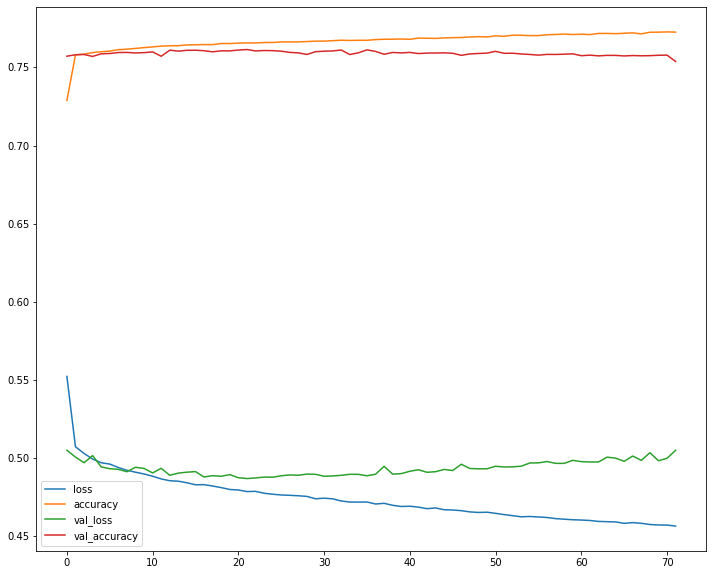

In [58]:
losses = pd.DataFrame(ann.history.history)
losses.plot(figsize=(12,10))

In [59]:
# Part 3 - Making predictions and evaluating the model

score, acc = ann.evaluate(xtrain, ytrain,
                            batch_size=2048)
print('Train score:', score)
print('Train accuracy:', acc)

900000/900000 [==============================] - 6s 6us/sample - loss: 0.4516 - accuracy: 0.7741
Train score: 0.45163422764354283
Train accuracy: 0.77408665


In [60]:
# Predicting the Test set results
ann_pred = ann.predict(xtest)
ann_pred = (ann_pred > 0.5)

print('*'*20)
score, acc = ann.evaluate(xtest, ytest,
                            batch_size=2048)
print('Test score:', score)
print('Test accuracy:', acc)


********************
100000/100000 [==============================] - 1s 6us/sample - loss: 0.5047 - accuracy: 0.7538
Test score: 0.5047460834884644
Test accuracy: 0.75381


In [70]:
# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(ytest, ann_pred)

In [116]:
cm

array([[41437,  8392],
       [16154, 34017]])

In [73]:
ann_off_pred.max()

0.74668676

In [119]:
# Predicting the Test set results
XXann_pred = ann.predict(df_test)
XXann_pred = (XXann_pred > 0.5)


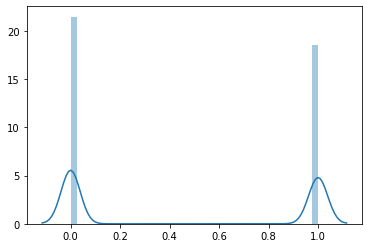

In [122]:
sns.distplot(XXann_pred_tosub)

In [121]:
XXann_pred_tosub=XXann_pred.astype(int)

In [86]:
## On full dataset

In [89]:
ann.fit(x=X,y=y
          ,validation_data=(xtest,ytest),callbacks = [early_stop]
          ,batch_size =16384,epochs=500)

Train on 1000000 samples, validate on 100000 samples
Epoch 1/500
1000000/1000000 [==============================] - 28s 28us/sample - loss: 0.5701 - accuracy: 0.7395 - val_loss: 0.5571 - val_accuracy: 0.7543
Epoch 2/500
1000000/1000000 [==============================] - 26s 26us/sample - loss: 0.5630 - accuracy: 0.7434 - val_loss: 0.5565 - val_accuracy: 0.7546
Epoch 3/500
1000000/1000000 [==============================] - 22s 22us/sample - loss: 0.5596 - accuracy: 0.7455 - val_loss: 0.5542 - val_accuracy: 0.7546
Epoch 4/500
1000000/1000000 [==============================] - 17s 17us/sample - loss: 0.5570 - accuracy: 0.7464 - val_loss: 0.5508 - val_accuracy: 0.7554
Epoch 5/500
1000000/1000000 [==============================] - 20s 20us/sample - loss: 0.5560 - accuracy: 0.7474 - val_loss: 0.5505 - val_accuracy: 0.7556
Epoch 6/500
1000000/1000000 [==============================] - 19s 19us/sample - loss: 0.5537 - accuracy: 0.7483 - val_loss: 0.5517 - val_accuracy: 0.7543
Epoch 7/500
10000

In [92]:
XXann_pred = ann.predict_classes(df_test)


## Submission

In [26]:
def submit(predictions,name):
    num = list(range(1000000,1500000))
    submission = pd.DataFrame(predictions, index = num, columns = ['target'])
    submission.index.name = 'Id'
    title = '../desktop/'+name+'.csv'
    submission.to_csv('../desktop/'+name+'.csv')
    return submission

In [44]:
submission = submit(lgbm_tunned__whole_preds,'TUNNNED_whole')

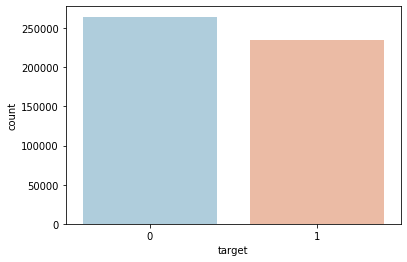

In [45]:
sns.countplot(x='target',data=submission,palette='RdBu_r')


In [46]:
submission['target'].value_counts()

0    264690
1    235310
Name: target, dtype: int64